In [1]:
# Parameters
config = {
    "notebook": "notebooks/tfi_lgbm_optuna.ipynb",
    "data_path": "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trawlers_fe_recortado.csv",
    "output_label": "trawlers_optuna",
}


In [2]:
# check if config exists
try:
    config
except NameError:
    config_exists = False
else:
    config_exists = True

# make config if it does not exist already (e.g. passed in by papermill)
if not(config_exists):
    # set up some config for the experiment run
    config = {
        "data_path" : "C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trollers_fe_recortado.csv",
    }
print(config)

{'notebook': 'notebooks/tfi_lgbm_optuna.ipynb', 'data_path': 'C:/Users/nico_/Desktop/ITBA/TFI/github/df_procesado/trawlers_fe_recortado.csv', 'output_label': 'trawlers_optuna'}


In [3]:
# Importing core libraries
#https://towardsdatascience.com/kagglers-guide-to-lightgbm-hyperparameter-tuning-with-optuna-in-2021-ed048d9838b5
#https://www.kaggle.com/code/lucamassaron/tutorial-bayesian-optimization-with-lightgbm/notebook
import numpy as np
import pandas as pd
from time import time
import pprint
import joblib
from functools import partial

# Suppressing warnings because of skopt verbosity
import warnings
warnings.filterwarnings("ignore")

# Classifiers
import lightgbm as lgb

# Model selection
from sklearn.model_selection import KFold, StratifiedKFold

# Metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import make_scorer

# Skopt functions
from skopt import BayesSearchCV
from skopt.callbacks import DeadlineStopper, DeltaYStopper
from skopt.space import Real, Categorical, Integer

# Data processing
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import TruncatedSVD
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer

Cargamos el dataset.

In [4]:
import pandas as pd
import numpy as np
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

df = pd.read_csv(config['data_path'], header="infer", sep=",",error_bad_lines=False, engine ='python')

In [5]:
df = df.drop(['mmsi', 'source','timestamp','source','datetime','distance_from_shore','distance_from_port'], axis = 1)
lagged_columns = ['A0', 'J0', 'C0','speed_lag_1', 'speed_lag_2',
       'speed_lag_3', 'speed_lag_4', 'speed_lag_5', 'speed_lag_6',
       'course_lag_1', 'course_lag_2', 'course_lag_3', 'course_lag_4',
       'course_lag_5', 'course_lag_6', 'S0_lag_1', 'S0_lag_2', 'S0_lag_3',
       'S0_lag_4', 'S0_lag_5', 'S0_lag_6', 'A0_lag_1', 'A0_lag_2', 'A0_lag_3',
       'A0_lag_4', 'A0_lag_5', 'A0_lag_6', 'J0_lag_1', 'J0_lag_2', 'J0_lag_3',
       'J0_lag_4', 'J0_lag_5', 'J0_lag_6', 'C0_lag_1', 'C0_lag_2', 'C0_lag_3',
       'C0_lag_4', 'C0_lag_5', 'C0_lag_6']
for column in lagged_columns:
    df[column]=df[column].abs()

print(df)


       speed    course       lat       lon is_fishing  sun_state   distance  \
0        3.2  0.731944  0.931707  0.086555         NO          2   2.295189   
1        3.0  0.640833  0.926848  0.076620         NO          2   2.960409   
2        4.4  0.113611  1.246002  0.445575         SI          1   8.868364   
3        6.2  0.265833 -0.785265  3.048812         NO          1   0.220481   
4        5.8  0.260556 -0.785264  3.048973         NO          1   1.027623   
...      ...       ...       ...       ...        ...        ...        ...   
14995   12.7  0.188889  1.035660 -0.084166         NO          2  75.005642   
14996   12.2  0.913333  0.923386  0.054660         NO          1   6.854306   
14997    3.1  0.947222  0.767882 -0.151418         SI          2   1.577254   
14998   12.4  0.908333  0.925538  0.052098         NO          1  21.292915   
14999    3.0  0.718056  0.934450  0.103905         NO          2   1.849035   

       timediff        S0            A0  ...      J

Generamos los vectores de train y test.

In [6]:
#Generamos train y test.

#Si la longitud del dataset es mayor a 10000, partiremos agrupado por "is_fishing" ya que nos puede tocar un conjunto con is_fishing='SI' vacio.
#if len(dataset)>10000:
    #df = df.sample(n=10000, random_state=1)
#    df = df.groupby("is_fishing").sample(n=7500, random_state=1,replace=True)
#    df = df.drop_duplicates()

X = df.drop('is_fishing',axis=1)
y = df['is_fishing']
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size=0.8, random_state=50)
print(len(df[df['is_fishing']=='SI']))
print(len(df[df['is_fishing']=='NO']))



5549
9451


Funcion para evaluar los modelos.

In [7]:
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display, Markdown, Latex
import matplotlib.pyplot as plt
import tabulate
from sklearn.metrics import confusion_matrix, accuracy_score


def evaluate_model(title,y_test, y_pred):

    cm = confusion_matrix(y_test, y_pred)
    display(Markdown(title))
    cmd_obj = ConfusionMatrixDisplay(cm, display_labels=['NO', 'SI'])
    cmd_obj.plot()
    cmd_obj.ax_.set(
                    title='Matriz de confusión.', 
                    xlabel='Predict Values', 
                    ylabel='Actual Values')
    plt.show()
    _precision_score = precision_score(y_test, y_pred,pos_label='SI')
    _recall_score = recall_score(y_test, y_pred, pos_label='SI')
    _accuracy_score = accuracy_score(y_test, y_pred)
    _f1_score = f1_score(y_test, y_pred, pos_label='SI')

    data = [["Precision","Recall","Accuracy","F1"],
            ["%.2f" % _precision_score, "%.2f" % _recall_score, "%.2f" % _accuracy_score, "%.2f" % _f1_score ]]
    table = tabulate.tabulate(data, tablefmt='html')
    display(table)
    return _precision_score, _recall_score, _accuracy_score, _f1_score


Fitting 3 folds for each of 1440 candidates, totalling 4320 fits


Train Accuracy : 0.907
Test Accuracy : 0.904
Best Score Through Grid Search : 0.901
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': 10, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}
Best Parameters :  {'max_depth': 11, 'max_features': None, 'max_leaf_nodes': 10, 'min_samples_leaf': 1, 'min_weight_fraction_leaf': 0, 'splitter': 'best'}


Arboles de decision optimizado

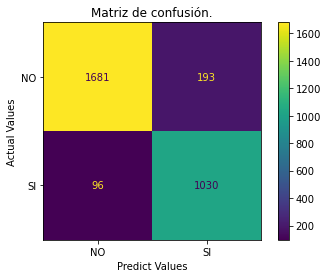

Precision,Recall,Accuracy,F1
0.84,0.91,0.90,0.88


In [8]:
from sklearn.tree import ExtraTreeClassifier
from sklearn.tree import DecisionTreeRegressor
#extra_tree_classifier = ExtraTreeClassifier(random_state=1)
#extra_tree_classifier.fit(X_train, y_train)

from sklearn.model_selection import GridSearchCV

parameters={"splitter":["best","random"],
            "max_depth" : [11,12,13,14,15,16],
           "min_samples_leaf":[1,2,3,4,5],
           "min_weight_fraction_leaf":[0, 0.1,0.2],
           "max_features":["auto","log2","sqrt",None],
           "max_leaf_nodes":[None,10] }

grid = GridSearchCV(DecisionTreeClassifier(random_state=1), cv=3, n_jobs=-1, verbose=3,
                    param_grid =parameters
                    )

grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = DecisionTreeClassifier(max_depth=grid.best_params_['max_depth'], 
                            max_features=grid.best_params_['max_features'],
                            max_leaf_nodes=grid.best_params_['max_leaf_nodes'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_weight_fraction_leaf=grid.best_params_['min_weight_fraction_leaf'],
                            splitter=grid.best_params_['splitter']
)
dt.fit(X_train, y_train)

y_pred = dt.predict(X_test)
print('Best Parameters : ',grid.best_params_)
dt_precision_score, dt_recall_score, dt_accuracy_score, dt_f1_score = evaluate_model('Arboles de decision optimizado',y_test, y_pred)

Fitting 3 folds for each of 432 candidates, totalling 1296 fits


Train Accuracy : 0.993
Test Accuracy : 0.916
Best Score Through Grid Search : 0.911
Best Parameters :  {'bootstrap': False, 'max_depth': 15, 'max_features': 'auto', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 100}


Random forest optimizado

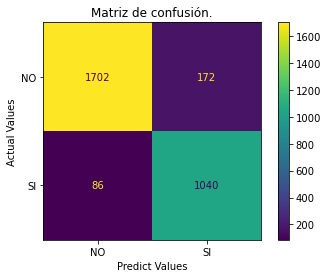

Precision,Recall,Accuracy,F1
0.86,0.92,0.91,0.89


In [9]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

param_grid = {
    'bootstrap': [True, False],
    'max_depth': [12,13,14,15],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [1,2,3],
    'min_samples_split': [2, 5 , 10],
    'n_estimators': [100, 200]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid = GridSearchCV(estimator = rf, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)
grid.fit(X_train, y_train)

print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
print('Best Score Through Grid Search : %.3f'%grid.best_score_)
print('Best Parameters : ',grid.best_params_)

dt = RandomForestClassifier(bootstrap=grid.best_params_['bootstrap'], 
                            max_depth=grid.best_params_['max_depth'],
                            max_features=grid.best_params_['max_features'],
                            min_samples_leaf=grid.best_params_['min_samples_leaf'],
                            min_samples_split=grid.best_params_['min_samples_split'],
                            n_estimators=grid.best_params_['n_estimators']
)
dt.fit(X_train, y_train)
y_pred = dt.predict(X_test)
rf_precision_score, rf_recall_score, rf_accuracy_score, rf_f1_score = evaluate_model('Random forest optimizado', y_test, y_pred)


Fitting 5 folds for each of 30 candidates, totalling 150 fits


Train Accuracy : 0.755


Test Accuracy : 0.740
Best Score Through Grid Search : 0.720
Best Parameters :  {'C': 100, 'gamma': 1e-05, 'kernel': 'rbf'}


rbf

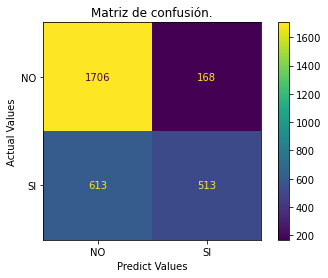

Precision,Recall,Accuracy,F1
0.75,0.46,0.74,0.57


Fitting 5 folds for each of 120 candidates, totalling 600 fits


Train Accuracy : 0.632


Test Accuracy : 0.623
Best Score Through Grid Search : 0.632
Best Parameters :  {'C': 10, 'coef0': 0.1, 'gamma': 0.001, 'kernel': 'sigmoid'}


sigmoid

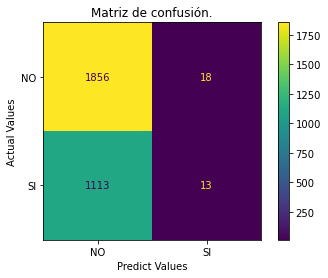

Precision,Recall,Accuracy,F1
0.42,0.01,0.62,0.02


In [10]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

#parameters = [{'kernel': ['rbf'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10 ]},
#              {'kernel': ['sigmoid'], 'gamma': [1e-2, 1e-3, 1e-4, 1e-5],'C': [0.001, 0.10, 0.1, 10], 'coef0 ':[0,0.1,1]},
#              {'kernel': ['linear'], 'C': [0.001, 0.10, 0.1, 1]}     
#]

parameters = [{'kernel': ['rbf'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100]},
              {'kernel': ['sigmoid'], 'gamma': [1e-2,1e-3,1e-4,1e-5,1e-6],'C': [0.001,0.01,0.1,1,10,100],'coef0' : [0.01,0.1,1,10]},
              #{'kernel': ['linear'], 'C': [0.1,1,10,100]}
              ]

svm_precision_score_rbf=svm_recall_score_rbf=svm_accuracy_score_rbf=svm_f1_score_rbf=0
svm_precision_score_sigmoid=svm_recall_score_sigmoid=svm_accuracy_score_sigmoid=svm_f1_score_sigmoid=0
svm_precision_score_linear=svm_recall_score_linear=svm_accuracy_score_linear=svm_f1_score_linear=0
for parameter in parameters:
    param_grid = parameter
    grid = GridSearchCV(SVC(), param_grid, n_jobs = -1, verbose = 3)
    grid.fit(X_train, y_train)
    kernel_str = parameter['kernel'][0]
    y_pred = grid.predict(X_test)
    dt = grid
    
    print('Train Accuracy : %.3f'%grid.best_estimator_.score(X_train, y_train))
    print('Test Accuracy : %.3f'%grid.best_estimator_.score(X_test, y_test))
    print('Best Score Through Grid Search : %.3f'%grid.best_score_)
    print('Best Parameters : ',grid.best_params_)

    if parameter['kernel'][0] == 'rbf':
        svm_precision_score_rbf, svm_recall_score_rbf, svm_accuracy_score_rbf, svm_f1_score_rbf = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'sigmoid':
        svm_precision_score_sigmoid, svm_recall_score_sigmoid, svm_accuracy_score_sigmoid, svm_f1_score_sigmoid = evaluate_model(kernel_str, y_test, y_pred)
    if parameter['kernel'][0] == 'linear':
        svm_precision_score_linear, svm_recall_score_linear, svm_accuracy_score_linear, svm_f1_score_linear = evaluate_model(kernel_str, y_test, y_pred)

In [11]:
import optuna  # pip install optuna
from sklearn.metrics import log_loss
from sklearn.model_selection import StratifiedKFold

from optuna.integration import LightGBMPruningCallback


def objective(trial, X, y):
    param_grid = {
        # "device_type": trial.suggest_categorical("device_type", ['gpu']),
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3),
        "num_leaves": trial.suggest_int("num_leaves", 8, 1023, step=10),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        "lambda_l1": trial.suggest_float("lambda_l1", 0.0, 10),
        "lambda_l2": trial.suggest_float("lambda_l2", 0.0, 100),
        "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        "bagging_fraction": trial.suggest_float(
            "bagging_fraction", 0.2, 0.95, step=0.1
        ),
        "bagging_freq": trial.suggest_categorical("bagging_freq", [1]),
        "feature_fraction": trial.suggest_float(
            "feature_fraction", 0.2, 0.95, step=0.1
        ),
    }

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=1121218)

    cv_scores = np.empty(5)
    for idx, (train_idx, test_idx) in enumerate(cv.split(X, y)):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y[train_idx], y[test_idx]

        model = lgb.LGBMClassifier(objective="binary", **param_grid)
        model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            callbacks=[
                #LightGBMPruningCallback(trial, "auc")
                LightGBMPruningCallback(trial, "binary_logloss")
            ],  # Add a pruning callback
        )
        preds = model.predict_proba(X_test)
        cv_scores[idx] = log_loss(y_test, preds)

    return np.mean(cv_scores)


In [12]:
study = optuna.create_study(direction="minimize", study_name="LGBM Classifier")

#AUC -> maximixe
#study = optuna.create_study(direction="maximize", study_name="LGBM Classifier")
func = lambda trial: objective(trial, X, y)
study.optimize(func, n_trials=2000)


[I 2022-06-09 01:49:25,951] A new study created in memory with name: LGBM Classifier


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.593746882720637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.593746882720637
[LightGBM] [Warning] lambda_l1 is set=3.4172681397361346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4172681397361346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=97.39507861322203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.39507861322203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.593746882720637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.593746882720637
[LightGBM] [Warning] lambda_l1 is set=3.4172681397361346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4172681397361346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=97.39507861322203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.39507861322203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.593746882720637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.593746882720637
[LightGBM] [Warning] lambda_l1 is set=3.4172681397361346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4172681397361346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=97.39507861322203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.39507861322203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.593746882720637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.593746882720637
[LightGBM] [Warning] lambda_l1 is set=3.4172681397361346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4172681397361346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=97.39507861322203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.39507861322203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=5.593746882720637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.593746882720637
[LightGBM] [Warning] lambda_l1 is set=3.4172681397361346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4172681397361346
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=97.39507861322203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.39507861322203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:31,168] Trial 0 finished with value: 0.4388029682786729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16317723377154308, 'num_leaves': 598, 'max_depth': 9, 'min_data_in_leaf': 4000, 'lambda_l1': 3.4172681397361346, 'lambda_l2': 97.39507861322203, 'min_gain_to_split': 5.593746882720637, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 0 with value: 0.4388029682786729.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.9524330478693421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524330478693421
[LightGBM] [Warning] lambda_l1 is set=5.424317132134595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.424317132134595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.929507223730525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.929507223730525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.9524330478693421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524330478693421
[LightGBM] [Warning] lambda_l1 is set=5.424317132134595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.424317132134595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.929507223730525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.929507223730525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_b

[I 2022-06-09 01:49:31,731] Trial 1 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03691096254861018, 'num_leaves': 198, 'max_depth': 6, 'min_data_in_leaf': 7400, 'lambda_l1': 5.424317132134595, 'lambda_l2': 42.929507223730525, 'min_gain_to_split': 0.9524330478693421, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 0 with value: 0.4388029682786729.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.9524330478693421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9524330478693421
[LightGBM] [Warning] lambda_l1 is set=5.424317132134595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.424317132134595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.929507223730525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.929507223730525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will 

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=3.7203161051742413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7203161051742413
[LightGBM] [Warning] lambda_l1 is set=2.657542667176762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657542667176762
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=48.45706966721798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.45706966721798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=3.7203161051742413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7203161051742413
[LightGBM] [Warning] lambda_l1 is set=2.657542667176762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657542667176762
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=48.45706966721798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.45706966721798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=3.7203161051742413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7203161051742413
[LightGBM] [Warning] lambda_l1 is set=2.657542667176762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657542667176762
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=48.45706966721798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.45706966721798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=3.7203161051742413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.7203161051742413
[LightGBM] [Warning] lambda_l1 is set=2.657542667176762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.657542667176762
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=48.45706966721798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.45706966721798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:33,758] Trial 2 finished with value: 0.27384088412960506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.279364515114306, 'num_leaves': 618, 'max_depth': 3, 'min_data_in_leaf': 2700, 'lambda_l1': 2.657542667176762, 'lambda_l2': 48.45706966721798, 'min_gain_to_split': 3.7203161051742413, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 2 with value: 0.27384088412960506.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=8.932697805400192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.932697805400192
[LightGBM] [Warning] lambda_l1 is set=1.2396780330156643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2396780330156643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=21.75753843999463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.75753843999463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=8.932697805400192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.932697805400192
[LightGBM] [Warning] lambda_l1 is set=1.2396780330156643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2396780330156643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=21.75753843999463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.75753843999463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:49:34,325] Trial 3 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04320103105057937, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 7200, 'lambda_l1': 1.2396780330156643, 'lambda_l2': 21.75753843999463, 'min_gain_to_split': 8.932697805400192, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 2 with value: 0.27384088412960506.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=8.932697805400192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.932697805400192
[LightGBM] [Warning] lambda_l1 is set=1.2396780330156643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2396780330156643
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=21.75753843999463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.75753843999463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=2.457100217328029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.457100217328029
[LightGBM] [Warning] lambda_l1 is set=2.6630469757280295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6630469757280295
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.41021371847448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41021371847448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=2.457100217328029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.457100217328029
[LightGBM] [Warning] lambda_l1 is set=2.6630469757280295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6630469757280295
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=89.41021371847448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41021371847448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:49:34,991] Trial 4 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14009981571237717, 'num_leaves': 698, 'max_depth': 4, 'min_data_in_leaf': 3000, 'lambda_l1': 2.6630469757280295, 'lambda_l2': 89.41021371847448, 'min_gain_to_split': 2.457100217328029, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 2 with value: 0.27384088412960506.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=4.274508223667432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.274508223667432
[LightGBM] [Warning] lambda_l1 is set=1.6926266569654314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6926266569654314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.84374070866654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84374070866654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=4.274508223667432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.274508223667432
[LightGBM] [Warning] lambda_l1 is set=1.6926266569654314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6926266569654314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.84374070866654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84374070866654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:49:35,605] Trial 5 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25325987852933945, 'num_leaves': 368, 'max_depth': 5, 'min_data_in_leaf': 9200, 'lambda_l1': 1.6926266569654314, 'lambda_l2': 94.84374070866654, 'min_gain_to_split': 4.274508223667432, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 2 with value: 0.27384088412960506.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=4.274508223667432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.274508223667432
[LightGBM] [Warning] lambda_l1 is set=1.6926266569654314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6926266569654314
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=94.84374070866654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.84374070866654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Curr

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.9769110180492095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.9769110180492095
[LightGBM] [Warning] lambda_l1 is set=7.293559479900046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.293559479900046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.15401036162481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.15401036162481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.9769110180492095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.9769110180492095
[LightGBM] [Warning] lambda_l1 is set=7.293559479900046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.293559479900046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.15401036162481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.15401036162481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.9769110180492095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.9769110180492095
[LightGBM] [Warning] lambda_l1 is set=7.293559479900046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.293559479900046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.15401036162481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.15401036162481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.9769110180492095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.9769110180492095
[LightGBM] [Warning] lambda_l1 is set=7.293559479900046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.293559479900046
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.15401036162481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.15401036162481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:37,241] Trial 6 finished with value: 0.2553371400825633 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2205236666967546, 'num_leaves': 578, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 7.293559479900046, 'lambda_l2': 55.15401036162481, 'min_gain_to_split': 7.9769110180492095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=6.141589597643712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.141589597643712
[LightGBM] [Warning] lambda_l1 is set=9.488435669068313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.488435669068313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.411059667189743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.411059667189743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=6.141589597643712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.141589597643712
[LightGBM] [Warning] lambda_l1 is set=9.488435669068313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.488435669068313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.411059667189743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.411059667189743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:49:37,935] Trial 7 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20835933042430232, 'num_leaves': 778, 'max_depth': 4, 'min_data_in_leaf': 5700, 'lambda_l1': 9.488435669068313, 'lambda_l2': 16.411059667189743, 'min_gain_to_split': 6.141589597643712, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=6.141589597643712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.141589597643712
[LightGBM] [Warning] lambda_l1 is set=9.488435669068313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.488435669068313
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=16.411059667189743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.411059667189743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.195996856502669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195996856502669
[LightGBM] [Warning] lambda_l1 is set=0.2262725784895392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2262725784895392
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.205812581327198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.205812581327198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 wil

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=1.195996856502669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.195996856502669
[LightGBM] [Warning] lambda_l1 is set=0.2262725784895392, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2262725784895392
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=19.205812581327198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.205812581327198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 wil

[I 2022-06-09 01:49:38,682] Trial 8 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23295604799228362, 'num_leaves': 128, 'max_depth': 7, 'min_data_in_leaf': 3800, 'lambda_l1': 0.2262725784895392, 'lambda_l2': 19.205812581327198, 'min_gain_to_split': 1.195996856502669, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=2.2222234608424234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2222234608424234
[LightGBM] [Warning] lambda_l1 is set=1.9363575504390529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9363575504390529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.487990285625663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.487990285625663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=2.2222234608424234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2222234608424234
[LightGBM] [Warning] lambda_l1 is set=1.9363575504390529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9363575504390529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.487990285625663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.487990285625663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 01:49:39,281] Trial 9 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011638364758760013, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 8200, 'lambda_l1': 1.9363575504390529, 'lambda_l2': 27.487990285625663, 'min_gain_to_split': 2.2222234608424234, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=2.2222234608424234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2222234608424234
[LightGBM] [Warning] lambda_l1 is set=1.9363575504390529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9363575504390529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.487990285625663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.487990285625663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.47898602371577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47898602371577
[LightGBM] [Warning] lambda_l1 is set=7.7216408635885205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7216408635885205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46709086791161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46709086791161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.47898602371577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47898602371577
[LightGBM] [Warning] lambda_l1 is set=7.7216408635885205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7216408635885205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46709086791161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46709086791161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.47898602371577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47898602371577
[LightGBM] [Warning] lambda_l1 is set=7.7216408635885205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7216408635885205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46709086791161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46709086791161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.47898602371577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47898602371577
[LightGBM] [Warning] lambda_l1 is set=7.7216408635885205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7216408635885205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46709086791161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46709086791161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=13.47898602371577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.47898602371577
[LightGBM] [Warning] lambda_l1 is set=7.7216408635885205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7216408635885205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=69.46709086791161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.46709086791161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:42,242] Trial 10 finished with value: 0.2619567850816234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11675001660851049, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 7.7216408635885205, 'lambda_l2': 69.46709086791161, 'min_gain_to_split': 13.47898602371577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.015657352723071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.015657352723071
[LightGBM] [Warning] lambda_l1 is set=7.67257556969098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67257556969098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.9369227287477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9369227287477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.015657352723071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.015657352723071
[LightGBM] [Warning] lambda_l1 is set=7.67257556969098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67257556969098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.9369227287477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9369227287477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.015657352723071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.015657352723071
[LightGBM] [Warning] lambda_l1 is set=7.67257556969098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67257556969098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.9369227287477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9369227287477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.015657352723071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.015657352723071
[LightGBM] [Warning] lambda_l1 is set=7.67257556969098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67257556969098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.9369227287477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9369227287477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.015657352723071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.015657352723071
[LightGBM] [Warning] lambda_l1 is set=7.67257556969098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.67257556969098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.9369227287477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.9369227287477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:44,992] Trial 11 finished with value: 0.256845308896346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11457754188275676, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 300, 'lambda_l1': 7.67257556969098, 'lambda_l2': 68.9369227287477, 'min_gain_to_split': 14.015657352723071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 6 with value: 0.2553371400825633.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.747513125296631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.747513125296631
[LightGBM] [Warning] lambda_l1 is set=6.8950880719848975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8950880719848975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.73218669543795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.73218669543795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.747513125296631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.747513125296631
[LightGBM] [Warning] lambda_l1 is set=6.8950880719848975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8950880719848975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.73218669543795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.73218669543795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.747513125296631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.747513125296631
[LightGBM] [Warning] lambda_l1 is set=6.8950880719848975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8950880719848975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.73218669543795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.73218669543795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.747513125296631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.747513125296631
[LightGBM] [Warning] lambda_l1 is set=6.8950880719848975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8950880719848975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.73218669543795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.73218669543795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.747513125296631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.747513125296631
[LightGBM] [Warning] lambda_l1 is set=6.8950880719848975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.8950880719848975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=65.73218669543795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.73218669543795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:47,077] Trial 12 finished with value: 0.25419314922325803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09335415258309929, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.8950880719848975, 'lambda_l2': 65.73218669543795, 'min_gain_to_split': 14.747513125296631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.25419314922325803.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.034405400488117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034405400488117
[LightGBM] [Warning] lambda_l1 is set=6.01374471138234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01374471138234
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.84806566680602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.84806566680602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.034405400488117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034405400488117
[LightGBM] [Warning] lambda_l1 is set=6.01374471138234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01374471138234
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.84806566680602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.84806566680602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.034405400488117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034405400488117
[LightGBM] [Warning] lambda_l1 is set=6.01374471138234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01374471138234
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.84806566680602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.84806566680602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.034405400488117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034405400488117
[LightGBM] [Warning] lambda_l1 is set=6.01374471138234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01374471138234
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.84806566680602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.84806566680602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=10.034405400488117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034405400488117
[LightGBM] [Warning] lambda_l1 is set=6.01374471138234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.01374471138234
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=65.84806566680602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.84806566680602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:49,269] Trial 13 finished with value: 0.2676486239124256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1844524343970712, 'num_leaves': 828, 'max_depth': 10, 'min_data_in_leaf': 1500, 'lambda_l1': 6.01374471138234, 'lambda_l2': 65.84806566680602, 'min_gain_to_split': 10.034405400488117, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.25419314922325803.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.283002045055888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.283002045055888
[LightGBM] [Warning] lambda_l1 is set=7.109220879139269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.109220879139269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.91402099895463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.91402099895463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.283002045055888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.283002045055888
[LightGBM] [Warning] lambda_l1 is set=7.109220879139269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.109220879139269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.91402099895463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.91402099895463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.283002045055888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.283002045055888
[LightGBM] [Warning] lambda_l1 is set=7.109220879139269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.109220879139269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.91402099895463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.91402099895463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.283002045055888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.283002045055888
[LightGBM] [Warning] lambda_l1 is set=7.109220879139269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.109220879139269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.91402099895463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.91402099895463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=11.283002045055888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.283002045055888
[LightGBM] [Warning] lambda_l1 is set=7.109220879139269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.109220879139269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=62.91402099895463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.91402099895463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:51,375] Trial 14 finished with value: 0.26092226046068956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08204843708523675, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 7.109220879139269, 'lambda_l2': 62.91402099895463, 'min_gain_to_split': 11.283002045055888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 12 with value: 0.25419314922325803.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.294506421655129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.294506421655129
[LightGBM] [Warning] lambda_l1 is set=9.327429941043661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.327429941043661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.882255846648334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.882255846648334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.294506421655129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.294506421655129
[LightGBM] [Warning] lambda_l1 is set=9.327429941043661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.327429941043661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.882255846648334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.882255846648334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.294506421655129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.294506421655129
[LightGBM] [Warning] lambda_l1 is set=9.327429941043661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.327429941043661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.882255846648334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.882255846648334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.294506421655129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.294506421655129
[LightGBM] [Warning] lambda_l1 is set=9.327429941043661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.327429941043661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.882255846648334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.882255846648334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.294506421655129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.294506421655129
[LightGBM] [Warning] lambda_l1 is set=9.327429941043661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.327429941043661
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=38.882255846648334, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.882255846648334
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:53,799] Trial 15 finished with value: 0.25467484594261497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08305782273691961, 'num_leaves': 888, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 9.327429941043661, 'lambda_l2': 38.882255846648334, 'min_gain_to_split': 11.294506421655129, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.25419314922325803.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=12.036444311343763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.036444311343763
[LightGBM] [Warning] lambda_l1 is set=9.838718698730002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.838718698730002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.4697039804489833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4697039804489833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=12.036444311343763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.036444311343763
[LightGBM] [Warning] lambda_l1 is set=9.838718698730002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.838718698730002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.4697039804489833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4697039804489833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[I 2022-06-09 01:49:54,531] Trial 16 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08158390899832234, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 4700, 'lambda_l1': 9.838718698730002, 'lambda_l2': 1.4697039804489833, 'min_gain_to_split': 12.036444311343763, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 12 with value: 0.25419314922325803.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=12.036444311343763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.036444311343763
[LightGBM] [Warning] lambda_l1 is set=9.838718698730002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.838718698730002
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=1.4697039804489833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4697039804489833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set

[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.724965021787783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.724965021787783
[LightGBM] [Warning] lambda_l1 is set=8.998026239614576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.998026239614576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.810012738559024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.810012738559024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.724965021787783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.724965021787783
[LightGBM] [Warning] lambda_l1 is set=8.998026239614576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.998026239614576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.810012738559024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.810012738559024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.724965021787783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.724965021787783
[LightGBM] [Warning] lambda_l1 is set=8.998026239614576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.998026239614576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.810012738559024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.810012738559024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.724965021787783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.724965021787783
[LightGBM] [Warning] lambda_l1 is set=8.998026239614576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.998026239614576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.810012738559024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.810012738559024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.724965021787783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.724965021787783
[LightGBM] [Warning] lambda_l1 is set=8.998026239614576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.998026239614576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=35.810012738559024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.810012738559024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:49:56,443] Trial 17 finished with value: 0.2510449562952891 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07647543368329116, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 300, 'lambda_l1': 8.998026239614576, 'lambda_l2': 35.810012738559024, 'min_gain_to_split': 14.724965021787783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=14.526238263095648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.526238263095648
[LightGBM] [Warning] lambda_l1 is set=8.506078982550395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.506078982550395
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.83209303818154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83209303818154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=14.526238263095648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.526238263095648
[LightGBM] [Warning] lambda_l1 is set=8.506078982550395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.506078982550395
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.83209303818154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83209303818154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=14.526238263095648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.526238263095648
[LightGBM] [Warning] lambda_l1 is set=8.506078982550395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.506078982550395
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.83209303818154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83209303818154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=14.526238263095648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.526238263095648
[LightGBM] [Warning] lambda_l1 is set=8.506078982550395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.506078982550395
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.83209303818154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83209303818154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=14.526238263095648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.526238263095648
[LightGBM] [Warning] lambda_l1 is set=8.506078982550395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.506078982550395
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=81.83209303818154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.83209303818154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:08,174] Trial 18 finished with value: 0.3308281852643655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05525135344591106, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 8.506078982550395, 'lambda_l2': 81.83209303818154, 'min_gain_to_split': 14.526238263095648, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=12.915133606949937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.915133606949937
[LightGBM] [Warning] lambda_l1 is set=4.383930891971192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383930891971192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.81186124129299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.81186124129299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=12.915133606949937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.915133606949937
[LightGBM] [Warning] lambda_l1 is set=4.383930891971192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383930891971192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.81186124129299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.81186124129299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_byt

[I 2022-06-09 01:50:08,819] Trial 19 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11521540959145943, 'num_leaves': 738, 'max_depth': 12, 'min_data_in_leaf': 6000, 'lambda_l1': 4.383930891971192, 'lambda_l2': 33.81186124129299, 'min_gain_to_split': 12.915133606949937, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=12.915133606949937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.915133606949937
[LightGBM] [Warning] lambda_l1 is set=4.383930891971192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.383930891971192
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.81186124129299, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.81186124129299
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=10.105988791254862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.105988791254862
[LightGBM] [Warning] lambda_l1 is set=6.1031421364543785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1031421364543785
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80.31613309071953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.31613309071953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=10.105988791254862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.105988791254862
[LightGBM] [Warning] lambda_l1 is set=6.1031421364543785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1031421364543785
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80.31613309071953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.31613309071953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=10.105988791254862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.105988791254862
[LightGBM] [Warning] lambda_l1 is set=6.1031421364543785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1031421364543785
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80.31613309071953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.31613309071953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=10.105988791254862, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.105988791254862
[LightGBM] [Warning] lambda_l1 is set=6.1031421364543785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.1031421364543785
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=80.31613309071953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.31613309071953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:16,719] Trial 20 finished with value: 0.3552240066787892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14775244620433114, 'num_leaves': 18, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 6.1031421364543785, 'lambda_l2': 80.31613309071953, 'min_gain_to_split': 10.105988791254862, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.867741607207632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.867741607207632
[LightGBM] [Warning] lambda_l1 is set=8.987737332784523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.987737332784523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.45749556651052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45749556651052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.867741607207632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.867741607207632
[LightGBM] [Warning] lambda_l1 is set=8.987737332784523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.987737332784523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.45749556651052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45749556651052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.867741607207632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.867741607207632
[LightGBM] [Warning] lambda_l1 is set=8.987737332784523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.987737332784523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.45749556651052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45749556651052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.867741607207632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.867741607207632
[LightGBM] [Warning] lambda_l1 is set=8.987737332784523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.987737332784523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.45749556651052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45749556651052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=14.867741607207632, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.867741607207632
[LightGBM] [Warning] lambda_l1 is set=8.987737332784523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.987737332784523
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=41.45749556651052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.45749556651052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:18,701] Trial 21 finished with value: 0.25359736156945145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07746421705477488, 'num_leaves': 908, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 8.987737332784523, 'lambda_l2': 41.45749556651052, 'min_gain_to_split': 14.867741607207632, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.593887685115792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.593887685115792
[LightGBM] [Warning] lambda_l1 is set=8.683637105449895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683637105449895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.04994779266741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.04994779266741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.593887685115792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.593887685115792
[LightGBM] [Warning] lambda_l1 is set=8.683637105449895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683637105449895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.04994779266741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.04994779266741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.593887685115792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.593887685115792
[LightGBM] [Warning] lambda_l1 is set=8.683637105449895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683637105449895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.04994779266741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.04994779266741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.593887685115792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.593887685115792
[LightGBM] [Warning] lambda_l1 is set=8.683637105449895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683637105449895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.04994779266741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.04994779266741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.593887685115792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.593887685115792
[LightGBM] [Warning] lambda_l1 is set=8.683637105449895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683637105449895
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=48.04994779266741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.04994779266741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:20,725] Trial 22 finished with value: 0.25267311497499956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06809904391009468, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.683637105449895, 'lambda_l2': 48.04994779266741, 'min_gain_to_split': 14.593887685115792, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.645945074526242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.645945074526242
[LightGBM] [Warning] lambda_l1 is set=8.594124070751633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.594124070751633
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.63827680418869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.63827680418869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.645945074526242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.645945074526242
[LightGBM] [Warning] lambda_l1 is set=8.594124070751633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.594124070751633
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.63827680418869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.63827680418869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.645945074526242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.645945074526242
[LightGBM] [Warning] lambda_l1 is set=8.594124070751633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.594124070751633
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.63827680418869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.63827680418869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.645945074526242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.645945074526242
[LightGBM] [Warning] lambda_l1 is set=8.594124070751633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.594124070751633
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.63827680418869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.63827680418869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=12.645945074526242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.645945074526242
[LightGBM] [Warning] lambda_l1 is set=8.594124070751633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.594124070751633
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.63827680418869, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.63827680418869
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:33,386] Trial 23 finished with value: 0.26335543766868785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017206320169402566, 'num_leaves': 908, 'max_depth': 10, 'min_data_in_leaf': 1400, 'lambda_l1': 8.594124070751633, 'lambda_l2': 51.63827680418869, 'min_gain_to_split': 12.645945074526242, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=14.746328591038727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.746328591038727
[LightGBM] [Warning] lambda_l1 is set=8.683796339313856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683796339313856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.587767722471376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.587767722471376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=14.746328591038727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.746328591038727
[LightGBM] [Warning] lambda_l1 is set=8.683796339313856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683796339313856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.587767722471376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.587767722471376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=14.746328591038727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.746328591038727
[LightGBM] [Warning] lambda_l1 is set=8.683796339313856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683796339313856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.587767722471376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.587767722471376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=14.746328591038727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.746328591038727
[LightGBM] [Warning] lambda_l1 is set=8.683796339313856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683796339313856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.587767722471376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.587767722471376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=14.746328591038727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.746328591038727
[LightGBM] [Warning] lambda_l1 is set=8.683796339313856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.683796339313856
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.587767722471376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.587767722471376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:35,455] Trial 24 finished with value: 0.26324543399598843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05953650514760131, 'num_leaves': 788, 'max_depth': 9, 'min_data_in_leaf': 2100, 'lambda_l1': 8.683796339313856, 'lambda_l2': 32.587767722471376, 'min_gain_to_split': 14.746328591038727, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.236476233335917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.236476233335917
[LightGBM] [Warning] lambda_l1 is set=9.961897555553104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.961897555553104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.880586177071606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.880586177071606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.236476233335917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.236476233335917
[LightGBM] [Warning] lambda_l1 is set=9.961897555553104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.961897555553104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.880586177071606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.880586177071606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.236476233335917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.236476233335917
[LightGBM] [Warning] lambda_l1 is set=9.961897555553104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.961897555553104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.880586177071606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.880586177071606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.236476233335917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.236476233335917
[LightGBM] [Warning] lambda_l1 is set=9.961897555553104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.961897555553104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.880586177071606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.880586177071606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=13.236476233335917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.236476233335917
[LightGBM] [Warning] lambda_l1 is set=9.961897555553104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.961897555553104
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.880586177071606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.880586177071606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:38,162] Trial 25 finished with value: 0.2582532549429105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06636488577952895, 'num_leaves': 698, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 9.961897555553104, 'lambda_l2': 41.880586177071606, 'min_gain_to_split': 13.236476233335917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=11.85903800183999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.85903800183999
[LightGBM] [Warning] lambda_l1 is set=8.121965561635452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.121965561635452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.990902391433231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.990902391433231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=11.85903800183999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.85903800183999
[LightGBM] [Warning] lambda_l1 is set=8.121965561635452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.121965561635452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.990902391433231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.990902391433231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=11.85903800183999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.85903800183999
[LightGBM] [Warning] lambda_l1 is set=8.121965561635452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.121965561635452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.990902391433231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.990902391433231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=11.85903800183999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.85903800183999
[LightGBM] [Warning] lambda_l1 is set=8.121965561635452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.121965561635452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.990902391433231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.990902391433231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=11.85903800183999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.85903800183999
[LightGBM] [Warning] lambda_l1 is set=8.121965561635452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.121965561635452
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.990902391433231, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.990902391433231
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:41,948] Trial 26 finished with value: 0.2726994798564651 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03472535331419373, 'num_leaves': 848, 'max_depth': 9, 'min_data_in_leaf': 3000, 'lambda_l1': 8.121965561635452, 'lambda_l2': 5.990902391433231, 'min_gain_to_split': 11.85903800183999, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.765510694800152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.765510694800152
[LightGBM] [Warning] lambda_l1 is set=9.055951270878642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.055951270878642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.246011663897455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.246011663897455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.765510694800152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.765510694800152
[LightGBM] [Warning] lambda_l1 is set=9.055951270878642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.055951270878642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.246011663897455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.246011663897455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.765510694800152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.765510694800152
[LightGBM] [Warning] lambda_l1 is set=9.055951270878642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.055951270878642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.246011663897455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.246011663897455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.765510694800152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.765510694800152
[LightGBM] [Warning] lambda_l1 is set=9.055951270878642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.055951270878642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.246011663897455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.246011663897455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.765510694800152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.765510694800152
[LightGBM] [Warning] lambda_l1 is set=9.055951270878642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.055951270878642
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=58.246011663897455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.246011663897455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:45,101] Trial 27 finished with value: 0.25114031831286737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10349907387984225, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 9.055951270878642, 'lambda_l2': 58.246011663897455, 'min_gain_to_split': 10.765510694800152, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.430327249124947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430327249124947
[LightGBM] [Warning] lambda_l1 is set=6.48343744007027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.48343744007027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.87975417073614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.87975417073614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.430327249124947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430327249124947
[LightGBM] [Warning] lambda_l1 is set=6.48343744007027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.48343744007027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.87975417073614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.87975417073614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.430327249124947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430327249124947
[LightGBM] [Warning] lambda_l1 is set=6.48343744007027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.48343744007027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.87975417073614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.87975417073614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.430327249124947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430327249124947
[LightGBM] [Warning] lambda_l1 is set=6.48343744007027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.48343744007027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.87975417073614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.87975417073614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=9.430327249124947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.430327249124947
[LightGBM] [Warning] lambda_l1 is set=6.48343744007027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.48343744007027
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=58.87975417073614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.87975417073614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:49,112] Trial 28 finished with value: 0.2865310332709556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1056214759479489, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1700, 'lambda_l1': 6.48343744007027, 'lambda_l2': 58.87975417073614, 'min_gain_to_split': 9.430327249124947, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=6.718407366371587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.718407366371587
[LightGBM] [Warning] lambda_l1 is set=4.640945108589534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.640945108589534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.849143907106836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.849143907106836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=6.718407366371587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.718407366371587
[LightGBM] [Warning] lambda_l1 is set=4.640945108589534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.640945108589534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.849143907106836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.849143907106836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:50:49,955] Trial 29 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16276700221727386, 'num_leaves': 668, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 4.640945108589534, 'lambda_l2': 48.849143907106836, 'min_gain_to_split': 6.718407366371587, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 17 with value: 0.2510449562952891.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=6.718407366371587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.718407366371587
[LightGBM] [Warning] lambda_l1 is set=4.640945108589534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.640945108589534
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=48.849143907106836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.849143907106836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.184205786436095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.184205786436095
[LightGBM] [Warning] lambda_l1 is set=8.20300921139464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.20300921139464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.35212271753369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.35212271753369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.184205786436095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.184205786436095
[LightGBM] [Warning] lambda_l1 is set=8.20300921139464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.20300921139464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.35212271753369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.35212271753369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.184205786436095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.184205786436095
[LightGBM] [Warning] lambda_l1 is set=8.20300921139464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.20300921139464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.35212271753369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.35212271753369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.184205786436095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.184205786436095
[LightGBM] [Warning] lambda_l1 is set=8.20300921139464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.20300921139464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.35212271753369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.35212271753369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.184205786436095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.184205786436095
[LightGBM] [Warning] lambda_l1 is set=8.20300921139464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.20300921139464
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=77.35212271753369, reg_lambda=0.0 will be ignored. Current value: lambda_l2=77.35212271753369
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:52,035] Trial 30 finished with value: 0.2506261517922469 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13292400928674358, 'num_leaves': 508, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 8.20300921139464, 'lambda_l2': 77.35212271753369, 'min_gain_to_split': 8.184205786436095, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 30 with value: 0.2506261517922469.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.28732229832924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.28732229832924
[LightGBM] [Warning] lambda_l1 is set=8.034820055244603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034820055244603
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.68289519943261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.68289519943261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.28732229832924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.28732229832924
[LightGBM] [Warning] lambda_l1 is set=8.034820055244603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034820055244603
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.68289519943261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.68289519943261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.28732229832924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.28732229832924
[LightGBM] [Warning] lambda_l1 is set=8.034820055244603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034820055244603
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.68289519943261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.68289519943261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.28732229832924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.28732229832924
[LightGBM] [Warning] lambda_l1 is set=8.034820055244603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034820055244603
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.68289519943261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.68289519943261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.28732229832924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.28732229832924
[LightGBM] [Warning] lambda_l1 is set=8.034820055244603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.034820055244603
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.68289519943261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.68289519943261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:54,030] Trial 31 finished with value: 0.25033104543260853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13395717204789961, 'num_leaves': 498, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 8.034820055244603, 'lambda_l2': 75.68289519943261, 'min_gain_to_split': 7.28732229832924, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.862462499832229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.862462499832229
[LightGBM] [Warning] lambda_l1 is set=7.942721512972129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942721512972129
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.37631190980288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.37631190980288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.862462499832229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.862462499832229
[LightGBM] [Warning] lambda_l1 is set=7.942721512972129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942721512972129
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.37631190980288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.37631190980288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.862462499832229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.862462499832229
[LightGBM] [Warning] lambda_l1 is set=7.942721512972129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942721512972129
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.37631190980288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.37631190980288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.862462499832229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.862462499832229
[LightGBM] [Warning] lambda_l1 is set=7.942721512972129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942721512972129
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.37631190980288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.37631190980288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:55,946] Trial 32 finished with value: 0.2517796885732019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13230343708650316, 'num_leaves': 478, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 7.942721512972129, 'lambda_l2': 75.37631190980288, 'min_gain_to_split': 7.862462499832229, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.862462499832229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.862462499832229
[LightGBM] [Warning] lambda_l1 is set=7.942721512972129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.942721512972129
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=75.37631190980288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.37631190980288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=4.871234819471637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.871234819471637
[LightGBM] [Warning] lambda_l1 is set=9.133341400143287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.133341400143287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.7410142955678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7410142955678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=4.871234819471637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.871234819471637
[LightGBM] [Warning] lambda_l1 is set=9.133341400143287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.133341400143287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.7410142955678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7410142955678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=4.871234819471637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.871234819471637
[LightGBM] [Warning] lambda_l1 is set=9.133341400143287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.133341400143287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.7410142955678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7410142955678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=4.871234819471637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.871234819471637
[LightGBM] [Warning] lambda_l1 is set=9.133341400143287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.133341400143287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.7410142955678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7410142955678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=4.871234819471637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.871234819471637
[LightGBM] [Warning] lambda_l1 is set=9.133341400143287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.133341400143287
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=75.7410142955678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.7410142955678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:50:59,032] Trial 33 finished with value: 0.2606030538599634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17843406124103606, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 2200, 'lambda_l1': 9.133341400143287, 'lambda_l2': 75.7410142955678, 'min_gain_to_split': 4.871234819471637, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.084703687723253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.084703687723253
[LightGBM] [Warning] lambda_l1 is set=5.372439293616005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.372439293616005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=88.18225679826887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18225679826887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.084703687723253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.084703687723253
[LightGBM] [Warning] lambda_l1 is set=5.372439293616005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.372439293616005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=88.18225679826887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18225679826887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.084703687723253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.084703687723253
[LightGBM] [Warning] lambda_l1 is set=5.372439293616005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.372439293616005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=88.18225679826887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18225679826887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.084703687723253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.084703687723253
[LightGBM] [Warning] lambda_l1 is set=5.372439293616005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.372439293616005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=88.18225679826887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18225679826887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=7.084703687723253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.084703687723253
[LightGBM] [Warning] lambda_l1 is set=5.372439293616005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.372439293616005
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=88.18225679826887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.18225679826887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:01,158] Trial 34 finished with value: 0.25187457681434083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1758727976589645, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 5.372439293616005, 'lambda_l2': 88.18225679826887, 'min_gain_to_split': 7.084703687723253, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=8.937077577838467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.937077577838467
[LightGBM] [Warning] lambda_l1 is set=3.6540746988443056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6540746988443056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.870144603545945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.870144603545945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=8.937077577838467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.937077577838467
[LightGBM] [Warning] lambda_l1 is set=3.6540746988443056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6540746988443056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.870144603545945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.870144603545945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=8.937077577838467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.937077577838467
[LightGBM] [Warning] lambda_l1 is set=3.6540746988443056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6540746988443056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.870144603545945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.870144603545945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=8.937077577838467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.937077577838467
[LightGBM] [Warning] lambda_l1 is set=3.6540746988443056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6540746988443056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.870144603545945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.870144603545945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=8.937077577838467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.937077577838467
[LightGBM] [Warning] lambda_l1 is set=3.6540746988443056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.6540746988443056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.870144603545945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.870144603545945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:03,810] Trial 35 finished with value: 0.26755723026008976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13256763914882821, 'num_leaves': 418, 'max_depth': 12, 'min_data_in_leaf': 2700, 'lambda_l1': 3.6540746988443056, 'lambda_l2': 58.870144603545945, 'min_gain_to_split': 8.937077577838467, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=8.45818222838205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45818222838205
[LightGBM] [Warning] lambda_l1 is set=8.17425879399363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17425879399363
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.15734586562392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.15734586562392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=8.45818222838205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45818222838205
[LightGBM] [Warning] lambda_l1 is set=8.17425879399363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17425879399363
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.15734586562392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.15734586562392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=8.45818222838205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45818222838205
[LightGBM] [Warning] lambda_l1 is set=8.17425879399363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17425879399363
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.15734586562392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.15734586562392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=8.45818222838205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45818222838205
[LightGBM] [Warning] lambda_l1 is set=8.17425879399363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17425879399363
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.15734586562392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.15734586562392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=8.45818222838205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.45818222838205
[LightGBM] [Warning] lambda_l1 is set=8.17425879399363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.17425879399363
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=87.15734586562392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.15734586562392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:05,694] Trial 36 finished with value: 0.2563164432144605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15488980396361682, 'num_leaves': 518, 'max_depth': 10, 'min_data_in_leaf': 1400, 'lambda_l1': 8.17425879399363, 'lambda_l2': 87.15734586562392, 'min_gain_to_split': 8.45818222838205, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.41203168724642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.41203168724642
[LightGBM] [Warning] lambda_l1 is set=6.7157602431743495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7157602431743495
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.87928655241163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87928655241163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.41203168724642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.41203168724642
[LightGBM] [Warning] lambda_l1 is set=6.7157602431743495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7157602431743495
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.87928655241163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87928655241163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be i

[I 2022-06-09 01:51:06,384] Trial 37 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10019408644749657, 'num_leaves': 268, 'max_depth': 6, 'min_data_in_leaf': 9800, 'lambda_l1': 6.7157602431743495, 'lambda_l2': 96.87928655241163, 'min_gain_to_split': 5.41203168724642, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=9800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9800
[LightGBM] [Warning] min_gain_to_split is set=5.41203168724642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.41203168724642
[LightGBM] [Warning] lambda_l1 is set=6.7157602431743495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.7157602431743495
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=96.87928655241163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=96.87928655241163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be i

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.545914130762167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.545914130762167
[LightGBM] [Warning] lambda_l1 is set=9.492185415671926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.492185415671926
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=71.7827879600025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7827879600025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=10.545914130762167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.545914130762167
[LightGBM] [Warning] lambda_l1 is set=9.492185415671926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.492185415671926
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=71.7827879600025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.7827879600025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 01:51:07,230] Trial 38 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12489135808337354, 'num_leaves': 628, 'max_depth': 9, 'min_data_in_leaf': 3300, 'lambda_l1': 9.492185415671926, 'lambda_l2': 71.7827879600025, 'min_gain_to_split': 10.545914130762167, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=6.162912045031954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.162912045031954
[LightGBM] [Warning] lambda_l1 is set=7.305956949495312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.305956949495312
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.41405317382414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.41405317382414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=6.162912045031954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.162912045031954
[LightGBM] [Warning] lambda_l1 is set=7.305956949495312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.305956949495312
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.41405317382414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.41405317382414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytre

[I 2022-06-09 01:51:07,920] Trial 39 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19466756937693808, 'num_leaves': 638, 'max_depth': 11, 'min_data_in_leaf': 6600, 'lambda_l1': 7.305956949495312, 'lambda_l2': 78.41405317382414, 'min_gain_to_split': 6.162912045031954, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6600
[LightGBM] [Warning] min_gain_to_split is set=6.162912045031954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.162912045031954
[LightGBM] [Warning] lambda_l1 is set=7.305956949495312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.305956949495312
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=78.41405317382414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.41405317382414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be i

[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=3.622826771931158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.622826771931158
[LightGBM] [Warning] lambda_l1 is set=7.605401676056207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605401676056207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=92.2100247212072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.2100247212072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ig

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=3.622826771931158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.622826771931158
[LightGBM] [Warning] lambda_l1 is set=7.605401676056207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605401676056207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=92.2100247212072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.2100247212072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ign

[I 2022-06-09 01:51:08,729] Trial 40 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14541438997985517, 'num_leaves': 528, 'max_depth': 3, 'min_data_in_leaf': 4200, 'lambda_l1': 7.605401676056207, 'lambda_l2': 92.2100247212072, 'min_gain_to_split': 3.622826771931158, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=3.622826771931158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.622826771931158
[LightGBM] [Warning] lambda_l1 is set=7.605401676056207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.605401676056207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=92.2100247212072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.2100247212072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.511025025661326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.511025025661326
[LightGBM] [Warning] lambda_l1 is set=8.277109863667002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.277109863667002
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.90612415577954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.90612415577954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.511025025661326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.511025025661326
[LightGBM] [Warning] lambda_l1 is set=8.277109863667002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.277109863667002
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.90612415577954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.90612415577954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.511025025661326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.511025025661326
[LightGBM] [Warning] lambda_l1 is set=8.277109863667002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.277109863667002
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.90612415577954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.90612415577954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.511025025661326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.511025025661326
[LightGBM] [Warning] lambda_l1 is set=8.277109863667002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.277109863667002
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.90612415577954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.90612415577954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:10,184] Trial 41 finished with value: 0.2514201609118215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2907433453274567, 'num_leaves': 458, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 8.277109863667002, 'lambda_l2': 74.90612415577954, 'min_gain_to_split': 7.511025025661326, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=7.511025025661326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.511025025661326
[LightGBM] [Warning] lambda_l1 is set=8.277109863667002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.277109863667002
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.90612415577954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.90612415577954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.489154689934768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.489154689934768
[LightGBM] [Warning] lambda_l1 is set=8.262251371844918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262251371844918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=81.47284828803895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.47284828803895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.489154689934768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.489154689934768
[LightGBM] [Warning] lambda_l1 is set=8.262251371844918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262251371844918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=81.47284828803895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.47284828803895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.489154689934768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.489154689934768
[LightGBM] [Warning] lambda_l1 is set=8.262251371844918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262251371844918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=81.47284828803895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.47284828803895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.489154689934768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.489154689934768
[LightGBM] [Warning] lambda_l1 is set=8.262251371844918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262251371844918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=81.47284828803895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.47284828803895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:11,627] Trial 42 finished with value: 0.2506175463894748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29966679465457513, 'num_leaves': 438, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 8.262251371844918, 'lambda_l2': 81.47284828803895, 'min_gain_to_split': 7.489154689934768, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=7.489154689934768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.489154689934768
[LightGBM] [Warning] lambda_l1 is set=8.262251371844918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262251371844918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=81.47284828803895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.47284828803895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.531610690210865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531610690210865
[LightGBM] [Warning] lambda_l1 is set=9.243227026857365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243227026857365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=83.94069674685147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.94069674685147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.531610690210865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531610690210865
[LightGBM] [Warning] lambda_l1 is set=9.243227026857365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243227026857365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=83.94069674685147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.94069674685147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.531610690210865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531610690210865
[LightGBM] [Warning] lambda_l1 is set=9.243227026857365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243227026857365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=83.94069674685147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.94069674685147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.531610690210865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531610690210865
[LightGBM] [Warning] lambda_l1 is set=9.243227026857365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243227026857365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=83.94069674685147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.94069674685147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=8.531610690210865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.531610690210865
[LightGBM] [Warning] lambda_l1 is set=9.243227026857365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.243227026857365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=83.94069674685147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.94069674685147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:12,998] Trial 43 finished with value: 0.2520246693476691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2363168165514562, 'num_leaves': 278, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 9.243227026857365, 'lambda_l2': 83.94069674685147, 'min_gain_to_split': 8.531610690210865, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.742947008697698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742947008697698
[LightGBM] [Warning] lambda_l1 is set=8.885607349191341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.885607349191341
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=98.5922679501904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.5922679501904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.742947008697698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742947008697698
[LightGBM] [Warning] lambda_l1 is set=8.885607349191341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.885607349191341
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=98.5922679501904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.5922679501904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.742947008697698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742947008697698
[LightGBM] [Warning] lambda_l1 is set=8.885607349191341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.885607349191341
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=98.5922679501904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.5922679501904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.742947008697698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742947008697698
[LightGBM] [Warning] lambda_l1 is set=8.885607349191341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.885607349191341
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=98.5922679501904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.5922679501904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=6.742947008697698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.742947008697698
[LightGBM] [Warning] lambda_l1 is set=8.885607349191341, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.885607349191341
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=98.5922679501904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.5922679501904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:14,618] Trial 44 finished with value: 0.2536686218588277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2667292332980862, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 8.885607349191341, 'lambda_l2': 98.5922679501904, 'min_gain_to_split': 6.742947008697698, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.06141994763364789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06141994763364789
[LightGBM] [Warning] lambda_l1 is set=9.635350608191585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.635350608191585
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.937045085811175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.937045085811175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.06141994763364789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06141994763364789
[LightGBM] [Warning] lambda_l1 is set=9.635350608191585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.635350608191585
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.937045085811175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.937045085811175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 01:51:15,476] Trial 45 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10231151322264088, 'num_leaves': 608, 'max_depth': 12, 'min_data_in_leaf': 2400, 'lambda_l1': 9.635350608191585, 'lambda_l2': 23.937045085811175, 'min_gain_to_split': 0.06141994763364789, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.06141994763364789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.06141994763364789
[LightGBM] [Warning] lambda_l1 is set=9.635350608191585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.635350608191585
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=23.937045085811175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.937045085811175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. C

[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=9.608968170386794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.608968170386794
[LightGBM] [Warning] lambda_l1 is set=7.5767027886075375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5767027886075375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.52148600374679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.52148600374679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800

[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=9.608968170386794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.608968170386794
[LightGBM] [Warning] lambda_l1 is set=7.5767027886075375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5767027886075375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.52148600374679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.52148600374679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6

[I 2022-06-09 01:51:16,181] Trial 46 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046722712751209455, 'num_leaves': 578, 'max_depth': 8, 'min_data_in_leaf': 8000, 'lambda_l1': 7.5767027886075375, 'lambda_l2': 61.52148600374679, 'min_gain_to_split': 9.608968170386794, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 31 with value: 0.25033104543260853.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=9.608968170386794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.608968170386794
[LightGBM] [Warning] lambda_l1 is set=7.5767027886075375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5767027886075375
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=61.52148600374679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.52148600374679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8

[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.092905740373549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.092905740373549
[LightGBM] [Warning] lambda_l1 is set=6.364484466370628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.364484466370628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=71.05741864774184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.05741864774184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.092905740373549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.092905740373549
[LightGBM] [Warning] lambda_l1 is set=6.364484466370628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.364484466370628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=71.05741864774184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.05741864774184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.092905740373549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.092905740373549
[LightGBM] [Warning] lambda_l1 is set=6.364484466370628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.364484466370628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=71.05741864774184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.05741864774184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:17,622] Trial 47 finished with value: 0.24422580978937222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16855156923368403, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 6.364484466370628, 'lambda_l2': 71.05741864774184, 'min_gain_to_split': 6.092905740373549, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 47 with value: 0.24422580978937222.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.092905740373549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.092905740373549
[LightGBM] [Warning] lambda_l1 is set=6.364484466370628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.364484466370628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=71.05741864774184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.05741864774184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5419579056829185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5419579056829185
[LightGBM] [Warning] lambda_l1 is set=6.197166262604012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197166262604012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.1865976022402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.1865976022402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5419579056829185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5419579056829185
[LightGBM] [Warning] lambda_l1 is set=6.197166262604012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197166262604012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.1865976022402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.1865976022402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5419579056829185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5419579056829185
[LightGBM] [Warning] lambda_l1 is set=6.197166262604012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197166262604012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.1865976022402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.1865976022402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5419579056829185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5419579056829185
[LightGBM] [Warning] lambda_l1 is set=6.197166262604012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197166262604012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.1865976022402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.1865976022402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.5419579056829185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.5419579056829185
[LightGBM] [Warning] lambda_l1 is set=6.197166262604012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.197166262604012
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.1865976022402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.1865976022402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:19,646] Trial 48 finished with value: 0.24795861038519423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2005805101064504, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 1700, 'lambda_l1': 6.197166262604012, 'lambda_l2': 85.1865976022402, 'min_gain_to_split': 3.5419579056829185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 47 with value: 0.24422580978937222.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.3726088150218008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3726088150218008
[LightGBM] [Warning] lambda_l1 is set=5.682385262462729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.682385262462729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.52844025602491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.52844025602491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.3726088150218008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3726088150218008
[LightGBM] [Warning] lambda_l1 is set=5.682385262462729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.682385262462729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.52844025602491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.52844025602491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.3726088150218008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3726088150218008
[LightGBM] [Warning] lambda_l1 is set=5.682385262462729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.682385262462729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.52844025602491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.52844025602491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.3726088150218008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3726088150218008
[LightGBM] [Warning] lambda_l1 is set=5.682385262462729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.682385262462729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.52844025602491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.52844025602491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=3.3726088150218008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3726088150218008
[LightGBM] [Warning] lambda_l1 is set=5.682385262462729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.682385262462729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.52844025602491, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.52844025602491
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:21,833] Trial 49 finished with value: 0.24774423105089122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20621260755277832, 'num_leaves': 188, 'max_depth': 7, 'min_data_in_leaf': 1700, 'lambda_l1': 5.682385262462729, 'lambda_l2': 92.52844025602491, 'min_gain_to_split': 3.3726088150218008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 47 with value: 0.24422580978937222.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.1792361362012556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1792361362012556
[LightGBM] [Warning] lambda_l1 is set=5.587849442317705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587849442317705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.88791934357249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.88791934357249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.1792361362012556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1792361362012556
[LightGBM] [Warning] lambda_l1 is set=5.587849442317705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587849442317705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.88791934357249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.88791934357249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.1792361362012556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1792361362012556
[LightGBM] [Warning] lambda_l1 is set=5.587849442317705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587849442317705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.88791934357249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.88791934357249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.1792361362012556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1792361362012556
[LightGBM] [Warning] lambda_l1 is set=5.587849442317705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587849442317705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.88791934357249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.88791934357249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=3.1792361362012556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.1792361362012556
[LightGBM] [Warning] lambda_l1 is set=5.587849442317705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.587849442317705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.88791934357249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.88791934357249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:24,083] Trial 50 finished with value: 0.24820346673788993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20558646273940123, 'num_leaves': 148, 'max_depth': 6, 'min_data_in_leaf': 1900, 'lambda_l1': 5.587849442317705, 'lambda_l2': 92.88791934357249, 'min_gain_to_split': 3.1792361362012556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 47 with value: 0.24422580978937222.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.713180205269857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.713180205269857
[LightGBM] [Warning] lambda_l1 is set=5.5747583373314775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5747583373314775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.56007264436025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.56007264436025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.713180205269857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.713180205269857
[LightGBM] [Warning] lambda_l1 is set=5.5747583373314775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5747583373314775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.56007264436025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.56007264436025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.713180205269857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.713180205269857
[LightGBM] [Warning] lambda_l1 is set=5.5747583373314775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5747583373314775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.56007264436025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.56007264436025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.713180205269857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.713180205269857
[LightGBM] [Warning] lambda_l1 is set=5.5747583373314775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5747583373314775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.56007264436025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.56007264436025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=2.713180205269857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.713180205269857
[LightGBM] [Warning] lambda_l1 is set=5.5747583373314775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.5747583373314775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.56007264436025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.56007264436025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:26,279] Trial 51 finished with value: 0.2432413935333883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21320845076540915, 'num_leaves': 168, 'max_depth': 6, 'min_data_in_leaf': 1500, 'lambda_l1': 5.5747583373314775, 'lambda_l2': 92.56007264436025, 'min_gain_to_split': 2.713180205269857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.6851342987272337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6851342987272337
[LightGBM] [Warning] lambda_l1 is set=5.605443606299528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605443606299528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41464307663132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41464307663132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.6851342987272337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6851342987272337
[LightGBM] [Warning] lambda_l1 is set=5.605443606299528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605443606299528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41464307663132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41464307663132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.6851342987272337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6851342987272337
[LightGBM] [Warning] lambda_l1 is set=5.605443606299528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605443606299528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41464307663132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41464307663132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.6851342987272337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6851342987272337
[LightGBM] [Warning] lambda_l1 is set=5.605443606299528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605443606299528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41464307663132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41464307663132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.6851342987272337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6851342987272337
[LightGBM] [Warning] lambda_l1 is set=5.605443606299528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.605443606299528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.41464307663132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.41464307663132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:28,457] Trial 52 finished with value: 0.24669958307176176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2105997680241614, 'num_leaves': 158, 'max_depth': 6, 'min_data_in_leaf': 1800, 'lambda_l1': 5.605443606299528, 'lambda_l2': 92.41464307663132, 'min_gain_to_split': 2.6851342987272337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.9869077497870995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9869077497870995
[LightGBM] [Warning] lambda_l1 is set=5.53506694385665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.53506694385665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62444183108502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62444183108502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.9869077497870995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9869077497870995
[LightGBM] [Warning] lambda_l1 is set=5.53506694385665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.53506694385665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62444183108502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62444183108502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.9869077497870995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9869077497870995
[LightGBM] [Warning] lambda_l1 is set=5.53506694385665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.53506694385665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62444183108502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62444183108502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.9869077497870995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9869077497870995
[LightGBM] [Warning] lambda_l1 is set=5.53506694385665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.53506694385665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62444183108502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62444183108502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.9869077497870995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.9869077497870995
[LightGBM] [Warning] lambda_l1 is set=5.53506694385665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.53506694385665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.62444183108502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.62444183108502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:30,781] Trial 53 finished with value: 0.24752220110558915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20936859041888256, 'num_leaves': 148, 'max_depth': 6, 'min_data_in_leaf': 1800, 'lambda_l1': 5.53506694385665, 'lambda_l2': 92.62444183108502, 'min_gain_to_split': 2.9869077497870995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.0092138257775938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0092138257775938
[LightGBM] [Warning] lambda_l1 is set=5.103316383519235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.103316383519235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.37533270730823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.37533270730823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.0092138257775938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0092138257775938
[LightGBM] [Warning] lambda_l1 is set=5.103316383519235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.103316383519235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.37533270730823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.37533270730823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.0092138257775938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0092138257775938
[LightGBM] [Warning] lambda_l1 is set=5.103316383519235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.103316383519235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.37533270730823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.37533270730823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.0092138257775938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0092138257775938
[LightGBM] [Warning] lambda_l1 is set=5.103316383519235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.103316383519235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.37533270730823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.37533270730823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=2.0092138257775938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0092138257775938
[LightGBM] [Warning] lambda_l1 is set=5.103316383519235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.103316383519235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.37533270730823, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.37533270730823
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:33,259] Trial 54 finished with value: 0.2506179319566097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22353351010090194, 'num_leaves': 68, 'max_depth': 5, 'min_data_in_leaf': 2600, 'lambda_l1': 5.103316383519235, 'lambda_l2': 86.37533270730823, 'min_gain_to_split': 2.0092138257775938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8354499627820062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8354499627820062
[LightGBM] [Warning] lambda_l1 is set=5.981297709611457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.981297709611457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.349245760716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.349245760716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8354499627820062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8354499627820062
[LightGBM] [Warning] lambda_l1 is set=5.981297709611457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.981297709611457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.349245760716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.349245760716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8354499627820062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8354499627820062
[LightGBM] [Warning] lambda_l1 is set=5.981297709611457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.981297709611457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.349245760716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.349245760716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8354499627820062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8354499627820062
[LightGBM] [Warning] lambda_l1 is set=5.981297709611457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.981297709611457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.349245760716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.349245760716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=2.8354499627820062, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8354499627820062
[LightGBM] [Warning] lambda_l1 is set=5.981297709611457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.981297709611457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.349245760716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.349245760716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:35,020] Trial 55 finished with value: 0.24736029232196946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24382950465400172, 'num_leaves': 208, 'max_depth': 7, 'min_data_in_leaf': 1800, 'lambda_l1': 5.981297709611457, 'lambda_l2': 91.349245760716, 'min_gain_to_split': 2.8354499627820062, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=2.7566462250123545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7566462250123545
[LightGBM] [Warning] lambda_l1 is set=5.72931295441954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.72931295441954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.13693569811322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.13693569811322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=2.7566462250123545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7566462250123545
[LightGBM] [Warning] lambda_l1 is set=5.72931295441954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.72931295441954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.13693569811322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.13693569811322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=2.7566462250123545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7566462250123545
[LightGBM] [Warning] lambda_l1 is set=5.72931295441954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.72931295441954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.13693569811322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.13693569811322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=2.7566462250123545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7566462250123545
[LightGBM] [Warning] lambda_l1 is set=5.72931295441954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.72931295441954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.13693569811322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.13693569811322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=2.7566462250123545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.7566462250123545
[LightGBM] [Warning] lambda_l1 is set=5.72931295441954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.72931295441954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.13693569811322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.13693569811322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:38,006] Trial 56 finished with value: 0.253976117007623 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24419150509672222, 'num_leaves': 198, 'max_depth': 7, 'min_data_in_leaf': 3100, 'lambda_l1': 5.72931295441954, 'lambda_l2': 91.13693569811322, 'min_gain_to_split': 2.7566462250123545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4618544515691099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4618544515691099
[LightGBM] [Warning] lambda_l1 is set=4.320650554348554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.320650554348554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.59212031072242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.59212031072242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4618544515691099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4618544515691099
[LightGBM] [Warning] lambda_l1 is set=4.320650554348554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.320650554348554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.59212031072242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.59212031072242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4618544515691099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4618544515691099
[LightGBM] [Warning] lambda_l1 is set=4.320650554348554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.320650554348554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.59212031072242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.59212031072242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4618544515691099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4618544515691099
[LightGBM] [Warning] lambda_l1 is set=4.320650554348554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.320650554348554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.59212031072242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.59212031072242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.4618544515691099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4618544515691099
[LightGBM] [Warning] lambda_l1 is set=4.320650554348554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.320650554348554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.59212031072242, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.59212031072242
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:40,491] Trial 57 finished with value: 0.24933559637335412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21816802321717202, 'num_leaves': 198, 'max_depth': 5, 'min_data_in_leaf': 2700, 'lambda_l1': 4.320650554348554, 'lambda_l2': 95.59212031072242, 'min_gain_to_split': 1.4618544515691099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=4.373530250302014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.373530250302014
[LightGBM] [Warning] lambda_l1 is set=4.895457510983011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.895457510983011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.63566936127636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.63566936127636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=4.373530250302014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.373530250302014
[LightGBM] [Warning] lambda_l1 is set=4.895457510983011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.895457510983011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.63566936127636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.63566936127636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=4.373530250302014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.373530250302014
[LightGBM] [Warning] lambda_l1 is set=4.895457510983011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.895457510983011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.63566936127636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.63566936127636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=4.373530250302014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.373530250302014
[LightGBM] [Warning] lambda_l1 is set=4.895457510983011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.895457510983011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.63566936127636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.63566936127636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=4.373530250302014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.373530250302014
[LightGBM] [Warning] lambda_l1 is set=4.895457510983011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.895457510983011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=99.63566936127636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.63566936127636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:43,791] Trial 58 finished with value: 0.27942622504353076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2519099160571059, 'num_leaves': 108, 'max_depth': 6, 'min_data_in_leaf': 4100, 'lambda_l1': 4.895457510983011, 'lambda_l2': 99.63566936127636, 'min_gain_to_split': 4.373530250302014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 51 with value: 0.2432413935333883.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6895600866454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895600866454386
[LightGBM] [Warning] lambda_l1 is set=6.519629851936447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.519629851936447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.31652874860325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.31652874860325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6895600866454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895600866454386
[LightGBM] [Warning] lambda_l1 is set=6.519629851936447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.519629851936447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.31652874860325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.31652874860325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6895600866454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895600866454386
[LightGBM] [Warning] lambda_l1 is set=6.519629851936447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.519629851936447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.31652874860325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.31652874860325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6895600866454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895600866454386
[LightGBM] [Warning] lambda_l1 is set=6.519629851936447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.519629851936447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.31652874860325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.31652874860325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6895600866454386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6895600866454386
[LightGBM] [Warning] lambda_l1 is set=6.519629851936447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.519629851936447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.31652874860325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.31652874860325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:47,392] Trial 59 finished with value: 0.23971178462826614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1877662332601871, 'num_leaves': 238, 'max_depth': 7, 'min_data_in_leaf': 1900, 'lambda_l1': 6.519629851936447, 'lambda_l2': 94.31652874860325, 'min_gain_to_split': 0.6895600866454386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.514958408588361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514958408588361
[LightGBM] [Warning] lambda_l1 is set=6.367672567364044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.367672567364044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.77088151213505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77088151213505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.514958408588361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514958408588361
[LightGBM] [Warning] lambda_l1 is set=6.367672567364044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.367672567364044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.77088151213505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77088151213505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.514958408588361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514958408588361
[LightGBM] [Warning] lambda_l1 is set=6.367672567364044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.367672567364044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.77088151213505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77088151213505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.514958408588361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514958408588361
[LightGBM] [Warning] lambda_l1 is set=6.367672567364044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.367672567364044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.77088151213505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77088151213505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=0.514958408588361, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.514958408588361
[LightGBM] [Warning] lambda_l1 is set=6.367672567364044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.367672567364044
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=95.77088151213505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77088151213505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:52,814] Trial 60 finished with value: 0.2665317133704305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.187870995291215, 'num_leaves': 248, 'max_depth': 5, 'min_data_in_leaf': 3600, 'lambda_l1': 6.367672567364044, 'lambda_l2': 95.77088151213505, 'min_gain_to_split': 0.514958408588361, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.7610320251144025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610320251144025
[LightGBM] [Warning] lambda_l1 is set=5.910203019748929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910203019748929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.4282919829128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.4282919829128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.7610320251144025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610320251144025
[LightGBM] [Warning] lambda_l1 is set=5.910203019748929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910203019748929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.4282919829128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.4282919829128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.7610320251144025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610320251144025
[LightGBM] [Warning] lambda_l1 is set=5.910203019748929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910203019748929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.4282919829128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.4282919829128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.7610320251144025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610320251144025
[LightGBM] [Warning] lambda_l1 is set=5.910203019748929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910203019748929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.4282919829128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.4282919829128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.7610320251144025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7610320251144025
[LightGBM] [Warning] lambda_l1 is set=5.910203019748929, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.910203019748929
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.4282919829128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.4282919829128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:55,100] Trial 61 finished with value: 0.2447072585729669 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21559113792596085, 'num_leaves': 158, 'max_depth': 7, 'min_data_in_leaf': 1900, 'lambda_l1': 5.910203019748929, 'lambda_l2': 89.4282919829128, 'min_gain_to_split': 1.7610320251144025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.765616281010041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.765616281010041
[LightGBM] [Warning] lambda_l1 is set=6.868327147273265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.868327147273265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.41017433863335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41017433863335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.765616281010041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.765616281010041
[LightGBM] [Warning] lambda_l1 is set=6.868327147273265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.868327147273265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.41017433863335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41017433863335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.765616281010041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.765616281010041
[LightGBM] [Warning] lambda_l1 is set=6.868327147273265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.868327147273265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.41017433863335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41017433863335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.765616281010041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.765616281010041
[LightGBM] [Warning] lambda_l1 is set=6.868327147273265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.868327147273265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.41017433863335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41017433863335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=1.765616281010041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.765616281010041
[LightGBM] [Warning] lambda_l1 is set=6.868327147273265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.868327147273265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.41017433863335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.41017433863335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:57,916] Trial 62 finished with value: 0.24552669635635152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21731441448728883, 'num_leaves': 88, 'max_depth': 6, 'min_data_in_leaf': 2000, 'lambda_l1': 6.868327147273265, 'lambda_l2': 89.41017433863335, 'min_gain_to_split': 1.765616281010041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7292773898794842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7292773898794842
[LightGBM] [Warning] lambda_l1 is set=6.867946412979888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.867946412979888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.09774859253861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.09774859253861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7292773898794842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7292773898794842
[LightGBM] [Warning] lambda_l1 is set=6.867946412979888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.867946412979888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.09774859253861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.09774859253861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7292773898794842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7292773898794842
[LightGBM] [Warning] lambda_l1 is set=6.867946412979888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.867946412979888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.09774859253861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.09774859253861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7292773898794842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7292773898794842
[LightGBM] [Warning] lambda_l1 is set=6.867946412979888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.867946412979888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.09774859253861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.09774859253861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.7292773898794842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7292773898794842
[LightGBM] [Warning] lambda_l1 is set=6.867946412979888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.867946412979888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=88.09774859253861, reg_lambda=0.0 will be ignored. Current value: lambda_l2=88.09774859253861
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:51:59,622] Trial 63 finished with value: 0.240548658989093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22686230563162885, 'num_leaves': 8, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 6.867946412979888, 'lambda_l2': 88.09774859253861, 'min_gain_to_split': 1.7292773898794842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.7681551372575435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7681551372575435
[LightGBM] [Warning] lambda_l1 is set=6.9010634923564815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9010634923564815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.16951484873161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.16951484873161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.7681551372575435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7681551372575435
[LightGBM] [Warning] lambda_l1 is set=6.9010634923564815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9010634923564815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.16951484873161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.16951484873161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.7681551372575435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7681551372575435
[LightGBM] [Warning] lambda_l1 is set=6.9010634923564815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9010634923564815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.16951484873161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.16951484873161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.7681551372575435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7681551372575435
[LightGBM] [Warning] lambda_l1 is set=6.9010634923564815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9010634923564815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.16951484873161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.16951484873161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.7681551372575435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7681551372575435
[LightGBM] [Warning] lambda_l1 is set=6.9010634923564815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.9010634923564815
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=89.16951484873161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.16951484873161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:01,690] Trial 64 finished with value: 0.24099966857860436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22711645076749018, 'num_leaves': 58, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 6.9010634923564815, 'lambda_l2': 89.16951484873161, 'min_gain_to_split': 1.7681551372575435, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.6071811342208009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6071811342208009
[LightGBM] [Warning] lambda_l1 is set=6.875580190558498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.875580190558498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.74801472609127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.74801472609127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.6071811342208009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6071811342208009
[LightGBM] [Warning] lambda_l1 is set=6.875580190558498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.875580190558498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.74801472609127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.74801472609127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.6071811342208009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6071811342208009
[LightGBM] [Warning] lambda_l1 is set=6.875580190558498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.875580190558498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.74801472609127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.74801472609127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.6071811342208009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6071811342208009
[LightGBM] [Warning] lambda_l1 is set=6.875580190558498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.875580190558498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.74801472609127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.74801472609127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.6071811342208009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6071811342208009
[LightGBM] [Warning] lambda_l1 is set=6.875580190558498, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.875580190558498
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.74801472609127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.74801472609127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:03,749] Trial 65 finished with value: 0.24212721563007422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2278602365343354, 'num_leaves': 18, 'max_depth': 7, 'min_data_in_leaf': 1300, 'lambda_l1': 6.875580190558498, 'lambda_l2': 83.74801472609127, 'min_gain_to_split': 1.6071811342208009, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 59 with value: 0.23971178462826614.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8440105372985479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8440105372985479
[LightGBM] [Warning] lambda_l1 is set=7.193770133024576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193770133024576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.7919831574326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.7919831574326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8440105372985479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8440105372985479
[LightGBM] [Warning] lambda_l1 is set=7.193770133024576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193770133024576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.7919831574326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.7919831574326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8440105372985479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8440105372985479
[LightGBM] [Warning] lambda_l1 is set=7.193770133024576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193770133024576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.7919831574326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.7919831574326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8440105372985479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8440105372985479
[LightGBM] [Warning] lambda_l1 is set=7.193770133024576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193770133024576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.7919831574326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.7919831574326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8440105372985479, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8440105372985479
[LightGBM] [Warning] lambda_l1 is set=7.193770133024576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.193770133024576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=82.7919831574326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.7919831574326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:06,524] Trial 66 finished with value: 0.23853002134472662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22945020079645345, 'num_leaves': 18, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 7.193770133024576, 'lambda_l2': 82.7919831574326, 'min_gain_to_split': 0.8440105372985479, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8537226252091566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537226252091566
[LightGBM] [Warning] lambda_l1 is set=7.152264414557395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.152264414557395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.69898796894459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.69898796894459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8537226252091566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537226252091566
[LightGBM] [Warning] lambda_l1 is set=7.152264414557395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.152264414557395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.69898796894459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.69898796894459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8537226252091566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537226252091566
[LightGBM] [Warning] lambda_l1 is set=7.152264414557395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.152264414557395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.69898796894459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.69898796894459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8537226252091566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537226252091566
[LightGBM] [Warning] lambda_l1 is set=7.152264414557395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.152264414557395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.69898796894459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.69898796894459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.8537226252091566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8537226252091566
[LightGBM] [Warning] lambda_l1 is set=7.152264414557395, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.152264414557395
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.69898796894459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.69898796894459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:09,115] Trial 67 finished with value: 0.23885465825661917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22938651213229655, 'num_leaves': 28, 'max_depth': 8, 'min_data_in_leaf': 1300, 'lambda_l1': 7.152264414557395, 'lambda_l2': 83.69898796894459, 'min_gain_to_split': 0.8537226252091566, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9665233777468991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665233777468991
[LightGBM] [Warning] lambda_l1 is set=7.050043885867416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050043885867416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75296144910895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75296144910895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9665233777468991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665233777468991
[LightGBM] [Warning] lambda_l1 is set=7.050043885867416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050043885867416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75296144910895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75296144910895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9665233777468991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665233777468991
[LightGBM] [Warning] lambda_l1 is set=7.050043885867416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050043885867416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75296144910895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75296144910895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9665233777468991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665233777468991
[LightGBM] [Warning] lambda_l1 is set=7.050043885867416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050043885867416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75296144910895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75296144910895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9665233777468991, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9665233777468991
[LightGBM] [Warning] lambda_l1 is set=7.050043885867416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.050043885867416
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.75296144910895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.75296144910895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:11,243] Trial 68 finished with value: 0.23966548971042617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27366238594009984, 'num_leaves': 18, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 7.050043885867416, 'lambda_l2': 81.75296144910895, 'min_gain_to_split': 0.9665233777468991, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.899424160352774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.899424160352774
[LightGBM] [Warning] lambda_l1 is set=7.137640238614276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.137640238614276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.13351800633322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.13351800633322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.899424160352774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.899424160352774
[LightGBM] [Warning] lambda_l1 is set=7.137640238614276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.137640238614276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.13351800633322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.13351800633322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.899424160352774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.899424160352774
[LightGBM] [Warning] lambda_l1 is set=7.137640238614276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.137640238614276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.13351800633322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.13351800633322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.899424160352774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.899424160352774
[LightGBM] [Warning] lambda_l1 is set=7.137640238614276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.137640238614276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.13351800633322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.13351800633322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.899424160352774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.899424160352774
[LightGBM] [Warning] lambda_l1 is set=7.137640238614276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.137640238614276
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=83.13351800633322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=83.13351800633322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:13,131] Trial 69 finished with value: 0.2390476138803988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2675921875291639, 'num_leaves': 8, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 7.137640238614276, 'lambda_l2': 83.13351800633322, 'min_gain_to_split': 0.899424160352774, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9217305042136408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217305042136408
[LightGBM] [Warning] lambda_l1 is set=7.468828618117273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.468828618117273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.59946376329762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.59946376329762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9217305042136408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217305042136408
[LightGBM] [Warning] lambda_l1 is set=7.468828618117273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.468828618117273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.59946376329762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.59946376329762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9217305042136408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217305042136408
[LightGBM] [Warning] lambda_l1 is set=7.468828618117273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.468828618117273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.59946376329762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.59946376329762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9217305042136408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217305042136408
[LightGBM] [Warning] lambda_l1 is set=7.468828618117273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.468828618117273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.59946376329762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.59946376329762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9217305042136408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217305042136408
[LightGBM] [Warning] lambda_l1 is set=7.468828618117273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.468828618117273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.59946376329762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.59946376329762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:15,382] Trial 70 finished with value: 0.2388247483350315 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26711651980907797, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 1200, 'lambda_l1': 7.468828618117273, 'lambda_l2': 67.59946376329762, 'min_gain_to_split': 0.9217305042136408, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0677445375694798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0677445375694798
[LightGBM] [Warning] lambda_l1 is set=7.203030304276925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203030304276925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.55428038235708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.55428038235708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0677445375694798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0677445375694798
[LightGBM] [Warning] lambda_l1 is set=7.203030304276925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203030304276925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.55428038235708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.55428038235708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0677445375694798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0677445375694798
[LightGBM] [Warning] lambda_l1 is set=7.203030304276925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203030304276925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.55428038235708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.55428038235708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0677445375694798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0677445375694798
[LightGBM] [Warning] lambda_l1 is set=7.203030304276925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203030304276925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.55428038235708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.55428038235708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0677445375694798, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0677445375694798
[LightGBM] [Warning] lambda_l1 is set=7.203030304276925, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.203030304276925
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=81.55428038235708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=81.55428038235708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:17,831] Trial 71 finished with value: 0.23921745349477624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26767697985679284, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 7.203030304276925, 'lambda_l2': 81.55428038235708, 'min_gain_to_split': 1.0677445375694798, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8579051446787509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579051446787509
[LightGBM] [Warning] lambda_l1 is set=7.211255735816088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211255735816088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.34020982246511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.34020982246511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8579051446787509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579051446787509
[LightGBM] [Warning] lambda_l1 is set=7.211255735816088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211255735816088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.34020982246511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.34020982246511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8579051446787509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579051446787509
[LightGBM] [Warning] lambda_l1 is set=7.211255735816088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211255735816088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.34020982246511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.34020982246511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8579051446787509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579051446787509
[LightGBM] [Warning] lambda_l1 is set=7.211255735816088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211255735816088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.34020982246511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.34020982246511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8579051446787509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8579051446787509
[LightGBM] [Warning] lambda_l1 is set=7.211255735816088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.211255735816088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=80.34020982246511, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.34020982246511
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:20,304] Trial 72 finished with value: 0.23868372855085793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26949442339383894, 'num_leaves': 8, 'max_depth': 8, 'min_data_in_leaf': 1100, 'lambda_l1': 7.211255735816088, 'lambda_l2': 80.34020982246511, 'min_gain_to_split': 0.8579051446787509, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.8672337529150469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8672337529150469
[LightGBM] [Warning] lambda_l1 is set=7.355388463993565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355388463993565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.78471741056312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.78471741056312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.8672337529150469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8672337529150469
[LightGBM] [Warning] lambda_l1 is set=7.355388463993565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355388463993565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.78471741056312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.78471741056312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.8672337529150469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8672337529150469
[LightGBM] [Warning] lambda_l1 is set=7.355388463993565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355388463993565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.78471741056312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.78471741056312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.8672337529150469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8672337529150469
[LightGBM] [Warning] lambda_l1 is set=7.355388463993565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355388463993565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.78471741056312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.78471741056312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=0.8672337529150469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8672337529150469
[LightGBM] [Warning] lambda_l1 is set=7.355388463993565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.355388463993565
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=78.78471741056312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.78471741056312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:22,758] Trial 73 finished with value: 0.24879809117961998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27083728778896426, 'num_leaves': 48, 'max_depth': 8, 'min_data_in_leaf': 2300, 'lambda_l1': 7.355388463993565, 'lambda_l2': 78.78471741056312, 'min_gain_to_split': 0.8672337529150469, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 66 with value: 0.23853002134472662.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9672149375456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672149375456055
[LightGBM] [Warning] lambda_l1 is set=7.1809374043920275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1809374043920275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.7334926405333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.7334926405333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9672149375456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672149375456055
[LightGBM] [Warning] lambda_l1 is set=7.1809374043920275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1809374043920275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.7334926405333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.7334926405333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9672149375456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672149375456055
[LightGBM] [Warning] lambda_l1 is set=7.1809374043920275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1809374043920275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.7334926405333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.7334926405333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9672149375456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672149375456055
[LightGBM] [Warning] lambda_l1 is set=7.1809374043920275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1809374043920275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.7334926405333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.7334926405333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9672149375456055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9672149375456055
[LightGBM] [Warning] lambda_l1 is set=7.1809374043920275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.1809374043920275
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.7334926405333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.7334926405333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:25,123] Trial 74 finished with value: 0.23282931733488108 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26390943895363356, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 7.1809374043920275, 'lambda_l2': 67.7334926405333, 'min_gain_to_split': 0.9672149375456055, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 74 with value: 0.23282931733488108.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.052094740891299396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052094740891299396
[LightGBM] [Warning] lambda_l1 is set=7.122594574427259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.122594574427259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.84899273802122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84899273802122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.052094740891299396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052094740891299396
[LightGBM] [Warning] lambda_l1 is set=7.122594574427259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.122594574427259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.84899273802122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84899273802122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.052094740891299396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052094740891299396
[LightGBM] [Warning] lambda_l1 is set=7.122594574427259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.122594574427259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.84899273802122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84899273802122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.052094740891299396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052094740891299396
[LightGBM] [Warning] lambda_l1 is set=7.122594574427259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.122594574427259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.84899273802122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84899273802122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.052094740891299396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.052094740891299396
[LightGBM] [Warning] lambda_l1 is set=7.122594574427259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.122594574427259
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.84899273802122, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.84899273802122
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:27,301] Trial 75 finished with value: 0.2302462560901306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26344763153937056, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.122594574427259, 'lambda_l2': 66.84899273802122, 'min_gain_to_split': 0.052094740891299396, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04193445076524793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04193445076524793
[LightGBM] [Warning] lambda_l1 is set=7.729935086241559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.729935086241559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.374918348564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.374918348564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04193445076524793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04193445076524793
[LightGBM] [Warning] lambda_l1 is set=7.729935086241559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.729935086241559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.374918348564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.374918348564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04193445076524793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04193445076524793
[LightGBM] [Warning] lambda_l1 is set=7.729935086241559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.729935086241559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.374918348564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.374918348564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04193445076524793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04193445076524793
[LightGBM] [Warning] lambda_l1 is set=7.729935086241559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.729935086241559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.374918348564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.374918348564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04193445076524793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04193445076524793
[LightGBM] [Warning] lambda_l1 is set=7.729935086241559, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.729935086241559
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.374918348564, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.374918348564
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:29,389] Trial 76 finished with value: 0.23188765451246077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2627083317872698, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 7.729935086241559, 'lambda_l2': 67.374918348564, 'min_gain_to_split': 0.04193445076524793, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03843197194788761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03843197194788761
[LightGBM] [Warning] lambda_l1 is set=7.80406482280462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.80406482280462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=65.98275198871872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.98275198871872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03843197194788761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03843197194788761
[LightGBM] [Warning] lambda_l1 is set=7.80406482280462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.80406482280462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=65.98275198871872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.98275198871872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03843197194788761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03843197194788761
[LightGBM] [Warning] lambda_l1 is set=7.80406482280462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.80406482280462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=65.98275198871872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.98275198871872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03843197194788761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03843197194788761
[LightGBM] [Warning] lambda_l1 is set=7.80406482280462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.80406482280462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=65.98275198871872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.98275198871872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03843197194788761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03843197194788761
[LightGBM] [Warning] lambda_l1 is set=7.80406482280462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.80406482280462
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=65.98275198871872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.98275198871872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:31,463] Trial 77 finished with value: 0.2322989113056675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28307394299646865, 'num_leaves': 108, 'max_depth': 8, 'min_data_in_leaf': 500, 'lambda_l1': 7.80406482280462, 'lambda_l2': 65.98275198871872, 'min_gain_to_split': 0.03843197194788761, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.10139276685557475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10139276685557475
[LightGBM] [Warning] lambda_l1 is set=7.662445853022473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662445853022473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.02074535469022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.02074535469022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.10139276685557475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10139276685557475
[LightGBM] [Warning] lambda_l1 is set=7.662445853022473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662445853022473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.02074535469022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.02074535469022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.10139276685557475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10139276685557475
[LightGBM] [Warning] lambda_l1 is set=7.662445853022473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662445853022473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.02074535469022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.02074535469022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.10139276685557475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10139276685557475
[LightGBM] [Warning] lambda_l1 is set=7.662445853022473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662445853022473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.02074535469022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.02074535469022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.10139276685557475, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.10139276685557475
[LightGBM] [Warning] lambda_l1 is set=7.662445853022473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.662445853022473
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=67.02074535469022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=67.02074535469022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:33,594] Trial 78 finished with value: 0.23215457428263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2593740019003231, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.662445853022473, 'lambda_l2': 67.02074535469022, 'min_gain_to_split': 0.10139276685557475, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007344953378865204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007344953378865204
[LightGBM] [Warning] lambda_l1 is set=7.828236149758158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.828236149758158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.30294698670818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.30294698670818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007344953378865204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007344953378865204
[LightGBM] [Warning] lambda_l1 is set=7.828236149758158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.828236149758158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.30294698670818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.30294698670818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007344953378865204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007344953378865204
[LightGBM] [Warning] lambda_l1 is set=7.828236149758158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.828236149758158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.30294698670818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.30294698670818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007344953378865204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007344953378865204
[LightGBM] [Warning] lambda_l1 is set=7.828236149758158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.828236149758158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.30294698670818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.30294698670818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007344953378865204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007344953378865204
[LightGBM] [Warning] lambda_l1 is set=7.828236149758158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.828236149758158
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=66.30294698670818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.30294698670818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:36,059] Trial 79 finished with value: 0.23199092918918773 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28146191683639626, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.828236149758158, 'lambda_l2': 66.30294698670818, 'min_gain_to_split': 0.007344953378865204, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.14015512867443636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14015512867443636
[LightGBM] [Warning] lambda_l1 is set=7.874980665630764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.874980665630764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.34674098638423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.34674098638423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.14015512867443636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14015512867443636
[LightGBM] [Warning] lambda_l1 is set=7.874980665630764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.874980665630764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.34674098638423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.34674098638423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.14015512867443636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14015512867443636
[LightGBM] [Warning] lambda_l1 is set=7.874980665630764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.874980665630764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.34674098638423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.34674098638423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.14015512867443636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14015512867443636
[LightGBM] [Warning] lambda_l1 is set=7.874980665630764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.874980665630764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.34674098638423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.34674098638423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.14015512867443636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.14015512867443636
[LightGBM] [Warning] lambda_l1 is set=7.874980665630764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.874980665630764
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=64.34674098638423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.34674098638423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:38,193] Trial 80 finished with value: 0.2322160523164834 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28388251464339975, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.874980665630764, 'lambda_l2': 64.34674098638423, 'min_gain_to_split': 0.14015512867443636, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03601833037053623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03601833037053623
[LightGBM] [Warning] lambda_l1 is set=7.7666129003662085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7666129003662085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.38304883796255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.38304883796255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03601833037053623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03601833037053623
[LightGBM] [Warning] lambda_l1 is set=7.7666129003662085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7666129003662085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.38304883796255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.38304883796255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03601833037053623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03601833037053623
[LightGBM] [Warning] lambda_l1 is set=7.7666129003662085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7666129003662085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.38304883796255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.38304883796255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03601833037053623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03601833037053623
[LightGBM] [Warning] lambda_l1 is set=7.7666129003662085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7666129003662085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.38304883796255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.38304883796255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.03601833037053623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03601833037053623
[LightGBM] [Warning] lambda_l1 is set=7.7666129003662085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7666129003662085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.38304883796255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.38304883796255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:40,511] Trial 81 finished with value: 0.23297190161446277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2852122833544048, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.7666129003662085, 'lambda_l2': 63.38304883796255, 'min_gain_to_split': 0.03601833037053623, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2310867914316426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310867914316426
[LightGBM] [Warning] lambda_l1 is set=7.855362654178864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.855362654178864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.70619502579707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70619502579707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2310867914316426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310867914316426
[LightGBM] [Warning] lambda_l1 is set=7.855362654178864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.855362654178864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.70619502579707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70619502579707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2310867914316426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310867914316426
[LightGBM] [Warning] lambda_l1 is set=7.855362654178864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.855362654178864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.70619502579707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70619502579707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2310867914316426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310867914316426
[LightGBM] [Warning] lambda_l1 is set=7.855362654178864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.855362654178864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.70619502579707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70619502579707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2310867914316426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2310867914316426
[LightGBM] [Warning] lambda_l1 is set=7.855362654178864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.855362654178864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.70619502579707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.70619502579707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:42,924] Trial 82 finished with value: 0.2310007299464123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2840670812692152, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.855362654178864, 'lambda_l2': 63.70619502579707, 'min_gain_to_split': 0.2310867914316426, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007887497900594027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007887497900594027
[LightGBM] [Warning] lambda_l1 is set=7.847438253602419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847438253602419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.64522130513645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64522130513645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007887497900594027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007887497900594027
[LightGBM] [Warning] lambda_l1 is set=7.847438253602419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847438253602419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.64522130513645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64522130513645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007887497900594027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007887497900594027
[LightGBM] [Warning] lambda_l1 is set=7.847438253602419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847438253602419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.64522130513645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64522130513645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007887497900594027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007887497900594027
[LightGBM] [Warning] lambda_l1 is set=7.847438253602419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847438253602419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.64522130513645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64522130513645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.007887497900594027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007887497900594027
[LightGBM] [Warning] lambda_l1 is set=7.847438253602419, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.847438253602419
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=53.64522130513645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.64522130513645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:44,946] Trial 83 finished with value: 0.2332477118655914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28692594363887913, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 7.847438253602419, 'lambda_l2': 53.64522130513645, 'min_gain_to_split': 0.007887497900594027, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 75 with value: 0.2302462560901306.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26869497129788156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869497129788156
[LightGBM] [Warning] lambda_l1 is set=7.750549305643677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750549305643677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.846254848050606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.846254848050606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26869497129788156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869497129788156
[LightGBM] [Warning] lambda_l1 is set=7.750549305643677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750549305643677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.846254848050606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.846254848050606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26869497129788156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869497129788156
[LightGBM] [Warning] lambda_l1 is set=7.750549305643677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750549305643677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.846254848050606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.846254848050606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26869497129788156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869497129788156
[LightGBM] [Warning] lambda_l1 is set=7.750549305643677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750549305643677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.846254848050606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.846254848050606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26869497129788156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26869497129788156
[LightGBM] [Warning] lambda_l1 is set=7.750549305643677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750549305643677
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=63.846254848050606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.846254848050606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:47,068] Trial 84 finished with value: 0.22984183953712148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25787948600743416, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.750549305643677, 'lambda_l2': 63.846254848050606, 'min_gain_to_split': 0.26869497129788156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 84 with value: 0.22984183953712148.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33805702456820386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33805702456820386
[LightGBM] [Warning] lambda_l1 is set=8.786396846948056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.786396846948056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.51644148584057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.51644148584057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33805702456820386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33805702456820386
[LightGBM] [Warning] lambda_l1 is set=8.786396846948056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.786396846948056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.51644148584057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.51644148584057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33805702456820386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33805702456820386
[LightGBM] [Warning] lambda_l1 is set=8.786396846948056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.786396846948056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.51644148584057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.51644148584057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33805702456820386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33805702456820386
[LightGBM] [Warning] lambda_l1 is set=8.786396846948056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.786396846948056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.51644148584057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.51644148584057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33805702456820386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33805702456820386
[LightGBM] [Warning] lambda_l1 is set=8.786396846948056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.786396846948056
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.51644148584057, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.51644148584057
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:49,450] Trial 85 finished with value: 0.22970253672106536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2571988516341648, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.786396846948056, 'lambda_l2': 65.51644148584057, 'min_gain_to_split': 0.33805702456820386, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 85 with value: 0.22970253672106536.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3811508111316001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3811508111316001
[LightGBM] [Warning] lambda_l1 is set=8.481289990762424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.481289990762424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.59467472179547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.59467472179547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3811508111316001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3811508111316001
[LightGBM] [Warning] lambda_l1 is set=8.481289990762424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.481289990762424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.59467472179547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.59467472179547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3811508111316001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3811508111316001
[LightGBM] [Warning] lambda_l1 is set=8.481289990762424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.481289990762424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.59467472179547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.59467472179547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3811508111316001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3811508111316001
[LightGBM] [Warning] lambda_l1 is set=8.481289990762424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.481289990762424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.59467472179547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.59467472179547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3811508111316001, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3811508111316001
[LightGBM] [Warning] lambda_l1 is set=8.481289990762424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.481289990762424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.59467472179547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.59467472179547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:51,301] Trial 86 finished with value: 0.23060225881724444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2957471041392009, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 8.481289990762424, 'lambda_l2': 64.59467472179547, 'min_gain_to_split': 0.3811508111316001, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 85 with value: 0.22970253672106536.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44855858389456044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44855858389456044
[LightGBM] [Warning] lambda_l1 is set=8.453742023849978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.453742023849978
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.20672947679505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.20672947679505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44855858389456044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44855858389456044
[LightGBM] [Warning] lambda_l1 is set=8.453742023849978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.453742023849978
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.20672947679505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.20672947679505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44855858389456044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44855858389456044
[LightGBM] [Warning] lambda_l1 is set=8.453742023849978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.453742023849978
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.20672947679505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.20672947679505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44855858389456044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44855858389456044
[LightGBM] [Warning] lambda_l1 is set=8.453742023849978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.453742023849978
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.20672947679505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.20672947679505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44855858389456044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44855858389456044
[LightGBM] [Warning] lambda_l1 is set=8.453742023849978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.453742023849978
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.20672947679505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.20672947679505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:53,171] Trial 87 finished with value: 0.22937280118264924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2986435299762333, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.453742023849978, 'lambda_l2': 56.20672947679505, 'min_gain_to_split': 0.44855858389456044, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 87 with value: 0.22937280118264924.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.522833507297107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522833507297107
[LightGBM] [Warning] lambda_l1 is set=8.872519524277259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.872519524277259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.8116467704435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.8116467704435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.522833507297107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522833507297107
[LightGBM] [Warning] lambda_l1 is set=8.872519524277259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.872519524277259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.8116467704435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.8116467704435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.522833507297107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522833507297107
[LightGBM] [Warning] lambda_l1 is set=8.872519524277259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.872519524277259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.8116467704435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.8116467704435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.522833507297107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522833507297107
[LightGBM] [Warning] lambda_l1 is set=8.872519524277259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.872519524277259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.8116467704435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.8116467704435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.522833507297107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.522833507297107
[LightGBM] [Warning] lambda_l1 is set=8.872519524277259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.872519524277259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.8116467704435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.8116467704435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:55,224] Trial 88 finished with value: 0.22820314575933787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25603015318023387, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.872519524277259, 'lambda_l2': 56.8116467704435, 'min_gain_to_split': 0.522833507297107, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4672187322152867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672187322152867
[LightGBM] [Warning] lambda_l1 is set=8.484147100883499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.484147100883499
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.625259437900546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.625259437900546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4672187322152867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672187322152867
[LightGBM] [Warning] lambda_l1 is set=8.484147100883499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.484147100883499
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.625259437900546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.625259437900546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4672187322152867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672187322152867
[LightGBM] [Warning] lambda_l1 is set=8.484147100883499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.484147100883499
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.625259437900546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.625259437900546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4672187322152867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672187322152867
[LightGBM] [Warning] lambda_l1 is set=8.484147100883499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.484147100883499
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.625259437900546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.625259437900546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4672187322152867, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4672187322152867
[LightGBM] [Warning] lambda_l1 is set=8.484147100883499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.484147100883499
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.625259437900546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.625259437900546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:57,154] Trial 89 finished with value: 0.2294006158444118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2988996692997942, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.484147100883499, 'lambda_l2': 56.625259437900546, 'min_gain_to_split': 0.4672187322152867, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=2.3102528630652097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3102528630652097
[LightGBM] [Warning] lambda_l1 is set=8.44740492104724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.44740492104724
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.35745241260276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35745241260276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=2.3102528630652097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3102528630652097
[LightGBM] [Warning] lambda_l1 is set=8.44740492104724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.44740492104724
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.35745241260276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35745241260276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=2.3102528630652097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3102528630652097
[LightGBM] [Warning] lambda_l1 is set=8.44740492104724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.44740492104724
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.35745241260276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35745241260276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=2.3102528630652097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3102528630652097
[LightGBM] [Warning] lambda_l1 is set=8.44740492104724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.44740492104724
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.35745241260276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35745241260276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=2.3102528630652097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3102528630652097
[LightGBM] [Warning] lambda_l1 is set=8.44740492104724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.44740492104724
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.35745241260276, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.35745241260276
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:52:59,687] Trial 90 finished with value: 0.2338875548979841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2992939177426586, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 8.44740492104724, 'lambda_l2': 56.35745241260276, 'min_gain_to_split': 2.3102528630652097, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49864450130523574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49864450130523574
[LightGBM] [Warning] lambda_l1 is set=8.80242874027549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.80242874027549
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.36484707978442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.36484707978442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49864450130523574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49864450130523574
[LightGBM] [Warning] lambda_l1 is set=8.80242874027549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.80242874027549
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.36484707978442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.36484707978442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49864450130523574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49864450130523574
[LightGBM] [Warning] lambda_l1 is set=8.80242874027549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.80242874027549
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.36484707978442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.36484707978442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49864450130523574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49864450130523574
[LightGBM] [Warning] lambda_l1 is set=8.80242874027549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.80242874027549
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.36484707978442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.36484707978442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49864450130523574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49864450130523574
[LightGBM] [Warning] lambda_l1 is set=8.80242874027549, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.80242874027549
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.36484707978442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.36484707978442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:01,465] Trial 91 finished with value: 0.22964535574903283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27723470333379074, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.80242874027549, 'lambda_l2': 45.36484707978442, 'min_gain_to_split': 0.49864450130523574, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3927873602134383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3927873602134383
[LightGBM] [Warning] lambda_l1 is set=8.865397073284829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.865397073284829
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.411629954267795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.411629954267795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3927873602134383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3927873602134383
[LightGBM] [Warning] lambda_l1 is set=8.865397073284829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.865397073284829
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.411629954267795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.411629954267795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3927873602134383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3927873602134383
[LightGBM] [Warning] lambda_l1 is set=8.865397073284829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.865397073284829
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.411629954267795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.411629954267795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3927873602134383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3927873602134383
[LightGBM] [Warning] lambda_l1 is set=8.865397073284829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.865397073284829
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.411629954267795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.411629954267795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3927873602134383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3927873602134383
[LightGBM] [Warning] lambda_l1 is set=8.865397073284829, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.865397073284829
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.411629954267795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.411629954267795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:03,367] Trial 92 finished with value: 0.2296248893476538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29218513365868265, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.865397073284829, 'lambda_l2': 45.411629954267795, 'min_gain_to_split': 0.3927873602134383, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4842673461753571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842673461753571
[LightGBM] [Warning] lambda_l1 is set=8.884500795780044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.884500795780044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.79918405511814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79918405511814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4842673461753571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842673461753571
[LightGBM] [Warning] lambda_l1 is set=8.884500795780044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.884500795780044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.79918405511814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79918405511814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4842673461753571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842673461753571
[LightGBM] [Warning] lambda_l1 is set=8.884500795780044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.884500795780044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.79918405511814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79918405511814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4842673461753571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842673461753571
[LightGBM] [Warning] lambda_l1 is set=8.884500795780044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.884500795780044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.79918405511814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79918405511814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4842673461753571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4842673461753571
[LightGBM] [Warning] lambda_l1 is set=8.884500795780044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.884500795780044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.79918405511814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.79918405511814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:05,105] Trial 93 finished with value: 0.22996509579760574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29190473053556926, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.884500795780044, 'lambda_l2': 45.79918405511814, 'min_gain_to_split': 0.4842673461753571, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.326278826110323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326278826110323
[LightGBM] [Warning] lambda_l1 is set=8.890351367056653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.890351367056653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.960704238277984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.960704238277984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.326278826110323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326278826110323
[LightGBM] [Warning] lambda_l1 is set=8.890351367056653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.890351367056653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.960704238277984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.960704238277984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.326278826110323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326278826110323
[LightGBM] [Warning] lambda_l1 is set=8.890351367056653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.890351367056653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.960704238277984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.960704238277984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.326278826110323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326278826110323
[LightGBM] [Warning] lambda_l1 is set=8.890351367056653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.890351367056653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.960704238277984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.960704238277984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.326278826110323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.326278826110323
[LightGBM] [Warning] lambda_l1 is set=8.890351367056653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.890351367056653
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.960704238277984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.960704238277984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:06,776] Trial 94 finished with value: 0.2308884388939866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29325054896026387, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.890351367056653, 'lambda_l2': 43.960704238277984, 'min_gain_to_split': 1.326278826110323, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.475298531177711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.475298531177711
[LightGBM] [Warning] lambda_l1 is set=8.711941510420997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.711941510420997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.26501454671499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.26501454671499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.475298531177711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.475298531177711
[LightGBM] [Warning] lambda_l1 is set=8.711941510420997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.711941510420997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.26501454671499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.26501454671499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.475298531177711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.475298531177711
[LightGBM] [Warning] lambda_l1 is set=8.711941510420997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.711941510420997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.26501454671499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.26501454671499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.475298531177711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.475298531177711
[LightGBM] [Warning] lambda_l1 is set=8.711941510420997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.711941510420997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.26501454671499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.26501454671499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.475298531177711, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.475298531177711
[LightGBM] [Warning] lambda_l1 is set=8.711941510420997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.711941510420997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.26501454671499, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.26501454671499
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:08,622] Trial 95 finished with value: 0.22839167214327336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2765191551473474, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.711941510420997, 'lambda_l2': 46.26501454671499, 'min_gain_to_split': 0.475298531177711, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5123711396257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123711396257958
[LightGBM] [Warning] lambda_l1 is set=9.609529531901552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.609529531901552
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.87653554321643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.87653554321643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5123711396257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123711396257958
[LightGBM] [Warning] lambda_l1 is set=9.609529531901552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.609529531901552
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.87653554321643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.87653554321643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5123711396257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123711396257958
[LightGBM] [Warning] lambda_l1 is set=9.609529531901552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.609529531901552
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.87653554321643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.87653554321643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5123711396257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123711396257958
[LightGBM] [Warning] lambda_l1 is set=9.609529531901552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.609529531901552
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.87653554321643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.87653554321643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5123711396257958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5123711396257958
[LightGBM] [Warning] lambda_l1 is set=9.609529531901552, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.609529531901552
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.87653554321643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.87653554321643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:11,191] Trial 96 finished with value: 0.23665908040442565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2746668676244889, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 9.609529531901552, 'lambda_l2': 45.87653554321643, 'min_gain_to_split': 0.5123711396257958, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2673603383202159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2673603383202159
[LightGBM] [Warning] lambda_l1 is set=9.3056246496293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.3056246496293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.15159125063167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.15159125063167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2673603383202159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2673603383202159
[LightGBM] [Warning] lambda_l1 is set=9.3056246496293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.3056246496293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.15159125063167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.15159125063167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2673603383202159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2673603383202159
[LightGBM] [Warning] lambda_l1 is set=9.3056246496293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.3056246496293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.15159125063167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.15159125063167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2673603383202159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2673603383202159
[LightGBM] [Warning] lambda_l1 is set=9.3056246496293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.3056246496293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.15159125063167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.15159125063167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2673603383202159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2673603383202159
[LightGBM] [Warning] lambda_l1 is set=9.3056246496293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.3056246496293
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=51.15159125063167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.15159125063167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:13,708] Trial 97 finished with value: 0.2327010610466534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2528170437291992, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.3056246496293, 'lambda_l2': 51.15159125063167, 'min_gain_to_split': 1.2673603383202159, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5537294413488999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537294413488999
[LightGBM] [Warning] lambda_l1 is set=8.857030651094359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857030651094359
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.370228907607775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.370228907607775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5537294413488999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537294413488999
[LightGBM] [Warning] lambda_l1 is set=8.857030651094359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857030651094359
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.370228907607775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.370228907607775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5537294413488999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537294413488999
[LightGBM] [Warning] lambda_l1 is set=8.857030651094359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857030651094359
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.370228907607775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.370228907607775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5537294413488999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537294413488999
[LightGBM] [Warning] lambda_l1 is set=8.857030651094359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857030651094359
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.370228907607775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.370228907607775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5537294413488999, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5537294413488999
[LightGBM] [Warning] lambda_l1 is set=8.857030651094359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.857030651094359
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.370228907607775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.370228907607775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:15,459] Trial 98 finished with value: 0.2394591589865887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27910139645395676, 'num_leaves': 138, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 8.857030651094359, 'lambda_l2': 36.370228907607775, 'min_gain_to_split': 0.5537294413488999, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1229645203085554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1229645203085554
[LightGBM] [Warning] lambda_l1 is set=8.685012248666329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.685012248666329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.496267569138354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.496267569138354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1229645203085554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1229645203085554
[LightGBM] [Warning] lambda_l1 is set=8.685012248666329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.685012248666329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.496267569138354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.496267569138354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1229645203085554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1229645203085554
[LightGBM] [Warning] lambda_l1 is set=8.685012248666329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.685012248666329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.496267569138354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.496267569138354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1229645203085554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1229645203085554
[LightGBM] [Warning] lambda_l1 is set=8.685012248666329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.685012248666329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.496267569138354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.496267569138354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1229645203085554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1229645203085554
[LightGBM] [Warning] lambda_l1 is set=8.685012248666329, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.685012248666329
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.496267569138354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.496267569138354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:17,874] Trial 99 finished with value: 0.24148812972774453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.257938826942496, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 8.685012248666329, 'lambda_l2': 47.496267569138354, 'min_gain_to_split': 2.1229645203085554, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2569387183116651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569387183116651
[LightGBM] [Warning] lambda_l1 is set=9.86690749866331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86690749866331
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.6263817010805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.6263817010805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2569387183116651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569387183116651
[LightGBM] [Warning] lambda_l1 is set=9.86690749866331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86690749866331
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.6263817010805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.6263817010805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2569387183116651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569387183116651
[LightGBM] [Warning] lambda_l1 is set=9.86690749866331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86690749866331
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.6263817010805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.6263817010805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2569387183116651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569387183116651
[LightGBM] [Warning] lambda_l1 is set=9.86690749866331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86690749866331
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.6263817010805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.6263817010805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2569387183116651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2569387183116651
[LightGBM] [Warning] lambda_l1 is set=9.86690749866331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.86690749866331
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.6263817010805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.6263817010805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:20,286] Trial 100 finished with value: 0.23168966025342366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24430518502454227, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.86690749866331, 'lambda_l2': 53.6263817010805, 'min_gain_to_split': 1.2569387183116651, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45305108673321565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45305108673321565
[LightGBM] [Warning] lambda_l1 is set=8.409034002820302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.409034002820302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.523977721408855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.523977721408855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45305108673321565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45305108673321565
[LightGBM] [Warning] lambda_l1 is set=8.409034002820302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.409034002820302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.523977721408855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.523977721408855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45305108673321565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45305108673321565
[LightGBM] [Warning] lambda_l1 is set=8.409034002820302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.409034002820302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.523977721408855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.523977721408855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45305108673321565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45305108673321565
[LightGBM] [Warning] lambda_l1 is set=8.409034002820302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.409034002820302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.523977721408855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.523977721408855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.45305108673321565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45305108673321565
[LightGBM] [Warning] lambda_l1 is set=8.409034002820302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.409034002820302
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.523977721408855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.523977721408855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:22,461] Trial 101 finished with value: 0.2369188594802353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2952973896583084, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 8.409034002820302, 'lambda_l2': 60.523977721408855, 'min_gain_to_split': 0.45305108673321565, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.3727950227268922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727950227268922
[LightGBM] [Warning] lambda_l1 is set=8.63027259091211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.63027259091211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.07589076455569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.07589076455569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.3727950227268922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727950227268922
[LightGBM] [Warning] lambda_l1 is set=8.63027259091211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.63027259091211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.07589076455569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.07589076455569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature

[I 2022-06-09 01:53:23,374] Trial 102 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2907684741933324, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 5700, 'lambda_l1': 8.63027259091211, 'lambda_l2': 39.07589076455569, 'min_gain_to_split': 0.3727950227268922, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.3727950227268922, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3727950227268922
[LightGBM] [Warning] lambda_l1 is set=8.63027259091211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.63027259091211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.07589076455569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.07589076455569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578113772217978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578113772217978
[LightGBM] [Warning] lambda_l1 is set=9.11115715890325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11115715890325
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.00063005963445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.00063005963445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578113772217978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578113772217978
[LightGBM] [Warning] lambda_l1 is set=9.11115715890325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11115715890325
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.00063005963445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.00063005963445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578113772217978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578113772217978
[LightGBM] [Warning] lambda_l1 is set=9.11115715890325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11115715890325
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.00063005963445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.00063005963445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578113772217978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578113772217978
[LightGBM] [Warning] lambda_l1 is set=9.11115715890325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11115715890325
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.00063005963445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.00063005963445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4578113772217978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578113772217978
[LightGBM] [Warning] lambda_l1 is set=9.11115715890325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11115715890325
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=56.00063005963445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.00063005963445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:25,498] Trial 103 finished with value: 0.23081139126679995 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2770414190746422, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.11115715890325, 'lambda_l2': 56.00063005963445, 'min_gain_to_split': 0.4578113772217978, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359753209703388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359753209703388
[LightGBM] [Warning] lambda_l1 is set=9.467670846916523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.467670846916523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.517749026038466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.517749026038466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359753209703388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359753209703388
[LightGBM] [Warning] lambda_l1 is set=9.467670846916523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.467670846916523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.517749026038466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.517749026038466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359753209703388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359753209703388
[LightGBM] [Warning] lambda_l1 is set=9.467670846916523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.467670846916523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.517749026038466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.517749026038466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359753209703388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359753209703388
[LightGBM] [Warning] lambda_l1 is set=9.467670846916523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.467670846916523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.517749026038466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.517749026038466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.359753209703388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.359753209703388
[LightGBM] [Warning] lambda_l1 is set=9.467670846916523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.467670846916523
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.517749026038466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.517749026038466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:27,707] Trial 104 finished with value: 0.2411546979819113 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29776604579835997, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 9.467670846916523, 'lambda_l2': 50.517749026038466, 'min_gain_to_split': 1.359753209703388, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5937669936763559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5937669936763559
[LightGBM] [Warning] lambda_l1 is set=8.345020718778992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.345020718778992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.9371011348692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.9371011348692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5937669936763559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5937669936763559
[LightGBM] [Warning] lambda_l1 is set=8.345020718778992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.345020718778992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.9371011348692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.9371011348692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5937669936763559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5937669936763559
[LightGBM] [Warning] lambda_l1 is set=8.345020718778992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.345020718778992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.9371011348692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.9371011348692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5937669936763559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5937669936763559
[LightGBM] [Warning] lambda_l1 is set=8.345020718778992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.345020718778992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.9371011348692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.9371011348692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5937669936763559, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5937669936763559
[LightGBM] [Warning] lambda_l1 is set=8.345020718778992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.345020718778992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.9371011348692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.9371011348692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:29,665] Trial 105 finished with value: 0.2376255770137059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2894035288712936, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 8.345020718778992, 'lambda_l2': 43.9371011348692, 'min_gain_to_split': 0.5937669936763559, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.460020210977027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460020210977027
[LightGBM] [Warning] lambda_l1 is set=8.108920962884737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.108920962884737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.81707714572147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81707714572147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.460020210977027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460020210977027
[LightGBM] [Warning] lambda_l1 is set=8.108920962884737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.108920962884737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.81707714572147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81707714572147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.460020210977027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460020210977027
[LightGBM] [Warning] lambda_l1 is set=8.108920962884737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.108920962884737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.81707714572147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81707714572147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.460020210977027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460020210977027
[LightGBM] [Warning] lambda_l1 is set=8.108920962884737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.108920962884737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.81707714572147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81707714572147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.460020210977027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.460020210977027
[LightGBM] [Warning] lambda_l1 is set=8.108920962884737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.108920962884737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.81707714572147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.81707714572147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:32,215] Trial 106 finished with value: 0.230362665783206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25599035037205536, 'num_leaves': 228, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.108920962884737, 'lambda_l2': 60.81707714572147, 'min_gain_to_split': 1.460020210977027, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4436236610957414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4436236610957414
[LightGBM] [Warning] lambda_l1 is set=8.128653188124897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128653188124897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.268323110947144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.268323110947144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4436236610957414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4436236610957414
[LightGBM] [Warning] lambda_l1 is set=8.128653188124897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128653188124897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.268323110947144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.268323110947144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4436236610957414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4436236610957414
[LightGBM] [Warning] lambda_l1 is set=8.128653188124897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128653188124897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.268323110947144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.268323110947144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4436236610957414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4436236610957414
[LightGBM] [Warning] lambda_l1 is set=8.128653188124897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128653188124897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.268323110947144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.268323110947144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4436236610957414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4436236610957414
[LightGBM] [Warning] lambda_l1 is set=8.128653188124897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.128653188124897
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.268323110947144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.268323110947144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:34,917] Trial 107 finished with value: 0.24382044221882504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24817411949732524, 'num_leaves': 238, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 8.128653188124897, 'lambda_l2': 60.268323110947144, 'min_gain_to_split': 2.4436236610957414, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9400854337181737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9400854337181737
[LightGBM] [Warning] lambda_l1 is set=8.72382246299109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.72382246299109
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.946421170156725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.946421170156725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9400854337181737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9400854337181737
[LightGBM] [Warning] lambda_l1 is set=8.72382246299109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.72382246299109
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.946421170156725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.946421170156725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9400854337181737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9400854337181737
[LightGBM] [Warning] lambda_l1 is set=8.72382246299109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.72382246299109
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.946421170156725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.946421170156725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9400854337181737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9400854337181737
[LightGBM] [Warning] lambda_l1 is set=8.72382246299109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.72382246299109
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.946421170156725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.946421170156725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9400854337181737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9400854337181737
[LightGBM] [Warning] lambda_l1 is set=8.72382246299109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.72382246299109
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.946421170156725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.946421170156725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:37,130] Trial 108 finished with value: 0.2324544646702799 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23999479317230477, 'num_leaves': 218, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.72382246299109, 'lambda_l2': 52.946421170156725, 'min_gain_to_split': 1.9400854337181737, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.155270849777184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.155270849777184
[LightGBM] [Warning] lambda_l1 is set=9.090544888580421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.090544888580421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.48324434531741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.48324434531741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.155270849777184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.155270849777184
[LightGBM] [Warning] lambda_l1 is set=9.090544888580421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.090544888580421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.48324434531741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.48324434531741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.155270849777184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.155270849777184
[LightGBM] [Warning] lambda_l1 is set=9.090544888580421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.090544888580421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.48324434531741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.48324434531741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.155270849777184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.155270849777184
[LightGBM] [Warning] lambda_l1 is set=9.090544888580421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.090544888580421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.48324434531741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.48324434531741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=1.155270849777184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.155270849777184
[LightGBM] [Warning] lambda_l1 is set=9.090544888580421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.090544888580421
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.48324434531741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.48324434531741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:39,347] Trial 109 finished with value: 0.25048516954908784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25580601910116957, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 1600, 'lambda_l1': 9.090544888580421, 'lambda_l2': 57.48324434531741, 'min_gain_to_split': 1.155270849777184, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5047101437902266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5047101437902266
[LightGBM] [Warning] lambda_l1 is set=1.1029479181056825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029479181056825
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.111756370272445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.111756370272445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5047101437902266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5047101437902266
[LightGBM] [Warning] lambda_l1 is set=1.1029479181056825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029479181056825
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.111756370272445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.111756370272445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5047101437902266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5047101437902266
[LightGBM] [Warning] lambda_l1 is set=1.1029479181056825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029479181056825
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.111756370272445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.111756370272445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5047101437902266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5047101437902266
[LightGBM] [Warning] lambda_l1 is set=1.1029479181056825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029479181056825
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.111756370272445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.111756370272445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5047101437902266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5047101437902266
[LightGBM] [Warning] lambda_l1 is set=1.1029479181056825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1029479181056825
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.111756370272445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.111756370272445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:41,313] Trial 110 finished with value: 0.23942315402666065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2766088992968377, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1029479181056825, 'lambda_l2': 46.111756370272445, 'min_gain_to_split': 1.5047101437902266, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43660041679444983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43660041679444983
[LightGBM] [Warning] lambda_l1 is set=8.480073836565431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.480073836565431
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.85954716689089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.85954716689089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43660041679444983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43660041679444983
[LightGBM] [Warning] lambda_l1 is set=8.480073836565431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.480073836565431
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.85954716689089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.85954716689089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43660041679444983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43660041679444983
[LightGBM] [Warning] lambda_l1 is set=8.480073836565431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.480073836565431
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.85954716689089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.85954716689089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43660041679444983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43660041679444983
[LightGBM] [Warning] lambda_l1 is set=8.480073836565431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.480073836565431
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.85954716689089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.85954716689089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43660041679444983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43660041679444983
[LightGBM] [Warning] lambda_l1 is set=8.480073836565431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.480073836565431
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.85954716689089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.85954716689089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:43,507] Trial 111 finished with value: 0.23282617997984767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29270133125536957, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.480073836565431, 'lambda_l2': 61.85954716689089, 'min_gain_to_split': 0.43660041679444983, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3731988024924393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3731988024924393
[LightGBM] [Warning] lambda_l1 is set=8.855762411280725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.855762411280725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.82358145192663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.82358145192663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3731988024924393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3731988024924393
[LightGBM] [Warning] lambda_l1 is set=8.855762411280725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.855762411280725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.82358145192663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.82358145192663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3731988024924393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3731988024924393
[LightGBM] [Warning] lambda_l1 is set=8.855762411280725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.855762411280725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.82358145192663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.82358145192663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3731988024924393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3731988024924393
[LightGBM] [Warning] lambda_l1 is set=8.855762411280725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.855762411280725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.82358145192663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.82358145192663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=0.3731988024924393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3731988024924393
[LightGBM] [Warning] lambda_l1 is set=8.855762411280725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.855762411280725
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=73.82358145192663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.82358145192663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:45,768] Trial 112 finished with value: 0.23056875864562137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2998543141769642, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 300, 'lambda_l1': 8.855762411280725, 'lambda_l2': 73.82358145192663, 'min_gain_to_split': 0.3731988024924393, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2011429075050577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011429075050577
[LightGBM] [Warning] lambda_l1 is set=8.825344777573816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.825344777573816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.84494610172457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.84494610172457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2011429075050577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011429075050577
[LightGBM] [Warning] lambda_l1 is set=8.825344777573816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.825344777573816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.84494610172457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.84494610172457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2011429075050577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011429075050577
[LightGBM] [Warning] lambda_l1 is set=8.825344777573816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.825344777573816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.84494610172457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.84494610172457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2011429075050577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011429075050577
[LightGBM] [Warning] lambda_l1 is set=8.825344777573816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.825344777573816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.84494610172457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.84494610172457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2011429075050577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2011429075050577
[LightGBM] [Warning] lambda_l1 is set=8.825344777573816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.825344777573816
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.84494610172457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.84494610172457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:47,906] Trial 113 finished with value: 0.23830518792656835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2999525326833846, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 8.825344777573816, 'lambda_l2': 70.84494610172457, 'min_gain_to_split': 1.2011429075050577, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7272778538354948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7272778538354948
[LightGBM] [Warning] lambda_l1 is set=8.044986069965143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.044986069965143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.66264530944831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66264530944831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7272778538354948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7272778538354948
[LightGBM] [Warning] lambda_l1 is set=8.044986069965143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.044986069965143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.66264530944831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66264530944831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7272778538354948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7272778538354948
[LightGBM] [Warning] lambda_l1 is set=8.044986069965143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.044986069965143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.66264530944831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66264530944831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7272778538354948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7272778538354948
[LightGBM] [Warning] lambda_l1 is set=8.044986069965143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.044986069965143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.66264530944831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66264530944831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7272778538354948, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7272778538354948
[LightGBM] [Warning] lambda_l1 is set=8.044986069965143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.044986069965143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.66264530944831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.66264530944831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:50,048] Trial 114 finished with value: 0.231176822454099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27801493361425694, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.044986069965143, 'lambda_l2': 40.66264530944831, 'min_gain_to_split': 0.7272778538354948, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6313139524440297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6313139524440297
[LightGBM] [Warning] lambda_l1 is set=9.224779727534381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.224779727534381
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.24044586228061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.24044586228061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6313139524440297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6313139524440297
[LightGBM] [Warning] lambda_l1 is set=9.224779727534381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.224779727534381
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.24044586228061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.24044586228061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6313139524440297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6313139524440297
[LightGBM] [Warning] lambda_l1 is set=9.224779727534381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.224779727534381
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.24044586228061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.24044586228061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6313139524440297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6313139524440297
[LightGBM] [Warning] lambda_l1 is set=9.224779727534381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.224779727534381
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.24044586228061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.24044586228061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6313139524440297, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6313139524440297
[LightGBM] [Warning] lambda_l1 is set=9.224779727534381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.224779727534381
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.24044586228061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.24044586228061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:52,135] Trial 115 finished with value: 0.2395171342304577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26281328251876673, 'num_leaves': 58, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 9.224779727534381, 'lambda_l2': 55.24044586228061, 'min_gain_to_split': 0.6313139524440297, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4032454217252328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4032454217252328
[LightGBM] [Warning] lambda_l1 is set=9.735986610195253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.735986610195253
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.362480194541476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.362480194541476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4032454217252328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4032454217252328
[LightGBM] [Warning] lambda_l1 is set=9.735986610195253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.735986610195253
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.362480194541476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.362480194541476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4032454217252328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4032454217252328
[LightGBM] [Warning] lambda_l1 is set=9.735986610195253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.735986610195253
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.362480194541476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.362480194541476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4032454217252328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4032454217252328
[LightGBM] [Warning] lambda_l1 is set=9.735986610195253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.735986610195253
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.362480194541476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.362480194541476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4032454217252328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4032454217252328
[LightGBM] [Warning] lambda_l1 is set=9.735986610195253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.735986610195253
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=49.362480194541476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.362480194541476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:54,313] Trial 116 finished with value: 0.23384854875986014 and parameters: {'n_estimators': 10000, 'learning_rate': 0.287942485556669, 'num_leaves': 128, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.735986610195253, 'lambda_l2': 49.362480194541476, 'min_gain_to_split': 1.4032454217252328, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6588740609279653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588740609279653
[LightGBM] [Warning] lambda_l1 is set=8.98818824582522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.98818824582522
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.68189943455661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.68189943455661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6588740609279653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588740609279653
[LightGBM] [Warning] lambda_l1 is set=8.98818824582522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.98818824582522
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.68189943455661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.68189943455661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6588740609279653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588740609279653
[LightGBM] [Warning] lambda_l1 is set=8.98818824582522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.98818824582522
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.68189943455661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.68189943455661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6588740609279653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588740609279653
[LightGBM] [Warning] lambda_l1 is set=8.98818824582522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.98818824582522
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.68189943455661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.68189943455661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6588740609279653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6588740609279653
[LightGBM] [Warning] lambda_l1 is set=8.98818824582522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.98818824582522
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=72.68189943455661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=72.68189943455661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:57,190] Trial 117 finished with value: 0.23510038351490223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2727343607986627, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.98818824582522, 'lambda_l2': 72.68189943455661, 'min_gain_to_split': 0.6588740609279653, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3057086547125367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057086547125367
[LightGBM] [Warning] lambda_l1 is set=9.439047561387264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.439047561387264
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.204961871132575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.204961871132575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3057086547125367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057086547125367
[LightGBM] [Warning] lambda_l1 is set=9.439047561387264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.439047561387264
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.204961871132575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.204961871132575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3057086547125367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057086547125367
[LightGBM] [Warning] lambda_l1 is set=9.439047561387264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.439047561387264
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.204961871132575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.204961871132575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3057086547125367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057086547125367
[LightGBM] [Warning] lambda_l1 is set=9.439047561387264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.439047561387264
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.204961871132575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.204961871132575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.3057086547125367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3057086547125367
[LightGBM] [Warning] lambda_l1 is set=9.439047561387264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.439047561387264
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.204961871132575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.204961871132575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:53:59,903] Trial 118 finished with value: 0.23860856755430934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.251711298029927, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 1000, 'lambda_l1': 9.439047561387264, 'lambda_l2': 58.204961871132575, 'min_gain_to_split': 0.3057086547125367, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1187031887659225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187031887659225
[LightGBM] [Warning] lambda_l1 is set=8.232014964888604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.232014964888604
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.990352452201314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.990352452201314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1187031887659225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187031887659225
[LightGBM] [Warning] lambda_l1 is set=8.232014964888604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.232014964888604
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.990352452201314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.990352452201314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1187031887659225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187031887659225
[LightGBM] [Warning] lambda_l1 is set=8.232014964888604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.232014964888604
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.990352452201314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.990352452201314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1187031887659225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187031887659225
[LightGBM] [Warning] lambda_l1 is set=8.232014964888604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.232014964888604
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.990352452201314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.990352452201314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1187031887659225, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1187031887659225
[LightGBM] [Warning] lambda_l1 is set=8.232014964888604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.232014964888604
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.990352452201314, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.990352452201314
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:01,679] Trial 119 finished with value: 0.23542805839244135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2359880786571582, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.232014964888604, 'lambda_l2': 45.990352452201314, 'min_gain_to_split': 1.1187031887659225, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.559480618742719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559480618742719
[LightGBM] [Warning] lambda_l1 is set=8.616765208028156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.616765208028156
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.054917704536315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.054917704536315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.559480618742719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559480618742719
[LightGBM] [Warning] lambda_l1 is set=8.616765208028156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.616765208028156
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.054917704536315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.054917704536315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.559480618742719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559480618742719
[LightGBM] [Warning] lambda_l1 is set=8.616765208028156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.616765208028156
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.054917704536315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.054917704536315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.559480618742719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559480618742719
[LightGBM] [Warning] lambda_l1 is set=8.616765208028156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.616765208028156
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.054917704536315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.054917704536315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.559480618742719, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.559480618742719
[LightGBM] [Warning] lambda_l1 is set=8.616765208028156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.616765208028156
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.054917704536315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.054917704536315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:03,672] Trial 120 finished with value: 0.23007160124246112 and parameters: {'n_estimators': 10000, 'learning_rate': 0.257810170186453, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.616765208028156, 'lambda_l2': 31.054917704536315, 'min_gain_to_split': 1.559480618742719, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30212649775369044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30212649775369044
[LightGBM] [Warning] lambda_l1 is set=8.61446048617358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.61446048617358
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.881356143655871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.881356143655871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30212649775369044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30212649775369044
[LightGBM] [Warning] lambda_l1 is set=8.61446048617358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.61446048617358
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.881356143655871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.881356143655871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30212649775369044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30212649775369044
[LightGBM] [Warning] lambda_l1 is set=8.61446048617358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.61446048617358
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.881356143655871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.881356143655871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30212649775369044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30212649775369044
[LightGBM] [Warning] lambda_l1 is set=8.61446048617358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.61446048617358
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.881356143655871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.881356143655871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30212649775369044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30212649775369044
[LightGBM] [Warning] lambda_l1 is set=8.61446048617358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.61446048617358
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=15.881356143655871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.881356143655871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:05,783] Trial 121 finished with value: 0.2298395494958841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2626831625735054, 'num_leaves': 68, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.61446048617358, 'lambda_l2': 15.881356143655871, 'min_gain_to_split': 0.30212649775369044, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.084711977794672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.084711977794672
[LightGBM] [Warning] lambda_l1 is set=8.588685721959576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.588685721959576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.632431376851775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.632431376851775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.084711977794672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.084711977794672
[LightGBM] [Warning] lambda_l1 is set=8.588685721959576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.588685721959576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.632431376851775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.632431376851775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.084711977794672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.084711977794672
[LightGBM] [Warning] lambda_l1 is set=8.588685721959576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.588685721959576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.632431376851775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.632431376851775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.084711977794672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.084711977794672
[LightGBM] [Warning] lambda_l1 is set=8.588685721959576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.588685721959576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.632431376851775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.632431376851775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.084711977794672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.084711977794672
[LightGBM] [Warning] lambda_l1 is set=8.588685721959576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.588685721959576
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=14.632431376851775, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.632431376851775
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:07,772] Trial 122 finished with value: 0.24043554197145603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25770886627186396, 'num_leaves': 58, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 8.588685721959576, 'lambda_l2': 14.632431376851775, 'min_gain_to_split': 2.084711977794672, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.6256854480898806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6256854480898806
[LightGBM] [Warning] lambda_l1 is set=8.03019684541401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03019684541401
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.703677641721331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.703677641721331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.6256854480898806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6256854480898806
[LightGBM] [Warning] lambda_l1 is set=8.03019684541401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03019684541401
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.703677641721331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.703677641721331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: featu

[I 2022-06-09 01:54:08,639] Trial 123 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2474122056062945, 'num_leaves': 78, 'max_depth': 10, 'min_data_in_leaf': 8400, 'lambda_l1': 8.03019684541401, 'lambda_l2': 11.703677641721331, 'min_gain_to_split': 1.6256854480898806, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=1.6256854480898806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6256854480898806
[LightGBM] [Warning] lambda_l1 is set=8.03019684541401, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.03019684541401
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=11.703677641721331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.703677641721331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8676743764005923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8676743764005923
[LightGBM] [Warning] lambda_l1 is set=8.262853605291706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262853605291706
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.567018443851225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.567018443851225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8676743764005923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8676743764005923
[LightGBM] [Warning] lambda_l1 is set=8.262853605291706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262853605291706
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.567018443851225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.567018443851225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8676743764005923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8676743764005923
[LightGBM] [Warning] lambda_l1 is set=8.262853605291706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262853605291706
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.567018443851225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.567018443851225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8676743764005923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8676743764005923
[LightGBM] [Warning] lambda_l1 is set=8.262853605291706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262853605291706
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.567018443851225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.567018443851225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8676743764005923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8676743764005923
[LightGBM] [Warning] lambda_l1 is set=8.262853605291706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.262853605291706
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=36.567018443851225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.567018443851225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:10,823] Trial 124 finished with value: 0.24466909188144054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26303194107516414, 'num_leaves': 88, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 8.262853605291706, 'lambda_l2': 36.567018443851225, 'min_gain_to_split': 0.8676743764005923, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3192716723199782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192716723199782
[LightGBM] [Warning] lambda_l1 is set=9.289363307393257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.289363307393257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.613757557791324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.613757557791324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3192716723199782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192716723199782
[LightGBM] [Warning] lambda_l1 is set=9.289363307393257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.289363307393257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.613757557791324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.613757557791324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3192716723199782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192716723199782
[LightGBM] [Warning] lambda_l1 is set=9.289363307393257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.289363307393257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.613757557791324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.613757557791324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3192716723199782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192716723199782
[LightGBM] [Warning] lambda_l1 is set=9.289363307393257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.289363307393257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.613757557791324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.613757557791324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3192716723199782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3192716723199782
[LightGBM] [Warning] lambda_l1 is set=9.289363307393257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.289363307393257
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.613757557791324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.613757557791324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:13,345] Trial 125 finished with value: 0.23717254969893214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27372640912405566, 'num_leaves': 38, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 9.289363307393257, 'lambda_l2': 30.613757557791324, 'min_gain_to_split': 0.3192716723199782, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.097602819457729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097602819457729
[LightGBM] [Warning] lambda_l1 is set=2.7386501319849668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7386501319849668
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.187360262408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.187360262408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.097602819457729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097602819457729
[LightGBM] [Warning] lambda_l1 is set=2.7386501319849668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7386501319849668
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.187360262408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.187360262408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.097602819457729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097602819457729
[LightGBM] [Warning] lambda_l1 is set=2.7386501319849668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7386501319849668
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.187360262408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.187360262408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.097602819457729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097602819457729
[LightGBM] [Warning] lambda_l1 is set=2.7386501319849668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7386501319849668
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.187360262408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.187360262408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.097602819457729, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.097602819457729
[LightGBM] [Warning] lambda_l1 is set=2.7386501319849668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7386501319849668
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.187360262408674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.187360262408674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:15,418] Trial 126 finished with value: 0.23283012393593067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2816859741057907, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 2.7386501319849668, 'lambda_l2': 60.187360262408674, 'min_gain_to_split': 1.097602819457729, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7030597968484238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7030597968484238
[LightGBM] [Warning] lambda_l1 is set=8.521962153165006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521962153165006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.100471565728924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100471565728924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7030597968484238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7030597968484238
[LightGBM] [Warning] lambda_l1 is set=8.521962153165006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521962153165006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.100471565728924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100471565728924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7030597968484238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7030597968484238
[LightGBM] [Warning] lambda_l1 is set=8.521962153165006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521962153165006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.100471565728924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100471565728924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7030597968484238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7030597968484238
[LightGBM] [Warning] lambda_l1 is set=8.521962153165006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521962153165006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.100471565728924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100471565728924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7030597968484238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7030597968484238
[LightGBM] [Warning] lambda_l1 is set=8.521962153165006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.521962153165006
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=4.100471565728924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.100471565728924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:17,056] Trial 127 finished with value: 0.23991915742939854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25992773053506923, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 8.521962153165006, 'lambda_l2': 4.100471565728924, 'min_gain_to_split': 0.7030597968484238, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4762295087575374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4762295087575374
[LightGBM] [Warning] lambda_l1 is set=9.014341678691148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.014341678691148
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.65779348921218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.65779348921218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4762295087575374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4762295087575374
[LightGBM] [Warning] lambda_l1 is set=9.014341678691148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.014341678691148
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.65779348921218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.65779348921218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4762295087575374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4762295087575374
[LightGBM] [Warning] lambda_l1 is set=9.014341678691148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.014341678691148
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.65779348921218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.65779348921218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4762295087575374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4762295087575374
[LightGBM] [Warning] lambda_l1 is set=9.014341678691148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.014341678691148
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.65779348921218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.65779348921218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4762295087575374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4762295087575374
[LightGBM] [Warning] lambda_l1 is set=9.014341678691148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.014341678691148
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.65779348921218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.65779348921218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:19,277] Trial 128 finished with value: 0.23146328497716162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26959954912815604, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.014341678691148, 'lambda_l2': 32.65779348921218, 'min_gain_to_split': 1.4762295087575374, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7311253166904663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311253166904663
[LightGBM] [Warning] lambda_l1 is set=8.294937682298151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294937682298151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.599194906122523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.599194906122523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7311253166904663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311253166904663
[LightGBM] [Warning] lambda_l1 is set=8.294937682298151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294937682298151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.599194906122523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.599194906122523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7311253166904663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311253166904663
[LightGBM] [Warning] lambda_l1 is set=8.294937682298151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294937682298151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.599194906122523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.599194906122523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7311253166904663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311253166904663
[LightGBM] [Warning] lambda_l1 is set=8.294937682298151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294937682298151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.599194906122523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.599194906122523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7311253166904663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7311253166904663
[LightGBM] [Warning] lambda_l1 is set=8.294937682298151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.294937682298151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=28.599194906122523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.599194906122523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:22,274] Trial 129 finished with value: 0.2407344049400752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2395115797811333, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 8.294937682298151, 'lambda_l2': 28.599194906122523, 'min_gain_to_split': 0.7311253166904663, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2537755903300986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537755903300986
[LightGBM] [Warning] lambda_l1 is set=7.484156319234394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.484156319234394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.2786222960936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.2786222960936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2537755903300986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537755903300986
[LightGBM] [Warning] lambda_l1 is set=7.484156319234394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.484156319234394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.2786222960936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.2786222960936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2537755903300986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537755903300986
[LightGBM] [Warning] lambda_l1 is set=7.484156319234394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.484156319234394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.2786222960936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.2786222960936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2537755903300986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537755903300986
[LightGBM] [Warning] lambda_l1 is set=7.484156319234394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.484156319234394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.2786222960936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.2786222960936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2537755903300986, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2537755903300986
[LightGBM] [Warning] lambda_l1 is set=7.484156319234394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.484156319234394
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=22.2786222960936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.2786222960936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:24,295] Trial 130 finished with value: 0.234918388007737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25146982146416763, 'num_leaves': 48, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 7.484156319234394, 'lambda_l2': 22.2786222960936, 'min_gain_to_split': 0.2537755903300986, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31948970822083617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31948970822083617
[LightGBM] [Warning] lambda_l1 is set=8.754763321086992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.754763321086992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.7252892452071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7252892452071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31948970822083617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31948970822083617
[LightGBM] [Warning] lambda_l1 is set=8.754763321086992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.754763321086992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.7252892452071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7252892452071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31948970822083617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31948970822083617
[LightGBM] [Warning] lambda_l1 is set=8.754763321086992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.754763321086992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.7252892452071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7252892452071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31948970822083617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31948970822083617
[LightGBM] [Warning] lambda_l1 is set=8.754763321086992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.754763321086992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.7252892452071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7252892452071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31948970822083617, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31948970822083617
[LightGBM] [Warning] lambda_l1 is set=8.754763321086992, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.754763321086992
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.7252892452071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.7252892452071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:26,870] Trial 131 finished with value: 0.22872875330030187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2890543437936957, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.754763321086992, 'lambda_l2': 69.7252892452071, 'min_gain_to_split': 0.31948970822083617, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.060747310326411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.060747310326411
[LightGBM] [Warning] lambda_l1 is set=8.735034820145488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.735034820145488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.37376381460533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.37376381460533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.060747310326411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.060747310326411
[LightGBM] [Warning] lambda_l1 is set=8.735034820145488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.735034820145488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.37376381460533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.37376381460533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.060747310326411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.060747310326411
[LightGBM] [Warning] lambda_l1 is set=8.735034820145488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.735034820145488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.37376381460533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.37376381460533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.060747310326411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.060747310326411
[LightGBM] [Warning] lambda_l1 is set=8.735034820145488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.735034820145488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.37376381460533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.37376381460533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.060747310326411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.060747310326411
[LightGBM] [Warning] lambda_l1 is set=8.735034820145488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.735034820145488
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.37376381460533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.37376381460533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:28,814] Trial 132 finished with value: 0.23793325277192365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28812904752924384, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.735034820145488, 'lambda_l2': 69.37376381460533, 'min_gain_to_split': 4.060747310326411, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.0506253813774364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0506253813774364
[LightGBM] [Warning] lambda_l1 is set=8.645333564066748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.645333564066748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.86947824230375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.86947824230375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_gain_to_split is set=1.0506253813774364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0506253813774364
[LightGBM] [Warning] lambda_l1 is set=8.645333564066748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.645333564066748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.86947824230375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.86947824230375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7


[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.0506253813774364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0506253813774364
[LightGBM] [Warning] lambda_l1 is set=8.645333564066748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.645333564066748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.86947824230375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.86947824230375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7


[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.0506253813774364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0506253813774364
[LightGBM] [Warning] lambda_l1 is set=8.645333564066748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.645333564066748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.86947824230375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.86947824230375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7


[I 2022-06-09 01:54:29,785] Trial 133 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2803219259114159, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 4500, 'lambda_l1': 8.645333564066748, 'lambda_l2': 18.86947824230375, 'min_gain_to_split': 1.0506253813774364, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=1.0506253813774364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0506253813774364
[LightGBM] [Warning] lambda_l1 is set=8.645333564066748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.645333564066748
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=18.86947824230375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.86947824230375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2909547054120125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909547054120125
[LightGBM] [Warning] lambda_l1 is set=9.184869951436957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.184869951436957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.22639755319295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22639755319295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2909547054120125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909547054120125
[LightGBM] [Warning] lambda_l1 is set=9.184869951436957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.184869951436957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.22639755319295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22639755319295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2909547054120125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909547054120125
[LightGBM] [Warning] lambda_l1 is set=9.184869951436957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.184869951436957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.22639755319295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22639755319295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2909547054120125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909547054120125
[LightGBM] [Warning] lambda_l1 is set=9.184869951436957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.184869951436957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.22639755319295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22639755319295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2909547054120125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2909547054120125
[LightGBM] [Warning] lambda_l1 is set=9.184869951436957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.184869951436957
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.22639755319295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.22639755319295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:32,270] Trial 134 finished with value: 0.2353946325829072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29114552389356896, 'num_leaves': 98, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 9.184869951436957, 'lambda_l2': 52.22639755319295, 'min_gain_to_split': 0.2909547054120125, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010274279747858717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010274279747858717
[LightGBM] [Warning] lambda_l1 is set=9.010977016908951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.010977016908951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.392202811933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.392202811933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010274279747858717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010274279747858717
[LightGBM] [Warning] lambda_l1 is set=9.010977016908951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.010977016908951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.392202811933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.392202811933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010274279747858717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010274279747858717
[LightGBM] [Warning] lambda_l1 is set=9.010977016908951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.010977016908951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.392202811933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.392202811933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010274279747858717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010274279747858717
[LightGBM] [Warning] lambda_l1 is set=9.010977016908951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.010977016908951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.392202811933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.392202811933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010274279747858717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010274279747858717
[LightGBM] [Warning] lambda_l1 is set=9.010977016908951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.010977016908951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=25.392202811933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.392202811933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:34,374] Trial 135 finished with value: 0.2328162031983088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26700932484884043, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.010977016908951, 'lambda_l2': 25.392202811933, 'min_gain_to_split': 0.010274279747858717, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6915675805816959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6915675805816959
[LightGBM] [Warning] lambda_l1 is set=8.016625251468707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.016625251468707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.06453633919357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06453633919357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6915675805816959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6915675805816959
[LightGBM] [Warning] lambda_l1 is set=8.016625251468707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.016625251468707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.06453633919357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06453633919357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6915675805816959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6915675805816959
[LightGBM] [Warning] lambda_l1 is set=8.016625251468707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.016625251468707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.06453633919357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06453633919357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6915675805816959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6915675805816959
[LightGBM] [Warning] lambda_l1 is set=8.016625251468707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.016625251468707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.06453633919357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06453633919357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6915675805816959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6915675805816959
[LightGBM] [Warning] lambda_l1 is set=8.016625251468707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.016625251468707
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=43.06453633919357, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.06453633919357
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:36,299] Trial 136 finished with value: 0.24164285286934434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27392722249045615, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 8.016625251468707, 'lambda_l2': 43.06453633919357, 'min_gain_to_split': 0.6915675805816959, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9334004968493328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9334004968493328
[LightGBM] [Warning] lambda_l1 is set=8.474939050329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.474939050329906
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.09665142764764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.09665142764764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9334004968493328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9334004968493328
[LightGBM] [Warning] lambda_l1 is set=8.474939050329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.474939050329906
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.09665142764764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.09665142764764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9334004968493328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9334004968493328
[LightGBM] [Warning] lambda_l1 is set=8.474939050329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.474939050329906
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.09665142764764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.09665142764764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9334004968493328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9334004968493328
[LightGBM] [Warning] lambda_l1 is set=8.474939050329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.474939050329906
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.09665142764764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.09665142764764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9334004968493328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9334004968493328
[LightGBM] [Warning] lambda_l1 is set=8.474939050329906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.474939050329906
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.09665142764764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.09665142764764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:38,274] Trial 137 finished with value: 0.23616576752922563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28548547001239805, 'num_leaves': 88, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 8.474939050329906, 'lambda_l2': 48.09665142764764, 'min_gain_to_split': 1.9334004968493328, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0522596177122567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522596177122567
[LightGBM] [Warning] lambda_l1 is set=8.784098282307912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.784098282307912
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.89969954301086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.89969954301086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0522596177122567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522596177122567
[LightGBM] [Warning] lambda_l1 is set=8.784098282307912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.784098282307912
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.89969954301086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.89969954301086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0522596177122567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522596177122567
[LightGBM] [Warning] lambda_l1 is set=8.784098282307912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.784098282307912
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.89969954301086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.89969954301086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0522596177122567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522596177122567
[LightGBM] [Warning] lambda_l1 is set=8.784098282307912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.784098282307912
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.89969954301086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.89969954301086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0522596177122567, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0522596177122567
[LightGBM] [Warning] lambda_l1 is set=8.784098282307912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.784098282307912
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.89969954301086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.89969954301086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:40,644] Trial 138 finished with value: 0.23818927645705648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25676398530211514, 'num_leaves': 208, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 8.784098282307912, 'lambda_l2': 62.89969954301086, 'min_gain_to_split': 1.0522596177122567, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6079287937583584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6079287937583584
[LightGBM] [Warning] lambda_l1 is set=9.565996627191417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.565996627191417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.519563081542024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.519563081542024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6079287937583584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6079287937583584
[LightGBM] [Warning] lambda_l1 is set=9.565996627191417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.565996627191417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.519563081542024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.519563081542024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6079287937583584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6079287937583584
[LightGBM] [Warning] lambda_l1 is set=9.565996627191417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.565996627191417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.519563081542024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.519563081542024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6079287937583584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6079287937583584
[LightGBM] [Warning] lambda_l1 is set=9.565996627191417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.565996627191417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.519563081542024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.519563081542024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6079287937583584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6079287937583584
[LightGBM] [Warning] lambda_l1 is set=9.565996627191417, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.565996627191417
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=58.519563081542024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.519563081542024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:42,960] Trial 139 finished with value: 0.2348706806190287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2924995460115031, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.565996627191417, 'lambda_l2': 58.519563081542024, 'min_gain_to_split': 1.6079287937583584, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5529970971085726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5529970971085726
[LightGBM] [Warning] lambda_l1 is set=8.231271935067337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.231271935067337
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.84474249114347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.84474249114347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5529970971085726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5529970971085726
[LightGBM] [Warning] lambda_l1 is set=8.231271935067337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.231271935067337
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.84474249114347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.84474249114347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5529970971085726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5529970971085726
[LightGBM] [Warning] lambda_l1 is set=8.231271935067337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.231271935067337
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.84474249114347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.84474249114347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5529970971085726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5529970971085726
[LightGBM] [Warning] lambda_l1 is set=8.231271935067337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.231271935067337
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.84474249114347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.84474249114347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.5529970971085726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5529970971085726
[LightGBM] [Warning] lambda_l1 is set=8.231271935067337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.231271935067337
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.84474249114347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.84474249114347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:45,462] Trial 140 finished with value: 0.24352783560824237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2795340326046281, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 1500, 'lambda_l1': 8.231271935067337, 'lambda_l2': 54.84474249114347, 'min_gain_to_split': 0.5529970971085726, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31383489574891166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31383489574891166
[LightGBM] [Warning] lambda_l1 is set=8.909814190595453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.909814190595453
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.53546472554265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.53546472554265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31383489574891166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31383489574891166
[LightGBM] [Warning] lambda_l1 is set=8.909814190595453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.909814190595453
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.53546472554265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.53546472554265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31383489574891166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31383489574891166
[LightGBM] [Warning] lambda_l1 is set=8.909814190595453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.909814190595453
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.53546472554265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.53546472554265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31383489574891166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31383489574891166
[LightGBM] [Warning] lambda_l1 is set=8.909814190595453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.909814190595453
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.53546472554265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.53546472554265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31383489574891166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31383489574891166
[LightGBM] [Warning] lambda_l1 is set=8.909814190595453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.909814190595453
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=74.53546472554265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.53546472554265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:47,751] Trial 141 finished with value: 0.23299947002323168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29985489735654147, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.909814190595453, 'lambda_l2': 74.53546472554265, 'min_gain_to_split': 0.31383489574891166, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3425004901407649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3425004901407649
[LightGBM] [Warning] lambda_l1 is set=9.297822600871013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.297822600871013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90240627285104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90240627285104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3425004901407649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3425004901407649
[LightGBM] [Warning] lambda_l1 is set=9.297822600871013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.297822600871013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90240627285104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90240627285104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3425004901407649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3425004901407649
[LightGBM] [Warning] lambda_l1 is set=9.297822600871013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.297822600871013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90240627285104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90240627285104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3425004901407649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3425004901407649
[LightGBM] [Warning] lambda_l1 is set=9.297822600871013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.297822600871013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90240627285104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90240627285104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3425004901407649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3425004901407649
[LightGBM] [Warning] lambda_l1 is set=9.297822600871013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.297822600871013
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.90240627285104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.90240627285104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:50,152] Trial 142 finished with value: 0.2297539901401479 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29491876804797973, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.297822600871013, 'lambda_l2': 69.90240627285104, 'min_gain_to_split': 0.3425004901407649, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.011257587992571594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011257587992571594
[LightGBM] [Warning] lambda_l1 is set=9.979637210228145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.979637210228145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.32262064439217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.32262064439217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f


[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.011257587992571594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011257587992571594
[LightGBM] [Warning] lambda_l1 is set=9.979637210228145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.979637210228145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.32262064439217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.32262064439217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value:

[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.011257587992571594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011257587992571594
[LightGBM] [Warning] lambda_l1 is set=9.979637210228145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.979637210228145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.32262064439217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.32262064439217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: f

[I 2022-06-09 01:54:51,071] Trial 143 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28610709992395505, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 6900, 'lambda_l1': 9.979637210228145, 'lambda_l2': 69.32262064439217, 'min_gain_to_split': 0.011257587992571594, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.011257587992571594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011257587992571594
[LightGBM] [Warning] lambda_l1 is set=9.979637210228145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.979637210228145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=69.32262064439217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=69.32262064439217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8466854486182165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466854486182165
[LightGBM] [Warning] lambda_l1 is set=9.288561656476324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.288561656476324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.94769785244198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.94769785244198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8466854486182165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466854486182165
[LightGBM] [Warning] lambda_l1 is set=9.288561656476324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.288561656476324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.94769785244198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.94769785244198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8466854486182165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466854486182165
[LightGBM] [Warning] lambda_l1 is set=9.288561656476324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.288561656476324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.94769785244198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.94769785244198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8466854486182165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466854486182165
[LightGBM] [Warning] lambda_l1 is set=9.288561656476324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.288561656476324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.94769785244198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.94769785244198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8466854486182165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8466854486182165
[LightGBM] [Warning] lambda_l1 is set=9.288561656476324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.288561656476324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=70.94769785244198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.94769785244198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:54,110] Trial 144 finished with value: 0.23509548769174157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29373816842208383, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 9.288561656476324, 'lambda_l2': 70.94769785244198, 'min_gain_to_split': 0.8466854486182165, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44549908952365697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44549908952365697
[LightGBM] [Warning] lambda_l1 is set=8.644967377340675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.644967377340675
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.60013105099759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.60013105099759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44549908952365697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44549908952365697
[LightGBM] [Warning] lambda_l1 is set=8.644967377340675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.644967377340675
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.60013105099759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.60013105099759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44549908952365697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44549908952365697
[LightGBM] [Warning] lambda_l1 is set=8.644967377340675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.644967377340675
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.60013105099759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.60013105099759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44549908952365697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44549908952365697
[LightGBM] [Warning] lambda_l1 is set=8.644967377340675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.644967377340675
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.60013105099759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.60013105099759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.44549908952365697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44549908952365697
[LightGBM] [Warning] lambda_l1 is set=8.644967377340675, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.644967377340675
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.60013105099759, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.60013105099759
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:56,715] Trial 145 finished with value: 0.2295908469534716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27023428922235704, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.644967377340675, 'lambda_l2': 61.60013105099759, 'min_gain_to_split': 0.44549908952365697, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4950268752193526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950268752193526
[LightGBM] [Warning] lambda_l1 is set=8.622123613390274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622123613390274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.01845751561589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.01845751561589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4950268752193526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950268752193526
[LightGBM] [Warning] lambda_l1 is set=8.622123613390274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622123613390274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.01845751561589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.01845751561589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4950268752193526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950268752193526
[LightGBM] [Warning] lambda_l1 is set=8.622123613390274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622123613390274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.01845751561589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.01845751561589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4950268752193526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950268752193526
[LightGBM] [Warning] lambda_l1 is set=8.622123613390274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622123613390274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.01845751561589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.01845751561589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4950268752193526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4950268752193526
[LightGBM] [Warning] lambda_l1 is set=8.622123613390274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.622123613390274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.01845751561589, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.01845751561589
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:54:59,076] Trial 146 finished with value: 0.23839010529259222 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2640481943377886, 'num_leaves': 68, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 8.622123613390274, 'lambda_l2': 65.01845751561589, 'min_gain_to_split': 0.4950268752193526, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2614351157419418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614351157419418
[LightGBM] [Warning] lambda_l1 is set=9.394859512064745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.394859512064745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.36063205408071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.36063205408071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2614351157419418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614351157419418
[LightGBM] [Warning] lambda_l1 is set=9.394859512064745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.394859512064745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.36063205408071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.36063205408071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2614351157419418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614351157419418
[LightGBM] [Warning] lambda_l1 is set=9.394859512064745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.394859512064745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.36063205408071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.36063205408071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2614351157419418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614351157419418
[LightGBM] [Warning] lambda_l1 is set=9.394859512064745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.394859512064745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.36063205408071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.36063205408071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2614351157419418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2614351157419418
[LightGBM] [Warning] lambda_l1 is set=9.394859512064745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.394859512064745
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.36063205408071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.36063205408071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:01,351] Trial 147 finished with value: 0.23411580694633777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28310972445233057, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 9.394859512064745, 'lambda_l2': 51.36063205408071, 'min_gain_to_split': 0.2614351157419418, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326809184421238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326809184421238
[LightGBM] [Warning] lambda_l1 is set=9.04042577687009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04042577687009
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.912619229580777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.912619229580777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326809184421238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326809184421238
[LightGBM] [Warning] lambda_l1 is set=9.04042577687009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04042577687009
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.912619229580777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.912619229580777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326809184421238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326809184421238
[LightGBM] [Warning] lambda_l1 is set=9.04042577687009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04042577687009
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.912619229580777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.912619229580777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326809184421238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326809184421238
[LightGBM] [Warning] lambda_l1 is set=9.04042577687009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04042577687009
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.912619229580777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.912619229580777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326809184421238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326809184421238
[LightGBM] [Warning] lambda_l1 is set=9.04042577687009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.04042577687009
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=10.912619229580777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.912619229580777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:03,532] Trial 148 finished with value: 0.23161242524863238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2716341174644249, 'num_leaves': 98, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 9.04042577687009, 'lambda_l2': 10.912619229580777, 'min_gain_to_split': 0.7326809184421238, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1400274093325253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1400274093325253
[LightGBM] [Warning] lambda_l1 is set=8.391799349795212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.391799349795212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.34413910752068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.34413910752068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1400274093325253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1400274093325253
[LightGBM] [Warning] lambda_l1 is set=8.391799349795212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.391799349795212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.34413910752068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.34413910752068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1400274093325253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1400274093325253
[LightGBM] [Warning] lambda_l1 is set=8.391799349795212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.391799349795212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.34413910752068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.34413910752068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1400274093325253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1400274093325253
[LightGBM] [Warning] lambda_l1 is set=8.391799349795212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.391799349795212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.34413910752068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.34413910752068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.1400274093325253, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1400274093325253
[LightGBM] [Warning] lambda_l1 is set=8.391799349795212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.391799349795212
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=39.34413910752068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.34413910752068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:06,276] Trial 149 finished with value: 0.23926339146057413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2765894026750718, 'num_leaves': 198, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 8.391799349795212, 'lambda_l2': 39.34413910752068, 'min_gain_to_split': 1.1400274093325253, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3136627292080188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3136627292080188
[LightGBM] [Warning] lambda_l1 is set=9.665554766475093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665554766475093
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.10748245204423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.10748245204423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3136627292080188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3136627292080188
[LightGBM] [Warning] lambda_l1 is set=9.665554766475093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665554766475093
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.10748245204423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.10748245204423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3136627292080188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3136627292080188
[LightGBM] [Warning] lambda_l1 is set=9.665554766475093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665554766475093
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.10748245204423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.10748245204423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3136627292080188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3136627292080188
[LightGBM] [Warning] lambda_l1 is set=9.665554766475093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665554766475093
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.10748245204423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.10748245204423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3136627292080188, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3136627292080188
[LightGBM] [Warning] lambda_l1 is set=9.665554766475093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.665554766475093
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=57.10748245204423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.10748245204423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:08,252] Trial 150 finished with value: 0.23668702427752059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29022284595381115, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.665554766475093, 'lambda_l2': 57.10748245204423, 'min_gain_to_split': 0.3136627292080188, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6161790285904085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6161790285904085
[LightGBM] [Warning] lambda_l1 is set=8.775271072792444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.775271072792444
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.897481602449695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.897481602449695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6161790285904085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6161790285904085
[LightGBM] [Warning] lambda_l1 is set=8.775271072792444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.775271072792444
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.897481602449695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.897481602449695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6161790285904085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6161790285904085
[LightGBM] [Warning] lambda_l1 is set=8.775271072792444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.775271072792444
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.897481602449695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.897481602449695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6161790285904085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6161790285904085
[LightGBM] [Warning] lambda_l1 is set=8.775271072792444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.775271072792444
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.897481602449695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.897481602449695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6161790285904085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6161790285904085
[LightGBM] [Warning] lambda_l1 is set=8.775271072792444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.775271072792444
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.897481602449695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.897481602449695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:10,783] Trial 151 finished with value: 0.22876216554097226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2464599696395291, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.775271072792444, 'lambda_l2': 59.897481602449695, 'min_gain_to_split': 0.6161790285904085, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.739048729613901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739048729613901
[LightGBM] [Warning] lambda_l1 is set=8.77834000889918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.77834000889918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.554955074611826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.554955074611826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.739048729613901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739048729613901
[LightGBM] [Warning] lambda_l1 is set=8.77834000889918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.77834000889918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.554955074611826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.554955074611826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.739048729613901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739048729613901
[LightGBM] [Warning] lambda_l1 is set=8.77834000889918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.77834000889918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.554955074611826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.554955074611826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.739048729613901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739048729613901
[LightGBM] [Warning] lambda_l1 is set=8.77834000889918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.77834000889918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.554955074611826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.554955074611826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.739048729613901, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.739048729613901
[LightGBM] [Warning] lambda_l1 is set=8.77834000889918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.77834000889918
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.554955074611826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.554955074611826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:13,494] Trial 152 finished with value: 0.22902609040639915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2656416294982318, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.77834000889918, 'lambda_l2': 62.554955074611826, 'min_gain_to_split': 0.739048729613901, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8801401433879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8801401433879565
[LightGBM] [Warning] lambda_l1 is set=8.834135823927012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834135823927012
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.78848953383084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.78848953383084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8801401433879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8801401433879565
[LightGBM] [Warning] lambda_l1 is set=8.834135823927012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834135823927012
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.78848953383084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.78848953383084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8801401433879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8801401433879565
[LightGBM] [Warning] lambda_l1 is set=8.834135823927012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834135823927012
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.78848953383084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.78848953383084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8801401433879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8801401433879565
[LightGBM] [Warning] lambda_l1 is set=8.834135823927012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834135823927012
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.78848953383084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.78848953383084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8801401433879565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8801401433879565
[LightGBM] [Warning] lambda_l1 is set=8.834135823927012, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.834135823927012
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.78848953383084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.78848953383084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:16,473] Trial 153 finished with value: 0.22993366176116564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2688505649769169, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.834135823927012, 'lambda_l2': 62.78848953383084, 'min_gain_to_split': 0.8801401433879565, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6073150421236109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073150421236109
[LightGBM] [Warning] lambda_l1 is set=8.822088058487237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.822088058487237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.08238918993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.08238918993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6073150421236109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073150421236109
[LightGBM] [Warning] lambda_l1 is set=8.822088058487237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.822088058487237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.08238918993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.08238918993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6073150421236109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073150421236109
[LightGBM] [Warning] lambda_l1 is set=8.822088058487237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.822088058487237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.08238918993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.08238918993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6073150421236109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073150421236109
[LightGBM] [Warning] lambda_l1 is set=8.822088058487237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.822088058487237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.08238918993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.08238918993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6073150421236109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6073150421236109
[LightGBM] [Warning] lambda_l1 is set=8.822088058487237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.822088058487237
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.08238918993868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.08238918993868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:18,721] Trial 154 finished with value: 0.23528633195412718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2789929851425429, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.822088058487237, 'lambda_l2': 62.08238918993868, 'min_gain_to_split': 0.6073150421236109, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9558627842236063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9558627842236063
[LightGBM] [Warning] lambda_l1 is set=9.160363172193023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.160363172193023
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.84236473156014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.84236473156014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9558627842236063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9558627842236063
[LightGBM] [Warning] lambda_l1 is set=9.160363172193023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.160363172193023
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.84236473156014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.84236473156014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9558627842236063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9558627842236063
[LightGBM] [Warning] lambda_l1 is set=9.160363172193023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.160363172193023
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.84236473156014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.84236473156014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9558627842236063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9558627842236063
[LightGBM] [Warning] lambda_l1 is set=9.160363172193023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.160363172193023
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.84236473156014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.84236473156014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9558627842236063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9558627842236063
[LightGBM] [Warning] lambda_l1 is set=9.160363172193023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.160363172193023
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.84236473156014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.84236473156014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:21,108] Trial 155 finished with value: 0.23017480557334324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26801082177685553, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.160363172193023, 'lambda_l2': 59.84236473156014, 'min_gain_to_split': 0.9558627842236063, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5376989127747266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376989127747266
[LightGBM] [Warning] lambda_l1 is set=8.949565603801105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.949565603801105
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.296134611927755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.296134611927755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5376989127747266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376989127747266
[LightGBM] [Warning] lambda_l1 is set=8.949565603801105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.949565603801105
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.296134611927755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.296134611927755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5376989127747266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376989127747266
[LightGBM] [Warning] lambda_l1 is set=8.949565603801105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.949565603801105
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.296134611927755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.296134611927755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5376989127747266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376989127747266
[LightGBM] [Warning] lambda_l1 is set=8.949565603801105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.949565603801105
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.296134611927755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.296134611927755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5376989127747266, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5376989127747266
[LightGBM] [Warning] lambda_l1 is set=8.949565603801105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.949565603801105
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=63.296134611927755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.296134611927755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:22,916] Trial 156 finished with value: 0.23944057195396812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29448375681566313, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 8.949565603801105, 'lambda_l2': 63.296134611927755, 'min_gain_to_split': 0.5376989127747266, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.275303948050973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.275303948050973
[LightGBM] [Warning] lambda_l1 is set=9.378293490969003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.378293490969003
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.17669121894771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.17669121894771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.275303948050973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.275303948050973
[LightGBM] [Warning] lambda_l1 is set=9.378293490969003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.378293490969003
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.17669121894771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.17669121894771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.275303948050973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.275303948050973
[LightGBM] [Warning] lambda_l1 is set=9.378293490969003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.378293490969003
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.17669121894771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.17669121894771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.275303948050973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.275303948050973
[LightGBM] [Warning] lambda_l1 is set=9.378293490969003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.378293490969003
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.17669121894771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.17669121894771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.275303948050973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.275303948050973
[LightGBM] [Warning] lambda_l1 is set=9.378293490969003, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.378293490969003
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.17669121894771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.17669121894771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:24,906] Trial 157 finished with value: 0.23472858208928432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24726946643338205, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.378293490969003, 'lambda_l2': 65.17669121894771, 'min_gain_to_split': 1.275303948050973, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9154650769961414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9154650769961414
[LightGBM] [Warning] lambda_l1 is set=8.667705310571934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667705310571934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.63474885925868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.63474885925868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9154650769961414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9154650769961414
[LightGBM] [Warning] lambda_l1 is set=8.667705310571934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667705310571934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.63474885925868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.63474885925868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9154650769961414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9154650769961414
[LightGBM] [Warning] lambda_l1 is set=8.667705310571934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667705310571934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.63474885925868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.63474885925868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9154650769961414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9154650769961414
[LightGBM] [Warning] lambda_l1 is set=8.667705310571934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667705310571934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.63474885925868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.63474885925868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9154650769961414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9154650769961414
[LightGBM] [Warning] lambda_l1 is set=8.667705310571934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.667705310571934
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.63474885925868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.63474885925868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:27,291] Trial 158 finished with value: 0.2358811806740194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27207263550830985, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.667705310571934, 'lambda_l2': 54.63474885925868, 'min_gain_to_split': 0.9154650769961414, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30644217546447694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30644217546447694
[LightGBM] [Warning] lambda_l1 is set=9.11731517334596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11731517334596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.61927109082432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.61927109082432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30644217546447694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30644217546447694
[LightGBM] [Warning] lambda_l1 is set=9.11731517334596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11731517334596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.61927109082432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.61927109082432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30644217546447694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30644217546447694
[LightGBM] [Warning] lambda_l1 is set=9.11731517334596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11731517334596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.61927109082432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.61927109082432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30644217546447694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30644217546447694
[LightGBM] [Warning] lambda_l1 is set=9.11731517334596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11731517334596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.61927109082432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.61927109082432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30644217546447694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30644217546447694
[LightGBM] [Warning] lambda_l1 is set=9.11731517334596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.11731517334596
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.61927109082432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.61927109082432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:29,341] Trial 159 finished with value: 0.22931023795044575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2848719755078635, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.11731517334596, 'lambda_l2': 56.61927109082432, 'min_gain_to_split': 0.30644217546447694, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2666411267719752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666411267719752
[LightGBM] [Warning] lambda_l1 is set=9.099507796754079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099507796754079
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.80032166513693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.80032166513693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2666411267719752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666411267719752
[LightGBM] [Warning] lambda_l1 is set=9.099507796754079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099507796754079
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.80032166513693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.80032166513693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2666411267719752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666411267719752
[LightGBM] [Warning] lambda_l1 is set=9.099507796754079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099507796754079
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.80032166513693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.80032166513693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2666411267719752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666411267719752
[LightGBM] [Warning] lambda_l1 is set=9.099507796754079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099507796754079
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.80032166513693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.80032166513693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2666411267719752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2666411267719752
[LightGBM] [Warning] lambda_l1 is set=9.099507796754079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.099507796754079
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.80032166513693, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.80032166513693
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:31,671] Trial 160 finished with value: 0.2321555276178017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28251964660260664, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.099507796754079, 'lambda_l2': 56.80032166513693, 'min_gain_to_split': 0.2666411267719752, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01880711646081748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01880711646081748
[LightGBM] [Warning] lambda_l1 is set=8.753555342429973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753555342429973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.75409187542123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.75409187542123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01880711646081748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01880711646081748
[LightGBM] [Warning] lambda_l1 is set=8.753555342429973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753555342429973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.75409187542123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.75409187542123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.01880711646081748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01880711646081748
[LightGBM] [Warning] lambda_l1 is set=8.753555342429973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753555342429973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.75409187542123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.75409187542123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_gain_to_split is set=0.01880711646081748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01880711646081748
[LightGBM] [Warning] lambda_l1 is set=8.753555342429973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753555342429973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.75409187542123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.75409187542123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300


[I 2022-06-09 01:55:32,739] Trial 161 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28951811674022193, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 5300, 'lambda_l1': 8.753555342429973, 'lambda_l2': 58.75409187542123, 'min_gain_to_split': 0.01880711646081748, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] min_gain_to_split is set=0.01880711646081748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01880711646081748
[LightGBM] [Warning] lambda_l1 is set=8.753555342429973, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753555342429973
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.75409187542123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.75409187542123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5476390935160347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5476390935160347
[LightGBM] [Warning] lambda_l1 is set=8.514189982872088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.514189982872088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.74024575633974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.74024575633974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5476390935160347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5476390935160347
[LightGBM] [Warning] lambda_l1 is set=8.514189982872088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.514189982872088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.74024575633974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.74024575633974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5476390935160347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5476390935160347
[LightGBM] [Warning] lambda_l1 is set=8.514189982872088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.514189982872088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.74024575633974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.74024575633974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5476390935160347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5476390935160347
[LightGBM] [Warning] lambda_l1 is set=8.514189982872088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.514189982872088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.74024575633974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.74024575633974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5476390935160347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5476390935160347
[LightGBM] [Warning] lambda_l1 is set=8.514189982872088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.514189982872088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.74024575633974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.74024575633974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:35,380] Trial 162 finished with value: 0.22872772276683095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28552745381498085, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.514189982872088, 'lambda_l2': 60.74024575633974, 'min_gain_to_split': 0.5476390935160347, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8120839608937882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8120839608937882
[LightGBM] [Warning] lambda_l1 is set=8.40852981366393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40852981366393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.785382123756285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.785382123756285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8120839608937882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8120839608937882
[LightGBM] [Warning] lambda_l1 is set=8.40852981366393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40852981366393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.785382123756285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.785382123756285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8120839608937882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8120839608937882
[LightGBM] [Warning] lambda_l1 is set=8.40852981366393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40852981366393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.785382123756285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.785382123756285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8120839608937882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8120839608937882
[LightGBM] [Warning] lambda_l1 is set=8.40852981366393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40852981366393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.785382123756285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.785382123756285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8120839608937882, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8120839608937882
[LightGBM] [Warning] lambda_l1 is set=8.40852981366393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.40852981366393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.785382123756285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.785382123756285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:37,433] Trial 163 finished with value: 0.2295285152695606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2766472911837019, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.40852981366393, 'lambda_l2': 60.785382123756285, 'min_gain_to_split': 0.8120839608937882, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6330909075556688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330909075556688
[LightGBM] [Warning] lambda_l1 is set=8.425733850368953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425733850368953
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.24948243347403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.24948243347403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6330909075556688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330909075556688
[LightGBM] [Warning] lambda_l1 is set=8.425733850368953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425733850368953
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.24948243347403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.24948243347403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6330909075556688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330909075556688
[LightGBM] [Warning] lambda_l1 is set=8.425733850368953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425733850368953
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.24948243347403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.24948243347403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6330909075556688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330909075556688
[LightGBM] [Warning] lambda_l1 is set=8.425733850368953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425733850368953
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.24948243347403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.24948243347403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6330909075556688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6330909075556688
[LightGBM] [Warning] lambda_l1 is set=8.425733850368953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.425733850368953
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.24948243347403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.24948243347403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:40,248] Trial 164 finished with value: 0.23584641755733865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27829612293065875, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.425733850368953, 'lambda_l2': 61.24948243347403, 'min_gain_to_split': 0.6330909075556688, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29462231369149616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29462231369149616
[LightGBM] [Warning] lambda_l1 is set=8.384260007454841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.384260007454841
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.22935490691352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22935490691352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29462231369149616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29462231369149616
[LightGBM] [Warning] lambda_l1 is set=8.384260007454841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.384260007454841
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.22935490691352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22935490691352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29462231369149616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29462231369149616
[LightGBM] [Warning] lambda_l1 is set=8.384260007454841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.384260007454841
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.22935490691352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22935490691352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29462231369149616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29462231369149616
[LightGBM] [Warning] lambda_l1 is set=8.384260007454841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.384260007454841
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.22935490691352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22935490691352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29462231369149616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29462231369149616
[LightGBM] [Warning] lambda_l1 is set=8.384260007454841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.384260007454841
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.22935490691352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.22935490691352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:42,451] Trial 165 finished with value: 0.23226529076032004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28705669702537423, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.384260007454841, 'lambda_l2': 56.22935490691352, 'min_gain_to_split': 0.29462231369149616, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0523938995812354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0523938995812354
[LightGBM] [Warning] lambda_l1 is set=9.168494345512709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.168494345512709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.55233190780235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.55233190780235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0523938995812354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0523938995812354
[LightGBM] [Warning] lambda_l1 is set=9.168494345512709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.168494345512709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.55233190780235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.55233190780235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0523938995812354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0523938995812354
[LightGBM] [Warning] lambda_l1 is set=9.168494345512709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.168494345512709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.55233190780235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.55233190780235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0523938995812354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0523938995812354
[LightGBM] [Warning] lambda_l1 is set=9.168494345512709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.168494345512709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.55233190780235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.55233190780235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0523938995812354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0523938995812354
[LightGBM] [Warning] lambda_l1 is set=9.168494345512709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.168494345512709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.55233190780235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.55233190780235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:44,507] Trial 166 finished with value: 0.2402787092851343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2638174560955267, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 9.168494345512709, 'lambda_l2': 68.55233190780235, 'min_gain_to_split': 1.0523938995812354, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6882167945268212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882167945268212
[LightGBM] [Warning] lambda_l1 is set=8.5565755133781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5565755133781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.37375386330433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.37375386330433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6882167945268212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882167945268212
[LightGBM] [Warning] lambda_l1 is set=8.5565755133781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5565755133781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.37375386330433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.37375386330433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6882167945268212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882167945268212
[LightGBM] [Warning] lambda_l1 is set=8.5565755133781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5565755133781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.37375386330433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.37375386330433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6882167945268212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882167945268212
[LightGBM] [Warning] lambda_l1 is set=8.5565755133781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5565755133781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.37375386330433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.37375386330433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6882167945268212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6882167945268212
[LightGBM] [Warning] lambda_l1 is set=8.5565755133781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.5565755133781
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=59.37375386330433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.37375386330433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:46,794] Trial 167 finished with value: 0.22984916831400692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29431975232051183, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.5565755133781, 'lambda_l2': 59.37375386330433, 'min_gain_to_split': 0.6882167945268212, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.37279263717965216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37279263717965216
[LightGBM] [Warning] lambda_l1 is set=8.102456885538999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.102456885538999
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.48088740782812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.48088740782812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.37279263717965216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37279263717965216
[LightGBM] [Warning] lambda_l1 is set=8.102456885538999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.102456885538999
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.48088740782812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.48088740782812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.37279263717965216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37279263717965216
[LightGBM] [Warning] lambda_l1 is set=8.102456885538999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.102456885538999
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.48088740782812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.48088740782812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.37279263717965216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37279263717965216
[LightGBM] [Warning] lambda_l1 is set=8.102456885538999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.102456885538999
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.48088740782812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.48088740782812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.37279263717965216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37279263717965216
[LightGBM] [Warning] lambda_l1 is set=8.102456885538999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.102456885538999
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=65.48088740782812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=65.48088740782812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:49,437] Trial 168 finished with value: 0.23386379045897612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27403166768261505, 'num_leaves': 148, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 8.102456885538999, 'lambda_l2': 65.48088740782812, 'min_gain_to_split': 0.37279263717965216, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.039756633749978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.039756633749978
[LightGBM] [Warning] lambda_l1 is set=9.52003227083693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52003227083693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37971409461504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37971409461504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.039756633749978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.039756633749978
[LightGBM] [Warning] lambda_l1 is set=9.52003227083693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52003227083693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37971409461504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37971409461504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.039756633749978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.039756633749978
[LightGBM] [Warning] lambda_l1 is set=9.52003227083693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52003227083693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37971409461504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37971409461504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.039756633749978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.039756633749978
[LightGBM] [Warning] lambda_l1 is set=9.52003227083693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52003227083693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37971409461504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37971409461504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.039756633749978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.039756633749978
[LightGBM] [Warning] lambda_l1 is set=9.52003227083693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.52003227083693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37971409461504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37971409461504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:55:51,165] Trial 169 finished with value: 0.2511924870060227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2836587145759382, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 9.52003227083693, 'lambda_l2': 53.37971409461504, 'min_gain_to_split': 14.039756633749978, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3279803749555499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279803749555499
[LightGBM] [Warning] lambda_l1 is set=9.007815536071544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.007815536071544
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.7869538066888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.7869538066888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3279803749555499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279803749555499
[LightGBM] [Warning] lambda_l1 is set=9.007815536071544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.007815536071544
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.7869538066888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.7869538066888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3279803749555499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279803749555499
[LightGBM] [Warning] lambda_l1 is set=9.007815536071544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.007815536071544
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.7869538066888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.7869538066888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3279803749555499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279803749555499
[LightGBM] [Warning] lambda_l1 is set=9.007815536071544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.007815536071544
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.7869538066888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.7869538066888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3279803749555499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3279803749555499
[LightGBM] [Warning] lambda_l1 is set=9.007815536071544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.007815536071544
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.7869538066888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.7869538066888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:07,027] Trial 170 finished with value: 0.23856138007087827 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02420363393701, 'num_leaves': 398, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 9.007815536071544, 'lambda_l2': 57.7869538066888, 'min_gain_to_split': 1.3279803749555499, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7082460066397522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7082460066397522
[LightGBM] [Warning] lambda_l1 is set=8.590537131675175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590537131675175
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.59923046903319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.59923046903319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7082460066397522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7082460066397522
[LightGBM] [Warning] lambda_l1 is set=8.590537131675175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590537131675175
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.59923046903319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.59923046903319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7082460066397522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7082460066397522
[LightGBM] [Warning] lambda_l1 is set=8.590537131675175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590537131675175
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.59923046903319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.59923046903319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7082460066397522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7082460066397522
[LightGBM] [Warning] lambda_l1 is set=8.590537131675175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590537131675175
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.59923046903319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.59923046903319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7082460066397522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7082460066397522
[LightGBM] [Warning] lambda_l1 is set=8.590537131675175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.590537131675175
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=62.59923046903319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.59923046903319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:09,437] Trial 171 finished with value: 0.23279864142237489 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2956050532026372, 'num_leaves': 758, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.590537131675175, 'lambda_l2': 62.59923046903319, 'min_gain_to_split': 0.7082460066397522, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429449498415061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429449498415061
[LightGBM] [Warning] lambda_l1 is set=8.515546130237208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.515546130237208
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.56265077404288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.56265077404288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429449498415061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429449498415061
[LightGBM] [Warning] lambda_l1 is set=8.515546130237208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.515546130237208
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.56265077404288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.56265077404288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429449498415061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429449498415061
[LightGBM] [Warning] lambda_l1 is set=8.515546130237208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.515546130237208
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.56265077404288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.56265077404288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429449498415061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429449498415061
[LightGBM] [Warning] lambda_l1 is set=8.515546130237208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.515546130237208
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.56265077404288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.56265077404288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5429449498415061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5429449498415061
[LightGBM] [Warning] lambda_l1 is set=8.515546130237208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.515546130237208
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=60.56265077404288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.56265077404288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:11,430] Trial 172 finished with value: 0.23095107618991753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2872067593245979, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.515546130237208, 'lambda_l2': 60.56265077404288, 'min_gain_to_split': 0.5429449498415061, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03246224759712302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03246224759712302
[LightGBM] [Warning] lambda_l1 is set=8.299690349863251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.299690349863251
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.97574817053492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.97574817053492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03246224759712302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03246224759712302
[LightGBM] [Warning] lambda_l1 is set=8.299690349863251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.299690349863251
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.97574817053492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.97574817053492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03246224759712302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03246224759712302
[LightGBM] [Warning] lambda_l1 is set=8.299690349863251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.299690349863251
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.97574817053492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.97574817053492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03246224759712302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03246224759712302
[LightGBM] [Warning] lambda_l1 is set=8.299690349863251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.299690349863251
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.97574817053492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.97574817053492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03246224759712302, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03246224759712302
[LightGBM] [Warning] lambda_l1 is set=8.299690349863251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.299690349863251
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.97574817053492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.97574817053492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:13,506] Trial 173 finished with value: 0.2329188239623797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29990897160550267, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.299690349863251, 'lambda_l2': 58.97574817053492, 'min_gain_to_split': 0.03246224759712302, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8555990011281032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555990011281032
[LightGBM] [Warning] lambda_l1 is set=8.806444523123558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806444523123558
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.93246660519088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.93246660519088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8555990011281032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555990011281032
[LightGBM] [Warning] lambda_l1 is set=8.806444523123558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806444523123558
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.93246660519088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.93246660519088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8555990011281032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555990011281032
[LightGBM] [Warning] lambda_l1 is set=8.806444523123558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806444523123558
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.93246660519088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.93246660519088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8555990011281032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555990011281032
[LightGBM] [Warning] lambda_l1 is set=8.806444523123558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806444523123558
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.93246660519088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.93246660519088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8555990011281032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8555990011281032
[LightGBM] [Warning] lambda_l1 is set=8.806444523123558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.806444523123558
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=66.93246660519088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.93246660519088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:15,815] Trial 174 finished with value: 0.23197464116088415 and parameters: {'n_estimators': 10000, 'learning_rate': 0.29433829732213496, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.806444523123558, 'lambda_l2': 66.93246660519088, 'min_gain_to_split': 0.8555990011281032, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3521310157658543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3521310157658543
[LightGBM] [Warning] lambda_l1 is set=0.10055694682061844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10055694682061844
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.17769442208308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.17769442208308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3521310157658543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3521310157658543
[LightGBM] [Warning] lambda_l1 is set=0.10055694682061844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10055694682061844
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.17769442208308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.17769442208308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3521310157658543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3521310157658543
[LightGBM] [Warning] lambda_l1 is set=0.10055694682061844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10055694682061844
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.17769442208308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.17769442208308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3521310157658543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3521310157658543
[LightGBM] [Warning] lambda_l1 is set=0.10055694682061844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10055694682061844
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.17769442208308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.17769442208308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3521310157658543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3521310157658543
[LightGBM] [Warning] lambda_l1 is set=0.10055694682061844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.10055694682061844
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.17769442208308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.17769442208308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:17,894] Trial 175 finished with value: 0.23584372069271214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2823715848914233, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 0.10055694682061844, 'lambda_l2': 64.17769442208308, 'min_gain_to_split': 0.3521310157658543, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2025373606452725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025373606452725
[LightGBM] [Warning] lambda_l1 is set=8.579862429976643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.579862429976643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.267356697278416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.267356697278416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2025373606452725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025373606452725
[LightGBM] [Warning] lambda_l1 is set=8.579862429976643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.579862429976643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.267356697278416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.267356697278416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2025373606452725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025373606452725
[LightGBM] [Warning] lambda_l1 is set=8.579862429976643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.579862429976643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.267356697278416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.267356697278416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2025373606452725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025373606452725
[LightGBM] [Warning] lambda_l1 is set=8.579862429976643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.579862429976643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.267356697278416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.267356697278416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2025373606452725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2025373606452725
[LightGBM] [Warning] lambda_l1 is set=8.579862429976643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.579862429976643
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.267356697278416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.267356697278416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:20,331] Trial 176 finished with value: 0.23571897160837457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27442762449117925, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.579862429976643, 'lambda_l2': 50.267356697278416, 'min_gain_to_split': 1.2025373606452725, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7290212046207377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290212046207377
[LightGBM] [Warning] lambda_l1 is set=9.256032847876158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256032847876158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.074966018738365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.074966018738365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7290212046207377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290212046207377
[LightGBM] [Warning] lambda_l1 is set=9.256032847876158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256032847876158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.074966018738365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.074966018738365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7290212046207377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290212046207377
[LightGBM] [Warning] lambda_l1 is set=9.256032847876158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256032847876158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.074966018738365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.074966018738365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7290212046207377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290212046207377
[LightGBM] [Warning] lambda_l1 is set=9.256032847876158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256032847876158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.074966018738365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.074966018738365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7290212046207377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7290212046207377
[LightGBM] [Warning] lambda_l1 is set=9.256032847876158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.256032847876158
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.074966018738365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.074966018738365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:22,635] Trial 177 finished with value: 0.22888597278745454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2521300078322005, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.256032847876158, 'lambda_l2': 55.074966018738365, 'min_gain_to_split': 0.7290212046207377, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2298693141901762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298693141901762
[LightGBM] [Warning] lambda_l1 is set=9.344115298416204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.344115298416204
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.31991742761102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31991742761102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2298693141901762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298693141901762
[LightGBM] [Warning] lambda_l1 is set=9.344115298416204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.344115298416204
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.31991742761102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31991742761102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2298693141901762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298693141901762
[LightGBM] [Warning] lambda_l1 is set=9.344115298416204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.344115298416204
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.31991742761102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31991742761102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2298693141901762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298693141901762
[LightGBM] [Warning] lambda_l1 is set=9.344115298416204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.344115298416204
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.31991742761102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31991742761102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.2298693141901762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298693141901762
[LightGBM] [Warning] lambda_l1 is set=9.344115298416204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.344115298416204
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=55.31991742761102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.31991742761102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:25,136] Trial 178 finished with value: 0.23834107423174702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2601435520829085, 'num_leaves': 188, 'max_depth': 9, 'min_data_in_leaf': 1000, 'lambda_l1': 9.344115298416204, 'lambda_l2': 55.31991742761102, 'min_gain_to_split': 0.2298693141901762, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339253203202119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339253203202119
[LightGBM] [Warning] lambda_l1 is set=9.192611915766403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.192611915766403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.305419537179546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.305419537179546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339253203202119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339253203202119
[LightGBM] [Warning] lambda_l1 is set=9.192611915766403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.192611915766403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.305419537179546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.305419537179546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339253203202119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339253203202119
[LightGBM] [Warning] lambda_l1 is set=9.192611915766403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.192611915766403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.305419537179546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.305419537179546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339253203202119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339253203202119
[LightGBM] [Warning] lambda_l1 is set=9.192611915766403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.192611915766403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.305419537179546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.305419537179546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9339253203202119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9339253203202119
[LightGBM] [Warning] lambda_l1 is set=9.192611915766403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.192611915766403
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.305419537179546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.305419537179546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:27,937] Trial 179 finished with value: 0.23241338559153393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24196489072713132, 'num_leaves': 78, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 9.192611915766403, 'lambda_l2': 54.305419537179546, 'min_gain_to_split': 0.9339253203202119, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5260181059714932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5260181059714932
[LightGBM] [Warning] lambda_l1 is set=9.816618764437083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.816618764437083
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.76549448728393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.76549448728393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5260181059714932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5260181059714932
[LightGBM] [Warning] lambda_l1 is set=9.816618764437083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.816618764437083
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.76549448728393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.76549448728393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5260181059714932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5260181059714932
[LightGBM] [Warning] lambda_l1 is set=9.816618764437083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.816618764437083
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.76549448728393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.76549448728393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5260181059714932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5260181059714932
[LightGBM] [Warning] lambda_l1 is set=9.816618764437083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.816618764437083
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.76549448728393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.76549448728393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5260181059714932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5260181059714932
[LightGBM] [Warning] lambda_l1 is set=9.816618764437083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.816618764437083
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=71.76549448728393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.76549448728393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:29,955] Trial 180 finished with value: 0.23970564727197807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25462752185678, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 9.816618764437083, 'lambda_l2': 71.76549448728393, 'min_gain_to_split': 0.5260181059714932, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6743260085786381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6743260085786381
[LightGBM] [Warning] lambda_l1 is set=8.902005832713709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.902005832713709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.2790406888259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.2790406888259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6743260085786381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6743260085786381
[LightGBM] [Warning] lambda_l1 is set=8.902005832713709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.902005832713709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.2790406888259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.2790406888259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6743260085786381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6743260085786381
[LightGBM] [Warning] lambda_l1 is set=8.902005832713709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.902005832713709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.2790406888259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.2790406888259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6743260085786381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6743260085786381
[LightGBM] [Warning] lambda_l1 is set=8.902005832713709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.902005832713709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.2790406888259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.2790406888259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6743260085786381, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6743260085786381
[LightGBM] [Warning] lambda_l1 is set=8.902005832713709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.902005832713709
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=60.2790406888259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=60.2790406888259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:32,663] Trial 181 finished with value: 0.22927431999741055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25050147350931046, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.902005832713709, 'lambda_l2': 60.2790406888259, 'min_gain_to_split': 0.6743260085786381, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7383576084991408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383576084991408
[LightGBM] [Warning] lambda_l1 is set=8.920802127898373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920802127898373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.51346169080722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.51346169080722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7383576084991408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383576084991408
[LightGBM] [Warning] lambda_l1 is set=8.920802127898373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920802127898373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.51346169080722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.51346169080722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7383576084991408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383576084991408
[LightGBM] [Warning] lambda_l1 is set=8.920802127898373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920802127898373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.51346169080722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.51346169080722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7383576084991408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383576084991408
[LightGBM] [Warning] lambda_l1 is set=8.920802127898373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920802127898373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.51346169080722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.51346169080722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7383576084991408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7383576084991408
[LightGBM] [Warning] lambda_l1 is set=8.920802127898373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.920802127898373
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.51346169080722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.51346169080722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:35,119] Trial 182 finished with value: 0.2290926493693984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2513514407804605, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.920802127898373, 'lambda_l2': 61.51346169080722, 'min_gain_to_split': 0.7383576084991408, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2304667770729232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2304667770729232
[LightGBM] [Warning] lambda_l1 is set=8.973450986493324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.973450986493324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.360605836022295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.360605836022295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2304667770729232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2304667770729232
[LightGBM] [Warning] lambda_l1 is set=8.973450986493324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.973450986493324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.360605836022295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.360605836022295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2304667770729232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2304667770729232
[LightGBM] [Warning] lambda_l1 is set=8.973450986493324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.973450986493324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.360605836022295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.360605836022295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2304667770729232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2304667770729232
[LightGBM] [Warning] lambda_l1 is set=8.973450986493324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.973450986493324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.360605836022295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.360605836022295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2304667770729232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2304667770729232
[LightGBM] [Warning] lambda_l1 is set=8.973450986493324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.973450986493324
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.360605836022295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.360605836022295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:37,796] Trial 183 finished with value: 0.23057155527859607 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2476284274990699, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.973450986493324, 'lambda_l2': 61.360605836022295, 'min_gain_to_split': 1.2304667770729232, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7643349642006982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643349642006982
[LightGBM] [Warning] lambda_l1 is set=8.753481715156088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753481715156088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.0813451334324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0813451334324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7643349642006982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643349642006982
[LightGBM] [Warning] lambda_l1 is set=8.753481715156088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753481715156088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.0813451334324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0813451334324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7643349642006982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643349642006982
[LightGBM] [Warning] lambda_l1 is set=8.753481715156088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753481715156088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.0813451334324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0813451334324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7643349642006982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643349642006982
[LightGBM] [Warning] lambda_l1 is set=8.753481715156088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753481715156088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.0813451334324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0813451334324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7643349642006982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643349642006982
[LightGBM] [Warning] lambda_l1 is set=8.753481715156088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753481715156088
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.0813451334324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.0813451334324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:40,723] Trial 184 finished with value: 0.2347462103282915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2505077765285826, 'num_leaves': 168, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.753481715156088, 'lambda_l2': 57.0813451334324, 'min_gain_to_split': 0.7643349642006982, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004068100513896278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004068100513896278
[LightGBM] [Warning] lambda_l1 is set=9.104183581365639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.104183581365639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.658446095786644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.658446095786644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004068100513896278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004068100513896278
[LightGBM] [Warning] lambda_l1 is set=9.104183581365639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.104183581365639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.658446095786644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.658446095786644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004068100513896278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004068100513896278
[LightGBM] [Warning] lambda_l1 is set=9.104183581365639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.104183581365639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.658446095786644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.658446095786644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004068100513896278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004068100513896278
[LightGBM] [Warning] lambda_l1 is set=9.104183581365639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.104183581365639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.658446095786644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.658446095786644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004068100513896278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004068100513896278
[LightGBM] [Warning] lambda_l1 is set=9.104183581365639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.104183581365639
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.658446095786644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.658446095786644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:42,911] Trial 185 finished with value: 0.23420936551173632 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2659048346684106, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.104183581365639, 'lambda_l2': 51.658446095786644, 'min_gain_to_split': 0.004068100513896278, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0377910268372816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377910268372816
[LightGBM] [Warning] lambda_l1 is set=9.473519422489595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.473519422489595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.60733579981522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.60733579981522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0377910268372816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377910268372816
[LightGBM] [Warning] lambda_l1 is set=9.473519422489595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.473519422489595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.60733579981522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.60733579981522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0377910268372816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377910268372816
[LightGBM] [Warning] lambda_l1 is set=9.473519422489595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.473519422489595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.60733579981522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.60733579981522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0377910268372816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377910268372816
[LightGBM] [Warning] lambda_l1 is set=9.473519422489595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.473519422489595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.60733579981522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.60733579981522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0377910268372816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0377910268372816
[LightGBM] [Warning] lambda_l1 is set=9.473519422489595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.473519422489595
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=58.60733579981522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.60733579981522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:45,082] Trial 186 finished with value: 0.23022469654157937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.253084670619555, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.473519422489595, 'lambda_l2': 58.60733579981522, 'min_gain_to_split': 1.0377910268372816, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5153554876631685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153554876631685
[LightGBM] [Warning] lambda_l1 is set=8.958715320512487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.958715320512487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.02046344283342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.02046344283342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5153554876631685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153554876631685
[LightGBM] [Warning] lambda_l1 is set=8.958715320512487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.958715320512487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.02046344283342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.02046344283342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5153554876631685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153554876631685
[LightGBM] [Warning] lambda_l1 is set=8.958715320512487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.958715320512487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.02046344283342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.02046344283342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5153554876631685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153554876631685
[LightGBM] [Warning] lambda_l1 is set=8.958715320512487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.958715320512487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.02046344283342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.02046344283342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5153554876631685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5153554876631685
[LightGBM] [Warning] lambda_l1 is set=8.958715320512487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.958715320512487
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=56.02046344283342, reg_lambda=0.0 will be ignored. Current value: lambda_l2=56.02046344283342
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:47,363] Trial 187 finished with value: 0.23464185107594168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.270014307703028, 'num_leaves': 148, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 8.958715320512487, 'lambda_l2': 56.02046344283342, 'min_gain_to_split': 0.5153554876631685, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8214075304384063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8214075304384063
[LightGBM] [Warning] lambda_l1 is set=9.22499994643592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22499994643592
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.727251413188256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.727251413188256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8214075304384063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8214075304384063
[LightGBM] [Warning] lambda_l1 is set=9.22499994643592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22499994643592
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.727251413188256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.727251413188256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8214075304384063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8214075304384063
[LightGBM] [Warning] lambda_l1 is set=9.22499994643592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22499994643592
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.727251413188256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.727251413188256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8214075304384063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8214075304384063
[LightGBM] [Warning] lambda_l1 is set=9.22499994643592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22499994643592
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.727251413188256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.727251413188256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8214075304384063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8214075304384063
[LightGBM] [Warning] lambda_l1 is set=9.22499994643592, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.22499994643592
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.727251413188256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.727251413188256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:49,814] Trial 188 finished with value: 0.23233901263191353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2354399333466897, 'num_leaves': 38, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 9.22499994643592, 'lambda_l2': 48.727251413188256, 'min_gain_to_split': 0.8214075304384063, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4458332577572066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4458332577572066
[LightGBM] [Warning] lambda_l1 is set=8.753414631044123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753414631044123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.23064662231784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.23064662231784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4458332577572066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4458332577572066
[LightGBM] [Warning] lambda_l1 is set=8.753414631044123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753414631044123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.23064662231784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.23064662231784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4458332577572066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4458332577572066
[LightGBM] [Warning] lambda_l1 is set=8.753414631044123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753414631044123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.23064662231784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.23064662231784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4458332577572066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4458332577572066
[LightGBM] [Warning] lambda_l1 is set=8.753414631044123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753414631044123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.23064662231784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.23064662231784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4458332577572066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4458332577572066
[LightGBM] [Warning] lambda_l1 is set=8.753414631044123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.753414631044123
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=61.23064662231784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.23064662231784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:52,254] Trial 189 finished with value: 0.23127094346252813 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2455027994108504, 'num_leaves': 838, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.753414631044123, 'lambda_l2': 61.23064662231784, 'min_gain_to_split': 1.4458332577572066, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.836737757122469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.836737757122469
[LightGBM] [Warning] lambda_l1 is set=8.376233950538062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.376233950538062
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.24687421951046673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24687421951046673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.836737757122469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.836737757122469
[LightGBM] [Warning] lambda_l1 is set=8.376233950538062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.376233950538062
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.24687421951046673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24687421951046673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.836737757122469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.836737757122469
[LightGBM] [Warning] lambda_l1 is set=8.376233950538062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.376233950538062
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.24687421951046673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24687421951046673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.836737757122469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.836737757122469
[LightGBM] [Warning] lambda_l1 is set=8.376233950538062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.376233950538062
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.24687421951046673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24687421951046673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=4.836737757122469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.836737757122469
[LightGBM] [Warning] lambda_l1 is set=8.376233950538062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.376233950538062
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=0.24687421951046673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.24687421951046673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:54,509] Trial 190 finished with value: 0.24198105691058425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2609330355559852, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 8.376233950538062, 'lambda_l2': 0.24687421951046673, 'min_gain_to_split': 4.836737757122469, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39228223359591496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39228223359591496
[LightGBM] [Warning] lambda_l1 is set=8.882570991504736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.882570991504736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.84916864747119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.84916864747119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39228223359591496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39228223359591496
[LightGBM] [Warning] lambda_l1 is set=8.882570991504736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.882570991504736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.84916864747119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.84916864747119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39228223359591496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39228223359591496
[LightGBM] [Warning] lambda_l1 is set=8.882570991504736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.882570991504736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.84916864747119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.84916864747119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39228223359591496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39228223359591496
[LightGBM] [Warning] lambda_l1 is set=8.882570991504736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.882570991504736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.84916864747119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.84916864747119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.39228223359591496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39228223359591496
[LightGBM] [Warning] lambda_l1 is set=8.882570991504736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.882570991504736
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=64.84916864747119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.84916864747119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:57,141] Trial 191 finished with value: 0.23288524400197835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2585396953904774, 'num_leaves': 88, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 8.882570991504736, 'lambda_l2': 64.84916864747119, 'min_gain_to_split': 0.39228223359591496, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620490288870726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620490288870726
[LightGBM] [Warning] lambda_l1 is set=8.689366300493393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.689366300493393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.60002302402623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60002302402623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620490288870726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620490288870726
[LightGBM] [Warning] lambda_l1 is set=8.689366300493393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.689366300493393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.60002302402623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60002302402623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620490288870726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620490288870726
[LightGBM] [Warning] lambda_l1 is set=8.689366300493393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.689366300493393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.60002302402623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60002302402623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620490288870726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620490288870726
[LightGBM] [Warning] lambda_l1 is set=8.689366300493393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.689366300493393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.60002302402623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60002302402623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620490288870726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620490288870726
[LightGBM] [Warning] lambda_l1 is set=8.689366300493393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.689366300493393
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=68.60002302402623, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.60002302402623
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:56:59,710] Trial 192 finished with value: 0.23016782902712357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.25447918466183383, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.689366300493393, 'lambda_l2': 68.60002302402623, 'min_gain_to_split': 0.2620490288870726, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6084109199552592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6084109199552592
[LightGBM] [Warning] lambda_l1 is set=4.084226341733607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084226341733607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.857104915360566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.857104915360566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6084109199552592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6084109199552592
[LightGBM] [Warning] lambda_l1 is set=4.084226341733607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084226341733607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.857104915360566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.857104915360566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6084109199552592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6084109199552592
[LightGBM] [Warning] lambda_l1 is set=4.084226341733607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084226341733607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.857104915360566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.857104915360566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6084109199552592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6084109199552592
[LightGBM] [Warning] lambda_l1 is set=4.084226341733607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084226341733607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.857104915360566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.857104915360566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6084109199552592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6084109199552592
[LightGBM] [Warning] lambda_l1 is set=4.084226341733607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.084226341733607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=62.857104915360566, reg_lambda=0.0 will be ignored. Current value: lambda_l2=62.857104915360566
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:02,115] Trial 193 finished with value: 0.231982645693351 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24091881442730023, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 4.084226341733607, 'lambda_l2': 62.857104915360566, 'min_gain_to_split': 0.6084109199552592, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019387876276659194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019387876276659194
[LightGBM] [Warning] lambda_l1 is set=8.223068349515504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.223068349515504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.33012418029323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.33012418029323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019387876276659194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019387876276659194
[LightGBM] [Warning] lambda_l1 is set=8.223068349515504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.223068349515504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.33012418029323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.33012418029323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019387876276659194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019387876276659194
[LightGBM] [Warning] lambda_l1 is set=8.223068349515504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.223068349515504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.33012418029323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.33012418029323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019387876276659194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019387876276659194
[LightGBM] [Warning] lambda_l1 is set=8.223068349515504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.223068349515504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.33012418029323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.33012418029323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.019387876276659194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019387876276659194
[LightGBM] [Warning] lambda_l1 is set=8.223068349515504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.223068349515504
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=59.33012418029323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=59.33012418029323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:04,541] Trial 194 finished with value: 0.23266225536514534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27764739849534037, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.223068349515504, 'lambda_l2': 59.33012418029323, 'min_gain_to_split': 0.019387876276659194, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3435441969267802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435441969267802
[LightGBM] [Warning] lambda_l1 is set=8.532543400199328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532543400199328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37422348754636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37422348754636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3435441969267802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435441969267802
[LightGBM] [Warning] lambda_l1 is set=8.532543400199328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532543400199328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37422348754636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37422348754636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3435441969267802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435441969267802
[LightGBM] [Warning] lambda_l1 is set=8.532543400199328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532543400199328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37422348754636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37422348754636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3435441969267802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435441969267802
[LightGBM] [Warning] lambda_l1 is set=8.532543400199328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532543400199328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37422348754636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37422348754636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3435441969267802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3435441969267802
[LightGBM] [Warning] lambda_l1 is set=8.532543400199328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.532543400199328
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.37422348754636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.37422348754636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:06,856] Trial 195 finished with value: 0.22910261326215683 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2653130269721893, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.532543400199328, 'lambda_l2': 53.37422348754636, 'min_gain_to_split': 0.3435441969267802, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8885511704672431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885511704672431
[LightGBM] [Warning] lambda_l1 is set=8.471520139053867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.471520139053867
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.36402265097896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.36402265097896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8885511704672431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885511704672431
[LightGBM] [Warning] lambda_l1 is set=8.471520139053867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.471520139053867
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.36402265097896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.36402265097896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_

[LightGBM] [Warning] lambda_l1 is set=8.471520139053867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.471520139053867
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.36402265097896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.36402265097896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8885511704672431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885511704672431


[LightGBM] [Warning] lambda_l1 is set=8.471520139053867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.471520139053867
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.36402265097896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.36402265097896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:07,862] Trial 196 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26441568079722544, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 9700, 'lambda_l1': 8.471520139053867, 'lambda_l2': 53.36402265097896, 'min_gain_to_split': 0.8885511704672431, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=0.8885511704672431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8885511704672431
[LightGBM] [Warning] lambda_l1 is set=8.471520139053867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.471520139053867
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.36402265097896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.36402265097896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.536268653190879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268653190879
[LightGBM] [Warning] lambda_l1 is set=9.01215705931683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.01215705931683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.23694052409405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.23694052409405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.536268653190879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268653190879
[LightGBM] [Warning] lambda_l1 is set=9.01215705931683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.01215705931683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.23694052409405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.23694052409405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.536268653190879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268653190879
[LightGBM] [Warning] lambda_l1 is set=9.01215705931683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.01215705931683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.23694052409405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.23694052409405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.536268653190879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268653190879
[LightGBM] [Warning] lambda_l1 is set=9.01215705931683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.01215705931683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.23694052409405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.23694052409405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.536268653190879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.536268653190879
[LightGBM] [Warning] lambda_l1 is set=9.01215705931683, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.01215705931683
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=57.23694052409405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.23694052409405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:09,971] Trial 197 finished with value: 0.22984313236392667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28646095812389544, 'num_leaves': 178, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 9.01215705931683, 'lambda_l2': 57.23694052409405, 'min_gain_to_split': 0.536268653190879, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0219400152589602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0219400152589602
[LightGBM] [Warning] lambda_l1 is set=9.27592617018746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.27592617018746
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.907763065918736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.907763065918736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0219400152589602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0219400152589602
[LightGBM] [Warning] lambda_l1 is set=9.27592617018746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.27592617018746
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.907763065918736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.907763065918736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0219400152589602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0219400152589602
[LightGBM] [Warning] lambda_l1 is set=9.27592617018746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.27592617018746
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.907763065918736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.907763065918736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0219400152589602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0219400152589602
[LightGBM] [Warning] lambda_l1 is set=9.27592617018746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.27592617018746
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.907763065918736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.907763065918736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0219400152589602, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0219400152589602
[LightGBM] [Warning] lambda_l1 is set=9.27592617018746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.27592617018746
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=54.907763065918736, reg_lambda=0.0 will be ignored. Current value: lambda_l2=54.907763065918736
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:12,147] Trial 198 finished with value: 0.23663156280098266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.27026544799497876, 'num_leaves': 158, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 9.27592617018746, 'lambda_l2': 54.907763065918736, 'min_gain_to_split': 1.0219400152589602, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28702558228731445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28702558228731445
[LightGBM] [Warning] lambda_l1 is set=8.690631692077494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690631692077494
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.16782171889766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16782171889766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28702558228731445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28702558228731445
[LightGBM] [Warning] lambda_l1 is set=8.690631692077494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690631692077494
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.16782171889766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16782171889766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28702558228731445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28702558228731445
[LightGBM] [Warning] lambda_l1 is set=8.690631692077494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690631692077494
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.16782171889766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16782171889766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28702558228731445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28702558228731445
[LightGBM] [Warning] lambda_l1 is set=8.690631692077494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690631692077494
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.16782171889766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16782171889766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28702558228731445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28702558228731445
[LightGBM] [Warning] lambda_l1 is set=8.690631692077494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.690631692077494
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.16782171889766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.16782171889766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:14,258] Trial 199 finished with value: 0.2290474030365719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2780326658000402, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.690631692077494, 'lambda_l2': 52.16782171889766, 'min_gain_to_split': 0.28702558228731445, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0034372382866192375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034372382866192375
[LightGBM] [Warning] lambda_l1 is set=8.743992781120427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.743992781120427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.43114032204863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.43114032204863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0034372382866192375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034372382866192375
[LightGBM] [Warning] lambda_l1 is set=8.743992781120427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.743992781120427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.43114032204863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.43114032204863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0034372382866192375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034372382866192375
[LightGBM] [Warning] lambda_l1 is set=8.743992781120427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.743992781120427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.43114032204863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.43114032204863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0034372382866192375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034372382866192375
[LightGBM] [Warning] lambda_l1 is set=8.743992781120427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.743992781120427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.43114032204863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.43114032204863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0034372382866192375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0034372382866192375
[LightGBM] [Warning] lambda_l1 is set=8.743992781120427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.743992781120427
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.43114032204863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.43114032204863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:16,613] Trial 200 finished with value: 0.236717264043068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2776473990051868, 'num_leaves': 118, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 8.743992781120427, 'lambda_l2': 44.43114032204863, 'min_gain_to_split': 0.0034372382866192375, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.376841184264311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.376841184264311
[LightGBM] [Warning] lambda_l1 is set=8.620778827414217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.620778827414217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=49.828172437613325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.828172437613325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.376841184264311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.376841184264311
[LightGBM] [Warning] lambda_l1 is set=8.620778827414217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.620778827414217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=49.828172437613325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.828172437613325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.376841184264311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.376841184264311
[LightGBM] [Warning] lambda_l1 is set=8.620778827414217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.620778827414217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=49.828172437613325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.828172437613325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.376841184264311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.376841184264311
[LightGBM] [Warning] lambda_l1 is set=8.620778827414217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.620778827414217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=49.828172437613325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.828172437613325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.376841184264311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.376841184264311
[LightGBM] [Warning] lambda_l1 is set=8.620778827414217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.620778827414217
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=49.828172437613325, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.828172437613325
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:18,712] Trial 201 finished with value: 0.23690415075943547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2807101385252255, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.620778827414217, 'lambda_l2': 49.828172437613325, 'min_gain_to_split': 0.376841184264311, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6240279889636051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6240279889636051
[LightGBM] [Warning] lambda_l1 is set=8.868879175486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.868879175486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23266491865703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23266491865703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6240279889636051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6240279889636051
[LightGBM] [Warning] lambda_l1 is set=8.868879175486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.868879175486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23266491865703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23266491865703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6240279889636051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6240279889636051
[LightGBM] [Warning] lambda_l1 is set=8.868879175486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.868879175486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23266491865703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23266491865703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6240279889636051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6240279889636051
[LightGBM] [Warning] lambda_l1 is set=8.868879175486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.868879175486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23266491865703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23266491865703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6240279889636051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6240279889636051
[LightGBM] [Warning] lambda_l1 is set=8.868879175486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.868879175486
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=52.23266491865703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.23266491865703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:21,549] Trial 202 finished with value: 0.23190570472988797 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2880853364701112, 'num_leaves': 138, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.868879175486, 'lambda_l2': 52.23266491865703, 'min_gain_to_split': 0.6240279889636051, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2656884706135883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2656884706135883
[LightGBM] [Warning] lambda_l1 is set=8.407762026272763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.407762026272763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.92563583734619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92563583734619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2656884706135883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2656884706135883
[LightGBM] [Warning] lambda_l1 is set=8.407762026272763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.407762026272763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.92563583734619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92563583734619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2656884706135883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2656884706135883
[LightGBM] [Warning] lambda_l1 is set=8.407762026272763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.407762026272763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.92563583734619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92563583734619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2656884706135883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2656884706135883
[LightGBM] [Warning] lambda_l1 is set=8.407762026272763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.407762026272763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.92563583734619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92563583734619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2656884706135883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2656884706135883
[LightGBM] [Warning] lambda_l1 is set=8.407762026272763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.407762026272763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=46.92563583734619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.92563583734619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:23,746] Trial 203 finished with value: 0.22897006105406786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26658317611326904, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.407762026272763, 'lambda_l2': 46.92563583734619, 'min_gain_to_split': 0.2656884706135883, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.8433857846959885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8433857846959885
[LightGBM] [Warning] lambda_l1 is set=8.420972733160676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.420972733160676
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.481617733614875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.481617733614875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.481617733614875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.481617733614875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.8433857846959885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8433857846959885
[LightGBM] [Warning] lambda_l1 is set=8.420972733160676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.420972733160676
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.481617733614875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.481617733614875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] min_gain_to_split is set=0.8433857846959885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8433857846959885
[LightGBM] [Warning] lambda_l1 is set=8.420972733160676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.420972733160676
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.481617733614875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.481617733614875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7


[I 2022-06-09 01:57:24,717] Trial 204 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2722965122426381, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 7700, 'lambda_l1': 8.420972733160676, 'lambda_l2': 43.481617733614875, 'min_gain_to_split': 0.8433857846959885, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] min_data_in_leaf is set=7700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7700
[LightGBM] [Warning] min_gain_to_split is set=0.8433857846959885, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8433857846959885
[LightGBM] [Warning] lambda_l1 is set=8.420972733160676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.420972733160676
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.481617733614875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.481617733614875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3375979184811064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375979184811064
[LightGBM] [Warning] lambda_l1 is set=9.063132087218754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.063132087218754
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18101996884377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18101996884377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3375979184811064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375979184811064
[LightGBM] [Warning] lambda_l1 is set=9.063132087218754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.063132087218754
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18101996884377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18101996884377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3375979184811064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375979184811064
[LightGBM] [Warning] lambda_l1 is set=9.063132087218754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.063132087218754
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18101996884377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18101996884377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3375979184811064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375979184811064
[LightGBM] [Warning] lambda_l1 is set=9.063132087218754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.063132087218754
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18101996884377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18101996884377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3375979184811064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3375979184811064
[LightGBM] [Warning] lambda_l1 is set=9.063132087218754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.063132087218754
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.18101996884377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.18101996884377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:26,774] Trial 205 finished with value: 0.2318225701043129 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2921952826369616, 'num_leaves': 158, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 9.063132087218754, 'lambda_l2': 48.18101996884377, 'min_gain_to_split': 0.3375979184811064, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6251065572252366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251065572252366
[LightGBM] [Warning] lambda_l1 is set=8.117292124930374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.117292124930374
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.759792371729525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.759792371729525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6251065572252366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251065572252366
[LightGBM] [Warning] lambda_l1 is set=8.117292124930374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.117292124930374
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.759792371729525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.759792371729525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6251065572252366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251065572252366
[LightGBM] [Warning] lambda_l1 is set=8.117292124930374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.117292124930374
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.759792371729525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.759792371729525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6251065572252366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251065572252366
[LightGBM] [Warning] lambda_l1 is set=8.117292124930374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.117292124930374
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.759792371729525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.759792371729525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6251065572252366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6251065572252366
[LightGBM] [Warning] lambda_l1 is set=8.117292124930374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.117292124930374
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.759792371729525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.759792371729525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:28,780] Trial 206 finished with value: 0.22844948206137264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2840776042387361, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.117292124930374, 'lambda_l2': 47.759792371729525, 'min_gain_to_split': 0.6251065572252366, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1639507965546518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639507965546518
[LightGBM] [Warning] lambda_l1 is set=8.116580215435299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116580215435299
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.39098624178452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39098624178452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1639507965546518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639507965546518
[LightGBM] [Warning] lambda_l1 is set=8.116580215435299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116580215435299
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.39098624178452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39098624178452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1639507965546518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639507965546518
[LightGBM] [Warning] lambda_l1 is set=8.116580215435299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116580215435299
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.39098624178452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39098624178452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1639507965546518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639507965546518
[LightGBM] [Warning] lambda_l1 is set=8.116580215435299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116580215435299
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.39098624178452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39098624178452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1639507965546518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1639507965546518
[LightGBM] [Warning] lambda_l1 is set=8.116580215435299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.116580215435299
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.39098624178452, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.39098624178452
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:31,436] Trial 207 finished with value: 0.2384681386069809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2655957632368447, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 800, 'lambda_l1': 8.116580215435299, 'lambda_l2': 47.39098624178452, 'min_gain_to_split': 1.1639507965546518, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7227422909035228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227422909035228
[LightGBM] [Warning] lambda_l1 is set=8.331235680567781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.331235680567781
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.97498452682812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.97498452682812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7227422909035228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227422909035228
[LightGBM] [Warning] lambda_l1 is set=8.331235680567781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.331235680567781
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.97498452682812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.97498452682812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7227422909035228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227422909035228
[LightGBM] [Warning] lambda_l1 is set=8.331235680567781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.331235680567781
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.97498452682812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.97498452682812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7227422909035228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227422909035228
[LightGBM] [Warning] lambda_l1 is set=8.331235680567781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.331235680567781
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.97498452682812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.97498452682812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7227422909035228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7227422909035228
[LightGBM] [Warning] lambda_l1 is set=8.331235680567781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.331235680567781
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.97498452682812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.97498452682812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:33,727] Trial 208 finished with value: 0.2335845876349804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2761578746409024, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 8.331235680567781, 'lambda_l2': 45.97498452682812, 'min_gain_to_split': 0.7227422909035228, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6196130688981278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6196130688981278
[LightGBM] [Warning] lambda_l1 is set=7.991004565444913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991004565444913
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.94020806692805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.94020806692805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6196130688981278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6196130688981278
[LightGBM] [Warning] lambda_l1 is set=7.991004565444913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991004565444913
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.94020806692805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.94020806692805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6196130688981278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6196130688981278
[LightGBM] [Warning] lambda_l1 is set=7.991004565444913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991004565444913
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.94020806692805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.94020806692805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6196130688981278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6196130688981278
[LightGBM] [Warning] lambda_l1 is set=7.991004565444913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991004565444913
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.94020806692805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.94020806692805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6196130688981278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6196130688981278
[LightGBM] [Warning] lambda_l1 is set=7.991004565444913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.991004565444913
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.94020806692805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.94020806692805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:35,726] Trial 209 finished with value: 0.22897104851525155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2829383750567088, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.991004565444913, 'lambda_l2': 50.94020806692805, 'min_gain_to_split': 0.6196130688981278, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1892175993073644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1892175993073644
[LightGBM] [Warning] lambda_l1 is set=8.198419717366049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198419717366049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.93889302528597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.93889302528597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1892175993073644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1892175993073644
[LightGBM] [Warning] lambda_l1 is set=8.198419717366049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198419717366049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.93889302528597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.93889302528597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1892175993073644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1892175993073644
[LightGBM] [Warning] lambda_l1 is set=8.198419717366049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198419717366049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.93889302528597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.93889302528597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1892175993073644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1892175993073644
[LightGBM] [Warning] lambda_l1 is set=8.198419717366049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198419717366049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.93889302528597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.93889302528597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1892175993073644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1892175993073644
[LightGBM] [Warning] lambda_l1 is set=8.198419717366049, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.198419717366049
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.93889302528597, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.93889302528597
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:38,030] Trial 210 finished with value: 0.23336132827788353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.282284532306575, 'num_leaves': 128, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.198419717366049, 'lambda_l2': 50.93889302528597, 'min_gain_to_split': 1.1892175993073644, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.681518076255869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.681518076255869
[LightGBM] [Warning] lambda_l1 is set=8.01714777399939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01714777399939
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.73459676662844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.73459676662844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.681518076255869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.681518076255869
[LightGBM] [Warning] lambda_l1 is set=8.01714777399939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01714777399939
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.73459676662844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.73459676662844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.681518076255869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.681518076255869
[LightGBM] [Warning] lambda_l1 is set=8.01714777399939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01714777399939
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.73459676662844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.73459676662844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.681518076255869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.681518076255869
[LightGBM] [Warning] lambda_l1 is set=8.01714777399939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01714777399939
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.73459676662844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.73459676662844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.681518076255869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.681518076255869
[LightGBM] [Warning] lambda_l1 is set=8.01714777399939, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.01714777399939
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.73459676662844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.73459676662844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:40,314] Trial 211 finished with value: 0.22877662107629132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26956958552024285, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.01714777399939, 'lambda_l2': 47.73459676662844, 'min_gain_to_split': 0.681518076255869, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 88 with value: 0.22820314575933787.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6988447292974248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6988447292974248
[LightGBM] [Warning] lambda_l1 is set=7.975268487065496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.975268487065496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.63174184019668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.63174184019668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6988447292974248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6988447292974248
[LightGBM] [Warning] lambda_l1 is set=7.975268487065496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.975268487065496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.63174184019668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.63174184019668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6988447292974248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6988447292974248
[LightGBM] [Warning] lambda_l1 is set=7.975268487065496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.975268487065496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.63174184019668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.63174184019668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6988447292974248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6988447292974248
[LightGBM] [Warning] lambda_l1 is set=7.975268487065496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.975268487065496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.63174184019668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.63174184019668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6988447292974248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6988447292974248
[LightGBM] [Warning] lambda_l1 is set=7.975268487065496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.975268487065496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.63174184019668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.63174184019668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:44,760] Trial 212 finished with value: 0.22646092458317701 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08986058298580804, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.975268487065496, 'lambda_l2': 41.63174184019668, 'min_gain_to_split': 0.6988447292974248, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7808631303001947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7808631303001947
[LightGBM] [Warning] lambda_l1 is set=7.941985072724032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.941985072724032
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.75251679823502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.75251679823502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7808631303001947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7808631303001947
[LightGBM] [Warning] lambda_l1 is set=7.941985072724032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.941985072724032
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.75251679823502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.75251679823502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7808631303001947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7808631303001947
[LightGBM] [Warning] lambda_l1 is set=7.941985072724032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.941985072724032
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.75251679823502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.75251679823502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7808631303001947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7808631303001947
[LightGBM] [Warning] lambda_l1 is set=7.941985072724032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.941985072724032
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.75251679823502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.75251679823502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7808631303001947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7808631303001947
[LightGBM] [Warning] lambda_l1 is set=7.941985072724032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.941985072724032
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.75251679823502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.75251679823502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:50,249] Trial 213 finished with value: 0.22685636321041755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057819169971616756, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.941985072724032, 'lambda_l2': 41.75251679823502, 'min_gain_to_split': 0.7808631303001947, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8086390780495427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8086390780495427
[LightGBM] [Warning] lambda_l1 is set=7.967623580202496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.967623580202496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.11400028030848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.11400028030848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8086390780495427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8086390780495427
[LightGBM] [Warning] lambda_l1 is set=7.967623580202496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.967623580202496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.11400028030848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.11400028030848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8086390780495427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8086390780495427
[LightGBM] [Warning] lambda_l1 is set=7.967623580202496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.967623580202496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.11400028030848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.11400028030848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8086390780495427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8086390780495427
[LightGBM] [Warning] lambda_l1 is set=7.967623580202496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.967623580202496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.11400028030848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.11400028030848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8086390780495427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8086390780495427
[LightGBM] [Warning] lambda_l1 is set=7.967623580202496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.967623580202496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=53.11400028030848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.11400028030848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:57:55,575] Trial 214 finished with value: 0.2311633254394998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07433718688841393, 'num_leaves': 58, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.967623580202496, 'lambda_l2': 53.11400028030848, 'min_gain_to_split': 0.8086390780495427, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0179743759300548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0179743759300548
[LightGBM] [Warning] lambda_l1 is set=7.577363042206946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.577363042206946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76943934083642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76943934083642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0179743759300548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0179743759300548
[LightGBM] [Warning] lambda_l1 is set=7.577363042206946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.577363042206946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76943934083642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76943934083642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0179743759300548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0179743759300548
[LightGBM] [Warning] lambda_l1 is set=7.577363042206946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.577363042206946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76943934083642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76943934083642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0179743759300548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0179743759300548
[LightGBM] [Warning] lambda_l1 is set=7.577363042206946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.577363042206946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76943934083642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76943934083642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0179743759300548, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0179743759300548
[LightGBM] [Warning] lambda_l1 is set=7.577363042206946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.577363042206946
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.76943934083642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.76943934083642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:00,015] Trial 215 finished with value: 0.23415873953781294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08841064456012082, 'num_leaves': 88, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 7.577363042206946, 'lambda_l2': 40.76943934083642, 'min_gain_to_split': 1.0179743759300548, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5847889026433912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5847889026433912
[LightGBM] [Warning] lambda_l1 is set=7.910818025326086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910818025326086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.10807635071568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10807635071568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5847889026433912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5847889026433912
[LightGBM] [Warning] lambda_l1 is set=7.910818025326086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910818025326086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.10807635071568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10807635071568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5847889026433912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5847889026433912
[LightGBM] [Warning] lambda_l1 is set=7.910818025326086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910818025326086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.10807635071568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10807635071568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5847889026433912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5847889026433912
[LightGBM] [Warning] lambda_l1 is set=7.910818025326086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910818025326086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.10807635071568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10807635071568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5847889026433912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5847889026433912
[LightGBM] [Warning] lambda_l1 is set=7.910818025326086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.910818025326086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.10807635071568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.10807635071568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:05,299] Trial 216 finished with value: 0.2296947005688157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05910611523304396, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.910818025326086, 'lambda_l2': 42.10807635071568, 'min_gain_to_split': 1.5847889026433912, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351084376148939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351084376148939
[LightGBM] [Warning] lambda_l1 is set=8.062525198856227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062525198856227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.772851353382855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.772851353382855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351084376148939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351084376148939
[LightGBM] [Warning] lambda_l1 is set=8.062525198856227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062525198856227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.772851353382855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.772851353382855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351084376148939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351084376148939
[LightGBM] [Warning] lambda_l1 is set=8.062525198856227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062525198856227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.772851353382855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.772851353382855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351084376148939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351084376148939
[LightGBM] [Warning] lambda_l1 is set=8.062525198856227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062525198856227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.772851353382855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.772851353382855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351084376148939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351084376148939
[LightGBM] [Warning] lambda_l1 is set=8.062525198856227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.062525198856227
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=47.772851353382855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=47.772851353382855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:11,197] Trial 217 finished with value: 0.2315640328372261 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04776306813707117, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 8.062525198856227, 'lambda_l2': 47.772851353382855, 'min_gain_to_split': 0.6351084376148939, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.64713695738647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64713695738647
[LightGBM] [Warning] lambda_l1 is set=7.750150513435644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750150513435644
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.60831139078138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.60831139078138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.64713695738647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64713695738647
[LightGBM] [Warning] lambda_l1 is set=7.750150513435644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750150513435644
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.60831139078138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.60831139078138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.64713695738647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64713695738647
[LightGBM] [Warning] lambda_l1 is set=7.750150513435644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750150513435644
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.60831139078138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.60831139078138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.64713695738647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64713695738647
[LightGBM] [Warning] lambda_l1 is set=7.750150513435644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750150513435644
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.60831139078138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.60831139078138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.64713695738647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.64713695738647
[LightGBM] [Warning] lambda_l1 is set=7.750150513435644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.750150513435644
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=50.60831139078138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=50.60831139078138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:15,388] Trial 218 finished with value: 0.2270971033143343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09797190371388137, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.750150513435644, 'lambda_l2': 50.60831139078138, 'min_gain_to_split': 0.64713695738647, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3486496710746136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3486496710746136
[LightGBM] [Warning] lambda_l1 is set=7.866488764672084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.866488764672084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.323677425334175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.323677425334175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: fea

[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3486496710746136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3486496710746136
[LightGBM] [Warning] lambda_l1 is set=7.866488764672084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.866488764672084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.323677425334175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.323677425334175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: mi

[LightGBM] [Warning] lambda_l1 is set=7.866488764672084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.866488764672084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.323677425334175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.323677425334175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300


[LightGBM] [Warning] min_gain_to_split is set=1.3486496710746136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3486496710746136
[LightGBM] [Warning] lambda_l1 is set=7.866488764672084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.866488764672084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.323677425334175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.323677425334175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3486496710746136, min_split_gain=0.0 will be ignored. Curr

[I 2022-06-09 01:58:16,386] Trial 219 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06626872205311009, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 6300, 'lambda_l1': 7.866488764672084, 'lambda_l2': 51.323677425334175, 'min_gain_to_split': 1.3486496710746136, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] lambda_l1 is set=7.866488764672084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.866488764672084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=51.323677425334175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.323677425334175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8036979524632597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036979524632597
[LightGBM] [Warning] lambda_l1 is set=7.771240453435217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.771240453435217
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.94274551892698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.94274551892698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8036979524632597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036979524632597
[LightGBM] [Warning] lambda_l1 is set=7.771240453435217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.771240453435217
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.94274551892698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.94274551892698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8036979524632597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036979524632597
[LightGBM] [Warning] lambda_l1 is set=7.771240453435217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.771240453435217
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.94274551892698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.94274551892698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8036979524632597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036979524632597
[LightGBM] [Warning] lambda_l1 is set=7.771240453435217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.771240453435217
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.94274551892698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.94274551892698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8036979524632597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8036979524632597
[LightGBM] [Warning] lambda_l1 is set=7.771240453435217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.771240453435217
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=48.94274551892698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.94274551892698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:20,835] Trial 220 finished with value: 0.2333861407771971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1056968096396076, 'num_leaves': 48, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 7.771240453435217, 'lambda_l2': 48.94274551892698, 'min_gain_to_split': 0.8036979524632597, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6001694261487818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6001694261487818
[LightGBM] [Warning] lambda_l1 is set=8.19391260942046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19391260942046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.87717105046163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.87717105046163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6001694261487818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6001694261487818
[LightGBM] [Warning] lambda_l1 is set=8.19391260942046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19391260942046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.87717105046163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.87717105046163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6001694261487818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6001694261487818
[LightGBM] [Warning] lambda_l1 is set=8.19391260942046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19391260942046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.87717105046163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.87717105046163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6001694261487818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6001694261487818
[LightGBM] [Warning] lambda_l1 is set=8.19391260942046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19391260942046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.87717105046163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.87717105046163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6001694261487818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6001694261487818
[LightGBM] [Warning] lambda_l1 is set=8.19391260942046, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.19391260942046
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.87717105046163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.87717105046163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:24,155] Trial 221 finished with value: 0.2273704380021519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11904444611778309, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.19391260942046, 'lambda_l2': 37.87717105046163, 'min_gain_to_split': 0.6001694261487818, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7062392282161682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7062392282161682
[LightGBM] [Warning] lambda_l1 is set=8.020296370193607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.020296370193607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.148735131860434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.148735131860434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7062392282161682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7062392282161682
[LightGBM] [Warning] lambda_l1 is set=8.020296370193607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.020296370193607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.148735131860434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.148735131860434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7062392282161682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7062392282161682
[LightGBM] [Warning] lambda_l1 is set=8.020296370193607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.020296370193607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.148735131860434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.148735131860434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7062392282161682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7062392282161682
[LightGBM] [Warning] lambda_l1 is set=8.020296370193607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.020296370193607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.148735131860434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.148735131860434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7062392282161682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7062392282161682
[LightGBM] [Warning] lambda_l1 is set=8.020296370193607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.020296370193607
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.148735131860434, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.148735131860434
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:27,665] Trial 222 finished with value: 0.2268793817553593 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11956582662025814, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 8.020296370193607, 'lambda_l2': 37.148735131860434, 'min_gain_to_split': 0.7062392282161682, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.41310636786692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.41310636786692
[LightGBM] [Warning] lambda_l1 is set=7.526123584161133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.526123584161133
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.750071241024244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.750071241024244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.41310636786692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.41310636786692
[LightGBM] [Warning] lambda_l1 is set=7.526123584161133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.526123584161133
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.750071241024244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.750071241024244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.41310636786692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.41310636786692
[LightGBM] [Warning] lambda_l1 is set=7.526123584161133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.526123584161133
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.750071241024244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.750071241024244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.41310636786692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.41310636786692
[LightGBM] [Warning] lambda_l1 is set=7.526123584161133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.526123584161133
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.750071241024244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.750071241024244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.41310636786692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.41310636786692
[LightGBM] [Warning] lambda_l1 is set=7.526123584161133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.526123584161133
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.750071241024244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.750071241024244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:30,145] Trial 223 finished with value: 0.24816120450292473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12720833218868738, 'num_leaves': 68, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.526123584161133, 'lambda_l2': 34.750071241024244, 'min_gain_to_split': 12.41310636786692, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941942000279263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941942000279263
[LightGBM] [Warning] lambda_l1 is set=7.953488835952044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953488835952044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49365975776358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49365975776358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941942000279263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941942000279263
[LightGBM] [Warning] lambda_l1 is set=7.953488835952044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953488835952044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49365975776358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49365975776358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941942000279263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941942000279263
[LightGBM] [Warning] lambda_l1 is set=7.953488835952044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953488835952044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49365975776358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49365975776358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941942000279263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941942000279263
[LightGBM] [Warning] lambda_l1 is set=7.953488835952044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953488835952044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49365975776358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49365975776358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5941942000279263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5941942000279263
[LightGBM] [Warning] lambda_l1 is set=7.953488835952044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.953488835952044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49365975776358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49365975776358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:33,793] Trial 224 finished with value: 0.2267078790545153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09673355883057326, 'num_leaves': 98, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.953488835952044, 'lambda_l2': 40.49365975776358, 'min_gain_to_split': 0.5941942000279263, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0635304016077345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635304016077345
[LightGBM] [Warning] lambda_l1 is set=7.6926557796727915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6926557796727915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.26024460124728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.26024460124728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0635304016077345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635304016077345
[LightGBM] [Warning] lambda_l1 is set=7.6926557796727915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6926557796727915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.26024460124728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.26024460124728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0635304016077345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635304016077345
[LightGBM] [Warning] lambda_l1 is set=7.6926557796727915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6926557796727915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.26024460124728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.26024460124728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0635304016077345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635304016077345
[LightGBM] [Warning] lambda_l1 is set=7.6926557796727915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6926557796727915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.26024460124728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.26024460124728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0635304016077345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635304016077345
[LightGBM] [Warning] lambda_l1 is set=7.6926557796727915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6926557796727915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.26024460124728, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.26024460124728
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:37,838] Trial 225 finished with value: 0.23154864784110413 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11159029523531633, 'num_leaves': 108, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.6926557796727915, 'lambda_l2': 40.26024460124728, 'min_gain_to_split': 1.0635304016077345, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6207344131017398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6207344131017398
[LightGBM] [Warning] lambda_l1 is set=7.920725034298688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920725034298688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.12535127097643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12535127097643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6207344131017398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6207344131017398
[LightGBM] [Warning] lambda_l1 is set=7.920725034298688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920725034298688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.12535127097643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12535127097643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6207344131017398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6207344131017398
[LightGBM] [Warning] lambda_l1 is set=7.920725034298688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920725034298688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.12535127097643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12535127097643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6207344131017398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6207344131017398
[LightGBM] [Warning] lambda_l1 is set=7.920725034298688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920725034298688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.12535127097643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12535127097643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6207344131017398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6207344131017398
[LightGBM] [Warning] lambda_l1 is set=7.920725034298688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.920725034298688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.12535127097643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.12535127097643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:42,342] Trial 226 finished with value: 0.22673287480527932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09627788156326003, 'num_leaves': 78, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.920725034298688, 'lambda_l2': 42.12535127097643, 'min_gain_to_split': 0.6207344131017398, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6269381174690496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6269381174690496
[LightGBM] [Warning] lambda_l1 is set=8.019424923131044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.019424923131044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.7629573015265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.7629573015265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6269381174690496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6269381174690496
[LightGBM] [Warning] lambda_l1 is set=8.019424923131044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.019424923131044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.7629573015265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.7629573015265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6269381174690496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6269381174690496
[LightGBM] [Warning] lambda_l1 is set=8.019424923131044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.019424923131044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.7629573015265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.7629573015265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6269381174690496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6269381174690496
[LightGBM] [Warning] lambda_l1 is set=8.019424923131044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.019424923131044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.7629573015265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.7629573015265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6269381174690496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6269381174690496
[LightGBM] [Warning] lambda_l1 is set=8.019424923131044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.019424923131044
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.7629573015265, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.7629573015265
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:47,306] Trial 227 finished with value: 0.23231219405950823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0910202357525243, 'num_leaves': 988, 'max_depth': 9, 'min_data_in_leaf': 500, 'lambda_l1': 8.019424923131044, 'lambda_l2': 38.7629573015265, 'min_gain_to_split': 0.6269381174690496, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20155783968891883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20155783968891883
[LightGBM] [Warning] lambda_l1 is set=7.361632825256761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.361632825256761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.90237314710548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.90237314710548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20155783968891883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20155783968891883
[LightGBM] [Warning] lambda_l1 is set=7.361632825256761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.361632825256761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.90237314710548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.90237314710548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20155783968891883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20155783968891883
[LightGBM] [Warning] lambda_l1 is set=7.361632825256761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.361632825256761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.90237314710548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.90237314710548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20155783968891883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20155783968891883
[LightGBM] [Warning] lambda_l1 is set=7.361632825256761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.361632825256761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.90237314710548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.90237314710548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20155783968891883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20155783968891883
[LightGBM] [Warning] lambda_l1 is set=7.361632825256761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.361632825256761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.90237314710548, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.90237314710548
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:51,337] Trial 228 finished with value: 0.2265582534029365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09744766727545176, 'num_leaves': 38, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.361632825256761, 'lambda_l2': 41.90237314710548, 'min_gain_to_split': 0.20155783968891883, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9911335747120124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911335747120124
[LightGBM] [Warning] lambda_l1 is set=7.3667614553841325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3667614553841325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.44966127243441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.44966127243441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9911335747120124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911335747120124
[LightGBM] [Warning] lambda_l1 is set=7.3667614553841325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3667614553841325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.44966127243441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.44966127243441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9911335747120124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911335747120124
[LightGBM] [Warning] lambda_l1 is set=7.3667614553841325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3667614553841325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.44966127243441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.44966127243441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9911335747120124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911335747120124
[LightGBM] [Warning] lambda_l1 is set=7.3667614553841325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3667614553841325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.44966127243441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.44966127243441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9911335747120124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9911335747120124
[LightGBM] [Warning] lambda_l1 is set=7.3667614553841325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3667614553841325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.44966127243441, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.44966127243441
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:55,773] Trial 229 finished with value: 0.2337151657777774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09504581064000109, 'num_leaves': 8, 'max_depth': 9, 'min_data_in_leaf': 600, 'lambda_l1': 7.3667614553841325, 'lambda_l2': 37.44966127243441, 'min_gain_to_split': 0.9911335747120124, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20227523739252812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20227523739252812
[LightGBM] [Warning] lambda_l1 is set=7.852507735381051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852507735381051
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.159218758327626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.159218758327626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20227523739252812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20227523739252812
[LightGBM] [Warning] lambda_l1 is set=7.852507735381051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852507735381051
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.159218758327626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.159218758327626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20227523739252812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20227523739252812
[LightGBM] [Warning] lambda_l1 is set=7.852507735381051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852507735381051
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.159218758327626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.159218758327626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20227523739252812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20227523739252812
[LightGBM] [Warning] lambda_l1 is set=7.852507735381051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852507735381051
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.159218758327626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.159218758327626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.20227523739252812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20227523739252812
[LightGBM] [Warning] lambda_l1 is set=7.852507735381051, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.852507735381051
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.159218758327626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.159218758327626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:58:59,542] Trial 230 finished with value: 0.22741747249050964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10080352039513592, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.852507735381051, 'lambda_l2': 42.159218758327626, 'min_gain_to_split': 0.20227523739252812, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.11716946011933965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11716946011933965
[LightGBM] [Warning] lambda_l1 is set=7.604204189866756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.604204189866756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.68078926896202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.68078926896202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.11716946011933965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11716946011933965
[LightGBM] [Warning] lambda_l1 is set=7.604204189866756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.604204189866756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.68078926896202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.68078926896202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.11716946011933965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11716946011933965
[LightGBM] [Warning] lambda_l1 is set=7.604204189866756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.604204189866756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.68078926896202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.68078926896202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.11716946011933965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11716946011933965
[LightGBM] [Warning] lambda_l1 is set=7.604204189866756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.604204189866756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.68078926896202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.68078926896202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.11716946011933965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11716946011933965
[LightGBM] [Warning] lambda_l1 is set=7.604204189866756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.604204189866756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.68078926896202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.68078926896202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:03,525] Trial 231 finished with value: 0.22677903200475208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0990481394592539, 'num_leaves': 28, 'max_depth': 9, 'min_data_in_leaf': 200, 'lambda_l1': 7.604204189866756, 'lambda_l2': 42.68078926896202, 'min_gain_to_split': 0.11716946011933965, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20192943572408684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20192943572408684
[LightGBM] [Warning] lambda_l1 is set=7.602772692840961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602772692840961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.07210718031463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.07210718031463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20192943572408684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20192943572408684
[LightGBM] [Warning] lambda_l1 is set=7.602772692840961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602772692840961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.07210718031463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.07210718031463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20192943572408684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20192943572408684
[LightGBM] [Warning] lambda_l1 is set=7.602772692840961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602772692840961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.07210718031463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.07210718031463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20192943572408684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20192943572408684
[LightGBM] [Warning] lambda_l1 is set=7.602772692840961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602772692840961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.07210718031463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.07210718031463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20192943572408684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20192943572408684
[LightGBM] [Warning] lambda_l1 is set=7.602772692840961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.602772692840961
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.07210718031463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.07210718031463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:07,623] Trial 232 finished with value: 0.2302323061527365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09965645737281593, 'num_leaves': 18, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 7.602772692840961, 'lambda_l2': 42.07210718031463, 'min_gain_to_split': 0.20192943572408684, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021374887749044946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021374887749044946
[LightGBM] [Warning] lambda_l1 is set=7.875702103377527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.875702103377527
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.34968083362019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34968083362019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021374887749044946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021374887749044946
[LightGBM] [Warning] lambda_l1 is set=7.875702103377527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.875702103377527
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.34968083362019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34968083362019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021374887749044946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021374887749044946
[LightGBM] [Warning] lambda_l1 is set=7.875702103377527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.875702103377527
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.34968083362019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34968083362019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021374887749044946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021374887749044946
[LightGBM] [Warning] lambda_l1 is set=7.875702103377527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.875702103377527
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.34968083362019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34968083362019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0021374887749044946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0021374887749044946
[LightGBM] [Warning] lambda_l1 is set=7.875702103377527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.875702103377527
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.34968083362019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.34968083362019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:11,424] Trial 233 finished with value: 0.22755144777838504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11120277140443925, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.875702103377527, 'lambda_l2': 38.34968083362019, 'min_gain_to_split': 0.0021374887749044946, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01432610375054122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01432610375054122
[LightGBM] [Warning] lambda_l1 is set=7.869486276898529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869486276898529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.68563352759022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.68563352759022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01432610375054122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01432610375054122
[LightGBM] [Warning] lambda_l1 is set=7.869486276898529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869486276898529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.68563352759022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.68563352759022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01432610375054122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01432610375054122
[LightGBM] [Warning] lambda_l1 is set=7.869486276898529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869486276898529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.68563352759022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.68563352759022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01432610375054122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01432610375054122
[LightGBM] [Warning] lambda_l1 is set=7.869486276898529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869486276898529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.68563352759022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.68563352759022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01432610375054122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01432610375054122
[LightGBM] [Warning] lambda_l1 is set=7.869486276898529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.869486276898529
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.68563352759022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.68563352759022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:15,146] Trial 234 finished with value: 0.2308397416509246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1193765600270951, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.869486276898529, 'lambda_l2': 38.68563352759022, 'min_gain_to_split': 0.01432610375054122, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00819754012436269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00819754012436269
[LightGBM] [Warning] lambda_l1 is set=7.637471380062424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.637471380062424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.952150188678374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.952150188678374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00819754012436269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00819754012436269
[LightGBM] [Warning] lambda_l1 is set=7.637471380062424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.637471380062424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.952150188678374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.952150188678374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00819754012436269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00819754012436269
[LightGBM] [Warning] lambda_l1 is set=7.637471380062424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.637471380062424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.952150188678374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.952150188678374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00819754012436269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00819754012436269
[LightGBM] [Warning] lambda_l1 is set=7.637471380062424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.637471380062424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.952150188678374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.952150188678374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00819754012436269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00819754012436269
[LightGBM] [Warning] lambda_l1 is set=7.637471380062424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.637471380062424
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.952150188678374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.952150188678374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:19,154] Trial 235 finished with value: 0.2274364566472295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10528820255869867, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.637471380062424, 'lambda_l2': 41.952150188678374, 'min_gain_to_split': 0.00819754012436269, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01299203019845696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01299203019845696
[LightGBM] [Warning] lambda_l1 is set=7.707105636121325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707105636121325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.89633973492282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89633973492282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01299203019845696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01299203019845696
[LightGBM] [Warning] lambda_l1 is set=7.707105636121325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707105636121325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.89633973492282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89633973492282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01299203019845696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01299203019845696
[LightGBM] [Warning] lambda_l1 is set=7.707105636121325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707105636121325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.89633973492282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89633973492282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01299203019845696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01299203019845696
[LightGBM] [Warning] lambda_l1 is set=7.707105636121325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707105636121325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.89633973492282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89633973492282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01299203019845696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01299203019845696
[LightGBM] [Warning] lambda_l1 is set=7.707105636121325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.707105636121325
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.89633973492282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.89633973492282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:22,711] Trial 236 finished with value: 0.2313969530937595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10721690073164786, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.707105636121325, 'lambda_l2': 41.89633973492282, 'min_gain_to_split': 0.01299203019845696, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24912984021131668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24912984021131668
[LightGBM] [Warning] lambda_l1 is set=7.3853180613608265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3853180613608265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.53297196447711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.53297196447711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24912984021131668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24912984021131668
[LightGBM] [Warning] lambda_l1 is set=7.3853180613608265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3853180613608265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.53297196447711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.53297196447711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24912984021131668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24912984021131668
[LightGBM] [Warning] lambda_l1 is set=7.3853180613608265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3853180613608265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.53297196447711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.53297196447711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24912984021131668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24912984021131668
[LightGBM] [Warning] lambda_l1 is set=7.3853180613608265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3853180613608265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.53297196447711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.53297196447711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24912984021131668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24912984021131668
[LightGBM] [Warning] lambda_l1 is set=7.3853180613608265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.3853180613608265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.53297196447711, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.53297196447711
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:26,872] Trial 237 finished with value: 0.23482273144618265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09722232696677563, 'num_leaves': 38, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.3853180613608265, 'lambda_l2': 43.53297196447711, 'min_gain_to_split': 0.24912984021131668, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007639493954830656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007639493954830656
[LightGBM] [Warning] lambda_l1 is set=7.9372005642047565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9372005642047565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.36154127669324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.36154127669324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007639493954830656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007639493954830656
[LightGBM] [Warning] lambda_l1 is set=7.9372005642047565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9372005642047565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.36154127669324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.36154127669324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007639493954830656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007639493954830656
[LightGBM] [Warning] lambda_l1 is set=7.9372005642047565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9372005642047565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.36154127669324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.36154127669324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007639493954830656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007639493954830656
[LightGBM] [Warning] lambda_l1 is set=7.9372005642047565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9372005642047565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.36154127669324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.36154127669324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007639493954830656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007639493954830656
[LightGBM] [Warning] lambda_l1 is set=7.9372005642047565, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.9372005642047565
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.36154127669324, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.36154127669324
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:30,887] Trial 238 finished with value: 0.22799123813412653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08282656913644218, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.9372005642047565, 'lambda_l2': 37.36154127669324, 'min_gain_to_split': 0.007639493954830656, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.797240297030648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.797240297030648
[LightGBM] [Warning] lambda_l1 is set=7.922930177707949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.922930177707949
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.27197724096109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.27197724096109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.797240297030648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.797240297030648
[LightGBM] [Warning] lambda_l1 is set=7.922930177707949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.922930177707949
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.27197724096109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.27197724096109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.797240297030648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.797240297030648
[LightGBM] [Warning] lambda_l1 is set=7.922930177707949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.922930177707949
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.27197724096109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.27197724096109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.797240297030648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.797240297030648
[LightGBM] [Warning] lambda_l1 is set=7.922930177707949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.922930177707949
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.27197724096109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.27197724096109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.797240297030648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.797240297030648
[LightGBM] [Warning] lambda_l1 is set=7.922930177707949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.922930177707949
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.27197724096109, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.27197724096109
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:35,004] Trial 239 finished with value: 0.24196527298914 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08359105601053117, 'num_leaves': 18, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.922930177707949, 'lambda_l2': 36.27197724096109, 'min_gain_to_split': 5.797240297030648, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023669360191009584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023669360191009584
[LightGBM] [Warning] lambda_l1 is set=7.610038620899997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.610038620899997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.01078020869748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01078020869748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023669360191009584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023669360191009584
[LightGBM] [Warning] lambda_l1 is set=7.610038620899997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.610038620899997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.01078020869748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01078020869748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023669360191009584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023669360191009584
[LightGBM] [Warning] lambda_l1 is set=7.610038620899997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.610038620899997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.01078020869748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01078020869748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023669360191009584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023669360191009584
[LightGBM] [Warning] lambda_l1 is set=7.610038620899997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.610038620899997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.01078020869748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01078020869748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.023669360191009584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.023669360191009584
[LightGBM] [Warning] lambda_l1 is set=7.610038620899997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.610038620899997
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.01078020869748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.01078020869748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:38,837] Trial 240 finished with value: 0.22782629965207057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11357473821130669, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.610038620899997, 'lambda_l2': 38.01078020869748, 'min_gain_to_split': 0.023669360191009584, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07670561776209142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07670561776209142
[LightGBM] [Warning] lambda_l1 is set=7.620672127015587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.620672127015587
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.65473670291642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.65473670291642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07670561776209142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07670561776209142
[LightGBM] [Warning] lambda_l1 is set=7.620672127015587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.620672127015587
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.65473670291642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.65473670291642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07670561776209142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07670561776209142
[LightGBM] [Warning] lambda_l1 is set=7.620672127015587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.620672127015587
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.65473670291642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.65473670291642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07670561776209142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07670561776209142
[LightGBM] [Warning] lambda_l1 is set=7.620672127015587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.620672127015587
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.65473670291642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.65473670291642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.07670561776209142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.07670561776209142
[LightGBM] [Warning] lambda_l1 is set=7.620672127015587, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.620672127015587
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.65473670291642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.65473670291642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:42,694] Trial 241 finished with value: 0.22769732763334294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11162434760807832, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.620672127015587, 'lambda_l2': 38.65473670291642, 'min_gain_to_split': 0.07670561776209142, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05286218921168406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05286218921168406
[LightGBM] [Warning] lambda_l1 is set=7.543836505917604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543836505917604
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.694618033651366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.694618033651366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05286218921168406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05286218921168406
[LightGBM] [Warning] lambda_l1 is set=7.543836505917604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543836505917604
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.694618033651366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.694618033651366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05286218921168406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05286218921168406
[LightGBM] [Warning] lambda_l1 is set=7.543836505917604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543836505917604
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.694618033651366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.694618033651366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05286218921168406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05286218921168406
[LightGBM] [Warning] lambda_l1 is set=7.543836505917604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543836505917604
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.694618033651366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.694618033651366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.05286218921168406, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.05286218921168406
[LightGBM] [Warning] lambda_l1 is set=7.543836505917604, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.543836505917604
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.694618033651366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.694618033651366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:46,455] Trial 242 finished with value: 0.22809443651379357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1124106389243048, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.543836505917604, 'lambda_l2': 37.694618033651366, 'min_gain_to_split': 0.05286218921168406, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.12870690972610888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12870690972610888
[LightGBM] [Warning] lambda_l1 is set=7.648477432557813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.648477432557813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.818804574879394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.818804574879394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.12870690972610888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12870690972610888
[LightGBM] [Warning] lambda_l1 is set=7.648477432557813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.648477432557813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.818804574879394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.818804574879394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.12870690972610888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12870690972610888
[LightGBM] [Warning] lambda_l1 is set=7.648477432557813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.648477432557813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.818804574879394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.818804574879394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.12870690972610888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12870690972610888
[LightGBM] [Warning] lambda_l1 is set=7.648477432557813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.648477432557813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.818804574879394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.818804574879394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.12870690972610888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.12870690972610888
[LightGBM] [Warning] lambda_l1 is set=7.648477432557813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.648477432557813
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.818804574879394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.818804574879394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:49,746] Trial 243 finished with value: 0.23102540808376432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12020142144429688, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.648477432557813, 'lambda_l2': 37.818804574879394, 'min_gain_to_split': 0.12870690972610888, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.049083785907156896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.049083785907156896
[LightGBM] [Warning] lambda_l1 is set=7.318108612508776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.318108612508776
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=35.120476060950416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.120476060950416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.049083785907156896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.049083785907156896
[LightGBM] [Warning] lambda_l1 is set=7.318108612508776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.318108612508776
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=35.120476060950416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.120476060950416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.049083785907156896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.049083785907156896
[LightGBM] [Warning] lambda_l1 is set=7.318108612508776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.318108612508776
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=35.120476060950416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.120476060950416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.049083785907156896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.049083785907156896
[LightGBM] [Warning] lambda_l1 is set=7.318108612508776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.318108612508776
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=35.120476060950416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.120476060950416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.049083785907156896, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.049083785907156896
[LightGBM] [Warning] lambda_l1 is set=7.318108612508776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.318108612508776
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=35.120476060950416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.120476060950416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:53,749] Trial 244 finished with value: 0.254995409361823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11360773948464802, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.318108612508776, 'lambda_l2': 35.120476060950416, 'min_gain_to_split': 0.049083785907156896, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017731371268963486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017731371268963486
[LightGBM] [Warning] lambda_l1 is set=7.490559036613761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490559036613761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.668950727854956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.668950727854956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017731371268963486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017731371268963486
[LightGBM] [Warning] lambda_l1 is set=7.490559036613761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490559036613761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.668950727854956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.668950727854956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017731371268963486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017731371268963486
[LightGBM] [Warning] lambda_l1 is set=7.490559036613761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490559036613761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.668950727854956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.668950727854956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017731371268963486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017731371268963486
[LightGBM] [Warning] lambda_l1 is set=7.490559036613761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490559036613761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.668950727854956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.668950727854956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0017731371268963486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0017731371268963486
[LightGBM] [Warning] lambda_l1 is set=7.490559036613761, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490559036613761
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.668950727854956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.668950727854956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 01:59:57,581] Trial 245 finished with value: 0.22750964704658205 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10813211878982767, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.490559036613761, 'lambda_l2': 39.668950727854956, 'min_gain_to_split': 0.0017731371268963486, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1358863276283816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1358863276283816
[LightGBM] [Warning] lambda_l1 is set=7.496098820443471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.496098820443471
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.79117612383772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.79117612383772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1358863276283816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1358863276283816
[LightGBM] [Warning] lambda_l1 is set=7.496098820443471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.496098820443471
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.79117612383772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.79117612383772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1358863276283816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1358863276283816
[LightGBM] [Warning] lambda_l1 is set=7.496098820443471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.496098820443471
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.79117612383772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.79117612383772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1358863276283816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1358863276283816
[LightGBM] [Warning] lambda_l1 is set=7.496098820443471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.496098820443471
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.79117612383772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.79117612383772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.1358863276283816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.1358863276283816
[LightGBM] [Warning] lambda_l1 is set=7.496098820443471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.496098820443471
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.79117612383772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.79117612383772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:00,904] Trial 246 finished with value: 0.23190788545033883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11043409335843574, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.496098820443471, 'lambda_l2': 39.79117612383772, 'min_gain_to_split': 0.1358863276283816, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40946099060485036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40946099060485036
[LightGBM] [Warning] lambda_l1 is set=7.676438033756428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.676438033756428
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.12062807903689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12062807903689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40946099060485036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40946099060485036
[LightGBM] [Warning] lambda_l1 is set=7.676438033756428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.676438033756428
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.12062807903689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12062807903689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40946099060485036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40946099060485036
[LightGBM] [Warning] lambda_l1 is set=7.676438033756428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.676438033756428
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.12062807903689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12062807903689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40946099060485036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40946099060485036
[LightGBM] [Warning] lambda_l1 is set=7.676438033756428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.676438033756428
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.12062807903689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12062807903689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.40946099060485036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40946099060485036
[LightGBM] [Warning] lambda_l1 is set=7.676438033756428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.676438033756428
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.12062807903689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.12062807903689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:04,344] Trial 247 finished with value: 0.22686211882693627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10055258689477192, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.676438033756428, 'lambda_l2': 33.12062807903689, 'min_gain_to_split': 0.40946099060485036, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.047967539245859094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.047967539245859094
[LightGBM] [Warning] lambda_l1 is set=7.6474147958059575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6474147958059575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.87710256378507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.87710256378507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.047967539245859094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.047967539245859094
[LightGBM] [Warning] lambda_l1 is set=7.6474147958059575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6474147958059575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.87710256378507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.87710256378507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.047967539245859094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.047967539245859094
[LightGBM] [Warning] lambda_l1 is set=7.6474147958059575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6474147958059575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.87710256378507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.87710256378507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.047967539245859094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.047967539245859094
[LightGBM] [Warning] lambda_l1 is set=7.6474147958059575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6474147958059575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.87710256378507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.87710256378507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.047967539245859094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.047967539245859094
[LightGBM] [Warning] lambda_l1 is set=7.6474147958059575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.6474147958059575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.87710256378507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.87710256378507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:08,269] Trial 248 finished with value: 0.23502764502339724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1044418973654637, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 700, 'lambda_l1': 7.6474147958059575, 'lambda_l2': 33.87710256378507, 'min_gain_to_split': 0.047967539245859094, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031611477141756494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031611477141756494
[LightGBM] [Warning] lambda_l1 is set=7.776820211685229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.776820211685229
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.57883124593737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.57883124593737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031611477141756494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031611477141756494
[LightGBM] [Warning] lambda_l1 is set=7.776820211685229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.776820211685229
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.57883124593737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.57883124593737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031611477141756494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031611477141756494
[LightGBM] [Warning] lambda_l1 is set=7.776820211685229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.776820211685229
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.57883124593737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.57883124593737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031611477141756494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031611477141756494
[LightGBM] [Warning] lambda_l1 is set=7.776820211685229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.776820211685229
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.57883124593737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.57883124593737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.031611477141756494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.031611477141756494
[LightGBM] [Warning] lambda_l1 is set=7.776820211685229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.776820211685229
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.57883124593737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.57883124593737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:12,158] Trial 249 finished with value: 0.2314864950537494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09976083568659945, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.776820211685229, 'lambda_l2': 40.57883124593737, 'min_gain_to_split': 0.031611477141756494, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4829919369383078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829919369383078
[LightGBM] [Warning] lambda_l1 is set=7.5852283963905185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5852283963905185
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.829149672659646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.829149672659646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4829919369383078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829919369383078
[LightGBM] [Warning] lambda_l1 is set=7.5852283963905185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5852283963905185
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.829149672659646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.829149672659646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4829919369383078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829919369383078
[LightGBM] [Warning] lambda_l1 is set=7.5852283963905185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5852283963905185
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.829149672659646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.829149672659646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4829919369383078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829919369383078
[LightGBM] [Warning] lambda_l1 is set=7.5852283963905185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5852283963905185
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.829149672659646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.829149672659646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4829919369383078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4829919369383078
[LightGBM] [Warning] lambda_l1 is set=7.5852283963905185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.5852283963905185
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.829149672659646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.829149672659646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:16,404] Trial 250 finished with value: 0.22684190253167968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08715894379993405, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.5852283963905185, 'lambda_l2': 37.829149672659646, 'min_gain_to_split': 0.4829919369383078, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44953711790958606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44953711790958606
[LightGBM] [Warning] lambda_l1 is set=7.4697393997985255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4697393997985255
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.40531562740404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.40531562740404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44953711790958606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44953711790958606
[LightGBM] [Warning] lambda_l1 is set=7.4697393997985255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4697393997985255
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.40531562740404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.40531562740404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44953711790958606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44953711790958606
[LightGBM] [Warning] lambda_l1 is set=7.4697393997985255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4697393997985255
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.40531562740404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.40531562740404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44953711790958606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44953711790958606
[LightGBM] [Warning] lambda_l1 is set=7.4697393997985255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4697393997985255
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.40531562740404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.40531562740404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.44953711790958606, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44953711790958606
[LightGBM] [Warning] lambda_l1 is set=7.4697393997985255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4697393997985255
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.40531562740404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.40531562740404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:21,519] Trial 251 finished with value: 0.2321071313484905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08967673352789116, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.4697393997985255, 'lambda_l2': 36.40531562740404, 'min_gain_to_split': 0.44953711790958606, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3601446261932461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3601446261932461
[LightGBM] [Warning] lambda_l1 is set=7.338751695178501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.338751695178501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.58729934873703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.58729934873703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3601446261932461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3601446261932461
[LightGBM] [Warning] lambda_l1 is set=7.338751695178501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.338751695178501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.58729934873703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.58729934873703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3601446261932461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3601446261932461
[LightGBM] [Warning] lambda_l1 is set=7.338751695178501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.338751695178501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.58729934873703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.58729934873703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3601446261932461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3601446261932461
[LightGBM] [Warning] lambda_l1 is set=7.338751695178501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.338751695178501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.58729934873703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.58729934873703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.3601446261932461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3601446261932461
[LightGBM] [Warning] lambda_l1 is set=7.338751695178501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.338751695178501
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.58729934873703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.58729934873703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:45,677] Trial 252 finished with value: 0.31108500133572037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08294630045976205, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 3500, 'lambda_l1': 7.338751695178501, 'lambda_l2': 37.58729934873703, 'min_gain_to_split': 0.3601446261932461, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00805750535378258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805750535378258
[LightGBM] [Warning] lambda_l1 is set=7.585417553657944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585417553657944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.537416669834116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.537416669834116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00805750535378258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805750535378258
[LightGBM] [Warning] lambda_l1 is set=7.585417553657944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585417553657944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.537416669834116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.537416669834116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00805750535378258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805750535378258
[LightGBM] [Warning] lambda_l1 is set=7.585417553657944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585417553657944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.537416669834116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.537416669834116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00805750535378258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805750535378258
[LightGBM] [Warning] lambda_l1 is set=7.585417553657944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585417553657944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.537416669834116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.537416669834116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.00805750535378258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00805750535378258
[LightGBM] [Warning] lambda_l1 is set=7.585417553657944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585417553657944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.537416669834116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.537416669834116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:49,173] Trial 253 finished with value: 0.23687339980888628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11630915011339339, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.585417553657944, 'lambda_l2': 32.537416669834116, 'min_gain_to_split': 0.00805750535378258, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39771384551190636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39771384551190636
[LightGBM] [Warning] lambda_l1 is set=7.112507895054119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112507895054119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.43606132762082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.43606132762082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39771384551190636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39771384551190636
[LightGBM] [Warning] lambda_l1 is set=7.112507895054119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112507895054119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.43606132762082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.43606132762082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39771384551190636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39771384551190636
[LightGBM] [Warning] lambda_l1 is set=7.112507895054119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112507895054119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.43606132762082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.43606132762082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39771384551190636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39771384551190636
[LightGBM] [Warning] lambda_l1 is set=7.112507895054119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112507895054119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.43606132762082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.43606132762082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39771384551190636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39771384551190636
[LightGBM] [Warning] lambda_l1 is set=7.112507895054119, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.112507895054119
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.43606132762082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.43606132762082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:53,097] Trial 254 finished with value: 0.22662624173486204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09546908385864843, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.112507895054119, 'lambda_l2': 41.43606132762082, 'min_gain_to_split': 0.39771384551190636, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3750318374623541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3750318374623541
[LightGBM] [Warning] lambda_l1 is set=7.058905041737286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058905041737286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.65241601265433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65241601265433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3750318374623541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3750318374623541
[LightGBM] [Warning] lambda_l1 is set=7.058905041737286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058905041737286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.65241601265433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65241601265433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3750318374623541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3750318374623541
[LightGBM] [Warning] lambda_l1 is set=7.058905041737286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058905041737286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.65241601265433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65241601265433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3750318374623541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3750318374623541
[LightGBM] [Warning] lambda_l1 is set=7.058905041737286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058905041737286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.65241601265433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65241601265433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3750318374623541, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3750318374623541
[LightGBM] [Warning] lambda_l1 is set=7.058905041737286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.058905041737286
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.65241601265433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.65241601265433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:00:56,900] Trial 255 finished with value: 0.231104711624427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09426969455735865, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.058905041737286, 'lambda_l2': 41.65241601265433, 'min_gain_to_split': 0.3750318374623541, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02288609255631091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02288609255631091
[LightGBM] [Warning] lambda_l1 is set=7.765801061846966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.765801061846966
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.26127709578789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.26127709578789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02288609255631091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02288609255631091
[LightGBM] [Warning] lambda_l1 is set=7.765801061846966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.765801061846966
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.26127709578789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.26127709578789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02288609255631091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02288609255631091
[LightGBM] [Warning] lambda_l1 is set=7.765801061846966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.765801061846966
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.26127709578789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.26127709578789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02288609255631091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02288609255631091
[LightGBM] [Warning] lambda_l1 is set=7.765801061846966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.765801061846966
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.26127709578789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.26127709578789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02288609255631091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02288609255631091
[LightGBM] [Warning] lambda_l1 is set=7.765801061846966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.765801061846966
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.26127709578789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.26127709578789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:01,169] Trial 256 finished with value: 0.23408434622254828 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10438584992578831, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.765801061846966, 'lambda_l2': 39.26127709578789, 'min_gain_to_split': 0.02288609255631091, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4064384634254054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4064384634254054
[LightGBM] [Warning] lambda_l1 is set=7.429924368835016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429924368835016
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.01307876015322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.01307876015322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4064384634254054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4064384634254054
[LightGBM] [Warning] lambda_l1 is set=7.429924368835016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429924368835016
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.01307876015322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.01307876015322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4064384634254054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4064384634254054
[LightGBM] [Warning] lambda_l1 is set=7.429924368835016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429924368835016
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.01307876015322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.01307876015322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4064384634254054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4064384634254054
[LightGBM] [Warning] lambda_l1 is set=7.429924368835016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429924368835016
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.01307876015322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.01307876015322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4064384634254054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4064384634254054
[LightGBM] [Warning] lambda_l1 is set=7.429924368835016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.429924368835016
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.01307876015322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.01307876015322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:05,198] Trial 257 finished with value: 0.2265733757238868 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10964256292271866, 'num_leaves': 48, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.429924368835016, 'lambda_l2': 43.01307876015322, 'min_gain_to_split': 0.4064384634254054, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43334998033470684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43334998033470684
[LightGBM] [Warning] lambda_l1 is set=7.221890321627219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.221890321627219
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.980590918437144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.980590918437144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43334998033470684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43334998033470684
[LightGBM] [Warning] lambda_l1 is set=7.221890321627219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.221890321627219
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.980590918437144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.980590918437144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43334998033470684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43334998033470684
[LightGBM] [Warning] lambda_l1 is set=7.221890321627219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.221890321627219
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.980590918437144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.980590918437144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43334998033470684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43334998033470684
[LightGBM] [Warning] lambda_l1 is set=7.221890321627219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.221890321627219
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.980590918437144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.980590918437144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43334998033470684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43334998033470684
[LightGBM] [Warning] lambda_l1 is set=7.221890321627219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.221890321627219
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.980590918437144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.980590918437144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:08,830] Trial 258 finished with value: 0.23074371871070182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12407001269249768, 'num_leaves': 48, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.221890321627219, 'lambda_l2': 42.980590918437144, 'min_gain_to_split': 0.43334998033470684, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29781839616517164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29781839616517164
[LightGBM] [Warning] lambda_l1 is set=7.486841081029721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.486841081029721
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45645239296731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45645239296731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29781839616517164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29781839616517164
[LightGBM] [Warning] lambda_l1 is set=7.486841081029721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.486841081029721
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45645239296731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45645239296731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29781839616517164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29781839616517164
[LightGBM] [Warning] lambda_l1 is set=7.486841081029721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.486841081029721
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45645239296731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45645239296731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29781839616517164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29781839616517164
[LightGBM] [Warning] lambda_l1 is set=7.486841081029721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.486841081029721
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45645239296731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45645239296731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29781839616517164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29781839616517164
[LightGBM] [Warning] lambda_l1 is set=7.486841081029721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.486841081029721
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45645239296731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45645239296731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:12,595] Trial 259 finished with value: 0.22705855297125516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1097754201499856, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.486841081029721, 'lambda_l2': 40.45645239296731, 'min_gain_to_split': 0.29781839616517164, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00026508527876735466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026508527876735466
[LightGBM] [Warning] lambda_l1 is set=6.944389993932932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.944389993932932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.84830657478136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.84830657478136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00026508527876735466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026508527876735466
[LightGBM] [Warning] lambda_l1 is set=6.944389993932932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.944389993932932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.84830657478136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.84830657478136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00026508527876735466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026508527876735466
[LightGBM] [Warning] lambda_l1 is set=6.944389993932932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.944389993932932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.84830657478136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.84830657478136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00026508527876735466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026508527876735466
[LightGBM] [Warning] lambda_l1 is set=6.944389993932932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.944389993932932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.84830657478136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.84830657478136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00026508527876735466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026508527876735466
[LightGBM] [Warning] lambda_l1 is set=6.944389993932932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.944389993932932
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.84830657478136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.84830657478136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:16,796] Trial 260 finished with value: 0.23334918736243654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11050934861187643, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.944389993932932, 'lambda_l2': 39.84830657478136, 'min_gain_to_split': 0.00026508527876735466, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3441723700255271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3441723700255271
[LightGBM] [Warning] lambda_l1 is set=7.404388357640688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404388357640688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.52245429069275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52245429069275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3441723700255271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3441723700255271
[LightGBM] [Warning] lambda_l1 is set=7.404388357640688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404388357640688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.52245429069275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52245429069275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3441723700255271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3441723700255271
[LightGBM] [Warning] lambda_l1 is set=7.404388357640688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404388357640688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.52245429069275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52245429069275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3441723700255271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3441723700255271
[LightGBM] [Warning] lambda_l1 is set=7.404388357640688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404388357640688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.52245429069275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52245429069275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3441723700255271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3441723700255271
[LightGBM] [Warning] lambda_l1 is set=7.404388357640688, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404388357640688
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.52245429069275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.52245429069275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:20,845] Trial 261 finished with value: 0.22688467213267088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10025217056861055, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.404388357640688, 'lambda_l2': 37.52245429069275, 'min_gain_to_split': 0.3441723700255271, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2213442822669927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2213442822669927
[LightGBM] [Warning] lambda_l1 is set=7.423868178944734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.423868178944734
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.03770820438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.03770820438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2213442822669927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2213442822669927
[LightGBM] [Warning] lambda_l1 is set=7.423868178944734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.423868178944734
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.03770820438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.03770820438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2213442822669927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2213442822669927
[LightGBM] [Warning] lambda_l1 is set=7.423868178944734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.423868178944734
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.03770820438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.03770820438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2213442822669927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2213442822669927
[LightGBM] [Warning] lambda_l1 is set=7.423868178944734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.423868178944734
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.03770820438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.03770820438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2213442822669927, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2213442822669927
[LightGBM] [Warning] lambda_l1 is set=7.423868178944734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.423868178944734
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.03770820438105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.03770820438105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:24,919] Trial 262 finished with value: 0.23026797532984772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10032943004882007, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.423868178944734, 'lambda_l2': 37.03770820438105, 'min_gain_to_split': 0.2213442822669927, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2943867769310878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943867769310878
[LightGBM] [Warning] lambda_l1 is set=7.171327492159274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.171327492159274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.217998387632136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.217998387632136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2943867769310878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943867769310878
[LightGBM] [Warning] lambda_l1 is set=7.171327492159274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.171327492159274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.217998387632136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.217998387632136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2943867769310878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943867769310878
[LightGBM] [Warning] lambda_l1 is set=7.171327492159274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.171327492159274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.217998387632136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.217998387632136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2943867769310878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943867769310878
[LightGBM] [Warning] lambda_l1 is set=7.171327492159274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.171327492159274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.217998387632136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.217998387632136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2943867769310878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2943867769310878
[LightGBM] [Warning] lambda_l1 is set=7.171327492159274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.171327492159274
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.217998387632136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.217998387632136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:29,046] Trial 263 finished with value: 0.22790086895396566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13964638003492919, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.171327492159274, 'lambda_l2': 41.217998387632136, 'min_gain_to_split': 0.2943867769310878, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58556203139933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58556203139933
[LightGBM] [Warning] lambda_l1 is set=7.326018754497756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326018754497756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.56313579610803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.56313579610803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58556203139933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58556203139933
[LightGBM] [Warning] lambda_l1 is set=7.326018754497756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326018754497756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.56313579610803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.56313579610803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58556203139933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58556203139933
[LightGBM] [Warning] lambda_l1 is set=7.326018754497756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326018754497756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.56313579610803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.56313579610803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58556203139933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58556203139933
[LightGBM] [Warning] lambda_l1 is set=7.326018754497756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326018754497756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.56313579610803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.56313579610803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.58556203139933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58556203139933
[LightGBM] [Warning] lambda_l1 is set=7.326018754497756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326018754497756
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.56313579610803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.56313579610803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:31,676] Trial 264 finished with value: 0.24649368566454782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0873802869893689, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.326018754497756, 'lambda_l2': 34.56313579610803, 'min_gain_to_split': 11.58556203139933, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0056102820452306745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056102820452306745
[LightGBM] [Warning] lambda_l1 is set=6.788612236818321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.788612236818321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23460873450947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23460873450947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0056102820452306745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056102820452306745
[LightGBM] [Warning] lambda_l1 is set=6.788612236818321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.788612236818321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23460873450947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23460873450947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0056102820452306745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056102820452306745
[LightGBM] [Warning] lambda_l1 is set=6.788612236818321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.788612236818321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23460873450947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23460873450947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0056102820452306745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056102820452306745
[LightGBM] [Warning] lambda_l1 is set=6.788612236818321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.788612236818321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23460873450947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23460873450947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0056102820452306745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0056102820452306745
[LightGBM] [Warning] lambda_l1 is set=6.788612236818321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.788612236818321
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23460873450947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23460873450947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:34,935] Trial 265 finished with value: 0.23656473465447866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15459698974259756, 'num_leaves': 28, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 6.788612236818321, 'lambda_l2': 38.23460873450947, 'min_gain_to_split': 0.0056102820452306745, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3243887904045246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3243887904045246
[LightGBM] [Warning] lambda_l1 is set=7.057408245913082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.057408245913082
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.03383857603118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.03383857603118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3243887904045246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3243887904045246
[LightGBM] [Warning] lambda_l1 is set=7.057408245913082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.057408245913082
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.03383857603118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.03383857603118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3243887904045246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3243887904045246
[LightGBM] [Warning] lambda_l1 is set=7.057408245913082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.057408245913082
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.03383857603118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.03383857603118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3243887904045246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3243887904045246
[LightGBM] [Warning] lambda_l1 is set=7.057408245913082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.057408245913082
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.03383857603118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.03383857603118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3243887904045246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3243887904045246
[LightGBM] [Warning] lambda_l1 is set=7.057408245913082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.057408245913082
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.03383857603118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.03383857603118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:39,026] Trial 266 finished with value: 0.2266585697991299 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10862130101977596, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.057408245913082, 'lambda_l2': 41.03383857603118, 'min_gain_to_split': 0.3243887904045246, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2950674618435284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2950674618435284
[LightGBM] [Warning] lambda_l1 is set=7.013065375440463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.013065375440463
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.209087407616295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.209087407616295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2950674618435284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2950674618435284
[LightGBM] [Warning] lambda_l1 is set=7.013065375440463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.013065375440463
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.209087407616295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.209087407616295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2950674618435284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2950674618435284
[LightGBM] [Warning] lambda_l1 is set=7.013065375440463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.013065375440463
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.209087407616295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.209087407616295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2950674618435284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2950674618435284
[LightGBM] [Warning] lambda_l1 is set=7.013065375440463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.013065375440463
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.209087407616295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.209087407616295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2950674618435284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2950674618435284
[LightGBM] [Warning] lambda_l1 is set=7.013065375440463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.013065375440463
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.209087407616295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.209087407616295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:44,129] Trial 267 finished with value: 0.23329631673967244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10823453744334235, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.013065375440463, 'lambda_l2': 41.209087407616295, 'min_gain_to_split': 0.2950674618435284, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30537804563316645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30537804563316645
[LightGBM] [Warning] lambda_l1 is set=6.547597835642801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547597835642801
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.164057795989784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.164057795989784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30537804563316645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30537804563316645
[LightGBM] [Warning] lambda_l1 is set=6.547597835642801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547597835642801
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.164057795989784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.164057795989784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30537804563316645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30537804563316645
[LightGBM] [Warning] lambda_l1 is set=6.547597835642801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547597835642801
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.164057795989784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.164057795989784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30537804563316645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30537804563316645
[LightGBM] [Warning] lambda_l1 is set=6.547597835642801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547597835642801
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.164057795989784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.164057795989784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30537804563316645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30537804563316645
[LightGBM] [Warning] lambda_l1 is set=6.547597835642801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.547597835642801
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.164057795989784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.164057795989784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:48,091] Trial 268 finished with value: 0.22801980702140487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1434131821530093, 'num_leaves': 28, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 6.547597835642801, 'lambda_l2': 43.164057795989784, 'min_gain_to_split': 0.30537804563316645, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3677020560041478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3677020560041478
[LightGBM] [Warning] lambda_l1 is set=7.15855383056197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.15855383056197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.75058393999941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.75058393999941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3677020560041478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3677020560041478
[LightGBM] [Warning] lambda_l1 is set=7.15855383056197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.15855383056197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.75058393999941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.75058393999941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3677020560041478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3677020560041478
[LightGBM] [Warning] lambda_l1 is set=7.15855383056197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.15855383056197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.75058393999941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.75058393999941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3677020560041478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3677020560041478
[LightGBM] [Warning] lambda_l1 is set=7.15855383056197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.15855383056197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.75058393999941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.75058393999941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3677020560041478, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3677020560041478
[LightGBM] [Warning] lambda_l1 is set=7.15855383056197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.15855383056197
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.75058393999941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.75058393999941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:52,759] Trial 269 finished with value: 0.23075542481941325 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09607343814192998, 'num_leaves': 48, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.15855383056197, 'lambda_l2': 42.75058393999941, 'min_gain_to_split': 0.3677020560041478, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4062460282010085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4062460282010085
[LightGBM] [Warning] lambda_l1 is set=7.2491606683181935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2491606683181935
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.97761716816882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.97761716816882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4062460282010085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4062460282010085
[LightGBM] [Warning] lambda_l1 is set=7.2491606683181935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2491606683181935
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.97761716816882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.97761716816882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4062460282010085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4062460282010085
[LightGBM] [Warning] lambda_l1 is set=7.2491606683181935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2491606683181935
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.97761716816882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.97761716816882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4062460282010085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4062460282010085
[LightGBM] [Warning] lambda_l1 is set=7.2491606683181935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2491606683181935
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.97761716816882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.97761716816882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4062460282010085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4062460282010085
[LightGBM] [Warning] lambda_l1 is set=7.2491606683181935, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2491606683181935
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.97761716816882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.97761716816882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:01:57,050] Trial 270 finished with value: 0.22776817307574798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10237066171529223, 'num_leaves': 28, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.2491606683181935, 'lambda_l2': 40.97761716816882, 'min_gain_to_split': 0.4062460282010085, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5073420158029989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073420158029989
[LightGBM] [Warning] lambda_l1 is set=7.199995029301563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.199995029301563
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.634258712751716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.634258712751716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5073420158029989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073420158029989
[LightGBM] [Warning] lambda_l1 is set=7.199995029301563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.199995029301563
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.634258712751716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.634258712751716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5073420158029989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073420158029989
[LightGBM] [Warning] lambda_l1 is set=7.199995029301563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.199995029301563
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.634258712751716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.634258712751716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5073420158029989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073420158029989
[LightGBM] [Warning] lambda_l1 is set=7.199995029301563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.199995029301563
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.634258712751716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.634258712751716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5073420158029989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073420158029989
[LightGBM] [Warning] lambda_l1 is set=7.199995029301563, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.199995029301563
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.634258712751716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.634258712751716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:01,354] Trial 271 finished with value: 0.23216933149735963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10244376927614669, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.199995029301563, 'lambda_l2': 39.634258712751716, 'min_gain_to_split': 0.5073420158029989, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064588288927844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064588288927844
[LightGBM] [Warning] lambda_l1 is set=7.404180083162087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404180083162087
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49835975091891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49835975091891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064588288927844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064588288927844
[LightGBM] [Warning] lambda_l1 is set=7.404180083162087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404180083162087
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49835975091891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49835975091891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064588288927844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064588288927844
[LightGBM] [Warning] lambda_l1 is set=7.404180083162087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404180083162087
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49835975091891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49835975091891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064588288927844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064588288927844
[LightGBM] [Warning] lambda_l1 is set=7.404180083162087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404180083162087
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49835975091891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49835975091891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5064588288927844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5064588288927844
[LightGBM] [Warning] lambda_l1 is set=7.404180083162087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.404180083162087
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.49835975091891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.49835975091891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:05,070] Trial 272 finished with value: 0.22710161332627105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09332885795097057, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.404180083162087, 'lambda_l2': 40.49835975091891, 'min_gain_to_split': 0.5064588288927844, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9348410074618843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348410074618843
[LightGBM] [Warning] lambda_l1 is set=6.712265479736656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.712265479736656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.243356864072226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.243356864072226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9348410074618843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348410074618843
[LightGBM] [Warning] lambda_l1 is set=6.712265479736656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.712265479736656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.243356864072226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.243356864072226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9348410074618843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348410074618843
[LightGBM] [Warning] lambda_l1 is set=6.712265479736656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.712265479736656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.243356864072226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.243356864072226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9348410074618843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348410074618843
[LightGBM] [Warning] lambda_l1 is set=6.712265479736656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.712265479736656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.243356864072226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.243356864072226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9348410074618843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9348410074618843
[LightGBM] [Warning] lambda_l1 is set=6.712265479736656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.712265479736656
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.243356864072226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.243356864072226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:08,753] Trial 273 finished with value: 0.23645256062139214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13463334190495727, 'num_leaves': 28, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 6.712265479736656, 'lambda_l2': 41.243356864072226, 'min_gain_to_split': 0.9348410074618843, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5523613668606052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523613668606052
[LightGBM] [Warning] lambda_l1 is set=7.439695643472212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.439695643472212
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.657976540142606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.657976540142606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5523613668606052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523613668606052
[LightGBM] [Warning] lambda_l1 is set=7.439695643472212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.439695643472212
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.657976540142606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.657976540142606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5523613668606052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523613668606052
[LightGBM] [Warning] lambda_l1 is set=7.439695643472212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.439695643472212
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.657976540142606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.657976540142606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5523613668606052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523613668606052
[LightGBM] [Warning] lambda_l1 is set=7.439695643472212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.439695643472212
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.657976540142606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.657976540142606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5523613668606052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5523613668606052
[LightGBM] [Warning] lambda_l1 is set=7.439695643472212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.439695643472212
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.657976540142606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.657976540142606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:13,182] Trial 274 finished with value: 0.2298627843411881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09266440654433795, 'num_leaves': 58, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.439695643472212, 'lambda_l2': 40.657976540142606, 'min_gain_to_split': 0.5523613668606052, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5257050772126027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257050772126027
[LightGBM] [Warning] lambda_l1 is set=7.66866431123863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.66866431123863
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.642498151831155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.642498151831155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: featu

[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5257050772126027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257050772126027
[LightGBM] [Warning] lambda_l1 is set=7.66866431123863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.66866431123863
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.642498151831155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.642498151831155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5257050772126027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257050772126027
[LightGBM] [Warning] lambda_l1 is set=7.66866431123863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.66866431123863
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.642498151831155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.642498151831155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5257050772126027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257050772126027
[LightGBM] [Warning] lambda_l1 is set=7.66866431123863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.66866431123863
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.642498151831155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.642498151831155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8


[I 2022-06-09 02:02:14,246] Trial 275 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1171852269196805, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 8900, 'lambda_l1': 7.66866431123863, 'lambda_l2': 44.642498151831155, 'min_gain_to_split': 0.5257050772126027, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.5257050772126027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5257050772126027
[LightGBM] [Warning] lambda_l1 is set=7.66866431123863, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.66866431123863
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.642498151831155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.642498151831155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519151335941246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519151335941246
[LightGBM] [Warning] lambda_l1 is set=7.0545021246055875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0545021246055875
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.733978394439355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.733978394439355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519151335941246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519151335941246
[LightGBM] [Warning] lambda_l1 is set=7.0545021246055875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0545021246055875
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.733978394439355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.733978394439355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519151335941246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519151335941246
[LightGBM] [Warning] lambda_l1 is set=7.0545021246055875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0545021246055875
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.733978394439355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.733978394439355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519151335941246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519151335941246
[LightGBM] [Warning] lambda_l1 is set=7.0545021246055875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0545021246055875
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.733978394439355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.733978394439355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8519151335941246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8519151335941246
[LightGBM] [Warning] lambda_l1 is set=7.0545021246055875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0545021246055875
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.733978394439355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.733978394439355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:18,636] Trial 276 finished with value: 0.23345927764653945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1027609408475079, 'num_leaves': 48, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 7.0545021246055875, 'lambda_l2': 32.733978394439355, 'min_gain_to_split': 0.8519151335941246, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.533541208780305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.533541208780305
[LightGBM] [Warning] lambda_l1 is set=7.42240361496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.42240361496084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.285525687168075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.285525687168075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.533541208780305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.533541208780305
[LightGBM] [Warning] lambda_l1 is set=7.42240361496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.42240361496084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.285525687168075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.285525687168075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.533541208780305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.533541208780305
[LightGBM] [Warning] lambda_l1 is set=7.42240361496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.42240361496084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.285525687168075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.285525687168075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.533541208780305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.533541208780305
[LightGBM] [Warning] lambda_l1 is set=7.42240361496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.42240361496084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.285525687168075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.285525687168075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.533541208780305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.533541208780305
[LightGBM] [Warning] lambda_l1 is set=7.42240361496084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.42240361496084
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.285525687168075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.285525687168075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:21,475] Trial 277 finished with value: 0.24310006178001936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12625311113333398, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.42240361496084, 'lambda_l2': 35.285525687168075, 'min_gain_to_split': 9.533541208780305, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3839109877275906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3839109877275906
[LightGBM] [Warning] lambda_l1 is set=7.7619743586734256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7619743586734256
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.368349804635876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.368349804635876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3839109877275906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3839109877275906
[LightGBM] [Warning] lambda_l1 is set=7.7619743586734256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7619743586734256
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.368349804635876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.368349804635876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3839109877275906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3839109877275906
[LightGBM] [Warning] lambda_l1 is set=7.7619743586734256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7619743586734256
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.368349804635876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.368349804635876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3839109877275906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3839109877275906
[LightGBM] [Warning] lambda_l1 is set=7.7619743586734256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7619743586734256
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.368349804635876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.368349804635876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3839109877275906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3839109877275906
[LightGBM] [Warning] lambda_l1 is set=7.7619743586734256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.7619743586734256
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.368349804635876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.368349804635876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:25,894] Trial 278 finished with value: 0.23123242467347743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09745638475209155, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.7619743586734256, 'lambda_l2': 44.368349804635876, 'min_gain_to_split': 0.3839109877275906, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3312662598017683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3312662598017683
[LightGBM] [Warning] lambda_l1 is set=7.316739235528968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.316739235528968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.17298642552583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.17298642552583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3312662598017683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3312662598017683
[LightGBM] [Warning] lambda_l1 is set=7.316739235528968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.316739235528968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.17298642552583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.17298642552583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3312662598017683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3312662598017683
[LightGBM] [Warning] lambda_l1 is set=7.316739235528968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.316739235528968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.17298642552583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.17298642552583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3312662598017683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3312662598017683
[LightGBM] [Warning] lambda_l1 is set=7.316739235528968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.316739235528968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.17298642552583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.17298642552583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3312662598017683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3312662598017683
[LightGBM] [Warning] lambda_l1 is set=7.316739235528968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.316739235528968
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.17298642552583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.17298642552583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:29,660] Trial 279 finished with value: 0.2276067332309945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10836788267256244, 'num_leaves': 8, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.316739235528968, 'lambda_l2': 39.17298642552583, 'min_gain_to_split': 0.3312662598017683, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.365801698130753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.365801698130753
[LightGBM] [Warning] lambda_l1 is set=7.317641197928951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317641197928951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23481854851553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23481854851553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.365801698130753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.365801698130753
[LightGBM] [Warning] lambda_l1 is set=7.317641197928951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317641197928951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23481854851553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23481854851553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.365801698130753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.365801698130753
[LightGBM] [Warning] lambda_l1 is set=7.317641197928951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317641197928951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23481854851553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23481854851553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.365801698130753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.365801698130753
[LightGBM] [Warning] lambda_l1 is set=7.317641197928951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317641197928951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23481854851553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23481854851553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.365801698130753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.365801698130753
[LightGBM] [Warning] lambda_l1 is set=7.317641197928951, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.317641197928951
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.23481854851553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.23481854851553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:33,553] Trial 280 finished with value: 0.25176516597765064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10711708979309167, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.317641197928951, 'lambda_l2': 38.23481854851553, 'min_gain_to_split': 10.365801698130753, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8481145732316229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481145732316229
[LightGBM] [Warning] lambda_l1 is set=7.576013490901259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.576013490901259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.112155655240805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.112155655240805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8481145732316229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481145732316229
[LightGBM] [Warning] lambda_l1 is set=7.576013490901259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.576013490901259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.112155655240805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.112155655240805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8481145732316229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481145732316229
[LightGBM] [Warning] lambda_l1 is set=7.576013490901259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.576013490901259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.112155655240805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.112155655240805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8481145732316229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481145732316229
[LightGBM] [Warning] lambda_l1 is set=7.576013490901259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.576013490901259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.112155655240805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.112155655240805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8481145732316229, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8481145732316229
[LightGBM] [Warning] lambda_l1 is set=7.576013490901259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.576013490901259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.112155655240805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.112155655240805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:37,605] Trial 281 finished with value: 0.2307425529564168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11376710642101247, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.576013490901259, 'lambda_l2': 39.112155655240805, 'min_gain_to_split': 0.8481145732316229, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5757901564607865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757901564607865
[LightGBM] [Warning] lambda_l1 is set=7.797821125217301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.797821125217301
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=43.010595291113205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.010595291113205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5757901564607865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757901564607865
[LightGBM] [Warning] lambda_l1 is set=7.797821125217301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.797821125217301
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=43.010595291113205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.010595291113205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5757901564607865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757901564607865
[LightGBM] [Warning] lambda_l1 is set=7.797821125217301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.797821125217301
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=43.010595291113205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.010595291113205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5757901564607865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757901564607865
[LightGBM] [Warning] lambda_l1 is set=7.797821125217301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.797821125217301
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=43.010595291113205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.010595291113205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5757901564607865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5757901564607865
[LightGBM] [Warning] lambda_l1 is set=7.797821125217301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.797821125217301
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=43.010595291113205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.010595291113205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:42,239] Trial 282 finished with value: 0.23816847748460387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09286923728062732, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.797821125217301, 'lambda_l2': 43.010595291113205, 'min_gain_to_split': 0.5757901564607865, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0691092039979895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691092039979895
[LightGBM] [Warning] lambda_l1 is set=7.554522625699211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554522625699211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.09239835264489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09239835264489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0691092039979895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691092039979895
[LightGBM] [Warning] lambda_l1 is set=7.554522625699211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554522625699211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.09239835264489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09239835264489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0691092039979895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691092039979895
[LightGBM] [Warning] lambda_l1 is set=7.554522625699211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554522625699211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.09239835264489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09239835264489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0691092039979895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691092039979895
[LightGBM] [Warning] lambda_l1 is set=7.554522625699211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554522625699211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.09239835264489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09239835264489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0691092039979895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0691092039979895
[LightGBM] [Warning] lambda_l1 is set=7.554522625699211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.554522625699211
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.09239835264489, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.09239835264489
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:46,796] Trial 283 finished with value: 0.2317023652624636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07519013922795093, 'num_leaves': 28, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 7.554522625699211, 'lambda_l2': 36.09239835264489, 'min_gain_to_split': 1.0691092039979895, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636018811994495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636018811994495
[LightGBM] [Warning] lambda_l1 is set=7.326566195594111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326566195594111
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.84443708701765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.84443708701765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636018811994495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636018811994495
[LightGBM] [Warning] lambda_l1 is set=7.326566195594111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326566195594111
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.84443708701765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.84443708701765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636018811994495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636018811994495
[LightGBM] [Warning] lambda_l1 is set=7.326566195594111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326566195594111
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.84443708701765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.84443708701765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636018811994495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636018811994495
[LightGBM] [Warning] lambda_l1 is set=7.326566195594111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326566195594111
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.84443708701765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.84443708701765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2636018811994495, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2636018811994495
[LightGBM] [Warning] lambda_l1 is set=7.326566195594111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.326566195594111
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.84443708701765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.84443708701765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:50,912] Trial 284 finished with value: 0.23507110863257002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10414298453471202, 'num_leaves': 8, 'max_depth': 5, 'min_data_in_leaf': 700, 'lambda_l1': 7.326566195594111, 'lambda_l2': 41.84443708701765, 'min_gain_to_split': 0.2636018811994495, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.568959684760735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.568959684760735
[LightGBM] [Warning] lambda_l1 is set=7.81763424090854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.81763424090854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.87336981535973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.87336981535973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.568959684760735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.568959684760735
[LightGBM] [Warning] lambda_l1 is set=7.81763424090854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.81763424090854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.87336981535973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.87336981535973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.568959684760735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.568959684760735
[LightGBM] [Warning] lambda_l1 is set=7.81763424090854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.81763424090854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.87336981535973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.87336981535973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.568959684760735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.568959684760735
[LightGBM] [Warning] lambda_l1 is set=7.81763424090854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.81763424090854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.87336981535973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.87336981535973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.568959684760735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.568959684760735
[LightGBM] [Warning] lambda_l1 is set=7.81763424090854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.81763424090854
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.87336981535973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.87336981535973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:02:55,640] Trial 285 finished with value: 0.22749960210313538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0997462796435058, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.81763424090854, 'lambda_l2': 39.87336981535973, 'min_gain_to_split': 0.568959684760735, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8215822070123107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8215822070123107
[LightGBM] [Warning] lambda_l1 is set=7.876057488453147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.876057488453147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.96836922964505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.96836922964505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8215822070123107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8215822070123107
[LightGBM] [Warning] lambda_l1 is set=7.876057488453147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.876057488453147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.96836922964505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.96836922964505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8215822070123107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8215822070123107
[LightGBM] [Warning] lambda_l1 is set=7.876057488453147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.876057488453147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.96836922964505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.96836922964505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8215822070123107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8215822070123107
[LightGBM] [Warning] lambda_l1 is set=7.876057488453147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.876057488453147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.96836922964505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.96836922964505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8215822070123107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8215822070123107
[LightGBM] [Warning] lambda_l1 is set=7.876057488453147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.876057488453147
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.96836922964505, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.96836922964505
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:00,300] Trial 286 finished with value: 0.2338685746510924 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09790018047790902, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 7.876057488453147, 'lambda_l2': 39.96836922964505, 'min_gain_to_split': 0.8215822070123107, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5692525044582972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5692525044582972
[LightGBM] [Warning] lambda_l1 is set=6.949929799314707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.949929799314707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.83865230605275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83865230605275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5692525044582972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5692525044582972
[LightGBM] [Warning] lambda_l1 is set=6.949929799314707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.949929799314707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.83865230605275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83865230605275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5692525044582972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5692525044582972
[LightGBM] [Warning] lambda_l1 is set=6.949929799314707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.949929799314707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.83865230605275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83865230605275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5692525044582972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5692525044582972
[LightGBM] [Warning] lambda_l1 is set=6.949929799314707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.949929799314707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.83865230605275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83865230605275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5692525044582972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5692525044582972
[LightGBM] [Warning] lambda_l1 is set=6.949929799314707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.949929799314707
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.83865230605275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.83865230605275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:04,924] Trial 287 finished with value: 0.23759219915433366 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08913741174138093, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 900, 'lambda_l1': 6.949929799314707, 'lambda_l2': 44.83865230605275, 'min_gain_to_split': 0.5692525044582972, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0777530424050978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0777530424050978
[LightGBM] [Warning] lambda_l1 is set=7.762007855970202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762007855970202
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.563317873578832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.563317873578832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0777530424050978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0777530424050978
[LightGBM] [Warning] lambda_l1 is set=7.762007855970202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762007855970202
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.563317873578832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.563317873578832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0777530424050978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0777530424050978
[LightGBM] [Warning] lambda_l1 is set=7.762007855970202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762007855970202
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.563317873578832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.563317873578832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0777530424050978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0777530424050978
[LightGBM] [Warning] lambda_l1 is set=7.762007855970202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762007855970202
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.563317873578832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.563317873578832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0777530424050978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0777530424050978
[LightGBM] [Warning] lambda_l1 is set=7.762007855970202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.762007855970202
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.563317873578832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.563317873578832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:08,950] Trial 288 finished with value: 0.23241193114169673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10693805006866443, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.762007855970202, 'lambda_l2': 29.563317873578832, 'min_gain_to_split': 1.0777530424050978, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.503435842032844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.503435842032844
[LightGBM] [Warning] lambda_l1 is set=7.4525315726778265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4525315726778265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.52396764231962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.52396764231962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.503435842032844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.503435842032844
[LightGBM] [Warning] lambda_l1 is set=7.4525315726778265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4525315726778265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.52396764231962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.52396764231962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.503435842032844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.503435842032844
[LightGBM] [Warning] lambda_l1 is set=7.4525315726778265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4525315726778265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.52396764231962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.52396764231962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.503435842032844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.503435842032844
[LightGBM] [Warning] lambda_l1 is set=7.4525315726778265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4525315726778265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.52396764231962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.52396764231962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.503435842032844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.503435842032844
[LightGBM] [Warning] lambda_l1 is set=7.4525315726778265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.4525315726778265
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.52396764231962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.52396764231962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:13,289] Trial 289 finished with value: 0.2411829967915627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09970252259323724, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.4525315726778265, 'lambda_l2': 39.52396764231962, 'min_gain_to_split': 6.503435842032844, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6302562565052455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302562565052455
[LightGBM] [Warning] lambda_l1 is set=7.18991855653605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.18991855653605
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.467962756579155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.467962756579155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6302562565052455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302562565052455
[LightGBM] [Warning] lambda_l1 is set=7.18991855653605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.18991855653605
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.467962756579155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.467962756579155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6302562565052455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302562565052455
[LightGBM] [Warning] lambda_l1 is set=7.18991855653605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.18991855653605
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.467962756579155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.467962756579155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6302562565052455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302562565052455
[LightGBM] [Warning] lambda_l1 is set=7.18991855653605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.18991855653605
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.467962756579155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.467962756579155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6302562565052455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302562565052455
[LightGBM] [Warning] lambda_l1 is set=7.18991855653605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.18991855653605
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.467962756579155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.467962756579155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:18,039] Trial 290 finished with value: 0.23424808206858616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09444656235865653, 'num_leaves': 38, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 7.18991855653605, 'lambda_l2': 35.467962756579155, 'min_gain_to_split': 0.6302562565052455, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091323668863038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091323668863038
[LightGBM] [Warning] lambda_l1 is set=7.891732079078819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.891732079078819
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.02897145862162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.02897145862162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091323668863038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091323668863038
[LightGBM] [Warning] lambda_l1 is set=7.891732079078819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.891732079078819
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.02897145862162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.02897145862162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091323668863038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091323668863038
[LightGBM] [Warning] lambda_l1 is set=7.891732079078819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.891732079078819
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.02897145862162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.02897145862162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091323668863038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091323668863038
[LightGBM] [Warning] lambda_l1 is set=7.891732079078819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.891732079078819
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.02897145862162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.02897145862162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3091323668863038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3091323668863038
[LightGBM] [Warning] lambda_l1 is set=7.891732079078819, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.891732079078819
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.02897145862162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.02897145862162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:22,417] Trial 291 finished with value: 0.22846908743899835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11996298376808119, 'num_leaves': 48, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 7.891732079078819, 'lambda_l2': 42.02897145862162, 'min_gain_to_split': 0.3091323668863038, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7958322786991205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7958322786991205
[LightGBM] [Warning] lambda_l1 is set=7.679371379053882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.679371379053882
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.95524379424911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95524379424911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7958322786991205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7958322786991205
[LightGBM] [Warning] lambda_l1 is set=7.679371379053882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.679371379053882
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.95524379424911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95524379424911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7958322786991205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7958322786991205
[LightGBM] [Warning] lambda_l1 is set=7.679371379053882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.679371379053882
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.95524379424911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95524379424911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7958322786991205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7958322786991205
[LightGBM] [Warning] lambda_l1 is set=7.679371379053882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.679371379053882
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.95524379424911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95524379424911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.7958322786991205, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.7958322786991205
[LightGBM] [Warning] lambda_l1 is set=7.679371379053882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.679371379053882
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.95524379424911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.95524379424911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:26,436] Trial 292 finished with value: 0.2431614190752575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08673636658603348, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.679371379053882, 'lambda_l2': 43.95524379424911, 'min_gain_to_split': 7.7958322786991205, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2163802117747857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2163802117747857
[LightGBM] [Warning] lambda_l1 is set=7.472061894943989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.472061894943989
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=33.53745712544359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.53745712544359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2163802117747857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2163802117747857
[LightGBM] [Warning] lambda_l1 is set=7.472061894943989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.472061894943989
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=33.53745712544359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.53745712544359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2163802117747857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2163802117747857
[LightGBM] [Warning] lambda_l1 is set=7.472061894943989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.472061894943989
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=33.53745712544359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.53745712544359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2163802117747857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2163802117747857
[LightGBM] [Warning] lambda_l1 is set=7.472061894943989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.472061894943989
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=33.53745712544359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.53745712544359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2163802117747857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2163802117747857
[LightGBM] [Warning] lambda_l1 is set=7.472061894943989, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.472061894943989
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=33.53745712544359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.53745712544359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:31,547] Trial 293 finished with value: 0.23888631019471193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10714941405042351, 'num_leaves': 718, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.472061894943989, 'lambda_l2': 33.53745712544359, 'min_gain_to_split': 1.2163802117747857, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8169634241990742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8169634241990742
[LightGBM] [Warning] lambda_l1 is set=8.081225928579645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.081225928579645
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.544853137543754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.544853137543754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8169634241990742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8169634241990742
[LightGBM] [Warning] lambda_l1 is set=8.081225928579645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.081225928579645
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.544853137543754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.544853137543754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8169634241990742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8169634241990742
[LightGBM] [Warning] lambda_l1 is set=8.081225928579645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.081225928579645
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.544853137543754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.544853137543754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8169634241990742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8169634241990742
[LightGBM] [Warning] lambda_l1 is set=8.081225928579645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.081225928579645
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.544853137543754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.544853137543754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8169634241990742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8169634241990742
[LightGBM] [Warning] lambda_l1 is set=8.081225928579645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.081225928579645
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.544853137543754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.544853137543754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:03:36,165] Trial 294 finished with value: 0.22748095941712393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10111042177819742, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 8.081225928579645, 'lambda_l2': 40.544853137543754, 'min_gain_to_split': 0.8169634241990742, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8238195376520139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8238195376520139
[LightGBM] [Warning] lambda_l1 is set=8.078333277041763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.078333277041763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.9097764677523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9097764677523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8238195376520139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8238195376520139
[LightGBM] [Warning] lambda_l1 is set=8.078333277041763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.078333277041763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.9097764677523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9097764677523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8238195376520139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8238195376520139
[LightGBM] [Warning] lambda_l1 is set=8.078333277041763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.078333277041763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.9097764677523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9097764677523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8238195376520139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8238195376520139
[LightGBM] [Warning] lambda_l1 is set=8.078333277041763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.078333277041763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.9097764677523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9097764677523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8238195376520139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8238195376520139
[LightGBM] [Warning] lambda_l1 is set=8.078333277041763, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.078333277041763
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.9097764677523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.9097764677523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:02,626] Trial 295 finished with value: 0.42050787438192183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09427120816412472, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 4000, 'lambda_l1': 8.078333277041763, 'lambda_l2': 36.9097764677523, 'min_gain_to_split': 0.8238195376520139, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3393592592305013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393592592305013
[LightGBM] [Warning] lambda_l1 is set=7.947456937028364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.947456937028364
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.18925962266021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18925962266021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3393592592305013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393592592305013
[LightGBM] [Warning] lambda_l1 is set=7.947456937028364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.947456937028364
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.18925962266021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18925962266021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3393592592305013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393592592305013
[LightGBM] [Warning] lambda_l1 is set=7.947456937028364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.947456937028364
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.18925962266021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18925962266021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3393592592305013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393592592305013
[LightGBM] [Warning] lambda_l1 is set=7.947456937028364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.947456937028364
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.18925962266021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18925962266021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3393592592305013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3393592592305013
[LightGBM] [Warning] lambda_l1 is set=7.947456937028364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.947456937028364
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=39.18925962266021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=39.18925962266021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:06,998] Trial 296 finished with value: 0.23390767150792388 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1102510117402238, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.947456937028364, 'lambda_l2': 39.18925962266021, 'min_gain_to_split': 1.3393592592305013, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8827803302784116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8827803302784116
[LightGBM] [Warning] lambda_l1 is set=8.13230371602258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13230371602258
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.94453306506205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.94453306506205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8827803302784116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8827803302784116
[LightGBM] [Warning] lambda_l1 is set=8.13230371602258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13230371602258
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.94453306506205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.94453306506205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8827803302784116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8827803302784116
[LightGBM] [Warning] lambda_l1 is set=8.13230371602258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13230371602258
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.94453306506205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.94453306506205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8827803302784116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8827803302784116
[LightGBM] [Warning] lambda_l1 is set=8.13230371602258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13230371602258
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.94453306506205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.94453306506205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8827803302784116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8827803302784116
[LightGBM] [Warning] lambda_l1 is set=8.13230371602258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.13230371602258
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.94453306506205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.94453306506205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:11,657] Trial 297 finished with value: 0.23759346856028724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09908920287633871, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 8.13230371602258, 'lambda_l2': 42.94453306506205, 'min_gain_to_split': 0.8827803302784116, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5960887759922235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5960887759922235
[LightGBM] [Warning] lambda_l1 is set=7.722571061253136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.722571061253136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.192662183877765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.192662183877765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5960887759922235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5960887759922235
[LightGBM] [Warning] lambda_l1 is set=7.722571061253136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.722571061253136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.192662183877765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.192662183877765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5960887759922235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5960887759922235
[LightGBM] [Warning] lambda_l1 is set=7.722571061253136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.722571061253136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.192662183877765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.192662183877765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5960887759922235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5960887759922235
[LightGBM] [Warning] lambda_l1 is set=7.722571061253136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.722571061253136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.192662183877765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.192662183877765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5960887759922235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5960887759922235
[LightGBM] [Warning] lambda_l1 is set=7.722571061253136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.722571061253136
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.192662183877765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.192662183877765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:16,528] Trial 298 finished with value: 0.230915326092148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08034868536228151, 'num_leaves': 658, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.722571061253136, 'lambda_l2': 40.192662183877765, 'min_gain_to_split': 0.5960887759922235, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29630146001398466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29630146001398466
[LightGBM] [Warning] lambda_l1 is set=7.595120212103915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.595120212103915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99509238233849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99509238233849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29630146001398466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29630146001398466
[LightGBM] [Warning] lambda_l1 is set=7.595120212103915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.595120212103915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99509238233849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99509238233849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29630146001398466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29630146001398466
[LightGBM] [Warning] lambda_l1 is set=7.595120212103915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.595120212103915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99509238233849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99509238233849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29630146001398466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29630146001398466
[LightGBM] [Warning] lambda_l1 is set=7.595120212103915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.595120212103915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99509238233849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99509238233849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29630146001398466, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29630146001398466
[LightGBM] [Warning] lambda_l1 is set=7.595120212103915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.595120212103915
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99509238233849, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99509238233849
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:21,039] Trial 299 finished with value: 0.22741199700606454 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12031879506489887, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.595120212103915, 'lambda_l2': 44.99509238233849, 'min_gain_to_split': 0.29630146001398466, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.889025418315057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.889025418315057
[LightGBM] [Warning] lambda_l1 is set=7.837619064175478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837619064175478
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.68539072515772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.68539072515772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.889025418315057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.889025418315057
[LightGBM] [Warning] lambda_l1 is set=7.837619064175478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837619064175478
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.68539072515772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.68539072515772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.889025418315057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.889025418315057
[LightGBM] [Warning] lambda_l1 is set=7.837619064175478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837619064175478
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.68539072515772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.68539072515772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.889025418315057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.889025418315057
[LightGBM] [Warning] lambda_l1 is set=7.837619064175478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837619064175478
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.68539072515772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.68539072515772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.889025418315057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.889025418315057
[LightGBM] [Warning] lambda_l1 is set=7.837619064175478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.837619064175478
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.68539072515772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.68539072515772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:24,009] Trial 300 finished with value: 0.24827037582034822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12149117902245639, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 7.837619064175478, 'lambda_l2': 45.68539072515772, 'min_gain_to_split': 8.889025418315057, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8860465342475514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8860465342475514
[LightGBM] [Warning] lambda_l1 is set=7.490410955290693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490410955290693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.37369880293761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37369880293761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8860465342475514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8860465342475514
[LightGBM] [Warning] lambda_l1 is set=7.490410955290693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490410955290693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.37369880293761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37369880293761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8860465342475514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8860465342475514
[LightGBM] [Warning] lambda_l1 is set=7.490410955290693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490410955290693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.37369880293761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37369880293761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8860465342475514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8860465342475514
[LightGBM] [Warning] lambda_l1 is set=7.490410955290693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490410955290693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.37369880293761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37369880293761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:25,206] Trial 301 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0889201926068116, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 5200, 'lambda_l1': 7.490410955290693, 'lambda_l2': 42.37369880293761, 'min_gain_to_split': 0.8860465342475514, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5200
[LightGBM] [Warning] min_gain_to_split is set=0.8860465342475514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8860465342475514
[LightGBM] [Warning] lambda_l1 is set=7.490410955290693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.490410955290693
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.37369880293761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.37369880293761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5581961290258446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5581961290258446
[LightGBM] [Warning] lambda_l1 is set=7.986658807909292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.986658807909292
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99197951706138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99197951706138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5581961290258446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5581961290258446
[LightGBM] [Warning] lambda_l1 is set=7.986658807909292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.986658807909292
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99197951706138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99197951706138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5581961290258446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5581961290258446
[LightGBM] [Warning] lambda_l1 is set=7.986658807909292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.986658807909292
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99197951706138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99197951706138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5581961290258446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5581961290258446
[LightGBM] [Warning] lambda_l1 is set=7.986658807909292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.986658807909292
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99197951706138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99197951706138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5581961290258446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5581961290258446
[LightGBM] [Warning] lambda_l1 is set=7.986658807909292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.986658807909292
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.99197951706138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.99197951706138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:29,938] Trial 302 finished with value: 0.2295537105780426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.116649477577324, 'num_leaves': 38, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.986658807909292, 'lambda_l2': 44.99197951706138, 'min_gain_to_split': 0.5581961290258446, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1317580271897547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1317580271897547
[LightGBM] [Warning] lambda_l1 is set=8.189475042602496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.189475042602496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.428811364517266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.428811364517266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1317580271897547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1317580271897547
[LightGBM] [Warning] lambda_l1 is set=8.189475042602496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.189475042602496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.428811364517266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.428811364517266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1317580271897547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1317580271897547
[LightGBM] [Warning] lambda_l1 is set=8.189475042602496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.189475042602496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.428811364517266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.428811364517266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1317580271897547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1317580271897547
[LightGBM] [Warning] lambda_l1 is set=8.189475042602496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.189475042602496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.428811364517266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.428811364517266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1317580271897547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1317580271897547
[LightGBM] [Warning] lambda_l1 is set=8.189475042602496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.189475042602496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.428811364517266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.428811364517266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:33,761] Trial 303 finished with value: 0.2339426500658873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12954332268006954, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 500, 'lambda_l1': 8.189475042602496, 'lambda_l2': 41.428811364517266, 'min_gain_to_split': 1.1317580271897547, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30597580607626595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30597580607626595
[LightGBM] [Warning] lambda_l1 is set=7.723320834515864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.723320834515864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.344912512763436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.344912512763436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30597580607626595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30597580607626595
[LightGBM] [Warning] lambda_l1 is set=7.723320834515864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.723320834515864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.344912512763436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.344912512763436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30597580607626595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30597580607626595
[LightGBM] [Warning] lambda_l1 is set=7.723320834515864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.723320834515864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.344912512763436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.344912512763436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30597580607626595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30597580607626595
[LightGBM] [Warning] lambda_l1 is set=7.723320834515864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.723320834515864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.344912512763436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.344912512763436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.30597580607626595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30597580607626595
[LightGBM] [Warning] lambda_l1 is set=7.723320834515864, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.723320834515864
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.344912512763436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.344912512763436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:42,444] Trial 304 finished with value: 0.2292194732865382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03629358514250553, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 7.723320834515864, 'lambda_l2': 31.344912512763436, 'min_gain_to_split': 0.30597580607626595, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.7052370883244625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052370883244625
[LightGBM] [Warning] lambda_l1 is set=7.2844908885232496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2844908885232496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.18734935433502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.18734935433502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.7052370883244625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052370883244625
[LightGBM] [Warning] lambda_l1 is set=7.2844908885232496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2844908885232496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.18734935433502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.18734935433502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.7052370883244625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052370883244625
[LightGBM] [Warning] lambda_l1 is set=7.2844908885232496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2844908885232496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.18734935433502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.18734935433502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.7052370883244625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052370883244625
[LightGBM] [Warning] lambda_l1 is set=7.2844908885232496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2844908885232496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.18734935433502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.18734935433502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.7052370883244625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7052370883244625
[LightGBM] [Warning] lambda_l1 is set=7.2844908885232496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.2844908885232496
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.18734935433502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.18734935433502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:53,040] Trial 305 finished with value: 0.2664408349224421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10173491926014255, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 3100, 'lambda_l1': 7.2844908885232496, 'lambda_l2': 36.18734935433502, 'min_gain_to_split': 0.7052370883244625, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.33020026988458906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33020026988458906
[LightGBM] [Warning] lambda_l1 is set=7.931427870480097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.931427870480097
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.835476674630904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.835476674630904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.33020026988458906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33020026988458906
[LightGBM] [Warning] lambda_l1 is set=7.931427870480097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.931427870480097
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.835476674630904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.835476674630904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.33020026988458906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33020026988458906
[LightGBM] [Warning] lambda_l1 is set=7.931427870480097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.931427870480097
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.835476674630904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.835476674630904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.33020026988458906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33020026988458906
[LightGBM] [Warning] lambda_l1 is set=7.931427870480097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.931427870480097
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.835476674630904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.835476674630904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:54,237] Trial 306 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10742627734054426, 'num_leaves': 68, 'max_depth': 4, 'min_data_in_leaf': 4800, 'lambda_l1': 7.931427870480097, 'lambda_l2': 43.835476674630904, 'min_gain_to_split': 0.33020026988458906, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.33020026988458906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33020026988458906
[LightGBM] [Warning] lambda_l1 is set=7.931427870480097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.931427870480097
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=43.835476674630904, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.835476674630904
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6264687749897917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6264687749897917
[LightGBM] [Warning] lambda_l1 is set=7.588158291050436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.588158291050436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45068529092466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45068529092466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6264687749897917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6264687749897917
[LightGBM] [Warning] lambda_l1 is set=7.588158291050436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.588158291050436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45068529092466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45068529092466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6264687749897917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6264687749897917
[LightGBM] [Warning] lambda_l1 is set=7.588158291050436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.588158291050436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45068529092466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45068529092466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6264687749897917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6264687749897917
[LightGBM] [Warning] lambda_l1 is set=7.588158291050436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.588158291050436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45068529092466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45068529092466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6264687749897917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6264687749897917
[LightGBM] [Warning] lambda_l1 is set=7.588158291050436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.588158291050436
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=40.45068529092466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=40.45068529092466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:04:58,562] Trial 307 finished with value: 0.23862270171957983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09439299590447427, 'num_leaves': 298, 'max_depth': 4, 'min_data_in_leaf': 1000, 'lambda_l1': 7.588158291050436, 'lambda_l2': 40.45068529092466, 'min_gain_to_split': 0.6264687749897917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038792394606422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038792394606422
[LightGBM] [Warning] lambda_l1 is set=7.005843136805851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005843136805851
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.3697916812829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.3697916812829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038792394606422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038792394606422
[LightGBM] [Warning] lambda_l1 is set=7.005843136805851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005843136805851
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.3697916812829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.3697916812829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038792394606422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038792394606422
[LightGBM] [Warning] lambda_l1 is set=7.005843136805851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005843136805851
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.3697916812829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.3697916812829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038792394606422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038792394606422
[LightGBM] [Warning] lambda_l1 is set=7.005843136805851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005843136805851
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.3697916812829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.3697916812829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.038792394606422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.038792394606422
[LightGBM] [Warning] lambda_l1 is set=7.005843136805851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.005843136805851
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.3697916812829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.3697916812829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:03,023] Trial 308 finished with value: 0.22684064972080353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10070372195763427, 'num_leaves': 48, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 7.005843136805851, 'lambda_l2': 38.3697916812829, 'min_gain_to_split': 1.038792394606422, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7783128258761745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7783128258761745
[LightGBM] [Warning] lambda_l1 is set=6.586781661357921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.586781661357921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.279007921147866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.279007921147866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7783128258761745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7783128258761745
[LightGBM] [Warning] lambda_l1 is set=6.586781661357921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.586781661357921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.279007921147866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.279007921147866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7783128258761745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7783128258761745
[LightGBM] [Warning] lambda_l1 is set=6.586781661357921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.586781661357921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.279007921147866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.279007921147866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7783128258761745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7783128258761745
[LightGBM] [Warning] lambda_l1 is set=6.586781661357921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.586781661357921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.279007921147866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.279007921147866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7783128258761745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7783128258761745
[LightGBM] [Warning] lambda_l1 is set=6.586781661357921, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.586781661357921
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=36.279007921147866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.279007921147866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:07,077] Trial 309 finished with value: 0.23546293491499637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09963149627366798, 'num_leaves': 48, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 6.586781661357921, 'lambda_l2': 36.279007921147866, 'min_gain_to_split': 1.7783128258761745, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2854136266431213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2854136266431213
[LightGBM] [Warning] lambda_l1 is set=6.85946275139564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.85946275139564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.46029942871387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.46029942871387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2854136266431213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2854136266431213
[LightGBM] [Warning] lambda_l1 is set=6.85946275139564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.85946275139564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.46029942871387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.46029942871387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2854136266431213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2854136266431213
[LightGBM] [Warning] lambda_l1 is set=6.85946275139564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.85946275139564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.46029942871387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.46029942871387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2854136266431213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2854136266431213
[LightGBM] [Warning] lambda_l1 is set=6.85946275139564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.85946275139564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.46029942871387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.46029942871387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2854136266431213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2854136266431213
[LightGBM] [Warning] lambda_l1 is set=6.85946275139564, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.85946275139564
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=42.46029942871387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=42.46029942871387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:11,660] Trial 310 finished with value: 0.23611568476908135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08690181405706698, 'num_leaves': 68, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 6.85946275139564, 'lambda_l2': 42.46029942871387, 'min_gain_to_split': 1.2854136266431213, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.015251617633992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.015251617633992
[LightGBM] [Warning] lambda_l1 is set=8.164852164282365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164852164282365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.174473092834745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.174473092834745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.015251617633992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.015251617633992
[LightGBM] [Warning] lambda_l1 is set=8.164852164282365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164852164282365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.174473092834745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.174473092834745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.015251617633992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.015251617633992
[LightGBM] [Warning] lambda_l1 is set=8.164852164282365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164852164282365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.174473092834745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.174473092834745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.015251617633992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.015251617633992
[LightGBM] [Warning] lambda_l1 is set=8.164852164282365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164852164282365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.174473092834745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.174473092834745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.015251617633992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.015251617633992
[LightGBM] [Warning] lambda_l1 is set=8.164852164282365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.164852164282365
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.174473092834745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.174473092834745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:17,276] Trial 311 finished with value: 0.23280826354847842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09359646580808324, 'num_leaves': 38, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 8.164852164282365, 'lambda_l2': 38.174473092834745, 'min_gain_to_split': 1.015251617633992, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.810446933779925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810446933779925
[LightGBM] [Warning] lambda_l1 is set=7.0905558044004575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0905558044004575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.33359572694553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.33359572694553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.810446933779925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810446933779925
[LightGBM] [Warning] lambda_l1 is set=7.0905558044004575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0905558044004575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.33359572694553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.33359572694553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.810446933779925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810446933779925
[LightGBM] [Warning] lambda_l1 is set=7.0905558044004575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0905558044004575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.33359572694553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.33359572694553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.810446933779925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810446933779925
[LightGBM] [Warning] lambda_l1 is set=7.0905558044004575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0905558044004575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.33359572694553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.33359572694553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.810446933779925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.810446933779925
[LightGBM] [Warning] lambda_l1 is set=7.0905558044004575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0905558044004575
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=45.33359572694553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.33359572694553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:21,508] Trial 312 finished with value: 0.23048604152366522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10260836260004391, 'num_leaves': 68, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 7.0905558044004575, 'lambda_l2': 45.33359572694553, 'min_gain_to_split': 0.810446933779925, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008819400905212271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008819400905212271
[LightGBM] [Warning] lambda_l1 is set=6.26086807905259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26086807905259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.401143726331725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.401143726331725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008819400905212271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008819400905212271
[LightGBM] [Warning] lambda_l1 is set=6.26086807905259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26086807905259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.401143726331725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.401143726331725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008819400905212271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008819400905212271
[LightGBM] [Warning] lambda_l1 is set=6.26086807905259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26086807905259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.401143726331725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.401143726331725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008819400905212271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008819400905212271
[LightGBM] [Warning] lambda_l1 is set=6.26086807905259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26086807905259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.401143726331725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.401143726331725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0008819400905212271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008819400905212271
[LightGBM] [Warning] lambda_l1 is set=6.26086807905259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.26086807905259
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.401143726331725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.401143726331725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:25,257] Trial 313 finished with value: 0.23385965498700528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11498369249927097, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 6.26086807905259, 'lambda_l2': 33.401143726331725, 'min_gain_to_split': 0.0008819400905212271, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4421895843397934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4421895843397934
[LightGBM] [Warning] lambda_l1 is set=7.8098156934634755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8098156934634755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.046706440569444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046706440569444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4421895843397934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4421895843397934
[LightGBM] [Warning] lambda_l1 is set=7.8098156934634755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8098156934634755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.046706440569444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046706440569444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4421895843397934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4421895843397934
[LightGBM] [Warning] lambda_l1 is set=7.8098156934634755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8098156934634755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.046706440569444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046706440569444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4421895843397934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4421895843397934
[LightGBM] [Warning] lambda_l1 is set=7.8098156934634755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8098156934634755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.046706440569444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046706440569444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4421895843397934, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4421895843397934
[LightGBM] [Warning] lambda_l1 is set=7.8098156934634755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.8098156934634755
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=41.046706440569444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=41.046706440569444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:30,042] Trial 314 finished with value: 0.22922535031258015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0726216974034996, 'num_leaves': 798, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 7.8098156934634755, 'lambda_l2': 41.046706440569444, 'min_gain_to_split': 1.4421895843397934, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.039823764937947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039823764937947
[LightGBM] [Warning] lambda_l1 is set=7.585701177187094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585701177187094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.039603068107578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.039603068107578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.039823764937947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039823764937947
[LightGBM] [Warning] lambda_l1 is set=7.585701177187094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585701177187094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.039603068107578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.039603068107578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.039823764937947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039823764937947
[LightGBM] [Warning] lambda_l1 is set=7.585701177187094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585701177187094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.039603068107578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.039603068107578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.039823764937947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039823764937947
[LightGBM] [Warning] lambda_l1 is set=7.585701177187094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585701177187094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.039603068107578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.039603068107578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.039823764937947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039823764937947
[LightGBM] [Warning] lambda_l1 is set=7.585701177187094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.585701177187094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.039603068107578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.039603068107578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:34,693] Trial 315 finished with value: 0.23406124601303957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09742446873202865, 'num_leaves': 28, 'max_depth': 5, 'min_data_in_leaf': 800, 'lambda_l1': 7.585701177187094, 'lambda_l2': 27.039603068107578, 'min_gain_to_split': 1.039823764937947, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5248153244762545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248153244762545
[LightGBM] [Warning] lambda_l1 is set=5.069152617695766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.069152617695766
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.39315025166494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.39315025166494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5248153244762545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248153244762545
[LightGBM] [Warning] lambda_l1 is set=5.069152617695766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.069152617695766
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.39315025166494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.39315025166494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5248153244762545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248153244762545
[LightGBM] [Warning] lambda_l1 is set=5.069152617695766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.069152617695766
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.39315025166494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.39315025166494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5248153244762545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248153244762545
[LightGBM] [Warning] lambda_l1 is set=5.069152617695766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.069152617695766
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.39315025166494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.39315025166494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5248153244762545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5248153244762545
[LightGBM] [Warning] lambda_l1 is set=5.069152617695766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.069152617695766
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.39315025166494, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.39315025166494
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:38,485] Trial 316 finished with value: 0.23087709640380022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.10455822578864034, 'num_leaves': 78, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 5.069152617695766, 'lambda_l2': 38.39315025166494, 'min_gain_to_split': 0.5248153244762545, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 212 with value: 0.22646092458317701.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3137053041953366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3137053041953366
[LightGBM] [Warning] lambda_l1 is set=2.8062959311219142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8062959311219142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.85928499840189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.85928499840189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3137053041953366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3137053041953366
[LightGBM] [Warning] lambda_l1 is set=2.8062959311219142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8062959311219142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.85928499840189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.85928499840189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3137053041953366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3137053041953366
[LightGBM] [Warning] lambda_l1 is set=2.8062959311219142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8062959311219142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.85928499840189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.85928499840189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3137053041953366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3137053041953366
[LightGBM] [Warning] lambda_l1 is set=2.8062959311219142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8062959311219142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.85928499840189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.85928499840189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3137053041953366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3137053041953366
[LightGBM] [Warning] lambda_l1 is set=2.8062959311219142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8062959311219142
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.85928499840189, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.85928499840189
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:42,886] Trial 317 finished with value: 0.22636320756714118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08060648136695805, 'num_leaves': 48, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.8062959311219142, 'lambda_l2': 34.85928499840189, 'min_gain_to_split': 0.3137053041953366, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 317 with value: 0.22636320756714118.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7862038182065458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7862038182065458
[LightGBM] [Warning] lambda_l1 is set=0.4002805931252831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002805931252831
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.89958020802735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89958020802735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7862038182065458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7862038182065458
[LightGBM] [Warning] lambda_l1 is set=0.4002805931252831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002805931252831
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.89958020802735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89958020802735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7862038182065458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7862038182065458
[LightGBM] [Warning] lambda_l1 is set=0.4002805931252831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002805931252831
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.89958020802735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89958020802735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7862038182065458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7862038182065458
[LightGBM] [Warning] lambda_l1 is set=0.4002805931252831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002805931252831
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.89958020802735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89958020802735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7862038182065458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7862038182065458
[LightGBM] [Warning] lambda_l1 is set=0.4002805931252831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4002805931252831
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.89958020802735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.89958020802735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:47,411] Trial 318 finished with value: 0.2322538435983441 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08046660068416658, 'num_leaves': 58, 'max_depth': 4, 'min_data_in_leaf': 600, 'lambda_l1': 0.4002805931252831, 'lambda_l2': 34.89958020802735, 'min_gain_to_split': 0.7862038182065458, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 317 with value: 0.22636320756714118.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5472777100662668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472777100662668
[LightGBM] [Warning] lambda_l1 is set=1.8075347678850644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8075347678850644
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.034602492465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.034602492465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5472777100662668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472777100662668
[LightGBM] [Warning] lambda_l1 is set=1.8075347678850644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8075347678850644
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.034602492465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.034602492465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5472777100662668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472777100662668
[LightGBM] [Warning] lambda_l1 is set=1.8075347678850644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8075347678850644
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.034602492465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.034602492465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5472777100662668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472777100662668
[LightGBM] [Warning] lambda_l1 is set=1.8075347678850644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8075347678850644
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.034602492465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.034602492465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5472777100662668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5472777100662668
[LightGBM] [Warning] lambda_l1 is set=1.8075347678850644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8075347678850644
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=43.034602492465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=43.034602492465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:52,410] Trial 319 finished with value: 0.23988220701654184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0857384509751324, 'num_leaves': 28, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 1.8075347678850644, 'lambda_l2': 43.034602492465, 'min_gain_to_split': 0.5472777100662668, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 317 with value: 0.22636320756714118.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0670483962634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670483962634925
[LightGBM] [Warning] lambda_l1 is set=4.598103214574753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598103214574753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.663073036228845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.663073036228845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0670483962634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670483962634925
[LightGBM] [Warning] lambda_l1 is set=4.598103214574753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598103214574753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.663073036228845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.663073036228845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0670483962634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670483962634925
[LightGBM] [Warning] lambda_l1 is set=4.598103214574753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598103214574753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.663073036228845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.663073036228845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0670483962634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670483962634925
[LightGBM] [Warning] lambda_l1 is set=4.598103214574753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598103214574753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.663073036228845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.663073036228845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0670483962634925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0670483962634925
[LightGBM] [Warning] lambda_l1 is set=4.598103214574753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.598103214574753
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.663073036228845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.663073036228845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:05:57,690] Trial 320 finished with value: 0.22604847540275647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06860412084473562, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 4.598103214574753, 'lambda_l2': 36.663073036228845, 'min_gain_to_split': 1.0670483962634925, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 320 with value: 0.22604847540275647.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3746081802865269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3746081802865269
[LightGBM] [Warning] lambda_l1 is set=4.131244316311095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.131244316311095
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.585332489184417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.585332489184417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3746081802865269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3746081802865269
[LightGBM] [Warning] lambda_l1 is set=4.131244316311095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.131244316311095
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.585332489184417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.585332489184417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3746081802865269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3746081802865269
[LightGBM] [Warning] lambda_l1 is set=4.131244316311095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.131244316311095
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.585332489184417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.585332489184417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3746081802865269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3746081802865269
[LightGBM] [Warning] lambda_l1 is set=4.131244316311095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.131244316311095
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.585332489184417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.585332489184417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3746081802865269, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3746081802865269
[LightGBM] [Warning] lambda_l1 is set=4.131244316311095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.131244316311095
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.585332489184417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.585332489184417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:03,583] Trial 321 finished with value: 0.23031532446411007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05915760411108371, 'num_leaves': 78, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 4.131244316311095, 'lambda_l2': 31.585332489184417, 'min_gain_to_split': 1.3746081802865269, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 320 with value: 0.22604847540275647.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1281673327900779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1281673327900779
[LightGBM] [Warning] lambda_l1 is set=3.311867524845944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.311867524845944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.28910522982487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28910522982487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1281673327900779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1281673327900779
[LightGBM] [Warning] lambda_l1 is set=3.311867524845944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.311867524845944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.28910522982487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28910522982487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1281673327900779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1281673327900779
[LightGBM] [Warning] lambda_l1 is set=3.311867524845944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.311867524845944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.28910522982487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28910522982487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1281673327900779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1281673327900779
[LightGBM] [Warning] lambda_l1 is set=3.311867524845944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.311867524845944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.28910522982487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28910522982487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1281673327900779, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1281673327900779
[LightGBM] [Warning] lambda_l1 is set=3.311867524845944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.311867524845944
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.28910522982487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.28910522982487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:09,375] Trial 322 finished with value: 0.22554842146794835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05224007214773677, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.311867524845944, 'lambda_l2': 34.28910522982487, 'min_gain_to_split': 1.1281673327900779, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7751183564725745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751183564725745
[LightGBM] [Warning] lambda_l1 is set=3.060373673341466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.060373673341466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.27613444869688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27613444869688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7751183564725745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751183564725745
[LightGBM] [Warning] lambda_l1 is set=3.060373673341466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.060373673341466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.27613444869688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27613444869688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7751183564725745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751183564725745
[LightGBM] [Warning] lambda_l1 is set=3.060373673341466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.060373673341466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.27613444869688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27613444869688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7751183564725745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751183564725745
[LightGBM] [Warning] lambda_l1 is set=3.060373673341466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.060373673341466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.27613444869688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27613444869688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=1.7751183564725745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7751183564725745
[LightGBM] [Warning] lambda_l1 is set=3.060373673341466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.060373673341466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.27613444869688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.27613444869688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:17,878] Trial 323 finished with value: 0.253764157388758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052068858757467584, 'num_leaves': 598, 'max_depth': 5, 'min_data_in_leaf': 2600, 'lambda_l1': 3.060373673341466, 'lambda_l2': 35.27613444869688, 'min_gain_to_split': 1.7751183564725745, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1613968027874808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1613968027874808
[LightGBM] [Warning] lambda_l1 is set=3.517617422319396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517617422319396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.05696865898291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.05696865898291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1613968027874808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1613968027874808
[LightGBM] [Warning] lambda_l1 is set=3.517617422319396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517617422319396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.05696865898291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.05696865898291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1613968027874808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1613968027874808
[LightGBM] [Warning] lambda_l1 is set=3.517617422319396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517617422319396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.05696865898291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.05696865898291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1613968027874808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1613968027874808
[LightGBM] [Warning] lambda_l1 is set=3.517617422319396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517617422319396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.05696865898291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.05696865898291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:19,086] Trial 324 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06649387985497265, 'num_leaves': 528, 'max_depth': 5, 'min_data_in_leaf': 5700, 'lambda_l1': 3.517617422319396, 'lambda_l2': 34.05696865898291, 'min_gain_to_split': 1.1613968027874808, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.1613968027874808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1613968027874808
[LightGBM] [Warning] lambda_l1 is set=3.517617422319396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.517617422319396
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.05696865898291, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.05696865898291
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0102430466302612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102430466302612
[LightGBM] [Warning] lambda_l1 is set=2.2888675439624735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2888675439624735
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.001124552109296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.001124552109296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0102430466302612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102430466302612
[LightGBM] [Warning] lambda_l1 is set=2.2888675439624735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2888675439624735
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.001124552109296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.001124552109296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0102430466302612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102430466302612
[LightGBM] [Warning] lambda_l1 is set=2.2888675439624735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2888675439624735
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.001124552109296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.001124552109296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0102430466302612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102430466302612
[LightGBM] [Warning] lambda_l1 is set=2.2888675439624735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2888675439624735
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.001124552109296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.001124552109296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0102430466302612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0102430466302612
[LightGBM] [Warning] lambda_l1 is set=2.2888675439624735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2888675439624735
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.001124552109296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.001124552109296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:25,960] Trial 325 finished with value: 0.2321684844937289 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04810807649720289, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 2.2888675439624735, 'lambda_l2': 37.001124552109296, 'min_gain_to_split': 1.0102430466302612, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2460421468048963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2460421468048963
[LightGBM] [Warning] lambda_l1 is set=2.2082920343591073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082920343591073
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.82910059587592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82910059587592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2460421468048963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2460421468048963
[LightGBM] [Warning] lambda_l1 is set=2.2082920343591073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082920343591073
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.82910059587592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82910059587592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2460421468048963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2460421468048963
[LightGBM] [Warning] lambda_l1 is set=2.2082920343591073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082920343591073
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.82910059587592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82910059587592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2460421468048963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2460421468048963
[LightGBM] [Warning] lambda_l1 is set=2.2082920343591073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082920343591073
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.82910059587592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82910059587592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2460421468048963, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2460421468048963
[LightGBM] [Warning] lambda_l1 is set=2.2082920343591073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2082920343591073
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.82910059587592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.82910059587592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:31,325] Trial 326 finished with value: 0.22986203994434612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06443176013818153, 'num_leaves': 48, 'max_depth': 3, 'min_data_in_leaf': 400, 'lambda_l1': 2.2082920343591073, 'lambda_l2': 33.82910059587592, 'min_gain_to_split': 1.2460421468048963, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4944023162347224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4944023162347224
[LightGBM] [Warning] lambda_l1 is set=3.0976520247442316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0976520247442316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.93458004424579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.93458004424579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4944023162347224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4944023162347224
[LightGBM] [Warning] lambda_l1 is set=3.0976520247442316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0976520247442316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.93458004424579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.93458004424579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4944023162347224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4944023162347224
[LightGBM] [Warning] lambda_l1 is set=3.0976520247442316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0976520247442316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.93458004424579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.93458004424579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4944023162347224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4944023162347224
[LightGBM] [Warning] lambda_l1 is set=3.0976520247442316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0976520247442316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.93458004424579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.93458004424579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4944023162347224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4944023162347224
[LightGBM] [Warning] lambda_l1 is set=3.0976520247442316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0976520247442316
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=45.93458004424579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=45.93458004424579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:37,493] Trial 327 finished with value: 0.22831688577988576 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05441007920020925, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 3.0976520247442316, 'lambda_l2': 45.93458004424579, 'min_gain_to_split': 1.4944023162347224, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9282151691468395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9282151691468395
[LightGBM] [Warning] lambda_l1 is set=7.0001742825678175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0001742825678175
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.547631062195556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.547631062195556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9282151691468395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9282151691468395
[LightGBM] [Warning] lambda_l1 is set=7.0001742825678175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0001742825678175
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.547631062195556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.547631062195556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9282151691468395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9282151691468395
[LightGBM] [Warning] lambda_l1 is set=7.0001742825678175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0001742825678175
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.547631062195556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.547631062195556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9282151691468395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9282151691468395
[LightGBM] [Warning] lambda_l1 is set=7.0001742825678175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0001742825678175
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.547631062195556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.547631062195556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9282151691468395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9282151691468395
[LightGBM] [Warning] lambda_l1 is set=7.0001742825678175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.0001742825678175
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.547631062195556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.547631062195556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:42,052] Trial 328 finished with value: 0.23675304128145802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07664968530594668, 'num_leaves': 588, 'max_depth': 4, 'min_data_in_leaf': 800, 'lambda_l1': 7.0001742825678175, 'lambda_l2': 36.547631062195556, 'min_gain_to_split': 0.9282151691468395, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5709039339099418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5709039339099418
[LightGBM] [Warning] lambda_l1 is set=3.8275080884275514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275080884275514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.099262770703795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.099262770703795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5709039339099418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5709039339099418
[LightGBM] [Warning] lambda_l1 is set=3.8275080884275514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275080884275514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.099262770703795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.099262770703795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5709039339099418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5709039339099418
[LightGBM] [Warning] lambda_l1 is set=3.8275080884275514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275080884275514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.099262770703795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.099262770703795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5709039339099418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5709039339099418
[LightGBM] [Warning] lambda_l1 is set=3.8275080884275514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275080884275514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.099262770703795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.099262770703795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.5709039339099418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5709039339099418
[LightGBM] [Warning] lambda_l1 is set=3.8275080884275514, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.8275080884275514
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=44.099262770703795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=44.099262770703795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:46,281] Trial 329 finished with value: 0.23223527527244223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0903373765580471, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 3.8275080884275514, 'lambda_l2': 44.099262770703795, 'min_gain_to_split': 1.5709039339099418, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 322 with value: 0.22554842146794835.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326782597031101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326782597031101
[LightGBM] [Warning] lambda_l1 is set=2.7881447766387466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7881447766387466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33180626949032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33180626949032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326782597031101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326782597031101
[LightGBM] [Warning] lambda_l1 is set=2.7881447766387466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7881447766387466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33180626949032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33180626949032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326782597031101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326782597031101
[LightGBM] [Warning] lambda_l1 is set=2.7881447766387466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7881447766387466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33180626949032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33180626949032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326782597031101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326782597031101
[LightGBM] [Warning] lambda_l1 is set=2.7881447766387466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7881447766387466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33180626949032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33180626949032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7326782597031101, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7326782597031101
[LightGBM] [Warning] lambda_l1 is set=2.7881447766387466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.7881447766387466
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=29.33180626949032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.33180626949032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:50,492] Trial 330 finished with value: 0.2253130568919936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08205342483370319, 'num_leaves': 548, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.7881447766387466, 'lambda_l2': 29.33180626949032, 'min_gain_to_split': 0.7326782597031101, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7428535529856893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428535529856893
[LightGBM] [Warning] lambda_l1 is set=2.6957084203945145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6957084203945145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.932230606201873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.932230606201873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7428535529856893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428535529856893
[LightGBM] [Warning] lambda_l1 is set=2.6957084203945145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6957084203945145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.932230606201873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.932230606201873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7428535529856893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428535529856893
[LightGBM] [Warning] lambda_l1 is set=2.6957084203945145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6957084203945145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.932230606201873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.932230606201873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7428535529856893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428535529856893
[LightGBM] [Warning] lambda_l1 is set=2.6957084203945145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6957084203945145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.932230606201873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.932230606201873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7428535529856893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7428535529856893
[LightGBM] [Warning] lambda_l1 is set=2.6957084203945145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6957084203945145
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=27.932230606201873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.932230606201873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:06:54,726] Trial 331 finished with value: 0.22936667454926765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08009213244725003, 'num_leaves': 528, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.6957084203945145, 'lambda_l2': 27.932230606201873, 'min_gain_to_split': 0.7428535529856893, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518115408099782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518115408099782
[LightGBM] [Warning] lambda_l1 is set=3.1527460574222914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1527460574222914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.25055882285871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.25055882285871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518115408099782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518115408099782
[LightGBM] [Warning] lambda_l1 is set=3.1527460574222914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1527460574222914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.25055882285871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.25055882285871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518115408099782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518115408099782
[LightGBM] [Warning] lambda_l1 is set=3.1527460574222914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1527460574222914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.25055882285871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.25055882285871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518115408099782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518115408099782
[LightGBM] [Warning] lambda_l1 is set=3.1527460574222914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1527460574222914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.25055882285871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.25055882285871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.518115408099782, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.518115408099782
[LightGBM] [Warning] lambda_l1 is set=3.1527460574222914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1527460574222914
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.25055882285871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.25055882285871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:00,191] Trial 332 finished with value: 0.23144781597021463 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07442118482254206, 'num_leaves': 538, 'max_depth': 5, 'min_data_in_leaf': 600, 'lambda_l1': 3.1527460574222914, 'lambda_l2': 31.25055882285871, 'min_gain_to_split': 0.518115408099782, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7420818746038425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7420818746038425
[LightGBM] [Warning] lambda_l1 is set=2.96697800853151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96697800853151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.76506141671917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76506141671917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7420818746038425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7420818746038425
[LightGBM] [Warning] lambda_l1 is set=2.96697800853151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96697800853151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.76506141671917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76506141671917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7420818746038425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7420818746038425
[LightGBM] [Warning] lambda_l1 is set=2.96697800853151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96697800853151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.76506141671917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76506141671917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7420818746038425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7420818746038425
[LightGBM] [Warning] lambda_l1 is set=2.96697800853151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96697800853151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.76506141671917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76506141671917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.7420818746038425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.7420818746038425
[LightGBM] [Warning] lambda_l1 is set=2.96697800853151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.96697800853151
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.76506141671917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.76506141671917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:04,748] Trial 333 finished with value: 0.23243994122603082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0820955237380196, 'num_leaves': 578, 'max_depth': 4, 'min_data_in_leaf': 200, 'lambda_l1': 2.96697800853151, 'lambda_l2': 32.76506141671917, 'min_gain_to_split': 4.7420818746038425, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082670016632655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082670016632655
[LightGBM] [Warning] lambda_l1 is set=2.3349181264442067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3349181264442067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.818693300510322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.818693300510322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082670016632655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082670016632655
[LightGBM] [Warning] lambda_l1 is set=2.3349181264442067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3349181264442067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.818693300510322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.818693300510322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082670016632655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082670016632655
[LightGBM] [Warning] lambda_l1 is set=2.3349181264442067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3349181264442067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.818693300510322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.818693300510322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082670016632655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082670016632655
[LightGBM] [Warning] lambda_l1 is set=2.3349181264442067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3349181264442067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.818693300510322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.818693300510322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.082670016632655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.082670016632655
[LightGBM] [Warning] lambda_l1 is set=2.3349181264442067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3349181264442067
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=26.818693300510322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.818693300510322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:09,551] Trial 334 finished with value: 0.22847745751403314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07055434945566716, 'num_leaves': 488, 'max_depth': 4, 'min_data_in_leaf': 400, 'lambda_l1': 2.3349181264442067, 'lambda_l2': 26.818693300510322, 'min_gain_to_split': 1.082670016632655, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.315616673867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315616673867274
[LightGBM] [Warning] lambda_l1 is set=2.789947550472077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.789947550472077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.96776405190368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.96776405190368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.315616673867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315616673867274
[LightGBM] [Warning] lambda_l1 is set=2.789947550472077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.789947550472077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.96776405190368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.96776405190368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.315616673867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315616673867274
[LightGBM] [Warning] lambda_l1 is set=2.789947550472077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.789947550472077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.96776405190368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.96776405190368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.315616673867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315616673867274
[LightGBM] [Warning] lambda_l1 is set=2.789947550472077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.789947550472077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.96776405190368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.96776405190368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:10,684] Trial 335 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09105075987451841, 'num_leaves': 568, 'max_depth': 3, 'min_data_in_leaf': 7300, 'lambda_l1': 2.789947550472077, 'lambda_l2': 34.96776405190368, 'min_gain_to_split': 0.315616673867274, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=0.315616673867274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.315616673867274
[LightGBM] [Warning] lambda_l1 is set=2.789947550472077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.789947550472077
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.96776405190368, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.96776405190368
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32086613179560275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32086613179560275
[LightGBM] [Warning] lambda_l1 is set=1.3005835625899143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3005835625899143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.251278849246205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.251278849246205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32086613179560275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32086613179560275
[LightGBM] [Warning] lambda_l1 is set=1.3005835625899143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3005835625899143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.251278849246205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.251278849246205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32086613179560275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32086613179560275
[LightGBM] [Warning] lambda_l1 is set=1.3005835625899143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3005835625899143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.251278849246205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.251278849246205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32086613179560275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32086613179560275
[LightGBM] [Warning] lambda_l1 is set=1.3005835625899143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3005835625899143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.251278849246205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.251278849246205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32086613179560275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32086613179560275
[LightGBM] [Warning] lambda_l1 is set=1.3005835625899143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3005835625899143
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=37.251278849246205, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.251278849246205
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:15,457] Trial 336 finished with value: 0.22666335332852738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06216403787232312, 'num_leaves': 8, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.3005835625899143, 'lambda_l2': 37.251278849246205, 'min_gain_to_split': 0.32086613179560275, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7672745399523603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672745399523603
[LightGBM] [Warning] lambda_l1 is set=1.3439706589980835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3439706589980835
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.60331554980639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60331554980639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7672745399523603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672745399523603
[LightGBM] [Warning] lambda_l1 is set=1.3439706589980835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3439706589980835
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.60331554980639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60331554980639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7672745399523603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672745399523603
[LightGBM] [Warning] lambda_l1 is set=1.3439706589980835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3439706589980835
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.60331554980639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60331554980639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7672745399523603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672745399523603
[LightGBM] [Warning] lambda_l1 is set=1.3439706589980835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3439706589980835
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.60331554980639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60331554980639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7672745399523603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7672745399523603
[LightGBM] [Warning] lambda_l1 is set=1.3439706589980835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3439706589980835
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=36.60331554980639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=36.60331554980639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:20,543] Trial 337 finished with value: 0.2371002550961104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06337489934943123, 'num_leaves': 548, 'max_depth': 5, 'min_data_in_leaf': 1000, 'lambda_l1': 1.3439706589980835, 'lambda_l2': 36.60331554980639, 'min_gain_to_split': 0.7672745399523603, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1852598456964027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852598456964027
[LightGBM] [Warning] lambda_l1 is set=4.4273475244064135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4273475244064135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.433405168389132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.433405168389132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1852598456964027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852598456964027
[LightGBM] [Warning] lambda_l1 is set=4.4273475244064135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4273475244064135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.433405168389132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.433405168389132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1852598456964027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852598456964027
[LightGBM] [Warning] lambda_l1 is set=4.4273475244064135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4273475244064135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.433405168389132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.433405168389132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1852598456964027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852598456964027
[LightGBM] [Warning] lambda_l1 is set=4.4273475244064135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4273475244064135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.433405168389132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.433405168389132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1852598456964027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1852598456964027
[LightGBM] [Warning] lambda_l1 is set=4.4273475244064135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.4273475244064135
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.433405168389132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.433405168389132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:27,583] Trial 338 finished with value: 0.2317871496342882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04162168439157233, 'num_leaves': 478, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 4.4273475244064135, 'lambda_l2': 29.433405168389132, 'min_gain_to_split': 1.1852598456964027, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43723723940570836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43723723940570836
[LightGBM] [Warning] lambda_l1 is set=0.7630579406076394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7630579406076394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.5614779363533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5614779363533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43723723940570836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43723723940570836
[LightGBM] [Warning] lambda_l1 is set=0.7630579406076394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7630579406076394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.5614779363533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5614779363533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43723723940570836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43723723940570836
[LightGBM] [Warning] lambda_l1 is set=0.7630579406076394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7630579406076394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.5614779363533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5614779363533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43723723940570836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43723723940570836
[LightGBM] [Warning] lambda_l1 is set=0.7630579406076394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7630579406076394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.5614779363533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5614779363533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43723723940570836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43723723940570836
[LightGBM] [Warning] lambda_l1 is set=0.7630579406076394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7630579406076394
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=30.5614779363533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.5614779363533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:32,513] Trial 339 finished with value: 0.22863484612780818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05760081981838142, 'num_leaves': 568, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 0.7630579406076394, 'lambda_l2': 30.5614779363533, 'min_gain_to_split': 0.43723723940570836, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9486672797642858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9486672797642858
[LightGBM] [Warning] lambda_l1 is set=2.5882446995152324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5882446995152324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.61320534462947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.61320534462947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9486672797642858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9486672797642858
[LightGBM] [Warning] lambda_l1 is set=2.5882446995152324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5882446995152324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.61320534462947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.61320534462947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9486672797642858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9486672797642858
[LightGBM] [Warning] lambda_l1 is set=2.5882446995152324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5882446995152324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.61320534462947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.61320534462947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9486672797642858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9486672797642858
[LightGBM] [Warning] lambda_l1 is set=2.5882446995152324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5882446995152324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.61320534462947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.61320534462947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9486672797642858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9486672797642858
[LightGBM] [Warning] lambda_l1 is set=2.5882446995152324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5882446995152324
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=37.61320534462947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=37.61320534462947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:37,150] Trial 340 finished with value: 0.2276250506966452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08353369654627883, 'num_leaves': 508, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 2.5882446995152324, 'lambda_l2': 37.61320534462947, 'min_gain_to_split': 0.9486672797642858, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6712045079907107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6712045079907107
[LightGBM] [Warning] lambda_l1 is set=3.7166280184404954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7166280184404954
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.746827022280485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.746827022280485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6712045079907107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6712045079907107
[LightGBM] [Warning] lambda_l1 is set=3.7166280184404954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7166280184404954
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.746827022280485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.746827022280485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6712045079907107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6712045079907107
[LightGBM] [Warning] lambda_l1 is set=3.7166280184404954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7166280184404954
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.746827022280485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.746827022280485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6712045079907107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6712045079907107
[LightGBM] [Warning] lambda_l1 is set=3.7166280184404954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7166280184404954
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.746827022280485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.746827022280485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6712045079907107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6712045079907107
[LightGBM] [Warning] lambda_l1 is set=3.7166280184404954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.7166280184404954
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=33.746827022280485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.746827022280485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:41,336] Trial 341 finished with value: 0.23228027320453556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.09009218651176668, 'num_leaves': 8, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 3.7166280184404954, 'lambda_l2': 33.746827022280485, 'min_gain_to_split': 0.6712045079907107, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.068599425248059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.068599425248059
[LightGBM] [Warning] lambda_l1 is set=6.770081273456172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.770081273456172
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.07233644971118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07233644971118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.068599425248059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.068599425248059
[LightGBM] [Warning] lambda_l1 is set=6.770081273456172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.770081273456172
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.07233644971118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07233644971118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.068599425248059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.068599425248059
[LightGBM] [Warning] lambda_l1 is set=6.770081273456172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.770081273456172
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.07233644971118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07233644971118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.068599425248059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.068599425248059
[LightGBM] [Warning] lambda_l1 is set=6.770081273456172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.770081273456172
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.07233644971118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07233644971118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.068599425248059, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.068599425248059
[LightGBM] [Warning] lambda_l1 is set=6.770081273456172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.770081273456172
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=38.07233644971118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=38.07233644971118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:45,728] Trial 342 finished with value: 0.23854247592023073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07030600364287934, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 6.770081273456172, 'lambda_l2': 38.07233644971118, 'min_gain_to_split': 4.068599425248059, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3619580937047643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3619580937047643
[LightGBM] [Warning] lambda_l1 is set=4.738948398832502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738948398832502
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.830103211355365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.830103211355365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3619580937047643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3619580937047643
[LightGBM] [Warning] lambda_l1 is set=4.738948398832502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738948398832502
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.830103211355365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.830103211355365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3619580937047643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3619580937047643
[LightGBM] [Warning] lambda_l1 is set=4.738948398832502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738948398832502
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.830103211355365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.830103211355365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3619580937047643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3619580937047643
[LightGBM] [Warning] lambda_l1 is set=4.738948398832502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738948398832502
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.830103211355365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.830103211355365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3619580937047643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3619580937047643
[LightGBM] [Warning] lambda_l1 is set=4.738948398832502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.738948398832502
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=34.830103211355365, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.830103211355365
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:51,425] Trial 343 finished with value: 0.226705306233086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061944693664115154, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.738948398832502, 'lambda_l2': 34.830103211355365, 'min_gain_to_split': 0.3619580937047643, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318048566970917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318048566970917
[LightGBM] [Warning] lambda_l1 is set=4.671172680796943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671172680796943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.717295797464256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.717295797464256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318048566970917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318048566970917
[LightGBM] [Warning] lambda_l1 is set=4.671172680796943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671172680796943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.717295797464256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.717295797464256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318048566970917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318048566970917
[LightGBM] [Warning] lambda_l1 is set=4.671172680796943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671172680796943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.717295797464256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.717295797464256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318048566970917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318048566970917
[LightGBM] [Warning] lambda_l1 is set=4.671172680796943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671172680796943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.717295797464256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.717295797464256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9318048566970917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9318048566970917
[LightGBM] [Warning] lambda_l1 is set=4.671172680796943, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.671172680796943
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=31.717295797464256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.717295797464256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:07:57,527] Trial 344 finished with value: 0.23617081453885486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062006506724415295, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 4.671172680796943, 'lambda_l2': 31.717295797464256, 'min_gain_to_split': 0.9318048566970917, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578667782425334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578667782425334
[LightGBM] [Warning] lambda_l1 is set=4.6513959162634775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6513959162634775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.21067475264477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.21067475264477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578667782425334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578667782425334
[LightGBM] [Warning] lambda_l1 is set=4.6513959162634775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6513959162634775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.21067475264477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.21067475264477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578667782425334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578667782425334
[LightGBM] [Warning] lambda_l1 is set=4.6513959162634775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6513959162634775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.21067475264477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.21067475264477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578667782425334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578667782425334
[LightGBM] [Warning] lambda_l1 is set=4.6513959162634775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6513959162634775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.21067475264477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.21067475264477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4578667782425334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4578667782425334
[LightGBM] [Warning] lambda_l1 is set=4.6513959162634775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.6513959162634775
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.21067475264477, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.21067475264477
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:03,221] Trial 345 finished with value: 0.22978663943425692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05495089233481914, 'num_leaves': 558, 'max_depth': 5, 'min_data_in_leaf': 400, 'lambda_l1': 4.6513959162634775, 'lambda_l2': 35.21067475264477, 'min_gain_to_split': 0.4578667782425334, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.325900395810749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325900395810749
[LightGBM] [Warning] lambda_l1 is set=4.907113000872737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907113000872737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.72518900658656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72518900658656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.325900395810749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325900395810749
[LightGBM] [Warning] lambda_l1 is set=4.907113000872737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907113000872737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.72518900658656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72518900658656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.325900395810749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325900395810749
[LightGBM] [Warning] lambda_l1 is set=4.907113000872737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907113000872737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.72518900658656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72518900658656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.325900395810749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325900395810749
[LightGBM] [Warning] lambda_l1 is set=4.907113000872737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907113000872737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.72518900658656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72518900658656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.325900395810749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.325900395810749
[LightGBM] [Warning] lambda_l1 is set=4.907113000872737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.907113000872737
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.72518900658656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.72518900658656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:10,401] Trial 346 finished with value: 0.22630148511503023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04314399755397818, 'num_leaves': 538, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 4.907113000872737, 'lambda_l2': 35.72518900658656, 'min_gain_to_split': 1.325900395810749, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.877952910200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.877952910200033
[LightGBM] [Warning] lambda_l1 is set=4.934357834362343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934357834362343
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.96288288701185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96288288701185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.877952910200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.877952910200033
[LightGBM] [Warning] lambda_l1 is set=4.934357834362343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934357834362343
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.96288288701185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96288288701185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.877952910200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.877952910200033
[LightGBM] [Warning] lambda_l1 is set=4.934357834362343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934357834362343
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.96288288701185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96288288701185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.877952910200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.877952910200033
[LightGBM] [Warning] lambda_l1 is set=4.934357834362343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934357834362343
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.96288288701185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96288288701185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.877952910200033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.877952910200033
[LightGBM] [Warning] lambda_l1 is set=4.934357834362343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.934357834362343
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=32.96288288701185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.96288288701185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:17,732] Trial 347 finished with value: 0.23277511418738026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04150125142795809, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 4.934357834362343, 'lambda_l2': 32.96288288701185, 'min_gain_to_split': 1.877952910200033, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.3048259805460818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3048259805460818
[LightGBM] [Warning] lambda_l1 is set=5.369094633349086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369094633349086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.77541432974837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77541432974837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.3048259805460818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3048259805460818
[LightGBM] [Warning] lambda_l1 is set=5.369094633349086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369094633349086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.77541432974837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77541432974837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.3048259805460818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3048259805460818
[LightGBM] [Warning] lambda_l1 is set=5.369094633349086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369094633349086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.77541432974837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77541432974837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.3048259805460818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3048259805460818
[LightGBM] [Warning] lambda_l1 is set=5.369094633349086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369094633349086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.77541432974837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77541432974837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:19,044] Trial 348 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04525254558090218, 'num_leaves': 518, 'max_depth': 6, 'min_data_in_leaf': 4400, 'lambda_l1': 5.369094633349086, 'lambda_l2': 35.77541432974837, 'min_gain_to_split': 1.3048259805460818, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.3048259805460818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3048259805460818
[LightGBM] [Warning] lambda_l1 is set=5.369094633349086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.369094633349086
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=35.77541432974837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.77541432974837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=3.2241203100390923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2241203100390923
[LightGBM] [Warning] lambda_l1 is set=4.77287292836788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77287292836788
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.488089675557745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.488089675557745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=3.2241203100390923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2241203100390923
[LightGBM] [Warning] lambda_l1 is set=4.77287292836788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77287292836788
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.488089675557745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.488089675557745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=3.2241203100390923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2241203100390923
[LightGBM] [Warning] lambda_l1 is set=4.77287292836788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77287292836788
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.488089675557745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.488089675557745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=3.2241203100390923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2241203100390923
[LightGBM] [Warning] lambda_l1 is set=4.77287292836788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77287292836788
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.488089675557745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.488089675557745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:20,187] Trial 349 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050322919003622096, 'num_leaves': 528, 'max_depth': 6, 'min_data_in_leaf': 6900, 'lambda_l1': 4.77287292836788, 'lambda_l2': 24.488089675557745, 'min_gain_to_split': 3.2241203100390923, 'bagging_fraction': 0.7, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 330 with value: 0.2253130568919936.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=3.2241203100390923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.2241203100390923
[LightGBM] [Warning] lambda_l1 is set=4.77287292836788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.77287292836788
[LightGBM] [Warning] bagging_fraction is set=0.7, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7
[LightGBM] [Warning] lambda_l2 is set=24.488089675557745, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.488089675557745
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5394266341562184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5394266341562184
[LightGBM] [Warning] lambda_l1 is set=0.91962983203723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91962983203723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.220700327308144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.220700327308144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5394266341562184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5394266341562184
[LightGBM] [Warning] lambda_l1 is set=0.91962983203723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91962983203723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.220700327308144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.220700327308144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5394266341562184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5394266341562184
[LightGBM] [Warning] lambda_l1 is set=0.91962983203723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91962983203723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.220700327308144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.220700327308144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5394266341562184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5394266341562184
[LightGBM] [Warning] lambda_l1 is set=0.91962983203723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91962983203723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.220700327308144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.220700327308144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5394266341562184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5394266341562184
[LightGBM] [Warning] lambda_l1 is set=0.91962983203723, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.91962983203723
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.220700327308144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.220700327308144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:25,122] Trial 350 finished with value: 0.22294211264605726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06873781686266371, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 0.91962983203723, 'lambda_l2': 34.220700327308144, 'min_gain_to_split': 1.5394266341562184, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 350 with value: 0.22294211264605726.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2859274872274349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2859274872274349
[LightGBM] [Warning] lambda_l1 is set=0.9300596774175706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300596774175706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.828586450010462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.828586450010462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2859274872274349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2859274872274349
[LightGBM] [Warning] lambda_l1 is set=0.9300596774175706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300596774175706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.828586450010462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.828586450010462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2859274872274349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2859274872274349
[LightGBM] [Warning] lambda_l1 is set=0.9300596774175706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300596774175706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.828586450010462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.828586450010462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2859274872274349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2859274872274349
[LightGBM] [Warning] lambda_l1 is set=0.9300596774175706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300596774175706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.828586450010462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.828586450010462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2859274872274349, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2859274872274349
[LightGBM] [Warning] lambda_l1 is set=0.9300596774175706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9300596774175706
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.828586450010462, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.828586450010462
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:36,027] Trial 351 finished with value: 0.22960788373512186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029156844081293227, 'num_leaves': 548, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.9300596774175706, 'lambda_l2': 29.828586450010462, 'min_gain_to_split': 1.2859274872274349, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 350 with value: 0.22294211264605726.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.481372891164873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481372891164873
[LightGBM] [Warning] lambda_l1 is set=0.6764702550613351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6764702550613351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.659140323883605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.659140323883605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.481372891164873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481372891164873
[LightGBM] [Warning] lambda_l1 is set=0.6764702550613351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6764702550613351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.659140323883605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.659140323883605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.481372891164873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481372891164873
[LightGBM] [Warning] lambda_l1 is set=0.6764702550613351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6764702550613351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.659140323883605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.659140323883605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.481372891164873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481372891164873
[LightGBM] [Warning] lambda_l1 is set=0.6764702550613351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6764702550613351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.659140323883605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.659140323883605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.481372891164873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481372891164873
[LightGBM] [Warning] lambda_l1 is set=0.6764702550613351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6764702550613351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.659140323883605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.659140323883605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:41,840] Trial 352 finished with value: 0.22644102710311484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06386232537056487, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6764702550613351, 'lambda_l2': 33.659140323883605, 'min_gain_to_split': 1.481372891164873, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 350 with value: 0.22294211264605726.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9645281658093168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9645281658093168
[LightGBM] [Warning] lambda_l1 is set=1.4059849640851343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4059849640851343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.18623702419592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.18623702419592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9645281658093168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9645281658093168
[LightGBM] [Warning] lambda_l1 is set=1.4059849640851343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4059849640851343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.18623702419592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.18623702419592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9645281658093168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9645281658093168
[LightGBM] [Warning] lambda_l1 is set=1.4059849640851343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4059849640851343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.18623702419592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.18623702419592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9645281658093168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9645281658093168
[LightGBM] [Warning] lambda_l1 is set=1.4059849640851343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4059849640851343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.18623702419592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.18623702419592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9645281658093168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9645281658093168
[LightGBM] [Warning] lambda_l1 is set=1.4059849640851343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4059849640851343
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.18623702419592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.18623702419592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:46,779] Trial 353 finished with value: 0.22715298211363763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06907210434711604, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.4059849640851343, 'lambda_l2': 32.18623702419592, 'min_gain_to_split': 1.9645281658093168, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 350 with value: 0.22294211264605726.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.575986078987018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575986078987018
[LightGBM] [Warning] lambda_l1 is set=1.0289497542921224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0289497542921224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.700005045174464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.700005045174464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.575986078987018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575986078987018
[LightGBM] [Warning] lambda_l1 is set=1.0289497542921224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0289497542921224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.700005045174464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.700005045174464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.575986078987018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575986078987018
[LightGBM] [Warning] lambda_l1 is set=1.0289497542921224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0289497542921224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.700005045174464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.700005045174464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.575986078987018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575986078987018
[LightGBM] [Warning] lambda_l1 is set=1.0289497542921224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0289497542921224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.700005045174464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.700005045174464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.575986078987018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.575986078987018
[LightGBM] [Warning] lambda_l1 is set=1.0289497542921224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0289497542921224
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.700005045174464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.700005045174464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:52,290] Trial 354 finished with value: 0.22278278439287202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.058807071534685736, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 200, 'lambda_l1': 1.0289497542921224, 'lambda_l2': 34.700005045174464, 'min_gain_to_split': 1.575986078987018, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6687490689162359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6687490689162359
[LightGBM] [Warning] lambda_l1 is set=0.524232101683126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524232101683126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.22283458822476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.22283458822476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6687490689162359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6687490689162359
[LightGBM] [Warning] lambda_l1 is set=0.524232101683126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524232101683126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.22283458822476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.22283458822476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6687490689162359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6687490689162359
[LightGBM] [Warning] lambda_l1 is set=0.524232101683126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524232101683126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.22283458822476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.22283458822476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6687490689162359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6687490689162359
[LightGBM] [Warning] lambda_l1 is set=0.524232101683126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524232101683126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.22283458822476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.22283458822476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6687490689162359, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6687490689162359
[LightGBM] [Warning] lambda_l1 is set=0.524232101683126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.524232101683126
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.22283458822476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.22283458822476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:08:57,231] Trial 355 finished with value: 0.22983177126691298 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06009848880500207, 'num_leaves': 458, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.524232101683126, 'lambda_l2': 34.22283458822476, 'min_gain_to_split': 1.6687490689162359, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4557208329483664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4557208329483664
[LightGBM] [Warning] lambda_l1 is set=0.9727918143477673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727918143477673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.74800971570826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.74800971570826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4557208329483664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4557208329483664
[LightGBM] [Warning] lambda_l1 is set=0.9727918143477673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727918143477673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.74800971570826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.74800971570826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4557208329483664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4557208329483664
[LightGBM] [Warning] lambda_l1 is set=0.9727918143477673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727918143477673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.74800971570826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.74800971570826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4557208329483664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4557208329483664
[LightGBM] [Warning] lambda_l1 is set=0.9727918143477673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727918143477673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.74800971570826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.74800971570826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4557208329483664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4557208329483664
[LightGBM] [Warning] lambda_l1 is set=0.9727918143477673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9727918143477673
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.74800971570826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.74800971570826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:02,417] Trial 356 finished with value: 0.2266395045248379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0662267470350959, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9727918143477673, 'lambda_l2': 30.74800971570826, 'min_gain_to_split': 1.4557208329483664, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1183394078359052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1183394078359052
[LightGBM] [Warning] lambda_l1 is set=1.0760993814818272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760993814818272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.927994978307247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.927994978307247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1183394078359052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1183394078359052
[LightGBM] [Warning] lambda_l1 is set=1.0760993814818272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760993814818272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.927994978307247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.927994978307247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1183394078359052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1183394078359052
[LightGBM] [Warning] lambda_l1 is set=1.0760993814818272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760993814818272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.927994978307247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.927994978307247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1183394078359052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1183394078359052
[LightGBM] [Warning] lambda_l1 is set=1.0760993814818272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760993814818272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.927994978307247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.927994978307247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.1183394078359052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1183394078359052
[LightGBM] [Warning] lambda_l1 is set=1.0760993814818272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0760993814818272
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.927994978307247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.927994978307247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:07,688] Trial 357 finished with value: 0.23313676737595673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.067777754199051, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.0760993814818272, 'lambda_l2': 29.927994978307247, 'min_gain_to_split': 2.1183394078359052, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6294661874947776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294661874947776
[LightGBM] [Warning] lambda_l1 is set=0.7569151127471725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7569151127471725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.91683174166185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91683174166185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6294661874947776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294661874947776
[LightGBM] [Warning] lambda_l1 is set=0.7569151127471725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7569151127471725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.91683174166185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91683174166185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6294661874947776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294661874947776
[LightGBM] [Warning] lambda_l1 is set=0.7569151127471725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7569151127471725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.91683174166185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91683174166185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6294661874947776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294661874947776
[LightGBM] [Warning] lambda_l1 is set=0.7569151127471725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7569151127471725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.91683174166185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91683174166185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6294661874947776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6294661874947776
[LightGBM] [Warning] lambda_l1 is set=0.7569151127471725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7569151127471725
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.91683174166185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.91683174166185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:13,653] Trial 358 finished with value: 0.22682517147105438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05518796471494427, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7569151127471725, 'lambda_l2': 31.91683174166185, 'min_gain_to_split': 1.6294661874947776, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.06858391243733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06858391243733
[LightGBM] [Warning] lambda_l1 is set=0.6523231423405157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6523231423405157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.95973161505837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95973161505837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.06858391243733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06858391243733
[LightGBM] [Warning] lambda_l1 is set=0.6523231423405157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6523231423405157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.95973161505837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95973161505837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.06858391243733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06858391243733
[LightGBM] [Warning] lambda_l1 is set=0.6523231423405157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6523231423405157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.95973161505837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95973161505837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.06858391243733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06858391243733
[LightGBM] [Warning] lambda_l1 is set=0.6523231423405157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6523231423405157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.95973161505837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95973161505837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.06858391243733, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06858391243733
[LightGBM] [Warning] lambda_l1 is set=0.6523231423405157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6523231423405157
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=27.95973161505837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.95973161505837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:18,334] Trial 359 finished with value: 0.2369455967192867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054735524385397624, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 1200, 'lambda_l1': 0.6523231423405157, 'lambda_l2': 27.95973161505837, 'min_gain_to_split': 2.06858391243733, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5112773574983827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5112773574983827
[LightGBM] [Warning] lambda_l1 is set=0.8844749183456173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8844749183456173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.98880386512909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.98880386512909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5112773574983827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5112773574983827
[LightGBM] [Warning] lambda_l1 is set=0.8844749183456173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8844749183456173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.98880386512909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.98880386512909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5112773574983827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5112773574983827
[LightGBM] [Warning] lambda_l1 is set=0.8844749183456173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8844749183456173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.98880386512909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.98880386512909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5112773574983827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5112773574983827
[LightGBM] [Warning] lambda_l1 is set=0.8844749183456173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8844749183456173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.98880386512909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.98880386512909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5112773574983827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5112773574983827
[LightGBM] [Warning] lambda_l1 is set=0.8844749183456173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8844749183456173
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.98880386512909, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.98880386512909
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:23,318] Trial 360 finished with value: 0.2326446295136618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06320387626764983, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.8844749183456173, 'lambda_l2': 30.98880386512909, 'min_gain_to_split': 1.5112773574983827, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2469021288057647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2469021288057647
[LightGBM] [Warning] lambda_l1 is set=1.1753320740965048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753320740965048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.00340122027442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.00340122027442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2469021288057647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2469021288057647
[LightGBM] [Warning] lambda_l1 is set=1.1753320740965048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753320740965048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.00340122027442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.00340122027442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2469021288057647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2469021288057647
[LightGBM] [Warning] lambda_l1 is set=1.1753320740965048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753320740965048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.00340122027442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.00340122027442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2469021288057647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2469021288057647
[LightGBM] [Warning] lambda_l1 is set=1.1753320740965048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753320740965048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.00340122027442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.00340122027442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.2469021288057647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2469021288057647
[LightGBM] [Warning] lambda_l1 is set=1.1753320740965048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1753320740965048
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=33.00340122027442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=33.00340122027442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:30,225] Trial 361 finished with value: 0.22942920052540955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05308461879889771, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.1753320740965048, 'lambda_l2': 33.00340122027442, 'min_gain_to_split': 2.2469021288057647, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.688833178065951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688833178065951
[LightGBM] [Warning] lambda_l1 is set=0.9570876057216091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570876057216091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.08142039641304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08142039641304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.688833178065951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688833178065951
[LightGBM] [Warning] lambda_l1 is set=0.9570876057216091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570876057216091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.08142039641304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08142039641304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.688833178065951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688833178065951
[LightGBM] [Warning] lambda_l1 is set=0.9570876057216091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570876057216091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.08142039641304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08142039641304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.688833178065951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688833178065951
[LightGBM] [Warning] lambda_l1 is set=0.9570876057216091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570876057216091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.08142039641304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08142039641304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.688833178065951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.688833178065951
[LightGBM] [Warning] lambda_l1 is set=0.9570876057216091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9570876057216091
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.08142039641304, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08142039641304
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:34,763] Trial 362 finished with value: 0.22663871647675968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07585529411561803, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.9570876057216091, 'lambda_l2': 29.08142039641304, 'min_gain_to_split': 1.688833178065951, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.518601084615791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.518601084615791
[LightGBM] [Warning] lambda_l1 is set=0.3036958251430727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3036958251430727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.450323278572323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.450323278572323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.518601084615791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.518601084615791
[LightGBM] [Warning] lambda_l1 is set=0.3036958251430727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3036958251430727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.450323278572323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.450323278572323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.518601084615791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.518601084615791
[LightGBM] [Warning] lambda_l1 is set=0.3036958251430727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3036958251430727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.450323278572323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.450323278572323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.518601084615791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.518601084615791
[LightGBM] [Warning] lambda_l1 is set=0.3036958251430727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3036958251430727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.450323278572323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.450323278572323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.518601084615791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.518601084615791
[LightGBM] [Warning] lambda_l1 is set=0.3036958251430727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3036958251430727
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=25.450323278572323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.450323278572323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:39,971] Trial 363 finished with value: 0.23485546309104383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07483460566786472, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.3036958251430727, 'lambda_l2': 25.450323278572323, 'min_gain_to_split': 2.518601084615791, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2843514852153013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2843514852153013
[LightGBM] [Warning] lambda_l1 is set=0.9173029042304882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173029042304882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.87194426267004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.87194426267004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2843514852153013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2843514852153013
[LightGBM] [Warning] lambda_l1 is set=0.9173029042304882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173029042304882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.87194426267004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.87194426267004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2843514852153013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2843514852153013
[LightGBM] [Warning] lambda_l1 is set=0.9173029042304882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173029042304882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.87194426267004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.87194426267004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2843514852153013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2843514852153013
[LightGBM] [Warning] lambda_l1 is set=0.9173029042304882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173029042304882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.87194426267004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.87194426267004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.2843514852153013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2843514852153013
[LightGBM] [Warning] lambda_l1 is set=0.9173029042304882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9173029042304882
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.87194426267004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.87194426267004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:44,147] Trial 364 finished with value: 0.23080152321235228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06732694491750163, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.9173029042304882, 'lambda_l2': 28.87194426267004, 'min_gain_to_split': 2.2843514852153013, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6783817377172803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6783817377172803
[LightGBM] [Warning] lambda_l1 is set=1.5597221109468256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5597221109468256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.229896974885257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.229896974885257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6783817377172803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6783817377172803
[LightGBM] [Warning] lambda_l1 is set=1.5597221109468256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5597221109468256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.229896974885257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.229896974885257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6783817377172803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6783817377172803
[LightGBM] [Warning] lambda_l1 is set=1.5597221109468256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5597221109468256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.229896974885257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.229896974885257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6783817377172803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6783817377172803
[LightGBM] [Warning] lambda_l1 is set=1.5597221109468256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5597221109468256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.229896974885257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.229896974885257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6783817377172803, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6783817377172803
[LightGBM] [Warning] lambda_l1 is set=1.5597221109468256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5597221109468256
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.229896974885257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.229896974885257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:48,829] Trial 365 finished with value: 0.22730884671463464 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0591933714616386, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.5597221109468256, 'lambda_l2': 31.229896974885257, 'min_gain_to_split': 1.6783817377172803, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.787613012617834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.787613012617834
[LightGBM] [Warning] lambda_l1 is set=0.5609786721795568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5609786721795568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.108426074732492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.108426074732492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.787613012617834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.787613012617834
[LightGBM] [Warning] lambda_l1 is set=0.5609786721795568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5609786721795568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.108426074732492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.108426074732492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.787613012617834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.787613012617834
[LightGBM] [Warning] lambda_l1 is set=0.5609786721795568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5609786721795568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.108426074732492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.108426074732492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.787613012617834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.787613012617834
[LightGBM] [Warning] lambda_l1 is set=0.5609786721795568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5609786721795568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.108426074732492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.108426074732492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.787613012617834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.787613012617834
[LightGBM] [Warning] lambda_l1 is set=0.5609786721795568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5609786721795568
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=22.108426074732492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.108426074732492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:53,364] Trial 366 finished with value: 0.2299974517378196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07689396147680233, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.5609786721795568, 'lambda_l2': 22.108426074732492, 'min_gain_to_split': 1.787613012617834, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9052253875819634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9052253875819634
[LightGBM] [Warning] lambda_l1 is set=0.7581945276354263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581945276354263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.784910587389454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.784910587389454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9052253875819634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9052253875819634
[LightGBM] [Warning] lambda_l1 is set=0.7581945276354263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581945276354263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.784910587389454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.784910587389454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9052253875819634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9052253875819634
[LightGBM] [Warning] lambda_l1 is set=0.7581945276354263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581945276354263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.784910587389454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.784910587389454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9052253875819634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9052253875819634
[LightGBM] [Warning] lambda_l1 is set=0.7581945276354263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581945276354263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.784910587389454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.784910587389454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9052253875819634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9052253875819634
[LightGBM] [Warning] lambda_l1 is set=0.7581945276354263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7581945276354263
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=29.784910587389454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.784910587389454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:09:57,378] Trial 367 finished with value: 0.2273446990745033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07073552926197753, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7581945276354263, 'lambda_l2': 29.784910587389454, 'min_gain_to_split': 1.9052253875819634, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5640849632036713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5640849632036713
[LightGBM] [Warning] lambda_l1 is set=5.207508572160009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.207508572160009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.54579694930895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54579694930895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5640849632036713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5640849632036713
[LightGBM] [Warning] lambda_l1 is set=5.207508572160009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.207508572160009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.54579694930895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54579694930895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5640849632036713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5640849632036713
[LightGBM] [Warning] lambda_l1 is set=5.207508572160009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.207508572160009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.54579694930895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54579694930895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5640849632036713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5640849632036713
[LightGBM] [Warning] lambda_l1 is set=5.207508572160009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.207508572160009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.54579694930895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54579694930895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.5640849632036713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5640849632036713
[LightGBM] [Warning] lambda_l1 is set=5.207508572160009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.207508572160009
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=32.54579694930895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.54579694930895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:01,963] Trial 368 finished with value: 0.2372269674194229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.062450766108332424, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 5.207508572160009, 'lambda_l2': 32.54579694930895, 'min_gain_to_split': 1.5640849632036713, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3770647806026073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3770647806026073
[LightGBM] [Warning] lambda_l1 is set=1.2162167305154015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2162167305154015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.040513917548534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.040513917548534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3770647806026073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3770647806026073
[LightGBM] [Warning] lambda_l1 is set=1.2162167305154015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2162167305154015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.040513917548534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.040513917548534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3770647806026073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3770647806026073
[LightGBM] [Warning] lambda_l1 is set=1.2162167305154015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2162167305154015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.040513917548534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.040513917548534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3770647806026073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3770647806026073
[LightGBM] [Warning] lambda_l1 is set=1.2162167305154015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2162167305154015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.040513917548534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.040513917548534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3770647806026073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3770647806026073
[LightGBM] [Warning] lambda_l1 is set=1.2162167305154015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2162167305154015
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=28.040513917548534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.040513917548534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:07,460] Trial 369 finished with value: 0.23000922528873896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04868702853905592, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.2162167305154015, 'lambda_l2': 28.040513917548534, 'min_gain_to_split': 1.3770647806026073, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574266393874565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574266393874565
[LightGBM] [Warning] lambda_l1 is set=1.0278507071306082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0278507071306082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.23427696066686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23427696066686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574266393874565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574266393874565
[LightGBM] [Warning] lambda_l1 is set=1.0278507071306082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0278507071306082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.23427696066686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23427696066686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574266393874565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574266393874565
[LightGBM] [Warning] lambda_l1 is set=1.0278507071306082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0278507071306082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.23427696066686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23427696066686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574266393874565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574266393874565
[LightGBM] [Warning] lambda_l1 is set=1.0278507071306082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0278507071306082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.23427696066686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23427696066686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7574266393874565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7574266393874565
[LightGBM] [Warning] lambda_l1 is set=1.0278507071306082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0278507071306082
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=34.23427696066686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.23427696066686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:13,926] Trial 370 finished with value: 0.22751500435324745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042524859078199216, 'num_leaves': 708, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 1.0278507071306082, 'lambda_l2': 34.23427696066686, 'min_gain_to_split': 1.7574266393874565, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5731394459957055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5731394459957055
[LightGBM] [Warning] lambda_l1 is set=0.7136637405991806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136637405991806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.76052383883364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76052383883364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5731394459957055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5731394459957055
[LightGBM] [Warning] lambda_l1 is set=0.7136637405991806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136637405991806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.76052383883364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76052383883364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5731394459957055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5731394459957055
[LightGBM] [Warning] lambda_l1 is set=0.7136637405991806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136637405991806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.76052383883364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76052383883364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5731394459957055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5731394459957055
[LightGBM] [Warning] lambda_l1 is set=0.7136637405991806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136637405991806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.76052383883364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76052383883364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5731394459957055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5731394459957055
[LightGBM] [Warning] lambda_l1 is set=0.7136637405991806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7136637405991806
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=31.76052383883364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.76052383883364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:19,550] Trial 371 finished with value: 0.22659574729843812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0572075416176302, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7136637405991806, 'lambda_l2': 31.76052383883364, 'min_gain_to_split': 1.5731394459957055, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.6619691316573286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6619691316573286
[LightGBM] [Warning] lambda_l1 is set=0.7425374342393241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425374342393241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.686812991968285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.686812991968285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.6619691316573286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6619691316573286
[LightGBM] [Warning] lambda_l1 is set=0.7425374342393241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425374342393241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.686812991968285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.686812991968285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.6619691316573286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6619691316573286
[LightGBM] [Warning] lambda_l1 is set=0.7425374342393241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425374342393241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.686812991968285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.686812991968285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.6619691316573286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6619691316573286
[LightGBM] [Warning] lambda_l1 is set=0.7425374342393241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425374342393241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.686812991968285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.686812991968285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.6619691316573286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6619691316573286
[LightGBM] [Warning] lambda_l1 is set=0.7425374342393241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425374342393241
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=26.686812991968285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.686812991968285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:24,609] Trial 372 finished with value: 0.2326644448469808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0566185413807447, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.7425374342393241, 'lambda_l2': 26.686812991968285, 'min_gain_to_split': 2.6619691316573286, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.481864897979752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481864897979752
[LightGBM] [Warning] lambda_l1 is set=0.15631115554935193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15631115554935193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.758556078831436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.758556078831436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.481864897979752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481864897979752
[LightGBM] [Warning] lambda_l1 is set=0.15631115554935193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15631115554935193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.758556078831436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.758556078831436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.481864897979752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481864897979752
[LightGBM] [Warning] lambda_l1 is set=0.15631115554935193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15631115554935193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.758556078831436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.758556078831436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.481864897979752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481864897979752
[LightGBM] [Warning] lambda_l1 is set=0.15631115554935193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15631115554935193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.758556078831436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.758556078831436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.481864897979752, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.481864897979752
[LightGBM] [Warning] lambda_l1 is set=0.15631115554935193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15631115554935193
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=30.758556078831436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=30.758556078831436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:29,252] Trial 373 finished with value: 0.2279253872287718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06679388073367282, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.15631115554935193, 'lambda_l2': 30.758556078831436, 'min_gain_to_split': 1.481864897979752, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.036785906232055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.036785906232055
[LightGBM] [Warning] lambda_l1 is set=0.5060072974778765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060072974778765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76820815020872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76820815020872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.036785906232055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.036785906232055
[LightGBM] [Warning] lambda_l1 is set=0.5060072974778765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060072974778765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76820815020872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76820815020872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.036785906232055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.036785906232055
[LightGBM] [Warning] lambda_l1 is set=0.5060072974778765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060072974778765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76820815020872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76820815020872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.036785906232055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.036785906232055
[LightGBM] [Warning] lambda_l1 is set=0.5060072974778765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060072974778765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76820815020872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76820815020872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.036785906232055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.036785906232055
[LightGBM] [Warning] lambda_l1 is set=0.5060072974778765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060072974778765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=34.76820815020872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=34.76820815020872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:33,716] Trial 374 finished with value: 0.22555205547106644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07716560678387518, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 0.5060072974778765, 'lambda_l2': 34.76820815020872, 'min_gain_to_split': 2.036785906232055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.157175225436786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157175225436786
[LightGBM] [Warning] lambda_l1 is set=4.445283445902643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.445283445902643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.063707364696214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.063707364696214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.157175225436786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157175225436786
[LightGBM] [Warning] lambda_l1 is set=4.445283445902643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.445283445902643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.063707364696214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.063707364696214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.157175225436786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157175225436786
[LightGBM] [Warning] lambda_l1 is set=4.445283445902643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.445283445902643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.063707364696214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.063707364696214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.157175225436786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157175225436786
[LightGBM] [Warning] lambda_l1 is set=4.445283445902643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.445283445902643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.063707364696214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.063707364696214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.157175225436786, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.157175225436786
[LightGBM] [Warning] lambda_l1 is set=4.445283445902643, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.445283445902643
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=35.063707364696214, reg_lambda=0.0 will be ignored. Current value: lambda_l2=35.063707364696214
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:38,551] Trial 375 finished with value: 0.23807640086615808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07753757439554365, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 4.445283445902643, 'lambda_l2': 35.063707364696214, 'min_gain_to_split': 2.157175225436786, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6114048336918863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6114048336918863
[LightGBM] [Warning] lambda_l1 is set=0.6485263058755306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485263058755306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.25231618159952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.25231618159952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6114048336918863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6114048336918863
[LightGBM] [Warning] lambda_l1 is set=0.6485263058755306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485263058755306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.25231618159952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.25231618159952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6114048336918863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6114048336918863
[LightGBM] [Warning] lambda_l1 is set=0.6485263058755306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485263058755306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.25231618159952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.25231618159952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6114048336918863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6114048336918863
[LightGBM] [Warning] lambda_l1 is set=0.6485263058755306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485263058755306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.25231618159952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.25231618159952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6114048336918863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6114048336918863
[LightGBM] [Warning] lambda_l1 is set=0.6485263058755306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6485263058755306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=32.25231618159952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=32.25231618159952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:43,529] Trial 376 finished with value: 0.2311070654861779 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0720842400374801, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.6485263058755306, 'lambda_l2': 32.25231618159952, 'min_gain_to_split': 1.6114048336918863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8287005717303955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287005717303955
[LightGBM] [Warning] lambda_l1 is set=0.5374036239680355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5374036239680355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.08664064102705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08664064102705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8287005717303955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287005717303955
[LightGBM] [Warning] lambda_l1 is set=0.5374036239680355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5374036239680355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.08664064102705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08664064102705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8287005717303955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287005717303955
[LightGBM] [Warning] lambda_l1 is set=0.5374036239680355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5374036239680355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.08664064102705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08664064102705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8287005717303955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287005717303955
[LightGBM] [Warning] lambda_l1 is set=0.5374036239680355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5374036239680355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.08664064102705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08664064102705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8287005717303955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8287005717303955
[LightGBM] [Warning] lambda_l1 is set=0.5374036239680355, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5374036239680355
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.08664064102705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.08664064102705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:48,133] Trial 377 finished with value: 0.22538532761762098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07715535198864135, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5374036239680355, 'lambda_l2': 29.08664064102705, 'min_gain_to_split': 1.8287005717303955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.005828548525508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005828548525508
[LightGBM] [Warning] lambda_l1 is set=0.41672223005141873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41672223005141873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.894257981017994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.894257981017994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.005828548525508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005828548525508
[LightGBM] [Warning] lambda_l1 is set=0.41672223005141873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41672223005141873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.894257981017994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.894257981017994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.005828548525508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005828548525508
[LightGBM] [Warning] lambda_l1 is set=0.41672223005141873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41672223005141873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.894257981017994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.894257981017994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.005828548525508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005828548525508
[LightGBM] [Warning] lambda_l1 is set=0.41672223005141873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41672223005141873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.894257981017994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.894257981017994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.005828548525508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.005828548525508
[LightGBM] [Warning] lambda_l1 is set=0.41672223005141873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41672223005141873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.894257981017994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.894257981017994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:52,515] Trial 378 finished with value: 0.22897099094718193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07908500576303759, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.41672223005141873, 'lambda_l2': 28.894257981017994, 'min_gain_to_split': 2.005828548525508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.887723759045696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887723759045696
[LightGBM] [Warning] lambda_l1 is set=0.941241653683897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941241653683897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.927811108800217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.927811108800217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.887723759045696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887723759045696
[LightGBM] [Warning] lambda_l1 is set=0.941241653683897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941241653683897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.927811108800217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.927811108800217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.887723759045696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887723759045696
[LightGBM] [Warning] lambda_l1 is set=0.941241653683897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941241653683897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.927811108800217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.927811108800217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.887723759045696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887723759045696
[LightGBM] [Warning] lambda_l1 is set=0.941241653683897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941241653683897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.927811108800217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.927811108800217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.887723759045696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.887723759045696
[LightGBM] [Warning] lambda_l1 is set=0.941241653683897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.941241653683897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.927811108800217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.927811108800217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:10:58,337] Trial 379 finished with value: 0.22603105883144398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06333682750040247, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.941241653683897, 'lambda_l2': 26.927811108800217, 'min_gain_to_split': 1.887723759045696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.599538619523688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.599538619523688
[LightGBM] [Warning] lambda_l1 is set=0.8455001078770821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455001078770821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.46516797760501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.46516797760501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.599538619523688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.599538619523688
[LightGBM] [Warning] lambda_l1 is set=0.8455001078770821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455001078770821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.46516797760501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.46516797760501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.599538619523688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.599538619523688
[LightGBM] [Warning] lambda_l1 is set=0.8455001078770821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455001078770821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.46516797760501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.46516797760501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.599538619523688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.599538619523688
[LightGBM] [Warning] lambda_l1 is set=0.8455001078770821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455001078770821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.46516797760501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.46516797760501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.599538619523688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.599538619523688
[LightGBM] [Warning] lambda_l1 is set=0.8455001078770821, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8455001078770821
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=31.46516797760501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=31.46516797760501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:03,493] Trial 380 finished with value: 0.23005897012044657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06191991777545041, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.8455001078770821, 'lambda_l2': 31.46516797760501, 'min_gain_to_split': 1.599538619523688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.8842232244106274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8842232244106274
[LightGBM] [Warning] lambda_l1 is set=0.017536104582902445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017536104582902445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.06424853139827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.06424853139827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.8842232244106274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8842232244106274
[LightGBM] [Warning] lambda_l1 is set=0.017536104582902445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017536104582902445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.06424853139827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.06424853139827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.8842232244106274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8842232244106274
[LightGBM] [Warning] lambda_l1 is set=0.017536104582902445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017536104582902445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.06424853139827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.06424853139827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.8842232244106274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8842232244106274
[LightGBM] [Warning] lambda_l1 is set=0.017536104582902445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017536104582902445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.06424853139827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.06424853139827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.8842232244106274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8842232244106274
[LightGBM] [Warning] lambda_l1 is set=0.017536104582902445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017536104582902445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.06424853139827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.06424853139827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:08,355] Trial 381 finished with value: 0.23716967208976109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06710165413212243, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 0.017536104582902445, 'lambda_l2': 27.06424853139827, 'min_gain_to_split': 2.8842232244106274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3419691821796906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3419691821796906
[LightGBM] [Warning] lambda_l1 is set=1.0352910784713227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0352910784713227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.13786128335964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.13786128335964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3419691821796906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3419691821796906
[LightGBM] [Warning] lambda_l1 is set=1.0352910784713227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0352910784713227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.13786128335964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.13786128335964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3419691821796906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3419691821796906
[LightGBM] [Warning] lambda_l1 is set=1.0352910784713227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0352910784713227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.13786128335964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.13786128335964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3419691821796906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3419691821796906
[LightGBM] [Warning] lambda_l1 is set=1.0352910784713227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0352910784713227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.13786128335964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.13786128335964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3419691821796906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3419691821796906
[LightGBM] [Warning] lambda_l1 is set=1.0352910784713227, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0352910784713227
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.13786128335964, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.13786128335964
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:12,853] Trial 382 finished with value: 0.22958051140072083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07429534685492592, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.0352910784713227, 'lambda_l2': 24.13786128335964, 'min_gain_to_split': 2.3419691821796906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8588004249599033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8588004249599033
[LightGBM] [Warning] lambda_l1 is set=0.46357261650850073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46357261650850073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.98114830146119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.98114830146119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8588004249599033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8588004249599033
[LightGBM] [Warning] lambda_l1 is set=0.46357261650850073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46357261650850073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.98114830146119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.98114830146119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8588004249599033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8588004249599033
[LightGBM] [Warning] lambda_l1 is set=0.46357261650850073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46357261650850073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.98114830146119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.98114830146119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8588004249599033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8588004249599033
[LightGBM] [Warning] lambda_l1 is set=0.46357261650850073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46357261650850073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.98114830146119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.98114830146119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8588004249599033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8588004249599033
[LightGBM] [Warning] lambda_l1 is set=0.46357261650850073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46357261650850073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.98114830146119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.98114830146119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:18,966] Trial 383 finished with value: 0.22550520700335164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050624262476914345, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.46357261650850073, 'lambda_l2': 28.98114830146119, 'min_gain_to_split': 1.8588004249599033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.510056638289763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510056638289763
[LightGBM] [Warning] lambda_l1 is set=0.31418457151056367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31418457151056367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.433450951082047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.433450951082047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.510056638289763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510056638289763
[LightGBM] [Warning] lambda_l1 is set=0.31418457151056367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31418457151056367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.433450951082047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.433450951082047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.510056638289763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510056638289763
[LightGBM] [Warning] lambda_l1 is set=0.31418457151056367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31418457151056367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.433450951082047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.433450951082047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.510056638289763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510056638289763
[LightGBM] [Warning] lambda_l1 is set=0.31418457151056367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31418457151056367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.433450951082047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.433450951082047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.510056638289763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.510056638289763
[LightGBM] [Warning] lambda_l1 is set=0.31418457151056367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31418457151056367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.433450951082047, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.433450951082047
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:26,552] Trial 384 finished with value: 0.2280460905205234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03347192279208357, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.31418457151056367, 'lambda_l2': 25.433450951082047, 'min_gain_to_split': 2.510056638289763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.317026940551332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317026940551332
[LightGBM] [Warning] lambda_l1 is set=0.43717494039453997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43717494039453997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.11357106841814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.11357106841814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.317026940551332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317026940551332
[LightGBM] [Warning] lambda_l1 is set=0.43717494039453997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43717494039453997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.11357106841814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.11357106841814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.317026940551332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317026940551332
[LightGBM] [Warning] lambda_l1 is set=0.43717494039453997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43717494039453997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.11357106841814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.11357106841814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.317026940551332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317026940551332
[LightGBM] [Warning] lambda_l1 is set=0.43717494039453997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43717494039453997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.11357106841814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.11357106841814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.317026940551332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.317026940551332
[LightGBM] [Warning] lambda_l1 is set=0.43717494039453997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43717494039453997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.11357106841814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.11357106841814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:33,397] Trial 385 finished with value: 0.2304414083929059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048904066928014606, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 0.43717494039453997, 'lambda_l2': 29.11357106841814, 'min_gain_to_split': 2.317026940551332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9941472316494693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9941472316494693
[LightGBM] [Warning] lambda_l1 is set=1.4278403385007228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278403385007228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.57543825022583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.57543825022583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9941472316494693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9941472316494693
[LightGBM] [Warning] lambda_l1 is set=1.4278403385007228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278403385007228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.57543825022583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.57543825022583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9941472316494693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9941472316494693
[LightGBM] [Warning] lambda_l1 is set=1.4278403385007228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278403385007228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.57543825022583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.57543825022583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9941472316494693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9941472316494693
[LightGBM] [Warning] lambda_l1 is set=1.4278403385007228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278403385007228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.57543825022583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.57543825022583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9941472316494693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9941472316494693
[LightGBM] [Warning] lambda_l1 is set=1.4278403385007228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4278403385007228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.57543825022583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.57543825022583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:38,249] Trial 386 finished with value: 0.2250664490283288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07057786244319358, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.4278403385007228, 'lambda_l2': 28.57543825022583, 'min_gain_to_split': 1.9941472316494693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8958762891411494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8958762891411494
[LightGBM] [Warning] lambda_l1 is set=1.360886667119875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.360886667119875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97107029544534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97107029544534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8958762891411494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8958762891411494
[LightGBM] [Warning] lambda_l1 is set=1.360886667119875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.360886667119875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97107029544534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97107029544534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8958762891411494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8958762891411494
[LightGBM] [Warning] lambda_l1 is set=1.360886667119875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.360886667119875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97107029544534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97107029544534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8958762891411494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8958762891411494
[LightGBM] [Warning] lambda_l1 is set=1.360886667119875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.360886667119875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97107029544534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97107029544534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8958762891411494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8958762891411494
[LightGBM] [Warning] lambda_l1 is set=1.360886667119875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.360886667119875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.97107029544534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.97107029544534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:43,788] Trial 387 finished with value: 0.2328520295009811 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07035439058413227, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.360886667119875, 'lambda_l2': 27.97107029544534, 'min_gain_to_split': 1.8958762891411494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.175137591936221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.175137591936221
[LightGBM] [Warning] lambda_l1 is set=1.2132836041778337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2132836041778337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806069508220915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806069508220915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.175137591936221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.175137591936221
[LightGBM] [Warning] lambda_l1 is set=1.2132836041778337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2132836041778337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806069508220915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806069508220915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.175137591936221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.175137591936221
[LightGBM] [Warning] lambda_l1 is set=1.2132836041778337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2132836041778337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806069508220915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806069508220915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.175137591936221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.175137591936221
[LightGBM] [Warning] lambda_l1 is set=1.2132836041778337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2132836041778337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806069508220915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806069508220915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.175137591936221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.175137591936221
[LightGBM] [Warning] lambda_l1 is set=1.2132836041778337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2132836041778337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.806069508220915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.806069508220915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:48,320] Trial 388 finished with value: 0.22477761973672217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06330593005588932, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.2132836041778337, 'lambda_l2': 19.806069508220915, 'min_gain_to_split': 2.175137591936221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313479874225337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313479874225337
[LightGBM] [Warning] lambda_l1 is set=1.5846990038789444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5846990038789444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.482201303844512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.482201303844512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313479874225337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313479874225337
[LightGBM] [Warning] lambda_l1 is set=1.5846990038789444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5846990038789444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.482201303844512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.482201303844512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313479874225337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313479874225337
[LightGBM] [Warning] lambda_l1 is set=1.5846990038789444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5846990038789444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.482201303844512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.482201303844512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313479874225337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313479874225337
[LightGBM] [Warning] lambda_l1 is set=1.5846990038789444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5846990038789444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.482201303844512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.482201303844512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.9313479874225337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9313479874225337
[LightGBM] [Warning] lambda_l1 is set=1.5846990038789444, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5846990038789444
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.482201303844512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.482201303844512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:53,800] Trial 389 finished with value: 0.22973231409455885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06283311995777752, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 1.5846990038789444, 'lambda_l2': 23.482201303844512, 'min_gain_to_split': 1.9313479874225337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.6053624691766757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6053624691766757
[LightGBM] [Warning] lambda_l1 is set=1.1864937440767247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1864937440767247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.63862324973944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.63862324973944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.6053624691766757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6053624691766757
[LightGBM] [Warning] lambda_l1 is set=1.1864937440767247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1864937440767247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.63862324973944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.63862324973944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.6053624691766757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6053624691766757
[LightGBM] [Warning] lambda_l1 is set=1.1864937440767247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1864937440767247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.63862324973944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.63862324973944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.6053624691766757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6053624691766757
[LightGBM] [Warning] lambda_l1 is set=1.1864937440767247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1864937440767247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.63862324973944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.63862324973944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.6053624691766757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.6053624691766757
[LightGBM] [Warning] lambda_l1 is set=1.1864937440767247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1864937440767247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.63862324973944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.63862324973944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:11:58,133] Trial 390 finished with value: 0.2283747378066944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06540962500592193, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.1864937440767247, 'lambda_l2': 26.63862324973944, 'min_gain_to_split': 2.6053624691766757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1607444621202054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1607444621202054
[LightGBM] [Warning] lambda_l1 is set=1.011454863765539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011454863765539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.432170812219905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.432170812219905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1607444621202054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1607444621202054
[LightGBM] [Warning] lambda_l1 is set=1.011454863765539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011454863765539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.432170812219905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.432170812219905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1607444621202054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1607444621202054
[LightGBM] [Warning] lambda_l1 is set=1.011454863765539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011454863765539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.432170812219905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.432170812219905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1607444621202054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1607444621202054
[LightGBM] [Warning] lambda_l1 is set=1.011454863765539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011454863765539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.432170812219905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.432170812219905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.1607444621202054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1607444621202054
[LightGBM] [Warning] lambda_l1 is set=1.011454863765539, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.011454863765539
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.432170812219905, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.432170812219905
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:02,065] Trial 391 finished with value: 0.2256285700937874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07615797778235052, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.011454863765539, 'lambda_l2': 29.432170812219905, 'min_gain_to_split': 2.1607444621202054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.176185733938904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.176185733938904
[LightGBM] [Warning] lambda_l1 is set=1.042653790702207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.042653790702207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.972615685967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.972615685967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.176185733938904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.176185733938904
[LightGBM] [Warning] lambda_l1 is set=1.042653790702207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.042653790702207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.972615685967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.972615685967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.176185733938904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.176185733938904
[LightGBM] [Warning] lambda_l1 is set=1.042653790702207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.042653790702207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.972615685967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.972615685967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.176185733938904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.176185733938904
[LightGBM] [Warning] lambda_l1 is set=1.042653790702207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.042653790702207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.972615685967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.972615685967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.176185733938904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.176185733938904
[LightGBM] [Warning] lambda_l1 is set=1.042653790702207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.042653790702207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.972615685967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.972615685967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:06,179] Trial 392 finished with value: 0.23390351991389008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07682129210735543, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 1.042653790702207, 'lambda_l2': 29.972615685967, 'min_gain_to_split': 2.176185733938904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.061998323272723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061998323272723
[LightGBM] [Warning] lambda_l1 is set=0.6107451095020979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6107451095020979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.707041685729227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.707041685729227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.061998323272723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061998323272723
[LightGBM] [Warning] lambda_l1 is set=0.6107451095020979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6107451095020979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.707041685729227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.707041685729227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.061998323272723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061998323272723
[LightGBM] [Warning] lambda_l1 is set=0.6107451095020979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6107451095020979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.707041685729227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.707041685729227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.061998323272723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061998323272723
[LightGBM] [Warning] lambda_l1 is set=0.6107451095020979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6107451095020979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.707041685729227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.707041685729227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=2.061998323272723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061998323272723
[LightGBM] [Warning] lambda_l1 is set=0.6107451095020979, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6107451095020979
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.707041685729227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.707041685729227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:10,756] Trial 393 finished with value: 0.23629492657450551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06869703234345863, 'num_leaves': 588, 'max_depth': 7, 'min_data_in_leaf': 1400, 'lambda_l1': 0.6107451095020979, 'lambda_l2': 19.707041685729227, 'min_gain_to_split': 2.061998323272723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3483052497422783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3483052497422783
[LightGBM] [Warning] lambda_l1 is set=1.475676620575457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.475676620575457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.710162553807198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.710162553807198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3483052497422783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3483052497422783
[LightGBM] [Warning] lambda_l1 is set=1.475676620575457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.475676620575457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.710162553807198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.710162553807198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3483052497422783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3483052497422783
[LightGBM] [Warning] lambda_l1 is set=1.475676620575457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.475676620575457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.710162553807198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.710162553807198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3483052497422783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3483052497422783
[LightGBM] [Warning] lambda_l1 is set=1.475676620575457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.475676620575457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.710162553807198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.710162553807198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.3483052497422783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3483052497422783
[LightGBM] [Warning] lambda_l1 is set=1.475676620575457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.475676620575457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.710162553807198, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.710162553807198
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:15,893] Trial 394 finished with value: 0.22835663443103932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052378952903059356, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 1.475676620575457, 'lambda_l2': 13.710162553807198, 'min_gain_to_split': 2.3483052497422783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.919841283667839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.919841283667839
[LightGBM] [Warning] lambda_l1 is set=1.8804352371938795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8804352371938795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.962732636456224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.962732636456224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.919841283667839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.919841283667839
[LightGBM] [Warning] lambda_l1 is set=1.8804352371938795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8804352371938795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.962732636456224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.962732636456224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.919841283667839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.919841283667839
[LightGBM] [Warning] lambda_l1 is set=1.8804352371938795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8804352371938795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.962732636456224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.962732636456224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.919841283667839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.919841283667839
[LightGBM] [Warning] lambda_l1 is set=1.8804352371938795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8804352371938795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.962732636456224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.962732636456224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.919841283667839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.919841283667839
[LightGBM] [Warning] lambda_l1 is set=1.8804352371938795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8804352371938795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.962732636456224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.962732636456224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:20,620] Trial 395 finished with value: 0.22490777800833522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07220137048533361, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 1.8804352371938795, 'lambda_l2': 24.962732636456224, 'min_gain_to_split': 1.919841283667839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.945201108973418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945201108973418
[LightGBM] [Warning] lambda_l1 is set=1.9072207115707414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9072207115707414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.90243827983619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.90243827983619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.945201108973418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945201108973418
[LightGBM] [Warning] lambda_l1 is set=1.9072207115707414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9072207115707414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.90243827983619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.90243827983619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.945201108973418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945201108973418
[LightGBM] [Warning] lambda_l1 is set=1.9072207115707414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9072207115707414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.90243827983619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.90243827983619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.945201108973418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945201108973418
[LightGBM] [Warning] lambda_l1 is set=1.9072207115707414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9072207115707414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.90243827983619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.90243827983619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.945201108973418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.945201108973418
[LightGBM] [Warning] lambda_l1 is set=1.9072207115707414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9072207115707414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.90243827983619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.90243827983619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:25,929] Trial 396 finished with value: 0.23156579627123758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07264315338039017, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 1.9072207115707414, 'lambda_l2': 22.90243827983619, 'min_gain_to_split': 1.945201108973418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8047980338884317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047980338884317
[LightGBM] [Warning] lambda_l1 is set=1.2007262680101025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007262680101025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.05045002294307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05045002294307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8047980338884317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047980338884317
[LightGBM] [Warning] lambda_l1 is set=1.2007262680101025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007262680101025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.05045002294307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05045002294307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8047980338884317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047980338884317
[LightGBM] [Warning] lambda_l1 is set=1.2007262680101025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007262680101025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.05045002294307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05045002294307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8047980338884317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047980338884317
[LightGBM] [Warning] lambda_l1 is set=1.2007262680101025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007262680101025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.05045002294307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05045002294307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8047980338884317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047980338884317
[LightGBM] [Warning] lambda_l1 is set=1.2007262680101025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2007262680101025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=26.05045002294307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=26.05045002294307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:29,984] Trial 397 finished with value: 0.22724604364872342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08113590085872636, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.2007262680101025, 'lambda_l2': 26.05045002294307, 'min_gain_to_split': 1.8047980338884317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.033498687860911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.033498687860911
[LightGBM] [Warning] lambda_l1 is set=1.6894780416005473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6894780416005473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.12863986123348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.12863986123348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.033498687860911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.033498687860911
[LightGBM] [Warning] lambda_l1 is set=1.6894780416005473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6894780416005473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.12863986123348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.12863986123348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.033498687860911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.033498687860911
[LightGBM] [Warning] lambda_l1 is set=1.6894780416005473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6894780416005473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.12863986123348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.12863986123348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.033498687860911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.033498687860911
[LightGBM] [Warning] lambda_l1 is set=1.6894780416005473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6894780416005473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.12863986123348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.12863986123348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=3.033498687860911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.033498687860911
[LightGBM] [Warning] lambda_l1 is set=1.6894780416005473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6894780416005473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.12863986123348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.12863986123348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:35,228] Trial 398 finished with value: 0.23238030400306905 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07627658596714129, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 1.6894780416005473, 'lambda_l2': 25.12863986123348, 'min_gain_to_split': 3.033498687860911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4485324258681165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4485324258681165
[LightGBM] [Warning] lambda_l1 is set=1.2872308984419762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2872308984419762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.39145480141996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.39145480141996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4485324258681165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4485324258681165
[LightGBM] [Warning] lambda_l1 is set=1.2872308984419762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2872308984419762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.39145480141996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.39145480141996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4485324258681165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4485324258681165
[LightGBM] [Warning] lambda_l1 is set=1.2872308984419762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2872308984419762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.39145480141996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.39145480141996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4485324258681165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4485324258681165
[LightGBM] [Warning] lambda_l1 is set=1.2872308984419762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2872308984419762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.39145480141996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.39145480141996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.4485324258681165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4485324258681165
[LightGBM] [Warning] lambda_l1 is set=1.2872308984419762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2872308984419762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=29.39145480141996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=29.39145480141996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:41,443] Trial 399 finished with value: 0.23658131537644236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05823009475985192, 'num_leaves': 618, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 1.2872308984419762, 'lambda_l2': 29.39145480141996, 'min_gain_to_split': 2.4485324258681165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.140100455118435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.140100455118435
[LightGBM] [Warning] lambda_l1 is set=2.1246935538659892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1246935538659892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.22546706945043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.22546706945043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.140100455118435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.140100455118435
[LightGBM] [Warning] lambda_l1 is set=2.1246935538659892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1246935538659892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.22546706945043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.22546706945043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.140100455118435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.140100455118435
[LightGBM] [Warning] lambda_l1 is set=2.1246935538659892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1246935538659892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.22546706945043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.22546706945043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.140100455118435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.140100455118435
[LightGBM] [Warning] lambda_l1 is set=2.1246935538659892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1246935538659892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.22546706945043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.22546706945043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3700
[LightGBM] [Warning] min_gain_to_split is set=2.140100455118435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.140100455118435
[LightGBM] [Warning] lambda_l1 is set=2.1246935538659892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1246935538659892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=27.22546706945043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=27.22546706945043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:12:54,399] Trial 400 finished with value: 0.25584494650953354 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0701535998286632, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 3700, 'lambda_l1': 2.1246935538659892, 'lambda_l2': 27.22546706945043, 'min_gain_to_split': 2.140100455118435, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.7166268798006605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7166268798006605
[LightGBM] [Warning] lambda_l1 is set=0.871772835715737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.871772835715737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.777718810313708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.777718810313708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.7166268798006605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7166268798006605
[LightGBM] [Warning] lambda_l1 is set=0.871772835715737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.871772835715737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.777718810313708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.777718810313708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.7166268798006605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7166268798006605
[LightGBM] [Warning] lambda_l1 is set=0.871772835715737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.871772835715737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.777718810313708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.777718810313708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.7166268798006605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7166268798006605
[LightGBM] [Warning] lambda_l1 is set=0.871772835715737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.871772835715737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.777718810313708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.777718810313708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.7166268798006605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7166268798006605
[LightGBM] [Warning] lambda_l1 is set=0.871772835715737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.871772835715737
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.777718810313708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.777718810313708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:00,422] Trial 401 finished with value: 0.24086571923099767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08113355415931939, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 2100, 'lambda_l1': 0.871772835715737, 'lambda_l2': 17.777718810313708, 'min_gain_to_split': 1.7166268798006605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.764329413780951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.764329413780951
[LightGBM] [Warning] lambda_l1 is set=3.375754319946266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375754319946266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.536110956658746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.536110956658746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.764329413780951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.764329413780951
[LightGBM] [Warning] lambda_l1 is set=3.375754319946266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375754319946266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.536110956658746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.536110956658746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.764329413780951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.764329413780951
[LightGBM] [Warning] lambda_l1 is set=3.375754319946266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375754319946266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.536110956658746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.536110956658746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.764329413780951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.764329413780951
[LightGBM] [Warning] lambda_l1 is set=3.375754319946266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375754319946266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.536110956658746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.536110956658746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.764329413780951, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.764329413780951
[LightGBM] [Warning] lambda_l1 is set=3.375754319946266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.375754319946266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=28.536110956658746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=28.536110956658746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:06,065] Trial 402 finished with value: 0.22860624122504367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04236845428749436, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 3.375754319946266, 'lambda_l2': 28.536110956658746, 'min_gain_to_split': 2.764329413780951, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0209278314139865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0209278314139865
[LightGBM] [Warning] lambda_l1 is set=0.5771045537321515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5771045537321515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887094949055832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887094949055832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0209278314139865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0209278314139865
[LightGBM] [Warning] lambda_l1 is set=0.5771045537321515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5771045537321515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887094949055832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887094949055832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0209278314139865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0209278314139865
[LightGBM] [Warning] lambda_l1 is set=0.5771045537321515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5771045537321515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887094949055832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887094949055832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0209278314139865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0209278314139865
[LightGBM] [Warning] lambda_l1 is set=0.5771045537321515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5771045537321515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887094949055832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887094949055832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.0209278314139865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0209278314139865
[LightGBM] [Warning] lambda_l1 is set=0.5771045537321515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5771045537321515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.887094949055832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.887094949055832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:11,133] Trial 403 finished with value: 0.22398565790265662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06536611255274989, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5771045537321515, 'lambda_l2': 19.887094949055832, 'min_gain_to_split': 2.0209278314139865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.114353996440561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114353996440561
[LightGBM] [Warning] lambda_l1 is set=0.5283663215326324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283663215326324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.83335253908226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.83335253908226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.114353996440561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114353996440561
[LightGBM] [Warning] lambda_l1 is set=0.5283663215326324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283663215326324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.83335253908226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.83335253908226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.114353996440561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114353996440561
[LightGBM] [Warning] lambda_l1 is set=0.5283663215326324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283663215326324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.83335253908226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.83335253908226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.114353996440561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114353996440561
[LightGBM] [Warning] lambda_l1 is set=0.5283663215326324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283663215326324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.83335253908226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.83335253908226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.114353996440561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.114353996440561
[LightGBM] [Warning] lambda_l1 is set=0.5283663215326324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5283663215326324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.83335253908226, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.83335253908226
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:14,203] Trial 404 finished with value: 0.22886564995544445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17335081170502947, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.5283663215326324, 'lambda_l2': 20.83335253908226, 'min_gain_to_split': 2.114353996440561, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8368234758013824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8368234758013824
[LightGBM] [Warning] lambda_l1 is set=2.4935131540688187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4935131540688187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.340129603707716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.340129603707716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8368234758013824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8368234758013824
[LightGBM] [Warning] lambda_l1 is set=2.4935131540688187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4935131540688187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.340129603707716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.340129603707716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8368234758013824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8368234758013824
[LightGBM] [Warning] lambda_l1 is set=2.4935131540688187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4935131540688187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.340129603707716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.340129603707716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8368234758013824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8368234758013824
[LightGBM] [Warning] lambda_l1 is set=2.4935131540688187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4935131540688187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.340129603707716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.340129603707716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.8368234758013824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8368234758013824
[LightGBM] [Warning] lambda_l1 is set=2.4935131540688187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.4935131540688187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.340129603707716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.340129603707716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:19,588] Trial 405 finished with value: 0.23262065145782743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07313368538695801, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 2.4935131540688187, 'lambda_l2': 18.340129603707716, 'min_gain_to_split': 1.8368234758013824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.207108164632616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.207108164632616
[LightGBM] [Warning] lambda_l1 is set=0.26616749370742854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26616749370742854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462958822530453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462958822530453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.207108164632616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.207108164632616
[LightGBM] [Warning] lambda_l1 is set=0.26616749370742854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26616749370742854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462958822530453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462958822530453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.207108164632616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.207108164632616
[LightGBM] [Warning] lambda_l1 is set=0.26616749370742854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26616749370742854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462958822530453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462958822530453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.207108164632616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.207108164632616
[LightGBM] [Warning] lambda_l1 is set=0.26616749370742854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26616749370742854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462958822530453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462958822530453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.207108164632616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.207108164632616
[LightGBM] [Warning] lambda_l1 is set=0.26616749370742854, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26616749370742854
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462958822530453, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462958822530453
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:24,367] Trial 406 finished with value: 0.2240919452432842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06604031512186381, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.26616749370742854, 'lambda_l2': 21.462958822530453, 'min_gain_to_split': 2.207108164632616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.34281044310644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.34281044310644
[LightGBM] [Warning] lambda_l1 is set=0.20892344481669656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20892344481669656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.092995073167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.092995073167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.34281044310644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.34281044310644
[LightGBM] [Warning] lambda_l1 is set=0.20892344481669656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20892344481669656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.092995073167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.092995073167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.34281044310644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.34281044310644
[LightGBM] [Warning] lambda_l1 is set=0.20892344481669656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20892344481669656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.092995073167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.092995073167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.34281044310644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.34281044310644
[LightGBM] [Warning] lambda_l1 is set=0.20892344481669656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20892344481669656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.092995073167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.092995073167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.34281044310644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.34281044310644
[LightGBM] [Warning] lambda_l1 is set=0.20892344481669656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20892344481669656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.092995073167604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.092995073167604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:29,256] Trial 407 finished with value: 0.23034531381399387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06671913836401917, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.20892344481669656, 'lambda_l2': 23.092995073167604, 'min_gain_to_split': 2.34281044310644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.0192512806136067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0192512806136067
[LightGBM] [Warning] lambda_l1 is set=0.6104157900641912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6104157900641912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585356662034673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585356662034673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.0192512806136067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0192512806136067
[LightGBM] [Warning] lambda_l1 is set=0.6104157900641912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6104157900641912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585356662034673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585356662034673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.0192512806136067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0192512806136067
[LightGBM] [Warning] lambda_l1 is set=0.6104157900641912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6104157900641912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585356662034673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585356662034673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.0192512806136067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0192512806136067
[LightGBM] [Warning] lambda_l1 is set=0.6104157900641912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6104157900641912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585356662034673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585356662034673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=2.0192512806136067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0192512806136067
[LightGBM] [Warning] lambda_l1 is set=0.6104157900641912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6104157900641912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.585356662034673, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.585356662034673
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:36,444] Trial 408 finished with value: 0.24834108857052595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07760884903949906, 'num_leaves': 598, 'max_depth': 7, 'min_data_in_leaf': 2900, 'lambda_l1': 0.6104157900641912, 'lambda_l2': 20.585356662034673, 'min_gain_to_split': 2.0192512806136067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.568365782270197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.568365782270197
[LightGBM] [Warning] lambda_l1 is set=0.9176151788810418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9176151788810418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86035114311731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86035114311731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.568365782270197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.568365782270197
[LightGBM] [Warning] lambda_l1 is set=0.9176151788810418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9176151788810418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86035114311731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86035114311731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.568365782270197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.568365782270197
[LightGBM] [Warning] lambda_l1 is set=0.9176151788810418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9176151788810418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86035114311731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86035114311731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.568365782270197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.568365782270197
[LightGBM] [Warning] lambda_l1 is set=0.9176151788810418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9176151788810418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86035114311731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86035114311731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.568365782270197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.568365782270197
[LightGBM] [Warning] lambda_l1 is set=0.9176151788810418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9176151788810418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.86035114311731, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.86035114311731
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:41,032] Trial 409 finished with value: 0.22713075609433925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057520500849137214, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.9176151788810418, 'lambda_l2': 17.86035114311731, 'min_gain_to_split': 2.568365782270197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7762316583679953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7762316583679953
[LightGBM] [Warning] lambda_l1 is set=0.5253664088196914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253664088196914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.93231686059196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.93231686059196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7762316583679953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7762316583679953
[LightGBM] [Warning] lambda_l1 is set=0.5253664088196914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253664088196914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.93231686059196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.93231686059196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7762316583679953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7762316583679953
[LightGBM] [Warning] lambda_l1 is set=0.5253664088196914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253664088196914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.93231686059196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.93231686059196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7762316583679953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7762316583679953
[LightGBM] [Warning] lambda_l1 is set=0.5253664088196914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253664088196914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.93231686059196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.93231686059196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7762316583679953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7762316583679953
[LightGBM] [Warning] lambda_l1 is set=0.5253664088196914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5253664088196914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.93231686059196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.93231686059196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:45,954] Trial 410 finished with value: 0.22346515249371274 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06553536675698489, 'num_leaves': 678, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.5253664088196914, 'lambda_l2': 21.93231686059196, 'min_gain_to_split': 1.7762316583679953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.290530586473093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.290530586473093
[LightGBM] [Warning] lambda_l1 is set=0.32250715403647173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32250715403647173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.31148413825911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.31148413825911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.290530586473093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.290530586473093
[LightGBM] [Warning] lambda_l1 is set=0.32250715403647173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32250715403647173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.31148413825911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.31148413825911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.290530586473093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.290530586473093
[LightGBM] [Warning] lambda_l1 is set=0.32250715403647173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32250715403647173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.31148413825911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.31148413825911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.290530586473093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.290530586473093
[LightGBM] [Warning] lambda_l1 is set=0.32250715403647173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32250715403647173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.31148413825911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.31148413825911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.290530586473093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.290530586473093
[LightGBM] [Warning] lambda_l1 is set=0.32250715403647173, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32250715403647173
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.31148413825911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.31148413825911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:51,260] Trial 411 finished with value: 0.23080595389272066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.07241709833304708, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 0.32250715403647173, 'lambda_l2': 21.31148413825911, 'min_gain_to_split': 2.290530586473093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.8683286557299712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8683286557299712
[LightGBM] [Warning] lambda_l1 is set=0.48583040202238686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48583040202238686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.446232492238675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.446232492238675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.8683286557299712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8683286557299712
[LightGBM] [Warning] lambda_l1 is set=0.48583040202238686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48583040202238686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.446232492238675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.446232492238675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.8683286557299712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8683286557299712
[LightGBM] [Warning] lambda_l1 is set=0.48583040202238686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48583040202238686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.446232492238675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.446232492238675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.8683286557299712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8683286557299712
[LightGBM] [Warning] lambda_l1 is set=0.48583040202238686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48583040202238686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.446232492238675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.446232492238675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:52,516] Trial 412 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05178812702339334, 'num_leaves': 678, 'max_depth': 8, 'min_data_in_leaf': 8300, 'lambda_l1': 0.48583040202238686, 'lambda_l2': 19.446232492238675, 'min_gain_to_split': 1.8683286557299712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=1.8683286557299712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8683286557299712
[LightGBM] [Warning] lambda_l1 is set=0.48583040202238686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48583040202238686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.446232492238675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.446232492238675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7330098890487848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7330098890487848
[LightGBM] [Warning] lambda_l1 is set=0.1903530031513248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1903530031513248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.813404800362058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.813404800362058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7330098890487848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7330098890487848
[LightGBM] [Warning] lambda_l1 is set=0.1903530031513248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1903530031513248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.813404800362058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.813404800362058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7330098890487848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7330098890487848
[LightGBM] [Warning] lambda_l1 is set=0.1903530031513248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1903530031513248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.813404800362058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.813404800362058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7330098890487848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7330098890487848
[LightGBM] [Warning] lambda_l1 is set=0.1903530031513248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1903530031513248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.813404800362058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.813404800362058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.7330098890487848, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7330098890487848
[LightGBM] [Warning] lambda_l1 is set=0.1903530031513248, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1903530031513248
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.813404800362058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.813404800362058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:13:57,227] Trial 413 finished with value: 0.22560800067920242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08371748754067926, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.1903530031513248, 'lambda_l2': 21.813404800362058, 'min_gain_to_split': 1.7330098890487848, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8286735653287005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8286735653287005
[LightGBM] [Warning] lambda_l1 is set=0.14896678498164434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14896678498164434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.201942533096407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.201942533096407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8286735653287005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8286735653287005
[LightGBM] [Warning] lambda_l1 is set=0.14896678498164434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14896678498164434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.201942533096407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.201942533096407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8286735653287005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8286735653287005
[LightGBM] [Warning] lambda_l1 is set=0.14896678498164434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14896678498164434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.201942533096407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.201942533096407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8286735653287005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8286735653287005
[LightGBM] [Warning] lambda_l1 is set=0.14896678498164434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14896678498164434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.201942533096407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.201942533096407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.8286735653287005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8286735653287005
[LightGBM] [Warning] lambda_l1 is set=0.14896678498164434, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14896678498164434
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.201942533096407, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.201942533096407
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:01,402] Trial 414 finished with value: 0.2297705535208375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.08370944228953492, 'num_leaves': 638, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.14896678498164434, 'lambda_l2': 23.201942533096407, 'min_gain_to_split': 2.8286735653287005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1853583185471916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1853583185471916
[LightGBM] [Warning] lambda_l1 is set=0.41848205342402806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41848205342402806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.664082299021356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.664082299021356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1853583185471916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1853583185471916
[LightGBM] [Warning] lambda_l1 is set=0.41848205342402806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41848205342402806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.664082299021356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.664082299021356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1853583185471916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1853583185471916
[LightGBM] [Warning] lambda_l1 is set=0.41848205342402806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41848205342402806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.664082299021356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.664082299021356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1853583185471916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1853583185471916
[LightGBM] [Warning] lambda_l1 is set=0.41848205342402806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41848205342402806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.664082299021356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.664082299021356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1853583185471916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1853583185471916
[LightGBM] [Warning] lambda_l1 is set=0.41848205342402806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41848205342402806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.664082299021356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.664082299021356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:06,845] Trial 415 finished with value: 0.23367432713828423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061434399516312535, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 1000, 'lambda_l1': 0.41848205342402806, 'lambda_l2': 16.664082299021356, 'min_gain_to_split': 2.1853583185471916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8280156251342097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8280156251342097
[LightGBM] [Warning] lambda_l1 is set=0.28701553669690194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28701553669690194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.167915375210782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.167915375210782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8280156251342097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8280156251342097
[LightGBM] [Warning] lambda_l1 is set=0.28701553669690194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28701553669690194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.167915375210782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.167915375210782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8280156251342097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8280156251342097
[LightGBM] [Warning] lambda_l1 is set=0.28701553669690194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28701553669690194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.167915375210782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.167915375210782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8280156251342097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8280156251342097
[LightGBM] [Warning] lambda_l1 is set=0.28701553669690194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28701553669690194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.167915375210782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.167915375210782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8280156251342097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8280156251342097
[LightGBM] [Warning] lambda_l1 is set=0.28701553669690194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28701553669690194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=20.167915375210782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=20.167915375210782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:13,706] Trial 416 finished with value: 0.22308435077030958 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046746027139418646, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.28701553669690194, 'lambda_l2': 20.167915375210782, 'min_gain_to_split': 1.8280156251342097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7555305272358164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555305272358164
[LightGBM] [Warning] lambda_l1 is set=0.321454254498491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.321454254498491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.338031350813143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.338031350813143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7555305272358164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555305272358164
[LightGBM] [Warning] lambda_l1 is set=0.321454254498491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.321454254498491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.338031350813143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.338031350813143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7555305272358164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555305272358164
[LightGBM] [Warning] lambda_l1 is set=0.321454254498491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.321454254498491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.338031350813143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.338031350813143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7555305272358164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555305272358164
[LightGBM] [Warning] lambda_l1 is set=0.321454254498491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.321454254498491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.338031350813143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.338031350813143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7555305272358164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7555305272358164
[LightGBM] [Warning] lambda_l1 is set=0.321454254498491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.321454254498491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.338031350813143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.338031350813143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:19,686] Trial 417 finished with value: 0.22839921090682927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04512253338535609, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.321454254498491, 'lambda_l2': 21.338031350813143, 'min_gain_to_split': 1.7555305272358164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.429155378329864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.429155378329864
[LightGBM] [Warning] lambda_l1 is set=0.6506881186530435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6506881186530435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.477379605003772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.477379605003772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.429155378329864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.429155378329864
[LightGBM] [Warning] lambda_l1 is set=0.6506881186530435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6506881186530435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.477379605003772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.477379605003772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.429155378329864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.429155378329864
[LightGBM] [Warning] lambda_l1 is set=0.6506881186530435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6506881186530435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.477379605003772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.477379605003772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.429155378329864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.429155378329864
[LightGBM] [Warning] lambda_l1 is set=0.6506881186530435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6506881186530435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.477379605003772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.477379605003772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.429155378329864, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.429155378329864
[LightGBM] [Warning] lambda_l1 is set=0.6506881186530435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6506881186530435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.477379605003772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.477379605003772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:28,292] Trial 418 finished with value: 0.22661461533804453 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033420063459965274, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.6506881186530435, 'lambda_l2': 19.477379605003772, 'min_gain_to_split': 2.429155378329864, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9349285512479737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9349285512479737
[LightGBM] [Warning] lambda_l1 is set=0.7028610221092515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028610221092515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.048213472013742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.048213472013742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9349285512479737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9349285512479737
[LightGBM] [Warning] lambda_l1 is set=0.7028610221092515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028610221092515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.048213472013742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.048213472013742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9349285512479737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9349285512479737
[LightGBM] [Warning] lambda_l1 is set=0.7028610221092515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028610221092515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.048213472013742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.048213472013742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9349285512479737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9349285512479737
[LightGBM] [Warning] lambda_l1 is set=0.7028610221092515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028610221092515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.048213472013742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.048213472013742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9349285512479737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9349285512479737
[LightGBM] [Warning] lambda_l1 is set=0.7028610221092515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7028610221092515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.048213472013742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.048213472013742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:34,381] Trial 419 finished with value: 0.22328245079161707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04911260130144773, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.7028610221092515, 'lambda_l2': 15.048213472013742, 'min_gain_to_split': 1.9349285512479737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9420049429281794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9420049429281794
[LightGBM] [Warning] lambda_l1 is set=5.854748419166234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.854748419166234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.919454573918625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.919454573918625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9420049429281794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9420049429281794
[LightGBM] [Warning] lambda_l1 is set=5.854748419166234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.854748419166234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.919454573918625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.919454573918625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9420049429281794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9420049429281794
[LightGBM] [Warning] lambda_l1 is set=5.854748419166234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.854748419166234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.919454573918625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.919454573918625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9420049429281794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9420049429281794
[LightGBM] [Warning] lambda_l1 is set=5.854748419166234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.854748419166234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.919454573918625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.919454573918625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9420049429281794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9420049429281794
[LightGBM] [Warning] lambda_l1 is set=5.854748419166234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.854748419166234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.919454573918625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.919454573918625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:44,637] Trial 420 finished with value: 0.23314879455423626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03665196916063311, 'num_leaves': 578, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 5.854748419166234, 'lambda_l2': 14.919454573918625, 'min_gain_to_split': 1.9420049429281794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6394438239951077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6394438239951077
[LightGBM] [Warning] lambda_l1 is set=0.18791082418490834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18791082418490834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.602593994273512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.602593994273512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6394438239951077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6394438239951077
[LightGBM] [Warning] lambda_l1 is set=0.18791082418490834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18791082418490834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.602593994273512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.602593994273512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6394438239951077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6394438239951077
[LightGBM] [Warning] lambda_l1 is set=0.18791082418490834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18791082418490834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.602593994273512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.602593994273512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6394438239951077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6394438239951077
[LightGBM] [Warning] lambda_l1 is set=0.18791082418490834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18791082418490834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.602593994273512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.602593994273512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.6394438239951077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.6394438239951077
[LightGBM] [Warning] lambda_l1 is set=0.18791082418490834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18791082418490834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.602593994273512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.602593994273512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:50,979] Trial 421 finished with value: 0.227242951772263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04722164355090211, 'num_leaves': 628, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.18791082418490834, 'lambda_l2': 23.602593994273512, 'min_gain_to_split': 3.6394438239951077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.661221674876082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.661221674876082
[LightGBM] [Warning] lambda_l1 is set=0.0900763026556467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0900763026556467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56290853499359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56290853499359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.661221674876082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.661221674876082
[LightGBM] [Warning] lambda_l1 is set=0.0900763026556467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0900763026556467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56290853499359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56290853499359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.661221674876082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.661221674876082
[LightGBM] [Warning] lambda_l1 is set=0.0900763026556467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0900763026556467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56290853499359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56290853499359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.661221674876082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.661221674876082
[LightGBM] [Warning] lambda_l1 is set=0.0900763026556467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0900763026556467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56290853499359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56290853499359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:52,251] Trial 422 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05096806972018563, 'num_leaves': 628, 'max_depth': 8, 'min_data_in_leaf': 7600, 'lambda_l1': 0.0900763026556467, 'lambda_l2': 16.56290853499359, 'min_gain_to_split': 2.661221674876082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=2.661221674876082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.661221674876082
[LightGBM] [Warning] lambda_l1 is set=0.0900763026556467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0900763026556467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.56290853499359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.56290853499359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.221060751522157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.221060751522157
[LightGBM] [Warning] lambda_l1 is set=0.5366577547744703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366577547744703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.981139368265577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.981139368265577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.221060751522157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.221060751522157
[LightGBM] [Warning] lambda_l1 is set=0.5366577547744703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366577547744703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.981139368265577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.981139368265577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.221060751522157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.221060751522157
[LightGBM] [Warning] lambda_l1 is set=0.5366577547744703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366577547744703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.981139368265577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.981139368265577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.221060751522157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.221060751522157
[LightGBM] [Warning] lambda_l1 is set=0.5366577547744703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366577547744703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.981139368265577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.981139368265577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.221060751522157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.221060751522157
[LightGBM] [Warning] lambda_l1 is set=0.5366577547744703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5366577547744703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=19.981139368265577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=19.981139368265577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:14:57,796] Trial 423 finished with value: 0.22842096061319045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044146336829197545, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 600, 'lambda_l1': 0.5366577547744703, 'lambda_l2': 19.981139368265577, 'min_gain_to_split': 2.221060751522157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.014194289296533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.014194289296533
[LightGBM] [Warning] lambda_l1 is set=0.3384057931244695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384057931244695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462414190513552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462414190513552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.014194289296533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.014194289296533
[LightGBM] [Warning] lambda_l1 is set=0.3384057931244695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384057931244695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462414190513552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462414190513552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.014194289296533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.014194289296533
[LightGBM] [Warning] lambda_l1 is set=0.3384057931244695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384057931244695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462414190513552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462414190513552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.014194289296533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.014194289296533
[LightGBM] [Warning] lambda_l1 is set=0.3384057931244695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384057931244695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462414190513552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462414190513552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=2.014194289296533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.014194289296533
[LightGBM] [Warning] lambda_l1 is set=0.3384057931244695, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384057931244695
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=21.462414190513552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=21.462414190513552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:04,663] Trial 424 finished with value: 0.23429384339038908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039439775809248775, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 0.3384057931244695, 'lambda_l2': 21.462414190513552, 'min_gain_to_split': 2.014194289296533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175060305109556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175060305109556
[LightGBM] [Warning] lambda_l1 is set=2.0268312331104474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0268312331104474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.924771044474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.924771044474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175060305109556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175060305109556
[LightGBM] [Warning] lambda_l1 is set=2.0268312331104474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0268312331104474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.924771044474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.924771044474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175060305109556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175060305109556
[LightGBM] [Warning] lambda_l1 is set=2.0268312331104474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0268312331104474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.924771044474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.924771044474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175060305109556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175060305109556
[LightGBM] [Warning] lambda_l1 is set=2.0268312331104474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0268312331104474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.924771044474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.924771044474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5175060305109556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5175060305109556
[LightGBM] [Warning] lambda_l1 is set=2.0268312331104474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0268312331104474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=25.924771044474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=25.924771044474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:20,353] Trial 425 finished with value: 0.2243289068987478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019214514624955714, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.0268312331104474, 'lambda_l2': 25.924771044474355, 'min_gain_to_split': 1.5175060305109556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5430409939561387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5430409939561387
[LightGBM] [Warning] lambda_l1 is set=1.876675092821554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.876675092821554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.73732733643019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.73732733643019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5430409939561387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5430409939561387
[LightGBM] [Warning] lambda_l1 is set=1.876675092821554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.876675092821554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.73732733643019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.73732733643019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5430409939561387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5430409939561387
[LightGBM] [Warning] lambda_l1 is set=1.876675092821554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.876675092821554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.73732733643019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.73732733643019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5430409939561387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5430409939561387
[LightGBM] [Warning] lambda_l1 is set=1.876675092821554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.876675092821554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.73732733643019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.73732733643019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5430409939561387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5430409939561387
[LightGBM] [Warning] lambda_l1 is set=1.876675092821554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.876675092821554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.73732733643019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.73732733643019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:26,291] Trial 426 finished with value: 0.23159657525731497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06740644613340437, 'num_leaves': 588, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 1.876675092821554, 'lambda_l2': 24.73732733643019, 'min_gain_to_split': 1.5430409939561387, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.841079107977055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.841079107977055
[LightGBM] [Warning] lambda_l1 is set=0.7905999826464198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7905999826464198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.454922515492715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.454922515492715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.841079107977055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.841079107977055
[LightGBM] [Warning] lambda_l1 is set=0.7905999826464198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7905999826464198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.454922515492715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.454922515492715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.841079107977055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.841079107977055
[LightGBM] [Warning] lambda_l1 is set=0.7905999826464198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7905999826464198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.454922515492715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.454922515492715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.841079107977055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.841079107977055
[LightGBM] [Warning] lambda_l1 is set=0.7905999826464198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7905999826464198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.454922515492715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.454922515492715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.841079107977055, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.841079107977055
[LightGBM] [Warning] lambda_l1 is set=0.7905999826464198, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7905999826464198
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.454922515492715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.454922515492715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:33,673] Trial 427 finished with value: 0.22721546061926418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029419589617641146, 'num_leaves': 558, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.7905999826464198, 'lambda_l2': 13.454922515492715, 'min_gain_to_split': 1.841079107977055, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4615226974513393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4615226974513393
[LightGBM] [Warning] lambda_l1 is set=2.433354421682218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433354421682218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.261454818289941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.261454818289941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4615226974513393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4615226974513393
[LightGBM] [Warning] lambda_l1 is set=2.433354421682218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433354421682218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.261454818289941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.261454818289941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4615226974513393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4615226974513393
[LightGBM] [Warning] lambda_l1 is set=2.433354421682218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433354421682218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.261454818289941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.261454818289941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4615226974513393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4615226974513393
[LightGBM] [Warning] lambda_l1 is set=2.433354421682218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433354421682218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.261454818289941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.261454818289941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4615226974513393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4615226974513393
[LightGBM] [Warning] lambda_l1 is set=2.433354421682218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.433354421682218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.261454818289941, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.261454818289941
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:38,645] Trial 428 finished with value: 0.22367541818428358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05779767195438476, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.433354421682218, 'lambda_l2': 9.261454818289941, 'min_gain_to_split': 1.4615226974513393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.417172662666029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417172662666029
[LightGBM] [Warning] lambda_l1 is set=2.474806335298397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474806335298397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.17407038176737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.17407038176737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.417172662666029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417172662666029
[LightGBM] [Warning] lambda_l1 is set=2.474806335298397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474806335298397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.17407038176737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.17407038176737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.417172662666029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417172662666029
[LightGBM] [Warning] lambda_l1 is set=2.474806335298397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474806335298397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.17407038176737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.17407038176737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.417172662666029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417172662666029
[LightGBM] [Warning] lambda_l1 is set=2.474806335298397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474806335298397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.17407038176737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.17407038176737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.417172662666029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.417172662666029
[LightGBM] [Warning] lambda_l1 is set=2.474806335298397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.474806335298397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=22.17407038176737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=22.17407038176737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:15:44,919] Trial 429 finished with value: 0.23057320388500177 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053983535500372964, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.474806335298397, 'lambda_l2': 22.17407038176737, 'min_gain_to_split': 1.417172662666029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.691444928475776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.691444928475776
[LightGBM] [Warning] lambda_l1 is set=0.504860736116911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.504860736116911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633223560132402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633223560132402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.691444928475776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.691444928475776
[LightGBM] [Warning] lambda_l1 is set=0.504860736116911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.504860736116911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633223560132402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633223560132402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.691444928475776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.691444928475776
[LightGBM] [Warning] lambda_l1 is set=0.504860736116911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.504860736116911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633223560132402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633223560132402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.691444928475776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.691444928475776
[LightGBM] [Warning] lambda_l1 is set=0.504860736116911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.504860736116911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633223560132402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633223560132402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.691444928475776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.691444928475776
[LightGBM] [Warning] lambda_l1 is set=0.504860736116911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.504860736116911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.633223560132402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.633223560132402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:03,345] Trial 430 finished with value: 0.23427476593548352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01341492044866166, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 0.504860736116911, 'lambda_l2': 11.633223560132402, 'min_gain_to_split': 1.691444928475776, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0986648827516508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0986648827516508
[LightGBM] [Warning] lambda_l1 is set=2.0148250467613464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0148250467613464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.328818655705925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.328818655705925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0986648827516508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0986648827516508
[LightGBM] [Warning] lambda_l1 is set=2.0148250467613464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0148250467613464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.328818655705925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.328818655705925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0986648827516508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0986648827516508
[LightGBM] [Warning] lambda_l1 is set=2.0148250467613464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0148250467613464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.328818655705925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.328818655705925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0986648827516508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0986648827516508
[LightGBM] [Warning] lambda_l1 is set=2.0148250467613464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0148250467613464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.328818655705925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.328818655705925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0986648827516508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0986648827516508
[LightGBM] [Warning] lambda_l1 is set=2.0148250467613464, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0148250467613464
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.328818655705925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.328818655705925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:16,218] Trial 431 finished with value: 0.22583089132125966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018200106562597154, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 2.0148250467613464, 'lambda_l2': 6.328818655705925, 'min_gain_to_split': 2.0986648827516508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4405355301021086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4405355301021086
[LightGBM] [Warning] lambda_l1 is set=2.1042448335012716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1042448335012716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910415411761935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910415411761935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4405355301021086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4405355301021086
[LightGBM] [Warning] lambda_l1 is set=2.1042448335012716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1042448335012716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910415411761935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910415411761935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4405355301021086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4405355301021086
[LightGBM] [Warning] lambda_l1 is set=2.1042448335012716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1042448335012716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910415411761935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910415411761935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4405355301021086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4405355301021086
[LightGBM] [Warning] lambda_l1 is set=2.1042448335012716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1042448335012716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910415411761935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910415411761935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.4405355301021086, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4405355301021086
[LightGBM] [Warning] lambda_l1 is set=2.1042448335012716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1042448335012716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.910415411761935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.910415411761935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:25,903] Trial 432 finished with value: 0.22976834450115557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023887646534621713, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 2.1042448335012716, 'lambda_l2': 6.910415411761935, 'min_gain_to_split': 2.4405355301021086, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.094896647803306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.094896647803306
[LightGBM] [Warning] lambda_l1 is set=2.106596060147833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106596060147833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.153981595377875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.153981595377875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.094896647803306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.094896647803306
[LightGBM] [Warning] lambda_l1 is set=2.106596060147833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106596060147833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.153981595377875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.153981595377875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.094896647803306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.094896647803306
[LightGBM] [Warning] lambda_l1 is set=2.106596060147833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106596060147833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.153981595377875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.153981595377875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.094896647803306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.094896647803306
[LightGBM] [Warning] lambda_l1 is set=2.106596060147833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106596060147833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.153981595377875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.153981595377875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.094896647803306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.094896647803306
[LightGBM] [Warning] lambda_l1 is set=2.106596060147833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.106596060147833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.153981595377875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.153981595377875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:35,801] Trial 433 finished with value: 0.2325326826211255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02812398975673544, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 2.106596060147833, 'lambda_l2': 9.153981595377875, 'min_gain_to_split': 2.094896647803306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0302229927747564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0302229927747564
[LightGBM] [Warning] lambda_l1 is set=1.9656090233807666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9656090233807666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.494531744302307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.494531744302307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0302229927747564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0302229927747564
[LightGBM] [Warning] lambda_l1 is set=1.9656090233807666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9656090233807666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.494531744302307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.494531744302307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0302229927747564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0302229927747564
[LightGBM] [Warning] lambda_l1 is set=1.9656090233807666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9656090233807666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.494531744302307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.494531744302307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0302229927747564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0302229927747564
[LightGBM] [Warning] lambda_l1 is set=1.9656090233807666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9656090233807666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.494531744302307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.494531744302307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.0302229927747564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0302229927747564
[LightGBM] [Warning] lambda_l1 is set=1.9656090233807666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9656090233807666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.494531744302307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.494531744302307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:49,781] Trial 434 finished with value: 0.22594989616071923 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018122801519172112, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.9656090233807666, 'lambda_l2': 9.494531744302307, 'min_gain_to_split': 2.0302229927747564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.645509406125151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.645509406125151
[LightGBM] [Warning] lambda_l1 is set=1.9807499561225865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9807499561225865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.418003260586478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.418003260586478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.645509406125151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.645509406125151
[LightGBM] [Warning] lambda_l1 is set=1.9807499561225865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9807499561225865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.418003260586478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.418003260586478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.645509406125151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.645509406125151
[LightGBM] [Warning] lambda_l1 is set=1.9807499561225865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9807499561225865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.418003260586478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.418003260586478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.645509406125151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.645509406125151
[LightGBM] [Warning] lambda_l1 is set=1.9807499561225865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9807499561225865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.418003260586478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.418003260586478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.645509406125151, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.645509406125151
[LightGBM] [Warning] lambda_l1 is set=1.9807499561225865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9807499561225865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.418003260586478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.418003260586478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:16:59,613] Trial 435 finished with value: 0.22900316779195626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028413266747999898, 'num_leaves': 618, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.9807499561225865, 'lambda_l2': 7.418003260586478, 'min_gain_to_split': 2.645509406125151, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1906242875399125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1906242875399125
[LightGBM] [Warning] lambda_l1 is set=1.585873397606111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585873397606111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2024047062165595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2024047062165595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1906242875399125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1906242875399125
[LightGBM] [Warning] lambda_l1 is set=1.585873397606111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585873397606111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2024047062165595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2024047062165595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1906242875399125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1906242875399125
[LightGBM] [Warning] lambda_l1 is set=1.585873397606111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585873397606111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2024047062165595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2024047062165595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1906242875399125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1906242875399125
[LightGBM] [Warning] lambda_l1 is set=1.585873397606111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585873397606111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2024047062165595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2024047062165595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.1906242875399125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.1906242875399125
[LightGBM] [Warning] lambda_l1 is set=1.585873397606111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.585873397606111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2024047062165595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2024047062165595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:17:06,447] Trial 436 finished with value: 0.2334204977014652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03730389411623947, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 1.585873397606111, 'lambda_l2': 5.2024047062165595, 'min_gain_to_split': 2.1906242875399125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=3.182590939559743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.182590939559743
[LightGBM] [Warning] lambda_l1 is set=2.8963918890374147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8963918890374147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.237251783732554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.237251783732554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=3.182590939559743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.182590939559743
[LightGBM] [Warning] lambda_l1 is set=2.8963918890374147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8963918890374147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.237251783732554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.237251783732554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=3.182590939559743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.182590939559743
[LightGBM] [Warning] lambda_l1 is set=2.8963918890374147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8963918890374147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.237251783732554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.237251783732554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=3.182590939559743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.182590939559743
[LightGBM] [Warning] lambda_l1 is set=2.8963918890374147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8963918890374147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.237251783732554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.237251783732554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:17:07,759] Trial 437 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015589214122230743, 'num_leaves': 498, 'max_depth': 6, 'min_data_in_leaf': 8600, 'lambda_l1': 2.8963918890374147, 'lambda_l2': 1.237251783732554, 'min_gain_to_split': 3.182590939559743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=3.182590939559743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.182590939559743
[LightGBM] [Warning] lambda_l1 is set=2.8963918890374147, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.8963918890374147
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.237251783732554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.237251783732554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.910742808571393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.910742808571393
[LightGBM] [Warning] lambda_l1 is set=2.3378653121161648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3378653121161648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.330751583305279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.330751583305279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.910742808571393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.910742808571393
[LightGBM] [Warning] lambda_l1 is set=2.3378653121161648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3378653121161648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.330751583305279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.330751583305279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.910742808571393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.910742808571393
[LightGBM] [Warning] lambda_l1 is set=2.3378653121161648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3378653121161648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.330751583305279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.330751583305279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.910742808571393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.910742808571393
[LightGBM] [Warning] lambda_l1 is set=2.3378653121161648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3378653121161648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.330751583305279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.330751583305279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.910742808571393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.910742808571393
[LightGBM] [Warning] lambda_l1 is set=2.3378653121161648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3378653121161648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.330751583305279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.330751583305279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:17:21,106] Trial 438 finished with value: 0.22560398784159505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0224555707292609, 'num_leaves': 688, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 2.3378653121161648, 'lambda_l2': 9.330751583305279, 'min_gain_to_split': 1.910742808571393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9333725829616193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333725829616193
[LightGBM] [Warning] lambda_l1 is set=2.3618918987679445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618918987679445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.671621947955646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.671621947955646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9333725829616193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333725829616193
[LightGBM] [Warning] lambda_l1 is set=2.3618918987679445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618918987679445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.671621947955646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.671621947955646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9333725829616193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333725829616193
[LightGBM] [Warning] lambda_l1 is set=2.3618918987679445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618918987679445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.671621947955646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.671621947955646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9333725829616193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333725829616193
[LightGBM] [Warning] lambda_l1 is set=2.3618918987679445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618918987679445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.671621947955646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.671621947955646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9333725829616193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9333725829616193
[LightGBM] [Warning] lambda_l1 is set=2.3618918987679445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3618918987679445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.671621947955646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.671621947955646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:17:43,381] Trial 439 finished with value: 0.2279099553292395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011458027651915621, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 2.3618918987679445, 'lambda_l2': 9.671621947955646, 'min_gain_to_split': 1.9333725829616193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4364859514246984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4364859514246984
[LightGBM] [Warning] lambda_l1 is set=1.7103016405115439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7103016405115439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555324617966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555324617966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4364859514246984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4364859514246984
[LightGBM] [Warning] lambda_l1 is set=1.7103016405115439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7103016405115439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555324617966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555324617966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4364859514246984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4364859514246984
[LightGBM] [Warning] lambda_l1 is set=1.7103016405115439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7103016405115439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555324617966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555324617966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4364859514246984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4364859514246984
[LightGBM] [Warning] lambda_l1 is set=1.7103016405115439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7103016405115439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555324617966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555324617966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.4364859514246984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4364859514246984
[LightGBM] [Warning] lambda_l1 is set=1.7103016405115439, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7103016405115439
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.555324617966744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.555324617966744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:17:56,932] Trial 440 finished with value: 0.23145924875871265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018001751812038336, 'num_leaves': 678, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 1.7103016405115439, 'lambda_l2': 7.555324617966744, 'min_gain_to_split': 2.4364859514246984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8663486718537592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8663486718537592
[LightGBM] [Warning] lambda_l1 is set=2.0069878238046868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0069878238046868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.895466549160645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.895466549160645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8663486718537592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8663486718537592
[LightGBM] [Warning] lambda_l1 is set=2.0069878238046868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0069878238046868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.895466549160645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.895466549160645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8663486718537592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8663486718537592
[LightGBM] [Warning] lambda_l1 is set=2.0069878238046868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0069878238046868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.895466549160645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.895466549160645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8663486718537592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8663486718537592
[LightGBM] [Warning] lambda_l1 is set=2.0069878238046868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0069878238046868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.895466549160645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.895466549160645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8663486718537592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8663486718537592
[LightGBM] [Warning] lambda_l1 is set=2.0069878238046868, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0069878238046868
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.895466549160645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.895466549160645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:18:07,437] Trial 441 finished with value: 0.2256505521721362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02335367336924167, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 2.0069878238046868, 'lambda_l2': 8.895466549160645, 'min_gain_to_split': 1.8663486718537592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.062953517140441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.062953517140441
[LightGBM] [Warning] lambda_l1 is set=2.032472581578161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032472581578161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.838127092399285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.838127092399285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.062953517140441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.062953517140441
[LightGBM] [Warning] lambda_l1 is set=2.032472581578161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032472581578161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.838127092399285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.838127092399285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.062953517140441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.062953517140441
[LightGBM] [Warning] lambda_l1 is set=2.032472581578161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032472581578161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.838127092399285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.838127092399285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.062953517140441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.062953517140441
[LightGBM] [Warning] lambda_l1 is set=2.032472581578161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032472581578161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.838127092399285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.838127092399285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.062953517140441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.062953517140441
[LightGBM] [Warning] lambda_l1 is set=2.032472581578161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.032472581578161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.838127092399285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.838127092399285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:18:20,206] Trial 442 finished with value: 0.23407610264446937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024099111669553714, 'num_leaves': 638, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 2.032472581578161, 'lambda_l2': 8.838127092399285, 'min_gain_to_split': 2.062953517140441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.8296752440429485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8296752440429485
[LightGBM] [Warning] lambda_l1 is set=1.8279733468132726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279733468132726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.068276984505836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.068276984505836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.8296752440429485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8296752440429485
[LightGBM] [Warning] lambda_l1 is set=1.8279733468132726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279733468132726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.068276984505836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.068276984505836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.8296752440429485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8296752440429485
[LightGBM] [Warning] lambda_l1 is set=1.8279733468132726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279733468132726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.068276984505836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.068276984505836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.8296752440429485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8296752440429485
[LightGBM] [Warning] lambda_l1 is set=1.8279733468132726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279733468132726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.068276984505836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.068276984505836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=2.8296752440429485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8296752440429485
[LightGBM] [Warning] lambda_l1 is set=1.8279733468132726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8279733468132726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.068276984505836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.068276984505836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:18:32,091] Trial 443 finished with value: 0.23736058195090579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019096752664484885, 'num_leaves': 698, 'max_depth': 6, 'min_data_in_leaf': 1200, 'lambda_l1': 1.8279733468132726, 'lambda_l2': 8.068276984505836, 'min_gain_to_split': 2.8296752440429485, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8002759622846793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002759622846793
[LightGBM] [Warning] lambda_l1 is set=2.39100368918822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.39100368918822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8189941808083177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8189941808083177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8002759622846793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002759622846793
[LightGBM] [Warning] lambda_l1 is set=2.39100368918822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.39100368918822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8189941808083177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8189941808083177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8002759622846793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002759622846793
[LightGBM] [Warning] lambda_l1 is set=2.39100368918822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.39100368918822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8189941808083177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8189941808083177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8002759622846793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002759622846793
[LightGBM] [Warning] lambda_l1 is set=2.39100368918822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.39100368918822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8189941808083177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8189941808083177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.8002759622846793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8002759622846793
[LightGBM] [Warning] lambda_l1 is set=2.39100368918822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.39100368918822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8189941808083177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8189941808083177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:18:44,462] Trial 444 finished with value: 0.22826207915703262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019374954885289133, 'num_leaves': 608, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 2.39100368918822, 'lambda_l2': 3.8189941808083177, 'min_gain_to_split': 1.8002759622846793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.373713868848289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.373713868848289
[LightGBM] [Warning] lambda_l1 is set=2.209721450690396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209721450690396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.840799912404668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.840799912404668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.373713868848289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.373713868848289
[LightGBM] [Warning] lambda_l1 is set=2.209721450690396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209721450690396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.840799912404668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.840799912404668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.373713868848289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.373713868848289
[LightGBM] [Warning] lambda_l1 is set=2.209721450690396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209721450690396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.840799912404668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.840799912404668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.373713868848289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.373713868848289
[LightGBM] [Warning] lambda_l1 is set=2.209721450690396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209721450690396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.840799912404668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.840799912404668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=3400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3400
[LightGBM] [Warning] min_gain_to_split is set=2.373713868848289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.373713868848289
[LightGBM] [Warning] lambda_l1 is set=2.209721450690396, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.209721450690396
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.840799912404668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.840799912404668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:19:17,754] Trial 445 finished with value: 0.25397030912017093 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015950388843223636, 'num_leaves': 658, 'max_depth': 6, 'min_data_in_leaf': 3400, 'lambda_l1': 2.209721450690396, 'lambda_l2': 11.840799912404668, 'min_gain_to_split': 2.373713868848289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.131932628495829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131932628495829
[LightGBM] [Warning] lambda_l1 is set=2.043229914182161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.043229914182161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772003078647954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772003078647954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.131932628495829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131932628495829
[LightGBM] [Warning] lambda_l1 is set=2.043229914182161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.043229914182161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772003078647954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772003078647954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.131932628495829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131932628495829
[LightGBM] [Warning] lambda_l1 is set=2.043229914182161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.043229914182161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772003078647954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772003078647954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.131932628495829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131932628495829
[LightGBM] [Warning] lambda_l1 is set=2.043229914182161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.043229914182161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772003078647954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772003078647954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.131932628495829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.131932628495829
[LightGBM] [Warning] lambda_l1 is set=2.043229914182161, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.043229914182161
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.772003078647954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.772003078647954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:19:34,010] Trial 446 finished with value: 0.2256333320907445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014171215123814512, 'num_leaves': 768, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 2.043229914182161, 'lambda_l2': 3.772003078647954, 'min_gain_to_split': 2.131932628495829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.270994879768624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.270994879768624
[LightGBM] [Warning] lambda_l1 is set=1.9783588024985124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9783588024985124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101629313620663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101629313620663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.270994879768624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.270994879768624
[LightGBM] [Warning] lambda_l1 is set=1.9783588024985124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9783588024985124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101629313620663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101629313620663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.270994879768624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.270994879768624
[LightGBM] [Warning] lambda_l1 is set=1.9783588024985124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9783588024985124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101629313620663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101629313620663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.270994879768624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.270994879768624
[LightGBM] [Warning] lambda_l1 is set=1.9783588024985124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9783588024985124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101629313620663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101629313620663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.270994879768624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.270994879768624
[LightGBM] [Warning] lambda_l1 is set=1.9783588024985124, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.9783588024985124
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.101629313620663, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.101629313620663
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:19:43,058] Trial 447 finished with value: 0.23011041646710512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021529778339403206, 'num_leaves': 748, 'max_depth': 6, 'min_data_in_leaf': 700, 'lambda_l1': 1.9783588024985124, 'lambda_l2': 11.101629313620663, 'min_gain_to_split': 2.270994879768624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.029395223778801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.029395223778801
[LightGBM] [Warning] lambda_l1 is set=2.5973663494324963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5973663494324963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414163451829479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414163451829479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.029395223778801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.029395223778801
[LightGBM] [Warning] lambda_l1 is set=2.5973663494324963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5973663494324963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414163451829479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414163451829479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.029395223778801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.029395223778801
[LightGBM] [Warning] lambda_l1 is set=2.5973663494324963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5973663494324963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414163451829479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414163451829479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.029395223778801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.029395223778801
[LightGBM] [Warning] lambda_l1 is set=2.5973663494324963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5973663494324963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414163451829479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414163451829479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=2.029395223778801, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.029395223778801
[LightGBM] [Warning] lambda_l1 is set=2.5973663494324963, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5973663494324963
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.414163451829479, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.414163451829479
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:19:57,776] Trial 448 finished with value: 0.2327787992441376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014609816442486578, 'num_leaves': 878, 'max_depth': 6, 'min_data_in_leaf': 900, 'lambda_l1': 2.5973663494324963, 'lambda_l2': 3.414163451829479, 'min_gain_to_split': 2.029395223778801, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.536328530447514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.536328530447514
[LightGBM] [Warning] lambda_l1 is set=1.7142454494994905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7142454494994905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6086712582331515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6086712582331515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.536328530447514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.536328530447514
[LightGBM] [Warning] lambda_l1 is set=1.7142454494994905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7142454494994905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6086712582331515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6086712582331515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.536328530447514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.536328530447514
[LightGBM] [Warning] lambda_l1 is set=1.7142454494994905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7142454494994905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6086712582331515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6086712582331515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.536328530447514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.536328530447514
[LightGBM] [Warning] lambda_l1 is set=1.7142454494994905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7142454494994905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6086712582331515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6086712582331515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.536328530447514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.536328530447514
[LightGBM] [Warning] lambda_l1 is set=1.7142454494994905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7142454494994905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6086712582331515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6086712582331515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:20:09,568] Trial 449 finished with value: 0.22611211798284203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020906280955877432, 'num_leaves': 728, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.7142454494994905, 'lambda_l2': 4.6086712582331515, 'min_gain_to_split': 2.536328530447514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7360262579675572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360262579675572
[LightGBM] [Warning] lambda_l1 is set=2.217987293931873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217987293931873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.664576462979184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.664576462979184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7360262579675572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360262579675572
[LightGBM] [Warning] lambda_l1 is set=2.217987293931873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217987293931873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.664576462979184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.664576462979184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7360262579675572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360262579675572
[LightGBM] [Warning] lambda_l1 is set=2.217987293931873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217987293931873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.664576462979184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.664576462979184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7360262579675572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360262579675572
[LightGBM] [Warning] lambda_l1 is set=2.217987293931873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217987293931873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.664576462979184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.664576462979184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.7360262579675572, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7360262579675572
[LightGBM] [Warning] lambda_l1 is set=2.217987293931873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.217987293931873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.664576462979184, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.664576462979184
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:20:18,947] Trial 450 finished with value: 0.2302114515334376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026407439886869756, 'num_leaves': 818, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 2.217987293931873, 'lambda_l2': 9.664576462979184, 'min_gain_to_split': 1.7360262579675572, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.971353719256076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.971353719256076
[LightGBM] [Warning] lambda_l1 is set=1.8658970012000617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8658970012000617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.072365755338625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.072365755338625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.971353719256076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.971353719256076
[LightGBM] [Warning] lambda_l1 is set=1.8658970012000617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8658970012000617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.072365755338625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.072365755338625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.971353719256076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.971353719256076
[LightGBM] [Warning] lambda_l1 is set=1.8658970012000617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8658970012000617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.072365755338625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.072365755338625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.971353719256076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.971353719256076
[LightGBM] [Warning] lambda_l1 is set=1.8658970012000617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8658970012000617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.072365755338625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.072365755338625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=10.971353719256076, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.971353719256076
[LightGBM] [Warning] lambda_l1 is set=1.8658970012000617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.8658970012000617
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.072365755338625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.072365755338625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:20:27,737] Trial 451 finished with value: 0.2396324638206328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01216734753071702, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 500, 'lambda_l1': 1.8658970012000617, 'lambda_l2': 6.072365755338625, 'min_gain_to_split': 10.971353719256076, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.149697204918393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149697204918393
[LightGBM] [Warning] lambda_l1 is set=1.473490882460677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.473490882460677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.91643692107072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.91643692107072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.149697204918393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149697204918393
[LightGBM] [Warning] lambda_l1 is set=1.473490882460677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.473490882460677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.91643692107072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.91643692107072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.149697204918393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149697204918393
[LightGBM] [Warning] lambda_l1 is set=1.473490882460677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.473490882460677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.91643692107072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.91643692107072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.149697204918393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149697204918393
[LightGBM] [Warning] lambda_l1 is set=1.473490882460677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.473490882460677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.91643692107072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.91643692107072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.149697204918393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.149697204918393
[LightGBM] [Warning] lambda_l1 is set=1.473490882460677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.473490882460677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.91643692107072, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.91643692107072
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:20:40,239] Trial 452 finished with value: 0.22780945178813639 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02133883536694631, 'num_leaves': 648, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 1.473490882460677, 'lambda_l2': 12.91643692107072, 'min_gain_to_split': 2.149697204918393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8752566420056738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8752566420056738
[LightGBM] [Warning] lambda_l1 is set=0.047332403302435155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.047332403302435155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739802400014863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739802400014863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8752566420056738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8752566420056738
[LightGBM] [Warning] lambda_l1 is set=0.047332403302435155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.047332403302435155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739802400014863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739802400014863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8752566420056738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8752566420056738
[LightGBM] [Warning] lambda_l1 is set=0.047332403302435155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.047332403302435155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739802400014863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739802400014863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8752566420056738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8752566420056738
[LightGBM] [Warning] lambda_l1 is set=0.047332403302435155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.047332403302435155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739802400014863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739802400014863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.8752566420056738, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.8752566420056738
[LightGBM] [Warning] lambda_l1 is set=0.047332403302435155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.047332403302435155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.739802400014863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.739802400014863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:20:58,063] Trial 453 finished with value: 0.22699479794079452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012497014754038738, 'num_leaves': 688, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 0.047332403302435155, 'lambda_l2': 15.739802400014863, 'min_gain_to_split': 2.8752566420056738, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6988420828041861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6988420828041861
[LightGBM] [Warning] lambda_l1 is set=1.7170543355206993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7170543355206993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.350629322139296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.350629322139296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6988420828041861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6988420828041861
[LightGBM] [Warning] lambda_l1 is set=1.7170543355206993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7170543355206993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.350629322139296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.350629322139296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6988420828041861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6988420828041861
[LightGBM] [Warning] lambda_l1 is set=1.7170543355206993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7170543355206993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.350629322139296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.350629322139296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6988420828041861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6988420828041861
[LightGBM] [Warning] lambda_l1 is set=1.7170543355206993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7170543355206993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.350629322139296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.350629322139296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=1.6988420828041861, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6988420828041861
[LightGBM] [Warning] lambda_l1 is set=1.7170543355206993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7170543355206993
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.350629322139296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.350629322139296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:23:39,740] Trial 454 finished with value: 0.3948907835163451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02730948815685458, 'num_leaves': 608, 'max_depth': 7, 'min_data_in_leaf': 5000, 'lambda_l1': 1.7170543355206993, 'lambda_l2': 6.350629322139296, 'min_gain_to_split': 1.6988420828041861, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9628368130413167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628368130413167
[LightGBM] [Warning] lambda_l1 is set=2.3402972437351783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3402972437351783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.999241883798113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.999241883798113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9628368130413167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628368130413167
[LightGBM] [Warning] lambda_l1 is set=2.3402972437351783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3402972437351783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.999241883798113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.999241883798113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9628368130413167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628368130413167
[LightGBM] [Warning] lambda_l1 is set=2.3402972437351783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3402972437351783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.999241883798113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.999241883798113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9628368130413167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628368130413167
[LightGBM] [Warning] lambda_l1 is set=2.3402972437351783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3402972437351783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.999241883798113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.999241883798113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.9628368130413167, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628368130413167
[LightGBM] [Warning] lambda_l1 is set=2.3402972437351783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.3402972437351783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=24.999241883798113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=24.999241883798113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:23:48,668] Trial 455 finished with value: 0.23168231776981424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031116746268733925, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 800, 'lambda_l1': 2.3402972437351783, 'lambda_l2': 24.999241883798113, 'min_gain_to_split': 1.9628368130413167, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.431358371803137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.431358371803137
[LightGBM] [Warning] lambda_l1 is set=2.0055354198023005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0055354198023005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70784813306939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70784813306939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.431358371803137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.431358371803137
[LightGBM] [Warning] lambda_l1 is set=2.0055354198023005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0055354198023005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70784813306939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70784813306939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.431358371803137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.431358371803137
[LightGBM] [Warning] lambda_l1 is set=2.0055354198023005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0055354198023005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70784813306939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70784813306939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.431358371803137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.431358371803137
[LightGBM] [Warning] lambda_l1 is set=2.0055354198023005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0055354198023005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70784813306939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70784813306939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.431358371803137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.431358371803137
[LightGBM] [Warning] lambda_l1 is set=2.0055354198023005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.0055354198023005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.70784813306939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.70784813306939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:24:01,056] Trial 456 finished with value: 0.23558059178073937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02093201357594671, 'num_leaves': 628, 'max_depth': 6, 'min_data_in_leaf': 1000, 'lambda_l1': 2.0055354198023005, 'lambda_l2': 17.70784813306939, 'min_gain_to_split': 2.431358371803137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6876355648764654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6876355648764654
[LightGBM] [Warning] lambda_l1 is set=1.1238115270607671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1238115270607671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.280950572961274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.280950572961274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6876355648764654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6876355648764654
[LightGBM] [Warning] lambda_l1 is set=1.1238115270607671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1238115270607671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.280950572961274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.280950572961274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6876355648764654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6876355648764654
[LightGBM] [Warning] lambda_l1 is set=1.1238115270607671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1238115270607671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.280950572961274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.280950572961274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6876355648764654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6876355648764654
[LightGBM] [Warning] lambda_l1 is set=1.1238115270607671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1238115270607671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.280950572961274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.280950572961274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6876355648764654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6876355648764654
[LightGBM] [Warning] lambda_l1 is set=1.1238115270607671, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1238115270607671
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=15.280950572961274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=15.280950572961274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:24:16,709] Trial 457 finished with value: 0.22518713634760418 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016713726527888714, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 1.1238115270607671, 'lambda_l2': 15.280950572961274, 'min_gain_to_split': 1.6876355648764654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.5544197623816003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5544197623816003
[LightGBM] [Warning] lambda_l1 is set=1.1616584795242018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1616584795242018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.536528947950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.536528947950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.5544197623816003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5544197623816003
[LightGBM] [Warning] lambda_l1 is set=1.1616584795242018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1616584795242018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.536528947950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.536528947950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.5544197623816003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5544197623816003
[LightGBM] [Warning] lambda_l1 is set=1.1616584795242018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1616584795242018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.536528947950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.536528947950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.5544197623816003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5544197623816003
[LightGBM] [Warning] lambda_l1 is set=1.1616584795242018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1616584795242018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.536528947950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.536528947950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.5544197623816003, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5544197623816003
[LightGBM] [Warning] lambda_l1 is set=1.1616584795242018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1616584795242018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.536528947950246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.536528947950246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:24:38,847] Trial 458 finished with value: 0.23495368127560473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011514923779504499, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 1400, 'lambda_l1': 1.1616584795242018, 'lambda_l2': 2.536528947950246, 'min_gain_to_split': 1.5544197623816003, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.122588158096643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122588158096643
[LightGBM] [Warning] lambda_l1 is set=1.4299103101134145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4299103101134145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273799026358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273799026358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.122588158096643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122588158096643
[LightGBM] [Warning] lambda_l1 is set=1.4299103101134145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4299103101134145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273799026358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273799026358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.122588158096643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122588158096643
[LightGBM] [Warning] lambda_l1 is set=1.4299103101134145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4299103101134145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273799026358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273799026358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.122588158096643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122588158096643
[LightGBM] [Warning] lambda_l1 is set=1.4299103101134145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4299103101134145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273799026358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273799026358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=2.122588158096643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.122588158096643
[LightGBM] [Warning] lambda_l1 is set=1.4299103101134145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4299103101134145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.273799026358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.273799026358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:03,239] Trial 459 finished with value: 0.2290869986787028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010039211658170942, 'num_leaves': 698, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 1.4299103101134145, 'lambda_l2': 10.273799026358523, 'min_gain_to_split': 2.122588158096643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6640588067947473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6640588067947473
[LightGBM] [Warning] lambda_l1 is set=0.25112220516535044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25112220516535044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.011525232614915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.011525232614915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6640588067947473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6640588067947473
[LightGBM] [Warning] lambda_l1 is set=0.25112220516535044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25112220516535044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.011525232614915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.011525232614915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6640588067947473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6640588067947473
[LightGBM] [Warning] lambda_l1 is set=0.25112220516535044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25112220516535044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.011525232614915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.011525232614915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6640588067947473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6640588067947473
[LightGBM] [Warning] lambda_l1 is set=0.25112220516535044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25112220516535044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.011525232614915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.011525232614915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6640588067947473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6640588067947473
[LightGBM] [Warning] lambda_l1 is set=0.25112220516535044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25112220516535044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.011525232614915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.011525232614915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:17,857] Trial 460 finished with value: 0.2263732516488711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0192165303817974, 'num_leaves': 778, 'max_depth': 6, 'min_data_in_leaf': 600, 'lambda_l1': 0.25112220516535044, 'lambda_l2': 16.011525232614915, 'min_gain_to_split': 1.6640588067947473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.311064511169241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.311064511169241
[LightGBM] [Warning] lambda_l1 is set=2.5177240984899654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5177240984899654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.225988208599908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.225988208599908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.311064511169241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.311064511169241
[LightGBM] [Warning] lambda_l1 is set=2.5177240984899654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5177240984899654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.225988208599908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.225988208599908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.311064511169241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.311064511169241
[LightGBM] [Warning] lambda_l1 is set=2.5177240984899654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5177240984899654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.225988208599908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.225988208599908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.311064511169241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.311064511169241
[LightGBM] [Warning] lambda_l1 is set=2.5177240984899654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5177240984899654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.225988208599908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.225988208599908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=2.311064511169241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.311064511169241
[LightGBM] [Warning] lambda_l1 is set=2.5177240984899654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.5177240984899654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.225988208599908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.225988208599908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:27,917] Trial 461 finished with value: 0.22751178989473977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022384088214913188, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 500, 'lambda_l1': 2.5177240984899654, 'lambda_l2': 14.225988208599908, 'min_gain_to_split': 2.311064511169241, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.636562946083732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.636562946083732
[LightGBM] [Warning] lambda_l1 is set=0.00364064278849352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00364064278849352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364732994893484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364732994893484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.636562946083732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.636562946083732
[LightGBM] [Warning] lambda_l1 is set=0.00364064278849352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00364064278849352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364732994893484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364732994893484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.636562946083732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.636562946083732
[LightGBM] [Warning] lambda_l1 is set=0.00364064278849352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00364064278849352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364732994893484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364732994893484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.636562946083732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.636562946083732
[LightGBM] [Warning] lambda_l1 is set=0.00364064278849352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00364064278849352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364732994893484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364732994893484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=2.636562946083732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.636562946083732
[LightGBM] [Warning] lambda_l1 is set=0.00364064278849352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00364064278849352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364732994893484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364732994893484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:41,396] Trial 462 finished with value: 0.23065940020795184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01675815913584648, 'num_leaves': 718, 'max_depth': 6, 'min_data_in_leaf': 800, 'lambda_l1': 0.00364064278849352, 'lambda_l2': 5.364732994893484, 'min_gain_to_split': 2.636562946083732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.46188190974078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46188190974078
[LightGBM] [Warning] lambda_l1 is set=2.005661190463278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005661190463278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.822707324246448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.822707324246448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.46188190974078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46188190974078
[LightGBM] [Warning] lambda_l1 is set=2.005661190463278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005661190463278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.822707324246448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.822707324246448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.46188190974078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46188190974078
[LightGBM] [Warning] lambda_l1 is set=2.005661190463278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005661190463278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.822707324246448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.822707324246448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.46188190974078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46188190974078
[LightGBM] [Warning] lambda_l1 is set=2.005661190463278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005661190463278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.822707324246448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.822707324246448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:42,744] Trial 463 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03371387008684055, 'num_leaves': 648, 'max_depth': 7, 'min_data_in_leaf': 9600, 'lambda_l1': 2.005661190463278, 'lambda_l2': 18.822707324246448, 'min_gain_to_split': 1.46188190974078, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=9600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9600
[LightGBM] [Warning] min_gain_to_split is set=1.46188190974078, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46188190974078
[LightGBM] [Warning] lambda_l1 is set=2.005661190463278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.005661190463278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=18.822707324246448, reg_lambda=0.0 will be ignored. Current value: lambda_l2=18.822707324246448
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8398939552766236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8398939552766236
[LightGBM] [Warning] lambda_l1 is set=2.1476595438929333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1476595438929333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.044690238057575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.044690238057575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8398939552766236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8398939552766236
[LightGBM] [Warning] lambda_l1 is set=2.1476595438929333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1476595438929333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.044690238057575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.044690238057575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8398939552766236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8398939552766236
[LightGBM] [Warning] lambda_l1 is set=2.1476595438929333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1476595438929333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.044690238057575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.044690238057575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8398939552766236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8398939552766236
[LightGBM] [Warning] lambda_l1 is set=2.1476595438929333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1476595438929333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.044690238057575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.044690238057575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8398939552766236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8398939552766236
[LightGBM] [Warning] lambda_l1 is set=2.1476595438929333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.1476595438929333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.044690238057575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.044690238057575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:25:53,373] Trial 464 finished with value: 0.2246105508068644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02549497300632302, 'num_leaves': 598, 'max_depth': 6, 'min_data_in_leaf': 400, 'lambda_l1': 2.1476595438929333, 'lambda_l2': 13.044690238057575, 'min_gain_to_split': 1.8398939552766236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7720890042701571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7720890042701571
[LightGBM] [Warning] lambda_l1 is set=0.39935050987192405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39935050987192405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709635423302803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709635423302803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7720890042701571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7720890042701571
[LightGBM] [Warning] lambda_l1 is set=0.39935050987192405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39935050987192405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709635423302803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709635423302803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7720890042701571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7720890042701571
[LightGBM] [Warning] lambda_l1 is set=0.39935050987192405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39935050987192405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709635423302803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709635423302803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7720890042701571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7720890042701571
[LightGBM] [Warning] lambda_l1 is set=0.39935050987192405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39935050987192405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709635423302803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709635423302803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7720890042701571, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7720890042701571
[LightGBM] [Warning] lambda_l1 is set=0.39935050987192405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39935050987192405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.709635423302803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.709635423302803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:02,000] Trial 465 finished with value: 0.22331054173352377 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030637194746461593, 'num_leaves': 658, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.39935050987192405, 'lambda_l2': 11.709635423302803, 'min_gain_to_split': 1.7720890042701571, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7371147198566872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7371147198566872
[LightGBM] [Warning] lambda_l1 is set=0.39688541100849495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39688541100849495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787898990628218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787898990628218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7371147198566872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7371147198566872
[LightGBM] [Warning] lambda_l1 is set=0.39688541100849495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39688541100849495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787898990628218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787898990628218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7371147198566872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7371147198566872
[LightGBM] [Warning] lambda_l1 is set=0.39688541100849495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39688541100849495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787898990628218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787898990628218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7371147198566872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7371147198566872
[LightGBM] [Warning] lambda_l1 is set=0.39688541100849495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39688541100849495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787898990628218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787898990628218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7371147198566872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7371147198566872
[LightGBM] [Warning] lambda_l1 is set=0.39688541100849495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39688541100849495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.787898990628218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.787898990628218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:08,731] Trial 466 finished with value: 0.22327512706250743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03812136895183367, 'num_leaves': 668, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.39688541100849495, 'lambda_l2': 13.787898990628218, 'min_gain_to_split': 1.7371147198566872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4864526874571116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4864526874571116
[LightGBM] [Warning] lambda_l1 is set=0.3888263621665379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888263621665379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.215812066264132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.215812066264132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4864526874571116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4864526874571116
[LightGBM] [Warning] lambda_l1 is set=0.3888263621665379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888263621665379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.215812066264132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.215812066264132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4864526874571116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4864526874571116
[LightGBM] [Warning] lambda_l1 is set=0.3888263621665379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888263621665379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.215812066264132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.215812066264132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4864526874571116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4864526874571116
[LightGBM] [Warning] lambda_l1 is set=0.3888263621665379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888263621665379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.215812066264132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.215812066264132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4864526874571116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4864526874571116
[LightGBM] [Warning] lambda_l1 is set=0.3888263621665379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3888263621665379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.215812066264132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.215812066264132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:15,921] Trial 467 finished with value: 0.22310239182270317 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033970983507871186, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.3888263621665379, 'lambda_l2': 13.215812066264132, 'min_gain_to_split': 1.4864526874571116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 354 with value: 0.22278278439287202.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475016893180589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475016893180589
[LightGBM] [Warning] lambda_l1 is set=0.40796608601745055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40796608601745055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.279979895853593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.279979895853593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475016893180589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475016893180589
[LightGBM] [Warning] lambda_l1 is set=0.40796608601745055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40796608601745055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.279979895853593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.279979895853593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475016893180589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475016893180589
[LightGBM] [Warning] lambda_l1 is set=0.40796608601745055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40796608601745055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.279979895853593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.279979895853593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475016893180589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475016893180589
[LightGBM] [Warning] lambda_l1 is set=0.40796608601745055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40796608601745055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.279979895853593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.279979895853593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.475016893180589, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.475016893180589
[LightGBM] [Warning] lambda_l1 is set=0.40796608601745055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40796608601745055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.279979895853593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.279979895853593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:23,393] Trial 468 finished with value: 0.22228150500049648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03655713249241588, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.40796608601745055, 'lambda_l2': 12.279979895853593, 'min_gain_to_split': 1.475016893180589, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4152040575071094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4152040575071094
[LightGBM] [Warning] lambda_l1 is set=0.34843052658962137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34843052658962137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.583353190361596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.583353190361596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4152040575071094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4152040575071094
[LightGBM] [Warning] lambda_l1 is set=0.34843052658962137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34843052658962137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.583353190361596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.583353190361596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4152040575071094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4152040575071094
[LightGBM] [Warning] lambda_l1 is set=0.34843052658962137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34843052658962137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.583353190361596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.583353190361596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4152040575071094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4152040575071094
[LightGBM] [Warning] lambda_l1 is set=0.34843052658962137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34843052658962137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.583353190361596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.583353190361596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4152040575071094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4152040575071094
[LightGBM] [Warning] lambda_l1 is set=0.34843052658962137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34843052658962137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.583353190361596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.583353190361596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:31,037] Trial 469 finished with value: 0.22366725678567062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037744719578864765, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.34843052658962137, 'lambda_l2': 16.583353190361596, 'min_gain_to_split': 1.4152040575071094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5779588391882728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5779588391882728
[LightGBM] [Warning] lambda_l1 is set=0.4023874541541983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023874541541983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.341932417204458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.341932417204458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5779588391882728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5779588391882728
[LightGBM] [Warning] lambda_l1 is set=0.4023874541541983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023874541541983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.341932417204458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.341932417204458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5779588391882728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5779588391882728
[LightGBM] [Warning] lambda_l1 is set=0.4023874541541983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023874541541983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.341932417204458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.341932417204458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5779588391882728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5779588391882728
[LightGBM] [Warning] lambda_l1 is set=0.4023874541541983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023874541541983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.341932417204458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.341932417204458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5779588391882728, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5779588391882728
[LightGBM] [Warning] lambda_l1 is set=0.4023874541541983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4023874541541983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.341932417204458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.341932417204458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:39,750] Trial 470 finished with value: 0.22292238740915557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037079023228763254, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.4023874541541983, 'lambda_l2': 16.341932417204458, 'min_gain_to_split': 1.5779588391882728, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3464267062360658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3464267062360658
[LightGBM] [Warning] lambda_l1 is set=0.4105836534228206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4105836534228206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.512130218375038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.512130218375038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3464267062360658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3464267062360658
[LightGBM] [Warning] lambda_l1 is set=0.4105836534228206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4105836534228206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.512130218375038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.512130218375038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3464267062360658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3464267062360658
[LightGBM] [Warning] lambda_l1 is set=0.4105836534228206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4105836534228206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.512130218375038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.512130218375038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3464267062360658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3464267062360658
[LightGBM] [Warning] lambda_l1 is set=0.4105836534228206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4105836534228206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.512130218375038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.512130218375038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:41,141] Trial 471 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037936524074616014, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 6300, 'lambda_l1': 0.4105836534228206, 'lambda_l2': 14.512130218375038, 'min_gain_to_split': 1.3464267062360658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=6300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6300
[LightGBM] [Warning] min_gain_to_split is set=1.3464267062360658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3464267062360658
[LightGBM] [Warning] lambda_l1 is set=0.4105836534228206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4105836534228206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.512130218375038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.512130218375038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4817347268878671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4817347268878671
[LightGBM] [Warning] lambda_l1 is set=0.46206726648109137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46206726648109137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.391831092021375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.391831092021375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4817347268878671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4817347268878671
[LightGBM] [Warning] lambda_l1 is set=0.46206726648109137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46206726648109137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.391831092021375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.391831092021375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4817347268878671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4817347268878671
[LightGBM] [Warning] lambda_l1 is set=0.46206726648109137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46206726648109137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.391831092021375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.391831092021375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4817347268878671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4817347268878671
[LightGBM] [Warning] lambda_l1 is set=0.46206726648109137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46206726648109137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.391831092021375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.391831092021375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4817347268878671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4817347268878671
[LightGBM] [Warning] lambda_l1 is set=0.46206726648109137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46206726648109137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.391831092021375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.391831092021375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:49,285] Trial 472 finished with value: 0.22274241655403798 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0360679695379854, 'num_leaves': 708, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.46206726648109137, 'lambda_l2': 13.391831092021375, 'min_gain_to_split': 1.4817347268878671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3965251549980866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3965251549980866
[LightGBM] [Warning] lambda_l1 is set=0.45011571375764503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45011571375764503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.837742202937838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.837742202937838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3965251549980866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3965251549980866
[LightGBM] [Warning] lambda_l1 is set=0.45011571375764503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45011571375764503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.837742202937838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.837742202937838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3965251549980866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3965251549980866
[LightGBM] [Warning] lambda_l1 is set=0.45011571375764503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45011571375764503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.837742202937838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.837742202937838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3965251549980866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3965251549980866
[LightGBM] [Warning] lambda_l1 is set=0.45011571375764503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45011571375764503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.837742202937838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.837742202937838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3965251549980866, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3965251549980866
[LightGBM] [Warning] lambda_l1 is set=0.45011571375764503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45011571375764503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.837742202937838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.837742202937838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:26:55,650] Trial 473 finished with value: 0.22300465987834223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037924511051377, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.45011571375764503, 'lambda_l2': 12.837742202937838, 'min_gain_to_split': 1.3965251549980866, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3241668324754947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3241668324754947
[LightGBM] [Warning] lambda_l1 is set=0.2706661180207197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706661180207197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.302767281131647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.302767281131647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3241668324754947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3241668324754947
[LightGBM] [Warning] lambda_l1 is set=0.2706661180207197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706661180207197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.302767281131647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.302767281131647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3241668324754947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3241668324754947
[LightGBM] [Warning] lambda_l1 is set=0.2706661180207197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706661180207197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.302767281131647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.302767281131647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3241668324754947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3241668324754947
[LightGBM] [Warning] lambda_l1 is set=0.2706661180207197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706661180207197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.302767281131647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.302767281131647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3241668324754947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3241668324754947
[LightGBM] [Warning] lambda_l1 is set=0.2706661180207197, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2706661180207197
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.302767281131647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.302767281131647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:03,618] Trial 474 finished with value: 0.22693712785082099 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03612360988208245, 'num_leaves': 748, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.2706661180207197, 'lambda_l2': 13.302767281131647, 'min_gain_to_split': 1.3241668324754947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4291002558749095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291002558749095
[LightGBM] [Warning] lambda_l1 is set=0.6239260683636597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6239260683636597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.473632184045961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.473632184045961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4291002558749095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291002558749095
[LightGBM] [Warning] lambda_l1 is set=0.6239260683636597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6239260683636597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.473632184045961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.473632184045961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4291002558749095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291002558749095
[LightGBM] [Warning] lambda_l1 is set=0.6239260683636597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6239260683636597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.473632184045961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.473632184045961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4291002558749095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291002558749095
[LightGBM] [Warning] lambda_l1 is set=0.6239260683636597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6239260683636597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.473632184045961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.473632184045961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4291002558749095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4291002558749095
[LightGBM] [Warning] lambda_l1 is set=0.6239260683636597, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6239260683636597
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.473632184045961, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.473632184045961
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:11,525] Trial 475 finished with value: 0.22311958980704266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03476732204204262, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6239260683636597, 'lambda_l2': 12.473632184045961, 'min_gain_to_split': 1.4291002558749095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.443579876361847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443579876361847
[LightGBM] [Warning] lambda_l1 is set=0.6842805543810433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6842805543810433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.631247688889204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.631247688889204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.443579876361847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443579876361847
[LightGBM] [Warning] lambda_l1 is set=0.6842805543810433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6842805543810433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.631247688889204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.631247688889204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.443579876361847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443579876361847
[LightGBM] [Warning] lambda_l1 is set=0.6842805543810433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6842805543810433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.631247688889204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.631247688889204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.443579876361847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443579876361847
[LightGBM] [Warning] lambda_l1 is set=0.6842805543810433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6842805543810433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.631247688889204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.631247688889204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.443579876361847, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.443579876361847
[LightGBM] [Warning] lambda_l1 is set=0.6842805543810433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6842805543810433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.631247688889204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.631247688889204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:18,419] Trial 476 finished with value: 0.22335210885568246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03524233417777549, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6842805543810433, 'lambda_l2': 12.631247688889204, 'min_gain_to_split': 1.443579876361847, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4574713944867648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4574713944867648
[LightGBM] [Warning] lambda_l1 is set=0.7515236561931131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7515236561931131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.971625447103001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.971625447103001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4574713944867648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4574713944867648
[LightGBM] [Warning] lambda_l1 is set=0.7515236561931131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7515236561931131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.971625447103001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.971625447103001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4574713944867648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4574713944867648
[LightGBM] [Warning] lambda_l1 is set=0.7515236561931131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7515236561931131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.971625447103001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.971625447103001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4574713944867648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4574713944867648
[LightGBM] [Warning] lambda_l1 is set=0.7515236561931131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7515236561931131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.971625447103001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.971625447103001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.4574713944867648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4574713944867648
[LightGBM] [Warning] lambda_l1 is set=0.7515236561931131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7515236561931131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.971625447103001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.971625447103001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:26,926] Trial 477 finished with value: 0.22756184886177871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03332062920529564, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.7515236561931131, 'lambda_l2': 12.971625447103001, 'min_gain_to_split': 1.4574713944867648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3977718708809597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977718708809597
[LightGBM] [Warning] lambda_l1 is set=0.6649485299139982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649485299139982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.867193365182374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.867193365182374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3977718708809597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977718708809597
[LightGBM] [Warning] lambda_l1 is set=0.6649485299139982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649485299139982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.867193365182374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.867193365182374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3977718708809597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977718708809597
[LightGBM] [Warning] lambda_l1 is set=0.6649485299139982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649485299139982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.867193365182374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.867193365182374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3977718708809597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977718708809597
[LightGBM] [Warning] lambda_l1 is set=0.6649485299139982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649485299139982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.867193365182374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.867193365182374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3977718708809597, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3977718708809597
[LightGBM] [Warning] lambda_l1 is set=0.6649485299139982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6649485299139982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.867193365182374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.867193365182374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:33,911] Trial 478 finished with value: 0.2231387934815005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03960083825867026, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.6649485299139982, 'lambda_l2': 14.867193365182374, 'min_gain_to_split': 1.3977718708809597, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3860467830654115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3860467830654115
[LightGBM] [Warning] lambda_l1 is set=0.6594455958341034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6594455958341034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.957467800003602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.957467800003602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3860467830654115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3860467830654115
[LightGBM] [Warning] lambda_l1 is set=0.6594455958341034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6594455958341034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.957467800003602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.957467800003602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3860467830654115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3860467830654115
[LightGBM] [Warning] lambda_l1 is set=0.6594455958341034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6594455958341034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.957467800003602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.957467800003602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3860467830654115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3860467830654115
[LightGBM] [Warning] lambda_l1 is set=0.6594455958341034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6594455958341034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.957467800003602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.957467800003602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.3860467830654115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3860467830654115
[LightGBM] [Warning] lambda_l1 is set=0.6594455958341034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6594455958341034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.957467800003602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.957467800003602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:42,517] Trial 479 finished with value: 0.23022590745432864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038523558368040944, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.6594455958341034, 'lambda_l2': 14.957467800003602, 'min_gain_to_split': 1.3860467830654115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.4484787138584005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4484787138584005
[LightGBM] [Warning] lambda_l1 is set=0.30930681453924835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30930681453924835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617033216210789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617033216210789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.4484787138584005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4484787138584005
[LightGBM] [Warning] lambda_l1 is set=0.30930681453924835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30930681453924835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617033216210789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617033216210789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.4484787138584005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4484787138584005
[LightGBM] [Warning] lambda_l1 is set=0.30930681453924835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30930681453924835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617033216210789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617033216210789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.4484787138584005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4484787138584005
[LightGBM] [Warning] lambda_l1 is set=0.30930681453924835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30930681453924835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617033216210789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617033216210789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=5.4484787138584005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.4484787138584005
[LightGBM] [Warning] lambda_l1 is set=0.30930681453924835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30930681453924835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.617033216210789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.617033216210789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:47,671] Trial 480 finished with value: 0.23496018374795757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03935136654156402, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.30930681453924835, 'lambda_l2': 11.617033216210789, 'min_gain_to_split': 5.4484787138584005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.172329968331304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172329968331304
[LightGBM] [Warning] lambda_l1 is set=0.8055320160643277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055320160643277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569582342467847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569582342467847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.172329968331304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172329968331304
[LightGBM] [Warning] lambda_l1 is set=0.8055320160643277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055320160643277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569582342467847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569582342467847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.172329968331304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172329968331304
[LightGBM] [Warning] lambda_l1 is set=0.8055320160643277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055320160643277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569582342467847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569582342467847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.172329968331304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172329968331304
[LightGBM] [Warning] lambda_l1 is set=0.8055320160643277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055320160643277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569582342467847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569582342467847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.172329968331304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.172329968331304
[LightGBM] [Warning] lambda_l1 is set=0.8055320160643277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8055320160643277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.569582342467847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.569582342467847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:27:55,100] Trial 481 finished with value: 0.23399849501771772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032443800018910056, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.8055320160643277, 'lambda_l2': 16.569582342467847, 'min_gain_to_split': 7.172329968331304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4824019790682939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4824019790682939
[LightGBM] [Warning] lambda_l1 is set=0.42776735696811924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42776735696811924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.385381050437692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.385381050437692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4824019790682939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4824019790682939
[LightGBM] [Warning] lambda_l1 is set=0.42776735696811924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42776735696811924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.385381050437692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.385381050437692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4824019790682939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4824019790682939
[LightGBM] [Warning] lambda_l1 is set=0.42776735696811924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42776735696811924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.385381050437692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.385381050437692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4824019790682939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4824019790682939
[LightGBM] [Warning] lambda_l1 is set=0.42776735696811924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42776735696811924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.385381050437692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.385381050437692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4824019790682939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4824019790682939
[LightGBM] [Warning] lambda_l1 is set=0.42776735696811924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42776735696811924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.385381050437692, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.385381050437692
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:03,690] Trial 482 finished with value: 0.22317075393578337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031151340039504885, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.42776735696811924, 'lambda_l2': 12.385381050437692, 'min_gain_to_split': 1.4824019790682939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.384939537051603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384939537051603
[LightGBM] [Warning] lambda_l1 is set=0.37920990275046945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37920990275046945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.765941681483833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.765941681483833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.384939537051603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384939537051603
[LightGBM] [Warning] lambda_l1 is set=0.37920990275046945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37920990275046945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.765941681483833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.765941681483833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.384939537051603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384939537051603
[LightGBM] [Warning] lambda_l1 is set=0.37920990275046945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37920990275046945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.765941681483833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.765941681483833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.384939537051603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384939537051603
[LightGBM] [Warning] lambda_l1 is set=0.37920990275046945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37920990275046945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.765941681483833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.765941681483833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.384939537051603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384939537051603
[LightGBM] [Warning] lambda_l1 is set=0.37920990275046945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37920990275046945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.765941681483833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.765941681483833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:15,212] Trial 483 finished with value: 0.24441508548793117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03206054627646104, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 2300, 'lambda_l1': 0.37920990275046945, 'lambda_l2': 11.765941681483833, 'min_gain_to_split': 1.384939537051603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.4326779891384682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4326779891384682
[LightGBM] [Warning] lambda_l1 is set=0.6133747634429959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6133747634429959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.653206165141086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.653206165141086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.4326779891384682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4326779891384682
[LightGBM] [Warning] lambda_l1 is set=0.6133747634429959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6133747634429959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.653206165141086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.653206165141086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.4326779891384682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4326779891384682
[LightGBM] [Warning] lambda_l1 is set=0.6133747634429959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6133747634429959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.653206165141086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.653206165141086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.4326779891384682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4326779891384682
[LightGBM] [Warning] lambda_l1 is set=0.6133747634429959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6133747634429959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.653206165141086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.653206165141086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.4326779891384682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4326779891384682
[LightGBM] [Warning] lambda_l1 is set=0.6133747634429959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6133747634429959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.653206165141086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.653206165141086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:23,754] Trial 484 finished with value: 0.23260016768242764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043366271228386793, 'num_leaves': 718, 'max_depth': 7, 'min_data_in_leaf': 1100, 'lambda_l1': 0.6133747634429959, 'lambda_l2': 12.653206165141086, 'min_gain_to_split': 1.4326779891384682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3277116461970042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277116461970042
[LightGBM] [Warning] lambda_l1 is set=0.015139414636407666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015139414636407666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.10777395818382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.10777395818382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3277116461970042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277116461970042
[LightGBM] [Warning] lambda_l1 is set=0.015139414636407666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015139414636407666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.10777395818382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.10777395818382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3277116461970042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277116461970042
[LightGBM] [Warning] lambda_l1 is set=0.015139414636407666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015139414636407666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.10777395818382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.10777395818382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3277116461970042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277116461970042
[LightGBM] [Warning] lambda_l1 is set=0.015139414636407666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015139414636407666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.10777395818382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.10777395818382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3277116461970042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3277116461970042
[LightGBM] [Warning] lambda_l1 is set=0.015139414636407666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015139414636407666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.10777395818382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.10777395818382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:32,088] Trial 485 finished with value: 0.22315048569997545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03589420803193401, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.015139414636407666, 'lambda_l2': 17.10777395818382, 'min_gain_to_split': 1.3277116461970042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.347392509891814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347392509891814
[LightGBM] [Warning] lambda_l1 is set=0.006511479780425933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006511479780425933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.15396081199591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.15396081199591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.347392509891814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347392509891814
[LightGBM] [Warning] lambda_l1 is set=0.006511479780425933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006511479780425933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.15396081199591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.15396081199591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.347392509891814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347392509891814
[LightGBM] [Warning] lambda_l1 is set=0.006511479780425933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006511479780425933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.15396081199591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.15396081199591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.347392509891814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347392509891814
[LightGBM] [Warning] lambda_l1 is set=0.006511479780425933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006511479780425933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.15396081199591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.15396081199591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.347392509891814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.347392509891814
[LightGBM] [Warning] lambda_l1 is set=0.006511479780425933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006511479780425933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.15396081199591, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.15396081199591
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:39,825] Trial 486 finished with value: 0.2275215834021142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039364045102480406, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 700, 'lambda_l1': 0.006511479780425933, 'lambda_l2': 17.15396081199591, 'min_gain_to_split': 1.347392509891814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4995411658141642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4995411658141642
[LightGBM] [Warning] lambda_l1 is set=0.256345016262857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.256345016262857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.156620622649966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.156620622649966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4995411658141642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4995411658141642
[LightGBM] [Warning] lambda_l1 is set=0.256345016262857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.256345016262857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.156620622649966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.156620622649966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4995411658141642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4995411658141642
[LightGBM] [Warning] lambda_l1 is set=0.256345016262857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.256345016262857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.156620622649966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.156620622649966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4995411658141642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4995411658141642
[LightGBM] [Warning] lambda_l1 is set=0.256345016262857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.256345016262857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.156620622649966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.156620622649966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4995411658141642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4995411658141642
[LightGBM] [Warning] lambda_l1 is set=0.256345016262857, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.256345016262857
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.156620622649966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.156620622649966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:48,736] Trial 487 finished with value: 0.22315244813792323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03009841302897637, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.256345016262857, 'lambda_l2': 14.156620622649966, 'min_gain_to_split': 1.4995411658141642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2531885584988685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2531885584988685
[LightGBM] [Warning] lambda_l1 is set=0.21754816646836755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21754816646836755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.145577699334108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.145577699334108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2531885584988685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2531885584988685
[LightGBM] [Warning] lambda_l1 is set=0.21754816646836755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21754816646836755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.145577699334108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.145577699334108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2531885584988685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2531885584988685
[LightGBM] [Warning] lambda_l1 is set=0.21754816646836755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21754816646836755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.145577699334108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.145577699334108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2531885584988685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2531885584988685
[LightGBM] [Warning] lambda_l1 is set=0.21754816646836755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21754816646836755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.145577699334108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.145577699334108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2531885584988685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2531885584988685
[LightGBM] [Warning] lambda_l1 is set=0.21754816646836755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21754816646836755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.145577699334108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.145577699334108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:28:58,286] Trial 488 finished with value: 0.2271391671424215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030812539113055464, 'num_leaves': 778, 'max_depth': 8, 'min_data_in_leaf': 700, 'lambda_l1': 0.21754816646836755, 'lambda_l2': 14.145577699334108, 'min_gain_to_split': 1.2531885584988685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5619533489155824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5619533489155824
[LightGBM] [Warning] lambda_l1 is set=0.38950015847507313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38950015847507313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.65530459985155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.65530459985155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5619533489155824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5619533489155824
[LightGBM] [Warning] lambda_l1 is set=0.38950015847507313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38950015847507313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.65530459985155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.65530459985155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5619533489155824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5619533489155824
[LightGBM] [Warning] lambda_l1 is set=0.38950015847507313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38950015847507313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.65530459985155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.65530459985155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5619533489155824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5619533489155824
[LightGBM] [Warning] lambda_l1 is set=0.38950015847507313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38950015847507313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.65530459985155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.65530459985155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.5619533489155824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5619533489155824
[LightGBM] [Warning] lambda_l1 is set=0.38950015847507313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38950015847507313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.65530459985155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.65530459985155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:07,507] Trial 489 finished with value: 0.23038145079384065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03549019012544907, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 900, 'lambda_l1': 0.38950015847507313, 'lambda_l2': 14.65530459985155, 'min_gain_to_split': 1.5619533489155824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2530487188440318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2530487188440318
[LightGBM] [Warning] lambda_l1 is set=0.00042263917787960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00042263917787960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033396988821774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033396988821774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2530487188440318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2530487188440318
[LightGBM] [Warning] lambda_l1 is set=0.00042263917787960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00042263917787960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033396988821774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033396988821774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2530487188440318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2530487188440318
[LightGBM] [Warning] lambda_l1 is set=0.00042263917787960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00042263917787960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033396988821774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033396988821774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2530487188440318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2530487188440318
[LightGBM] [Warning] lambda_l1 is set=0.00042263917787960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00042263917787960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033396988821774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033396988821774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2530487188440318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2530487188440318
[LightGBM] [Warning] lambda_l1 is set=0.00042263917787960237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00042263917787960237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.033396988821774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.033396988821774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:16,814] Trial 490 finished with value: 0.22270411963658635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029314932149368395, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 400, 'lambda_l1': 0.00042263917787960237, 'lambda_l2': 17.033396988821774, 'min_gain_to_split': 1.2530487188440318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3607663262638092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3607663262638092
[LightGBM] [Warning] lambda_l1 is set=0.16702040824273967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16702040824273967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.66851708784195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.66851708784195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3607663262638092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3607663262638092
[LightGBM] [Warning] lambda_l1 is set=0.16702040824273967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16702040824273967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.66851708784195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.66851708784195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3607663262638092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3607663262638092
[LightGBM] [Warning] lambda_l1 is set=0.16702040824273967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16702040824273967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.66851708784195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.66851708784195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3607663262638092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3607663262638092
[LightGBM] [Warning] lambda_l1 is set=0.16702040824273967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16702040824273967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.66851708784195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.66851708784195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3607663262638092, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3607663262638092
[LightGBM] [Warning] lambda_l1 is set=0.16702040824273967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16702040824273967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.66851708784195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.66851708784195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:26,600] Trial 491 finished with value: 0.22325107063983496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03130511070744789, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.16702040824273967, 'lambda_l2': 16.66851708784195, 'min_gain_to_split': 1.3607663262638092, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2332713126450268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332713126450268
[LightGBM] [Warning] lambda_l1 is set=0.011839051232871822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011839051232871822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.350826212324698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.350826212324698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2332713126450268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332713126450268
[LightGBM] [Warning] lambda_l1 is set=0.011839051232871822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011839051232871822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.350826212324698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.350826212324698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2332713126450268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332713126450268
[LightGBM] [Warning] lambda_l1 is set=0.011839051232871822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011839051232871822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.350826212324698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.350826212324698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2332713126450268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332713126450268
[LightGBM] [Warning] lambda_l1 is set=0.011839051232871822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011839051232871822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.350826212324698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.350826212324698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2332713126450268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2332713126450268
[LightGBM] [Warning] lambda_l1 is set=0.011839051232871822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011839051232871822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.350826212324698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.350826212324698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:34,231] Trial 492 finished with value: 0.22644314834993193 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04335717898734884, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.011839051232871822, 'lambda_l2': 16.350826212324698, 'min_gain_to_split': 1.2332713126450268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.62385023089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.62385023089985
[LightGBM] [Warning] lambda_l1 is set=0.22359807185764602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22359807185764602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.401303164593724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.401303164593724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.62385023089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.62385023089985
[LightGBM] [Warning] lambda_l1 is set=0.22359807185764602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22359807185764602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.401303164593724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.401303164593724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.62385023089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.62385023089985
[LightGBM] [Warning] lambda_l1 is set=0.22359807185764602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22359807185764602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.401303164593724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.401303164593724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.62385023089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.62385023089985
[LightGBM] [Warning] lambda_l1 is set=0.22359807185764602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22359807185764602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.401303164593724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.401303164593724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=13.62385023089985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.62385023089985
[LightGBM] [Warning] lambda_l1 is set=0.22359807185764602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22359807185764602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=16.401303164593724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=16.401303164593724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:37,979] Trial 493 finished with value: 0.24071521933157838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030008313196626123, 'num_leaves': 738, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.22359807185764602, 'lambda_l2': 16.401303164593724, 'min_gain_to_split': 13.62385023089985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2453673829213918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2453673829213918
[LightGBM] [Warning] lambda_l1 is set=0.18148033047232204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18148033047232204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.991632183115552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.991632183115552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2453673829213918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2453673829213918
[LightGBM] [Warning] lambda_l1 is set=0.18148033047232204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18148033047232204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.991632183115552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.991632183115552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2453673829213918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2453673829213918
[LightGBM] [Warning] lambda_l1 is set=0.18148033047232204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18148033047232204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.991632183115552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.991632183115552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2453673829213918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2453673829213918
[LightGBM] [Warning] lambda_l1 is set=0.18148033047232204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18148033047232204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.991632183115552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.991632183115552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.2453673829213918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2453673829213918
[LightGBM] [Warning] lambda_l1 is set=0.18148033047232204, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18148033047232204
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=17.991632183115552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=17.991632183115552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:47,032] Trial 494 finished with value: 0.2297382968258137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03779003271109251, 'num_leaves': 768, 'max_depth': 8, 'min_data_in_leaf': 900, 'lambda_l1': 0.18148033047232204, 'lambda_l2': 17.991632183115552, 'min_gain_to_split': 1.2453673829213918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 468 with value: 0.22228150500049648.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5167697610158144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5167697610158144
[LightGBM] [Warning] lambda_l1 is set=0.4157233172915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4157233172915936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.997979656780917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.997979656780917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5167697610158144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5167697610158144
[LightGBM] [Warning] lambda_l1 is set=0.4157233172915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4157233172915936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.997979656780917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.997979656780917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5167697610158144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5167697610158144
[LightGBM] [Warning] lambda_l1 is set=0.4157233172915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4157233172915936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.997979656780917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.997979656780917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5167697610158144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5167697610158144
[LightGBM] [Warning] lambda_l1 is set=0.4157233172915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4157233172915936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.997979656780917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.997979656780917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.5167697610158144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5167697610158144
[LightGBM] [Warning] lambda_l1 is set=0.4157233172915936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4157233172915936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.997979656780917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.997979656780917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:29:54,478] Trial 495 finished with value: 0.2203647781207342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0361247537156122, 'num_leaves': 728, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.4157233172915936, 'lambda_l2': 10.997979656780917, 'min_gain_to_split': 1.5167697610158144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.248384481789829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.248384481789829
[LightGBM] [Warning] lambda_l1 is set=0.41661283275256317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41661283275256317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.804351234023173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.804351234023173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.248384481789829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.248384481789829
[LightGBM] [Warning] lambda_l1 is set=0.41661283275256317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41661283275256317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.804351234023173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.804351234023173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.248384481789829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.248384481789829
[LightGBM] [Warning] lambda_l1 is set=0.41661283275256317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41661283275256317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.804351234023173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.804351234023173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.248384481789829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.248384481789829
[LightGBM] [Warning] lambda_l1 is set=0.41661283275256317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41661283275256317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.804351234023173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.804351234023173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.248384481789829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.248384481789829
[LightGBM] [Warning] lambda_l1 is set=0.41661283275256317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41661283275256317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.804351234023173, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.804351234023173
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:00,933] Trial 496 finished with value: 0.22047149189099616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045534314848685434, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.41661283275256317, 'lambda_l2': 10.804351234023173, 'min_gain_to_split': 1.248384481789829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.2572880934042832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2572880934042832
[LightGBM] [Warning] lambda_l1 is set=0.47405231835683825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47405231835683825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.607300035615129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.607300035615129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.2572880934042832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2572880934042832
[LightGBM] [Warning] lambda_l1 is set=0.47405231835683825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47405231835683825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.607300035615129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.607300035615129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.2572880934042832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2572880934042832
[LightGBM] [Warning] lambda_l1 is set=0.47405231835683825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47405231835683825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.607300035615129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.607300035615129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.2572880934042832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2572880934042832
[LightGBM] [Warning] lambda_l1 is set=0.47405231835683825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47405231835683825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.607300035615129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.607300035615129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.2572880934042832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2572880934042832
[LightGBM] [Warning] lambda_l1 is set=0.47405231835683825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47405231835683825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.607300035615129, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.607300035615129
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:07,390] Trial 497 finished with value: 0.22082269676033034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047169879664820905, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.47405231835683825, 'lambda_l2': 11.607300035615129, 'min_gain_to_split': 1.2572880934042832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.162172262754687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162172262754687
[LightGBM] [Warning] lambda_l1 is set=0.4457352061973432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4457352061973432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.020703956094646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.020703956094646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.162172262754687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162172262754687
[LightGBM] [Warning] lambda_l1 is set=0.4457352061973432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4457352061973432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.020703956094646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.020703956094646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.162172262754687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162172262754687
[LightGBM] [Warning] lambda_l1 is set=0.4457352061973432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4457352061973432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.020703956094646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.020703956094646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.162172262754687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162172262754687
[LightGBM] [Warning] lambda_l1 is set=0.4457352061973432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4457352061973432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.020703956094646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.020703956094646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.162172262754687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.162172262754687
[LightGBM] [Warning] lambda_l1 is set=0.4457352061973432, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4457352061973432
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.020703956094646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.020703956094646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:16,901] Trial 498 finished with value: 0.22308961279349507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045320597334465584, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.4457352061973432, 'lambda_l2': 11.020703956094646, 'min_gain_to_split': 1.162172262754687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1906713056453235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1906713056453235
[LightGBM] [Warning] lambda_l1 is set=0.4255516706844157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4255516706844157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.903820786601067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.903820786601067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1906713056453235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1906713056453235
[LightGBM] [Warning] lambda_l1 is set=0.4255516706844157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4255516706844157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.903820786601067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.903820786601067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1906713056453235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1906713056453235
[LightGBM] [Warning] lambda_l1 is set=0.4255516706844157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4255516706844157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.903820786601067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.903820786601067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1906713056453235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1906713056453235
[LightGBM] [Warning] lambda_l1 is set=0.4255516706844157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4255516706844157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.903820786601067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.903820786601067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1906713056453235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1906713056453235
[LightGBM] [Warning] lambda_l1 is set=0.4255516706844157, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4255516706844157
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.903820786601067, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.903820786601067
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:23,239] Trial 499 finished with value: 0.2209154660878542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04439477162380262, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.4255516706844157, 'lambda_l2': 10.903820786601067, 'min_gain_to_split': 1.1906713056453235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.232689221717845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232689221717845
[LightGBM] [Warning] lambda_l1 is set=0.5574012293261378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574012293261378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.012082582805107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.012082582805107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.232689221717845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232689221717845
[LightGBM] [Warning] lambda_l1 is set=0.5574012293261378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574012293261378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.012082582805107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.012082582805107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.232689221717845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232689221717845
[LightGBM] [Warning] lambda_l1 is set=0.5574012293261378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574012293261378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.012082582805107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.012082582805107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.232689221717845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232689221717845
[LightGBM] [Warning] lambda_l1 is set=0.5574012293261378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574012293261378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.012082582805107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.012082582805107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.232689221717845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.232689221717845
[LightGBM] [Warning] lambda_l1 is set=0.5574012293261378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574012293261378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.012082582805107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.012082582805107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:32,197] Trial 500 finished with value: 0.22353985057223186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04551352352648471, 'num_leaves': 748, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.5574012293261378, 'lambda_l2': 11.012082582805107, 'min_gain_to_split': 1.232689221717845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1359507832684956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1359507832684956
[LightGBM] [Warning] lambda_l1 is set=0.45401814053790784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45401814053790784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.434786149842008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.434786149842008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1359507832684956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1359507832684956
[LightGBM] [Warning] lambda_l1 is set=0.45401814053790784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45401814053790784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.434786149842008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.434786149842008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1359507832684956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1359507832684956
[LightGBM] [Warning] lambda_l1 is set=0.45401814053790784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45401814053790784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.434786149842008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.434786149842008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1359507832684956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1359507832684956
[LightGBM] [Warning] lambda_l1 is set=0.45401814053790784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45401814053790784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.434786149842008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.434786149842008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1359507832684956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1359507832684956
[LightGBM] [Warning] lambda_l1 is set=0.45401814053790784, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45401814053790784
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.434786149842008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.434786149842008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:45,778] Trial 501 finished with value: 0.22581716713361333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045341162791967746, 'num_leaves': 788, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.45401814053790784, 'lambda_l2': 11.434786149842008, 'min_gain_to_split': 1.1359507832684956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.166379889877311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166379889877311
[LightGBM] [Warning] lambda_l1 is set=0.14955941405081818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14955941405081818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.78002101074373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.78002101074373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.166379889877311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166379889877311
[LightGBM] [Warning] lambda_l1 is set=0.14955941405081818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14955941405081818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.78002101074373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.78002101074373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.166379889877311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166379889877311
[LightGBM] [Warning] lambda_l1 is set=0.14955941405081818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14955941405081818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.78002101074373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.78002101074373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.166379889877311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166379889877311
[LightGBM] [Warning] lambda_l1 is set=0.14955941405081818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14955941405081818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.78002101074373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.78002101074373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.166379889877311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.166379889877311
[LightGBM] [Warning] lambda_l1 is set=0.14955941405081818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14955941405081818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=12.78002101074373, reg_lambda=0.0 will be ignored. Current value: lambda_l2=12.78002101074373
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:30:53,403] Trial 502 finished with value: 0.226350158457783 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03927508120395404, 'num_leaves': 818, 'max_depth': 8, 'min_data_in_leaf': 600, 'lambda_l1': 0.14955941405081818, 'lambda_l2': 12.78002101074373, 'min_gain_to_split': 1.166379889877311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1871607350660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1871607350660947
[LightGBM] [Warning] lambda_l1 is set=0.43047860057315834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43047860057315834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.526478887191244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.526478887191244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1871607350660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1871607350660947
[LightGBM] [Warning] lambda_l1 is set=0.43047860057315834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43047860057315834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.526478887191244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.526478887191244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1871607350660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1871607350660947
[LightGBM] [Warning] lambda_l1 is set=0.43047860057315834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43047860057315834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.526478887191244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.526478887191244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1871607350660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1871607350660947
[LightGBM] [Warning] lambda_l1 is set=0.43047860057315834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43047860057315834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.526478887191244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.526478887191244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1871607350660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1871607350660947
[LightGBM] [Warning] lambda_l1 is set=0.43047860057315834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43047860057315834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.526478887191244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.526478887191244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:31:01,535] Trial 503 finished with value: 0.22085311246697809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033181116452212965, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.43047860057315834, 'lambda_l2': 11.526478887191244, 'min_gain_to_split': 1.1871607350660947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.9}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1483549356670926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1483549356670926
[LightGBM] [Warning] lambda_l1 is set=0.07315991567311741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07315991567311741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.005168580866755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.005168580866755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1483549356670926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1483549356670926
[LightGBM] [Warning] lambda_l1 is set=0.07315991567311741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07315991567311741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.005168580866755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.005168580866755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1483549356670926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1483549356670926
[LightGBM] [Warning] lambda_l1 is set=0.07315991567311741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07315991567311741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.005168580866755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.005168580866755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1483549356670926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1483549356670926
[LightGBM] [Warning] lambda_l1 is set=0.07315991567311741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07315991567311741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.005168580866755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.005168580866755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1483549356670926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1483549356670926
[LightGBM] [Warning] lambda_l1 is set=0.07315991567311741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07315991567311741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.005168580866755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.005168580866755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:31:10,324] Trial 504 finished with value: 0.22216384593475696 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03344355892380312, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.07315991567311741, 'lambda_l2': 11.005168580866755, 'min_gain_to_split': 1.1483549356670926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358001340569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358001340569763
[LightGBM] [Warning] lambda_l1 is set=0.013672482431402011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013672482431402011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.043348496366132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043348496366132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358001340569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358001340569763
[LightGBM] [Warning] lambda_l1 is set=0.013672482431402011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013672482431402011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.043348496366132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043348496366132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358001340569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358001340569763
[LightGBM] [Warning] lambda_l1 is set=0.013672482431402011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013672482431402011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.043348496366132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043348496366132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358001340569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358001340569763
[LightGBM] [Warning] lambda_l1 is set=0.013672482431402011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013672482431402011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.043348496366132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043348496366132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1358001340569763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1358001340569763
[LightGBM] [Warning] lambda_l1 is set=0.013672482431402011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013672482431402011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=11.043348496366132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=11.043348496366132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:31:35,498] Trial 505 finished with value: 0.22223714906204212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0294208921361706, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.013672482431402011, 'lambda_l2': 11.043348496366132, 'min_gain_to_split': 1.1358001340569763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.918220386371068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.918220386371068
[LightGBM] [Warning] lambda_l1 is set=0.07160356649465724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07160356649465724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538811730194857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538811730194857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.918220386371068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.918220386371068
[LightGBM] [Warning] lambda_l1 is set=0.07160356649465724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07160356649465724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538811730194857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538811730194857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.918220386371068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.918220386371068
[LightGBM] [Warning] lambda_l1 is set=0.07160356649465724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07160356649465724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538811730194857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538811730194857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.918220386371068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.918220386371068
[LightGBM] [Warning] lambda_l1 is set=0.07160356649465724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07160356649465724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538811730194857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538811730194857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.918220386371068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.918220386371068
[LightGBM] [Warning] lambda_l1 is set=0.07160356649465724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07160356649465724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.538811730194857, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.538811730194857
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:31:41,680] Trial 506 finished with value: 0.23721167525458772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044042115331210004, 'num_leaves': 768, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.07160356649465724, 'lambda_l2': 10.538811730194857, 'min_gain_to_split': 9.918220386371068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.140772891821138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140772891821138
[LightGBM] [Warning] lambda_l1 is set=0.052979280549830254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052979280549830254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.86397611614766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.86397611614766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.140772891821138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140772891821138
[LightGBM] [Warning] lambda_l1 is set=0.052979280549830254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052979280549830254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.86397611614766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.86397611614766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.140772891821138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140772891821138
[LightGBM] [Warning] lambda_l1 is set=0.052979280549830254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052979280549830254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.86397611614766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.86397611614766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.140772891821138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140772891821138
[LightGBM] [Warning] lambda_l1 is set=0.052979280549830254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052979280549830254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.86397611614766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.86397611614766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.140772891821138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.140772891821138
[LightGBM] [Warning] lambda_l1 is set=0.052979280549830254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.052979280549830254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=13.86397611614766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=13.86397611614766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:32:02,929] Trial 507 finished with value: 0.22338113794381104 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03276427880740234, 'num_leaves': 758, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.052979280549830254, 'lambda_l2': 13.86397611614766, 'min_gain_to_split': 1.140772891821138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1818814586560418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1818814586560418
[LightGBM] [Warning] lambda_l1 is set=0.2405382585870347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2405382585870347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.57136822004093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.57136822004093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1818814586560418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1818814586560418
[LightGBM] [Warning] lambda_l1 is set=0.2405382585870347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2405382585870347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.57136822004093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.57136822004093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1818814586560418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1818814586560418
[LightGBM] [Warning] lambda_l1 is set=0.2405382585870347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2405382585870347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.57136822004093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.57136822004093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1818814586560418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1818814586560418
[LightGBM] [Warning] lambda_l1 is set=0.2405382585870347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2405382585870347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.57136822004093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.57136822004093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1818814586560418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1818814586560418
[LightGBM] [Warning] lambda_l1 is set=0.2405382585870347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2405382585870347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=14.57136822004093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=14.57136822004093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:32:28,815] Trial 508 finished with value: 0.22333818623815455 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028474738355630046, 'num_leaves': 738, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.2405382585870347, 'lambda_l2': 14.57136822004093, 'min_gain_to_split': 1.1818814586560418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1112625533379403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112625533379403
[LightGBM] [Warning] lambda_l1 is set=0.2274248811260876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2274248811260876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.651188086879747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.651188086879747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1112625533379403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112625533379403
[LightGBM] [Warning] lambda_l1 is set=0.2274248811260876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2274248811260876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.651188086879747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.651188086879747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1112625533379403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112625533379403
[LightGBM] [Warning] lambda_l1 is set=0.2274248811260876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2274248811260876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.651188086879747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.651188086879747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1112625533379403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112625533379403
[LightGBM] [Warning] lambda_l1 is set=0.2274248811260876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2274248811260876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.651188086879747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.651188086879747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=300
[LightGBM] [Warning] min_gain_to_split is set=1.1112625533379403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1112625533379403
[LightGBM] [Warning] lambda_l1 is set=0.2274248811260876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2274248811260876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.651188086879747, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.651188086879747
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:32:39,016] Trial 509 finished with value: 0.22254211861336032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04163888602593646, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 300, 'lambda_l1': 0.2274248811260876, 'lambda_l2': 10.651188086879747, 'min_gain_to_split': 1.1112625533379403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1541048858361118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1541048858361118
[LightGBM] [Warning] lambda_l1 is set=0.003257364184025004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003257364184025004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.684215338088428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.684215338088428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1541048858361118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1541048858361118
[LightGBM] [Warning] lambda_l1 is set=0.003257364184025004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003257364184025004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.684215338088428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.684215338088428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1541048858361118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1541048858361118
[LightGBM] [Warning] lambda_l1 is set=0.003257364184025004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003257364184025004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.684215338088428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.684215338088428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1541048858361118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1541048858361118
[LightGBM] [Warning] lambda_l1 is set=0.003257364184025004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003257364184025004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.684215338088428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.684215338088428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1541048858361118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1541048858361118
[LightGBM] [Warning] lambda_l1 is set=0.003257364184025004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003257364184025004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.684215338088428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.684215338088428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:32:52,690] Trial 510 finished with value: 0.22228646719591488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040425574891059794, 'num_leaves': 778, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.003257364184025004, 'lambda_l2': 10.684215338088428, 'min_gain_to_split': 1.1541048858361118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 495 with value: 0.2203647781207342.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1139781039883339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1139781039883339
[LightGBM] [Warning] lambda_l1 is set=0.07636759337229487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07636759337229487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.515140335889576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.515140335889576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1139781039883339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1139781039883339
[LightGBM] [Warning] lambda_l1 is set=0.07636759337229487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07636759337229487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.515140335889576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.515140335889576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1139781039883339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1139781039883339
[LightGBM] [Warning] lambda_l1 is set=0.07636759337229487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07636759337229487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.515140335889576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.515140335889576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1139781039883339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1139781039883339
[LightGBM] [Warning] lambda_l1 is set=0.07636759337229487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07636759337229487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.515140335889576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.515140335889576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1139781039883339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1139781039883339
[LightGBM] [Warning] lambda_l1 is set=0.07636759337229487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.07636759337229487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.515140335889576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.515140335889576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:02,200] Trial 511 finished with value: 0.22025302543712572 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041828340836887495, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.07636759337229487, 'lambda_l2': 10.515140335889576, 'min_gain_to_split': 1.1139781039883339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 511 with value: 0.22025302543712572.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0489323298831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489323298831
[LightGBM] [Warning] lambda_l1 is set=0.02376585514988739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02376585514988739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.15781435873193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.15781435873193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0489323298831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489323298831
[LightGBM] [Warning] lambda_l1 is set=0.02376585514988739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02376585514988739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.15781435873193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.15781435873193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0489323298831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489323298831
[LightGBM] [Warning] lambda_l1 is set=0.02376585514988739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02376585514988739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.15781435873193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.15781435873193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0489323298831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489323298831
[LightGBM] [Warning] lambda_l1 is set=0.02376585514988739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02376585514988739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.15781435873193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.15781435873193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0489323298831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0489323298831
[LightGBM] [Warning] lambda_l1 is set=0.02376585514988739, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02376585514988739
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.15781435873193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.15781435873193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:11,130] Trial 512 finished with value: 0.21977374027001756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04516964696839904, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.02376585514988739, 'lambda_l2': 10.15781435873193, 'min_gain_to_split': 1.0489323298831, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 512 with value: 0.21977374027001756.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.1076989991926038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076989991926038
[LightGBM] [Warning] lambda_l1 is set=0.08326449659588764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08326449659588764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.311571202281613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.311571202281613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.1076989991926038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076989991926038
[LightGBM] [Warning] lambda_l1 is set=0.08326449659588764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08326449659588764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.311571202281613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.311571202281613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.1076989991926038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076989991926038
[LightGBM] [Warning] lambda_l1 is set=0.08326449659588764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08326449659588764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.311571202281613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.311571202281613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.1076989991926038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076989991926038
[LightGBM] [Warning] lambda_l1 is set=0.08326449659588764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08326449659588764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.311571202281613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.311571202281613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:12,590] Trial 513 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04260939354795694, 'num_leaves': 858, 'max_depth': 7, 'min_data_in_leaf': 8000, 'lambda_l1': 0.08326449659588764, 'lambda_l2': 10.311571202281613, 'min_gain_to_split': 1.1076989991926038, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 512 with value: 0.21977374027001756.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=1.1076989991926038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076989991926038
[LightGBM] [Warning] lambda_l1 is set=0.08326449659588764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08326449659588764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=10.311571202281613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=10.311571202281613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.032408009587402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032408009587402
[LightGBM] [Warning] lambda_l1 is set=0.08070733508052154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08070733508052154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.157654222000895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.157654222000895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.032408009587402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032408009587402
[LightGBM] [Warning] lambda_l1 is set=0.08070733508052154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08070733508052154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.157654222000895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.157654222000895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.032408009587402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032408009587402
[LightGBM] [Warning] lambda_l1 is set=0.08070733508052154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08070733508052154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.157654222000895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.157654222000895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.032408009587402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032408009587402
[LightGBM] [Warning] lambda_l1 is set=0.08070733508052154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08070733508052154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.157654222000895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.157654222000895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.032408009587402, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.032408009587402
[LightGBM] [Warning] lambda_l1 is set=0.08070733508052154, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08070733508052154
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.157654222000895, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.157654222000895
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:22,256] Trial 514 finished with value: 0.2202922250122709 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045949338815616005, 'num_leaves': 798, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.08070733508052154, 'lambda_l2': 9.157654222000895, 'min_gain_to_split': 1.032408009587402, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 512 with value: 0.21977374027001756.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696783729017563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696783729017563
[LightGBM] [Warning] lambda_l1 is set=3.0487595438465076e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0487595438465076e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.77072391816923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.77072391816923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696783729017563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696783729017563
[LightGBM] [Warning] lambda_l1 is set=3.0487595438465076e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0487595438465076e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.77072391816923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.77072391816923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696783729017563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696783729017563
[LightGBM] [Warning] lambda_l1 is set=3.0487595438465076e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0487595438465076e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.77072391816923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.77072391816923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696783729017563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696783729017563
[LightGBM] [Warning] lambda_l1 is set=3.0487595438465076e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0487595438465076e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.77072391816923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.77072391816923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0696783729017563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0696783729017563
[LightGBM] [Warning] lambda_l1 is set=3.0487595438465076e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0487595438465076e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.77072391816923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.77072391816923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:31,272] Trial 515 finished with value: 0.2191067848145647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04577280559522249, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 3.0487595438465076e-05, 'lambda_l2': 7.77072391816923, 'min_gain_to_split': 1.0696783729017563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 515 with value: 0.2191067848145647.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1388493279056202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1388493279056202
[LightGBM] [Warning] lambda_l1 is set=0.002373345406220759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002373345406220759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.448073661511664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.448073661511664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1388493279056202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1388493279056202
[LightGBM] [Warning] lambda_l1 is set=0.002373345406220759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002373345406220759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.448073661511664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.448073661511664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1388493279056202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1388493279056202
[LightGBM] [Warning] lambda_l1 is set=0.002373345406220759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002373345406220759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.448073661511664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.448073661511664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1388493279056202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1388493279056202
[LightGBM] [Warning] lambda_l1 is set=0.002373345406220759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002373345406220759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.448073661511664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.448073661511664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1388493279056202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1388493279056202
[LightGBM] [Warning] lambda_l1 is set=0.002373345406220759, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002373345406220759
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.448073661511664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.448073661511664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:40,006] Trial 516 finished with value: 0.21975166542234095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04835711670370313, 'num_leaves': 818, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.002373345406220759, 'lambda_l2': 8.448073661511664, 'min_gain_to_split': 1.1388493279056202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 515 with value: 0.2191067848145647.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0151933035523282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151933035523282
[LightGBM] [Warning] lambda_l1 is set=0.024784029473957914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024784029473957914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6736807358732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6736807358732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0151933035523282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151933035523282
[LightGBM] [Warning] lambda_l1 is set=0.024784029473957914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024784029473957914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6736807358732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6736807358732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0151933035523282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151933035523282
[LightGBM] [Warning] lambda_l1 is set=0.024784029473957914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024784029473957914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6736807358732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6736807358732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0151933035523282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151933035523282
[LightGBM] [Warning] lambda_l1 is set=0.024784029473957914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024784029473957914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6736807358732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6736807358732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0151933035523282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0151933035523282
[LightGBM] [Warning] lambda_l1 is set=0.024784029473957914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024784029473957914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6736807358732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6736807358732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:48,741] Trial 517 finished with value: 0.2188932334936431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0478195697477233, 'num_leaves': 808, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.024784029473957914, 'lambda_l2': 6.6736807358732, 'min_gain_to_split': 1.0151933035523282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 517 with value: 0.2188932334936431.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.998907833714577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.998907833714577
[LightGBM] [Warning] lambda_l1 is set=0.02451536131833848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02451536131833848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.921112359853926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.921112359853926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.998907833714577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.998907833714577
[LightGBM] [Warning] lambda_l1 is set=0.02451536131833848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02451536131833848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.921112359853926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.921112359853926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.998907833714577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.998907833714577
[LightGBM] [Warning] lambda_l1 is set=0.02451536131833848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02451536131833848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.921112359853926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.921112359853926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.998907833714577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.998907833714577
[LightGBM] [Warning] lambda_l1 is set=0.02451536131833848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02451536131833848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.921112359853926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.921112359853926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.998907833714577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.998907833714577
[LightGBM] [Warning] lambda_l1 is set=0.02451536131833848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02451536131833848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.921112359853926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.921112359853926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:33:57,728] Trial 518 finished with value: 0.21838668189809649 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047369779078541265, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.02451536131833848, 'lambda_l2': 7.921112359853926, 'min_gain_to_split': 0.998907833714577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.048822567897591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.048822567897591
[LightGBM] [Warning] lambda_l1 is set=0.045108077214149375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045108077214149375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.553502645264059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.553502645264059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.048822567897591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.048822567897591
[LightGBM] [Warning] lambda_l1 is set=0.045108077214149375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045108077214149375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.553502645264059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.553502645264059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.048822567897591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.048822567897591
[LightGBM] [Warning] lambda_l1 is set=0.045108077214149375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045108077214149375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.553502645264059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.553502645264059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.048822567897591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.048822567897591
[LightGBM] [Warning] lambda_l1 is set=0.045108077214149375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045108077214149375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.553502645264059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.553502645264059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.048822567897591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.048822567897591
[LightGBM] [Warning] lambda_l1 is set=0.045108077214149375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045108077214149375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.553502645264059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.553502645264059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:06,217] Trial 519 finished with value: 0.21940264798218684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04778735796956382, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.045108077214149375, 'lambda_l2': 7.553502645264059, 'min_gain_to_split': 1.048822567897591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.027544690327399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027544690327399
[LightGBM] [Warning] lambda_l1 is set=0.007874403383985628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874403383985628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.463330504635724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.463330504635724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.027544690327399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027544690327399
[LightGBM] [Warning] lambda_l1 is set=0.007874403383985628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874403383985628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.463330504635724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.463330504635724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.027544690327399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027544690327399
[LightGBM] [Warning] lambda_l1 is set=0.007874403383985628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874403383985628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.463330504635724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.463330504635724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.027544690327399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027544690327399
[LightGBM] [Warning] lambda_l1 is set=0.007874403383985628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874403383985628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.463330504635724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.463330504635724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.027544690327399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.027544690327399
[LightGBM] [Warning] lambda_l1 is set=0.007874403383985628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007874403383985628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.463330504635724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.463330504635724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:15,359] Trial 520 finished with value: 0.2194375208409809 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04643345413240779, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.007874403383985628, 'lambda_l2': 8.463330504635724, 'min_gain_to_split': 1.027544690327399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.993181847358021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.993181847358021
[LightGBM] [Warning] lambda_l1 is set=0.040309006487176474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.040309006487176474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592669596255603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592669596255603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.993181847358021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.993181847358021
[LightGBM] [Warning] lambda_l1 is set=0.040309006487176474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.040309006487176474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592669596255603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592669596255603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.993181847358021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.993181847358021
[LightGBM] [Warning] lambda_l1 is set=0.040309006487176474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.040309006487176474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592669596255603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592669596255603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.993181847358021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.993181847358021
[LightGBM] [Warning] lambda_l1 is set=0.040309006487176474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.040309006487176474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592669596255603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592669596255603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.993181847358021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.993181847358021
[LightGBM] [Warning] lambda_l1 is set=0.040309006487176474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.040309006487176474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.592669596255603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.592669596255603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:24,172] Trial 521 finished with value: 0.21948010553963554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04786177865029591, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.040309006487176474, 'lambda_l2': 7.592669596255603, 'min_gain_to_split': 0.993181847358021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9164758473469831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9164758473469831
[LightGBM] [Warning] lambda_l1 is set=0.0010411752666073873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010411752666073873
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.878243886348162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.878243886348162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9164758473469831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9164758473469831
[LightGBM] [Warning] lambda_l1 is set=0.0010411752666073873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010411752666073873
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.878243886348162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.878243886348162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9164758473469831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9164758473469831
[LightGBM] [Warning] lambda_l1 is set=0.0010411752666073873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010411752666073873
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.878243886348162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.878243886348162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9164758473469831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9164758473469831
[LightGBM] [Warning] lambda_l1 is set=0.0010411752666073873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010411752666073873
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.878243886348162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.878243886348162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9164758473469831, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9164758473469831
[LightGBM] [Warning] lambda_l1 is set=0.0010411752666073873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010411752666073873
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.878243886348162, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.878243886348162
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:32,287] Trial 522 finished with value: 0.23414317529170833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049259475963520725, 'num_leaves': 848, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.0010411752666073873, 'lambda_l2': 7.878243886348162, 'min_gain_to_split': 0.9164758473469831, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941455044872691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941455044872691
[LightGBM] [Warning] lambda_l1 is set=0.001054701169908856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001054701169908856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.293235819018327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.293235819018327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941455044872691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941455044872691
[LightGBM] [Warning] lambda_l1 is set=0.001054701169908856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001054701169908856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.293235819018327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.293235819018327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941455044872691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941455044872691
[LightGBM] [Warning] lambda_l1 is set=0.001054701169908856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001054701169908856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.293235819018327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.293235819018327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941455044872691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941455044872691
[LightGBM] [Warning] lambda_l1 is set=0.001054701169908856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001054701169908856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.293235819018327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.293235819018327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941455044872691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941455044872691
[LightGBM] [Warning] lambda_l1 is set=0.001054701169908856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001054701169908856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.293235819018327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.293235819018327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:40,423] Trial 523 finished with value: 0.21899144094146292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04836378575686821, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.001054701169908856, 'lambda_l2': 7.293235819018327, 'min_gain_to_split': 0.9941455044872691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005689686266433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005689686266433
[LightGBM] [Warning] lambda_l1 is set=0.16835774741925646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16835774741925646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.39001996543446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.39001996543446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005689686266433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005689686266433
[LightGBM] [Warning] lambda_l1 is set=0.16835774741925646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16835774741925646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.39001996543446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.39001996543446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005689686266433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005689686266433
[LightGBM] [Warning] lambda_l1 is set=0.16835774741925646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16835774741925646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.39001996543446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.39001996543446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005689686266433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005689686266433
[LightGBM] [Warning] lambda_l1 is set=0.16835774741925646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16835774741925646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.39001996543446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.39001996543446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.005689686266433, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.005689686266433
[LightGBM] [Warning] lambda_l1 is set=0.16835774741925646, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16835774741925646
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.39001996543446, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.39001996543446
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:48,892] Trial 524 finished with value: 0.2190920761208673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04999791243408678, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16835774741925646, 'lambda_l2': 7.39001996543446, 'min_gain_to_split': 1.005689686266433, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.99494426594029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99494426594029
[LightGBM] [Warning] lambda_l1 is set=0.08026236818479535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08026236818479535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.429562483132978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429562483132978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.99494426594029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99494426594029
[LightGBM] [Warning] lambda_l1 is set=0.08026236818479535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08026236818479535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.429562483132978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429562483132978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.99494426594029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99494426594029
[LightGBM] [Warning] lambda_l1 is set=0.08026236818479535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08026236818479535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.429562483132978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429562483132978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.99494426594029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99494426594029
[LightGBM] [Warning] lambda_l1 is set=0.08026236818479535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08026236818479535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.429562483132978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429562483132978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.99494426594029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.99494426594029
[LightGBM] [Warning] lambda_l1 is set=0.08026236818479535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08026236818479535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.429562483132978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.429562483132978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:34:57,857] Trial 525 finished with value: 0.2196316427889517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04708480844573459, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.08026236818479535, 'lambda_l2': 7.429562483132978, 'min_gain_to_split': 0.99494426594029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941793505246389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941793505246389
[LightGBM] [Warning] lambda_l1 is set=0.00573797941794426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00573797941794426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090881435547883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090881435547883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941793505246389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941793505246389
[LightGBM] [Warning] lambda_l1 is set=0.00573797941794426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00573797941794426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090881435547883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090881435547883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941793505246389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941793505246389
[LightGBM] [Warning] lambda_l1 is set=0.00573797941794426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00573797941794426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090881435547883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090881435547883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941793505246389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941793505246389
[LightGBM] [Warning] lambda_l1 is set=0.00573797941794426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00573797941794426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090881435547883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090881435547883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9941793505246389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9941793505246389
[LightGBM] [Warning] lambda_l1 is set=0.00573797941794426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00573797941794426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.090881435547883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.090881435547883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:06,523] Trial 526 finished with value: 0.219179271563355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05015389812056193, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.00573797941794426, 'lambda_l2': 7.090881435547883, 'min_gain_to_split': 0.9941793505246389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801490297528841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801490297528841
[LightGBM] [Warning] lambda_l1 is set=0.016228443611092797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016228443611092797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833439944415818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833439944415818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801490297528841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801490297528841
[LightGBM] [Warning] lambda_l1 is set=0.016228443611092797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016228443611092797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833439944415818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833439944415818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801490297528841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801490297528841
[LightGBM] [Warning] lambda_l1 is set=0.016228443611092797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016228443611092797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833439944415818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833439944415818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801490297528841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801490297528841
[LightGBM] [Warning] lambda_l1 is set=0.016228443611092797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016228443611092797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833439944415818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833439944415818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801490297528841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801490297528841
[LightGBM] [Warning] lambda_l1 is set=0.016228443611092797, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016228443611092797
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833439944415818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833439944415818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:14,515] Trial 527 finished with value: 0.21891603576998114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050098630506389845, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.016228443611092797, 'lambda_l2': 5.833439944415818, 'min_gain_to_split': 0.9801490297528841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.014253697036637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.014253697036637
[LightGBM] [Warning] lambda_l1 is set=0.08265501829161867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08265501829161867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.049430120044332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.049430120044332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.014253697036637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.014253697036637
[LightGBM] [Warning] lambda_l1 is set=0.08265501829161867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08265501829161867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.049430120044332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.049430120044332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.014253697036637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.014253697036637
[LightGBM] [Warning] lambda_l1 is set=0.08265501829161867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08265501829161867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.049430120044332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.049430120044332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.014253697036637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.014253697036637
[LightGBM] [Warning] lambda_l1 is set=0.08265501829161867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08265501829161867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.049430120044332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.049430120044332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.014253697036637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.014253697036637
[LightGBM] [Warning] lambda_l1 is set=0.08265501829161867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.08265501829161867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.049430120044332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.049430120044332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:23,252] Trial 528 finished with value: 0.21915755818500884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049429314330086856, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.08265501829161867, 'lambda_l2': 7.049430120044332, 'min_gain_to_split': 1.014253697036637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.933715572022669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933715572022669
[LightGBM] [Warning] lambda_l1 is set=0.019800380997353692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019800380997353692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383537234005071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383537234005071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.933715572022669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933715572022669
[LightGBM] [Warning] lambda_l1 is set=0.019800380997353692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019800380997353692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383537234005071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383537234005071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.933715572022669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933715572022669
[LightGBM] [Warning] lambda_l1 is set=0.019800380997353692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019800380997353692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383537234005071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383537234005071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.933715572022669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933715572022669
[LightGBM] [Warning] lambda_l1 is set=0.019800380997353692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019800380997353692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383537234005071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383537234005071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.933715572022669, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933715572022669
[LightGBM] [Warning] lambda_l1 is set=0.019800380997353692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.019800380997353692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.383537234005071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.383537234005071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:32,005] Trial 529 finished with value: 0.2186771973358212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04849998985891543, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.019800380997353692, 'lambda_l2': 6.383537234005071, 'min_gain_to_split': 0.933715572022669, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.9458750159854515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9458750159854515
[LightGBM] [Warning] lambda_l1 is set=0.045703921830055144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045703921830055144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.87918368654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.87918368654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.9458750159854515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9458750159854515
[LightGBM] [Warning] lambda_l1 is set=0.045703921830055144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045703921830055144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.87918368654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.87918368654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.9458750159854515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9458750159854515
[LightGBM] [Warning] lambda_l1 is set=0.045703921830055144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045703921830055144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.87918368654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.87918368654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.9458750159854515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9458750159854515
[LightGBM] [Warning] lambda_l1 is set=0.045703921830055144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045703921830055144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.87918368654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.87918368654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:33,499] Trial 530 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05015283166862393, 'num_leaves': 868, 'max_depth': 7, 'min_data_in_leaf': 10000, 'lambda_l1': 0.045703921830055144, 'lambda_l2': 6.87918368654577, 'min_gain_to_split': 0.9458750159854515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.9458750159854515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9458750159854515
[LightGBM] [Warning] lambda_l1 is set=0.045703921830055144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045703921830055144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.87918368654577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.87918368654577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483647425111233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483647425111233
[LightGBM] [Warning] lambda_l1 is set=0.16920325585617985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16920325585617985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659183745479119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659183745479119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483647425111233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483647425111233
[LightGBM] [Warning] lambda_l1 is set=0.16920325585617985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16920325585617985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659183745479119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659183745479119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483647425111233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483647425111233
[LightGBM] [Warning] lambda_l1 is set=0.16920325585617985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16920325585617985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659183745479119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659183745479119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483647425111233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483647425111233
[LightGBM] [Warning] lambda_l1 is set=0.16920325585617985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16920325585617985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659183745479119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659183745479119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483647425111233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483647425111233
[LightGBM] [Warning] lambda_l1 is set=0.16920325585617985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16920325585617985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.659183745479119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.659183745479119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:41,917] Trial 531 finished with value: 0.21872853158524808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05045838183151088, 'num_leaves': 828, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16920325585617985, 'lambda_l2': 5.659183745479119, 'min_gain_to_split': 0.9483647425111233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378513902877526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378513902877526
[LightGBM] [Warning] lambda_l1 is set=0.03512483234248734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03512483234248734
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.960220137096236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.960220137096236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378513902877526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378513902877526
[LightGBM] [Warning] lambda_l1 is set=0.03512483234248734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03512483234248734
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.960220137096236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.960220137096236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378513902877526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378513902877526
[LightGBM] [Warning] lambda_l1 is set=0.03512483234248734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03512483234248734
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.960220137096236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.960220137096236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378513902877526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378513902877526
[LightGBM] [Warning] lambda_l1 is set=0.03512483234248734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03512483234248734
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.960220137096236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.960220137096236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9378513902877526, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9378513902877526
[LightGBM] [Warning] lambda_l1 is set=0.03512483234248734, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03512483234248734
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.960220137096236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.960220137096236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:49,429] Trial 532 finished with value: 0.22921848223423336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049918711064849276, 'num_leaves': 838, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.03512483234248734, 'lambda_l2': 4.960220137096236, 'min_gain_to_split': 0.9378513902877526, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 518 with value: 0.21838668189809649.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252845846567115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252845846567115
[LightGBM] [Warning] lambda_l1 is set=0.0058033401784777505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0058033401784777505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281467933859103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281467933859103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252845846567115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252845846567115
[LightGBM] [Warning] lambda_l1 is set=0.0058033401784777505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0058033401784777505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281467933859103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281467933859103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252845846567115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252845846567115
[LightGBM] [Warning] lambda_l1 is set=0.0058033401784777505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0058033401784777505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281467933859103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281467933859103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252845846567115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252845846567115
[LightGBM] [Warning] lambda_l1 is set=0.0058033401784777505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0058033401784777505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281467933859103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281467933859103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9252845846567115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9252845846567115
[LightGBM] [Warning] lambda_l1 is set=0.0058033401784777505, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0058033401784777505
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0281467933859103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0281467933859103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:35:57,446] Trial 533 finished with value: 0.2172702575927768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04902542090887438, 'num_leaves': 898, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.0058033401784777505, 'lambda_l2': 2.0281467933859103, 'min_gain_to_split': 0.9252845846567115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 533 with value: 0.2172702575927768.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9448902594327591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9448902594327591
[LightGBM] [Warning] lambda_l1 is set=0.16821050444061703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821050444061703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.329632763281116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329632763281116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9448902594327591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9448902594327591
[LightGBM] [Warning] lambda_l1 is set=0.16821050444061703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821050444061703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.329632763281116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329632763281116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9448902594327591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9448902594327591
[LightGBM] [Warning] lambda_l1 is set=0.16821050444061703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821050444061703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.329632763281116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329632763281116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9448902594327591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9448902594327591
[LightGBM] [Warning] lambda_l1 is set=0.16821050444061703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821050444061703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.329632763281116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329632763281116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9448902594327591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9448902594327591
[LightGBM] [Warning] lambda_l1 is set=0.16821050444061703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16821050444061703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.329632763281116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329632763281116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:04,923] Trial 534 finished with value: 0.21785072301169423 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05177745088499646, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.16821050444061703, 'lambda_l2': 2.329632763281116, 'min_gain_to_split': 0.9448902594327591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 533 with value: 0.2172702575927768.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9440840406340731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9440840406340731
[LightGBM] [Warning] lambda_l1 is set=0.0028036619147015487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028036619147015487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9128126999186996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9128126999186996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9440840406340731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9440840406340731
[LightGBM] [Warning] lambda_l1 is set=0.0028036619147015487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028036619147015487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9128126999186996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9128126999186996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9440840406340731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9440840406340731
[LightGBM] [Warning] lambda_l1 is set=0.0028036619147015487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028036619147015487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9128126999186996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9128126999186996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9440840406340731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9440840406340731
[LightGBM] [Warning] lambda_l1 is set=0.0028036619147015487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028036619147015487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9128126999186996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9128126999186996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9440840406340731, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9440840406340731
[LightGBM] [Warning] lambda_l1 is set=0.0028036619147015487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0028036619147015487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9128126999186996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9128126999186996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:12,345] Trial 535 finished with value: 0.21659260892251994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052299125935924666, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.0028036619147015487, 'lambda_l2': 0.9128126999186996, 'min_gain_to_split': 0.9440840406340731, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 535 with value: 0.21659260892251994.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8973843649511781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973843649511781
[LightGBM] [Warning] lambda_l1 is set=0.1838252030760641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838252030760641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3596502241476411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3596502241476411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8973843649511781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973843649511781
[LightGBM] [Warning] lambda_l1 is set=0.1838252030760641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838252030760641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3596502241476411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3596502241476411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8973843649511781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973843649511781
[LightGBM] [Warning] lambda_l1 is set=0.1838252030760641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838252030760641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3596502241476411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3596502241476411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8973843649511781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973843649511781
[LightGBM] [Warning] lambda_l1 is set=0.1838252030760641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838252030760641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3596502241476411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3596502241476411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8973843649511781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8973843649511781
[LightGBM] [Warning] lambda_l1 is set=0.1838252030760641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838252030760641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.3596502241476411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.3596502241476411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:19,920] Trial 536 finished with value: 0.2167109072650913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05176661431627791, 'num_leaves': 908, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.1838252030760641, 'lambda_l2': 1.3596502241476411, 'min_gain_to_split': 0.8973843649511781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 535 with value: 0.21659260892251994.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563006056050815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563006056050815
[LightGBM] [Warning] lambda_l1 is set=0.19642978489393145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19642978489393145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6657631694680599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6657631694680599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563006056050815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563006056050815
[LightGBM] [Warning] lambda_l1 is set=0.19642978489393145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19642978489393145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6657631694680599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6657631694680599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563006056050815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563006056050815
[LightGBM] [Warning] lambda_l1 is set=0.19642978489393145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19642978489393145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6657631694680599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6657631694680599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563006056050815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563006056050815
[LightGBM] [Warning] lambda_l1 is set=0.19642978489393145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19642978489393145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6657631694680599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6657631694680599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563006056050815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563006056050815
[LightGBM] [Warning] lambda_l1 is set=0.19642978489393145, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19642978489393145
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.6657631694680599, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.6657631694680599
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:27,716] Trial 537 finished with value: 0.21655748431355124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052458500321840865, 'num_leaves': 888, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.19642978489393145, 'lambda_l2': 0.6657631694680599, 'min_gain_to_split': 0.8563006056050815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 537 with value: 0.21655748431355124.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8590453197656732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8590453197656732
[LightGBM] [Warning] lambda_l1 is set=0.1991454095156323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1991454095156323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14256033118154998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14256033118154998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8590453197656732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8590453197656732
[LightGBM] [Warning] lambda_l1 is set=0.1991454095156323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1991454095156323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14256033118154998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14256033118154998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8590453197656732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8590453197656732
[LightGBM] [Warning] lambda_l1 is set=0.1991454095156323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1991454095156323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14256033118154998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14256033118154998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8590453197656732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8590453197656732
[LightGBM] [Warning] lambda_l1 is set=0.1991454095156323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1991454095156323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14256033118154998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14256033118154998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8590453197656732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8590453197656732
[LightGBM] [Warning] lambda_l1 is set=0.1991454095156323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1991454095156323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14256033118154998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14256033118154998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:34,899] Trial 538 finished with value: 0.2163296292763579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.053448823861882724, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.1991454095156323, 'lambda_l2': 0.14256033118154998, 'min_gain_to_split': 0.8590453197656732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 538 with value: 0.2163296292763579.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995551060179404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995551060179404
[LightGBM] [Warning] lambda_l1 is set=0.19374265172033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19374265172033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06543829752055341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06543829752055341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995551060179404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995551060179404
[LightGBM] [Warning] lambda_l1 is set=0.19374265172033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19374265172033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06543829752055341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06543829752055341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995551060179404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995551060179404
[LightGBM] [Warning] lambda_l1 is set=0.19374265172033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19374265172033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06543829752055341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06543829752055341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995551060179404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995551060179404
[LightGBM] [Warning] lambda_l1 is set=0.19374265172033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19374265172033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06543829752055341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06543829752055341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8995551060179404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8995551060179404
[LightGBM] [Warning] lambda_l1 is set=0.19374265172033167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19374265172033167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06543829752055341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06543829752055341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:42,047] Trial 539 finished with value: 0.21606205838212117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05383440682822157, 'num_leaves': 928, 'max_depth': 7, 'min_data_in_leaf': 200, 'lambda_l1': 0.19374265172033167, 'lambda_l2': 0.06543829752055341, 'min_gain_to_split': 0.8995551060179404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 539 with value: 0.21606205838212117.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.889733295016984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889733295016984
[LightGBM] [Warning] lambda_l1 is set=0.16892065971880404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16892065971880404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32836704607881106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32836704607881106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.889733295016984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889733295016984
[LightGBM] [Warning] lambda_l1 is set=0.16892065971880404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16892065971880404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32836704607881106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32836704607881106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.889733295016984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889733295016984
[LightGBM] [Warning] lambda_l1 is set=0.16892065971880404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16892065971880404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32836704607881106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32836704607881106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.889733295016984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889733295016984
[LightGBM] [Warning] lambda_l1 is set=0.16892065971880404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16892065971880404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32836704607881106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32836704607881106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.889733295016984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.889733295016984
[LightGBM] [Warning] lambda_l1 is set=0.16892065971880404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16892065971880404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.32836704607881106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.32836704607881106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:49,379] Trial 540 finished with value: 0.21618572059841937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05440440689926007, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.16892065971880404, 'lambda_l2': 0.32836704607881106, 'min_gain_to_split': 0.889733295016984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 539 with value: 0.21606205838212117.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8965784084017834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8965784084017834
[LightGBM] [Warning] lambda_l1 is set=0.18879858090414245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879858090414245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0761868549368696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0761868549368696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8965784084017834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8965784084017834
[LightGBM] [Warning] lambda_l1 is set=0.18879858090414245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879858090414245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0761868549368696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0761868549368696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8965784084017834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8965784084017834
[LightGBM] [Warning] lambda_l1 is set=0.18879858090414245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879858090414245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0761868549368696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0761868549368696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8965784084017834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8965784084017834
[LightGBM] [Warning] lambda_l1 is set=0.18879858090414245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879858090414245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0761868549368696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0761868549368696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8965784084017834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8965784084017834
[LightGBM] [Warning] lambda_l1 is set=0.18879858090414245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18879858090414245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0761868549368696, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0761868549368696
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:36:57,361] Trial 541 finished with value: 0.21577688446631846 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05427347565237678, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18879858090414245, 'lambda_l2': 0.0761868549368696, 'min_gain_to_split': 0.8965784084017834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 541 with value: 0.21577688446631846.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379253394010424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379253394010424
[LightGBM] [Warning] lambda_l1 is set=0.1948071152646884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948071152646884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3554018483670305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3554018483670305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379253394010424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379253394010424
[LightGBM] [Warning] lambda_l1 is set=0.1948071152646884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948071152646884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3554018483670305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3554018483670305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379253394010424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379253394010424
[LightGBM] [Warning] lambda_l1 is set=0.1948071152646884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948071152646884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3554018483670305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3554018483670305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379253394010424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379253394010424
[LightGBM] [Warning] lambda_l1 is set=0.1948071152646884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948071152646884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3554018483670305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3554018483670305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8379253394010424, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8379253394010424
[LightGBM] [Warning] lambda_l1 is set=0.1948071152646884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1948071152646884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.3554018483670305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.3554018483670305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:05,377] Trial 542 finished with value: 0.21615684853663528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05441329928315146, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1948071152646884, 'lambda_l2': 0.3554018483670305, 'min_gain_to_split': 0.8379253394010424, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 541 with value: 0.21577688446631846.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563120082703535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563120082703535
[LightGBM] [Warning] lambda_l1 is set=0.21211828690038206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21211828690038206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8290427316817359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8290427316817359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563120082703535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563120082703535
[LightGBM] [Warning] lambda_l1 is set=0.21211828690038206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21211828690038206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8290427316817359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8290427316817359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563120082703535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563120082703535
[LightGBM] [Warning] lambda_l1 is set=0.21211828690038206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21211828690038206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8290427316817359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8290427316817359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563120082703535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563120082703535
[LightGBM] [Warning] lambda_l1 is set=0.21211828690038206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21211828690038206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8290427316817359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8290427316817359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8563120082703535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8563120082703535
[LightGBM] [Warning] lambda_l1 is set=0.21211828690038206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21211828690038206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.8290427316817359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.8290427316817359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:13,748] Trial 543 finished with value: 0.21683976517624365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054646077637633086, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21211828690038206, 'lambda_l2': 0.8290427316817359, 'min_gain_to_split': 0.8563120082703535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 541 with value: 0.21577688446631846.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8261337642952709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8261337642952709
[LightGBM] [Warning] lambda_l1 is set=0.20580320729822532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20580320729822532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15439118197104834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15439118197104834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8261337642952709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8261337642952709
[LightGBM] [Warning] lambda_l1 is set=0.20580320729822532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20580320729822532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15439118197104834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15439118197104834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8261337642952709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8261337642952709
[LightGBM] [Warning] lambda_l1 is set=0.20580320729822532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20580320729822532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15439118197104834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15439118197104834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8261337642952709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8261337642952709
[LightGBM] [Warning] lambda_l1 is set=0.20580320729822532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20580320729822532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15439118197104834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15439118197104834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8261337642952709, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8261337642952709
[LightGBM] [Warning] lambda_l1 is set=0.20580320729822532, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20580320729822532
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15439118197104834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15439118197104834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:21,848] Trial 544 finished with value: 0.21599680970961316 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05456333854787905, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.20580320729822532, 'lambda_l2': 0.15439118197104834, 'min_gain_to_split': 0.8261337642952709, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 541 with value: 0.21577688446631846.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8281191222039974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281191222039974
[LightGBM] [Warning] lambda_l1 is set=0.2286670398461222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2286670398461222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14691063156313433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14691063156313433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8281191222039974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281191222039974
[LightGBM] [Warning] lambda_l1 is set=0.2286670398461222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2286670398461222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14691063156313433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14691063156313433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8281191222039974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281191222039974
[LightGBM] [Warning] lambda_l1 is set=0.2286670398461222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2286670398461222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14691063156313433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14691063156313433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8281191222039974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281191222039974
[LightGBM] [Warning] lambda_l1 is set=0.2286670398461222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2286670398461222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14691063156313433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14691063156313433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8281191222039974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8281191222039974
[LightGBM] [Warning] lambda_l1 is set=0.2286670398461222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2286670398461222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14691063156313433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14691063156313433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:28,867] Trial 545 finished with value: 0.2157271344075021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05511580613197397, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2286670398461222, 'lambda_l2': 0.14691063156313433, 'min_gain_to_split': 0.8281191222039974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7794095538880613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7794095538880613
[LightGBM] [Warning] lambda_l1 is set=0.21090528417649299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21090528417649299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.532800482654044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.532800482654044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7794095538880613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7794095538880613
[LightGBM] [Warning] lambda_l1 is set=0.21090528417649299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21090528417649299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.532800482654044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.532800482654044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7794095538880613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7794095538880613
[LightGBM] [Warning] lambda_l1 is set=0.21090528417649299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21090528417649299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.532800482654044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.532800482654044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7794095538880613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7794095538880613
[LightGBM] [Warning] lambda_l1 is set=0.21090528417649299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21090528417649299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.532800482654044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.532800482654044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7794095538880613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7794095538880613
[LightGBM] [Warning] lambda_l1 is set=0.21090528417649299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21090528417649299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.532800482654044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.532800482654044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:36,726] Trial 546 finished with value: 0.21645880610462892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055071179890360374, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21090528417649299, 'lambda_l2': 0.532800482654044, 'min_gain_to_split': 0.7794095538880613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014126544778819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014126544778819
[LightGBM] [Warning] lambda_l1 is set=0.21457871115818336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457871115818336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9378245025284837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9378245025284837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014126544778819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014126544778819
[LightGBM] [Warning] lambda_l1 is set=0.21457871115818336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457871115818336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9378245025284837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9378245025284837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014126544778819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014126544778819
[LightGBM] [Warning] lambda_l1 is set=0.21457871115818336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457871115818336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9378245025284837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9378245025284837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014126544778819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014126544778819
[LightGBM] [Warning] lambda_l1 is set=0.21457871115818336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457871115818336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9378245025284837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9378245025284837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8014126544778819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014126544778819
[LightGBM] [Warning] lambda_l1 is set=0.21457871115818336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21457871115818336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.9378245025284837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.9378245025284837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:45,162] Trial 547 finished with value: 0.21639121540516074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054514494860627566, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.21457871115818336, 'lambda_l2': 0.9378245025284837, 'min_gain_to_split': 0.8014126544778819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801784147127057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801784147127057
[LightGBM] [Warning] lambda_l1 is set=0.23155456545753259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23155456545753259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10912438985994743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10912438985994743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801784147127057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801784147127057
[LightGBM] [Warning] lambda_l1 is set=0.23155456545753259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23155456545753259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10912438985994743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10912438985994743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801784147127057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801784147127057
[LightGBM] [Warning] lambda_l1 is set=0.23155456545753259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23155456545753259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10912438985994743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10912438985994743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801784147127057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801784147127057
[LightGBM] [Warning] lambda_l1 is set=0.23155456545753259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23155456545753259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10912438985994743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10912438985994743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7801784147127057, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7801784147127057
[LightGBM] [Warning] lambda_l1 is set=0.23155456545753259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23155456545753259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10912438985994743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10912438985994743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:37:53,459] Trial 548 finished with value: 0.2164196256026405 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05477405615979742, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.23155456545753259, 'lambda_l2': 0.10912438985994743, 'min_gain_to_split': 0.7801784147127057, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7484888487698591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7484888487698591
[LightGBM] [Warning] lambda_l1 is set=0.19890034621280048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19890034621280048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2098346528381676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2098346528381676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7484888487698591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7484888487698591
[LightGBM] [Warning] lambda_l1 is set=0.19890034621280048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19890034621280048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2098346528381676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2098346528381676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7484888487698591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7484888487698591
[LightGBM] [Warning] lambda_l1 is set=0.19890034621280048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19890034621280048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2098346528381676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2098346528381676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7484888487698591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7484888487698591
[LightGBM] [Warning] lambda_l1 is set=0.19890034621280048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19890034621280048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2098346528381676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2098346528381676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7484888487698591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7484888487698591
[LightGBM] [Warning] lambda_l1 is set=0.19890034621280048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19890034621280048
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.2098346528381676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.2098346528381676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:01,709] Trial 549 finished with value: 0.21777341276890025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054323965919898284, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19890034621280048, 'lambda_l2': 1.2098346528381676, 'min_gain_to_split': 0.7484888487698591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7768563036378066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768563036378066
[LightGBM] [Warning] lambda_l1 is set=0.2852040842271489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2852040842271489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23120687746062502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23120687746062502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7768563036378066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768563036378066
[LightGBM] [Warning] lambda_l1 is set=0.2852040842271489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2852040842271489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23120687746062502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23120687746062502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7768563036378066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768563036378066
[LightGBM] [Warning] lambda_l1 is set=0.2852040842271489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2852040842271489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23120687746062502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23120687746062502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7768563036378066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768563036378066
[LightGBM] [Warning] lambda_l1 is set=0.2852040842271489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2852040842271489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23120687746062502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23120687746062502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7768563036378066, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7768563036378066
[LightGBM] [Warning] lambda_l1 is set=0.2852040842271489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2852040842271489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.23120687746062502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23120687746062502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:09,894] Trial 550 finished with value: 0.2168187996613514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0544362200213478, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2852040842271489, 'lambda_l2': 0.23120687746062502, 'min_gain_to_split': 0.7768563036378066, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884487340395016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884487340395016
[LightGBM] [Warning] lambda_l1 is set=0.22427799792606473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22427799792606473
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2019639088166011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2019639088166011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884487340395016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884487340395016
[LightGBM] [Warning] lambda_l1 is set=0.22427799792606473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22427799792606473
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2019639088166011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2019639088166011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884487340395016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884487340395016
[LightGBM] [Warning] lambda_l1 is set=0.22427799792606473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22427799792606473
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2019639088166011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2019639088166011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884487340395016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884487340395016
[LightGBM] [Warning] lambda_l1 is set=0.22427799792606473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22427799792606473
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2019639088166011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2019639088166011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7884487340395016, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7884487340395016
[LightGBM] [Warning] lambda_l1 is set=0.22427799792606473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22427799792606473
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.2019639088166011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2019639088166011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:15,290] Trial 551 finished with value: 0.24682541048879708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056595277170587106, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22427799792606473, 'lambda_l2': 0.2019639088166011, 'min_gain_to_split': 0.7884487340395016, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132575199546077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132575199546077
[LightGBM] [Warning] lambda_l1 is set=0.22961095251325414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961095251325414
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9860224506466146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9860224506466146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132575199546077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132575199546077
[LightGBM] [Warning] lambda_l1 is set=0.22961095251325414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961095251325414
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9860224506466146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9860224506466146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132575199546077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132575199546077
[LightGBM] [Warning] lambda_l1 is set=0.22961095251325414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961095251325414
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9860224506466146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9860224506466146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132575199546077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132575199546077
[LightGBM] [Warning] lambda_l1 is set=0.22961095251325414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961095251325414
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9860224506466146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9860224506466146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8132575199546077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8132575199546077
[LightGBM] [Warning] lambda_l1 is set=0.22961095251325414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961095251325414
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9860224506466146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9860224506466146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:21,809] Trial 552 finished with value: 0.23834474327173175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054733793681788025, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22961095251325414, 'lambda_l2': 1.9860224506466146, 'min_gain_to_split': 0.8132575199546077, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7796167458539329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796167458539329
[LightGBM] [Warning] lambda_l1 is set=0.2886348797474052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886348797474052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015151846016784098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015151846016784098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7796167458539329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796167458539329
[LightGBM] [Warning] lambda_l1 is set=0.2886348797474052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886348797474052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015151846016784098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015151846016784098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7796167458539329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796167458539329
[LightGBM] [Warning] lambda_l1 is set=0.2886348797474052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886348797474052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015151846016784098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015151846016784098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7796167458539329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796167458539329
[LightGBM] [Warning] lambda_l1 is set=0.2886348797474052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886348797474052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015151846016784098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015151846016784098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7796167458539329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7796167458539329
[LightGBM] [Warning] lambda_l1 is set=0.2886348797474052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2886348797474052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015151846016784098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015151846016784098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:29,190] Trial 553 finished with value: 0.21638562233952613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05529278072282689, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2886348797474052, 'lambda_l2': 0.015151846016784098, 'min_gain_to_split': 0.7796167458539329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317761578102306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317761578102306
[LightGBM] [Warning] lambda_l1 is set=0.25529555627197265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25529555627197265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18419949223400978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18419949223400978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317761578102306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317761578102306
[LightGBM] [Warning] lambda_l1 is set=0.25529555627197265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25529555627197265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18419949223400978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18419949223400978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317761578102306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317761578102306
[LightGBM] [Warning] lambda_l1 is set=0.25529555627197265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25529555627197265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18419949223400978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18419949223400978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317761578102306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317761578102306
[LightGBM] [Warning] lambda_l1 is set=0.25529555627197265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25529555627197265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18419949223400978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18419949223400978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7317761578102306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7317761578102306
[LightGBM] [Warning] lambda_l1 is set=0.25529555627197265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25529555627197265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18419949223400978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18419949223400978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:37,417] Trial 554 finished with value: 0.21670227364085243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.055205932106669416, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.25529555627197265, 'lambda_l2': 0.18419949223400978, 'min_gain_to_split': 0.7317761578102306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7063699821993655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7063699821993655
[LightGBM] [Warning] lambda_l1 is set=0.2643423826779636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2643423826779636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34342449252414653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34342449252414653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7063699821993655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7063699821993655
[LightGBM] [Warning] lambda_l1 is set=0.2643423826779636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2643423826779636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34342449252414653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34342449252414653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7063699821993655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7063699821993655
[LightGBM] [Warning] lambda_l1 is set=0.2643423826779636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2643423826779636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34342449252414653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34342449252414653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7063699821993655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7063699821993655
[LightGBM] [Warning] lambda_l1 is set=0.2643423826779636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2643423826779636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34342449252414653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34342449252414653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7063699821993655, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7063699821993655
[LightGBM] [Warning] lambda_l1 is set=0.2643423826779636, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2643423826779636
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.34342449252414653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.34342449252414653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:38:45,372] Trial 555 finished with value: 0.21639632715455376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05394526505048625, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2643423826779636, 'lambda_l2': 0.34342449252414653, 'min_gain_to_split': 0.7063699821993655, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.721182214927206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721182214927206
[LightGBM] [Warning] lambda_l1 is set=0.257937439222086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.257937439222086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02954612979622695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02954612979622695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.721182214927206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721182214927206
[LightGBM] [Warning] lambda_l1 is set=0.257937439222086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.257937439222086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02954612979622695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02954612979622695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.721182214927206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721182214927206
[LightGBM] [Warning] lambda_l1 is set=0.257937439222086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.257937439222086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02954612979622695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02954612979622695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.721182214927206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721182214927206
[LightGBM] [Warning] lambda_l1 is set=0.257937439222086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.257937439222086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02954612979622695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02954612979622695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.721182214927206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.721182214927206
[LightGBM] [Warning] lambda_l1 is set=0.257937439222086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.257937439222086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02954612979622695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02954612979622695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:39:29,599] Trial 556 finished with value: 0.3040897476677925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.056027233988959015, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4300, 'lambda_l1': 0.257937439222086, 'lambda_l2': 0.02954612979622695, 'min_gain_to_split': 0.721182214927206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7262269386991766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7262269386991766
[LightGBM] [Warning] lambda_l1 is set=0.26113865180002976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26113865180002976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951378890805819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951378890805819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7262269386991766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7262269386991766
[LightGBM] [Warning] lambda_l1 is set=0.26113865180002976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26113865180002976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951378890805819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951378890805819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7262269386991766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7262269386991766
[LightGBM] [Warning] lambda_l1 is set=0.26113865180002976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26113865180002976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951378890805819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951378890805819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7262269386991766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7262269386991766
[LightGBM] [Warning] lambda_l1 is set=0.26113865180002976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26113865180002976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951378890805819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951378890805819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7262269386991766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7262269386991766
[LightGBM] [Warning] lambda_l1 is set=0.26113865180002976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26113865180002976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951378890805819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951378890805819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:39:38,034] Trial 557 finished with value: 0.21731291324618565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05728080174352948, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26113865180002976, 'lambda_l2': 1.951378890805819, 'min_gain_to_split': 0.7262269386991766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7334954497166104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334954497166104
[LightGBM] [Warning] lambda_l1 is set=0.22203001792664862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22203001792664862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3026837401072218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3026837401072218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7334954497166104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334954497166104
[LightGBM] [Warning] lambda_l1 is set=0.22203001792664862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22203001792664862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3026837401072218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3026837401072218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7334954497166104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334954497166104
[LightGBM] [Warning] lambda_l1 is set=0.22203001792664862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22203001792664862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3026837401072218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3026837401072218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7334954497166104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334954497166104
[LightGBM] [Warning] lambda_l1 is set=0.22203001792664862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22203001792664862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3026837401072218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3026837401072218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7334954497166104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7334954497166104
[LightGBM] [Warning] lambda_l1 is set=0.22203001792664862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22203001792664862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3026837401072218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3026837401072218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:39:46,177] Trial 558 finished with value: 0.21794260311452668 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05616661167646292, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.22203001792664862, 'lambda_l2': 2.3026837401072218, 'min_gain_to_split': 0.7334954497166104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7114781297860637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7114781297860637
[LightGBM] [Warning] lambda_l1 is set=0.26729540073359404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26729540073359404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.880882684813146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.880882684813146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7114781297860637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7114781297860637
[LightGBM] [Warning] lambda_l1 is set=0.26729540073359404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26729540073359404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.880882684813146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.880882684813146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7114781297860637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7114781297860637
[LightGBM] [Warning] lambda_l1 is set=0.26729540073359404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26729540073359404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.880882684813146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.880882684813146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7114781297860637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7114781297860637
[LightGBM] [Warning] lambda_l1 is set=0.26729540073359404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26729540073359404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.880882684813146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.880882684813146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7114781297860637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7114781297860637
[LightGBM] [Warning] lambda_l1 is set=0.26729540073359404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26729540073359404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.880882684813146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.880882684813146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:39:54,675] Trial 559 finished with value: 0.21890731385812573 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05609513518077058, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26729540073359404, 'lambda_l2': 1.880882684813146, 'min_gain_to_split': 0.7114781297860637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.688781339637943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.688781339637943
[LightGBM] [Warning] lambda_l1 is set=0.28475340897496426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28475340897496426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868030802092864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868030802092864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.688781339637943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.688781339637943
[LightGBM] [Warning] lambda_l1 is set=0.28475340897496426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28475340897496426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868030802092864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868030802092864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.688781339637943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.688781339637943
[LightGBM] [Warning] lambda_l1 is set=0.28475340897496426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28475340897496426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868030802092864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868030802092864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.688781339637943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.688781339637943
[LightGBM] [Warning] lambda_l1 is set=0.28475340897496426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28475340897496426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868030802092864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868030802092864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.688781339637943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.688781339637943
[LightGBM] [Warning] lambda_l1 is set=0.28475340897496426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28475340897496426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6868030802092864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6868030802092864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:03,026] Trial 560 finished with value: 0.21940075483101268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05729002831645424, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.28475340897496426, 'lambda_l2': 1.6868030802092864, 'min_gain_to_split': 0.688781339637943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7023385271267099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7023385271267099
[LightGBM] [Warning] lambda_l1 is set=0.26696489230703274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26696489230703274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07107734240656038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07107734240656038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7023385271267099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7023385271267099
[LightGBM] [Warning] lambda_l1 is set=0.26696489230703274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26696489230703274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07107734240656038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07107734240656038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7023385271267099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7023385271267099
[LightGBM] [Warning] lambda_l1 is set=0.26696489230703274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26696489230703274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07107734240656038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07107734240656038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7023385271267099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7023385271267099
[LightGBM] [Warning] lambda_l1 is set=0.26696489230703274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26696489230703274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07107734240656038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07107734240656038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7023385271267099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7023385271267099
[LightGBM] [Warning] lambda_l1 is set=0.26696489230703274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26696489230703274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07107734240656038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07107734240656038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:10,538] Trial 561 finished with value: 0.2281179947217722 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05601831329724659, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.26696489230703274, 'lambda_l2': 0.07107734240656038, 'min_gain_to_split': 0.7023385271267099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7072142987849647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7072142987849647
[LightGBM] [Warning] lambda_l1 is set=0.2725336156848447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2725336156848447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5187540987037615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5187540987037615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7072142987849647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7072142987849647
[LightGBM] [Warning] lambda_l1 is set=0.2725336156848447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2725336156848447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5187540987037615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5187540987037615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7072142987849647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7072142987849647
[LightGBM] [Warning] lambda_l1 is set=0.2725336156848447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2725336156848447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5187540987037615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5187540987037615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7072142987849647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7072142987849647
[LightGBM] [Warning] lambda_l1 is set=0.2725336156848447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2725336156848447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5187540987037615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5187540987037615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7072142987849647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7072142987849647
[LightGBM] [Warning] lambda_l1 is set=0.2725336156848447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2725336156848447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.5187540987037615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.5187540987037615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:19,338] Trial 562 finished with value: 0.2173391693656368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05623897476524892, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2725336156848447, 'lambda_l2': 2.5187540987037615, 'min_gain_to_split': 0.7072142987849647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.684748780326949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.684748780326949
[LightGBM] [Warning] lambda_l1 is set=0.3439071315910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3439071315910553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.484306888095758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.484306888095758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.684748780326949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.684748780326949
[LightGBM] [Warning] lambda_l1 is set=0.3439071315910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3439071315910553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.484306888095758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.484306888095758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.684748780326949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.684748780326949
[LightGBM] [Warning] lambda_l1 is set=0.3439071315910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3439071315910553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.484306888095758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.484306888095758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.684748780326949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.684748780326949
[LightGBM] [Warning] lambda_l1 is set=0.3439071315910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3439071315910553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.484306888095758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.484306888095758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.684748780326949, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.684748780326949
[LightGBM] [Warning] lambda_l1 is set=0.3439071315910553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3439071315910553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.484306888095758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.484306888095758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:27,257] Trial 563 finished with value: 0.2288072920541536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05808584150343872, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3439071315910553, 'lambda_l2': 2.484306888095758, 'min_gain_to_split': 0.684748780326949, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.629351873789306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629351873789306
[LightGBM] [Warning] lambda_l1 is set=0.24630049304370313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24630049304370313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.747137423986346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.747137423986346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.629351873789306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629351873789306
[LightGBM] [Warning] lambda_l1 is set=0.24630049304370313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24630049304370313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.747137423986346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.747137423986346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.629351873789306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629351873789306
[LightGBM] [Warning] lambda_l1 is set=0.24630049304370313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24630049304370313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.747137423986346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.747137423986346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.629351873789306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629351873789306
[LightGBM] [Warning] lambda_l1 is set=0.24630049304370313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24630049304370313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.747137423986346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.747137423986346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:28,965] Trial 564 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0558919832478061, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 5800, 'lambda_l1': 0.24630049304370313, 'lambda_l2': 2.747137423986346, 'min_gain_to_split': 0.629351873789306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=5800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5800
[LightGBM] [Warning] min_gain_to_split is set=0.629351873789306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.629351873789306
[LightGBM] [Warning] lambda_l1 is set=0.24630049304370313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24630049304370313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.747137423986346, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.747137423986346
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.325676485737558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.325676485737558
[LightGBM] [Warning] lambda_l1 is set=0.2533893778783402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2533893778783402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18127538634767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18127538634767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.325676485737558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.325676485737558
[LightGBM] [Warning] lambda_l1 is set=0.2533893778783402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2533893778783402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18127538634767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18127538634767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.325676485737558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.325676485737558
[LightGBM] [Warning] lambda_l1 is set=0.2533893778783402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2533893778783402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18127538634767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18127538634767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.325676485737558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.325676485737558
[LightGBM] [Warning] lambda_l1 is set=0.2533893778783402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2533893778783402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18127538634767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18127538634767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.325676485737558, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.325676485737558
[LightGBM] [Warning] lambda_l1 is set=0.2533893778783402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2533893778783402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.18127538634767307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.18127538634767307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:35,466] Trial 565 finished with value: 0.232815209183821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059781514947125004, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2533893778783402, 'lambda_l2': 0.18127538634767307, 'min_gain_to_split': 8.325676485737558, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.718823278659842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.718823278659842
[LightGBM] [Warning] lambda_l1 is set=0.302465937090014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.302465937090014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.335243213065093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.335243213065093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.718823278659842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.718823278659842
[LightGBM] [Warning] lambda_l1 is set=0.302465937090014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.302465937090014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.335243213065093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.335243213065093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.718823278659842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.718823278659842
[LightGBM] [Warning] lambda_l1 is set=0.302465937090014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.302465937090014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.335243213065093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.335243213065093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.718823278659842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.718823278659842
[LightGBM] [Warning] lambda_l1 is set=0.302465937090014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.302465937090014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.335243213065093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.335243213065093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.718823278659842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.718823278659842
[LightGBM] [Warning] lambda_l1 is set=0.302465937090014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.302465937090014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.335243213065093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.335243213065093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:43,227] Trial 566 finished with value: 0.22909056179075254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054434223297155825, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.302465937090014, 'lambda_l2': 2.335243213065093, 'min_gain_to_split': 0.718823278659842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6357819617282082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357819617282082
[LightGBM] [Warning] lambda_l1 is set=0.26018056640231496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26018056640231496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05044537054782411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05044537054782411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6357819617282082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357819617282082
[LightGBM] [Warning] lambda_l1 is set=0.26018056640231496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26018056640231496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05044537054782411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05044537054782411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6357819617282082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357819617282082
[LightGBM] [Warning] lambda_l1 is set=0.26018056640231496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26018056640231496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05044537054782411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05044537054782411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6357819617282082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357819617282082
[LightGBM] [Warning] lambda_l1 is set=0.26018056640231496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26018056640231496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05044537054782411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05044537054782411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6357819617282082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6357819617282082
[LightGBM] [Warning] lambda_l1 is set=0.26018056640231496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.26018056640231496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05044537054782411, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05044537054782411
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:50,913] Trial 567 finished with value: 0.21734309379116684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05465198466540669, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.26018056640231496, 'lambda_l2': 0.05044537054782411, 'min_gain_to_split': 0.6357819617282082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.662383824455542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662383824455542
[LightGBM] [Warning] lambda_l1 is set=0.5956380588991008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956380588991008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027674165061312483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027674165061312483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.662383824455542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662383824455542
[LightGBM] [Warning] lambda_l1 is set=0.5956380588991008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956380588991008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027674165061312483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027674165061312483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.662383824455542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662383824455542
[LightGBM] [Warning] lambda_l1 is set=0.5956380588991008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956380588991008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027674165061312483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027674165061312483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.662383824455542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662383824455542
[LightGBM] [Warning] lambda_l1 is set=0.5956380588991008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956380588991008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027674165061312483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027674165061312483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.662383824455542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.662383824455542
[LightGBM] [Warning] lambda_l1 is set=0.5956380588991008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5956380588991008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027674165061312483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027674165061312483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:40:58,469] Trial 568 finished with value: 0.22720101910209003 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05452396351689591, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5956380588991008, 'lambda_l2': 0.027674165061312483, 'min_gain_to_split': 0.662383824455542, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646908971317054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646908971317054
[LightGBM] [Warning] lambda_l1 is set=0.28770636874241984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28770636874241984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2076751719072907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2076751719072907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646908971317054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646908971317054
[LightGBM] [Warning] lambda_l1 is set=0.28770636874241984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28770636874241984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2076751719072907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2076751719072907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646908971317054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646908971317054
[LightGBM] [Warning] lambda_l1 is set=0.28770636874241984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28770636874241984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2076751719072907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2076751719072907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646908971317054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646908971317054
[LightGBM] [Warning] lambda_l1 is set=0.28770636874241984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28770636874241984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2076751719072907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2076751719072907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6646908971317054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6646908971317054
[LightGBM] [Warning] lambda_l1 is set=0.28770636874241984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28770636874241984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2076751719072907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2076751719072907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:06,419] Trial 569 finished with value: 0.218980817344881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06055553268095775, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.28770636874241984, 'lambda_l2': 3.2076751719072907, 'min_gain_to_split': 0.6646908971317054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6826501553249785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826501553249785
[LightGBM] [Warning] lambda_l1 is set=0.5675753304514983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675753304514983
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9287427293171797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287427293171797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6826501553249785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826501553249785
[LightGBM] [Warning] lambda_l1 is set=0.5675753304514983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675753304514983
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9287427293171797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287427293171797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6826501553249785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826501553249785
[LightGBM] [Warning] lambda_l1 is set=0.5675753304514983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675753304514983
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9287427293171797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287427293171797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6826501553249785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826501553249785
[LightGBM] [Warning] lambda_l1 is set=0.5675753304514983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675753304514983
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9287427293171797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287427293171797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6826501553249785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826501553249785
[LightGBM] [Warning] lambda_l1 is set=0.5675753304514983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675753304514983
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9287427293171797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9287427293171797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:13,871] Trial 570 finished with value: 0.23833596899371878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060717538476479996, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5675753304514983, 'lambda_l2': 1.9287427293171797, 'min_gain_to_split': 0.6826501553249785, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5985955016484079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985955016484079
[LightGBM] [Warning] lambda_l1 is set=0.3080657974825103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3080657974825103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709845809778568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709845809778568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5985955016484079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985955016484079
[LightGBM] [Warning] lambda_l1 is set=0.3080657974825103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3080657974825103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709845809778568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709845809778568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5985955016484079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985955016484079
[LightGBM] [Warning] lambda_l1 is set=0.3080657974825103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3080657974825103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709845809778568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709845809778568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5985955016484079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985955016484079
[LightGBM] [Warning] lambda_l1 is set=0.3080657974825103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3080657974825103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709845809778568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709845809778568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5985955016484079, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985955016484079
[LightGBM] [Warning] lambda_l1 is set=0.3080657974825103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3080657974825103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4709845809778568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4709845809778568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:22,405] Trial 571 finished with value: 0.21811944332603259 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05461780375537531, 'num_leaves': 918, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3080657974825103, 'lambda_l2': 1.4709845809778568, 'min_gain_to_split': 0.5985955016484079, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7535261457573654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535261457573654
[LightGBM] [Warning] lambda_l1 is set=0.22961565618654356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961565618654356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2519641014844822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2519641014844822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7535261457573654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535261457573654
[LightGBM] [Warning] lambda_l1 is set=0.22961565618654356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961565618654356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2519641014844822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2519641014844822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7535261457573654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535261457573654
[LightGBM] [Warning] lambda_l1 is set=0.22961565618654356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961565618654356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2519641014844822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2519641014844822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7535261457573654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535261457573654
[LightGBM] [Warning] lambda_l1 is set=0.22961565618654356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961565618654356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2519641014844822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2519641014844822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7535261457573654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7535261457573654
[LightGBM] [Warning] lambda_l1 is set=0.22961565618654356, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22961565618654356
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2519641014844822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2519641014844822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:30,963] Trial 572 finished with value: 0.22636739600787137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054686673305660224, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.22961565618654356, 'lambda_l2': 3.2519641014844822, 'min_gain_to_split': 0.7535261457573654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5311726133098712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311726133098712
[LightGBM] [Warning] lambda_l1 is set=0.543544103708066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543544103708066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2123705140815142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2123705140815142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5311726133098712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311726133098712
[LightGBM] [Warning] lambda_l1 is set=0.543544103708066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543544103708066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2123705140815142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2123705140815142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5311726133098712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311726133098712
[LightGBM] [Warning] lambda_l1 is set=0.543544103708066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543544103708066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2123705140815142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2123705140815142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5311726133098712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311726133098712
[LightGBM] [Warning] lambda_l1 is set=0.543544103708066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543544103708066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2123705140815142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2123705140815142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5311726133098712, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311726133098712
[LightGBM] [Warning] lambda_l1 is set=0.543544103708066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543544103708066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2123705140815142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2123705140815142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:38,880] Trial 573 finished with value: 0.22894560669210406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05878788928063978, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.543544103708066, 'lambda_l2': 0.2123705140815142, 'min_gain_to_split': 0.5311726133098712, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900054306398236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900054306398236
[LightGBM] [Warning] lambda_l1 is set=0.2825900377089196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2825900377089196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562330199011976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562330199011976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900054306398236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900054306398236
[LightGBM] [Warning] lambda_l1 is set=0.2825900377089196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2825900377089196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562330199011976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562330199011976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900054306398236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900054306398236
[LightGBM] [Warning] lambda_l1 is set=0.2825900377089196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2825900377089196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562330199011976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562330199011976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900054306398236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900054306398236
[LightGBM] [Warning] lambda_l1 is set=0.2825900377089196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2825900377089196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562330199011976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562330199011976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7900054306398236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7900054306398236
[LightGBM] [Warning] lambda_l1 is set=0.2825900377089196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2825900377089196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.562330199011976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.562330199011976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:46,477] Trial 574 finished with value: 0.2179988530307265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06068961390646677, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2825900377089196, 'lambda_l2': 3.562330199011976, 'min_gain_to_split': 0.7900054306398236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.497564312837284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.497564312837284
[LightGBM] [Warning] lambda_l1 is set=0.5740504703623344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5740504703623344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006159720199502831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006159720199502831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.497564312837284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.497564312837284
[LightGBM] [Warning] lambda_l1 is set=0.5740504703623344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5740504703623344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006159720199502831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006159720199502831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.497564312837284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.497564312837284
[LightGBM] [Warning] lambda_l1 is set=0.5740504703623344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5740504703623344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006159720199502831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006159720199502831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.497564312837284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.497564312837284
[LightGBM] [Warning] lambda_l1 is set=0.5740504703623344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5740504703623344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006159720199502831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006159720199502831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.497564312837284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.497564312837284
[LightGBM] [Warning] lambda_l1 is set=0.5740504703623344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5740504703623344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006159720199502831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006159720199502831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:41:54,158] Trial 575 finished with value: 0.23097826184391348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05409032571807096, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5740504703623344, 'lambda_l2': 0.006159720199502831, 'min_gain_to_split': 4.497564312837284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.73911412310376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.73911412310376
[LightGBM] [Warning] lambda_l1 is set=0.2714416701122899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2714416701122899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9398583302401546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9398583302401546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.73911412310376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.73911412310376
[LightGBM] [Warning] lambda_l1 is set=0.2714416701122899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2714416701122899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9398583302401546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9398583302401546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.73911412310376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.73911412310376
[LightGBM] [Warning] lambda_l1 is set=0.2714416701122899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2714416701122899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9398583302401546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9398583302401546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.73911412310376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.73911412310376
[LightGBM] [Warning] lambda_l1 is set=0.2714416701122899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2714416701122899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9398583302401546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9398583302401546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.73911412310376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.73911412310376
[LightGBM] [Warning] lambda_l1 is set=0.2714416701122899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2714416701122899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9398583302401546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9398583302401546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:42:00,348] Trial 576 finished with value: 0.240384646614275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05391312514404433, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2714416701122899, 'lambda_l2': 1.9398583302401546, 'min_gain_to_split': 12.73911412310376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49436453923744017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49436453923744017
[LightGBM] [Warning] lambda_l1 is set=0.2498867958043337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2498867958043337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4857842998865514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4857842998865514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49436453923744017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49436453923744017
[LightGBM] [Warning] lambda_l1 is set=0.2498867958043337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2498867958043337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4857842998865514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4857842998865514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49436453923744017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49436453923744017
[LightGBM] [Warning] lambda_l1 is set=0.2498867958043337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2498867958043337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4857842998865514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4857842998865514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49436453923744017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49436453923744017
[LightGBM] [Warning] lambda_l1 is set=0.2498867958043337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2498867958043337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4857842998865514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4857842998865514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.49436453923744017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49436453923744017
[LightGBM] [Warning] lambda_l1 is set=0.2498867958043337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2498867958043337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4857842998865514, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4857842998865514
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:42:07,796] Trial 577 finished with value: 0.2284116892146125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06008177212407569, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.2498867958043337, 'lambda_l2': 3.4857842998865514, 'min_gain_to_split': 0.49436453923744017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7899368772397491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899368772397491
[LightGBM] [Warning] lambda_l1 is set=0.5751921946783387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751921946783387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7758593727004084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7758593727004084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7899368772397491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899368772397491
[LightGBM] [Warning] lambda_l1 is set=0.5751921946783387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751921946783387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7758593727004084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7758593727004084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7899368772397491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899368772397491
[LightGBM] [Warning] lambda_l1 is set=0.5751921946783387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751921946783387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7758593727004084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7758593727004084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7899368772397491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899368772397491
[LightGBM] [Warning] lambda_l1 is set=0.5751921946783387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751921946783387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7758593727004084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7758593727004084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7899368772397491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7899368772397491
[LightGBM] [Warning] lambda_l1 is set=0.5751921946783387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5751921946783387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7758593727004084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7758593727004084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:42:11,323] Trial 578 finished with value: 0.22796730859215703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19439761416007492, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5751921946783387, 'lambda_l2': 1.7758593727004084, 'min_gain_to_split': 0.7899368772397491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.142219526323035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.142219526323035
[LightGBM] [Warning] lambda_l1 is set=0.2633615303044218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2633615303044218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729939003845609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729939003845609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.142219526323035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.142219526323035
[LightGBM] [Warning] lambda_l1 is set=0.2633615303044218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2633615303044218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729939003845609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729939003845609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.142219526323035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.142219526323035
[LightGBM] [Warning] lambda_l1 is set=0.2633615303044218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2633615303044218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729939003845609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729939003845609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.142219526323035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.142219526323035
[LightGBM] [Warning] lambda_l1 is set=0.2633615303044218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2633615303044218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729939003845609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729939003845609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.142219526323035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.142219526323035
[LightGBM] [Warning] lambda_l1 is set=0.2633615303044218, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2633615303044218
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.729939003845609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.729939003845609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:42:18,912] Trial 579 finished with value: 0.22616281020549267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.054717855771140064, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.2633615303044218, 'lambda_l2': 3.729939003845609, 'min_gain_to_split': 5.142219526323035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.493924422461913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.493924422461913
[LightGBM] [Warning] lambda_l1 is set=0.40804413552039187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40804413552039187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4116142897761217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4116142897761217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.493924422461913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.493924422461913
[LightGBM] [Warning] lambda_l1 is set=0.40804413552039187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40804413552039187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4116142897761217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4116142897761217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.493924422461913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.493924422461913
[LightGBM] [Warning] lambda_l1 is set=0.40804413552039187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40804413552039187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4116142897761217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4116142897761217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.493924422461913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.493924422461913
[LightGBM] [Warning] lambda_l1 is set=0.40804413552039187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40804413552039187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4116142897761217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4116142897761217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.493924422461913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.493924422461913
[LightGBM] [Warning] lambda_l1 is set=0.40804413552039187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40804413552039187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4116142897761217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4116142897761217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:42:25,563] Trial 580 finished with value: 0.22929344407432145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061793223226662544, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.40804413552039187, 'lambda_l2': 1.4116142897761217, 'min_gain_to_split': 0.493924422461913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.7904352512357578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7904352512357578
[LightGBM] [Warning] lambda_l1 is set=0.2505011522386934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505011522386934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0040280138698733925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0040280138698733925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.7904352512357578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7904352512357578
[LightGBM] [Warning] lambda_l1 is set=0.2505011522386934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505011522386934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0040280138698733925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0040280138698733925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.7904352512357578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7904352512357578
[LightGBM] [Warning] lambda_l1 is set=0.2505011522386934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505011522386934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0040280138698733925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0040280138698733925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.7904352512357578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7904352512357578
[LightGBM] [Warning] lambda_l1 is set=0.2505011522386934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505011522386934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0040280138698733925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0040280138698733925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.7904352512357578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7904352512357578
[LightGBM] [Warning] lambda_l1 is set=0.2505011522386934, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2505011522386934
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0040280138698733925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0040280138698733925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:07,219] Trial 581 finished with value: 0.3157775332308534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05285471466380287, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 4600, 'lambda_l1': 0.2505011522386934, 'lambda_l2': 0.0040280138698733925, 'min_gain_to_split': 0.7904352512357578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.750609006805176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.750609006805176
[LightGBM] [Warning] lambda_l1 is set=0.7024164126604773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7024164126604773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.932178253129707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932178253129707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.750609006805176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.750609006805176
[LightGBM] [Warning] lambda_l1 is set=0.7024164126604773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7024164126604773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.932178253129707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932178253129707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.750609006805176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.750609006805176
[LightGBM] [Warning] lambda_l1 is set=0.7024164126604773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7024164126604773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.932178253129707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932178253129707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.750609006805176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.750609006805176
[LightGBM] [Warning] lambda_l1 is set=0.7024164126604773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7024164126604773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.932178253129707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932178253129707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.750609006805176, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.750609006805176
[LightGBM] [Warning] lambda_l1 is set=0.7024164126604773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7024164126604773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.932178253129707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.932178253129707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:13,583] Trial 582 finished with value: 0.24052136108088962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06096958890409001, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7024164126604773, 'lambda_l2': 3.932178253129707, 'min_gain_to_split': 8.750609006805176, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758821768590585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758821768590585
[LightGBM] [Warning] lambda_l1 is set=0.4839308849305193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839308849305193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03553431014213104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03553431014213104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758821768590585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758821768590585
[LightGBM] [Warning] lambda_l1 is set=0.4839308849305193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839308849305193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03553431014213104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03553431014213104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758821768590585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758821768590585
[LightGBM] [Warning] lambda_l1 is set=0.4839308849305193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839308849305193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03553431014213104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03553431014213104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758821768590585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758821768590585
[LightGBM] [Warning] lambda_l1 is set=0.4839308849305193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839308849305193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03553431014213104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03553431014213104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4758821768590585, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4758821768590585
[LightGBM] [Warning] lambda_l1 is set=0.4839308849305193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4839308849305193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03553431014213104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03553431014213104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:22,904] Trial 583 finished with value: 0.21708363761175545 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05345612146071965, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4839308849305193, 'lambda_l2': 0.03553431014213104, 'min_gain_to_split': 0.4758821768590585, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48146761749620676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48146761749620676
[LightGBM] [Warning] lambda_l1 is set=0.5060041922047309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060041922047309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05940685933750656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05940685933750656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48146761749620676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48146761749620676
[LightGBM] [Warning] lambda_l1 is set=0.5060041922047309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060041922047309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05940685933750656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05940685933750656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48146761749620676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48146761749620676
[LightGBM] [Warning] lambda_l1 is set=0.5060041922047309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060041922047309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05940685933750656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05940685933750656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48146761749620676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48146761749620676
[LightGBM] [Warning] lambda_l1 is set=0.5060041922047309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060041922047309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05940685933750656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05940685933750656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.48146761749620676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48146761749620676
[LightGBM] [Warning] lambda_l1 is set=0.5060041922047309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5060041922047309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05940685933750656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05940685933750656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:30,830] Trial 584 finished with value: 0.22972654565160608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05224422175462942, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5060041922047309, 'lambda_l2': 0.05940685933750656, 'min_gain_to_split': 0.48146761749620676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4890268463099587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890268463099587
[LightGBM] [Warning] lambda_l1 is set=0.44905201296772923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44905201296772923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062562307777988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062562307777988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4890268463099587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890268463099587
[LightGBM] [Warning] lambda_l1 is set=0.44905201296772923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44905201296772923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062562307777988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062562307777988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4890268463099587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890268463099587
[LightGBM] [Warning] lambda_l1 is set=0.44905201296772923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44905201296772923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062562307777988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062562307777988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4890268463099587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890268463099587
[LightGBM] [Warning] lambda_l1 is set=0.44905201296772923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44905201296772923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062562307777988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062562307777988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4890268463099587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4890268463099587
[LightGBM] [Warning] lambda_l1 is set=0.44905201296772923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44905201296772923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.062562307777988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.062562307777988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:38,758] Trial 585 finished with value: 0.22410819793967537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06167321183912202, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.44905201296772923, 'lambda_l2': 4.062562307777988, 'min_gain_to_split': 0.4890268463099587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8071206033317018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071206033317018
[LightGBM] [Warning] lambda_l1 is set=0.7545031519237955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7545031519237955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0570563454746655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0570563454746655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8071206033317018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071206033317018
[LightGBM] [Warning] lambda_l1 is set=0.7545031519237955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7545031519237955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0570563454746655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0570563454746655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8071206033317018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071206033317018
[LightGBM] [Warning] lambda_l1 is set=0.7545031519237955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7545031519237955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0570563454746655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0570563454746655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8071206033317018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071206033317018
[LightGBM] [Warning] lambda_l1 is set=0.7545031519237955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7545031519237955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0570563454746655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0570563454746655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8071206033317018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8071206033317018
[LightGBM] [Warning] lambda_l1 is set=0.7545031519237955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7545031519237955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0570563454746655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0570563454746655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:47,481] Trial 586 finished with value: 0.21792196208535386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0540196911896247, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7545031519237955, 'lambda_l2': 2.0570563454746655, 'min_gain_to_split': 0.8071206033317018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4488514042203022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4488514042203022
[LightGBM] [Warning] lambda_l1 is set=0.23068389927654281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23068389927654281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6367239782254217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6367239782254217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4488514042203022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4488514042203022
[LightGBM] [Warning] lambda_l1 is set=0.23068389927654281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23068389927654281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6367239782254217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6367239782254217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4488514042203022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4488514042203022
[LightGBM] [Warning] lambda_l1 is set=0.23068389927654281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23068389927654281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6367239782254217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6367239782254217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4488514042203022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4488514042203022
[LightGBM] [Warning] lambda_l1 is set=0.23068389927654281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23068389927654281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6367239782254217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6367239782254217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:49,017] Trial 587 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05272425589958791, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 7100, 'lambda_l1': 0.23068389927654281, 'lambda_l2': 1.6367239782254217, 'min_gain_to_split': 0.4488514042203022, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4488514042203022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4488514042203022
[LightGBM] [Warning] lambda_l1 is set=0.23068389927654281, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23068389927654281
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6367239782254217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6367239782254217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8068665965527314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068665965527314
[LightGBM] [Warning] lambda_l1 is set=0.4529910958711607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4529910958711607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2525302378638704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2525302378638704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8068665965527314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068665965527314
[LightGBM] [Warning] lambda_l1 is set=0.4529910958711607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4529910958711607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2525302378638704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2525302378638704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8068665965527314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068665965527314
[LightGBM] [Warning] lambda_l1 is set=0.4529910958711607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4529910958711607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2525302378638704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2525302378638704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8068665965527314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068665965527314
[LightGBM] [Warning] lambda_l1 is set=0.4529910958711607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4529910958711607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2525302378638704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2525302378638704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8068665965527314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8068665965527314
[LightGBM] [Warning] lambda_l1 is set=0.4529910958711607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4529910958711607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.2525302378638704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.2525302378638704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:44:56,827] Trial 588 finished with value: 0.223817501766682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06245686438516189, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4529910958711607, 'lambda_l2': 0.2525302378638704, 'min_gain_to_split': 0.8068665965527314, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29092454215474994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29092454215474994
[LightGBM] [Warning] lambda_l1 is set=0.22587216912810984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22587216912810984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0547237371560625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0547237371560625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29092454215474994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29092454215474994
[LightGBM] [Warning] lambda_l1 is set=0.22587216912810984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22587216912810984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0547237371560625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0547237371560625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29092454215474994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29092454215474994
[LightGBM] [Warning] lambda_l1 is set=0.22587216912810984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22587216912810984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0547237371560625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0547237371560625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29092454215474994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29092454215474994
[LightGBM] [Warning] lambda_l1 is set=0.22587216912810984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22587216912810984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0547237371560625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0547237371560625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29092454215474994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29092454215474994
[LightGBM] [Warning] lambda_l1 is set=0.22587216912810984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22587216912810984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0547237371560625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0547237371560625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:03,763] Trial 589 finished with value: 0.22962960068432586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.057530100773353535, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.22587216912810984, 'lambda_l2': 3.0547237371560625, 'min_gain_to_split': 0.29092454215474994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.8198322645213054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8198322645213054
[LightGBM] [Warning] lambda_l1 is set=0.614745056108964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614745056108964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.53794661725689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.53794661725689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.8198322645213054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8198322645213054
[LightGBM] [Warning] lambda_l1 is set=0.614745056108964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614745056108964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.53794661725689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.53794661725689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.8198322645213054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8198322645213054
[LightGBM] [Warning] lambda_l1 is set=0.614745056108964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614745056108964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.53794661725689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.53794661725689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.8198322645213054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8198322645213054
[LightGBM] [Warning] lambda_l1 is set=0.614745056108964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614745056108964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.53794661725689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.53794661725689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.8198322645213054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8198322645213054
[LightGBM] [Warning] lambda_l1 is set=0.614745056108964, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.614745056108964
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.53794661725689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.53794661725689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:16,043] Trial 590 finished with value: 0.2483025306621895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052635453800061495, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 2500, 'lambda_l1': 0.614745056108964, 'lambda_l2': 4.53794661725689, 'min_gain_to_split': 0.8198322645213054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.534223766238529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534223766238529
[LightGBM] [Warning] lambda_l1 is set=0.4176070870707027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4176070870707027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15104620095313903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15104620095313903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.534223766238529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534223766238529
[LightGBM] [Warning] lambda_l1 is set=0.4176070870707027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4176070870707027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15104620095313903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15104620095313903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.534223766238529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534223766238529
[LightGBM] [Warning] lambda_l1 is set=0.4176070870707027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4176070870707027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15104620095313903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15104620095313903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.534223766238529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534223766238529
[LightGBM] [Warning] lambda_l1 is set=0.4176070870707027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4176070870707027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15104620095313903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15104620095313903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.534223766238529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.534223766238529
[LightGBM] [Warning] lambda_l1 is set=0.4176070870707027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4176070870707027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15104620095313903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15104620095313903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:23,652] Trial 591 finished with value: 0.2165372013937475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059201112477929536, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4176070870707027, 'lambda_l2': 0.15104620095313903, 'min_gain_to_split': 0.534223766238529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.310473975398474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.310473975398474
[LightGBM] [Warning] lambda_l1 is set=0.412289860785573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412289860785573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07242179212658229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07242179212658229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.310473975398474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.310473975398474
[LightGBM] [Warning] lambda_l1 is set=0.412289860785573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412289860785573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07242179212658229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07242179212658229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.310473975398474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.310473975398474
[LightGBM] [Warning] lambda_l1 is set=0.412289860785573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412289860785573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07242179212658229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07242179212658229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.310473975398474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.310473975398474
[LightGBM] [Warning] lambda_l1 is set=0.412289860785573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412289860785573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07242179212658229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07242179212658229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.310473975398474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.310473975398474
[LightGBM] [Warning] lambda_l1 is set=0.412289860785573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.412289860785573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07242179212658229, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07242179212658229
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:31,249] Trial 592 finished with value: 0.2346977916217358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06257715973308431, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.412289860785573, 'lambda_l2': 0.07242179212658229, 'min_gain_to_split': 6.310473975398474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.25376622678431104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25376622678431104
[LightGBM] [Warning] lambda_l1 is set=0.7550661173506101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550661173506101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.320270054600769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.320270054600769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.25376622678431104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25376622678431104
[LightGBM] [Warning] lambda_l1 is set=0.7550661173506101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550661173506101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.320270054600769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.320270054600769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.25376622678431104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25376622678431104
[LightGBM] [Warning] lambda_l1 is set=0.7550661173506101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550661173506101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.320270054600769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.320270054600769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.25376622678431104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25376622678431104
[LightGBM] [Warning] lambda_l1 is set=0.7550661173506101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550661173506101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.320270054600769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.320270054600769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:32,809] Trial 593 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05656210711095999, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 9400, 'lambda_l1': 0.7550661173506101, 'lambda_l2': 4.320270054600769, 'min_gain_to_split': 0.25376622678431104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.25376622678431104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25376622678431104
[LightGBM] [Warning] lambda_l1 is set=0.7550661173506101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7550661173506101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.320270054600769, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.320270054600769
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39926397276481007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39926397276481007
[LightGBM] [Warning] lambda_l1 is set=0.5275977619987113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275977619987113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07234149135495783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07234149135495783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39926397276481007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39926397276481007
[LightGBM] [Warning] lambda_l1 is set=0.5275977619987113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275977619987113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07234149135495783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07234149135495783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39926397276481007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39926397276481007
[LightGBM] [Warning] lambda_l1 is set=0.5275977619987113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275977619987113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07234149135495783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07234149135495783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39926397276481007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39926397276481007
[LightGBM] [Warning] lambda_l1 is set=0.5275977619987113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275977619987113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07234149135495783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07234149135495783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.39926397276481007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39926397276481007
[LightGBM] [Warning] lambda_l1 is set=0.5275977619987113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5275977619987113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07234149135495783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07234149135495783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:40,814] Trial 594 finished with value: 0.21720205228456027 and parameters: {'n_estimators': 10000, 'learning_rate': 0.061026266613230365, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5275977619987113, 'lambda_l2': 0.07234149135495783, 'min_gain_to_split': 0.39926397276481007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34120967240594985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34120967240594985
[LightGBM] [Warning] lambda_l1 is set=0.5326296972104358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5326296972104358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5473786056553316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5473786056553316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34120967240594985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34120967240594985
[LightGBM] [Warning] lambda_l1 is set=0.5326296972104358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5326296972104358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5473786056553316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5473786056553316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34120967240594985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34120967240594985
[LightGBM] [Warning] lambda_l1 is set=0.5326296972104358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5326296972104358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5473786056553316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5473786056553316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34120967240594985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34120967240594985
[LightGBM] [Warning] lambda_l1 is set=0.5326296972104358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5326296972104358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5473786056553316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5473786056553316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.34120967240594985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34120967240594985
[LightGBM] [Warning] lambda_l1 is set=0.5326296972104358, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5326296972104358
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5473786056553316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5473786056553316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:47,016] Trial 595 finished with value: 0.22949021264810665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06446246846241097, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5326296972104358, 'lambda_l2': 1.5473786056553316, 'min_gain_to_split': 0.34120967240594985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347840955219889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347840955219889
[LightGBM] [Warning] lambda_l1 is set=0.7494740841881662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7494740841881662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7865113950913902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7865113950913902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347840955219889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347840955219889
[LightGBM] [Warning] lambda_l1 is set=0.7494740841881662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7494740841881662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7865113950913902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7865113950913902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347840955219889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347840955219889
[LightGBM] [Warning] lambda_l1 is set=0.7494740841881662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7494740841881662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7865113950913902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7865113950913902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347840955219889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347840955219889
[LightGBM] [Warning] lambda_l1 is set=0.7494740841881662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7494740841881662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7865113950913902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7865113950913902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5347840955219889, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5347840955219889
[LightGBM] [Warning] lambda_l1 is set=0.7494740841881662, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7494740841881662
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7865113950913902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7865113950913902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:45:54,508] Trial 596 finished with value: 0.22569471041550782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060467861277847694, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7494740841881662, 'lambda_l2': 3.7865113950913902, 'min_gain_to_split': 0.5347840955219889, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 545 with value: 0.2157271344075021.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846884590692498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846884590692498
[LightGBM] [Warning] lambda_l1 is set=0.3905680317973502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3905680317973502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1334182219913442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1334182219913442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846884590692498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846884590692498
[LightGBM] [Warning] lambda_l1 is set=0.3905680317973502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3905680317973502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1334182219913442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1334182219913442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846884590692498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846884590692498
[LightGBM] [Warning] lambda_l1 is set=0.3905680317973502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3905680317973502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1334182219913442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1334182219913442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846884590692498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846884590692498
[LightGBM] [Warning] lambda_l1 is set=0.3905680317973502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3905680317973502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1334182219913442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1334182219913442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2846884590692498, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846884590692498
[LightGBM] [Warning] lambda_l1 is set=0.3905680317973502, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3905680317973502
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1334182219913442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1334182219913442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:02,516] Trial 597 finished with value: 0.21423763206920934 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05860044161340843, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.3905680317973502, 'lambda_l2': 0.1334182219913442, 'min_gain_to_split': 0.2846884590692498, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21070273021856445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21070273021856445
[LightGBM] [Warning] lambda_l1 is set=0.5627585034448673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627585034448673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020003210524657478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020003210524657478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21070273021856445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21070273021856445
[LightGBM] [Warning] lambda_l1 is set=0.5627585034448673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627585034448673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020003210524657478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020003210524657478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21070273021856445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21070273021856445
[LightGBM] [Warning] lambda_l1 is set=0.5627585034448673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627585034448673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020003210524657478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020003210524657478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21070273021856445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21070273021856445
[LightGBM] [Warning] lambda_l1 is set=0.5627585034448673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627585034448673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020003210524657478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020003210524657478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.21070273021856445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.21070273021856445
[LightGBM] [Warning] lambda_l1 is set=0.5627585034448673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5627585034448673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020003210524657478, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020003210524657478
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:09,082] Trial 598 finished with value: 0.22308658115752142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.060092736101673, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5627585034448673, 'lambda_l2': 0.020003210524657478, 'min_gain_to_split': 0.21070273021856445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3462163268896063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3462163268896063
[LightGBM] [Warning] lambda_l1 is set=0.43281033152803383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43281033152803383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6345805826389688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6345805826389688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3462163268896063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3462163268896063
[LightGBM] [Warning] lambda_l1 is set=0.43281033152803383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43281033152803383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6345805826389688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6345805826389688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3462163268896063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3462163268896063
[LightGBM] [Warning] lambda_l1 is set=0.43281033152803383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43281033152803383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6345805826389688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6345805826389688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3462163268896063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3462163268896063
[LightGBM] [Warning] lambda_l1 is set=0.43281033152803383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43281033152803383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6345805826389688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6345805826389688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3462163268896063, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3462163268896063
[LightGBM] [Warning] lambda_l1 is set=0.43281033152803383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43281033152803383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.6345805826389688, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.6345805826389688
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:15,251] Trial 599 finished with value: 0.22858777807524716 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06359250100820836, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.43281033152803383, 'lambda_l2': 2.6345805826389688, 'min_gain_to_split': 0.3462163268896063, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2298289273189691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298289273189691
[LightGBM] [Warning] lambda_l1 is set=0.3869446663670888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3869446663670888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300544341602592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300544341602592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2298289273189691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298289273189691
[LightGBM] [Warning] lambda_l1 is set=0.3869446663670888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3869446663670888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300544341602592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300544341602592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2298289273189691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298289273189691
[LightGBM] [Warning] lambda_l1 is set=0.3869446663670888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3869446663670888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300544341602592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300544341602592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2298289273189691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298289273189691
[LightGBM] [Warning] lambda_l1 is set=0.3869446663670888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3869446663670888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300544341602592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300544341602592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2298289273189691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2298289273189691
[LightGBM] [Warning] lambda_l1 is set=0.3869446663670888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3869446663670888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.300544341602592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.300544341602592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:19,487] Trial 600 finished with value: 0.2249753139390444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16359349000768864, 'num_leaves': 908, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3869446663670888, 'lambda_l2': 4.300544341602592, 'min_gain_to_split': 0.2298289273189691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112380014813642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112380014813642
[LightGBM] [Warning] lambda_l1 is set=0.668849577693668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.668849577693668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0139043734007966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0139043734007966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112380014813642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112380014813642
[LightGBM] [Warning] lambda_l1 is set=0.668849577693668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.668849577693668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0139043734007966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0139043734007966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112380014813642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112380014813642
[LightGBM] [Warning] lambda_l1 is set=0.668849577693668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.668849577693668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0139043734007966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0139043734007966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112380014813642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112380014813642
[LightGBM] [Warning] lambda_l1 is set=0.668849577693668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.668849577693668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0139043734007966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0139043734007966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5112380014813642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5112380014813642
[LightGBM] [Warning] lambda_l1 is set=0.668849577693668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.668849577693668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0139043734007966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0139043734007966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:29,117] Trial 601 finished with value: 0.2236308074484134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051554344900345, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.668849577693668, 'lambda_l2': 2.0139043734007966, 'min_gain_to_split': 0.5112380014813642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5036858654962203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036858654962203
[LightGBM] [Warning] lambda_l1 is set=0.37731942988213346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37731942988213346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00010645932506099694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010645932506099694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5036858654962203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036858654962203
[LightGBM] [Warning] lambda_l1 is set=0.37731942988213346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37731942988213346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00010645932506099694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010645932506099694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5036858654962203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036858654962203
[LightGBM] [Warning] lambda_l1 is set=0.37731942988213346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37731942988213346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00010645932506099694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010645932506099694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5036858654962203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036858654962203
[LightGBM] [Warning] lambda_l1 is set=0.37731942988213346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37731942988213346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00010645932506099694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010645932506099694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5036858654962203, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5036858654962203
[LightGBM] [Warning] lambda_l1 is set=0.37731942988213346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37731942988213346
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00010645932506099694, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00010645932506099694
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:36,153] Trial 602 finished with value: 0.22960023820826972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06567778099473957, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.37731942988213346, 'lambda_l2': 0.00010645932506099694, 'min_gain_to_split': 0.5036858654962203, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8045056130591051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045056130591051
[LightGBM] [Warning] lambda_l1 is set=0.1897860268918449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1897860268918449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2463612962336916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2463612962336916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8045056130591051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045056130591051
[LightGBM] [Warning] lambda_l1 is set=0.1897860268918449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1897860268918449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2463612962336916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2463612962336916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8045056130591051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045056130591051
[LightGBM] [Warning] lambda_l1 is set=0.1897860268918449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1897860268918449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2463612962336916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2463612962336916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8045056130591051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045056130591051
[LightGBM] [Warning] lambda_l1 is set=0.1897860268918449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1897860268918449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2463612962336916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2463612962336916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8045056130591051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8045056130591051
[LightGBM] [Warning] lambda_l1 is set=0.1897860268918449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1897860268918449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2463612962336916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2463612962336916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:44,095] Trial 603 finished with value: 0.21730840933899148 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06069670820242497, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.1897860268918449, 'lambda_l2': 2.2463612962336916, 'min_gain_to_split': 0.8045056130591051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830485932067403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830485932067403
[LightGBM] [Warning] lambda_l1 is set=0.7812494734594603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812494734594603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.569104983304421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569104983304421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830485932067403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830485932067403
[LightGBM] [Warning] lambda_l1 is set=0.7812494734594603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812494734594603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.569104983304421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569104983304421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830485932067403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830485932067403
[LightGBM] [Warning] lambda_l1 is set=0.7812494734594603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812494734594603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.569104983304421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569104983304421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830485932067403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830485932067403
[LightGBM] [Warning] lambda_l1 is set=0.7812494734594603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812494734594603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.569104983304421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569104983304421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.830485932067403, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.830485932067403
[LightGBM] [Warning] lambda_l1 is set=0.7812494734594603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7812494734594603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.569104983304421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.569104983304421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:46:52,481] Trial 604 finished with value: 0.22481587181124024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059652118062005634, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7812494734594603, 'lambda_l2': 4.569104983304421, 'min_gain_to_split': 0.830485932067403, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.16576471491165923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16576471491165923
[LightGBM] [Warning] lambda_l1 is set=0.5496020656648315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496020656648315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056458731584396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056458731584396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.16576471491165923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16576471491165923
[LightGBM] [Warning] lambda_l1 is set=0.5496020656648315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496020656648315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056458731584396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056458731584396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.16576471491165923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16576471491165923
[LightGBM] [Warning] lambda_l1 is set=0.5496020656648315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496020656648315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056458731584396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056458731584396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.16576471491165923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16576471491165923
[LightGBM] [Warning] lambda_l1 is set=0.5496020656648315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496020656648315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056458731584396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056458731584396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=1700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1700
[LightGBM] [Warning] min_gain_to_split is set=0.16576471491165923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16576471491165923
[LightGBM] [Warning] lambda_l1 is set=0.5496020656648315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496020656648315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.056458731584396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.056458731584396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:01,273] Trial 605 finished with value: 0.24174523233763887 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06703473860873888, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 1700, 'lambda_l1': 0.5496020656648315, 'lambda_l2': 2.056458731584396, 'min_gain_to_split': 0.16576471491165923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8535037996227683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535037996227683
[LightGBM] [Warning] lambda_l1 is set=0.18877347266547698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18877347266547698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.716119132151632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.716119132151632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8535037996227683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535037996227683
[LightGBM] [Warning] lambda_l1 is set=0.18877347266547698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18877347266547698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.716119132151632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.716119132151632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8535037996227683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535037996227683
[LightGBM] [Warning] lambda_l1 is set=0.18877347266547698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18877347266547698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.716119132151632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.716119132151632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8535037996227683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535037996227683
[LightGBM] [Warning] lambda_l1 is set=0.18877347266547698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18877347266547698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.716119132151632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.716119132151632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8535037996227683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535037996227683
[LightGBM] [Warning] lambda_l1 is set=0.18877347266547698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18877347266547698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.716119132151632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.716119132151632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:10,562] Trial 606 finished with value: 0.21711794699344597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05024336899381806, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.18877347266547698, 'lambda_l2': 1.716119132151632, 'min_gain_to_split': 0.8535037996227683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8874700749506328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874700749506328
[LightGBM] [Warning] lambda_l1 is set=0.1956654820936074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1956654820936074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02535889745380973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02535889745380973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8874700749506328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874700749506328
[LightGBM] [Warning] lambda_l1 is set=0.1956654820936074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1956654820936074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02535889745380973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02535889745380973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8874700749506328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874700749506328
[LightGBM] [Warning] lambda_l1 is set=0.1956654820936074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1956654820936074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02535889745380973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02535889745380973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8874700749506328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874700749506328
[LightGBM] [Warning] lambda_l1 is set=0.1956654820936074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1956654820936074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02535889745380973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02535889745380973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8874700749506328, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8874700749506328
[LightGBM] [Warning] lambda_l1 is set=0.1956654820936074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1956654820936074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02535889745380973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02535889745380973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:19,001] Trial 607 finished with value: 0.22417086652711893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05269174614476977, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1956654820936074, 'lambda_l2': 0.02535889745380973, 'min_gain_to_split': 0.8874700749506328, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3912856974198525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3912856974198525
[LightGBM] [Warning] lambda_l1 is set=0.42259839924821546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42259839924821546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.051517977050362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.051517977050362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3912856974198525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3912856974198525
[LightGBM] [Warning] lambda_l1 is set=0.42259839924821546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42259839924821546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.051517977050362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.051517977050362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3912856974198525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3912856974198525
[LightGBM] [Warning] lambda_l1 is set=0.42259839924821546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42259839924821546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.051517977050362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.051517977050362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3912856974198525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3912856974198525
[LightGBM] [Warning] lambda_l1 is set=0.42259839924821546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42259839924821546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.051517977050362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.051517977050362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3912856974198525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3912856974198525
[LightGBM] [Warning] lambda_l1 is set=0.42259839924821546, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42259839924821546
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.051517977050362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.051517977050362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:28,572] Trial 608 finished with value: 0.2295308735140292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05025819059332318, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.42259839924821546, 'lambda_l2': 4.051517977050362, 'min_gain_to_split': 0.3912856974198525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.5390784799706483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390784799706483
[LightGBM] [Warning] lambda_l1 is set=0.18133779297379776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18133779297379776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05105911018017828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05105911018017828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.5390784799706483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390784799706483
[LightGBM] [Warning] lambda_l1 is set=0.18133779297379776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18133779297379776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05105911018017828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05105911018017828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.5390784799706483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390784799706483
[LightGBM] [Warning] lambda_l1 is set=0.18133779297379776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18133779297379776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05105911018017828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05105911018017828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.5390784799706483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390784799706483
[LightGBM] [Warning] lambda_l1 is set=0.18133779297379776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18133779297379776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05105911018017828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05105911018017828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:30,130] Trial 609 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05961135186725016, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 6500, 'lambda_l1': 0.18133779297379776, 'lambda_l2': 0.05105911018017828, 'min_gain_to_split': 0.5390784799706483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.5390784799706483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390784799706483
[LightGBM] [Warning] lambda_l1 is set=0.18133779297379776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18133779297379776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05105911018017828, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05105911018017828
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.93079448043992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.93079448043992
[LightGBM] [Warning] lambda_l1 is set=0.5833330034580397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833330034580397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048725733107382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048725733107382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.93079448043992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.93079448043992
[LightGBM] [Warning] lambda_l1 is set=0.5833330034580397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833330034580397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048725733107382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048725733107382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.93079448043992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.93079448043992
[LightGBM] [Warning] lambda_l1 is set=0.5833330034580397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833330034580397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048725733107382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048725733107382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.93079448043992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.93079448043992
[LightGBM] [Warning] lambda_l1 is set=0.5833330034580397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833330034580397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048725733107382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048725733107382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.93079448043992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.93079448043992
[LightGBM] [Warning] lambda_l1 is set=0.5833330034580397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5833330034580397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.048725733107382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.048725733107382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:41,761] Trial 610 finished with value: 0.2205815236931866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0507078613848035, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5833330034580397, 'lambda_l2': 3.048725733107382, 'min_gain_to_split': 0.93079448043992, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22323777685096569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22323777685096569
[LightGBM] [Warning] lambda_l1 is set=0.1793728008228037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793728008228037
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.221395327074063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.221395327074063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22323777685096569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22323777685096569
[LightGBM] [Warning] lambda_l1 is set=0.1793728008228037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793728008228037
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.221395327074063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.221395327074063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22323777685096569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22323777685096569
[LightGBM] [Warning] lambda_l1 is set=0.1793728008228037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793728008228037
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.221395327074063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.221395327074063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22323777685096569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22323777685096569
[LightGBM] [Warning] lambda_l1 is set=0.1793728008228037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793728008228037
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.221395327074063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.221395327074063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.22323777685096569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22323777685096569
[LightGBM] [Warning] lambda_l1 is set=0.1793728008228037, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1793728008228037
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.221395327074063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.221395327074063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:47,580] Trial 611 finished with value: 0.246597150192152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06573789511688999, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.1793728008228037, 'lambda_l2': 2.221395327074063, 'min_gain_to_split': 0.22323777685096569, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8510308394622937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8510308394622937
[LightGBM] [Warning] lambda_l1 is set=0.39291185003905305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39291185003905305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.700410649592382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700410649592382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8510308394622937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8510308394622937
[LightGBM] [Warning] lambda_l1 is set=0.39291185003905305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39291185003905305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.700410649592382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700410649592382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8510308394622937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8510308394622937
[LightGBM] [Warning] lambda_l1 is set=0.39291185003905305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39291185003905305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.700410649592382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700410649592382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8510308394622937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8510308394622937
[LightGBM] [Warning] lambda_l1 is set=0.39291185003905305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39291185003905305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.700410649592382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700410649592382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8510308394622937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8510308394622937
[LightGBM] [Warning] lambda_l1 is set=0.39291185003905305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39291185003905305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.700410649592382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.700410649592382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:47:56,851] Trial 612 finished with value: 0.2291054799875468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050777889236972934, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.39291185003905305, 'lambda_l2': 4.700410649592382, 'min_gain_to_split': 0.8510308394622937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5087058787434824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087058787434824
[LightGBM] [Warning] lambda_l1 is set=0.19974004163200387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19974004163200387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7550381490782732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7550381490782732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5087058787434824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087058787434824
[LightGBM] [Warning] lambda_l1 is set=0.19974004163200387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19974004163200387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7550381490782732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7550381490782732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5087058787434824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087058787434824
[LightGBM] [Warning] lambda_l1 is set=0.19974004163200387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19974004163200387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7550381490782732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7550381490782732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5087058787434824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087058787434824
[LightGBM] [Warning] lambda_l1 is set=0.19974004163200387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19974004163200387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7550381490782732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7550381490782732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5087058787434824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5087058787434824
[LightGBM] [Warning] lambda_l1 is set=0.19974004163200387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19974004163200387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7550381490782732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7550381490782732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:05,528] Trial 613 finished with value: 0.215246457898184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04403603160783765, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19974004163200387, 'lambda_l2': 1.7550381490782732, 'min_gain_to_split': 0.5087058787434824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027134510056610384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027134510056610384
[LightGBM] [Warning] lambda_l1 is set=0.5780436086202932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780436086202932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6433616525221848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6433616525221848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027134510056610384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027134510056610384
[LightGBM] [Warning] lambda_l1 is set=0.5780436086202932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780436086202932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6433616525221848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6433616525221848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027134510056610384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027134510056610384
[LightGBM] [Warning] lambda_l1 is set=0.5780436086202932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780436086202932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6433616525221848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6433616525221848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027134510056610384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027134510056610384
[LightGBM] [Warning] lambda_l1 is set=0.5780436086202932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780436086202932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6433616525221848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6433616525221848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.30000000000000004, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.30000000000000004
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.027134510056610384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027134510056610384
[LightGBM] [Warning] lambda_l1 is set=0.5780436086202932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5780436086202932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6433616525221848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6433616525221848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:15,865] Trial 614 finished with value: 0.22409729472635612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04217532865848412, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5780436086202932, 'lambda_l2': 1.6433616525221848, 'min_gain_to_split': 0.027134510056610384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.30000000000000004}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265084785983705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265084785983705
[LightGBM] [Warning] lambda_l1 is set=0.8486263264147703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486263264147703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14743916702975504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14743916702975504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265084785983705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265084785983705
[LightGBM] [Warning] lambda_l1 is set=0.8486263264147703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486263264147703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14743916702975504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14743916702975504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265084785983705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265084785983705
[LightGBM] [Warning] lambda_l1 is set=0.8486263264147703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486263264147703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14743916702975504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14743916702975504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265084785983705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265084785983705
[LightGBM] [Warning] lambda_l1 is set=0.8486263264147703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486263264147703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14743916702975504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14743916702975504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5265084785983705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5265084785983705
[LightGBM] [Warning] lambda_l1 is set=0.8486263264147703, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8486263264147703
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14743916702975504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14743916702975504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:24,078] Trial 615 finished with value: 0.21573976389678987 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04381225331709578, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8486263264147703, 'lambda_l2': 0.14743916702975504, 'min_gain_to_split': 0.5265084785983705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.150491613201915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.150491613201915
[LightGBM] [Warning] lambda_l1 is set=0.8807540427174166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807540427174166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07939337829510887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07939337829510887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.150491613201915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.150491613201915
[LightGBM] [Warning] lambda_l1 is set=0.8807540427174166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807540427174166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07939337829510887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07939337829510887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.150491613201915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.150491613201915
[LightGBM] [Warning] lambda_l1 is set=0.8807540427174166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807540427174166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07939337829510887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07939337829510887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.150491613201915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.150491613201915
[LightGBM] [Warning] lambda_l1 is set=0.8807540427174166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807540427174166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07939337829510887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07939337829510887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.150491613201915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.150491613201915
[LightGBM] [Warning] lambda_l1 is set=0.8807540427174166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8807540427174166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07939337829510887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07939337829510887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:31,625] Trial 616 finished with value: 0.2478034791280293 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045951140242446634, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8807540427174166, 'lambda_l2': 0.07939337829510887, 'min_gain_to_split': 12.150491613201915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.812156924864917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.812156924864917
[LightGBM] [Warning] lambda_l1 is set=0.7737884889883163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737884889883163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437919707324323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437919707324323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.812156924864917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.812156924864917
[LightGBM] [Warning] lambda_l1 is set=0.7737884889883163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737884889883163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437919707324323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437919707324323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.812156924864917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.812156924864917
[LightGBM] [Warning] lambda_l1 is set=0.7737884889883163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737884889883163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437919707324323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437919707324323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.812156924864917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.812156924864917
[LightGBM] [Warning] lambda_l1 is set=0.7737884889883163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737884889883163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437919707324323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437919707324323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.812156924864917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.812156924864917
[LightGBM] [Warning] lambda_l1 is set=0.7737884889883163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7737884889883163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.437919707324323, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.437919707324323
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:41,674] Trial 617 finished with value: 0.2357901354467665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04344803380811154, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7737884889883163, 'lambda_l2': 4.437919707324323, 'min_gain_to_split': 6.812156924864917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33553380442365455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33553380442365455
[LightGBM] [Warning] lambda_l1 is set=0.4326640329758053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326640329758053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12944464215227125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12944464215227125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33553380442365455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33553380442365455
[LightGBM] [Warning] lambda_l1 is set=0.4326640329758053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326640329758053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12944464215227125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12944464215227125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33553380442365455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33553380442365455
[LightGBM] [Warning] lambda_l1 is set=0.4326640329758053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326640329758053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12944464215227125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12944464215227125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33553380442365455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33553380442365455
[LightGBM] [Warning] lambda_l1 is set=0.4326640329758053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326640329758053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12944464215227125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12944464215227125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.33553380442365455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33553380442365455
[LightGBM] [Warning] lambda_l1 is set=0.4326640329758053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326640329758053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12944464215227125, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12944464215227125
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:48:51,047] Trial 618 finished with value: 0.2152765452902833 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042906631047312946, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4326640329758053, 'lambda_l2': 0.12944464215227125, 'min_gain_to_split': 0.33553380442365455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29635287386835596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29635287386835596
[LightGBM] [Warning] lambda_l1 is set=0.37848371460370933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37848371460370933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462541428924016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462541428924016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29635287386835596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29635287386835596
[LightGBM] [Warning] lambda_l1 is set=0.37848371460370933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37848371460370933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462541428924016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462541428924016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29635287386835596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29635287386835596
[LightGBM] [Warning] lambda_l1 is set=0.37848371460370933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37848371460370933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462541428924016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462541428924016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29635287386835596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29635287386835596
[LightGBM] [Warning] lambda_l1 is set=0.37848371460370933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37848371460370933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462541428924016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462541428924016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29635287386835596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29635287386835596
[LightGBM] [Warning] lambda_l1 is set=0.37848371460370933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37848371460370933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.462541428924016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.462541428924016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:00,182] Trial 619 finished with value: 0.22356287116495738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041336442964354736, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.37848371460370933, 'lambda_l2': 4.462541428924016, 'min_gain_to_split': 0.29635287386835596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004093748375881279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004093748375881279
[LightGBM] [Warning] lambda_l1 is set=0.6676318120395142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676318120395142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84923423079573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84923423079573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004093748375881279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004093748375881279
[LightGBM] [Warning] lambda_l1 is set=0.6676318120395142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676318120395142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84923423079573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84923423079573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004093748375881279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004093748375881279
[LightGBM] [Warning] lambda_l1 is set=0.6676318120395142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676318120395142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84923423079573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84923423079573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004093748375881279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004093748375881279
[LightGBM] [Warning] lambda_l1 is set=0.6676318120395142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676318120395142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84923423079573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84923423079573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004093748375881279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004093748375881279
[LightGBM] [Warning] lambda_l1 is set=0.6676318120395142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6676318120395142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.84923423079573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.84923423079573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:09,075] Trial 620 finished with value: 0.22760965638914743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04412248254473908, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6676318120395142, 'lambda_l2': 1.84923423079573, 'min_gain_to_split': 0.004093748375881279, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45343971149989953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45343971149989953
[LightGBM] [Warning] lambda_l1 is set=0.4162093989231095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4162093989231095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1138747154509907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1138747154509907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45343971149989953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45343971149989953
[LightGBM] [Warning] lambda_l1 is set=0.4162093989231095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4162093989231095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1138747154509907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1138747154509907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45343971149989953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45343971149989953
[LightGBM] [Warning] lambda_l1 is set=0.4162093989231095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4162093989231095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1138747154509907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1138747154509907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45343971149989953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45343971149989953
[LightGBM] [Warning] lambda_l1 is set=0.4162093989231095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4162093989231095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1138747154509907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1138747154509907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45343971149989953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45343971149989953
[LightGBM] [Warning] lambda_l1 is set=0.4162093989231095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4162093989231095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1138747154509907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1138747154509907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:17,102] Trial 621 finished with value: 0.2149367507273249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050823096539985166, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4162093989231095, 'lambda_l2': 0.1138747154509907, 'min_gain_to_split': 0.45343971149989953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873313968177244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873313968177244
[LightGBM] [Warning] lambda_l1 is set=0.823467700452211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823467700452211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.608770543668384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.608770543668384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873313968177244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873313968177244
[LightGBM] [Warning] lambda_l1 is set=0.823467700452211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823467700452211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.608770543668384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.608770543668384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873313968177244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873313968177244
[LightGBM] [Warning] lambda_l1 is set=0.823467700452211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823467700452211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.608770543668384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.608770543668384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873313968177244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873313968177244
[LightGBM] [Warning] lambda_l1 is set=0.823467700452211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823467700452211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.608770543668384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.608770543668384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4873313968177244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4873313968177244
[LightGBM] [Warning] lambda_l1 is set=0.823467700452211, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.823467700452211
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.608770543668384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.608770543668384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:26,996] Trial 622 finished with value: 0.2228783298859856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043834040664970104, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.823467700452211, 'lambda_l2': 3.608770543668384, 'min_gain_to_split': 0.4873313968177244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.17908719974316878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17908719974316878
[LightGBM] [Warning] lambda_l1 is set=0.38170519763055955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38170519763055955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042305825020585885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042305825020585885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.17908719974316878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17908719974316878
[LightGBM] [Warning] lambda_l1 is set=0.38170519763055955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38170519763055955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042305825020585885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042305825020585885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.17908719974316878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17908719974316878
[LightGBM] [Warning] lambda_l1 is set=0.38170519763055955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38170519763055955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042305825020585885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042305825020585885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.17908719974316878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17908719974316878
[LightGBM] [Warning] lambda_l1 is set=0.38170519763055955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38170519763055955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042305825020585885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042305825020585885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.17908719974316878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17908719974316878
[LightGBM] [Warning] lambda_l1 is set=0.38170519763055955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38170519763055955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.042305825020585885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.042305825020585885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:34,983] Trial 623 finished with value: 0.22845069878660534 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051207253745317, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.38170519763055955, 'lambda_l2': 0.042305825020585885, 'min_gain_to_split': 0.17908719974316878, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5073291071153958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073291071153958
[LightGBM] [Warning] lambda_l1 is set=0.5616237601403962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5616237601403962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0830369119618913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0830369119618913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5073291071153958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073291071153958
[LightGBM] [Warning] lambda_l1 is set=0.5616237601403962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5616237601403962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0830369119618913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0830369119618913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5073291071153958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073291071153958
[LightGBM] [Warning] lambda_l1 is set=0.5616237601403962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5616237601403962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0830369119618913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0830369119618913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5073291071153958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073291071153958
[LightGBM] [Warning] lambda_l1 is set=0.5616237601403962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5616237601403962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0830369119618913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0830369119618913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5073291071153958, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073291071153958
[LightGBM] [Warning] lambda_l1 is set=0.5616237601403962, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5616237601403962
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0830369119618913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0830369119618913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:42,898] Trial 624 finished with value: 0.2144167441695219 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05607582226981549, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5616237601403962, 'lambda_l2': 0.0830369119618913, 'min_gain_to_split': 0.5073291071153958, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5600767524083717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5600767524083717
[LightGBM] [Warning] lambda_l1 is set=0.682069618457585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.682069618457585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.691839902205906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.691839902205906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5600767524083717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5600767524083717
[LightGBM] [Warning] lambda_l1 is set=0.682069618457585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.682069618457585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.691839902205906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.691839902205906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5600767524083717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5600767524083717
[LightGBM] [Warning] lambda_l1 is set=0.682069618457585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.682069618457585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.691839902205906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.691839902205906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5600767524083717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5600767524083717
[LightGBM] [Warning] lambda_l1 is set=0.682069618457585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.682069618457585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.691839902205906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.691839902205906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5600767524083717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5600767524083717
[LightGBM] [Warning] lambda_l1 is set=0.682069618457585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.682069618457585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.691839902205906, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.691839902205906
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:49:51,235] Trial 625 finished with value: 0.2230295834815182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05581064081015905, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.682069618457585, 'lambda_l2': 2.691839902205906, 'min_gain_to_split': 0.5600767524083717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3156133374206012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3156133374206012
[LightGBM] [Warning] lambda_l1 is set=0.35367766193113465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35367766193113465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.387000577839167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.387000577839167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3156133374206012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3156133374206012
[LightGBM] [Warning] lambda_l1 is set=0.35367766193113465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35367766193113465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.387000577839167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.387000577839167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3156133374206012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3156133374206012
[LightGBM] [Warning] lambda_l1 is set=0.35367766193113465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35367766193113465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.387000577839167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.387000577839167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3156133374206012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3156133374206012
[LightGBM] [Warning] lambda_l1 is set=0.35367766193113465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35367766193113465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.387000577839167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.387000577839167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3156133374206012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3156133374206012
[LightGBM] [Warning] lambda_l1 is set=0.35367766193113465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35367766193113465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.387000577839167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.387000577839167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:50:01,218] Trial 626 finished with value: 0.22599426009679724 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044882764832571816, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.35367766193113465, 'lambda_l2': 4.387000577839167, 'min_gain_to_split': 0.3156133374206012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.426910128650178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.426910128650178
[LightGBM] [Warning] lambda_l1 is set=0.5281565118045677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281565118045677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8147558465965559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8147558465965559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.426910128650178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.426910128650178
[LightGBM] [Warning] lambda_l1 is set=0.5281565118045677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281565118045677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8147558465965559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8147558465965559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.426910128650178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.426910128650178
[LightGBM] [Warning] lambda_l1 is set=0.5281565118045677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281565118045677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8147558465965559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8147558465965559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.426910128650178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.426910128650178
[LightGBM] [Warning] lambda_l1 is set=0.5281565118045677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281565118045677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8147558465965559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8147558465965559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=14.426910128650178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.426910128650178
[LightGBM] [Warning] lambda_l1 is set=0.5281565118045677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5281565118045677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8147558465965559, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8147558465965559
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:50:06,962] Trial 627 finished with value: 0.24075813497003046 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0571323851994811, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5281565118045677, 'lambda_l2': 1.8147558465965559, 'min_gain_to_split': 14.426910128650178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5499819543162594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499819543162594
[LightGBM] [Warning] lambda_l1 is set=0.20375964589326834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20375964589326834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12524768609702294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12524768609702294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5499819543162594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499819543162594
[LightGBM] [Warning] lambda_l1 is set=0.20375964589326834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20375964589326834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12524768609702294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12524768609702294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5499819543162594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499819543162594
[LightGBM] [Warning] lambda_l1 is set=0.20375964589326834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20375964589326834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12524768609702294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12524768609702294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5499819543162594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499819543162594
[LightGBM] [Warning] lambda_l1 is set=0.20375964589326834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20375964589326834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12524768609702294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12524768609702294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5499819543162594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5499819543162594
[LightGBM] [Warning] lambda_l1 is set=0.20375964589326834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20375964589326834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12524768609702294, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12524768609702294
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:50:14,930] Trial 628 finished with value: 0.22185473229743166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052157617291706176, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.20375964589326834, 'lambda_l2': 0.12524768609702294, 'min_gain_to_split': 0.5499819543162594, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.017674848268565357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017674848268565357
[LightGBM] [Warning] lambda_l1 is set=0.8445660970500332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445660970500332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0422557382675484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0422557382675484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.017674848268565357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017674848268565357
[LightGBM] [Warning] lambda_l1 is set=0.8445660970500332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445660970500332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0422557382675484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0422557382675484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.017674848268565357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017674848268565357
[LightGBM] [Warning] lambda_l1 is set=0.8445660970500332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445660970500332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0422557382675484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0422557382675484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.017674848268565357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017674848268565357
[LightGBM] [Warning] lambda_l1 is set=0.8445660970500332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445660970500332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0422557382675484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0422557382675484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.017674848268565357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017674848268565357
[LightGBM] [Warning] lambda_l1 is set=0.8445660970500332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445660970500332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0422557382675484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0422557382675484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:50:23,215] Trial 629 finished with value: 0.22857702318593381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04321103065033632, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8445660970500332, 'lambda_l2': 3.0422557382675484, 'min_gain_to_split': 0.017674848268565357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5526995240331027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526995240331027
[LightGBM] [Warning] lambda_l1 is set=0.3806626713219009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806626713219009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.106985453070525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.106985453070525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5526995240331027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526995240331027
[LightGBM] [Warning] lambda_l1 is set=0.3806626713219009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806626713219009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.106985453070525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.106985453070525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5526995240331027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526995240331027
[LightGBM] [Warning] lambda_l1 is set=0.3806626713219009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806626713219009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.106985453070525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.106985453070525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5526995240331027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526995240331027
[LightGBM] [Warning] lambda_l1 is set=0.3806626713219009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806626713219009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.106985453070525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.106985453070525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.5526995240331027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5526995240331027
[LightGBM] [Warning] lambda_l1 is set=0.3806626713219009, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3806626713219009
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.106985453070525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.106985453070525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:50:57,469] Trial 630 finished with value: 0.26701827316331966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05022766567773314, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.3806626713219009, 'lambda_l2': 5.106985453070525, 'min_gain_to_split': 0.5526995240331027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26014770125035946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014770125035946
[LightGBM] [Warning] lambda_l1 is set=0.19601297213366153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19601297213366153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6999081866358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999081866358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26014770125035946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014770125035946
[LightGBM] [Warning] lambda_l1 is set=0.19601297213366153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19601297213366153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6999081866358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999081866358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26014770125035946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014770125035946
[LightGBM] [Warning] lambda_l1 is set=0.19601297213366153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19601297213366153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6999081866358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999081866358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26014770125035946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014770125035946
[LightGBM] [Warning] lambda_l1 is set=0.19601297213366153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19601297213366153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6999081866358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999081866358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26014770125035946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26014770125035946
[LightGBM] [Warning] lambda_l1 is set=0.19601297213366153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19601297213366153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6999081866358523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6999081866358523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:05,423] Trial 631 finished with value: 0.21583690781847004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05857393257038654, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.19601297213366153, 'lambda_l2': 1.6999081866358523, 'min_gain_to_split': 0.26014770125035946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.11838301647729521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11838301647729521
[LightGBM] [Warning] lambda_l1 is set=0.6142057233780205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142057233780205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.08004379277525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.08004379277525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.11838301647729521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11838301647729521
[LightGBM] [Warning] lambda_l1 is set=0.6142057233780205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142057233780205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.08004379277525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.08004379277525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.11838301647729521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11838301647729521
[LightGBM] [Warning] lambda_l1 is set=0.6142057233780205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142057233780205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.08004379277525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.08004379277525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.11838301647729521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11838301647729521
[LightGBM] [Warning] lambda_l1 is set=0.6142057233780205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142057233780205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.08004379277525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.08004379277525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.11838301647729521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.11838301647729521
[LightGBM] [Warning] lambda_l1 is set=0.6142057233780205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6142057233780205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.08004379277525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.08004379277525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:16,391] Trial 632 finished with value: 0.24898977795788246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06412180624486077, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 2800, 'lambda_l1': 0.6142057233780205, 'lambda_l2': 3.08004379277525, 'min_gain_to_split': 0.11838301647729521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.809339287241746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.809339287241746
[LightGBM] [Warning] lambda_l1 is set=0.19437138498023404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19437138498023404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06526508115493831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06526508115493831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.809339287241746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.809339287241746
[LightGBM] [Warning] lambda_l1 is set=0.19437138498023404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19437138498023404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06526508115493831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06526508115493831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.809339287241746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.809339287241746
[LightGBM] [Warning] lambda_l1 is set=0.19437138498023404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19437138498023404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06526508115493831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06526508115493831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.809339287241746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.809339287241746
[LightGBM] [Warning] lambda_l1 is set=0.19437138498023404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19437138498023404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06526508115493831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06526508115493831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.809339287241746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.809339287241746
[LightGBM] [Warning] lambda_l1 is set=0.19437138498023404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19437138498023404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06526508115493831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06526508115493831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:24,685] Trial 633 finished with value: 0.23202198473656926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05833019924563623, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.19437138498023404, 'lambda_l2': 0.06526508115493831, 'min_gain_to_split': 5.809339287241746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2553093734266504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2553093734266504
[LightGBM] [Warning] lambda_l1 is set=0.38283068200096293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38283068200096293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173344252648002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173344252648002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2553093734266504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2553093734266504
[LightGBM] [Warning] lambda_l1 is set=0.38283068200096293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38283068200096293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173344252648002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173344252648002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2553093734266504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2553093734266504
[LightGBM] [Warning] lambda_l1 is set=0.38283068200096293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38283068200096293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173344252648002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173344252648002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2553093734266504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2553093734266504
[LightGBM] [Warning] lambda_l1 is set=0.38283068200096293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38283068200096293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173344252648002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173344252648002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.2553093734266504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2553093734266504
[LightGBM] [Warning] lambda_l1 is set=0.38283068200096293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38283068200096293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173344252648002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173344252648002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:41,281] Trial 634 finished with value: 0.25230640468805665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0471168416941402, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 3200, 'lambda_l1': 0.38283068200096293, 'lambda_l2': 5.173344252648002, 'min_gain_to_split': 0.2553093734266504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2820466640728142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2820466640728142
[LightGBM] [Warning] lambda_l1 is set=0.5820893150439482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820893150439482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8750205258817816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8750205258817816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2820466640728142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2820466640728142
[LightGBM] [Warning] lambda_l1 is set=0.5820893150439482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820893150439482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8750205258817816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8750205258817816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2820466640728142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2820466640728142
[LightGBM] [Warning] lambda_l1 is set=0.5820893150439482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820893150439482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8750205258817816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8750205258817816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2820466640728142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2820466640728142
[LightGBM] [Warning] lambda_l1 is set=0.5820893150439482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820893150439482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8750205258817816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8750205258817816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2820466640728142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2820466640728142
[LightGBM] [Warning] lambda_l1 is set=0.5820893150439482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5820893150439482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8750205258817816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8750205258817816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:47,708] Trial 635 finished with value: 0.22901962650106616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059809336495276, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5820893150439482, 'lambda_l2': 1.8750205258817816, 'min_gain_to_split': 0.2820466640728142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=7.539327350600715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.539327350600715
[LightGBM] [Warning] lambda_l1 is set=0.20770449837050545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20770449837050545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014753327763905089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014753327763905089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=7.539327350600715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.539327350600715
[LightGBM] [Warning] lambda_l1 is set=0.20770449837050545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20770449837050545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014753327763905089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014753327763905089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=7.539327350600715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.539327350600715
[LightGBM] [Warning] lambda_l1 is set=0.20770449837050545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20770449837050545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014753327763905089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014753327763905089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=7.539327350600715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.539327350600715
[LightGBM] [Warning] lambda_l1 is set=0.20770449837050545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20770449837050545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014753327763905089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014753327763905089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:49,307] Trial 636 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06596859514367573, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 8900, 'lambda_l1': 0.20770449837050545, 'lambda_l2': 0.014753327763905089, 'min_gain_to_split': 7.539327350600715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=7.539327350600715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.539327350600715
[LightGBM] [Warning] lambda_l1 is set=0.20770449837050545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20770449837050545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014753327763905089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014753327763905089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5497888125461452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497888125461452
[LightGBM] [Warning] lambda_l1 is set=0.4101552453939669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101552453939669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073874016869427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073874016869427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5497888125461452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497888125461452
[LightGBM] [Warning] lambda_l1 is set=0.4101552453939669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101552453939669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073874016869427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073874016869427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5497888125461452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497888125461452
[LightGBM] [Warning] lambda_l1 is set=0.4101552453939669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101552453939669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073874016869427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073874016869427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5497888125461452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497888125461452
[LightGBM] [Warning] lambda_l1 is set=0.4101552453939669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101552453939669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073874016869427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073874016869427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5497888125461452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5497888125461452
[LightGBM] [Warning] lambda_l1 is set=0.4101552453939669, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4101552453939669
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073874016869427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073874016869427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:51:58,016] Trial 637 finished with value: 0.2163074573552839 and parameters: {'n_estimators': 10000, 'learning_rate': 0.049693084256275034, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4101552453939669, 'lambda_l2': 3.073874016869427, 'min_gain_to_split': 0.5497888125461452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5228972344150233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228972344150233
[LightGBM] [Warning] lambda_l1 is set=0.6593771176748721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593771176748721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3452813274797615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3452813274797615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5228972344150233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228972344150233
[LightGBM] [Warning] lambda_l1 is set=0.6593771176748721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593771176748721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3452813274797615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3452813274797615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5228972344150233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228972344150233
[LightGBM] [Warning] lambda_l1 is set=0.6593771176748721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593771176748721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3452813274797615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3452813274797615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5228972344150233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228972344150233
[LightGBM] [Warning] lambda_l1 is set=0.6593771176748721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593771176748721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3452813274797615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3452813274797615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5228972344150233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5228972344150233
[LightGBM] [Warning] lambda_l1 is set=0.6593771176748721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6593771176748721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3452813274797615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3452813274797615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:06,811] Trial 638 finished with value: 0.2231377946601638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042119713875243575, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6593771176748721, 'lambda_l2': 3.3452813274797615, 'min_gain_to_split': 0.5228972344150233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23950702623768383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23950702623768383
[LightGBM] [Warning] lambda_l1 is set=0.8699714228773981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8699714228773981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2571619094214332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2571619094214332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23950702623768383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23950702623768383
[LightGBM] [Warning] lambda_l1 is set=0.8699714228773981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8699714228773981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2571619094214332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2571619094214332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23950702623768383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23950702623768383
[LightGBM] [Warning] lambda_l1 is set=0.8699714228773981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8699714228773981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2571619094214332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2571619094214332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23950702623768383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23950702623768383
[LightGBM] [Warning] lambda_l1 is set=0.8699714228773981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8699714228773981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2571619094214332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2571619094214332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23950702623768383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23950702623768383
[LightGBM] [Warning] lambda_l1 is set=0.8699714228773981, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8699714228773981
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2571619094214332, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2571619094214332
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:15,000] Trial 639 finished with value: 0.21592900503890605 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04775987517249927, 'num_leaves': 868, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8699714228773981, 'lambda_l2': 2.2571619094214332, 'min_gain_to_split': 0.23950702623768383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.057943860541083414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057943860541083414
[LightGBM] [Warning] lambda_l1 is set=0.8038286242311099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8038286242311099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.398734350430825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.398734350430825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.057943860541083414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057943860541083414
[LightGBM] [Warning] lambda_l1 is set=0.8038286242311099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8038286242311099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.398734350430825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.398734350430825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.057943860541083414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057943860541083414
[LightGBM] [Warning] lambda_l1 is set=0.8038286242311099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8038286242311099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.398734350430825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.398734350430825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.057943860541083414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057943860541083414
[LightGBM] [Warning] lambda_l1 is set=0.8038286242311099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8038286242311099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.398734350430825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.398734350430825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.057943860541083414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.057943860541083414
[LightGBM] [Warning] lambda_l1 is set=0.8038286242311099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8038286242311099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.398734350430825, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.398734350430825
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:25,395] Trial 640 finished with value: 0.22991566997270718 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04274676430164596, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8038286242311099, 'lambda_l2': 5.398734350430825, 'min_gain_to_split': 0.057943860541083414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.21765876289296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21765876289296
[LightGBM] [Warning] lambda_l1 is set=0.454585824251441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.454585824251441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0757234492295167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0757234492295167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.21765876289296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21765876289296
[LightGBM] [Warning] lambda_l1 is set=0.454585824251441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.454585824251441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0757234492295167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0757234492295167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.21765876289296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21765876289296
[LightGBM] [Warning] lambda_l1 is set=0.454585824251441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.454585824251441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0757234492295167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0757234492295167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.21765876289296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21765876289296
[LightGBM] [Warning] lambda_l1 is set=0.454585824251441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.454585824251441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0757234492295167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0757234492295167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.21765876289296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.21765876289296
[LightGBM] [Warning] lambda_l1 is set=0.454585824251441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.454585824251441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0757234492295167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0757234492295167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:32,416] Trial 641 finished with value: 0.2414256513605734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04782486857405317, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.454585824251441, 'lambda_l2': 3.0757234492295167, 'min_gain_to_split': 9.21765876289296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24139238166308408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24139238166308408
[LightGBM] [Warning] lambda_l1 is set=0.9404147274781651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404147274781651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187321517032119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187321517032119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24139238166308408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24139238166308408
[LightGBM] [Warning] lambda_l1 is set=0.9404147274781651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404147274781651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187321517032119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187321517032119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24139238166308408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24139238166308408
[LightGBM] [Warning] lambda_l1 is set=0.9404147274781651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404147274781651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187321517032119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187321517032119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24139238166308408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24139238166308408
[LightGBM] [Warning] lambda_l1 is set=0.9404147274781651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404147274781651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187321517032119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187321517032119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24139238166308408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24139238166308408
[LightGBM] [Warning] lambda_l1 is set=0.9404147274781651, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9404147274781651
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.187321517032119, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.187321517032119
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:40,876] Trial 642 finished with value: 0.21712338138800083 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047118681395279645, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9404147274781651, 'lambda_l2': 5.187321517032119, 'min_gain_to_split': 0.24139238166308408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03590823923583064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03590823923583064
[LightGBM] [Warning] lambda_l1 is set=0.8874999589825394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8874999589825394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.203900637754552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.203900637754552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03590823923583064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03590823923583064
[LightGBM] [Warning] lambda_l1 is set=0.8874999589825394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8874999589825394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.203900637754552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.203900637754552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03590823923583064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03590823923583064
[LightGBM] [Warning] lambda_l1 is set=0.8874999589825394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8874999589825394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.203900637754552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.203900637754552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03590823923583064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03590823923583064
[LightGBM] [Warning] lambda_l1 is set=0.8874999589825394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8874999589825394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.203900637754552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.203900637754552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.03590823923583064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03590823923583064
[LightGBM] [Warning] lambda_l1 is set=0.8874999589825394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8874999589825394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.203900637754552, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.203900637754552
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:44,576] Trial 643 finished with value: 0.23131269459641585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18400115912655984, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8874999589825394, 'lambda_l2': 2.203900637754552, 'min_gain_to_split': 0.03590823923583064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40676296709437676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40676296709437676
[LightGBM] [Warning] lambda_l1 is set=0.6266001722485135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6266001722485135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0635107224078353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0635107224078353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40676296709437676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40676296709437676
[LightGBM] [Warning] lambda_l1 is set=0.6266001722485135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6266001722485135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0635107224078353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0635107224078353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40676296709437676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40676296709437676
[LightGBM] [Warning] lambda_l1 is set=0.6266001722485135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6266001722485135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0635107224078353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0635107224078353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40676296709437676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40676296709437676
[LightGBM] [Warning] lambda_l1 is set=0.6266001722485135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6266001722485135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0635107224078353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0635107224078353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.40676296709437676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40676296709437676
[LightGBM] [Warning] lambda_l1 is set=0.6266001722485135, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6266001722485135
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0635107224078353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0635107224078353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:52:51,485] Trial 644 finished with value: 0.22373701915049254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05689546163753768, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6266001722485135, 'lambda_l2': 2.0635107224078353, 'min_gain_to_split': 0.40676296709437676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191519723388458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191519723388458
[LightGBM] [Warning] lambda_l1 is set=0.4671438352302192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671438352302192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7148068083575687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7148068083575687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191519723388458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191519723388458
[LightGBM] [Warning] lambda_l1 is set=0.4671438352302192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671438352302192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7148068083575687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7148068083575687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191519723388458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191519723388458
[LightGBM] [Warning] lambda_l1 is set=0.4671438352302192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671438352302192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7148068083575687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7148068083575687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191519723388458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191519723388458
[LightGBM] [Warning] lambda_l1 is set=0.4671438352302192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671438352302192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7148068083575687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7148068083575687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5191519723388458, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5191519723388458
[LightGBM] [Warning] lambda_l1 is set=0.4671438352302192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4671438352302192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7148068083575687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7148068083575687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:00,684] Trial 645 finished with value: 0.21746192397060854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04236599272202809, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4671438352302192, 'lambda_l2': 3.7148068083575687, 'min_gain_to_split': 0.5191519723388458, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604482238291144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604482238291144
[LightGBM] [Warning] lambda_l1 is set=0.8274311810387109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274311810387109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04391736337835338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04391736337835338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604482238291144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604482238291144
[LightGBM] [Warning] lambda_l1 is set=0.8274311810387109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274311810387109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04391736337835338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04391736337835338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604482238291144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604482238291144
[LightGBM] [Warning] lambda_l1 is set=0.8274311810387109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274311810387109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04391736337835338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04391736337835338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604482238291144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604482238291144
[LightGBM] [Warning] lambda_l1 is set=0.8274311810387109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274311810387109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04391736337835338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04391736337835338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.01604482238291144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01604482238291144
[LightGBM] [Warning] lambda_l1 is set=0.8274311810387109, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8274311810387109
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04391736337835338, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04391736337835338
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:07,458] Trial 646 finished with value: 0.22286442930425424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06841825272325128, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8274311810387109, 'lambda_l2': 0.04391736337835338, 'min_gain_to_split': 0.01604482238291144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3327800733374537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3327800733374537
[LightGBM] [Warning] lambda_l1 is set=0.4093783505967772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093783505967772
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.134441659844285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134441659844285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3327800733374537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3327800733374537
[LightGBM] [Warning] lambda_l1 is set=0.4093783505967772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093783505967772
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.134441659844285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134441659844285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3327800733374537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3327800733374537
[LightGBM] [Warning] lambda_l1 is set=0.4093783505967772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093783505967772
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.134441659844285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134441659844285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3327800733374537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3327800733374537
[LightGBM] [Warning] lambda_l1 is set=0.4093783505967772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093783505967772
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.134441659844285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134441659844285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3327800733374537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3327800733374537
[LightGBM] [Warning] lambda_l1 is set=0.4093783505967772, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4093783505967772
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.134441659844285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134441659844285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:15,381] Trial 647 finished with value: 0.24076776682138384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05074066432899586, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4093783505967772, 'lambda_l2': 2.134441659844285, 'min_gain_to_split': 0.3327800733374537, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634264102336426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634264102336426
[LightGBM] [Warning] lambda_l1 is set=0.003303467269357957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003303467269357957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191458500153784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191458500153784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634264102336426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634264102336426
[LightGBM] [Warning] lambda_l1 is set=0.003303467269357957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003303467269357957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191458500153784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191458500153784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634264102336426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634264102336426
[LightGBM] [Warning] lambda_l1 is set=0.003303467269357957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003303467269357957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191458500153784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191458500153784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634264102336426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634264102336426
[LightGBM] [Warning] lambda_l1 is set=0.003303467269357957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003303467269357957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191458500153784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191458500153784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5634264102336426, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634264102336426
[LightGBM] [Warning] lambda_l1 is set=0.003303467269357957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003303467269357957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.191458500153784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.191458500153784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:23,216] Trial 648 finished with value: 0.21713888228207184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.059352504009114966, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.003303467269357957, 'lambda_l2': 5.191458500153784, 'min_gain_to_split': 0.5634264102336426, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088530607324874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088530607324874
[LightGBM] [Warning] lambda_l1 is set=0.6852748037605316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852748037605316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795640012023542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795640012023542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088530607324874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088530607324874
[LightGBM] [Warning] lambda_l1 is set=0.6852748037605316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852748037605316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795640012023542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795640012023542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088530607324874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088530607324874
[LightGBM] [Warning] lambda_l1 is set=0.6852748037605316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852748037605316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795640012023542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795640012023542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088530607324874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088530607324874
[LightGBM] [Warning] lambda_l1 is set=0.6852748037605316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852748037605316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795640012023542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795640012023542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6088530607324874, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6088530607324874
[LightGBM] [Warning] lambda_l1 is set=0.6852748037605316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6852748037605316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.795640012023542, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.795640012023542
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:31,649] Trial 649 finished with value: 0.22297244637937919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048525700780626436, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6852748037605316, 'lambda_l2': 1.795640012023542, 'min_gain_to_split': 0.6088530607324874, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28557711851678436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28557711851678436
[LightGBM] [Warning] lambda_l1 is set=0.35410199527050257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35410199527050257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4330467973047987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4330467973047987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28557711851678436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28557711851678436
[LightGBM] [Warning] lambda_l1 is set=0.35410199527050257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35410199527050257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4330467973047987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4330467973047987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28557711851678436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28557711851678436
[LightGBM] [Warning] lambda_l1 is set=0.35410199527050257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35410199527050257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4330467973047987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4330467973047987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28557711851678436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28557711851678436
[LightGBM] [Warning] lambda_l1 is set=0.35410199527050257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35410199527050257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4330467973047987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4330467973047987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28557711851678436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28557711851678436
[LightGBM] [Warning] lambda_l1 is set=0.35410199527050257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35410199527050257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4330467973047987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4330467973047987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:39,351] Trial 650 finished with value: 0.23054105035217135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06418664976359902, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.35410199527050257, 'lambda_l2': 3.4330467973047987, 'min_gain_to_split': 0.28557711851678436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6000704068497742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6000704068497742
[LightGBM] [Warning] lambda_l1 is set=0.543869332804399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543869332804399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017596496026436537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017596496026436537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6000704068497742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6000704068497742
[LightGBM] [Warning] lambda_l1 is set=0.543869332804399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543869332804399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017596496026436537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017596496026436537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6000704068497742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6000704068497742
[LightGBM] [Warning] lambda_l1 is set=0.543869332804399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543869332804399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017596496026436537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017596496026436537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6000704068497742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6000704068497742
[LightGBM] [Warning] lambda_l1 is set=0.543869332804399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543869332804399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017596496026436537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017596496026436537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6000704068497742, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6000704068497742
[LightGBM] [Warning] lambda_l1 is set=0.543869332804399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.543869332804399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017596496026436537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017596496026436537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:46,136] Trial 651 finished with value: 0.21529517459740358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05506404628648273, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.543869332804399, 'lambda_l2': 0.017596496026436537, 'min_gain_to_split': 0.6000704068497742, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2603230441519686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603230441519686
[LightGBM] [Warning] lambda_l1 is set=0.9476744079282384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476744079282384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681581648547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681581648547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2603230441519686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603230441519686
[LightGBM] [Warning] lambda_l1 is set=0.9476744079282384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476744079282384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681581648547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681581648547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2603230441519686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603230441519686
[LightGBM] [Warning] lambda_l1 is set=0.9476744079282384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476744079282384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681581648547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681581648547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2603230441519686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603230441519686
[LightGBM] [Warning] lambda_l1 is set=0.9476744079282384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476744079282384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681581648547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681581648547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2603230441519686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2603230441519686
[LightGBM] [Warning] lambda_l1 is set=0.9476744079282384, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9476744079282384
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8681581648547079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8681581648547079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:53:54,771] Trial 652 finished with value: 0.22269268443952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04071515581208525, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9476744079282384, 'lambda_l2': 1.8681581648547079, 'min_gain_to_split': 0.2603230441519686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.422227357747335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.422227357747335
[LightGBM] [Warning] lambda_l1 is set=0.675236608168698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675236608168698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042765116996366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042765116996366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.422227357747335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.422227357747335
[LightGBM] [Warning] lambda_l1 is set=0.675236608168698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675236608168698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042765116996366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042765116996366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.422227357747335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.422227357747335
[LightGBM] [Warning] lambda_l1 is set=0.675236608168698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675236608168698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042765116996366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042765116996366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.422227357747335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.422227357747335
[LightGBM] [Warning] lambda_l1 is set=0.675236608168698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675236608168698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042765116996366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042765116996366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.422227357747335, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.422227357747335
[LightGBM] [Warning] lambda_l1 is set=0.675236608168698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.675236608168698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.042765116996366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.042765116996366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:02,073] Trial 653 finished with value: 0.22821028922647674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052728761477850355, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.675236608168698, 'lambda_l2': 5.042765116996366, 'min_gain_to_split': 0.422227357747335, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5801920153729141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801920153729141
[LightGBM] [Warning] lambda_l1 is set=0.5530694350154162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5530694350154162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036575723819714925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036575723819714925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5801920153729141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801920153729141
[LightGBM] [Warning] lambda_l1 is set=0.5530694350154162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5530694350154162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036575723819714925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036575723819714925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5801920153729141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801920153729141
[LightGBM] [Warning] lambda_l1 is set=0.5530694350154162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5530694350154162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036575723819714925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036575723819714925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5801920153729141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801920153729141
[LightGBM] [Warning] lambda_l1 is set=0.5530694350154162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5530694350154162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036575723819714925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036575723819714925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5801920153729141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5801920153729141
[LightGBM] [Warning] lambda_l1 is set=0.5530694350154162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5530694350154162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036575723819714925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036575723819714925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:08,558] Trial 654 finished with value: 0.21488627125179044 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05910481329394513, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5530694350154162, 'lambda_l2': 0.036575723819714925, 'min_gain_to_split': 0.5801920153729141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04440462228796138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04440462228796138
[LightGBM] [Warning] lambda_l1 is set=0.8044489034385345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8044489034385345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4001097779449685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4001097779449685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04440462228796138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04440462228796138
[LightGBM] [Warning] lambda_l1 is set=0.8044489034385345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8044489034385345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4001097779449685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4001097779449685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04440462228796138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04440462228796138
[LightGBM] [Warning] lambda_l1 is set=0.8044489034385345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8044489034385345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4001097779449685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4001097779449685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04440462228796138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04440462228796138
[LightGBM] [Warning] lambda_l1 is set=0.8044489034385345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8044489034385345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4001097779449685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4001097779449685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.04440462228796138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04440462228796138
[LightGBM] [Warning] lambda_l1 is set=0.8044489034385345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8044489034385345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4001097779449685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4001097779449685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:12,701] Trial 655 finished with value: 0.22503243778668186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15420877931044735, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8044489034385345, 'lambda_l2': 3.4001097779449685, 'min_gain_to_split': 0.04440462228796138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5668660536096058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668660536096058
[LightGBM] [Warning] lambda_l1 is set=1.0499734363808573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0499734363808573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1019139246528713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1019139246528713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5668660536096058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668660536096058
[LightGBM] [Warning] lambda_l1 is set=1.0499734363808573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0499734363808573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1019139246528713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1019139246528713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5668660536096058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668660536096058
[LightGBM] [Warning] lambda_l1 is set=1.0499734363808573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0499734363808573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1019139246528713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1019139246528713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5668660536096058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668660536096058
[LightGBM] [Warning] lambda_l1 is set=1.0499734363808573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0499734363808573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1019139246528713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1019139246528713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5668660536096058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5668660536096058
[LightGBM] [Warning] lambda_l1 is set=1.0499734363808573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0499734363808573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1019139246528713, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1019139246528713
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:19,696] Trial 656 finished with value: 0.21674628519889652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06853129422452932, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0499734363808573, 'lambda_l2': 0.1019139246528713, 'min_gain_to_split': 0.5668660536096058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27611878269868817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611878269868817
[LightGBM] [Warning] lambda_l1 is set=0.5982311877228097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5982311877228097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3430195797613007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3430195797613007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27611878269868817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611878269868817
[LightGBM] [Warning] lambda_l1 is set=0.5982311877228097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5982311877228097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3430195797613007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3430195797613007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27611878269868817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611878269868817
[LightGBM] [Warning] lambda_l1 is set=0.5982311877228097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5982311877228097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3430195797613007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3430195797613007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27611878269868817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611878269868817
[LightGBM] [Warning] lambda_l1 is set=0.5982311877228097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5982311877228097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3430195797613007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3430195797613007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27611878269868817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27611878269868817
[LightGBM] [Warning] lambda_l1 is set=0.5982311877228097, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5982311877228097
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3430195797613007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3430195797613007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:26,637] Trial 657 finished with value: 0.22771996646234247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06194054664458381, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5982311877228097, 'lambda_l2': 3.3430195797613007, 'min_gain_to_split': 0.27611878269868817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6302612008464938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302612008464938
[LightGBM] [Warning] lambda_l1 is set=0.5608724864416736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5608724864416736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0024904169153763533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024904169153763533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6302612008464938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302612008464938
[LightGBM] [Warning] lambda_l1 is set=0.5608724864416736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5608724864416736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0024904169153763533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024904169153763533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6302612008464938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302612008464938
[LightGBM] [Warning] lambda_l1 is set=0.5608724864416736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5608724864416736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0024904169153763533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024904169153763533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6302612008464938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302612008464938
[LightGBM] [Warning] lambda_l1 is set=0.5608724864416736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5608724864416736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0024904169153763533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024904169153763533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6302612008464938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6302612008464938
[LightGBM] [Warning] lambda_l1 is set=0.5608724864416736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5608724864416736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0024904169153763533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0024904169153763533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:32,839] Trial 658 finished with value: 0.2224639695131731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05812657714590334, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5608724864416736, 'lambda_l2': 0.0024904169153763533, 'min_gain_to_split': 0.6302612008464938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5353689281722065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353689281722065
[LightGBM] [Warning] lambda_l1 is set=0.8259990560912276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8259990560912276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9685938773211917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9685938773211917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5353689281722065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353689281722065
[LightGBM] [Warning] lambda_l1 is set=0.8259990560912276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8259990560912276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9685938773211917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9685938773211917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5353689281722065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353689281722065
[LightGBM] [Warning] lambda_l1 is set=0.8259990560912276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8259990560912276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9685938773211917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9685938773211917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5353689281722065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353689281722065
[LightGBM] [Warning] lambda_l1 is set=0.8259990560912276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8259990560912276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9685938773211917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9685938773211917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5353689281722065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5353689281722065
[LightGBM] [Warning] lambda_l1 is set=0.8259990560912276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8259990560912276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9685938773211917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9685938773211917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:42,035] Trial 659 finished with value: 0.21592965623446275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046780717142307, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8259990560912276, 'lambda_l2': 1.9685938773211917, 'min_gain_to_split': 0.5353689281722065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2287199341370278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2287199341370278
[LightGBM] [Warning] lambda_l1 is set=0.8690679442621236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8690679442621236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9120249331123285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9120249331123285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2287199341370278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2287199341370278
[LightGBM] [Warning] lambda_l1 is set=0.8690679442621236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8690679442621236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9120249331123285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9120249331123285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2287199341370278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2287199341370278
[LightGBM] [Warning] lambda_l1 is set=0.8690679442621236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8690679442621236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9120249331123285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9120249331123285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2287199341370278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2287199341370278
[LightGBM] [Warning] lambda_l1 is set=0.8690679442621236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8690679442621236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9120249331123285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9120249331123285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2287199341370278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2287199341370278
[LightGBM] [Warning] lambda_l1 is set=0.8690679442621236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8690679442621236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9120249331123285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9120249331123285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:50,937] Trial 660 finished with value: 0.23006069058385284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04437211281030083, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8690679442621236, 'lambda_l2': 4.9120249331123285, 'min_gain_to_split': 0.2287199341370278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5245032013027959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245032013027959
[LightGBM] [Warning] lambda_l1 is set=1.1145872072118357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1145872072118357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2142129528484418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2142129528484418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5245032013027959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245032013027959
[LightGBM] [Warning] lambda_l1 is set=1.1145872072118357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1145872072118357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2142129528484418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2142129528484418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5245032013027959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245032013027959
[LightGBM] [Warning] lambda_l1 is set=1.1145872072118357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1145872072118357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2142129528484418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2142129528484418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5245032013027959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245032013027959
[LightGBM] [Warning] lambda_l1 is set=1.1145872072118357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1145872072118357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2142129528484418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2142129528484418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5245032013027959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5245032013027959
[LightGBM] [Warning] lambda_l1 is set=1.1145872072118357, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1145872072118357
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2142129528484418, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2142129528484418
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:54:58,875] Trial 661 finished with value: 0.2233717534122243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04614219768036699, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1145872072118357, 'lambda_l2': 2.2142129528484418, 'min_gain_to_split': 0.5245032013027959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04000808497786468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04000808497786468
[LightGBM] [Warning] lambda_l1 is set=0.6020734647049297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020734647049297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3915487515578704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3915487515578704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04000808497786468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04000808497786468
[LightGBM] [Warning] lambda_l1 is set=0.6020734647049297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020734647049297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3915487515578704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3915487515578704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04000808497786468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04000808497786468
[LightGBM] [Warning] lambda_l1 is set=0.6020734647049297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020734647049297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3915487515578704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3915487515578704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04000808497786468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04000808497786468
[LightGBM] [Warning] lambda_l1 is set=0.6020734647049297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020734647049297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3915487515578704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3915487515578704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.04000808497786468, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.04000808497786468
[LightGBM] [Warning] lambda_l1 is set=0.6020734647049297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6020734647049297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3915487515578704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3915487515578704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:07,378] Trial 662 finished with value: 0.22651270095500126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04046446485920422, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.6020734647049297, 'lambda_l2': 3.3915487515578704, 'min_gain_to_split': 0.04000808497786468, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4396029367721824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4396029367721824
[LightGBM] [Warning] lambda_l1 is set=0.9916898329510727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9916898329510727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9525014213408123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9525014213408123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4396029367721824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4396029367721824
[LightGBM] [Warning] lambda_l1 is set=0.9916898329510727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9916898329510727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9525014213408123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9525014213408123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4396029367721824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4396029367721824
[LightGBM] [Warning] lambda_l1 is set=0.9916898329510727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9916898329510727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9525014213408123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9525014213408123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4396029367721824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4396029367721824
[LightGBM] [Warning] lambda_l1 is set=0.9916898329510727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9916898329510727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9525014213408123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9525014213408123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4396029367721824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4396029367721824
[LightGBM] [Warning] lambda_l1 is set=0.9916898329510727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9916898329510727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9525014213408123, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9525014213408123
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:14,412] Trial 663 finished with value: 0.21667465008572434 and parameters: {'n_estimators': 10000, 'learning_rate': 0.06211907644983425, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9916898329510727, 'lambda_l2': 1.9525014213408123, 'min_gain_to_split': 0.4396029367721824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6367678859255218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367678859255218
[LightGBM] [Warning] lambda_l1 is set=0.7546132638341511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7546132638341511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5539866294269595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5539866294269595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6367678859255218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367678859255218
[LightGBM] [Warning] lambda_l1 is set=0.7546132638341511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7546132638341511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5539866294269595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5539866294269595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6367678859255218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367678859255218
[LightGBM] [Warning] lambda_l1 is set=0.7546132638341511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7546132638341511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5539866294269595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5539866294269595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6367678859255218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367678859255218
[LightGBM] [Warning] lambda_l1 is set=0.7546132638341511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7546132638341511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5539866294269595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5539866294269595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6367678859255218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367678859255218
[LightGBM] [Warning] lambda_l1 is set=0.7546132638341511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7546132638341511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5539866294269595, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5539866294269595
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:22,521] Trial 664 finished with value: 0.22379587524914069 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05841123369710076, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7546132638341511, 'lambda_l2': 5.5539866294269595, 'min_gain_to_split': 0.6367678859255218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00659255201923481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659255201923481
[LightGBM] [Warning] lambda_l1 is set=0.9221841370679431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9221841370679431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280741911435634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280741911435634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00659255201923481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659255201923481
[LightGBM] [Warning] lambda_l1 is set=0.9221841370679431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9221841370679431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280741911435634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280741911435634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00659255201923481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659255201923481
[LightGBM] [Warning] lambda_l1 is set=0.9221841370679431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9221841370679431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280741911435634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280741911435634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00659255201923481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659255201923481
[LightGBM] [Warning] lambda_l1 is set=0.9221841370679431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9221841370679431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280741911435634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280741911435634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00659255201923481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00659255201923481
[LightGBM] [Warning] lambda_l1 is set=0.9221841370679431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9221841370679431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1280741911435634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1280741911435634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:32,020] Trial 665 finished with value: 0.21553157043479215 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046848798679745375, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9221841370679431, 'lambda_l2': 2.1280741911435634, 'min_gain_to_split': 0.00659255201923481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.039121672627527665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.039121672627527665
[LightGBM] [Warning] lambda_l1 is set=1.110755650033262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110755650033262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9017425006595667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9017425006595667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.039121672627527665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.039121672627527665
[LightGBM] [Warning] lambda_l1 is set=1.110755650033262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110755650033262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9017425006595667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9017425006595667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.039121672627527665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.039121672627527665
[LightGBM] [Warning] lambda_l1 is set=1.110755650033262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110755650033262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9017425006595667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9017425006595667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.039121672627527665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.039121672627527665
[LightGBM] [Warning] lambda_l1 is set=1.110755650033262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110755650033262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9017425006595667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9017425006595667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.039121672627527665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.039121672627527665
[LightGBM] [Warning] lambda_l1 is set=1.110755650033262, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.110755650033262
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9017425006595667, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9017425006595667
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:41,119] Trial 666 finished with value: 0.2267138404845955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04041685940414759, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.110755650033262, 'lambda_l2': 3.9017425006595667, 'min_gain_to_split': 0.039121672627527665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244014965821985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244014965821985
[LightGBM] [Warning] lambda_l1 is set=0.8379087374747752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379087374747752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036617064308656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036617064308656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244014965821985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244014965821985
[LightGBM] [Warning] lambda_l1 is set=0.8379087374747752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379087374747752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036617064308656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036617064308656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244014965821985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244014965821985
[LightGBM] [Warning] lambda_l1 is set=0.8379087374747752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379087374747752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036617064308656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036617064308656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244014965821985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244014965821985
[LightGBM] [Warning] lambda_l1 is set=0.8379087374747752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379087374747752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036617064308656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036617064308656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.244014965821985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.244014965821985
[LightGBM] [Warning] lambda_l1 is set=0.8379087374747752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8379087374747752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.036617064308656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.036617064308656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:49,802] Trial 667 finished with value: 0.22903738614799202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04727573128517123, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8379087374747752, 'lambda_l2': 2.036617064308656, 'min_gain_to_split': 0.244014965821985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002667241657800856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002667241657800856
[LightGBM] [Warning] lambda_l1 is set=0.9742831950660843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742831950660843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364876032859932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364876032859932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002667241657800856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002667241657800856
[LightGBM] [Warning] lambda_l1 is set=0.9742831950660843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742831950660843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364876032859932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364876032859932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002667241657800856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002667241657800856
[LightGBM] [Warning] lambda_l1 is set=0.9742831950660843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742831950660843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364876032859932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364876032859932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002667241657800856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002667241657800856
[LightGBM] [Warning] lambda_l1 is set=0.9742831950660843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742831950660843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364876032859932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364876032859932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002667241657800856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002667241657800856
[LightGBM] [Warning] lambda_l1 is set=0.9742831950660843, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9742831950660843
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.364876032859932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.364876032859932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:55:58,915] Trial 668 finished with value: 0.21756148528896277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0473573118271188, 'num_leaves': 388, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9742831950660843, 'lambda_l2': 5.364876032859932, 'min_gain_to_split': 0.002667241657800856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012968002732768491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012968002732768491
[LightGBM] [Warning] lambda_l1 is set=0.7735627978559999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7735627978559999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005774714204257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005774714204257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012968002732768491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012968002732768491
[LightGBM] [Warning] lambda_l1 is set=0.7735627978559999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7735627978559999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005774714204257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005774714204257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012968002732768491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012968002732768491
[LightGBM] [Warning] lambda_l1 is set=0.7735627978559999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7735627978559999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005774714204257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005774714204257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012968002732768491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012968002732768491
[LightGBM] [Warning] lambda_l1 is set=0.7735627978559999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7735627978559999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005774714204257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005774714204257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012968002732768491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012968002732768491
[LightGBM] [Warning] lambda_l1 is set=0.7735627978559999, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7735627978559999
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005774714204257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005774714204257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:08,208] Trial 669 finished with value: 0.2229945988954555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.042133965235636485, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7735627978559999, 'lambda_l2': 2.005774714204257, 'min_gain_to_split': 0.012968002732768491, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2936476263305283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936476263305283
[LightGBM] [Warning] lambda_l1 is set=0.656216307417038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656216307417038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027653318370067723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027653318370067723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2936476263305283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936476263305283
[LightGBM] [Warning] lambda_l1 is set=0.656216307417038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656216307417038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027653318370067723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027653318370067723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2936476263305283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936476263305283
[LightGBM] [Warning] lambda_l1 is set=0.656216307417038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656216307417038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027653318370067723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027653318370067723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2936476263305283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936476263305283
[LightGBM] [Warning] lambda_l1 is set=0.656216307417038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656216307417038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027653318370067723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027653318370067723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2936476263305283, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936476263305283
[LightGBM] [Warning] lambda_l1 is set=0.656216307417038, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.656216307417038
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027653318370067723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027653318370067723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:16,001] Trial 670 finished with value: 0.2274874683368025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05193029290269562, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.656216307417038, 'lambda_l2': 0.027653318370067723, 'min_gain_to_split': 0.2936476263305283, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860395821064143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860395821064143
[LightGBM] [Warning] lambda_l1 is set=0.495527994287409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.495527994287409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.538525650298353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.538525650298353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860395821064143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860395821064143
[LightGBM] [Warning] lambda_l1 is set=0.495527994287409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.495527994287409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.538525650298353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.538525650298353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860395821064143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860395821064143
[LightGBM] [Warning] lambda_l1 is set=0.495527994287409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.495527994287409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.538525650298353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.538525650298353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860395821064143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860395821064143
[LightGBM] [Warning] lambda_l1 is set=0.495527994287409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.495527994287409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.538525650298353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.538525650298353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7860395821064143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7860395821064143
[LightGBM] [Warning] lambda_l1 is set=0.495527994287409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.495527994287409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.538525650298353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.538525650298353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:24,297] Trial 671 finished with value: 0.2165385628736045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.048746655326860205, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.495527994287409, 'lambda_l2': 3.538525650298353, 'min_gain_to_split': 0.7860395821064143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34155797301059243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34155797301059243
[LightGBM] [Warning] lambda_l1 is set=1.013005280575873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013005280575873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8302460817706807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8302460817706807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34155797301059243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34155797301059243
[LightGBM] [Warning] lambda_l1 is set=1.013005280575873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013005280575873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8302460817706807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8302460817706807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34155797301059243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34155797301059243
[LightGBM] [Warning] lambda_l1 is set=1.013005280575873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013005280575873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8302460817706807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8302460817706807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34155797301059243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34155797301059243
[LightGBM] [Warning] lambda_l1 is set=1.013005280575873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013005280575873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8302460817706807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8302460817706807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.34155797301059243, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34155797301059243
[LightGBM] [Warning] lambda_l1 is set=1.013005280575873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013005280575873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8302460817706807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8302460817706807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:31,396] Trial 672 finished with value: 0.22270879176096542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05469150878565103, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.013005280575873, 'lambda_l2': 1.8302460817706807, 'min_gain_to_split': 0.34155797301059243, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003389411299807521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003389411299807521
[LightGBM] [Warning] lambda_l1 is set=0.7083026336424321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083026336424321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.126249134856382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.126249134856382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003389411299807521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003389411299807521
[LightGBM] [Warning] lambda_l1 is set=0.7083026336424321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083026336424321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.126249134856382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.126249134856382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003389411299807521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003389411299807521
[LightGBM] [Warning] lambda_l1 is set=0.7083026336424321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083026336424321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.126249134856382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.126249134856382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003389411299807521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003389411299807521
[LightGBM] [Warning] lambda_l1 is set=0.7083026336424321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083026336424321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.126249134856382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.126249134856382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003389411299807521, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003389411299807521
[LightGBM] [Warning] lambda_l1 is set=0.7083026336424321, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7083026336424321
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.126249134856382, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.126249134856382
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:41,749] Trial 673 finished with value: 0.22805635910156194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04025920909311432, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7083026336424321, 'lambda_l2': 5.126249134856382, 'min_gain_to_split': 0.003389411299807521, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655213167738133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655213167738133
[LightGBM] [Warning] lambda_l1 is set=0.49364814794344886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49364814794344886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110275048149676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110275048149676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655213167738133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655213167738133
[LightGBM] [Warning] lambda_l1 is set=0.49364814794344886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49364814794344886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110275048149676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110275048149676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655213167738133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655213167738133
[LightGBM] [Warning] lambda_l1 is set=0.49364814794344886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49364814794344886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110275048149676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110275048149676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655213167738133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655213167738133
[LightGBM] [Warning] lambda_l1 is set=0.49364814794344886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49364814794344886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110275048149676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110275048149676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6655213167738133, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6655213167738133
[LightGBM] [Warning] lambda_l1 is set=0.49364814794344886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49364814794344886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.110275048149676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110275048149676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:50,719] Trial 674 finished with value: 0.21546562268112174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046358658377996416, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.49364814794344886, 'lambda_l2': 3.110275048149676, 'min_gain_to_split': 0.6655213167738133, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4663989675406482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4663989675406482
[LightGBM] [Warning] lambda_l1 is set=0.8349823864914828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8349823864914828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6687574543963812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6687574543963812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4663989675406482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4663989675406482
[LightGBM] [Warning] lambda_l1 is set=0.8349823864914828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8349823864914828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6687574543963812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6687574543963812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4663989675406482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4663989675406482
[LightGBM] [Warning] lambda_l1 is set=0.8349823864914828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8349823864914828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6687574543963812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6687574543963812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4663989675406482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4663989675406482
[LightGBM] [Warning] lambda_l1 is set=0.8349823864914828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8349823864914828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6687574543963812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6687574543963812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4663989675406482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4663989675406482
[LightGBM] [Warning] lambda_l1 is set=0.8349823864914828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8349823864914828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6687574543963812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6687574543963812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:56:59,108] Trial 675 finished with value: 0.22312903081907026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04416503991815345, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8349823864914828, 'lambda_l2': 3.6687574543963812, 'min_gain_to_split': 0.4663989675406482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3203221744077542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3203221744077542
[LightGBM] [Warning] lambda_l1 is set=1.2040826792899035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040826792899035
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.296520670112022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296520670112022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3203221744077542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3203221744077542
[LightGBM] [Warning] lambda_l1 is set=1.2040826792899035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040826792899035
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.296520670112022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296520670112022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3203221744077542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3203221744077542
[LightGBM] [Warning] lambda_l1 is set=1.2040826792899035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040826792899035
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.296520670112022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296520670112022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3203221744077542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3203221744077542
[LightGBM] [Warning] lambda_l1 is set=1.2040826792899035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040826792899035
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.296520670112022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296520670112022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3203221744077542, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3203221744077542
[LightGBM] [Warning] lambda_l1 is set=1.2040826792899035, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2040826792899035
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.296520670112022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.296520670112022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:57:11,061] Trial 676 finished with value: 0.26488227974815126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04719949883529484, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.2040826792899035, 'lambda_l2': 5.296520670112022, 'min_gain_to_split': 0.3203221744077542, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093607168530295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093607168530295
[LightGBM] [Warning] lambda_l1 is set=0.5242802546176466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242802546176466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2093616699399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2093616699399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093607168530295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093607168530295
[LightGBM] [Warning] lambda_l1 is set=0.5242802546176466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242802546176466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2093616699399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2093616699399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093607168530295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093607168530295
[LightGBM] [Warning] lambda_l1 is set=0.5242802546176466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242802546176466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2093616699399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2093616699399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093607168530295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093607168530295
[LightGBM] [Warning] lambda_l1 is set=0.5242802546176466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242802546176466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2093616699399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2093616699399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7093607168530295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7093607168530295
[LightGBM] [Warning] lambda_l1 is set=0.5242802546176466, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5242802546176466
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2093616699399172, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2093616699399172
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:57:20,851] Trial 677 finished with value: 0.21436877303502372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03794313541732514, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5242802546176466, 'lambda_l2': 2.2093616699399172, 'min_gain_to_split': 0.7093607168530295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6032258127617228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6032258127617228
[LightGBM] [Warning] lambda_l1 is set=0.9709443514091436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709443514091436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0542726319045084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0542726319045084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6032258127617228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6032258127617228
[LightGBM] [Warning] lambda_l1 is set=0.9709443514091436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709443514091436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0542726319045084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0542726319045084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6032258127617228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6032258127617228
[LightGBM] [Warning] lambda_l1 is set=0.9709443514091436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709443514091436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0542726319045084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0542726319045084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6032258127617228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6032258127617228
[LightGBM] [Warning] lambda_l1 is set=0.9709443514091436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709443514091436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0542726319045084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0542726319045084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=0.6032258127617228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6032258127617228
[LightGBM] [Warning] lambda_l1 is set=0.9709443514091436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9709443514091436
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0542726319045084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0542726319045084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:57:37,837] Trial 678 finished with value: 0.2397538493765301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03721107486168067, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 1900, 'lambda_l1': 0.9709443514091436, 'lambda_l2': 3.0542726319045084, 'min_gain_to_split': 0.6032258127617228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839436482984749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839436482984749
[LightGBM] [Warning] lambda_l1 is set=0.5738160260573553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738160260573553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.962287176618936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.962287176618936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839436482984749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839436482984749
[LightGBM] [Warning] lambda_l1 is set=0.5738160260573553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738160260573553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.962287176618936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.962287176618936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839436482984749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839436482984749
[LightGBM] [Warning] lambda_l1 is set=0.5738160260573553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738160260573553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.962287176618936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.962287176618936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839436482984749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839436482984749
[LightGBM] [Warning] lambda_l1 is set=0.5738160260573553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738160260573553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.962287176618936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.962287176618936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839436482984749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839436482984749
[LightGBM] [Warning] lambda_l1 is set=0.5738160260573553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5738160260573553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.962287176618936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.962287176618936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:57:47,788] Trial 679 finished with value: 0.22246847306597992 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04080476537102555, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5738160260573553, 'lambda_l2': 5.962287176618936, 'min_gain_to_split': 0.9839436482984749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3231793476553936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231793476553936
[LightGBM] [Warning] lambda_l1 is set=0.7082398109194377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7082398109194377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1045426914915377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1045426914915377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3231793476553936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231793476553936
[LightGBM] [Warning] lambda_l1 is set=0.7082398109194377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7082398109194377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1045426914915377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1045426914915377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3231793476553936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231793476553936
[LightGBM] [Warning] lambda_l1 is set=0.7082398109194377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7082398109194377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1045426914915377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1045426914915377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3231793476553936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231793476553936
[LightGBM] [Warning] lambda_l1 is set=0.7082398109194377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7082398109194377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1045426914915377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1045426914915377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=0.3231793476553936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3231793476553936
[LightGBM] [Warning] lambda_l1 is set=0.7082398109194377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7082398109194377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1045426914915377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1045426914915377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:59:36,611] Trial 680 finished with value: 0.39401669913474047 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041457323307612856, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 5000, 'lambda_l1': 0.7082398109194377, 'lambda_l2': 2.1045426914915377, 'min_gain_to_split': 0.3231793476553936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.095184674662573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.095184674662573
[LightGBM] [Warning] lambda_l1 is set=0.47768559100366265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47768559100366265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7037749329782526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7037749329782526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.095184674662573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.095184674662573
[LightGBM] [Warning] lambda_l1 is set=0.47768559100366265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47768559100366265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7037749329782526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7037749329782526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.095184674662573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.095184674662573
[LightGBM] [Warning] lambda_l1 is set=0.47768559100366265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47768559100366265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7037749329782526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7037749329782526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.095184674662573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.095184674662573
[LightGBM] [Warning] lambda_l1 is set=0.47768559100366265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47768559100366265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7037749329782526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7037749329782526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=13.095184674662573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.095184674662573
[LightGBM] [Warning] lambda_l1 is set=0.47768559100366265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47768559100366265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7037749329782526, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7037749329782526
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:59:43,541] Trial 681 finished with value: 0.24736293676230975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038196034169743924, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.47768559100366265, 'lambda_l2': 3.7037749329782526, 'min_gain_to_split': 13.095184674662573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013112967873899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013112967873899
[LightGBM] [Warning] lambda_l1 is set=0.8482383728439217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482383728439217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8659812893169634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8659812893169634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013112967873899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013112967873899
[LightGBM] [Warning] lambda_l1 is set=0.8482383728439217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482383728439217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8659812893169634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8659812893169634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013112967873899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013112967873899
[LightGBM] [Warning] lambda_l1 is set=0.8482383728439217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482383728439217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8659812893169634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8659812893169634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013112967873899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013112967873899
[LightGBM] [Warning] lambda_l1 is set=0.8482383728439217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482383728439217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8659812893169634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8659812893169634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6013112967873899, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6013112967873899
[LightGBM] [Warning] lambda_l1 is set=0.8482383728439217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8482383728439217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8659812893169634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8659812893169634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 02:59:51,940] Trial 682 finished with value: 0.21529246209517255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.047447688429618, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8482383728439217, 'lambda_l2': 1.8659812893169634, 'min_gain_to_split': 0.6013112967873899, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2724819604749872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724819604749872
[LightGBM] [Warning] lambda_l1 is set=1.2604872911422285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2604872911422285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808826802989598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808826802989598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2724819604749872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724819604749872
[LightGBM] [Warning] lambda_l1 is set=1.2604872911422285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2604872911422285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808826802989598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808826802989598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2724819604749872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724819604749872
[LightGBM] [Warning] lambda_l1 is set=1.2604872911422285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2604872911422285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808826802989598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808826802989598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2724819604749872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724819604749872
[LightGBM] [Warning] lambda_l1 is set=1.2604872911422285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2604872911422285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808826802989598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808826802989598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2724819604749872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2724819604749872
[LightGBM] [Warning] lambda_l1 is set=1.2604872911422285, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2604872911422285
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.808826802989598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.808826802989598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:00,554] Trial 683 finished with value: 0.22376593723769994 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04717812781348657, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2604872911422285, 'lambda_l2': 5.808826802989598, 'min_gain_to_split': 0.2724819604749872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0123699162631405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123699162631405
[LightGBM] [Warning] lambda_l1 is set=0.9401460281684659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9401460281684659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010741703082487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010741703082487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0123699162631405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123699162631405
[LightGBM] [Warning] lambda_l1 is set=0.9401460281684659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9401460281684659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010741703082487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010741703082487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0123699162631405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123699162631405
[LightGBM] [Warning] lambda_l1 is set=0.9401460281684659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9401460281684659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010741703082487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010741703082487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0123699162631405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123699162631405
[LightGBM] [Warning] lambda_l1 is set=0.9401460281684659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9401460281684659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010741703082487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010741703082487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0123699162631405, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0123699162631405
[LightGBM] [Warning] lambda_l1 is set=0.9401460281684659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9401460281684659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.010741703082487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.010741703082487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:09,129] Trial 684 finished with value: 0.21675188745174653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040699451829044365, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9401460281684659, 'lambda_l2': 3.010741703082487, 'min_gain_to_split': 1.0123699162631405, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007205639527915197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007205639527915197
[LightGBM] [Warning] lambda_l1 is set=0.8397186422894781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8397186422894781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1255017502324445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1255017502324445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007205639527915197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007205639527915197
[LightGBM] [Warning] lambda_l1 is set=0.8397186422894781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8397186422894781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1255017502324445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1255017502324445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007205639527915197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007205639527915197
[LightGBM] [Warning] lambda_l1 is set=0.8397186422894781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8397186422894781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1255017502324445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1255017502324445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007205639527915197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007205639527915197
[LightGBM] [Warning] lambda_l1 is set=0.8397186422894781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8397186422894781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1255017502324445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1255017502324445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007205639527915197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007205639527915197
[LightGBM] [Warning] lambda_l1 is set=0.8397186422894781, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8397186422894781
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1255017502324445, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1255017502324445
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:17,798] Trial 685 finished with value: 0.22700040125406723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.045543607279866394, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8397186422894781, 'lambda_l2': 2.1255017502324445, 'min_gain_to_split': 0.0007205639527915197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.5448546427638876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5448546427638876
[LightGBM] [Warning] lambda_l1 is set=1.1107667718782115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1107667718782115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327268261112442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327268261112442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.5448546427638876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5448546427638876
[LightGBM] [Warning] lambda_l1 is set=1.1107667718782115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1107667718782115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327268261112442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327268261112442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.5448546427638876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5448546427638876
[LightGBM] [Warning] lambda_l1 is set=1.1107667718782115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1107667718782115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327268261112442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327268261112442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.5448546427638876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5448546427638876
[LightGBM] [Warning] lambda_l1 is set=1.1107667718782115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1107667718782115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327268261112442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327268261112442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:19,494] Trial 686 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04771509360215851, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 6100, 'lambda_l1': 1.1107667718782115, 'lambda_l2': 4.327268261112442, 'min_gain_to_split': 0.5448546427638876, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=6100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6100
[LightGBM] [Warning] min_gain_to_split is set=0.5448546427638876, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5448546427638876
[LightGBM] [Warning] lambda_l1 is set=1.1107667718782115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1107667718782115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327268261112442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327268261112442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5506922663213863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5506922663213863
[LightGBM] [Warning] lambda_l1 is set=0.7699117017261337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7699117017261337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8644815409539863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8644815409539863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5506922663213863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5506922663213863
[LightGBM] [Warning] lambda_l1 is set=0.7699117017261337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7699117017261337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8644815409539863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8644815409539863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5506922663213863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5506922663213863
[LightGBM] [Warning] lambda_l1 is set=0.7699117017261337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7699117017261337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8644815409539863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8644815409539863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5506922663213863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5506922663213863
[LightGBM] [Warning] lambda_l1 is set=0.7699117017261337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7699117017261337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8644815409539863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8644815409539863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5506922663213863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5506922663213863
[LightGBM] [Warning] lambda_l1 is set=0.7699117017261337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7699117017261337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8644815409539863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8644815409539863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:29,623] Trial 687 finished with value: 0.22177416496546054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03834952509138899, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7699117017261337, 'lambda_l2': 1.8644815409539863, 'min_gain_to_split': 0.5506922663213863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8482147998487859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8482147998487859
[LightGBM] [Warning] lambda_l1 is set=1.0468504009790813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468504009790813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809415604117833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809415604117833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8482147998487859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8482147998487859
[LightGBM] [Warning] lambda_l1 is set=1.0468504009790813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468504009790813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809415604117833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809415604117833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8482147998487859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8482147998487859
[LightGBM] [Warning] lambda_l1 is set=1.0468504009790813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468504009790813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809415604117833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809415604117833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8482147998487859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8482147998487859
[LightGBM] [Warning] lambda_l1 is set=1.0468504009790813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468504009790813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809415604117833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809415604117833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8482147998487859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8482147998487859
[LightGBM] [Warning] lambda_l1 is set=1.0468504009790813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0468504009790813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.809415604117833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.809415604117833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:38,005] Trial 688 finished with value: 0.2171384460289941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0486428008745269, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0468504009790813, 'lambda_l2': 5.809415604117833, 'min_gain_to_split': 0.8482147998487859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3382065281835688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382065281835688
[LightGBM] [Warning] lambda_l1 is set=0.5921406434269998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5921406434269998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012059924303897018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012059924303897018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3382065281835688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382065281835688
[LightGBM] [Warning] lambda_l1 is set=0.5921406434269998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5921406434269998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012059924303897018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012059924303897018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3382065281835688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382065281835688
[LightGBM] [Warning] lambda_l1 is set=0.5921406434269998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5921406434269998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012059924303897018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012059924303897018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3382065281835688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382065281835688
[LightGBM] [Warning] lambda_l1 is set=0.5921406434269998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5921406434269998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012059924303897018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012059924303897018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3382065281835688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3382065281835688
[LightGBM] [Warning] lambda_l1 is set=0.5921406434269998, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5921406434269998
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012059924303897018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012059924303897018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:48,195] Trial 689 finished with value: 0.23023487080921132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04353476437043559, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.5921406434269998, 'lambda_l2': 0.012059924303897018, 'min_gain_to_split': 0.3382065281835688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.563922413242276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.563922413242276
[LightGBM] [Warning] lambda_l1 is set=0.8353966727782276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353966727782276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5316729416497257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5316729416497257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.563922413242276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.563922413242276
[LightGBM] [Warning] lambda_l1 is set=0.8353966727782276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353966727782276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5316729416497257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5316729416497257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.563922413242276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.563922413242276
[LightGBM] [Warning] lambda_l1 is set=0.8353966727782276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353966727782276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5316729416497257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5316729416497257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.563922413242276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.563922413242276
[LightGBM] [Warning] lambda_l1 is set=0.8353966727782276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353966727782276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5316729416497257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5316729416497257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.563922413242276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.563922413242276
[LightGBM] [Warning] lambda_l1 is set=0.8353966727782276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8353966727782276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5316729416497257, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5316729416497257
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:00:54,511] Trial 690 finished with value: 0.24191954008798885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.051136822665896614, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8353966727782276, 'lambda_l2': 3.5316729416497257, 'min_gain_to_split': 11.563922413242276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0128296026866828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0128296026866828
[LightGBM] [Warning] lambda_l1 is set=0.5220165731024413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220165731024413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9260239334061682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9260239334061682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0128296026866828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0128296026866828
[LightGBM] [Warning] lambda_l1 is set=0.5220165731024413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220165731024413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9260239334061682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9260239334061682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0128296026866828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0128296026866828
[LightGBM] [Warning] lambda_l1 is set=0.5220165731024413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220165731024413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9260239334061682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9260239334061682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0128296026866828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0128296026866828
[LightGBM] [Warning] lambda_l1 is set=0.5220165731024413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220165731024413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9260239334061682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9260239334061682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0128296026866828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0128296026866828
[LightGBM] [Warning] lambda_l1 is set=0.5220165731024413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5220165731024413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9260239334061682, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9260239334061682
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:02,424] Trial 691 finished with value: 0.22653030914190558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039534625898525244, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5220165731024413, 'lambda_l2': 1.9260239334061682, 'min_gain_to_split': 1.0128296026866828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.650580249845757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.650580249845757
[LightGBM] [Warning] lambda_l1 is set=0.6738053533854492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6738053533854492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1052049734835743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1052049734835743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.650580249845757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.650580249845757
[LightGBM] [Warning] lambda_l1 is set=0.6738053533854492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6738053533854492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1052049734835743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1052049734835743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.650580249845757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.650580249845757
[LightGBM] [Warning] lambda_l1 is set=0.6738053533854492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6738053533854492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1052049734835743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1052049734835743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.650580249845757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.650580249845757
[LightGBM] [Warning] lambda_l1 is set=0.6738053533854492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6738053533854492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1052049734835743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1052049734835743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.650580249845757, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.650580249845757
[LightGBM] [Warning] lambda_l1 is set=0.6738053533854492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6738053533854492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1052049734835743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1052049734835743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:10,581] Trial 692 finished with value: 0.21637978913240535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05053658089350927, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6738053533854492, 'lambda_l2': 2.1052049734835743, 'min_gain_to_split': 0.650580249845757, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2842254662217304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2842254662217304
[LightGBM] [Warning] lambda_l1 is set=1.1050954841719378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1050954841719378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.613797183053937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.613797183053937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2842254662217304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2842254662217304
[LightGBM] [Warning] lambda_l1 is set=1.1050954841719378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1050954841719378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.613797183053937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.613797183053937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2842254662217304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2842254662217304
[LightGBM] [Warning] lambda_l1 is set=1.1050954841719378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1050954841719378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.613797183053937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.613797183053937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2842254662217304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2842254662217304
[LightGBM] [Warning] lambda_l1 is set=1.1050954841719378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1050954841719378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.613797183053937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.613797183053937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2842254662217304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2842254662217304
[LightGBM] [Warning] lambda_l1 is set=1.1050954841719378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1050954841719378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.613797183053937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.613797183053937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:21,173] Trial 693 finished with value: 0.22393990992533502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03667681631630566, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1050954841719378, 'lambda_l2': 5.613797183053937, 'min_gain_to_split': 0.2842254662217304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5243624688748987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243624688748987
[LightGBM] [Warning] lambda_l1 is set=1.3127257126805318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3127257126805318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112380710605596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112380710605596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5243624688748987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243624688748987
[LightGBM] [Warning] lambda_l1 is set=1.3127257126805318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3127257126805318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112380710605596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112380710605596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5243624688748987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243624688748987
[LightGBM] [Warning] lambda_l1 is set=1.3127257126805318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3127257126805318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112380710605596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112380710605596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5243624688748987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243624688748987
[LightGBM] [Warning] lambda_l1 is set=1.3127257126805318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3127257126805318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112380710605596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112380710605596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5243624688748987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5243624688748987
[LightGBM] [Warning] lambda_l1 is set=1.3127257126805318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3127257126805318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.112380710605596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.112380710605596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:30,389] Trial 694 finished with value: 0.2168640597448595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04729753284825137, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3127257126805318, 'lambda_l2': 4.112380710605596, 'min_gain_to_split': 0.5243624688748987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02199584421210332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199584421210332
[LightGBM] [Warning] lambda_l1 is set=0.7673711639944544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7673711639944544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986968938255082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986968938255082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02199584421210332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199584421210332
[LightGBM] [Warning] lambda_l1 is set=0.7673711639944544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7673711639944544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986968938255082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986968938255082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02199584421210332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199584421210332
[LightGBM] [Warning] lambda_l1 is set=0.7673711639944544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7673711639944544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986968938255082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986968938255082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02199584421210332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199584421210332
[LightGBM] [Warning] lambda_l1 is set=0.7673711639944544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7673711639944544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986968938255082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986968938255082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02199584421210332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02199584421210332
[LightGBM] [Warning] lambda_l1 is set=0.7673711639944544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7673711639944544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.986968938255082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.986968938255082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:39,342] Trial 695 finished with value: 0.22574167283244048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04274219757968956, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7673711639944544, 'lambda_l2': 1.986968938255082, 'min_gain_to_split': 0.02199584421210332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.645423685817627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.645423685817627
[LightGBM] [Warning] lambda_l1 is set=0.8893680733926501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893680733926501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466151888110683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466151888110683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.645423685817627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.645423685817627
[LightGBM] [Warning] lambda_l1 is set=0.8893680733926501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893680733926501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466151888110683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466151888110683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.645423685817627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.645423685817627
[LightGBM] [Warning] lambda_l1 is set=0.8893680733926501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893680733926501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466151888110683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466151888110683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.645423685817627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.645423685817627
[LightGBM] [Warning] lambda_l1 is set=0.8893680733926501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893680733926501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466151888110683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466151888110683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.645423685817627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.645423685817627
[LightGBM] [Warning] lambda_l1 is set=0.8893680733926501, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8893680733926501
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6466151888110683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6466151888110683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:46,870] Trial 696 finished with value: 0.2295487258286021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0481181714963523, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.8893680733926501, 'lambda_l2': 3.6466151888110683, 'min_gain_to_split': 0.645423685817627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8666419677249286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8666419677249286
[LightGBM] [Warning] lambda_l1 is set=0.6542488924336343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542488924336343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010831918483344971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010831918483344971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8666419677249286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8666419677249286
[LightGBM] [Warning] lambda_l1 is set=0.6542488924336343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542488924336343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010831918483344971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010831918483344971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8666419677249286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8666419677249286
[LightGBM] [Warning] lambda_l1 is set=0.6542488924336343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542488924336343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010831918483344971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010831918483344971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8666419677249286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8666419677249286
[LightGBM] [Warning] lambda_l1 is set=0.6542488924336343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542488924336343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010831918483344971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010831918483344971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.8666419677249286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8666419677249286
[LightGBM] [Warning] lambda_l1 is set=0.6542488924336343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6542488924336343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010831918483344971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010831918483344971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:01:55,268] Trial 697 finished with value: 0.22843948356435245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.052229721903590536, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6542488924336343, 'lambda_l2': 0.010831918483344971, 'min_gain_to_split': 3.8666419677249286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3100233265495683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100233265495683
[LightGBM] [Warning] lambda_l1 is set=0.5394540460469163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394540460469163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9443239745092744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9443239745092744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3100233265495683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100233265495683
[LightGBM] [Warning] lambda_l1 is set=0.5394540460469163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394540460469163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9443239745092744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9443239745092744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3100233265495683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100233265495683
[LightGBM] [Warning] lambda_l1 is set=0.5394540460469163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394540460469163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9443239745092744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9443239745092744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3100233265495683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100233265495683
[LightGBM] [Warning] lambda_l1 is set=0.5394540460469163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394540460469163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9443239745092744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9443239745092744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3100233265495683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3100233265495683
[LightGBM] [Warning] lambda_l1 is set=0.5394540460469163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5394540460469163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9443239745092744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9443239745092744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:02:07,070] Trial 698 finished with value: 0.21577679095893867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03663888379131582, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5394540460469163, 'lambda_l2': 1.9443239745092744, 'min_gain_to_split': 0.3100233265495683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23400369419565514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400369419565514
[LightGBM] [Warning] lambda_l1 is set=0.9182098447818626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9182098447818626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833723532581151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833723532581151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23400369419565514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400369419565514
[LightGBM] [Warning] lambda_l1 is set=0.9182098447818626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9182098447818626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833723532581151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833723532581151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23400369419565514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400369419565514
[LightGBM] [Warning] lambda_l1 is set=0.9182098447818626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9182098447818626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833723532581151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833723532581151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23400369419565514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400369419565514
[LightGBM] [Warning] lambda_l1 is set=0.9182098447818626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9182098447818626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833723532581151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833723532581151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23400369419565514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23400369419565514
[LightGBM] [Warning] lambda_l1 is set=0.9182098447818626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9182098447818626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.833723532581151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.833723532581151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:02:20,065] Trial 699 finished with value: 0.2174692300363516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034555330958674885, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9182098447818626, 'lambda_l2': 5.833723532581151, 'min_gain_to_split': 0.23400369419565514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31741682827551015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31741682827551015
[LightGBM] [Warning] lambda_l1 is set=0.7406323658798477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406323658798477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6025523478741577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6025523478741577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31741682827551015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31741682827551015
[LightGBM] [Warning] lambda_l1 is set=0.7406323658798477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406323658798477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6025523478741577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6025523478741577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31741682827551015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31741682827551015
[LightGBM] [Warning] lambda_l1 is set=0.7406323658798477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406323658798477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6025523478741577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6025523478741577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31741682827551015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31741682827551015
[LightGBM] [Warning] lambda_l1 is set=0.7406323658798477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406323658798477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6025523478741577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6025523478741577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31741682827551015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31741682827551015
[LightGBM] [Warning] lambda_l1 is set=0.7406323658798477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7406323658798477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6025523478741577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6025523478741577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:02:30,162] Trial 700 finished with value: 0.22539039715691872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039573325961842105, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7406323658798477, 'lambda_l2': 3.6025523478741577, 'min_gain_to_split': 0.31741682827551015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.022701908786089353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022701908786089353
[LightGBM] [Warning] lambda_l1 is set=0.5523108435648441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523108435648441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.257659423993354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.257659423993354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.022701908786089353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022701908786089353
[LightGBM] [Warning] lambda_l1 is set=0.5523108435648441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523108435648441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.257659423993354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.257659423993354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.022701908786089353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022701908786089353
[LightGBM] [Warning] lambda_l1 is set=0.5523108435648441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523108435648441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.257659423993354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.257659423993354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.022701908786089353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022701908786089353
[LightGBM] [Warning] lambda_l1 is set=0.5523108435648441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523108435648441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.257659423993354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.257659423993354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.022701908786089353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022701908786089353
[LightGBM] [Warning] lambda_l1 is set=0.5523108435648441, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523108435648441
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.257659423993354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.257659423993354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:04:33,188] Trial 701 finished with value: 0.46978168448082036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03564863402337615, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 5300, 'lambda_l1': 0.5523108435648441, 'lambda_l2': 2.257659423993354, 'min_gain_to_split': 0.022701908786089353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.46568696362490497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46568696362490497
[LightGBM] [Warning] lambda_l1 is set=1.0712730945049858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0712730945049858
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.8594160096275014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8594160096275014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.46568696362490497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46568696362490497
[LightGBM] [Warning] lambda_l1 is set=1.0712730945049858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0712730945049858
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.8594160096275014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8594160096275014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.46568696362490497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46568696362490497
[LightGBM] [Warning] lambda_l1 is set=1.0712730945049858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0712730945049858
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.8594160096275014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8594160096275014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.46568696362490497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46568696362490497
[LightGBM] [Warning] lambda_l1 is set=1.0712730945049858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0712730945049858
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.8594160096275014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8594160096275014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.46568696362490497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46568696362490497
[LightGBM] [Warning] lambda_l1 is set=1.0712730945049858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0712730945049858
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.8594160096275014, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8594160096275014
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:04:35,385] Trial 702 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041654608316030683, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 3800, 'lambda_l1': 1.0712730945049858, 'lambda_l2': 1.8594160096275014, 'min_gain_to_split': 0.46568696362490497, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33178540981634796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33178540981634796
[LightGBM] [Warning] lambda_l1 is set=0.6909642311556873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909642311556873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648096216929469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648096216929469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33178540981634796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33178540981634796
[LightGBM] [Warning] lambda_l1 is set=0.6909642311556873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909642311556873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648096216929469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648096216929469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33178540981634796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33178540981634796
[LightGBM] [Warning] lambda_l1 is set=0.6909642311556873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909642311556873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648096216929469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648096216929469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33178540981634796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33178540981634796
[LightGBM] [Warning] lambda_l1 is set=0.6909642311556873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909642311556873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648096216929469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648096216929469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33178540981634796, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33178540981634796
[LightGBM] [Warning] lambda_l1 is set=0.6909642311556873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6909642311556873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648096216929469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648096216929469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:04:38,842] Trial 703 finished with value: 0.22722633227986128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20230494653178024, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6909642311556873, 'lambda_l2': 5.648096216929469, 'min_gain_to_split': 0.33178540981634796, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006834576921327051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006834576921327051
[LightGBM] [Warning] lambda_l1 is set=0.48253265023339403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48253265023339403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7667314001868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7667314001868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006834576921327051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006834576921327051
[LightGBM] [Warning] lambda_l1 is set=0.48253265023339403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48253265023339403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7667314001868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7667314001868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006834576921327051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006834576921327051
[LightGBM] [Warning] lambda_l1 is set=0.48253265023339403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48253265023339403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7667314001868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7667314001868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006834576921327051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006834576921327051
[LightGBM] [Warning] lambda_l1 is set=0.48253265023339403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48253265023339403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7667314001868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7667314001868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.006834576921327051, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006834576921327051
[LightGBM] [Warning] lambda_l1 is set=0.48253265023339403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48253265023339403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7667314001868, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7667314001868
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:04:51,163] Trial 704 finished with value: 0.23014014673863858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037110695177172276, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.48253265023339403, 'lambda_l2': 3.7667314001868, 'min_gain_to_split': 0.006834576921327051, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224967240522913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224967240522913
[LightGBM] [Warning] lambda_l1 is set=0.9850277555709581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850277555709581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5981654649882069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5981654649882069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224967240522913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224967240522913
[LightGBM] [Warning] lambda_l1 is set=0.9850277555709581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850277555709581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5981654649882069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5981654649882069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224967240522913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224967240522913
[LightGBM] [Warning] lambda_l1 is set=0.9850277555709581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850277555709581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5981654649882069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5981654649882069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224967240522913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224967240522913
[LightGBM] [Warning] lambda_l1 is set=0.9850277555709581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850277555709581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5981654649882069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5981654649882069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5224967240522913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5224967240522913
[LightGBM] [Warning] lambda_l1 is set=0.9850277555709581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9850277555709581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5981654649882069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5981654649882069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:00,779] Trial 705 finished with value: 0.21603404095602144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.044700671088715185, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9850277555709581, 'lambda_l2': 1.5981654649882069, 'min_gain_to_split': 0.5224967240522913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043772322926854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043772322926854
[LightGBM] [Warning] lambda_l1 is set=1.2753863756803132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2753863756803132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8474221667272568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8474221667272568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043772322926854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043772322926854
[LightGBM] [Warning] lambda_l1 is set=1.2753863756803132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2753863756803132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8474221667272568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8474221667272568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043772322926854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043772322926854
[LightGBM] [Warning] lambda_l1 is set=1.2753863756803132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2753863756803132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8474221667272568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8474221667272568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043772322926854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043772322926854
[LightGBM] [Warning] lambda_l1 is set=1.2753863756803132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2753863756803132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8474221667272568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8474221667272568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3043772322926854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3043772322926854
[LightGBM] [Warning] lambda_l1 is set=1.2753863756803132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2753863756803132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8474221667272568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8474221667272568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:10,916] Trial 706 finished with value: 0.22290542857806991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043444737784065095, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2753863756803132, 'lambda_l2': 1.8474221667272568, 'min_gain_to_split': 0.3043772322926854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007727671207586329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007727671207586329
[LightGBM] [Warning] lambda_l1 is set=0.9873871275076856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873871275076856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.575068022729188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575068022729188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007727671207586329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007727671207586329
[LightGBM] [Warning] lambda_l1 is set=0.9873871275076856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873871275076856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.575068022729188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575068022729188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007727671207586329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007727671207586329
[LightGBM] [Warning] lambda_l1 is set=0.9873871275076856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873871275076856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.575068022729188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575068022729188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007727671207586329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007727671207586329
[LightGBM] [Warning] lambda_l1 is set=0.9873871275076856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873871275076856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.575068022729188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575068022729188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0007727671207586329, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007727671207586329
[LightGBM] [Warning] lambda_l1 is set=0.9873871275076856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873871275076856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.575068022729188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.575068022729188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:21,177] Trial 707 finished with value: 0.22714736614278036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03476473537336429, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9873871275076856, 'lambda_l2': 4.575068022729188, 'min_gain_to_split': 0.0007727671207586329, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5356006345554107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5356006345554107
[LightGBM] [Warning] lambda_l1 is set=1.2191849454742096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191849454742096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7827567178791424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7827567178791424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5356006345554107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5356006345554107
[LightGBM] [Warning] lambda_l1 is set=1.2191849454742096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191849454742096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7827567178791424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7827567178791424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5356006345554107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5356006345554107
[LightGBM] [Warning] lambda_l1 is set=1.2191849454742096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191849454742096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7827567178791424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7827567178791424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5356006345554107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5356006345554107
[LightGBM] [Warning] lambda_l1 is set=1.2191849454742096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191849454742096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7827567178791424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7827567178791424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5356006345554107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5356006345554107
[LightGBM] [Warning] lambda_l1 is set=1.2191849454742096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2191849454742096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7827567178791424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7827567178791424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:30,446] Trial 708 finished with value: 0.21510963097054359 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04539853984780999, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2191849454742096, 'lambda_l2': 1.7827567178791424, 'min_gain_to_split': 0.5356006345554107, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715523849632375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715523849632375
[LightGBM] [Warning] lambda_l1 is set=0.9678677729584235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9678677729584235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.246085804197155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.246085804197155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715523849632375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715523849632375
[LightGBM] [Warning] lambda_l1 is set=0.9678677729584235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9678677729584235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.246085804197155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.246085804197155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715523849632375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715523849632375
[LightGBM] [Warning] lambda_l1 is set=0.9678677729584235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9678677729584235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.246085804197155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.246085804197155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715523849632375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715523849632375
[LightGBM] [Warning] lambda_l1 is set=0.9678677729584235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9678677729584235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.246085804197155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.246085804197155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4715523849632375, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715523849632375
[LightGBM] [Warning] lambda_l1 is set=0.9678677729584235, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9678677729584235
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.246085804197155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.246085804197155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:43,714] Trial 709 finished with value: 0.22319672676492486 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026768445952692472, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9678677729584235, 'lambda_l2': 6.246085804197155, 'min_gain_to_split': 0.4715523849632375, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5303012105064441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303012105064441
[LightGBM] [Warning] lambda_l1 is set=1.347875696754385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347875696754385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965069407802882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965069407802882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5303012105064441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303012105064441
[LightGBM] [Warning] lambda_l1 is set=1.347875696754385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347875696754385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965069407802882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965069407802882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5303012105064441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303012105064441
[LightGBM] [Warning] lambda_l1 is set=1.347875696754385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347875696754385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965069407802882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965069407802882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5303012105064441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303012105064441
[LightGBM] [Warning] lambda_l1 is set=1.347875696754385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347875696754385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965069407802882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965069407802882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5303012105064441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5303012105064441
[LightGBM] [Warning] lambda_l1 is set=1.347875696754385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.347875696754385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.965069407802882, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.965069407802882
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:05:54,665] Trial 710 finished with value: 0.22742413229934297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032438108475520144, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.347875696754385, 'lambda_l2': 3.965069407802882, 'min_gain_to_split': 0.5303012105064441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27943708131670647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27943708131670647
[LightGBM] [Warning] lambda_l1 is set=1.2127993104318033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2127993104318033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.004035821056902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.004035821056902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27943708131670647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27943708131670647
[LightGBM] [Warning] lambda_l1 is set=1.2127993104318033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2127993104318033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.004035821056902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.004035821056902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27943708131670647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27943708131670647
[LightGBM] [Warning] lambda_l1 is set=1.2127993104318033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2127993104318033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.004035821056902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.004035821056902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27943708131670647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27943708131670647
[LightGBM] [Warning] lambda_l1 is set=1.2127993104318033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2127993104318033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.004035821056902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.004035821056902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27943708131670647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27943708131670647
[LightGBM] [Warning] lambda_l1 is set=1.2127993104318033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2127993104318033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.004035821056902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.004035821056902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:03,909] Trial 711 finished with value: 0.21580275470555588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0438782210607418, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2127993104318033, 'lambda_l2': 2.004035821056902, 'min_gain_to_split': 0.27943708131670647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3458359775550093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3458359775550093
[LightGBM] [Warning] lambda_l1 is set=1.2558624660352873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2558624660352873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7596388419266624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7596388419266624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3458359775550093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3458359775550093
[LightGBM] [Warning] lambda_l1 is set=1.2558624660352873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2558624660352873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7596388419266624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7596388419266624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3458359775550093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3458359775550093
[LightGBM] [Warning] lambda_l1 is set=1.2558624660352873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2558624660352873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7596388419266624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7596388419266624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3458359775550093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3458359775550093
[LightGBM] [Warning] lambda_l1 is set=1.2558624660352873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2558624660352873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7596388419266624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7596388419266624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3458359775550093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3458359775550093
[LightGBM] [Warning] lambda_l1 is set=1.2558624660352873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2558624660352873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7596388419266624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7596388419266624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:13,117] Trial 712 finished with value: 0.222805443309318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038440394649566965, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2558624660352873, 'lambda_l2': 1.7596388419266624, 'min_gain_to_split': 0.3458359775550093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27961395424005636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27961395424005636
[LightGBM] [Warning] lambda_l1 is set=1.343539579762576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.343539579762576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8296175527315648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8296175527315648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27961395424005636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27961395424005636
[LightGBM] [Warning] lambda_l1 is set=1.343539579762576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.343539579762576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8296175527315648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8296175527315648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27961395424005636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27961395424005636
[LightGBM] [Warning] lambda_l1 is set=1.343539579762576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.343539579762576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8296175527315648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8296175527315648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27961395424005636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27961395424005636
[LightGBM] [Warning] lambda_l1 is set=1.343539579762576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.343539579762576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8296175527315648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8296175527315648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27961395424005636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27961395424005636
[LightGBM] [Warning] lambda_l1 is set=1.343539579762576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.343539579762576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8296175527315648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8296175527315648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:22,588] Trial 713 finished with value: 0.21620165012951284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.043054601812840584, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.343539579762576, 'lambda_l2': 1.8296175527315648, 'min_gain_to_split': 0.27961395424005636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24548070579121212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548070579121212
[LightGBM] [Warning] lambda_l1 is set=1.1889089324250732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889089324250732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04569531671107312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04569531671107312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24548070579121212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548070579121212
[LightGBM] [Warning] lambda_l1 is set=1.1889089324250732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889089324250732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04569531671107312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04569531671107312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24548070579121212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548070579121212
[LightGBM] [Warning] lambda_l1 is set=1.1889089324250732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889089324250732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04569531671107312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04569531671107312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24548070579121212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548070579121212
[LightGBM] [Warning] lambda_l1 is set=1.1889089324250732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889089324250732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04569531671107312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04569531671107312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24548070579121212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24548070579121212
[LightGBM] [Warning] lambda_l1 is set=1.1889089324250732, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1889089324250732
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04569531671107312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04569531671107312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:33,302] Trial 714 finished with value: 0.2278125612753398 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03391105854431034, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.1889089324250732, 'lambda_l2': 0.04569531671107312, 'min_gain_to_split': 0.24548070579121212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6405283773413932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405283773413932
[LightGBM] [Warning] lambda_l1 is set=1.5098433878182844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5098433878182844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253805238165958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253805238165958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6405283773413932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405283773413932
[LightGBM] [Warning] lambda_l1 is set=1.5098433878182844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5098433878182844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253805238165958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253805238165958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6405283773413932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405283773413932
[LightGBM] [Warning] lambda_l1 is set=1.5098433878182844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5098433878182844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253805238165958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253805238165958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6405283773413932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405283773413932
[LightGBM] [Warning] lambda_l1 is set=1.5098433878182844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5098433878182844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253805238165958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253805238165958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6405283773413932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6405283773413932
[LightGBM] [Warning] lambda_l1 is set=1.5098433878182844, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5098433878182844
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.253805238165958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.253805238165958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:36,686] Trial 715 finished with value: 0.22729032758165052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21886322543983655, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5098433878182844, 'lambda_l2': 6.253805238165958, 'min_gain_to_split': 0.6405283773413932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9836691980640118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9836691980640118
[LightGBM] [Warning] lambda_l1 is set=1.1573697398205367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1573697398205367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9506990626752776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9506990626752776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9836691980640118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9836691980640118
[LightGBM] [Warning] lambda_l1 is set=1.1573697398205367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1573697398205367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9506990626752776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9506990626752776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9836691980640118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9836691980640118
[LightGBM] [Warning] lambda_l1 is set=1.1573697398205367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1573697398205367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9506990626752776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9506990626752776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9836691980640118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9836691980640118
[LightGBM] [Warning] lambda_l1 is set=1.1573697398205367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1573697398205367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9506990626752776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9506990626752776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9836691980640118, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9836691980640118
[LightGBM] [Warning] lambda_l1 is set=1.1573697398205367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1573697398205367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9506990626752776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9506990626752776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:46,647] Trial 716 finished with value: 0.23274087119521564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04289723486540577, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.1573697398205367, 'lambda_l2': 3.9506990626752776, 'min_gain_to_split': 0.9836691980640118, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.917139814255418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.917139814255418
[LightGBM] [Warning] lambda_l1 is set=0.943995858401522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943995858401522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7008027581440799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7008027581440799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.917139814255418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.917139814255418
[LightGBM] [Warning] lambda_l1 is set=0.943995858401522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943995858401522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7008027581440799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7008027581440799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.917139814255418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.917139814255418
[LightGBM] [Warning] lambda_l1 is set=0.943995858401522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943995858401522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7008027581440799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7008027581440799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.917139814255418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.917139814255418
[LightGBM] [Warning] lambda_l1 is set=0.943995858401522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943995858401522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7008027581440799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7008027581440799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=7.917139814255418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.917139814255418
[LightGBM] [Warning] lambda_l1 is set=0.943995858401522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.943995858401522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7008027581440799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7008027581440799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:06:55,019] Trial 717 finished with value: 0.2312261719000288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03851968163622542, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.943995858401522, 'lambda_l2': 1.7008027581440799, 'min_gain_to_split': 7.917139814255418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2092676638606935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2092676638606935
[LightGBM] [Warning] lambda_l1 is set=1.0972716690120814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0972716690120814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304685464373594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304685464373594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2092676638606935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2092676638606935
[LightGBM] [Warning] lambda_l1 is set=1.0972716690120814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0972716690120814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304685464373594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304685464373594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2092676638606935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2092676638606935
[LightGBM] [Warning] lambda_l1 is set=1.0972716690120814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0972716690120814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304685464373594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304685464373594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2092676638606935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2092676638606935
[LightGBM] [Warning] lambda_l1 is set=1.0972716690120814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0972716690120814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304685464373594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304685464373594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2092676638606935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2092676638606935
[LightGBM] [Warning] lambda_l1 is set=1.0972716690120814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0972716690120814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.304685464373594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.304685464373594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:07,326] Trial 718 finished with value: 0.22727441732368758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02929641119014023, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0972716690120814, 'lambda_l2': 3.304685464373594, 'min_gain_to_split': 0.2092676638606935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7017599762544551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7017599762544551
[LightGBM] [Warning] lambda_l1 is set=1.053168053631818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.053168053631818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091593983971385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091593983971385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7017599762544551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7017599762544551
[LightGBM] [Warning] lambda_l1 is set=1.053168053631818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.053168053631818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091593983971385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091593983971385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7017599762544551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7017599762544551
[LightGBM] [Warning] lambda_l1 is set=1.053168053631818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.053168053631818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091593983971385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091593983971385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7017599762544551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7017599762544551
[LightGBM] [Warning] lambda_l1 is set=1.053168053631818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.053168053631818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091593983971385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091593983971385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7017599762544551, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7017599762544551
[LightGBM] [Warning] lambda_l1 is set=1.053168053631818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.053168053631818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02091593983971385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02091593983971385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:15,540] Trial 719 finished with value: 0.2228637643591978 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0451695362599868, 'num_leaves': 338, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.053168053631818, 'lambda_l2': 0.02091593983971385, 'min_gain_to_split': 0.7017599762544551, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03467156689762811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03467156689762811
[LightGBM] [Warning] lambda_l1 is set=0.8473803231054229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473803231054229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.767002359109911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.767002359109911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03467156689762811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03467156689762811
[LightGBM] [Warning] lambda_l1 is set=0.8473803231054229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473803231054229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.767002359109911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.767002359109911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03467156689762811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03467156689762811
[LightGBM] [Warning] lambda_l1 is set=0.8473803231054229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473803231054229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.767002359109911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.767002359109911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03467156689762811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03467156689762811
[LightGBM] [Warning] lambda_l1 is set=0.8473803231054229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473803231054229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.767002359109911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.767002359109911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.03467156689762811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03467156689762811
[LightGBM] [Warning] lambda_l1 is set=0.8473803231054229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8473803231054229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.767002359109911, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.767002359109911
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:24,895] Trial 720 finished with value: 0.21694976416219527 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04563236627263931, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8473803231054229, 'lambda_l2': 5.767002359109911, 'min_gain_to_split': 0.03467156689762811, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0133134366490546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0133134366490546
[LightGBM] [Warning] lambda_l1 is set=1.2423218219822383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2423218219822383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2439125391111476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2439125391111476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0133134366490546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0133134366490546
[LightGBM] [Warning] lambda_l1 is set=1.2423218219822383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2423218219822383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2439125391111476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2439125391111476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0133134366490546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0133134366490546
[LightGBM] [Warning] lambda_l1 is set=1.2423218219822383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2423218219822383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2439125391111476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2439125391111476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0133134366490546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0133134366490546
[LightGBM] [Warning] lambda_l1 is set=1.2423218219822383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2423218219822383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2439125391111476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2439125391111476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0133134366490546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0133134366490546
[LightGBM] [Warning] lambda_l1 is set=1.2423218219822383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2423218219822383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2439125391111476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2439125391111476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:36,775] Trial 721 finished with value: 0.2303898433600216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035932652870575205, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2423218219822383, 'lambda_l2': 2.2439125391111476, 'min_gain_to_split': 1.0133134366490546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.39655389530804797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39655389530804797
[LightGBM] [Warning] lambda_l1 is set=1.44744512956672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.44744512956672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.467504458775167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.467504458775167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.39655389530804797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39655389530804797
[LightGBM] [Warning] lambda_l1 is set=1.44744512956672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.44744512956672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.467504458775167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.467504458775167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.39655389530804797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39655389530804797
[LightGBM] [Warning] lambda_l1 is set=1.44744512956672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.44744512956672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.467504458775167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.467504458775167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.39655389530804797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39655389530804797
[LightGBM] [Warning] lambda_l1 is set=1.44744512956672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.44744512956672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.467504458775167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.467504458775167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.39655389530804797, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.39655389530804797
[LightGBM] [Warning] lambda_l1 is set=1.44744512956672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.44744512956672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.467504458775167, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.467504458775167
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:46,632] Trial 722 finished with value: 0.225791947182698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04088248911337556, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.44744512956672, 'lambda_l2': 4.467504458775167, 'min_gain_to_split': 0.39655389530804797, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312548106924164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312548106924164
[LightGBM] [Warning] lambda_l1 is set=6.055638792328002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.055638792328002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027985498949709246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027985498949709246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312548106924164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312548106924164
[LightGBM] [Warning] lambda_l1 is set=6.055638792328002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.055638792328002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027985498949709246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027985498949709246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312548106924164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312548106924164
[LightGBM] [Warning] lambda_l1 is set=6.055638792328002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.055638792328002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027985498949709246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027985498949709246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312548106924164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312548106924164
[LightGBM] [Warning] lambda_l1 is set=6.055638792328002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.055638792328002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027985498949709246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027985498949709246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7312548106924164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7312548106924164
[LightGBM] [Warning] lambda_l1 is set=6.055638792328002, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.055638792328002
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.027985498949709246, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.027985498949709246
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:07:53,907] Trial 723 finished with value: 0.22039690322820782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04780516869768487, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 6.055638792328002, 'lambda_l2': 0.027985498949709246, 'min_gain_to_split': 0.7312548106924164, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5433757800737296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433757800737296
[LightGBM] [Warning] lambda_l1 is set=0.9029126502363403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9029126502363403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344987576282704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344987576282704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5433757800737296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433757800737296
[LightGBM] [Warning] lambda_l1 is set=0.9029126502363403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9029126502363403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344987576282704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344987576282704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5433757800737296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433757800737296
[LightGBM] [Warning] lambda_l1 is set=0.9029126502363403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9029126502363403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344987576282704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344987576282704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5433757800737296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433757800737296
[LightGBM] [Warning] lambda_l1 is set=0.9029126502363403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9029126502363403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344987576282704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344987576282704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5433757800737296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433757800737296
[LightGBM] [Warning] lambda_l1 is set=0.9029126502363403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9029126502363403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9344987576282704, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9344987576282704
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:04,216] Trial 724 finished with value: 0.22234356663260715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04353214217810862, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9029126502363403, 'lambda_l2': 1.9344987576282704, 'min_gain_to_split': 0.5433757800737296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014260917025338715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014260917025338715
[LightGBM] [Warning] lambda_l1 is set=4.054369402386399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054369402386399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.89993585438626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.89993585438626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014260917025338715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014260917025338715
[LightGBM] [Warning] lambda_l1 is set=4.054369402386399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054369402386399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.89993585438626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.89993585438626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014260917025338715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014260917025338715
[LightGBM] [Warning] lambda_l1 is set=4.054369402386399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054369402386399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.89993585438626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.89993585438626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014260917025338715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014260917025338715
[LightGBM] [Warning] lambda_l1 is set=4.054369402386399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054369402386399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.89993585438626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.89993585438626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014260917025338715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014260917025338715
[LightGBM] [Warning] lambda_l1 is set=4.054369402386399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.054369402386399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.89993585438626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.89993585438626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:16,124] Trial 725 finished with value: 0.22799887670569735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035071133789665754, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 4.054369402386399, 'lambda_l2': 3.89993585438626, 'min_gain_to_split': 0.014260917025338715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0880985134990484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0880985134990484
[LightGBM] [Warning] lambda_l1 is set=0.7948819673078086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948819673078086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557904077358262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557904077358262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0880985134990484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0880985134990484
[LightGBM] [Warning] lambda_l1 is set=0.7948819673078086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948819673078086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557904077358262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557904077358262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0880985134990484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0880985134990484
[LightGBM] [Warning] lambda_l1 is set=0.7948819673078086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948819673078086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557904077358262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557904077358262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0880985134990484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0880985134990484
[LightGBM] [Warning] lambda_l1 is set=0.7948819673078086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948819673078086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557904077358262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557904077358262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0880985134990484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0880985134990484
[LightGBM] [Warning] lambda_l1 is set=0.7948819673078086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7948819673078086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7557904077358262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7557904077358262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:24,737] Trial 726 finished with value: 0.216931135925338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.046309146851337434, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7948819673078086, 'lambda_l2': 1.7557904077358262, 'min_gain_to_split': 1.0880985134990484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019310478094147765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019310478094147765
[LightGBM] [Warning] lambda_l1 is set=0.9421495323645618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9421495323645618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09225725901737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09225725901737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019310478094147765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019310478094147765
[LightGBM] [Warning] lambda_l1 is set=0.9421495323645618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9421495323645618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09225725901737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09225725901737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019310478094147765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019310478094147765
[LightGBM] [Warning] lambda_l1 is set=0.9421495323645618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9421495323645618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09225725901737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09225725901737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019310478094147765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019310478094147765
[LightGBM] [Warning] lambda_l1 is set=0.9421495323645618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9421495323645618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09225725901737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09225725901737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00019310478094147765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00019310478094147765
[LightGBM] [Warning] lambda_l1 is set=0.9421495323645618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9421495323645618
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09225725901737239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09225725901737239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:32,772] Trial 727 finished with value: 0.22331042244577878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.050521355340022736, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9421495323645618, 'lambda_l2': 0.09225725901737239, 'min_gain_to_split': 0.00019310478094147765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3357156953095923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3357156953095923
[LightGBM] [Warning] lambda_l1 is set=1.1128438084281418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1128438084281418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.244235427588064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.244235427588064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3357156953095923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3357156953095923
[LightGBM] [Warning] lambda_l1 is set=1.1128438084281418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1128438084281418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.244235427588064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.244235427588064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3357156953095923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3357156953095923
[LightGBM] [Warning] lambda_l1 is set=1.1128438084281418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1128438084281418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.244235427588064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.244235427588064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3357156953095923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3357156953095923
[LightGBM] [Warning] lambda_l1 is set=1.1128438084281418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1128438084281418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.244235427588064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.244235427588064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.3357156953095923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3357156953095923
[LightGBM] [Warning] lambda_l1 is set=1.1128438084281418, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1128438084281418
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.244235427588064, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.244235427588064
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:39,681] Trial 728 finished with value: 0.22813205916765195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.05870017391455302, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1128438084281418, 'lambda_l2': 6.244235427588064, 'min_gain_to_split': 0.3357156953095923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7638782273154456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638782273154456
[LightGBM] [Warning] lambda_l1 is set=0.6929233634535555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6929233634535555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3171662119751115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3171662119751115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7638782273154456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638782273154456
[LightGBM] [Warning] lambda_l1 is set=0.6929233634535555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6929233634535555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3171662119751115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3171662119751115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7638782273154456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638782273154456
[LightGBM] [Warning] lambda_l1 is set=0.6929233634535555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6929233634535555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3171662119751115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3171662119751115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7638782273154456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638782273154456
[LightGBM] [Warning] lambda_l1 is set=0.6929233634535555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6929233634535555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3171662119751115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3171662119751115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7638782273154456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7638782273154456
[LightGBM] [Warning] lambda_l1 is set=0.6929233634535555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6929233634535555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3171662119751115, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3171662119751115
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:08:53,243] Trial 729 finished with value: 0.21598198289162532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02682854869916733, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6929233634535555, 'lambda_l2': 3.3171662119751115, 'min_gain_to_split': 0.7638782273154456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602374792501976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602374792501976
[LightGBM] [Warning] lambda_l1 is set=0.7402334498371776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402334498371776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.603660099773061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.603660099773061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602374792501976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602374792501976
[LightGBM] [Warning] lambda_l1 is set=0.7402334498371776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402334498371776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.603660099773061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.603660099773061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602374792501976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602374792501976
[LightGBM] [Warning] lambda_l1 is set=0.7402334498371776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402334498371776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.603660099773061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.603660099773061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602374792501976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602374792501976
[LightGBM] [Warning] lambda_l1 is set=0.7402334498371776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402334498371776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.603660099773061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.603660099773061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5602374792501976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5602374792501976
[LightGBM] [Warning] lambda_l1 is set=0.7402334498371776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7402334498371776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.603660099773061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.603660099773061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:09:05,207] Trial 730 finished with value: 0.22303986813278232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02946813021396139, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7402334498371776, 'lambda_l2': 6.603660099773061, 'min_gain_to_split': 0.5602374792501976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2882339640218592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882339640218592
[LightGBM] [Warning] lambda_l1 is set=0.8773534448127313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8773534448127313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.869679212071748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.869679212071748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2882339640218592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882339640218592
[LightGBM] [Warning] lambda_l1 is set=0.8773534448127313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8773534448127313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.869679212071748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.869679212071748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2882339640218592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882339640218592
[LightGBM] [Warning] lambda_l1 is set=0.8773534448127313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8773534448127313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.869679212071748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.869679212071748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2882339640218592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882339640218592
[LightGBM] [Warning] lambda_l1 is set=0.8773534448127313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8773534448127313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.869679212071748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.869679212071748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.2882339640218592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2882339640218592
[LightGBM] [Warning] lambda_l1 is set=0.8773534448127313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8773534448127313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.869679212071748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.869679212071748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:09:16,957] Trial 731 finished with value: 0.23011195097552584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02993623759205729, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8773534448127313, 'lambda_l2': 3.869679212071748, 'min_gain_to_split': 0.2882339640218592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7552621357222615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7552621357222615
[LightGBM] [Warning] lambda_l1 is set=1.1475247336760457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1475247336760457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2723547546301575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2723547546301575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7552621357222615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7552621357222615
[LightGBM] [Warning] lambda_l1 is set=1.1475247336760457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1475247336760457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2723547546301575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2723547546301575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7552621357222615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7552621357222615
[LightGBM] [Warning] lambda_l1 is set=1.1475247336760457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1475247336760457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2723547546301575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2723547546301575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7552621357222615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7552621357222615
[LightGBM] [Warning] lambda_l1 is set=1.1475247336760457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1475247336760457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2723547546301575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2723547546301575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7552621357222615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7552621357222615
[LightGBM] [Warning] lambda_l1 is set=1.1475247336760457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1475247336760457
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2723547546301575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2723547546301575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:09:29,532] Trial 732 finished with value: 0.21572772005403612 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027509454089837893, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1475247336760457, 'lambda_l2': 3.2723547546301575, 'min_gain_to_split': 0.7552621357222615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5442824887362769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5442824887362769
[LightGBM] [Warning] lambda_l1 is set=1.499935326156571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499935326156571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430717773364102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430717773364102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5442824887362769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5442824887362769
[LightGBM] [Warning] lambda_l1 is set=1.499935326156571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499935326156571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430717773364102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430717773364102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5442824887362769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5442824887362769
[LightGBM] [Warning] lambda_l1 is set=1.499935326156571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499935326156571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430717773364102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430717773364102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5442824887362769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5442824887362769
[LightGBM] [Warning] lambda_l1 is set=1.499935326156571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499935326156571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430717773364102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430717773364102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5442824887362769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5442824887362769
[LightGBM] [Warning] lambda_l1 is set=1.499935326156571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.499935326156571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.430717773364102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.430717773364102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:09:44,104] Trial 733 finished with value: 0.22311923381586007 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025861018818346446, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.499935326156571, 'lambda_l2': 6.430717773364102, 'min_gain_to_split': 0.5442824887362769, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.517554552292577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.517554552292577
[LightGBM] [Warning] lambda_l1 is set=1.4109284961641224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4109284961641224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.689167238150936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.689167238150936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.517554552292577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.517554552292577
[LightGBM] [Warning] lambda_l1 is set=1.4109284961641224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4109284961641224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.689167238150936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.689167238150936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.517554552292577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.517554552292577
[LightGBM] [Warning] lambda_l1 is set=1.4109284961641224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4109284961641224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.689167238150936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.689167238150936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.517554552292577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.517554552292577
[LightGBM] [Warning] lambda_l1 is set=1.4109284961641224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4109284961641224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.689167238150936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.689167238150936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=10.517554552292577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.517554552292577
[LightGBM] [Warning] lambda_l1 is set=1.4109284961641224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4109284961641224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.689167238150936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.689167238150936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:09:55,089] Trial 734 finished with value: 0.2453419996853355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023541502085757324, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4109284961641224, 'lambda_l2': 4.689167238150936, 'min_gain_to_split': 10.517554552292577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3101437419327919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3101437419327919
[LightGBM] [Warning] lambda_l1 is set=1.2057540349701867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057540349701867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073628023298019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073628023298019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3101437419327919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3101437419327919
[LightGBM] [Warning] lambda_l1 is set=1.2057540349701867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057540349701867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073628023298019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073628023298019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3101437419327919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3101437419327919
[LightGBM] [Warning] lambda_l1 is set=1.2057540349701867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057540349701867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073628023298019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073628023298019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3101437419327919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3101437419327919
[LightGBM] [Warning] lambda_l1 is set=1.2057540349701867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057540349701867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073628023298019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073628023298019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3101437419327919, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3101437419327919
[LightGBM] [Warning] lambda_l1 is set=1.2057540349701867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2057540349701867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.073628023298019, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.073628023298019
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:10:10,150] Trial 735 finished with value: 0.215396154260686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024356942096180622, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2057540349701867, 'lambda_l2': 3.073628023298019, 'min_gain_to_split': 0.3101437419327919, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012145123666663815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012145123666663815
[LightGBM] [Warning] lambda_l1 is set=1.2394206914802286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2394206914802286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218715750196498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218715750196498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012145123666663815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012145123666663815
[LightGBM] [Warning] lambda_l1 is set=1.2394206914802286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2394206914802286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218715750196498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218715750196498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012145123666663815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012145123666663815
[LightGBM] [Warning] lambda_l1 is set=1.2394206914802286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2394206914802286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218715750196498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218715750196498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012145123666663815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012145123666663815
[LightGBM] [Warning] lambda_l1 is set=1.2394206914802286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2394206914802286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218715750196498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218715750196498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.012145123666663815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.012145123666663815
[LightGBM] [Warning] lambda_l1 is set=1.2394206914802286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2394206914802286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.218715750196498, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.218715750196498
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:10:24,151] Trial 736 finished with value: 0.22383067391846492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02327747763119559, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.2394206914802286, 'lambda_l2': 7.218715750196498, 'min_gain_to_split': 0.012145123666663815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28585676296825974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28585676296825974
[LightGBM] [Warning] lambda_l1 is set=1.3611349570472888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3611349570472888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.443440184649098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.443440184649098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28585676296825974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28585676296825974
[LightGBM] [Warning] lambda_l1 is set=1.3611349570472888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3611349570472888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.443440184649098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.443440184649098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28585676296825974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28585676296825974
[LightGBM] [Warning] lambda_l1 is set=1.3611349570472888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3611349570472888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.443440184649098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.443440184649098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28585676296825974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28585676296825974
[LightGBM] [Warning] lambda_l1 is set=1.3611349570472888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3611349570472888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.443440184649098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.443440184649098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28585676296825974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28585676296825974
[LightGBM] [Warning] lambda_l1 is set=1.3611349570472888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3611349570472888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.443440184649098, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.443440184649098
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:10:38,546] Trial 737 finished with value: 0.21623203919799838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028095845004169756, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.3611349570472888, 'lambda_l2': 4.443440184649098, 'min_gain_to_split': 0.28585676296825974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28301502386777744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28301502386777744
[LightGBM] [Warning] lambda_l1 is set=1.1806112742863264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1806112742863264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265044842922998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265044842922998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28301502386777744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28301502386777744
[LightGBM] [Warning] lambda_l1 is set=1.1806112742863264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1806112742863264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265044842922998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265044842922998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28301502386777744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28301502386777744
[LightGBM] [Warning] lambda_l1 is set=1.1806112742863264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1806112742863264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265044842922998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265044842922998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28301502386777744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28301502386777744
[LightGBM] [Warning] lambda_l1 is set=1.1806112742863264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1806112742863264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265044842922998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265044842922998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28301502386777744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28301502386777744
[LightGBM] [Warning] lambda_l1 is set=1.1806112742863264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1806112742863264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.265044842922998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.265044842922998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:10:51,624] Trial 738 finished with value: 0.22736811093567283 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02447012752474867, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.1806112742863264, 'lambda_l2': 3.265044842922998, 'min_gain_to_split': 0.28301502386777744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502273305237315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502273305237315
[LightGBM] [Warning] lambda_l1 is set=1.5262987080369474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5262987080369474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611045380538695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611045380538695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502273305237315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502273305237315
[LightGBM] [Warning] lambda_l1 is set=1.5262987080369474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5262987080369474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611045380538695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611045380538695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502273305237315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502273305237315
[LightGBM] [Warning] lambda_l1 is set=1.5262987080369474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5262987080369474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611045380538695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611045380538695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502273305237315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502273305237315
[LightGBM] [Warning] lambda_l1 is set=1.5262987080369474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5262987080369474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611045380538695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611045380538695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.502273305237315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.502273305237315
[LightGBM] [Warning] lambda_l1 is set=1.5262987080369474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5262987080369474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.611045380538695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.611045380538695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:04,393] Trial 739 finished with value: 0.22330939841053482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02538493491902393, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5262987080369474, 'lambda_l2': 5.611045380538695, 'min_gain_to_split': 0.502273305237315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2505824272517082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2505824272517082
[LightGBM] [Warning] lambda_l1 is set=1.1108225942629577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1108225942629577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.967194860145699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.967194860145699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2505824272517082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2505824272517082
[LightGBM] [Warning] lambda_l1 is set=1.1108225942629577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1108225942629577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.967194860145699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.967194860145699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2505824272517082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2505824272517082
[LightGBM] [Warning] lambda_l1 is set=1.1108225942629577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1108225942629577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.967194860145699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.967194860145699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2505824272517082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2505824272517082
[LightGBM] [Warning] lambda_l1 is set=1.1108225942629577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1108225942629577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.967194860145699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.967194860145699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2505824272517082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2505824272517082
[LightGBM] [Warning] lambda_l1 is set=1.1108225942629577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1108225942629577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.967194860145699, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.967194860145699
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:16,226] Trial 740 finished with value: 0.2161840704254531 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03065927675552753, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1108225942629577, 'lambda_l2': 2.967194860145699, 'min_gain_to_split': 0.2505824272517082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6080219698498085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080219698498085
[LightGBM] [Warning] lambda_l1 is set=1.636451457738644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.636451457738644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0098005025891634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0098005025891634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6080219698498085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080219698498085
[LightGBM] [Warning] lambda_l1 is set=1.636451457738644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.636451457738644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0098005025891634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0098005025891634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6080219698498085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080219698498085
[LightGBM] [Warning] lambda_l1 is set=1.636451457738644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.636451457738644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0098005025891634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0098005025891634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6080219698498085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080219698498085
[LightGBM] [Warning] lambda_l1 is set=1.636451457738644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.636451457738644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0098005025891634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0098005025891634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6080219698498085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6080219698498085
[LightGBM] [Warning] lambda_l1 is set=1.636451457738644, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.636451457738644
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0098005025891634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0098005025891634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:28,838] Trial 741 finished with value: 0.22994235411079528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03178434983829924, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.636451457738644, 'lambda_l2': 3.0098005025891634, 'min_gain_to_split': 0.6080219698498085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0037183134751940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037183134751940794
[LightGBM] [Warning] lambda_l1 is set=1.077834404002561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077834404002561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.34619634434206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.34619634434206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0037183134751940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037183134751940794
[LightGBM] [Warning] lambda_l1 is set=1.077834404002561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077834404002561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.34619634434206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.34619634434206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0037183134751940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037183134751940794
[LightGBM] [Warning] lambda_l1 is set=1.077834404002561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077834404002561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.34619634434206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.34619634434206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0037183134751940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037183134751940794
[LightGBM] [Warning] lambda_l1 is set=1.077834404002561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077834404002561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.34619634434206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.34619634434206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.0037183134751940794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0037183134751940794
[LightGBM] [Warning] lambda_l1 is set=1.077834404002561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.077834404002561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=85.34619634434206, reg_lambda=0.0 will be ignored. Current value: lambda_l2=85.34619634434206
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:30,815] Trial 742 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027390378810384145, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 1.077834404002561, 'lambda_l2': 85.34619634434206, 'min_gain_to_split': 0.0037183134751940794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6867364101782945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6867364101782945
[LightGBM] [Warning] lambda_l1 is set=1.2071636730614816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2071636730614816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.14408090462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.14408090462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6867364101782945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6867364101782945
[LightGBM] [Warning] lambda_l1 is set=1.2071636730614816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2071636730614816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.14408090462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.14408090462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6867364101782945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6867364101782945
[LightGBM] [Warning] lambda_l1 is set=1.2071636730614816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2071636730614816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.14408090462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.14408090462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6867364101782945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6867364101782945
[LightGBM] [Warning] lambda_l1 is set=1.2071636730614816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2071636730614816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.14408090462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.14408090462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6867364101782945, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6867364101782945
[LightGBM] [Warning] lambda_l1 is set=1.2071636730614816, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2071636730614816
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.14408090462938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.14408090462938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:41,133] Trial 743 finished with value: 0.22307247953030748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03360440379262279, 'num_leaves': 438, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2071636730614816, 'lambda_l2': 5.14408090462938, 'min_gain_to_split': 0.6867364101782945, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3819613419237389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3819613419237389
[LightGBM] [Warning] lambda_l1 is set=1.013212284592209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013212284592209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.561160979133915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.561160979133915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3819613419237389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3819613419237389
[LightGBM] [Warning] lambda_l1 is set=1.013212284592209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013212284592209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.561160979133915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.561160979133915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3819613419237389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3819613419237389
[LightGBM] [Warning] lambda_l1 is set=1.013212284592209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013212284592209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.561160979133915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.561160979133915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3819613419237389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3819613419237389
[LightGBM] [Warning] lambda_l1 is set=1.013212284592209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013212284592209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.561160979133915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.561160979133915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3819613419237389, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3819613419237389
[LightGBM] [Warning] lambda_l1 is set=1.013212284592209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.013212284592209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.561160979133915, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.561160979133915
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:11:56,287] Trial 744 finished with value: 0.2152770524908373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02380615503103332, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.013212284592209, 'lambda_l2': 2.561160979133915, 'min_gain_to_split': 0.3819613419237389, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2828713346885819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2828713346885819
[LightGBM] [Warning] lambda_l1 is set=1.4074277655538128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4074277655538128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992929538576677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992929538576677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2828713346885819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2828713346885819
[LightGBM] [Warning] lambda_l1 is set=1.4074277655538128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4074277655538128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992929538576677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992929538576677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2828713346885819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2828713346885819
[LightGBM] [Warning] lambda_l1 is set=1.4074277655538128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4074277655538128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992929538576677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992929538576677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2828713346885819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2828713346885819
[LightGBM] [Warning] lambda_l1 is set=1.4074277655538128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4074277655538128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992929538576677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992929538576677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2828713346885819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2828713346885819
[LightGBM] [Warning] lambda_l1 is set=1.4074277655538128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4074277655538128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.992929538576677, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.992929538576677
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:12:08,639] Trial 745 finished with value: 0.22820016352292374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024054228609613676, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.4074277655538128, 'lambda_l2': 6.992929538576677, 'min_gain_to_split': 0.2828713346885819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2532510176564067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2532510176564067
[LightGBM] [Warning] lambda_l1 is set=0.9800883709934176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9800883709934176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388670417571662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388670417571662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2532510176564067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2532510176564067
[LightGBM] [Warning] lambda_l1 is set=0.9800883709934176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9800883709934176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388670417571662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388670417571662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2532510176564067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2532510176564067
[LightGBM] [Warning] lambda_l1 is set=0.9800883709934176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9800883709934176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388670417571662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388670417571662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2532510176564067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2532510176564067
[LightGBM] [Warning] lambda_l1 is set=0.9800883709934176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9800883709934176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388670417571662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388670417571662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2532510176564067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2532510176564067
[LightGBM] [Warning] lambda_l1 is set=0.9800883709934176, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9800883709934176
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.388670417571662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.388670417571662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:12:24,091] Trial 746 finished with value: 0.22309663862171303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021982995421227808, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9800883709934176, 'lambda_l2': 4.388670417571662, 'min_gain_to_split': 0.2532510176564067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7264231474235461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264231474235461
[LightGBM] [Warning] lambda_l1 is set=1.271867408800027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.271867408800027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7610656640049163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7610656640049163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7264231474235461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264231474235461
[LightGBM] [Warning] lambda_l1 is set=1.271867408800027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.271867408800027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7610656640049163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7610656640049163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7264231474235461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264231474235461
[LightGBM] [Warning] lambda_l1 is set=1.271867408800027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.271867408800027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7610656640049163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7610656640049163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7264231474235461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264231474235461
[LightGBM] [Warning] lambda_l1 is set=1.271867408800027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.271867408800027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7610656640049163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7610656640049163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7264231474235461, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7264231474235461
[LightGBM] [Warning] lambda_l1 is set=1.271867408800027, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.271867408800027
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.7610656640049163, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.7610656640049163
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:12:40,665] Trial 747 finished with value: 0.23209737090929675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02713726348262658, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.271867408800027, 'lambda_l2': 2.7610656640049163, 'min_gain_to_split': 0.7264231474235461, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2695841815160496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2695841815160496
[LightGBM] [Warning] lambda_l1 is set=0.8575444707334765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8575444707334765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1532781330841804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1532781330841804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2695841815160496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2695841815160496
[LightGBM] [Warning] lambda_l1 is set=0.8575444707334765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8575444707334765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1532781330841804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1532781330841804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2695841815160496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2695841815160496
[LightGBM] [Warning] lambda_l1 is set=0.8575444707334765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8575444707334765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1532781330841804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1532781330841804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2695841815160496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2695841815160496
[LightGBM] [Warning] lambda_l1 is set=0.8575444707334765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8575444707334765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1532781330841804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1532781330841804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2695841815160496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2695841815160496
[LightGBM] [Warning] lambda_l1 is set=0.8575444707334765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8575444707334765
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1532781330841804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1532781330841804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:12:55,984] Trial 748 finished with value: 0.21893249006676485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0199244662386473, 'num_leaves': 298, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8575444707334765, 'lambda_l2': 2.1532781330841804, 'min_gain_to_split': 0.2695841815160496, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02030587229189218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02030587229189218
[LightGBM] [Warning] lambda_l1 is set=0.7894729579717947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894729579717947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.923847454242024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.923847454242024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02030587229189218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02030587229189218
[LightGBM] [Warning] lambda_l1 is set=0.7894729579717947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894729579717947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.923847454242024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.923847454242024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02030587229189218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02030587229189218
[LightGBM] [Warning] lambda_l1 is set=0.7894729579717947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894729579717947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.923847454242024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.923847454242024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02030587229189218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02030587229189218
[LightGBM] [Warning] lambda_l1 is set=0.7894729579717947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894729579717947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.923847454242024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.923847454242024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.02030587229189218, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02030587229189218
[LightGBM] [Warning] lambda_l1 is set=0.7894729579717947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7894729579717947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.923847454242024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.923847454242024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:13:09,492] Trial 749 finished with value: 0.22648633725230544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026094137197902836, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.7894729579717947, 'lambda_l2': 4.923847454242024, 'min_gain_to_split': 0.02030587229189218, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.812504998583569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812504998583569
[LightGBM] [Warning] lambda_l1 is set=1.0708030098059835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0708030098059835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.116886065131022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116886065131022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.812504998583569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812504998583569
[LightGBM] [Warning] lambda_l1 is set=1.0708030098059835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0708030098059835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.116886065131022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116886065131022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.812504998583569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812504998583569
[LightGBM] [Warning] lambda_l1 is set=1.0708030098059835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0708030098059835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.116886065131022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116886065131022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.812504998583569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812504998583569
[LightGBM] [Warning] lambda_l1 is set=1.0708030098059835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0708030098059835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.116886065131022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116886065131022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.812504998583569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.812504998583569
[LightGBM] [Warning] lambda_l1 is set=1.0708030098059835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0708030098059835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.116886065131022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.116886065131022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:13:21,434] Trial 750 finished with value: 0.21597686418385367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03186864796220955, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0708030098059835, 'lambda_l2': 2.116886065131022, 'min_gain_to_split': 0.812504998583569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5227639829716034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227639829716034
[LightGBM] [Warning] lambda_l1 is set=1.155651272827468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.155651272827468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.627039067533782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.627039067533782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5227639829716034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227639829716034
[LightGBM] [Warning] lambda_l1 is set=1.155651272827468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.155651272827468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.627039067533782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.627039067533782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5227639829716034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227639829716034
[LightGBM] [Warning] lambda_l1 is set=1.155651272827468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.155651272827468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.627039067533782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.627039067533782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5227639829716034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227639829716034
[LightGBM] [Warning] lambda_l1 is set=1.155651272827468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.155651272827468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.627039067533782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.627039067533782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5227639829716034, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5227639829716034
[LightGBM] [Warning] lambda_l1 is set=1.155651272827468, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.155651272827468
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.627039067533782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.627039067533782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:13:42,095] Trial 751 finished with value: 0.2292521807858381 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01752209433069092, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 1.155651272827468, 'lambda_l2': 7.627039067533782, 'min_gain_to_split': 0.5227639829716034, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9655536461149716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9655536461149716
[LightGBM] [Warning] lambda_l1 is set=1.3982988025879513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982988025879513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6008011277963177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6008011277963177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9655536461149716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9655536461149716
[LightGBM] [Warning] lambda_l1 is set=1.3982988025879513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982988025879513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6008011277963177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6008011277963177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9655536461149716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9655536461149716
[LightGBM] [Warning] lambda_l1 is set=1.3982988025879513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982988025879513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6008011277963177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6008011277963177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9655536461149716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9655536461149716
[LightGBM] [Warning] lambda_l1 is set=1.3982988025879513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982988025879513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6008011277963177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6008011277963177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9655536461149716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9655536461149716
[LightGBM] [Warning] lambda_l1 is set=1.3982988025879513, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3982988025879513
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6008011277963177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6008011277963177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:13:52,949] Trial 752 finished with value: 0.22576541118578208 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03247212039122033, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.3982988025879513, 'lambda_l2': 3.6008011277963177, 'min_gain_to_split': 0.9655536461149716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4179884382794522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4179884382794522
[LightGBM] [Warning] lambda_l1 is set=1.5905225405089407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5905225405089407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.198453178157507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.198453178157507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4179884382794522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4179884382794522
[LightGBM] [Warning] lambda_l1 is set=1.5905225405089407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5905225405089407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.198453178157507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.198453178157507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4179884382794522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4179884382794522
[LightGBM] [Warning] lambda_l1 is set=1.5905225405089407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5905225405089407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.198453178157507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.198453178157507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4179884382794522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4179884382794522
[LightGBM] [Warning] lambda_l1 is set=1.5905225405089407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5905225405089407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.198453178157507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.198453178157507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4179884382794522, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4179884382794522
[LightGBM] [Warning] lambda_l1 is set=1.5905225405089407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5905225405089407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.198453178157507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.198453178157507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:14:05,770] Trial 753 finished with value: 0.2233348513483059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02660040029788538, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.5905225405089407, 'lambda_l2': 6.198453178157507, 'min_gain_to_split': 0.4179884382794522, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00043324192846033727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043324192846033727
[LightGBM] [Warning] lambda_l1 is set=1.0783094228384762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0783094228384762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2835608928020155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2835608928020155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00043324192846033727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043324192846033727
[LightGBM] [Warning] lambda_l1 is set=1.0783094228384762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0783094228384762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2835608928020155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2835608928020155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00043324192846033727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043324192846033727
[LightGBM] [Warning] lambda_l1 is set=1.0783094228384762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0783094228384762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2835608928020155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2835608928020155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00043324192846033727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043324192846033727
[LightGBM] [Warning] lambda_l1 is set=1.0783094228384762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0783094228384762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2835608928020155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2835608928020155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00043324192846033727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00043324192846033727
[LightGBM] [Warning] lambda_l1 is set=1.0783094228384762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0783094228384762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2835608928020155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2835608928020155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:14:18,217] Trial 754 finished with value: 0.2157607495470447 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03282087395190548, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0783094228384762, 'lambda_l2': 2.2835608928020155, 'min_gain_to_split': 0.00043324192846033727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026881662376899262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026881662376899262
[LightGBM] [Warning] lambda_l1 is set=1.231525574274254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.231525574274254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.542838329584508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.542838329584508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026881662376899262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026881662376899262
[LightGBM] [Warning] lambda_l1 is set=1.231525574274254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.231525574274254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.542838329584508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.542838329584508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026881662376899262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026881662376899262
[LightGBM] [Warning] lambda_l1 is set=1.231525574274254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.231525574274254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.542838329584508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.542838329584508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026881662376899262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026881662376899262
[LightGBM] [Warning] lambda_l1 is set=1.231525574274254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.231525574274254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.542838329584508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.542838329584508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.026881662376899262, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.026881662376899262
[LightGBM] [Warning] lambda_l1 is set=1.231525574274254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.231525574274254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.542838329584508, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.542838329584508
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:14:28,250] Trial 755 finished with value: 0.22329567735353195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0366434465566839, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.231525574274254, 'lambda_l2': 2.542838329584508, 'min_gain_to_split': 0.026881662376899262, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009578255486809018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009578255486809018
[LightGBM] [Warning] lambda_l1 is set=1.0811440570398403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811440570398403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909477968670824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909477968670824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009578255486809018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009578255486809018
[LightGBM] [Warning] lambda_l1 is set=1.0811440570398403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811440570398403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909477968670824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909477968670824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009578255486809018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009578255486809018
[LightGBM] [Warning] lambda_l1 is set=1.0811440570398403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811440570398403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909477968670824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909477968670824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009578255486809018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009578255486809018
[LightGBM] [Warning] lambda_l1 is set=1.0811440570398403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811440570398403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909477968670824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909477968670824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009578255486809018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009578255486809018
[LightGBM] [Warning] lambda_l1 is set=1.0811440570398403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0811440570398403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.909477968670824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.909477968670824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:14:41,185] Trial 756 finished with value: 0.21500880441622616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03265881435941623, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0811440570398403, 'lambda_l2': 1.909477968670824, 'min_gain_to_split': 0.009578255486809018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.030378915548310653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030378915548310653
[LightGBM] [Warning] lambda_l1 is set=1.0850673527191397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0850673527191397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.98113980028695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.98113980028695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.030378915548310653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030378915548310653
[LightGBM] [Warning] lambda_l1 is set=1.0850673527191397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0850673527191397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.98113980028695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.98113980028695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.030378915548310653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030378915548310653
[LightGBM] [Warning] lambda_l1 is set=1.0850673527191397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0850673527191397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.98113980028695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.98113980028695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.030378915548310653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030378915548310653
[LightGBM] [Warning] lambda_l1 is set=1.0850673527191397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0850673527191397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.98113980028695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.98113980028695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.030378915548310653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.030378915548310653
[LightGBM] [Warning] lambda_l1 is set=1.0850673527191397, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0850673527191397
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=79.98113980028695, reg_lambda=0.0 will be ignored. Current value: lambda_l2=79.98113980028695
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:15:03,713] Trial 757 finished with value: 0.23342802134831614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033340238548434, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.0850673527191397, 'lambda_l2': 79.98113980028695, 'min_gain_to_split': 0.030378915548310653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25831614474981396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25831614474981396
[LightGBM] [Warning] lambda_l1 is set=1.6089340358799966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6089340358799966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4636553525900755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4636553525900755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25831614474981396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25831614474981396
[LightGBM] [Warning] lambda_l1 is set=1.6089340358799966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6089340358799966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4636553525900755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4636553525900755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25831614474981396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25831614474981396
[LightGBM] [Warning] lambda_l1 is set=1.6089340358799966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6089340358799966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4636553525900755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4636553525900755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25831614474981396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25831614474981396
[LightGBM] [Warning] lambda_l1 is set=1.6089340358799966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6089340358799966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4636553525900755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4636553525900755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25831614474981396, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25831614474981396
[LightGBM] [Warning] lambda_l1 is set=1.6089340358799966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.6089340358799966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.4636553525900755, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.4636553525900755
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:15:15,754] Trial 758 finished with value: 0.22729148566576401 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03601851835039864, 'num_leaves': 1008, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.6089340358799966, 'lambda_l2': 5.4636553525900755, 'min_gain_to_split': 0.25831614474981396, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006223283587902357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006223283587902357
[LightGBM] [Warning] lambda_l1 is set=0.990542916111399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.990542916111399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777406068320001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777406068320001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006223283587902357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006223283587902357
[LightGBM] [Warning] lambda_l1 is set=0.990542916111399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.990542916111399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777406068320001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777406068320001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006223283587902357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006223283587902357
[LightGBM] [Warning] lambda_l1 is set=0.990542916111399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.990542916111399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777406068320001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777406068320001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006223283587902357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006223283587902357
[LightGBM] [Warning] lambda_l1 is set=0.990542916111399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.990542916111399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777406068320001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777406068320001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006223283587902357, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006223283587902357
[LightGBM] [Warning] lambda_l1 is set=0.990542916111399, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.990542916111399
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.777406068320001, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.777406068320001
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:15:25,427] Trial 759 finished with value: 0.2220411417784665 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03726577386996627, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.990542916111399, 'lambda_l2': 1.777406068320001, 'min_gain_to_split': 0.006223283587902357, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008234244178756622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008234244178756622
[LightGBM] [Warning] lambda_l1 is set=1.355045674318882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355045674318882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826175579107279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826175579107279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008234244178756622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008234244178756622
[LightGBM] [Warning] lambda_l1 is set=1.355045674318882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355045674318882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826175579107279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826175579107279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008234244178756622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008234244178756622
[LightGBM] [Warning] lambda_l1 is set=1.355045674318882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355045674318882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826175579107279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826175579107279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008234244178756622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008234244178756622
[LightGBM] [Warning] lambda_l1 is set=1.355045674318882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355045674318882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826175579107279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826175579107279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.008234244178756622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008234244178756622
[LightGBM] [Warning] lambda_l1 is set=1.355045674318882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.355045674318882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.826175579107279, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.826175579107279
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:15:39,253] Trial 760 finished with value: 0.21824754060068238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031656515154885906, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.355045674318882, 'lambda_l2': 4.826175579107279, 'min_gain_to_split': 0.008234244178756622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29173200719820547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29173200719820547
[LightGBM] [Warning] lambda_l1 is set=1.2081205647660243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2081205647660243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558539690104675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558539690104675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29173200719820547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29173200719820547
[LightGBM] [Warning] lambda_l1 is set=1.2081205647660243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2081205647660243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558539690104675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558539690104675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29173200719820547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29173200719820547
[LightGBM] [Warning] lambda_l1 is set=1.2081205647660243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2081205647660243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558539690104675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558539690104675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29173200719820547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29173200719820547
[LightGBM] [Warning] lambda_l1 is set=1.2081205647660243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2081205647660243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558539690104675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558539690104675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.29173200719820547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29173200719820547
[LightGBM] [Warning] lambda_l1 is set=1.2081205647660243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2081205647660243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9558539690104675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9558539690104675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:15:53,467] Trial 761 finished with value: 0.2225590159557272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023314758701678373, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.2081205647660243, 'lambda_l2': 1.9558539690104675, 'min_gain_to_split': 0.29173200719820547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001038899976206065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001038899976206065
[LightGBM] [Warning] lambda_l1 is set=0.9343422389862293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343422389862293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.324692660256926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.324692660256926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001038899976206065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001038899976206065
[LightGBM] [Warning] lambda_l1 is set=0.9343422389862293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343422389862293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.324692660256926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.324692660256926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001038899976206065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001038899976206065
[LightGBM] [Warning] lambda_l1 is set=0.9343422389862293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343422389862293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.324692660256926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.324692660256926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001038899976206065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001038899976206065
[LightGBM] [Warning] lambda_l1 is set=0.9343422389862293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343422389862293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.324692660256926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.324692660256926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.001038899976206065, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001038899976206065
[LightGBM] [Warning] lambda_l1 is set=0.9343422389862293, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9343422389862293
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.324692660256926, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.324692660256926
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:16:03,241] Trial 762 finished with value: 0.22715878947849427 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037721937630323, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9343422389862293, 'lambda_l2': 4.324692660256926, 'min_gain_to_split': 0.001038899976206065, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30729037377446206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30729037377446206
[LightGBM] [Warning] lambda_l1 is set=1.4144143718616946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4144143718616946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.40112903260507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.40112903260507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30729037377446206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30729037377446206
[LightGBM] [Warning] lambda_l1 is set=1.4144143718616946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4144143718616946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.40112903260507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.40112903260507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30729037377446206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30729037377446206
[LightGBM] [Warning] lambda_l1 is set=1.4144143718616946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4144143718616946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.40112903260507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.40112903260507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30729037377446206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30729037377446206
[LightGBM] [Warning] lambda_l1 is set=1.4144143718616946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4144143718616946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.40112903260507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.40112903260507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30729037377446206, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30729037377446206
[LightGBM] [Warning] lambda_l1 is set=1.4144143718616946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4144143718616946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.40112903260507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.40112903260507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:16:15,986] Trial 763 finished with value: 0.21713481008171862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03128387009602557, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.4144143718616946, 'lambda_l2': 7.40112903260507, 'min_gain_to_split': 0.30729037377446206, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25997210377173213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997210377173213
[LightGBM] [Warning] lambda_l1 is set=1.0547274612733692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0547274612733692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808929402410043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808929402410043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25997210377173213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997210377173213
[LightGBM] [Warning] lambda_l1 is set=1.0547274612733692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0547274612733692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808929402410043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808929402410043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25997210377173213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997210377173213
[LightGBM] [Warning] lambda_l1 is set=1.0547274612733692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0547274612733692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808929402410043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808929402410043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25997210377173213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997210377173213
[LightGBM] [Warning] lambda_l1 is set=1.0547274612733692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0547274612733692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808929402410043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808929402410043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25997210377173213, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997210377173213
[LightGBM] [Warning] lambda_l1 is set=1.0547274612733692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0547274612733692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.808929402410043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.808929402410043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:16:32,696] Trial 764 finished with value: 0.22240098495156793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02063939587017933, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0547274612733692, 'lambda_l2': 1.808929402410043, 'min_gain_to_split': 0.25997210377173213, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004284991464798327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004284991464798327
[LightGBM] [Warning] lambda_l1 is set=0.8632002759459777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632002759459777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.779909168603613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.779909168603613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004284991464798327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004284991464798327
[LightGBM] [Warning] lambda_l1 is set=0.8632002759459777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632002759459777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.779909168603613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.779909168603613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004284991464798327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004284991464798327
[LightGBM] [Warning] lambda_l1 is set=0.8632002759459777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632002759459777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.779909168603613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.779909168603613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004284991464798327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004284991464798327
[LightGBM] [Warning] lambda_l1 is set=0.8632002759459777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632002759459777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.779909168603613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.779909168603613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004284991464798327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004284991464798327
[LightGBM] [Warning] lambda_l1 is set=0.8632002759459777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8632002759459777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.779909168603613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.779909168603613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:16:45,369] Trial 765 finished with value: 0.21712581726033556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03826519074214892, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.8632002759459777, 'lambda_l2': 3.779909168603613, 'min_gain_to_split': 0.004284991464798327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41592601453884026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41592601453884026
[LightGBM] [Warning] lambda_l1 is set=0.8377654595948965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377654595948965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6684287870716752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6684287870716752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41592601453884026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41592601453884026
[LightGBM] [Warning] lambda_l1 is set=0.8377654595948965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377654595948965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6684287870716752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6684287870716752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41592601453884026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41592601453884026
[LightGBM] [Warning] lambda_l1 is set=0.8377654595948965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377654595948965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6684287870716752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6684287870716752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41592601453884026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41592601453884026
[LightGBM] [Warning] lambda_l1 is set=0.8377654595948965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377654595948965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6684287870716752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6684287870716752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.41592601453884026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41592601453884026
[LightGBM] [Warning] lambda_l1 is set=0.8377654595948965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8377654595948965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6684287870716752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6684287870716752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:16:57,807] Trial 766 finished with value: 0.22991919273434586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028710194499125333, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8377654595948965, 'lambda_l2': 1.6684287870716752, 'min_gain_to_split': 0.41592601453884026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4510637875401824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4510637875401824
[LightGBM] [Warning] lambda_l1 is set=1.27751579677411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27751579677411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.475143276658593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.475143276658593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4510637875401824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4510637875401824
[LightGBM] [Warning] lambda_l1 is set=1.27751579677411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27751579677411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.475143276658593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.475143276658593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4510637875401824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4510637875401824
[LightGBM] [Warning] lambda_l1 is set=1.27751579677411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27751579677411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.475143276658593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.475143276658593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4510637875401824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4510637875401824
[LightGBM] [Warning] lambda_l1 is set=1.27751579677411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27751579677411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.475143276658593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.475143276658593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4510637875401824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4510637875401824
[LightGBM] [Warning] lambda_l1 is set=1.27751579677411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.27751579677411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.475143276658593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.475143276658593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:17:08,320] Trial 767 finished with value: 0.2278268357434336 and parameters: {'n_estimators': 10000, 'learning_rate': 0.039165552450950984, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.27751579677411, 'lambda_l2': 3.475143276658593, 'min_gain_to_split': 0.4510637875401824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874192753833807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874192753833807
[LightGBM] [Warning] lambda_l1 is set=1.0235988694989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0235988694989755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712925050987758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712925050987758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874192753833807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874192753833807
[LightGBM] [Warning] lambda_l1 is set=1.0235988694989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0235988694989755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712925050987758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712925050987758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874192753833807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874192753833807
[LightGBM] [Warning] lambda_l1 is set=1.0235988694989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0235988694989755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712925050987758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712925050987758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874192753833807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874192753833807
[LightGBM] [Warning] lambda_l1 is set=1.0235988694989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0235988694989755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712925050987758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712925050987758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2874192753833807, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874192753833807
[LightGBM] [Warning] lambda_l1 is set=1.0235988694989755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0235988694989755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.712925050987758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.712925050987758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:17:20,182] Trial 768 finished with value: 0.22257466330935452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03305557477884208, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0235988694989755, 'lambda_l2': 1.712925050987758, 'min_gain_to_split': 0.2874192753833807, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.515864645938241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515864645938241
[LightGBM] [Warning] lambda_l1 is set=0.7685446908775055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7685446908775055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.277895016644602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.277895016644602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.515864645938241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515864645938241
[LightGBM] [Warning] lambda_l1 is set=0.7685446908775055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7685446908775055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.277895016644602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.277895016644602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.515864645938241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515864645938241
[LightGBM] [Warning] lambda_l1 is set=0.7685446908775055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7685446908775055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.277895016644602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.277895016644602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.515864645938241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515864645938241
[LightGBM] [Warning] lambda_l1 is set=0.7685446908775055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7685446908775055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.277895016644602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.277895016644602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:17:21,952] Trial 769 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03875013126043215, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 8000, 'lambda_l1': 0.7685446908775055, 'lambda_l2': 6.277895016644602, 'min_gain_to_split': 0.515864645938241, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.515864645938241, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.515864645938241
[LightGBM] [Warning] lambda_l1 is set=0.7685446908775055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7685446908775055
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.277895016644602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.277895016644602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965940261104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965940261104125
[LightGBM] [Warning] lambda_l1 is set=1.1797076938884985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1797076938884985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04647380060674258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04647380060674258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965940261104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965940261104125
[LightGBM] [Warning] lambda_l1 is set=1.1797076938884985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1797076938884985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04647380060674258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04647380060674258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965940261104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965940261104125
[LightGBM] [Warning] lambda_l1 is set=1.1797076938884985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1797076938884985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04647380060674258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04647380060674258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965940261104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965940261104125
[LightGBM] [Warning] lambda_l1 is set=1.1797076938884985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1797076938884985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04647380060674258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04647380060674258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2965940261104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2965940261104125
[LightGBM] [Warning] lambda_l1 is set=1.1797076938884985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1797076938884985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04647380060674258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04647380060674258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:17:36,421] Trial 770 finished with value: 0.2150636570674788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026783870026729616, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.1797076938884985, 'lambda_l2': 0.04647380060674258, 'min_gain_to_split': 0.2965940261104125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28848005669618026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28848005669618026
[LightGBM] [Warning] lambda_l1 is set=1.5915022551984077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5915022551984077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05256276905556105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05256276905556105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28848005669618026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28848005669618026
[LightGBM] [Warning] lambda_l1 is set=1.5915022551984077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5915022551984077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05256276905556105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05256276905556105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28848005669618026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28848005669618026
[LightGBM] [Warning] lambda_l1 is set=1.5915022551984077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5915022551984077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05256276905556105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05256276905556105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28848005669618026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28848005669618026
[LightGBM] [Warning] lambda_l1 is set=1.5915022551984077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5915022551984077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05256276905556105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05256276905556105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28848005669618026, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28848005669618026
[LightGBM] [Warning] lambda_l1 is set=1.5915022551984077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5915022551984077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05256276905556105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05256276905556105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:17:50,910] Trial 771 finished with value: 0.22238755281678815 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021949243714251096, 'num_leaves': 848, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 1.5915022551984077, 'lambda_l2': 0.05256276905556105, 'min_gain_to_split': 0.28848005669618026, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23012922789248252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23012922789248252
[LightGBM] [Warning] lambda_l1 is set=1.2409591114223697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2409591114223697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7651961180010078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651961180010078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23012922789248252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23012922789248252
[LightGBM] [Warning] lambda_l1 is set=1.2409591114223697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2409591114223697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7651961180010078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651961180010078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23012922789248252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23012922789248252
[LightGBM] [Warning] lambda_l1 is set=1.2409591114223697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2409591114223697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7651961180010078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651961180010078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23012922789248252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23012922789248252
[LightGBM] [Warning] lambda_l1 is set=1.2409591114223697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2409591114223697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7651961180010078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651961180010078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23012922789248252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23012922789248252
[LightGBM] [Warning] lambda_l1 is set=1.2409591114223697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2409591114223697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7651961180010078, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651961180010078
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:18:10,532] Trial 772 finished with value: 0.2153109480243362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01859518327977617, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.2409591114223697, 'lambda_l2': 1.7651961180010078, 'min_gain_to_split': 0.23012922789248252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28847359519275506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28847359519275506
[LightGBM] [Warning] lambda_l1 is set=1.2324237451233142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2324237451233142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.065396452169826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.065396452169826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28847359519275506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28847359519275506
[LightGBM] [Warning] lambda_l1 is set=1.2324237451233142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2324237451233142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.065396452169826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.065396452169826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28847359519275506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28847359519275506
[LightGBM] [Warning] lambda_l1 is set=1.2324237451233142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2324237451233142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.065396452169826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.065396452169826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28847359519275506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28847359519275506
[LightGBM] [Warning] lambda_l1 is set=1.2324237451233142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2324237451233142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.065396452169826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.065396452169826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.28847359519275506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28847359519275506
[LightGBM] [Warning] lambda_l1 is set=1.2324237451233142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2324237451233142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.065396452169826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.065396452169826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:18:47,380] Trial 773 finished with value: 0.22782644485824904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010458097036547973, 'num_leaves': 868, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.2324237451233142, 'lambda_l2': 4.065396452169826, 'min_gain_to_split': 0.28847359519275506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5634372232457584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634372232457584
[LightGBM] [Warning] lambda_l1 is set=1.660251161607093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.660251161607093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1927973091225197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1927973091225197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5634372232457584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634372232457584
[LightGBM] [Warning] lambda_l1 is set=1.660251161607093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.660251161607093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1927973091225197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1927973091225197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5634372232457584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634372232457584
[LightGBM] [Warning] lambda_l1 is set=1.660251161607093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.660251161607093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1927973091225197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1927973091225197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5634372232457584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634372232457584
[LightGBM] [Warning] lambda_l1 is set=1.660251161607093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.660251161607093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1927973091225197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1927973091225197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5634372232457584, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5634372232457584
[LightGBM] [Warning] lambda_l1 is set=1.660251161607093, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.660251161607093
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1927973091225197, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1927973091225197
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:19:06,724] Trial 774 finished with value: 0.2311678122023169 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0213871830945433, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 1.660251161607093, 'lambda_l2': 0.1927973091225197, 'min_gain_to_split': 0.5634372232457584, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007025572865478447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007025572865478447
[LightGBM] [Warning] lambda_l1 is set=1.332182525437416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.332182525437416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16042609399742683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16042609399742683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007025572865478447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007025572865478447
[LightGBM] [Warning] lambda_l1 is set=1.332182525437416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.332182525437416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16042609399742683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16042609399742683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007025572865478447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007025572865478447
[LightGBM] [Warning] lambda_l1 is set=1.332182525437416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.332182525437416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16042609399742683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16042609399742683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007025572865478447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007025572865478447
[LightGBM] [Warning] lambda_l1 is set=1.332182525437416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.332182525437416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16042609399742683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16042609399742683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.007025572865478447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007025572865478447
[LightGBM] [Warning] lambda_l1 is set=1.332182525437416, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.332182525437416
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16042609399742683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16042609399742683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:19:28,095] Trial 775 finished with value: 0.2221565990282936 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01441848429156254, 'num_leaves': 858, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.332182525437416, 'lambda_l2': 0.16042609399742683, 'min_gain_to_split': 0.007025572865478447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5239762962582775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239762962582775
[LightGBM] [Warning] lambda_l1 is set=1.5177030487699446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177030487699446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8272734957052252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8272734957052252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5239762962582775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239762962582775
[LightGBM] [Warning] lambda_l1 is set=1.5177030487699446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177030487699446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8272734957052252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8272734957052252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5239762962582775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239762962582775
[LightGBM] [Warning] lambda_l1 is set=1.5177030487699446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177030487699446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8272734957052252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8272734957052252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5239762962582775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239762962582775
[LightGBM] [Warning] lambda_l1 is set=1.5177030487699446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177030487699446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8272734957052252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8272734957052252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5239762962582775, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5239762962582775
[LightGBM] [Warning] lambda_l1 is set=1.5177030487699446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5177030487699446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8272734957052252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8272734957052252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:19:54,517] Trial 776 finished with value: 0.21669346236728151 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014704726006641109, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.5177030487699446, 'lambda_l2': 1.8272734957052252, 'min_gain_to_split': 0.5239762962582775, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27749046893320883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27749046893320883
[LightGBM] [Warning] lambda_l1 is set=1.4115947427289848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4115947427289848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021987905181793943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021987905181793943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27749046893320883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27749046893320883
[LightGBM] [Warning] lambda_l1 is set=1.4115947427289848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4115947427289848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021987905181793943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021987905181793943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27749046893320883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27749046893320883
[LightGBM] [Warning] lambda_l1 is set=1.4115947427289848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4115947427289848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021987905181793943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021987905181793943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27749046893320883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27749046893320883
[LightGBM] [Warning] lambda_l1 is set=1.4115947427289848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4115947427289848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021987905181793943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021987905181793943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27749046893320883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27749046893320883
[LightGBM] [Warning] lambda_l1 is set=1.4115947427289848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4115947427289848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.021987905181793943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021987905181793943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:10,569] Trial 777 finished with value: 0.22285671254038242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01855354485596519, 'num_leaves': 848, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.4115947427289848, 'lambda_l2': 0.021987905181793943, 'min_gain_to_split': 0.27749046893320883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017760192410317566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017760192410317566
[LightGBM] [Warning] lambda_l1 is set=1.2636112190319488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636112190319488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.717901613509113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717901613509113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017760192410317566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017760192410317566
[LightGBM] [Warning] lambda_l1 is set=1.2636112190319488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636112190319488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.717901613509113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717901613509113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017760192410317566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017760192410317566
[LightGBM] [Warning] lambda_l1 is set=1.2636112190319488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636112190319488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.717901613509113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717901613509113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017760192410317566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017760192410317566
[LightGBM] [Warning] lambda_l1 is set=1.2636112190319488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636112190319488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.717901613509113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717901613509113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.017760192410317566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.017760192410317566
[LightGBM] [Warning] lambda_l1 is set=1.2636112190319488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2636112190319488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.717901613509113, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717901613509113
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:26,516] Trial 778 finished with value: 0.23051629195257267 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024392019387465633, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 1.2636112190319488, 'lambda_l2': 4.717901613509113, 'min_gain_to_split': 0.017760192410317566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008493990831276943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493990831276943
[LightGBM] [Warning] lambda_l1 is set=1.0922772328328185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0922772328328185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302288323198186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302288323198186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008493990831276943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493990831276943
[LightGBM] [Warning] lambda_l1 is set=1.0922772328328185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0922772328328185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302288323198186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302288323198186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008493990831276943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493990831276943
[LightGBM] [Warning] lambda_l1 is set=1.0922772328328185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0922772328328185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302288323198186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302288323198186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008493990831276943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493990831276943
[LightGBM] [Warning] lambda_l1 is set=1.0922772328328185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0922772328328185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302288323198186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302288323198186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.008493990831276943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.008493990831276943
[LightGBM] [Warning] lambda_l1 is set=1.0922772328328185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0922772328328185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.302288323198186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.302288323198186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:38,273] Trial 779 finished with value: 0.22740478790741867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026797488070019547, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0922772328328185, 'lambda_l2': 3.302288323198186, 'min_gain_to_split': 0.008493990831276943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6386405799187835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6386405799187835
[LightGBM] [Warning] lambda_l1 is set=1.1685146017405976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1685146017405976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.898162914779051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.898162914779051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6386405799187835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6386405799187835
[LightGBM] [Warning] lambda_l1 is set=1.1685146017405976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1685146017405976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.898162914779051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.898162914779051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6386405799187835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6386405799187835
[LightGBM] [Warning] lambda_l1 is set=1.1685146017405976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1685146017405976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.898162914779051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.898162914779051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6386405799187835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6386405799187835
[LightGBM] [Warning] lambda_l1 is set=1.1685146017405976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1685146017405976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.898162914779051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.898162914779051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:40,125] Trial 780 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017382109406475898, 'num_leaves': 888, 'max_depth': 11, 'min_data_in_leaf': 6700, 'lambda_l1': 1.1685146017405976, 'lambda_l2': 7.898162914779051, 'min_gain_to_split': 0.6386405799187835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.6386405799187835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6386405799187835
[LightGBM] [Warning] lambda_l1 is set=1.1685146017405976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1685146017405976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.898162914779051, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.898162914779051
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46288814483394763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46288814483394763
[LightGBM] [Warning] lambda_l1 is set=1.4046239684824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046239684824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8988867572537622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8988867572537622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46288814483394763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46288814483394763
[LightGBM] [Warning] lambda_l1 is set=1.4046239684824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046239684824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8988867572537622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8988867572537622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46288814483394763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46288814483394763
[LightGBM] [Warning] lambda_l1 is set=1.4046239684824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046239684824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8988867572537622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8988867572537622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46288814483394763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46288814483394763
[LightGBM] [Warning] lambda_l1 is set=1.4046239684824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046239684824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8988867572537622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8988867572537622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46288814483394763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46288814483394763
[LightGBM] [Warning] lambda_l1 is set=1.4046239684824975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4046239684824975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8988867572537622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8988867572537622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:56,621] Trial 781 finished with value: 0.21636509684057886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025388346323941133, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4046239684824975, 'lambda_l2': 1.8988867572537622, 'min_gain_to_split': 0.46288814483394763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=3.4571321243517903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4571321243517903
[LightGBM] [Warning] lambda_l1 is set=1.686467770738536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686467770738536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.564452126857833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.564452126857833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=3.4571321243517903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4571321243517903
[LightGBM] [Warning] lambda_l1 is set=1.686467770738536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686467770738536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.564452126857833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.564452126857833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=3.4571321243517903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4571321243517903
[LightGBM] [Warning] lambda_l1 is set=1.686467770738536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686467770738536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.564452126857833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.564452126857833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=3.4571321243517903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4571321243517903
[LightGBM] [Warning] lambda_l1 is set=1.686467770738536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686467770738536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.564452126857833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.564452126857833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:20:58,438] Trial 782 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019890743154913897, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 7500, 'lambda_l1': 1.686467770738536, 'lambda_l2': 5.564452126857833, 'min_gain_to_split': 3.4571321243517903, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=7500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7500
[LightGBM] [Warning] min_gain_to_split is set=3.4571321243517903, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4571321243517903
[LightGBM] [Warning] lambda_l1 is set=1.686467770738536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.686467770738536
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.564452126857833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.564452126857833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7402014448528776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402014448528776
[LightGBM] [Warning] lambda_l1 is set=1.1012186963792507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1012186963792507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=97.17536562733244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.17536562733244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7402014448528776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402014448528776
[LightGBM] [Warning] lambda_l1 is set=1.1012186963792507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1012186963792507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=97.17536562733244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.17536562733244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7402014448528776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402014448528776
[LightGBM] [Warning] lambda_l1 is set=1.1012186963792507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1012186963792507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=97.17536562733244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.17536562733244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7402014448528776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402014448528776
[LightGBM] [Warning] lambda_l1 is set=1.1012186963792507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1012186963792507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=97.17536562733244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.17536562733244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7402014448528776, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7402014448528776
[LightGBM] [Warning] lambda_l1 is set=1.1012186963792507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1012186963792507
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=97.17536562733244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.17536562733244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:21:20,687] Trial 783 finished with value: 0.2311792827752103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02693221538335471, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.1012186963792507, 'lambda_l2': 97.17536562733244, 'min_gain_to_split': 0.7402014448528776, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27097981391755577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27097981391755577
[LightGBM] [Warning] lambda_l1 is set=1.0553963203193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0553963203193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8773043214958585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8773043214958585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27097981391755577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27097981391755577
[LightGBM] [Warning] lambda_l1 is set=1.0553963203193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0553963203193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8773043214958585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8773043214958585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27097981391755577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27097981391755577
[LightGBM] [Warning] lambda_l1 is set=1.0553963203193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0553963203193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8773043214958585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8773043214958585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27097981391755577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27097981391755577
[LightGBM] [Warning] lambda_l1 is set=1.0553963203193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0553963203193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8773043214958585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8773043214958585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27097981391755577, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27097981391755577
[LightGBM] [Warning] lambda_l1 is set=1.0553963203193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0553963203193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8773043214958585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8773043214958585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:21:57,673] Trial 784 finished with value: 0.21665121501409187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011387524058112993, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.0553963203193, 'lambda_l2': 3.8773043214958585, 'min_gain_to_split': 0.27097981391755577, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677138543987504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677138543987504
[LightGBM] [Warning] lambda_l1 is set=0.6440024934083778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6440024934083778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268360942784893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268360942784893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677138543987504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677138543987504
[LightGBM] [Warning] lambda_l1 is set=0.6440024934083778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6440024934083778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268360942784893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268360942784893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677138543987504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677138543987504
[LightGBM] [Warning] lambda_l1 is set=0.6440024934083778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6440024934083778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268360942784893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268360942784893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677138543987504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677138543987504
[LightGBM] [Warning] lambda_l1 is set=0.6440024934083778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6440024934083778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268360942784893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268360942784893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6677138543987504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6677138543987504
[LightGBM] [Warning] lambda_l1 is set=0.6440024934083778, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6440024934083778
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268360942784893, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268360942784893
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:22:10,112] Trial 785 finished with value: 0.22223931428424165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02896390336101325, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6440024934083778, 'lambda_l2': 1.7268360942784893, 'min_gain_to_split': 0.6677138543987504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3902304401902792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3902304401902792
[LightGBM] [Warning] lambda_l1 is set=0.6849958026607752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6849958026607752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058069330100686614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058069330100686614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3902304401902792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3902304401902792
[LightGBM] [Warning] lambda_l1 is set=0.6849958026607752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6849958026607752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058069330100686614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058069330100686614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3902304401902792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3902304401902792
[LightGBM] [Warning] lambda_l1 is set=0.6849958026607752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6849958026607752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058069330100686614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058069330100686614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3902304401902792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3902304401902792
[LightGBM] [Warning] lambda_l1 is set=0.6849958026607752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6849958026607752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058069330100686614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058069330100686614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.3902304401902792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3902304401902792
[LightGBM] [Warning] lambda_l1 is set=0.6849958026607752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6849958026607752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.058069330100686614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058069330100686614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:22:27,603] Trial 786 finished with value: 0.22892761807793488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021589573507625533, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6849958026607752, 'lambda_l2': 0.058069330100686614, 'min_gain_to_split': 0.3902304401902792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007379276360262158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007379276360262158
[LightGBM] [Warning] lambda_l1 is set=1.005093362894499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.005093362894499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056442663946669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056442663946669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007379276360262158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007379276360262158
[LightGBM] [Warning] lambda_l1 is set=1.005093362894499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.005093362894499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056442663946669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056442663946669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007379276360262158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007379276360262158
[LightGBM] [Warning] lambda_l1 is set=1.005093362894499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.005093362894499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056442663946669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056442663946669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007379276360262158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007379276360262158
[LightGBM] [Warning] lambda_l1 is set=1.005093362894499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.005093362894499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056442663946669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056442663946669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.007379276360262158, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007379276360262158
[LightGBM] [Warning] lambda_l1 is set=1.005093362894499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.005093362894499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.056442663946669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.056442663946669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:22:40,855] Trial 787 finished with value: 0.21567938397520514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031567179437859784, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.005093362894499, 'lambda_l2': 3.056442663946669, 'min_gain_to_split': 0.007379276360262158, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02403741417850841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02403741417850841
[LightGBM] [Warning] lambda_l1 is set=1.4014625794507203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4014625794507203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.144585196930638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.144585196930638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02403741417850841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02403741417850841
[LightGBM] [Warning] lambda_l1 is set=1.4014625794507203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4014625794507203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.144585196930638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.144585196930638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02403741417850841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02403741417850841
[LightGBM] [Warning] lambda_l1 is set=1.4014625794507203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4014625794507203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.144585196930638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.144585196930638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02403741417850841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02403741417850841
[LightGBM] [Warning] lambda_l1 is set=1.4014625794507203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4014625794507203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.144585196930638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.144585196930638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.02403741417850841, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02403741417850841
[LightGBM] [Warning] lambda_l1 is set=1.4014625794507203, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4014625794507203
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.144585196930638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.144585196930638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:22:53,553] Trial 788 finished with value: 0.22273579859421117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030279021483201857, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.4014625794507203, 'lambda_l2': 6.144585196930638, 'min_gain_to_split': 0.02403741417850841, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004651351302826012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004651351302826012
[LightGBM] [Warning] lambda_l1 is set=1.1682914124573942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1682914124573942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.599673823349355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.599673823349355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004651351302826012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004651351302826012
[LightGBM] [Warning] lambda_l1 is set=1.1682914124573942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1682914124573942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.599673823349355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.599673823349355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004651351302826012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004651351302826012
[LightGBM] [Warning] lambda_l1 is set=1.1682914124573942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1682914124573942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.599673823349355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.599673823349355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004651351302826012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004651351302826012
[LightGBM] [Warning] lambda_l1 is set=1.1682914124573942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1682914124573942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.599673823349355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.599673823349355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004651351302826012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004651351302826012
[LightGBM] [Warning] lambda_l1 is set=1.1682914124573942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1682914124573942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.599673823349355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.599673823349355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:23:13,827] Trial 789 finished with value: 0.2280655240587996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016758534182551677, 'num_leaves': 928, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 1.1682914124573942, 'lambda_l2': 3.599673823349355, 'min_gain_to_split': 0.004651351302826012, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49309426627603214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49309426627603214
[LightGBM] [Warning] lambda_l1 is set=0.9587434674879025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9587434674879025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103252357314959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103252357314959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49309426627603214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49309426627603214
[LightGBM] [Warning] lambda_l1 is set=0.9587434674879025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9587434674879025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103252357314959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103252357314959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49309426627603214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49309426627603214
[LightGBM] [Warning] lambda_l1 is set=0.9587434674879025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9587434674879025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103252357314959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103252357314959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49309426627603214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49309426627603214
[LightGBM] [Warning] lambda_l1 is set=0.9587434674879025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9587434674879025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103252357314959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103252357314959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.49309426627603214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49309426627603214
[LightGBM] [Warning] lambda_l1 is set=0.9587434674879025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9587434674879025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.103252357314959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.103252357314959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:23:26,689] Trial 790 finished with value: 0.2160156580342864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03215742208908138, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9587434674879025, 'lambda_l2': 5.103252357314959, 'min_gain_to_split': 0.49309426627603214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97639500763157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97639500763157
[LightGBM] [Warning] lambda_l1 is set=0.981727393311838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981727393311838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.110230115685127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110230115685127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97639500763157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97639500763157
[LightGBM] [Warning] lambda_l1 is set=0.981727393311838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981727393311838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.110230115685127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110230115685127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97639500763157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97639500763157
[LightGBM] [Warning] lambda_l1 is set=0.981727393311838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981727393311838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.110230115685127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110230115685127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97639500763157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97639500763157
[LightGBM] [Warning] lambda_l1 is set=0.981727393311838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981727393311838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.110230115685127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110230115685127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.97639500763157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.97639500763157
[LightGBM] [Warning] lambda_l1 is set=0.981727393311838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.981727393311838
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.110230115685127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.110230115685127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:23:39,139] Trial 791 finished with value: 0.2250839689993333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0253167565247195, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.981727393311838, 'lambda_l2': 3.110230115685127, 'min_gain_to_split': 0.97639500763157, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29942035053671845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29942035053671845
[LightGBM] [Warning] lambda_l1 is set=1.4829750265952788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829750265952788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020428371748999474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020428371748999474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29942035053671845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29942035053671845
[LightGBM] [Warning] lambda_l1 is set=1.4829750265952788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829750265952788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020428371748999474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020428371748999474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29942035053671845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29942035053671845
[LightGBM] [Warning] lambda_l1 is set=1.4829750265952788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829750265952788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020428371748999474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020428371748999474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29942035053671845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29942035053671845
[LightGBM] [Warning] lambda_l1 is set=1.4829750265952788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829750265952788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020428371748999474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020428371748999474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29942035053671845, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29942035053671845
[LightGBM] [Warning] lambda_l1 is set=1.4829750265952788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4829750265952788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.020428371748999474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.020428371748999474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:23:50,523] Trial 792 finished with value: 0.215095510305866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03365647836546286, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4829750265952788, 'lambda_l2': 0.020428371748999474, 'min_gain_to_split': 0.29942035053671845, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.6587685565821699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587685565821699
[LightGBM] [Warning] lambda_l1 is set=1.53291083018072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53291083018072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834059878285607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834059878285607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.6587685565821699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587685565821699
[LightGBM] [Warning] lambda_l1 is set=1.53291083018072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53291083018072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834059878285607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834059878285607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.6587685565821699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587685565821699
[LightGBM] [Warning] lambda_l1 is set=1.53291083018072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53291083018072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834059878285607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834059878285607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.6587685565821699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587685565821699
[LightGBM] [Warning] lambda_l1 is set=1.53291083018072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53291083018072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834059878285607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834059878285607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=2200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2200
[LightGBM] [Warning] min_gain_to_split is set=0.6587685565821699, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6587685565821699
[LightGBM] [Warning] lambda_l1 is set=1.53291083018072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.53291083018072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5834059878285607, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5834059878285607
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:24:20,539] Trial 793 finished with value: 0.2418939720760745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02320438143165338, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 2200, 'lambda_l1': 1.53291083018072, 'lambda_l2': 1.5834059878285607, 'min_gain_to_split': 0.6587685565821699, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.100093421632598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100093421632598
[LightGBM] [Warning] lambda_l1 is set=1.3354959422517143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3354959422517143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07245185202569626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07245185202569626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.100093421632598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100093421632598
[LightGBM] [Warning] lambda_l1 is set=1.3354959422517143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3354959422517143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07245185202569626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07245185202569626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.100093421632598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100093421632598
[LightGBM] [Warning] lambda_l1 is set=1.3354959422517143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3354959422517143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07245185202569626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07245185202569626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.100093421632598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100093421632598
[LightGBM] [Warning] lambda_l1 is set=1.3354959422517143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3354959422517143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07245185202569626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07245185202569626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=1.100093421632598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.100093421632598
[LightGBM] [Warning] lambda_l1 is set=1.3354959422517143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3354959422517143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07245185202569626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07245185202569626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:24:33,038] Trial 794 finished with value: 0.2351382661113059 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03375810536996704, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 1300, 'lambda_l1': 1.3354959422517143, 'lambda_l2': 0.07245185202569626, 'min_gain_to_split': 1.100093421632598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2647205792438152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647205792438152
[LightGBM] [Warning] lambda_l1 is set=1.7726474832431707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7726474832431707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.95637047415127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.95637047415127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2647205792438152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647205792438152
[LightGBM] [Warning] lambda_l1 is set=1.7726474832431707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7726474832431707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.95637047415127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.95637047415127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2647205792438152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647205792438152
[LightGBM] [Warning] lambda_l1 is set=1.7726474832431707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7726474832431707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.95637047415127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.95637047415127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2647205792438152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647205792438152
[LightGBM] [Warning] lambda_l1 is set=1.7726474832431707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7726474832431707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.95637047415127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.95637047415127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2647205792438152, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2647205792438152
[LightGBM] [Warning] lambda_l1 is set=1.7726474832431707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7726474832431707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.95637047415127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.95637047415127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:25:03,809] Trial 795 finished with value: 0.23029120174958218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019872844255751143, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.7726474832431707, 'lambda_l2': 75.95637047415127, 'min_gain_to_split': 0.2647205792438152, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7379768438758265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379768438758265
[LightGBM] [Warning] lambda_l1 is set=1.0363525620358625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363525620358625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.873389417155093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.873389417155093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7379768438758265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379768438758265
[LightGBM] [Warning] lambda_l1 is set=1.0363525620358625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363525620358625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.873389417155093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.873389417155093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7379768438758265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379768438758265
[LightGBM] [Warning] lambda_l1 is set=1.0363525620358625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363525620358625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.873389417155093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.873389417155093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7379768438758265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379768438758265
[LightGBM] [Warning] lambda_l1 is set=1.0363525620358625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363525620358625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.873389417155093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.873389417155093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7379768438758265, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7379768438758265
[LightGBM] [Warning] lambda_l1 is set=1.0363525620358625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0363525620358625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.873389417155093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.873389417155093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:25:15,201] Trial 796 finished with value: 0.22354647987272974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030172345969247866, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0363525620358625, 'lambda_l2': 7.873389417155093, 'min_gain_to_split': 0.7379768438758265, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4882442873752642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882442873752642
[LightGBM] [Warning] lambda_l1 is set=0.8578090228669677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578090228669677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03741311628750647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03741311628750647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4882442873752642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882442873752642
[LightGBM] [Warning] lambda_l1 is set=0.8578090228669677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578090228669677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03741311628750647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03741311628750647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4882442873752642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882442873752642
[LightGBM] [Warning] lambda_l1 is set=0.8578090228669677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578090228669677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03741311628750647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03741311628750647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4882442873752642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882442873752642
[LightGBM] [Warning] lambda_l1 is set=0.8578090228669677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578090228669677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03741311628750647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03741311628750647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4882442873752642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882442873752642
[LightGBM] [Warning] lambda_l1 is set=0.8578090228669677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578090228669677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03741311628750647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03741311628750647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:25:27,257] Trial 797 finished with value: 0.22835596333656977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031022678182304787, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.8578090228669677, 'lambda_l2': 0.03741311628750647, 'min_gain_to_split': 0.4882442873752642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24314346388800634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24314346388800634
[LightGBM] [Warning] lambda_l1 is set=1.3383670302952428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383670302952428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3954661842519402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3954661842519402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24314346388800634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24314346388800634
[LightGBM] [Warning] lambda_l1 is set=1.3383670302952428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383670302952428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3954661842519402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3954661842519402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24314346388800634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24314346388800634
[LightGBM] [Warning] lambda_l1 is set=1.3383670302952428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383670302952428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3954661842519402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3954661842519402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24314346388800634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24314346388800634
[LightGBM] [Warning] lambda_l1 is set=1.3383670302952428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383670302952428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3954661842519402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3954661842519402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24314346388800634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24314346388800634
[LightGBM] [Warning] lambda_l1 is set=1.3383670302952428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3383670302952428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3954661842519402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3954661842519402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:25:47,389] Trial 798 finished with value: 0.21690904703091585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01689034936567068, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3383670302952428, 'lambda_l2': 3.3954661842519402, 'min_gain_to_split': 0.24314346388800634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823788114253788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823788114253788
[LightGBM] [Warning] lambda_l1 is set=0.7155101081822004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7155101081822004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2975056131826403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2975056131826403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823788114253788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823788114253788
[LightGBM] [Warning] lambda_l1 is set=0.7155101081822004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7155101081822004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2975056131826403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2975056131826403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823788114253788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823788114253788
[LightGBM] [Warning] lambda_l1 is set=0.7155101081822004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7155101081822004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2975056131826403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2975056131826403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823788114253788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823788114253788
[LightGBM] [Warning] lambda_l1 is set=0.7155101081822004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7155101081822004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2975056131826403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2975056131826403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.823788114253788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.823788114253788
[LightGBM] [Warning] lambda_l1 is set=0.7155101081822004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7155101081822004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2975056131826403, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2975056131826403
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:26:00,897] Trial 799 finished with value: 0.22243401316076503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02433884730216195, 'num_leaves': 878, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7155101081822004, 'lambda_l2': 3.2975056131826403, 'min_gain_to_split': 0.823788114253788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.016460802968795984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016460802968795984
[LightGBM] [Warning] lambda_l1 is set=1.552187785659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.552187785659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8166107189943812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8166107189943812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.016460802968795984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016460802968795984
[LightGBM] [Warning] lambda_l1 is set=1.552187785659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.552187785659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8166107189943812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8166107189943812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.016460802968795984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016460802968795984
[LightGBM] [Warning] lambda_l1 is set=1.552187785659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.552187785659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8166107189943812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8166107189943812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.016460802968795984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016460802968795984
[LightGBM] [Warning] lambda_l1 is set=1.552187785659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.552187785659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8166107189943812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8166107189943812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.016460802968795984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.016460802968795984
[LightGBM] [Warning] lambda_l1 is set=1.552187785659569, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.552187785659569
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8166107189943812, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8166107189943812
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:27:02,565] Trial 800 finished with value: 0.33560266681464285 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21223739893872767, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 4800, 'lambda_l1': 1.552187785659569, 'lambda_l2': 1.8166107189943812, 'min_gain_to_split': 0.016460802968795984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.034519795712217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034519795712217
[LightGBM] [Warning] lambda_l1 is set=1.1712108705812272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1712108705812272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173783003653192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173783003653192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.034519795712217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034519795712217
[LightGBM] [Warning] lambda_l1 is set=1.1712108705812272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1712108705812272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173783003653192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173783003653192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.034519795712217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034519795712217
[LightGBM] [Warning] lambda_l1 is set=1.1712108705812272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1712108705812272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173783003653192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173783003653192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.034519795712217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034519795712217
[LightGBM] [Warning] lambda_l1 is set=1.1712108705812272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1712108705812272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173783003653192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173783003653192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.034519795712217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.034519795712217
[LightGBM] [Warning] lambda_l1 is set=1.1712108705812272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1712108705812272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.173783003653192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.173783003653192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:27:36,434] Trial 801 finished with value: 0.2360158441941457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010038720623431068, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.1712108705812272, 'lambda_l2': 5.173783003653192, 'min_gain_to_split': 10.034519795712217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1066128274089908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1066128274089908
[LightGBM] [Warning] lambda_l1 is set=0.9131464635987272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131464635987272
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6218669740936684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218669740936684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1066128274089908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1066128274089908
[LightGBM] [Warning] lambda_l1 is set=0.9131464635987272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131464635987272
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6218669740936684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218669740936684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1066128274089908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1066128274089908
[LightGBM] [Warning] lambda_l1 is set=0.9131464635987272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131464635987272
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6218669740936684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218669740936684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1066128274089908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1066128274089908
[LightGBM] [Warning] lambda_l1 is set=0.9131464635987272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131464635987272
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6218669740936684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218669740936684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1066128274089908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1066128274089908
[LightGBM] [Warning] lambda_l1 is set=0.9131464635987272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9131464635987272
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6218669740936684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6218669740936684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:27:45,983] Trial 802 finished with value: 0.25507730959001507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03417429429613153, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9131464635987272, 'lambda_l2': 1.6218669740936684, 'min_gain_to_split': 1.1066128274089908, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0027337891457668295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027337891457668295
[LightGBM] [Warning] lambda_l1 is set=0.6612584443687344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6612584443687344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496210857317553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496210857317553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0027337891457668295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027337891457668295
[LightGBM] [Warning] lambda_l1 is set=0.6612584443687344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6612584443687344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496210857317553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496210857317553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0027337891457668295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027337891457668295
[LightGBM] [Warning] lambda_l1 is set=0.6612584443687344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6612584443687344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496210857317553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496210857317553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0027337891457668295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027337891457668295
[LightGBM] [Warning] lambda_l1 is set=0.6612584443687344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6612584443687344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496210857317553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496210857317553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0027337891457668295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027337891457668295
[LightGBM] [Warning] lambda_l1 is set=0.6612584443687344, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6612584443687344
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.496210857317553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.496210857317553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:27:57,911] Trial 803 finished with value: 0.22312612062110984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02833385136469429, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6612584443687344, 'lambda_l2': 6.496210857317553, 'min_gain_to_split': 0.0027337891457668295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5300816480170504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5300816480170504
[LightGBM] [Warning] lambda_l1 is set=1.002585884801725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002585884801725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.145876591063254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.145876591063254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5300816480170504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5300816480170504
[LightGBM] [Warning] lambda_l1 is set=1.002585884801725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002585884801725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.145876591063254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.145876591063254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5300816480170504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5300816480170504
[LightGBM] [Warning] lambda_l1 is set=1.002585884801725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002585884801725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.145876591063254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.145876591063254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5300816480170504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5300816480170504
[LightGBM] [Warning] lambda_l1 is set=1.002585884801725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002585884801725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.145876591063254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.145876591063254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5300816480170504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5300816480170504
[LightGBM] [Warning] lambda_l1 is set=1.002585884801725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.002585884801725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.145876591063254, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.145876591063254
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:28:09,673] Trial 804 finished with value: 0.23198781949794886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03483214408662195, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 1.002585884801725, 'lambda_l2': 0.145876591063254, 'min_gain_to_split': 0.5300816480170504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.172746003184485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.172746003184485
[LightGBM] [Warning] lambda_l1 is set=0.8111995062902566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8111995062902566
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4855196500137575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4855196500137575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.172746003184485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.172746003184485
[LightGBM] [Warning] lambda_l1 is set=0.8111995062902566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8111995062902566
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4855196500137575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4855196500137575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.172746003184485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.172746003184485
[LightGBM] [Warning] lambda_l1 is set=0.8111995062902566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8111995062902566
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4855196500137575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4855196500137575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.172746003184485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.172746003184485
[LightGBM] [Warning] lambda_l1 is set=0.8111995062902566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8111995062902566
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4855196500137575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4855196500137575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.172746003184485, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.172746003184485
[LightGBM] [Warning] lambda_l1 is set=0.8111995062902566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8111995062902566
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.4855196500137575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4855196500137575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:28:21,187] Trial 805 finished with value: 0.23538745228830843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0288940702601864, 'num_leaves': 858, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8111995062902566, 'lambda_l2': 3.4855196500137575, 'min_gain_to_split': 5.172746003184485, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.125296273793397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.125296273793397
[LightGBM] [Warning] lambda_l1 is set=1.2318862192475089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318862192475089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07179925331133036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07179925331133036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.125296273793397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.125296273793397
[LightGBM] [Warning] lambda_l1 is set=1.2318862192475089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318862192475089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07179925331133036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07179925331133036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.125296273793397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.125296273793397
[LightGBM] [Warning] lambda_l1 is set=1.2318862192475089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318862192475089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07179925331133036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07179925331133036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.125296273793397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.125296273793397
[LightGBM] [Warning] lambda_l1 is set=1.2318862192475089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318862192475089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07179925331133036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07179925331133036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.125296273793397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.125296273793397
[LightGBM] [Warning] lambda_l1 is set=1.2318862192475089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2318862192475089
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07179925331133036, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07179925331133036
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:28:32,855] Trial 806 finished with value: 0.24401309685686287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02203154202171382, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 1.2318862192475089, 'lambda_l2': 0.07179925331133036, 'min_gain_to_split': 11.125296273793397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48708640847464824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48708640847464824
[LightGBM] [Warning] lambda_l1 is set=0.7211441846016508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7211441846016508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.830743411487026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830743411487026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48708640847464824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48708640847464824
[LightGBM] [Warning] lambda_l1 is set=0.7211441846016508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7211441846016508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.830743411487026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830743411487026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48708640847464824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48708640847464824
[LightGBM] [Warning] lambda_l1 is set=0.7211441846016508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7211441846016508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.830743411487026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830743411487026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48708640847464824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48708640847464824
[LightGBM] [Warning] lambda_l1 is set=0.7211441846016508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7211441846016508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.830743411487026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830743411487026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.48708640847464824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48708640847464824
[LightGBM] [Warning] lambda_l1 is set=0.7211441846016508, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7211441846016508
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.830743411487026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830743411487026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:28:42,431] Trial 807 finished with value: 0.2237033943480727 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0359151809939089, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7211441846016508, 'lambda_l2': 4.830743411487026, 'min_gain_to_split': 0.48708640847464824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7887627725671237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7887627725671237
[LightGBM] [Warning] lambda_l1 is set=0.5734162302369407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734162302369407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.252654122432326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252654122432326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7887627725671237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7887627725671237
[LightGBM] [Warning] lambda_l1 is set=0.5734162302369407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734162302369407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.252654122432326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252654122432326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7887627725671237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7887627725671237
[LightGBM] [Warning] lambda_l1 is set=0.5734162302369407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734162302369407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.252654122432326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252654122432326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7887627725671237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7887627725671237
[LightGBM] [Warning] lambda_l1 is set=0.5734162302369407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734162302369407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.252654122432326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252654122432326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7887627725671237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7887627725671237
[LightGBM] [Warning] lambda_l1 is set=0.5734162302369407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5734162302369407
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=2.252654122432326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.252654122432326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:28:53,974] Trial 808 finished with value: 0.23411717562752615 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024615551581836516, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5734162302369407, 'lambda_l2': 2.252654122432326, 'min_gain_to_split': 0.7887627725671237, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29933617093417914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29933617093417914
[LightGBM] [Warning] lambda_l1 is set=1.0501538647249726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0501538647249726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912452131473416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912452131473416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29933617093417914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29933617093417914
[LightGBM] [Warning] lambda_l1 is set=1.0501538647249726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0501538647249726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912452131473416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912452131473416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29933617093417914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29933617093417914
[LightGBM] [Warning] lambda_l1 is set=1.0501538647249726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0501538647249726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912452131473416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912452131473416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29933617093417914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29933617093417914
[LightGBM] [Warning] lambda_l1 is set=1.0501538647249726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0501538647249726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912452131473416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912452131473416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.29933617093417914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29933617093417914
[LightGBM] [Warning] lambda_l1 is set=1.0501538647249726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0501538647249726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3912452131473416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3912452131473416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:29:13,081] Trial 809 finished with value: 0.2275359957954642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01772816873592284, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.0501538647249726, 'lambda_l2': 3.3912452131473416, 'min_gain_to_split': 0.29933617093417914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004389444413945787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004389444413945787
[LightGBM] [Warning] lambda_l1 is set=1.468455643020598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468455643020598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017680533228589423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017680533228589423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004389444413945787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004389444413945787
[LightGBM] [Warning] lambda_l1 is set=1.468455643020598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468455643020598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017680533228589423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017680533228589423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004389444413945787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004389444413945787
[LightGBM] [Warning] lambda_l1 is set=1.468455643020598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468455643020598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017680533228589423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017680533228589423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004389444413945787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004389444413945787
[LightGBM] [Warning] lambda_l1 is set=1.468455643020598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468455643020598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017680533228589423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017680533228589423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004389444413945787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004389444413945787
[LightGBM] [Warning] lambda_l1 is set=1.468455643020598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.468455643020598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017680533228589423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017680533228589423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:29:24,684] Trial 810 finished with value: 0.23003681448860097 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03653233632685082, 'num_leaves': 898, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.468455643020598, 'lambda_l2': 0.017680533228589423, 'min_gain_to_split': 0.004389444413945787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0929041342645254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0929041342645254
[LightGBM] [Warning] lambda_l1 is set=0.8872945682953544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872945682953544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9614801992420292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614801992420292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0929041342645254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0929041342645254
[LightGBM] [Warning] lambda_l1 is set=0.8872945682953544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872945682953544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9614801992420292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614801992420292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0929041342645254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0929041342645254
[LightGBM] [Warning] lambda_l1 is set=0.8872945682953544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872945682953544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9614801992420292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614801992420292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0929041342645254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0929041342645254
[LightGBM] [Warning] lambda_l1 is set=0.8872945682953544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872945682953544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9614801992420292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614801992420292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0929041342645254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0929041342645254
[LightGBM] [Warning] lambda_l1 is set=0.8872945682953544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8872945682953544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9614801992420292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9614801992420292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:29:38,153] Trial 811 finished with value: 0.22158352628680444 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02906760261283698, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8872945682953544, 'lambda_l2': 1.9614801992420292, 'min_gain_to_split': 1.0929041342645254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7047991079980318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047991079980318
[LightGBM] [Warning] lambda_l1 is set=1.2042248946527232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042248946527232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039116854494058995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039116854494058995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7047991079980318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047991079980318
[LightGBM] [Warning] lambda_l1 is set=1.2042248946527232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042248946527232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039116854494058995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039116854494058995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7047991079980318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047991079980318
[LightGBM] [Warning] lambda_l1 is set=1.2042248946527232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042248946527232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039116854494058995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039116854494058995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7047991079980318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047991079980318
[LightGBM] [Warning] lambda_l1 is set=1.2042248946527232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042248946527232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039116854494058995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039116854494058995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7047991079980318, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7047991079980318
[LightGBM] [Warning] lambda_l1 is set=1.2042248946527232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.2042248946527232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0039116854494058995, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0039116854494058995
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:29:42,260] Trial 812 finished with value: 0.21745590186167524 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14089925933671701, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.2042248946527232, 'lambda_l2': 0.0039116854494058995, 'min_gain_to_split': 0.7047991079980318, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32960413035349395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32960413035349395
[LightGBM] [Warning] lambda_l1 is set=0.594744455359278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.594744455359278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.098128972095301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.098128972095301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32960413035349395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32960413035349395
[LightGBM] [Warning] lambda_l1 is set=0.594744455359278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.594744455359278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.098128972095301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.098128972095301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32960413035349395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32960413035349395
[LightGBM] [Warning] lambda_l1 is set=0.594744455359278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.594744455359278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.098128972095301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.098128972095301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32960413035349395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32960413035349395
[LightGBM] [Warning] lambda_l1 is set=0.594744455359278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.594744455359278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.098128972095301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.098128972095301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32960413035349395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32960413035349395
[LightGBM] [Warning] lambda_l1 is set=0.594744455359278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.594744455359278
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.098128972095301, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.098128972095301
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:29:53,874] Trial 813 finished with value: 0.22364668976048474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03907153930929866, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.594744455359278, 'lambda_l2': 8.098128972095301, 'min_gain_to_split': 0.32960413035349395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5202914501258029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202914501258029
[LightGBM] [Warning] lambda_l1 is set=0.8427254044700827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8427254044700827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.758832995895377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758832995895377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5202914501258029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202914501258029
[LightGBM] [Warning] lambda_l1 is set=0.8427254044700827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8427254044700827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.758832995895377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758832995895377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5202914501258029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202914501258029
[LightGBM] [Warning] lambda_l1 is set=0.8427254044700827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8427254044700827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.758832995895377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758832995895377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5202914501258029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202914501258029
[LightGBM] [Warning] lambda_l1 is set=0.8427254044700827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8427254044700827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.758832995895377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758832995895377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5202914501258029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5202914501258029
[LightGBM] [Warning] lambda_l1 is set=0.8427254044700827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8427254044700827
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.758832995895377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.758832995895377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:30:04,540] Trial 814 finished with value: 0.2294108521918016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033386260559755715, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.8427254044700827, 'lambda_l2': 4.758832995895377, 'min_gain_to_split': 0.5202914501258029, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8941069843281984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8941069843281984
[LightGBM] [Warning] lambda_l1 is set=0.5763831644739748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5763831644739748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.091704732313919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.091704732313919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8941069843281984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8941069843281984
[LightGBM] [Warning] lambda_l1 is set=0.5763831644739748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5763831644739748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.091704732313919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.091704732313919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8941069843281984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8941069843281984
[LightGBM] [Warning] lambda_l1 is set=0.5763831644739748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5763831644739748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.091704732313919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.091704732313919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8941069843281984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8941069843281984
[LightGBM] [Warning] lambda_l1 is set=0.5763831644739748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5763831644739748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.091704732313919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.091704732313919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8941069843281984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8941069843281984
[LightGBM] [Warning] lambda_l1 is set=0.5763831644739748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5763831644739748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.091704732313919, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.091704732313919
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:30:31,745] Trial 815 finished with value: 0.21523338466335495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01546149231224601, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5763831644739748, 'lambda_l2': 2.091704732313919, 'min_gain_to_split': 0.8941069843281984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538789924622954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538789924622954
[LightGBM] [Warning] lambda_l1 is set=1.0398795711362125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0398795711362125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378757147240645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378757147240645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538789924622954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538789924622954
[LightGBM] [Warning] lambda_l1 is set=1.0398795711362125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0398795711362125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378757147240645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378757147240645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538789924622954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538789924622954
[LightGBM] [Warning] lambda_l1 is set=1.0398795711362125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0398795711362125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378757147240645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378757147240645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538789924622954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538789924622954
[LightGBM] [Warning] lambda_l1 is set=1.0398795711362125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0398795711362125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378757147240645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378757147240645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2538789924622954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2538789924622954
[LightGBM] [Warning] lambda_l1 is set=1.0398795711362125, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0398795711362125
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.378757147240645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.378757147240645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:30:54,218] Trial 816 finished with value: 0.2228505645560943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01957454256336164, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0398795711362125, 'lambda_l2': 6.378757147240645, 'min_gain_to_split': 0.2538789924622954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7664564632830744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7664564632830744
[LightGBM] [Warning] lambda_l1 is set=0.6765626079451025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6765626079451025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6326109815148655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6326109815148655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7664564632830744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7664564632830744
[LightGBM] [Warning] lambda_l1 is set=0.6765626079451025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6765626079451025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6326109815148655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6326109815148655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7664564632830744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7664564632830744
[LightGBM] [Warning] lambda_l1 is set=0.6765626079451025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6765626079451025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6326109815148655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6326109815148655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7664564632830744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7664564632830744
[LightGBM] [Warning] lambda_l1 is set=0.6765626079451025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6765626079451025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6326109815148655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6326109815148655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7664564632830744, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7664564632830744
[LightGBM] [Warning] lambda_l1 is set=0.6765626079451025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6765626079451025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6326109815148655, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6326109815148655
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:31:22,977] Trial 817 finished with value: 0.21595163180906832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014872927384437625, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6765626079451025, 'lambda_l2': 3.6326109815148655, 'min_gain_to_split': 0.7664564632830744, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48052893209050607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48052893209050607
[LightGBM] [Warning] lambda_l1 is set=0.9604836829351177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9604836829351177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428775993159534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428775993159534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48052893209050607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48052893209050607
[LightGBM] [Warning] lambda_l1 is set=0.9604836829351177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9604836829351177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428775993159534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428775993159534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48052893209050607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48052893209050607
[LightGBM] [Warning] lambda_l1 is set=0.9604836829351177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9604836829351177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428775993159534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428775993159534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48052893209050607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48052893209050607
[LightGBM] [Warning] lambda_l1 is set=0.9604836829351177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9604836829351177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428775993159534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428775993159534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.48052893209050607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48052893209050607
[LightGBM] [Warning] lambda_l1 is set=0.9604836829351177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9604836829351177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.428775993159534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.428775993159534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:31:43,211] Trial 818 finished with value: 0.22995159515970448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018734619168950344, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.9604836829351177, 'lambda_l2': 6.428775993159534, 'min_gain_to_split': 0.48052893209050607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.876809208742673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876809208742673
[LightGBM] [Warning] lambda_l1 is set=1.3219885819795725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219885819795725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229690930918782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229690930918782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.876809208742673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876809208742673
[LightGBM] [Warning] lambda_l1 is set=1.3219885819795725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219885819795725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229690930918782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229690930918782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.876809208742673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876809208742673
[LightGBM] [Warning] lambda_l1 is set=1.3219885819795725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219885819795725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229690930918782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229690930918782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.876809208742673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876809208742673
[LightGBM] [Warning] lambda_l1 is set=1.3219885819795725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219885819795725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229690930918782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229690930918782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.876809208742673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.876809208742673
[LightGBM] [Warning] lambda_l1 is set=1.3219885819795725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3219885819795725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.229690930918782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.229690930918782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:32:05,763] Trial 819 finished with value: 0.2370195559237355 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015724281580223317, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.3219885819795725, 'lambda_l2': 3.229690930918782, 'min_gain_to_split': 6.876809208742673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047737361895912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047737361895912
[LightGBM] [Warning] lambda_l1 is set=0.5938253189042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938253189042642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899561368978645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899561368978645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047737361895912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047737361895912
[LightGBM] [Warning] lambda_l1 is set=0.5938253189042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938253189042642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899561368978645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899561368978645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047737361895912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047737361895912
[LightGBM] [Warning] lambda_l1 is set=0.5938253189042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938253189042642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899561368978645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899561368978645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047737361895912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047737361895912
[LightGBM] [Warning] lambda_l1 is set=0.5938253189042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938253189042642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899561368978645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899561368978645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0047737361895912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0047737361895912
[LightGBM] [Warning] lambda_l1 is set=0.5938253189042642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5938253189042642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.899561368978645, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.899561368978645
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:32:18,480] Trial 820 finished with value: 0.21729041666562138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028059232175196472, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5938253189042642, 'lambda_l2': 4.899561368978645, 'min_gain_to_split': 1.0047737361895912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25902109828137093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25902109828137093
[LightGBM] [Warning] lambda_l1 is set=0.7666305947489387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666305947489387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0267782031811055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0267782031811055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25902109828137093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25902109828137093
[LightGBM] [Warning] lambda_l1 is set=0.7666305947489387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666305947489387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0267782031811055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0267782031811055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25902109828137093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25902109828137093
[LightGBM] [Warning] lambda_l1 is set=0.7666305947489387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666305947489387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0267782031811055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0267782031811055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25902109828137093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25902109828137093
[LightGBM] [Warning] lambda_l1 is set=0.7666305947489387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666305947489387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0267782031811055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0267782031811055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25902109828137093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25902109828137093
[LightGBM] [Warning] lambda_l1 is set=0.7666305947489387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7666305947489387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0267782031811055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0267782031811055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:32:33,310] Trial 821 finished with value: 0.2280826686899738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023777306106178616, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.7666305947489387, 'lambda_l2': 2.0267782031811055, 'min_gain_to_split': 0.25902109828137093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6268681127906047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6268681127906047
[LightGBM] [Warning] lambda_l1 is set=1.7259381332108874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7259381332108874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3606308251268273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3606308251268273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6268681127906047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6268681127906047
[LightGBM] [Warning] lambda_l1 is set=1.7259381332108874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7259381332108874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3606308251268273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3606308251268273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6268681127906047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6268681127906047
[LightGBM] [Warning] lambda_l1 is set=1.7259381332108874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7259381332108874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3606308251268273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3606308251268273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6268681127906047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6268681127906047
[LightGBM] [Warning] lambda_l1 is set=1.7259381332108874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7259381332108874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3606308251268273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3606308251268273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6268681127906047, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6268681127906047
[LightGBM] [Warning] lambda_l1 is set=1.7259381332108874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.7259381332108874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3606308251268273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3606308251268273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:33:13,744] Trial 822 finished with value: 0.23115371605576196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010984683082718221, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 900, 'lambda_l1': 1.7259381332108874, 'lambda_l2': 2.3606308251268273, 'min_gain_to_split': 0.6268681127906047, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.47976456400982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.47976456400982
[LightGBM] [Warning] lambda_l1 is set=1.0748992517808578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0748992517808578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.977518955181835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.977518955181835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.47976456400982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.47976456400982
[LightGBM] [Warning] lambda_l1 is set=1.0748992517808578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0748992517808578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.977518955181835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.977518955181835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.47976456400982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.47976456400982
[LightGBM] [Warning] lambda_l1 is set=1.0748992517808578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0748992517808578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.977518955181835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.977518955181835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.47976456400982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.47976456400982
[LightGBM] [Warning] lambda_l1 is set=1.0748992517808578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0748992517808578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.977518955181835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.977518955181835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.47976456400982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.47976456400982
[LightGBM] [Warning] lambda_l1 is set=1.0748992517808578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0748992517808578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.977518955181835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.977518955181835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:33:32,238] Trial 823 finished with value: 0.2316211132870858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022838101677033828, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.0748992517808578, 'lambda_l2': 4.977518955181835, 'min_gain_to_split': 4.47976456400982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009323450316809805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009323450316809805
[LightGBM] [Warning] lambda_l1 is set=0.5859845444395531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859845444395531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.930379561479049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.930379561479049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009323450316809805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009323450316809805
[LightGBM] [Warning] lambda_l1 is set=0.5859845444395531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859845444395531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.930379561479049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.930379561479049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009323450316809805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009323450316809805
[LightGBM] [Warning] lambda_l1 is set=0.5859845444395531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859845444395531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.930379561479049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.930379561479049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009323450316809805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009323450316809805
[LightGBM] [Warning] lambda_l1 is set=0.5859845444395531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859845444395531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.930379561479049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.930379561479049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009323450316809805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009323450316809805
[LightGBM] [Warning] lambda_l1 is set=0.5859845444395531, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5859845444395531
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.930379561479049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.930379561479049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:34:11,553] Trial 824 finished with value: 0.21725261969741988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01156975352429333, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.5859845444395531, 'lambda_l2': 7.930379561479049, 'min_gain_to_split': 0.009323450316809805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2679121978954281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679121978954281
[LightGBM] [Warning] lambda_l1 is set=0.8579505326072452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8579505326072452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.19088198244875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19088198244875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2679121978954281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679121978954281
[LightGBM] [Warning] lambda_l1 is set=0.8579505326072452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8579505326072452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.19088198244875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19088198244875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2679121978954281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679121978954281
[LightGBM] [Warning] lambda_l1 is set=0.8579505326072452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8579505326072452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.19088198244875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19088198244875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2679121978954281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679121978954281
[LightGBM] [Warning] lambda_l1 is set=0.8579505326072452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8579505326072452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.19088198244875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19088198244875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2679121978954281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2679121978954281
[LightGBM] [Warning] lambda_l1 is set=0.8579505326072452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8579505326072452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.19088198244875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.19088198244875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:34:31,687] Trial 825 finished with value: 0.22557993116456587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015546532089533459, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.8579505326072452, 'lambda_l2': 2.19088198244875, 'min_gain_to_split': 0.2679121978954281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1789714488365886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1789714488365886
[LightGBM] [Warning] lambda_l1 is set=1.4899128322071775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4899128322071775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6638780510999567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6638780510999567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1789714488365886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1789714488365886
[LightGBM] [Warning] lambda_l1 is set=1.4899128322071775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4899128322071775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6638780510999567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6638780510999567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1789714488365886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1789714488365886
[LightGBM] [Warning] lambda_l1 is set=1.4899128322071775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4899128322071775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6638780510999567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6638780510999567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1789714488365886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1789714488365886
[LightGBM] [Warning] lambda_l1 is set=1.4899128322071775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4899128322071775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6638780510999567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6638780510999567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1789714488365886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1789714488365886
[LightGBM] [Warning] lambda_l1 is set=1.4899128322071775, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.4899128322071775
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6638780510999567, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6638780510999567
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:34:43,772] Trial 826 finished with value: 0.21704500057425133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027174078186545648, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.4899128322071775, 'lambda_l2': 3.6638780510999567, 'min_gain_to_split': 1.1789714488365886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7345315739247491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7345315739247491
[LightGBM] [Warning] lambda_l1 is set=1.1619874253213995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619874253213995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012886758894419259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012886758894419259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7345315739247491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7345315739247491
[LightGBM] [Warning] lambda_l1 is set=1.1619874253213995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619874253213995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012886758894419259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012886758894419259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7345315739247491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7345315739247491
[LightGBM] [Warning] lambda_l1 is set=1.1619874253213995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619874253213995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012886758894419259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012886758894419259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7345315739247491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7345315739247491
[LightGBM] [Warning] lambda_l1 is set=1.1619874253213995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619874253213995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012886758894419259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012886758894419259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7345315739247491, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7345315739247491
[LightGBM] [Warning] lambda_l1 is set=1.1619874253213995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1619874253213995
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.012886758894419259, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012886758894419259
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:34:54,082] Trial 827 finished with value: 0.22380694840929327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03308638348198456, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.1619874253213995, 'lambda_l2': 0.012886758894419259, 'min_gain_to_split': 0.7345315739247491, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.495598968909075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.495598968909075
[LightGBM] [Warning] lambda_l1 is set=0.798772506804752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.798772506804752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0381516288574137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0381516288574137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.495598968909075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.495598968909075
[LightGBM] [Warning] lambda_l1 is set=0.798772506804752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.798772506804752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0381516288574137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0381516288574137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.495598968909075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.495598968909075
[LightGBM] [Warning] lambda_l1 is set=0.798772506804752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.798772506804752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0381516288574137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0381516288574137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.495598968909075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.495598968909075
[LightGBM] [Warning] lambda_l1 is set=0.798772506804752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.798772506804752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0381516288574137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0381516288574137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.495598968909075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.495598968909075
[LightGBM] [Warning] lambda_l1 is set=0.798772506804752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.798772506804752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0381516288574137, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0381516288574137
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:35:08,167] Trial 828 finished with value: 0.22798214744936432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023702001061624935, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.798772506804752, 'lambda_l2': 2.0381516288574137, 'min_gain_to_split': 0.495598968909075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.906609641892555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906609641892555
[LightGBM] [Warning] lambda_l1 is set=1.3019716796339142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019716796339142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458426220278524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458426220278524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.906609641892555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906609641892555
[LightGBM] [Warning] lambda_l1 is set=1.3019716796339142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019716796339142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458426220278524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458426220278524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.906609641892555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906609641892555
[LightGBM] [Warning] lambda_l1 is set=1.3019716796339142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019716796339142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458426220278524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458426220278524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.906609641892555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906609641892555
[LightGBM] [Warning] lambda_l1 is set=1.3019716796339142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019716796339142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458426220278524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458426220278524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.906609641892555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.906609641892555
[LightGBM] [Warning] lambda_l1 is set=1.3019716796339142, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3019716796339142
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.458426220278524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.458426220278524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:35:18,587] Trial 829 finished with value: 0.21750342963249586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03835453948236007, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3019716796339142, 'lambda_l2': 5.458426220278524, 'min_gain_to_split': 0.906609641892555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.954501020717296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.954501020717296
[LightGBM] [Warning] lambda_l1 is set=0.574168417390811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574168417390811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158648154832312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158648154832312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.954501020717296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.954501020717296
[LightGBM] [Warning] lambda_l1 is set=0.574168417390811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574168417390811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158648154832312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158648154832312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.954501020717296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.954501020717296
[LightGBM] [Warning] lambda_l1 is set=0.574168417390811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574168417390811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158648154832312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158648154832312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.954501020717296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.954501020717296
[LightGBM] [Warning] lambda_l1 is set=0.574168417390811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574168417390811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158648154832312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158648154832312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.4, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=5.954501020717296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.954501020717296
[LightGBM] [Warning] lambda_l1 is set=0.574168417390811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574168417390811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158648154832312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158648154832312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:35:41,604] Trial 830 finished with value: 0.241803876648048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017224389257014326, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.574168417390811, 'lambda_l2': 1.7158648154832312, 'min_gain_to_split': 5.954501020717296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.4}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.290053164407888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.290053164407888
[LightGBM] [Warning] lambda_l1 is set=0.9820985601739961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9820985601739961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798201420120723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798201420120723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.290053164407888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.290053164407888
[LightGBM] [Warning] lambda_l1 is set=0.9820985601739961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9820985601739961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798201420120723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798201420120723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.290053164407888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.290053164407888
[LightGBM] [Warning] lambda_l1 is set=0.9820985601739961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9820985601739961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798201420120723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798201420120723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.290053164407888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.290053164407888
[LightGBM] [Warning] lambda_l1 is set=0.9820985601739961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9820985601739961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798201420120723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798201420120723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.290053164407888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.290053164407888
[LightGBM] [Warning] lambda_l1 is set=0.9820985601739961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9820985601739961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.798201420120723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.798201420120723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:35:52,868] Trial 831 finished with value: 0.2233476520333161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0309294067382984, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9820985601739961, 'lambda_l2': 3.798201420120723, 'min_gain_to_split': 0.290053164407888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5390960482339868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390960482339868
[LightGBM] [Warning] lambda_l1 is set=0.7324425180023629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7324425180023629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9154221106165585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154221106165585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5390960482339868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390960482339868
[LightGBM] [Warning] lambda_l1 is set=0.7324425180023629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7324425180023629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9154221106165585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154221106165585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5390960482339868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390960482339868
[LightGBM] [Warning] lambda_l1 is set=0.7324425180023629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7324425180023629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9154221106165585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154221106165585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5390960482339868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390960482339868
[LightGBM] [Warning] lambda_l1 is set=0.7324425180023629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7324425180023629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9154221106165585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154221106165585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5390960482339868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5390960482339868
[LightGBM] [Warning] lambda_l1 is set=0.7324425180023629, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7324425180023629
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9154221106165585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9154221106165585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:36:07,688] Trial 832 finished with value: 0.21485214475013584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026483920709112686, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7324425180023629, 'lambda_l2': 1.9154221106165585, 'min_gain_to_split': 0.5390960482339868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2203895837114165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2203895837114165
[LightGBM] [Warning] lambda_l1 is set=1.1768963002517137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768963002517137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.576523424749986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.576523424749986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2203895837114165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2203895837114165
[LightGBM] [Warning] lambda_l1 is set=1.1768963002517137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768963002517137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.576523424749986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.576523424749986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2203895837114165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2203895837114165
[LightGBM] [Warning] lambda_l1 is set=1.1768963002517137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768963002517137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.576523424749986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.576523424749986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2203895837114165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2203895837114165
[LightGBM] [Warning] lambda_l1 is set=1.1768963002517137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768963002517137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.576523424749986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.576523424749986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2203895837114165, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2203895837114165
[LightGBM] [Warning] lambda_l1 is set=1.1768963002517137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.1768963002517137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.576523424749986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.576523424749986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:36:24,089] Trial 833 finished with value: 0.22792673726544127 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021878670051581155, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.1768963002517137, 'lambda_l2': 6.576523424749986, 'min_gain_to_split': 1.2203895837114165, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9000686466885053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000686466885053
[LightGBM] [Warning] lambda_l1 is set=0.8524800806635404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8524800806635404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9582755089926582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9582755089926582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9000686466885053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000686466885053
[LightGBM] [Warning] lambda_l1 is set=0.8524800806635404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8524800806635404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9582755089926582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9582755089926582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9000686466885053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000686466885053
[LightGBM] [Warning] lambda_l1 is set=0.8524800806635404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8524800806635404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9582755089926582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9582755089926582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9000686466885053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000686466885053
[LightGBM] [Warning] lambda_l1 is set=0.8524800806635404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8524800806635404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9582755089926582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9582755089926582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9000686466885053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9000686466885053
[LightGBM] [Warning] lambda_l1 is set=0.8524800806635404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8524800806635404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9582755089926582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9582755089926582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:36:43,121] Trial 834 finished with value: 0.22177399256088565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019947868992753935, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.8524800806635404, 'lambda_l2': 3.9582755089926582, 'min_gain_to_split': 0.9000686466885053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6400321748094806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400321748094806
[LightGBM] [Warning] lambda_l1 is set=1.3673776199103174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673776199103174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.4292294175218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.4292294175218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6400321748094806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400321748094806
[LightGBM] [Warning] lambda_l1 is set=1.3673776199103174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673776199103174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.4292294175218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.4292294175218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6400321748094806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400321748094806
[LightGBM] [Warning] lambda_l1 is set=1.3673776199103174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673776199103174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.4292294175218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.4292294175218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6400321748094806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400321748094806
[LightGBM] [Warning] lambda_l1 is set=1.3673776199103174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673776199103174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.4292294175218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.4292294175218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6400321748094806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6400321748094806
[LightGBM] [Warning] lambda_l1 is set=1.3673776199103174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.3673776199103174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=94.4292294175218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=94.4292294175218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:37:24,830] Trial 835 finished with value: 0.22361907393655822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013040637433947039, 'num_leaves': 958, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 1.3673776199103174, 'lambda_l2': 94.4292294175218, 'min_gain_to_split': 0.6400321748094806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.164633876400027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164633876400027
[LightGBM] [Warning] lambda_l1 is set=0.9852762528371668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852762528371668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6728447250874592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6728447250874592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.164633876400027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164633876400027
[LightGBM] [Warning] lambda_l1 is set=0.9852762528371668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852762528371668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6728447250874592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6728447250874592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.164633876400027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164633876400027
[LightGBM] [Warning] lambda_l1 is set=0.9852762528371668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852762528371668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6728447250874592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6728447250874592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.164633876400027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164633876400027
[LightGBM] [Warning] lambda_l1 is set=0.9852762528371668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852762528371668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6728447250874592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6728447250874592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.164633876400027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164633876400027
[LightGBM] [Warning] lambda_l1 is set=0.9852762528371668, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9852762528371668
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6728447250874592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6728447250874592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:37:37,987] Trial 836 finished with value: 0.2217866498175675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026100730518002224, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.9852762528371668, 'lambda_l2': 1.6728447250874592, 'min_gain_to_split': 1.164633876400027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.0007800262153390787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007800262153390787
[LightGBM] [Warning] lambda_l1 is set=0.7404119441366304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404119441366304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05555255818649929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05555255818649929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.0007800262153390787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007800262153390787
[LightGBM] [Warning] lambda_l1 is set=0.7404119441366304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404119441366304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05555255818649929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05555255818649929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.0007800262153390787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007800262153390787
[LightGBM] [Warning] lambda_l1 is set=0.7404119441366304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404119441366304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05555255818649929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05555255818649929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.0007800262153390787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007800262153390787
[LightGBM] [Warning] lambda_l1 is set=0.7404119441366304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404119441366304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05555255818649929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05555255818649929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.0007800262153390787, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0007800262153390787
[LightGBM] [Warning] lambda_l1 is set=0.7404119441366304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7404119441366304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05555255818649929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05555255818649929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:37:54,247] Trial 837 finished with value: 0.23774999605880245 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028653469537193048, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 1600, 'lambda_l1': 0.7404119441366304, 'lambda_l2': 0.05555255818649929, 'min_gain_to_split': 0.0007800262153390787, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622020864108024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622020864108024
[LightGBM] [Warning] lambda_l1 is set=1.134341268723528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134341268723528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477623349132648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477623349132648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622020864108024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622020864108024
[LightGBM] [Warning] lambda_l1 is set=1.134341268723528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134341268723528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477623349132648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477623349132648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622020864108024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622020864108024
[LightGBM] [Warning] lambda_l1 is set=1.134341268723528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134341268723528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477623349132648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477623349132648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622020864108024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622020864108024
[LightGBM] [Warning] lambda_l1 is set=1.134341268723528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134341268723528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477623349132648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477623349132648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5622020864108024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5622020864108024
[LightGBM] [Warning] lambda_l1 is set=1.134341268723528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.134341268723528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.477623349132648, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.477623349132648
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:38:11,532] Trial 838 finished with value: 0.22813006825075086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02217020406490864, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 1.134341268723528, 'lambda_l2': 8.477623349132648, 'min_gain_to_split': 0.5622020864108024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8958905924335046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958905924335046
[LightGBM] [Warning] lambda_l1 is set=0.6902527047191871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902527047191871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2630651410352085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2630651410352085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8958905924335046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958905924335046
[LightGBM] [Warning] lambda_l1 is set=0.6902527047191871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902527047191871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2630651410352085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2630651410352085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8958905924335046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958905924335046
[LightGBM] [Warning] lambda_l1 is set=0.6902527047191871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902527047191871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2630651410352085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2630651410352085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8958905924335046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958905924335046
[LightGBM] [Warning] lambda_l1 is set=0.6902527047191871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902527047191871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2630651410352085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2630651410352085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8958905924335046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8958905924335046
[LightGBM] [Warning] lambda_l1 is set=0.6902527047191871, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6902527047191871
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2630651410352085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2630651410352085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:38:15,567] Trial 839 finished with value: 0.219191445209543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17191644817583537, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6902527047191871, 'lambda_l2': 4.2630651410352085, 'min_gain_to_split': 0.8958905924335046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45968446360232984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45968446360232984
[LightGBM] [Warning] lambda_l1 is set=1.5809245322410521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5809245322410521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1313472493987833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1313472493987833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45968446360232984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45968446360232984
[LightGBM] [Warning] lambda_l1 is set=1.5809245322410521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5809245322410521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1313472493987833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1313472493987833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45968446360232984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45968446360232984
[LightGBM] [Warning] lambda_l1 is set=1.5809245322410521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5809245322410521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1313472493987833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1313472493987833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45968446360232984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45968446360232984
[LightGBM] [Warning] lambda_l1 is set=1.5809245322410521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5809245322410521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1313472493987833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1313472493987833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45968446360232984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45968446360232984
[LightGBM] [Warning] lambda_l1 is set=1.5809245322410521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.5809245322410521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1313472493987833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1313472493987833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:38:27,736] Trial 840 finished with value: 0.22290145355467134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0313886375647176, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 1.5809245322410521, 'lambda_l2': 2.1313472493987833, 'min_gain_to_split': 0.45968446360232984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7652329975246654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7652329975246654
[LightGBM] [Warning] lambda_l1 is set=0.9130850637958916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9130850637958916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1774596696471535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1774596696471535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7652329975246654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7652329975246654
[LightGBM] [Warning] lambda_l1 is set=0.9130850637958916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9130850637958916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1774596696471535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1774596696471535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7652329975246654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7652329975246654
[LightGBM] [Warning] lambda_l1 is set=0.9130850637958916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9130850637958916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1774596696471535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1774596696471535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7652329975246654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7652329975246654
[LightGBM] [Warning] lambda_l1 is set=0.9130850637958916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9130850637958916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1774596696471535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1774596696471535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7652329975246654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7652329975246654
[LightGBM] [Warning] lambda_l1 is set=0.9130850637958916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9130850637958916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.1774596696471535, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.1774596696471535
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:39:02,754] Trial 841 finished with value: 0.21626149696903982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010288235171758869, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.9130850637958916, 'lambda_l2': 6.1774596696471535, 'min_gain_to_split': 0.7652329975246654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26017525555367893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26017525555367893
[LightGBM] [Warning] lambda_l1 is set=0.4944217914844529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944217914844529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007113460712974806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007113460712974806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26017525555367893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26017525555367893
[LightGBM] [Warning] lambda_l1 is set=0.4944217914844529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944217914844529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007113460712974806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007113460712974806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26017525555367893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26017525555367893
[LightGBM] [Warning] lambda_l1 is set=0.4944217914844529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944217914844529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007113460712974806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007113460712974806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26017525555367893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26017525555367893
[LightGBM] [Warning] lambda_l1 is set=0.4944217914844529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944217914844529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007113460712974806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007113460712974806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26017525555367893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26017525555367893
[LightGBM] [Warning] lambda_l1 is set=0.4944217914844529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4944217914844529
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.007113460712974806, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.007113460712974806
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:39:15,671] Trial 842 finished with value: 0.23132178356207006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02768819019773116, 'num_leaves': 928, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.4944217914844529, 'lambda_l2': 0.007113460712974806, 'min_gain_to_split': 0.26017525555367893, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.5551496980373141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551496980373141
[LightGBM] [Warning] lambda_l1 is set=1.238149944710652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238149944710652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.454695237639783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.454695237639783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.5551496980373141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551496980373141
[LightGBM] [Warning] lambda_l1 is set=1.238149944710652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238149944710652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.454695237639783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.454695237639783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.5551496980373141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551496980373141
[LightGBM] [Warning] lambda_l1 is set=1.238149944710652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238149944710652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.454695237639783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.454695237639783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.5551496980373141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551496980373141
[LightGBM] [Warning] lambda_l1 is set=1.238149944710652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238149944710652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.454695237639783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.454695237639783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.5551496980373141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5551496980373141
[LightGBM] [Warning] lambda_l1 is set=1.238149944710652, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.238149944710652
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.454695237639783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.454695237639783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:42:33,063] Trial 843 finished with value: 0.29943797911373726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01706685975530353, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 4200, 'lambda_l1': 1.238149944710652, 'lambda_l2': 3.454695237639783, 'min_gain_to_split': 0.5551496980373141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1165969845248722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1165969845248722
[LightGBM] [Warning] lambda_l1 is set=0.9873156945819423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873156945819423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9107811860116939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9107811860116939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1165969845248722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1165969845248722
[LightGBM] [Warning] lambda_l1 is set=0.9873156945819423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873156945819423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9107811860116939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9107811860116939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1165969845248722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1165969845248722
[LightGBM] [Warning] lambda_l1 is set=0.9873156945819423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873156945819423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9107811860116939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9107811860116939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1165969845248722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1165969845248722
[LightGBM] [Warning] lambda_l1 is set=0.9873156945819423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873156945819423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9107811860116939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9107811860116939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1165969845248722, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1165969845248722
[LightGBM] [Warning] lambda_l1 is set=0.9873156945819423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9873156945819423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9107811860116939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9107811860116939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:42:43,337] Trial 844 finished with value: 0.22621002588204991 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03709782321551793, 'num_leaves': 838, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.9873156945819423, 'lambda_l2': 1.9107811860116939, 'min_gain_to_split': 1.1165969845248722, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28516540046386246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516540046386246
[LightGBM] [Warning] lambda_l1 is set=0.5245250848599305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245250848599305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.877676641053484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877676641053484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28516540046386246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516540046386246
[LightGBM] [Warning] lambda_l1 is set=0.5245250848599305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245250848599305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.877676641053484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877676641053484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28516540046386246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516540046386246
[LightGBM] [Warning] lambda_l1 is set=0.5245250848599305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245250848599305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.877676641053484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877676641053484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28516540046386246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516540046386246
[LightGBM] [Warning] lambda_l1 is set=0.5245250848599305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245250848599305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.877676641053484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877676641053484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28516540046386246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28516540046386246
[LightGBM] [Warning] lambda_l1 is set=0.5245250848599305, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5245250848599305
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.877676641053484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.877676641053484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:42:56,973] Trial 845 finished with value: 0.22320798300055475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024937453925984565, 'num_leaves': 898, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.5245250848599305, 'lambda_l2': 4.877676641053484, 'min_gain_to_split': 0.28516540046386246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011929025125394583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011929025125394583
[LightGBM] [Warning] lambda_l1 is set=0.7335556189893465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7335556189893465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.709985289924558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.709985289924558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011929025125394583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011929025125394583
[LightGBM] [Warning] lambda_l1 is set=0.7335556189893465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7335556189893465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.709985289924558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.709985289924558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011929025125394583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011929025125394583
[LightGBM] [Warning] lambda_l1 is set=0.7335556189893465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7335556189893465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.709985289924558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.709985289924558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011929025125394583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011929025125394583
[LightGBM] [Warning] lambda_l1 is set=0.7335556189893465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7335556189893465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.709985289924558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.709985289924558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.011929025125394583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011929025125394583
[LightGBM] [Warning] lambda_l1 is set=0.7335556189893465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7335556189893465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.709985289924558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.709985289924558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:43:17,285] Trial 846 finished with value: 0.21472027300393953 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017788628841615056, 'num_leaves': 988, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7335556189893465, 'lambda_l2': 1.709985289924558, 'min_gain_to_split': 0.011929025125394583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8142521552229988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142521552229988
[LightGBM] [Warning] lambda_l1 is set=0.7238971829369794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238971829369794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.522611516518252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.522611516518252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8142521552229988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142521552229988
[LightGBM] [Warning] lambda_l1 is set=0.7238971829369794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238971829369794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.522611516518252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.522611516518252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8142521552229988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142521552229988
[LightGBM] [Warning] lambda_l1 is set=0.7238971829369794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238971829369794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.522611516518252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.522611516518252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8142521552229988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142521552229988
[LightGBM] [Warning] lambda_l1 is set=0.7238971829369794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238971829369794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.522611516518252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.522611516518252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8142521552229988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142521552229988
[LightGBM] [Warning] lambda_l1 is set=0.7238971829369794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7238971829369794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.522611516518252, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.522611516518252
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:43:36,640] Trial 847 finished with value: 0.22213054877522062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017526316952091003, 'num_leaves': 918, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7238971829369794, 'lambda_l2': 1.522611516518252, 'min_gain_to_split': 0.8142521552229988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5552532429027554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552532429027554
[LightGBM] [Warning] lambda_l1 is set=0.5130769232186055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5130769232186055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1331112692356811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1331112692356811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5552532429027554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552532429027554
[LightGBM] [Warning] lambda_l1 is set=0.5130769232186055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5130769232186055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1331112692356811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1331112692356811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5552532429027554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552532429027554
[LightGBM] [Warning] lambda_l1 is set=0.5130769232186055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5130769232186055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1331112692356811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1331112692356811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5552532429027554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552532429027554
[LightGBM] [Warning] lambda_l1 is set=0.5130769232186055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5130769232186055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1331112692356811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1331112692356811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5552532429027554, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5552532429027554
[LightGBM] [Warning] lambda_l1 is set=0.5130769232186055, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5130769232186055
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1331112692356811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1331112692356811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:44:06,196] Trial 848 finished with value: 0.2285373620276943 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011078029930536035, 'num_leaves': 948, 'max_depth': 12, 'min_data_in_leaf': 700, 'lambda_l1': 0.5130769232186055, 'lambda_l2': 0.1331112692356811, 'min_gain_to_split': 0.5552532429027554, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005198472021049061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005198472021049061
[LightGBM] [Warning] lambda_l1 is set=5.706457843550722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.706457843550722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5858536398948315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5858536398948315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005198472021049061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005198472021049061
[LightGBM] [Warning] lambda_l1 is set=5.706457843550722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.706457843550722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5858536398948315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5858536398948315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005198472021049061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005198472021049061
[LightGBM] [Warning] lambda_l1 is set=5.706457843550722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.706457843550722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5858536398948315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5858536398948315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005198472021049061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005198472021049061
[LightGBM] [Warning] lambda_l1 is set=5.706457843550722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.706457843550722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5858536398948315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5858536398948315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005198472021049061, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005198472021049061
[LightGBM] [Warning] lambda_l1 is set=5.706457843550722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.706457843550722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5858536398948315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5858536398948315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:44:35,115] Trial 849 finished with value: 0.23327202902305313 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016027305464391337, 'num_leaves': 1018, 'max_depth': 12, 'min_data_in_leaf': 1000, 'lambda_l1': 5.706457843550722, 'lambda_l2': 3.5858536398948315, 'min_gain_to_split': 0.005198472021049061, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996244399276611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996244399276611
[LightGBM] [Warning] lambda_l1 is set=0.7561299622698214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7561299622698214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648074030027741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648074030027741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996244399276611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996244399276611
[LightGBM] [Warning] lambda_l1 is set=0.7561299622698214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7561299622698214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648074030027741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648074030027741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996244399276611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996244399276611
[LightGBM] [Warning] lambda_l1 is set=0.7561299622698214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7561299622698214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648074030027741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648074030027741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996244399276611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996244399276611
[LightGBM] [Warning] lambda_l1 is set=0.7561299622698214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7561299622698214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648074030027741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648074030027741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0996244399276611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0996244399276611
[LightGBM] [Warning] lambda_l1 is set=0.7561299622698214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7561299622698214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.648074030027741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.648074030027741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:44:54,474] Trial 850 finished with value: 0.21708111369648622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018409127854461464, 'num_leaves': 878, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.7561299622698214, 'lambda_l2': 5.648074030027741, 'min_gain_to_split': 1.0996244399276611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4495996868696627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4495996868696627
[LightGBM] [Warning] lambda_l1 is set=0.5287384633142023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287384633142023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7129082622286496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7129082622286496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4495996868696627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4495996868696627
[LightGBM] [Warning] lambda_l1 is set=0.5287384633142023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287384633142023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7129082622286496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7129082622286496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4495996868696627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4495996868696627
[LightGBM] [Warning] lambda_l1 is set=0.5287384633142023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287384633142023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7129082622286496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7129082622286496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4495996868696627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4495996868696627
[LightGBM] [Warning] lambda_l1 is set=0.5287384633142023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287384633142023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7129082622286496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7129082622286496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4495996868696627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4495996868696627
[LightGBM] [Warning] lambda_l1 is set=0.5287384633142023, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5287384633142023
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7129082622286496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7129082622286496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:45:10,530] Trial 851 finished with value: 0.22467530029265975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024002771125415198, 'num_leaves': 908, 'max_depth': 12, 'min_data_in_leaf': 500, 'lambda_l1': 0.5287384633142023, 'lambda_l2': 1.7129082622286496, 'min_gain_to_split': 0.4495996868696627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8234421863560273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8234421863560273
[LightGBM] [Warning] lambda_l1 is set=0.7195893927989307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7195893927989307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006865831670611833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006865831670611833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8234421863560273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8234421863560273
[LightGBM] [Warning] lambda_l1 is set=0.7195893927989307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7195893927989307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006865831670611833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006865831670611833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8234421863560273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8234421863560273
[LightGBM] [Warning] lambda_l1 is set=0.7195893927989307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7195893927989307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006865831670611833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006865831670611833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8234421863560273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8234421863560273
[LightGBM] [Warning] lambda_l1 is set=0.7195893927989307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7195893927989307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006865831670611833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006865831670611833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8234421863560273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8234421863560273
[LightGBM] [Warning] lambda_l1 is set=0.7195893927989307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7195893927989307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006865831670611833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006865831670611833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:45:32,062] Trial 852 finished with value: 0.22152461068093263 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017381281036047812, 'num_leaves': 938, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.7195893927989307, 'lambda_l2': 0.006865831670611833, 'min_gain_to_split': 0.8234421863560273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27086787236382454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27086787236382454
[LightGBM] [Warning] lambda_l1 is set=0.4847484106056167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847484106056167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554049379167584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554049379167584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27086787236382454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27086787236382454
[LightGBM] [Warning] lambda_l1 is set=0.4847484106056167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847484106056167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554049379167584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554049379167584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27086787236382454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27086787236382454
[LightGBM] [Warning] lambda_l1 is set=0.4847484106056167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847484106056167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554049379167584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554049379167584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27086787236382454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27086787236382454
[LightGBM] [Warning] lambda_l1 is set=0.4847484106056167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847484106056167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554049379167584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554049379167584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27086787236382454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27086787236382454
[LightGBM] [Warning] lambda_l1 is set=0.4847484106056167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847484106056167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.554049379167584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.554049379167584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:45:49,128] Trial 853 finished with value: 0.21560301040921495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02127405625244345, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4847484106056167, 'lambda_l2': 3.554049379167584, 'min_gain_to_split': 0.27086787236382454, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006312282611960374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006312282611960374
[LightGBM] [Warning] lambda_l1 is set=0.4791752411916382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791752411916382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351723690879937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351723690879937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006312282611960374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006312282611960374
[LightGBM] [Warning] lambda_l1 is set=0.4791752411916382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791752411916382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351723690879937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351723690879937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006312282611960374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006312282611960374
[LightGBM] [Warning] lambda_l1 is set=0.4791752411916382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791752411916382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351723690879937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351723690879937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006312282611960374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006312282611960374
[LightGBM] [Warning] lambda_l1 is set=0.4791752411916382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791752411916382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351723690879937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351723690879937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:45:51,018] Trial 854 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01453614601086177, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 8600, 'lambda_l1': 0.4791752411916382, 'lambda_l2': 6.351723690879937, 'min_gain_to_split': 0.006312282611960374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=0.006312282611960374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006312282611960374
[LightGBM] [Warning] lambda_l1 is set=0.4791752411916382, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4791752411916382
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.351723690879937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.351723690879937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2545820132487421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2545820132487421
[LightGBM] [Warning] lambda_l1 is set=0.5183780475888558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183780475888558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.187348033530215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.187348033530215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2545820132487421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2545820132487421
[LightGBM] [Warning] lambda_l1 is set=0.5183780475888558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183780475888558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.187348033530215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.187348033530215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2545820132487421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2545820132487421
[LightGBM] [Warning] lambda_l1 is set=0.5183780475888558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183780475888558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.187348033530215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.187348033530215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2545820132487421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2545820132487421
[LightGBM] [Warning] lambda_l1 is set=0.5183780475888558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183780475888558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.187348033530215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.187348033530215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2545820132487421, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2545820132487421
[LightGBM] [Warning] lambda_l1 is set=0.5183780475888558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5183780475888558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.187348033530215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.187348033530215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:46:07,094] Trial 855 finished with value: 0.22825676746408638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020393998699695597, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.5183780475888558, 'lambda_l2': 8.187348033530215, 'min_gain_to_split': 0.2545820132487421, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2846381966900237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846381966900237
[LightGBM] [Warning] lambda_l1 is set=3.588304658386639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588304658386639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.588394010458553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.588394010458553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2846381966900237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846381966900237
[LightGBM] [Warning] lambda_l1 is set=3.588304658386639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588304658386639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.588394010458553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.588394010458553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2846381966900237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846381966900237
[LightGBM] [Warning] lambda_l1 is set=3.588304658386639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588304658386639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.588394010458553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.588394010458553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2846381966900237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846381966900237
[LightGBM] [Warning] lambda_l1 is set=3.588304658386639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588304658386639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.588394010458553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.588394010458553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2846381966900237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2846381966900237
[LightGBM] [Warning] lambda_l1 is set=3.588304658386639, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.588304658386639
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.588394010458553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.588394010458553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:46:20,421] Trial 856 finished with value: 0.22487423154568567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023950297955547376, 'num_leaves': 838, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 3.588304658386639, 'lambda_l2': 4.588394010458553, 'min_gain_to_split': 0.2846381966900237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5985737742183416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985737742183416
[LightGBM] [Warning] lambda_l1 is set=5.374263436516292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.374263436516292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551277367925354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551277367925354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5985737742183416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985737742183416
[LightGBM] [Warning] lambda_l1 is set=5.374263436516292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.374263436516292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551277367925354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551277367925354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5985737742183416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985737742183416
[LightGBM] [Warning] lambda_l1 is set=5.374263436516292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.374263436516292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551277367925354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551277367925354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5985737742183416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985737742183416
[LightGBM] [Warning] lambda_l1 is set=5.374263436516292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.374263436516292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551277367925354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551277367925354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.5985737742183416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5985737742183416
[LightGBM] [Warning] lambda_l1 is set=5.374263436516292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.374263436516292
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551277367925354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551277367925354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:48:04,790] Trial 857 finished with value: 0.2562139015890501 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015004866229851277, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 3500, 'lambda_l1': 5.374263436516292, 'lambda_l2': 3.551277367925354, 'min_gain_to_split': 0.5985737742183416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2706138556443237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706138556443237
[LightGBM] [Warning] lambda_l1 is set=0.42991754163455653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42991754163455653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.299224179519181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.299224179519181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2706138556443237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706138556443237
[LightGBM] [Warning] lambda_l1 is set=0.42991754163455653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42991754163455653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.299224179519181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.299224179519181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2706138556443237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706138556443237
[LightGBM] [Warning] lambda_l1 is set=0.42991754163455653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42991754163455653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.299224179519181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.299224179519181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2706138556443237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706138556443237
[LightGBM] [Warning] lambda_l1 is set=0.42991754163455653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42991754163455653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.299224179519181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.299224179519181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2706138556443237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2706138556443237
[LightGBM] [Warning] lambda_l1 is set=0.42991754163455653, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42991754163455653
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.299224179519181, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.299224179519181
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:48:41,697] Trial 858 finished with value: 0.216196864922145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011110160626753858, 'num_leaves': 868, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.42991754163455653, 'lambda_l2': 7.299224179519181, 'min_gain_to_split': 0.2706138556443237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8034918961317414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8034918961317414
[LightGBM] [Warning] lambda_l1 is set=0.4701431196321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701431196321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.80910411249885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80910411249885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8034918961317414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8034918961317414
[LightGBM] [Warning] lambda_l1 is set=0.4701431196321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701431196321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.80910411249885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80910411249885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8034918961317414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8034918961317414
[LightGBM] [Warning] lambda_l1 is set=0.4701431196321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701431196321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.80910411249885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80910411249885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8034918961317414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8034918961317414
[LightGBM] [Warning] lambda_l1 is set=0.4701431196321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701431196321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.80910411249885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80910411249885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.8034918961317414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8034918961317414
[LightGBM] [Warning] lambda_l1 is set=0.4701431196321122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4701431196321122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.80910411249885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.80910411249885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:49:00,457] Trial 859 finished with value: 0.23458606874748894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022594474617609956, 'num_leaves': 818, 'max_depth': 12, 'min_data_in_leaf': 1200, 'lambda_l1': 0.4701431196321122, 'lambda_l2': 4.80910411249885, 'min_gain_to_split': 0.8034918961317414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28123627464171863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28123627464171863
[LightGBM] [Warning] lambda_l1 is set=0.7018310829054574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7018310829054574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.163419397573241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.163419397573241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28123627464171863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28123627464171863
[LightGBM] [Warning] lambda_l1 is set=0.7018310829054574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7018310829054574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.163419397573241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.163419397573241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28123627464171863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28123627464171863
[LightGBM] [Warning] lambda_l1 is set=0.7018310829054574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7018310829054574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.163419397573241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.163419397573241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28123627464171863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28123627464171863
[LightGBM] [Warning] lambda_l1 is set=0.7018310829054574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7018310829054574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.163419397573241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.163419397573241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28123627464171863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28123627464171863
[LightGBM] [Warning] lambda_l1 is set=0.7018310829054574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7018310829054574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.163419397573241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.163419397573241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:49:20,983] Trial 860 finished with value: 0.22978721260826201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02048260574470271, 'num_leaves': 848, 'max_depth': 12, 'min_data_in_leaf': 800, 'lambda_l1': 0.7018310829054574, 'lambda_l2': 3.163419397573241, 'min_gain_to_split': 0.28123627464171863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326008287660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326008287660947
[LightGBM] [Warning] lambda_l1 is set=0.4348958069269814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4348958069269814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2740185889651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2740185889651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326008287660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326008287660947
[LightGBM] [Warning] lambda_l1 is set=0.4348958069269814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4348958069269814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2740185889651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2740185889651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326008287660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326008287660947
[LightGBM] [Warning] lambda_l1 is set=0.4348958069269814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4348958069269814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2740185889651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2740185889651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326008287660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326008287660947
[LightGBM] [Warning] lambda_l1 is set=0.4348958069269814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4348958069269814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2740185889651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2740185889651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5326008287660947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5326008287660947
[LightGBM] [Warning] lambda_l1 is set=0.4348958069269814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4348958069269814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2740185889651996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2740185889651996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:49:35,148] Trial 861 finished with value: 0.22227583848984392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027009237419782027, 'num_leaves': 858, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.4348958069269814, 'lambda_l2': 3.2740185889651996, 'min_gain_to_split': 0.5326008287660947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.083730317828376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083730317828376
[LightGBM] [Warning] lambda_l1 is set=0.6581840995796796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6581840995796796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.514627228678186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514627228678186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.083730317828376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083730317828376
[LightGBM] [Warning] lambda_l1 is set=0.6581840995796796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6581840995796796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.514627228678186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514627228678186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.083730317828376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083730317828376
[LightGBM] [Warning] lambda_l1 is set=0.6581840995796796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6581840995796796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.514627228678186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514627228678186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.083730317828376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083730317828376
[LightGBM] [Warning] lambda_l1 is set=0.6581840995796796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6581840995796796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.514627228678186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514627228678186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.083730317828376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.083730317828376
[LightGBM] [Warning] lambda_l1 is set=0.6581840995796796, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6581840995796796
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.514627228678186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.514627228678186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:49:58,392] Trial 862 finished with value: 0.21635631380556997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016674027425508456, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.6581840995796796, 'lambda_l2': 5.514627228678186, 'min_gain_to_split': 1.083730317828376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2675556470763656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675556470763656
[LightGBM] [Warning] lambda_l1 is set=0.864857016059746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.864857016059746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.155831291039609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.155831291039609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2675556470763656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675556470763656
[LightGBM] [Warning] lambda_l1 is set=0.864857016059746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.864857016059746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.155831291039609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.155831291039609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2675556470763656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675556470763656
[LightGBM] [Warning] lambda_l1 is set=0.864857016059746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.864857016059746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.155831291039609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.155831291039609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2675556470763656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675556470763656
[LightGBM] [Warning] lambda_l1 is set=0.864857016059746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.864857016059746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.155831291039609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.155831291039609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2675556470763656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2675556470763656
[LightGBM] [Warning] lambda_l1 is set=0.864857016059746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.864857016059746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.155831291039609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.155831291039609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:50:28,999] Trial 863 finished with value: 0.22725580743675255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01048109960856726, 'num_leaves': 888, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.864857016059746, 'lambda_l2': 2.155831291039609, 'min_gain_to_split': 0.2675556470763656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783520577372004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783520577372004
[LightGBM] [Warning] lambda_l1 is set=0.6564175272642139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6564175272642139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.451432997836939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.451432997836939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783520577372004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783520577372004
[LightGBM] [Warning] lambda_l1 is set=0.6564175272642139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6564175272642139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.451432997836939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.451432997836939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783520577372004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783520577372004
[LightGBM] [Warning] lambda_l1 is set=0.6564175272642139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6564175272642139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.451432997836939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.451432997836939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783520577372004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783520577372004
[LightGBM] [Warning] lambda_l1 is set=0.6564175272642139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6564175272642139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.451432997836939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.451432997836939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7783520577372004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7783520577372004
[LightGBM] [Warning] lambda_l1 is set=0.6564175272642139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6564175272642139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.451432997836939, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.451432997836939
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:50:43,875] Trial 864 finished with value: 0.223308349259644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028591702426836743, 'num_leaves': 998, 'max_depth': 12, 'min_data_in_leaf': 400, 'lambda_l1': 0.6564175272642139, 'lambda_l2': 8.451432997836939, 'min_gain_to_split': 0.7783520577372004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 597 with value: 0.21423763206920934.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5630220741231073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5630220741231073
[LightGBM] [Warning] lambda_l1 is set=0.4062046258055026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4062046258055026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7475465979256142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7475465979256142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5630220741231073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5630220741231073
[LightGBM] [Warning] lambda_l1 is set=0.4062046258055026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4062046258055026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7475465979256142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7475465979256142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5630220741231073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5630220741231073
[LightGBM] [Warning] lambda_l1 is set=0.4062046258055026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4062046258055026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7475465979256142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7475465979256142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5630220741231073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5630220741231073
[LightGBM] [Warning] lambda_l1 is set=0.4062046258055026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4062046258055026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7475465979256142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7475465979256142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5630220741231073, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5630220741231073
[LightGBM] [Warning] lambda_l1 is set=0.4062046258055026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4062046258055026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7475465979256142, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7475465979256142
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:51:03,570] Trial 865 finished with value: 0.21399786671815582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021331650666225534, 'num_leaves': 968, 'max_depth': 12, 'min_data_in_leaf': 200, 'lambda_l1': 0.4062046258055026, 'lambda_l2': 1.7475465979256142, 'min_gain_to_split': 0.5630220741231073, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 865 with value: 0.21399786671815582.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4338223072482231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4338223072482231
[LightGBM] [Warning] lambda_l1 is set=0.4489493087998286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4489493087998286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6050985817739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6050985817739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4338223072482231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4338223072482231
[LightGBM] [Warning] lambda_l1 is set=0.4489493087998286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4489493087998286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6050985817739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6050985817739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4338223072482231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4338223072482231
[LightGBM] [Warning] lambda_l1 is set=0.4489493087998286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4489493087998286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6050985817739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6050985817739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4338223072482231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4338223072482231
[LightGBM] [Warning] lambda_l1 is set=0.4489493087998286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4489493087998286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6050985817739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6050985817739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4338223072482231, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4338223072482231
[LightGBM] [Warning] lambda_l1 is set=0.4489493087998286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4489493087998286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6050985817739503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6050985817739503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:51:19,197] Trial 866 finished with value: 0.2275828344085511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018564082774076444, 'num_leaves': 978, 'max_depth': 12, 'min_data_in_leaf': 600, 'lambda_l1': 0.4489493087998286, 'lambda_l2': 1.6050985817739503, 'min_gain_to_split': 0.4338223072482231, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 865 with value: 0.21399786671815582.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798840791360209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798840791360209
[LightGBM] [Warning] lambda_l1 is set=0.4309617247081081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4309617247081081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01491965709955223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01491965709955223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798840791360209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798840791360209
[LightGBM] [Warning] lambda_l1 is set=0.4309617247081081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4309617247081081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01491965709955223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01491965709955223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798840791360209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798840791360209
[LightGBM] [Warning] lambda_l1 is set=0.4309617247081081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4309617247081081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01491965709955223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01491965709955223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798840791360209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798840791360209
[LightGBM] [Warning] lambda_l1 is set=0.4309617247081081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4309617247081081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01491965709955223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01491965709955223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2798840791360209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2798840791360209
[LightGBM] [Warning] lambda_l1 is set=0.4309617247081081, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4309617247081081
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01491965709955223, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01491965709955223
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:51:36,485] Trial 867 finished with value: 0.21280261420119495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019851923664235254, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4309617247081081, 'lambda_l2': 0.01491965709955223, 'min_gain_to_split': 0.2798840791360209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00411009410315244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00411009410315244
[LightGBM] [Warning] lambda_l1 is set=0.4326124901539697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326124901539697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1079996002234376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1079996002234376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00411009410315244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00411009410315244
[LightGBM] [Warning] lambda_l1 is set=0.4326124901539697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326124901539697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1079996002234376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1079996002234376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00411009410315244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00411009410315244
[LightGBM] [Warning] lambda_l1 is set=0.4326124901539697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326124901539697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1079996002234376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1079996002234376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00411009410315244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00411009410315244
[LightGBM] [Warning] lambda_l1 is set=0.4326124901539697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326124901539697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1079996002234376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1079996002234376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.00411009410315244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00411009410315244
[LightGBM] [Warning] lambda_l1 is set=0.4326124901539697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4326124901539697
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.1079996002234376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1079996002234376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:51:56,278] Trial 868 finished with value: 0.2269481777835211 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01556181974821516, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4326124901539697, 'lambda_l2': 2.1079996002234376, 'min_gain_to_split': 0.00411009410315244, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560200471448509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560200471448509
[LightGBM] [Warning] lambda_l1 is set=0.6384324088551641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6384324088551641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641796453164754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641796453164754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560200471448509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560200471448509
[LightGBM] [Warning] lambda_l1 is set=0.6384324088551641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6384324088551641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641796453164754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641796453164754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560200471448509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560200471448509
[LightGBM] [Warning] lambda_l1 is set=0.6384324088551641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6384324088551641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641796453164754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641796453164754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560200471448509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560200471448509
[LightGBM] [Warning] lambda_l1 is set=0.6384324088551641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6384324088551641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641796453164754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641796453164754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2560200471448509, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2560200471448509
[LightGBM] [Warning] lambda_l1 is set=0.6384324088551641, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6384324088551641
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.641796453164754, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.641796453164754
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:52:10,473] Trial 869 finished with value: 0.22278320581318883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02172407461921868, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6384324088551641, 'lambda_l2': 4.641796453164754, 'min_gain_to_split': 0.2560200471448509, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010650972047773946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010650972047773946
[LightGBM] [Warning] lambda_l1 is set=0.3851418205021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851418205021848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743348837561504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743348837561504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010650972047773946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010650972047773946
[LightGBM] [Warning] lambda_l1 is set=0.3851418205021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851418205021848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743348837561504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743348837561504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010650972047773946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010650972047773946
[LightGBM] [Warning] lambda_l1 is set=0.3851418205021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851418205021848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743348837561504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743348837561504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010650972047773946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010650972047773946
[LightGBM] [Warning] lambda_l1 is set=0.3851418205021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851418205021848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743348837561504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743348837561504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.5, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.010650972047773946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010650972047773946
[LightGBM] [Warning] lambda_l1 is set=0.3851418205021848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3851418205021848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8743348837561504, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8743348837561504
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:52:44,428] Trial 870 finished with value: 0.21444864652748122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010120175684132463, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3851418205021848, 'lambda_l2': 1.8743348837561504, 'min_gain_to_split': 0.010650972047773946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.5}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011749306310812233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011749306310812233
[LightGBM] [Warning] lambda_l1 is set=0.3409201576456478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3409201576456478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8590150637749083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8590150637749083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011749306310812233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011749306310812233
[LightGBM] [Warning] lambda_l1 is set=0.3409201576456478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3409201576456478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8590150637749083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8590150637749083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011749306310812233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011749306310812233
[LightGBM] [Warning] lambda_l1 is set=0.3409201576456478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3409201576456478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8590150637749083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8590150637749083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011749306310812233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011749306310812233
[LightGBM] [Warning] lambda_l1 is set=0.3409201576456478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3409201576456478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8590150637749083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8590150637749083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.011749306310812233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011749306310812233
[LightGBM] [Warning] lambda_l1 is set=0.3409201576456478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3409201576456478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8590150637749083, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8590150637749083
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:53:13,318] Trial 871 finished with value: 0.2276073473768785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011136950779581642, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3409201576456478, 'lambda_l2': 1.8590150637749083, 'min_gain_to_split': 0.011749306310812233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42952943283471323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42952943283471323
[LightGBM] [Warning] lambda_l1 is set=0.40323391684072385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40323391684072385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.22435828492681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.22435828492681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42952943283471323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42952943283471323
[LightGBM] [Warning] lambda_l1 is set=0.40323391684072385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40323391684072385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.22435828492681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.22435828492681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42952943283471323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42952943283471323
[LightGBM] [Warning] lambda_l1 is set=0.40323391684072385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40323391684072385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.22435828492681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.22435828492681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42952943283471323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42952943283471323
[LightGBM] [Warning] lambda_l1 is set=0.40323391684072385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40323391684072385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.22435828492681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.22435828492681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42952943283471323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42952943283471323
[LightGBM] [Warning] lambda_l1 is set=0.40323391684072385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40323391684072385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=90.22435828492681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=90.22435828492681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:54:00,488] Trial 872 finished with value: 0.22781202755322516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01112842363530642, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.40323391684072385, 'lambda_l2': 90.22435828492681, 'min_gain_to_split': 0.42952943283471323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30257029493167303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30257029493167303
[LightGBM] [Warning] lambda_l1 is set=0.41495837566209876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41495837566209876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1454914516439076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1454914516439076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30257029493167303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30257029493167303
[LightGBM] [Warning] lambda_l1 is set=0.41495837566209876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41495837566209876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1454914516439076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1454914516439076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30257029493167303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30257029493167303
[LightGBM] [Warning] lambda_l1 is set=0.41495837566209876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41495837566209876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1454914516439076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1454914516439076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30257029493167303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30257029493167303
[LightGBM] [Warning] lambda_l1 is set=0.41495837566209876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41495837566209876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1454914516439076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1454914516439076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30257029493167303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30257029493167303
[LightGBM] [Warning] lambda_l1 is set=0.41495837566209876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41495837566209876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1454914516439076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1454914516439076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:54:24,402] Trial 873 finished with value: 0.21324448000618182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014364325445713042, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41495837566209876, 'lambda_l2': 0.1454914516439076, 'min_gain_to_split': 0.30257029493167303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4926759389423028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4926759389423028
[LightGBM] [Warning] lambda_l1 is set=0.5645784127718918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5645784127718918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15284829790349796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15284829790349796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4926759389423028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4926759389423028
[LightGBM] [Warning] lambda_l1 is set=0.5645784127718918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5645784127718918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15284829790349796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15284829790349796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4926759389423028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4926759389423028
[LightGBM] [Warning] lambda_l1 is set=0.5645784127718918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5645784127718918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15284829790349796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15284829790349796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4926759389423028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4926759389423028
[LightGBM] [Warning] lambda_l1 is set=0.5645784127718918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5645784127718918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15284829790349796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15284829790349796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.4926759389423028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4926759389423028
[LightGBM] [Warning] lambda_l1 is set=0.5645784127718918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5645784127718918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15284829790349796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15284829790349796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:54:48,806] Trial 874 finished with value: 0.23040524524578432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01348955873693998, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.5645784127718918, 'lambda_l2': 0.15284829790349796, 'min_gain_to_split': 0.4926759389423028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.3056668374778414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3056668374778414
[LightGBM] [Warning] lambda_l1 is set=0.38881322850861544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38881322850861544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00941737813315413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00941737813315413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.3056668374778414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3056668374778414
[LightGBM] [Warning] lambda_l1 is set=0.38881322850861544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38881322850861544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00941737813315413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00941737813315413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.3056668374778414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3056668374778414
[LightGBM] [Warning] lambda_l1 is set=0.38881322850861544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38881322850861544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00941737813315413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00941737813315413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.3056668374778414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3056668374778414
[LightGBM] [Warning] lambda_l1 is set=0.38881322850861544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38881322850861544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00941737813315413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00941737813315413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.3056668374778414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3056668374778414
[LightGBM] [Warning] lambda_l1 is set=0.38881322850861544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38881322850861544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00941737813315413, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00941737813315413
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:56:00,513] Trial 875 finished with value: 0.259895082670889 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024679764404439405, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 3800, 'lambda_l1': 0.38881322850861544, 'lambda_l2': 0.00941737813315413, 'min_gain_to_split': 0.3056668374778414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015804962130617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015804962130617717
[LightGBM] [Warning] lambda_l1 is set=0.4114955971884459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4114955971884459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06873823609007901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06873823609007901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015804962130617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015804962130617717
[LightGBM] [Warning] lambda_l1 is set=0.4114955971884459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4114955971884459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06873823609007901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06873823609007901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015804962130617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015804962130617717
[LightGBM] [Warning] lambda_l1 is set=0.4114955971884459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4114955971884459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06873823609007901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06873823609007901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015804962130617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015804962130617717
[LightGBM] [Warning] lambda_l1 is set=0.4114955971884459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4114955971884459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06873823609007901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06873823609007901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015804962130617717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015804962130617717
[LightGBM] [Warning] lambda_l1 is set=0.4114955971884459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4114955971884459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06873823609007901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06873823609007901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:56:29,907] Trial 876 finished with value: 0.2212322893006719 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010565133917239972, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4114955971884459, 'lambda_l2': 0.06873823609007901, 'min_gain_to_split': 0.015804962130617717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5421280104312574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5421280104312574
[LightGBM] [Warning] lambda_l1 is set=0.6240766069707134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240766069707134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8080091647702918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8080091647702918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5421280104312574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5421280104312574
[LightGBM] [Warning] lambda_l1 is set=0.6240766069707134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240766069707134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8080091647702918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8080091647702918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5421280104312574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5421280104312574
[LightGBM] [Warning] lambda_l1 is set=0.6240766069707134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240766069707134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8080091647702918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8080091647702918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5421280104312574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5421280104312574
[LightGBM] [Warning] lambda_l1 is set=0.6240766069707134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240766069707134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8080091647702918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8080091647702918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5421280104312574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5421280104312574
[LightGBM] [Warning] lambda_l1 is set=0.6240766069707134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240766069707134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8080091647702918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8080091647702918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:57:01,972] Trial 877 finished with value: 0.21400087196153095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010674097873663057, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6240766069707134, 'lambda_l2': 1.8080091647702918, 'min_gain_to_split': 0.5421280104312574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6361086304503956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361086304503956
[LightGBM] [Warning] lambda_l1 is set=0.38185934784417264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38185934784417264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8255921407095816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8255921407095816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6361086304503956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361086304503956
[LightGBM] [Warning] lambda_l1 is set=0.38185934784417264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38185934784417264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8255921407095816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8255921407095816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6361086304503956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361086304503956
[LightGBM] [Warning] lambda_l1 is set=0.38185934784417264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38185934784417264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8255921407095816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8255921407095816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6361086304503956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361086304503956
[LightGBM] [Warning] lambda_l1 is set=0.38185934784417264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38185934784417264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8255921407095816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8255921407095816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6361086304503956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6361086304503956
[LightGBM] [Warning] lambda_l1 is set=0.38185934784417264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38185934784417264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8255921407095816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8255921407095816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:57:33,221] Trial 878 finished with value: 0.22611701309209492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010004132625119412, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.38185934784417264, 'lambda_l2': 1.8255921407095816, 'min_gain_to_split': 0.6361086304503956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9317324435556994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317324435556994
[LightGBM] [Warning] lambda_l1 is set=0.5906180963748263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906180963748263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0642697289960914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0642697289960914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9317324435556994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317324435556994
[LightGBM] [Warning] lambda_l1 is set=0.5906180963748263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906180963748263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0642697289960914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0642697289960914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9317324435556994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317324435556994
[LightGBM] [Warning] lambda_l1 is set=0.5906180963748263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906180963748263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0642697289960914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0642697289960914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9317324435556994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317324435556994
[LightGBM] [Warning] lambda_l1 is set=0.5906180963748263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906180963748263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0642697289960914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0642697289960914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9317324435556994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9317324435556994
[LightGBM] [Warning] lambda_l1 is set=0.5906180963748263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5906180963748263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0642697289960914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0642697289960914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:57:56,092] Trial 879 finished with value: 0.22128401092728142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015449692989026667, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5906180963748263, 'lambda_l2': 0.0642697289960914, 'min_gain_to_split': 0.9317324435556994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6367601170502697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367601170502697
[LightGBM] [Warning] lambda_l1 is set=0.6204155305917529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204155305917529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6978376791624208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6978376791624208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6367601170502697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367601170502697
[LightGBM] [Warning] lambda_l1 is set=0.6204155305917529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204155305917529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6978376791624208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6978376791624208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6367601170502697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367601170502697
[LightGBM] [Warning] lambda_l1 is set=0.6204155305917529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204155305917529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6978376791624208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6978376791624208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6367601170502697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367601170502697
[LightGBM] [Warning] lambda_l1 is set=0.6204155305917529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204155305917529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6978376791624208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6978376791624208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6367601170502697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6367601170502697
[LightGBM] [Warning] lambda_l1 is set=0.6204155305917529, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204155305917529
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6978376791624208, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6978376791624208
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:58:16,351] Trial 880 finished with value: 0.21485647555672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015714660909149393, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6204155305917529, 'lambda_l2': 1.6978376791624208, 'min_gain_to_split': 0.6367601170502697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.594989264895615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.594989264895615
[LightGBM] [Warning] lambda_l1 is set=0.6379700363714467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6379700363714467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8643182909430742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8643182909430742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.594989264895615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.594989264895615
[LightGBM] [Warning] lambda_l1 is set=0.6379700363714467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6379700363714467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8643182909430742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8643182909430742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.594989264895615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.594989264895615
[LightGBM] [Warning] lambda_l1 is set=0.6379700363714467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6379700363714467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8643182909430742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8643182909430742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.594989264895615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.594989264895615
[LightGBM] [Warning] lambda_l1 is set=0.6379700363714467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6379700363714467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8643182909430742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8643182909430742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.594989264895615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.594989264895615
[LightGBM] [Warning] lambda_l1 is set=0.6379700363714467, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6379700363714467
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8643182909430742, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8643182909430742
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:58:34,903] Trial 881 finished with value: 0.21498746498375243 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01707443488981427, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6379700363714467, 'lambda_l2': 1.8643182909430742, 'min_gain_to_split': 0.594989264895615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.22981277377477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.22981277377477
[LightGBM] [Warning] lambda_l1 is set=0.6089190642892801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089190642892801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.551790675022639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.551790675022639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.22981277377477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.22981277377477
[LightGBM] [Warning] lambda_l1 is set=0.6089190642892801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089190642892801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.551790675022639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.551790675022639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.22981277377477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.22981277377477
[LightGBM] [Warning] lambda_l1 is set=0.6089190642892801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089190642892801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.551790675022639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.551790675022639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.22981277377477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.22981277377477
[LightGBM] [Warning] lambda_l1 is set=0.6089190642892801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089190642892801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.551790675022639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.551790675022639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.22981277377477, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.22981277377477
[LightGBM] [Warning] lambda_l1 is set=0.6089190642892801, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6089190642892801
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.551790675022639, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.551790675022639
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:59:00,322] Trial 882 finished with value: 0.2287536052660395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015051194146961676, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6089190642892801, 'lambda_l2': 1.551790675022639, 'min_gain_to_split': 1.22981277377477, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9714140645595035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714140645595035
[LightGBM] [Warning] lambda_l1 is set=0.3852436356445371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3852436356445371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01431577812325302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01431577812325302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9714140645595035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714140645595035
[LightGBM] [Warning] lambda_l1 is set=0.3852436356445371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3852436356445371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01431577812325302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01431577812325302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9714140645595035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714140645595035
[LightGBM] [Warning] lambda_l1 is set=0.3852436356445371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3852436356445371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01431577812325302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01431577812325302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9714140645595035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714140645595035
[LightGBM] [Warning] lambda_l1 is set=0.3852436356445371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3852436356445371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01431577812325302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01431577812325302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9714140645595035, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9714140645595035
[LightGBM] [Warning] lambda_l1 is set=0.3852436356445371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3852436356445371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01431577812325302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01431577812325302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:59:27,306] Trial 883 finished with value: 0.2236538036969244 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014229145962435867, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3852436356445371, 'lambda_l2': 0.01431577812325302, 'min_gain_to_split': 0.9714140645595035, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6128657333509467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6128657333509467
[LightGBM] [Warning] lambda_l1 is set=0.6633360093971387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6633360093971387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5440015294684555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5440015294684555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6128657333509467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6128657333509467
[LightGBM] [Warning] lambda_l1 is set=0.6633360093971387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6633360093971387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5440015294684555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5440015294684555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6128657333509467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6128657333509467
[LightGBM] [Warning] lambda_l1 is set=0.6633360093971387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6633360093971387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5440015294684555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5440015294684555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6128657333509467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6128657333509467
[LightGBM] [Warning] lambda_l1 is set=0.6633360093971387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6633360093971387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5440015294684555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5440015294684555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6128657333509467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6128657333509467
[LightGBM] [Warning] lambda_l1 is set=0.6633360093971387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6633360093971387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5440015294684555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5440015294684555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 03:59:56,739] Trial 884 finished with value: 0.22209582435409078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010893678530921755, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6633360093971387, 'lambda_l2': 1.5440015294684555, 'min_gain_to_split': 0.6128657333509467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.971820727282546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.971820727282546
[LightGBM] [Warning] lambda_l1 is set=0.6569643142530708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6569643142530708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009293429386207766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009293429386207766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.971820727282546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.971820727282546
[LightGBM] [Warning] lambda_l1 is set=0.6569643142530708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6569643142530708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009293429386207766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009293429386207766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.971820727282546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.971820727282546
[LightGBM] [Warning] lambda_l1 is set=0.6569643142530708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6569643142530708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009293429386207766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009293429386207766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.971820727282546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.971820727282546
[LightGBM] [Warning] lambda_l1 is set=0.6569643142530708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6569643142530708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009293429386207766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009293429386207766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.971820727282546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.971820727282546
[LightGBM] [Warning] lambda_l1 is set=0.6569643142530708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6569643142530708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009293429386207766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009293429386207766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:00:17,317] Trial 885 finished with value: 0.23848464002785397 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010384226213519695, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6569643142530708, 'lambda_l2': 0.009293429386207766, 'min_gain_to_split': 13.971820727282546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7737582853993561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7737582853993561
[LightGBM] [Warning] lambda_l1 is set=0.5122135336488631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122135336488631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6674692345978983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6674692345978983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7737582853993561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7737582853993561
[LightGBM] [Warning] lambda_l1 is set=0.5122135336488631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122135336488631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6674692345978983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6674692345978983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7737582853993561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7737582853993561
[LightGBM] [Warning] lambda_l1 is set=0.5122135336488631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122135336488631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6674692345978983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6674692345978983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7737582853993561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7737582853993561
[LightGBM] [Warning] lambda_l1 is set=0.5122135336488631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122135336488631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6674692345978983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6674692345978983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7737582853993561, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7737582853993561
[LightGBM] [Warning] lambda_l1 is set=0.5122135336488631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5122135336488631
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6674692345978983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6674692345978983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:00:49,464] Trial 886 finished with value: 0.22820338071785057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010069766157692471, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5122135336488631, 'lambda_l2': 1.6674692345978983, 'min_gain_to_split': 0.7737582853993561, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114205443987857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114205443987857
[LightGBM] [Warning] lambda_l1 is set=0.39851152895033015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39851152895033015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7561900202364786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7561900202364786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114205443987857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114205443987857
[LightGBM] [Warning] lambda_l1 is set=0.39851152895033015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39851152895033015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7561900202364786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7561900202364786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114205443987857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114205443987857
[LightGBM] [Warning] lambda_l1 is set=0.39851152895033015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39851152895033015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7561900202364786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7561900202364786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114205443987857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114205443987857
[LightGBM] [Warning] lambda_l1 is set=0.39851152895033015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39851152895033015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7561900202364786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7561900202364786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1114205443987857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1114205443987857
[LightGBM] [Warning] lambda_l1 is set=0.39851152895033015, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39851152895033015
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7561900202364786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7561900202364786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:01:09,162] Trial 887 finished with value: 0.22217465714196732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016909178898629567, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.39851152895033015, 'lambda_l2': 1.7561900202364786, 'min_gain_to_split': 1.1114205443987857, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5636273941868288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636273941868288
[LightGBM] [Warning] lambda_l1 is set=0.7004161210463968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7004161210463968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2828850742897435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828850742897435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5636273941868288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636273941868288
[LightGBM] [Warning] lambda_l1 is set=0.7004161210463968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7004161210463968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2828850742897435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828850742897435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5636273941868288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636273941868288
[LightGBM] [Warning] lambda_l1 is set=0.7004161210463968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7004161210463968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2828850742897435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828850742897435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5636273941868288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636273941868288
[LightGBM] [Warning] lambda_l1 is set=0.7004161210463968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7004161210463968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2828850742897435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828850742897435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5636273941868288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5636273941868288
[LightGBM] [Warning] lambda_l1 is set=0.7004161210463968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7004161210463968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2828850742897435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2828850742897435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:01:13,412] Trial 888 finished with value: 0.21803758009948743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14996835549646328, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7004161210463968, 'lambda_l2': 4.2828850742897435, 'min_gain_to_split': 0.5636273941868288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737635817459917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737635817459917
[LightGBM] [Warning] lambda_l1 is set=0.363366545419876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363366545419876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5679984970509757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5679984970509757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737635817459917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737635817459917
[LightGBM] [Warning] lambda_l1 is set=0.363366545419876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363366545419876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5679984970509757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5679984970509757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737635817459917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737635817459917
[LightGBM] [Warning] lambda_l1 is set=0.363366545419876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363366545419876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5679984970509757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5679984970509757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737635817459917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737635817459917
[LightGBM] [Warning] lambda_l1 is set=0.363366545419876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363366545419876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5679984970509757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5679984970509757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8737635817459917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8737635817459917
[LightGBM] [Warning] lambda_l1 is set=0.363366545419876, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.363366545419876
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5679984970509757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5679984970509757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:01:35,507] Trial 889 finished with value: 0.2258339531659519 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016304207866475955, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.363366545419876, 'lambda_l2': 1.5679984970509757, 'min_gain_to_split': 0.8737635817459917, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49696003029521024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49696003029521024
[LightGBM] [Warning] lambda_l1 is set=0.7145691569180553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7145691569180553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.110560482283348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.110560482283348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49696003029521024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49696003029521024
[LightGBM] [Warning] lambda_l1 is set=0.7145691569180553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7145691569180553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.110560482283348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.110560482283348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49696003029521024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49696003029521024
[LightGBM] [Warning] lambda_l1 is set=0.7145691569180553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7145691569180553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.110560482283348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.110560482283348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49696003029521024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49696003029521024
[LightGBM] [Warning] lambda_l1 is set=0.7145691569180553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7145691569180553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.110560482283348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.110560482283348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49696003029521024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49696003029521024
[LightGBM] [Warning] lambda_l1 is set=0.7145691569180553, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7145691569180553
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.110560482283348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.110560482283348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:01:55,233] Trial 890 finished with value: 0.22299673118812638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017122570558986902, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7145691569180553, 'lambda_l2': 5.110560482283348, 'min_gain_to_split': 0.49696003029521024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.290324052235501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.290324052235501
[LightGBM] [Warning] lambda_l1 is set=0.36975302053757997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36975302053757997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04156953423742387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04156953423742387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.290324052235501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.290324052235501
[LightGBM] [Warning] lambda_l1 is set=0.36975302053757997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36975302053757997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04156953423742387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04156953423742387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.290324052235501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.290324052235501
[LightGBM] [Warning] lambda_l1 is set=0.36975302053757997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36975302053757997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04156953423742387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04156953423742387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.290324052235501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.290324052235501
[LightGBM] [Warning] lambda_l1 is set=0.36975302053757997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36975302053757997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04156953423742387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04156953423742387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=9.290324052235501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.290324052235501
[LightGBM] [Warning] lambda_l1 is set=0.36975302053757997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36975302053757997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04156953423742387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04156953423742387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:02:09,105] Trial 891 finished with value: 0.2316085226851432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016364806258631463, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36975302053757997, 'lambda_l2': 0.04156953423742387, 'min_gain_to_split': 9.290324052235501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1674974650520582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674974650520582
[LightGBM] [Warning] lambda_l1 is set=0.5648983944219415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5648983944219415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3819103731356264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3819103731356264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1674974650520582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674974650520582
[LightGBM] [Warning] lambda_l1 is set=0.5648983944219415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5648983944219415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3819103731356264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3819103731356264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1674974650520582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674974650520582
[LightGBM] [Warning] lambda_l1 is set=0.5648983944219415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5648983944219415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3819103731356264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3819103731356264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1674974650520582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674974650520582
[LightGBM] [Warning] lambda_l1 is set=0.5648983944219415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5648983944219415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3819103731356264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3819103731356264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.1674974650520582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1674974650520582
[LightGBM] [Warning] lambda_l1 is set=0.5648983944219415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5648983944219415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3819103731356264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3819103731356264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:02:29,688] Trial 892 finished with value: 0.22876633556518203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019738727211289553, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5648983944219415, 'lambda_l2': 3.3819103731356264, 'min_gain_to_split': 1.1674974650520582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6350755426725785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350755426725785
[LightGBM] [Warning] lambda_l1 is set=0.7717409568194944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717409568194944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1845511864140565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1845511864140565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6350755426725785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350755426725785
[LightGBM] [Warning] lambda_l1 is set=0.7717409568194944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717409568194944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1845511864140565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1845511864140565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6350755426725785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350755426725785
[LightGBM] [Warning] lambda_l1 is set=0.7717409568194944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717409568194944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1845511864140565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1845511864140565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6350755426725785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350755426725785
[LightGBM] [Warning] lambda_l1 is set=0.7717409568194944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717409568194944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1845511864140565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1845511864140565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9100
[LightGBM] [Warning] min_gain_to_split is set=0.6350755426725785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6350755426725785
[LightGBM] [Warning] lambda_l1 is set=0.7717409568194944, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7717409568194944
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1845511864140565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1845511864140565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:02:31,729] Trial 893 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010200844081153949, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 9100, 'lambda_l1': 0.7717409568194944, 'lambda_l2': 2.1845511864140565, 'min_gain_to_split': 0.6350755426725785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839560639654883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839560639654883
[LightGBM] [Warning] lambda_l1 is set=0.38634395371380725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38634395371380725
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.056123064212666884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056123064212666884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839560639654883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839560639654883
[LightGBM] [Warning] lambda_l1 is set=0.38634395371380725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38634395371380725
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.056123064212666884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056123064212666884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839560639654883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839560639654883
[LightGBM] [Warning] lambda_l1 is set=0.38634395371380725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38634395371380725
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.056123064212666884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056123064212666884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839560639654883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839560639654883
[LightGBM] [Warning] lambda_l1 is set=0.38634395371380725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38634395371380725
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.056123064212666884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056123064212666884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4839560639654883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4839560639654883
[LightGBM] [Warning] lambda_l1 is set=0.38634395371380725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38634395371380725
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.056123064212666884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.056123064212666884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:02:46,225] Trial 894 finished with value: 0.24154587493504356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016257570231635005, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38634395371380725, 'lambda_l2': 0.056123064212666884, 'min_gain_to_split': 0.4839560639654883, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9196385960834936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196385960834936
[LightGBM] [Warning] lambda_l1 is set=0.5874919366684151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5874919366684151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4471271461177224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4471271461177224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9196385960834936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196385960834936
[LightGBM] [Warning] lambda_l1 is set=0.5874919366684151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5874919366684151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4471271461177224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4471271461177224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9196385960834936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196385960834936
[LightGBM] [Warning] lambda_l1 is set=0.5874919366684151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5874919366684151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4471271461177224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4471271461177224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9196385960834936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196385960834936
[LightGBM] [Warning] lambda_l1 is set=0.5874919366684151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5874919366684151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4471271461177224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4471271461177224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9196385960834936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9196385960834936
[LightGBM] [Warning] lambda_l1 is set=0.5874919366684151, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5874919366684151
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4471271461177224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4471271461177224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:03:03,535] Trial 895 finished with value: 0.2159221531364149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01909613010022369, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5874919366684151, 'lambda_l2': 3.4471271461177224, 'min_gain_to_split': 0.9196385960834936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31967392304307995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31967392304307995
[LightGBM] [Warning] lambda_l1 is set=0.8186402336774883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186402336774883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.599934488348081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599934488348081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31967392304307995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31967392304307995
[LightGBM] [Warning] lambda_l1 is set=0.8186402336774883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186402336774883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.599934488348081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599934488348081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31967392304307995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31967392304307995
[LightGBM] [Warning] lambda_l1 is set=0.8186402336774883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186402336774883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.599934488348081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599934488348081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31967392304307995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31967392304307995
[LightGBM] [Warning] lambda_l1 is set=0.8186402336774883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186402336774883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.599934488348081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599934488348081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31967392304307995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31967392304307995
[LightGBM] [Warning] lambda_l1 is set=0.8186402336774883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8186402336774883
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=5.599934488348081, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.599934488348081
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:03:18,623] Trial 896 finished with value: 0.23464484961322993 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01820137812447243, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8186402336774883, 'lambda_l2': 5.599934488348081, 'min_gain_to_split': 0.31967392304307995, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.554208305353338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.554208305353338
[LightGBM] [Warning] lambda_l1 is set=0.33626554935798814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33626554935798814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0930296290211396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0930296290211396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.554208305353338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.554208305353338
[LightGBM] [Warning] lambda_l1 is set=0.33626554935798814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33626554935798814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0930296290211396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0930296290211396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.554208305353338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.554208305353338
[LightGBM] [Warning] lambda_l1 is set=0.33626554935798814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33626554935798814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0930296290211396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0930296290211396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.554208305353338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.554208305353338
[LightGBM] [Warning] lambda_l1 is set=0.33626554935798814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33626554935798814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0930296290211396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0930296290211396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.554208305353338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.554208305353338
[LightGBM] [Warning] lambda_l1 is set=0.33626554935798814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33626554935798814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0930296290211396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0930296290211396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:03:32,034] Trial 897 finished with value: 0.23453270022491973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02001673797020949, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.33626554935798814, 'lambda_l2': 2.0930296290211396, 'min_gain_to_split': 7.554208305353338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.654124665096993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.654124665096993
[LightGBM] [Warning] lambda_l1 is set=0.5553557423086456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5553557423086456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0423022038594177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0423022038594177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.654124665096993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.654124665096993
[LightGBM] [Warning] lambda_l1 is set=0.5553557423086456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5553557423086456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0423022038594177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0423022038594177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.654124665096993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.654124665096993
[LightGBM] [Warning] lambda_l1 is set=0.5553557423086456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5553557423086456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0423022038594177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0423022038594177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.654124665096993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.654124665096993
[LightGBM] [Warning] lambda_l1 is set=0.5553557423086456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5553557423086456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0423022038594177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0423022038594177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.654124665096993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.654124665096993
[LightGBM] [Warning] lambda_l1 is set=0.5553557423086456, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5553557423086456
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0423022038594177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0423022038594177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:03:51,971] Trial 898 finished with value: 0.21338423615420096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015263285889922418, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5553557423086456, 'lambda_l2': 0.0423022038594177, 'min_gain_to_split': 0.654124665096993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1862944173766636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1862944173766636
[LightGBM] [Warning] lambda_l1 is set=0.5563063966868088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563063966868088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8135320677813298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8135320677813298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1862944173766636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1862944173766636
[LightGBM] [Warning] lambda_l1 is set=0.5563063966868088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563063966868088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8135320677813298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8135320677813298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1862944173766636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1862944173766636
[LightGBM] [Warning] lambda_l1 is set=0.5563063966868088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563063966868088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8135320677813298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8135320677813298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1862944173766636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1862944173766636
[LightGBM] [Warning] lambda_l1 is set=0.5563063966868088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563063966868088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8135320677813298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8135320677813298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1862944173766636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1862944173766636
[LightGBM] [Warning] lambda_l1 is set=0.5563063966868088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5563063966868088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8135320677813298, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8135320677813298
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:04:16,790] Trial 899 finished with value: 0.2296114880844175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01458274692794191, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5563063966868088, 'lambda_l2': 1.8135320677813298, 'min_gain_to_split': 1.1862944173766636, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8142997933841201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142997933841201
[LightGBM] [Warning] lambda_l1 is set=0.3551877567875701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551877567875701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08851869656856037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08851869656856037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8142997933841201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142997933841201
[LightGBM] [Warning] lambda_l1 is set=0.3551877567875701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551877567875701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08851869656856037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08851869656856037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8142997933841201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142997933841201
[LightGBM] [Warning] lambda_l1 is set=0.3551877567875701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551877567875701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08851869656856037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08851869656856037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8142997933841201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142997933841201
[LightGBM] [Warning] lambda_l1 is set=0.3551877567875701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551877567875701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08851869656856037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08851869656856037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5900
[LightGBM] [Warning] min_gain_to_split is set=0.8142997933841201, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8142997933841201
[LightGBM] [Warning] lambda_l1 is set=0.3551877567875701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3551877567875701
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.08851869656856037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08851869656856037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:04:19,163] Trial 900 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015032621256775933, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 5900, 'lambda_l1': 0.3551877567875701, 'lambda_l2': 0.08851869656856037, 'min_gain_to_split': 0.8142997933841201, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.8772337524114471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772337524114471
[LightGBM] [Warning] lambda_l1 is set=0.602452370043487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602452370043487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879487036316544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879487036316544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.8772337524114471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772337524114471
[LightGBM] [Warning] lambda_l1 is set=0.602452370043487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602452370043487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879487036316544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879487036316544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.8772337524114471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772337524114471
[LightGBM] [Warning] lambda_l1 is set=0.602452370043487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602452370043487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879487036316544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879487036316544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.8772337524114471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772337524114471
[LightGBM] [Warning] lambda_l1 is set=0.602452370043487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602452370043487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879487036316544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879487036316544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3100
[LightGBM] [Warning] min_gain_to_split is set=0.8772337524114471, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8772337524114471
[LightGBM] [Warning] lambda_l1 is set=0.602452370043487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.602452370043487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.879487036316544, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.879487036316544
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:05:19,101] Trial 901 finished with value: 0.25093163555278925 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01169819988448654, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 3100, 'lambda_l1': 0.602452370043487, 'lambda_l2': 3.879487036316544, 'min_gain_to_split': 0.8772337524114471, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2452259491885156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2452259491885156
[LightGBM] [Warning] lambda_l1 is set=0.3949786424165698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3949786424165698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9904370162204723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9904370162204723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2452259491885156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2452259491885156
[LightGBM] [Warning] lambda_l1 is set=0.3949786424165698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3949786424165698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9904370162204723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9904370162204723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2452259491885156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2452259491885156
[LightGBM] [Warning] lambda_l1 is set=0.3949786424165698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3949786424165698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9904370162204723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9904370162204723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2452259491885156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2452259491885156
[LightGBM] [Warning] lambda_l1 is set=0.3949786424165698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3949786424165698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9904370162204723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9904370162204723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.2452259491885156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2452259491885156
[LightGBM] [Warning] lambda_l1 is set=0.3949786424165698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3949786424165698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9904370162204723, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9904370162204723
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:05:55,408] Trial 902 finished with value: 0.23154286558994114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010721179463395701, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3949786424165698, 'lambda_l2': 1.9904370162204723, 'min_gain_to_split': 1.2452259491885156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5781804212400605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5781804212400605
[LightGBM] [Warning] lambda_l1 is set=0.6396904644759254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396904644759254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020421353584833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020421353584833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5781804212400605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5781804212400605
[LightGBM] [Warning] lambda_l1 is set=0.6396904644759254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396904644759254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020421353584833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020421353584833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5781804212400605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5781804212400605
[LightGBM] [Warning] lambda_l1 is set=0.6396904644759254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396904644759254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020421353584833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020421353584833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5781804212400605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5781804212400605
[LightGBM] [Warning] lambda_l1 is set=0.6396904644759254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396904644759254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020421353584833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020421353584833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5781804212400605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5781804212400605
[LightGBM] [Warning] lambda_l1 is set=0.6396904644759254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6396904644759254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09020421353584833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09020421353584833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:06:10,448] Trial 903 finished with value: 0.22128715072081812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021130585238049657, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6396904644759254, 'lambda_l2': 0.09020421353584833, 'min_gain_to_split': 0.5781804212400605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9329735364540518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329735364540518
[LightGBM] [Warning] lambda_l1 is set=0.7661474487479477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7661474487479477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00658980491110377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00658980491110377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9329735364540518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329735364540518
[LightGBM] [Warning] lambda_l1 is set=0.7661474487479477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7661474487479477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00658980491110377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00658980491110377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9329735364540518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329735364540518
[LightGBM] [Warning] lambda_l1 is set=0.7661474487479477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7661474487479477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00658980491110377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00658980491110377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9329735364540518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329735364540518
[LightGBM] [Warning] lambda_l1 is set=0.7661474487479477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7661474487479477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00658980491110377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00658980491110377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9329735364540518, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9329735364540518
[LightGBM] [Warning] lambda_l1 is set=0.7661474487479477, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7661474487479477
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00658980491110377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00658980491110377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:06:25,125] Trial 904 finished with value: 0.21342798471556862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021451266262099845, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7661474487479477, 'lambda_l2': 0.00658980491110377, 'min_gain_to_split': 0.9329735364540518, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0063653431141664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0063653431141664
[LightGBM] [Warning] lambda_l1 is set=0.7613910632812799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7613910632812799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.205500545219444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.205500545219444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0063653431141664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0063653431141664
[LightGBM] [Warning] lambda_l1 is set=0.7613910632812799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7613910632812799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.205500545219444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.205500545219444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0063653431141664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0063653431141664
[LightGBM] [Warning] lambda_l1 is set=0.7613910632812799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7613910632812799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.205500545219444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.205500545219444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0063653431141664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0063653431141664
[LightGBM] [Warning] lambda_l1 is set=0.7613910632812799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7613910632812799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.205500545219444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.205500545219444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0063653431141664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0063653431141664
[LightGBM] [Warning] lambda_l1 is set=0.7613910632812799, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7613910632812799
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.205500545219444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.205500545219444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:06:43,289] Trial 905 finished with value: 0.22530987400612265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020637758220730835, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7613910632812799, 'lambda_l2': 4.205500545219444, 'min_gain_to_split': 1.0063653431141664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.1765539781683834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1765539781683834
[LightGBM] [Warning] lambda_l1 is set=0.8080639491484851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080639491484851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.259862414648393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.259862414648393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.1765539781683834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1765539781683834
[LightGBM] [Warning] lambda_l1 is set=0.8080639491484851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080639491484851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.259862414648393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.259862414648393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.1765539781683834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1765539781683834
[LightGBM] [Warning] lambda_l1 is set=0.8080639491484851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080639491484851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.259862414648393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.259862414648393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.1765539781683834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1765539781683834
[LightGBM] [Warning] lambda_l1 is set=0.8080639491484851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080639491484851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.259862414648393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.259862414648393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=1.1765539781683834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1765539781683834
[LightGBM] [Warning] lambda_l1 is set=0.8080639491484851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8080639491484851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.259862414648393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.259862414648393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:07:37,625] Trial 906 finished with value: 0.24804461175477927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010360060685882161, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 0.8080639491484851, 'lambda_l2': 6.259862414648393, 'min_gain_to_split': 1.1765539781683834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2637046184472938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2637046184472938
[LightGBM] [Warning] lambda_l1 is set=0.8412397192593771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8412397192593771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4430080315477634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4430080315477634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2637046184472938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2637046184472938
[LightGBM] [Warning] lambda_l1 is set=0.8412397192593771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8412397192593771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4430080315477634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4430080315477634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2637046184472938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2637046184472938
[LightGBM] [Warning] lambda_l1 is set=0.8412397192593771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8412397192593771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4430080315477634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4430080315477634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2637046184472938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2637046184472938
[LightGBM] [Warning] lambda_l1 is set=0.8412397192593771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8412397192593771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4430080315477634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4430080315477634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2637046184472938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2637046184472938
[LightGBM] [Warning] lambda_l1 is set=0.8412397192593771, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8412397192593771
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4430080315477634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4430080315477634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:07:53,915] Trial 907 finished with value: 0.2160940970052411 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02243559189505621, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8412397192593771, 'lambda_l2': 3.4430080315477634, 'min_gain_to_split': 1.2637046184472938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8615516699606042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8615516699606042
[LightGBM] [Warning] lambda_l1 is set=0.35679494692288083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35679494692288083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8759635601162894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8759635601162894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8615516699606042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8615516699606042
[LightGBM] [Warning] lambda_l1 is set=0.35679494692288083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35679494692288083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8759635601162894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8759635601162894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8615516699606042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8615516699606042
[LightGBM] [Warning] lambda_l1 is set=0.35679494692288083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35679494692288083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8759635601162894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8759635601162894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8615516699606042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8615516699606042
[LightGBM] [Warning] lambda_l1 is set=0.35679494692288083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35679494692288083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8759635601162894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8759635601162894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8615516699606042, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8615516699606042
[LightGBM] [Warning] lambda_l1 is set=0.35679494692288083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35679494692288083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8759635601162894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8759635601162894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:08:14,758] Trial 908 finished with value: 0.2217829996116402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016922087418828707, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.35679494692288083, 'lambda_l2': 1.8759635601162894, 'min_gain_to_split': 0.8615516699606042, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7194239829021639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194239829021639
[LightGBM] [Warning] lambda_l1 is set=3.9729807108240607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9729807108240607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739440084967485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739440084967485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7194239829021639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194239829021639
[LightGBM] [Warning] lambda_l1 is set=3.9729807108240607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9729807108240607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739440084967485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739440084967485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7194239829021639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194239829021639
[LightGBM] [Warning] lambda_l1 is set=3.9729807108240607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9729807108240607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739440084967485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739440084967485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7194239829021639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194239829021639
[LightGBM] [Warning] lambda_l1 is set=3.9729807108240607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9729807108240607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739440084967485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739440084967485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7194239829021639, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7194239829021639
[LightGBM] [Warning] lambda_l1 is set=3.9729807108240607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9729807108240607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.739440084967485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.739440084967485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:08:34,968] Trial 909 finished with value: 0.22729126635264324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01963211077141589, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.9729807108240607, 'lambda_l2': 1.739440084967485, 'min_gain_to_split': 0.7194239829021639, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5075708600047676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075708600047676
[LightGBM] [Warning] lambda_l1 is set=0.7588073546302411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7588073546302411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06020727244055773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06020727244055773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5075708600047676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075708600047676
[LightGBM] [Warning] lambda_l1 is set=0.7588073546302411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7588073546302411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06020727244055773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06020727244055773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5075708600047676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075708600047676
[LightGBM] [Warning] lambda_l1 is set=0.7588073546302411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7588073546302411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06020727244055773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06020727244055773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5075708600047676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075708600047676
[LightGBM] [Warning] lambda_l1 is set=0.7588073546302411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7588073546302411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06020727244055773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06020727244055773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5075708600047676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5075708600047676
[LightGBM] [Warning] lambda_l1 is set=0.7588073546302411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7588073546302411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06020727244055773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06020727244055773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:08:49,974] Trial 910 finished with value: 0.21308332666176266 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023601573436876726, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7588073546302411, 'lambda_l2': 0.06020727244055773, 'min_gain_to_split': 0.5075708600047676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5102371836554535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5102371836554535
[LightGBM] [Warning] lambda_l1 is set=0.5483772022128167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483772022128167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04085605100561268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04085605100561268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5102371836554535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5102371836554535
[LightGBM] [Warning] lambda_l1 is set=0.5483772022128167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483772022128167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04085605100561268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04085605100561268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5102371836554535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5102371836554535
[LightGBM] [Warning] lambda_l1 is set=0.5483772022128167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483772022128167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04085605100561268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04085605100561268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5102371836554535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5102371836554535
[LightGBM] [Warning] lambda_l1 is set=0.5483772022128167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483772022128167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04085605100561268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04085605100561268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5102371836554535, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5102371836554535
[LightGBM] [Warning] lambda_l1 is set=0.5483772022128167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483772022128167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04085605100561268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04085605100561268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:09:06,284] Trial 911 finished with value: 0.22100759281013754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021401803217329925, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5483772022128167, 'lambda_l2': 0.04085605100561268, 'min_gain_to_split': 0.5102371836554535, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8911084464929642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8911084464929642
[LightGBM] [Warning] lambda_l1 is set=0.6910439004023103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6910439004023103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5701013213547093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5701013213547093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8911084464929642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8911084464929642
[LightGBM] [Warning] lambda_l1 is set=0.6910439004023103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6910439004023103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5701013213547093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5701013213547093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8911084464929642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8911084464929642
[LightGBM] [Warning] lambda_l1 is set=0.6910439004023103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6910439004023103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5701013213547093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5701013213547093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8911084464929642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8911084464929642
[LightGBM] [Warning] lambda_l1 is set=0.6910439004023103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6910439004023103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5701013213547093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5701013213547093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8911084464929642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8911084464929642
[LightGBM] [Warning] lambda_l1 is set=0.6910439004023103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6910439004023103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5701013213547093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5701013213547093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:09:24,377] Trial 912 finished with value: 0.2286192695344304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02200398581248278, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6910439004023103, 'lambda_l2': 3.5701013213547093, 'min_gain_to_split': 0.8911084464929642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29902246884059647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29902246884059647
[LightGBM] [Warning] lambda_l1 is set=0.3509674421243996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509674421243996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030715933596564104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030715933596564104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29902246884059647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29902246884059647
[LightGBM] [Warning] lambda_l1 is set=0.3509674421243996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509674421243996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030715933596564104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030715933596564104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29902246884059647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29902246884059647
[LightGBM] [Warning] lambda_l1 is set=0.3509674421243996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509674421243996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030715933596564104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030715933596564104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29902246884059647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29902246884059647
[LightGBM] [Warning] lambda_l1 is set=0.3509674421243996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509674421243996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030715933596564104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030715933596564104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.29902246884059647, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29902246884059647
[LightGBM] [Warning] lambda_l1 is set=0.3509674421243996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3509674421243996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030715933596564104, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030715933596564104
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:09:26,613] Trial 913 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015372135113971966, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.3509674421243996, 'lambda_l2': 0.030715933596564104, 'min_gain_to_split': 0.29902246884059647, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2292802501763416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292802501763416
[LightGBM] [Warning] lambda_l1 is set=0.5426240061655606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5426240061655606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769394152479796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769394152479796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2292802501763416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292802501763416
[LightGBM] [Warning] lambda_l1 is set=0.5426240061655606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5426240061655606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769394152479796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769394152479796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2292802501763416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292802501763416
[LightGBM] [Warning] lambda_l1 is set=0.5426240061655606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5426240061655606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769394152479796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769394152479796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2292802501763416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292802501763416
[LightGBM] [Warning] lambda_l1 is set=0.5426240061655606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5426240061655606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769394152479796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769394152479796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2292802501763416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2292802501763416
[LightGBM] [Warning] lambda_l1 is set=0.5426240061655606, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5426240061655606
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.769394152479796, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.769394152479796
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:10:04,592] Trial 914 finished with value: 0.2147552750954116 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010027194156581013, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5426240061655606, 'lambda_l2': 1.769394152479796, 'min_gain_to_split': 1.2292802501763416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3797464823864336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797464823864336
[LightGBM] [Warning] lambda_l1 is set=0.31403644377797013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31403644377797013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12427797245200768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12427797245200768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3797464823864336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797464823864336
[LightGBM] [Warning] lambda_l1 is set=0.31403644377797013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31403644377797013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12427797245200768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12427797245200768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3797464823864336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797464823864336
[LightGBM] [Warning] lambda_l1 is set=0.31403644377797013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31403644377797013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12427797245200768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12427797245200768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3797464823864336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797464823864336
[LightGBM] [Warning] lambda_l1 is set=0.31403644377797013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31403644377797013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12427797245200768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12427797245200768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3797464823864336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3797464823864336
[LightGBM] [Warning] lambda_l1 is set=0.31403644377797013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31403644377797013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12427797245200768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12427797245200768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:10:26,627] Trial 915 finished with value: 0.2259202025858035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014248516936352956, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.31403644377797013, 'lambda_l2': 0.12427797245200768, 'min_gain_to_split': 1.3797464823864336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.483227556367858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.483227556367858
[LightGBM] [Warning] lambda_l1 is set=0.5523447256948634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523447256948634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038675212370640866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038675212370640866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.483227556367858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.483227556367858
[LightGBM] [Warning] lambda_l1 is set=0.5523447256948634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523447256948634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038675212370640866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038675212370640866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.483227556367858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.483227556367858
[LightGBM] [Warning] lambda_l1 is set=0.5523447256948634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523447256948634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038675212370640866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038675212370640866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.483227556367858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.483227556367858
[LightGBM] [Warning] lambda_l1 is set=0.5523447256948634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523447256948634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038675212370640866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038675212370640866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=6.483227556367858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.483227556367858
[LightGBM] [Warning] lambda_l1 is set=0.5523447256948634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5523447256948634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038675212370640866, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038675212370640866
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:10:44,736] Trial 916 finished with value: 0.23217772245506393 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015198269053502106, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5523447256948634, 'lambda_l2': 0.038675212370640866, 'min_gain_to_split': 6.483227556367858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1355771634706544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1355771634706544
[LightGBM] [Warning] lambda_l1 is set=0.4888541535846091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4888541535846091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9547643591170685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9547643591170685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1355771634706544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1355771634706544
[LightGBM] [Warning] lambda_l1 is set=0.4888541535846091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4888541535846091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9547643591170685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9547643591170685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1355771634706544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1355771634706544
[LightGBM] [Warning] lambda_l1 is set=0.4888541535846091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4888541535846091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9547643591170685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9547643591170685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1355771634706544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1355771634706544
[LightGBM] [Warning] lambda_l1 is set=0.4888541535846091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4888541535846091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9547643591170685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9547643591170685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1355771634706544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1355771634706544
[LightGBM] [Warning] lambda_l1 is set=0.4888541535846091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4888541535846091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9547643591170685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9547643591170685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:11:14,527] Trial 917 finished with value: 0.21544953482960483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.012428909656364062, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4888541535846091, 'lambda_l2': 4.9547643591170685, 'min_gain_to_split': 1.1355771634706544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2424002569287549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2424002569287549
[LightGBM] [Warning] lambda_l1 is set=0.3333225266811966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333225266811966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0041836481036146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0041836481036146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2424002569287549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2424002569287549
[LightGBM] [Warning] lambda_l1 is set=0.3333225266811966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333225266811966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0041836481036146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0041836481036146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2424002569287549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2424002569287549
[LightGBM] [Warning] lambda_l1 is set=0.3333225266811966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333225266811966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0041836481036146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0041836481036146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2424002569287549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2424002569287549
[LightGBM] [Warning] lambda_l1 is set=0.3333225266811966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333225266811966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0041836481036146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0041836481036146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2424002569287549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2424002569287549
[LightGBM] [Warning] lambda_l1 is set=0.3333225266811966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333225266811966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0041836481036146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0041836481036146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:11:34,961] Trial 918 finished with value: 0.2218883798194624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015344953153245853, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3333225266811966, 'lambda_l2': 2.0041836481036146, 'min_gain_to_split': 1.2424002569287549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584048572773971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584048572773971
[LightGBM] [Warning] lambda_l1 is set=0.6526689393388754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526689393388754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.139488896895756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.139488896895756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584048572773971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584048572773971
[LightGBM] [Warning] lambda_l1 is set=0.6526689393388754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526689393388754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.139488896895756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.139488896895756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584048572773971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584048572773971
[LightGBM] [Warning] lambda_l1 is set=0.6526689393388754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526689393388754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.139488896895756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.139488896895756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584048572773971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584048572773971
[LightGBM] [Warning] lambda_l1 is set=0.6526689393388754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526689393388754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.139488896895756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.139488896895756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584048572773971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584048572773971
[LightGBM] [Warning] lambda_l1 is set=0.6526689393388754, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526689393388754
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.139488896895756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.139488896895756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:12:09,771] Trial 919 finished with value: 0.21697747822554594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010087497127721671, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6526689393388754, 'lambda_l2': 3.139488896895756, 'min_gain_to_split': 0.9584048572773971, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.998783353667586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.998783353667586
[LightGBM] [Warning] lambda_l1 is set=0.547717629082533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547717629082533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8063845157654417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8063845157654417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.998783353667586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.998783353667586
[LightGBM] [Warning] lambda_l1 is set=0.547717629082533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547717629082533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8063845157654417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8063845157654417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.998783353667586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.998783353667586
[LightGBM] [Warning] lambda_l1 is set=0.547717629082533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547717629082533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8063845157654417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8063845157654417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.998783353667586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.998783353667586
[LightGBM] [Warning] lambda_l1 is set=0.547717629082533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547717629082533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8063845157654417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8063845157654417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.998783353667586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.998783353667586
[LightGBM] [Warning] lambda_l1 is set=0.547717629082533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.547717629082533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8063845157654417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8063845157654417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:12:42,192] Trial 920 finished with value: 0.23215824115265318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010036160848100568, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.547717629082533, 'lambda_l2': 1.8063845157654417, 'min_gain_to_split': 3.998783353667586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2571273492803114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571273492803114
[LightGBM] [Warning] lambda_l1 is set=0.32372102131292724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32372102131292724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.852076705880194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.852076705880194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2571273492803114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571273492803114
[LightGBM] [Warning] lambda_l1 is set=0.32372102131292724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32372102131292724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.852076705880194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.852076705880194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2571273492803114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571273492803114
[LightGBM] [Warning] lambda_l1 is set=0.32372102131292724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32372102131292724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.852076705880194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.852076705880194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2571273492803114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571273492803114
[LightGBM] [Warning] lambda_l1 is set=0.32372102131292724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32372102131292724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.852076705880194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.852076705880194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2571273492803114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2571273492803114
[LightGBM] [Warning] lambda_l1 is set=0.32372102131292724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32372102131292724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.852076705880194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.852076705880194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:12:57,939] Trial 921 finished with value: 0.22258575173871814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02284950511929513, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32372102131292724, 'lambda_l2': 4.852076705880194, 'min_gain_to_split': 1.2571273492803114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7679347771693337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7679347771693337
[LightGBM] [Warning] lambda_l1 is set=0.7052772764511226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7052772764511226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07865670103380484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07865670103380484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7679347771693337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7679347771693337
[LightGBM] [Warning] lambda_l1 is set=0.7052772764511226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7052772764511226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07865670103380484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07865670103380484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7679347771693337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7679347771693337
[LightGBM] [Warning] lambda_l1 is set=0.7052772764511226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7052772764511226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07865670103380484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07865670103380484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7679347771693337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7679347771693337
[LightGBM] [Warning] lambda_l1 is set=0.7052772764511226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7052772764511226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07865670103380484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07865670103380484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7679347771693337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7679347771693337
[LightGBM] [Warning] lambda_l1 is set=0.7052772764511226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7052772764511226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07865670103380484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07865670103380484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:13:28,103] Trial 922 finished with value: 0.2132831543275675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010492330916618381, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7052772764511226, 'lambda_l2': 0.07865670103380484, 'min_gain_to_split': 0.7679347771693337, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639038590566134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639038590566134
[LightGBM] [Warning] lambda_l1 is set=0.7709381795244237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7709381795244237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2217225846921886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2217225846921886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639038590566134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639038590566134
[LightGBM] [Warning] lambda_l1 is set=0.7709381795244237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7709381795244237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2217225846921886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2217225846921886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639038590566134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639038590566134
[LightGBM] [Warning] lambda_l1 is set=0.7709381795244237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7709381795244237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2217225846921886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2217225846921886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639038590566134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639038590566134
[LightGBM] [Warning] lambda_l1 is set=0.7709381795244237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7709381795244237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2217225846921886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2217225846921886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2639038590566134, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2639038590566134
[LightGBM] [Warning] lambda_l1 is set=0.7709381795244237, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7709381795244237
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2217225846921886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2217225846921886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:14:08,304] Trial 923 finished with value: 0.2287614296441462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003288238807879, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.7709381795244237, 'lambda_l2': 3.2217225846921886, 'min_gain_to_split': 1.2639038590566134, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0130691397271108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130691397271108
[LightGBM] [Warning] lambda_l1 is set=0.7663649068345482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7663649068345482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04121707459852786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04121707459852786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0130691397271108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130691397271108
[LightGBM] [Warning] lambda_l1 is set=0.7663649068345482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7663649068345482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04121707459852786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04121707459852786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0130691397271108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130691397271108
[LightGBM] [Warning] lambda_l1 is set=0.7663649068345482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7663649068345482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04121707459852786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04121707459852786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0130691397271108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130691397271108
[LightGBM] [Warning] lambda_l1 is set=0.7663649068345482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7663649068345482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04121707459852786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04121707459852786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0130691397271108, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0130691397271108
[LightGBM] [Warning] lambda_l1 is set=0.7663649068345482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7663649068345482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04121707459852786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04121707459852786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:14:28,602] Trial 924 finished with value: 0.22439533174317675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016493792230805618, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.7663649068345482, 'lambda_l2': 0.04121707459852786, 'min_gain_to_split': 1.0130691397271108, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8503203300117954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503203300117954
[LightGBM] [Warning] lambda_l1 is set=0.711918828132435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.711918828132435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049780183045757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049780183045757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8503203300117954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503203300117954
[LightGBM] [Warning] lambda_l1 is set=0.711918828132435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.711918828132435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049780183045757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049780183045757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8503203300117954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503203300117954
[LightGBM] [Warning] lambda_l1 is set=0.711918828132435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.711918828132435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049780183045757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049780183045757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8503203300117954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503203300117954
[LightGBM] [Warning] lambda_l1 is set=0.711918828132435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.711918828132435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049780183045757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049780183045757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8503203300117954, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8503203300117954
[LightGBM] [Warning] lambda_l1 is set=0.711918828132435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.711918828132435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.049780183045757, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.049780183045757
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:14:50,656] Trial 925 finished with value: 0.21607227509294608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01711913468161752, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.711918828132435, 'lambda_l2': 6.049780183045757, 'min_gain_to_split': 0.8503203300117954, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9795923821731811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795923821731811
[LightGBM] [Warning] lambda_l1 is set=4.318173253733295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318173253733295
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9027990955913885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9027990955913885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9795923821731811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795923821731811
[LightGBM] [Warning] lambda_l1 is set=4.318173253733295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318173253733295
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9027990955913885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9027990955913885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9795923821731811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795923821731811
[LightGBM] [Warning] lambda_l1 is set=4.318173253733295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318173253733295
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9027990955913885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9027990955913885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9795923821731811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795923821731811
[LightGBM] [Warning] lambda_l1 is set=4.318173253733295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318173253733295
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9027990955913885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9027990955913885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9795923821731811, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9795923821731811
[LightGBM] [Warning] lambda_l1 is set=4.318173253733295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.318173253733295
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.9027990955913885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9027990955913885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:15:10,642] Trial 926 finished with value: 0.2337025889085147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015984516586892983, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.318173253733295, 'lambda_l2': 1.9027990955913885, 'min_gain_to_split': 0.9795923821731811, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2971759219987888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2971759219987888
[LightGBM] [Warning] lambda_l1 is set=0.5371439862235623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371439862235623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032120690303584665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032120690303584665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2971759219987888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2971759219987888
[LightGBM] [Warning] lambda_l1 is set=0.5371439862235623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371439862235623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032120690303584665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032120690303584665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2971759219987888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2971759219987888
[LightGBM] [Warning] lambda_l1 is set=0.5371439862235623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371439862235623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032120690303584665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032120690303584665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2971759219987888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2971759219987888
[LightGBM] [Warning] lambda_l1 is set=0.5371439862235623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371439862235623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032120690303584665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032120690303584665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.2971759219987888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2971759219987888
[LightGBM] [Warning] lambda_l1 is set=0.5371439862235623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5371439862235623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032120690303584665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032120690303584665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:15:41,746] Trial 927 finished with value: 0.22667024264102506 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010253093129284352, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5371439862235623, 'lambda_l2': 0.032120690303584665, 'min_gain_to_split': 1.2971759219987888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741631480843743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741631480843743
[LightGBM] [Warning] lambda_l1 is set=0.8522317561747603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522317561747603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6650713801528907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650713801528907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741631480843743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741631480843743
[LightGBM] [Warning] lambda_l1 is set=0.8522317561747603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522317561747603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6650713801528907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650713801528907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741631480843743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741631480843743
[LightGBM] [Warning] lambda_l1 is set=0.8522317561747603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522317561747603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6650713801528907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650713801528907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741631480843743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741631480843743
[LightGBM] [Warning] lambda_l1 is set=0.8522317561747603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522317561747603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6650713801528907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650713801528907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7741631480843743, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7741631480843743
[LightGBM] [Warning] lambda_l1 is set=0.8522317561747603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8522317561747603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6650713801528907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6650713801528907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:15:57,216] Trial 928 finished with value: 0.21593153572883556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021207818028489176, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8522317561747603, 'lambda_l2': 3.6650713801528907, 'min_gain_to_split': 0.7741631480843743, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6971930638592017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6971930638592017
[LightGBM] [Warning] lambda_l1 is set=0.6162296934214107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162296934214107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9378528456054789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9378528456054789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6971930638592017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6971930638592017
[LightGBM] [Warning] lambda_l1 is set=0.6162296934214107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162296934214107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9378528456054789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9378528456054789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6971930638592017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6971930638592017
[LightGBM] [Warning] lambda_l1 is set=0.6162296934214107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162296934214107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9378528456054789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9378528456054789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6971930638592017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6971930638592017
[LightGBM] [Warning] lambda_l1 is set=0.6162296934214107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162296934214107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9378528456054789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9378528456054789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6971930638592017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6971930638592017
[LightGBM] [Warning] lambda_l1 is set=0.6162296934214107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6162296934214107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9378528456054789, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9378528456054789
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:16:15,984] Trial 929 finished with value: 0.22244994360037543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01803754331593693, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6162296934214107, 'lambda_l2': 1.9378528456054789, 'min_gain_to_split': 0.6971930638592017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0124645509201762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124645509201762
[LightGBM] [Warning] lambda_l1 is set=0.27783007430654094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27783007430654094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.721642359818776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.721642359818776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0124645509201762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124645509201762
[LightGBM] [Warning] lambda_l1 is set=0.27783007430654094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27783007430654094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.721642359818776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.721642359818776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0124645509201762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124645509201762
[LightGBM] [Warning] lambda_l1 is set=0.27783007430654094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27783007430654094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.721642359818776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.721642359818776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0124645509201762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124645509201762
[LightGBM] [Warning] lambda_l1 is set=0.27783007430654094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27783007430654094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.721642359818776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.721642359818776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=1.0124645509201762, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0124645509201762
[LightGBM] [Warning] lambda_l1 is set=0.27783007430654094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27783007430654094
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.721642359818776, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.721642359818776
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:16:36,894] Trial 930 finished with value: 0.231939394813033 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025857419056268517, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.27783007430654094, 'lambda_l2': 6.721642359818776, 'min_gain_to_split': 1.0124645509201762, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6600683792129334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6600683792129334
[LightGBM] [Warning] lambda_l1 is set=0.8695735095546888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695735095546888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010953469072283593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010953469072283593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6600683792129334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6600683792129334
[LightGBM] [Warning] lambda_l1 is set=0.8695735095546888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695735095546888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010953469072283593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010953469072283593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6600683792129334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6600683792129334
[LightGBM] [Warning] lambda_l1 is set=0.8695735095546888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695735095546888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010953469072283593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010953469072283593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6600683792129334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6600683792129334
[LightGBM] [Warning] lambda_l1 is set=0.8695735095546888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695735095546888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010953469072283593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010953469072283593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6600683792129334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6600683792129334
[LightGBM] [Warning] lambda_l1 is set=0.8695735095546888, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8695735095546888
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010953469072283593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010953469072283593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:16:59,058] Trial 931 finished with value: 0.22622557238963786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015683837473876486, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8695735095546888, 'lambda_l2': 0.010953469072283593, 'min_gain_to_split': 0.6600683792129334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6844699511167084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6844699511167084
[LightGBM] [Warning] lambda_l1 is set=0.49974739915942223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49974739915942223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2131681531315985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2131681531315985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6844699511167084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6844699511167084
[LightGBM] [Warning] lambda_l1 is set=0.49974739915942223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49974739915942223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2131681531315985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2131681531315985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6844699511167084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6844699511167084
[LightGBM] [Warning] lambda_l1 is set=0.49974739915942223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49974739915942223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2131681531315985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2131681531315985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6844699511167084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6844699511167084
[LightGBM] [Warning] lambda_l1 is set=0.49974739915942223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49974739915942223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2131681531315985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2131681531315985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6844699511167084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6844699511167084
[LightGBM] [Warning] lambda_l1 is set=0.49974739915942223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49974739915942223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2131681531315985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2131681531315985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:17:34,892] Trial 932 finished with value: 0.2151274554695281 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010009481336895311, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.49974739915942223, 'lambda_l2': 4.2131681531315985, 'min_gain_to_split': 0.6844699511167084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4017453734393683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4017453734393683
[LightGBM] [Warning] lambda_l1 is set=0.7815905663240006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7815905663240006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750979589676251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750979589676251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4017453734393683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4017453734393683
[LightGBM] [Warning] lambda_l1 is set=0.7815905663240006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7815905663240006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750979589676251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750979589676251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4017453734393683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4017453734393683
[LightGBM] [Warning] lambda_l1 is set=0.7815905663240006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7815905663240006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750979589676251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750979589676251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4017453734393683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4017453734393683
[LightGBM] [Warning] lambda_l1 is set=0.7815905663240006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7815905663240006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750979589676251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750979589676251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4017453734393683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4017453734393683
[LightGBM] [Warning] lambda_l1 is set=0.7815905663240006, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7815905663240006
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.750979589676251, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.750979589676251
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:18:11,180] Trial 933 finished with value: 0.22252522909312916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01145364223872342, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.7815905663240006, 'lambda_l2': 4.750979589676251, 'min_gain_to_split': 1.4017453734393683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801189209905052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801189209905052
[LightGBM] [Warning] lambda_l1 is set=0.61241397724955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.61241397724955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470156178021712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470156178021712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801189209905052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801189209905052
[LightGBM] [Warning] lambda_l1 is set=0.61241397724955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.61241397724955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470156178021712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470156178021712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801189209905052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801189209905052
[LightGBM] [Warning] lambda_l1 is set=0.61241397724955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.61241397724955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470156178021712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470156178021712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801189209905052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801189209905052
[LightGBM] [Warning] lambda_l1 is set=0.61241397724955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.61241397724955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470156178021712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470156178021712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9801189209905052, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9801189209905052
[LightGBM] [Warning] lambda_l1 is set=0.61241397724955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.61241397724955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470156178021712, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470156178021712
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:18:33,959] Trial 934 finished with value: 0.21552697274521787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016334069154513294, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.61241397724955, 'lambda_l2': 3.470156178021712, 'min_gain_to_split': 0.9801189209905052, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1576113224663263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576113224663263
[LightGBM] [Warning] lambda_l1 is set=0.8772298607043867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772298607043867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389203767083953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389203767083953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1576113224663263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576113224663263
[LightGBM] [Warning] lambda_l1 is set=0.8772298607043867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772298607043867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389203767083953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389203767083953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1576113224663263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576113224663263
[LightGBM] [Warning] lambda_l1 is set=0.8772298607043867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772298607043867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389203767083953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389203767083953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1576113224663263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576113224663263
[LightGBM] [Warning] lambda_l1 is set=0.8772298607043867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772298607043867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389203767083953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389203767083953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1576113224663263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1576113224663263
[LightGBM] [Warning] lambda_l1 is set=0.8772298607043867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8772298607043867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.389203767083953, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.389203767083953
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:19:06,000] Trial 935 finished with value: 0.22631593780570602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010801948740510459, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8772298607043867, 'lambda_l2': 3.389203767083953, 'min_gain_to_split': 1.1576113224663263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7512821671671251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7512821671671251
[LightGBM] [Warning] lambda_l1 is set=0.5278158912958445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5278158912958445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349266058464124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349266058464124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7512821671671251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7512821671671251
[LightGBM] [Warning] lambda_l1 is set=0.5278158912958445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5278158912958445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349266058464124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349266058464124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7512821671671251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7512821671671251
[LightGBM] [Warning] lambda_l1 is set=0.5278158912958445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5278158912958445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349266058464124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349266058464124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7512821671671251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7512821671671251
[LightGBM] [Warning] lambda_l1 is set=0.5278158912958445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5278158912958445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349266058464124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349266058464124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7512821671671251, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7512821671671251
[LightGBM] [Warning] lambda_l1 is set=0.5278158912958445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5278158912958445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.349266058464124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.349266058464124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:19:24,802] Trial 936 finished with value: 0.2226635063369963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020231141704239106, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5278158912958445, 'lambda_l2': 5.349266058464124, 'min_gain_to_split': 0.7512821671671251, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640439784479692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640439784479692
[LightGBM] [Warning] lambda_l1 is set=0.6938746514803548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6938746514803548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7220024374708396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7220024374708396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640439784479692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640439784479692
[LightGBM] [Warning] lambda_l1 is set=0.6938746514803548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6938746514803548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7220024374708396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7220024374708396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640439784479692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640439784479692
[LightGBM] [Warning] lambda_l1 is set=0.6938746514803548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6938746514803548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7220024374708396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7220024374708396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640439784479692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640439784479692
[LightGBM] [Warning] lambda_l1 is set=0.6938746514803548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6938746514803548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7220024374708396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7220024374708396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.640439784479692, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.640439784479692
[LightGBM] [Warning] lambda_l1 is set=0.6938746514803548, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6938746514803548
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7220024374708396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7220024374708396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:20:03,621] Trial 937 finished with value: 0.21341437818410927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010012215136967447, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6938746514803548, 'lambda_l2': 1.7220024374708396, 'min_gain_to_split': 0.640439784479692, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.578101765798615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.578101765798615
[LightGBM] [Warning] lambda_l1 is set=0.7617109634435926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7617109634435926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7324476127369066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7324476127369066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.578101765798615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.578101765798615
[LightGBM] [Warning] lambda_l1 is set=0.7617109634435926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7617109634435926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7324476127369066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7324476127369066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.578101765798615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.578101765798615
[LightGBM] [Warning] lambda_l1 is set=0.7617109634435926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7617109634435926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7324476127369066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7324476127369066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.578101765798615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.578101765798615
[LightGBM] [Warning] lambda_l1 is set=0.7617109634435926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7617109634435926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7324476127369066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7324476127369066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.578101765798615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.578101765798615
[LightGBM] [Warning] lambda_l1 is set=0.7617109634435926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7617109634435926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7324476127369066, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7324476127369066
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:20:38,823] Trial 938 finished with value: 0.23012749548058356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011465618060561261, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.7617109634435926, 'lambda_l2': 1.7324476127369066, 'min_gain_to_split': 0.578101765798615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.637209766735921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637209766735921
[LightGBM] [Warning] lambda_l1 is set=0.8129270365653073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129270365653073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015307650797635781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015307650797635781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.637209766735921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637209766735921
[LightGBM] [Warning] lambda_l1 is set=0.8129270365653073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129270365653073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015307650797635781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015307650797635781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.637209766735921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637209766735921
[LightGBM] [Warning] lambda_l1 is set=0.8129270365653073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129270365653073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015307650797635781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015307650797635781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.637209766735921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637209766735921
[LightGBM] [Warning] lambda_l1 is set=0.8129270365653073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129270365653073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015307650797635781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015307650797635781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.637209766735921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.637209766735921
[LightGBM] [Warning] lambda_l1 is set=0.8129270365653073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8129270365653073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015307650797635781, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015307650797635781
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:20:54,754] Trial 939 finished with value: 0.23626122466240598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019246437656494548, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8129270365653073, 'lambda_l2': 0.015307650797635781, 'min_gain_to_split': 8.637209766735921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45939169401270025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45939169401270025
[LightGBM] [Warning] lambda_l1 is set=0.8733445696298371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8733445696298371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.578586840059983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.578586840059983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45939169401270025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45939169401270025
[LightGBM] [Warning] lambda_l1 is set=0.8733445696298371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8733445696298371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.578586840059983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.578586840059983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45939169401270025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45939169401270025
[LightGBM] [Warning] lambda_l1 is set=0.8733445696298371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8733445696298371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.578586840059983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.578586840059983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45939169401270025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45939169401270025
[LightGBM] [Warning] lambda_l1 is set=0.8733445696298371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8733445696298371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.578586840059983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.578586840059983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.45939169401270025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45939169401270025
[LightGBM] [Warning] lambda_l1 is set=0.8733445696298371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8733445696298371
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.578586840059983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.578586840059983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:21:26,523] Trial 940 finished with value: 0.22876392108999272 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010205540937855247, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8733445696298371, 'lambda_l2': 3.578586840059983, 'min_gain_to_split': 0.45939169401270025, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6521462762593252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6521462762593252
[LightGBM] [Warning] lambda_l1 is set=0.48406665016732503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48406665016732503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9447356073341073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9447356073341073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6521462762593252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6521462762593252
[LightGBM] [Warning] lambda_l1 is set=0.48406665016732503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48406665016732503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9447356073341073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9447356073341073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6521462762593252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6521462762593252
[LightGBM] [Warning] lambda_l1 is set=0.48406665016732503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48406665016732503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9447356073341073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9447356073341073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6521462762593252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6521462762593252
[LightGBM] [Warning] lambda_l1 is set=0.48406665016732503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48406665016732503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9447356073341073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9447356073341073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6521462762593252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6521462762593252
[LightGBM] [Warning] lambda_l1 is set=0.48406665016732503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48406665016732503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9447356073341073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9447356073341073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:21:43,721] Trial 941 finished with value: 0.21437180602120284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02322455891163091, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.48406665016732503, 'lambda_l2': 1.9447356073341073, 'min_gain_to_split': 0.6521462762593252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27630301247782735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27630301247782735
[LightGBM] [Warning] lambda_l1 is set=0.690564997953657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.690564997953657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9348955082498023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9348955082498023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27630301247782735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27630301247782735
[LightGBM] [Warning] lambda_l1 is set=0.690564997953657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.690564997953657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9348955082498023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9348955082498023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27630301247782735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27630301247782735
[LightGBM] [Warning] lambda_l1 is set=0.690564997953657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.690564997953657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9348955082498023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9348955082498023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27630301247782735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27630301247782735
[LightGBM] [Warning] lambda_l1 is set=0.690564997953657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.690564997953657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9348955082498023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9348955082498023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27630301247782735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27630301247782735
[LightGBM] [Warning] lambda_l1 is set=0.690564997953657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.690564997953657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9348955082498023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9348955082498023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:21:57,521] Trial 942 finished with value: 0.22213378516494675 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02494634546261649, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.690564997953657, 'lambda_l2': 1.9348955082498023, 'min_gain_to_split': 0.27630301247782735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5060309859828604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060309859828604
[LightGBM] [Warning] lambda_l1 is set=0.39553124248594995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39553124248594995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504294552892971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504294552892971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5060309859828604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060309859828604
[LightGBM] [Warning] lambda_l1 is set=0.39553124248594995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39553124248594995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504294552892971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504294552892971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5060309859828604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060309859828604
[LightGBM] [Warning] lambda_l1 is set=0.39553124248594995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39553124248594995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504294552892971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504294552892971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5060309859828604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060309859828604
[LightGBM] [Warning] lambda_l1 is set=0.39553124248594995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39553124248594995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504294552892971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504294552892971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5060309859828604, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5060309859828604
[LightGBM] [Warning] lambda_l1 is set=0.39553124248594995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39553124248594995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.504294552892971, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.504294552892971
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:22:14,028] Trial 943 finished with value: 0.21635745848099508 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021859758229639537, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.39553124248594995, 'lambda_l2': 6.504294552892971, 'min_gain_to_split': 0.5060309859828604, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7031420918731821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031420918731821
[LightGBM] [Warning] lambda_l1 is set=0.909295811135162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909295811135162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07263018175220837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07263018175220837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7031420918731821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031420918731821
[LightGBM] [Warning] lambda_l1 is set=0.909295811135162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909295811135162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07263018175220837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07263018175220837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7031420918731821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031420918731821
[LightGBM] [Warning] lambda_l1 is set=0.909295811135162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909295811135162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07263018175220837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07263018175220837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7031420918731821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031420918731821
[LightGBM] [Warning] lambda_l1 is set=0.909295811135162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909295811135162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07263018175220837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07263018175220837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7031420918731821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7031420918731821
[LightGBM] [Warning] lambda_l1 is set=0.909295811135162, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.909295811135162
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07263018175220837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07263018175220837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:22:28,327] Trial 944 finished with value: 0.2269392352127005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02560863219266872, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.909295811135162, 'lambda_l2': 0.07263018175220837, 'min_gain_to_split': 0.7031420918731821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2824741222922404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2824741222922404
[LightGBM] [Warning] lambda_l1 is set=0.6682733487424313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6682733487424313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9632657771941646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9632657771941646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2824741222922404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2824741222922404
[LightGBM] [Warning] lambda_l1 is set=0.6682733487424313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6682733487424313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9632657771941646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9632657771941646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2824741222922404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2824741222922404
[LightGBM] [Warning] lambda_l1 is set=0.6682733487424313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6682733487424313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9632657771941646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9632657771941646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2824741222922404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2824741222922404
[LightGBM] [Warning] lambda_l1 is set=0.6682733487424313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6682733487424313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9632657771941646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9632657771941646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2824741222922404, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2824741222922404
[LightGBM] [Warning] lambda_l1 is set=0.6682733487424313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6682733487424313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9632657771941646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9632657771941646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:22:44,266] Trial 945 finished with value: 0.22516520524948738 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02082660501235091, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.6682733487424313, 'lambda_l2': 1.9632657771941646, 'min_gain_to_split': 0.2824741222922404, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.2802826617946105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802826617946105
[LightGBM] [Warning] lambda_l1 is set=0.4483549781923132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483549781923132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.763326256633319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763326256633319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.2802826617946105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802826617946105
[LightGBM] [Warning] lambda_l1 is set=0.4483549781923132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483549781923132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.763326256633319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763326256633319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.2802826617946105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802826617946105
[LightGBM] [Warning] lambda_l1 is set=0.4483549781923132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483549781923132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.763326256633319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763326256633319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.2802826617946105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802826617946105
[LightGBM] [Warning] lambda_l1 is set=0.4483549781923132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483549781923132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.763326256633319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763326256633319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.2802826617946105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2802826617946105
[LightGBM] [Warning] lambda_l1 is set=0.4483549781923132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4483549781923132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.763326256633319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.763326256633319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:23:06,755] Trial 946 finished with value: 0.24630617914421554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024361503112782623, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 2400, 'lambda_l1': 0.4483549781923132, 'lambda_l2': 1.763326256633319, 'min_gain_to_split': 0.2802826617946105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8639810808806576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8639810808806576
[LightGBM] [Warning] lambda_l1 is set=0.9346122648477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346122648477893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998274070220315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998274070220315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8639810808806576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8639810808806576
[LightGBM] [Warning] lambda_l1 is set=0.9346122648477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346122648477893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998274070220315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998274070220315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8639810808806576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8639810808806576
[LightGBM] [Warning] lambda_l1 is set=0.9346122648477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346122648477893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998274070220315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998274070220315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8639810808806576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8639810808806576
[LightGBM] [Warning] lambda_l1 is set=0.9346122648477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346122648477893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998274070220315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998274070220315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8639810808806576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8639810808806576
[LightGBM] [Warning] lambda_l1 is set=0.9346122648477893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9346122648477893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.998274070220315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.998274070220315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:23:24,552] Trial 947 finished with value: 0.21661695182803237 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018411386554255255, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9346122648477893, 'lambda_l2': 4.998274070220315, 'min_gain_to_split': 0.8639810808806576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4911278296403818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911278296403818
[LightGBM] [Warning] lambda_l1 is set=0.6713965166613699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6713965166613699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026081442633599128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026081442633599128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4911278296403818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911278296403818
[LightGBM] [Warning] lambda_l1 is set=0.6713965166613699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6713965166613699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026081442633599128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026081442633599128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4911278296403818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911278296403818
[LightGBM] [Warning] lambda_l1 is set=0.6713965166613699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6713965166613699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026081442633599128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026081442633599128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4911278296403818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911278296403818
[LightGBM] [Warning] lambda_l1 is set=0.6713965166613699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6713965166613699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026081442633599128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026081442633599128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4911278296403818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4911278296403818
[LightGBM] [Warning] lambda_l1 is set=0.6713965166613699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6713965166613699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026081442633599128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026081442633599128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:23:39,499] Trial 948 finished with value: 0.22075295641808715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02486138654079204, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6713965166613699, 'lambda_l2': 0.026081442633599128, 'min_gain_to_split': 0.4911278296403818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023714325064536574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023714325064536574
[LightGBM] [Warning] lambda_l1 is set=0.36933514340349977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933514340349977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6506620572399058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6506620572399058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023714325064536574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023714325064536574
[LightGBM] [Warning] lambda_l1 is set=0.36933514340349977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933514340349977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6506620572399058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6506620572399058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023714325064536574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023714325064536574
[LightGBM] [Warning] lambda_l1 is set=0.36933514340349977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933514340349977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6506620572399058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6506620572399058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023714325064536574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023714325064536574
[LightGBM] [Warning] lambda_l1 is set=0.36933514340349977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933514340349977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6506620572399058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6506620572399058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0023714325064536574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0023714325064536574
[LightGBM] [Warning] lambda_l1 is set=0.36933514340349977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36933514340349977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6506620572399058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6506620572399058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:24:01,118] Trial 949 finished with value: 0.22678755555938626 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01657194992186103, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.36933514340349977, 'lambda_l2': 3.6506620572399058, 'min_gain_to_split': 0.0023714325064536574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0491933947722156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491933947722156
[LightGBM] [Warning] lambda_l1 is set=0.5483642027929089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483642027929089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6643148752399277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6643148752399277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0491933947722156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491933947722156
[LightGBM] [Warning] lambda_l1 is set=0.5483642027929089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483642027929089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6643148752399277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6643148752399277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0491933947722156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491933947722156
[LightGBM] [Warning] lambda_l1 is set=0.5483642027929089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483642027929089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6643148752399277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6643148752399277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0491933947722156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491933947722156
[LightGBM] [Warning] lambda_l1 is set=0.5483642027929089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483642027929089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6643148752399277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6643148752399277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0491933947722156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0491933947722156
[LightGBM] [Warning] lambda_l1 is set=0.5483642027929089, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5483642027929089
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6643148752399277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6643148752399277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:24:21,442] Trial 950 finished with value: 0.21680193142901238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015981068435060343, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5483642027929089, 'lambda_l2': 1.6643148752399277, 'min_gain_to_split': 1.0491933947722156, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6409442605443678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6409442605443678
[LightGBM] [Warning] lambda_l1 is set=0.9647927095994584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647927095994584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.515985936326972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515985936326972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6409442605443678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6409442605443678
[LightGBM] [Warning] lambda_l1 is set=0.9647927095994584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647927095994584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.515985936326972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515985936326972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6409442605443678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6409442605443678
[LightGBM] [Warning] lambda_l1 is set=0.9647927095994584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647927095994584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.515985936326972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515985936326972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6409442605443678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6409442605443678
[LightGBM] [Warning] lambda_l1 is set=0.9647927095994584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647927095994584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.515985936326972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515985936326972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6409442605443678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6409442605443678
[LightGBM] [Warning] lambda_l1 is set=0.9647927095994584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9647927095994584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.515985936326972, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.515985936326972
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:24:38,071] Trial 951 finished with value: 0.22954991089150437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02532066934943387, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9647927095994584, 'lambda_l2': 7.515985936326972, 'min_gain_to_split': 0.6409442605443678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3224916113582988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3224916113582988
[LightGBM] [Warning] lambda_l1 is set=0.7795384711904823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7795384711904823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017124896751764762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017124896751764762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3224916113582988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3224916113582988
[LightGBM] [Warning] lambda_l1 is set=0.7795384711904823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7795384711904823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017124896751764762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017124896751764762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3224916113582988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3224916113582988
[LightGBM] [Warning] lambda_l1 is set=0.7795384711904823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7795384711904823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017124896751764762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017124896751764762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3224916113582988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3224916113582988
[LightGBM] [Warning] lambda_l1 is set=0.7795384711904823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7795384711904823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017124896751764762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017124896751764762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3224916113582988, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3224916113582988
[LightGBM] [Warning] lambda_l1 is set=0.7795384711904823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7795384711904823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.017124896751764762, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.017124896751764762
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:24:53,695] Trial 952 finished with value: 0.2219437463441342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019922140223154933, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7795384711904823, 'lambda_l2': 0.017124896751764762, 'min_gain_to_split': 0.3224916113582988, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2513256516202909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2513256516202909
[LightGBM] [Warning] lambda_l1 is set=0.3683447873112131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3683447873112131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610308279163496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610308279163496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2513256516202909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2513256516202909
[LightGBM] [Warning] lambda_l1 is set=0.3683447873112131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3683447873112131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610308279163496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610308279163496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2513256516202909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2513256516202909
[LightGBM] [Warning] lambda_l1 is set=0.3683447873112131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3683447873112131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610308279163496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610308279163496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2513256516202909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2513256516202909
[LightGBM] [Warning] lambda_l1 is set=0.3683447873112131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3683447873112131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610308279163496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610308279163496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2513256516202909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2513256516202909
[LightGBM] [Warning] lambda_l1 is set=0.3683447873112131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3683447873112131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2610308279163496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2610308279163496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:25:16,138] Trial 953 finished with value: 0.21543135584189788 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015603657237997105, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3683447873112131, 'lambda_l2': 3.2610308279163496, 'min_gain_to_split': 1.2513256516202909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.736821557866703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.736821557866703
[LightGBM] [Warning] lambda_l1 is set=0.5889375507035945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889375507035945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.253944239223803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.253944239223803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.736821557866703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.736821557866703
[LightGBM] [Warning] lambda_l1 is set=0.5889375507035945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889375507035945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.253944239223803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.253944239223803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.736821557866703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.736821557866703
[LightGBM] [Warning] lambda_l1 is set=0.5889375507035945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889375507035945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.253944239223803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.253944239223803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.736821557866703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.736821557866703
[LightGBM] [Warning] lambda_l1 is set=0.5889375507035945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889375507035945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.253944239223803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.253944239223803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.736821557866703, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.736821557866703
[LightGBM] [Warning] lambda_l1 is set=0.5889375507035945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5889375507035945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.253944239223803, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.253944239223803
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:25:26,104] Trial 954 finished with value: 0.2387759188364588 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02701647025103032, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5889375507035945, 'lambda_l2': 5.253944239223803, 'min_gain_to_split': 9.736821557866703, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6901989643932527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6901989643932527
[LightGBM] [Warning] lambda_l1 is set=6.411182227535913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.411182227535913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8702998729401168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702998729401168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6901989643932527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6901989643932527
[LightGBM] [Warning] lambda_l1 is set=6.411182227535913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.411182227535913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8702998729401168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702998729401168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6901989643932527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6901989643932527
[LightGBM] [Warning] lambda_l1 is set=6.411182227535913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.411182227535913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8702998729401168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702998729401168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6901989643932527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6901989643932527
[LightGBM] [Warning] lambda_l1 is set=6.411182227535913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.411182227535913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8702998729401168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702998729401168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6901989643932527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6901989643932527
[LightGBM] [Warning] lambda_l1 is set=6.411182227535913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.411182227535913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8702998729401168, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8702998729401168
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:26:05,825] Trial 955 finished with value: 0.22815491631784307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010472472579713512, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 6.411182227535913, 'lambda_l2': 1.8702998729401168, 'min_gain_to_split': 0.6901989643932527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650771904215214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650771904215214
[LightGBM] [Warning] lambda_l1 is set=0.22832106343574102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832106343574102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4455646508543656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4455646508543656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650771904215214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650771904215214
[LightGBM] [Warning] lambda_l1 is set=0.22832106343574102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832106343574102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4455646508543656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4455646508543656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650771904215214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650771904215214
[LightGBM] [Warning] lambda_l1 is set=0.22832106343574102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832106343574102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4455646508543656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4455646508543656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650771904215214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650771904215214
[LightGBM] [Warning] lambda_l1 is set=0.22832106343574102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832106343574102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4455646508543656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4455646508543656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2650771904215214, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2650771904215214
[LightGBM] [Warning] lambda_l1 is set=0.22832106343574102, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22832106343574102
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4455646508543656, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4455646508543656
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:26:41,475] Trial 956 finished with value: 0.2143823409188761 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01000171181993487, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22832106343574102, 'lambda_l2': 3.4455646508543656, 'min_gain_to_split': 0.2650771904215214, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354184205203839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354184205203839
[LightGBM] [Warning] lambda_l1 is set=0.15767293540449212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767293540449212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353379892788354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353379892788354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354184205203839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354184205203839
[LightGBM] [Warning] lambda_l1 is set=0.15767293540449212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767293540449212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353379892788354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353379892788354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354184205203839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354184205203839
[LightGBM] [Warning] lambda_l1 is set=0.15767293540449212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767293540449212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353379892788354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353379892788354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354184205203839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354184205203839
[LightGBM] [Warning] lambda_l1 is set=0.15767293540449212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767293540449212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353379892788354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353379892788354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.006354184205203839, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006354184205203839
[LightGBM] [Warning] lambda_l1 is set=0.15767293540449212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15767293540449212
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.353379892788354, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.353379892788354
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:27:06,010] Trial 957 finished with value: 0.22184115877272745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015232772135892584, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15767293540449212, 'lambda_l2': 3.353379892788354, 'min_gain_to_split': 0.006354184205203839, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24000344020734826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24000344020734826
[LightGBM] [Warning] lambda_l1 is set=0.19384421644006766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384421644006766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.7112237627517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.7112237627517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24000344020734826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24000344020734826
[LightGBM] [Warning] lambda_l1 is set=0.19384421644006766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384421644006766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.7112237627517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.7112237627517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24000344020734826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24000344020734826
[LightGBM] [Warning] lambda_l1 is set=0.19384421644006766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384421644006766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.7112237627517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.7112237627517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24000344020734826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24000344020734826
[LightGBM] [Warning] lambda_l1 is set=0.19384421644006766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384421644006766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.7112237627517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.7112237627517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24000344020734826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24000344020734826
[LightGBM] [Warning] lambda_l1 is set=0.19384421644006766, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19384421644006766
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=87.7112237627517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=87.7112237627517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:27:49,405] Trial 958 finished with value: 0.22290273133988264 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015440116331853918, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19384421644006766, 'lambda_l2': 87.7112237627517, 'min_gain_to_split': 0.24000344020734826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2778430782620119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778430782620119
[LightGBM] [Warning] lambda_l1 is set=0.19330942192327516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19330942192327516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.746326359914853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.746326359914853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2778430782620119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778430782620119
[LightGBM] [Warning] lambda_l1 is set=0.19330942192327516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19330942192327516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.746326359914853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.746326359914853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2778430782620119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778430782620119
[LightGBM] [Warning] lambda_l1 is set=0.19330942192327516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19330942192327516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.746326359914853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.746326359914853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2778430782620119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778430782620119
[LightGBM] [Warning] lambda_l1 is set=0.19330942192327516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19330942192327516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.746326359914853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.746326359914853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2778430782620119, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2778430782620119
[LightGBM] [Warning] lambda_l1 is set=0.19330942192327516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19330942192327516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.746326359914853, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.746326359914853
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:31:32,298] Trial 959 finished with value: 0.3181246412221893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010652922918983971, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.19330942192327516, 'lambda_l2': 6.746326359914853, 'min_gain_to_split': 0.2778430782620119, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2975923585850204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975923585850204
[LightGBM] [Warning] lambda_l1 is set=0.3089130829367642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3089130829367642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725547271719659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725547271719659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2975923585850204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975923585850204
[LightGBM] [Warning] lambda_l1 is set=0.3089130829367642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3089130829367642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725547271719659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725547271719659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2975923585850204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975923585850204
[LightGBM] [Warning] lambda_l1 is set=0.3089130829367642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3089130829367642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725547271719659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725547271719659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2975923585850204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975923585850204
[LightGBM] [Warning] lambda_l1 is set=0.3089130829367642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3089130829367642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725547271719659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725547271719659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2975923585850204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2975923585850204
[LightGBM] [Warning] lambda_l1 is set=0.3089130829367642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3089130829367642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725547271719659, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725547271719659
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:32:06,851] Trial 960 finished with value: 0.22669772289892628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01029272142087826, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3089130829367642, 'lambda_l2': 4.725547271719659, 'min_gain_to_split': 0.2975923585850204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4878119548608211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4878119548608211
[LightGBM] [Warning] lambda_l1 is set=0.40656046675475366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40656046675475366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0038007874074215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0038007874074215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4878119548608211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4878119548608211
[LightGBM] [Warning] lambda_l1 is set=0.40656046675475366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40656046675475366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0038007874074215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0038007874074215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4878119548608211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4878119548608211
[LightGBM] [Warning] lambda_l1 is set=0.40656046675475366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40656046675475366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0038007874074215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0038007874074215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4878119548608211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4878119548608211
[LightGBM] [Warning] lambda_l1 is set=0.40656046675475366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40656046675475366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0038007874074215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0038007874074215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4878119548608211, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4878119548608211
[LightGBM] [Warning] lambda_l1 is set=0.40656046675475366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40656046675475366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0038007874074215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0038007874074215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:32:21,850] Trial 961 finished with value: 0.2225640463243234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021033923745780184, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.40656046675475366, 'lambda_l2': 2.0038007874074215, 'min_gain_to_split': 0.4878119548608211, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8729321620488822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729321620488822
[LightGBM] [Warning] lambda_l1 is set=0.1587712351122661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1587712351122661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4263669402598795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4263669402598795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8729321620488822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729321620488822
[LightGBM] [Warning] lambda_l1 is set=0.1587712351122661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1587712351122661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4263669402598795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4263669402598795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8729321620488822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729321620488822
[LightGBM] [Warning] lambda_l1 is set=0.1587712351122661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1587712351122661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4263669402598795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4263669402598795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8729321620488822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729321620488822
[LightGBM] [Warning] lambda_l1 is set=0.1587712351122661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1587712351122661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4263669402598795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4263669402598795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8729321620488822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729321620488822
[LightGBM] [Warning] lambda_l1 is set=0.1587712351122661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1587712351122661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4263669402598795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4263669402598795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:32:44,790] Trial 962 finished with value: 0.22979753876043713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020163060072109683, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.1587712351122661, 'lambda_l2': 3.4263669402598795, 'min_gain_to_split': 0.8729321620488822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756140445002985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756140445002985
[LightGBM] [Warning] lambda_l1 is set=0.4623005918529347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623005918529347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318320319716024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318320319716024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756140445002985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756140445002985
[LightGBM] [Warning] lambda_l1 is set=0.4623005918529347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623005918529347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318320319716024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318320319716024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756140445002985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756140445002985
[LightGBM] [Warning] lambda_l1 is set=0.4623005918529347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623005918529347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318320319716024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318320319716024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756140445002985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756140445002985
[LightGBM] [Warning] lambda_l1 is set=0.4623005918529347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623005918529347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318320319716024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318320319716024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2756140445002985, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2756140445002985
[LightGBM] [Warning] lambda_l1 is set=0.4623005918529347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4623005918529347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.318320319716024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.318320319716024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:32:50,112] Trial 963 finished with value: 0.21824346973651268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16370414446700554, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4623005918529347, 'lambda_l2': 8.318320319716024, 'min_gain_to_split': 0.2756140445002985, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446353384892077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446353384892077
[LightGBM] [Warning] lambda_l1 is set=0.35785658541316234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35785658541316234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418477644986642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418477644986642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446353384892077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446353384892077
[LightGBM] [Warning] lambda_l1 is set=0.35785658541316234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35785658541316234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418477644986642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418477644986642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446353384892077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446353384892077
[LightGBM] [Warning] lambda_l1 is set=0.35785658541316234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35785658541316234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418477644986642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418477644986642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446353384892077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446353384892077
[LightGBM] [Warning] lambda_l1 is set=0.35785658541316234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35785658541316234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418477644986642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418477644986642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6446353384892077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6446353384892077
[LightGBM] [Warning] lambda_l1 is set=0.35785658541316234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35785658541316234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8418477644986642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8418477644986642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:33:11,924] Trial 964 finished with value: 0.2251790840840837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01552227451539225, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.35785658541316234, 'lambda_l2': 1.8418477644986642, 'min_gain_to_split': 0.6446353384892077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002227347607199715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002227347607199715
[LightGBM] [Warning] lambda_l1 is set=0.5410917277091323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5410917277091323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915648567134033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915648567134033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002227347607199715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002227347607199715
[LightGBM] [Warning] lambda_l1 is set=0.5410917277091323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5410917277091323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915648567134033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915648567134033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002227347607199715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002227347607199715
[LightGBM] [Warning] lambda_l1 is set=0.5410917277091323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5410917277091323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915648567134033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915648567134033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002227347607199715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002227347607199715
[LightGBM] [Warning] lambda_l1 is set=0.5410917277091323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5410917277091323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915648567134033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915648567134033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002227347607199715, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002227347607199715
[LightGBM] [Warning] lambda_l1 is set=0.5410917277091323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5410917277091323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.915648567134033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915648567134033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:33:31,093] Trial 965 finished with value: 0.222286023209199 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020627032685000646, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5410917277091323, 'lambda_l2': 4.915648567134033, 'min_gain_to_split': 0.002227347607199715, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0202038589655904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0202038589655904
[LightGBM] [Warning] lambda_l1 is set=0.16781517641101543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16781517641101543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019295264750360738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019295264750360738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0202038589655904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0202038589655904
[LightGBM] [Warning] lambda_l1 is set=0.16781517641101543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16781517641101543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019295264750360738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019295264750360738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0202038589655904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0202038589655904
[LightGBM] [Warning] lambda_l1 is set=0.16781517641101543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16781517641101543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019295264750360738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019295264750360738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0202038589655904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0202038589655904
[LightGBM] [Warning] lambda_l1 is set=0.16781517641101543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16781517641101543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019295264750360738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019295264750360738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0202038589655904, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0202038589655904
[LightGBM] [Warning] lambda_l1 is set=0.16781517641101543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16781517641101543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0019295264750360738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0019295264750360738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:33:36,214] Trial 966 finished with value: 0.22699893726918935 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13332257618454607, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.16781517641101543, 'lambda_l2': 0.0019295264750360738, 'min_gain_to_split': 1.0202038589655904, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24297694672399217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24297694672399217
[LightGBM] [Warning] lambda_l1 is set=0.6779995079104583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779995079104583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141925475430217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141925475430217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24297694672399217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24297694672399217
[LightGBM] [Warning] lambda_l1 is set=0.6779995079104583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779995079104583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141925475430217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141925475430217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24297694672399217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24297694672399217
[LightGBM] [Warning] lambda_l1 is set=0.6779995079104583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779995079104583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141925475430217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141925475430217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24297694672399217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24297694672399217
[LightGBM] [Warning] lambda_l1 is set=0.6779995079104583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779995079104583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141925475430217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141925475430217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24297694672399217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24297694672399217
[LightGBM] [Warning] lambda_l1 is set=0.6779995079104583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6779995079104583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.141925475430217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.141925475430217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:34:11,437] Trial 967 finished with value: 0.21459638790985167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010123503208216866, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6779995079104583, 'lambda_l2': 3.141925475430217, 'min_gain_to_split': 0.24297694672399217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5162377215779161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162377215779161
[LightGBM] [Warning] lambda_l1 is set=0.659237300263039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659237300263039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138136399552056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138136399552056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5162377215779161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162377215779161
[LightGBM] [Warning] lambda_l1 is set=0.659237300263039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659237300263039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138136399552056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138136399552056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5162377215779161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162377215779161
[LightGBM] [Warning] lambda_l1 is set=0.659237300263039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659237300263039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138136399552056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138136399552056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5162377215779161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162377215779161
[LightGBM] [Warning] lambda_l1 is set=0.659237300263039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659237300263039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138136399552056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138136399552056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5162377215779161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5162377215779161
[LightGBM] [Warning] lambda_l1 is set=0.659237300263039, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659237300263039
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.138136399552056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.138136399552056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:34:54,589] Trial 968 finished with value: 0.22268603378142554 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010030614406590069, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.659237300263039, 'lambda_l2': 7.138136399552056, 'min_gain_to_split': 0.5162377215779161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=14.880929004821976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.880929004821976
[LightGBM] [Warning] lambda_l1 is set=0.3430161933764213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3430161933764213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721748956277289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721748956277289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=14.880929004821976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.880929004821976
[LightGBM] [Warning] lambda_l1 is set=0.3430161933764213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3430161933764213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721748956277289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721748956277289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=14.880929004821976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.880929004821976
[LightGBM] [Warning] lambda_l1 is set=0.3430161933764213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3430161933764213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721748956277289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721748956277289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=14.880929004821976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.880929004821976
[LightGBM] [Warning] lambda_l1 is set=0.3430161933764213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3430161933764213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721748956277289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721748956277289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:34:56,636] Trial 969 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015681926173165137, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.3430161933764213, 'lambda_l2': 5.721748956277289, 'min_gain_to_split': 14.880929004821976, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=14.880929004821976, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.880929004821976
[LightGBM] [Warning] lambda_l1 is set=0.3430161933764213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3430161933764213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.721748956277289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.721748956277289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7723662397914337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7723662397914337
[LightGBM] [Warning] lambda_l1 is set=0.5311201955451733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5311201955451733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55607896564842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55607896564842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7723662397914337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7723662397914337
[LightGBM] [Warning] lambda_l1 is set=0.5311201955451733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5311201955451733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55607896564842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55607896564842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7723662397914337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7723662397914337
[LightGBM] [Warning] lambda_l1 is set=0.5311201955451733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5311201955451733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55607896564842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55607896564842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7723662397914337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7723662397914337
[LightGBM] [Warning] lambda_l1 is set=0.5311201955451733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5311201955451733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55607896564842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55607896564842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7723662397914337, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7723662397914337
[LightGBM] [Warning] lambda_l1 is set=0.5311201955451733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5311201955451733
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.55607896564842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.55607896564842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:35:19,896] Trial 970 finished with value: 0.21909047549836855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01479939169815667, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5311201955451733, 'lambda_l2': 8.55607896564842, 'min_gain_to_split': 0.7723662397914337, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005368464708351212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005368464708351212
[LightGBM] [Warning] lambda_l1 is set=0.6656331606157412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656331606157412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8260002861417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8260002861417726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005368464708351212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005368464708351212
[LightGBM] [Warning] lambda_l1 is set=0.6656331606157412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656331606157412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8260002861417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8260002861417726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005368464708351212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005368464708351212
[LightGBM] [Warning] lambda_l1 is set=0.6656331606157412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656331606157412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8260002861417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8260002861417726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005368464708351212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005368464708351212
[LightGBM] [Warning] lambda_l1 is set=0.6656331606157412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656331606157412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8260002861417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8260002861417726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.005368464708351212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005368464708351212
[LightGBM] [Warning] lambda_l1 is set=0.6656331606157412, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6656331606157412
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8260002861417726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8260002861417726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:35:48,699] Trial 971 finished with value: 0.226073646586933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01434032408538405, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6656331606157412, 'lambda_l2': 3.8260002861417726, 'min_gain_to_split': 0.005368464708351212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2810207584539346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810207584539346
[LightGBM] [Warning] lambda_l1 is set=0.3423254179460383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3423254179460383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860901876150994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860901876150994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2810207584539346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810207584539346
[LightGBM] [Warning] lambda_l1 is set=0.3423254179460383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3423254179460383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860901876150994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860901876150994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2810207584539346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810207584539346
[LightGBM] [Warning] lambda_l1 is set=0.3423254179460383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3423254179460383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860901876150994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860901876150994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2810207584539346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810207584539346
[LightGBM] [Warning] lambda_l1 is set=0.3423254179460383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3423254179460383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860901876150994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860901876150994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2810207584539346, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2810207584539346
[LightGBM] [Warning] lambda_l1 is set=0.3423254179460383, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3423254179460383
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.860901876150994, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.860901876150994
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:35:52,972] Trial 972 finished with value: 0.22460076995959805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18004204999878748, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3423254179460383, 'lambda_l2': 5.860901876150994, 'min_gain_to_split': 0.2810207584539346, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3120187132210173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3120187132210173
[LightGBM] [Warning] lambda_l1 is set=0.5197288865533076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197288865533076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.359726434539703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.359726434539703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3120187132210173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3120187132210173
[LightGBM] [Warning] lambda_l1 is set=0.5197288865533076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197288865533076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.359726434539703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.359726434539703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3120187132210173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3120187132210173
[LightGBM] [Warning] lambda_l1 is set=0.5197288865533076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197288865533076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.359726434539703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.359726434539703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3120187132210173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3120187132210173
[LightGBM] [Warning] lambda_l1 is set=0.5197288865533076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197288865533076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.359726434539703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.359726434539703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3120187132210173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3120187132210173
[LightGBM] [Warning] lambda_l1 is set=0.5197288865533076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5197288865533076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.359726434539703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.359726434539703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:36:24,450] Trial 973 finished with value: 0.21547251736037437 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010531271395532893, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5197288865533076, 'lambda_l2': 3.359726434539703, 'min_gain_to_split': 1.3120187132210173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.508127559057537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508127559057537
[LightGBM] [Warning] lambda_l1 is set=0.21031496012731687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21031496012731687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798627901248141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798627901248141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.508127559057537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508127559057537
[LightGBM] [Warning] lambda_l1 is set=0.21031496012731687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21031496012731687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798627901248141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798627901248141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.508127559057537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508127559057537
[LightGBM] [Warning] lambda_l1 is set=0.21031496012731687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21031496012731687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798627901248141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798627901248141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.508127559057537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508127559057537
[LightGBM] [Warning] lambda_l1 is set=0.21031496012731687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21031496012731687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798627901248141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798627901248141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.508127559057537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508127559057537
[LightGBM] [Warning] lambda_l1 is set=0.21031496012731687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21031496012731687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.798627901248141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.798627901248141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:36:44,832] Trial 974 finished with value: 0.22932265619354908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020857237042018542, 'num_leaves': 1008, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.21031496012731687, 'lambda_l2': 4.798627901248141, 'min_gain_to_split': 0.508127559057537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8161896616083146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8161896616083146
[LightGBM] [Warning] lambda_l1 is set=0.7703179110070275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7703179110070275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1673784632232524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1673784632232524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8161896616083146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8161896616083146
[LightGBM] [Warning] lambda_l1 is set=0.7703179110070275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7703179110070275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1673784632232524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1673784632232524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8161896616083146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8161896616083146
[LightGBM] [Warning] lambda_l1 is set=0.7703179110070275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7703179110070275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1673784632232524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1673784632232524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8161896616083146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8161896616083146
[LightGBM] [Warning] lambda_l1 is set=0.7703179110070275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7703179110070275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1673784632232524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1673784632232524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8161896616083146, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8161896616083146
[LightGBM] [Warning] lambda_l1 is set=0.7703179110070275, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7703179110070275
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1673784632232524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1673784632232524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:37:03,205] Trial 975 finished with value: 0.22254740156298522 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01974848439668475, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7703179110070275, 'lambda_l2': 3.1673784632232524, 'min_gain_to_split': 0.8161896616083146, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823565117288434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823565117288434
[LightGBM] [Warning] lambda_l1 is set=0.5120373938966982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5120373938966982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.140806887605843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.140806887605843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823565117288434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823565117288434
[LightGBM] [Warning] lambda_l1 is set=0.5120373938966982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5120373938966982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.140806887605843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.140806887605843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823565117288434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823565117288434
[LightGBM] [Warning] lambda_l1 is set=0.5120373938966982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5120373938966982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.140806887605843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.140806887605843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823565117288434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823565117288434
[LightGBM] [Warning] lambda_l1 is set=0.5120373938966982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5120373938966982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.140806887605843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.140806887605843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26823565117288434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26823565117288434
[LightGBM] [Warning] lambda_l1 is set=0.5120373938966982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5120373938966982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.140806887605843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.140806887605843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:37:28,255] Trial 976 finished with value: 0.21401534381089693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015301018629194188, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5120373938966982, 'lambda_l2': 2.140806887605843, 'min_gain_to_split': 0.26823565117288434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.282316050013222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.282316050013222
[LightGBM] [Warning] lambda_l1 is set=0.33520506359011887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33520506359011887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.700867804392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.700867804392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.282316050013222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.282316050013222
[LightGBM] [Warning] lambda_l1 is set=0.33520506359011887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33520506359011887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.700867804392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.700867804392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.282316050013222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.282316050013222
[LightGBM] [Warning] lambda_l1 is set=0.33520506359011887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33520506359011887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.700867804392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.700867804392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.282316050013222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.282316050013222
[LightGBM] [Warning] lambda_l1 is set=0.33520506359011887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33520506359011887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.700867804392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.700867804392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.282316050013222, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.282316050013222
[LightGBM] [Warning] lambda_l1 is set=0.33520506359011887, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33520506359011887
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.700867804392596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.700867804392596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:37:50,691] Trial 977 finished with value: 0.24102159397818657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010968048081024254, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33520506359011887, 'lambda_l2': 6.700867804392596, 'min_gain_to_split': 8.282316050013222, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.231515869178675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.231515869178675
[LightGBM] [Warning] lambda_l1 is set=3.2986041543647175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2986041543647175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.869032619181398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.869032619181398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.231515869178675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.231515869178675
[LightGBM] [Warning] lambda_l1 is set=3.2986041543647175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2986041543647175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.869032619181398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.869032619181398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.231515869178675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.231515869178675
[LightGBM] [Warning] lambda_l1 is set=3.2986041543647175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2986041543647175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.869032619181398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.869032619181398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.231515869178675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.231515869178675
[LightGBM] [Warning] lambda_l1 is set=3.2986041543647175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2986041543647175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.869032619181398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.869032619181398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7000
[LightGBM] [Warning] min_gain_to_split is set=0.231515869178675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.231515869178675
[LightGBM] [Warning] lambda_l1 is set=3.2986041543647175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.2986041543647175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.869032619181398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.869032619181398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:37:52,776] Trial 978 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016905958648534683, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 7000, 'lambda_l1': 3.2986041543647175, 'lambda_l2': 8.869032619181398, 'min_gain_to_split': 0.231515869178675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015645044943238127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015645044943238127
[LightGBM] [Warning] lambda_l1 is set=0.18512702688984284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18512702688984284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.974781318987584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974781318987584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015645044943238127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015645044943238127
[LightGBM] [Warning] lambda_l1 is set=0.18512702688984284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18512702688984284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.974781318987584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974781318987584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015645044943238127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015645044943238127
[LightGBM] [Warning] lambda_l1 is set=0.18512702688984284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18512702688984284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.974781318987584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974781318987584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015645044943238127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015645044943238127
[LightGBM] [Warning] lambda_l1 is set=0.18512702688984284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18512702688984284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.974781318987584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974781318987584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.015645044943238127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.015645044943238127
[LightGBM] [Warning] lambda_l1 is set=0.18512702688984284, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18512702688984284
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.974781318987584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.974781318987584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:38:20,806] Trial 979 finished with value: 0.22954657365927536 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010098837275263665, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18512702688984284, 'lambda_l2': 4.974781318987584, 'min_gain_to_split': 0.015645044943238127, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=13.445549597892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.445549597892
[LightGBM] [Warning] lambda_l1 is set=0.48870962673472296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48870962673472296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2860543563171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2860543563171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=13.445549597892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.445549597892
[LightGBM] [Warning] lambda_l1 is set=0.48870962673472296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48870962673472296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2860543563171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2860543563171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=13.445549597892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.445549597892
[LightGBM] [Warning] lambda_l1 is set=0.48870962673472296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48870962673472296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2860543563171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2860543563171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=13.445549597892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.445549597892
[LightGBM] [Warning] lambda_l1 is set=0.48870962673472296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48870962673472296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2860543563171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2860543563171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:38:22,894] Trial 980 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010675362100123632, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 6500, 'lambda_l1': 0.48870962673472296, 'lambda_l2': 3.2860543563171705, 'min_gain_to_split': 13.445549597892, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=13.445549597892, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.445549597892
[LightGBM] [Warning] lambda_l1 is set=0.48870962673472296, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48870962673472296
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2860543563171705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2860543563171705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9816799739685629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9816799739685629
[LightGBM] [Warning] lambda_l1 is set=0.4977140705938745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977140705938745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671814437018925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671814437018925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9816799739685629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9816799739685629
[LightGBM] [Warning] lambda_l1 is set=0.4977140705938745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977140705938745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671814437018925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671814437018925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9816799739685629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9816799739685629
[LightGBM] [Warning] lambda_l1 is set=0.4977140705938745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977140705938745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671814437018925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671814437018925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9816799739685629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9816799739685629
[LightGBM] [Warning] lambda_l1 is set=0.4977140705938745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977140705938745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671814437018925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671814437018925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9816799739685629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9816799739685629
[LightGBM] [Warning] lambda_l1 is set=0.4977140705938745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4977140705938745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671814437018925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671814437018925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:39:01,518] Trial 981 finished with value: 0.21605044943369323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01017465682480499, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4977140705938745, 'lambda_l2': 6.671814437018925, 'min_gain_to_split': 0.9816799739685629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5674839087835654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674839087835654
[LightGBM] [Warning] lambda_l1 is set=0.1305819219257447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1305819219257447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.73424518133111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.73424518133111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5674839087835654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674839087835654
[LightGBM] [Warning] lambda_l1 is set=0.1305819219257447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1305819219257447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.73424518133111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.73424518133111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5674839087835654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674839087835654
[LightGBM] [Warning] lambda_l1 is set=0.1305819219257447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1305819219257447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.73424518133111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.73424518133111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5674839087835654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674839087835654
[LightGBM] [Warning] lambda_l1 is set=0.1305819219257447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1305819219257447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.73424518133111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.73424518133111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5674839087835654, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5674839087835654
[LightGBM] [Warning] lambda_l1 is set=0.1305819219257447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1305819219257447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.73424518133111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.73424518133111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:39:24,647] Trial 982 finished with value: 0.23125473598583152 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01674504488310337, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.1305819219257447, 'lambda_l2': 1.73424518133111, 'min_gain_to_split': 0.5674839087835654, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5407562249310038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5407562249310038
[LightGBM] [Warning] lambda_l1 is set=0.6334674915052172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6334674915052172
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.703694977970665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703694977970665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5407562249310038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5407562249310038
[LightGBM] [Warning] lambda_l1 is set=0.6334674915052172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6334674915052172
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.703694977970665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703694977970665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5407562249310038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5407562249310038
[LightGBM] [Warning] lambda_l1 is set=0.6334674915052172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6334674915052172
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.703694977970665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703694977970665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5407562249310038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5407562249310038
[LightGBM] [Warning] lambda_l1 is set=0.6334674915052172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6334674915052172
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.703694977970665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703694977970665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5407562249310038, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5407562249310038
[LightGBM] [Warning] lambda_l1 is set=0.6334674915052172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6334674915052172
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=4.703694977970665, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.703694977970665
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:39:52,777] Trial 983 finished with value: 0.23734295139288672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010011119463159572, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6334674915052172, 'lambda_l2': 4.703694977970665, 'min_gain_to_split': 0.5407562249310038, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.227839950040127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227839950040127
[LightGBM] [Warning] lambda_l1 is set=0.3049835204276903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3049835204276903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.159023608092779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.159023608092779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.227839950040127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227839950040127
[LightGBM] [Warning] lambda_l1 is set=0.3049835204276903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3049835204276903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.159023608092779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.159023608092779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.227839950040127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227839950040127
[LightGBM] [Warning] lambda_l1 is set=0.3049835204276903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3049835204276903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.159023608092779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.159023608092779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.227839950040127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227839950040127
[LightGBM] [Warning] lambda_l1 is set=0.3049835204276903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3049835204276903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.159023608092779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.159023608092779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:39:54,816] Trial 984 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020520791798075408, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 0.3049835204276903, 'lambda_l2': 2.159023608092779, 'min_gain_to_split': 1.227839950040127, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.227839950040127, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.227839950040127
[LightGBM] [Warning] lambda_l1 is set=0.3049835204276903, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3049835204276903
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.159023608092779, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.159023608092779
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002834586612566487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002834586612566487
[LightGBM] [Warning] lambda_l1 is set=0.4629588912823338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629588912823338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.97692405786188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.97692405786188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002834586612566487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002834586612566487
[LightGBM] [Warning] lambda_l1 is set=0.4629588912823338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629588912823338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.97692405786188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.97692405786188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002834586612566487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002834586612566487
[LightGBM] [Warning] lambda_l1 is set=0.4629588912823338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629588912823338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.97692405786188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.97692405786188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002834586612566487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002834586612566487
[LightGBM] [Warning] lambda_l1 is set=0.4629588912823338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629588912823338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.97692405786188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.97692405786188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002834586612566487, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002834586612566487
[LightGBM] [Warning] lambda_l1 is set=0.4629588912823338, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4629588912823338
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=98.97692405786188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=98.97692405786188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:40:33,599] Trial 985 finished with value: 0.22767774528512735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01605123266796258, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4629588912823338, 'lambda_l2': 98.97692405786188, 'min_gain_to_split': 0.002834586612566487, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8109221745655875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8109221745655875
[LightGBM] [Warning] lambda_l1 is set=0.7063204654554426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7063204654554426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470325165123008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470325165123008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8109221745655875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8109221745655875
[LightGBM] [Warning] lambda_l1 is set=0.7063204654554426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7063204654554426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470325165123008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470325165123008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8109221745655875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8109221745655875
[LightGBM] [Warning] lambda_l1 is set=0.7063204654554426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7063204654554426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470325165123008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470325165123008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8109221745655875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8109221745655875
[LightGBM] [Warning] lambda_l1 is set=0.7063204654554426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7063204654554426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470325165123008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470325165123008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8109221745655875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8109221745655875
[LightGBM] [Warning] lambda_l1 is set=0.7063204654554426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7063204654554426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.470325165123008, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.470325165123008
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:40:48,936] Trial 986 finished with value: 0.2157039364198373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022978482567054065, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7063204654554426, 'lambda_l2': 3.470325165123008, 'min_gain_to_split': 0.8109221745655875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4690691023539342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4690691023539342
[LightGBM] [Warning] lambda_l1 is set=0.015114518207954175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015114518207954175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96992957464605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96992957464605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4690691023539342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4690691023539342
[LightGBM] [Warning] lambda_l1 is set=0.015114518207954175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015114518207954175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96992957464605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96992957464605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4690691023539342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4690691023539342
[LightGBM] [Warning] lambda_l1 is set=0.015114518207954175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015114518207954175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96992957464605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96992957464605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4690691023539342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4690691023539342
[LightGBM] [Warning] lambda_l1 is set=0.015114518207954175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015114518207954175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96992957464605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96992957464605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4690691023539342, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4690691023539342
[LightGBM] [Warning] lambda_l1 is set=0.015114518207954175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015114518207954175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.96992957464605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.96992957464605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:41:12,017] Trial 987 finished with value: 0.22503053125903016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0158355754956178, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.015114518207954175, 'lambda_l2': 1.96992957464605, 'min_gain_to_split': 0.4690691023539342, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0042163956266195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042163956266195
[LightGBM] [Warning] lambda_l1 is set=0.401398303155578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.401398303155578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7697314551619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7697314551619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0042163956266195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042163956266195
[LightGBM] [Warning] lambda_l1 is set=0.401398303155578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.401398303155578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7697314551619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7697314551619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0042163956266195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042163956266195
[LightGBM] [Warning] lambda_l1 is set=0.401398303155578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.401398303155578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7697314551619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7697314551619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0042163956266195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042163956266195
[LightGBM] [Warning] lambda_l1 is set=0.401398303155578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.401398303155578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7697314551619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7697314551619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0042163956266195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0042163956266195
[LightGBM] [Warning] lambda_l1 is set=0.401398303155578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.401398303155578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.7697314551619, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.7697314551619
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:41:30,455] Trial 988 finished with value: 0.2299603716186708 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021103724758076193, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.401398303155578, 'lambda_l2': 5.7697314551619, 'min_gain_to_split': 1.0042163956266195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28837975490970613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28837975490970613
[LightGBM] [Warning] lambda_l1 is set=0.6535403749597066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6535403749597066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7652474307964399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7652474307964399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28837975490970613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28837975490970613
[LightGBM] [Warning] lambda_l1 is set=0.6535403749597066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6535403749597066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7652474307964399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7652474307964399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28837975490970613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28837975490970613
[LightGBM] [Warning] lambda_l1 is set=0.6535403749597066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6535403749597066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7652474307964399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7652474307964399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28837975490970613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28837975490970613
[LightGBM] [Warning] lambda_l1 is set=0.6535403749597066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6535403749597066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7652474307964399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7652474307964399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28837975490970613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28837975490970613
[LightGBM] [Warning] lambda_l1 is set=0.6535403749597066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6535403749597066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7652474307964399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7652474307964399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:41:53,363] Trial 989 finished with value: 0.2143811022689595 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016418279891010683, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6535403749597066, 'lambda_l2': 1.7652474307964399, 'min_gain_to_split': 0.28837975490970613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980709228099082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980709228099082
[LightGBM] [Warning] lambda_l1 is set=0.19500736703418747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19500736703418747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868346497893996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868346497893996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980709228099082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980709228099082
[LightGBM] [Warning] lambda_l1 is set=0.19500736703418747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19500736703418747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868346497893996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868346497893996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980709228099082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980709228099082
[LightGBM] [Warning] lambda_l1 is set=0.19500736703418747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19500736703418747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868346497893996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868346497893996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980709228099082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980709228099082
[LightGBM] [Warning] lambda_l1 is set=0.19500736703418747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19500736703418747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868346497893996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868346497893996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7980709228099082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7980709228099082
[LightGBM] [Warning] lambda_l1 is set=0.19500736703418747, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19500736703418747
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.4868346497893996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4868346497893996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:42:11,255] Trial 990 finished with value: 0.22448732317107511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015878106438224036, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19500736703418747, 'lambda_l2': 3.4868346497893996, 'min_gain_to_split': 0.7980709228099082, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3724666708673774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3724666708673774
[LightGBM] [Warning] lambda_l1 is set=0.6288918680758726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6288918680758726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711531988097483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711531988097483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3724666708673774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3724666708673774
[LightGBM] [Warning] lambda_l1 is set=0.6288918680758726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6288918680758726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711531988097483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711531988097483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3724666708673774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3724666708673774
[LightGBM] [Warning] lambda_l1 is set=0.6288918680758726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6288918680758726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711531988097483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711531988097483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3724666708673774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3724666708673774
[LightGBM] [Warning] lambda_l1 is set=0.6288918680758726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6288918680758726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711531988097483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711531988097483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3724666708673774, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3724666708673774
[LightGBM] [Warning] lambda_l1 is set=0.6288918680758726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6288918680758726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.711531988097483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.711531988097483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:42:32,522] Trial 991 finished with value: 0.2153220303232725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015281169590875467, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6288918680758726, 'lambda_l2': 1.711531988097483, 'min_gain_to_split': 1.3724666708673774, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6942114337698965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942114337698965
[LightGBM] [Warning] lambda_l1 is set=0.3457253946113332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3457253946113332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018470226650452233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018470226650452233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6942114337698965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942114337698965
[LightGBM] [Warning] lambda_l1 is set=0.3457253946113332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3457253946113332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018470226650452233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018470226650452233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6942114337698965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942114337698965
[LightGBM] [Warning] lambda_l1 is set=0.3457253946113332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3457253946113332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018470226650452233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018470226650452233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6942114337698965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942114337698965
[LightGBM] [Warning] lambda_l1 is set=0.3457253946113332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3457253946113332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018470226650452233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018470226650452233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6942114337698965, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6942114337698965
[LightGBM] [Warning] lambda_l1 is set=0.3457253946113332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3457253946113332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018470226650452233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018470226650452233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:42:36,814] Trial 992 finished with value: 0.2300323699454132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19295666868455374, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3457253946113332, 'lambda_l2': 0.018470226650452233, 'min_gain_to_split': 0.6942114337698965, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9881779876508843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881779876508843
[LightGBM] [Warning] lambda_l1 is set=0.49825073529050795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49825073529050795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9723809635555885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9723809635555885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9881779876508843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881779876508843
[LightGBM] [Warning] lambda_l1 is set=0.49825073529050795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49825073529050795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9723809635555885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9723809635555885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9881779876508843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881779876508843
[LightGBM] [Warning] lambda_l1 is set=0.49825073529050795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49825073529050795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9723809635555885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9723809635555885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9881779876508843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881779876508843
[LightGBM] [Warning] lambda_l1 is set=0.49825073529050795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49825073529050795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9723809635555885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9723809635555885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9881779876508843, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9881779876508843
[LightGBM] [Warning] lambda_l1 is set=0.49825073529050795, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49825073529050795
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.9723809635555885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.9723809635555885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:42:55,256] Trial 993 finished with value: 0.2224991280538481 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02099848507004797, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49825073529050795, 'lambda_l2': 4.9723809635555885, 'min_gain_to_split': 0.9881779876508843, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4962476302422031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4962476302422031
[LightGBM] [Warning] lambda_l1 is set=0.6686978089632273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686978089632273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187650096275404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187650096275404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4962476302422031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4962476302422031
[LightGBM] [Warning] lambda_l1 is set=0.6686978089632273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686978089632273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187650096275404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187650096275404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4962476302422031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4962476302422031
[LightGBM] [Warning] lambda_l1 is set=0.6686978089632273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686978089632273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187650096275404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187650096275404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4962476302422031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4962476302422031
[LightGBM] [Warning] lambda_l1 is set=0.6686978089632273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686978089632273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187650096275404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187650096275404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4962476302422031, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4962476302422031
[LightGBM] [Warning] lambda_l1 is set=0.6686978089632273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6686978089632273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187650096275404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187650096275404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:43:30,933] Trial 994 finished with value: 0.2265990653115562 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010005740886687532, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6686978089632273, 'lambda_l2': 3.2187650096275404, 'min_gain_to_split': 0.4962476302422031, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668108406667114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668108406667114
[LightGBM] [Warning] lambda_l1 is set=0.16178487851778822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16178487851778822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419218789753152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419218789753152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668108406667114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668108406667114
[LightGBM] [Warning] lambda_l1 is set=0.16178487851778822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16178487851778822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419218789753152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419218789753152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668108406667114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668108406667114
[LightGBM] [Warning] lambda_l1 is set=0.16178487851778822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16178487851778822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419218789753152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419218789753152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668108406667114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668108406667114
[LightGBM] [Warning] lambda_l1 is set=0.16178487851778822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16178487851778822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419218789753152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419218789753152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4668108406667114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4668108406667114
[LightGBM] [Warning] lambda_l1 is set=0.16178487851778822, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16178487851778822
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6419218789753152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6419218789753152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:43:53,548] Trial 995 finished with value: 0.2138144942723291 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0159675304775651, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16178487851778822, 'lambda_l2': 1.6419218789753152, 'min_gain_to_split': 0.4668108406667114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2723533216116422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2723533216116422
[LightGBM] [Warning] lambda_l1 is set=0.0296987764878896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0296987764878896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916582227353082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916582227353082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2723533216116422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2723533216116422
[LightGBM] [Warning] lambda_l1 is set=0.0296987764878896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0296987764878896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916582227353082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916582227353082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2723533216116422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2723533216116422
[LightGBM] [Warning] lambda_l1 is set=0.0296987764878896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0296987764878896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916582227353082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916582227353082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2723533216116422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2723533216116422
[LightGBM] [Warning] lambda_l1 is set=0.0296987764878896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0296987764878896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916582227353082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916582227353082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2723533216116422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2723533216116422
[LightGBM] [Warning] lambda_l1 is set=0.0296987764878896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0296987764878896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.916582227353082, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.916582227353082
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:44:33,630] Trial 996 finished with value: 0.22279370883042932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010192316453580555, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0296987764878896, 'lambda_l2': 7.916582227353082, 'min_gain_to_split': 0.2723533216116422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29913272407533603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29913272407533603
[LightGBM] [Warning] lambda_l1 is set=0.1733391530443686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733391530443686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6285143958097685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6285143958097685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29913272407533603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29913272407533603
[LightGBM] [Warning] lambda_l1 is set=0.1733391530443686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733391530443686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6285143958097685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6285143958097685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29913272407533603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29913272407533603
[LightGBM] [Warning] lambda_l1 is set=0.1733391530443686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733391530443686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6285143958097685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6285143958097685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29913272407533603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29913272407533603
[LightGBM] [Warning] lambda_l1 is set=0.1733391530443686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733391530443686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6285143958097685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6285143958097685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29913272407533603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29913272407533603
[LightGBM] [Warning] lambda_l1 is set=0.1733391530443686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733391530443686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6285143958097685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6285143958097685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:44:53,106] Trial 997 finished with value: 0.21409377850135747 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016190791772093358, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1733391530443686, 'lambda_l2': 1.6285143958097685, 'min_gain_to_split': 0.29913272407533603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25761018788157347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25761018788157347
[LightGBM] [Warning] lambda_l1 is set=0.1382237841206163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1382237841206163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.827426436641819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.827426436641819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25761018788157347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25761018788157347
[LightGBM] [Warning] lambda_l1 is set=0.1382237841206163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1382237841206163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.827426436641819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.827426436641819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25761018788157347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25761018788157347
[LightGBM] [Warning] lambda_l1 is set=0.1382237841206163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1382237841206163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.827426436641819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.827426436641819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25761018788157347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25761018788157347
[LightGBM] [Warning] lambda_l1 is set=0.1382237841206163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1382237841206163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.827426436641819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.827426436641819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25761018788157347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25761018788157347
[LightGBM] [Warning] lambda_l1 is set=0.1382237841206163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1382237841206163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.827426436641819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.827426436641819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:45:24,919] Trial 998 finished with value: 0.22544594640921875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010137227094947705, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1382237841206163, 'lambda_l2': 4.827426436641819, 'min_gain_to_split': 0.25761018788157347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27175007239916815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27175007239916815
[LightGBM] [Warning] lambda_l1 is set=0.14109911240974343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14109911240974343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629704328187644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629704328187644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27175007239916815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27175007239916815
[LightGBM] [Warning] lambda_l1 is set=0.14109911240974343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14109911240974343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629704328187644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629704328187644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27175007239916815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27175007239916815
[LightGBM] [Warning] lambda_l1 is set=0.14109911240974343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14109911240974343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629704328187644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629704328187644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27175007239916815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27175007239916815
[LightGBM] [Warning] lambda_l1 is set=0.14109911240974343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14109911240974343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629704328187644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629704328187644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27175007239916815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27175007239916815
[LightGBM] [Warning] lambda_l1 is set=0.14109911240974343, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14109911240974343
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.629704328187644, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.629704328187644
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:45:42,876] Trial 999 finished with value: 0.21625434224139775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020169298237946325, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.14109911240974343, 'lambda_l2': 6.629704328187644, 'min_gain_to_split': 0.27175007239916815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6456254730083413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456254730083413
[LightGBM] [Warning] lambda_l1 is set=0.03394502803189517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03394502803189517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572893684117145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572893684117145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6456254730083413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456254730083413
[LightGBM] [Warning] lambda_l1 is set=0.03394502803189517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03394502803189517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572893684117145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572893684117145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6456254730083413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456254730083413
[LightGBM] [Warning] lambda_l1 is set=0.03394502803189517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03394502803189517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572893684117145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572893684117145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6456254730083413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456254730083413
[LightGBM] [Warning] lambda_l1 is set=0.03394502803189517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03394502803189517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572893684117145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572893684117145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6456254730083413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6456254730083413
[LightGBM] [Warning] lambda_l1 is set=0.03394502803189517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03394502803189517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.572893684117145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.572893684117145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:46:05,764] Trial 1000 finished with value: 0.22216488996847192 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01576384987953859, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.03394502803189517, 'lambda_l2': 3.572893684117145, 'min_gain_to_split': 0.6456254730083413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45586355214601015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45586355214601015
[LightGBM] [Warning] lambda_l1 is set=0.19619668949865848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19619668949865848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0600798194106553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0600798194106553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45586355214601015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45586355214601015
[LightGBM] [Warning] lambda_l1 is set=0.19619668949865848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19619668949865848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0600798194106553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0600798194106553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45586355214601015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45586355214601015
[LightGBM] [Warning] lambda_l1 is set=0.19619668949865848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19619668949865848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0600798194106553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0600798194106553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45586355214601015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45586355214601015
[LightGBM] [Warning] lambda_l1 is set=0.19619668949865848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19619668949865848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0600798194106553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0600798194106553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45586355214601015, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45586355214601015
[LightGBM] [Warning] lambda_l1 is set=0.19619668949865848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19619668949865848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0600798194106553, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0600798194106553
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:46:22,481] Trial 1001 finished with value: 0.22903856804822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024375537329840852, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.19619668949865848, 'lambda_l2': 2.0600798194106553, 'min_gain_to_split': 0.45586355214601015, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=4.860724305844924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.860724305844924
[LightGBM] [Warning] lambda_l1 is set=0.27212917716414914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27212917716414914
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.515133582049204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515133582049204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=4.860724305844924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.860724305844924
[LightGBM] [Warning] lambda_l1 is set=0.27212917716414914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27212917716414914
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.515133582049204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515133582049204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=4.860724305844924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.860724305844924
[LightGBM] [Warning] lambda_l1 is set=0.27212917716414914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27212917716414914
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.515133582049204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515133582049204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=4.860724305844924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.860724305844924
[LightGBM] [Warning] lambda_l1 is set=0.27212917716414914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27212917716414914
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.515133582049204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515133582049204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:46:24,571] Trial 1002 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01677737603000209, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 7300, 'lambda_l1': 0.27212917716414914, 'lambda_l2': 5.515133582049204, 'min_gain_to_split': 4.860724305844924, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7300
[LightGBM] [Warning] min_gain_to_split is set=4.860724305844924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.860724305844924
[LightGBM] [Warning] lambda_l1 is set=0.27212917716414914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27212917716414914
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=5.515133582049204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.515133582049204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.878369045443309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.878369045443309
[LightGBM] [Warning] lambda_l1 is set=0.05200668513601642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05200668513601642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2582633366431395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2582633366431395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.878369045443309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.878369045443309
[LightGBM] [Warning] lambda_l1 is set=0.05200668513601642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05200668513601642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2582633366431395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2582633366431395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.878369045443309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.878369045443309
[LightGBM] [Warning] lambda_l1 is set=0.05200668513601642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05200668513601642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2582633366431395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2582633366431395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.878369045443309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.878369045443309
[LightGBM] [Warning] lambda_l1 is set=0.05200668513601642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05200668513601642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2582633366431395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2582633366431395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=11.878369045443309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.878369045443309
[LightGBM] [Warning] lambda_l1 is set=0.05200668513601642, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.05200668513601642
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.2582633366431395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.2582633366431395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:46:38,574] Trial 1003 finished with value: 0.24456193573065513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020705386309547, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.05200668513601642, 'lambda_l2': 4.2582633366431395, 'min_gain_to_split': 11.878369045443309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9397955326906737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9397955326906737
[LightGBM] [Warning] lambda_l1 is set=0.25264856531613067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25264856531613067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9268070686123724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9268070686123724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9397955326906737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9397955326906737
[LightGBM] [Warning] lambda_l1 is set=0.25264856531613067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25264856531613067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9268070686123724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9268070686123724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9397955326906737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9397955326906737
[LightGBM] [Warning] lambda_l1 is set=0.25264856531613067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25264856531613067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9268070686123724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9268070686123724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9397955326906737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9397955326906737
[LightGBM] [Warning] lambda_l1 is set=0.25264856531613067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25264856531613067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9268070686123724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9268070686123724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9397955326906737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9397955326906737
[LightGBM] [Warning] lambda_l1 is set=0.25264856531613067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.25264856531613067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9268070686123724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9268070686123724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:47:00,961] Trial 1004 finished with value: 0.21417619636446564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016063041951301288, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.25264856531613067, 'lambda_l2': 1.9268070686123724, 'min_gain_to_split': 0.9397955326906737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.199289290637968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199289290637968
[LightGBM] [Warning] lambda_l1 is set=0.19716698928908394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19716698928908394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.973418261787993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.973418261787993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.199289290637968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199289290637968
[LightGBM] [Warning] lambda_l1 is set=0.19716698928908394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19716698928908394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.973418261787993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.973418261787993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.199289290637968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199289290637968
[LightGBM] [Warning] lambda_l1 is set=0.19716698928908394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19716698928908394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.973418261787993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.973418261787993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.199289290637968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199289290637968
[LightGBM] [Warning] lambda_l1 is set=0.19716698928908394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19716698928908394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.973418261787993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.973418261787993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.199289290637968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.199289290637968
[LightGBM] [Warning] lambda_l1 is set=0.19716698928908394, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19716698928908394
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.973418261787993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.973418261787993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:47:28,601] Trial 1005 finished with value: 0.222680182724902 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015765206046991956, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19716698928908394, 'lambda_l2': 8.973418261787993, 'min_gain_to_split': 1.199289290637968, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4380779448656984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4380779448656984
[LightGBM] [Warning] lambda_l1 is set=0.06151241952446079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06151241952446079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.709868326152943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709868326152943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4380779448656984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4380779448656984
[LightGBM] [Warning] lambda_l1 is set=0.06151241952446079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06151241952446079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.709868326152943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709868326152943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4380779448656984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4380779448656984
[LightGBM] [Warning] lambda_l1 is set=0.06151241952446079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06151241952446079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.709868326152943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709868326152943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4380779448656984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4380779448656984
[LightGBM] [Warning] lambda_l1 is set=0.06151241952446079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06151241952446079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.709868326152943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709868326152943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4380779448656984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4380779448656984
[LightGBM] [Warning] lambda_l1 is set=0.06151241952446079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06151241952446079
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.709868326152943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709868326152943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:47:44,030] Trial 1006 finished with value: 0.21782887365549528 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02509052736827006, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.06151241952446079, 'lambda_l2': 6.709868326152943, 'min_gain_to_split': 1.4380779448656984, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.001287479393344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001287479393344
[LightGBM] [Warning] lambda_l1 is set=0.3578957994809504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578957994809504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4254834620209405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254834620209405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.001287479393344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001287479393344
[LightGBM] [Warning] lambda_l1 is set=0.3578957994809504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578957994809504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4254834620209405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254834620209405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.001287479393344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001287479393344
[LightGBM] [Warning] lambda_l1 is set=0.3578957994809504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578957994809504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4254834620209405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254834620209405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.001287479393344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001287479393344
[LightGBM] [Warning] lambda_l1 is set=0.3578957994809504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578957994809504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4254834620209405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254834620209405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.001287479393344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.001287479393344
[LightGBM] [Warning] lambda_l1 is set=0.3578957994809504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3578957994809504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4254834620209405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4254834620209405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:48:17,003] Trial 1007 finished with value: 0.22608614501636723 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010008435110729989, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3578957994809504, 'lambda_l2': 3.4254834620209405, 'min_gain_to_split': 1.001287479393344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3066374101039482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3066374101039482
[LightGBM] [Warning] lambda_l1 is set=0.2581166793114155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2581166793114155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9324257754681256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9324257754681256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3066374101039482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3066374101039482
[LightGBM] [Warning] lambda_l1 is set=0.2581166793114155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2581166793114155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9324257754681256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9324257754681256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3066374101039482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3066374101039482
[LightGBM] [Warning] lambda_l1 is set=0.2581166793114155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2581166793114155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9324257754681256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9324257754681256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3066374101039482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3066374101039482
[LightGBM] [Warning] lambda_l1 is set=0.2581166793114155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2581166793114155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9324257754681256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9324257754681256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3066374101039482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3066374101039482
[LightGBM] [Warning] lambda_l1 is set=0.2581166793114155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2581166793114155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.9324257754681256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.9324257754681256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:48:20,986] Trial 1008 finished with value: 0.22392343856306965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2299088218244309, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2581166793114155, 'lambda_l2': 6.9324257754681256, 'min_gain_to_split': 1.3066374101039482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9016914832166281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9016914832166281
[LightGBM] [Warning] lambda_l1 is set=0.14180196066012082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14180196066012082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.916640692472404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916640692472404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9016914832166281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9016914832166281
[LightGBM] [Warning] lambda_l1 is set=0.14180196066012082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14180196066012082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.916640692472404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916640692472404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9016914832166281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9016914832166281
[LightGBM] [Warning] lambda_l1 is set=0.14180196066012082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14180196066012082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.916640692472404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916640692472404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9016914832166281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9016914832166281
[LightGBM] [Warning] lambda_l1 is set=0.14180196066012082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14180196066012082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.916640692472404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916640692472404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9016914832166281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9016914832166281
[LightGBM] [Warning] lambda_l1 is set=0.14180196066012082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14180196066012082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.916640692472404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.916640692472404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:48:40,721] Trial 1009 finished with value: 0.21554329480391138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020991434096721096, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.14180196066012082, 'lambda_l2': 4.916640692472404, 'min_gain_to_split': 0.9016914832166281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7742128895506104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7742128895506104
[LightGBM] [Warning] lambda_l1 is set=0.3379888308245137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379888308245137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7411240810601112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7411240810601112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7742128895506104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7742128895506104
[LightGBM] [Warning] lambda_l1 is set=0.3379888308245137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379888308245137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7411240810601112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7411240810601112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7742128895506104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7742128895506104
[LightGBM] [Warning] lambda_l1 is set=0.3379888308245137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379888308245137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7411240810601112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7411240810601112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7742128895506104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7742128895506104
[LightGBM] [Warning] lambda_l1 is set=0.3379888308245137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379888308245137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7411240810601112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7411240810601112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.7742128895506104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7742128895506104
[LightGBM] [Warning] lambda_l1 is set=0.3379888308245137, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3379888308245137
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7411240810601112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7411240810601112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:49:04,850] Trial 1010 finished with value: 0.23273085354903927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01748342458114457, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.3379888308245137, 'lambda_l2': 1.7411240810601112, 'min_gain_to_split': 0.7742128895506104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1151397065700972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151397065700972
[LightGBM] [Warning] lambda_l1 is set=0.312729294056648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.312729294056648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0821984892776317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0821984892776317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1151397065700972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151397065700972
[LightGBM] [Warning] lambda_l1 is set=0.312729294056648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.312729294056648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0821984892776317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0821984892776317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1151397065700972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151397065700972
[LightGBM] [Warning] lambda_l1 is set=0.312729294056648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.312729294056648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0821984892776317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0821984892776317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1151397065700972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151397065700972
[LightGBM] [Warning] lambda_l1 is set=0.312729294056648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.312729294056648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0821984892776317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0821984892776317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1151397065700972, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1151397065700972
[LightGBM] [Warning] lambda_l1 is set=0.312729294056648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.312729294056648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0821984892776317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0821984892776317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:49:24,408] Trial 1011 finished with value: 0.23485388605443394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025329080780810503, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1400, 'lambda_l1': 0.312729294056648, 'lambda_l2': 3.0821984892776317, 'min_gain_to_split': 1.1151397065700972, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25979866655875605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25979866655875605
[LightGBM] [Warning] lambda_l1 is set=0.018933549042326303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018933549042326303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8812585235615686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8812585235615686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25979866655875605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25979866655875605
[LightGBM] [Warning] lambda_l1 is set=0.018933549042326303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018933549042326303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8812585235615686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8812585235615686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25979866655875605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25979866655875605
[LightGBM] [Warning] lambda_l1 is set=0.018933549042326303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018933549042326303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8812585235615686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8812585235615686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25979866655875605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25979866655875605
[LightGBM] [Warning] lambda_l1 is set=0.018933549042326303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018933549042326303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8812585235615686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8812585235615686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25979866655875605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25979866655875605
[LightGBM] [Warning] lambda_l1 is set=0.018933549042326303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.018933549042326303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8812585235615686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8812585235615686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:49:47,136] Trial 1012 finished with value: 0.2216182157481142 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015635098631197674, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.018933549042326303, 'lambda_l2': 1.8812585235615686, 'min_gain_to_split': 0.25979866655875605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0057043660183253575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057043660183253575
[LightGBM] [Warning] lambda_l1 is set=0.033352478347453474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033352478347453474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932431573293146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932431573293146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0057043660183253575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057043660183253575
[LightGBM] [Warning] lambda_l1 is set=0.033352478347453474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033352478347453474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932431573293146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932431573293146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0057043660183253575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057043660183253575
[LightGBM] [Warning] lambda_l1 is set=0.033352478347453474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033352478347453474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932431573293146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932431573293146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0057043660183253575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057043660183253575
[LightGBM] [Warning] lambda_l1 is set=0.033352478347453474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033352478347453474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932431573293146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932431573293146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0057043660183253575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0057043660183253575
[LightGBM] [Warning] lambda_l1 is set=0.033352478347453474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.033352478347453474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.932431573293146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.932431573293146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:50:02,956] Trial 1013 finished with value: 0.22604914387281547 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02470256351714989, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.033352478347453474, 'lambda_l2': 4.932431573293146, 'min_gain_to_split': 0.0057043660183253575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7749758900455685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7749758900455685
[LightGBM] [Warning] lambda_l1 is set=0.3239064318095845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239064318095845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.927664226891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.927664226891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7749758900455685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7749758900455685
[LightGBM] [Warning] lambda_l1 is set=0.3239064318095845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239064318095845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.927664226891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.927664226891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7749758900455685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7749758900455685
[LightGBM] [Warning] lambda_l1 is set=0.3239064318095845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239064318095845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.927664226891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.927664226891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7749758900455685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7749758900455685
[LightGBM] [Warning] lambda_l1 is set=0.3239064318095845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239064318095845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.927664226891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.927664226891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7749758900455685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7749758900455685
[LightGBM] [Warning] lambda_l1 is set=0.3239064318095845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3239064318095845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=71.927664226891, reg_lambda=0.0 will be ignored. Current value: lambda_l2=71.927664226891
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:50:56,785] Trial 1014 finished with value: 0.22257952492966457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010146006990991498, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3239064318095845, 'lambda_l2': 71.927664226891, 'min_gain_to_split': 0.7749758900455685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.44882600211074064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44882600211074064
[LightGBM] [Warning] lambda_l1 is set=0.24491837177227302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24491837177227302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0018057034332287086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0018057034332287086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.44882600211074064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44882600211074064
[LightGBM] [Warning] lambda_l1 is set=0.24491837177227302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24491837177227302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0018057034332287086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0018057034332287086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.44882600211074064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44882600211074064
[LightGBM] [Warning] lambda_l1 is set=0.24491837177227302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24491837177227302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0018057034332287086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0018057034332287086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.44882600211074064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44882600211074064
[LightGBM] [Warning] lambda_l1 is set=0.24491837177227302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24491837177227302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0018057034332287086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0018057034332287086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.44882600211074064, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44882600211074064
[LightGBM] [Warning] lambda_l1 is set=0.24491837177227302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24491837177227302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0018057034332287086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0018057034332287086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:51:19,849] Trial 1015 finished with value: 0.2286040795070829 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01572871683080089, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.24491837177227302, 'lambda_l2': 0.0018057034332287086, 'min_gain_to_split': 0.44882600211074064, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.274732762684987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.274732762684987
[LightGBM] [Warning] lambda_l1 is set=0.447178615154635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.447178615154635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4915295285129546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4915295285129546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.274732762684987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.274732762684987
[LightGBM] [Warning] lambda_l1 is set=0.447178615154635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.447178615154635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4915295285129546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4915295285129546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.274732762684987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.274732762684987
[LightGBM] [Warning] lambda_l1 is set=0.447178615154635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.447178615154635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4915295285129546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4915295285129546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.274732762684987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.274732762684987
[LightGBM] [Warning] lambda_l1 is set=0.447178615154635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.447178615154635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4915295285129546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4915295285129546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=10.274732762684987, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.274732762684987
[LightGBM] [Warning] lambda_l1 is set=0.447178615154635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.447178615154635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4915295285129546, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4915295285129546
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:51:33,551] Trial 1016 finished with value: 0.23921804219468107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019863121907673132, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.447178615154635, 'lambda_l2': 3.4915295285129546, 'min_gain_to_split': 10.274732762684987, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.042923984045383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042923984045383
[LightGBM] [Warning] lambda_l1 is set=0.48824555392817276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48824555392817276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794948368738581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794948368738581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.042923984045383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042923984045383
[LightGBM] [Warning] lambda_l1 is set=0.48824555392817276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48824555392817276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794948368738581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794948368738581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.042923984045383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042923984045383
[LightGBM] [Warning] lambda_l1 is set=0.48824555392817276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48824555392817276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794948368738581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794948368738581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.042923984045383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042923984045383
[LightGBM] [Warning] lambda_l1 is set=0.48824555392817276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48824555392817276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794948368738581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794948368738581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.042923984045383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.042923984045383
[LightGBM] [Warning] lambda_l1 is set=0.48824555392817276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48824555392817276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794948368738581, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794948368738581
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:51:55,378] Trial 1017 finished with value: 0.21463197356630684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015796765695675823, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48824555392817276, 'lambda_l2': 1.7794948368738581, 'min_gain_to_split': 1.042923984045383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4472155877710837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4472155877710837
[LightGBM] [Warning] lambda_l1 is set=0.19652225383672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652225383672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7170358065618885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7170358065618885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4472155877710837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4472155877710837
[LightGBM] [Warning] lambda_l1 is set=0.19652225383672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652225383672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7170358065618885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7170358065618885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4472155877710837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4472155877710837
[LightGBM] [Warning] lambda_l1 is set=0.19652225383672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652225383672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7170358065618885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7170358065618885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4472155877710837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4472155877710837
[LightGBM] [Warning] lambda_l1 is set=0.19652225383672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652225383672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7170358065618885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7170358065618885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4472155877710837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4472155877710837
[LightGBM] [Warning] lambda_l1 is set=0.19652225383672, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19652225383672
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.7170358065618885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.7170358065618885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:52:10,202] Trial 1018 finished with value: 0.22666035314421143 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02557449353769777, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19652225383672, 'lambda_l2': 6.7170358065618885, 'min_gain_to_split': 1.4472155877710837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.388073577855173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388073577855173
[LightGBM] [Warning] lambda_l1 is set=0.3520294983505635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520294983505635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4526216533542424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4526216533542424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.388073577855173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388073577855173
[LightGBM] [Warning] lambda_l1 is set=0.3520294983505635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520294983505635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4526216533542424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4526216533542424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.388073577855173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388073577855173
[LightGBM] [Warning] lambda_l1 is set=0.3520294983505635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520294983505635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4526216533542424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4526216533542424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.388073577855173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388073577855173
[LightGBM] [Warning] lambda_l1 is set=0.3520294983505635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520294983505635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4526216533542424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4526216533542424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.388073577855173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388073577855173
[LightGBM] [Warning] lambda_l1 is set=0.3520294983505635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520294983505635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4526216533542424, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4526216533542424
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:52:28,932] Trial 1019 finished with value: 0.22228946478522768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020170203575457037, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3520294983505635, 'lambda_l2': 3.4526216533542424, 'min_gain_to_split': 1.388073577855173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1558686447618778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1558686447618778
[LightGBM] [Warning] lambda_l1 is set=0.008915281048870516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008915281048870516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892071495233797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892071495233797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1558686447618778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1558686447618778
[LightGBM] [Warning] lambda_l1 is set=0.008915281048870516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008915281048870516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892071495233797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892071495233797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1558686447618778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1558686447618778
[LightGBM] [Warning] lambda_l1 is set=0.008915281048870516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008915281048870516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892071495233797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892071495233797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1558686447618778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1558686447618778
[LightGBM] [Warning] lambda_l1 is set=0.008915281048870516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008915281048870516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892071495233797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892071495233797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1558686447618778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1558686447618778
[LightGBM] [Warning] lambda_l1 is set=0.008915281048870516, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008915281048870516
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.892071495233797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.892071495233797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:52:48,508] Trial 1020 finished with value: 0.21598789701170804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01563683158048286, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008915281048870516, 'lambda_l2': 4.892071495233797, 'min_gain_to_split': 1.1558686447618778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.5562553137423174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5562553137423174
[LightGBM] [Warning] lambda_l1 is set=0.3931062735302861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3931062735302861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837165093326814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837165093326814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.5562553137423174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5562553137423174
[LightGBM] [Warning] lambda_l1 is set=0.3931062735302861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3931062735302861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837165093326814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837165093326814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.5562553137423174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5562553137423174
[LightGBM] [Warning] lambda_l1 is set=0.3931062735302861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3931062735302861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837165093326814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837165093326814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.5562553137423174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5562553137423174
[LightGBM] [Warning] lambda_l1 is set=0.3931062735302861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3931062735302861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837165093326814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837165093326814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=1.5562553137423174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5562553137423174
[LightGBM] [Warning] lambda_l1 is set=0.3931062735302861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3931062735302861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.837165093326814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.837165093326814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:54:09,272] Trial 1021 finished with value: 0.2538163986305288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010099341459723523, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 0.3931062735302861, 'lambda_l2': 8.837165093326814, 'min_gain_to_split': 1.5562553137423174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0551637356472905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0551637356472905
[LightGBM] [Warning] lambda_l1 is set=0.47121612086660986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47121612086660986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6785675651276657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6785675651276657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0551637356472905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0551637356472905
[LightGBM] [Warning] lambda_l1 is set=0.47121612086660986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47121612086660986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6785675651276657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6785675651276657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0551637356472905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0551637356472905
[LightGBM] [Warning] lambda_l1 is set=0.47121612086660986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47121612086660986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6785675651276657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6785675651276657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0551637356472905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0551637356472905
[LightGBM] [Warning] lambda_l1 is set=0.47121612086660986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47121612086660986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6785675651276657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6785675651276657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0551637356472905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0551637356472905
[LightGBM] [Warning] lambda_l1 is set=0.47121612086660986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47121612086660986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6785675651276657, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6785675651276657
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:54:23,720] Trial 1022 finished with value: 0.22190811479456024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025118404254549948, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47121612086660986, 'lambda_l2': 1.6785675651276657, 'min_gain_to_split': 1.0551637356472905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9660444911998309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9660444911998309
[LightGBM] [Warning] lambda_l1 is set=0.18105079669958207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18105079669958207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9488623724352483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9488623724352483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9660444911998309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9660444911998309
[LightGBM] [Warning] lambda_l1 is set=0.18105079669958207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18105079669958207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9488623724352483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9488623724352483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9660444911998309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9660444911998309
[LightGBM] [Warning] lambda_l1 is set=0.18105079669958207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18105079669958207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9488623724352483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9488623724352483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9660444911998309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9660444911998309
[LightGBM] [Warning] lambda_l1 is set=0.18105079669958207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18105079669958207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9488623724352483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9488623724352483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9660444911998309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9660444911998309
[LightGBM] [Warning] lambda_l1 is set=0.18105079669958207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18105079669958207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9488623724352483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9488623724352483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:54:57,713] Trial 1023 finished with value: 0.21419351736502062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010044184984702696, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18105079669958207, 'lambda_l2': 1.9488623724352483, 'min_gain_to_split': 0.9660444911998309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.238234259288923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.238234259288923
[LightGBM] [Warning] lambda_l1 is set=0.15665456827824506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15665456827824506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022239631001642026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022239631001642026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.238234259288923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.238234259288923
[LightGBM] [Warning] lambda_l1 is set=0.15665456827824506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15665456827824506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022239631001642026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022239631001642026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.238234259288923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.238234259288923
[LightGBM] [Warning] lambda_l1 is set=0.15665456827824506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15665456827824506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022239631001642026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022239631001642026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.238234259288923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.238234259288923
[LightGBM] [Warning] lambda_l1 is set=0.15665456827824506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15665456827824506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022239631001642026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022239631001642026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.238234259288923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.238234259288923
[LightGBM] [Warning] lambda_l1 is set=0.15665456827824506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15665456827824506
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.022239631001642026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022239631001642026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:55:29,864] Trial 1024 finished with value: 0.24544110873280225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010014985189906135, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.15665456827824506, 'lambda_l2': 0.022239631001642026, 'min_gain_to_split': 12.238234259288923, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.430662895847923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430662895847923
[LightGBM] [Warning] lambda_l1 is set=0.22062785803306303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22062785803306303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.477505362944485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.477505362944485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.430662895847923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430662895847923
[LightGBM] [Warning] lambda_l1 is set=0.22062785803306303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22062785803306303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.477505362944485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.477505362944485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.430662895847923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430662895847923
[LightGBM] [Warning] lambda_l1 is set=0.22062785803306303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22062785803306303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.477505362944485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.477505362944485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.430662895847923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430662895847923
[LightGBM] [Warning] lambda_l1 is set=0.22062785803306303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22062785803306303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.477505362944485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.477505362944485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.430662895847923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.430662895847923
[LightGBM] [Warning] lambda_l1 is set=0.22062785803306303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22062785803306303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.477505362944485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.477505362944485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:55:57,310] Trial 1025 finished with value: 0.2303658194400308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014713109926953289, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.22062785803306303, 'lambda_l2': 3.477505362944485, 'min_gain_to_split': 1.430662895847923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.2063400807649933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2063400807649933
[LightGBM] [Warning] lambda_l1 is set=0.12361288020365241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12361288020365241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.889656899380945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889656899380945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.2063400807649933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2063400807649933
[LightGBM] [Warning] lambda_l1 is set=0.12361288020365241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12361288020365241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.889656899380945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889656899380945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.2063400807649933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2063400807649933
[LightGBM] [Warning] lambda_l1 is set=0.12361288020365241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12361288020365241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.889656899380945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889656899380945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.2063400807649933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2063400807649933
[LightGBM] [Warning] lambda_l1 is set=0.12361288020365241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12361288020365241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.889656899380945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889656899380945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1900
[LightGBM] [Warning] min_gain_to_split is set=1.2063400807649933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2063400807649933
[LightGBM] [Warning] lambda_l1 is set=0.12361288020365241, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12361288020365241
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.889656899380945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.889656899380945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:56:39,568] Trial 1026 finished with value: 0.23944886179551678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015279610522771233, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1900, 'lambda_l1': 0.12361288020365241, 'lambda_l2': 5.889656899380945, 'min_gain_to_split': 1.2063400807649933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4546087248169162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4546087248169162
[LightGBM] [Warning] lambda_l1 is set=0.19750096136126838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19750096136126838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1262123468093894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1262123468093894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4546087248169162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4546087248169162
[LightGBM] [Warning] lambda_l1 is set=0.19750096136126838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19750096136126838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1262123468093894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1262123468093894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4546087248169162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4546087248169162
[LightGBM] [Warning] lambda_l1 is set=0.19750096136126838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19750096136126838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1262123468093894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1262123468093894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4546087248169162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4546087248169162
[LightGBM] [Warning] lambda_l1 is set=0.19750096136126838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19750096136126838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1262123468093894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1262123468093894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4546087248169162, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4546087248169162
[LightGBM] [Warning] lambda_l1 is set=0.19750096136126838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19750096136126838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1262123468093894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1262123468093894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:57:02,569] Trial 1027 finished with value: 0.21528293222576944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015723131587402805, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19750096136126838, 'lambda_l2': 2.1262123468093894, 'min_gain_to_split': 1.4546087248169162, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9820164101483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820164101483755
[LightGBM] [Warning] lambda_l1 is set=0.045726169821761475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045726169821761475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.789052913494275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.789052913494275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9820164101483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820164101483755
[LightGBM] [Warning] lambda_l1 is set=0.045726169821761475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045726169821761475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.789052913494275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.789052913494275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9820164101483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820164101483755
[LightGBM] [Warning] lambda_l1 is set=0.045726169821761475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045726169821761475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.789052913494275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.789052913494275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9820164101483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820164101483755
[LightGBM] [Warning] lambda_l1 is set=0.045726169821761475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045726169821761475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.789052913494275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.789052913494275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9820164101483755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9820164101483755
[LightGBM] [Warning] lambda_l1 is set=0.045726169821761475, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.045726169821761475
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.789052913494275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.789052913494275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:57:25,769] Trial 1028 finished with value: 0.22211019353964803 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015210616573335979, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.045726169821761475, 'lambda_l2': 3.789052913494275, 'min_gain_to_split': 0.9820164101483755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2064520877099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2064520877099616
[LightGBM] [Warning] lambda_l1 is set=0.024119330011094314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024119330011094314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8041050507374727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8041050507374727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2064520877099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2064520877099616
[LightGBM] [Warning] lambda_l1 is set=0.024119330011094314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024119330011094314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8041050507374727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8041050507374727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2064520877099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2064520877099616
[LightGBM] [Warning] lambda_l1 is set=0.024119330011094314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024119330011094314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8041050507374727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8041050507374727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2064520877099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2064520877099616
[LightGBM] [Warning] lambda_l1 is set=0.024119330011094314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024119330011094314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8041050507374727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8041050507374727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2064520877099616, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2064520877099616
[LightGBM] [Warning] lambda_l1 is set=0.024119330011094314, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.024119330011094314
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8041050507374727, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8041050507374727
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:57:40,794] Trial 1029 finished with value: 0.2246351805317445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021428908553591454, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.024119330011094314, 'lambda_l2': 1.8041050507374727, 'min_gain_to_split': 1.2064520877099616, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9191037019890196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9191037019890196
[LightGBM] [Warning] lambda_l1 is set=0.006350894355831471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006350894355831471
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.315367644912062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315367644912062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9191037019890196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9191037019890196
[LightGBM] [Warning] lambda_l1 is set=0.006350894355831471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006350894355831471
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.315367644912062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315367644912062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9191037019890196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9191037019890196
[LightGBM] [Warning] lambda_l1 is set=0.006350894355831471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006350894355831471
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.315367644912062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315367644912062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9191037019890196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9191037019890196
[LightGBM] [Warning] lambda_l1 is set=0.006350894355831471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006350894355831471
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.315367644912062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315367644912062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9191037019890196, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9191037019890196
[LightGBM] [Warning] lambda_l1 is set=0.006350894355831471, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006350894355831471
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=5.315367644912062, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.315367644912062
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:58:14,909] Trial 1030 finished with value: 0.24314888664293624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010668972234604036, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.006350894355831471, 'lambda_l2': 5.315367644912062, 'min_gain_to_split': 0.9191037019890196, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8810279035793493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810279035793493
[LightGBM] [Warning] lambda_l1 is set=0.2931407807387507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2931407807387507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.5366455267423393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5366455267423393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8810279035793493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810279035793493
[LightGBM] [Warning] lambda_l1 is set=0.2931407807387507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2931407807387507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.5366455267423393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5366455267423393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8810279035793493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810279035793493
[LightGBM] [Warning] lambda_l1 is set=0.2931407807387507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2931407807387507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.5366455267423393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5366455267423393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8810279035793493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810279035793493
[LightGBM] [Warning] lambda_l1 is set=0.2931407807387507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2931407807387507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.5366455267423393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5366455267423393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8810279035793493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8810279035793493
[LightGBM] [Warning] lambda_l1 is set=0.2931407807387507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2931407807387507
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.5366455267423393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5366455267423393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:58:37,421] Trial 1031 finished with value: 0.23333905708502406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010373089740015882, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2931407807387507, 'lambda_l2': 1.5366455267423393, 'min_gain_to_split': 0.8810279035793493, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994321595289008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994321595289008
[LightGBM] [Warning] lambda_l1 is set=5.172545776685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172545776685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4043599069886827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4043599069886827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994321595289008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994321595289008
[LightGBM] [Warning] lambda_l1 is set=5.172545776685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172545776685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4043599069886827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4043599069886827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994321595289008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994321595289008
[LightGBM] [Warning] lambda_l1 is set=5.172545776685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172545776685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4043599069886827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4043599069886827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994321595289008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994321595289008
[LightGBM] [Warning] lambda_l1 is set=5.172545776685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172545776685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4043599069886827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4043599069886827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1994321595289008, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1994321595289008
[LightGBM] [Warning] lambda_l1 is set=5.172545776685266, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.172545776685266
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4043599069886827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4043599069886827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:59:14,201] Trial 1032 finished with value: 0.22547160509506986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010098505540627922, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.172545776685266, 'lambda_l2': 3.4043599069886827, 'min_gain_to_split': 1.1994321595289008, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693949560967937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693949560967937
[LightGBM] [Warning] lambda_l1 is set=0.0021676341873549942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021676341873549942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698143584095875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698143584095875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693949560967937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693949560967937
[LightGBM] [Warning] lambda_l1 is set=0.0021676341873549942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021676341873549942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698143584095875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698143584095875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693949560967937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693949560967937
[LightGBM] [Warning] lambda_l1 is set=0.0021676341873549942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021676341873549942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698143584095875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698143584095875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693949560967937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693949560967937
[LightGBM] [Warning] lambda_l1 is set=0.0021676341873549942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021676341873549942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698143584095875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698143584095875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6693949560967937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6693949560967937
[LightGBM] [Warning] lambda_l1 is set=0.0021676341873549942, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021676341873549942
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698143584095875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698143584095875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:59:34,470] Trial 1033 finished with value: 0.21406336006990473 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01940794515893702, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0021676341873549942, 'lambda_l2': 1.9698143584095875, 'min_gain_to_split': 0.6693949560967937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2687472964625836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687472964625836
[LightGBM] [Warning] lambda_l1 is set=0.03138262096198907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03138262096198907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.17713050875147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.17713050875147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2687472964625836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687472964625836
[LightGBM] [Warning] lambda_l1 is set=0.03138262096198907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03138262096198907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.17713050875147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.17713050875147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2687472964625836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687472964625836
[LightGBM] [Warning] lambda_l1 is set=0.03138262096198907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03138262096198907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.17713050875147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.17713050875147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2687472964625836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687472964625836
[LightGBM] [Warning] lambda_l1 is set=0.03138262096198907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03138262096198907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.17713050875147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.17713050875147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2687472964625836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2687472964625836
[LightGBM] [Warning] lambda_l1 is set=0.03138262096198907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03138262096198907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.17713050875147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.17713050875147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 04:59:50,955] Trial 1034 finished with value: 0.22751462329053035 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020947735401325572, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.03138262096198907, 'lambda_l2': 8.17713050875147, 'min_gain_to_split': 0.2687472964625836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7244900034775834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244900034775834
[LightGBM] [Warning] lambda_l1 is set=0.20683456360316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20683456360316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.739958394124725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.739958394124725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7244900034775834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244900034775834
[LightGBM] [Warning] lambda_l1 is set=0.20683456360316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20683456360316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.739958394124725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.739958394124725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7244900034775834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244900034775834
[LightGBM] [Warning] lambda_l1 is set=0.20683456360316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20683456360316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.739958394124725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.739958394124725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7244900034775834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244900034775834
[LightGBM] [Warning] lambda_l1 is set=0.20683456360316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20683456360316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.739958394124725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.739958394124725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7244900034775834, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7244900034775834
[LightGBM] [Warning] lambda_l1 is set=0.20683456360316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20683456360316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.739958394124725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.739958394124725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:00:08,637] Trial 1035 finished with value: 0.22250697062381802 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0203348924050137, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20683456360316, 'lambda_l2': 4.739958394124725, 'min_gain_to_split': 0.7244900034775834, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 867 with value: 0.21280261420119495.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29283328495643557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29283328495643557
[LightGBM] [Warning] lambda_l1 is set=0.015244676729832318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015244676729832318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05745844704475145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05745844704475145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29283328495643557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29283328495643557
[LightGBM] [Warning] lambda_l1 is set=0.015244676729832318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015244676729832318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05745844704475145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05745844704475145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29283328495643557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29283328495643557
[LightGBM] [Warning] lambda_l1 is set=0.015244676729832318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015244676729832318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05745844704475145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05745844704475145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29283328495643557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29283328495643557
[LightGBM] [Warning] lambda_l1 is set=0.015244676729832318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015244676729832318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05745844704475145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05745844704475145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29283328495643557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29283328495643557
[LightGBM] [Warning] lambda_l1 is set=0.015244676729832318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015244676729832318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05745844704475145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05745844704475145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:00:25,845] Trial 1036 finished with value: 0.21239485026664556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020490590012477515, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.015244676729832318, 'lambda_l2': 0.05745844704475145, 'min_gain_to_split': 0.29283328495643557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478175456655339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478175456655339
[LightGBM] [Warning] lambda_l1 is set=0.06863555381598063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06863555381598063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.81698542966562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81698542966562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478175456655339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478175456655339
[LightGBM] [Warning] lambda_l1 is set=0.06863555381598063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06863555381598063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.81698542966562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81698542966562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478175456655339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478175456655339
[LightGBM] [Warning] lambda_l1 is set=0.06863555381598063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06863555381598063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.81698542966562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81698542966562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478175456655339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478175456655339
[LightGBM] [Warning] lambda_l1 is set=0.06863555381598063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06863555381598063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.81698542966562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81698542966562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7478175456655339, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7478175456655339
[LightGBM] [Warning] lambda_l1 is set=0.06863555381598063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06863555381598063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.81698542966562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.81698542966562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:00:52,313] Trial 1037 finished with value: 0.22644100158777986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025603073160460392, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.06863555381598063, 'lambda_l2': 82.81698542966562, 'min_gain_to_split': 0.7478175456655339, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.762805036683474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.762805036683474
[LightGBM] [Warning] lambda_l1 is set=0.039982274975678495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039982274975678495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008692479813593043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008692479813593043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.762805036683474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.762805036683474
[LightGBM] [Warning] lambda_l1 is set=0.039982274975678495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039982274975678495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008692479813593043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008692479813593043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.762805036683474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.762805036683474
[LightGBM] [Warning] lambda_l1 is set=0.039982274975678495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039982274975678495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008692479813593043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008692479813593043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.762805036683474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.762805036683474
[LightGBM] [Warning] lambda_l1 is set=0.039982274975678495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039982274975678495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008692479813593043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008692479813593043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=10.762805036683474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.762805036683474
[LightGBM] [Warning] lambda_l1 is set=0.039982274975678495, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039982274975678495
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008692479813593043, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008692479813593043
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:01:04,873] Trial 1038 finished with value: 0.24525429225362155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02231126554047797, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.039982274975678495, 'lambda_l2': 0.008692479813593043, 'min_gain_to_split': 10.762805036683474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7310042104493011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310042104493011
[LightGBM] [Warning] lambda_l1 is set=0.028771575706191044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028771575706191044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016916259550496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016916259550496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7310042104493011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310042104493011
[LightGBM] [Warning] lambda_l1 is set=0.028771575706191044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028771575706191044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016916259550496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016916259550496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7310042104493011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310042104493011
[LightGBM] [Warning] lambda_l1 is set=0.028771575706191044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028771575706191044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016916259550496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016916259550496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7310042104493011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310042104493011
[LightGBM] [Warning] lambda_l1 is set=0.028771575706191044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028771575706191044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016916259550496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016916259550496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7310042104493011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7310042104493011
[LightGBM] [Warning] lambda_l1 is set=0.028771575706191044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.028771575706191044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016916259550496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016916259550496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:01:19,233] Trial 1039 finished with value: 0.21410696148919608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026908548812508433, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.028771575706191044, 'lambda_l2': 2.016916259550496, 'min_gain_to_split': 0.7310042104493011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5338131981764747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338131981764747
[LightGBM] [Warning] lambda_l1 is set=0.005830044120434585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005830044120434585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6422716831436466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6422716831436466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5338131981764747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338131981764747
[LightGBM] [Warning] lambda_l1 is set=0.005830044120434585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005830044120434585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6422716831436466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6422716831436466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5338131981764747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338131981764747
[LightGBM] [Warning] lambda_l1 is set=0.005830044120434585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005830044120434585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6422716831436466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6422716831436466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5338131981764747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338131981764747
[LightGBM] [Warning] lambda_l1 is set=0.005830044120434585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005830044120434585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6422716831436466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6422716831436466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5338131981764747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5338131981764747
[LightGBM] [Warning] lambda_l1 is set=0.005830044120434585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005830044120434585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6422716831436466, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6422716831436466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:01:30,972] Trial 1040 finished with value: 0.22676348769798976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027771927365934156, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005830044120434585, 'lambda_l2': 3.6422716831436466, 'min_gain_to_split': 0.5338131981764747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44309325314078496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44309325314078496
[LightGBM] [Warning] lambda_l1 is set=0.013043222238828589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013043222238828589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06338862682385321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06338862682385321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44309325314078496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44309325314078496
[LightGBM] [Warning] lambda_l1 is set=0.013043222238828589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013043222238828589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06338862682385321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06338862682385321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44309325314078496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44309325314078496
[LightGBM] [Warning] lambda_l1 is set=0.013043222238828589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013043222238828589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06338862682385321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06338862682385321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44309325314078496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44309325314078496
[LightGBM] [Warning] lambda_l1 is set=0.013043222238828589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013043222238828589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06338862682385321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06338862682385321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44309325314078496, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44309325314078496
[LightGBM] [Warning] lambda_l1 is set=0.013043222238828589, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013043222238828589
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06338862682385321, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06338862682385321
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:01:43,350] Trial 1041 finished with value: 0.22227205221685492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02866543530769134, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.013043222238828589, 'lambda_l2': 0.06338862682385321, 'min_gain_to_split': 0.44309325314078496, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7267401749660504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7267401749660504
[LightGBM] [Warning] lambda_l1 is set=0.01613517450529578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01613517450529578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0413302625397017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0413302625397017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7267401749660504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7267401749660504
[LightGBM] [Warning] lambda_l1 is set=0.01613517450529578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01613517450529578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0413302625397017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0413302625397017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7267401749660504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7267401749660504
[LightGBM] [Warning] lambda_l1 is set=0.01613517450529578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01613517450529578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0413302625397017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0413302625397017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7267401749660504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7267401749660504
[LightGBM] [Warning] lambda_l1 is set=0.01613517450529578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01613517450529578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0413302625397017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0413302625397017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7267401749660504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7267401749660504
[LightGBM] [Warning] lambda_l1 is set=0.01613517450529578, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01613517450529578
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0413302625397017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0413302625397017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:01:59,436] Trial 1042 finished with value: 0.21241892845153254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022887660548158426, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.01613517450529578, 'lambda_l2': 0.0413302625397017, 'min_gain_to_split': 0.7267401749660504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8458321191289144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458321191289144
[LightGBM] [Warning] lambda_l1 is set=0.06670201184853328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06670201184853328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.19184281632401978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19184281632401978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8458321191289144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458321191289144
[LightGBM] [Warning] lambda_l1 is set=0.06670201184853328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06670201184853328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.19184281632401978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19184281632401978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8458321191289144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458321191289144
[LightGBM] [Warning] lambda_l1 is set=0.06670201184853328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06670201184853328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.19184281632401978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19184281632401978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8458321191289144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458321191289144
[LightGBM] [Warning] lambda_l1 is set=0.06670201184853328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06670201184853328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.19184281632401978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19184281632401978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8458321191289144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8458321191289144
[LightGBM] [Warning] lambda_l1 is set=0.06670201184853328, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.06670201184853328
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.19184281632401978, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.19184281632401978
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:02:11,217] Trial 1043 finished with value: 0.2258808511243983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02805292731909531, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.06670201184853328, 'lambda_l2': 0.19184281632401978, 'min_gain_to_split': 0.8458321191289144, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7942184277842739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942184277842739
[LightGBM] [Warning] lambda_l1 is set=0.04597214754343899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04597214754343899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4826813240561427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4826813240561427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7942184277842739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942184277842739
[LightGBM] [Warning] lambda_l1 is set=0.04597214754343899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04597214754343899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4826813240561427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4826813240561427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7942184277842739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942184277842739
[LightGBM] [Warning] lambda_l1 is set=0.04597214754343899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04597214754343899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4826813240561427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4826813240561427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7942184277842739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942184277842739
[LightGBM] [Warning] lambda_l1 is set=0.04597214754343899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04597214754343899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4826813240561427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4826813240561427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7942184277842739, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942184277842739
[LightGBM] [Warning] lambda_l1 is set=0.04597214754343899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04597214754343899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.4826813240561427, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.4826813240561427
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:02:24,448] Trial 1044 finished with value: 0.22142944939355774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026188989446962407, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.04597214754343899, 'lambda_l2': 1.4826813240561427, 'min_gain_to_split': 0.7942184277842739, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9936928911947704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9936928911947704
[LightGBM] [Warning] lambda_l1 is set=0.01699416690995914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01699416690995914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7672992603225188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7672992603225188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9936928911947704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9936928911947704
[LightGBM] [Warning] lambda_l1 is set=0.01699416690995914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01699416690995914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7672992603225188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7672992603225188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9936928911947704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9936928911947704
[LightGBM] [Warning] lambda_l1 is set=0.01699416690995914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01699416690995914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7672992603225188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7672992603225188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9936928911947704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9936928911947704
[LightGBM] [Warning] lambda_l1 is set=0.01699416690995914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01699416690995914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7672992603225188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7672992603225188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9936928911947704, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9936928911947704
[LightGBM] [Warning] lambda_l1 is set=0.01699416690995914, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01699416690995914
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7672992603225188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7672992603225188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:02:40,870] Trial 1045 finished with value: 0.2271561546196404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022823738055610072, 'num_leaves': 228, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.01699416690995914, 'lambda_l2': 1.7672992603225188, 'min_gain_to_split': 0.9936928911947704, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.260062036697829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.260062036697829
[LightGBM] [Warning] lambda_l1 is set=0.02304181119924788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02304181119924788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5028687785499417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5028687785499417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.260062036697829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.260062036697829
[LightGBM] [Warning] lambda_l1 is set=0.02304181119924788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02304181119924788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5028687785499417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5028687785499417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.260062036697829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.260062036697829
[LightGBM] [Warning] lambda_l1 is set=0.02304181119924788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02304181119924788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5028687785499417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5028687785499417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.260062036697829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.260062036697829
[LightGBM] [Warning] lambda_l1 is set=0.02304181119924788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02304181119924788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5028687785499417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5028687785499417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.260062036697829, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.260062036697829
[LightGBM] [Warning] lambda_l1 is set=0.02304181119924788, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02304181119924788
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5028687785499417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5028687785499417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:02:51,450] Trial 1046 finished with value: 0.22299084443570322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02724095316564994, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.02304181119924788, 'lambda_l2': 1.5028687785499417, 'min_gain_to_split': 5.260062036697829, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6766204339944236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766204339944236
[LightGBM] [Warning] lambda_l1 is set=0.020526898712662223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020526898712662223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05321966946968211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05321966946968211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6766204339944236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766204339944236
[LightGBM] [Warning] lambda_l1 is set=0.020526898712662223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020526898712662223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05321966946968211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05321966946968211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6766204339944236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766204339944236
[LightGBM] [Warning] lambda_l1 is set=0.020526898712662223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020526898712662223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05321966946968211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05321966946968211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6766204339944236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766204339944236
[LightGBM] [Warning] lambda_l1 is set=0.020526898712662223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020526898712662223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05321966946968211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05321966946968211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6766204339944236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6766204339944236
[LightGBM] [Warning] lambda_l1 is set=0.020526898712662223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020526898712662223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05321966946968211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05321966946968211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:03:05,877] Trial 1047 finished with value: 0.2207084513749224 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02197996609888521, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.020526898712662223, 'lambda_l2': 0.05321966946968211, 'min_gain_to_split': 0.6766204339944236, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294555864779658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294555864779658
[LightGBM] [Warning] lambda_l1 is set=0.1784419802707674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1784419802707674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2213061473900177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2213061473900177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294555864779658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294555864779658
[LightGBM] [Warning] lambda_l1 is set=0.1784419802707674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1784419802707674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2213061473900177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2213061473900177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294555864779658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294555864779658
[LightGBM] [Warning] lambda_l1 is set=0.1784419802707674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1784419802707674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2213061473900177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2213061473900177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294555864779658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294555864779658
[LightGBM] [Warning] lambda_l1 is set=0.1784419802707674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1784419802707674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2213061473900177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2213061473900177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294555864779658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294555864779658
[LightGBM] [Warning] lambda_l1 is set=0.1784419802707674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1784419802707674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2213061473900177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2213061473900177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:03:19,284] Trial 1048 finished with value: 0.21511944548527043 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027604036211440537, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1784419802707674, 'lambda_l2': 3.2213061473900177, 'min_gain_to_split': 0.7294555864779658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.984345999917607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.984345999917607
[LightGBM] [Warning] lambda_l1 is set=0.29997906401698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29997906401698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5310642836376587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5310642836376587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.984345999917607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.984345999917607
[LightGBM] [Warning] lambda_l1 is set=0.29997906401698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29997906401698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5310642836376587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5310642836376587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.984345999917607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.984345999917607
[LightGBM] [Warning] lambda_l1 is set=0.29997906401698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29997906401698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5310642836376587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5310642836376587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.984345999917607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.984345999917607
[LightGBM] [Warning] lambda_l1 is set=0.29997906401698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29997906401698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5310642836376587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5310642836376587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.984345999917607, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.984345999917607
[LightGBM] [Warning] lambda_l1 is set=0.29997906401698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29997906401698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5310642836376587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5310642836376587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:03:40,106] Trial 1049 finished with value: 0.23092274638802252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020212220648703053, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.29997906401698, 'lambda_l2': 1.5310642836376587, 'min_gain_to_split': 0.984345999917607, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47696105434130875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696105434130875
[LightGBM] [Warning] lambda_l1 is set=0.20918727003441923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20918727003441923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002417591142480635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002417591142480635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47696105434130875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696105434130875
[LightGBM] [Warning] lambda_l1 is set=0.20918727003441923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20918727003441923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002417591142480635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002417591142480635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47696105434130875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696105434130875
[LightGBM] [Warning] lambda_l1 is set=0.20918727003441923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20918727003441923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002417591142480635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002417591142480635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47696105434130875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696105434130875
[LightGBM] [Warning] lambda_l1 is set=0.20918727003441923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20918727003441923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002417591142480635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002417591142480635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.47696105434130875, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47696105434130875
[LightGBM] [Warning] lambda_l1 is set=0.20918727003441923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20918727003441923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002417591142480635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002417591142480635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:03:55,919] Trial 1050 finished with value: 0.22563022601972754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02107897288525023, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20918727003441923, 'lambda_l2': 0.002417591142480635, 'min_gain_to_split': 0.47696105434130875, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.704409990717274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704409990717274
[LightGBM] [Warning] lambda_l1 is set=0.006673871251405894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006673871251405894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04693568039207735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04693568039207735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.704409990717274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704409990717274
[LightGBM] [Warning] lambda_l1 is set=0.006673871251405894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006673871251405894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04693568039207735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04693568039207735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.704409990717274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704409990717274
[LightGBM] [Warning] lambda_l1 is set=0.006673871251405894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006673871251405894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04693568039207735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04693568039207735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.704409990717274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704409990717274
[LightGBM] [Warning] lambda_l1 is set=0.006673871251405894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006673871251405894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04693568039207735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04693568039207735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.704409990717274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.704409990717274
[LightGBM] [Warning] lambda_l1 is set=0.006673871251405894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006673871251405894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04693568039207735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04693568039207735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:04:09,059] Trial 1051 finished with value: 0.22103815941727997 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026889028578490404, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006673871251405894, 'lambda_l2': 0.04693568039207735, 'min_gain_to_split': 0.704409990717274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48425454636682563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48425454636682563
[LightGBM] [Warning] lambda_l1 is set=0.230821364355431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.230821364355431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369023548638669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369023548638669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48425454636682563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48425454636682563
[LightGBM] [Warning] lambda_l1 is set=0.230821364355431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.230821364355431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369023548638669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369023548638669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48425454636682563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48425454636682563
[LightGBM] [Warning] lambda_l1 is set=0.230821364355431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.230821364355431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369023548638669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369023548638669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48425454636682563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48425454636682563
[LightGBM] [Warning] lambda_l1 is set=0.230821364355431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.230821364355431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369023548638669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369023548638669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.48425454636682563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48425454636682563
[LightGBM] [Warning] lambda_l1 is set=0.230821364355431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.230821364355431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.369023548638669, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.369023548638669
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:04:28,618] Trial 1052 finished with value: 0.21493739594224853 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020013015441486384, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.230821364355431, 'lambda_l2': 3.369023548638669, 'min_gain_to_split': 0.48425454636682563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.612283885218289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.612283885218289
[LightGBM] [Warning] lambda_l1 is set=0.21000802414036926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21000802414036926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.316777118057481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.316777118057481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.612283885218289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.612283885218289
[LightGBM] [Warning] lambda_l1 is set=0.21000802414036926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21000802414036926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.316777118057481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.316777118057481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.612283885218289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.612283885218289
[LightGBM] [Warning] lambda_l1 is set=0.21000802414036926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21000802414036926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.316777118057481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.316777118057481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.612283885218289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.612283885218289
[LightGBM] [Warning] lambda_l1 is set=0.21000802414036926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21000802414036926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.316777118057481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.316777118057481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=5.612283885218289, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.612283885218289
[LightGBM] [Warning] lambda_l1 is set=0.21000802414036926, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21000802414036926
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.316777118057481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.316777118057481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:04:38,837] Trial 1053 finished with value: 0.2358942548447287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027878364448449617, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21000802414036926, 'lambda_l2': 5.316777118057481, 'min_gain_to_split': 5.612283885218289, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0897476653196385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0897476653196385
[LightGBM] [Warning] lambda_l1 is set=0.1950369186670391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950369186670391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053434015481321664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053434015481321664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0897476653196385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0897476653196385
[LightGBM] [Warning] lambda_l1 is set=0.1950369186670391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950369186670391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053434015481321664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053434015481321664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0897476653196385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0897476653196385
[LightGBM] [Warning] lambda_l1 is set=0.1950369186670391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950369186670391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053434015481321664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053434015481321664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0897476653196385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0897476653196385
[LightGBM] [Warning] lambda_l1 is set=0.1950369186670391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950369186670391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053434015481321664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053434015481321664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0897476653196385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0897476653196385
[LightGBM] [Warning] lambda_l1 is set=0.1950369186670391, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1950369186670391
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.053434015481321664, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.053434015481321664
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:04:58,538] Trial 1054 finished with value: 0.2289269472730946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020003812515822943, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.1950369186670391, 'lambda_l2': 0.053434015481321664, 'min_gain_to_split': 1.0897476653196385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.508895784061636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508895784061636
[LightGBM] [Warning] lambda_l1 is set=0.003306491418954116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003306491418954116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.463098651802786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463098651802786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.508895784061636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508895784061636
[LightGBM] [Warning] lambda_l1 is set=0.003306491418954116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003306491418954116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.463098651802786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463098651802786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.508895784061636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508895784061636
[LightGBM] [Warning] lambda_l1 is set=0.003306491418954116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003306491418954116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.463098651802786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463098651802786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.508895784061636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508895784061636
[LightGBM] [Warning] lambda_l1 is set=0.003306491418954116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003306491418954116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.463098651802786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463098651802786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.508895784061636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.508895784061636
[LightGBM] [Warning] lambda_l1 is set=0.003306491418954116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003306491418954116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.463098651802786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.463098651802786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:05:17,707] Trial 1055 finished with value: 0.2223588541931214 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017377843439658723, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.003306491418954116, 'lambda_l2': 3.463098651802786, 'min_gain_to_split': 1.508895784061636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6868786284411414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6868786284411414
[LightGBM] [Warning] lambda_l1 is set=0.2561459064270318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2561459064270318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8945456945866455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8945456945866455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6868786284411414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6868786284411414
[LightGBM] [Warning] lambda_l1 is set=0.2561459064270318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2561459064270318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8945456945866455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8945456945866455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6868786284411414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6868786284411414
[LightGBM] [Warning] lambda_l1 is set=0.2561459064270318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2561459064270318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8945456945866455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8945456945866455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6868786284411414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6868786284411414
[LightGBM] [Warning] lambda_l1 is set=0.2561459064270318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2561459064270318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8945456945866455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8945456945866455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6868786284411414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6868786284411414
[LightGBM] [Warning] lambda_l1 is set=0.2561459064270318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2561459064270318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8945456945866455, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8945456945866455
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:05:33,549] Trial 1056 finished with value: 0.2138535828373221 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02356200117923096, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2561459064270318, 'lambda_l2': 1.8945456945866455, 'min_gain_to_split': 0.6868786284411414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2769840095173737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2769840095173737
[LightGBM] [Warning] lambda_l1 is set=0.24130402481293517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24130402481293517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8160810860341918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8160810860341918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2769840095173737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2769840095173737
[LightGBM] [Warning] lambda_l1 is set=0.24130402481293517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24130402481293517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8160810860341918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8160810860341918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2769840095173737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2769840095173737
[LightGBM] [Warning] lambda_l1 is set=0.24130402481293517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24130402481293517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8160810860341918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8160810860341918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2769840095173737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2769840095173737
[LightGBM] [Warning] lambda_l1 is set=0.24130402481293517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24130402481293517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8160810860341918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8160810860341918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2769840095173737, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2769840095173737
[LightGBM] [Warning] lambda_l1 is set=0.24130402481293517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24130402481293517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8160810860341918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8160810860341918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:05:46,864] Trial 1057 finished with value: 0.22175965553381252 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029265099976562077, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.24130402481293517, 'lambda_l2': 1.8160810860341918, 'min_gain_to_split': 1.2769840095173737, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9327499877945169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327499877945169
[LightGBM] [Warning] lambda_l1 is set=0.21051038532130156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21051038532130156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471032695732086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471032695732086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9327499877945169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327499877945169
[LightGBM] [Warning] lambda_l1 is set=0.21051038532130156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21051038532130156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471032695732086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471032695732086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9327499877945169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327499877945169
[LightGBM] [Warning] lambda_l1 is set=0.21051038532130156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21051038532130156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471032695732086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471032695732086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9327499877945169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327499877945169
[LightGBM] [Warning] lambda_l1 is set=0.21051038532130156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21051038532130156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471032695732086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471032695732086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9327499877945169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9327499877945169
[LightGBM] [Warning] lambda_l1 is set=0.21051038532130156, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21051038532130156
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.471032695732086, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.471032695732086
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:05:58,865] Trial 1058 finished with value: 0.21616582151406596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029853490622098876, 'num_leaves': 358, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.21051038532130156, 'lambda_l2': 6.471032695732086, 'min_gain_to_split': 0.9327499877945169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0190942870184574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0190942870184574
[LightGBM] [Warning] lambda_l1 is set=0.010515507438396798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010515507438396798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026502857597186624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026502857597186624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0190942870184574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0190942870184574
[LightGBM] [Warning] lambda_l1 is set=0.010515507438396798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010515507438396798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026502857597186624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026502857597186624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0190942870184574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0190942870184574
[LightGBM] [Warning] lambda_l1 is set=0.010515507438396798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010515507438396798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026502857597186624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026502857597186624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0190942870184574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0190942870184574
[LightGBM] [Warning] lambda_l1 is set=0.010515507438396798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010515507438396798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026502857597186624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026502857597186624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0190942870184574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0190942870184574
[LightGBM] [Warning] lambda_l1 is set=0.010515507438396798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010515507438396798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026502857597186624, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026502857597186624
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:06:13,244] Trial 1059 finished with value: 0.22444145997152792 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024434980563262126, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.010515507438396798, 'lambda_l2': 0.026502857597186624, 'min_gain_to_split': 1.0190942870184574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710995526430506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710995526430506
[LightGBM] [Warning] lambda_l1 is set=0.23189672843238085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23189672843238085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4597824038000224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4597824038000224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710995526430506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710995526430506
[LightGBM] [Warning] lambda_l1 is set=0.23189672843238085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23189672843238085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4597824038000224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4597824038000224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710995526430506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710995526430506
[LightGBM] [Warning] lambda_l1 is set=0.23189672843238085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23189672843238085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4597824038000224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4597824038000224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710995526430506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710995526430506
[LightGBM] [Warning] lambda_l1 is set=0.23189672843238085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23189672843238085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4597824038000224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4597824038000224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4710995526430506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4710995526430506
[LightGBM] [Warning] lambda_l1 is set=0.23189672843238085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23189672843238085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4597824038000224, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4597824038000224
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:06:26,169] Trial 1060 finished with value: 0.21580772007866575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025213665480599383, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23189672843238085, 'lambda_l2': 3.4597824038000224, 'min_gain_to_split': 1.4710995526430506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7407204476066795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407204476066795
[LightGBM] [Warning] lambda_l1 is set=0.22869276535014196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22869276535014196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.389989290959615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389989290959615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7407204476066795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407204476066795
[LightGBM] [Warning] lambda_l1 is set=0.22869276535014196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22869276535014196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.389989290959615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389989290959615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7407204476066795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407204476066795
[LightGBM] [Warning] lambda_l1 is set=0.22869276535014196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22869276535014196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.389989290959615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389989290959615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7407204476066795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407204476066795
[LightGBM] [Warning] lambda_l1 is set=0.22869276535014196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22869276535014196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.389989290959615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389989290959615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7407204476066795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7407204476066795
[LightGBM] [Warning] lambda_l1 is set=0.22869276535014196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22869276535014196
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.389989290959615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.389989290959615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:06:42,186] Trial 1061 finished with value: 0.2285508964432918 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022414671797170077, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.22869276535014196, 'lambda_l2': 4.389989290959615, 'min_gain_to_split': 0.7407204476066795, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1166746020129974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1166746020129974
[LightGBM] [Warning] lambda_l1 is set=0.2741863538295032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741863538295032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05810591862137596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05810591862137596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1166746020129974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1166746020129974
[LightGBM] [Warning] lambda_l1 is set=0.2741863538295032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741863538295032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05810591862137596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05810591862137596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1166746020129974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1166746020129974
[LightGBM] [Warning] lambda_l1 is set=0.2741863538295032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741863538295032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05810591862137596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05810591862137596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1166746020129974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1166746020129974
[LightGBM] [Warning] lambda_l1 is set=0.2741863538295032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741863538295032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05810591862137596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05810591862137596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1166746020129974, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1166746020129974
[LightGBM] [Warning] lambda_l1 is set=0.2741863538295032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2741863538295032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05810591862137596, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05810591862137596
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:06:55,539] Trial 1062 finished with value: 0.2208352016846939 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030223700536229012, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2741863538295032, 'lambda_l2': 0.05810591862137596, 'min_gain_to_split': 1.1166746020129974, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7508356875332924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7508356875332924
[LightGBM] [Warning] lambda_l1 is set=0.007885589928478598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007885589928478598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8821481571370136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8821481571370136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7508356875332924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7508356875332924
[LightGBM] [Warning] lambda_l1 is set=0.007885589928478598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007885589928478598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8821481571370136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8821481571370136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7508356875332924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7508356875332924
[LightGBM] [Warning] lambda_l1 is set=0.007885589928478598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007885589928478598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8821481571370136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8821481571370136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7508356875332924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7508356875332924
[LightGBM] [Warning] lambda_l1 is set=0.007885589928478598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007885589928478598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8821481571370136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8821481571370136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7508356875332924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7508356875332924
[LightGBM] [Warning] lambda_l1 is set=0.007885589928478598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007885589928478598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.8821481571370136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.8821481571370136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:07:14,408] Trial 1063 finished with value: 0.2294125276525643 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02236671576026989, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.007885589928478598, 'lambda_l2': 2.8821481571370136, 'min_gain_to_split': 0.7508356875332924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9201685305895664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9201685305895664
[LightGBM] [Warning] lambda_l1 is set=0.22540641135759476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22540641135759476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.877215865987974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.877215865987974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9201685305895664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9201685305895664
[LightGBM] [Warning] lambda_l1 is set=0.22540641135759476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22540641135759476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.877215865987974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.877215865987974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9201685305895664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9201685305895664
[LightGBM] [Warning] lambda_l1 is set=0.22540641135759476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22540641135759476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.877215865987974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.877215865987974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9201685305895664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9201685305895664
[LightGBM] [Warning] lambda_l1 is set=0.22540641135759476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22540641135759476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.877215865987974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.877215865987974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9201685305895664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9201685305895664
[LightGBM] [Warning] lambda_l1 is set=0.22540641135759476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22540641135759476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.877215865987974, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.877215865987974
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:07:33,491] Trial 1064 finished with value: 0.21441881613000963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019364916604130394, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22540641135759476, 'lambda_l2': 1.877215865987974, 'min_gain_to_split': 0.9201685305895664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6300945973137028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300945973137028
[LightGBM] [Warning] lambda_l1 is set=0.015409991550400848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015409991550400848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.163518299040718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163518299040718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6300945973137028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300945973137028
[LightGBM] [Warning] lambda_l1 is set=0.015409991550400848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015409991550400848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.163518299040718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163518299040718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6300945973137028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300945973137028
[LightGBM] [Warning] lambda_l1 is set=0.015409991550400848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015409991550400848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.163518299040718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163518299040718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6300945973137028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300945973137028
[LightGBM] [Warning] lambda_l1 is set=0.015409991550400848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015409991550400848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.163518299040718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163518299040718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6300945973137028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6300945973137028
[LightGBM] [Warning] lambda_l1 is set=0.015409991550400848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015409991550400848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.163518299040718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.163518299040718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:07:47,765] Trial 1065 finished with value: 0.222565086395946 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027582274566896648, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.015409991550400848, 'lambda_l2': 5.163518299040718, 'min_gain_to_split': 0.6300945973137028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2046805301536234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2046805301536234
[LightGBM] [Warning] lambda_l1 is set=0.2856581261073057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2856581261073057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.59796327167211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.59796327167211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2046805301536234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2046805301536234
[LightGBM] [Warning] lambda_l1 is set=0.2856581261073057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2856581261073057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.59796327167211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.59796327167211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2046805301536234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2046805301536234
[LightGBM] [Warning] lambda_l1 is set=0.2856581261073057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2856581261073057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.59796327167211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.59796327167211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2046805301536234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2046805301536234
[LightGBM] [Warning] lambda_l1 is set=0.2856581261073057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2856581261073057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.59796327167211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.59796327167211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2046805301536234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2046805301536234
[LightGBM] [Warning] lambda_l1 is set=0.2856581261073057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2856581261073057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.59796327167211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.59796327167211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:08:16,059] Trial 1066 finished with value: 0.22343642223561563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018636173884797234, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2856581261073057, 'lambda_l2': 78.59796327167211, 'min_gain_to_split': 1.2046805301536234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7479099340571687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479099340571687
[LightGBM] [Warning] lambda_l1 is set=0.3232889648652413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3232889648652413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9954327365742264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9954327365742264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7479099340571687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479099340571687
[LightGBM] [Warning] lambda_l1 is set=0.3232889648652413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3232889648652413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9954327365742264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9954327365742264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7479099340571687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479099340571687
[LightGBM] [Warning] lambda_l1 is set=0.3232889648652413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3232889648652413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9954327365742264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9954327365742264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7479099340571687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479099340571687
[LightGBM] [Warning] lambda_l1 is set=0.3232889648652413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3232889648652413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9954327365742264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9954327365742264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7479099340571687, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7479099340571687
[LightGBM] [Warning] lambda_l1 is set=0.3232889648652413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3232889648652413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9954327365742264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9954327365742264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:08:32,641] Trial 1067 finished with value: 0.22600068187376227 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023486000828857614, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3232889648652413, 'lambda_l2': 1.9954327365742264, 'min_gain_to_split': 0.7479099340571687, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46703198520651257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46703198520651257
[LightGBM] [Warning] lambda_l1 is set=0.21884617785439242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21884617785439242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709922628370638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709922628370638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46703198520651257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46703198520651257
[LightGBM] [Warning] lambda_l1 is set=0.21884617785439242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21884617785439242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709922628370638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709922628370638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46703198520651257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46703198520651257
[LightGBM] [Warning] lambda_l1 is set=0.21884617785439242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21884617785439242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709922628370638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709922628370638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46703198520651257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46703198520651257
[LightGBM] [Warning] lambda_l1 is set=0.21884617785439242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21884617785439242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709922628370638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709922628370638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46703198520651257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46703198520651257
[LightGBM] [Warning] lambda_l1 is set=0.21884617785439242, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21884617785439242
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.709922628370638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.709922628370638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:08:55,753] Trial 1068 finished with value: 0.2228657370430121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016830721522377957, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.21884617785439242, 'lambda_l2': 6.709922628370638, 'min_gain_to_split': 0.46703198520651257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0019744131117216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0019744131117216
[LightGBM] [Warning] lambda_l1 is set=0.3505259037503028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505259037503028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309863749854758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309863749854758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0019744131117216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0019744131117216
[LightGBM] [Warning] lambda_l1 is set=0.3505259037503028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505259037503028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309863749854758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309863749854758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0019744131117216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0019744131117216
[LightGBM] [Warning] lambda_l1 is set=0.3505259037503028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505259037503028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309863749854758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309863749854758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0019744131117216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0019744131117216
[LightGBM] [Warning] lambda_l1 is set=0.3505259037503028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505259037503028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309863749854758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309863749854758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=1.0019744131117216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0019744131117216
[LightGBM] [Warning] lambda_l1 is set=0.3505259037503028, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3505259037503028
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003309863749854758, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003309863749854758
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:09:13,468] Trial 1069 finished with value: 0.23295061678455836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02950604000344554, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3505259037503028, 'lambda_l2': 0.003309863749854758, 'min_gain_to_split': 1.0019744131117216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5703936799738916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703936799738916
[LightGBM] [Warning] lambda_l1 is set=0.009971915039418133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009971915039418133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.314956301311529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314956301311529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5703936799738916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703936799738916
[LightGBM] [Warning] lambda_l1 is set=0.009971915039418133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009971915039418133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.314956301311529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314956301311529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5703936799738916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703936799738916
[LightGBM] [Warning] lambda_l1 is set=0.009971915039418133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009971915039418133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.314956301311529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314956301311529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5703936799738916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703936799738916
[LightGBM] [Warning] lambda_l1 is set=0.009971915039418133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009971915039418133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.314956301311529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314956301311529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5703936799738916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5703936799738916
[LightGBM] [Warning] lambda_l1 is set=0.009971915039418133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009971915039418133
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.314956301311529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.314956301311529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:09:30,894] Trial 1070 finished with value: 0.22242737845188146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0163792544838009, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.009971915039418133, 'lambda_l2': 3.314956301311529, 'min_gain_to_split': 1.5703936799738916, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.156863455275569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.156863455275569
[LightGBM] [Warning] lambda_l1 is set=0.355073237060363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.355073237060363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517807882081227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517807882081227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.156863455275569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.156863455275569
[LightGBM] [Warning] lambda_l1 is set=0.355073237060363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.355073237060363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517807882081227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517807882081227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.156863455275569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.156863455275569
[LightGBM] [Warning] lambda_l1 is set=0.355073237060363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.355073237060363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517807882081227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517807882081227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.156863455275569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.156863455275569
[LightGBM] [Warning] lambda_l1 is set=0.355073237060363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.355073237060363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517807882081227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517807882081227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=7.156863455275569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.156863455275569
[LightGBM] [Warning] lambda_l1 is set=0.355073237060363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.355073237060363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.517807882081227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.517807882081227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:09:44,490] Trial 1071 finished with value: 0.23862517584446005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02324796402425727, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.355073237060363, 'lambda_l2': 4.517807882081227, 'min_gain_to_split': 7.156863455275569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.508969608648868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508969608648868
[LightGBM] [Warning] lambda_l1 is set=0.2293780317469428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2293780317469428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05232270519604376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05232270519604376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.508969608648868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508969608648868
[LightGBM] [Warning] lambda_l1 is set=0.2293780317469428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2293780317469428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05232270519604376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05232270519604376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.508969608648868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508969608648868
[LightGBM] [Warning] lambda_l1 is set=0.2293780317469428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2293780317469428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05232270519604376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05232270519604376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.508969608648868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508969608648868
[LightGBM] [Warning] lambda_l1 is set=0.2293780317469428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2293780317469428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05232270519604376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05232270519604376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.508969608648868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.508969608648868
[LightGBM] [Warning] lambda_l1 is set=0.2293780317469428, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2293780317469428
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05232270519604376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05232270519604376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:10:05,388] Trial 1072 finished with value: 0.22152044761652592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01679616138930409, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2293780317469428, 'lambda_l2': 0.05232270519604376, 'min_gain_to_split': 0.508969608648868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.784130104813484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784130104813484
[LightGBM] [Warning] lambda_l1 is set=0.17542016413036543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17542016413036543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295972846102611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295972846102611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.784130104813484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784130104813484
[LightGBM] [Warning] lambda_l1 is set=0.17542016413036543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17542016413036543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295972846102611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295972846102611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.784130104813484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784130104813484
[LightGBM] [Warning] lambda_l1 is set=0.17542016413036543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17542016413036543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295972846102611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295972846102611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.784130104813484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784130104813484
[LightGBM] [Warning] lambda_l1 is set=0.17542016413036543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17542016413036543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295972846102611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295972846102611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.784130104813484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.784130104813484
[LightGBM] [Warning] lambda_l1 is set=0.17542016413036543, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17542016413036543
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295972846102611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295972846102611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:10:20,422] Trial 1073 finished with value: 0.2286125009150989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02909697354448504, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17542016413036543, 'lambda_l2': 1.9295972846102611, 'min_gain_to_split': 0.784130104813484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.2878407520812296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2878407520812296
[LightGBM] [Warning] lambda_l1 is set=0.390291271699478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.390291271699478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0190525763482423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0190525763482423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.2878407520812296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2878407520812296
[LightGBM] [Warning] lambda_l1 is set=0.390291271699478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.390291271699478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0190525763482423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0190525763482423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.2878407520812296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2878407520812296
[LightGBM] [Warning] lambda_l1 is set=0.390291271699478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.390291271699478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0190525763482423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0190525763482423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.2878407520812296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2878407520812296
[LightGBM] [Warning] lambda_l1 is set=0.390291271699478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.390291271699478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0190525763482423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0190525763482423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9500
[LightGBM] [Warning] min_gain_to_split is set=1.2878407520812296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2878407520812296
[LightGBM] [Warning] lambda_l1 is set=0.390291271699478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.390291271699478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.0190525763482423, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.0190525763482423
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:10:22,607] Trial 1074 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022801003933037717, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 9500, 'lambda_l1': 0.390291271699478, 'lambda_l2': 3.0190525763482423, 'min_gain_to_split': 1.2878407520812296, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5035403708231629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035403708231629
[LightGBM] [Warning] lambda_l1 is set=0.39025362239173034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39025362239173034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.233787319458015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.233787319458015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5035403708231629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035403708231629
[LightGBM] [Warning] lambda_l1 is set=0.39025362239173034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39025362239173034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.233787319458015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.233787319458015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5035403708231629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035403708231629
[LightGBM] [Warning] lambda_l1 is set=0.39025362239173034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39025362239173034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.233787319458015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.233787319458015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5035403708231629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035403708231629
[LightGBM] [Warning] lambda_l1 is set=0.39025362239173034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39025362239173034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.233787319458015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.233787319458015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5035403708231629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5035403708231629
[LightGBM] [Warning] lambda_l1 is set=0.39025362239173034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39025362239173034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.233787319458015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.233787319458015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:10:45,115] Trial 1075 finished with value: 0.21567901174310428 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01742426960191705, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39025362239173034, 'lambda_l2': 5.233787319458015, 'min_gain_to_split': 0.5035403708231629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9247857048525778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247857048525778
[LightGBM] [Warning] lambda_l1 is set=0.02204819298980104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02204819298980104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.692265835970327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.692265835970327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9247857048525778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247857048525778
[LightGBM] [Warning] lambda_l1 is set=0.02204819298980104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02204819298980104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.692265835970327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.692265835970327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9247857048525778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247857048525778
[LightGBM] [Warning] lambda_l1 is set=0.02204819298980104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02204819298980104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.692265835970327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.692265835970327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9247857048525778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247857048525778
[LightGBM] [Warning] lambda_l1 is set=0.02204819298980104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02204819298980104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.692265835970327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.692265835970327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9247857048525778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9247857048525778
[LightGBM] [Warning] lambda_l1 is set=0.02204819298980104, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02204819298980104
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.692265835970327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.692265835970327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:10:55,156] Trial 1076 finished with value: 0.22414970269998782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029568695175977315, 'num_leaves': 178, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.02204819298980104, 'lambda_l2': 1.692265835970327, 'min_gain_to_split': 0.9247857048525778, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.490384543368825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490384543368825
[LightGBM] [Warning] lambda_l1 is set=0.21603991605212222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21603991605212222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281323817222572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281323817222572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.490384543368825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490384543368825
[LightGBM] [Warning] lambda_l1 is set=0.21603991605212222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21603991605212222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281323817222572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281323817222572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.490384543368825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490384543368825
[LightGBM] [Warning] lambda_l1 is set=0.21603991605212222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21603991605212222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281323817222572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281323817222572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.490384543368825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490384543368825
[LightGBM] [Warning] lambda_l1 is set=0.21603991605212222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21603991605212222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281323817222572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281323817222572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.490384543368825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.490384543368825
[LightGBM] [Warning] lambda_l1 is set=0.21603991605212222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21603991605212222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.281323817222572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.281323817222572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:11:19,836] Trial 1077 finished with value: 0.22709315852871045 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015798854374317134, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21603991605212222, 'lambda_l2': 7.281323817222572, 'min_gain_to_split': 0.490384543368825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7780886924129288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7780886924129288
[LightGBM] [Warning] lambda_l1 is set=0.39041463614724364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39041463614724364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.362609112902128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.362609112902128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7780886924129288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7780886924129288
[LightGBM] [Warning] lambda_l1 is set=0.39041463614724364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39041463614724364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.362609112902128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.362609112902128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7780886924129288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7780886924129288
[LightGBM] [Warning] lambda_l1 is set=0.39041463614724364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39041463614724364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.362609112902128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.362609112902128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7780886924129288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7780886924129288
[LightGBM] [Warning] lambda_l1 is set=0.39041463614724364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39041463614724364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.362609112902128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.362609112902128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7780886924129288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7780886924129288
[LightGBM] [Warning] lambda_l1 is set=0.39041463614724364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39041463614724364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.362609112902128, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.362609112902128
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:11:34,091] Trial 1078 finished with value: 0.2151404768458752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02380646122963633, 'num_leaves': 428, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.39041463614724364, 'lambda_l2': 3.362609112902128, 'min_gain_to_split': 0.7780886924129288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0587715684560322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0587715684560322
[LightGBM] [Warning] lambda_l1 is set=0.0022487126636532018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022487126636532018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065320851708783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065320851708783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0587715684560322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0587715684560322
[LightGBM] [Warning] lambda_l1 is set=0.0022487126636532018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022487126636532018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065320851708783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065320851708783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0587715684560322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0587715684560322
[LightGBM] [Warning] lambda_l1 is set=0.0022487126636532018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022487126636532018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065320851708783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065320851708783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0587715684560322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0587715684560322
[LightGBM] [Warning] lambda_l1 is set=0.0022487126636532018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022487126636532018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065320851708783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065320851708783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0587715684560322, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0587715684560322
[LightGBM] [Warning] lambda_l1 is set=0.0022487126636532018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0022487126636532018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0065320851708783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0065320851708783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:12:01,810] Trial 1079 finished with value: 0.22132193911615294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015411376179415827, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0022487126636532018, 'lambda_l2': 2.0065320851708783, 'min_gain_to_split': 1.0587715684560322, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3212602325827516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212602325827516
[LightGBM] [Warning] lambda_l1 is set=0.0092161616309912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0092161616309912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0546952580638305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0546952580638305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3212602325827516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212602325827516
[LightGBM] [Warning] lambda_l1 is set=0.0092161616309912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0092161616309912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0546952580638305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0546952580638305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3212602325827516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212602325827516
[LightGBM] [Warning] lambda_l1 is set=0.0092161616309912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0092161616309912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0546952580638305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0546952580638305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3212602325827516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212602325827516
[LightGBM] [Warning] lambda_l1 is set=0.0092161616309912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0092161616309912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0546952580638305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0546952580638305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3212602325827516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3212602325827516
[LightGBM] [Warning] lambda_l1 is set=0.0092161616309912, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0092161616309912
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.0546952580638305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.0546952580638305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:12:19,957] Trial 1080 finished with value: 0.2151754943212758 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02153417018189384, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0092161616309912, 'lambda_l2': 5.0546952580638305, 'min_gain_to_split': 0.3212602325827516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6679920916362734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6679920916362734
[LightGBM] [Warning] lambda_l1 is set=0.40206882548821865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40206882548821865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05805852719548182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05805852719548182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6679920916362734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6679920916362734
[LightGBM] [Warning] lambda_l1 is set=0.40206882548821865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40206882548821865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05805852719548182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05805852719548182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6679920916362734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6679920916362734
[LightGBM] [Warning] lambda_l1 is set=0.40206882548821865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40206882548821865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05805852719548182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05805852719548182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6679920916362734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6679920916362734
[LightGBM] [Warning] lambda_l1 is set=0.40206882548821865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40206882548821865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05805852719548182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05805852719548182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6679920916362734, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6679920916362734
[LightGBM] [Warning] lambda_l1 is set=0.40206882548821865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40206882548821865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05805852719548182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05805852719548182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:12:30,929] Trial 1081 finished with value: 0.2259638219289309 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029772791414981334, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.40206882548821865, 'lambda_l2': 0.05805852719548182, 'min_gain_to_split': 0.6679920916362734, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.629507983927277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.629507983927277
[LightGBM] [Warning] lambda_l1 is set=0.19659277358860727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19659277358860727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8609656658136768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8609656658136768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.629507983927277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.629507983927277
[LightGBM] [Warning] lambda_l1 is set=0.19659277358860727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19659277358860727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8609656658136768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8609656658136768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.629507983927277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.629507983927277
[LightGBM] [Warning] lambda_l1 is set=0.19659277358860727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19659277358860727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8609656658136768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8609656658136768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.629507983927277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.629507983927277
[LightGBM] [Warning] lambda_l1 is set=0.19659277358860727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19659277358860727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8609656658136768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8609656658136768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=3.629507983927277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.629507983927277
[LightGBM] [Warning] lambda_l1 is set=0.19659277358860727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19659277358860727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8609656658136768, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8609656658136768
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:12:51,149] Trial 1082 finished with value: 0.2356108224464451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0162104346061756, 'num_leaves': 248, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.19659277358860727, 'lambda_l2': 1.8609656658136768, 'min_gain_to_split': 3.629507983927277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3313042201461918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3313042201461918
[LightGBM] [Warning] lambda_l1 is set=0.37363886377503497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37363886377503497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686896662408837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686896662408837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3313042201461918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3313042201461918
[LightGBM] [Warning] lambda_l1 is set=0.37363886377503497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37363886377503497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686896662408837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686896662408837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3313042201461918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3313042201461918
[LightGBM] [Warning] lambda_l1 is set=0.37363886377503497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37363886377503497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686896662408837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686896662408837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3313042201461918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3313042201461918
[LightGBM] [Warning] lambda_l1 is set=0.37363886377503497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37363886377503497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686896662408837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686896662408837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3313042201461918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3313042201461918
[LightGBM] [Warning] lambda_l1 is set=0.37363886377503497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37363886377503497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.686896662408837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.686896662408837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:13:08,544] Trial 1083 finished with value: 0.22245742357654885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02341398180613731, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37363886377503497, 'lambda_l2': 3.686896662408837, 'min_gain_to_split': 1.3313042201461918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41801980953983625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41801980953983625
[LightGBM] [Warning] lambda_l1 is set=0.004162032399522252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004162032399522252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08392110415789977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08392110415789977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41801980953983625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41801980953983625
[LightGBM] [Warning] lambda_l1 is set=0.004162032399522252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004162032399522252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08392110415789977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08392110415789977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41801980953983625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41801980953983625
[LightGBM] [Warning] lambda_l1 is set=0.004162032399522252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004162032399522252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08392110415789977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08392110415789977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41801980953983625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41801980953983625
[LightGBM] [Warning] lambda_l1 is set=0.004162032399522252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004162032399522252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08392110415789977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08392110415789977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.41801980953983625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41801980953983625
[LightGBM] [Warning] lambda_l1 is set=0.004162032399522252, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004162032399522252
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08392110415789977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08392110415789977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:13:26,877] Trial 1084 finished with value: 0.2125272393447964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02013597821564681, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004162032399522252, 'lambda_l2': 0.08392110415789977, 'min_gain_to_split': 0.41801980953983625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33892213466683707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33892213466683707
[LightGBM] [Warning] lambda_l1 is set=0.16843437906903708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16843437906903708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413429432406046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413429432406046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33892213466683707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33892213466683707
[LightGBM] [Warning] lambda_l1 is set=0.16843437906903708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16843437906903708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413429432406046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413429432406046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33892213466683707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33892213466683707
[LightGBM] [Warning] lambda_l1 is set=0.16843437906903708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16843437906903708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413429432406046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413429432406046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33892213466683707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33892213466683707
[LightGBM] [Warning] lambda_l1 is set=0.16843437906903708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16843437906903708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413429432406046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413429432406046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.33892213466683707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.33892213466683707
[LightGBM] [Warning] lambda_l1 is set=0.16843437906903708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16843437906903708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.413429432406046, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.413429432406046
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:13:43,059] Trial 1085 finished with value: 0.22328958931088655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021399287229160728, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16843437906903708, 'lambda_l2': 6.413429432406046, 'min_gain_to_split': 0.33892213466683707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29504900823441527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29504900823441527
[LightGBM] [Warning] lambda_l1 is set=0.004168811910580494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004168811910580494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03396882070628093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03396882070628093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29504900823441527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29504900823441527
[LightGBM] [Warning] lambda_l1 is set=0.004168811910580494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004168811910580494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03396882070628093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03396882070628093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29504900823441527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29504900823441527
[LightGBM] [Warning] lambda_l1 is set=0.004168811910580494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004168811910580494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03396882070628093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03396882070628093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29504900823441527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29504900823441527
[LightGBM] [Warning] lambda_l1 is set=0.004168811910580494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004168811910580494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03396882070628093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03396882070628093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.29504900823441527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29504900823441527
[LightGBM] [Warning] lambda_l1 is set=0.004168811910580494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004168811910580494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03396882070628093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03396882070628093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:14:04,301] Trial 1086 finished with value: 0.22765733348741457 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015551414783907926, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.004168811910580494, 'lambda_l2': 0.03396882070628093, 'min_gain_to_split': 0.29504900823441527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7800956305103274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800956305103274
[LightGBM] [Warning] lambda_l1 is set=0.2341916102255374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341916102255374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9617448422497854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9617448422497854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7800956305103274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800956305103274
[LightGBM] [Warning] lambda_l1 is set=0.2341916102255374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341916102255374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9617448422497854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9617448422497854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7800956305103274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800956305103274
[LightGBM] [Warning] lambda_l1 is set=0.2341916102255374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341916102255374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9617448422497854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9617448422497854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7800956305103274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800956305103274
[LightGBM] [Warning] lambda_l1 is set=0.2341916102255374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341916102255374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9617448422497854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9617448422497854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7800956305103274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7800956305103274
[LightGBM] [Warning] lambda_l1 is set=0.2341916102255374, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2341916102255374
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9617448422497854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9617448422497854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:14:18,371] Trial 1087 finished with value: 0.2149465250008249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025513708354816634, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2341916102255374, 'lambda_l2': 1.9617448422497854, 'min_gain_to_split': 0.7800956305103274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5063295520604392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5063295520604392
[LightGBM] [Warning] lambda_l1 is set=0.01195927523285982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01195927523285982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524239777026501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524239777026501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5063295520604392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5063295520604392
[LightGBM] [Warning] lambda_l1 is set=0.01195927523285982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01195927523285982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524239777026501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524239777026501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5063295520604392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5063295520604392
[LightGBM] [Warning] lambda_l1 is set=0.01195927523285982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01195927523285982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524239777026501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524239777026501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5063295520604392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5063295520604392
[LightGBM] [Warning] lambda_l1 is set=0.01195927523285982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01195927523285982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524239777026501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524239777026501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5063295520604392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5063295520604392
[LightGBM] [Warning] lambda_l1 is set=0.01195927523285982, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01195927523285982
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.524239777026501, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.524239777026501
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:14:38,906] Trial 1088 finished with value: 0.2256797287143278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01622425836586475, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.01195927523285982, 'lambda_l2': 4.524239777026501, 'min_gain_to_split': 0.5063295520604392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9882892555912726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882892555912726
[LightGBM] [Warning] lambda_l1 is set=0.20689160802760842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689160802760842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.907516230632583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.907516230632583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9882892555912726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882892555912726
[LightGBM] [Warning] lambda_l1 is set=0.20689160802760842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689160802760842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.907516230632583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.907516230632583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9882892555912726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882892555912726
[LightGBM] [Warning] lambda_l1 is set=0.20689160802760842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689160802760842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.907516230632583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.907516230632583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9882892555912726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882892555912726
[LightGBM] [Warning] lambda_l1 is set=0.20689160802760842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689160802760842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.907516230632583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.907516230632583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9882892555912726, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9882892555912726
[LightGBM] [Warning] lambda_l1 is set=0.20689160802760842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20689160802760842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.907516230632583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.907516230632583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:15:00,109] Trial 1089 finished with value: 0.22272468294089082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02057046798014674, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20689160802760842, 'lambda_l2': 8.907516230632583, 'min_gain_to_split': 0.9882892555912726, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26750556487582694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750556487582694
[LightGBM] [Warning] lambda_l1 is set=0.17323910680698953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17323910680698953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005444891638877847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005444891638877847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26750556487582694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750556487582694
[LightGBM] [Warning] lambda_l1 is set=0.17323910680698953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17323910680698953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005444891638877847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005444891638877847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26750556487582694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750556487582694
[LightGBM] [Warning] lambda_l1 is set=0.17323910680698953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17323910680698953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005444891638877847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005444891638877847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26750556487582694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750556487582694
[LightGBM] [Warning] lambda_l1 is set=0.17323910680698953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17323910680698953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005444891638877847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005444891638877847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26750556487582694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26750556487582694
[LightGBM] [Warning] lambda_l1 is set=0.17323910680698953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17323910680698953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005444891638877847, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005444891638877847
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:15:14,666] Trial 1090 finished with value: 0.21269398586773391 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029356726078913847, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17323910680698953, 'lambda_l2': 0.005444891638877847, 'min_gain_to_split': 0.26750556487582694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6398645151427377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398645151427377
[LightGBM] [Warning] lambda_l1 is set=0.1796862394663246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796862394663246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040213929996836706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040213929996836706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6398645151427377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398645151427377
[LightGBM] [Warning] lambda_l1 is set=0.1796862394663246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796862394663246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040213929996836706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040213929996836706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6398645151427377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398645151427377
[LightGBM] [Warning] lambda_l1 is set=0.1796862394663246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796862394663246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040213929996836706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040213929996836706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6398645151427377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398645151427377
[LightGBM] [Warning] lambda_l1 is set=0.1796862394663246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796862394663246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040213929996836706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040213929996836706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6398645151427377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398645151427377
[LightGBM] [Warning] lambda_l1 is set=0.1796862394663246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1796862394663246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040213929996836706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040213929996836706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:15:27,806] Trial 1091 finished with value: 0.22588511033752603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029190813067839314, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1796862394663246, 'lambda_l2': 0.040213929996836706, 'min_gain_to_split': 0.6398645151427377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2145075201211581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2145075201211581
[LightGBM] [Warning] lambda_l1 is set=0.1962288935268509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962288935268509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7178155906982502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178155906982502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2145075201211581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2145075201211581
[LightGBM] [Warning] lambda_l1 is set=0.1962288935268509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962288935268509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7178155906982502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178155906982502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2145075201211581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2145075201211581
[LightGBM] [Warning] lambda_l1 is set=0.1962288935268509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962288935268509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7178155906982502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178155906982502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2145075201211581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2145075201211581
[LightGBM] [Warning] lambda_l1 is set=0.1962288935268509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962288935268509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7178155906982502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178155906982502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2145075201211581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2145075201211581
[LightGBM] [Warning] lambda_l1 is set=0.1962288935268509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1962288935268509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7178155906982502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7178155906982502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:15:41,971] Trial 1092 finished with value: 0.21396783339260644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028953796684794447, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1962288935268509, 'lambda_l2': 1.7178155906982502, 'min_gain_to_split': 1.2145075201211581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4034117207870698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034117207870698
[LightGBM] [Warning] lambda_l1 is set=0.026000865723677276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026000865723677276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7572128331044004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572128331044004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4034117207870698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034117207870698
[LightGBM] [Warning] lambda_l1 is set=0.026000865723677276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026000865723677276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7572128331044004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572128331044004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4034117207870698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034117207870698
[LightGBM] [Warning] lambda_l1 is set=0.026000865723677276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026000865723677276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7572128331044004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572128331044004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4034117207870698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034117207870698
[LightGBM] [Warning] lambda_l1 is set=0.026000865723677276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026000865723677276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7572128331044004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572128331044004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4034117207870698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4034117207870698
[LightGBM] [Warning] lambda_l1 is set=0.026000865723677276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026000865723677276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7572128331044004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7572128331044004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:15:56,237] Trial 1093 finished with value: 0.22117269687927438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03047311369840222, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.026000865723677276, 'lambda_l2': 1.7572128331044004, 'min_gain_to_split': 1.4034117207870698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3032092753735705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3032092753735705
[LightGBM] [Warning] lambda_l1 is set=0.017752804375671574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017752804375671574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6382105392641106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6382105392641106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3032092753735705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3032092753735705
[LightGBM] [Warning] lambda_l1 is set=0.017752804375671574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017752804375671574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6382105392641106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6382105392641106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3032092753735705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3032092753735705
[LightGBM] [Warning] lambda_l1 is set=0.017752804375671574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017752804375671574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6382105392641106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6382105392641106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3032092753735705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3032092753735705
[LightGBM] [Warning] lambda_l1 is set=0.017752804375671574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017752804375671574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6382105392641106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6382105392641106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3032092753735705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3032092753735705
[LightGBM] [Warning] lambda_l1 is set=0.017752804375671574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.017752804375671574
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6382105392641106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6382105392641106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:16:13,304] Trial 1094 finished with value: 0.23345031852404566 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025469162398579253, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.017752804375671574, 'lambda_l2': 1.6382105392641106, 'min_gain_to_split': 1.3032092753735705, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1511086946150413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1511086946150413
[LightGBM] [Warning] lambda_l1 is set=0.013412375132385246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013412375132385246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8026365777029638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8026365777029638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1511086946150413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1511086946150413
[LightGBM] [Warning] lambda_l1 is set=0.013412375132385246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013412375132385246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8026365777029638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8026365777029638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1511086946150413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1511086946150413
[LightGBM] [Warning] lambda_l1 is set=0.013412375132385246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013412375132385246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8026365777029638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8026365777029638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1511086946150413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1511086946150413
[LightGBM] [Warning] lambda_l1 is set=0.013412375132385246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013412375132385246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8026365777029638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8026365777029638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1511086946150413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1511086946150413
[LightGBM] [Warning] lambda_l1 is set=0.013412375132385246, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013412375132385246
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8026365777029638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8026365777029638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:16:26,508] Trial 1095 finished with value: 0.22672561963309334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0326352953122617, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.013412375132385246, 'lambda_l2': 1.8026365777029638, 'min_gain_to_split': 1.1511086946150413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6599480005790408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6599480005790408
[LightGBM] [Warning] lambda_l1 is set=0.007214493468145566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007214493468145566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3114322207078497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3114322207078497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6599480005790408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6599480005790408
[LightGBM] [Warning] lambda_l1 is set=0.007214493468145566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007214493468145566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3114322207078497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3114322207078497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6599480005790408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6599480005790408
[LightGBM] [Warning] lambda_l1 is set=0.007214493468145566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007214493468145566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3114322207078497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3114322207078497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6599480005790408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6599480005790408
[LightGBM] [Warning] lambda_l1 is set=0.007214493468145566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007214493468145566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3114322207078497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3114322207078497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6599480005790408, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6599480005790408
[LightGBM] [Warning] lambda_l1 is set=0.007214493468145566, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007214493468145566
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3114322207078497, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3114322207078497
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:16:41,010] Trial 1096 finished with value: 0.22215983595990005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028902504553635352, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007214493468145566, 'lambda_l2': 3.3114322207078497, 'min_gain_to_split': 1.6599480005790408, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093788120540753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093788120540753
[LightGBM] [Warning] lambda_l1 is set=0.20441750374481088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20441750374481088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5381217420789395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5381217420789395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093788120540753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093788120540753
[LightGBM] [Warning] lambda_l1 is set=0.20441750374481088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20441750374481088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5381217420789395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5381217420789395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093788120540753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093788120540753
[LightGBM] [Warning] lambda_l1 is set=0.20441750374481088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20441750374481088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5381217420789395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5381217420789395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093788120540753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093788120540753
[LightGBM] [Warning] lambda_l1 is set=0.20441750374481088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20441750374481088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5381217420789395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5381217420789395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.093788120540753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.093788120540753
[LightGBM] [Warning] lambda_l1 is set=0.20441750374481088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20441750374481088
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5381217420789395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5381217420789395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:16:56,058] Trial 1097 finished with value: 0.21447115430284996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026929539161750005, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20441750374481088, 'lambda_l2': 1.5381217420789395, 'min_gain_to_split': 1.093788120540753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4658076577607688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4658076577607688
[LightGBM] [Warning] lambda_l1 is set=0.36939795091905503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36939795091905503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785143192278517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785143192278517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4658076577607688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4658076577607688
[LightGBM] [Warning] lambda_l1 is set=0.36939795091905503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36939795091905503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785143192278517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785143192278517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4658076577607688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4658076577607688
[LightGBM] [Warning] lambda_l1 is set=0.36939795091905503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36939795091905503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785143192278517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785143192278517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4658076577607688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4658076577607688
[LightGBM] [Warning] lambda_l1 is set=0.36939795091905503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36939795091905503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785143192278517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785143192278517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2900
[LightGBM] [Warning] min_gain_to_split is set=1.4658076577607688, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4658076577607688
[LightGBM] [Warning] lambda_l1 is set=0.36939795091905503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36939795091905503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.785143192278517, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.785143192278517
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:17:23,222] Trial 1098 finished with value: 0.24870325896971238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028931219753798695, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 2900, 'lambda_l1': 0.36939795091905503, 'lambda_l2': 4.785143192278517, 'min_gain_to_split': 1.4658076577607688, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6044608736910595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6044608736910595
[LightGBM] [Warning] lambda_l1 is set=0.2180861846891748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180861846891748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014844094199859856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014844094199859856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6044608736910595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6044608736910595
[LightGBM] [Warning] lambda_l1 is set=0.2180861846891748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180861846891748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014844094199859856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014844094199859856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6044608736910595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6044608736910595
[LightGBM] [Warning] lambda_l1 is set=0.2180861846891748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180861846891748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014844094199859856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014844094199859856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6044608736910595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6044608736910595
[LightGBM] [Warning] lambda_l1 is set=0.2180861846891748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180861846891748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014844094199859856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014844094199859856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6044608736910595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6044608736910595
[LightGBM] [Warning] lambda_l1 is set=0.2180861846891748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2180861846891748
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014844094199859856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014844094199859856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:17:34,562] Trial 1099 finished with value: 0.2245094867887439 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03350648011432217, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.2180861846891748, 'lambda_l2': 0.014844094199859856, 'min_gain_to_split': 1.6044608736910595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914981433053233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914981433053233
[LightGBM] [Warning] lambda_l1 is set=0.203626029041073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.203626029041073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11461312903799165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11461312903799165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914981433053233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914981433053233
[LightGBM] [Warning] lambda_l1 is set=0.203626029041073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.203626029041073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11461312903799165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11461312903799165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914981433053233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914981433053233
[LightGBM] [Warning] lambda_l1 is set=0.203626029041073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.203626029041073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11461312903799165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11461312903799165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914981433053233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914981433053233
[LightGBM] [Warning] lambda_l1 is set=0.203626029041073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.203626029041073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11461312903799165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11461312903799165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.914981433053233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.914981433053233
[LightGBM] [Warning] lambda_l1 is set=0.203626029041073, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.203626029041073
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11461312903799165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11461312903799165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:17:48,849] Trial 1100 finished with value: 0.2134884619062379 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025092425992327395, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.203626029041073, 'lambda_l2': 0.11461312903799165, 'min_gain_to_split': 0.914981433053233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.1863558353401995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1863558353401995
[LightGBM] [Warning] lambda_l1 is set=0.2202620918398716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2202620918398716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029882531065130724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029882531065130724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.1863558353401995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1863558353401995
[LightGBM] [Warning] lambda_l1 is set=0.2202620918398716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2202620918398716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029882531065130724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029882531065130724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.1863558353401995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1863558353401995
[LightGBM] [Warning] lambda_l1 is set=0.2202620918398716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2202620918398716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029882531065130724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029882531065130724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.1863558353401995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1863558353401995
[LightGBM] [Warning] lambda_l1 is set=0.2202620918398716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2202620918398716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029882531065130724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029882531065130724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.1863558353401995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.1863558353401995
[LightGBM] [Warning] lambda_l1 is set=0.2202620918398716, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2202620918398716
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0029882531065130724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0029882531065130724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:18:00,829] Trial 1101 finished with value: 0.22712893986712301 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03195062256285505, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2202620918398716, 'lambda_l2': 0.0029882531065130724, 'min_gain_to_split': 4.1863558353401995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6265299658590946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6265299658590946
[LightGBM] [Warning] lambda_l1 is set=0.20148022914210478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20148022914210478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009169988355864543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009169988355864543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6265299658590946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6265299658590946
[LightGBM] [Warning] lambda_l1 is set=0.20148022914210478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20148022914210478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009169988355864543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009169988355864543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6265299658590946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6265299658590946
[LightGBM] [Warning] lambda_l1 is set=0.20148022914210478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20148022914210478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009169988355864543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009169988355864543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6265299658590946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6265299658590946
[LightGBM] [Warning] lambda_l1 is set=0.20148022914210478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20148022914210478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009169988355864543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009169988355864543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6265299658590946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6265299658590946
[LightGBM] [Warning] lambda_l1 is set=0.20148022914210478, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20148022914210478
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.009169988355864543, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.009169988355864543
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:18:14,039] Trial 1102 finished with value: 0.22866814824823717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03221090367098204, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20148022914210478, 'lambda_l2': 0.009169988355864543, 'min_gain_to_split': 1.6265299658590946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.14431807126595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14431807126595
[LightGBM] [Warning] lambda_l1 is set=0.007270147366028449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007270147366028449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1031618720157151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1031618720157151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.14431807126595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14431807126595
[LightGBM] [Warning] lambda_l1 is set=0.007270147366028449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007270147366028449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1031618720157151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1031618720157151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.14431807126595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14431807126595
[LightGBM] [Warning] lambda_l1 is set=0.007270147366028449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007270147366028449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1031618720157151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1031618720157151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.14431807126595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14431807126595
[LightGBM] [Warning] lambda_l1 is set=0.007270147366028449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007270147366028449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1031618720157151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1031618720157151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.14431807126595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.14431807126595
[LightGBM] [Warning] lambda_l1 is set=0.007270147366028449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007270147366028449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1031618720157151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1031618720157151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:18:28,686] Trial 1103 finished with value: 0.21299622660746867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026137658714228414, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007270147366028449, 'lambda_l2': 0.1031618720157151, 'min_gain_to_split': 1.14431807126595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.46459193238141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46459193238141
[LightGBM] [Warning] lambda_l1 is set=0.01596235419259892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01596235419259892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8192734703159188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8192734703159188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.46459193238141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46459193238141
[LightGBM] [Warning] lambda_l1 is set=0.01596235419259892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01596235419259892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8192734703159188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8192734703159188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.46459193238141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46459193238141
[LightGBM] [Warning] lambda_l1 is set=0.01596235419259892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01596235419259892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8192734703159188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8192734703159188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.46459193238141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46459193238141
[LightGBM] [Warning] lambda_l1 is set=0.01596235419259892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01596235419259892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8192734703159188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8192734703159188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.46459193238141, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.46459193238141
[LightGBM] [Warning] lambda_l1 is set=0.01596235419259892, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01596235419259892
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8192734703159188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8192734703159188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:18:44,379] Trial 1104 finished with value: 0.2261366421997888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02491478272182207, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.01596235419259892, 'lambda_l2': 1.8192734703159188, 'min_gain_to_split': 1.46459193238141, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2477687989812312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2477687989812312
[LightGBM] [Warning] lambda_l1 is set=0.005173986117114841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005173986117114841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620203041473827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620203041473827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2477687989812312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2477687989812312
[LightGBM] [Warning] lambda_l1 is set=0.005173986117114841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005173986117114841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620203041473827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620203041473827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2477687989812312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2477687989812312
[LightGBM] [Warning] lambda_l1 is set=0.005173986117114841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005173986117114841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620203041473827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620203041473827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2477687989812312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2477687989812312
[LightGBM] [Warning] lambda_l1 is set=0.005173986117114841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005173986117114841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620203041473827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620203041473827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2477687989812312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2477687989812312
[LightGBM] [Warning] lambda_l1 is set=0.005173986117114841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005173986117114841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6620203041473827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6620203041473827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:18:59,104] Trial 1105 finished with value: 0.22143104205621933 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02382002882632904, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005173986117114841, 'lambda_l2': 1.6620203041473827, 'min_gain_to_split': 1.2477687989812312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.319372914873595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.319372914873595
[LightGBM] [Warning] lambda_l1 is set=0.20249838194460623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249838194460623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02135291149548263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02135291149548263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.319372914873595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.319372914873595
[LightGBM] [Warning] lambda_l1 is set=0.20249838194460623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249838194460623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02135291149548263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02135291149548263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.319372914873595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.319372914873595
[LightGBM] [Warning] lambda_l1 is set=0.20249838194460623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249838194460623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02135291149548263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02135291149548263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.319372914873595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.319372914873595
[LightGBM] [Warning] lambda_l1 is set=0.20249838194460623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249838194460623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02135291149548263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02135291149548263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.319372914873595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.319372914873595
[LightGBM] [Warning] lambda_l1 is set=0.20249838194460623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249838194460623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02135291149548263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02135291149548263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:19:10,578] Trial 1106 finished with value: 0.21390973378657602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03099717537202166, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20249838194460623, 'lambda_l2': 0.02135291149548263, 'min_gain_to_split': 1.319372914873595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6396151067109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6396151067109446
[LightGBM] [Warning] lambda_l1 is set=0.0035525634448864696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035525634448864696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10157001695890022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10157001695890022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6396151067109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6396151067109446
[LightGBM] [Warning] lambda_l1 is set=0.0035525634448864696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035525634448864696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10157001695890022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10157001695890022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6396151067109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6396151067109446
[LightGBM] [Warning] lambda_l1 is set=0.0035525634448864696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035525634448864696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10157001695890022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10157001695890022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6396151067109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6396151067109446
[LightGBM] [Warning] lambda_l1 is set=0.0035525634448864696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035525634448864696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10157001695890022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10157001695890022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6396151067109446, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6396151067109446
[LightGBM] [Warning] lambda_l1 is set=0.0035525634448864696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035525634448864696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10157001695890022, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10157001695890022
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:19:21,236] Trial 1107 finished with value: 0.2140989846302505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03034589296891329, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0035525634448864696, 'lambda_l2': 0.10157001695890022, 'min_gain_to_split': 1.6396151067109446, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4108178562069629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108178562069629
[LightGBM] [Warning] lambda_l1 is set=0.022984115408604424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022984115408604424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1449474621927631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1449474621927631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4108178562069629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108178562069629
[LightGBM] [Warning] lambda_l1 is set=0.022984115408604424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022984115408604424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1449474621927631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1449474621927631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4108178562069629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108178562069629
[LightGBM] [Warning] lambda_l1 is set=0.022984115408604424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022984115408604424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1449474621927631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1449474621927631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4108178562069629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108178562069629
[LightGBM] [Warning] lambda_l1 is set=0.022984115408604424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022984115408604424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1449474621927631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1449474621927631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4108178562069629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4108178562069629
[LightGBM] [Warning] lambda_l1 is set=0.022984115408604424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.022984115408604424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1449474621927631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1449474621927631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:19:33,775] Trial 1108 finished with value: 0.22599264635160146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028032324897322908, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.022984115408604424, 'lambda_l2': 0.1449474621927631, 'min_gain_to_split': 1.4108178562069629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5938657652780193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5938657652780193
[LightGBM] [Warning] lambda_l1 is set=0.1804315390241959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1804315390241959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7477712349304202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7477712349304202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5938657652780193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5938657652780193
[LightGBM] [Warning] lambda_l1 is set=0.1804315390241959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1804315390241959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7477712349304202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7477712349304202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5938657652780193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5938657652780193
[LightGBM] [Warning] lambda_l1 is set=0.1804315390241959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1804315390241959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7477712349304202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7477712349304202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5938657652780193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5938657652780193
[LightGBM] [Warning] lambda_l1 is set=0.1804315390241959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1804315390241959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7477712349304202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7477712349304202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5938657652780193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5938657652780193
[LightGBM] [Warning] lambda_l1 is set=0.1804315390241959, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1804315390241959
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7477712349304202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7477712349304202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:19:47,144] Trial 1109 finished with value: 0.22172930545352787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03262601637182646, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1804315390241959, 'lambda_l2': 1.7477712349304202, 'min_gain_to_split': 1.5938657652780193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905759087077246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905759087077246
[LightGBM] [Warning] lambda_l1 is set=0.19740124156614577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740124156614577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16095412271984966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16095412271984966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905759087077246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905759087077246
[LightGBM] [Warning] lambda_l1 is set=0.19740124156614577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740124156614577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16095412271984966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16095412271984966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905759087077246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905759087077246
[LightGBM] [Warning] lambda_l1 is set=0.19740124156614577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740124156614577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16095412271984966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16095412271984966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905759087077246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905759087077246
[LightGBM] [Warning] lambda_l1 is set=0.19740124156614577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740124156614577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16095412271984966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16095412271984966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6905759087077246, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6905759087077246
[LightGBM] [Warning] lambda_l1 is set=0.19740124156614577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19740124156614577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16095412271984966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16095412271984966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:19:58,875] Trial 1110 finished with value: 0.21468181741789638 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03161989614749884, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19740124156614577, 'lambda_l2': 0.16095412271984966, 'min_gain_to_split': 1.6905759087077246, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5818281478906642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5818281478906642
[LightGBM] [Warning] lambda_l1 is set=0.19706668466555302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19706668466555302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20390972588096404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20390972588096404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5818281478906642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5818281478906642
[LightGBM] [Warning] lambda_l1 is set=0.19706668466555302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19706668466555302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20390972588096404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20390972588096404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5818281478906642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5818281478906642
[LightGBM] [Warning] lambda_l1 is set=0.19706668466555302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19706668466555302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20390972588096404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20390972588096404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5818281478906642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5818281478906642
[LightGBM] [Warning] lambda_l1 is set=0.19706668466555302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19706668466555302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20390972588096404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20390972588096404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5818281478906642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5818281478906642
[LightGBM] [Warning] lambda_l1 is set=0.19706668466555302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19706668466555302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.20390972588096404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.20390972588096404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:20:11,976] Trial 1111 finished with value: 0.22159296317383714 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030801675718277213, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19706668466555302, 'lambda_l2': 0.20390972588096404, 'min_gain_to_split': 1.5818281478906642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3786980852384971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3786980852384971
[LightGBM] [Warning] lambda_l1 is set=0.17790445708743638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17790445708743638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0716038688424201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0716038688424201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3786980852384971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3786980852384971
[LightGBM] [Warning] lambda_l1 is set=0.17790445708743638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17790445708743638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0716038688424201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0716038688424201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3786980852384971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3786980852384971
[LightGBM] [Warning] lambda_l1 is set=0.17790445708743638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17790445708743638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0716038688424201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0716038688424201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3786980852384971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3786980852384971
[LightGBM] [Warning] lambda_l1 is set=0.17790445708743638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17790445708743638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0716038688424201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0716038688424201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3786980852384971, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3786980852384971
[LightGBM] [Warning] lambda_l1 is set=0.17790445708743638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17790445708743638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0716038688424201, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0716038688424201
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:20:26,160] Trial 1112 finished with value: 0.2281902697382739 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03282672703310404, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17790445708743638, 'lambda_l2': 0.0716038688424201, 'min_gain_to_split': 1.3786980852384971, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5435121396790557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5435121396790557
[LightGBM] [Warning] lambda_l1 is set=0.16272580018680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272580018680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46900643367485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46900643367485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5435121396790557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5435121396790557
[LightGBM] [Warning] lambda_l1 is set=0.16272580018680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272580018680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46900643367485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46900643367485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5435121396790557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5435121396790557
[LightGBM] [Warning] lambda_l1 is set=0.16272580018680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272580018680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46900643367485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46900643367485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5435121396790557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5435121396790557
[LightGBM] [Warning] lambda_l1 is set=0.16272580018680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272580018680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46900643367485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46900643367485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5435121396790557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5435121396790557
[LightGBM] [Warning] lambda_l1 is set=0.16272580018680202, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16272580018680202
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.46900643367485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.46900643367485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:20:39,594] Trial 1113 finished with value: 0.2271164235832329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02630365536673653, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16272580018680202, 'lambda_l2': 3.46900643367485, 'min_gain_to_split': 1.5435121396790557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3094804803221587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3094804803221587
[LightGBM] [Warning] lambda_l1 is set=0.039576685608407616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039576685608407616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1532960452757095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1532960452757095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3094804803221587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3094804803221587
[LightGBM] [Warning] lambda_l1 is set=0.039576685608407616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039576685608407616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1532960452757095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1532960452757095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3094804803221587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3094804803221587
[LightGBM] [Warning] lambda_l1 is set=0.039576685608407616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039576685608407616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1532960452757095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1532960452757095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3094804803221587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3094804803221587
[LightGBM] [Warning] lambda_l1 is set=0.039576685608407616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039576685608407616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1532960452757095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1532960452757095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3094804803221587, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3094804803221587
[LightGBM] [Warning] lambda_l1 is set=0.039576685608407616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.039576685608407616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1532960452757095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1532960452757095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:20:53,814] Trial 1114 finished with value: 0.2150006293230386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027034333499262438, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.039576685608407616, 'lambda_l2': 3.1532960452757095, 'min_gain_to_split': 1.3094804803221587, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.831992076622993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831992076622993
[LightGBM] [Warning] lambda_l1 is set=0.026661466829083776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026661466829083776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07357836587787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07357836587787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.831992076622993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831992076622993
[LightGBM] [Warning] lambda_l1 is set=0.026661466829083776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026661466829083776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07357836587787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07357836587787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.831992076622993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831992076622993
[LightGBM] [Warning] lambda_l1 is set=0.026661466829083776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026661466829083776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07357836587787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07357836587787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.831992076622993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831992076622993
[LightGBM] [Warning] lambda_l1 is set=0.026661466829083776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026661466829083776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07357836587787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07357836587787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.831992076622993, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.831992076622993
[LightGBM] [Warning] lambda_l1 is set=0.026661466829083776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026661466829083776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07357836587787556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07357836587787556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:21:05,856] Trial 1115 finished with value: 0.22160510950440063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03275685950432721, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.026661466829083776, 'lambda_l2': 0.07357836587787556, 'min_gain_to_split': 1.831992076622993, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6706605597433888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6706605597433888
[LightGBM] [Warning] lambda_l1 is set=0.005718340673854865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005718340673854865
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07414775451701638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07414775451701638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6706605597433888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6706605597433888
[LightGBM] [Warning] lambda_l1 is set=0.005718340673854865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005718340673854865
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07414775451701638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07414775451701638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6706605597433888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6706605597433888
[LightGBM] [Warning] lambda_l1 is set=0.005718340673854865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005718340673854865
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07414775451701638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07414775451701638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6706605597433888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6706605597433888
[LightGBM] [Warning] lambda_l1 is set=0.005718340673854865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005718340673854865
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07414775451701638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07414775451701638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6706605597433888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6706605597433888
[LightGBM] [Warning] lambda_l1 is set=0.005718340673854865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005718340673854865
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.07414775451701638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07414775451701638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:21:18,097] Trial 1116 finished with value: 0.22156625804958932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024598169541236323, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005718340673854865, 'lambda_l2': 0.07414775451701638, 'min_gain_to_split': 1.6706605597433888, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1799267523148371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799267523148371
[LightGBM] [Warning] lambda_l1 is set=0.32036221951000654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32036221951000654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017132855171788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017132855171788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1799267523148371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799267523148371
[LightGBM] [Warning] lambda_l1 is set=0.32036221951000654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32036221951000654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017132855171788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017132855171788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1799267523148371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799267523148371
[LightGBM] [Warning] lambda_l1 is set=0.32036221951000654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32036221951000654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017132855171788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017132855171788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1799267523148371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799267523148371
[LightGBM] [Warning] lambda_l1 is set=0.32036221951000654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32036221951000654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017132855171788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017132855171788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1799267523148371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1799267523148371
[LightGBM] [Warning] lambda_l1 is set=0.32036221951000654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32036221951000654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.017132855171788, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.017132855171788
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:21:35,406] Trial 1117 finished with value: 0.2245209467510402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02274410912791455, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.32036221951000654, 'lambda_l2': 3.017132855171788, 'min_gain_to_split': 1.1799267523148371, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.023479822515469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023479822515469
[LightGBM] [Warning] lambda_l1 is set=0.020743582903347824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020743582903347824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1329158901827925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1329158901827925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.023479822515469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023479822515469
[LightGBM] [Warning] lambda_l1 is set=0.020743582903347824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020743582903347824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1329158901827925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1329158901827925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.023479822515469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023479822515469
[LightGBM] [Warning] lambda_l1 is set=0.020743582903347824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020743582903347824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1329158901827925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1329158901827925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.023479822515469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023479822515469
[LightGBM] [Warning] lambda_l1 is set=0.020743582903347824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020743582903347824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1329158901827925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1329158901827925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.023479822515469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.023479822515469
[LightGBM] [Warning] lambda_l1 is set=0.020743582903347824, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.020743582903347824
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.1329158901827925, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1329158901827925
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:21:48,462] Trial 1118 finished with value: 0.22382818630682158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030577555881399425, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.020743582903347824, 'lambda_l2': 3.1329158901827925, 'min_gain_to_split': 1.023479822515469, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7225026781139603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7225026781139603
[LightGBM] [Warning] lambda_l1 is set=0.33806193671865115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33806193671865115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789756897472186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789756897472186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7225026781139603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7225026781139603
[LightGBM] [Warning] lambda_l1 is set=0.33806193671865115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33806193671865115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789756897472186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789756897472186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7225026781139603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7225026781139603
[LightGBM] [Warning] lambda_l1 is set=0.33806193671865115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33806193671865115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789756897472186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789756897472186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7225026781139603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7225026781139603
[LightGBM] [Warning] lambda_l1 is set=0.33806193671865115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33806193671865115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789756897472186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789756897472186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7225026781139603, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7225026781139603
[LightGBM] [Warning] lambda_l1 is set=0.33806193671865115, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33806193671865115
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.789756897472186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.789756897472186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:22:02,483] Trial 1119 finished with value: 0.22788930455168055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023930240538959965, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.33806193671865115, 'lambda_l2': 1.789756897472186, 'min_gain_to_split': 1.7225026781139603, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0760814201008977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0760814201008977
[LightGBM] [Warning] lambda_l1 is set=0.015649307503851496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015649307503851496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026478791457701295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026478791457701295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0760814201008977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0760814201008977
[LightGBM] [Warning] lambda_l1 is set=0.015649307503851496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015649307503851496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026478791457701295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026478791457701295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0760814201008977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0760814201008977
[LightGBM] [Warning] lambda_l1 is set=0.015649307503851496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015649307503851496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026478791457701295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026478791457701295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0760814201008977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0760814201008977
[LightGBM] [Warning] lambda_l1 is set=0.015649307503851496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015649307503851496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026478791457701295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026478791457701295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0760814201008977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0760814201008977
[LightGBM] [Warning] lambda_l1 is set=0.015649307503851496, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015649307503851496
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026478791457701295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026478791457701295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:22:14,447] Trial 1120 finished with value: 0.2131846733359648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03162961837558107, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.015649307503851496, 'lambda_l2': 0.026478791457701295, 'min_gain_to_split': 1.0760814201008977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.3688980832982087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688980832982087
[LightGBM] [Warning] lambda_l1 is set=0.20140531014257032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20140531014257032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712118998679605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712118998679605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.3688980832982087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688980832982087
[LightGBM] [Warning] lambda_l1 is set=0.20140531014257032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20140531014257032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712118998679605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712118998679605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.3688980832982087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688980832982087
[LightGBM] [Warning] lambda_l1 is set=0.20140531014257032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20140531014257032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712118998679605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712118998679605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.3688980832982087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688980832982087
[LightGBM] [Warning] lambda_l1 is set=0.20140531014257032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20140531014257032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712118998679605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712118998679605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8600
[LightGBM] [Warning] min_gain_to_split is set=1.3688980832982087, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3688980832982087
[LightGBM] [Warning] lambda_l1 is set=0.20140531014257032, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20140531014257032
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5712118998679605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5712118998679605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:22:16,793] Trial 1121 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03262646948193821, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 8600, 'lambda_l1': 0.20140531014257032, 'lambda_l2': 1.5712118998679605, 'min_gain_to_split': 1.3688980832982087, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.3222959998059967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3222959998059967
[LightGBM] [Warning] lambda_l1 is set=0.16773860761213455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16773860761213455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07845372961764568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07845372961764568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.3222959998059967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3222959998059967
[LightGBM] [Warning] lambda_l1 is set=0.16773860761213455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16773860761213455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07845372961764568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07845372961764568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.3222959998059967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3222959998059967
[LightGBM] [Warning] lambda_l1 is set=0.16773860761213455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16773860761213455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07845372961764568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07845372961764568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.3222959998059967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3222959998059967
[LightGBM] [Warning] lambda_l1 is set=0.16773860761213455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16773860761213455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07845372961764568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07845372961764568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=1.3222959998059967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3222959998059967
[LightGBM] [Warning] lambda_l1 is set=0.16773860761213455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16773860761213455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07845372961764568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07845372961764568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:22:43,213] Trial 1122 finished with value: 0.23998173516715443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03162032071904964, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 2100, 'lambda_l1': 0.16773860761213455, 'lambda_l2': 0.07845372961764568, 'min_gain_to_split': 1.3222959998059967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7138489586024908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7138489586024908
[LightGBM] [Warning] lambda_l1 is set=0.009640068350210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009640068350210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011255958718306936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011255958718306936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7138489586024908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7138489586024908
[LightGBM] [Warning] lambda_l1 is set=0.009640068350210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009640068350210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011255958718306936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011255958718306936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7138489586024908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7138489586024908
[LightGBM] [Warning] lambda_l1 is set=0.009640068350210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009640068350210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011255958718306936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011255958718306936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7138489586024908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7138489586024908
[LightGBM] [Warning] lambda_l1 is set=0.009640068350210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009640068350210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011255958718306936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011255958718306936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7138489586024908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7138489586024908
[LightGBM] [Warning] lambda_l1 is set=0.009640068350210713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009640068350210713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011255958718306936, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011255958718306936
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:22:55,095] Trial 1123 finished with value: 0.22161536637530616 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033425714116687384, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009640068350210713, 'lambda_l2': 0.011255958718306936, 'min_gain_to_split': 1.7138489586024908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2617521006780605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2617521006780605
[LightGBM] [Warning] lambda_l1 is set=0.008289122420859718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008289122420859718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04360361963873328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04360361963873328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2617521006780605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2617521006780605
[LightGBM] [Warning] lambda_l1 is set=0.008289122420859718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008289122420859718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04360361963873328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04360361963873328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2617521006780605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2617521006780605
[LightGBM] [Warning] lambda_l1 is set=0.008289122420859718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008289122420859718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04360361963873328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04360361963873328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2617521006780605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2617521006780605
[LightGBM] [Warning] lambda_l1 is set=0.008289122420859718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008289122420859718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04360361963873328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04360361963873328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2617521006780605, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2617521006780605
[LightGBM] [Warning] lambda_l1 is set=0.008289122420859718, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008289122420859718
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04360361963873328, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04360361963873328
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:08,059] Trial 1124 finished with value: 0.2133636113113762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028387185596898897, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008289122420859718, 'lambda_l2': 0.04360361963873328, 'min_gain_to_split': 1.2617521006780605, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6453335658571113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6453335658571113
[LightGBM] [Warning] lambda_l1 is set=0.012974095649401163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012974095649401163
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06889069125100772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06889069125100772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6453335658571113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6453335658571113
[LightGBM] [Warning] lambda_l1 is set=0.012974095649401163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012974095649401163
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06889069125100772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06889069125100772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6453335658571113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6453335658571113
[LightGBM] [Warning] lambda_l1 is set=0.012974095649401163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012974095649401163
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06889069125100772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06889069125100772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6453335658571113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6453335658571113
[LightGBM] [Warning] lambda_l1 is set=0.012974095649401163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012974095649401163
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06889069125100772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06889069125100772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6453335658571113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6453335658571113
[LightGBM] [Warning] lambda_l1 is set=0.012974095649401163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012974095649401163
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.06889069125100772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06889069125100772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:18,768] Trial 1125 finished with value: 0.23692834807918484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03164308998308005, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.012974095649401163, 'lambda_l2': 0.06889069125100772, 'min_gain_to_split': 1.6453335658571113, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5814180037516317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5814180037516317
[LightGBM] [Warning] lambda_l1 is set=0.30990447092953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30990447092953827
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1515003272626165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1515003272626165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5814180037516317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5814180037516317
[LightGBM] [Warning] lambda_l1 is set=0.30990447092953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30990447092953827
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1515003272626165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1515003272626165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5814180037516317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5814180037516317
[LightGBM] [Warning] lambda_l1 is set=0.30990447092953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30990447092953827
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1515003272626165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1515003272626165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5814180037516317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5814180037516317
[LightGBM] [Warning] lambda_l1 is set=0.30990447092953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30990447092953827
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1515003272626165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1515003272626165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=1.5814180037516317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5814180037516317
[LightGBM] [Warning] lambda_l1 is set=0.30990447092953827, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30990447092953827
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.1515003272626165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1515003272626165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:21,366] Trial 1126 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027107105338681915, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.30990447092953827, 'lambda_l2': 2.1515003272626165, 'min_gain_to_split': 1.5814180037516317, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3133606885573759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3133606885573759
[LightGBM] [Warning] lambda_l1 is set=0.016269054288448596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016269054288448596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740401963293058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740401963293058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3133606885573759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3133606885573759
[LightGBM] [Warning] lambda_l1 is set=0.016269054288448596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016269054288448596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740401963293058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740401963293058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3133606885573759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3133606885573759
[LightGBM] [Warning] lambda_l1 is set=0.016269054288448596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016269054288448596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740401963293058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740401963293058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3133606885573759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3133606885573759
[LightGBM] [Warning] lambda_l1 is set=0.016269054288448596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016269054288448596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740401963293058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740401963293058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.3133606885573759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3133606885573759
[LightGBM] [Warning] lambda_l1 is set=0.016269054288448596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016269054288448596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1740401963293058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1740401963293058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:36,704] Trial 1127 finished with value: 0.231191708269403 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03426970550557693, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.016269054288448596, 'lambda_l2': 0.1740401963293058, 'min_gain_to_split': 1.3133606885573759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.7242020526859418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7242020526859418
[LightGBM] [Warning] lambda_l1 is set=0.34036090697240445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34036090697240445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1192733150799144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1192733150799144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.7242020526859418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7242020526859418
[LightGBM] [Warning] lambda_l1 is set=0.34036090697240445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34036090697240445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1192733150799144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1192733150799144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.7242020526859418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7242020526859418
[LightGBM] [Warning] lambda_l1 is set=0.34036090697240445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34036090697240445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1192733150799144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1192733150799144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.7242020526859418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7242020526859418
[LightGBM] [Warning] lambda_l1 is set=0.34036090697240445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34036090697240445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1192733150799144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1192733150799144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:39,047] Trial 1128 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.22410206339804659, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 6800, 'lambda_l1': 0.34036090697240445, 'lambda_l2': 0.1192733150799144, 'min_gain_to_split': 1.7242020526859418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6800
[LightGBM] [Warning] min_gain_to_split is set=1.7242020526859418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7242020526859418
[LightGBM] [Warning] lambda_l1 is set=0.34036090697240445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34036090697240445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1192733150799144, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1192733150799144
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3059391115614725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3059391115614725
[LightGBM] [Warning] lambda_l1 is set=0.18083176209413768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18083176209413768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.491531220525388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491531220525388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3059391115614725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3059391115614725
[LightGBM] [Warning] lambda_l1 is set=0.18083176209413768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18083176209413768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.491531220525388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491531220525388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3059391115614725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3059391115614725
[LightGBM] [Warning] lambda_l1 is set=0.18083176209413768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18083176209413768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.491531220525388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491531220525388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3059391115614725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3059391115614725
[LightGBM] [Warning] lambda_l1 is set=0.18083176209413768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18083176209413768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.491531220525388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491531220525388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3059391115614725, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3059391115614725
[LightGBM] [Warning] lambda_l1 is set=0.18083176209413768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18083176209413768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.491531220525388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.491531220525388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:23:54,991] Trial 1129 finished with value: 0.22255456986290384 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02196068557755485, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18083176209413768, 'lambda_l2': 3.491531220525388, 'min_gain_to_split': 1.3059391115614725, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1054863341853953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054863341853953
[LightGBM] [Warning] lambda_l1 is set=0.3889200616712025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3889200616712025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11806868055456662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11806868055456662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1054863341853953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054863341853953
[LightGBM] [Warning] lambda_l1 is set=0.3889200616712025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3889200616712025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11806868055456662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11806868055456662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1054863341853953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054863341853953
[LightGBM] [Warning] lambda_l1 is set=0.3889200616712025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3889200616712025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11806868055456662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11806868055456662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1054863341853953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054863341853953
[LightGBM] [Warning] lambda_l1 is set=0.3889200616712025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3889200616712025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11806868055456662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11806868055456662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1054863341853953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1054863341853953
[LightGBM] [Warning] lambda_l1 is set=0.3889200616712025, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3889200616712025
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11806868055456662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11806868055456662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:24:08,897] Trial 1130 finished with value: 0.21419710048375956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026854745374454085, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3889200616712025, 'lambda_l2': 0.11806868055456662, 'min_gain_to_split': 1.1054863341853953, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3151082990123868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151082990123868
[LightGBM] [Warning] lambda_l1 is set=0.19350739892733085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19350739892733085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026382204119915924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026382204119915924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3151082990123868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151082990123868
[LightGBM] [Warning] lambda_l1 is set=0.19350739892733085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19350739892733085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026382204119915924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026382204119915924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3151082990123868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151082990123868
[LightGBM] [Warning] lambda_l1 is set=0.19350739892733085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19350739892733085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026382204119915924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026382204119915924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3151082990123868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151082990123868
[LightGBM] [Warning] lambda_l1 is set=0.19350739892733085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19350739892733085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026382204119915924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026382204119915924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3151082990123868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3151082990123868
[LightGBM] [Warning] lambda_l1 is set=0.19350739892733085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19350739892733085
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026382204119915924, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026382204119915924
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:24:19,749] Trial 1131 finished with value: 0.2280426314112641 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03490903466292361, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19350739892733085, 'lambda_l2': 0.026382204119915924, 'min_gain_to_split': 1.3151082990123868, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1737122797760924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737122797760924
[LightGBM] [Warning] lambda_l1 is set=0.36980845456767886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36980845456767886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2794344715967654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2794344715967654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1737122797760924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737122797760924
[LightGBM] [Warning] lambda_l1 is set=0.36980845456767886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36980845456767886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2794344715967654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2794344715967654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1737122797760924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737122797760924
[LightGBM] [Warning] lambda_l1 is set=0.36980845456767886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36980845456767886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2794344715967654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2794344715967654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1737122797760924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737122797760924
[LightGBM] [Warning] lambda_l1 is set=0.36980845456767886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36980845456767886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2794344715967654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2794344715967654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1737122797760924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1737122797760924
[LightGBM] [Warning] lambda_l1 is set=0.36980845456767886, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36980845456767886
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2794344715967654, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2794344715967654
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:24:34,237] Trial 1132 finished with value: 0.22246364410573186 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02172931230756686, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36980845456767886, 'lambda_l2': 3.2794344715967654, 'min_gain_to_split': 1.1737122797760924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5110691038754438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5110691038754438
[LightGBM] [Warning] lambda_l1 is set=0.012284392413593359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012284392413593359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1223061791102706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1223061791102706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5110691038754438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5110691038754438
[LightGBM] [Warning] lambda_l1 is set=0.012284392413593359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012284392413593359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1223061791102706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1223061791102706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5110691038754438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5110691038754438
[LightGBM] [Warning] lambda_l1 is set=0.012284392413593359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012284392413593359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1223061791102706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1223061791102706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5110691038754438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5110691038754438
[LightGBM] [Warning] lambda_l1 is set=0.012284392413593359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012284392413593359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1223061791102706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1223061791102706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5110691038754438, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5110691038754438
[LightGBM] [Warning] lambda_l1 is set=0.012284392413593359, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012284392413593359
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1223061791102706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1223061791102706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:24:46,876] Trial 1133 finished with value: 0.21448799145925843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027819979395503337, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.012284392413593359, 'lambda_l2': 2.1223061791102706, 'min_gain_to_split': 1.5110691038754438, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.0831377771218005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0831377771218005
[LightGBM] [Warning] lambda_l1 is set=0.20047247393127654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20047247393127654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6333481932659843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6333481932659843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.0831377771218005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0831377771218005
[LightGBM] [Warning] lambda_l1 is set=0.20047247393127654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20047247393127654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6333481932659843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6333481932659843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.0831377771218005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0831377771218005
[LightGBM] [Warning] lambda_l1 is set=0.20047247393127654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20047247393127654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6333481932659843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6333481932659843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.0831377771218005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0831377771218005
[LightGBM] [Warning] lambda_l1 is set=0.20047247393127654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20047247393127654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6333481932659843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6333481932659843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.0831377771218005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.0831377771218005
[LightGBM] [Warning] lambda_l1 is set=0.20047247393127654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20047247393127654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6333481932659843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6333481932659843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:25:00,913] Trial 1134 finished with value: 0.23881755628830156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02145576274008819, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.20047247393127654, 'lambda_l2': 3.6333481932659843, 'min_gain_to_split': 6.0831377771218005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8465955119264024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8465955119264024
[LightGBM] [Warning] lambda_l1 is set=0.3447459403880201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447459403880201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02211631723558112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02211631723558112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8465955119264024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8465955119264024
[LightGBM] [Warning] lambda_l1 is set=0.3447459403880201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447459403880201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02211631723558112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02211631723558112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8465955119264024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8465955119264024
[LightGBM] [Warning] lambda_l1 is set=0.3447459403880201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447459403880201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02211631723558112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02211631723558112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8465955119264024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8465955119264024
[LightGBM] [Warning] lambda_l1 is set=0.3447459403880201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447459403880201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02211631723558112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02211631723558112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8465955119264024, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8465955119264024
[LightGBM] [Warning] lambda_l1 is set=0.3447459403880201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447459403880201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02211631723558112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02211631723558112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:25:13,686] Trial 1135 finished with value: 0.22235548761856383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033265956951076, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3447459403880201, 'lambda_l2': 0.02211631723558112, 'min_gain_to_split': 1.8465955119264024, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.236060408801249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.236060408801249
[LightGBM] [Warning] lambda_l1 is set=0.01026799538678666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01026799538678666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.05306550462247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.05306550462247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.236060408801249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.236060408801249
[LightGBM] [Warning] lambda_l1 is set=0.01026799538678666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01026799538678666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.05306550462247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.05306550462247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.236060408801249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.236060408801249
[LightGBM] [Warning] lambda_l1 is set=0.01026799538678666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01026799538678666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.05306550462247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.05306550462247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.236060408801249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.236060408801249
[LightGBM] [Warning] lambda_l1 is set=0.01026799538678666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01026799538678666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.05306550462247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.05306550462247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.236060408801249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.236060408801249
[LightGBM] [Warning] lambda_l1 is set=0.01026799538678666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01026799538678666
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.05306550462247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.05306550462247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:25:28,793] Trial 1136 finished with value: 0.2186561200469292 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02069976360806896, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.01026799538678666, 'lambda_l2': 2.05306550462247, 'min_gain_to_split': 3.236060408801249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.164977112819244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164977112819244
[LightGBM] [Warning] lambda_l1 is set=0.2065154810578103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065154810578103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685275349242274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685275349242274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.164977112819244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164977112819244
[LightGBM] [Warning] lambda_l1 is set=0.2065154810578103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065154810578103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685275349242274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685275349242274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.164977112819244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164977112819244
[LightGBM] [Warning] lambda_l1 is set=0.2065154810578103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065154810578103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685275349242274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685275349242274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.164977112819244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164977112819244
[LightGBM] [Warning] lambda_l1 is set=0.2065154810578103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065154810578103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685275349242274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685275349242274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.164977112819244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.164977112819244
[LightGBM] [Warning] lambda_l1 is set=0.2065154810578103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2065154810578103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.685275349242274, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.685275349242274
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:25:40,834] Trial 1137 finished with value: 0.22764970041734553 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027637625255423452, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2065154810578103, 'lambda_l2': 4.685275349242274, 'min_gain_to_split': 1.164977112819244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433959153277248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433959153277248
[LightGBM] [Warning] lambda_l1 is set=0.38667854225539366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38667854225539366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01503562242409675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01503562242409675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433959153277248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433959153277248
[LightGBM] [Warning] lambda_l1 is set=0.38667854225539366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38667854225539366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01503562242409675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01503562242409675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433959153277248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433959153277248
[LightGBM] [Warning] lambda_l1 is set=0.38667854225539366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38667854225539366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01503562242409675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01503562242409675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433959153277248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433959153277248
[LightGBM] [Warning] lambda_l1 is set=0.38667854225539366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38667854225539366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01503562242409675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01503562242409675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433959153277248, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433959153277248
[LightGBM] [Warning] lambda_l1 is set=0.38667854225539366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38667854225539366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01503562242409675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01503562242409675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:25:55,616] Trial 1138 finished with value: 0.2215345392977331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022329592315121473, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38667854225539366, 'lambda_l2': 0.01503562242409675, 'min_gain_to_split': 1.3433959153277248, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1168428929157286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168428929157286
[LightGBM] [Warning] lambda_l1 is set=0.008049850383077024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008049850383077024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1805223514490426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1805223514490426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1168428929157286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168428929157286
[LightGBM] [Warning] lambda_l1 is set=0.008049850383077024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008049850383077024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1805223514490426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1805223514490426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1168428929157286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168428929157286
[LightGBM] [Warning] lambda_l1 is set=0.008049850383077024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008049850383077024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1805223514490426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1805223514490426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1168428929157286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168428929157286
[LightGBM] [Warning] lambda_l1 is set=0.008049850383077024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008049850383077024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1805223514490426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1805223514490426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1168428929157286, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1168428929157286
[LightGBM] [Warning] lambda_l1 is set=0.008049850383077024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008049850383077024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1805223514490426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1805223514490426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:26:09,387] Trial 1139 finished with value: 0.214005470881737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02828771296267689, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008049850383077024, 'lambda_l2': 2.1805223514490426, 'min_gain_to_split': 1.1168428929157286, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.000335353088761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000335353088761
[LightGBM] [Warning] lambda_l1 is set=0.39194140568579283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39194140568579283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.927503923673922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927503923673922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.000335353088761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000335353088761
[LightGBM] [Warning] lambda_l1 is set=0.39194140568579283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39194140568579283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.927503923673922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927503923673922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.000335353088761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000335353088761
[LightGBM] [Warning] lambda_l1 is set=0.39194140568579283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39194140568579283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.927503923673922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927503923673922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.000335353088761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000335353088761
[LightGBM] [Warning] lambda_l1 is set=0.39194140568579283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39194140568579283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.927503923673922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927503923673922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.000335353088761, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.000335353088761
[LightGBM] [Warning] lambda_l1 is set=0.39194140568579283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39194140568579283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.927503923673922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.927503923673922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:26:28,474] Trial 1140 finished with value: 0.22539389956124345 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019960962685276293, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.39194140568579283, 'lambda_l2': 4.927503923673922, 'min_gain_to_split': 1.000335353088761, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0098978565291352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098978565291352
[LightGBM] [Warning] lambda_l1 is set=0.002058218423582371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002058218423582371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496594168462587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496594168462587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0098978565291352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098978565291352
[LightGBM] [Warning] lambda_l1 is set=0.002058218423582371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002058218423582371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496594168462587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496594168462587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0098978565291352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098978565291352
[LightGBM] [Warning] lambda_l1 is set=0.002058218423582371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002058218423582371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496594168462587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496594168462587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0098978565291352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098978565291352
[LightGBM] [Warning] lambda_l1 is set=0.002058218423582371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002058218423582371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496594168462587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496594168462587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0098978565291352, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0098978565291352
[LightGBM] [Warning] lambda_l1 is set=0.002058218423582371, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002058218423582371
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.496594168462587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.496594168462587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:26:47,790] Trial 1141 finished with value: 0.22829228661924694 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026343747034809562, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.002058218423582371, 'lambda_l2': 3.496594168462587, 'min_gain_to_split': 1.0098978565291352, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0635185460476764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635185460476764
[LightGBM] [Warning] lambda_l1 is set=0.0024856637628740312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024856637628740312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.072336061128322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.072336061128322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0635185460476764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635185460476764
[LightGBM] [Warning] lambda_l1 is set=0.0024856637628740312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024856637628740312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.072336061128322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.072336061128322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0635185460476764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635185460476764
[LightGBM] [Warning] lambda_l1 is set=0.0024856637628740312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024856637628740312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.072336061128322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.072336061128322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0635185460476764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635185460476764
[LightGBM] [Warning] lambda_l1 is set=0.0024856637628740312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024856637628740312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.072336061128322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.072336061128322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0635185460476764, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0635185460476764
[LightGBM] [Warning] lambda_l1 is set=0.0024856637628740312, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024856637628740312
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.072336061128322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.072336061128322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:27:03,312] Trial 1142 finished with value: 0.2156899410265462 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02322042472849933, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0024856637628740312, 'lambda_l2': 5.072336061128322, 'min_gain_to_split': 1.0635185460476764, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249952448206427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249952448206427
[LightGBM] [Warning] lambda_l1 is set=0.0014641408363584782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014641408363584782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9404480243923556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9404480243923556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249952448206427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249952448206427
[LightGBM] [Warning] lambda_l1 is set=0.0014641408363584782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014641408363584782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9404480243923556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9404480243923556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249952448206427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249952448206427
[LightGBM] [Warning] lambda_l1 is set=0.0014641408363584782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014641408363584782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9404480243923556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9404480243923556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249952448206427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249952448206427
[LightGBM] [Warning] lambda_l1 is set=0.0014641408363584782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014641408363584782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9404480243923556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9404480243923556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0249952448206427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0249952448206427
[LightGBM] [Warning] lambda_l1 is set=0.0014641408363584782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014641408363584782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9404480243923556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9404480243923556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:27:23,994] Trial 1143 finished with value: 0.22170350845074602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019018286576130243, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0014641408363584782, 'lambda_l2': 2.9404480243923556, 'min_gain_to_split': 1.0249952448206427, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1796455092067486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1796455092067486
[LightGBM] [Warning] lambda_l1 is set=0.2292956452608331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2292956452608331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039789904390834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039789904390834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1796455092067486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1796455092067486
[LightGBM] [Warning] lambda_l1 is set=0.2292956452608331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2292956452608331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039789904390834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039789904390834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1796455092067486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1796455092067486
[LightGBM] [Warning] lambda_l1 is set=0.2292956452608331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2292956452608331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039789904390834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039789904390834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1796455092067486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1796455092067486
[LightGBM] [Warning] lambda_l1 is set=0.2292956452608331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2292956452608331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039789904390834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039789904390834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1796455092067486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1796455092067486
[LightGBM] [Warning] lambda_l1 is set=0.2292956452608331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2292956452608331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039789904390834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039789904390834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:27:37,127] Trial 1144 finished with value: 0.22626817435533858 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027701902480067292, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2292956452608331, 'lambda_l2': 1.9039789904390834, 'min_gain_to_split': 1.1796455092067486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9205272426015898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9205272426015898
[LightGBM] [Warning] lambda_l1 is set=0.45157072830918743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45157072830918743
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.830443928646331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830443928646331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9205272426015898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9205272426015898
[LightGBM] [Warning] lambda_l1 is set=0.45157072830918743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45157072830918743
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.830443928646331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830443928646331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9205272426015898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9205272426015898
[LightGBM] [Warning] lambda_l1 is set=0.45157072830918743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45157072830918743
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.830443928646331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830443928646331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9205272426015898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9205272426015898
[LightGBM] [Warning] lambda_l1 is set=0.45157072830918743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45157072830918743
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.830443928646331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830443928646331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9205272426015898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9205272426015898
[LightGBM] [Warning] lambda_l1 is set=0.45157072830918743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45157072830918743
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.830443928646331, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.830443928646331
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:27:49,033] Trial 1145 finished with value: 0.21766190393345256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03505596453280331, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.45157072830918743, 'lambda_l2': 4.830443928646331, 'min_gain_to_split': 0.9205272426015898, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9193334844039199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9193334844039199
[LightGBM] [Warning] lambda_l1 is set=0.23773418526692855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23773418526692855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017888032728918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017888032728918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9193334844039199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9193334844039199
[LightGBM] [Warning] lambda_l1 is set=0.23773418526692855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23773418526692855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017888032728918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017888032728918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9193334844039199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9193334844039199
[LightGBM] [Warning] lambda_l1 is set=0.23773418526692855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23773418526692855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017888032728918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017888032728918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9193334844039199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9193334844039199
[LightGBM] [Warning] lambda_l1 is set=0.23773418526692855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23773418526692855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017888032728918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017888032728918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9193334844039199, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9193334844039199
[LightGBM] [Warning] lambda_l1 is set=0.23773418526692855, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23773418526692855
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9017888032728918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9017888032728918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:28:08,378] Trial 1146 finished with value: 0.22200536975904867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02041641984831643, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.23773418526692855, 'lambda_l2': 1.9017888032728918, 'min_gain_to_split': 0.9193334844039199, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2713800026842013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2713800026842013
[LightGBM] [Warning] lambda_l1 is set=0.38890204462351946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38890204462351946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385484566648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385484566648774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2713800026842013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2713800026842013
[LightGBM] [Warning] lambda_l1 is set=0.38890204462351946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38890204462351946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385484566648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385484566648774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2713800026842013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2713800026842013
[LightGBM] [Warning] lambda_l1 is set=0.38890204462351946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38890204462351946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385484566648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385484566648774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2713800026842013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2713800026842013
[LightGBM] [Warning] lambda_l1 is set=0.38890204462351946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38890204462351946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385484566648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385484566648774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2713800026842013, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2713800026842013
[LightGBM] [Warning] lambda_l1 is set=0.38890204462351946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38890204462351946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385484566648774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385484566648774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:28:28,360] Trial 1147 finished with value: 0.22673048970901535 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019095010389150895, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.38890204462351946, 'lambda_l2': 2.9385484566648774, 'min_gain_to_split': 1.2713800026842013, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9226029785931529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9226029785931529
[LightGBM] [Warning] lambda_l1 is set=0.20072310632455834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20072310632455834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.624712634502087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.624712634502087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9226029785931529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9226029785931529
[LightGBM] [Warning] lambda_l1 is set=0.20072310632455834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20072310632455834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.624712634502087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.624712634502087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9226029785931529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9226029785931529
[LightGBM] [Warning] lambda_l1 is set=0.20072310632455834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20072310632455834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.624712634502087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.624712634502087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9226029785931529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9226029785931529
[LightGBM] [Warning] lambda_l1 is set=0.20072310632455834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20072310632455834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.624712634502087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.624712634502087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9226029785931529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9226029785931529
[LightGBM] [Warning] lambda_l1 is set=0.20072310632455834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20072310632455834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.624712634502087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.624712634502087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:28:42,670] Trial 1148 finished with value: 0.2165094057824138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027542367983686197, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20072310632455834, 'lambda_l2': 6.624712634502087, 'min_gain_to_split': 0.9226029785931529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4327553109250792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4327553109250792
[LightGBM] [Warning] lambda_l1 is set=0.003427013722947411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427013722947411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7912169019034574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7912169019034574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4327553109250792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4327553109250792
[LightGBM] [Warning] lambda_l1 is set=0.003427013722947411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427013722947411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7912169019034574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7912169019034574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4327553109250792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4327553109250792
[LightGBM] [Warning] lambda_l1 is set=0.003427013722947411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427013722947411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7912169019034574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7912169019034574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4327553109250792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4327553109250792
[LightGBM] [Warning] lambda_l1 is set=0.003427013722947411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427013722947411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7912169019034574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7912169019034574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4327553109250792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4327553109250792
[LightGBM] [Warning] lambda_l1 is set=0.003427013722947411, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003427013722947411
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7912169019034574, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7912169019034574
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:28:55,731] Trial 1149 finished with value: 0.22122138913447764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03429481501315307, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.003427013722947411, 'lambda_l2': 1.7912169019034574, 'min_gain_to_split': 1.4327553109250792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8267200565396271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8267200565396271
[LightGBM] [Warning] lambda_l1 is set=0.42706465952100386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42706465952100386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522203891184148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522203891184148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8267200565396271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8267200565396271
[LightGBM] [Warning] lambda_l1 is set=0.42706465952100386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42706465952100386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522203891184148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522203891184148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8267200565396271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8267200565396271
[LightGBM] [Warning] lambda_l1 is set=0.42706465952100386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42706465952100386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522203891184148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522203891184148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8267200565396271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8267200565396271
[LightGBM] [Warning] lambda_l1 is set=0.42706465952100386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42706465952100386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522203891184148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522203891184148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8267200565396271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8267200565396271
[LightGBM] [Warning] lambda_l1 is set=0.42706465952100386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42706465952100386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.522203891184148, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.522203891184148
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:29:19,199] Trial 1150 finished with value: 0.22945668901715432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018637832759335057, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.42706465952100386, 'lambda_l2': 4.522203891184148, 'min_gain_to_split': 0.8267200565396271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1954348251957456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954348251957456
[LightGBM] [Warning] lambda_l1 is set=0.20512166154361872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20512166154361872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8203117861216929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8203117861216929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1954348251957456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954348251957456
[LightGBM] [Warning] lambda_l1 is set=0.20512166154361872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20512166154361872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8203117861216929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8203117861216929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1954348251957456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954348251957456
[LightGBM] [Warning] lambda_l1 is set=0.20512166154361872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20512166154361872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8203117861216929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8203117861216929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1954348251957456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954348251957456
[LightGBM] [Warning] lambda_l1 is set=0.20512166154361872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20512166154361872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8203117861216929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8203117861216929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1954348251957456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1954348251957456
[LightGBM] [Warning] lambda_l1 is set=0.20512166154361872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20512166154361872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8203117861216929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8203117861216929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:29:34,204] Trial 1151 finished with value: 0.2143197129328258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02619803931793948, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20512166154361872, 'lambda_l2': 1.8203117861216929, 'min_gain_to_split': 1.1954348251957456, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.257176184486676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.257176184486676
[LightGBM] [Warning] lambda_l1 is set=0.40131939575786013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40131939575786013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36095352053347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36095352053347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.257176184486676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.257176184486676
[LightGBM] [Warning] lambda_l1 is set=0.40131939575786013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40131939575786013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36095352053347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36095352053347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.257176184486676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.257176184486676
[LightGBM] [Warning] lambda_l1 is set=0.40131939575786013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40131939575786013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36095352053347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36095352053347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.257176184486676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.257176184486676
[LightGBM] [Warning] lambda_l1 is set=0.40131939575786013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40131939575786013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36095352053347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36095352053347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.257176184486676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.257176184486676
[LightGBM] [Warning] lambda_l1 is set=0.40131939575786013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40131939575786013
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.36095352053347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.36095352053347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:29:49,830] Trial 1152 finished with value: 0.24343020147045022 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016071521050973966, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.40131939575786013, 'lambda_l2': 3.36095352053347, 'min_gain_to_split': 14.257176184486676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8271279333317997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271279333317997
[LightGBM] [Warning] lambda_l1 is set=0.0008171662787962372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008171662787962372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8014207517241458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014207517241458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8271279333317997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271279333317997
[LightGBM] [Warning] lambda_l1 is set=0.0008171662787962372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008171662787962372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8014207517241458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014207517241458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8271279333317997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271279333317997
[LightGBM] [Warning] lambda_l1 is set=0.0008171662787962372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008171662787962372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8014207517241458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014207517241458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8271279333317997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271279333317997
[LightGBM] [Warning] lambda_l1 is set=0.0008171662787962372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008171662787962372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8014207517241458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014207517241458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8271279333317997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271279333317997
[LightGBM] [Warning] lambda_l1 is set=0.0008171662787962372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0008171662787962372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8014207517241458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8014207517241458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:30:04,872] Trial 1153 finished with value: 0.22559808429924164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024657914906367193, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0008171662787962372, 'lambda_l2': 1.8014207517241458, 'min_gain_to_split': 0.8271279333317997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811016100764536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811016100764536
[LightGBM] [Warning] lambda_l1 is set=0.20828206629114146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20828206629114146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393388859274651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393388859274651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811016100764536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811016100764536
[LightGBM] [Warning] lambda_l1 is set=0.20828206629114146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20828206629114146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393388859274651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393388859274651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811016100764536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811016100764536
[LightGBM] [Warning] lambda_l1 is set=0.20828206629114146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20828206629114146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393388859274651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393388859274651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811016100764536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811016100764536
[LightGBM] [Warning] lambda_l1 is set=0.20828206629114146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20828206629114146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393388859274651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393388859274651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7811016100764536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7811016100764536
[LightGBM] [Warning] lambda_l1 is set=0.20828206629114146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20828206629114146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.393388859274651, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.393388859274651
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:30:17,696] Trial 1154 finished with value: 0.21494270856522052 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03364937138253846, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20828206629114146, 'lambda_l2': 5.393388859274651, 'min_gain_to_split': 0.7811016100764536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0858542785214609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0858542785214609
[LightGBM] [Warning] lambda_l1 is set=0.4462533408835196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4462533408835196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5972770568487222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5972770568487222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0858542785214609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0858542785214609
[LightGBM] [Warning] lambda_l1 is set=0.4462533408835196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4462533408835196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5972770568487222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5972770568487222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0858542785214609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0858542785214609
[LightGBM] [Warning] lambda_l1 is set=0.4462533408835196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4462533408835196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5972770568487222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5972770568487222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0858542785214609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0858542785214609
[LightGBM] [Warning] lambda_l1 is set=0.4462533408835196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4462533408835196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5972770568487222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5972770568487222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.0858542785214609, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0858542785214609
[LightGBM] [Warning] lambda_l1 is set=0.4462533408835196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4462533408835196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5972770568487222, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5972770568487222
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:30:38,619] Trial 1155 finished with value: 0.23145093938136094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020109887698269564, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4462533408835196, 'lambda_l2': 3.5972770568487222, 'min_gain_to_split': 1.0858542785214609, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5107319097593028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107319097593028
[LightGBM] [Warning] lambda_l1 is set=3.842523012768107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.842523012768107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033229120272546764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033229120272546764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5107319097593028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107319097593028
[LightGBM] [Warning] lambda_l1 is set=3.842523012768107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.842523012768107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033229120272546764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033229120272546764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5107319097593028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107319097593028
[LightGBM] [Warning] lambda_l1 is set=3.842523012768107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.842523012768107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033229120272546764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033229120272546764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5107319097593028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107319097593028
[LightGBM] [Warning] lambda_l1 is set=3.842523012768107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.842523012768107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033229120272546764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033229120272546764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5107319097593028, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5107319097593028
[LightGBM] [Warning] lambda_l1 is set=3.842523012768107, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.842523012768107
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033229120272546764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033229120272546764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:30:44,134] Trial 1156 finished with value: 0.22545267693586507 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20860448325202402, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.842523012768107, 'lambda_l2': 0.033229120272546764, 'min_gain_to_split': 1.5107319097593028, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.043338791260258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.043338791260258
[LightGBM] [Warning] lambda_l1 is set=0.21056290542410783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21056290542410783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9396885976563707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9396885976563707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.043338791260258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.043338791260258
[LightGBM] [Warning] lambda_l1 is set=0.21056290542410783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21056290542410783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9396885976563707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9396885976563707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.043338791260258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.043338791260258
[LightGBM] [Warning] lambda_l1 is set=0.21056290542410783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21056290542410783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9396885976563707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9396885976563707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.043338791260258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.043338791260258
[LightGBM] [Warning] lambda_l1 is set=0.21056290542410783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21056290542410783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9396885976563707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9396885976563707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.043338791260258, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.043338791260258
[LightGBM] [Warning] lambda_l1 is set=0.21056290542410783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21056290542410783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9396885976563707, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9396885976563707
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:30:54,106] Trial 1157 finished with value: 0.2394999480179672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029397578052966878, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21056290542410783, 'lambda_l2': 1.9396885976563707, 'min_gain_to_split': 8.043338791260258, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7724978210953094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724978210953094
[LightGBM] [Warning] lambda_l1 is set=0.41313232148614415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41313232148614415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02301863557727045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02301863557727045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7724978210953094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724978210953094
[LightGBM] [Warning] lambda_l1 is set=0.41313232148614415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41313232148614415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02301863557727045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02301863557727045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7724978210953094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724978210953094
[LightGBM] [Warning] lambda_l1 is set=0.41313232148614415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41313232148614415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02301863557727045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02301863557727045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7724978210953094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724978210953094
[LightGBM] [Warning] lambda_l1 is set=0.41313232148614415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41313232148614415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02301863557727045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02301863557727045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7724978210953094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7724978210953094
[LightGBM] [Warning] lambda_l1 is set=0.41313232148614415, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41313232148614415
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02301863557727045, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02301863557727045
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:31:17,583] Trial 1158 finished with value: 0.21314392998128756 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015792256934372213, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.41313232148614415, 'lambda_l2': 0.02301863557727045, 'min_gain_to_split': 0.7724978210953094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.267752380846532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267752380846532
[LightGBM] [Warning] lambda_l1 is set=0.4294556140531085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4294556140531085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010581647185393006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010581647185393006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.267752380846532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267752380846532
[LightGBM] [Warning] lambda_l1 is set=0.4294556140531085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4294556140531085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010581647185393006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010581647185393006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.267752380846532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267752380846532
[LightGBM] [Warning] lambda_l1 is set=0.4294556140531085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4294556140531085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010581647185393006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010581647185393006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.267752380846532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267752380846532
[LightGBM] [Warning] lambda_l1 is set=0.4294556140531085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4294556140531085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010581647185393006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010581647185393006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.267752380846532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.267752380846532
[LightGBM] [Warning] lambda_l1 is set=0.4294556140531085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4294556140531085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010581647185393006, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010581647185393006
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:31:30,962] Trial 1159 finished with value: 0.22184835128694927 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02291310226094496, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4294556140531085, 'lambda_l2': 0.010581647185393006, 'min_gain_to_split': 1.267752380846532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6582309796220929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6582309796220929
[LightGBM] [Warning] lambda_l1 is set=0.37399029768846676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37399029768846676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026419156162439603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026419156162439603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6582309796220929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6582309796220929
[LightGBM] [Warning] lambda_l1 is set=0.37399029768846676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37399029768846676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026419156162439603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026419156162439603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6582309796220929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6582309796220929
[LightGBM] [Warning] lambda_l1 is set=0.37399029768846676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37399029768846676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026419156162439603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026419156162439603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6582309796220929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6582309796220929
[LightGBM] [Warning] lambda_l1 is set=0.37399029768846676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37399029768846676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026419156162439603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026419156162439603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6582309796220929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6582309796220929
[LightGBM] [Warning] lambda_l1 is set=0.37399029768846676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37399029768846676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026419156162439603, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026419156162439603
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:31:48,743] Trial 1160 finished with value: 0.21511597348597628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015932984157552715, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37399029768846676, 'lambda_l2': 0.026419156162439603, 'min_gain_to_split': 1.6582309796220929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.055167681396254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055167681396254
[LightGBM] [Warning] lambda_l1 is set=0.5181464958091612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5181464958091612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0606484847880584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0606484847880584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.055167681396254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055167681396254
[LightGBM] [Warning] lambda_l1 is set=0.5181464958091612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5181464958091612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0606484847880584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0606484847880584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.055167681396254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055167681396254
[LightGBM] [Warning] lambda_l1 is set=0.5181464958091612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5181464958091612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0606484847880584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0606484847880584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.055167681396254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055167681396254
[LightGBM] [Warning] lambda_l1 is set=0.5181464958091612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5181464958091612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0606484847880584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0606484847880584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.055167681396254, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.055167681396254
[LightGBM] [Warning] lambda_l1 is set=0.5181464958091612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5181464958091612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0606484847880584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0606484847880584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:31:59,351] Trial 1161 finished with value: 0.23959693775300467 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03531628362596472, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5181464958091612, 'lambda_l2': 0.0606484847880584, 'min_gain_to_split': 9.055167681396254, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.2274361429425937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274361429425937
[LightGBM] [Warning] lambda_l1 is set=0.48712774020750904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48712774020750904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0021452582580848804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021452582580848804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.2274361429425937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274361429425937
[LightGBM] [Warning] lambda_l1 is set=0.48712774020750904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48712774020750904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0021452582580848804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021452582580848804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.2274361429425937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274361429425937
[LightGBM] [Warning] lambda_l1 is set=0.48712774020750904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48712774020750904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0021452582580848804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021452582580848804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.2274361429425937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274361429425937
[LightGBM] [Warning] lambda_l1 is set=0.48712774020750904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48712774020750904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0021452582580848804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021452582580848804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4900
[LightGBM] [Warning] min_gain_to_split is set=1.2274361429425937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2274361429425937
[LightGBM] [Warning] lambda_l1 is set=0.48712774020750904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48712774020750904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0021452582580848804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0021452582580848804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:35:43,734] Trial 1162 finished with value: 0.37888376420189734 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024761202162760145, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 4900, 'lambda_l1': 0.48712774020750904, 'lambda_l2': 0.0021452582580848804, 'min_gain_to_split': 1.2274361429425937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0220796884719574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0220796884719574
[LightGBM] [Warning] lambda_l1 is set=0.3427197259571163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427197259571163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818628454065048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818628454065048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0220796884719574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0220796884719574
[LightGBM] [Warning] lambda_l1 is set=0.3427197259571163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427197259571163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818628454065048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818628454065048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0220796884719574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0220796884719574
[LightGBM] [Warning] lambda_l1 is set=0.3427197259571163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427197259571163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818628454065048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818628454065048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0220796884719574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0220796884719574
[LightGBM] [Warning] lambda_l1 is set=0.3427197259571163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427197259571163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818628454065048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818628454065048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0220796884719574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0220796884719574
[LightGBM] [Warning] lambda_l1 is set=0.3427197259571163, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3427197259571163
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.818628454065048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.818628454065048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:36:06,986] Trial 1163 finished with value: 0.2290264752644414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01974049504172942, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3427197259571163, 'lambda_l2': 3.818628454065048, 'min_gain_to_split': 1.0220796884719574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8912647200004159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912647200004159
[LightGBM] [Warning] lambda_l1 is set=6.256601836348967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.256601836348967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544249012105347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544249012105347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8912647200004159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912647200004159
[LightGBM] [Warning] lambda_l1 is set=6.256601836348967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.256601836348967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544249012105347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544249012105347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8912647200004159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912647200004159
[LightGBM] [Warning] lambda_l1 is set=6.256601836348967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.256601836348967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544249012105347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544249012105347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8912647200004159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912647200004159
[LightGBM] [Warning] lambda_l1 is set=6.256601836348967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.256601836348967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544249012105347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544249012105347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8912647200004159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8912647200004159
[LightGBM] [Warning] lambda_l1 is set=6.256601836348967, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.256601836348967
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544249012105347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544249012105347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:36:21,504] Trial 1164 finished with value: 0.2256192825361801 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02901435920418104, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.256601836348967, 'lambda_l2': 2.0544249012105347, 'min_gain_to_split': 0.8912647200004159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.413155272237842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413155272237842
[LightGBM] [Warning] lambda_l1 is set=0.2311410329905335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2311410329905335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.031386788280233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.031386788280233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.413155272237842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413155272237842
[LightGBM] [Warning] lambda_l1 is set=0.2311410329905335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2311410329905335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.031386788280233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.031386788280233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.413155272237842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413155272237842
[LightGBM] [Warning] lambda_l1 is set=0.2311410329905335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2311410329905335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.031386788280233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.031386788280233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.413155272237842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413155272237842
[LightGBM] [Warning] lambda_l1 is set=0.2311410329905335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2311410329905335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.031386788280233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.031386788280233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.413155272237842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.413155272237842
[LightGBM] [Warning] lambda_l1 is set=0.2311410329905335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2311410329905335
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.031386788280233, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.031386788280233
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:36:41,687] Trial 1165 finished with value: 0.21757880242695765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016661912919461334, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2311410329905335, 'lambda_l2': 3.031386788280233, 'min_gain_to_split': 1.413155272237842, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8111745306295175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111745306295175
[LightGBM] [Warning] lambda_l1 is set=0.49916364695662313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49916364695662313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.093389432013562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.093389432013562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8111745306295175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111745306295175
[LightGBM] [Warning] lambda_l1 is set=0.49916364695662313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49916364695662313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.093389432013562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.093389432013562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8111745306295175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111745306295175
[LightGBM] [Warning] lambda_l1 is set=0.49916364695662313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49916364695662313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.093389432013562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.093389432013562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8111745306295175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111745306295175
[LightGBM] [Warning] lambda_l1 is set=0.49916364695662313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49916364695662313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.093389432013562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.093389432013562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8111745306295175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8111745306295175
[LightGBM] [Warning] lambda_l1 is set=0.49916364695662313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49916364695662313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.093389432013562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.093389432013562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:36:56,736] Trial 1166 finished with value: 0.22605745972891894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024522171373577498, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.49916364695662313, 'lambda_l2': 2.093389432013562, 'min_gain_to_split': 0.8111745306295175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157860321666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157860321666147
[LightGBM] [Warning] lambda_l1 is set=0.19694689089530706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694689089530706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041961580286006786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041961580286006786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157860321666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157860321666147
[LightGBM] [Warning] lambda_l1 is set=0.19694689089530706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694689089530706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041961580286006786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041961580286006786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157860321666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157860321666147
[LightGBM] [Warning] lambda_l1 is set=0.19694689089530706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694689089530706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041961580286006786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041961580286006786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157860321666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157860321666147
[LightGBM] [Warning] lambda_l1 is set=0.19694689089530706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694689089530706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041961580286006786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041961580286006786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.157860321666147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.157860321666147
[LightGBM] [Warning] lambda_l1 is set=0.19694689089530706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694689089530706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041961580286006786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041961580286006786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:37:21,559] Trial 1167 finished with value: 0.22146182778099824 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015344004544051432, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19694689089530706, 'lambda_l2': 0.041961580286006786, 'min_gain_to_split': 1.157860321666147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7068097148672483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7068097148672483
[LightGBM] [Warning] lambda_l1 is set=0.0033306006900577735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033306006900577735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257337752433822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257337752433822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7068097148672483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7068097148672483
[LightGBM] [Warning] lambda_l1 is set=0.0033306006900577735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033306006900577735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257337752433822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257337752433822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7068097148672483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7068097148672483
[LightGBM] [Warning] lambda_l1 is set=0.0033306006900577735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033306006900577735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257337752433822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257337752433822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7068097148672483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7068097148672483
[LightGBM] [Warning] lambda_l1 is set=0.0033306006900577735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033306006900577735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257337752433822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257337752433822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7068097148672483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7068097148672483
[LightGBM] [Warning] lambda_l1 is set=0.0033306006900577735, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033306006900577735
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.257337752433822, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.257337752433822
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:37:34,549] Trial 1168 finished with value: 0.2171222965891247 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031047247274912985, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033306006900577735, 'lambda_l2': 6.257337752433822, 'min_gain_to_split': 1.7068097148672483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7750964770505888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7750964770505888
[LightGBM] [Warning] lambda_l1 is set=0.4759894485352687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759894485352687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.003465786829105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.003465786829105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7750964770505888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7750964770505888
[LightGBM] [Warning] lambda_l1 is set=0.4759894485352687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759894485352687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.003465786829105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.003465786829105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7750964770505888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7750964770505888
[LightGBM] [Warning] lambda_l1 is set=0.4759894485352687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759894485352687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.003465786829105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.003465786829105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7750964770505888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7750964770505888
[LightGBM] [Warning] lambda_l1 is set=0.4759894485352687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759894485352687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.003465786829105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.003465786829105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7750964770505888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7750964770505888
[LightGBM] [Warning] lambda_l1 is set=0.4759894485352687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4759894485352687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.003465786829105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.003465786829105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:37:52,972] Trial 1169 finished with value: 0.2224733919296944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02141631591486213, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4759894485352687, 'lambda_l2': 4.003465786829105, 'min_gain_to_split': 0.7750964770505888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1105941652508353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1105941652508353
[LightGBM] [Warning] lambda_l1 is set=0.33796150141658265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33796150141658265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0841449660242515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0841449660242515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1105941652508353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1105941652508353
[LightGBM] [Warning] lambda_l1 is set=0.33796150141658265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33796150141658265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0841449660242515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0841449660242515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1105941652508353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1105941652508353
[LightGBM] [Warning] lambda_l1 is set=0.33796150141658265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33796150141658265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0841449660242515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0841449660242515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1105941652508353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1105941652508353
[LightGBM] [Warning] lambda_l1 is set=0.33796150141658265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33796150141658265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0841449660242515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0841449660242515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.1105941652508353, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1105941652508353
[LightGBM] [Warning] lambda_l1 is set=0.33796150141658265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33796150141658265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0841449660242515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0841449660242515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:38:06,957] Trial 1170 finished with value: 0.22684404448472667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034355854302825874, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.33796150141658265, 'lambda_l2': 2.0841449660242515, 'min_gain_to_split': 1.1105941652508353, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7152625341870263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7152625341870263
[LightGBM] [Warning] lambda_l1 is set=0.22181334028435937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22181334028435937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8194492221610465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8194492221610465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7152625341870263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7152625341870263
[LightGBM] [Warning] lambda_l1 is set=0.22181334028435937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22181334028435937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8194492221610465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8194492221610465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7152625341870263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7152625341870263
[LightGBM] [Warning] lambda_l1 is set=0.22181334028435937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22181334028435937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8194492221610465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8194492221610465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7152625341870263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7152625341870263
[LightGBM] [Warning] lambda_l1 is set=0.22181334028435937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22181334028435937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8194492221610465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8194492221610465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7152625341870263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7152625341870263
[LightGBM] [Warning] lambda_l1 is set=0.22181334028435937, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22181334028435937
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8194492221610465, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8194492221610465
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:38:30,048] Trial 1171 finished with value: 0.2140263978572851 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015222800494722202, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.22181334028435937, 'lambda_l2': 1.8194492221610465, 'min_gain_to_split': 0.7152625341870263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.388496293048441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388496293048441
[LightGBM] [Warning] lambda_l1 is set=0.4963963181935042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4963963181935042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928960264518923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928960264518923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.388496293048441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388496293048441
[LightGBM] [Warning] lambda_l1 is set=0.4963963181935042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4963963181935042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928960264518923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928960264518923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.388496293048441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388496293048441
[LightGBM] [Warning] lambda_l1 is set=0.4963963181935042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4963963181935042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928960264518923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928960264518923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.388496293048441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388496293048441
[LightGBM] [Warning] lambda_l1 is set=0.4963963181935042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4963963181935042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928960264518923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928960264518923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.388496293048441, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.388496293048441
[LightGBM] [Warning] lambda_l1 is set=0.4963963181935042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4963963181935042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.928960264518923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.928960264518923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:38:57,032] Trial 1172 finished with value: 0.22540632435389782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014897871399573279, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4963963181935042, 'lambda_l2': 4.928960264518923, 'min_gain_to_split': 1.388496293048441, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8651838410251268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8651838410251268
[LightGBM] [Warning] lambda_l1 is set=0.5019881941633557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5019881941633557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9095075695641124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9095075695641124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8651838410251268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8651838410251268
[LightGBM] [Warning] lambda_l1 is set=0.5019881941633557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5019881941633557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9095075695641124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9095075695641124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8651838410251268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8651838410251268
[LightGBM] [Warning] lambda_l1 is set=0.5019881941633557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5019881941633557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9095075695641124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9095075695641124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8651838410251268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8651838410251268
[LightGBM] [Warning] lambda_l1 is set=0.5019881941633557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5019881941633557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9095075695641124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9095075695641124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4000
[LightGBM] [Warning] min_gain_to_split is set=0.8651838410251268, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8651838410251268
[LightGBM] [Warning] lambda_l1 is set=0.5019881941633557, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5019881941633557
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9095075695641124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9095075695641124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:41:19,732] Trial 1173 finished with value: 0.26680007388996707 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015136976470025154, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 4000, 'lambda_l1': 0.5019881941633557, 'lambda_l2': 1.9095075695641124, 'min_gain_to_split': 0.8651838410251268, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.6973786514972753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973786514972753
[LightGBM] [Warning] lambda_l1 is set=0.34471820902029576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34471820902029576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.819460076238191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.819460076238191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.6973786514972753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973786514972753
[LightGBM] [Warning] lambda_l1 is set=0.34471820902029576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34471820902029576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.819460076238191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.819460076238191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.6973786514972753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973786514972753
[LightGBM] [Warning] lambda_l1 is set=0.34471820902029576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34471820902029576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.819460076238191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.819460076238191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.6973786514972753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973786514972753
[LightGBM] [Warning] lambda_l1 is set=0.34471820902029576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34471820902029576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.819460076238191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.819460076238191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=10000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=10000
[LightGBM] [Warning] min_gain_to_split is set=0.6973786514972753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973786514972753
[LightGBM] [Warning] lambda_l1 is set=0.34471820902029576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34471820902029576
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.819460076238191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.819460076238191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:41:22,073] Trial 1174 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014966303789191646, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 10000, 'lambda_l1': 0.34471820902029576, 'lambda_l2': 3.819460076238191, 'min_gain_to_split': 0.6973786514972753, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1601393618603804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1601393618603804
[LightGBM] [Warning] lambda_l1 is set=5.549319315166182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.549319315166182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04142149207013239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04142149207013239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1601393618603804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1601393618603804
[LightGBM] [Warning] lambda_l1 is set=5.549319315166182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.549319315166182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04142149207013239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04142149207013239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1601393618603804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1601393618603804
[LightGBM] [Warning] lambda_l1 is set=5.549319315166182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.549319315166182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04142149207013239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04142149207013239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1601393618603804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1601393618603804
[LightGBM] [Warning] lambda_l1 is set=5.549319315166182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.549319315166182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04142149207013239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04142149207013239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1601393618603804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1601393618603804
[LightGBM] [Warning] lambda_l1 is set=5.549319315166182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.549319315166182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04142149207013239, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04142149207013239
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:41:36,730] Trial 1175 finished with value: 0.22006758775856458 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025881452114639304, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.549319315166182, 'lambda_l2': 0.04142149207013239, 'min_gain_to_split': 1.1601393618603804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4172637574424116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4172637574424116
[LightGBM] [Warning] lambda_l1 is set=0.5023178570919095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5023178570919095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.864864860728464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.864864860728464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4172637574424116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4172637574424116
[LightGBM] [Warning] lambda_l1 is set=0.5023178570919095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5023178570919095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.864864860728464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.864864860728464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4172637574424116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4172637574424116
[LightGBM] [Warning] lambda_l1 is set=0.5023178570919095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5023178570919095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.864864860728464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.864864860728464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4172637574424116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4172637574424116
[LightGBM] [Warning] lambda_l1 is set=0.5023178570919095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5023178570919095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.864864860728464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.864864860728464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4172637574424116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4172637574424116
[LightGBM] [Warning] lambda_l1 is set=0.5023178570919095, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5023178570919095
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.864864860728464, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.864864860728464
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:41:55,619] Trial 1176 finished with value: 0.22221656150728775 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01992908731456562, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5023178570919095, 'lambda_l2': 1.864864860728464, 'min_gain_to_split': 1.4172637574424116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9843002701003447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9843002701003447
[LightGBM] [Warning] lambda_l1 is set=0.22416863717163704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22416863717163704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6721898037008955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6721898037008955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9843002701003447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9843002701003447
[LightGBM] [Warning] lambda_l1 is set=0.22416863717163704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22416863717163704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6721898037008955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6721898037008955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9843002701003447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9843002701003447
[LightGBM] [Warning] lambda_l1 is set=0.22416863717163704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22416863717163704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6721898037008955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6721898037008955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9843002701003447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9843002701003447
[LightGBM] [Warning] lambda_l1 is set=0.22416863717163704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22416863717163704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6721898037008955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6721898037008955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.9843002701003447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9843002701003447
[LightGBM] [Warning] lambda_l1 is set=0.22416863717163704, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22416863717163704
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6721898037008955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6721898037008955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:42:29,490] Trial 1177 finished with value: 0.23368140617023542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014367770231473162, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.22416863717163704, 'lambda_l2': 6.6721898037008955, 'min_gain_to_split': 0.9843002701003447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.62911125717825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62911125717825
[LightGBM] [Warning] lambda_l1 is set=0.3333874603747001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333874603747001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06775164487977364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06775164487977364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.62911125717825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62911125717825
[LightGBM] [Warning] lambda_l1 is set=0.3333874603747001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333874603747001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06775164487977364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06775164487977364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.62911125717825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62911125717825
[LightGBM] [Warning] lambda_l1 is set=0.3333874603747001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333874603747001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06775164487977364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06775164487977364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.62911125717825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62911125717825
[LightGBM] [Warning] lambda_l1 is set=0.3333874603747001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333874603747001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06775164487977364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06775164487977364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.62911125717825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.62911125717825
[LightGBM] [Warning] lambda_l1 is set=0.3333874603747001, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3333874603747001
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06775164487977364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06775164487977364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:42:42,933] Trial 1178 finished with value: 0.2213868248801074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028839699258741396, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3333874603747001, 'lambda_l2': 0.06775164487977364, 'min_gain_to_split': 0.62911125717825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6855672642420582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6855672642420582
[LightGBM] [Warning] lambda_l1 is set=0.5497419696323128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497419696323128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6637327953889063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6637327953889063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6855672642420582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6855672642420582
[LightGBM] [Warning] lambda_l1 is set=0.5497419696323128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497419696323128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6637327953889063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6637327953889063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6855672642420582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6855672642420582
[LightGBM] [Warning] lambda_l1 is set=0.5497419696323128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497419696323128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6637327953889063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6637327953889063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6855672642420582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6855672642420582
[LightGBM] [Warning] lambda_l1 is set=0.5497419696323128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497419696323128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6637327953889063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6637327953889063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6855672642420582, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6855672642420582
[LightGBM] [Warning] lambda_l1 is set=0.5497419696323128, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5497419696323128
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6637327953889063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6637327953889063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:42:59,275] Trial 1179 finished with value: 0.22803102759508823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022579291340590932, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.5497419696323128, 'lambda_l2': 3.6637327953889063, 'min_gain_to_split': 0.6855672642420582, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7553679174776002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7553679174776002
[LightGBM] [Warning] lambda_l1 is set=0.2305115852754736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2305115852754736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.729079640021345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.729079640021345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7553679174776002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7553679174776002
[LightGBM] [Warning] lambda_l1 is set=0.2305115852754736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2305115852754736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.729079640021345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.729079640021345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7553679174776002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7553679174776002
[LightGBM] [Warning] lambda_l1 is set=0.2305115852754736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2305115852754736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.729079640021345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.729079640021345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7553679174776002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7553679174776002
[LightGBM] [Warning] lambda_l1 is set=0.2305115852754736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2305115852754736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.729079640021345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.729079640021345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7553679174776002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7553679174776002
[LightGBM] [Warning] lambda_l1 is set=0.2305115852754736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2305115852754736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.729079640021345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.729079640021345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:43:19,865] Trial 1180 finished with value: 0.21610834884019686 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014822416201687148, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2305115852754736, 'lambda_l2': 1.729079640021345, 'min_gain_to_split': 1.7553679174776002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.725845113181663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.725845113181663
[LightGBM] [Warning] lambda_l1 is set=0.5032152229288777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032152229288777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04730258429782097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04730258429782097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.725845113181663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.725845113181663
[LightGBM] [Warning] lambda_l1 is set=0.5032152229288777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032152229288777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04730258429782097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04730258429782097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.725845113181663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.725845113181663
[LightGBM] [Warning] lambda_l1 is set=0.5032152229288777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032152229288777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04730258429782097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04730258429782097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.725845113181663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.725845113181663
[LightGBM] [Warning] lambda_l1 is set=0.5032152229288777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032152229288777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04730258429782097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04730258429782097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=12.725845113181663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.725845113181663
[LightGBM] [Warning] lambda_l1 is set=0.5032152229288777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5032152229288777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04730258429782097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04730258429782097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:43:31,765] Trial 1181 finished with value: 0.24534007524248774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024099922323165934, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5032152229288777, 'lambda_l2': 0.04730258429782097, 'min_gain_to_split': 12.725845113181663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0210946550053304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0210946550053304
[LightGBM] [Warning] lambda_l1 is set=0.2105153911917601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2105153911917601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870715377547584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870715377547584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0210946550053304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0210946550053304
[LightGBM] [Warning] lambda_l1 is set=0.2105153911917601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2105153911917601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870715377547584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870715377547584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0210946550053304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0210946550053304
[LightGBM] [Warning] lambda_l1 is set=0.2105153911917601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2105153911917601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870715377547584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870715377547584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0210946550053304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0210946550053304
[LightGBM] [Warning] lambda_l1 is set=0.2105153911917601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2105153911917601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870715377547584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870715377547584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.0210946550053304, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0210946550053304
[LightGBM] [Warning] lambda_l1 is set=0.2105153911917601, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2105153911917601
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870715377547584, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870715377547584
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:43:45,775] Trial 1182 finished with value: 0.23059557573709974 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030159547563643828, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.2105153911917601, 'lambda_l2': 4.870715377547584, 'min_gain_to_split': 1.0210946550053304, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6165755155666717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165755155666717
[LightGBM] [Warning] lambda_l1 is set=0.3005942138400059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005942138400059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2118699593935554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2118699593935554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6165755155666717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165755155666717
[LightGBM] [Warning] lambda_l1 is set=0.3005942138400059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005942138400059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2118699593935554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2118699593935554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6165755155666717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165755155666717
[LightGBM] [Warning] lambda_l1 is set=0.3005942138400059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005942138400059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2118699593935554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2118699593935554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6165755155666717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165755155666717
[LightGBM] [Warning] lambda_l1 is set=0.3005942138400059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005942138400059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2118699593935554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2118699593935554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6165755155666717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6165755155666717
[LightGBM] [Warning] lambda_l1 is set=0.3005942138400059, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3005942138400059
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2118699593935554, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2118699593935554
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:43:57,749] Trial 1183 finished with value: 0.2219515967308448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036137127128500715, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3005942138400059, 'lambda_l2': 3.2118699593935554, 'min_gain_to_split': 0.6165755155666717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4969985437465327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4969985437465327
[LightGBM] [Warning] lambda_l1 is set=0.4945219844722182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4945219844722182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021624278201211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021624278201211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4969985437465327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4969985437465327
[LightGBM] [Warning] lambda_l1 is set=0.4945219844722182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4945219844722182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021624278201211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021624278201211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4969985437465327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4969985437465327
[LightGBM] [Warning] lambda_l1 is set=0.4945219844722182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4945219844722182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021624278201211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021624278201211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4969985437465327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4969985437465327
[LightGBM] [Warning] lambda_l1 is set=0.4945219844722182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4945219844722182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021624278201211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021624278201211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4969985437465327, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4969985437465327
[LightGBM] [Warning] lambda_l1 is set=0.4945219844722182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4945219844722182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.021624278201211, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.021624278201211
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:44:13,587] Trial 1184 finished with value: 0.21614563247984647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019898854766596065, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4945219844722182, 'lambda_l2': 2.021624278201211, 'min_gain_to_split': 1.4969985437465327, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0464839816513913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464839816513913
[LightGBM] [Warning] lambda_l1 is set=0.18794934388091905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18794934388091905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456170795075261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456170795075261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0464839816513913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464839816513913
[LightGBM] [Warning] lambda_l1 is set=0.18794934388091905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18794934388091905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456170795075261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456170795075261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0464839816513913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464839816513913
[LightGBM] [Warning] lambda_l1 is set=0.18794934388091905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18794934388091905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456170795075261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456170795075261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0464839816513913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464839816513913
[LightGBM] [Warning] lambda_l1 is set=0.18794934388091905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18794934388091905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456170795075261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456170795075261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0464839816513913, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0464839816513913
[LightGBM] [Warning] lambda_l1 is set=0.18794934388091905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18794934388091905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.456170795075261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.456170795075261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:44:43,931] Trial 1185 finished with value: 0.22592723313784374 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014879284689429274, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18794934388091905, 'lambda_l2': 3.456170795075261, 'min_gain_to_split': 1.0464839816513913, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5503964351804966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503964351804966
[LightGBM] [Warning] lambda_l1 is set=0.34088319554472174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34088319554472174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197484062425146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197484062425146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5503964351804966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503964351804966
[LightGBM] [Warning] lambda_l1 is set=0.34088319554472174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34088319554472174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197484062425146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197484062425146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5503964351804966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503964351804966
[LightGBM] [Warning] lambda_l1 is set=0.34088319554472174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34088319554472174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197484062425146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197484062425146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5503964351804966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503964351804966
[LightGBM] [Warning] lambda_l1 is set=0.34088319554472174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34088319554472174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197484062425146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197484062425146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.5503964351804966, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5503964351804966
[LightGBM] [Warning] lambda_l1 is set=0.34088319554472174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34088319554472174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197484062425146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197484062425146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:44:50,672] Trial 1186 finished with value: 0.23694067360266557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1479886026844699, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1600, 'lambda_l1': 0.34088319554472174, 'lambda_l2': 6.197484062425146, 'min_gain_to_split': 0.5503964351804966, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8491920516755276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491920516755276
[LightGBM] [Warning] lambda_l1 is set=0.4949992926292238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949992926292238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7965599103064795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7965599103064795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8491920516755276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491920516755276
[LightGBM] [Warning] lambda_l1 is set=0.4949992926292238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949992926292238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7965599103064795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7965599103064795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8491920516755276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491920516755276
[LightGBM] [Warning] lambda_l1 is set=0.4949992926292238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949992926292238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7965599103064795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7965599103064795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8491920516755276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491920516755276
[LightGBM] [Warning] lambda_l1 is set=0.4949992926292238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949992926292238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7965599103064795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7965599103064795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8491920516755276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8491920516755276
[LightGBM] [Warning] lambda_l1 is set=0.4949992926292238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4949992926292238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7965599103064795, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7965599103064795
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:45:06,999] Trial 1187 finished with value: 0.22181777448788847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025050598711242836, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4949992926292238, 'lambda_l2': 1.7965599103064795, 'min_gain_to_split': 0.8491920516755276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1923830035710414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1923830035710414
[LightGBM] [Warning] lambda_l1 is set=0.005898147171575337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005898147171575337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268368061868933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268368061868933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1923830035710414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1923830035710414
[LightGBM] [Warning] lambda_l1 is set=0.005898147171575337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005898147171575337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268368061868933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268368061868933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1923830035710414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1923830035710414
[LightGBM] [Warning] lambda_l1 is set=0.005898147171575337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005898147171575337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268368061868933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268368061868933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1923830035710414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1923830035710414
[LightGBM] [Warning] lambda_l1 is set=0.005898147171575337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005898147171575337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268368061868933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268368061868933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1923830035710414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1923830035710414
[LightGBM] [Warning] lambda_l1 is set=0.005898147171575337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005898147171575337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268368061868933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268368061868933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:45:31,295] Trial 1188 finished with value: 0.21390975293777048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015040676816513759, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005898147171575337, 'lambda_l2': 1.7268368061868933, 'min_gain_to_split': 1.1923830035710414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9209215048688555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9209215048688555
[LightGBM] [Warning] lambda_l1 is set=0.014080120310142922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014080120310142922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.860369653305815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.860369653305815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9209215048688555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9209215048688555
[LightGBM] [Warning] lambda_l1 is set=0.014080120310142922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014080120310142922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.860369653305815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.860369653305815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9209215048688555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9209215048688555
[LightGBM] [Warning] lambda_l1 is set=0.014080120310142922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014080120310142922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.860369653305815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.860369653305815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9209215048688555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9209215048688555
[LightGBM] [Warning] lambda_l1 is set=0.014080120310142922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014080120310142922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.860369653305815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.860369653305815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9209215048688555, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9209215048688555
[LightGBM] [Warning] lambda_l1 is set=0.014080120310142922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014080120310142922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.860369653305815, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.860369653305815
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:45:44,662] Trial 1189 finished with value: 0.22358783399312956 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029073642188079098, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.014080120310142922, 'lambda_l2': 4.860369653305815, 'min_gain_to_split': 1.9209215048688555, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4576289525017132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4576289525017132
[LightGBM] [Warning] lambda_l1 is set=0.006903626777132858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006903626777132858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3066916981721537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066916981721537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4576289525017132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4576289525017132
[LightGBM] [Warning] lambda_l1 is set=0.006903626777132858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006903626777132858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3066916981721537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066916981721537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4576289525017132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4576289525017132
[LightGBM] [Warning] lambda_l1 is set=0.006903626777132858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006903626777132858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3066916981721537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066916981721537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4576289525017132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4576289525017132
[LightGBM] [Warning] lambda_l1 is set=0.006903626777132858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006903626777132858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3066916981721537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066916981721537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4576289525017132, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4576289525017132
[LightGBM] [Warning] lambda_l1 is set=0.006903626777132858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006903626777132858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3066916981721537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3066916981721537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:46:00,674] Trial 1190 finished with value: 0.21604812769678175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0202595221126907, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006903626777132858, 'lambda_l2': 3.3066916981721537, 'min_gain_to_split': 1.4576289525017132, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7310249109443832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7310249109443832
[LightGBM] [Warning] lambda_l1 is set=0.16611338737377895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16611338737377895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.81225163625396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.81225163625396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7310249109443832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7310249109443832
[LightGBM] [Warning] lambda_l1 is set=0.16611338737377895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16611338737377895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.81225163625396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.81225163625396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7310249109443832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7310249109443832
[LightGBM] [Warning] lambda_l1 is set=0.16611338737377895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16611338737377895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.81225163625396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.81225163625396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7310249109443832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7310249109443832
[LightGBM] [Warning] lambda_l1 is set=0.16611338737377895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16611338737377895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.81225163625396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.81225163625396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.7310249109443832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7310249109443832
[LightGBM] [Warning] lambda_l1 is set=0.16611338737377895, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16611338737377895
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=92.81225163625396, reg_lambda=0.0 will be ignored. Current value: lambda_l2=92.81225163625396
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:46:18,281] Trial 1191 finished with value: 0.23294367706402735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036615661864037835, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.16611338737377895, 'lambda_l2': 92.81225163625396, 'min_gain_to_split': 1.7310249109443832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2694452076690157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694452076690157
[LightGBM] [Warning] lambda_l1 is set=0.17394110664368348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17394110664368348
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9143159702361907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143159702361907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2694452076690157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694452076690157
[LightGBM] [Warning] lambda_l1 is set=0.17394110664368348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17394110664368348
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9143159702361907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143159702361907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2694452076690157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694452076690157
[LightGBM] [Warning] lambda_l1 is set=0.17394110664368348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17394110664368348
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9143159702361907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143159702361907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2694452076690157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694452076690157
[LightGBM] [Warning] lambda_l1 is set=0.17394110664368348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17394110664368348
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9143159702361907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143159702361907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2694452076690157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2694452076690157
[LightGBM] [Warning] lambda_l1 is set=0.17394110664368348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17394110664368348
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9143159702361907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9143159702361907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:46:34,449] Trial 1192 finished with value: 0.24435376813378565 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020836471764937164, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.17394110664368348, 'lambda_l2': 1.9143159702361907, 'min_gain_to_split': 1.2694452076690157, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8632153923330075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8632153923330075
[LightGBM] [Warning] lambda_l1 is set=0.16580953514344207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16580953514344207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028422104186524244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028422104186524244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8632153923330075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8632153923330075
[LightGBM] [Warning] lambda_l1 is set=0.16580953514344207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16580953514344207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028422104186524244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028422104186524244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8632153923330075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8632153923330075
[LightGBM] [Warning] lambda_l1 is set=0.16580953514344207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16580953514344207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028422104186524244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028422104186524244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8632153923330075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8632153923330075
[LightGBM] [Warning] lambda_l1 is set=0.16580953514344207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16580953514344207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028422104186524244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028422104186524244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8632153923330075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8632153923330075
[LightGBM] [Warning] lambda_l1 is set=0.16580953514344207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16580953514344207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.028422104186524244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.028422104186524244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:46:50,937] Trial 1193 finished with value: 0.21558226229846786 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014658294457098356, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16580953514344207, 'lambda_l2': 0.028422104186524244, 'min_gain_to_split': 1.8632153923330075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4910134733710678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4910134733710678
[LightGBM] [Warning] lambda_l1 is set=0.36096293201154084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36096293201154084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341513315124871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341513315124871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4910134733710678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4910134733710678
[LightGBM] [Warning] lambda_l1 is set=0.36096293201154084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36096293201154084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341513315124871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341513315124871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4910134733710678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4910134733710678
[LightGBM] [Warning] lambda_l1 is set=0.36096293201154084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36096293201154084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341513315124871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341513315124871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4910134733710678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4910134733710678
[LightGBM] [Warning] lambda_l1 is set=0.36096293201154084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36096293201154084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341513315124871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341513315124871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4910134733710678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4910134733710678
[LightGBM] [Warning] lambda_l1 is set=0.36096293201154084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36096293201154084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.341513315124871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.341513315124871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:47:37,224] Trial 1194 finished with value: 0.22248674234872556 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010041938688998171, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36096293201154084, 'lambda_l2': 7.341513315124871, 'min_gain_to_split': 1.4910134733710678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.299338272585224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.299338272585224
[LightGBM] [Warning] lambda_l1 is set=0.5675313786525752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675313786525752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04553125213957565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04553125213957565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.299338272585224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.299338272585224
[LightGBM] [Warning] lambda_l1 is set=0.5675313786525752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675313786525752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04553125213957565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04553125213957565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.299338272585224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.299338272585224
[LightGBM] [Warning] lambda_l1 is set=0.5675313786525752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675313786525752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04553125213957565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04553125213957565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.299338272585224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.299338272585224
[LightGBM] [Warning] lambda_l1 is set=0.5675313786525752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675313786525752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04553125213957565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04553125213957565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.299338272585224, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.299338272585224
[LightGBM] [Warning] lambda_l1 is set=0.5675313786525752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5675313786525752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04553125213957565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04553125213957565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:48:15,486] Trial 1195 finished with value: 0.22577672430723433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003758108635273, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5675313786525752, 'lambda_l2': 0.04553125213957565, 'min_gain_to_split': 1.299338272585224, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1653134865094434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1653134865094434
[LightGBM] [Warning] lambda_l1 is set=0.19342118720975254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19342118720975254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.380843390027147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380843390027147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1653134865094434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1653134865094434
[LightGBM] [Warning] lambda_l1 is set=0.19342118720975254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19342118720975254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.380843390027147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380843390027147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1653134865094434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1653134865094434
[LightGBM] [Warning] lambda_l1 is set=0.19342118720975254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19342118720975254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.380843390027147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380843390027147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1653134865094434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1653134865094434
[LightGBM] [Warning] lambda_l1 is set=0.19342118720975254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19342118720975254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.380843390027147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380843390027147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1653134865094434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1653134865094434
[LightGBM] [Warning] lambda_l1 is set=0.19342118720975254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19342118720975254
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.380843390027147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.380843390027147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:48:30,033] Trial 1196 finished with value: 0.21763915151330232 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027198040156296118, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19342118720975254, 'lambda_l2': 4.380843390027147, 'min_gain_to_split': 1.1653134865094434, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6198837062478557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198837062478557
[LightGBM] [Warning] lambda_l1 is set=0.006316318959168758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006316318959168758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043059252404638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043059252404638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6198837062478557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198837062478557
[LightGBM] [Warning] lambda_l1 is set=0.006316318959168758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006316318959168758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043059252404638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043059252404638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6198837062478557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198837062478557
[LightGBM] [Warning] lambda_l1 is set=0.006316318959168758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006316318959168758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043059252404638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043059252404638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6198837062478557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198837062478557
[LightGBM] [Warning] lambda_l1 is set=0.006316318959168758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006316318959168758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043059252404638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043059252404638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.6198837062478557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6198837062478557
[LightGBM] [Warning] lambda_l1 is set=0.006316318959168758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006316318959168758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8043059252404638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8043059252404638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:48:48,590] Trial 1197 finished with value: 0.2293642052236861 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02080182677176585, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.006316318959168758, 'lambda_l2': 1.8043059252404638, 'min_gain_to_split': 1.6198837062478557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795353032835235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795353032835235
[LightGBM] [Warning] lambda_l1 is set=5.928930826713138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928930826713138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044678152366116074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044678152366116074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795353032835235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795353032835235
[LightGBM] [Warning] lambda_l1 is set=5.928930826713138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928930826713138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044678152366116074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044678152366116074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795353032835235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795353032835235
[LightGBM] [Warning] lambda_l1 is set=5.928930826713138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928930826713138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044678152366116074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044678152366116074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795353032835235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795353032835235
[LightGBM] [Warning] lambda_l1 is set=5.928930826713138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928930826713138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044678152366116074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044678152366116074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0795353032835235, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0795353032835235
[LightGBM] [Warning] lambda_l1 is set=5.928930826713138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.928930826713138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044678152366116074, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044678152366116074
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:49:02,931] Trial 1198 finished with value: 0.22552762563798062 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033009940913717076, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.928930826713138, 'lambda_l2': 0.044678152366116074, 'min_gain_to_split': 1.0795353032835235, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227519282444953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227519282444953
[LightGBM] [Warning] lambda_l1 is set=0.35677709100346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35677709100346433
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.357396742251625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357396742251625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227519282444953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227519282444953
[LightGBM] [Warning] lambda_l1 is set=0.35677709100346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35677709100346433
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.357396742251625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357396742251625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227519282444953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227519282444953
[LightGBM] [Warning] lambda_l1 is set=0.35677709100346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35677709100346433
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.357396742251625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357396742251625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227519282444953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227519282444953
[LightGBM] [Warning] lambda_l1 is set=0.35677709100346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35677709100346433
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.357396742251625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357396742251625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3227519282444953, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3227519282444953
[LightGBM] [Warning] lambda_l1 is set=0.35677709100346433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35677709100346433
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=3.357396742251625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357396742251625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:49:15,270] Trial 1199 finished with value: 0.24097714477854212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024003131023878885, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35677709100346433, 'lambda_l2': 3.357396742251625, 'min_gain_to_split': 1.3227519282444953, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9510366777358334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510366777358334
[LightGBM] [Warning] lambda_l1 is set=0.4962065294624627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962065294624627
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.705664352329864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705664352329864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9510366777358334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510366777358334
[LightGBM] [Warning] lambda_l1 is set=0.4962065294624627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962065294624627
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.705664352329864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705664352329864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9510366777358334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510366777358334
[LightGBM] [Warning] lambda_l1 is set=0.4962065294624627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962065294624627
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.705664352329864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705664352329864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9510366777358334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510366777358334
[LightGBM] [Warning] lambda_l1 is set=0.4962065294624627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962065294624627
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.705664352329864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705664352329864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9510366777358334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9510366777358334
[LightGBM] [Warning] lambda_l1 is set=0.4962065294624627, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4962065294624627
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=5.705664352329864, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.705664352329864
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:49:35,288] Trial 1200 finished with value: 0.23513676142590226 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01938711390954755, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4962065294624627, 'lambda_l2': 5.705664352329864, 'min_gain_to_split': 0.9510366777358334, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5209987311790383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209987311790383
[LightGBM] [Warning] lambda_l1 is set=0.011994159196532907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011994159196532907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7593478688629052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7593478688629052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5209987311790383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209987311790383
[LightGBM] [Warning] lambda_l1 is set=0.011994159196532907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011994159196532907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7593478688629052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7593478688629052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5209987311790383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209987311790383
[LightGBM] [Warning] lambda_l1 is set=0.011994159196532907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011994159196532907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7593478688629052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7593478688629052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5209987311790383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209987311790383
[LightGBM] [Warning] lambda_l1 is set=0.011994159196532907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011994159196532907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7593478688629052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7593478688629052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5209987311790383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5209987311790383
[LightGBM] [Warning] lambda_l1 is set=0.011994159196532907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011994159196532907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7593478688629052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7593478688629052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:49:49,868] Trial 1201 finished with value: 0.22119246685487778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029478970822987092, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011994159196532907, 'lambda_l2': 1.7593478688629052, 'min_gain_to_split': 0.5209987311790383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9206501110694884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9206501110694884
[LightGBM] [Warning] lambda_l1 is set=0.2110263992820158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2110263992820158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002462774602943134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002462774602943134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9206501110694884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9206501110694884
[LightGBM] [Warning] lambda_l1 is set=0.2110263992820158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2110263992820158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002462774602943134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002462774602943134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9206501110694884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9206501110694884
[LightGBM] [Warning] lambda_l1 is set=0.2110263992820158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2110263992820158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002462774602943134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002462774602943134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9206501110694884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9206501110694884
[LightGBM] [Warning] lambda_l1 is set=0.2110263992820158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2110263992820158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002462774602943134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002462774602943134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9206501110694884, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9206501110694884
[LightGBM] [Warning] lambda_l1 is set=0.2110263992820158, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2110263992820158
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002462774602943134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002462774602943134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:50:12,196] Trial 1202 finished with value: 0.21293220448642472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015981717171708217, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2110263992820158, 'lambda_l2': 0.002462774602943134, 'min_gain_to_split': 0.9206501110694884, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8047130339735125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047130339735125
[LightGBM] [Warning] lambda_l1 is set=0.17037584308566367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17037584308566367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.543723249165625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.543723249165625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8047130339735125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047130339735125
[LightGBM] [Warning] lambda_l1 is set=0.17037584308566367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17037584308566367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.543723249165625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.543723249165625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8047130339735125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047130339735125
[LightGBM] [Warning] lambda_l1 is set=0.17037584308566367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17037584308566367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.543723249165625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.543723249165625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8047130339735125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047130339735125
[LightGBM] [Warning] lambda_l1 is set=0.17037584308566367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17037584308566367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.543723249165625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.543723249165625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.8047130339735125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8047130339735125
[LightGBM] [Warning] lambda_l1 is set=0.17037584308566367, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17037584308566367
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.543723249165625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.543723249165625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:50:23,185] Trial 1203 finished with value: 0.22624231256417757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036240968367421626, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17037584308566367, 'lambda_l2': 1.543723249165625, 'min_gain_to_split': 1.8047130339735125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4712566264681883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712566264681883
[LightGBM] [Warning] lambda_l1 is set=0.1826023365037486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826023365037486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6675058273236958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6675058273236958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4712566264681883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712566264681883
[LightGBM] [Warning] lambda_l1 is set=0.1826023365037486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826023365037486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6675058273236958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6675058273236958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4712566264681883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712566264681883
[LightGBM] [Warning] lambda_l1 is set=0.1826023365037486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826023365037486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6675058273236958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6675058273236958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4712566264681883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712566264681883
[LightGBM] [Warning] lambda_l1 is set=0.1826023365037486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826023365037486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6675058273236958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6675058273236958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4712566264681883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4712566264681883
[LightGBM] [Warning] lambda_l1 is set=0.1826023365037486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826023365037486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6675058273236958, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6675058273236958
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:50:42,709] Trial 1204 finished with value: 0.23003942158126295 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02385730071110228, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.1826023365037486, 'lambda_l2': 1.6675058273236958, 'min_gain_to_split': 1.4712566264681883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2986462825242957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2986462825242957
[LightGBM] [Warning] lambda_l1 is set=0.18694328904597476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18694328904597476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0972041410707578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0972041410707578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2986462825242957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2986462825242957
[LightGBM] [Warning] lambda_l1 is set=0.18694328904597476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18694328904597476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0972041410707578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0972041410707578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2986462825242957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2986462825242957
[LightGBM] [Warning] lambda_l1 is set=0.18694328904597476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18694328904597476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0972041410707578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0972041410707578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2986462825242957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2986462825242957
[LightGBM] [Warning] lambda_l1 is set=0.18694328904597476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18694328904597476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0972041410707578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0972041410707578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2986462825242957, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2986462825242957
[LightGBM] [Warning] lambda_l1 is set=0.18694328904597476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18694328904597476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0972041410707578, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0972041410707578
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:50:57,622] Trial 1205 finished with value: 0.22093044046253207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02901858369023868, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18694328904597476, 'lambda_l2': 0.0972041410707578, 'min_gain_to_split': 1.2986462825242957, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.237365273043305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237365273043305
[LightGBM] [Warning] lambda_l1 is set=0.007806118792659189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007806118792659189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04528565731834127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04528565731834127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.237365273043305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237365273043305
[LightGBM] [Warning] lambda_l1 is set=0.007806118792659189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007806118792659189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04528565731834127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04528565731834127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.237365273043305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237365273043305
[LightGBM] [Warning] lambda_l1 is set=0.007806118792659189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007806118792659189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04528565731834127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04528565731834127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.237365273043305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237365273043305
[LightGBM] [Warning] lambda_l1 is set=0.007806118792659189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007806118792659189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04528565731834127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04528565731834127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.237365273043305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.237365273043305
[LightGBM] [Warning] lambda_l1 is set=0.007806118792659189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007806118792659189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04528565731834127, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04528565731834127
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:51:17,572] Trial 1206 finished with value: 0.21364966092945367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015541632476008729, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007806118792659189, 'lambda_l2': 0.04528565731834127, 'min_gain_to_split': 1.237365273043305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5513942432761483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5513942432761483
[LightGBM] [Warning] lambda_l1 is set=0.35318825938819465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35318825938819465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.710040862151026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.710040862151026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5513942432761483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5513942432761483
[LightGBM] [Warning] lambda_l1 is set=0.35318825938819465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35318825938819465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.710040862151026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.710040862151026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5513942432761483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5513942432761483
[LightGBM] [Warning] lambda_l1 is set=0.35318825938819465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35318825938819465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.710040862151026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.710040862151026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5513942432761483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5513942432761483
[LightGBM] [Warning] lambda_l1 is set=0.35318825938819465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35318825938819465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.710040862151026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.710040862151026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5513942432761483, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5513942432761483
[LightGBM] [Warning] lambda_l1 is set=0.35318825938819465, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35318825938819465
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.710040862151026, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.710040862151026
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:51:43,597] Trial 1207 finished with value: 0.22658043086925228 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01502008016547865, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.35318825938819465, 'lambda_l2': 1.710040862151026, 'min_gain_to_split': 1.5513942432761483, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2272643555403178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2272643555403178
[LightGBM] [Warning] lambda_l1 is set=0.18042380339469882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18042380339469882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6551021499318315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6551021499318315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2272643555403178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2272643555403178
[LightGBM] [Warning] lambda_l1 is set=0.18042380339469882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18042380339469882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6551021499318315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6551021499318315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2272643555403178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2272643555403178
[LightGBM] [Warning] lambda_l1 is set=0.18042380339469882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18042380339469882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6551021499318315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6551021499318315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2272643555403178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2272643555403178
[LightGBM] [Warning] lambda_l1 is set=0.18042380339469882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18042380339469882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6551021499318315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6551021499318315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2272643555403178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2272643555403178
[LightGBM] [Warning] lambda_l1 is set=0.18042380339469882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18042380339469882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6551021499318315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6551021499318315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:52:20,987] Trial 1208 finished with value: 0.2213079479575511 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010122647091511188, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18042380339469882, 'lambda_l2': 1.6551021499318315, 'min_gain_to_split': 1.2272643555403178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.5301927563724933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5301927563724933
[LightGBM] [Warning] lambda_l1 is set=0.005298136997697905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005298136997697905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.748756647129835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.748756647129835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.5301927563724933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5301927563724933
[LightGBM] [Warning] lambda_l1 is set=0.005298136997697905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005298136997697905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.748756647129835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.748756647129835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.5301927563724933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5301927563724933
[LightGBM] [Warning] lambda_l1 is set=0.005298136997697905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005298136997697905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.748756647129835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.748756647129835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.5301927563724933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5301927563724933
[LightGBM] [Warning] lambda_l1 is set=0.005298136997697905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005298136997697905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.748756647129835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.748756647129835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=1.5301927563724933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5301927563724933
[LightGBM] [Warning] lambda_l1 is set=0.005298136997697905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005298136997697905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.748756647129835, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.748756647129835
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:52:23,410] Trial 1209 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016985919517321382, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 9200, 'lambda_l1': 0.005298136997697905, 'lambda_l2': 3.748756647129835, 'min_gain_to_split': 1.5301927563724933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8495118516420288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8495118516420288
[LightGBM] [Warning] lambda_l1 is set=0.3416344874128363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3416344874128363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7111403638847777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7111403638847777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8495118516420288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8495118516420288
[LightGBM] [Warning] lambda_l1 is set=0.3416344874128363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3416344874128363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7111403638847777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7111403638847777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8495118516420288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8495118516420288
[LightGBM] [Warning] lambda_l1 is set=0.3416344874128363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3416344874128363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7111403638847777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7111403638847777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8495118516420288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8495118516420288
[LightGBM] [Warning] lambda_l1 is set=0.3416344874128363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3416344874128363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7111403638847777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7111403638847777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.8495118516420288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8495118516420288
[LightGBM] [Warning] lambda_l1 is set=0.3416344874128363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3416344874128363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7111403638847777, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7111403638847777
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:52:47,387] Trial 1210 finished with value: 0.21592551788682135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015472241120286704, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3416344874128363, 'lambda_l2': 1.7111403638847777, 'min_gain_to_split': 1.8495118516420288, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9641507244686836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641507244686836
[LightGBM] [Warning] lambda_l1 is set=0.30881950102028066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30881950102028066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06480506257743568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06480506257743568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9641507244686836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641507244686836
[LightGBM] [Warning] lambda_l1 is set=0.30881950102028066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30881950102028066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06480506257743568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06480506257743568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9641507244686836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641507244686836
[LightGBM] [Warning] lambda_l1 is set=0.30881950102028066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30881950102028066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06480506257743568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06480506257743568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9641507244686836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641507244686836
[LightGBM] [Warning] lambda_l1 is set=0.30881950102028066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30881950102028066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06480506257743568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06480506257743568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9641507244686836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9641507244686836
[LightGBM] [Warning] lambda_l1 is set=0.30881950102028066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30881950102028066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06480506257743568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06480506257743568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:53:06,299] Trial 1211 finished with value: 0.22205148780324793 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019592054725296213, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30881950102028066, 'lambda_l2': 0.06480506257743568, 'min_gain_to_split': 0.9641507244686836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9518376777431216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9518376777431216
[LightGBM] [Warning] lambda_l1 is set=9.930494979423425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930494979423425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0009313316264914287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009313316264914287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9518376777431216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9518376777431216
[LightGBM] [Warning] lambda_l1 is set=9.930494979423425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930494979423425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0009313316264914287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009313316264914287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9518376777431216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9518376777431216
[LightGBM] [Warning] lambda_l1 is set=9.930494979423425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930494979423425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0009313316264914287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009313316264914287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9518376777431216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9518376777431216
[LightGBM] [Warning] lambda_l1 is set=9.930494979423425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930494979423425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0009313316264914287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009313316264914287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9518376777431216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9518376777431216
[LightGBM] [Warning] lambda_l1 is set=9.930494979423425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.930494979423425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0009313316264914287, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009313316264914287
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:53:46,137] Trial 1212 finished with value: 0.23284423943445862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01041165303227656, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 9.930494979423425, 'lambda_l2': 0.0009313316264914287, 'min_gain_to_split': 0.9518376777431216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3375084829344908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3375084829344908
[LightGBM] [Warning] lambda_l1 is set=0.1923088376511709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1923088376511709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002707519837123834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002707519837123834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3375084829344908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3375084829344908
[LightGBM] [Warning] lambda_l1 is set=0.1923088376511709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1923088376511709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002707519837123834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002707519837123834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3375084829344908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3375084829344908
[LightGBM] [Warning] lambda_l1 is set=0.1923088376511709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1923088376511709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002707519837123834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002707519837123834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3375084829344908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3375084829344908
[LightGBM] [Warning] lambda_l1 is set=0.1923088376511709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1923088376511709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002707519837123834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002707519837123834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3375084829344908, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3375084829344908
[LightGBM] [Warning] lambda_l1 is set=0.1923088376511709, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1923088376511709
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002707519837123834, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002707519837123834
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:54:10,267] Trial 1213 finished with value: 0.2135566276191327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01502305728762349, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1923088376511709, 'lambda_l2': 0.002707519837123834, 'min_gain_to_split': 1.3375084829344908, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411511694939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411511694939022
[LightGBM] [Warning] lambda_l1 is set=0.17618397458739088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17618397458739088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1826864180633525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1826864180633525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411511694939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411511694939022
[LightGBM] [Warning] lambda_l1 is set=0.17618397458739088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17618397458739088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1826864180633525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1826864180633525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411511694939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411511694939022
[LightGBM] [Warning] lambda_l1 is set=0.17618397458739088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17618397458739088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1826864180633525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1826864180633525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411511694939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411511694939022
[LightGBM] [Warning] lambda_l1 is set=0.17618397458739088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17618397458739088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1826864180633525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1826864180633525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5411511694939022, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5411511694939022
[LightGBM] [Warning] lambda_l1 is set=0.17618397458739088, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17618397458739088
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.1826864180633525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1826864180633525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:54:25,680] Trial 1214 finished with value: 0.2235609975297515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021492780207844887, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17618397458739088, 'lambda_l2': 0.1826864180633525, 'min_gain_to_split': 1.5411511694939022, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951162868725457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951162868725457
[LightGBM] [Warning] lambda_l1 is set=0.1632738298108573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1632738298108573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.61594754021475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.61594754021475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951162868725457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951162868725457
[LightGBM] [Warning] lambda_l1 is set=0.1632738298108573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1632738298108573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.61594754021475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.61594754021475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951162868725457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951162868725457
[LightGBM] [Warning] lambda_l1 is set=0.1632738298108573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1632738298108573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.61594754021475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.61594754021475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951162868725457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951162868725457
[LightGBM] [Warning] lambda_l1 is set=0.1632738298108573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1632738298108573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.61594754021475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.61594754021475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3951162868725457, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3951162868725457
[LightGBM] [Warning] lambda_l1 is set=0.1632738298108573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1632738298108573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.61594754021475, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.61594754021475
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:54:41,560] Trial 1215 finished with value: 0.21572923650387663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02005519072774463, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1632738298108573, 'lambda_l2': 1.61594754021475, 'min_gain_to_split': 1.3951162868725457, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5917427647284192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5917427647284192
[LightGBM] [Warning] lambda_l1 is set=0.18815092705218978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18815092705218978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002703358641078433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002703358641078433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5917427647284192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5917427647284192
[LightGBM] [Warning] lambda_l1 is set=0.18815092705218978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18815092705218978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002703358641078433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002703358641078433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5917427647284192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5917427647284192
[LightGBM] [Warning] lambda_l1 is set=0.18815092705218978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18815092705218978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002703358641078433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002703358641078433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5917427647284192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5917427647284192
[LightGBM] [Warning] lambda_l1 is set=0.18815092705218978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18815092705218978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002703358641078433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002703358641078433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5917427647284192, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5917427647284192
[LightGBM] [Warning] lambda_l1 is set=0.18815092705218978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18815092705218978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002703358641078433, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002703358641078433
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:54:55,931] Trial 1216 finished with value: 0.22632030658205174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02452159607171616, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18815092705218978, 'lambda_l2': 0.002703358641078433, 'min_gain_to_split': 1.5917427647284192, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8819663046347543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8819663046347543
[LightGBM] [Warning] lambda_l1 is set=0.007531327503919494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007531327503919494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.013813114661247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.013813114661247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8819663046347543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8819663046347543
[LightGBM] [Warning] lambda_l1 is set=0.007531327503919494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007531327503919494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.013813114661247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.013813114661247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8819663046347543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8819663046347543
[LightGBM] [Warning] lambda_l1 is set=0.007531327503919494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007531327503919494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.013813114661247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.013813114661247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8819663046347543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8819663046347543
[LightGBM] [Warning] lambda_l1 is set=0.007531327503919494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007531327503919494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.013813114661247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.013813114661247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8819663046347543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8819663046347543
[LightGBM] [Warning] lambda_l1 is set=0.007531327503919494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007531327503919494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.013813114661247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.013813114661247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:55:20,057] Trial 1217 finished with value: 0.22284883841009204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015537823188398596, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.007531327503919494, 'lambda_l2': 3.013813114661247, 'min_gain_to_split': 1.8819663046347543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.061071135974045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061071135974045
[LightGBM] [Warning] lambda_l1 is set=0.3432051365410679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432051365410679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.705873458065288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.705873458065288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.061071135974045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061071135974045
[LightGBM] [Warning] lambda_l1 is set=0.3432051365410679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432051365410679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.705873458065288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.705873458065288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.061071135974045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061071135974045
[LightGBM] [Warning] lambda_l1 is set=0.3432051365410679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432051365410679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.705873458065288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.705873458065288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.061071135974045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061071135974045
[LightGBM] [Warning] lambda_l1 is set=0.3432051365410679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432051365410679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.705873458065288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.705873458065288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=2.061071135974045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.061071135974045
[LightGBM] [Warning] lambda_l1 is set=0.3432051365410679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432051365410679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.705873458065288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.705873458065288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:55:34,727] Trial 1218 finished with value: 0.2164598204062949 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020777488372645533, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3432051365410679, 'lambda_l2': 1.705873458065288, 'min_gain_to_split': 2.061071135974045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.750473068804189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.750473068804189
[LightGBM] [Warning] lambda_l1 is set=0.18548168694489528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18548168694489528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002357126661148401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002357126661148401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.750473068804189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.750473068804189
[LightGBM] [Warning] lambda_l1 is set=0.18548168694489528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18548168694489528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002357126661148401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002357126661148401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.750473068804189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.750473068804189
[LightGBM] [Warning] lambda_l1 is set=0.18548168694489528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18548168694489528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002357126661148401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002357126661148401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.750473068804189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.750473068804189
[LightGBM] [Warning] lambda_l1 is set=0.18548168694489528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18548168694489528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002357126661148401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002357126661148401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.750473068804189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.750473068804189
[LightGBM] [Warning] lambda_l1 is set=0.18548168694489528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18548168694489528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.002357126661148401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.002357126661148401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:55:53,524] Trial 1219 finished with value: 0.22885707274624614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02478200471486891, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18548168694489528, 'lambda_l2': 0.002357126661148401, 'min_gain_to_split': 1.750473068804189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2354790351231784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354790351231784
[LightGBM] [Warning] lambda_l1 is set=0.3506257292725482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3506257292725482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7103185081616417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7103185081616417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2354790351231784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354790351231784
[LightGBM] [Warning] lambda_l1 is set=0.3506257292725482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3506257292725482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7103185081616417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7103185081616417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2354790351231784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354790351231784
[LightGBM] [Warning] lambda_l1 is set=0.3506257292725482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3506257292725482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7103185081616417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7103185081616417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2354790351231784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354790351231784
[LightGBM] [Warning] lambda_l1 is set=0.3506257292725482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3506257292725482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7103185081616417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7103185081616417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5100
[LightGBM] [Warning] min_gain_to_split is set=1.2354790351231784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2354790351231784
[LightGBM] [Warning] lambda_l1 is set=0.3506257292725482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3506257292725482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7103185081616417, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7103185081616417
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 05:59:55,271] Trial 1220 finished with value: 0.4208736052790944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016468377675721766, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 5100, 'lambda_l1': 0.3506257292725482, 'lambda_l2': 3.7103185081616417, 'min_gain_to_split': 1.2354790351231784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.974593688854677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.974593688854677
[LightGBM] [Warning] lambda_l1 is set=0.015213750166096551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015213750166096551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493497609196095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493497609196095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.974593688854677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.974593688854677
[LightGBM] [Warning] lambda_l1 is set=0.015213750166096551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015213750166096551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493497609196095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493497609196095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.974593688854677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.974593688854677
[LightGBM] [Warning] lambda_l1 is set=0.015213750166096551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015213750166096551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493497609196095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493497609196095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.974593688854677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.974593688854677
[LightGBM] [Warning] lambda_l1 is set=0.015213750166096551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015213750166096551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493497609196095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493497609196095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.974593688854677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.974593688854677
[LightGBM] [Warning] lambda_l1 is set=0.015213750166096551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.015213750166096551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.493497609196095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.493497609196095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:00:25,424] Trial 1221 finished with value: 0.23267409239578063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014669113372306785, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.015213750166096551, 'lambda_l2': 3.493497609196095, 'min_gain_to_split': 1.974593688854677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.628086448613663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.628086448613663
[LightGBM] [Warning] lambda_l1 is set=0.32567951860498057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567951860498057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0325641350356593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0325641350356593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.628086448613663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.628086448613663
[LightGBM] [Warning] lambda_l1 is set=0.32567951860498057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567951860498057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0325641350356593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0325641350356593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.628086448613663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.628086448613663
[LightGBM] [Warning] lambda_l1 is set=0.32567951860498057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567951860498057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0325641350356593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0325641350356593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.628086448613663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.628086448613663
[LightGBM] [Warning] lambda_l1 is set=0.32567951860498057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567951860498057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0325641350356593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0325641350356593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.628086448613663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.628086448613663
[LightGBM] [Warning] lambda_l1 is set=0.32567951860498057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567951860498057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0325641350356593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0325641350356593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:00:41,565] Trial 1222 finished with value: 0.22511160471776023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020022413724435844, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.32567951860498057, 'lambda_l2': 0.0325641350356593, 'min_gain_to_split': 1.628086448613663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3202138281056937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3202138281056937
[LightGBM] [Warning] lambda_l1 is set=0.005538091149030949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005538091149030949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.38017500691598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.38017500691598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3202138281056937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3202138281056937
[LightGBM] [Warning] lambda_l1 is set=0.005538091149030949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005538091149030949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.38017500691598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.38017500691598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3202138281056937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3202138281056937
[LightGBM] [Warning] lambda_l1 is set=0.005538091149030949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005538091149030949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.38017500691598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.38017500691598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3202138281056937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3202138281056937
[LightGBM] [Warning] lambda_l1 is set=0.005538091149030949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005538091149030949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.38017500691598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.38017500691598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3202138281056937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3202138281056937
[LightGBM] [Warning] lambda_l1 is set=0.005538091149030949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005538091149030949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=76.38017500691598, reg_lambda=0.0 will be ignored. Current value: lambda_l2=76.38017500691598
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:01:06,739] Trial 1223 finished with value: 0.22355506300172695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024390025495083362, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005538091149030949, 'lambda_l2': 76.38017500691598, 'min_gain_to_split': 1.3202138281056937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1896393668689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1896393668689416
[LightGBM] [Warning] lambda_l1 is set=0.1788722969319945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1788722969319945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.694445202515393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.694445202515393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1896393668689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1896393668689416
[LightGBM] [Warning] lambda_l1 is set=0.1788722969319945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1788722969319945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.694445202515393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.694445202515393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1896393668689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1896393668689416
[LightGBM] [Warning] lambda_l1 is set=0.1788722969319945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1788722969319945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.694445202515393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.694445202515393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1896393668689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1896393668689416
[LightGBM] [Warning] lambda_l1 is set=0.1788722969319945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1788722969319945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.694445202515393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.694445202515393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1896393668689416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1896393668689416
[LightGBM] [Warning] lambda_l1 is set=0.1788722969319945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1788722969319945
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.694445202515393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.694445202515393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:01:20,673] Trial 1224 finished with value: 0.2214997152538402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03173895813741868, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1788722969319945, 'lambda_l2': 1.694445202515393, 'min_gain_to_split': 1.1896393668689416, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3887285438175918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3887285438175918
[LightGBM] [Warning] lambda_l1 is set=3.1536226448135984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1536226448135984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15287090197741618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15287090197741618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3887285438175918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3887285438175918
[LightGBM] [Warning] lambda_l1 is set=3.1536226448135984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1536226448135984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15287090197741618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15287090197741618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3887285438175918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3887285438175918
[LightGBM] [Warning] lambda_l1 is set=3.1536226448135984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1536226448135984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15287090197741618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15287090197741618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3887285438175918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3887285438175918
[LightGBM] [Warning] lambda_l1 is set=3.1536226448135984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1536226448135984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15287090197741618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15287090197741618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3887285438175918, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3887285438175918
[LightGBM] [Warning] lambda_l1 is set=3.1536226448135984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1536226448135984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.15287090197741618, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.15287090197741618
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:01:57,400] Trial 1225 finished with value: 0.22811612236971826 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010051708534025943, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 3.1536226448135984, 'lambda_l2': 0.15287090197741618, 'min_gain_to_split': 1.3887285438175918, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0135849612887817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0135849612887817
[LightGBM] [Warning] lambda_l1 is set=0.3634313693175365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634313693175365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13130919578113093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13130919578113093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0135849612887817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0135849612887817
[LightGBM] [Warning] lambda_l1 is set=0.3634313693175365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634313693175365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13130919578113093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13130919578113093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0135849612887817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0135849612887817
[LightGBM] [Warning] lambda_l1 is set=0.3634313693175365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634313693175365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13130919578113093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13130919578113093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0135849612887817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0135849612887817
[LightGBM] [Warning] lambda_l1 is set=0.3634313693175365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634313693175365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13130919578113093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13130919578113093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0135849612887817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0135849612887817
[LightGBM] [Warning] lambda_l1 is set=0.3634313693175365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3634313693175365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.13130919578113093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.13130919578113093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:02:14,912] Trial 1226 finished with value: 0.21341797908514532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019286647639387446, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3634313693175365, 'lambda_l2': 0.13130919578113093, 'min_gain_to_split': 1.0135849612887817, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.77397678638221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77397678638221
[LightGBM] [Warning] lambda_l1 is set=0.01320875224382713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01320875224382713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059426438094940436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059426438094940436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.77397678638221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77397678638221
[LightGBM] [Warning] lambda_l1 is set=0.01320875224382713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01320875224382713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059426438094940436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059426438094940436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.77397678638221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77397678638221
[LightGBM] [Warning] lambda_l1 is set=0.01320875224382713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01320875224382713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059426438094940436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059426438094940436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.77397678638221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77397678638221
[LightGBM] [Warning] lambda_l1 is set=0.01320875224382713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01320875224382713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059426438094940436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059426438094940436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.77397678638221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.77397678638221
[LightGBM] [Warning] lambda_l1 is set=0.01320875224382713, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01320875224382713
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059426438094940436, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059426438094940436
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:02:38,281] Trial 1227 finished with value: 0.2216024997005898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015616645363816038, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.01320875224382713, 'lambda_l2': 0.059426438094940436, 'min_gain_to_split': 1.77397678638221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5125302964355014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5125302964355014
[LightGBM] [Warning] lambda_l1 is set=0.35256439301928905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35256439301928905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11412594765271156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11412594765271156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5125302964355014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5125302964355014
[LightGBM] [Warning] lambda_l1 is set=0.35256439301928905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35256439301928905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11412594765271156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11412594765271156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5125302964355014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5125302964355014
[LightGBM] [Warning] lambda_l1 is set=0.35256439301928905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35256439301928905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11412594765271156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11412594765271156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5125302964355014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5125302964355014
[LightGBM] [Warning] lambda_l1 is set=0.35256439301928905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35256439301928905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11412594765271156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11412594765271156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5125302964355014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5125302964355014
[LightGBM] [Warning] lambda_l1 is set=0.35256439301928905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35256439301928905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11412594765271156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11412594765271156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:02:54,369] Trial 1228 finished with value: 0.21514849899301147 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019408966515416248, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.35256439301928905, 'lambda_l2': 0.11412594765271156, 'min_gain_to_split': 1.5125302964355014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2023161143696879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2023161143696879
[LightGBM] [Warning] lambda_l1 is set=0.18377305145488276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18377305145488276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79152197004192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79152197004192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2023161143696879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2023161143696879
[LightGBM] [Warning] lambda_l1 is set=0.18377305145488276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18377305145488276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79152197004192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79152197004192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2023161143696879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2023161143696879
[LightGBM] [Warning] lambda_l1 is set=0.18377305145488276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18377305145488276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79152197004192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79152197004192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2023161143696879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2023161143696879
[LightGBM] [Warning] lambda_l1 is set=0.18377305145488276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18377305145488276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79152197004192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79152197004192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2023161143696879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2023161143696879
[LightGBM] [Warning] lambda_l1 is set=0.18377305145488276, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18377305145488276
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.79152197004192, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.79152197004192
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:03:08,494] Trial 1229 finished with value: 0.22691505163586262 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026701388320285603, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18377305145488276, 'lambda_l2': 3.79152197004192, 'min_gain_to_split': 1.2023161143696879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=2.0567069763899863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0567069763899863
[LightGBM] [Warning] lambda_l1 is set=0.498194378688297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.498194378688297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.012466970100286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.012466970100286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=2.0567069763899863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0567069763899863
[LightGBM] [Warning] lambda_l1 is set=0.498194378688297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.498194378688297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.012466970100286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.012466970100286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=2.0567069763899863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0567069763899863
[LightGBM] [Warning] lambda_l1 is set=0.498194378688297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.498194378688297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.012466970100286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.012466970100286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=2.0567069763899863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0567069763899863
[LightGBM] [Warning] lambda_l1 is set=0.498194378688297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.498194378688297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.012466970100286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.012466970100286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=2.0567069763899863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0567069763899863
[LightGBM] [Warning] lambda_l1 is set=0.498194378688297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.498194378688297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.012466970100286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.012466970100286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:03:11,331] Trial 1230 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01473411631854143, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.498194378688297, 'lambda_l2': 2.012466970100286, 'min_gain_to_split': 2.0567069763899863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5364432906275758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5364432906275758
[LightGBM] [Warning] lambda_l1 is set=0.18894352640511272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18894352640511272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3916043431652914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3916043431652914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5364432906275758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5364432906275758
[LightGBM] [Warning] lambda_l1 is set=0.18894352640511272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18894352640511272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3916043431652914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3916043431652914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5364432906275758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5364432906275758
[LightGBM] [Warning] lambda_l1 is set=0.18894352640511272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18894352640511272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3916043431652914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3916043431652914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5364432906275758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5364432906275758
[LightGBM] [Warning] lambda_l1 is set=0.18894352640511272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18894352640511272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3916043431652914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3916043431652914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5364432906275758, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5364432906275758
[LightGBM] [Warning] lambda_l1 is set=0.18894352640511272, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18894352640511272
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3916043431652914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3916043431652914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:03:53,180] Trial 1231 finished with value: 0.2221073086018682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010194602386658157, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18894352640511272, 'lambda_l2': 3.3916043431652914, 'min_gain_to_split': 1.5364432906275758, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0261582457497667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0261582457497667
[LightGBM] [Warning] lambda_l1 is set=0.35784101648245786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35784101648245786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848877041828432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848877041828432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0261582457497667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0261582457497667
[LightGBM] [Warning] lambda_l1 is set=0.35784101648245786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35784101648245786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848877041828432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848877041828432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0261582457497667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0261582457497667
[LightGBM] [Warning] lambda_l1 is set=0.35784101648245786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35784101648245786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848877041828432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848877041828432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0261582457497667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0261582457497667
[LightGBM] [Warning] lambda_l1 is set=0.35784101648245786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35784101648245786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848877041828432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848877041828432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0261582457497667, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0261582457497667
[LightGBM] [Warning] lambda_l1 is set=0.35784101648245786, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35784101648245786
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848877041828432, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848877041828432
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:04:10,565] Trial 1232 finished with value: 0.22891514548158823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02475712483966487, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.35784101648245786, 'lambda_l2': 1.848877041828432, 'min_gain_to_split': 1.0261582457497667, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2328666977366323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2328666977366323
[LightGBM] [Warning] lambda_l1 is set=0.5235279730515221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5235279730515221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03961321147479379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03961321147479379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2328666977366323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2328666977366323
[LightGBM] [Warning] lambda_l1 is set=0.5235279730515221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5235279730515221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03961321147479379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03961321147479379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2328666977366323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2328666977366323
[LightGBM] [Warning] lambda_l1 is set=0.5235279730515221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5235279730515221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03961321147479379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03961321147479379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2328666977366323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2328666977366323
[LightGBM] [Warning] lambda_l1 is set=0.5235279730515221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5235279730515221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03961321147479379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03961321147479379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2328666977366323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2328666977366323
[LightGBM] [Warning] lambda_l1 is set=0.5235279730515221, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5235279730515221
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03961321147479379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03961321147479379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:04:28,527] Trial 1233 finished with value: 0.2143209723856426 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018827238059602177, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5235279730515221, 'lambda_l2': 0.03961321147479379, 'min_gain_to_split': 1.2328666977366323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110864835638392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110864835638392
[LightGBM] [Warning] lambda_l1 is set=0.22079443533205226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22079443533205226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2160101209888516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160101209888516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110864835638392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110864835638392
[LightGBM] [Warning] lambda_l1 is set=0.22079443533205226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22079443533205226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2160101209888516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160101209888516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110864835638392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110864835638392
[LightGBM] [Warning] lambda_l1 is set=0.22079443533205226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22079443533205226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2160101209888516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160101209888516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110864835638392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110864835638392
[LightGBM] [Warning] lambda_l1 is set=0.22079443533205226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22079443533205226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2160101209888516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160101209888516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.8110864835638392, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8110864835638392
[LightGBM] [Warning] lambda_l1 is set=0.22079443533205226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22079443533205226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2160101209888516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2160101209888516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:04:43,321] Trial 1234 finished with value: 0.22217045532005525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03098284328217287, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.22079443533205226, 'lambda_l2': 3.2160101209888516, 'min_gain_to_split': 1.8110864835638392, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.533000110014053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.533000110014053
[LightGBM] [Warning] lambda_l1 is set=0.15788316564848698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15788316564848698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16026064029763154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16026064029763154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.533000110014053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.533000110014053
[LightGBM] [Warning] lambda_l1 is set=0.15788316564848698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15788316564848698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16026064029763154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16026064029763154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.533000110014053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.533000110014053
[LightGBM] [Warning] lambda_l1 is set=0.15788316564848698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15788316564848698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16026064029763154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16026064029763154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.533000110014053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.533000110014053
[LightGBM] [Warning] lambda_l1 is set=0.15788316564848698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15788316564848698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16026064029763154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16026064029763154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=4.533000110014053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.533000110014053
[LightGBM] [Warning] lambda_l1 is set=0.15788316564848698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15788316564848698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16026064029763154, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16026064029763154
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:05:00,123] Trial 1235 finished with value: 0.23270482866053635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020058777689299798, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.15788316564848698, 'lambda_l2': 0.16026064029763154, 'min_gain_to_split': 4.533000110014053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002144986690037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002144986690037
[LightGBM] [Warning] lambda_l1 is set=0.5169966900906626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169966900906626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14701661103471778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701661103471778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002144986690037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002144986690037
[LightGBM] [Warning] lambda_l1 is set=0.5169966900906626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169966900906626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14701661103471778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701661103471778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002144986690037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002144986690037
[LightGBM] [Warning] lambda_l1 is set=0.5169966900906626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169966900906626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14701661103471778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701661103471778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002144986690037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002144986690037
[LightGBM] [Warning] lambda_l1 is set=0.5169966900906626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169966900906626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14701661103471778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701661103471778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1002144986690037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1002144986690037
[LightGBM] [Warning] lambda_l1 is set=0.5169966900906626, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169966900906626
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.14701661103471778, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.14701661103471778
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:05:26,953] Trial 1236 finished with value: 0.21314085383603126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014603179131604811, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5169966900906626, 'lambda_l2': 0.14701661103471778, 'min_gain_to_split': 1.1002144986690037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0069952283086456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069952283086456
[LightGBM] [Warning] lambda_l1 is set=0.574285522073406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574285522073406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026960332768975782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026960332768975782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0069952283086456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069952283086456
[LightGBM] [Warning] lambda_l1 is set=0.574285522073406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574285522073406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026960332768975782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026960332768975782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0069952283086456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069952283086456
[LightGBM] [Warning] lambda_l1 is set=0.574285522073406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574285522073406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026960332768975782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026960332768975782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0069952283086456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069952283086456
[LightGBM] [Warning] lambda_l1 is set=0.574285522073406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574285522073406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026960332768975782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026960332768975782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0069952283086456, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0069952283086456
[LightGBM] [Warning] lambda_l1 is set=0.574285522073406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.574285522073406
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.026960332768975782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026960332768975782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:05:51,087] Trial 1237 finished with value: 0.2237267863023548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013616574712347163, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.574285522073406, 'lambda_l2': 0.026960332768975782, 'min_gain_to_split': 1.0069952283086456, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9578633345454143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578633345454143
[LightGBM] [Warning] lambda_l1 is set=0.5568798857367112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5568798857367112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03928179248152687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03928179248152687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9578633345454143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578633345454143
[LightGBM] [Warning] lambda_l1 is set=0.5568798857367112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5568798857367112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03928179248152687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03928179248152687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9578633345454143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578633345454143
[LightGBM] [Warning] lambda_l1 is set=0.5568798857367112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5568798857367112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03928179248152687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03928179248152687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9578633345454143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578633345454143
[LightGBM] [Warning] lambda_l1 is set=0.5568798857367112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5568798857367112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03928179248152687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03928179248152687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9578633345454143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9578633345454143
[LightGBM] [Warning] lambda_l1 is set=0.5568798857367112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5568798857367112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03928179248152687, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03928179248152687
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:06:16,596] Trial 1238 finished with value: 0.21343914389951957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014676773299387175, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5568798857367112, 'lambda_l2': 0.03928179248152687, 'min_gain_to_split': 0.9578633345454143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9634595565085637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9634595565085637
[LightGBM] [Warning] lambda_l1 is set=0.6240368730101155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240368730101155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05022452083090355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05022452083090355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9634595565085637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9634595565085637
[LightGBM] [Warning] lambda_l1 is set=0.6240368730101155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240368730101155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05022452083090355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05022452083090355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9634595565085637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9634595565085637
[LightGBM] [Warning] lambda_l1 is set=0.6240368730101155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240368730101155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05022452083090355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05022452083090355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9634595565085637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9634595565085637
[LightGBM] [Warning] lambda_l1 is set=0.6240368730101155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240368730101155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05022452083090355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05022452083090355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9634595565085637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9634595565085637
[LightGBM] [Warning] lambda_l1 is set=0.6240368730101155, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6240368730101155
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05022452083090355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05022452083090355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:06:44,262] Trial 1239 finished with value: 0.22575938995155154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015024711626596242, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6240368730101155, 'lambda_l2': 0.05022452083090355, 'min_gain_to_split': 0.9634595565085637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357713487718643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357713487718643
[LightGBM] [Warning] lambda_l1 is set=0.6073795508134612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6073795508134612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1810069111995319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1810069111995319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357713487718643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357713487718643
[LightGBM] [Warning] lambda_l1 is set=0.6073795508134612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6073795508134612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1810069111995319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1810069111995319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357713487718643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357713487718643
[LightGBM] [Warning] lambda_l1 is set=0.6073795508134612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6073795508134612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1810069111995319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1810069111995319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357713487718643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357713487718643
[LightGBM] [Warning] lambda_l1 is set=0.6073795508134612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6073795508134612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1810069111995319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1810069111995319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9357713487718643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9357713487718643
[LightGBM] [Warning] lambda_l1 is set=0.6073795508134612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6073795508134612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1810069111995319, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1810069111995319
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:07:07,423] Trial 1240 finished with value: 0.22176956807335485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016423728274908185, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6073795508134612, 'lambda_l2': 0.1810069111995319, 'min_gain_to_split': 0.9357713487718643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8324069664961173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324069664961173
[LightGBM] [Warning] lambda_l1 is set=0.6424300280632658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424300280632658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005976473068080551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005976473068080551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8324069664961173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324069664961173
[LightGBM] [Warning] lambda_l1 is set=0.6424300280632658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424300280632658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005976473068080551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005976473068080551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8324069664961173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324069664961173
[LightGBM] [Warning] lambda_l1 is set=0.6424300280632658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424300280632658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005976473068080551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005976473068080551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8324069664961173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324069664961173
[LightGBM] [Warning] lambda_l1 is set=0.6424300280632658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424300280632658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005976473068080551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005976473068080551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8324069664961173, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8324069664961173
[LightGBM] [Warning] lambda_l1 is set=0.6424300280632658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6424300280632658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005976473068080551, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005976473068080551
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:07:43,321] Trial 1241 finished with value: 0.21289472569989246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010199981313427604, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6424300280632658, 'lambda_l2': 0.005976473068080551, 'min_gain_to_split': 0.8324069664961173, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7747381624341401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747381624341401
[LightGBM] [Warning] lambda_l1 is set=0.6646441221597581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646441221597581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158436749410737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158436749410737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7747381624341401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747381624341401
[LightGBM] [Warning] lambda_l1 is set=0.6646441221597581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646441221597581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158436749410737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158436749410737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7747381624341401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747381624341401
[LightGBM] [Warning] lambda_l1 is set=0.6646441221597581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646441221597581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158436749410737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158436749410737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7747381624341401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747381624341401
[LightGBM] [Warning] lambda_l1 is set=0.6646441221597581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646441221597581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158436749410737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158436749410737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7747381624341401, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7747381624341401
[LightGBM] [Warning] lambda_l1 is set=0.6646441221597581, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6646441221597581
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7158436749410737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7158436749410737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:08:32,770] Trial 1242 finished with value: 0.2280274945333823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010133533501040525, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6646441221597581, 'lambda_l2': 1.7158436749410737, 'min_gain_to_split': 0.7747381624341401, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8927646666572204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927646666572204
[LightGBM] [Warning] lambda_l1 is set=0.7521316529617612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7521316529617612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385978045777055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385978045777055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8927646666572204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927646666572204
[LightGBM] [Warning] lambda_l1 is set=0.7521316529617612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7521316529617612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385978045777055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385978045777055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8927646666572204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927646666572204
[LightGBM] [Warning] lambda_l1 is set=0.7521316529617612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7521316529617612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385978045777055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385978045777055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8927646666572204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927646666572204
[LightGBM] [Warning] lambda_l1 is set=0.7521316529617612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7521316529617612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385978045777055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385978045777055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8927646666572204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8927646666572204
[LightGBM] [Warning] lambda_l1 is set=0.7521316529617612, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7521316529617612
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9385978045777055, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9385978045777055
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:09:04,542] Trial 1243 finished with value: 0.22167661253607512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013658250447739245, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7521316529617612, 'lambda_l2': 2.9385978045777055, 'min_gain_to_split': 0.8927646666572204, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7994057865992428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7994057865992428
[LightGBM] [Warning] lambda_l1 is set=0.646515793367085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.646515793367085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661363100833515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661363100833515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7994057865992428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7994057865992428
[LightGBM] [Warning] lambda_l1 is set=0.646515793367085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.646515793367085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661363100833515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661363100833515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7994057865992428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7994057865992428
[LightGBM] [Warning] lambda_l1 is set=0.646515793367085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.646515793367085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661363100833515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661363100833515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7994057865992428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7994057865992428
[LightGBM] [Warning] lambda_l1 is set=0.646515793367085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.646515793367085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661363100833515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661363100833515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7994057865992428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7994057865992428
[LightGBM] [Warning] lambda_l1 is set=0.646515793367085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.646515793367085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8661363100833515, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8661363100833515
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:09:32,379] Trial 1244 finished with value: 0.2145221565213729 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014329981265130822, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.646515793367085, 'lambda_l2': 1.8661363100833515, 'min_gain_to_split': 0.7994057865992428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8046235525208376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046235525208376
[LightGBM] [Warning] lambda_l1 is set=0.6538576394625877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538576394625877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7843247326692653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7843247326692653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8046235525208376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046235525208376
[LightGBM] [Warning] lambda_l1 is set=0.6538576394625877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538576394625877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7843247326692653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7843247326692653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8046235525208376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046235525208376
[LightGBM] [Warning] lambda_l1 is set=0.6538576394625877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538576394625877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7843247326692653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7843247326692653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8046235525208376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046235525208376
[LightGBM] [Warning] lambda_l1 is set=0.6538576394625877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538576394625877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7843247326692653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7843247326692653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8046235525208376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8046235525208376
[LightGBM] [Warning] lambda_l1 is set=0.6538576394625877, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6538576394625877
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7843247326692653, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7843247326692653
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:10:04,119] Trial 1245 finished with value: 0.22567579927596385 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01413705792208837, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6538576394625877, 'lambda_l2': 1.7843247326692653, 'min_gain_to_split': 0.8046235525208376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8051718707666284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051718707666284
[LightGBM] [Warning] lambda_l1 is set=0.6412800844926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412800844926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16881855777167556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16881855777167556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8051718707666284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051718707666284
[LightGBM] [Warning] lambda_l1 is set=0.6412800844926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412800844926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16881855777167556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16881855777167556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8051718707666284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051718707666284
[LightGBM] [Warning] lambda_l1 is set=0.6412800844926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412800844926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16881855777167556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16881855777167556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8051718707666284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051718707666284
[LightGBM] [Warning] lambda_l1 is set=0.6412800844926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412800844926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16881855777167556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16881855777167556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8051718707666284, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8051718707666284
[LightGBM] [Warning] lambda_l1 is set=0.6412800844926447, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6412800844926447
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.16881855777167556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.16881855777167556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:10:39,093] Trial 1246 finished with value: 0.22132617233863763 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01035568504370217, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6412800844926447, 'lambda_l2': 0.16881855777167556, 'min_gain_to_split': 0.8051718707666284, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9472507224368473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9472507224368473
[LightGBM] [Warning] lambda_l1 is set=0.5137072841725455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137072841725455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06743873082084459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06743873082084459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9472507224368473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9472507224368473
[LightGBM] [Warning] lambda_l1 is set=0.5137072841725455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137072841725455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06743873082084459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06743873082084459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9472507224368473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9472507224368473
[LightGBM] [Warning] lambda_l1 is set=0.5137072841725455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137072841725455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06743873082084459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06743873082084459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9472507224368473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9472507224368473
[LightGBM] [Warning] lambda_l1 is set=0.5137072841725455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137072841725455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06743873082084459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06743873082084459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9472507224368473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9472507224368473
[LightGBM] [Warning] lambda_l1 is set=0.5137072841725455, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5137072841725455
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06743873082084459, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06743873082084459
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:11:01,413] Trial 1247 finished with value: 0.2132123400259207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015137794666902779, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5137072841725455, 'lambda_l2': 0.06743873082084459, 'min_gain_to_split': 0.9472507224368473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.08104415224769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08104415224769
[LightGBM] [Warning] lambda_l1 is set=0.7609106940096273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7609106940096273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.57253746351841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.57253746351841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.08104415224769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08104415224769
[LightGBM] [Warning] lambda_l1 is set=0.7609106940096273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7609106940096273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.57253746351841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.57253746351841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.08104415224769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08104415224769
[LightGBM] [Warning] lambda_l1 is set=0.7609106940096273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7609106940096273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.57253746351841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.57253746351841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.08104415224769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08104415224769
[LightGBM] [Warning] lambda_l1 is set=0.7609106940096273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7609106940096273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.57253746351841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.57253746351841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.08104415224769, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08104415224769
[LightGBM] [Warning] lambda_l1 is set=0.7609106940096273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7609106940096273
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.57253746351841, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.57253746351841
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:11:07,179] Trial 1248 finished with value: 0.2355151762632647 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15888223514729033, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.7609106940096273, 'lambda_l2': 1.57253746351841, 'min_gain_to_split': 1.08104415224769, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9986013594625736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9986013594625736
[LightGBM] [Warning] lambda_l1 is set=4.941609715332164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.941609715332164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3919401013059858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3919401013059858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9986013594625736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9986013594625736
[LightGBM] [Warning] lambda_l1 is set=4.941609715332164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.941609715332164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3919401013059858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3919401013059858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9986013594625736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9986013594625736
[LightGBM] [Warning] lambda_l1 is set=4.941609715332164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.941609715332164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3919401013059858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3919401013059858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9986013594625736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9986013594625736
[LightGBM] [Warning] lambda_l1 is set=4.941609715332164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.941609715332164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3919401013059858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3919401013059858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9986013594625736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9986013594625736
[LightGBM] [Warning] lambda_l1 is set=4.941609715332164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.941609715332164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3919401013059858, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3919401013059858
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:11:44,103] Trial 1249 finished with value: 0.2285330422445256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.011117663628791904, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 4.941609715332164, 'lambda_l2': 3.3919401013059858, 'min_gain_to_split': 0.9986013594625736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0917266610175387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917266610175387
[LightGBM] [Warning] lambda_l1 is set=4.40788727892376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40788727892376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.23233011429871503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23233011429871503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0917266610175387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917266610175387
[LightGBM] [Warning] lambda_l1 is set=4.40788727892376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40788727892376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.23233011429871503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23233011429871503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0917266610175387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917266610175387
[LightGBM] [Warning] lambda_l1 is set=4.40788727892376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40788727892376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.23233011429871503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23233011429871503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0917266610175387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917266610175387
[LightGBM] [Warning] lambda_l1 is set=4.40788727892376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40788727892376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.23233011429871503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23233011429871503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0917266610175387, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0917266610175387
[LightGBM] [Warning] lambda_l1 is set=4.40788727892376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.40788727892376
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.23233011429871503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.23233011429871503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:12:20,596] Trial 1250 finished with value: 0.2372238505128871 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010133635875280142, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.40788727892376, 'lambda_l2': 0.23233011429871503, 'min_gain_to_split': 1.0917266610175387, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8271312041167369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271312041167369
[LightGBM] [Warning] lambda_l1 is set=0.5560095503442207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560095503442207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.0224270247067547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0224270247067547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8271312041167369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271312041167369
[LightGBM] [Warning] lambda_l1 is set=0.5560095503442207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560095503442207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.0224270247067547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0224270247067547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8271312041167369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271312041167369
[LightGBM] [Warning] lambda_l1 is set=0.5560095503442207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560095503442207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.0224270247067547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0224270247067547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8271312041167369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271312041167369
[LightGBM] [Warning] lambda_l1 is set=0.5560095503442207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560095503442207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.0224270247067547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0224270247067547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8271312041167369, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8271312041167369
[LightGBM] [Warning] lambda_l1 is set=0.5560095503442207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560095503442207
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.0224270247067547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0224270247067547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:12:47,910] Trial 1251 finished with value: 0.221222955699297 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010607325694006162, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5560095503442207, 'lambda_l2': 0.0224270247067547, 'min_gain_to_split': 0.8271312041167369, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3897832389840676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3897832389840676
[LightGBM] [Warning] lambda_l1 is set=0.7826576128983044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7826576128983044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032683850285174725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032683850285174725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3897832389840676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3897832389840676
[LightGBM] [Warning] lambda_l1 is set=0.7826576128983044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7826576128983044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032683850285174725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032683850285174725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3897832389840676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3897832389840676
[LightGBM] [Warning] lambda_l1 is set=0.7826576128983044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7826576128983044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032683850285174725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032683850285174725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3897832389840676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3897832389840676
[LightGBM] [Warning] lambda_l1 is set=0.7826576128983044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7826576128983044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032683850285174725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032683850285174725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3897832389840676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3897832389840676
[LightGBM] [Warning] lambda_l1 is set=0.7826576128983044, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7826576128983044
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.032683850285174725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.032683850285174725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:13:10,635] Trial 1252 finished with value: 0.22152735997574005 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016881954080395355, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7826576128983044, 'lambda_l2': 0.032683850285174725, 'min_gain_to_split': 1.3897832389840676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.735269221694858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735269221694858
[LightGBM] [Warning] lambda_l1 is set=0.5695000454119762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5695000454119762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1361088062280165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1361088062280165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.735269221694858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735269221694858
[LightGBM] [Warning] lambda_l1 is set=0.5695000454119762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5695000454119762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1361088062280165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1361088062280165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.735269221694858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735269221694858
[LightGBM] [Warning] lambda_l1 is set=0.5695000454119762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5695000454119762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1361088062280165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1361088062280165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.735269221694858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735269221694858
[LightGBM] [Warning] lambda_l1 is set=0.5695000454119762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5695000454119762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1361088062280165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1361088062280165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.735269221694858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.735269221694858
[LightGBM] [Warning] lambda_l1 is set=0.5695000454119762, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5695000454119762
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1361088062280165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1361088062280165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:13:52,961] Trial 1253 finished with value: 0.22884424522717448 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01024249482250218, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5695000454119762, 'lambda_l2': 3.1361088062280165, 'min_gain_to_split': 0.735269221694858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0799720392567238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0799720392567238
[LightGBM] [Warning] lambda_l1 is set=0.5468384823264185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468384823264185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717629695581706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717629695581706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0799720392567238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0799720392567238
[LightGBM] [Warning] lambda_l1 is set=0.5468384823264185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468384823264185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717629695581706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717629695581706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0799720392567238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0799720392567238
[LightGBM] [Warning] lambda_l1 is set=0.5468384823264185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468384823264185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717629695581706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717629695581706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0799720392567238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0799720392567238
[LightGBM] [Warning] lambda_l1 is set=0.5468384823264185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468384823264185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717629695581706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717629695581706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0799720392567238, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0799720392567238
[LightGBM] [Warning] lambda_l1 is set=0.5468384823264185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5468384823264185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8717629695581706, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8717629695581706
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:14:15,138] Trial 1254 finished with value: 0.21481022003698919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018267572203481262, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5468384823264185, 'lambda_l2': 1.8717629695581706, 'min_gain_to_split': 1.0799720392567238, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6944846932459583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944846932459583
[LightGBM] [Warning] lambda_l1 is set=0.6838817362463521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838817362463521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.341269356589894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.341269356589894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6944846932459583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944846932459583
[LightGBM] [Warning] lambda_l1 is set=0.6838817362463521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838817362463521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.341269356589894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.341269356589894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6944846932459583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944846932459583
[LightGBM] [Warning] lambda_l1 is set=0.6838817362463521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838817362463521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.341269356589894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.341269356589894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6944846932459583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944846932459583
[LightGBM] [Warning] lambda_l1 is set=0.6838817362463521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838817362463521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.341269356589894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.341269356589894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6944846932459583, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6944846932459583
[LightGBM] [Warning] lambda_l1 is set=0.6838817362463521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6838817362463521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.341269356589894, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.341269356589894
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:14:19,946] Trial 1255 finished with value: 0.22939432657014414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1998021188613125, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6838817362463521, 'lambda_l2': 4.341269356589894, 'min_gain_to_split': 0.6944846932459583, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2776302118301648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2776302118301648
[LightGBM] [Warning] lambda_l1 is set=0.4897339729196219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4897339729196219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11707556639621636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11707556639621636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2776302118301648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2776302118301648
[LightGBM] [Warning] lambda_l1 is set=0.4897339729196219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4897339729196219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11707556639621636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11707556639621636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2776302118301648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2776302118301648
[LightGBM] [Warning] lambda_l1 is set=0.4897339729196219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4897339729196219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11707556639621636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11707556639621636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2776302118301648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2776302118301648
[LightGBM] [Warning] lambda_l1 is set=0.4897339729196219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4897339729196219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11707556639621636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11707556639621636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2776302118301648, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2776302118301648
[LightGBM] [Warning] lambda_l1 is set=0.4897339729196219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4897339729196219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11707556639621636, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11707556639621636
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:14:45,242] Trial 1256 finished with value: 0.22127484494240396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015675269550360763, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4897339729196219, 'lambda_l2': 0.11707556639621636, 'min_gain_to_split': 1.2776302118301648, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9663234076314081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9663234076314081
[LightGBM] [Warning] lambda_l1 is set=0.8238484509860007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8238484509860007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12836201956783877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12836201956783877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9663234076314081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9663234076314081
[LightGBM] [Warning] lambda_l1 is set=0.8238484509860007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8238484509860007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12836201956783877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12836201956783877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9663234076314081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9663234076314081
[LightGBM] [Warning] lambda_l1 is set=0.8238484509860007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8238484509860007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12836201956783877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12836201956783877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9663234076314081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9663234076314081
[LightGBM] [Warning] lambda_l1 is set=0.8238484509860007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8238484509860007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12836201956783877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12836201956783877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9663234076314081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9663234076314081
[LightGBM] [Warning] lambda_l1 is set=0.8238484509860007, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8238484509860007
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12836201956783877, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12836201956783877
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:15:03,164] Trial 1257 finished with value: 0.2154187998939873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01827232968918039, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8238484509860007, 'lambda_l2': 0.12836201956783877, 'min_gain_to_split': 0.9663234076314081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5841035724132029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841035724132029
[LightGBM] [Warning] lambda_l1 is set=0.4899901951100136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4899901951100136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4013951129863216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4013951129863216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5841035724132029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841035724132029
[LightGBM] [Warning] lambda_l1 is set=0.4899901951100136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4899901951100136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4013951129863216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4013951129863216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5841035724132029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841035724132029
[LightGBM] [Warning] lambda_l1 is set=0.4899901951100136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4899901951100136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4013951129863216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4013951129863216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5841035724132029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841035724132029
[LightGBM] [Warning] lambda_l1 is set=0.4899901951100136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4899901951100136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4013951129863216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4013951129863216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5841035724132029, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5841035724132029
[LightGBM] [Warning] lambda_l1 is set=0.4899901951100136, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4899901951100136
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4013951129863216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4013951129863216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:15:28,238] Trial 1258 finished with value: 0.22504457760030122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014927760441823569, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4899901951100136, 'lambda_l2': 3.4013951129863216, 'min_gain_to_split': 0.5841035724132029, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9392479586110887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392479586110887
[LightGBM] [Warning] lambda_l1 is set=0.7788742112272232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7788742112272232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7697983708881166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697983708881166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9392479586110887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392479586110887
[LightGBM] [Warning] lambda_l1 is set=0.7788742112272232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7788742112272232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7697983708881166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697983708881166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9392479586110887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392479586110887
[LightGBM] [Warning] lambda_l1 is set=0.7788742112272232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7788742112272232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7697983708881166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697983708881166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9392479586110887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392479586110887
[LightGBM] [Warning] lambda_l1 is set=0.7788742112272232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7788742112272232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7697983708881166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697983708881166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2500
[LightGBM] [Warning] min_gain_to_split is set=0.9392479586110887, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9392479586110887
[LightGBM] [Warning] lambda_l1 is set=0.7788742112272232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7788742112272232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7697983708881166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7697983708881166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:16:01,255] Trial 1259 finished with value: 0.24684866026465055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01903433903630938, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2500, 'lambda_l1': 0.7788742112272232, 'lambda_l2': 1.7697983708881166, 'min_gain_to_split': 0.9392479586110887, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.605463645896036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.605463645896036
[LightGBM] [Warning] lambda_l1 is set=0.5305491532500635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305491532500635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004561396245487348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004561396245487348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.605463645896036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.605463645896036
[LightGBM] [Warning] lambda_l1 is set=0.5305491532500635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305491532500635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004561396245487348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004561396245487348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.605463645896036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.605463645896036
[LightGBM] [Warning] lambda_l1 is set=0.5305491532500635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305491532500635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004561396245487348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004561396245487348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.605463645896036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.605463645896036
[LightGBM] [Warning] lambda_l1 is set=0.5305491532500635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305491532500635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004561396245487348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004561396245487348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.605463645896036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.605463645896036
[LightGBM] [Warning] lambda_l1 is set=0.5305491532500635, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5305491532500635
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004561396245487348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004561396245487348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:16:23,605] Trial 1260 finished with value: 0.2260864221975548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01959382506678923, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5305491532500635, 'lambda_l2': 0.004561396245487348, 'min_gain_to_split': 6.605463645896036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3615343154533242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3615343154533242
[LightGBM] [Warning] lambda_l1 is set=0.45671662974196264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45671662974196264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2905448079815987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2905448079815987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3615343154533242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3615343154533242
[LightGBM] [Warning] lambda_l1 is set=0.45671662974196264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45671662974196264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2905448079815987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2905448079815987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3615343154533242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3615343154533242
[LightGBM] [Warning] lambda_l1 is set=0.45671662974196264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45671662974196264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2905448079815987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2905448079815987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3615343154533242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3615343154533242
[LightGBM] [Warning] lambda_l1 is set=0.45671662974196264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45671662974196264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2905448079815987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2905448079815987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3615343154533242, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3615343154533242
[LightGBM] [Warning] lambda_l1 is set=0.45671662974196264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45671662974196264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2905448079815987, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2905448079815987
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:16:29,035] Trial 1261 finished with value: 0.22857729465414472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12771965258710144, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.45671662974196264, 'lambda_l2': 3.2905448079815987, 'min_gain_to_split': 1.3615343154533242, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6265656659559695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6265656659559695
[LightGBM] [Warning] lambda_l1 is set=0.8049668956711852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8049668956711852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06461961729907903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06461961729907903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6265656659559695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6265656659559695
[LightGBM] [Warning] lambda_l1 is set=0.8049668956711852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8049668956711852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06461961729907903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06461961729907903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6265656659559695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6265656659559695
[LightGBM] [Warning] lambda_l1 is set=0.8049668956711852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8049668956711852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06461961729907903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06461961729907903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6265656659559695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6265656659559695
[LightGBM] [Warning] lambda_l1 is set=0.8049668956711852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8049668956711852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06461961729907903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06461961729907903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6265656659559695, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6265656659559695
[LightGBM] [Warning] lambda_l1 is set=0.8049668956711852, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8049668956711852
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06461961729907903, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06461961729907903
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:16:54,676] Trial 1262 finished with value: 0.22149068305685998 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014092606671221782, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8049668956711852, 'lambda_l2': 0.06461961729907903, 'min_gain_to_split': 0.6265656659559695, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1540909343906929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540909343906929
[LightGBM] [Warning] lambda_l1 is set=0.46002963847983547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46002963847983547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.959799723342032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.959799723342032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1540909343906929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540909343906929
[LightGBM] [Warning] lambda_l1 is set=0.46002963847983547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46002963847983547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.959799723342032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.959799723342032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1540909343906929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540909343906929
[LightGBM] [Warning] lambda_l1 is set=0.46002963847983547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46002963847983547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.959799723342032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.959799723342032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1540909343906929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540909343906929
[LightGBM] [Warning] lambda_l1 is set=0.46002963847983547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46002963847983547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.959799723342032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.959799723342032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1540909343906929, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1540909343906929
[LightGBM] [Warning] lambda_l1 is set=0.46002963847983547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46002963847983547
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.959799723342032, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.959799723342032
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:17:13,849] Trial 1263 finished with value: 0.2162430872050837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01980710792545633, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46002963847983547, 'lambda_l2': 4.959799723342032, 'min_gain_to_split': 1.1540909343906929, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.508562807786879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.508562807786879
[LightGBM] [Warning] lambda_l1 is set=0.6628477310849722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628477310849722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8865192508351056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8865192508351056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.508562807786879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.508562807786879
[LightGBM] [Warning] lambda_l1 is set=0.6628477310849722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628477310849722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8865192508351056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8865192508351056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.508562807786879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.508562807786879
[LightGBM] [Warning] lambda_l1 is set=0.6628477310849722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628477310849722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8865192508351056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8865192508351056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.508562807786879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.508562807786879
[LightGBM] [Warning] lambda_l1 is set=0.6628477310849722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628477310849722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8865192508351056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8865192508351056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.508562807786879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.508562807786879
[LightGBM] [Warning] lambda_l1 is set=0.6628477310849722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6628477310849722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8865192508351056, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8865192508351056
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:17:47,506] Trial 1264 finished with value: 0.24048915187005138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010053593467616254, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6628477310849722, 'lambda_l2': 1.8865192508351056, 'min_gain_to_split': 9.508562807786879, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230870217537308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230870217537308
[LightGBM] [Warning] lambda_l1 is set=0.4228588544890918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4228588544890918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10492324415981945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10492324415981945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230870217537308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230870217537308
[LightGBM] [Warning] lambda_l1 is set=0.4228588544890918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4228588544890918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10492324415981945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10492324415981945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230870217537308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230870217537308
[LightGBM] [Warning] lambda_l1 is set=0.4228588544890918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4228588544890918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10492324415981945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10492324415981945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230870217537308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230870217537308
[LightGBM] [Warning] lambda_l1 is set=0.4228588544890918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4228588544890918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10492324415981945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10492324415981945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8230870217537308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8230870217537308
[LightGBM] [Warning] lambda_l1 is set=0.4228588544890918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4228588544890918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10492324415981945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10492324415981945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:18:19,981] Trial 1265 finished with value: 0.2213576128890482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010561953035951331, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4228588544890918, 'lambda_l2': 0.10492324415981945, 'min_gain_to_split': 0.8230870217537308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242986786911759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242986786911759
[LightGBM] [Warning] lambda_l1 is set=0.6526737987850977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526737987850977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031295646310151345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031295646310151345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242986786911759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242986786911759
[LightGBM] [Warning] lambda_l1 is set=0.6526737987850977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526737987850977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031295646310151345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031295646310151345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242986786911759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242986786911759
[LightGBM] [Warning] lambda_l1 is set=0.6526737987850977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526737987850977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031295646310151345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031295646310151345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242986786911759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242986786911759
[LightGBM] [Warning] lambda_l1 is set=0.6526737987850977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526737987850977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031295646310151345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031295646310151345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5242986786911759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5242986786911759
[LightGBM] [Warning] lambda_l1 is set=0.6526737987850977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6526737987850977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.031295646310151345, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031295646310151345
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:18:39,284] Trial 1266 finished with value: 0.21380254507278568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019594732403561844, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.6526737987850977, 'lambda_l2': 0.031295646310151345, 'min_gain_to_split': 0.5242986786911759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557194481674924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557194481674924
[LightGBM] [Warning] lambda_l1 is set=0.8596427274994134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596427274994134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3072998125978565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3072998125978565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557194481674924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557194481674924
[LightGBM] [Warning] lambda_l1 is set=0.8596427274994134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596427274994134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3072998125978565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3072998125978565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557194481674924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557194481674924
[LightGBM] [Warning] lambda_l1 is set=0.8596427274994134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596427274994134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3072998125978565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3072998125978565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557194481674924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557194481674924
[LightGBM] [Warning] lambda_l1 is set=0.8596427274994134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596427274994134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3072998125978565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3072998125978565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.557194481674924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.557194481674924
[LightGBM] [Warning] lambda_l1 is set=0.8596427274994134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8596427274994134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.3072998125978565, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.3072998125978565
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:18:57,673] Trial 1267 finished with value: 0.22838613463418223 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020938137503525266, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.8596427274994134, 'lambda_l2': 2.3072998125978565, 'min_gain_to_split': 1.557194481674924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0823371226820435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823371226820435
[LightGBM] [Warning] lambda_l1 is set=0.8188530693823436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8188530693823436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326027861223575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326027861223575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0823371226820435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823371226820435
[LightGBM] [Warning] lambda_l1 is set=0.8188530693823436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8188530693823436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326027861223575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326027861223575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0823371226820435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823371226820435
[LightGBM] [Warning] lambda_l1 is set=0.8188530693823436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8188530693823436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326027861223575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326027861223575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0823371226820435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823371226820435
[LightGBM] [Warning] lambda_l1 is set=0.8188530693823436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8188530693823436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326027861223575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326027861223575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0823371226820435, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0823371226820435
[LightGBM] [Warning] lambda_l1 is set=0.8188530693823436, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8188530693823436
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8326027861223575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8326027861223575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:19:14,801] Trial 1268 finished with value: 0.224476481977395 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020948466732704722, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8188530693823436, 'lambda_l2': 1.8326027861223575, 'min_gain_to_split': 1.0823371226820435, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6070475134766591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070475134766591
[LightGBM] [Warning] lambda_l1 is set=0.7422791197443254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7422791197443254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1518855162803293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1518855162803293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6070475134766591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070475134766591
[LightGBM] [Warning] lambda_l1 is set=0.7422791197443254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7422791197443254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1518855162803293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1518855162803293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6070475134766591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070475134766591
[LightGBM] [Warning] lambda_l1 is set=0.7422791197443254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7422791197443254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1518855162803293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1518855162803293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6070475134766591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070475134766591
[LightGBM] [Warning] lambda_l1 is set=0.7422791197443254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7422791197443254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1518855162803293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1518855162803293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6070475134766591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6070475134766591
[LightGBM] [Warning] lambda_l1 is set=0.7422791197443254, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7422791197443254
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1518855162803293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1518855162803293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:19:19,229] Trial 1269 finished with value: 0.2190762695334078 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1871077817362809, 'num_leaves': 968, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7422791197443254, 'lambda_l2': 0.1518855162803293, 'min_gain_to_split': 0.6070475134766591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8624229590981383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8624229590981383
[LightGBM] [Warning] lambda_l1 is set=0.9179811505853834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9179811505853834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235874542514384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235874542514384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8624229590981383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8624229590981383
[LightGBM] [Warning] lambda_l1 is set=0.9179811505853834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9179811505853834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235874542514384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235874542514384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8624229590981383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8624229590981383
[LightGBM] [Warning] lambda_l1 is set=0.9179811505853834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9179811505853834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235874542514384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235874542514384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8624229590981383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8624229590981383
[LightGBM] [Warning] lambda_l1 is set=0.9179811505853834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9179811505853834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235874542514384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235874542514384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8624229590981383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8624229590981383
[LightGBM] [Warning] lambda_l1 is set=0.9179811505853834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9179811505853834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.235874542514384, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.235874542514384
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:19:59,226] Trial 1270 finished with value: 0.2264063391428957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010085094624253995, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.9179811505853834, 'lambda_l2': 3.235874542514384, 'min_gain_to_split': 0.8624229590981383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.266939225444319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.266939225444319
[LightGBM] [Warning] lambda_l1 is set=0.6955483492294599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955483492294599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396093389705261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396093389705261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.266939225444319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.266939225444319
[LightGBM] [Warning] lambda_l1 is set=0.6955483492294599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955483492294599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396093389705261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396093389705261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.266939225444319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.266939225444319
[LightGBM] [Warning] lambda_l1 is set=0.6955483492294599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955483492294599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396093389705261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396093389705261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.266939225444319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.266939225444319
[LightGBM] [Warning] lambda_l1 is set=0.6955483492294599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955483492294599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396093389705261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396093389705261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8200
[LightGBM] [Warning] min_gain_to_split is set=1.266939225444319, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.266939225444319
[LightGBM] [Warning] lambda_l1 is set=0.6955483492294599, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6955483492294599
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1396093389705261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1396093389705261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:20:01,734] Trial 1271 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02218039327135954, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 8200, 'lambda_l1': 0.6955483492294599, 'lambda_l2': 0.1396093389705261, 'min_gain_to_split': 1.266939225444319, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498145076558926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498145076558926
[LightGBM] [Warning] lambda_l1 is set=0.659159973813323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659159973813323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.224902947004609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224902947004609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498145076558926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498145076558926
[LightGBM] [Warning] lambda_l1 is set=0.659159973813323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659159973813323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.224902947004609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224902947004609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498145076558926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498145076558926
[LightGBM] [Warning] lambda_l1 is set=0.659159973813323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659159973813323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.224902947004609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224902947004609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498145076558926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498145076558926
[LightGBM] [Warning] lambda_l1 is set=0.659159973813323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659159973813323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.224902947004609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224902947004609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.498145076558926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.498145076558926
[LightGBM] [Warning] lambda_l1 is set=0.659159973813323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.659159973813323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.224902947004609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.224902947004609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:20:28,848] Trial 1272 finished with value: 0.22254847477720635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016398884549311602, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.659159973813323, 'lambda_l2': 3.224902947004609, 'min_gain_to_split': 0.498145076558926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.5820675774284556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5820675774284556
[LightGBM] [Warning] lambda_l1 is set=0.592224178972542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592224178972542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8669091502224997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8669091502224997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.5820675774284556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5820675774284556
[LightGBM] [Warning] lambda_l1 is set=0.592224178972542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592224178972542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8669091502224997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8669091502224997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.5820675774284556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5820675774284556
[LightGBM] [Warning] lambda_l1 is set=0.592224178972542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592224178972542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8669091502224997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8669091502224997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.5820675774284556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5820675774284556
[LightGBM] [Warning] lambda_l1 is set=0.592224178972542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592224178972542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8669091502224997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8669091502224997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4400
[LightGBM] [Warning] min_gain_to_split is set=1.5820675774284556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5820675774284556
[LightGBM] [Warning] lambda_l1 is set=0.592224178972542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.592224178972542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8669091502224997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8669091502224997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:24:34,221] Trial 1273 finished with value: 0.3118698177968445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01013723718173008, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 4400, 'lambda_l1': 0.592224178972542, 'lambda_l2': 1.8669091502224997, 'min_gain_to_split': 1.5820675774284556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.91108220786806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.91108220786806
[LightGBM] [Warning] lambda_l1 is set=0.8836090274190431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8836090274190431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395889693423044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395889693423044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.91108220786806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.91108220786806
[LightGBM] [Warning] lambda_l1 is set=0.8836090274190431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8836090274190431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395889693423044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395889693423044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.91108220786806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.91108220786806
[LightGBM] [Warning] lambda_l1 is set=0.8836090274190431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8836090274190431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395889693423044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395889693423044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.91108220786806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.91108220786806
[LightGBM] [Warning] lambda_l1 is set=0.8836090274190431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8836090274190431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395889693423044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395889693423044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.91108220786806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.91108220786806
[LightGBM] [Warning] lambda_l1 is set=0.8836090274190431, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8836090274190431
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.395889693423044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.395889693423044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:24:53,123] Trial 1274 finished with value: 0.21611987872322533 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02367737487692954, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.8836090274190431, 'lambda_l2': 4.395889693423044, 'min_gain_to_split': 0.91108220786806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579482372629476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579482372629476
[LightGBM] [Warning] lambda_l1 is set=0.5263500646854608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263500646854608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1289851995424983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1289851995424983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579482372629476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579482372629476
[LightGBM] [Warning] lambda_l1 is set=0.5263500646854608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263500646854608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1289851995424983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1289851995424983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579482372629476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579482372629476
[LightGBM] [Warning] lambda_l1 is set=0.5263500646854608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263500646854608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1289851995424983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1289851995424983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579482372629476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579482372629476
[LightGBM] [Warning] lambda_l1 is set=0.5263500646854608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263500646854608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1289851995424983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1289851995424983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5579482372629476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5579482372629476
[LightGBM] [Warning] lambda_l1 is set=0.5263500646854608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5263500646854608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.1289851995424983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.1289851995424983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:25:19,595] Trial 1275 finished with value: 0.23120502174256496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018852405371020144, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5263500646854608, 'lambda_l2': 0.1289851995424983, 'min_gain_to_split': 0.5579482372629476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.187754332241575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.187754332241575
[LightGBM] [Warning] lambda_l1 is set=0.6880857396843024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880857396843024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9470561508316993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9470561508316993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.187754332241575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.187754332241575
[LightGBM] [Warning] lambda_l1 is set=0.6880857396843024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880857396843024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9470561508316993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9470561508316993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.187754332241575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.187754332241575
[LightGBM] [Warning] lambda_l1 is set=0.6880857396843024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880857396843024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9470561508316993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9470561508316993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.187754332241575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.187754332241575
[LightGBM] [Warning] lambda_l1 is set=0.6880857396843024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880857396843024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9470561508316993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9470561508316993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.187754332241575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.187754332241575
[LightGBM] [Warning] lambda_l1 is set=0.6880857396843024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6880857396843024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9470561508316993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9470561508316993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:25:49,526] Trial 1276 finished with value: 0.2285100945094785 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015513440812880978, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.6880857396843024, 'lambda_l2': 1.9470561508316993, 'min_gain_to_split': 1.187754332241575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.58314951012432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58314951012432
[LightGBM] [Warning] lambda_l1 is set=0.46571569330384294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46571569330384294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.771755178639375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.771755178639375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.58314951012432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58314951012432
[LightGBM] [Warning] lambda_l1 is set=0.46571569330384294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46571569330384294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.771755178639375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.771755178639375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.58314951012432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58314951012432
[LightGBM] [Warning] lambda_l1 is set=0.46571569330384294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46571569330384294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.771755178639375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.771755178639375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.58314951012432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58314951012432
[LightGBM] [Warning] lambda_l1 is set=0.46571569330384294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46571569330384294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.771755178639375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.771755178639375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=11.58314951012432, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.58314951012432
[LightGBM] [Warning] lambda_l1 is set=0.46571569330384294, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46571569330384294
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.771755178639375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.771755178639375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:26:03,662] Trial 1277 finished with value: 0.24285036339253563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02295750512020648, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.46571569330384294, 'lambda_l2': 1.771755178639375, 'min_gain_to_split': 11.58314951012432, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8129314239284112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129314239284112
[LightGBM] [Warning] lambda_l1 is set=0.9000306039736596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9000306039736596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11989440000008685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11989440000008685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8129314239284112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129314239284112
[LightGBM] [Warning] lambda_l1 is set=0.9000306039736596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9000306039736596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11989440000008685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11989440000008685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8129314239284112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129314239284112
[LightGBM] [Warning] lambda_l1 is set=0.9000306039736596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9000306039736596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11989440000008685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11989440000008685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8129314239284112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129314239284112
[LightGBM] [Warning] lambda_l1 is set=0.9000306039736596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9000306039736596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11989440000008685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11989440000008685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8129314239284112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8129314239284112
[LightGBM] [Warning] lambda_l1 is set=0.9000306039736596, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9000306039736596
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11989440000008685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11989440000008685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:26:27,213] Trial 1278 finished with value: 0.21410503990442117 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0160439513675868, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.9000306039736596, 'lambda_l2': 0.11989440000008685, 'min_gain_to_split': 0.8129314239284112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.422615804627723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.422615804627723
[LightGBM] [Warning] lambda_l1 is set=0.4182890235076269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4182890235076269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.09770418748414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09770418748414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.422615804627723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.422615804627723
[LightGBM] [Warning] lambda_l1 is set=0.4182890235076269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4182890235076269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.09770418748414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09770418748414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.422615804627723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.422615804627723
[LightGBM] [Warning] lambda_l1 is set=0.4182890235076269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4182890235076269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.09770418748414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09770418748414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.422615804627723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.422615804627723
[LightGBM] [Warning] lambda_l1 is set=0.4182890235076269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4182890235076269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.09770418748414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09770418748414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.422615804627723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.422615804627723
[LightGBM] [Warning] lambda_l1 is set=0.4182890235076269, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4182890235076269
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=74.09770418748414, reg_lambda=0.0 will be ignored. Current value: lambda_l2=74.09770418748414
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:26:54,796] Trial 1279 finished with value: 0.227561048394954 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024088566855065274, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.4182890235076269, 'lambda_l2': 74.09770418748414, 'min_gain_to_split': 1.422615804627723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.623062217089142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.623062217089142
[LightGBM] [Warning] lambda_l1 is set=6.61448780334053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.61448780334053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.410783184456451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.410783184456451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.623062217089142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.623062217089142
[LightGBM] [Warning] lambda_l1 is set=6.61448780334053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.61448780334053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.410783184456451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.410783184456451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.623062217089142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.623062217089142
[LightGBM] [Warning] lambda_l1 is set=6.61448780334053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.61448780334053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.410783184456451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.410783184456451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.623062217089142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.623062217089142
[LightGBM] [Warning] lambda_l1 is set=6.61448780334053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.61448780334053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.410783184456451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.410783184456451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=7.623062217089142, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.623062217089142
[LightGBM] [Warning] lambda_l1 is set=6.61448780334053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.61448780334053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.410783184456451, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.410783184456451
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:27:22,938] Trial 1280 finished with value: 0.2495020951950823 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010033897590083617, 'num_leaves': 958, 'max_depth': 10, 'min_data_in_leaf': 1200, 'lambda_l1': 6.61448780334053, 'lambda_l2': 4.410783184456451, 'min_gain_to_split': 7.623062217089142, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4951745420483301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4951745420483301
[LightGBM] [Warning] lambda_l1 is set=0.6463935466234856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463935466234856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9686588746017983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9686588746017983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4951745420483301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4951745420483301
[LightGBM] [Warning] lambda_l1 is set=0.6463935466234856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463935466234856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9686588746017983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9686588746017983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4951745420483301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4951745420483301
[LightGBM] [Warning] lambda_l1 is set=0.6463935466234856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463935466234856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9686588746017983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9686588746017983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4951745420483301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4951745420483301
[LightGBM] [Warning] lambda_l1 is set=0.6463935466234856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463935466234856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9686588746017983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9686588746017983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4951745420483301, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4951745420483301
[LightGBM] [Warning] lambda_l1 is set=0.6463935466234856, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6463935466234856
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9686588746017983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9686588746017983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:27:43,631] Trial 1281 finished with value: 0.2266673284306358 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019115055769726646, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6463935466234856, 'lambda_l2': 1.9686588746017983, 'min_gain_to_split': 0.4951745420483301, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.039043643079136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039043643079136
[LightGBM] [Warning] lambda_l1 is set=0.41908702089001965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41908702089001965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4502311192019617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4502311192019617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.039043643079136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039043643079136
[LightGBM] [Warning] lambda_l1 is set=0.41908702089001965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41908702089001965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4502311192019617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4502311192019617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.039043643079136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039043643079136
[LightGBM] [Warning] lambda_l1 is set=0.41908702089001965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41908702089001965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4502311192019617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4502311192019617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.039043643079136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039043643079136
[LightGBM] [Warning] lambda_l1 is set=0.41908702089001965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41908702089001965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4502311192019617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4502311192019617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4700
[LightGBM] [Warning] min_gain_to_split is set=1.039043643079136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039043643079136
[LightGBM] [Warning] lambda_l1 is set=0.41908702089001965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.41908702089001965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4502311192019617, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4502311192019617
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:31:50,726] Trial 1282 finished with value: 0.3533807520345137 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010138043828835666, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 4700, 'lambda_l1': 0.41908702089001965, 'lambda_l2': 3.4502311192019617, 'min_gain_to_split': 1.039043643079136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7546822060659129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7546822060659129
[LightGBM] [Warning] lambda_l1 is set=0.718225281550274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718225281550274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029798228555534934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029798228555534934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7546822060659129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7546822060659129
[LightGBM] [Warning] lambda_l1 is set=0.718225281550274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718225281550274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029798228555534934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029798228555534934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7546822060659129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7546822060659129
[LightGBM] [Warning] lambda_l1 is set=0.718225281550274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718225281550274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029798228555534934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029798228555534934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7546822060659129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7546822060659129
[LightGBM] [Warning] lambda_l1 is set=0.718225281550274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718225281550274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029798228555534934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029798228555534934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7546822060659129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7546822060659129
[LightGBM] [Warning] lambda_l1 is set=0.718225281550274, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.718225281550274
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029798228555534934, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029798228555534934
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:32:07,748] Trial 1283 finished with value: 0.21351400351695124 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024545638718095203, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.718225281550274, 'lambda_l2': 0.029798228555534934, 'min_gain_to_split': 0.7546822060659129, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.384993330288249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384993330288249
[LightGBM] [Warning] lambda_l1 is set=0.8665503295426948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665503295426948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048294217326841984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048294217326841984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.384993330288249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384993330288249
[LightGBM] [Warning] lambda_l1 is set=0.8665503295426948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665503295426948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048294217326841984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048294217326841984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.384993330288249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384993330288249
[LightGBM] [Warning] lambda_l1 is set=0.8665503295426948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665503295426948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048294217326841984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048294217326841984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.384993330288249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384993330288249
[LightGBM] [Warning] lambda_l1 is set=0.8665503295426948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665503295426948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048294217326841984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048294217326841984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.384993330288249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.384993330288249
[LightGBM] [Warning] lambda_l1 is set=0.8665503295426948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8665503295426948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048294217326841984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048294217326841984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:32:22,359] Trial 1284 finished with value: 0.22173211903753512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024805469874173917, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8665503295426948, 'lambda_l2': 0.048294217326841984, 'min_gain_to_split': 1.384993330288249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.659451915385124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659451915385124
[LightGBM] [Warning] lambda_l1 is set=0.4014949987837958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014949987837958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058863709894102605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058863709894102605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.659451915385124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659451915385124
[LightGBM] [Warning] lambda_l1 is set=0.4014949987837958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014949987837958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058863709894102605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058863709894102605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.659451915385124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659451915385124
[LightGBM] [Warning] lambda_l1 is set=0.4014949987837958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014949987837958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058863709894102605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058863709894102605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.659451915385124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659451915385124
[LightGBM] [Warning] lambda_l1 is set=0.4014949987837958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014949987837958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058863709894102605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058863709894102605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7800
[LightGBM] [Warning] min_gain_to_split is set=1.659451915385124, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.659451915385124
[LightGBM] [Warning] lambda_l1 is set=0.4014949987837958, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014949987837958
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.058863709894102605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.058863709894102605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:32:24,901] Trial 1285 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02345142583211367, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 7800, 'lambda_l1': 0.4014949987837958, 'lambda_l2': 0.058863709894102605, 'min_gain_to_split': 1.659451915385124, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666179322357658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666179322357658
[LightGBM] [Warning] lambda_l1 is set=0.9006730915549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9006730915549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0591150991286588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0591150991286588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666179322357658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666179322357658
[LightGBM] [Warning] lambda_l1 is set=0.9006730915549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9006730915549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0591150991286588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0591150991286588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666179322357658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666179322357658
[LightGBM] [Warning] lambda_l1 is set=0.9006730915549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9006730915549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0591150991286588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0591150991286588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666179322357658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666179322357658
[LightGBM] [Warning] lambda_l1 is set=0.9006730915549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9006730915549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0591150991286588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0591150991286588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0666179322357658, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0666179322357658
[LightGBM] [Warning] lambda_l1 is set=0.9006730915549377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9006730915549377
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0591150991286588, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0591150991286588
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:32:42,027] Trial 1286 finished with value: 0.22599690787686955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0258034148024332, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9006730915549377, 'lambda_l2': 0.0591150991286588, 'min_gain_to_split': 1.0666179322357658, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8528740918169276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8528740918169276
[LightGBM] [Warning] lambda_l1 is set=0.580217623188535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.580217623188535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2333949088509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2333949088509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8528740918169276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8528740918169276
[LightGBM] [Warning] lambda_l1 is set=0.580217623188535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.580217623188535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2333949088509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2333949088509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8528740918169276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8528740918169276
[LightGBM] [Warning] lambda_l1 is set=0.580217623188535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.580217623188535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2333949088509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2333949088509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8528740918169276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8528740918169276
[LightGBM] [Warning] lambda_l1 is set=0.580217623188535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.580217623188535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2333949088509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2333949088509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8528740918169276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8528740918169276
[LightGBM] [Warning] lambda_l1 is set=0.580217623188535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.580217623188535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.2333949088509195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.2333949088509195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:33:07,693] Trial 1287 finished with value: 0.21563623225209544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016149168969078028, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.580217623188535, 'lambda_l2': 5.2333949088509195, 'min_gain_to_split': 0.8528740918169276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.125594505802295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125594505802295
[LightGBM] [Warning] lambda_l1 is set=0.4866953678798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866953678798172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.514404905770237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.514404905770237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.125594505802295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125594505802295
[LightGBM] [Warning] lambda_l1 is set=0.4866953678798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866953678798172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.514404905770237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.514404905770237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.125594505802295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125594505802295
[LightGBM] [Warning] lambda_l1 is set=0.4866953678798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866953678798172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.514404905770237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.514404905770237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.125594505802295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125594505802295
[LightGBM] [Warning] lambda_l1 is set=0.4866953678798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866953678798172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.514404905770237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.514404905770237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.125594505802295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.125594505802295
[LightGBM] [Warning] lambda_l1 is set=0.4866953678798172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4866953678798172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.514404905770237, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.514404905770237
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:33:23,669] Trial 1288 finished with value: 0.22269178737062859 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025338818412411982, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4866953678798172, 'lambda_l2': 3.514404905770237, 'min_gain_to_split': 1.125594505802295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3705629936007044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3705629936007044
[LightGBM] [Warning] lambda_l1 is set=0.36901057483567123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36901057483567123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04198167914792204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04198167914792204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3705629936007044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3705629936007044
[LightGBM] [Warning] lambda_l1 is set=0.36901057483567123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36901057483567123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04198167914792204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04198167914792204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3705629936007044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3705629936007044
[LightGBM] [Warning] lambda_l1 is set=0.36901057483567123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36901057483567123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04198167914792204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04198167914792204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3705629936007044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3705629936007044
[LightGBM] [Warning] lambda_l1 is set=0.36901057483567123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36901057483567123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04198167914792204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04198167914792204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3705629936007044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3705629936007044
[LightGBM] [Warning] lambda_l1 is set=0.36901057483567123, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36901057483567123
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04198167914792204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04198167914792204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:33:53,343] Trial 1289 finished with value: 0.2284537006879625 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015505499108893704, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.36901057483567123, 'lambda_l2': 0.04198167914792204, 'min_gain_to_split': 1.3705629936007044, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7939662587966718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7939662587966718
[LightGBM] [Warning] lambda_l1 is set=0.8393314653851984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393314653851984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.501910086798959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.501910086798959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7939662587966718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7939662587966718
[LightGBM] [Warning] lambda_l1 is set=0.8393314653851984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393314653851984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.501910086798959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.501910086798959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7939662587966718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7939662587966718
[LightGBM] [Warning] lambda_l1 is set=0.8393314653851984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393314653851984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.501910086798959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.501910086798959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7939662587966718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7939662587966718
[LightGBM] [Warning] lambda_l1 is set=0.8393314653851984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393314653851984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.501910086798959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.501910086798959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7939662587966718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7939662587966718
[LightGBM] [Warning] lambda_l1 is set=0.8393314653851984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8393314653851984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.501910086798959, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.501910086798959
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:34:16,262] Trial 1290 finished with value: 0.22251353775495505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020033780958714435, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8393314653851984, 'lambda_l2': 2.501910086798959, 'min_gain_to_split': 0.7939662587966718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076799007396916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076799007396916
[LightGBM] [Warning] lambda_l1 is set=0.600036872494867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600036872494867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182846970745557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182846970745557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076799007396916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076799007396916
[LightGBM] [Warning] lambda_l1 is set=0.600036872494867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600036872494867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182846970745557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182846970745557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076799007396916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076799007396916
[LightGBM] [Warning] lambda_l1 is set=0.600036872494867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600036872494867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182846970745557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182846970745557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076799007396916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076799007396916
[LightGBM] [Warning] lambda_l1 is set=0.600036872494867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600036872494867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182846970745557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182846970745557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1076799007396916, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1076799007396916
[LightGBM] [Warning] lambda_l1 is set=0.600036872494867, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.600036872494867
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.182846970745557, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.182846970745557
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:34:30,987] Trial 1291 finished with value: 0.21687587701931318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025184832409794463, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.600036872494867, 'lambda_l2': 5.182846970745557, 'min_gain_to_split': 1.1076799007396916, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7313619574486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7313619574486117
[LightGBM] [Warning] lambda_l1 is set=0.34777087919854954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34777087919854954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.134240645978572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134240645978572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7313619574486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7313619574486117
[LightGBM] [Warning] lambda_l1 is set=0.34777087919854954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34777087919854954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.134240645978572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134240645978572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7313619574486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7313619574486117
[LightGBM] [Warning] lambda_l1 is set=0.34777087919854954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34777087919854954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.134240645978572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134240645978572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7313619574486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7313619574486117
[LightGBM] [Warning] lambda_l1 is set=0.34777087919854954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34777087919854954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.134240645978572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134240645978572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.7313619574486117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7313619574486117
[LightGBM] [Warning] lambda_l1 is set=0.34777087919854954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34777087919854954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.134240645978572, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.134240645978572
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:35:12,156] Trial 1292 finished with value: 0.22668900784720564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010055765932843713, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34777087919854954, 'lambda_l2': 2.134240645978572, 'min_gain_to_split': 1.7313619574486117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761369605134434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761369605134434
[LightGBM] [Warning] lambda_l1 is set=4.256055860539111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.256055860539111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58704286728322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58704286728322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761369605134434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761369605134434
[LightGBM] [Warning] lambda_l1 is set=4.256055860539111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.256055860539111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58704286728322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58704286728322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761369605134434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761369605134434
[LightGBM] [Warning] lambda_l1 is set=4.256055860539111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.256055860539111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58704286728322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58704286728322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761369605134434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761369605134434
[LightGBM] [Warning] lambda_l1 is set=4.256055860539111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.256055860539111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58704286728322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58704286728322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7761369605134434, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7761369605134434
[LightGBM] [Warning] lambda_l1 is set=4.256055860539111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.256055860539111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.58704286728322, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.58704286728322
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:35:46,459] Trial 1293 finished with value: 0.2239364716067076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019247389172163558, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.256055860539111, 'lambda_l2': 68.58704286728322, 'min_gain_to_split': 0.7761369605134434, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.374218002842984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374218002842984
[LightGBM] [Warning] lambda_l1 is set=0.7452220753676729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452220753676729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05288050011742916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05288050011742916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.374218002842984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374218002842984
[LightGBM] [Warning] lambda_l1 is set=0.7452220753676729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452220753676729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05288050011742916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05288050011742916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.374218002842984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374218002842984
[LightGBM] [Warning] lambda_l1 is set=0.7452220753676729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452220753676729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05288050011742916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05288050011742916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.374218002842984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374218002842984
[LightGBM] [Warning] lambda_l1 is set=0.7452220753676729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452220753676729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05288050011742916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05288050011742916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.374218002842984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.374218002842984
[LightGBM] [Warning] lambda_l1 is set=0.7452220753676729, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7452220753676729
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05288050011742916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05288050011742916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:36:02,312] Trial 1294 finished with value: 0.22119651620196684 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02769811833507725, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7452220753676729, 'lambda_l2': 0.05288050011742916, 'min_gain_to_split': 1.374218002842984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.60192400965105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60192400965105
[LightGBM] [Warning] lambda_l1 is set=0.39133790806219504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39133790806219504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187073713459435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187073713459435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.60192400965105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60192400965105
[LightGBM] [Warning] lambda_l1 is set=0.39133790806219504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39133790806219504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187073713459435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187073713459435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.60192400965105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60192400965105
[LightGBM] [Warning] lambda_l1 is set=0.39133790806219504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39133790806219504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187073713459435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187073713459435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.60192400965105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60192400965105
[LightGBM] [Warning] lambda_l1 is set=0.39133790806219504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39133790806219504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187073713459435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187073713459435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.60192400965105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.60192400965105
[LightGBM] [Warning] lambda_l1 is set=0.39133790806219504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39133790806219504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2187073713459435, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2187073713459435
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:36:28,890] Trial 1295 finished with value: 0.2266165443694025 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015218466628369043, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.39133790806219504, 'lambda_l2': 3.2187073713459435, 'min_gain_to_split': 0.60192400965105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9739845430232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9739845430232996
[LightGBM] [Warning] lambda_l1 is set=0.35457745971572696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35457745971572696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544045492108793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544045492108793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9739845430232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9739845430232996
[LightGBM] [Warning] lambda_l1 is set=0.35457745971572696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35457745971572696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544045492108793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544045492108793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9739845430232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9739845430232996
[LightGBM] [Warning] lambda_l1 is set=0.35457745971572696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35457745971572696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544045492108793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544045492108793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9739845430232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9739845430232996
[LightGBM] [Warning] lambda_l1 is set=0.35457745971572696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35457745971572696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544045492108793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544045492108793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9739845430232996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9739845430232996
[LightGBM] [Warning] lambda_l1 is set=0.35457745971572696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35457745971572696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0544045492108793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0544045492108793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:36:47,963] Trial 1296 finished with value: 0.21494272931478284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019863795171333323, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35457745971572696, 'lambda_l2': 2.0544045492108793, 'min_gain_to_split': 0.9739845430232996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44926147802804933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44926147802804933
[LightGBM] [Warning] lambda_l1 is set=0.6811532950683972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6811532950683972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.130781322897353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.130781322897353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44926147802804933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44926147802804933
[LightGBM] [Warning] lambda_l1 is set=0.6811532950683972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6811532950683972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.130781322897353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.130781322897353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44926147802804933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44926147802804933
[LightGBM] [Warning] lambda_l1 is set=0.6811532950683972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6811532950683972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.130781322897353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.130781322897353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44926147802804933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44926147802804933
[LightGBM] [Warning] lambda_l1 is set=0.6811532950683972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6811532950683972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.130781322897353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.130781322897353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.44926147802804933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44926147802804933
[LightGBM] [Warning] lambda_l1 is set=0.6811532950683972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6811532950683972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.130781322897353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.130781322897353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:37:23,336] Trial 1297 finished with value: 0.22318639341572583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01001732380991382, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6811532950683972, 'lambda_l2': 5.130781322897353, 'min_gain_to_split': 0.44926147802804933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8031581436133021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8031581436133021
[LightGBM] [Warning] lambda_l1 is set=0.975665756724968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975665756724968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1837276017406038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1837276017406038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8031581436133021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8031581436133021
[LightGBM] [Warning] lambda_l1 is set=0.975665756724968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975665756724968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1837276017406038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1837276017406038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8031581436133021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8031581436133021
[LightGBM] [Warning] lambda_l1 is set=0.975665756724968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975665756724968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1837276017406038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1837276017406038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8031581436133021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8031581436133021
[LightGBM] [Warning] lambda_l1 is set=0.975665756724968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975665756724968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1837276017406038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1837276017406038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8031581436133021, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8031581436133021
[LightGBM] [Warning] lambda_l1 is set=0.975665756724968, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.975665756724968
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1837276017406038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1837276017406038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:37:43,574] Trial 1298 finished with value: 0.2288438309182967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026257056229714436, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.975665756724968, 'lambda_l2': 2.1837276017406038, 'min_gain_to_split': 0.8031581436133021, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2239049275072935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239049275072935
[LightGBM] [Warning] lambda_l1 is set=0.5061790733540319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061790733540319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0803120492637854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0803120492637854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2239049275072935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239049275072935
[LightGBM] [Warning] lambda_l1 is set=0.5061790733540319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061790733540319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0803120492637854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0803120492637854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2239049275072935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239049275072935
[LightGBM] [Warning] lambda_l1 is set=0.5061790733540319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061790733540319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0803120492637854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0803120492637854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2239049275072935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239049275072935
[LightGBM] [Warning] lambda_l1 is set=0.5061790733540319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061790733540319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0803120492637854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0803120492637854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2239049275072935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2239049275072935
[LightGBM] [Warning] lambda_l1 is set=0.5061790733540319, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5061790733540319
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0803120492637854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0803120492637854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:38:07,813] Trial 1299 finished with value: 0.22160120683921664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015192212875001172, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5061790733540319, 'lambda_l2': 0.0803120492637854, 'min_gain_to_split': 1.2239049275072935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5164685832210765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164685832210765
[LightGBM] [Warning] lambda_l1 is set=0.33535810766918084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535810766918084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462136660269702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462136660269702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5164685832210765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164685832210765
[LightGBM] [Warning] lambda_l1 is set=0.33535810766918084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535810766918084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462136660269702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462136660269702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5164685832210765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164685832210765
[LightGBM] [Warning] lambda_l1 is set=0.33535810766918084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535810766918084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462136660269702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462136660269702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5164685832210765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164685832210765
[LightGBM] [Warning] lambda_l1 is set=0.33535810766918084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535810766918084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462136660269702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462136660269702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5164685832210765, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5164685832210765
[LightGBM] [Warning] lambda_l1 is set=0.33535810766918084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535810766918084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.462136660269702, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.462136660269702
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:38:24,916] Trial 1300 finished with value: 0.21684191670740494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02011636061536135, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.33535810766918084, 'lambda_l2': 3.462136660269702, 'min_gain_to_split': 1.5164685832210765, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5030581745499676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030581745499676
[LightGBM] [Warning] lambda_l1 is set=0.6869367371036017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6869367371036017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9476801891242248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9476801891242248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5030581745499676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030581745499676
[LightGBM] [Warning] lambda_l1 is set=0.6869367371036017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6869367371036017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9476801891242248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9476801891242248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5030581745499676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030581745499676
[LightGBM] [Warning] lambda_l1 is set=0.6869367371036017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6869367371036017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9476801891242248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9476801891242248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5030581745499676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030581745499676
[LightGBM] [Warning] lambda_l1 is set=0.6869367371036017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6869367371036017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9476801891242248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9476801891242248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5030581745499676, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5030581745499676
[LightGBM] [Warning] lambda_l1 is set=0.6869367371036017, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6869367371036017
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9476801891242248, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9476801891242248
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:38:39,847] Trial 1301 finished with value: 0.22650359501256948 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02767709824298094, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6869367371036017, 'lambda_l2': 1.9476801891242248, 'min_gain_to_split': 0.5030581745499676, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810375363649596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810375363649596
[LightGBM] [Warning] lambda_l1 is set=0.3725192879107106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725192879107106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.008565146977709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.008565146977709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810375363649596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810375363649596
[LightGBM] [Warning] lambda_l1 is set=0.3725192879107106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725192879107106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.008565146977709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.008565146977709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810375363649596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810375363649596
[LightGBM] [Warning] lambda_l1 is set=0.3725192879107106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725192879107106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.008565146977709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.008565146977709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810375363649596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810375363649596
[LightGBM] [Warning] lambda_l1 is set=0.3725192879107106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725192879107106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.008565146977709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.008565146977709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9810375363649596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9810375363649596
[LightGBM] [Warning] lambda_l1 is set=0.3725192879107106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3725192879107106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.008565146977709, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.008565146977709
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:39:05,673] Trial 1302 finished with value: 0.22262437535126414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014925239083019664, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3725192879107106, 'lambda_l2': 5.008565146977709, 'min_gain_to_split': 0.9810375363649596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7109659212112323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7109659212112323
[LightGBM] [Warning] lambda_l1 is set=0.5673797836974579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5673797836974579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0928589567177256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0928589567177256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7109659212112323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7109659212112323
[LightGBM] [Warning] lambda_l1 is set=0.5673797836974579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5673797836974579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0928589567177256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0928589567177256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7109659212112323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7109659212112323
[LightGBM] [Warning] lambda_l1 is set=0.5673797836974579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5673797836974579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0928589567177256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0928589567177256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7109659212112323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7109659212112323
[LightGBM] [Warning] lambda_l1 is set=0.5673797836974579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5673797836974579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0928589567177256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0928589567177256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7109659212112323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7109659212112323
[LightGBM] [Warning] lambda_l1 is set=0.5673797836974579, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5673797836974579
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0928589567177256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0928589567177256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:39:24,032] Trial 1303 finished with value: 0.2146636737210985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021924861843981704, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5673797836974579, 'lambda_l2': 2.0928589567177256, 'min_gain_to_split': 0.7109659212112323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1448179375738325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1448179375738325
[LightGBM] [Warning] lambda_l1 is set=0.9593255315384079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593255315384079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5003386247047703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5003386247047703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1448179375738325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1448179375738325
[LightGBM] [Warning] lambda_l1 is set=0.9593255315384079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593255315384079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5003386247047703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5003386247047703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1448179375738325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1448179375738325
[LightGBM] [Warning] lambda_l1 is set=0.9593255315384079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593255315384079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5003386247047703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5003386247047703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1448179375738325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1448179375738325
[LightGBM] [Warning] lambda_l1 is set=0.9593255315384079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593255315384079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5003386247047703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5003386247047703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1448179375738325, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1448179375738325
[LightGBM] [Warning] lambda_l1 is set=0.9593255315384079, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9593255315384079
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5003386247047703, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5003386247047703
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:39:50,437] Trial 1304 finished with value: 0.22669383627709414 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015514357999113777, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9593255315384079, 'lambda_l2': 3.5003386247047703, 'min_gain_to_split': 1.1448179375738325, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448454443233809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448454443233809
[LightGBM] [Warning] lambda_l1 is set=0.32965555537706814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32965555537706814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06671434308595532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06671434308595532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448454443233809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448454443233809
[LightGBM] [Warning] lambda_l1 is set=0.32965555537706814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32965555537706814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06671434308595532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06671434308595532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448454443233809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448454443233809
[LightGBM] [Warning] lambda_l1 is set=0.32965555537706814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32965555537706814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06671434308595532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06671434308595532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448454443233809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448454443233809
[LightGBM] [Warning] lambda_l1 is set=0.32965555537706814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32965555537706814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06671434308595532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06671434308595532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4448454443233809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4448454443233809
[LightGBM] [Warning] lambda_l1 is set=0.32965555537706814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32965555537706814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06671434308595532, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06671434308595532
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:40:07,647] Trial 1305 finished with value: 0.2211680347871318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024519707872137447, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32965555537706814, 'lambda_l2': 0.06671434308595532, 'min_gain_to_split': 0.4448454443233809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495864061334187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495864061334187
[LightGBM] [Warning] lambda_l1 is set=0.740208474841812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.740208474841812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9329285918826293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9329285918826293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495864061334187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495864061334187
[LightGBM] [Warning] lambda_l1 is set=0.740208474841812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.740208474841812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9329285918826293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9329285918826293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495864061334187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495864061334187
[LightGBM] [Warning] lambda_l1 is set=0.740208474841812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.740208474841812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9329285918826293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9329285918826293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495864061334187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495864061334187
[LightGBM] [Warning] lambda_l1 is set=0.740208474841812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.740208474841812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9329285918826293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9329285918826293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6495864061334187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6495864061334187
[LightGBM] [Warning] lambda_l1 is set=0.740208474841812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.740208474841812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9329285918826293, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9329285918826293
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:40:13,505] Trial 1306 finished with value: 0.21713223074264443 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13949549781402482, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.740208474841812, 'lambda_l2': 1.9329285918826293, 'min_gain_to_split': 1.6495864061334187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8059895983611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8059895983611244
[LightGBM] [Warning] lambda_l1 is set=0.3395306545511324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395306545511324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930488754753155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930488754753155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8059895983611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8059895983611244
[LightGBM] [Warning] lambda_l1 is set=0.3395306545511324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395306545511324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930488754753155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930488754753155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8059895983611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8059895983611244
[LightGBM] [Warning] lambda_l1 is set=0.3395306545511324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395306545511324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930488754753155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930488754753155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8059895983611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8059895983611244
[LightGBM] [Warning] lambda_l1 is set=0.3395306545511324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395306545511324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930488754753155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930488754753155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8059895983611244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8059895983611244
[LightGBM] [Warning] lambda_l1 is set=0.3395306545511324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3395306545511324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.930488754753155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.930488754753155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:40:27,467] Trial 1307 finished with value: 0.2222666039954278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03011471393534418, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3395306545511324, 'lambda_l2': 4.930488754753155, 'min_gain_to_split': 0.8059895983611244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3043839334275416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3043839334275416
[LightGBM] [Warning] lambda_l1 is set=0.5438018895018292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438018895018292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008722625522091831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008722625522091831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3043839334275416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3043839334275416
[LightGBM] [Warning] lambda_l1 is set=0.5438018895018292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438018895018292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008722625522091831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008722625522091831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3043839334275416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3043839334275416
[LightGBM] [Warning] lambda_l1 is set=0.5438018895018292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438018895018292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008722625522091831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008722625522091831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3043839334275416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3043839334275416
[LightGBM] [Warning] lambda_l1 is set=0.5438018895018292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438018895018292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008722625522091831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008722625522091831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3043839334275416, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3043839334275416
[LightGBM] [Warning] lambda_l1 is set=0.5438018895018292, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5438018895018292
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.008722625522091831, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008722625522091831
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:40:50,258] Trial 1308 finished with value: 0.2307228101020567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019753874967416013, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5438018895018292, 'lambda_l2': 0.008722625522091831, 'min_gain_to_split': 1.3043839334275416, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9701177037312925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9701177037312925
[LightGBM] [Warning] lambda_l1 is set=0.3088644799902409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3088644799902409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06183114361172317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06183114361172317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9701177037312925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9701177037312925
[LightGBM] [Warning] lambda_l1 is set=0.3088644799902409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3088644799902409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06183114361172317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06183114361172317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9701177037312925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9701177037312925
[LightGBM] [Warning] lambda_l1 is set=0.3088644799902409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3088644799902409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06183114361172317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06183114361172317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9701177037312925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9701177037312925
[LightGBM] [Warning] lambda_l1 is set=0.3088644799902409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3088644799902409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06183114361172317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06183114361172317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.9701177037312925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9701177037312925
[LightGBM] [Warning] lambda_l1 is set=0.3088644799902409, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3088644799902409
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06183114361172317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06183114361172317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:41:10,974] Trial 1309 finished with value: 0.21522497635304302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015105205591597648, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3088644799902409, 'lambda_l2': 0.06183114361172317, 'min_gain_to_split': 1.9701177037312925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4585668430802937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4585668430802937
[LightGBM] [Warning] lambda_l1 is set=0.7878576692756997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7878576692756997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1843911812787375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1843911812787375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4585668430802937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4585668430802937
[LightGBM] [Warning] lambda_l1 is set=0.7878576692756997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7878576692756997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1843911812787375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1843911812787375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4585668430802937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4585668430802937
[LightGBM] [Warning] lambda_l1 is set=0.7878576692756997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7878576692756997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1843911812787375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1843911812787375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4585668430802937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4585668430802937
[LightGBM] [Warning] lambda_l1 is set=0.7878576692756997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7878576692756997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1843911812787375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1843911812787375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4585668430802937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4585668430802937
[LightGBM] [Warning] lambda_l1 is set=0.7878576692756997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7878576692756997
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1843911812787375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1843911812787375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:41:47,797] Trial 1310 finished with value: 0.22698721296071653 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010091744088391062, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7878576692756997, 'lambda_l2': 3.1843911812787375, 'min_gain_to_split': 0.4585668430802937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9684374594749069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684374594749069
[LightGBM] [Warning] lambda_l1 is set=0.512784223233722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.512784223233722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9552482357422998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9552482357422998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9684374594749069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684374594749069
[LightGBM] [Warning] lambda_l1 is set=0.512784223233722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.512784223233722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9552482357422998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9552482357422998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9684374594749069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684374594749069
[LightGBM] [Warning] lambda_l1 is set=0.512784223233722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.512784223233722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9552482357422998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9552482357422998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9684374594749069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684374594749069
[LightGBM] [Warning] lambda_l1 is set=0.512784223233722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.512784223233722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9552482357422998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9552482357422998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9684374594749069, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9684374594749069
[LightGBM] [Warning] lambda_l1 is set=0.512784223233722, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.512784223233722
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9552482357422998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9552482357422998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:42:07,533] Trial 1311 finished with value: 0.2214599880808496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02340975977593659, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.512784223233722, 'lambda_l2': 1.9552482357422998, 'min_gain_to_split': 0.9684374594749069, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932098817238002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932098817238002
[LightGBM] [Warning] lambda_l1 is set=0.18228536575994692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18228536575994692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219384045461261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219384045461261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932098817238002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932098817238002
[LightGBM] [Warning] lambda_l1 is set=0.18228536575994692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18228536575994692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219384045461261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219384045461261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932098817238002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932098817238002
[LightGBM] [Warning] lambda_l1 is set=0.18228536575994692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18228536575994692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219384045461261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219384045461261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932098817238002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932098817238002
[LightGBM] [Warning] lambda_l1 is set=0.18228536575994692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18228536575994692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219384045461261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219384045461261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6932098817238002, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6932098817238002
[LightGBM] [Warning] lambda_l1 is set=0.18228536575994692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18228536575994692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.219384045461261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.219384045461261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:42:24,138] Trial 1312 finished with value: 0.21600082750306862 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030871874710430704, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18228536575994692, 'lambda_l2': 6.219384045461261, 'min_gain_to_split': 0.6932098817238002, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1755922944564279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1755922944564279
[LightGBM] [Warning] lambda_l1 is set=3.597647673008445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.597647673008445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4248195304746156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248195304746156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1755922944564279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1755922944564279
[LightGBM] [Warning] lambda_l1 is set=3.597647673008445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.597647673008445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4248195304746156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248195304746156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1755922944564279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1755922944564279
[LightGBM] [Warning] lambda_l1 is set=3.597647673008445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.597647673008445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4248195304746156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248195304746156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1755922944564279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1755922944564279
[LightGBM] [Warning] lambda_l1 is set=3.597647673008445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.597647673008445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4248195304746156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248195304746156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1755922944564279, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1755922944564279
[LightGBM] [Warning] lambda_l1 is set=3.597647673008445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.597647673008445
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.4248195304746156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4248195304746156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:42:46,688] Trial 1313 finished with value: 0.23260346082367495 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01845722271332541, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.597647673008445, 'lambda_l2': 3.4248195304746156, 'min_gain_to_split': 1.1755922944564279, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40548143605201514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40548143605201514
[LightGBM] [Warning] lambda_l1 is set=0.5585254083053846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5585254083053846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7833494521373183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7833494521373183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40548143605201514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40548143605201514
[LightGBM] [Warning] lambda_l1 is set=0.5585254083053846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5585254083053846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7833494521373183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7833494521373183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40548143605201514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40548143605201514
[LightGBM] [Warning] lambda_l1 is set=0.5585254083053846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5585254083053846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7833494521373183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7833494521373183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40548143605201514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40548143605201514
[LightGBM] [Warning] lambda_l1 is set=0.5585254083053846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5585254083053846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7833494521373183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7833494521373183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40548143605201514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40548143605201514
[LightGBM] [Warning] lambda_l1 is set=0.5585254083053846, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5585254083053846
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7833494521373183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7833494521373183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:43:08,373] Trial 1314 finished with value: 0.23103091689210195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026054240066744415, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.5585254083053846, 'lambda_l2': 1.7833494521373183, 'min_gain_to_split': 0.40548143605201514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8072169673756115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8072169673756115
[LightGBM] [Warning] lambda_l1 is set=0.30709234067891555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30709234067891555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9025411488892312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025411488892312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8072169673756115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8072169673756115
[LightGBM] [Warning] lambda_l1 is set=0.30709234067891555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30709234067891555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9025411488892312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025411488892312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8072169673756115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8072169673756115
[LightGBM] [Warning] lambda_l1 is set=0.30709234067891555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30709234067891555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9025411488892312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025411488892312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8072169673756115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8072169673756115
[LightGBM] [Warning] lambda_l1 is set=0.30709234067891555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30709234067891555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9025411488892312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025411488892312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8072169673756115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8072169673756115
[LightGBM] [Warning] lambda_l1 is set=0.30709234067891555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30709234067891555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9025411488892312, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9025411488892312
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:43:34,096] Trial 1315 finished with value: 0.21376692093707517 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016120541124093446, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30709234067891555, 'lambda_l2': 1.9025411488892312, 'min_gain_to_split': 0.8072169673756115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4608021704108474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4608021704108474
[LightGBM] [Warning] lambda_l1 is set=0.8011855338669452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8011855338669452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725746369392622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725746369392622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4608021704108474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4608021704108474
[LightGBM] [Warning] lambda_l1 is set=0.8011855338669452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8011855338669452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725746369392622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725746369392622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4608021704108474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4608021704108474
[LightGBM] [Warning] lambda_l1 is set=0.8011855338669452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8011855338669452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725746369392622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725746369392622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4608021704108474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4608021704108474
[LightGBM] [Warning] lambda_l1 is set=0.8011855338669452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8011855338669452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725746369392622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725746369392622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4608021704108474, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4608021704108474
[LightGBM] [Warning] lambda_l1 is set=0.8011855338669452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8011855338669452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.725746369392622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.725746369392622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:44:19,349] Trial 1316 finished with value: 0.2224147453431931 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010123557854970357, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8011855338669452, 'lambda_l2': 4.725746369392622, 'min_gain_to_split': 1.4608021704108474, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2985127710751637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2985127710751637
[LightGBM] [Warning] lambda_l1 is set=0.008747143197513768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008747143197513768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013036770416950071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013036770416950071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2985127710751637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2985127710751637
[LightGBM] [Warning] lambda_l1 is set=0.008747143197513768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008747143197513768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013036770416950071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013036770416950071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2985127710751637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2985127710751637
[LightGBM] [Warning] lambda_l1 is set=0.008747143197513768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008747143197513768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013036770416950071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013036770416950071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2985127710751637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2985127710751637
[LightGBM] [Warning] lambda_l1 is set=0.008747143197513768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008747143197513768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013036770416950071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013036770416950071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2985127710751637, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2985127710751637
[LightGBM] [Warning] lambda_l1 is set=0.008747143197513768, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008747143197513768
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013036770416950071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013036770416950071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:44:24,584] Trial 1317 finished with value: 0.22906187104676903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16853624135566664, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.008747143197513768, 'lambda_l2': 0.013036770416950071, 'min_gain_to_split': 0.2985127710751637, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0100007627842358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0100007627842358
[LightGBM] [Warning] lambda_l1 is set=0.34105165499700896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34105165499700896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9905084923280512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9905084923280512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0100007627842358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0100007627842358
[LightGBM] [Warning] lambda_l1 is set=0.34105165499700896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34105165499700896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9905084923280512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9905084923280512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0100007627842358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0100007627842358
[LightGBM] [Warning] lambda_l1 is set=0.34105165499700896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34105165499700896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9905084923280512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9905084923280512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0100007627842358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0100007627842358
[LightGBM] [Warning] lambda_l1 is set=0.34105165499700896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34105165499700896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9905084923280512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9905084923280512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0100007627842358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0100007627842358
[LightGBM] [Warning] lambda_l1 is set=0.34105165499700896, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34105165499700896
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9905084923280512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9905084923280512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:44:42,902] Trial 1318 finished with value: 0.21530737233402225 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021357897412379867, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34105165499700896, 'lambda_l2': 1.9905084923280512, 'min_gain_to_split': 1.0100007627842358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6442954791466314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6442954791466314
[LightGBM] [Warning] lambda_l1 is set=0.005740042815968403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005740042815968403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0030206494503190085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0030206494503190085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6442954791466314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6442954791466314
[LightGBM] [Warning] lambda_l1 is set=0.005740042815968403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005740042815968403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0030206494503190085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0030206494503190085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6442954791466314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6442954791466314
[LightGBM] [Warning] lambda_l1 is set=0.005740042815968403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005740042815968403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0030206494503190085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0030206494503190085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6442954791466314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6442954791466314
[LightGBM] [Warning] lambda_l1 is set=0.005740042815968403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005740042815968403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0030206494503190085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0030206494503190085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.6442954791466314, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6442954791466314
[LightGBM] [Warning] lambda_l1 is set=0.005740042815968403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005740042815968403
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0030206494503190085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0030206494503190085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:44:54,820] Trial 1319 finished with value: 0.22680939678788548 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03339297329602252, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.005740042815968403, 'lambda_l2': 0.0030206494503190085, 'min_gain_to_split': 0.6442954791466314, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.292567183435488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.292567183435488
[LightGBM] [Warning] lambda_l1 is set=0.9299367686890834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9299367686890834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5358795225132025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5358795225132025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.292567183435488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.292567183435488
[LightGBM] [Warning] lambda_l1 is set=0.9299367686890834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9299367686890834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5358795225132025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5358795225132025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.292567183435488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.292567183435488
[LightGBM] [Warning] lambda_l1 is set=0.9299367686890834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9299367686890834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5358795225132025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5358795225132025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.292567183435488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.292567183435488
[LightGBM] [Warning] lambda_l1 is set=0.9299367686890834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9299367686890834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5358795225132025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5358795225132025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.292567183435488, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.292567183435488
[LightGBM] [Warning] lambda_l1 is set=0.9299367686890834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9299367686890834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5358795225132025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5358795225132025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:45:09,272] Trial 1320 finished with value: 0.2230238994147705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028081113235771414, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9299367686890834, 'lambda_l2': 3.5358795225132025, 'min_gain_to_split': 1.292567183435488, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7214777072437144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7214777072437144
[LightGBM] [Warning] lambda_l1 is set=0.5560912978024568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560912978024568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7517663719719199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7517663719719199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7214777072437144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7214777072437144
[LightGBM] [Warning] lambda_l1 is set=0.5560912978024568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560912978024568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7517663719719199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7517663719719199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7214777072437144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7214777072437144
[LightGBM] [Warning] lambda_l1 is set=0.5560912978024568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560912978024568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7517663719719199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7517663719719199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7214777072437144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7214777072437144
[LightGBM] [Warning] lambda_l1 is set=0.5560912978024568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560912978024568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7517663719719199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7517663719719199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7214777072437144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7214777072437144
[LightGBM] [Warning] lambda_l1 is set=0.5560912978024568, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5560912978024568
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7517663719719199, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7517663719719199
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:45:27,619] Trial 1321 finished with value: 0.21626115070163182 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01590521360317156, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5560912978024568, 'lambda_l2': 1.7517663719719199, 'min_gain_to_split': 1.7214777072437144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213810109589941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213810109589941
[LightGBM] [Warning] lambda_l1 is set=0.24158464965621507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24158464965621507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05881387849434631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881387849434631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213810109589941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213810109589941
[LightGBM] [Warning] lambda_l1 is set=0.24158464965621507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24158464965621507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05881387849434631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881387849434631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213810109589941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213810109589941
[LightGBM] [Warning] lambda_l1 is set=0.24158464965621507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24158464965621507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05881387849434631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881387849434631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213810109589941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213810109589941
[LightGBM] [Warning] lambda_l1 is set=0.24158464965621507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24158464965621507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05881387849434631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881387849434631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7213810109589941, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7213810109589941
[LightGBM] [Warning] lambda_l1 is set=0.24158464965621507, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24158464965621507
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05881387849434631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05881387849434631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:45:31,911] Trial 1322 finished with value: 0.2306956132212587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.23549630534222346, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.24158464965621507, 'lambda_l2': 0.05881387849434631, 'min_gain_to_split': 0.7213810109589941, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006852881728556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006852881728556
[LightGBM] [Warning] lambda_l1 is set=0.6856337695455882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6856337695455882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002099987750106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002099987750106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006852881728556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006852881728556
[LightGBM] [Warning] lambda_l1 is set=0.6856337695455882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6856337695455882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002099987750106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002099987750106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006852881728556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006852881728556
[LightGBM] [Warning] lambda_l1 is set=0.6856337695455882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6856337695455882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002099987750106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002099987750106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006852881728556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006852881728556
[LightGBM] [Warning] lambda_l1 is set=0.6856337695455882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6856337695455882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002099987750106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002099987750106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.28006852881728556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28006852881728556
[LightGBM] [Warning] lambda_l1 is set=0.6856337695455882, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6856337695455882
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.002099987750106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.002099987750106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:45:57,621] Trial 1323 finished with value: 0.2294501228174502 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020907366456911304, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6856337695455882, 'lambda_l2': 6.002099987750106, 'min_gain_to_split': 0.28006852881728556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.271657265244936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.271657265244936
[LightGBM] [Warning] lambda_l1 is set=0.4504216642550848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4504216642550848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8452933509926175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8452933509926175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.271657265244936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.271657265244936
[LightGBM] [Warning] lambda_l1 is set=0.4504216642550848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4504216642550848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8452933509926175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8452933509926175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.271657265244936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.271657265244936
[LightGBM] [Warning] lambda_l1 is set=0.4504216642550848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4504216642550848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8452933509926175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8452933509926175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.271657265244936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.271657265244936
[LightGBM] [Warning] lambda_l1 is set=0.4504216642550848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4504216642550848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8452933509926175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8452933509926175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=11.271657265244936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.271657265244936
[LightGBM] [Warning] lambda_l1 is set=0.4504216642550848, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4504216642550848
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8452933509926175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8452933509926175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:46:16,334] Trial 1324 finished with value: 0.24050666519570085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015213552986378737, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4504216642550848, 'lambda_l2': 3.8452933509926175, 'min_gain_to_split': 11.271657265244936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483875026202921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483875026202921
[LightGBM] [Warning] lambda_l1 is set=0.1883158959256105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883158959256105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9194777617894023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9194777617894023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483875026202921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483875026202921
[LightGBM] [Warning] lambda_l1 is set=0.1883158959256105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883158959256105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9194777617894023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9194777617894023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483875026202921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483875026202921
[LightGBM] [Warning] lambda_l1 is set=0.1883158959256105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883158959256105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9194777617894023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9194777617894023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483875026202921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483875026202921
[LightGBM] [Warning] lambda_l1 is set=0.1883158959256105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883158959256105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9194777617894023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9194777617894023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9483875026202921, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9483875026202921
[LightGBM] [Warning] lambda_l1 is set=0.1883158959256105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1883158959256105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9194777617894023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9194777617894023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:46:32,190] Trial 1325 finished with value: 0.21419367385253416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02498232434720883, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1883158959256105, 'lambda_l2': 1.9194777617894023, 'min_gain_to_split': 0.9483875026202921, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46291121174502187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46291121174502187
[LightGBM] [Warning] lambda_l1 is set=0.0026435064857103776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026435064857103776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1684805383631307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1684805383631307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46291121174502187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46291121174502187
[LightGBM] [Warning] lambda_l1 is set=0.0026435064857103776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026435064857103776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1684805383631307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1684805383631307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46291121174502187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46291121174502187
[LightGBM] [Warning] lambda_l1 is set=0.0026435064857103776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026435064857103776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1684805383631307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1684805383631307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46291121174502187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46291121174502187
[LightGBM] [Warning] lambda_l1 is set=0.0026435064857103776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026435064857103776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1684805383631307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1684805383631307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46291121174502187, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46291121174502187
[LightGBM] [Warning] lambda_l1 is set=0.0026435064857103776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026435064857103776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1684805383631307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1684805383631307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:46:53,104] Trial 1326 finished with value: 0.22211638495039848 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019760075735133803, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0026435064857103776, 'lambda_l2': 3.1684805383631307, 'min_gain_to_split': 0.46291121174502187, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2012731325170094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2012731325170094
[LightGBM] [Warning] lambda_l1 is set=0.9620752778643972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620752778643972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0625997268973138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0625997268973138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2012731325170094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2012731325170094
[LightGBM] [Warning] lambda_l1 is set=0.9620752778643972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620752778643972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0625997268973138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0625997268973138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2012731325170094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2012731325170094
[LightGBM] [Warning] lambda_l1 is set=0.9620752778643972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620752778643972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0625997268973138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0625997268973138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2012731325170094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2012731325170094
[LightGBM] [Warning] lambda_l1 is set=0.9620752778643972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620752778643972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0625997268973138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0625997268973138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2012731325170094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2012731325170094
[LightGBM] [Warning] lambda_l1 is set=0.9620752778643972, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9620752778643972
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0625997268973138, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0625997268973138
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:47:06,097] Trial 1327 finished with value: 0.22565431539871666 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03463296649620033, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9620752778643972, 'lambda_l2': 0.0625997268973138, 'min_gain_to_split': 1.2012731325170094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.690419404143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690419404143783
[LightGBM] [Warning] lambda_l1 is set=0.35788186616107837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35788186616107837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881510643829962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881510643829962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.690419404143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690419404143783
[LightGBM] [Warning] lambda_l1 is set=0.35788186616107837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35788186616107837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881510643829962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881510643829962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.690419404143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690419404143783
[LightGBM] [Warning] lambda_l1 is set=0.35788186616107837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35788186616107837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881510643829962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881510643829962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.690419404143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690419404143783
[LightGBM] [Warning] lambda_l1 is set=0.35788186616107837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35788186616107837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881510643829962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881510643829962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.690419404143783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.690419404143783
[LightGBM] [Warning] lambda_l1 is set=0.35788186616107837, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35788186616107837
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8881510643829962, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8881510643829962
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:47:33,760] Trial 1328 finished with value: 0.21379150911417671 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014922864112325906, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35788186616107837, 'lambda_l2': 1.8881510643829962, 'min_gain_to_split': 0.690419404143783, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.473741865690144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.473741865690144
[LightGBM] [Warning] lambda_l1 is set=0.5674214736200727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674214736200727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.783867409959415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.783867409959415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.473741865690144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.473741865690144
[LightGBM] [Warning] lambda_l1 is set=0.5674214736200727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674214736200727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.783867409959415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.783867409959415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.473741865690144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.473741865690144
[LightGBM] [Warning] lambda_l1 is set=0.5674214736200727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674214736200727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.783867409959415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.783867409959415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.473741865690144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.473741865690144
[LightGBM] [Warning] lambda_l1 is set=0.5674214736200727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674214736200727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.783867409959415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.783867409959415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.473741865690144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.473741865690144
[LightGBM] [Warning] lambda_l1 is set=0.5674214736200727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5674214736200727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.783867409959415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.783867409959415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:47:48,796] Trial 1329 finished with value: 0.2226062726530867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028175183468341497, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5674214736200727, 'lambda_l2': 4.783867409959415, 'min_gain_to_split': 1.473741865690144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0182381487189476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0182381487189476
[LightGBM] [Warning] lambda_l1 is set=2.853494865983724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853494865983724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0674637731407218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0674637731407218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0182381487189476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0182381487189476
[LightGBM] [Warning] lambda_l1 is set=2.853494865983724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853494865983724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0674637731407218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0674637731407218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0182381487189476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0182381487189476
[LightGBM] [Warning] lambda_l1 is set=2.853494865983724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853494865983724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0674637731407218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0674637731407218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0182381487189476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0182381487189476
[LightGBM] [Warning] lambda_l1 is set=2.853494865983724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853494865983724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0674637731407218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0674637731407218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0182381487189476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0182381487189476
[LightGBM] [Warning] lambda_l1 is set=2.853494865983724, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.853494865983724
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0674637731407218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0674637731407218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:48:04,256] Trial 1330 finished with value: 0.21719187567182682 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0226374777455743, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.853494865983724, 'lambda_l2': 0.0674637731407218, 'min_gain_to_split': 1.0182381487189476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27919130285520827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27919130285520827
[LightGBM] [Warning] lambda_l1 is set=0.1831746798744773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831746798744773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356987935842797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356987935842797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27919130285520827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27919130285520827
[LightGBM] [Warning] lambda_l1 is set=0.1831746798744773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831746798744773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356987935842797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356987935842797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27919130285520827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27919130285520827
[LightGBM] [Warning] lambda_l1 is set=0.1831746798744773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831746798744773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356987935842797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356987935842797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27919130285520827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27919130285520827
[LightGBM] [Warning] lambda_l1 is set=0.1831746798744773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831746798744773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356987935842797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356987935842797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27919130285520827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27919130285520827
[LightGBM] [Warning] lambda_l1 is set=0.1831746798744773, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1831746798744773
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356987935842797, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356987935842797
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:48:23,070] Trial 1331 finished with value: 0.22611323025089497 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019307345393386834, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1831746798744773, 'lambda_l2': 0.006356987935842797, 'min_gain_to_split': 0.27919130285520827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6531551226886397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6531551226886397
[LightGBM] [Warning] lambda_l1 is set=0.7425199922813727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425199922813727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014768407127708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014768407127708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6531551226886397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6531551226886397
[LightGBM] [Warning] lambda_l1 is set=0.7425199922813727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425199922813727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014768407127708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014768407127708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6531551226886397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6531551226886397
[LightGBM] [Warning] lambda_l1 is set=0.7425199922813727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425199922813727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014768407127708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014768407127708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6531551226886397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6531551226886397
[LightGBM] [Warning] lambda_l1 is set=0.7425199922813727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425199922813727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014768407127708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014768407127708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.6531551226886397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6531551226886397
[LightGBM] [Warning] lambda_l1 is set=0.7425199922813727, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7425199922813727
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.014768407127708, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.014768407127708
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:49:07,977] Trial 1332 finished with value: 0.23024854783618331 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010156133296308024, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.7425199922813727, 'lambda_l2': 2.014768407127708, 'min_gain_to_split': 0.6531551226886397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.54202457848307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.54202457848307
[LightGBM] [Warning] lambda_l1 is set=0.43118414752955814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43118414752955814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6769683168609273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6769683168609273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.54202457848307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.54202457848307
[LightGBM] [Warning] lambda_l1 is set=0.43118414752955814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43118414752955814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6769683168609273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6769683168609273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.54202457848307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.54202457848307
[LightGBM] [Warning] lambda_l1 is set=0.43118414752955814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43118414752955814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6769683168609273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6769683168609273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.54202457848307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.54202457848307
[LightGBM] [Warning] lambda_l1 is set=0.43118414752955814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43118414752955814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6769683168609273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6769683168609273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.54202457848307, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.54202457848307
[LightGBM] [Warning] lambda_l1 is set=0.43118414752955814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43118414752955814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6769683168609273, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6769683168609273
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:49:23,428] Trial 1333 finished with value: 0.23114872249270357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02990747365263119, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43118414752955814, 'lambda_l2': 3.6769683168609273, 'min_gain_to_split': 5.54202457848307, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.0353360611058646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0353360611058646
[LightGBM] [Warning] lambda_l1 is set=0.0026868818526204485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026868818526204485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014988036472214611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014988036472214611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.0353360611058646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0353360611058646
[LightGBM] [Warning] lambda_l1 is set=0.0026868818526204485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026868818526204485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014988036472214611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014988036472214611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.0353360611058646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0353360611058646
[LightGBM] [Warning] lambda_l1 is set=0.0026868818526204485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026868818526204485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014988036472214611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014988036472214611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.0353360611058646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0353360611058646
[LightGBM] [Warning] lambda_l1 is set=0.0026868818526204485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026868818526204485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014988036472214611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014988036472214611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=1.0353360611058646, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0353360611058646
[LightGBM] [Warning] lambda_l1 is set=0.0026868818526204485, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0026868818526204485
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014988036472214611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014988036472214611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:49:26,291] Trial 1334 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015412941057932198, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 5700, 'lambda_l1': 0.0026868818526204485, 'lambda_l2': 0.014988036472214611, 'min_gain_to_split': 1.0353360611058646, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.455636893310447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.455636893310447
[LightGBM] [Warning] lambda_l1 is set=0.23330636820089834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23330636820089834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620345718852158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620345718852158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.455636893310447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.455636893310447
[LightGBM] [Warning] lambda_l1 is set=0.23330636820089834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23330636820089834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620345718852158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620345718852158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.455636893310447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.455636893310447
[LightGBM] [Warning] lambda_l1 is set=0.23330636820089834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23330636820089834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620345718852158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620345718852158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.455636893310447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.455636893310447
[LightGBM] [Warning] lambda_l1 is set=0.23330636820089834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23330636820089834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620345718852158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620345718852158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.455636893310447, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.455636893310447
[LightGBM] [Warning] lambda_l1 is set=0.23330636820089834, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23330636820089834
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.620345718852158, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.620345718852158
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:49:44,017] Trial 1335 finished with value: 0.2154806644441229 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024679447124394266, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23330636820089834, 'lambda_l2': 6.620345718852158, 'min_gain_to_split': 0.455636893310447, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578736562084274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578736562084274
[LightGBM] [Warning] lambda_l1 is set=0.5936420555872182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936420555872182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5209835023627805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5209835023627805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578736562084274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578736562084274
[LightGBM] [Warning] lambda_l1 is set=0.5936420555872182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936420555872182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5209835023627805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5209835023627805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578736562084274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578736562084274
[LightGBM] [Warning] lambda_l1 is set=0.5936420555872182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936420555872182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5209835023627805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5209835023627805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578736562084274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578736562084274
[LightGBM] [Warning] lambda_l1 is set=0.5936420555872182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936420555872182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5209835023627805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5209835023627805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.578736562084274, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.578736562084274
[LightGBM] [Warning] lambda_l1 is set=0.5936420555872182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5936420555872182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5209835023627805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5209835023627805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:50:03,914] Trial 1336 finished with value: 0.22278297023302024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02006976229229796, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5936420555872182, 'lambda_l2': 3.5209835023627805, 'min_gain_to_split': 1.578736562084274, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2741760240743778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741760240743778
[LightGBM] [Warning] lambda_l1 is set=0.34660430627277933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34660430627277933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0952783520064377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0952783520064377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2741760240743778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741760240743778
[LightGBM] [Warning] lambda_l1 is set=0.34660430627277933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34660430627277933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0952783520064377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0952783520064377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2741760240743778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741760240743778
[LightGBM] [Warning] lambda_l1 is set=0.34660430627277933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34660430627277933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0952783520064377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0952783520064377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2741760240743778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741760240743778
[LightGBM] [Warning] lambda_l1 is set=0.34660430627277933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34660430627277933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0952783520064377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0952783520064377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=1.2741760240743778, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2741760240743778
[LightGBM] [Warning] lambda_l1 is set=0.34660430627277933, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34660430627277933
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0952783520064377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0952783520064377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:50:30,218] Trial 1337 finished with value: 0.23763403084373258 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03645655177798484, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 0.34660430627277933, 'lambda_l2': 2.0952783520064377, 'min_gain_to_split': 1.2741760240743778, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7972529401694429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972529401694429
[LightGBM] [Warning] lambda_l1 is set=0.8096753657331379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8096753657331379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791826269602313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791826269602313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7972529401694429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972529401694429
[LightGBM] [Warning] lambda_l1 is set=0.8096753657331379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8096753657331379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791826269602313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791826269602313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7972529401694429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972529401694429
[LightGBM] [Warning] lambda_l1 is set=0.8096753657331379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8096753657331379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791826269602313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791826269602313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7972529401694429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972529401694429
[LightGBM] [Warning] lambda_l1 is set=0.8096753657331379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8096753657331379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791826269602313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791826269602313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7972529401694429, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7972529401694429
[LightGBM] [Warning] lambda_l1 is set=0.8096753657331379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8096753657331379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.791826269602313, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.791826269602313
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:51:17,857] Trial 1338 finished with value: 0.2273209515423989 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010137445784799705, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.8096753657331379, 'lambda_l2': 4.791826269602313, 'min_gain_to_split': 0.7972529401694429, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.739672707987106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.739672707987106
[LightGBM] [Warning] lambda_l1 is set=0.17692385363513666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692385363513666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.329239510632529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329239510632529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.739672707987106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.739672707987106
[LightGBM] [Warning] lambda_l1 is set=0.17692385363513666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692385363513666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.329239510632529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329239510632529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.739672707987106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.739672707987106
[LightGBM] [Warning] lambda_l1 is set=0.17692385363513666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692385363513666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.329239510632529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329239510632529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.739672707987106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.739672707987106
[LightGBM] [Warning] lambda_l1 is set=0.17692385363513666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692385363513666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.329239510632529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329239510632529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.739672707987106, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.739672707987106
[LightGBM] [Warning] lambda_l1 is set=0.17692385363513666, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17692385363513666
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=2.329239510632529, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.329239510632529
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:51:30,501] Trial 1339 finished with value: 0.2393561049579085 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029150255706330425, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.17692385363513666, 'lambda_l2': 2.329239510632529, 'min_gain_to_split': 13.739672707987106, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36958997830249657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36958997830249657
[LightGBM] [Warning] lambda_l1 is set=0.5146223584525705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5146223584525705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.917329877928296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.917329877928296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36958997830249657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36958997830249657
[LightGBM] [Warning] lambda_l1 is set=0.5146223584525705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5146223584525705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.917329877928296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.917329877928296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36958997830249657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36958997830249657
[LightGBM] [Warning] lambda_l1 is set=0.5146223584525705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5146223584525705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.917329877928296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.917329877928296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36958997830249657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36958997830249657
[LightGBM] [Warning] lambda_l1 is set=0.5146223584525705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5146223584525705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.917329877928296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.917329877928296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.36958997830249657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36958997830249657
[LightGBM] [Warning] lambda_l1 is set=0.5146223584525705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5146223584525705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.917329877928296, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.917329877928296
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:51:55,690] Trial 1340 finished with value: 0.22575225164728926 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015257406936147418, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5146223584525705, 'lambda_l2': 1.917329877928296, 'min_gain_to_split': 0.36958997830249657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.84002752884504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.84002752884504
[LightGBM] [Warning] lambda_l1 is set=0.1960457375138306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1960457375138306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.177070815256204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.177070815256204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.84002752884504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.84002752884504
[LightGBM] [Warning] lambda_l1 is set=0.1960457375138306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1960457375138306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.177070815256204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.177070815256204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.84002752884504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.84002752884504
[LightGBM] [Warning] lambda_l1 is set=0.1960457375138306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1960457375138306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.177070815256204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.177070815256204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.84002752884504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.84002752884504
[LightGBM] [Warning] lambda_l1 is set=0.1960457375138306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1960457375138306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.177070815256204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.177070815256204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=1.84002752884504, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.84002752884504
[LightGBM] [Warning] lambda_l1 is set=0.1960457375138306, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1960457375138306
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.177070815256204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.177070815256204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:51:58,240] Trial 1341 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024234854201188743, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 6000, 'lambda_l1': 0.1960457375138306, 'lambda_l2': 5.177070815256204, 'min_gain_to_split': 1.84002752884504, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8846347768443378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8846347768443378
[LightGBM] [Warning] lambda_l1 is set=0.9433291604791083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433291604791083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013658293459282569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013658293459282569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8846347768443378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8846347768443378
[LightGBM] [Warning] lambda_l1 is set=0.9433291604791083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433291604791083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013658293459282569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013658293459282569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8846347768443378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8846347768443378
[LightGBM] [Warning] lambda_l1 is set=0.9433291604791083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433291604791083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013658293459282569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013658293459282569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8846347768443378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8846347768443378
[LightGBM] [Warning] lambda_l1 is set=0.9433291604791083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433291604791083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013658293459282569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013658293459282569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8846347768443378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8846347768443378
[LightGBM] [Warning] lambda_l1 is set=0.9433291604791083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9433291604791083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013658293459282569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013658293459282569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:52:26,559] Trial 1342 finished with value: 0.2214541901648864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015712959632029795, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9433291604791083, 'lambda_l2': 0.013658293459282569, 'min_gain_to_split': 0.8846347768443378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2372206683923366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2372206683923366
[LightGBM] [Warning] lambda_l1 is set=0.39671147598724554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39671147598724554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012624027492408957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012624027492408957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2372206683923366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2372206683923366
[LightGBM] [Warning] lambda_l1 is set=0.39671147598724554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39671147598724554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012624027492408957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012624027492408957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2372206683923366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2372206683923366
[LightGBM] [Warning] lambda_l1 is set=0.39671147598724554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39671147598724554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012624027492408957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012624027492408957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2372206683923366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2372206683923366
[LightGBM] [Warning] lambda_l1 is set=0.39671147598724554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39671147598724554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012624027492408957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012624027492408957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2372206683923366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2372206683923366
[LightGBM] [Warning] lambda_l1 is set=0.39671147598724554, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39671147598724554
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012624027492408957, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012624027492408957
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:52:42,488] Trial 1343 finished with value: 0.21413211055720277 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02161400490927994, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.39671147598724554, 'lambda_l2': 0.012624027492408957, 'min_gain_to_split': 1.2372206683923366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5750505867635763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750505867635763
[LightGBM] [Warning] lambda_l1 is set=0.7092191667771084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7092191667771084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4795283316469927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4795283316469927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5750505867635763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750505867635763
[LightGBM] [Warning] lambda_l1 is set=0.7092191667771084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7092191667771084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4795283316469927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4795283316469927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5750505867635763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750505867635763
[LightGBM] [Warning] lambda_l1 is set=0.7092191667771084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7092191667771084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4795283316469927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4795283316469927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5750505867635763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750505867635763
[LightGBM] [Warning] lambda_l1 is set=0.7092191667771084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7092191667771084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4795283316469927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4795283316469927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5750505867635763, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5750505867635763
[LightGBM] [Warning] lambda_l1 is set=0.7092191667771084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7092191667771084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4795283316469927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4795283316469927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:52:57,548] Trial 1344 finished with value: 0.22787761927423622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03223168455279734, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7092191667771084, 'lambda_l2': 3.4795283316469927, 'min_gain_to_split': 0.5750505867635763, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3066954888519579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066954888519579
[LightGBM] [Warning] lambda_l1 is set=0.1772564976825452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1772564976825452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8675480896976375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8675480896976375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3066954888519579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066954888519579
[LightGBM] [Warning] lambda_l1 is set=0.1772564976825452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1772564976825452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8675480896976375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8675480896976375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3066954888519579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066954888519579
[LightGBM] [Warning] lambda_l1 is set=0.1772564976825452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1772564976825452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8675480896976375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8675480896976375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3066954888519579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066954888519579
[LightGBM] [Warning] lambda_l1 is set=0.1772564976825452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1772564976825452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8675480896976375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8675480896976375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3066954888519579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3066954888519579
[LightGBM] [Warning] lambda_l1 is set=0.1772564976825452, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1772564976825452
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8675480896976375, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8675480896976375
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:53:20,877] Trial 1345 finished with value: 0.22107598640196074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01984484019865886, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1772564976825452, 'lambda_l2': 1.8675480896976375, 'min_gain_to_split': 0.3066954888519579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9386546887603081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9386546887603081
[LightGBM] [Warning] lambda_l1 is set=0.5691184697402891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691184697402891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.602411561129625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.602411561129625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9386546887603081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9386546887603081
[LightGBM] [Warning] lambda_l1 is set=0.5691184697402891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691184697402891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.602411561129625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.602411561129625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9386546887603081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9386546887603081
[LightGBM] [Warning] lambda_l1 is set=0.5691184697402891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691184697402891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.602411561129625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.602411561129625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9386546887603081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9386546887603081
[LightGBM] [Warning] lambda_l1 is set=0.5691184697402891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691184697402891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.602411561129625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.602411561129625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9386546887603081, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9386546887603081
[LightGBM] [Warning] lambda_l1 is set=0.5691184697402891, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5691184697402891
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.602411561129625, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.602411561129625
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:53:35,804] Trial 1346 finished with value: 0.2176022470494919 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026183079010629634, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5691184697402891, 'lambda_l2': 7.602411561129625, 'min_gain_to_split': 0.9386546887603081, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.964279924777795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.964279924777795
[LightGBM] [Warning] lambda_l1 is set=0.36866858288478066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36866858288478066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.34398616743798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.34398616743798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.964279924777795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.964279924777795
[LightGBM] [Warning] lambda_l1 is set=0.36866858288478066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36866858288478066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.34398616743798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.34398616743798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.964279924777795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.964279924777795
[LightGBM] [Warning] lambda_l1 is set=0.36866858288478066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36866858288478066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.34398616743798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.34398616743798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.964279924777795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.964279924777795
[LightGBM] [Warning] lambda_l1 is set=0.36866858288478066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36866858288478066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.34398616743798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.34398616743798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=6.964279924777795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.964279924777795
[LightGBM] [Warning] lambda_l1 is set=0.36866858288478066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36866858288478066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=86.34398616743798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=86.34398616743798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:54:21,871] Trial 1347 finished with value: 0.2428291174083328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010179880289663457, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.36866858288478066, 'lambda_l2': 86.34398616743798, 'min_gain_to_split': 6.964279924777795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4613170331878367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613170331878367
[LightGBM] [Warning] lambda_l1 is set=0.344189433682268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.344189433682268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.959645165663569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.959645165663569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4613170331878367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613170331878367
[LightGBM] [Warning] lambda_l1 is set=0.344189433682268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.344189433682268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.959645165663569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.959645165663569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4613170331878367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613170331878367
[LightGBM] [Warning] lambda_l1 is set=0.344189433682268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.344189433682268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.959645165663569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.959645165663569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4613170331878367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613170331878367
[LightGBM] [Warning] lambda_l1 is set=0.344189433682268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.344189433682268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.959645165663569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.959645165663569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4613170331878367, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4613170331878367
[LightGBM] [Warning] lambda_l1 is set=0.344189433682268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.344189433682268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.959645165663569, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.959645165663569
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:54:50,916] Trial 1348 finished with value: 0.22639874737553903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015888324101855845, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.344189433682268, 'lambda_l2': 1.959645165663569, 'min_gain_to_split': 1.4613170331878367, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.172739339199566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.172739339199566
[LightGBM] [Warning] lambda_l1 is set=0.7080557247937838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080557247937838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011757248982296126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011757248982296126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.172739339199566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.172739339199566
[LightGBM] [Warning] lambda_l1 is set=0.7080557247937838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080557247937838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011757248982296126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011757248982296126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.172739339199566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.172739339199566
[LightGBM] [Warning] lambda_l1 is set=0.7080557247937838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080557247937838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011757248982296126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011757248982296126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.172739339199566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.172739339199566
[LightGBM] [Warning] lambda_l1 is set=0.7080557247937838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080557247937838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011757248982296126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011757248982296126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.172739339199566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.172739339199566
[LightGBM] [Warning] lambda_l1 is set=0.7080557247937838, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7080557247937838
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011757248982296126, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011757248982296126
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:55:07,500] Trial 1349 finished with value: 0.2376137485787327 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020732316754855304, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7080557247937838, 'lambda_l2': 0.011757248982296126, 'min_gain_to_split': 13.172739339199566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878293414337566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878293414337566
[LightGBM] [Warning] lambda_l1 is set=0.1819959006364504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1819959006364504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.749798514878851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.749798514878851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878293414337566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878293414337566
[LightGBM] [Warning] lambda_l1 is set=0.1819959006364504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1819959006364504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.749798514878851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.749798514878851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878293414337566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878293414337566
[LightGBM] [Warning] lambda_l1 is set=0.1819959006364504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1819959006364504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.749798514878851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.749798514878851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878293414337566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878293414337566
[LightGBM] [Warning] lambda_l1 is set=0.1819959006364504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1819959006364504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.749798514878851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.749798514878851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6878293414337566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6878293414337566
[LightGBM] [Warning] lambda_l1 is set=0.1819959006364504, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1819959006364504
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.749798514878851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.749798514878851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:55:36,459] Trial 1350 finished with value: 0.22171708599028644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015108824262623057, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1819959006364504, 'lambda_l2': 3.749798514878851, 'min_gain_to_split': 0.6878293414337566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24889416547821414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889416547821414
[LightGBM] [Warning] lambda_l1 is set=0.005751891880972214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005751891880972214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9294086095755525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9294086095755525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24889416547821414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889416547821414
[LightGBM] [Warning] lambda_l1 is set=0.005751891880972214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005751891880972214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9294086095755525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9294086095755525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24889416547821414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889416547821414
[LightGBM] [Warning] lambda_l1 is set=0.005751891880972214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005751891880972214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9294086095755525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9294086095755525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24889416547821414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889416547821414
[LightGBM] [Warning] lambda_l1 is set=0.005751891880972214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005751891880972214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9294086095755525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9294086095755525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.24889416547821414, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24889416547821414
[LightGBM] [Warning] lambda_l1 is set=0.005751891880972214, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005751891880972214
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9294086095755525, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9294086095755525
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:56:17,946] Trial 1351 finished with value: 0.22900450986951917 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010161716945900628, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.005751891880972214, 'lambda_l2': 1.9294086095755525, 'min_gain_to_split': 0.24889416547821414, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109291090252204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109291090252204
[LightGBM] [Warning] lambda_l1 is set=1.0099312638475952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0099312638475952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1444660886616305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1444660886616305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109291090252204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109291090252204
[LightGBM] [Warning] lambda_l1 is set=1.0099312638475952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0099312638475952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1444660886616305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1444660886616305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109291090252204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109291090252204
[LightGBM] [Warning] lambda_l1 is set=1.0099312638475952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0099312638475952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1444660886616305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1444660886616305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109291090252204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109291090252204
[LightGBM] [Warning] lambda_l1 is set=1.0099312638475952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0099312638475952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1444660886616305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1444660886616305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.109291090252204, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.109291090252204
[LightGBM] [Warning] lambda_l1 is set=1.0099312638475952, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0099312638475952
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.1444660886616305, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1444660886616305
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:56:31,584] Trial 1352 finished with value: 0.21849350260017725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02692426332952527, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.0099312638475952, 'lambda_l2': 5.1444660886616305, 'min_gain_to_split': 1.109291090252204, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8228510228066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8228510228066898
[LightGBM] [Warning] lambda_l1 is set=0.5460886899425034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5460886899425034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010487634401876916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010487634401876916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8228510228066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8228510228066898
[LightGBM] [Warning] lambda_l1 is set=0.5460886899425034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5460886899425034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010487634401876916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010487634401876916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8228510228066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8228510228066898
[LightGBM] [Warning] lambda_l1 is set=0.5460886899425034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5460886899425034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010487634401876916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010487634401876916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8228510228066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8228510228066898
[LightGBM] [Warning] lambda_l1 is set=0.5460886899425034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5460886899425034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010487634401876916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010487634401876916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8228510228066898, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8228510228066898
[LightGBM] [Warning] lambda_l1 is set=0.5460886899425034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5460886899425034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010487634401876916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010487634401876916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:56:44,015] Trial 1353 finished with value: 0.22189921333390017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034778315353829074, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5460886899425034, 'lambda_l2': 0.010487634401876916, 'min_gain_to_split': 0.8228510228066898, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5232525411220159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232525411220159
[LightGBM] [Warning] lambda_l1 is set=0.3775373863541026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775373863541026
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.498187875258394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.498187875258394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5232525411220159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232525411220159
[LightGBM] [Warning] lambda_l1 is set=0.3775373863541026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775373863541026
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.498187875258394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.498187875258394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5232525411220159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232525411220159
[LightGBM] [Warning] lambda_l1 is set=0.3775373863541026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775373863541026
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.498187875258394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.498187875258394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5232525411220159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232525411220159
[LightGBM] [Warning] lambda_l1 is set=0.3775373863541026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775373863541026
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.498187875258394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.498187875258394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5232525411220159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5232525411220159
[LightGBM] [Warning] lambda_l1 is set=0.3775373863541026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3775373863541026
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.498187875258394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.498187875258394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:57:03,594] Trial 1354 finished with value: 0.23696397274776135 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020398168934431856, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3775373863541026, 'lambda_l2': 3.498187875258394, 'min_gain_to_split': 0.5232525411220159, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0001126941923664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0001126941923664
[LightGBM] [Warning] lambda_l1 is set=4.63135384808172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.63135384808172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8853167013151069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8853167013151069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0001126941923664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0001126941923664
[LightGBM] [Warning] lambda_l1 is set=4.63135384808172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.63135384808172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8853167013151069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8853167013151069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0001126941923664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0001126941923664
[LightGBM] [Warning] lambda_l1 is set=4.63135384808172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.63135384808172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8853167013151069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8853167013151069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0001126941923664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0001126941923664
[LightGBM] [Warning] lambda_l1 is set=4.63135384808172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.63135384808172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8853167013151069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8853167013151069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=2.0001126941923664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0001126941923664
[LightGBM] [Warning] lambda_l1 is set=4.63135384808172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.63135384808172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8853167013151069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8853167013151069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:57:19,833] Trial 1355 finished with value: 0.23648498791459102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029916957656207048, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 4.63135384808172, 'lambda_l2': 1.8853167013151069, 'min_gain_to_split': 2.0001126941923664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2675660834011784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675660834011784
[LightGBM] [Warning] lambda_l1 is set=0.002104542481574748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002104542481574748
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.912022614846772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.912022614846772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2675660834011784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675660834011784
[LightGBM] [Warning] lambda_l1 is set=0.002104542481574748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002104542481574748
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.912022614846772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.912022614846772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2675660834011784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675660834011784
[LightGBM] [Warning] lambda_l1 is set=0.002104542481574748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002104542481574748
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.912022614846772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.912022614846772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2675660834011784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675660834011784
[LightGBM] [Warning] lambda_l1 is set=0.002104542481574748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002104542481574748
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.912022614846772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.912022614846772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2675660834011784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2675660834011784
[LightGBM] [Warning] lambda_l1 is set=0.002104542481574748, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002104542481574748
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=6.912022614846772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.912022614846772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:57:38,373] Trial 1356 finished with value: 0.22893067833518305 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019824528905662282, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.002104542481574748, 'lambda_l2': 6.912022614846772, 'min_gain_to_split': 1.2675660834011784, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24591679595791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24591679595791427
[LightGBM] [Warning] lambda_l1 is set=0.0013141088487451345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013141088487451345
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9606178573502888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9606178573502888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24591679595791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24591679595791427
[LightGBM] [Warning] lambda_l1 is set=0.0013141088487451345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013141088487451345
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9606178573502888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9606178573502888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24591679595791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24591679595791427
[LightGBM] [Warning] lambda_l1 is set=0.0013141088487451345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013141088487451345
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9606178573502888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9606178573502888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24591679595791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24591679595791427
[LightGBM] [Warning] lambda_l1 is set=0.0013141088487451345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013141088487451345
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9606178573502888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9606178573502888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24591679595791427, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24591679595791427
[LightGBM] [Warning] lambda_l1 is set=0.0013141088487451345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013141088487451345
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.9606178573502888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9606178573502888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:58:00,029] Trial 1357 finished with value: 0.2418401222403161 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014831417523019613, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0013141088487451345, 'lambda_l2': 1.9606178573502888, 'min_gain_to_split': 0.24591679595791427, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.039671233275809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039671233275809
[LightGBM] [Warning] lambda_l1 is set=0.5223861428054893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5223861428054893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9300693737628998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9300693737628998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.039671233275809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039671233275809
[LightGBM] [Warning] lambda_l1 is set=0.5223861428054893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5223861428054893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9300693737628998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9300693737628998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.039671233275809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039671233275809
[LightGBM] [Warning] lambda_l1 is set=0.5223861428054893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5223861428054893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9300693737628998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9300693737628998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.039671233275809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039671233275809
[LightGBM] [Warning] lambda_l1 is set=0.5223861428054893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5223861428054893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9300693737628998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9300693737628998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.039671233275809, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.039671233275809
[LightGBM] [Warning] lambda_l1 is set=0.5223861428054893, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5223861428054893
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.9300693737628998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.9300693737628998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:58:15,550] Trial 1358 finished with value: 0.22700318505317965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025103422280117887, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5223861428054893, 'lambda_l2': 3.9300693737628998, 'min_gain_to_split': 1.039671233275809, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.457503814251767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.457503814251767
[LightGBM] [Warning] lambda_l1 is set=0.8149997508261927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149997508261927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9836724784244038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9836724784244038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.457503814251767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.457503814251767
[LightGBM] [Warning] lambda_l1 is set=0.8149997508261927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149997508261927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9836724784244038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9836724784244038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.457503814251767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.457503814251767
[LightGBM] [Warning] lambda_l1 is set=0.8149997508261927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149997508261927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9836724784244038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9836724784244038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.457503814251767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.457503814251767
[LightGBM] [Warning] lambda_l1 is set=0.8149997508261927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149997508261927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9836724784244038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9836724784244038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.457503814251767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.457503814251767
[LightGBM] [Warning] lambda_l1 is set=0.8149997508261927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8149997508261927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9836724784244038, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9836724784244038
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:58:27,022] Trial 1359 finished with value: 0.23125795749889516 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035887961980236124, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8149997508261927, 'lambda_l2': 1.9836724784244038, 'min_gain_to_split': 8.457503814251767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6702361222434683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6702361222434683
[LightGBM] [Warning] lambda_l1 is set=0.2243086451440255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2243086451440255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.189740444947351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.189740444947351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6702361222434683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6702361222434683
[LightGBM] [Warning] lambda_l1 is set=0.2243086451440255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2243086451440255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.189740444947351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.189740444947351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6702361222434683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6702361222434683
[LightGBM] [Warning] lambda_l1 is set=0.2243086451440255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2243086451440255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.189740444947351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.189740444947351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6702361222434683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6702361222434683
[LightGBM] [Warning] lambda_l1 is set=0.2243086451440255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2243086451440255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.189740444947351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.189740444947351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6702361222434683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6702361222434683
[LightGBM] [Warning] lambda_l1 is set=0.2243086451440255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2243086451440255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.189740444947351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.189740444947351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:58:55,062] Trial 1360 finished with value: 0.22325817177042745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014609937110965428, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2243086451440255, 'lambda_l2': 5.189740444947351, 'min_gain_to_split': 1.6702361222434683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067704021010791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067704021010791
[LightGBM] [Warning] lambda_l1 is set=0.6801742805856303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6801742805856303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.77118819318335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77118819318335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067704021010791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067704021010791
[LightGBM] [Warning] lambda_l1 is set=0.6801742805856303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6801742805856303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.77118819318335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77118819318335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067704021010791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067704021010791
[LightGBM] [Warning] lambda_l1 is set=0.6801742805856303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6801742805856303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.77118819318335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77118819318335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067704021010791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067704021010791
[LightGBM] [Warning] lambda_l1 is set=0.6801742805856303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6801742805856303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.77118819318335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77118819318335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.6067704021010791, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6067704021010791
[LightGBM] [Warning] lambda_l1 is set=0.6801742805856303, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6801742805856303
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=95.77118819318335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=95.77118819318335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 06:59:28,684] Trial 1361 finished with value: 0.23590272203135884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02823355522856126, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.6801742805856303, 'lambda_l2': 95.77118819318335, 'min_gain_to_split': 0.6067704021010791, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8118494901692219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8118494901692219
[LightGBM] [Warning] lambda_l1 is set=0.34980927565212544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34980927565212544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8871563875396609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871563875396609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8118494901692219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8118494901692219
[LightGBM] [Warning] lambda_l1 is set=0.34980927565212544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34980927565212544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8871563875396609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871563875396609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8118494901692219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8118494901692219
[LightGBM] [Warning] lambda_l1 is set=0.34980927565212544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34980927565212544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8871563875396609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871563875396609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8118494901692219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8118494901692219
[LightGBM] [Warning] lambda_l1 is set=0.34980927565212544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34980927565212544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8871563875396609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871563875396609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8118494901692219, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8118494901692219
[LightGBM] [Warning] lambda_l1 is set=0.34980927565212544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34980927565212544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8871563875396609, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8871563875396609
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:00:22,183] Trial 1362 finished with value: 0.227912290662789 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010196037268249844, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.34980927565212544, 'lambda_l2': 1.8871563875396609, 'min_gain_to_split': 0.8118494901692219, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.2977208454444091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2977208454444091
[LightGBM] [Warning] lambda_l1 is set=0.1976899583727555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976899583727555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09587647702854933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09587647702854933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.2977208454444091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2977208454444091
[LightGBM] [Warning] lambda_l1 is set=0.1976899583727555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976899583727555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09587647702854933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09587647702854933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.2977208454444091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2977208454444091
[LightGBM] [Warning] lambda_l1 is set=0.1976899583727555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976899583727555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09587647702854933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09587647702854933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.2977208454444091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2977208454444091
[LightGBM] [Warning] lambda_l1 is set=0.1976899583727555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976899583727555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09587647702854933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09587647702854933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6400
[LightGBM] [Warning] min_gain_to_split is set=1.2977208454444091, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2977208454444091
[LightGBM] [Warning] lambda_l1 is set=0.1976899583727555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1976899583727555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09587647702854933, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09587647702854933
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:00:24,839] Trial 1363 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022985829691389986, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 6400, 'lambda_l1': 0.1976899583727555, 'lambda_l2': 0.09587647702854933, 'min_gain_to_split': 1.2977208454444091, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.23382968714020785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23382968714020785
[LightGBM] [Warning] lambda_l1 is set=0.9443426894812381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9443426894812381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.032006866286997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.032006866286997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.23382968714020785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23382968714020785
[LightGBM] [Warning] lambda_l1 is set=0.9443426894812381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9443426894812381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.032006866286997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.032006866286997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.23382968714020785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23382968714020785
[LightGBM] [Warning] lambda_l1 is set=0.9443426894812381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9443426894812381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.032006866286997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.032006866286997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.23382968714020785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23382968714020785
[LightGBM] [Warning] lambda_l1 is set=0.9443426894812381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9443426894812381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.032006866286997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.032006866286997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.23382968714020785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23382968714020785
[LightGBM] [Warning] lambda_l1 is set=0.9443426894812381, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9443426894812381
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.032006866286997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.032006866286997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:03:39,704] Trial 1364 finished with value: 0.4762561594782431 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010046576121082278, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 0.9443426894812381, 'lambda_l2': 4.032006866286997, 'min_gain_to_split': 0.23382968714020785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9430113959082622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9430113959082622
[LightGBM] [Warning] lambda_l1 is set=0.48359053619696807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48359053619696807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9034774951985103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9034774951985103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9430113959082622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9430113959082622
[LightGBM] [Warning] lambda_l1 is set=0.48359053619696807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48359053619696807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9034774951985103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9034774951985103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9430113959082622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9430113959082622
[LightGBM] [Warning] lambda_l1 is set=0.48359053619696807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48359053619696807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9034774951985103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9034774951985103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9430113959082622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9430113959082622
[LightGBM] [Warning] lambda_l1 is set=0.48359053619696807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48359053619696807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9034774951985103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9034774951985103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9430113959082622, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9430113959082622
[LightGBM] [Warning] lambda_l1 is set=0.48359053619696807, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48359053619696807
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9034774951985103, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9034774951985103
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:04:02,512] Trial 1365 finished with value: 0.22191059947032624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01900595548679185, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.48359053619696807, 'lambda_l2': 1.9034774951985103, 'min_gain_to_split': 0.9430113959082622, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5433031013983642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433031013983642
[LightGBM] [Warning] lambda_l1 is set=0.23016978995527082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23016978995527082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7562140998400326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7562140998400326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5433031013983642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433031013983642
[LightGBM] [Warning] lambda_l1 is set=0.23016978995527082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23016978995527082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7562140998400326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7562140998400326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5433031013983642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433031013983642
[LightGBM] [Warning] lambda_l1 is set=0.23016978995527082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23016978995527082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7562140998400326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7562140998400326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5433031013983642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433031013983642
[LightGBM] [Warning] lambda_l1 is set=0.23016978995527082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23016978995527082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7562140998400326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7562140998400326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5433031013983642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5433031013983642
[LightGBM] [Warning] lambda_l1 is set=0.23016978995527082, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23016978995527082
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7562140998400326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7562140998400326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:04:20,949] Trial 1366 finished with value: 0.2140245531974055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02490250864460249, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23016978995527082, 'lambda_l2': 1.7562140998400326, 'min_gain_to_split': 0.5433031013983642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=10.785125276827628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.785125276827628
[LightGBM] [Warning] lambda_l1 is set=0.7040836005308345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040836005308345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.679611675298938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.679611675298938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=10.785125276827628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.785125276827628
[LightGBM] [Warning] lambda_l1 is set=0.7040836005308345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040836005308345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.679611675298938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.679611675298938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=10.785125276827628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.785125276827628
[LightGBM] [Warning] lambda_l1 is set=0.7040836005308345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040836005308345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.679611675298938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.679611675298938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=10.785125276827628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.785125276827628
[LightGBM] [Warning] lambda_l1 is set=0.7040836005308345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040836005308345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.679611675298938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.679611675298938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9700
[LightGBM] [Warning] min_gain_to_split is set=10.785125276827628, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.785125276827628
[LightGBM] [Warning] lambda_l1 is set=0.7040836005308345, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7040836005308345
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.679611675298938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.679611675298938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:04:23,565] Trial 1367 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03180882513470684, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 9700, 'lambda_l1': 0.7040836005308345, 'lambda_l2': 5.679611675298938, 'min_gain_to_split': 10.785125276827628, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5101442714936826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101442714936826
[LightGBM] [Warning] lambda_l1 is set=0.0013028925874077873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013028925874077873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.37010373565454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.37010373565454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5101442714936826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101442714936826
[LightGBM] [Warning] lambda_l1 is set=0.0013028925874077873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013028925874077873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.37010373565454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.37010373565454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5101442714936826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101442714936826
[LightGBM] [Warning] lambda_l1 is set=0.0013028925874077873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013028925874077873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.37010373565454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.37010373565454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5101442714936826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101442714936826
[LightGBM] [Warning] lambda_l1 is set=0.0013028925874077873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013028925874077873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.37010373565454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.37010373565454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.5101442714936826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5101442714936826
[LightGBM] [Warning] lambda_l1 is set=0.0013028925874077873, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0013028925874077873
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=66.37010373565454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=66.37010373565454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:04:57,401] Trial 1368 finished with value: 0.2301163674922692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01885131187323824, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0013028925874077873, 'lambda_l2': 66.37010373565454, 'min_gain_to_split': 1.5101442714936826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916482595727166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916482595727166
[LightGBM] [Warning] lambda_l1 is set=0.45153094545132405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45153094545132405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029937425641067793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029937425641067793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916482595727166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916482595727166
[LightGBM] [Warning] lambda_l1 is set=0.45153094545132405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45153094545132405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029937425641067793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029937425641067793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916482595727166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916482595727166
[LightGBM] [Warning] lambda_l1 is set=0.45153094545132405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45153094545132405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029937425641067793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029937425641067793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916482595727166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916482595727166
[LightGBM] [Warning] lambda_l1 is set=0.45153094545132405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45153094545132405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029937425641067793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029937425641067793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0916482595727166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0916482595727166
[LightGBM] [Warning] lambda_l1 is set=0.45153094545132405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45153094545132405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029937425641067793, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029937425641067793
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:05:25,540] Trial 1369 finished with value: 0.22121853718112944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015561256448243351, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.45153094545132405, 'lambda_l2': 0.029937425641067793, 'min_gain_to_split': 1.0916482595727166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6769478510795514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6769478510795514
[LightGBM] [Warning] lambda_l1 is set=0.3130582057521681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130582057521681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00344442452475463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00344442452475463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6769478510795514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6769478510795514
[LightGBM] [Warning] lambda_l1 is set=0.3130582057521681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130582057521681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00344442452475463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00344442452475463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6769478510795514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6769478510795514
[LightGBM] [Warning] lambda_l1 is set=0.3130582057521681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130582057521681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00344442452475463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00344442452475463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6769478510795514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6769478510795514
[LightGBM] [Warning] lambda_l1 is set=0.3130582057521681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130582057521681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00344442452475463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00344442452475463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6769478510795514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6769478510795514
[LightGBM] [Warning] lambda_l1 is set=0.3130582057521681, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3130582057521681
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00344442452475463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00344442452475463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:05:41,799] Trial 1370 finished with value: 0.21324070892458416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02345187041546997, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3130582057521681, 'lambda_l2': 0.00344442452475463, 'min_gain_to_split': 0.6769478510795514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2940999983264436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2940999983264436
[LightGBM] [Warning] lambda_l1 is set=0.796279082404228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796279082404228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4423313342645927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4423313342645927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2940999983264436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2940999983264436
[LightGBM] [Warning] lambda_l1 is set=0.796279082404228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796279082404228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4423313342645927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4423313342645927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2940999983264436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2940999983264436
[LightGBM] [Warning] lambda_l1 is set=0.796279082404228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796279082404228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4423313342645927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4423313342645927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2940999983264436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2940999983264436
[LightGBM] [Warning] lambda_l1 is set=0.796279082404228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796279082404228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4423313342645927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4423313342645927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2940999983264436, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2940999983264436
[LightGBM] [Warning] lambda_l1 is set=0.796279082404228, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.796279082404228
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4423313342645927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4423313342645927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:05:53,426] Trial 1371 finished with value: 0.22674205695912156 and parameters: {'n_estimators': 10000, 'learning_rate': 0.037540248735249374, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.796279082404228, 'lambda_l2': 3.4423313342645927, 'min_gain_to_split': 0.2940999983264436, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5273430562428822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273430562428822
[LightGBM] [Warning] lambda_l1 is set=0.6658576951301336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658576951301336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5886182099461985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5886182099461985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5273430562428822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273430562428822
[LightGBM] [Warning] lambda_l1 is set=0.6658576951301336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658576951301336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5886182099461985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5886182099461985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5273430562428822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273430562428822
[LightGBM] [Warning] lambda_l1 is set=0.6658576951301336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658576951301336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5886182099461985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5886182099461985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5273430562428822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273430562428822
[LightGBM] [Warning] lambda_l1 is set=0.6658576951301336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658576951301336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5886182099461985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5886182099461985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5273430562428822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5273430562428822
[LightGBM] [Warning] lambda_l1 is set=0.6658576951301336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6658576951301336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5886182099461985, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5886182099461985
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:06:07,007] Trial 1372 finished with value: 0.21561260727382864 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031851509528730435, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6658576951301336, 'lambda_l2': 3.5886182099461985, 'min_gain_to_split': 0.5273430562428822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2644842928240071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644842928240071
[LightGBM] [Warning] lambda_l1 is set=0.56138427954932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56138427954932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05510344377407258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05510344377407258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2644842928240071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644842928240071
[LightGBM] [Warning] lambda_l1 is set=0.56138427954932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56138427954932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05510344377407258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05510344377407258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2644842928240071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644842928240071
[LightGBM] [Warning] lambda_l1 is set=0.56138427954932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56138427954932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05510344377407258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05510344377407258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2644842928240071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644842928240071
[LightGBM] [Warning] lambda_l1 is set=0.56138427954932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56138427954932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05510344377407258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05510344377407258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2644842928240071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2644842928240071
[LightGBM] [Warning] lambda_l1 is set=0.56138427954932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.56138427954932
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.05510344377407258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05510344377407258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:06:21,183] Trial 1373 finished with value: 0.22350941906974592 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029161504440976822, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.56138427954932, 'lambda_l2': 0.05510344377407258, 'min_gain_to_split': 0.2644842928240071, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5564803603559813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5564803603559813
[LightGBM] [Warning] lambda_l1 is set=0.9573072020956558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9573072020956558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.49274973893573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.49274973893573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5564803603559813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5564803603559813
[LightGBM] [Warning] lambda_l1 is set=0.9573072020956558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9573072020956558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.49274973893573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.49274973893573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5564803603559813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5564803603559813
[LightGBM] [Warning] lambda_l1 is set=0.9573072020956558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9573072020956558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.49274973893573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.49274973893573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5564803603559813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5564803603559813
[LightGBM] [Warning] lambda_l1 is set=0.9573072020956558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9573072020956558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.49274973893573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.49274973893573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5564803603559813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5564803603559813
[LightGBM] [Warning] lambda_l1 is set=0.9573072020956558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9573072020956558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=80.49274973893573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=80.49274973893573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:06:45,939] Trial 1374 finished with value: 0.22691582794462026 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03503508015906083, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.9573072020956558, 'lambda_l2': 80.49274973893573, 'min_gain_to_split': 0.5564803603559813, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.2082988674652766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2082988674652766
[LightGBM] [Warning] lambda_l1 is set=0.6054954625046538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6054954625046538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052937017908738615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052937017908738615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.2082988674652766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2082988674652766
[LightGBM] [Warning] lambda_l1 is set=0.6054954625046538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6054954625046538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052937017908738615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052937017908738615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.2082988674652766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2082988674652766
[LightGBM] [Warning] lambda_l1 is set=0.6054954625046538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6054954625046538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052937017908738615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052937017908738615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.2082988674652766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2082988674652766
[LightGBM] [Warning] lambda_l1 is set=0.6054954625046538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6054954625046538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052937017908738615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052937017908738615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8900
[LightGBM] [Warning] min_gain_to_split is set=0.2082988674652766, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2082988674652766
[LightGBM] [Warning] lambda_l1 is set=0.6054954625046538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6054954625046538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.052937017908738615, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.052937017908738615
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:06:48,608] Trial 1375 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028141869575936763, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 8900, 'lambda_l1': 0.6054954625046538, 'lambda_l2': 0.052937017908738615, 'min_gain_to_split': 0.2082988674652766, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6973738171360122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973738171360122
[LightGBM] [Warning] lambda_l1 is set=0.4618408696337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4618408696337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9414543569027058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9414543569027058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6973738171360122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973738171360122
[LightGBM] [Warning] lambda_l1 is set=0.4618408696337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4618408696337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9414543569027058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9414543569027058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6973738171360122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973738171360122
[LightGBM] [Warning] lambda_l1 is set=0.4618408696337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4618408696337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9414543569027058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9414543569027058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6973738171360122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973738171360122
[LightGBM] [Warning] lambda_l1 is set=0.4618408696337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4618408696337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9414543569027058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9414543569027058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6973738171360122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6973738171360122
[LightGBM] [Warning] lambda_l1 is set=0.4618408696337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4618408696337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9414543569027058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9414543569027058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:07:05,617] Trial 1376 finished with value: 0.214914160716937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023523783256199773, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4618408696337258, 'lambda_l2': 1.9414543569027058, 'min_gain_to_split': 0.6973738171360122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5005765990669794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5005765990669794
[LightGBM] [Warning] lambda_l1 is set=0.9050610737750743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9050610737750743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.595056323245204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.595056323245204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5005765990669794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5005765990669794
[LightGBM] [Warning] lambda_l1 is set=0.9050610737750743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9050610737750743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.595056323245204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.595056323245204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5005765990669794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5005765990669794
[LightGBM] [Warning] lambda_l1 is set=0.9050610737750743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9050610737750743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.595056323245204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.595056323245204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5005765990669794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5005765990669794
[LightGBM] [Warning] lambda_l1 is set=0.9050610737750743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9050610737750743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.595056323245204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.595056323245204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5005765990669794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5005765990669794
[LightGBM] [Warning] lambda_l1 is set=0.9050610737750743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9050610737750743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.595056323245204, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.595056323245204
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:07:27,473] Trial 1377 finished with value: 0.2295003185315561 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0242004001234128, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.9050610737750743, 'lambda_l2': 6.595056323245204, 'min_gain_to_split': 0.5005765990669794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6564669505507732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6564669505507732
[LightGBM] [Warning] lambda_l1 is set=0.4037880816405878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4037880816405878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02976237880015862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02976237880015862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6564669505507732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6564669505507732
[LightGBM] [Warning] lambda_l1 is set=0.4037880816405878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4037880816405878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02976237880015862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02976237880015862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6564669505507732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6564669505507732
[LightGBM] [Warning] lambda_l1 is set=0.4037880816405878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4037880816405878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02976237880015862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02976237880015862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6564669505507732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6564669505507732
[LightGBM] [Warning] lambda_l1 is set=0.4037880816405878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4037880816405878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02976237880015862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02976237880015862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6564669505507732, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6564669505507732
[LightGBM] [Warning] lambda_l1 is set=0.4037880816405878, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4037880816405878
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02976237880015862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02976237880015862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:07:40,332] Trial 1378 finished with value: 0.2259934689489583 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03268711613959914, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4037880816405878, 'lambda_l2': 0.02976237880015862, 'min_gain_to_split': 0.6564669505507732, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.8376734465761516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8376734465761516
[LightGBM] [Warning] lambda_l1 is set=9.713169992044499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.713169992044499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.505876232371626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.505876232371626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.8376734465761516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8376734465761516
[LightGBM] [Warning] lambda_l1 is set=9.713169992044499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.713169992044499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.505876232371626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.505876232371626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.8376734465761516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8376734465761516
[LightGBM] [Warning] lambda_l1 is set=9.713169992044499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.713169992044499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.505876232371626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.505876232371626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.8376734465761516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8376734465761516
[LightGBM] [Warning] lambda_l1 is set=9.713169992044499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.713169992044499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.505876232371626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.505876232371626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3800
[LightGBM] [Warning] min_gain_to_split is set=0.8376734465761516, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8376734465761516
[LightGBM] [Warning] lambda_l1 is set=9.713169992044499, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.713169992044499
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.505876232371626, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.505876232371626
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:09:04,027] Trial 1379 finished with value: 0.2634586808489521 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026114709094134117, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 3800, 'lambda_l1': 9.713169992044499, 'lambda_l2': 3.505876232371626, 'min_gain_to_split': 0.8376734465761516, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17946003843742636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17946003843742636
[LightGBM] [Warning] lambda_l1 is set=0.7349172391104692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7349172391104692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023761807469186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023761807469186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17946003843742636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17946003843742636
[LightGBM] [Warning] lambda_l1 is set=0.7349172391104692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7349172391104692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023761807469186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023761807469186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17946003843742636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17946003843742636
[LightGBM] [Warning] lambda_l1 is set=0.7349172391104692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7349172391104692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023761807469186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023761807469186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17946003843742636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17946003843742636
[LightGBM] [Warning] lambda_l1 is set=0.7349172391104692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7349172391104692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023761807469186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023761807469186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.17946003843742636, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17946003843742636
[LightGBM] [Warning] lambda_l1 is set=0.7349172391104692, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7349172391104692
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.023761807469186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.023761807469186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:09:21,269] Trial 1380 finished with value: 0.22221296449728753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022018218046834993, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7349172391104692, 'lambda_l2': 2.023761807469186, 'min_gain_to_split': 0.17946003843742636, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46915738187831746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46915738187831746
[LightGBM] [Warning] lambda_l1 is set=0.5323901205456201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323901205456201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1324061211128935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1324061211128935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46915738187831746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46915738187831746
[LightGBM] [Warning] lambda_l1 is set=0.5323901205456201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323901205456201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1324061211128935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1324061211128935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46915738187831746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46915738187831746
[LightGBM] [Warning] lambda_l1 is set=0.5323901205456201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323901205456201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1324061211128935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1324061211128935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46915738187831746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46915738187831746
[LightGBM] [Warning] lambda_l1 is set=0.5323901205456201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323901205456201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1324061211128935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1324061211128935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46915738187831746, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46915738187831746
[LightGBM] [Warning] lambda_l1 is set=0.5323901205456201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5323901205456201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.1324061211128935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.1324061211128935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:09:41,760] Trial 1381 finished with value: 0.216486835181333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0202172691709378, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5323901205456201, 'lambda_l2': 5.1324061211128935, 'min_gain_to_split': 0.46915738187831746, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8511933137535573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8511933137535573
[LightGBM] [Warning] lambda_l1 is set=0.35515618641166424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35515618641166424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.07731917109084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.07731917109084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8511933137535573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8511933137535573
[LightGBM] [Warning] lambda_l1 is set=0.35515618641166424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35515618641166424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.07731917109084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.07731917109084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8511933137535573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8511933137535573
[LightGBM] [Warning] lambda_l1 is set=0.35515618641166424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35515618641166424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.07731917109084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.07731917109084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8511933137535573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8511933137535573
[LightGBM] [Warning] lambda_l1 is set=0.35515618641166424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35515618641166424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.07731917109084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.07731917109084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8511933137535573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8511933137535573
[LightGBM] [Warning] lambda_l1 is set=0.35515618641166424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35515618641166424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=49.07731917109084, reg_lambda=0.0 will be ignored. Current value: lambda_l2=49.07731917109084
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:10:05,049] Trial 1382 finished with value: 0.22893330810811757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0303835393700868, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.35515618641166424, 'lambda_l2': 49.07731917109084, 'min_gain_to_split': 0.8511933137535573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20570135705966364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20570135705966364
[LightGBM] [Warning] lambda_l1 is set=0.7498642665906339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7498642665906339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2909820010816024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2909820010816024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20570135705966364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20570135705966364
[LightGBM] [Warning] lambda_l1 is set=0.7498642665906339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7498642665906339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2909820010816024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2909820010816024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20570135705966364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20570135705966364
[LightGBM] [Warning] lambda_l1 is set=0.7498642665906339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7498642665906339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2909820010816024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2909820010816024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20570135705966364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20570135705966364
[LightGBM] [Warning] lambda_l1 is set=0.7498642665906339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7498642665906339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2909820010816024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2909820010816024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20570135705966364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20570135705966364
[LightGBM] [Warning] lambda_l1 is set=0.7498642665906339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7498642665906339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2909820010816024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2909820010816024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:10:21,948] Trial 1383 finished with value: 0.22247937602190726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025101851597278534, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7498642665906339, 'lambda_l2': 3.2909820010816024, 'min_gain_to_split': 0.20570135705966364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7429338780251789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429338780251789
[LightGBM] [Warning] lambda_l1 is set=1.0058375604635497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0058375604635497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019577734250670133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019577734250670133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7429338780251789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429338780251789
[LightGBM] [Warning] lambda_l1 is set=1.0058375604635497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0058375604635497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019577734250670133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019577734250670133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7429338780251789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429338780251789
[LightGBM] [Warning] lambda_l1 is set=1.0058375604635497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0058375604635497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019577734250670133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019577734250670133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7429338780251789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429338780251789
[LightGBM] [Warning] lambda_l1 is set=1.0058375604635497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0058375604635497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019577734250670133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019577734250670133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3300
[LightGBM] [Warning] min_gain_to_split is set=0.7429338780251789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7429338780251789
[LightGBM] [Warning] lambda_l1 is set=1.0058375604635497, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0058375604635497
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.019577734250670133, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019577734250670133
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:10:56,536] Trial 1384 finished with value: 0.25136657352445674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034742743475927894, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 3300, 'lambda_l1': 1.0058375604635497, 'lambda_l2': 0.019577734250670133, 'min_gain_to_split': 0.7429338780251789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.51648933274629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51648933274629
[LightGBM] [Warning] lambda_l1 is set=0.27576161344007133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27576161344007133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9355177392113718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9355177392113718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.51648933274629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51648933274629
[LightGBM] [Warning] lambda_l1 is set=0.27576161344007133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27576161344007133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9355177392113718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9355177392113718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.51648933274629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51648933274629
[LightGBM] [Warning] lambda_l1 is set=0.27576161344007133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27576161344007133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9355177392113718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9355177392113718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.51648933274629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51648933274629
[LightGBM] [Warning] lambda_l1 is set=0.27576161344007133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27576161344007133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9355177392113718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9355177392113718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.51648933274629, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.51648933274629
[LightGBM] [Warning] lambda_l1 is set=0.27576161344007133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27576161344007133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9355177392113718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9355177392113718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:11:16,876] Trial 1385 finished with value: 0.21455812760332488 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01900625993474967, 'num_leaves': 978, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 0.27576161344007133, 'lambda_l2': 1.9355177392113718, 'min_gain_to_split': 0.51648933274629, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.598357032075672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.598357032075672
[LightGBM] [Warning] lambda_l1 is set=0.5573413153440316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5573413153440316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04138729883316761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04138729883316761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.598357032075672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.598357032075672
[LightGBM] [Warning] lambda_l1 is set=0.5573413153440316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5573413153440316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04138729883316761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04138729883316761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.598357032075672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.598357032075672
[LightGBM] [Warning] lambda_l1 is set=0.5573413153440316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5573413153440316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04138729883316761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04138729883316761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.598357032075672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.598357032075672
[LightGBM] [Warning] lambda_l1 is set=0.5573413153440316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5573413153440316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04138729883316761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04138729883316761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=14.598357032075672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.598357032075672
[LightGBM] [Warning] lambda_l1 is set=0.5573413153440316, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5573413153440316
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04138729883316761, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04138729883316761
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:11:36,623] Trial 1386 finished with value: 0.2431649259259821 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015574701901322792, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.5573413153440316, 'lambda_l2': 0.04138729883316761, 'min_gain_to_split': 14.598357032075672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.8838652804508959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8838652804508959
[LightGBM] [Warning] lambda_l1 is set=0.3403643667598165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403643667598165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2196843702311555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2196843702311555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.8838652804508959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8838652804508959
[LightGBM] [Warning] lambda_l1 is set=0.3403643667598165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403643667598165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2196843702311555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2196843702311555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.8838652804508959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8838652804508959
[LightGBM] [Warning] lambda_l1 is set=0.3403643667598165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403643667598165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2196843702311555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2196843702311555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.8838652804508959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8838652804508959
[LightGBM] [Warning] lambda_l1 is set=0.3403643667598165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403643667598165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2196843702311555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2196843702311555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=0.8838652804508959, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8838652804508959
[LightGBM] [Warning] lambda_l1 is set=0.3403643667598165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3403643667598165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2196843702311555, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2196843702311555
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:12:09,567] Trial 1387 finished with value: 0.24803729530798518 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036639050378682356, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 0.3403643667598165, 'lambda_l2': 3.2196843702311555, 'min_gain_to_split': 0.8838652804508959, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2383947919581365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2383947919581365
[LightGBM] [Warning] lambda_l1 is set=0.648441023101063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.648441023101063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1131289852239683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131289852239683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2383947919581365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2383947919581365
[LightGBM] [Warning] lambda_l1 is set=0.648441023101063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.648441023101063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1131289852239683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131289852239683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2383947919581365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2383947919581365
[LightGBM] [Warning] lambda_l1 is set=0.648441023101063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.648441023101063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1131289852239683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131289852239683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2383947919581365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2383947919581365
[LightGBM] [Warning] lambda_l1 is set=0.648441023101063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.648441023101063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1131289852239683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131289852239683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.2383947919581365, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2383947919581365
[LightGBM] [Warning] lambda_l1 is set=0.648441023101063, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.648441023101063
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1131289852239683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1131289852239683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:12:28,177] Trial 1388 finished with value: 0.2303491414210445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026530720446796222, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.648441023101063, 'lambda_l2': 2.1131289852239683, 'min_gain_to_split': 0.2383947919581365, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4811298827229418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4811298827229418
[LightGBM] [Warning] lambda_l1 is set=0.3432785625445474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432785625445474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.843909065051058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.843909065051058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4811298827229418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4811298827229418
[LightGBM] [Warning] lambda_l1 is set=0.3432785625445474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432785625445474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.843909065051058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.843909065051058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4811298827229418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4811298827229418
[LightGBM] [Warning] lambda_l1 is set=0.3432785625445474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432785625445474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.843909065051058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.843909065051058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4811298827229418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4811298827229418
[LightGBM] [Warning] lambda_l1 is set=0.3432785625445474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432785625445474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.843909065051058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.843909065051058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4811298827229418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4811298827229418
[LightGBM] [Warning] lambda_l1 is set=0.3432785625445474, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3432785625445474
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.843909065051058, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.843909065051058
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:12:33,508] Trial 1389 finished with value: 0.21965673494536034 and parameters: {'n_estimators': 10000, 'learning_rate': 0.1796673925024562, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3432785625445474, 'lambda_l2': 8.843909065051058, 'min_gain_to_split': 0.4811298827229418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0067397858533775334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0067397858533775334
[LightGBM] [Warning] lambda_l1 is set=0.8320656168930064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8320656168930064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018040828861085545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018040828861085545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0067397858533775334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0067397858533775334
[LightGBM] [Warning] lambda_l1 is set=0.8320656168930064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8320656168930064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018040828861085545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018040828861085545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0067397858533775334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0067397858533775334
[LightGBM] [Warning] lambda_l1 is set=0.8320656168930064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8320656168930064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018040828861085545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018040828861085545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0067397858533775334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0067397858533775334
[LightGBM] [Warning] lambda_l1 is set=0.8320656168930064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8320656168930064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018040828861085545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018040828861085545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0067397858533775334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0067397858533775334
[LightGBM] [Warning] lambda_l1 is set=0.8320656168930064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8320656168930064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018040828861085545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018040828861085545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:12:52,499] Trial 1390 finished with value: 0.22596081073173774 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01967928719038669, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8320656168930064, 'lambda_l2': 0.018040828861085545, 'min_gain_to_split': 0.0067397858533775334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9594001576697828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594001576697828
[LightGBM] [Warning] lambda_l1 is set=0.20114841023000984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20114841023000984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.000254135906631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.000254135906631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9594001576697828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594001576697828
[LightGBM] [Warning] lambda_l1 is set=0.20114841023000984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20114841023000984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.000254135906631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.000254135906631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9594001576697828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594001576697828
[LightGBM] [Warning] lambda_l1 is set=0.20114841023000984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20114841023000984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.000254135906631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.000254135906631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9594001576697828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594001576697828
[LightGBM] [Warning] lambda_l1 is set=0.20114841023000984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20114841023000984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.000254135906631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.000254135906631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9594001576697828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9594001576697828
[LightGBM] [Warning] lambda_l1 is set=0.20114841023000984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20114841023000984
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.000254135906631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.000254135906631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:13:06,225] Trial 1391 finished with value: 0.22446884037863019 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02950837570679972, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20114841023000984, 'lambda_l2': 5.000254135906631, 'min_gain_to_split': 0.9594001576697828, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7791455316630115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791455316630115
[LightGBM] [Warning] lambda_l1 is set=0.49755871237419286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49755871237419286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9044937892025011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9044937892025011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7791455316630115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791455316630115
[LightGBM] [Warning] lambda_l1 is set=0.49755871237419286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49755871237419286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9044937892025011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9044937892025011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7791455316630115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791455316630115
[LightGBM] [Warning] lambda_l1 is set=0.49755871237419286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49755871237419286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9044937892025011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9044937892025011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7791455316630115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791455316630115
[LightGBM] [Warning] lambda_l1 is set=0.49755871237419286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49755871237419286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9044937892025011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9044937892025011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7791455316630115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7791455316630115
[LightGBM] [Warning] lambda_l1 is set=0.49755871237419286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49755871237419286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9044937892025011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9044937892025011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:13:30,609] Trial 1392 finished with value: 0.21491918601243212 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015124790022702499, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49755871237419286, 'lambda_l2': 1.9044937892025011, 'min_gain_to_split': 0.7791455316630115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.213013324792939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.213013324792939
[LightGBM] [Warning] lambda_l1 is set=0.1827526874360426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827526874360426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.797730274492112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.797730274492112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.213013324792939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.213013324792939
[LightGBM] [Warning] lambda_l1 is set=0.1827526874360426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827526874360426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.797730274492112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.797730274492112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.213013324792939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.213013324792939
[LightGBM] [Warning] lambda_l1 is set=0.1827526874360426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827526874360426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.797730274492112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.797730274492112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.213013324792939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.213013324792939
[LightGBM] [Warning] lambda_l1 is set=0.1827526874360426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827526874360426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.797730274492112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.797730274492112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=6.213013324792939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.213013324792939
[LightGBM] [Warning] lambda_l1 is set=0.1827526874360426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1827526874360426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.797730274492112, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.797730274492112
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:13:49,172] Trial 1393 finished with value: 0.23676949593810073 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022666852013676797, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1827526874360426, 'lambda_l2': 3.797730274492112, 'min_gain_to_split': 6.213013324792939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0407900043619596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0407900043619596
[LightGBM] [Warning] lambda_l1 is set=0.5070255795054143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5070255795054143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295811957057183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295811957057183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0407900043619596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0407900043619596
[LightGBM] [Warning] lambda_l1 is set=0.5070255795054143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5070255795054143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295811957057183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295811957057183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0407900043619596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0407900043619596
[LightGBM] [Warning] lambda_l1 is set=0.5070255795054143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5070255795054143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295811957057183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295811957057183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0407900043619596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0407900043619596
[LightGBM] [Warning] lambda_l1 is set=0.5070255795054143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5070255795054143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295811957057183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295811957057183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0407900043619596, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0407900043619596
[LightGBM] [Warning] lambda_l1 is set=0.5070255795054143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5070255795054143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9295811957057183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9295811957057183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:14:19,421] Trial 1394 finished with value: 0.22121395599873436 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01585577640405973, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5070255795054143, 'lambda_l2': 1.9295811957057183, 'min_gain_to_split': 1.0407900043619596, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4952576390886371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952576390886371
[LightGBM] [Warning] lambda_l1 is set=0.7044695333685201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7044695333685201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608730650958235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608730650958235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4952576390886371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952576390886371
[LightGBM] [Warning] lambda_l1 is set=0.7044695333685201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7044695333685201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608730650958235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608730650958235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4952576390886371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952576390886371
[LightGBM] [Warning] lambda_l1 is set=0.7044695333685201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7044695333685201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608730650958235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608730650958235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4952576390886371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952576390886371
[LightGBM] [Warning] lambda_l1 is set=0.7044695333685201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7044695333685201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608730650958235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608730650958235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4952576390886371, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4952576390886371
[LightGBM] [Warning] lambda_l1 is set=0.7044695333685201, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7044695333685201
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.608730650958235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.608730650958235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:14:39,006] Trial 1395 finished with value: 0.21596335257641322 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02406155828955954, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.7044695333685201, 'lambda_l2': 6.608730650958235, 'min_gain_to_split': 0.4952576390886371, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.40873813351193566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40873813351193566
[LightGBM] [Warning] lambda_l1 is set=1.0177499252528726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0177499252528726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7087572208487196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7087572208487196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.40873813351193566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40873813351193566
[LightGBM] [Warning] lambda_l1 is set=1.0177499252528726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0177499252528726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7087572208487196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7087572208487196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.40873813351193566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40873813351193566
[LightGBM] [Warning] lambda_l1 is set=1.0177499252528726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0177499252528726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7087572208487196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7087572208487196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.40873813351193566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40873813351193566
[LightGBM] [Warning] lambda_l1 is set=1.0177499252528726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0177499252528726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7087572208487196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7087572208487196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.40873813351193566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40873813351193566
[LightGBM] [Warning] lambda_l1 is set=1.0177499252528726, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0177499252528726
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7087572208487196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7087572208487196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:15:07,546] Trial 1396 finished with value: 0.22923595249689885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015545677421677841, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 1.0177499252528726, 'lambda_l2': 1.7087572208487196, 'min_gain_to_split': 0.40873813351193566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018102995390305576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018102995390305576
[LightGBM] [Warning] lambda_l1 is set=0.34579438958584885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34579438958584885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.691143029617848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.691143029617848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018102995390305576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018102995390305576
[LightGBM] [Warning] lambda_l1 is set=0.34579438958584885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34579438958584885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.691143029617848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.691143029617848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018102995390305576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018102995390305576
[LightGBM] [Warning] lambda_l1 is set=0.34579438958584885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34579438958584885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.691143029617848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.691143029617848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018102995390305576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018102995390305576
[LightGBM] [Warning] lambda_l1 is set=0.34579438958584885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34579438958584885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.691143029617848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.691143029617848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0018102995390305576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018102995390305576
[LightGBM] [Warning] lambda_l1 is set=0.34579438958584885, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34579438958584885
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.691143029617848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.691143029617848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:15:19,401] Trial 1397 finished with value: 0.2252796033960513 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03776856478700849, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.34579438958584885, 'lambda_l2': 3.691143029617848, 'min_gain_to_split': 0.0018102995390305576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.080389764387821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.080389764387821
[LightGBM] [Warning] lambda_l1 is set=0.19989783979540648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19989783979540648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9364866113122283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9364866113122283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.080389764387821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.080389764387821
[LightGBM] [Warning] lambda_l1 is set=0.19989783979540648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19989783979540648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9364866113122283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9364866113122283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.080389764387821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.080389764387821
[LightGBM] [Warning] lambda_l1 is set=0.19989783979540648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19989783979540648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9364866113122283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9364866113122283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.080389764387821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.080389764387821
[LightGBM] [Warning] lambda_l1 is set=0.19989783979540648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19989783979540648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9364866113122283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9364866113122283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=3.080389764387821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.080389764387821
[LightGBM] [Warning] lambda_l1 is set=0.19989783979540648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19989783979540648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9364866113122283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9364866113122283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:15:35,900] Trial 1398 finished with value: 0.23662253611172107 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03037120277402878, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1100, 'lambda_l1': 0.19989783979540648, 'lambda_l2': 1.9364866113122283, 'min_gain_to_split': 3.080389764387821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7725434104114679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725434104114679
[LightGBM] [Warning] lambda_l1 is set=0.5059259013229755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5059259013229755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.351053649611724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.351053649611724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7725434104114679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725434104114679
[LightGBM] [Warning] lambda_l1 is set=0.5059259013229755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5059259013229755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.351053649611724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.351053649611724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7725434104114679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725434104114679
[LightGBM] [Warning] lambda_l1 is set=0.5059259013229755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5059259013229755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.351053649611724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.351053649611724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7725434104114679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725434104114679
[LightGBM] [Warning] lambda_l1 is set=0.5059259013229755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5059259013229755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.351053649611724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.351053649611724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7725434104114679, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7725434104114679
[LightGBM] [Warning] lambda_l1 is set=0.5059259013229755, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5059259013229755
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.351053649611724, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.351053649611724
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:15:54,756] Trial 1399 finished with value: 0.21619160608630544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0205990537913085, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5059259013229755, 'lambda_l2': 5.351053649611724, 'min_gain_to_split': 0.7725434104114679, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012488717348472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012488717348472
[LightGBM] [Warning] lambda_l1 is set=0.7611996956645449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611996956645449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7100359765442585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7100359765442585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012488717348472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012488717348472
[LightGBM] [Warning] lambda_l1 is set=0.7611996956645449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611996956645449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7100359765442585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7100359765442585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012488717348472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012488717348472
[LightGBM] [Warning] lambda_l1 is set=0.7611996956645449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611996956645449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7100359765442585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7100359765442585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012488717348472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012488717348472
[LightGBM] [Warning] lambda_l1 is set=0.7611996956645449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611996956645449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7100359765442585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7100359765442585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1012488717348472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1012488717348472
[LightGBM] [Warning] lambda_l1 is set=0.7611996956645449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7611996956645449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7100359765442585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7100359765442585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:16:10,627] Trial 1400 finished with value: 0.2221179340359571 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0246815537470169, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7611996956645449, 'lambda_l2': 1.7100359765442585, 'min_gain_to_split': 1.1012488717348472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.6896173505247858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896173505247858
[LightGBM] [Warning] lambda_l1 is set=2.6560045088514577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6560045088514577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.958154418653069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.958154418653069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.6896173505247858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896173505247858
[LightGBM] [Warning] lambda_l1 is set=2.6560045088514577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6560045088514577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.958154418653069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.958154418653069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.6896173505247858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896173505247858
[LightGBM] [Warning] lambda_l1 is set=2.6560045088514577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6560045088514577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.958154418653069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.958154418653069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.6896173505247858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896173505247858
[LightGBM] [Warning] lambda_l1 is set=2.6560045088514577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6560045088514577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.958154418653069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.958154418653069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2700
[LightGBM] [Warning] min_gain_to_split is set=0.6896173505247858, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6896173505247858
[LightGBM] [Warning] lambda_l1 is set=2.6560045088514577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.6560045088514577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.958154418653069, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.958154418653069
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:17:34,859] Trial 1401 finished with value: 0.24769471251802466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010004719585625762, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 2700, 'lambda_l1': 2.6560045088514577, 'lambda_l2': 3.958154418653069, 'min_gain_to_split': 0.6896173505247858, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23608332446656166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23608332446656166
[LightGBM] [Warning] lambda_l1 is set=0.3464220968736995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464220968736995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9868595483878888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9868595483878888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23608332446656166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23608332446656166
[LightGBM] [Warning] lambda_l1 is set=0.3464220968736995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464220968736995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9868595483878888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9868595483878888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23608332446656166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23608332446656166
[LightGBM] [Warning] lambda_l1 is set=0.3464220968736995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464220968736995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9868595483878888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9868595483878888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23608332446656166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23608332446656166
[LightGBM] [Warning] lambda_l1 is set=0.3464220968736995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464220968736995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9868595483878888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9868595483878888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.23608332446656166, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23608332446656166
[LightGBM] [Warning] lambda_l1 is set=0.3464220968736995, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3464220968736995
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9868595483878888, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9868595483878888
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:18:17,144] Trial 1402 finished with value: 0.22740973232020095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010109149702304069, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.3464220968736995, 'lambda_l2': 1.9868595483878888, 'min_gain_to_split': 0.23608332446656166, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1240265140561312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240265140561312
[LightGBM] [Warning] lambda_l1 is set=0.2268939977670011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2268939977670011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4688652291854587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4688652291854587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1240265140561312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240265140561312
[LightGBM] [Warning] lambda_l1 is set=0.2268939977670011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2268939977670011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4688652291854587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4688652291854587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1240265140561312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240265140561312
[LightGBM] [Warning] lambda_l1 is set=0.2268939977670011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2268939977670011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4688652291854587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4688652291854587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1240265140561312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240265140561312
[LightGBM] [Warning] lambda_l1 is set=0.2268939977670011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2268939977670011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4688652291854587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4688652291854587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1240265140561312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1240265140561312
[LightGBM] [Warning] lambda_l1 is set=0.2268939977670011, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2268939977670011
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4688652291854587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4688652291854587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:18:37,172] Trial 1403 finished with value: 0.21581082445197777 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019246142946037798, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2268939977670011, 'lambda_l2': 3.4688652291854587, 'min_gain_to_split': 1.1240265140561312, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4881529311137467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881529311137467
[LightGBM] [Warning] lambda_l1 is set=0.5778989908113042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5778989908113042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6402023852094996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6402023852094996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4881529311137467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881529311137467
[LightGBM] [Warning] lambda_l1 is set=0.5778989908113042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5778989908113042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6402023852094996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6402023852094996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4881529311137467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881529311137467
[LightGBM] [Warning] lambda_l1 is set=0.5778989908113042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5778989908113042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6402023852094996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6402023852094996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4881529311137467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881529311137467
[LightGBM] [Warning] lambda_l1 is set=0.5778989908113042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5778989908113042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6402023852094996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6402023852094996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4881529311137467, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4881529311137467
[LightGBM] [Warning] lambda_l1 is set=0.5778989908113042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5778989908113042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6402023852094996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6402023852094996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:18:52,491] Trial 1404 finished with value: 0.2218488197784402 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02975672633656597, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5778989908113042, 'lambda_l2': 1.6402023852094996, 'min_gain_to_split': 0.4881529311137467, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020189641648832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020189641648832
[LightGBM] [Warning] lambda_l1 is set=0.8529230404791363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8529230404791363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358870756161531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358870756161531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020189641648832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020189641648832
[LightGBM] [Warning] lambda_l1 is set=0.8529230404791363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8529230404791363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358870756161531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358870756161531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020189641648832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020189641648832
[LightGBM] [Warning] lambda_l1 is set=0.8529230404791363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8529230404791363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358870756161531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358870756161531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020189641648832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020189641648832
[LightGBM] [Warning] lambda_l1 is set=0.8529230404791363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8529230404791363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358870756161531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358870756161531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8020189641648832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8020189641648832
[LightGBM] [Warning] lambda_l1 is set=0.8529230404791363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8529230404791363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.358870756161531, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.358870756161531
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:19:25,479] Trial 1405 finished with value: 0.22597554949561038 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01532703783382886, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8529230404791363, 'lambda_l2': 6.358870756161531, 'min_gain_to_split': 0.8020189641648832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.365838737759184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.365838737759184
[LightGBM] [Warning] lambda_l1 is set=0.2008681142090365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2008681142090365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2654423894523212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2654423894523212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.365838737759184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.365838737759184
[LightGBM] [Warning] lambda_l1 is set=0.2008681142090365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2008681142090365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2654423894523212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2654423894523212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.365838737759184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.365838737759184
[LightGBM] [Warning] lambda_l1 is set=0.2008681142090365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2008681142090365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2654423894523212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2654423894523212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.365838737759184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.365838737759184
[LightGBM] [Warning] lambda_l1 is set=0.2008681142090365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2008681142090365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2654423894523212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2654423894523212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2300
[LightGBM] [Warning] min_gain_to_split is set=1.365838737759184, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.365838737759184
[LightGBM] [Warning] lambda_l1 is set=0.2008681142090365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2008681142090365
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2654423894523212, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2654423894523212
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:19:51,503] Trial 1406 finished with value: 0.24773547756987346 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024331324020435974, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 2300, 'lambda_l1': 0.2008681142090365, 'lambda_l2': 3.2654423894523212, 'min_gain_to_split': 1.365838737759184, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.397482643828795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.397482643828795
[LightGBM] [Warning] lambda_l1 is set=0.4021828139083851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4021828139083851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684847270972185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684847270972185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.397482643828795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.397482643828795
[LightGBM] [Warning] lambda_l1 is set=0.4021828139083851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4021828139083851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684847270972185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684847270972185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.397482643828795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.397482643828795
[LightGBM] [Warning] lambda_l1 is set=0.4021828139083851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4021828139083851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684847270972185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684847270972185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.397482643828795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.397482643828795
[LightGBM] [Warning] lambda_l1 is set=0.4021828139083851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4021828139083851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684847270972185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684847270972185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=12.397482643828795, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.397482643828795
[LightGBM] [Warning] lambda_l1 is set=0.4021828139083851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4021828139083851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0684847270972185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0684847270972185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:20:07,192] Trial 1407 finished with value: 0.23624853900522055 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019242218183800813, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4021828139083851, 'lambda_l2': 0.0684847270972185, 'min_gain_to_split': 12.397482643828795, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0094226286776007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0094226286776007
[LightGBM] [Warning] lambda_l1 is set=3.336557727711584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.336557727711584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7728301882125734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7728301882125734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0094226286776007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0094226286776007
[LightGBM] [Warning] lambda_l1 is set=3.336557727711584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.336557727711584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7728301882125734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7728301882125734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0094226286776007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0094226286776007
[LightGBM] [Warning] lambda_l1 is set=3.336557727711584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.336557727711584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7728301882125734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7728301882125734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0094226286776007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0094226286776007
[LightGBM] [Warning] lambda_l1 is set=3.336557727711584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.336557727711584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7728301882125734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7728301882125734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0094226286776007, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0094226286776007
[LightGBM] [Warning] lambda_l1 is set=3.336557727711584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.336557727711584
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7728301882125734, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7728301882125734
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:20:21,243] Trial 1408 finished with value: 0.22345288534706445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036902761266479504, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.336557727711584, 'lambda_l2': 1.7728301882125734, 'min_gain_to_split': 1.0094226286776007, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23743730900525756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23743730900525756
[LightGBM] [Warning] lambda_l1 is set=0.6404648106362872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404648106362872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04983126379254347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04983126379254347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23743730900525756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23743730900525756
[LightGBM] [Warning] lambda_l1 is set=0.6404648106362872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404648106362872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04983126379254347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04983126379254347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23743730900525756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23743730900525756
[LightGBM] [Warning] lambda_l1 is set=0.6404648106362872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404648106362872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04983126379254347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04983126379254347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23743730900525756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23743730900525756
[LightGBM] [Warning] lambda_l1 is set=0.6404648106362872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404648106362872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04983126379254347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04983126379254347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23743730900525756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23743730900525756
[LightGBM] [Warning] lambda_l1 is set=0.6404648106362872, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6404648106362872
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04983126379254347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04983126379254347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:20:48,985] Trial 1409 finished with value: 0.2208780459581745 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01496056703403766, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6404648106362872, 'lambda_l2': 0.04983126379254347, 'min_gain_to_split': 0.23743730900525756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485446729511799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485446729511799
[LightGBM] [Warning] lambda_l1 is set=0.4305251802203659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4305251802203659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050468543004553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050468543004553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485446729511799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485446729511799
[LightGBM] [Warning] lambda_l1 is set=0.4305251802203659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4305251802203659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050468543004553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050468543004553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485446729511799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485446729511799
[LightGBM] [Warning] lambda_l1 is set=0.4305251802203659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4305251802203659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050468543004553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050468543004553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485446729511799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485446729511799
[LightGBM] [Warning] lambda_l1 is set=0.4305251802203659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4305251802203659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050468543004553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050468543004553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6485446729511799, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6485446729511799
[LightGBM] [Warning] lambda_l1 is set=0.4305251802203659, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4305251802203659
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.050468543004553945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.050468543004553945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:21:25,914] Trial 1410 finished with value: 0.21298395013945068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010077921841136366, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4305251802203659, 'lambda_l2': 0.050468543004553945, 'min_gain_to_split': 0.6485446729511799, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41642995943540634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41642995943540634
[LightGBM] [Warning] lambda_l1 is set=0.9580387076683743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580387076683743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.207144766896377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.207144766896377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41642995943540634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41642995943540634
[LightGBM] [Warning] lambda_l1 is set=0.9580387076683743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580387076683743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.207144766896377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.207144766896377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41642995943540634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41642995943540634
[LightGBM] [Warning] lambda_l1 is set=0.9580387076683743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580387076683743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.207144766896377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.207144766896377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41642995943540634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41642995943540634
[LightGBM] [Warning] lambda_l1 is set=0.9580387076683743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580387076683743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.207144766896377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.207144766896377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41642995943540634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41642995943540634
[LightGBM] [Warning] lambda_l1 is set=0.9580387076683743, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9580387076683743
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.207144766896377, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.207144766896377
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:21:56,133] Trial 1411 finished with value: 0.22699160057165363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014028416755160244, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9580387076683743, 'lambda_l2': 5.207144766896377, 'min_gain_to_split': 0.41642995943540634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5185942329009865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5185942329009865
[LightGBM] [Warning] lambda_l1 is set=0.8005911594533289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8005911594533289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.384230327556907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.384230327556907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5185942329009865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5185942329009865
[LightGBM] [Warning] lambda_l1 is set=0.8005911594533289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8005911594533289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.384230327556907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.384230327556907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5185942329009865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5185942329009865
[LightGBM] [Warning] lambda_l1 is set=0.8005911594533289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8005911594533289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.384230327556907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.384230327556907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5185942329009865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5185942329009865
[LightGBM] [Warning] lambda_l1 is set=0.8005911594533289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8005911594533289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.384230327556907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.384230327556907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5185942329009865, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5185942329009865
[LightGBM] [Warning] lambda_l1 is set=0.8005911594533289, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8005911594533289
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.384230327556907, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.384230327556907
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:22:27,451] Trial 1412 finished with value: 0.2296177024508621 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014441499645393173, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.8005911594533289, 'lambda_l2': 3.384230327556907, 'min_gain_to_split': 0.5185942329009865, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25889116188442873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25889116188442873
[LightGBM] [Warning] lambda_l1 is set=1.017507904628324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017507904628324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7255961831601772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7255961831601772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25889116188442873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25889116188442873
[LightGBM] [Warning] lambda_l1 is set=1.017507904628324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017507904628324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7255961831601772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7255961831601772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25889116188442873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25889116188442873
[LightGBM] [Warning] lambda_l1 is set=1.017507904628324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017507904628324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7255961831601772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7255961831601772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25889116188442873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25889116188442873
[LightGBM] [Warning] lambda_l1 is set=1.017507904628324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017507904628324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7255961831601772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7255961831601772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25889116188442873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25889116188442873
[LightGBM] [Warning] lambda_l1 is set=1.017507904628324, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.017507904628324
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7255961831601772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7255961831601772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:23:07,620] Trial 1413 finished with value: 0.21462983775448485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010231444471713657, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 1.017507904628324, 'lambda_l2': 1.7255961831601772, 'min_gain_to_split': 0.25889116188442873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6138646530330598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138646530330598
[LightGBM] [Warning] lambda_l1 is set=0.63192236958802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63192236958802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898648955289405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898648955289405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6138646530330598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138646530330598
[LightGBM] [Warning] lambda_l1 is set=0.63192236958802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63192236958802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898648955289405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898648955289405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6138646530330598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138646530330598
[LightGBM] [Warning] lambda_l1 is set=0.63192236958802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63192236958802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898648955289405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898648955289405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6138646530330598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138646530330598
[LightGBM] [Warning] lambda_l1 is set=0.63192236958802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63192236958802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898648955289405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898648955289405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6138646530330598, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6138646530330598
[LightGBM] [Warning] lambda_l1 is set=0.63192236958802, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.63192236958802
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.898648955289405, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.898648955289405
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:23:27,401] Trial 1414 finished with value: 0.22254965236059504 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021839457762070764, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.63192236958802, 'lambda_l2': 4.898648955289405, 'min_gain_to_split': 0.6138646530330598, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3016604474244189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3016604474244189
[LightGBM] [Warning] lambda_l1 is set=0.5125412684959219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125412684959219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.75579235685863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.75579235685863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3016604474244189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3016604474244189
[LightGBM] [Warning] lambda_l1 is set=0.5125412684959219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125412684959219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.75579235685863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.75579235685863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3016604474244189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3016604474244189
[LightGBM] [Warning] lambda_l1 is set=0.5125412684959219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125412684959219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.75579235685863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.75579235685863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3016604474244189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3016604474244189
[LightGBM] [Warning] lambda_l1 is set=0.5125412684959219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125412684959219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.75579235685863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.75579235685863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3016604474244189, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3016604474244189
[LightGBM] [Warning] lambda_l1 is set=0.5125412684959219, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5125412684959219
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.75579235685863, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.75579235685863
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:23:43,490] Trial 1415 finished with value: 0.2262055459832971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028549058972357405, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.5125412684959219, 'lambda_l2': 8.75579235685863, 'min_gain_to_split': 0.3016604474244189, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.692424974484677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.692424974484677
[LightGBM] [Warning] lambda_l1 is set=0.6734594227396603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734594227396603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039774722051876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039774722051876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.692424974484677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.692424974484677
[LightGBM] [Warning] lambda_l1 is set=0.6734594227396603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734594227396603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039774722051876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039774722051876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.692424974484677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.692424974484677
[LightGBM] [Warning] lambda_l1 is set=0.6734594227396603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734594227396603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039774722051876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039774722051876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.692424974484677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.692424974484677
[LightGBM] [Warning] lambda_l1 is set=0.6734594227396603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734594227396603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039774722051876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039774722051876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.692424974484677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.692424974484677
[LightGBM] [Warning] lambda_l1 is set=0.6734594227396603, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734594227396603
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9039774722051876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9039774722051876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:24:02,951] Trial 1416 finished with value: 0.21516564660496754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02005960174892342, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6734594227396603, 'lambda_l2': 1.9039774722051876, 'min_gain_to_split': 0.692424974484677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22503934887319924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22503934887319924
[LightGBM] [Warning] lambda_l1 is set=0.8324938784825815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8324938784825815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06673708343341954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06673708343341954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22503934887319924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22503934887319924
[LightGBM] [Warning] lambda_l1 is set=0.8324938784825815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8324938784825815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06673708343341954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06673708343341954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22503934887319924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22503934887319924
[LightGBM] [Warning] lambda_l1 is set=0.8324938784825815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8324938784825815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06673708343341954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06673708343341954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22503934887319924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22503934887319924
[LightGBM] [Warning] lambda_l1 is set=0.8324938784825815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8324938784825815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06673708343341954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06673708343341954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.22503934887319924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22503934887319924
[LightGBM] [Warning] lambda_l1 is set=0.8324938784825815, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8324938784825815
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06673708343341954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06673708343341954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:24:39,456] Trial 1417 finished with value: 0.22681744678602006 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010361096716449681, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.8324938784825815, 'lambda_l2': 0.06673708343341954, 'min_gain_to_split': 0.22503934887319924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.089459980698072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.089459980698072
[LightGBM] [Warning] lambda_l1 is set=5.29434008165598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29434008165598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.783394245091447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.783394245091447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.089459980698072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.089459980698072
[LightGBM] [Warning] lambda_l1 is set=5.29434008165598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29434008165598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.783394245091447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.783394245091447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.089459980698072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.089459980698072
[LightGBM] [Warning] lambda_l1 is set=5.29434008165598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29434008165598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.783394245091447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.783394245091447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.089459980698072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.089459980698072
[LightGBM] [Warning] lambda_l1 is set=5.29434008165598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29434008165598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.783394245091447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.783394245091447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=5.089459980698072, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.089459980698072
[LightGBM] [Warning] lambda_l1 is set=5.29434008165598, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.29434008165598
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.783394245091447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.783394245091447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:24:56,787] Trial 1418 finished with value: 0.23525748440062538 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025697064784979393, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 5.29434008165598, 'lambda_l2': 3.783394245091447, 'min_gain_to_split': 5.089459980698072, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018509496294099037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018509496294099037
[LightGBM] [Warning] lambda_l1 is set=0.4327718675794946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4327718675794946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022769017053926522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022769017053926522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018509496294099037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018509496294099037
[LightGBM] [Warning] lambda_l1 is set=0.4327718675794946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4327718675794946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022769017053926522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022769017053926522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018509496294099037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018509496294099037
[LightGBM] [Warning] lambda_l1 is set=0.4327718675794946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4327718675794946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022769017053926522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022769017053926522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018509496294099037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018509496294099037
[LightGBM] [Warning] lambda_l1 is set=0.4327718675794946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4327718675794946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022769017053926522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022769017053926522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.018509496294099037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.018509496294099037
[LightGBM] [Warning] lambda_l1 is set=0.4327718675794946, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4327718675794946
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022769017053926522, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022769017053926522
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:25:36,056] Trial 1419 finished with value: 0.2127671939914892 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010056217858008311, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4327718675794946, 'lambda_l2': 0.022769017053926522, 'min_gain_to_split': 0.018509496294099037, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010537330473775863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010537330473775863
[LightGBM] [Warning] lambda_l1 is set=0.37466380783078196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37466380783078196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008518700944235917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008518700944235917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010537330473775863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010537330473775863
[LightGBM] [Warning] lambda_l1 is set=0.37466380783078196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37466380783078196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008518700944235917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008518700944235917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010537330473775863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010537330473775863
[LightGBM] [Warning] lambda_l1 is set=0.37466380783078196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37466380783078196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008518700944235917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008518700944235917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010537330473775863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010537330473775863
[LightGBM] [Warning] lambda_l1 is set=0.37466380783078196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37466380783078196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008518700944235917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008518700944235917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.010537330473775863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010537330473775863
[LightGBM] [Warning] lambda_l1 is set=0.37466380783078196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37466380783078196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008518700944235917, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008518700944235917
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:26:14,953] Trial 1420 finished with value: 0.2208569959942394 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010585943409774997, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.37466380783078196, 'lambda_l2': 0.008518700944235917, 'min_gain_to_split': 0.010537330473775863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0732338524396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0732338524396326
[LightGBM] [Warning] lambda_l1 is set=0.4401057649190645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4401057649190645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04137215820137748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04137215820137748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0732338524396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0732338524396326
[LightGBM] [Warning] lambda_l1 is set=0.4401057649190645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4401057649190645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04137215820137748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04137215820137748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0732338524396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0732338524396326
[LightGBM] [Warning] lambda_l1 is set=0.4401057649190645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4401057649190645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04137215820137748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04137215820137748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0732338524396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0732338524396326
[LightGBM] [Warning] lambda_l1 is set=0.4401057649190645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4401057649190645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04137215820137748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04137215820137748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0732338524396326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0732338524396326
[LightGBM] [Warning] lambda_l1 is set=0.4401057649190645, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4401057649190645
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04137215820137748, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04137215820137748
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:26:53,237] Trial 1421 finished with value: 0.2288296913398818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010456445657641505, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.4401057649190645, 'lambda_l2': 0.04137215820137748, 'min_gain_to_split': 0.0732338524396326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0170535413154822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0170535413154822
[LightGBM] [Warning] lambda_l1 is set=0.3669909615008277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669909615008277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.15661164160918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.15661164160918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0170535413154822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0170535413154822
[LightGBM] [Warning] lambda_l1 is set=0.3669909615008277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669909615008277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.15661164160918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.15661164160918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0170535413154822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0170535413154822
[LightGBM] [Warning] lambda_l1 is set=0.3669909615008277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669909615008277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.15661164160918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.15661164160918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0170535413154822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0170535413154822
[LightGBM] [Warning] lambda_l1 is set=0.3669909615008277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669909615008277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.15661164160918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.15661164160918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0170535413154822, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0170535413154822
[LightGBM] [Warning] lambda_l1 is set=0.3669909615008277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3669909615008277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.15661164160918, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.15661164160918
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:27:23,603] Trial 1422 finished with value: 0.21639000669330546 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015124876339246678, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3669909615008277, 'lambda_l2': 7.15661164160918, 'min_gain_to_split': 0.0170535413154822, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8260696788266952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8260696788266952
[LightGBM] [Warning] lambda_l1 is set=0.19152932923468818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19152932923468818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193568972069512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193568972069512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8260696788266952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8260696788266952
[LightGBM] [Warning] lambda_l1 is set=0.19152932923468818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19152932923468818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193568972069512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193568972069512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8260696788266952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8260696788266952
[LightGBM] [Warning] lambda_l1 is set=0.19152932923468818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19152932923468818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193568972069512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193568972069512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8260696788266952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8260696788266952
[LightGBM] [Warning] lambda_l1 is set=0.19152932923468818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19152932923468818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193568972069512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193568972069512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=3.8260696788266952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.8260696788266952
[LightGBM] [Warning] lambda_l1 is set=0.19152932923468818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19152932923468818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.193568972069512, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.193568972069512
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:27:55,014] Trial 1423 finished with value: 0.23173825009550386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014749393416357384, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19152932923468818, 'lambda_l2': 3.193568972069512, 'min_gain_to_split': 3.8260696788266952, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03830608534035501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03830608534035501
[LightGBM] [Warning] lambda_l1 is set=0.4847214188532209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847214188532209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022479906221356975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022479906221356975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03830608534035501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03830608534035501
[LightGBM] [Warning] lambda_l1 is set=0.4847214188532209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847214188532209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022479906221356975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022479906221356975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03830608534035501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03830608534035501
[LightGBM] [Warning] lambda_l1 is set=0.4847214188532209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847214188532209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022479906221356975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022479906221356975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03830608534035501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03830608534035501
[LightGBM] [Warning] lambda_l1 is set=0.4847214188532209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847214188532209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022479906221356975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022479906221356975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.03830608534035501, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.03830608534035501
[LightGBM] [Warning] lambda_l1 is set=0.4847214188532209, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4847214188532209
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022479906221356975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022479906221356975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:28:22,523] Trial 1424 finished with value: 0.22130145662100498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014628475669052015, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4847214188532209, 'lambda_l2': 0.022479906221356975, 'min_gain_to_split': 0.03830608534035501, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776748804994153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776748804994153
[LightGBM] [Warning] lambda_l1 is set=0.1880098351583491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880098351583491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.299569463109954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.299569463109954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776748804994153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776748804994153
[LightGBM] [Warning] lambda_l1 is set=0.1880098351583491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880098351583491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.299569463109954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.299569463109954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776748804994153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776748804994153
[LightGBM] [Warning] lambda_l1 is set=0.1880098351583491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880098351583491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.299569463109954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.299569463109954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776748804994153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776748804994153
[LightGBM] [Warning] lambda_l1 is set=0.1880098351583491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880098351583491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.299569463109954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.299569463109954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2776748804994153, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2776748804994153
[LightGBM] [Warning] lambda_l1 is set=0.1880098351583491, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880098351583491
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.299569463109954, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.299569463109954
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:28:48,808] Trial 1425 finished with value: 0.2142523509324596 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014665913515984876, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1880098351583491, 'lambda_l2': 2.299569463109954, 'min_gain_to_split': 0.2776748804994153, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.2566132618571041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566132618571041
[LightGBM] [Warning] lambda_l1 is set=0.34215692280333515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34215692280333515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754936431416469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754936431416469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.2566132618571041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566132618571041
[LightGBM] [Warning] lambda_l1 is set=0.34215692280333515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34215692280333515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754936431416469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754936431416469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.2566132618571041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566132618571041
[LightGBM] [Warning] lambda_l1 is set=0.34215692280333515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34215692280333515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754936431416469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754936431416469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.2566132618571041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566132618571041
[LightGBM] [Warning] lambda_l1 is set=0.34215692280333515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34215692280333515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754936431416469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754936431416469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4100
[LightGBM] [Warning] min_gain_to_split is set=0.2566132618571041, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2566132618571041
[LightGBM] [Warning] lambda_l1 is set=0.34215692280333515, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34215692280333515
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.754936431416469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.754936431416469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:31:19,545] Trial 1426 finished with value: 0.26927708130401246 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018879078059850885, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 4100, 'lambda_l1': 0.34215692280333515, 'lambda_l2': 4.754936431416469, 'min_gain_to_split': 0.2566132618571041, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323084845091942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323084845091942
[LightGBM] [Warning] lambda_l1 is set=0.5113035815095861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113035815095861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9457032268468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457032268468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323084845091942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323084845091942
[LightGBM] [Warning] lambda_l1 is set=0.5113035815095861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113035815095861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9457032268468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457032268468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323084845091942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323084845091942
[LightGBM] [Warning] lambda_l1 is set=0.5113035815095861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113035815095861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9457032268468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457032268468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323084845091942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323084845091942
[LightGBM] [Warning] lambda_l1 is set=0.5113035815095861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113035815095861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9457032268468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457032268468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2323084845091942, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2323084845091942
[LightGBM] [Warning] lambda_l1 is set=0.5113035815095861, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5113035815095861
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9457032268468244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9457032268468244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:31:58,461] Trial 1427 finished with value: 0.22197724818725587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010327105086117717, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5113035815095861, 'lambda_l2': 1.9457032268468244, 'min_gain_to_split': 0.2323084845091942, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40631041120688854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40631041120688854
[LightGBM] [Warning] lambda_l1 is set=0.17481975414214118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17481975414214118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.899774522994485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.899774522994485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40631041120688854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40631041120688854
[LightGBM] [Warning] lambda_l1 is set=0.17481975414214118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17481975414214118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.899774522994485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.899774522994485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40631041120688854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40631041120688854
[LightGBM] [Warning] lambda_l1 is set=0.17481975414214118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17481975414214118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.899774522994485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.899774522994485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40631041120688854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40631041120688854
[LightGBM] [Warning] lambda_l1 is set=0.17481975414214118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17481975414214118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.899774522994485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.899774522994485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.40631041120688854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.40631041120688854
[LightGBM] [Warning] lambda_l1 is set=0.17481975414214118, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17481975414214118
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.899774522994485, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.899774522994485
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:32:41,324] Trial 1428 finished with value: 0.23293036917073487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010519123179394994, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.17481975414214118, 'lambda_l2': 1.899774522994485, 'min_gain_to_split': 0.40631041120688854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013508187226250135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508187226250135
[LightGBM] [Warning] lambda_l1 is set=0.5398996908567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5398996908567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421558654084714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421558654084714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013508187226250135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508187226250135
[LightGBM] [Warning] lambda_l1 is set=0.5398996908567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5398996908567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421558654084714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421558654084714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013508187226250135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508187226250135
[LightGBM] [Warning] lambda_l1 is set=0.5398996908567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5398996908567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421558654084714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421558654084714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013508187226250135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508187226250135
[LightGBM] [Warning] lambda_l1 is set=0.5398996908567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5398996908567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421558654084714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421558654084714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.013508187226250135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013508187226250135
[LightGBM] [Warning] lambda_l1 is set=0.5398996908567057, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5398996908567057
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.421558654084714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.421558654084714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:33:20,356] Trial 1429 finished with value: 0.22704237763790136 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010250864494513913, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5398996908567057, 'lambda_l2': 5.421558654084714, 'min_gain_to_split': 0.013508187226250135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4481770331666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4481770331666878
[LightGBM] [Warning] lambda_l1 is set=0.3593494043239931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3593494043239931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04679612758493887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04679612758493887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4481770331666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4481770331666878
[LightGBM] [Warning] lambda_l1 is set=0.3593494043239931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3593494043239931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04679612758493887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04679612758493887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4481770331666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4481770331666878
[LightGBM] [Warning] lambda_l1 is set=0.3593494043239931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3593494043239931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04679612758493887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04679612758493887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4481770331666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4481770331666878
[LightGBM] [Warning] lambda_l1 is set=0.3593494043239931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3593494043239931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04679612758493887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04679612758493887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7100
[LightGBM] [Warning] min_gain_to_split is set=0.4481770331666878, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4481770331666878
[LightGBM] [Warning] lambda_l1 is set=0.3593494043239931, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3593494043239931
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.04679612758493887, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04679612758493887
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:33:23,047] Trial 1430 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018947578452581555, 'num_leaves': 948, 'max_depth': 10, 'min_data_in_leaf': 7100, 'lambda_l1': 0.3593494043239931, 'lambda_l2': 0.04679612758493887, 'min_gain_to_split': 0.4481770331666878, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.007096141395243838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007096141395243838
[LightGBM] [Warning] lambda_l1 is set=0.17044723686830945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17044723686830945
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.008407640812621967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008407640812621967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.007096141395243838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007096141395243838
[LightGBM] [Warning] lambda_l1 is set=0.17044723686830945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17044723686830945
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.008407640812621967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008407640812621967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.007096141395243838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007096141395243838
[LightGBM] [Warning] lambda_l1 is set=0.17044723686830945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17044723686830945
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.008407640812621967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008407640812621967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.007096141395243838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007096141395243838
[LightGBM] [Warning] lambda_l1 is set=0.17044723686830945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17044723686830945
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.008407640812621967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008407640812621967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1500
[LightGBM] [Warning] min_gain_to_split is set=0.007096141395243838, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007096141395243838
[LightGBM] [Warning] lambda_l1 is set=0.17044723686830945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17044723686830945
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.008407640812621967, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008407640812621967
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:33:26,144] Trial 1431 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018081002998062215, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1500, 'lambda_l1': 0.17044723686830945, 'lambda_l2': 0.008407640812621967, 'min_gain_to_split': 0.007096141395243838, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167316851677071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167316851677071
[LightGBM] [Warning] lambda_l1 is set=0.5829467657452696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5829467657452696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249230589544486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249230589544486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167316851677071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167316851677071
[LightGBM] [Warning] lambda_l1 is set=0.5829467657452696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5829467657452696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249230589544486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249230589544486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167316851677071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167316851677071
[LightGBM] [Warning] lambda_l1 is set=0.5829467657452696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5829467657452696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249230589544486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249230589544486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167316851677071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167316851677071
[LightGBM] [Warning] lambda_l1 is set=0.5829467657452696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5829467657452696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249230589544486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249230589544486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167316851677071, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167316851677071
[LightGBM] [Warning] lambda_l1 is set=0.5829467657452696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5829467657452696
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4249230589544486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4249230589544486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:33:52,243] Trial 1432 finished with value: 0.21506810972200383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016119155299872543, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5829467657452696, 'lambda_l2': 3.4249230589544486, 'min_gain_to_split': 0.5167316851677071, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4215706768544282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215706768544282
[LightGBM] [Warning] lambda_l1 is set=0.3323793343000277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3323793343000277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3215408500852996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3215408500852996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4215706768544282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215706768544282
[LightGBM] [Warning] lambda_l1 is set=0.3323793343000277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3323793343000277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3215408500852996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3215408500852996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4215706768544282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215706768544282
[LightGBM] [Warning] lambda_l1 is set=0.3323793343000277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3323793343000277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3215408500852996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3215408500852996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4215706768544282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215706768544282
[LightGBM] [Warning] lambda_l1 is set=0.3323793343000277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3323793343000277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3215408500852996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3215408500852996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4215706768544282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4215706768544282
[LightGBM] [Warning] lambda_l1 is set=0.3323793343000277, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3323793343000277
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3215408500852996, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3215408500852996
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:34:18,811] Trial 1433 finished with value: 0.22252900521002691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014888315807699854, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3323793343000277, 'lambda_l2': 3.3215408500852996, 'min_gain_to_split': 0.4215706768544282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2936906560046524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936906560046524
[LightGBM] [Warning] lambda_l1 is set=0.20395195507376168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20395195507376168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0379406094215744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0379406094215744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2936906560046524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936906560046524
[LightGBM] [Warning] lambda_l1 is set=0.20395195507376168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20395195507376168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0379406094215744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0379406094215744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2936906560046524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936906560046524
[LightGBM] [Warning] lambda_l1 is set=0.20395195507376168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20395195507376168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0379406094215744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0379406094215744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2936906560046524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936906560046524
[LightGBM] [Warning] lambda_l1 is set=0.20395195507376168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20395195507376168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0379406094215744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0379406094215744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2936906560046524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2936906560046524
[LightGBM] [Warning] lambda_l1 is set=0.20395195507376168, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20395195507376168
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0379406094215744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0379406094215744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:34:58,595] Trial 1434 finished with value: 0.22752617277799897 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010130062937399105, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20395195507376168, 'lambda_l2': 2.0379406094215744, 'min_gain_to_split': 0.2936906560046524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022108498781346464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022108498781346464
[LightGBM] [Warning] lambda_l1 is set=0.5020735716001798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020735716001798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9265728740238741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9265728740238741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022108498781346464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022108498781346464
[LightGBM] [Warning] lambda_l1 is set=0.5020735716001798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020735716001798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9265728740238741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9265728740238741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022108498781346464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022108498781346464
[LightGBM] [Warning] lambda_l1 is set=0.5020735716001798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020735716001798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9265728740238741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9265728740238741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022108498781346464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022108498781346464
[LightGBM] [Warning] lambda_l1 is set=0.5020735716001798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020735716001798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9265728740238741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9265728740238741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.022108498781346464, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022108498781346464
[LightGBM] [Warning] lambda_l1 is set=0.5020735716001798, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5020735716001798
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9265728740238741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9265728740238741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:35:22,004] Trial 1435 finished with value: 0.21405126538687558 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019098557998221383, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5020735716001798, 'lambda_l2': 1.9265728740238741, 'min_gain_to_split': 0.022108498781346464, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5753821036288116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753821036288116
[LightGBM] [Warning] lambda_l1 is set=0.6963088310778555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963088310778555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197591898807341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197591898807341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5753821036288116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753821036288116
[LightGBM] [Warning] lambda_l1 is set=0.6963088310778555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963088310778555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197591898807341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197591898807341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5753821036288116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753821036288116
[LightGBM] [Warning] lambda_l1 is set=0.6963088310778555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963088310778555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197591898807341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197591898807341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5753821036288116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753821036288116
[LightGBM] [Warning] lambda_l1 is set=0.6963088310778555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963088310778555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197591898807341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197591898807341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5753821036288116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5753821036288116
[LightGBM] [Warning] lambda_l1 is set=0.6963088310778555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6963088310778555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.197591898807341, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.197591898807341
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:35:45,284] Trial 1436 finished with value: 0.22578390582168667 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02009846499800428, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.6963088310778555, 'lambda_l2': 6.197591898807341, 'min_gain_to_split': 0.5753821036288116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575511300681011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575511300681011
[LightGBM] [Warning] lambda_l1 is set=0.014148383617029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014148383617029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.106253916583752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106253916583752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575511300681011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575511300681011
[LightGBM] [Warning] lambda_l1 is set=0.014148383617029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014148383617029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.106253916583752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106253916583752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575511300681011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575511300681011
[LightGBM] [Warning] lambda_l1 is set=0.014148383617029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014148383617029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.106253916583752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106253916583752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575511300681011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575511300681011
[LightGBM] [Warning] lambda_l1 is set=0.014148383617029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014148383617029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.106253916583752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106253916583752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6575511300681011, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6575511300681011
[LightGBM] [Warning] lambda_l1 is set=0.014148383617029414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014148383617029414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.106253916583752, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.106253916583752
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:36:20,536] Trial 1437 finished with value: 0.22274208982748575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010413248608104653, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.014148383617029414, 'lambda_l2': 4.106253916583752, 'min_gain_to_split': 0.6575511300681011, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29800744813627783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29800744813627783
[LightGBM] [Warning] lambda_l1 is set=0.00023987791786073132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023987791786073132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8481420467458671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8481420467458671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29800744813627783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29800744813627783
[LightGBM] [Warning] lambda_l1 is set=0.00023987791786073132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023987791786073132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8481420467458671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8481420467458671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29800744813627783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29800744813627783
[LightGBM] [Warning] lambda_l1 is set=0.00023987791786073132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023987791786073132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8481420467458671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8481420467458671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29800744813627783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29800744813627783
[LightGBM] [Warning] lambda_l1 is set=0.00023987791786073132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023987791786073132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8481420467458671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8481420467458671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29800744813627783, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29800744813627783
[LightGBM] [Warning] lambda_l1 is set=0.00023987791786073132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00023987791786073132
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8481420467458671, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8481420467458671
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:36:40,277] Trial 1438 finished with value: 0.21641151882159343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020943786700845787, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00023987791786073132, 'lambda_l2': 1.8481420467458671, 'min_gain_to_split': 0.29800744813627783, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7146204576960198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7146204576960198
[LightGBM] [Warning] lambda_l1 is set=0.329901647212366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.329901647212366
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6727171728284176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6727171728284176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7146204576960198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7146204576960198
[LightGBM] [Warning] lambda_l1 is set=0.329901647212366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.329901647212366
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6727171728284176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6727171728284176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7146204576960198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7146204576960198
[LightGBM] [Warning] lambda_l1 is set=0.329901647212366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.329901647212366
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6727171728284176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6727171728284176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7146204576960198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7146204576960198
[LightGBM] [Warning] lambda_l1 is set=0.329901647212366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.329901647212366
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6727171728284176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6727171728284176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7146204576960198, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7146204576960198
[LightGBM] [Warning] lambda_l1 is set=0.329901647212366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.329901647212366
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=1.6727171728284176, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6727171728284176
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:37:02,184] Trial 1439 finished with value: 0.2475994494722275 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015691960827300327, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.329901647212366, 'lambda_l2': 1.6727171728284176, 'min_gain_to_split': 0.7146204576960198, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45262173151417684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45262173151417684
[LightGBM] [Warning] lambda_l1 is set=0.4602896042165697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4602896042165697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7047770170294743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7047770170294743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45262173151417684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45262173151417684
[LightGBM] [Warning] lambda_l1 is set=0.4602896042165697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4602896042165697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7047770170294743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7047770170294743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45262173151417684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45262173151417684
[LightGBM] [Warning] lambda_l1 is set=0.4602896042165697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4602896042165697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7047770170294743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7047770170294743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45262173151417684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45262173151417684
[LightGBM] [Warning] lambda_l1 is set=0.4602896042165697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4602896042165697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7047770170294743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7047770170294743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45262173151417684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45262173151417684
[LightGBM] [Warning] lambda_l1 is set=0.4602896042165697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4602896042165697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7047770170294743, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7047770170294743
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:37:20,493] Trial 1440 finished with value: 0.2227882296969657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02116291005524053, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4602896042165697, 'lambda_l2': 3.7047770170294743, 'min_gain_to_split': 0.45262173151417684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7469886830823373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469886830823373
[LightGBM] [Warning] lambda_l1 is set=0.1682954676089884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1682954676089884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.847258295333922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847258295333922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7469886830823373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469886830823373
[LightGBM] [Warning] lambda_l1 is set=0.1682954676089884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1682954676089884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.847258295333922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847258295333922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7469886830823373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469886830823373
[LightGBM] [Warning] lambda_l1 is set=0.1682954676089884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1682954676089884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.847258295333922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847258295333922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7469886830823373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469886830823373
[LightGBM] [Warning] lambda_l1 is set=0.1682954676089884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1682954676089884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.847258295333922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847258295333922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7469886830823373, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7469886830823373
[LightGBM] [Warning] lambda_l1 is set=0.1682954676089884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1682954676089884
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=1.847258295333922, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.847258295333922
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:37:53,143] Trial 1441 finished with value: 0.2244587413622982 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010328341194122601, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1682954676089884, 'lambda_l2': 1.847258295333922, 'min_gain_to_split': 0.7469886830823373, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.19233646205677893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19233646205677893
[LightGBM] [Warning] lambda_l1 is set=0.6519031023156664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6519031023156664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030063731660658784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030063731660658784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.19233646205677893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19233646205677893
[LightGBM] [Warning] lambda_l1 is set=0.6519031023156664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6519031023156664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030063731660658784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030063731660658784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.19233646205677893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19233646205677893
[LightGBM] [Warning] lambda_l1 is set=0.6519031023156664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6519031023156664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030063731660658784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030063731660658784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.19233646205677893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19233646205677893
[LightGBM] [Warning] lambda_l1 is set=0.6519031023156664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6519031023156664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030063731660658784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030063731660658784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.19233646205677893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.19233646205677893
[LightGBM] [Warning] lambda_l1 is set=0.6519031023156664, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6519031023156664
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.030063731660658784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.030063731660658784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:38:11,480] Trial 1442 finished with value: 0.22857788260313433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024583543103669725, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 0.6519031023156664, 'lambda_l2': 0.030063731660658784, 'min_gain_to_split': 0.19233646205677893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8633947720885453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8633947720885453
[LightGBM] [Warning] lambda_l1 is set=0.34590934276945523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34590934276945523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02929172568504856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02929172568504856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8633947720885453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8633947720885453
[LightGBM] [Warning] lambda_l1 is set=0.34590934276945523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34590934276945523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02929172568504856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02929172568504856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8633947720885453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8633947720885453
[LightGBM] [Warning] lambda_l1 is set=0.34590934276945523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34590934276945523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02929172568504856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02929172568504856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8633947720885453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8633947720885453
[LightGBM] [Warning] lambda_l1 is set=0.34590934276945523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34590934276945523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02929172568504856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02929172568504856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8633947720885453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8633947720885453
[LightGBM] [Warning] lambda_l1 is set=0.34590934276945523, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34590934276945523
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02929172568504856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02929172568504856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:38:37,534] Trial 1443 finished with value: 0.22118085015162386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015732542988961776, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34590934276945523, 'lambda_l2': 0.02929172568504856, 'min_gain_to_split': 0.8633947720885453, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748913438027085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748913438027085
[LightGBM] [Warning] lambda_l1 is set=0.17482472229578558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17482472229578558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.71538072722458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.71538072722458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748913438027085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748913438027085
[LightGBM] [Warning] lambda_l1 is set=0.17482472229578558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17482472229578558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.71538072722458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.71538072722458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748913438027085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748913438027085
[LightGBM] [Warning] lambda_l1 is set=0.17482472229578558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17482472229578558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.71538072722458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.71538072722458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748913438027085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748913438027085
[LightGBM] [Warning] lambda_l1 is set=0.17482472229578558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17482472229578558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.71538072722458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.71538072722458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4748913438027085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4748913438027085
[LightGBM] [Warning] lambda_l1 is set=0.17482472229578558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17482472229578558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.71538072722458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.71538072722458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:38:57,582] Trial 1444 finished with value: 0.21580235642700663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02051097786750063, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17482472229578558, 'lambda_l2': 5.71538072722458, 'min_gain_to_split': 0.4748913438027085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2275845550253311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2275845550253311
[LightGBM] [Warning] lambda_l1 is set=0.8318731208082153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8318731208082153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0034476154704053408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0034476154704053408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2275845550253311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2275845550253311
[LightGBM] [Warning] lambda_l1 is set=0.8318731208082153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8318731208082153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0034476154704053408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0034476154704053408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2275845550253311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2275845550253311
[LightGBM] [Warning] lambda_l1 is set=0.8318731208082153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8318731208082153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0034476154704053408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0034476154704053408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2275845550253311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2275845550253311
[LightGBM] [Warning] lambda_l1 is set=0.8318731208082153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8318731208082153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0034476154704053408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0034476154704053408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2275845550253311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2275845550253311
[LightGBM] [Warning] lambda_l1 is set=0.8318731208082153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8318731208082153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0034476154704053408, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0034476154704053408
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:39:25,465] Trial 1445 finished with value: 0.22619886675311024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015384484876969143, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8318731208082153, 'lambda_l2': 0.0034476154704053408, 'min_gain_to_split': 0.2275845550253311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8535729598529808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535729598529808
[LightGBM] [Warning] lambda_l1 is set=0.009007924049167865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009007924049167865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5699726724088108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5699726724088108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8535729598529808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535729598529808
[LightGBM] [Warning] lambda_l1 is set=0.009007924049167865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009007924049167865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5699726724088108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5699726724088108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8535729598529808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535729598529808
[LightGBM] [Warning] lambda_l1 is set=0.009007924049167865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009007924049167865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5699726724088108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5699726724088108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8535729598529808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535729598529808
[LightGBM] [Warning] lambda_l1 is set=0.009007924049167865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009007924049167865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5699726724088108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5699726724088108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8535729598529808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8535729598529808
[LightGBM] [Warning] lambda_l1 is set=0.009007924049167865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009007924049167865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5699726724088108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5699726724088108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:40:03,159] Trial 1446 finished with value: 0.22229942536406555 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010119964485286653, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009007924049167865, 'lambda_l2': 3.5699726724088108, 'min_gain_to_split': 0.8535729598529808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027039519812413565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027039519812413565
[LightGBM] [Warning] lambda_l1 is set=6.135323319251205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135323319251205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607530101749773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607530101749773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027039519812413565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027039519812413565
[LightGBM] [Warning] lambda_l1 is set=6.135323319251205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135323319251205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607530101749773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607530101749773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027039519812413565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027039519812413565
[LightGBM] [Warning] lambda_l1 is set=6.135323319251205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135323319251205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607530101749773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607530101749773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027039519812413565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027039519812413565
[LightGBM] [Warning] lambda_l1 is set=6.135323319251205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135323319251205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607530101749773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607530101749773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.027039519812413565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.027039519812413565
[LightGBM] [Warning] lambda_l1 is set=6.135323319251205, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.135323319251205
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9607530101749773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9607530101749773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:40:20,812] Trial 1447 finished with value: 0.21888063211453904 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02986737384173751, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.135323319251205, 'lambda_l2': 1.9607530101749773, 'min_gain_to_split': 0.027039519812413565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324981402463128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324981402463128
[LightGBM] [Warning] lambda_l1 is set=0.5270750167594656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5270750167594656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.799063118939616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.799063118939616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324981402463128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324981402463128
[LightGBM] [Warning] lambda_l1 is set=0.5270750167594656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5270750167594656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.799063118939616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.799063118939616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324981402463128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324981402463128
[LightGBM] [Warning] lambda_l1 is set=0.5270750167594656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5270750167594656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.799063118939616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.799063118939616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324981402463128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324981402463128
[LightGBM] [Warning] lambda_l1 is set=0.5270750167594656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5270750167594656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.799063118939616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.799063118939616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5324981402463128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5324981402463128
[LightGBM] [Warning] lambda_l1 is set=0.5270750167594656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5270750167594656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.799063118939616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.799063118939616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:40:36,771] Trial 1448 finished with value: 0.22721374903523098 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025067881569626617, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5270750167594656, 'lambda_l2': 4.799063118939616, 'min_gain_to_split': 0.5324981402463128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9817547792455935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817547792455935
[LightGBM] [Warning] lambda_l1 is set=0.3555828080499533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555828080499533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312866300468832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312866300468832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9817547792455935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817547792455935
[LightGBM] [Warning] lambda_l1 is set=0.3555828080499533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555828080499533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312866300468832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312866300468832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9817547792455935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817547792455935
[LightGBM] [Warning] lambda_l1 is set=0.3555828080499533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555828080499533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312866300468832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312866300468832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9817547792455935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817547792455935
[LightGBM] [Warning] lambda_l1 is set=0.3555828080499533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555828080499533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312866300468832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312866300468832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9817547792455935, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9817547792455935
[LightGBM] [Warning] lambda_l1 is set=0.3555828080499533, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3555828080499533
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9312866300468832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9312866300468832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:41:00,952] Trial 1449 finished with value: 0.22179441746971845 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01927018543246089, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3555828080499533, 'lambda_l2': 1.9312866300468832, 'min_gain_to_split': 0.9817547792455935, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6620068240491502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6620068240491502
[LightGBM] [Warning] lambda_l1 is set=0.6385961507808927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6385961507808927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.797609673243818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.797609673243818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6620068240491502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6620068240491502
[LightGBM] [Warning] lambda_l1 is set=0.6385961507808927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6385961507808927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.797609673243818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.797609673243818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6620068240491502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6620068240491502
[LightGBM] [Warning] lambda_l1 is set=0.6385961507808927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6385961507808927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.797609673243818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.797609673243818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6620068240491502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6620068240491502
[LightGBM] [Warning] lambda_l1 is set=0.6385961507808927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6385961507808927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.797609673243818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.797609673243818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6620068240491502, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6620068240491502
[LightGBM] [Warning] lambda_l1 is set=0.6385961507808927, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6385961507808927
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.797609673243818, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.797609673243818
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:41:18,652] Trial 1450 finished with value: 0.2163284093029843 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024975534064399917, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6385961507808927, 'lambda_l2': 6.797609673243818, 'min_gain_to_split': 0.6620068240491502, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007147925922894455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007147925922894455
[LightGBM] [Warning] lambda_l1 is set=0.2177725301077229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2177725301077229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051671021283849726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051671021283849726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007147925922894455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007147925922894455
[LightGBM] [Warning] lambda_l1 is set=0.2177725301077229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2177725301077229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051671021283849726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051671021283849726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007147925922894455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007147925922894455
[LightGBM] [Warning] lambda_l1 is set=0.2177725301077229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2177725301077229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051671021283849726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051671021283849726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007147925922894455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007147925922894455
[LightGBM] [Warning] lambda_l1 is set=0.2177725301077229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2177725301077229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051671021283849726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051671021283849726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.007147925922894455, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007147925922894455
[LightGBM] [Warning] lambda_l1 is set=0.2177725301077229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2177725301077229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.051671021283849726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.051671021283849726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:41:49,217] Trial 1451 finished with value: 0.22887319572344494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014797203203931446, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2177725301077229, 'lambda_l2': 0.051671021283849726, 'min_gain_to_split': 0.007147925922894455, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49279919869470046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49279919869470046
[LightGBM] [Warning] lambda_l1 is set=0.4320561438237024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4320561438237024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.942064332328932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.942064332328932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49279919869470046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49279919869470046
[LightGBM] [Warning] lambda_l1 is set=0.4320561438237024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4320561438237024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.942064332328932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.942064332328932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49279919869470046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49279919869470046
[LightGBM] [Warning] lambda_l1 is set=0.4320561438237024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4320561438237024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.942064332328932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.942064332328932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49279919869470046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49279919869470046
[LightGBM] [Warning] lambda_l1 is set=0.4320561438237024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4320561438237024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.942064332328932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.942064332328932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49279919869470046, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49279919869470046
[LightGBM] [Warning] lambda_l1 is set=0.4320561438237024, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4320561438237024
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.942064332328932, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.942064332328932
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:41:54,084] Trial 1452 finished with value: 0.22529950839270155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.21768451173504483, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4320561438237024, 'lambda_l2': 3.942064332328932, 'min_gain_to_split': 0.49279919869470046, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9749378074446104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749378074446104
[LightGBM] [Warning] lambda_l1 is set=0.0003702912268922238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003702912268922238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02597763886910684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02597763886910684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9749378074446104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749378074446104
[LightGBM] [Warning] lambda_l1 is set=0.0003702912268922238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003702912268922238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02597763886910684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02597763886910684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9749378074446104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749378074446104
[LightGBM] [Warning] lambda_l1 is set=0.0003702912268922238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003702912268922238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02597763886910684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02597763886910684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9749378074446104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749378074446104
[LightGBM] [Warning] lambda_l1 is set=0.0003702912268922238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003702912268922238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02597763886910684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02597763886910684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9749378074446104, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9749378074446104
[LightGBM] [Warning] lambda_l1 is set=0.0003702912268922238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0003702912268922238
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02597763886910684, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02597763886910684
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:42:08,683] Trial 1453 finished with value: 0.21282367157312873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03050182198656328, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0003702912268922238, 'lambda_l2': 0.02597763886910684, 'min_gain_to_split': 0.9749378074446104, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061456151422109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061456151422109
[LightGBM] [Warning] lambda_l1 is set=0.16402686006132677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16402686006132677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.015909513276174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.015909513276174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061456151422109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061456151422109
[LightGBM] [Warning] lambda_l1 is set=0.16402686006132677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16402686006132677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.015909513276174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.015909513276174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061456151422109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061456151422109
[LightGBM] [Warning] lambda_l1 is set=0.16402686006132677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16402686006132677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.015909513276174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.015909513276174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061456151422109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061456151422109
[LightGBM] [Warning] lambda_l1 is set=0.16402686006132677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16402686006132677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.015909513276174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.015909513276174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.061456151422109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.061456151422109
[LightGBM] [Warning] lambda_l1 is set=0.16402686006132677, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16402686006132677
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.015909513276174, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.015909513276174
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:42:23,315] Trial 1454 finished with value: 0.2259425343869915 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03158590792545542, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16402686006132677, 'lambda_l2': 3.015909513276174, 'min_gain_to_split': 1.061456151422109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43701207985032114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43701207985032114
[LightGBM] [Warning] lambda_l1 is set=0.0027875415204560326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027875415204560326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9433411844975679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9433411844975679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43701207985032114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43701207985032114
[LightGBM] [Warning] lambda_l1 is set=0.0027875415204560326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027875415204560326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9433411844975679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9433411844975679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43701207985032114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43701207985032114
[LightGBM] [Warning] lambda_l1 is set=0.0027875415204560326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027875415204560326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9433411844975679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9433411844975679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43701207985032114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43701207985032114
[LightGBM] [Warning] lambda_l1 is set=0.0027875415204560326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027875415204560326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9433411844975679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9433411844975679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.43701207985032114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43701207985032114
[LightGBM] [Warning] lambda_l1 is set=0.0027875415204560326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0027875415204560326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9433411844975679, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9433411844975679
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:42:35,179] Trial 1455 finished with value: 0.22147728649600412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03918731521569656, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0027875415204560326, 'lambda_l2': 1.9433411844975679, 'min_gain_to_split': 0.43701207985032114, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.8151998640364232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151998640364232
[LightGBM] [Warning] lambda_l1 is set=0.19218477363859116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19218477363859116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006658174696001329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006658174696001329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.8151998640364232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151998640364232
[LightGBM] [Warning] lambda_l1 is set=0.19218477363859116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19218477363859116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006658174696001329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006658174696001329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.8151998640364232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151998640364232
[LightGBM] [Warning] lambda_l1 is set=0.19218477363859116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19218477363859116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006658174696001329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006658174696001329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.8151998640364232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151998640364232
[LightGBM] [Warning] lambda_l1 is set=0.19218477363859116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19218477363859116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006658174696001329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006658174696001329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=7400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7400
[LightGBM] [Warning] min_gain_to_split is set=0.8151998640364232, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8151998640364232
[LightGBM] [Warning] lambda_l1 is set=0.19218477363859116, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19218477363859116
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006658174696001329, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006658174696001329
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:42:37,982] Trial 1456 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033730884132601224, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 7400, 'lambda_l1': 0.19218477363859116, 'lambda_l2': 0.006658174696001329, 'min_gain_to_split': 0.8151998640364232, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28359743673961846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28359743673961846
[LightGBM] [Warning] lambda_l1 is set=0.15720120711371938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15720120711371938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4128520161648277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4128520161648277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28359743673961846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28359743673961846
[LightGBM] [Warning] lambda_l1 is set=0.15720120711371938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15720120711371938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4128520161648277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4128520161648277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28359743673961846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28359743673961846
[LightGBM] [Warning] lambda_l1 is set=0.15720120711371938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15720120711371938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4128520161648277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4128520161648277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28359743673961846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28359743673961846
[LightGBM] [Warning] lambda_l1 is set=0.15720120711371938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15720120711371938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4128520161648277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4128520161648277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.28359743673961846, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28359743673961846
[LightGBM] [Warning] lambda_l1 is set=0.15720120711371938, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15720120711371938
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4128520161648277, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4128520161648277
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:42:51,703] Trial 1457 finished with value: 0.2227684001588416 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034333906423640925, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15720120711371938, 'lambda_l2': 3.4128520161648277, 'min_gain_to_split': 0.28359743673961846, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6562314746059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562314746059147
[LightGBM] [Warning] lambda_l1 is set=0.02244228760885595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02244228760885595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005793815391562947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005793815391562947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6562314746059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562314746059147
[LightGBM] [Warning] lambda_l1 is set=0.02244228760885595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02244228760885595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005793815391562947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005793815391562947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6562314746059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562314746059147
[LightGBM] [Warning] lambda_l1 is set=0.02244228760885595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02244228760885595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005793815391562947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005793815391562947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6562314746059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562314746059147
[LightGBM] [Warning] lambda_l1 is set=0.02244228760885595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02244228760885595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005793815391562947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005793815391562947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6562314746059147, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6562314746059147
[LightGBM] [Warning] lambda_l1 is set=0.02244228760885595, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02244228760885595
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005793815391562947, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005793815391562947
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:43:17,866] Trial 1458 finished with value: 0.23045294197945349 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019302661693798594, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.02244228760885595, 'lambda_l2': 0.005793815391562947, 'min_gain_to_split': 0.6562314746059147, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1036935564552601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1036935564552601
[LightGBM] [Warning] lambda_l1 is set=0.007485221905850631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007485221905850631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.38198670575362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.38198670575362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1036935564552601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1036935564552601
[LightGBM] [Warning] lambda_l1 is set=0.007485221905850631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007485221905850631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.38198670575362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.38198670575362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1036935564552601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1036935564552601
[LightGBM] [Warning] lambda_l1 is set=0.007485221905850631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007485221905850631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.38198670575362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.38198670575362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1036935564552601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1036935564552601
[LightGBM] [Warning] lambda_l1 is set=0.007485221905850631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007485221905850631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.38198670575362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.38198670575362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1036935564552601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1036935564552601
[LightGBM] [Warning] lambda_l1 is set=0.007485221905850631, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007485221905850631
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=89.38198670575362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=89.38198670575362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:44:18,354] Trial 1459 finished with value: 0.22300072694257703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01011321577998918, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007485221905850631, 'lambda_l2': 89.38198670575362, 'min_gain_to_split': 1.1036935564552601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010585914448413836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010585914448413836
[LightGBM] [Warning] lambda_l1 is set=3.9027836617398313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9027836617398313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9694674204398015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9694674204398015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010585914448413836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010585914448413836
[LightGBM] [Warning] lambda_l1 is set=3.9027836617398313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9027836617398313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9694674204398015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9694674204398015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010585914448413836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010585914448413836
[LightGBM] [Warning] lambda_l1 is set=3.9027836617398313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9027836617398313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9694674204398015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9694674204398015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010585914448413836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010585914448413836
[LightGBM] [Warning] lambda_l1 is set=3.9027836617398313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9027836617398313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9694674204398015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9694674204398015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.010585914448413836, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.010585914448413836
[LightGBM] [Warning] lambda_l1 is set=3.9027836617398313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.9027836617398313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9694674204398015, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9694674204398015
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:44:38,993] Trial 1460 finished with value: 0.22951901171393768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02940792683735039, 'num_leaves': 168, 'max_depth': 3, 'min_data_in_leaf': 600, 'lambda_l1': 3.9027836617398313, 'lambda_l2': 1.9694674204398015, 'min_gain_to_split': 0.010585914448413836, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600998417028915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600998417028915
[LightGBM] [Warning] lambda_l1 is set=0.369859934523623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.369859934523623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.252377225927612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.252377225927612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600998417028915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600998417028915
[LightGBM] [Warning] lambda_l1 is set=0.369859934523623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.369859934523623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.252377225927612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.252377225927612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600998417028915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600998417028915
[LightGBM] [Warning] lambda_l1 is set=0.369859934523623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.369859934523623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.252377225927612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.252377225927612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600998417028915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600998417028915
[LightGBM] [Warning] lambda_l1 is set=0.369859934523623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.369859934523623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.252377225927612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.252377225927612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9600998417028915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9600998417028915
[LightGBM] [Warning] lambda_l1 is set=0.369859934523623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.369859934523623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.252377225927612, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.252377225927612
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:44:51,432] Trial 1461 finished with value: 0.2153541577478512 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03703584392235326, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.369859934523623, 'lambda_l2': 5.252377225927612, 'min_gain_to_split': 0.9600998417028915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45249788148278813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45249788148278813
[LightGBM] [Warning] lambda_l1 is set=0.8290823202172547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8290823202172547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.114309906712787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.114309906712787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45249788148278813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45249788148278813
[LightGBM] [Warning] lambda_l1 is set=0.8290823202172547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8290823202172547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.114309906712787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.114309906712787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45249788148278813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45249788148278813
[LightGBM] [Warning] lambda_l1 is set=0.8290823202172547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8290823202172547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.114309906712787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.114309906712787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45249788148278813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45249788148278813
[LightGBM] [Warning] lambda_l1 is set=0.8290823202172547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8290823202172547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.114309906712787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.114309906712787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.45249788148278813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45249788148278813
[LightGBM] [Warning] lambda_l1 is set=0.8290823202172547, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8290823202172547
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=8.114309906712787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.114309906712787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:45:39,032] Trial 1462 finished with value: 0.23129961200362303 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010230633726281453, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.8290823202172547, 'lambda_l2': 8.114309906712787, 'min_gain_to_split': 0.45249788148278813, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7424657883065036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7424657883065036
[LightGBM] [Warning] lambda_l1 is set=0.0029658132687220527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029658132687220527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0131071969228764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0131071969228764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7424657883065036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7424657883065036
[LightGBM] [Warning] lambda_l1 is set=0.0029658132687220527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029658132687220527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0131071969228764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0131071969228764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7424657883065036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7424657883065036
[LightGBM] [Warning] lambda_l1 is set=0.0029658132687220527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029658132687220527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0131071969228764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0131071969228764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7424657883065036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7424657883065036
[LightGBM] [Warning] lambda_l1 is set=0.0029658132687220527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029658132687220527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0131071969228764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0131071969228764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7424657883065036, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7424657883065036
[LightGBM] [Warning] lambda_l1 is set=0.0029658132687220527, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0029658132687220527
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0131071969228764, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0131071969228764
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:46:16,863] Trial 1463 finished with value: 0.22158153631059613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010104104885208604, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0029658132687220527, 'lambda_l2': 2.0131071969228764, 'min_gain_to_split': 0.7424657883065036, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0881497316420399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0881497316420399
[LightGBM] [Warning] lambda_l1 is set=0.3720676764522996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3720676764522996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.598736280725722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.598736280725722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0881497316420399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0881497316420399
[LightGBM] [Warning] lambda_l1 is set=0.3720676764522996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3720676764522996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.598736280725722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.598736280725722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0881497316420399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0881497316420399
[LightGBM] [Warning] lambda_l1 is set=0.3720676764522996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3720676764522996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.598736280725722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.598736280725722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0881497316420399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0881497316420399
[LightGBM] [Warning] lambda_l1 is set=0.3720676764522996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3720676764522996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.598736280725722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.598736280725722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0881497316420399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0881497316420399
[LightGBM] [Warning] lambda_l1 is set=0.3720676764522996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3720676764522996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.598736280725722, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.598736280725722
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:46:41,198] Trial 1464 finished with value: 0.21476140817031392 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018584246522855223, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3720676764522996, 'lambda_l2': 3.598736280725722, 'min_gain_to_split': 1.0881497316420399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31527853013329643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31527853013329643
[LightGBM] [Warning] lambda_l1 is set=0.5613043348189851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613043348189851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038209854968980606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038209854968980606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31527853013329643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31527853013329643
[LightGBM] [Warning] lambda_l1 is set=0.5613043348189851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613043348189851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038209854968980606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038209854968980606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31527853013329643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31527853013329643
[LightGBM] [Warning] lambda_l1 is set=0.5613043348189851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613043348189851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038209854968980606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038209854968980606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31527853013329643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31527853013329643
[LightGBM] [Warning] lambda_l1 is set=0.5613043348189851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613043348189851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038209854968980606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038209854968980606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.31527853013329643, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31527853013329643
[LightGBM] [Warning] lambda_l1 is set=0.5613043348189851, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5613043348189851
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038209854968980606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038209854968980606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:46:58,888] Trial 1465 finished with value: 0.22404436134375855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025741914514070905, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.5613043348189851, 'lambda_l2': 0.038209854968980606, 'min_gain_to_split': 0.31527853013329643, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274995567807544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274995567807544
[LightGBM] [Warning] lambda_l1 is set=0.0014491959666063014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014491959666063014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600851731765583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600851731765583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274995567807544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274995567807544
[LightGBM] [Warning] lambda_l1 is set=0.0014491959666063014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014491959666063014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600851731765583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600851731765583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274995567807544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274995567807544
[LightGBM] [Warning] lambda_l1 is set=0.0014491959666063014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014491959666063014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600851731765583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600851731765583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274995567807544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274995567807544
[LightGBM] [Warning] lambda_l1 is set=0.0014491959666063014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014491959666063014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600851731765583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600851731765583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7274995567807544, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7274995567807544
[LightGBM] [Warning] lambda_l1 is set=0.0014491959666063014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0014491959666063014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9600851731765583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9600851731765583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:47:20,986] Trial 1466 finished with value: 0.2136154581066713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019786215965035915, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0014491959666063014, 'lambda_l2': 1.9600851731765583, 'min_gain_to_split': 0.7274995567807544, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5531309818059285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531309818059285
[LightGBM] [Warning] lambda_l1 is set=0.32567163453681414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567163453681414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120407027642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120407027642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5531309818059285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531309818059285
[LightGBM] [Warning] lambda_l1 is set=0.32567163453681414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567163453681414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120407027642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120407027642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5531309818059285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531309818059285
[LightGBM] [Warning] lambda_l1 is set=0.32567163453681414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567163453681414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120407027642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120407027642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5531309818059285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531309818059285
[LightGBM] [Warning] lambda_l1 is set=0.32567163453681414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567163453681414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120407027642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120407027642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5531309818059285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5531309818059285
[LightGBM] [Warning] lambda_l1 is set=0.32567163453681414, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32567163453681414
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.120407027642106, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.120407027642106
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:48:07,413] Trial 1467 finished with value: 0.22595166933308947 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010077703192659639, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.32567163453681414, 'lambda_l2': 5.120407027642106, 'min_gain_to_split': 0.5531309818059285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2370495767154195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2370495767154195
[LightGBM] [Warning] lambda_l1 is set=0.6782220592466265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6782220592466265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.43492295595146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.43492295595146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2370495767154195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2370495767154195
[LightGBM] [Warning] lambda_l1 is set=0.6782220592466265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6782220592466265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.43492295595146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.43492295595146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2370495767154195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2370495767154195
[LightGBM] [Warning] lambda_l1 is set=0.6782220592466265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6782220592466265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.43492295595146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.43492295595146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2370495767154195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2370495767154195
[LightGBM] [Warning] lambda_l1 is set=0.6782220592466265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6782220592466265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.43492295595146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.43492295595146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2370495767154195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2370495767154195
[LightGBM] [Warning] lambda_l1 is set=0.6782220592466265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6782220592466265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=70.43492295595146, reg_lambda=0.0 will be ignored. Current value: lambda_l2=70.43492295595146
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:48:28,139] Trial 1468 finished with value: 0.2272719828033482 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030605366297755114, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6782220592466265, 'lambda_l2': 70.43492295595146, 'min_gain_to_split': 1.2370495767154195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8873113786072249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8873113786072249
[LightGBM] [Warning] lambda_l1 is set=1.014754363923661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014754363923661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9481037113025876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481037113025876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8873113786072249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8873113786072249
[LightGBM] [Warning] lambda_l1 is set=1.014754363923661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014754363923661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9481037113025876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481037113025876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8873113786072249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8873113786072249
[LightGBM] [Warning] lambda_l1 is set=1.014754363923661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014754363923661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9481037113025876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481037113025876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8873113786072249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8873113786072249
[LightGBM] [Warning] lambda_l1 is set=1.014754363923661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014754363923661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9481037113025876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481037113025876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8873113786072249, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8873113786072249
[LightGBM] [Warning] lambda_l1 is set=1.014754363923661, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.014754363923661
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9481037113025876, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9481037113025876
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:49:13,016] Trial 1469 finished with value: 0.22084919132665387 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023396006818853385, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 1.014754363923661, 'lambda_l2': 1.9481037113025876, 'min_gain_to_split': 0.8873113786072249, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24966420966734823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24966420966734823
[LightGBM] [Warning] lambda_l1 is set=0.17619696867469953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17619696867469953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.441811950866261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.441811950866261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24966420966734823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24966420966734823
[LightGBM] [Warning] lambda_l1 is set=0.17619696867469953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17619696867469953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.441811950866261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.441811950866261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24966420966734823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24966420966734823
[LightGBM] [Warning] lambda_l1 is set=0.17619696867469953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17619696867469953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.441811950866261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.441811950866261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24966420966734823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24966420966734823
[LightGBM] [Warning] lambda_l1 is set=0.17619696867469953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17619696867469953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.441811950866261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.441811950866261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24966420966734823, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24966420966734823
[LightGBM] [Warning] lambda_l1 is set=0.17619696867469953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17619696867469953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.441811950866261, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.441811950866261
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:49:40,531] Trial 1470 finished with value: 0.2279538260574105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015790586855808135, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.17619696867469953, 'lambda_l2': 3.441811950866261, 'min_gain_to_split': 0.24966420966734823, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5722891343031018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722891343031018
[LightGBM] [Warning] lambda_l1 is set=3.0397380390981845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0397380390981845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011717875565731874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011717875565731874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5722891343031018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722891343031018
[LightGBM] [Warning] lambda_l1 is set=3.0397380390981845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0397380390981845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011717875565731874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011717875565731874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5722891343031018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722891343031018
[LightGBM] [Warning] lambda_l1 is set=3.0397380390981845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0397380390981845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011717875565731874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011717875565731874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5722891343031018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722891343031018
[LightGBM] [Warning] lambda_l1 is set=3.0397380390981845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0397380390981845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011717875565731874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011717875565731874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5722891343031018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5722891343031018
[LightGBM] [Warning] lambda_l1 is set=3.0397380390981845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.0397380390981845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011717875565731874, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011717875565731874
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:50:08,697] Trial 1471 finished with value: 0.22282121724912382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01592855500166451, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.0397380390981845, 'lambda_l2': 0.011717875565731874, 'min_gain_to_split': 0.5722891343031018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0068462651248490936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068462651248490936
[LightGBM] [Warning] lambda_l1 is set=0.5003065808600378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5003065808600378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671807274173071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671807274173071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0068462651248490936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068462651248490936
[LightGBM] [Warning] lambda_l1 is set=0.5003065808600378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5003065808600378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671807274173071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671807274173071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0068462651248490936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068462651248490936
[LightGBM] [Warning] lambda_l1 is set=0.5003065808600378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5003065808600378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671807274173071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671807274173071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0068462651248490936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068462651248490936
[LightGBM] [Warning] lambda_l1 is set=0.5003065808600378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5003065808600378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671807274173071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671807274173071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0068462651248490936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0068462651248490936
[LightGBM] [Warning] lambda_l1 is set=0.5003065808600378, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5003065808600378
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.671807274173071, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.671807274173071
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:50:26,011] Trial 1472 finished with value: 0.21669075053907996 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027660287922148936, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5003065808600378, 'lambda_l2': 7.671807274173071, 'min_gain_to_split': 0.0068462651248490936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1669350863027288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1669350863027288
[LightGBM] [Warning] lambda_l1 is set=0.3199557083267346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3199557083267346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.025834748312964735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025834748312964735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1669350863027288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1669350863027288
[LightGBM] [Warning] lambda_l1 is set=0.3199557083267346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3199557083267346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.025834748312964735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025834748312964735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1669350863027288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1669350863027288
[LightGBM] [Warning] lambda_l1 is set=0.3199557083267346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3199557083267346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.025834748312964735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025834748312964735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1669350863027288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1669350863027288
[LightGBM] [Warning] lambda_l1 is set=0.3199557083267346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3199557083267346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.025834748312964735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025834748312964735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1669350863027288, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1669350863027288
[LightGBM] [Warning] lambda_l1 is set=0.3199557083267346, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3199557083267346
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.025834748312964735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025834748312964735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:50:42,333] Trial 1473 finished with value: 0.23114034758079383 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022786918292920254, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3199557083267346, 'lambda_l2': 0.025834748312964735, 'min_gain_to_split': 1.1669350863027288, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729997282818178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729997282818178
[LightGBM] [Warning] lambda_l1 is set=0.7890247024452077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890247024452077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.990981041878813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.990981041878813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729997282818178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729997282818178
[LightGBM] [Warning] lambda_l1 is set=0.7890247024452077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890247024452077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.990981041878813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.990981041878813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729997282818178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729997282818178
[LightGBM] [Warning] lambda_l1 is set=0.7890247024452077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890247024452077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.990981041878813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.990981041878813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729997282818178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729997282818178
[LightGBM] [Warning] lambda_l1 is set=0.7890247024452077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890247024452077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.990981041878813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.990981041878813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8729997282818178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8729997282818178
[LightGBM] [Warning] lambda_l1 is set=0.7890247024452077, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7890247024452077
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.990981041878813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.990981041878813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:50:54,753] Trial 1474 finished with value: 0.2226734633946613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03709330941357174, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7890247024452077, 'lambda_l2': 1.990981041878813, 'min_gain_to_split': 0.8729997282818178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3364513757612144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3364513757612144
[LightGBM] [Warning] lambda_l1 is set=0.5633884886223833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5633884886223833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8991156189334335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8991156189334335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3364513757612144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3364513757612144
[LightGBM] [Warning] lambda_l1 is set=0.5633884886223833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5633884886223833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8991156189334335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8991156189334335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3364513757612144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3364513757612144
[LightGBM] [Warning] lambda_l1 is set=0.5633884886223833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5633884886223833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8991156189334335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8991156189334335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3364513757612144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3364513757612144
[LightGBM] [Warning] lambda_l1 is set=0.5633884886223833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5633884886223833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8991156189334335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8991156189334335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.3364513757612144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3364513757612144
[LightGBM] [Warning] lambda_l1 is set=0.5633884886223833, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5633884886223833
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8991156189334335, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8991156189334335
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:51:25,684] Trial 1475 finished with value: 0.2295807933745663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015400857468513378, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5633884886223833, 'lambda_l2': 4.8991156189334335, 'min_gain_to_split': 0.3364513757612144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7368710610128294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7368710610128294
[LightGBM] [Warning] lambda_l1 is set=0.16255555861499899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16255555861499899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.971937277776714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971937277776714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7368710610128294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7368710610128294
[LightGBM] [Warning] lambda_l1 is set=0.16255555861499899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16255555861499899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.971937277776714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971937277776714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7368710610128294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7368710610128294
[LightGBM] [Warning] lambda_l1 is set=0.16255555861499899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16255555861499899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.971937277776714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971937277776714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7368710610128294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7368710610128294
[LightGBM] [Warning] lambda_l1 is set=0.16255555861499899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16255555861499899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.971937277776714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971937277776714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7368710610128294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7368710610128294
[LightGBM] [Warning] lambda_l1 is set=0.16255555861499899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16255555861499899
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.971937277776714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.971937277776714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:51:46,154] Trial 1476 finished with value: 0.21684867306453195 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01982559071766441, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.16255555861499899, 'lambda_l2': 1.971937277776714, 'min_gain_to_split': 0.7368710610128294, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.313540446770538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.313540446770538
[LightGBM] [Warning] lambda_l1 is set=0.3259750535895177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259750535895177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3608429437754896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3608429437754896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.313540446770538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.313540446770538
[LightGBM] [Warning] lambda_l1 is set=0.3259750535895177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259750535895177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3608429437754896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3608429437754896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.313540446770538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.313540446770538
[LightGBM] [Warning] lambda_l1 is set=0.3259750535895177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259750535895177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3608429437754896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3608429437754896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.313540446770538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.313540446770538
[LightGBM] [Warning] lambda_l1 is set=0.3259750535895177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259750535895177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3608429437754896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3608429437754896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.313540446770538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.313540446770538
[LightGBM] [Warning] lambda_l1 is set=0.3259750535895177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3259750535895177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3608429437754896, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3608429437754896
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:52:02,709] Trial 1477 finished with value: 0.2259919241801736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029689750050324742, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3259750535895177, 'lambda_l2': 3.3608429437754896, 'min_gain_to_split': 1.313540446770538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4661670687352093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4661670687352093
[LightGBM] [Warning] lambda_l1 is set=0.005595236799020388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005595236799020388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9369941634303638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9369941634303638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4661670687352093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4661670687352093
[LightGBM] [Warning] lambda_l1 is set=0.005595236799020388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005595236799020388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9369941634303638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9369941634303638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4661670687352093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4661670687352093
[LightGBM] [Warning] lambda_l1 is set=0.005595236799020388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005595236799020388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9369941634303638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9369941634303638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4661670687352093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4661670687352093
[LightGBM] [Warning] lambda_l1 is set=0.005595236799020388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005595236799020388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9369941634303638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9369941634303638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4661670687352093, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4661670687352093
[LightGBM] [Warning] lambda_l1 is set=0.005595236799020388, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005595236799020388
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9369941634303638, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9369941634303638
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:52:26,306] Trial 1478 finished with value: 0.2222315636098587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015452038402324415, 'num_leaves': 198, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.005595236799020388, 'lambda_l2': 1.9369941634303638, 'min_gain_to_split': 0.4661670687352093, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005416112940884399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005416112940884399
[LightGBM] [Warning] lambda_l1 is set=0.995008620451318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.995008620451318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237840380156447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237840380156447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005416112940884399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005416112940884399
[LightGBM] [Warning] lambda_l1 is set=0.995008620451318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.995008620451318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237840380156447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237840380156447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005416112940884399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005416112940884399
[LightGBM] [Warning] lambda_l1 is set=0.995008620451318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.995008620451318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237840380156447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237840380156447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005416112940884399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005416112940884399
[LightGBM] [Warning] lambda_l1 is set=0.995008620451318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.995008620451318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237840380156447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237840380156447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.005416112940884399, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005416112940884399
[LightGBM] [Warning] lambda_l1 is set=0.995008620451318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.995008620451318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.237840380156447, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.237840380156447
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:52:42,896] Trial 1479 finished with value: 0.21702420698391278 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024314548722465315, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.995008620451318, 'lambda_l2': 6.237840380156447, 'min_gain_to_split': 0.005416112940884399, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0594332754495481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0594332754495481
[LightGBM] [Warning] lambda_l1 is set=0.0010142866916819874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010142866916819874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038363838809562234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038363838809562234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0594332754495481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0594332754495481
[LightGBM] [Warning] lambda_l1 is set=0.0010142866916819874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010142866916819874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038363838809562234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038363838809562234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0594332754495481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0594332754495481
[LightGBM] [Warning] lambda_l1 is set=0.0010142866916819874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010142866916819874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038363838809562234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038363838809562234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0594332754495481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0594332754495481
[LightGBM] [Warning] lambda_l1 is set=0.0010142866916819874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010142866916819874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038363838809562234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038363838809562234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0594332754495481, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0594332754495481
[LightGBM] [Warning] lambda_l1 is set=0.0010142866916819874, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010142866916819874
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.038363838809562234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.038363838809562234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:53:24,863] Trial 1480 finished with value: 0.22042534318880386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010074832048569874, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0010142866916819874, 'lambda_l2': 0.038363838809562234, 'min_gain_to_split': 1.0594332754495481, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6683902561184856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683902561184856
[LightGBM] [Warning] lambda_l1 is set=0.6854856834971907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854856834971907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4515816228782388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4515816228782388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6683902561184856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683902561184856
[LightGBM] [Warning] lambda_l1 is set=0.6854856834971907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854856834971907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4515816228782388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4515816228782388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6683902561184856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683902561184856
[LightGBM] [Warning] lambda_l1 is set=0.6854856834971907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854856834971907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4515816228782388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4515816228782388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6683902561184856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683902561184856
[LightGBM] [Warning] lambda_l1 is set=0.6854856834971907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854856834971907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4515816228782388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4515816228782388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6683902561184856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6683902561184856
[LightGBM] [Warning] lambda_l1 is set=0.6854856834971907, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6854856834971907
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4515816228782388, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4515816228782388
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:53:31,461] Trial 1481 finished with value: 0.22709718253736563 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13504998782622873, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.6854856834971907, 'lambda_l2': 3.4515816228782388, 'min_gain_to_split': 0.6683902561184856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433709381427005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433709381427005
[LightGBM] [Warning] lambda_l1 is set=0.46601000884873744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46601000884873744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8536289666289871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8536289666289871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433709381427005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433709381427005
[LightGBM] [Warning] lambda_l1 is set=0.46601000884873744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46601000884873744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8536289666289871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8536289666289871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433709381427005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433709381427005
[LightGBM] [Warning] lambda_l1 is set=0.46601000884873744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46601000884873744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8536289666289871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8536289666289871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433709381427005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433709381427005
[LightGBM] [Warning] lambda_l1 is set=0.46601000884873744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46601000884873744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8536289666289871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8536289666289871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433709381427005, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433709381427005
[LightGBM] [Warning] lambda_l1 is set=0.46601000884873744, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.46601000884873744
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8536289666289871, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8536289666289871
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:53:52,812] Trial 1482 finished with value: 0.21425182215673438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02070696214591502, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.46601000884873744, 'lambda_l2': 1.8536289666289871, 'min_gain_to_split': 0.31433709381427005, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4413627385089556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4413627385089556
[LightGBM] [Warning] lambda_l1 is set=0.19905658303802112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19905658303802112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.518854349332983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.518854349332983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4413627385089556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4413627385089556
[LightGBM] [Warning] lambda_l1 is set=0.19905658303802112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19905658303802112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.518854349332983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.518854349332983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4413627385089556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4413627385089556
[LightGBM] [Warning] lambda_l1 is set=0.19905658303802112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19905658303802112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.518854349332983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.518854349332983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4413627385089556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4413627385089556
[LightGBM] [Warning] lambda_l1 is set=0.19905658303802112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19905658303802112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.518854349332983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.518854349332983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=1.4413627385089556, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4413627385089556
[LightGBM] [Warning] lambda_l1 is set=0.19905658303802112, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19905658303802112
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.518854349332983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.518854349332983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:53:59,570] Trial 1483 finished with value: 0.2307181353184149 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15401139084346022, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.19905658303802112, 'lambda_l2': 4.518854349332983, 'min_gain_to_split': 1.4413627385089556, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.989870748448413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.989870748448413
[LightGBM] [Warning] lambda_l1 is set=0.0018017158919612086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018017158919612086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7603444299380415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603444299380415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.989870748448413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.989870748448413
[LightGBM] [Warning] lambda_l1 is set=0.0018017158919612086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018017158919612086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7603444299380415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603444299380415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.989870748448413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.989870748448413
[LightGBM] [Warning] lambda_l1 is set=0.0018017158919612086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018017158919612086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7603444299380415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603444299380415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.989870748448413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.989870748448413
[LightGBM] [Warning] lambda_l1 is set=0.0018017158919612086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018017158919612086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7603444299380415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603444299380415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.989870748448413, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.989870748448413
[LightGBM] [Warning] lambda_l1 is set=0.0018017158919612086, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0018017158919612086
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7603444299380415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7603444299380415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:54:12,940] Trial 1484 finished with value: 0.22212944141505844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031004502777385874, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0018017158919612086, 'lambda_l2': 1.7603444299380415, 'min_gain_to_split': 0.989870748448413, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.547775400039723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.547775400039723
[LightGBM] [Warning] lambda_l1 is set=0.3385084003226282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385084003226282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05667283275297011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05667283275297011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.547775400039723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.547775400039723
[LightGBM] [Warning] lambda_l1 is set=0.3385084003226282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385084003226282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05667283275297011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05667283275297011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.547775400039723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.547775400039723
[LightGBM] [Warning] lambda_l1 is set=0.3385084003226282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385084003226282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05667283275297011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05667283275297011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.547775400039723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.547775400039723
[LightGBM] [Warning] lambda_l1 is set=0.3385084003226282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385084003226282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05667283275297011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05667283275297011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.547775400039723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.547775400039723
[LightGBM] [Warning] lambda_l1 is set=0.3385084003226282, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3385084003226282
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05667283275297011, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05667283275297011
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:54:43,680] Trial 1485 finished with value: 0.23407542554545882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015382245548426121, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3385084003226282, 'lambda_l2': 0.05667283275297011, 'min_gain_to_split': 0.547775400039723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8385054828765117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385054828765117
[LightGBM] [Warning] lambda_l1 is set=0.630625117968111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630625117968111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428203314983116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428203314983116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8385054828765117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385054828765117
[LightGBM] [Warning] lambda_l1 is set=0.630625117968111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630625117968111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428203314983116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428203314983116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8385054828765117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385054828765117
[LightGBM] [Warning] lambda_l1 is set=0.630625117968111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630625117968111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428203314983116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428203314983116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8385054828765117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385054828765117
[LightGBM] [Warning] lambda_l1 is set=0.630625117968111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630625117968111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428203314983116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428203314983116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8385054828765117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8385054828765117
[LightGBM] [Warning] lambda_l1 is set=0.630625117968111, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.630625117968111
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.428203314983116, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.428203314983116
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:55:24,513] Trial 1486 finished with value: 0.21484433778700424 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010068814521924967, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.630625117968111, 'lambda_l2': 3.428203314983116, 'min_gain_to_split': 0.8385054828765117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1986379772653608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1986379772653608
[LightGBM] [Warning] lambda_l1 is set=0.8842727741282608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8842727741282608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8971004093028165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8971004093028165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1986379772653608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1986379772653608
[LightGBM] [Warning] lambda_l1 is set=0.8842727741282608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8842727741282608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8971004093028165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8971004093028165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1986379772653608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1986379772653608
[LightGBM] [Warning] lambda_l1 is set=0.8842727741282608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8842727741282608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8971004093028165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8971004093028165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1986379772653608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1986379772653608
[LightGBM] [Warning] lambda_l1 is set=0.8842727741282608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8842727741282608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8971004093028165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8971004093028165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1986379772653608, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1986379772653608
[LightGBM] [Warning] lambda_l1 is set=0.8842727741282608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8842727741282608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8971004093028165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8971004093028165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:55:42,426] Trial 1487 finished with value: 0.22617857806077146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024932475504442372, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.8842727741282608, 'lambda_l2': 1.8971004093028165, 'min_gain_to_split': 1.1986379772653608, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.905106555561682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.905106555561682
[LightGBM] [Warning] lambda_l1 is set=0.4333403117826309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333403117826309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336373095028844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336373095028844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.905106555561682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.905106555561682
[LightGBM] [Warning] lambda_l1 is set=0.4333403117826309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333403117826309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336373095028844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336373095028844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.905106555561682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.905106555561682
[LightGBM] [Warning] lambda_l1 is set=0.4333403117826309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333403117826309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336373095028844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336373095028844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.905106555561682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.905106555561682
[LightGBM] [Warning] lambda_l1 is set=0.4333403117826309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333403117826309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336373095028844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336373095028844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.905106555561682, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.905106555561682
[LightGBM] [Warning] lambda_l1 is set=0.4333403117826309, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4333403117826309
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.336373095028844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.336373095028844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:55:54,441] Trial 1488 finished with value: 0.2390596889627238 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038225777469715255, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4333403117826309, 'lambda_l2': 5.336373095028844, 'min_gain_to_split': 9.905106555561682, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3974441706252193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3974441706252193
[LightGBM] [Warning] lambda_l1 is set=0.18184631914155286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18184631914155286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8288161673050263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8288161673050263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3974441706252193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3974441706252193
[LightGBM] [Warning] lambda_l1 is set=0.18184631914155286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18184631914155286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8288161673050263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8288161673050263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3974441706252193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3974441706252193
[LightGBM] [Warning] lambda_l1 is set=0.18184631914155286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18184631914155286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8288161673050263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8288161673050263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3974441706252193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3974441706252193
[LightGBM] [Warning] lambda_l1 is set=0.18184631914155286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18184631914155286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8288161673050263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8288161673050263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3974441706252193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3974441706252193
[LightGBM] [Warning] lambda_l1 is set=0.18184631914155286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18184631914155286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8288161673050263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8288161673050263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:56:16,535] Trial 1489 finished with value: 0.21427507486905584 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01941387407160187, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18184631914155286, 'lambda_l2': 1.8288161673050263, 'min_gain_to_split': 0.3974441706252193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7643029311714223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643029311714223
[LightGBM] [Warning] lambda_l1 is set=0.6571440249456318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6571440249456318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4819718837163705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4819718837163705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7643029311714223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643029311714223
[LightGBM] [Warning] lambda_l1 is set=0.6571440249456318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6571440249456318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4819718837163705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4819718837163705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7643029311714223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643029311714223
[LightGBM] [Warning] lambda_l1 is set=0.6571440249456318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6571440249456318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4819718837163705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4819718837163705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7643029311714223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643029311714223
[LightGBM] [Warning] lambda_l1 is set=0.6571440249456318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6571440249456318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4819718837163705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4819718837163705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7643029311714223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7643029311714223
[LightGBM] [Warning] lambda_l1 is set=0.6571440249456318, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6571440249456318
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4819718837163705, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4819718837163705
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:56:36,196] Trial 1490 finished with value: 0.22698410427063784 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02707944207636439, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.6571440249456318, 'lambda_l2': 3.4819718837163705, 'min_gain_to_split': 0.7643029311714223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25731049235935677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25731049235935677
[LightGBM] [Warning] lambda_l1 is set=0.3077268525503213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077268525503213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018833164878924766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018833164878924766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25731049235935677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25731049235935677
[LightGBM] [Warning] lambda_l1 is set=0.3077268525503213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077268525503213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018833164878924766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018833164878924766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25731049235935677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25731049235935677
[LightGBM] [Warning] lambda_l1 is set=0.3077268525503213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077268525503213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018833164878924766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018833164878924766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25731049235935677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25731049235935677
[LightGBM] [Warning] lambda_l1 is set=0.3077268525503213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077268525503213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018833164878924766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018833164878924766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25731049235935677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25731049235935677
[LightGBM] [Warning] lambda_l1 is set=0.3077268525503213, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3077268525503213
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.018833164878924766, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.018833164878924766
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:57:00,603] Trial 1491 finished with value: 0.22193436807492165 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01604062154131321, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3077268525503213, 'lambda_l2': 0.018833164878924766, 'min_gain_to_split': 0.25731049235935677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.60065696138358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.60065696138358
[LightGBM] [Warning] lambda_l1 is set=0.48648318360859244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48648318360859244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.189850413676352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.189850413676352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.60065696138358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.60065696138358
[LightGBM] [Warning] lambda_l1 is set=0.48648318360859244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48648318360859244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.189850413676352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.189850413676352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.60065696138358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.60065696138358
[LightGBM] [Warning] lambda_l1 is set=0.48648318360859244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48648318360859244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.189850413676352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.189850413676352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.60065696138358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.60065696138358
[LightGBM] [Warning] lambda_l1 is set=0.48648318360859244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48648318360859244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.189850413676352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.189850413676352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=4.60065696138358, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.60065696138358
[LightGBM] [Warning] lambda_l1 is set=0.48648318360859244, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48648318360859244
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.189850413676352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.189850413676352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:57:21,794] Trial 1492 finished with value: 0.2244205665084909 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02227894989993944, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.48648318360859244, 'lambda_l2': 7.189850413676352, 'min_gain_to_split': 4.60065696138358, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.321206709390054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321206709390054
[LightGBM] [Warning] lambda_l1 is set=0.20240057252089122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20240057252089122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4864454493952524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4864454493952524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.321206709390054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321206709390054
[LightGBM] [Warning] lambda_l1 is set=0.20240057252089122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20240057252089122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4864454493952524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4864454493952524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.321206709390054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321206709390054
[LightGBM] [Warning] lambda_l1 is set=0.20240057252089122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20240057252089122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4864454493952524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4864454493952524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.321206709390054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321206709390054
[LightGBM] [Warning] lambda_l1 is set=0.20240057252089122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20240057252089122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4864454493952524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4864454493952524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=4.321206709390054, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.321206709390054
[LightGBM] [Warning] lambda_l1 is set=0.20240057252089122, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20240057252089122
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4864454493952524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4864454493952524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:57:36,676] Trial 1493 finished with value: 0.23155452624563216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032505295266846715, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.20240057252089122, 'lambda_l2': 3.4864454493952524, 'min_gain_to_split': 4.321206709390054, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0759418658782869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0759418658782869
[LightGBM] [Warning] lambda_l1 is set=0.8095724584493602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8095724584493602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5575085514794689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5575085514794689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0759418658782869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0759418658782869
[LightGBM] [Warning] lambda_l1 is set=0.8095724584493602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8095724584493602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5575085514794689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5575085514794689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0759418658782869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0759418658782869
[LightGBM] [Warning] lambda_l1 is set=0.8095724584493602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8095724584493602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5575085514794689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5575085514794689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0759418658782869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0759418658782869
[LightGBM] [Warning] lambda_l1 is set=0.8095724584493602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8095724584493602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5575085514794689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5575085514794689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0759418658782869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0759418658782869
[LightGBM] [Warning] lambda_l1 is set=0.8095724584493602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8095724584493602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5575085514794689, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5575085514794689
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:58:05,219] Trial 1494 finished with value: 0.22141638096884236 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015595222426199672, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8095724584493602, 'lambda_l2': 1.5575085514794689, 'min_gain_to_split': 1.0759418658782869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.558502924779494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558502924779494
[LightGBM] [Warning] lambda_l1 is set=0.5057779550977368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5057779550977368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.840566608173114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.840566608173114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.558502924779494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558502924779494
[LightGBM] [Warning] lambda_l1 is set=0.5057779550977368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5057779550977368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.840566608173114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.840566608173114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.558502924779494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558502924779494
[LightGBM] [Warning] lambda_l1 is set=0.5057779550977368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5057779550977368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.840566608173114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.840566608173114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.558502924779494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558502924779494
[LightGBM] [Warning] lambda_l1 is set=0.5057779550977368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5057779550977368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.840566608173114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.840566608173114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.558502924779494, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.558502924779494
[LightGBM] [Warning] lambda_l1 is set=0.5057779550977368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5057779550977368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.840566608173114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.840566608173114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:58:22,178] Trial 1495 finished with value: 0.21640516035644866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020400949856200983, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5057779550977368, 'lambda_l2': 1.840566608173114, 'min_gain_to_split': 1.558502924779494, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004394402403737785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004394402403737785
[LightGBM] [Warning] lambda_l1 is set=0.20215866899407728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20215866899407728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6359831732713053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6359831732713053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004394402403737785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004394402403737785
[LightGBM] [Warning] lambda_l1 is set=0.20215866899407728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20215866899407728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6359831732713053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6359831732713053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004394402403737785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004394402403737785
[LightGBM] [Warning] lambda_l1 is set=0.20215866899407728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20215866899407728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6359831732713053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6359831732713053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004394402403737785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004394402403737785
[LightGBM] [Warning] lambda_l1 is set=0.20215866899407728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20215866899407728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6359831732713053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6359831732713053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.004394402403737785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004394402403737785
[LightGBM] [Warning] lambda_l1 is set=0.20215866899407728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20215866899407728
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.6359831732713053, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6359831732713053
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:58:39,025] Trial 1496 finished with value: 0.22950380535046752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02727658167700585, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20215866899407728, 'lambda_l2': 3.6359831732713053, 'min_gain_to_split': 0.004394402403737785, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6398331125775936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398331125775936
[LightGBM] [Warning] lambda_l1 is set=1.0520977960251776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0520977960251776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7529384676272295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7529384676272295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6398331125775936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398331125775936
[LightGBM] [Warning] lambda_l1 is set=1.0520977960251776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0520977960251776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7529384676272295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7529384676272295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6398331125775936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398331125775936
[LightGBM] [Warning] lambda_l1 is set=1.0520977960251776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0520977960251776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7529384676272295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7529384676272295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6398331125775936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398331125775936
[LightGBM] [Warning] lambda_l1 is set=1.0520977960251776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0520977960251776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7529384676272295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7529384676272295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6398331125775936, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6398331125775936
[LightGBM] [Warning] lambda_l1 is set=1.0520977960251776, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0520977960251776
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7529384676272295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7529384676272295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:59:06,461] Trial 1497 finished with value: 0.22235666575522134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015698034524283058, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 1.0520977960251776, 'lambda_l2': 1.7529384676272295, 'min_gain_to_split': 0.6398331125775936, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9517160841150837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9517160841150837
[LightGBM] [Warning] lambda_l1 is set=0.35622128851187207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35622128851187207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.527322015397534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.527322015397534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9517160841150837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9517160841150837
[LightGBM] [Warning] lambda_l1 is set=0.35622128851187207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35622128851187207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.527322015397534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.527322015397534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9517160841150837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9517160841150837
[LightGBM] [Warning] lambda_l1 is set=0.35622128851187207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35622128851187207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.527322015397534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.527322015397534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9517160841150837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9517160841150837
[LightGBM] [Warning] lambda_l1 is set=0.35622128851187207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35622128851187207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.527322015397534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.527322015397534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9517160841150837, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9517160841150837
[LightGBM] [Warning] lambda_l1 is set=0.35622128851187207, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35622128851187207
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.527322015397534, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.527322015397534
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:59:26,016] Trial 1498 finished with value: 0.21582966719040603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023387876455291633, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35622128851187207, 'lambda_l2': 5.527322015397534, 'min_gain_to_split': 0.9517160841150837, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3671843146585376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671843146585376
[LightGBM] [Warning] lambda_l1 is set=0.7086693184707187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086693184707187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8802523911411217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8802523911411217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3671843146585376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671843146585376
[LightGBM] [Warning] lambda_l1 is set=0.7086693184707187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086693184707187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8802523911411217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8802523911411217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3671843146585376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671843146585376
[LightGBM] [Warning] lambda_l1 is set=0.7086693184707187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086693184707187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8802523911411217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8802523911411217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3671843146585376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671843146585376
[LightGBM] [Warning] lambda_l1 is set=0.7086693184707187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086693184707187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8802523911411217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8802523911411217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3671843146585376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3671843146585376
[LightGBM] [Warning] lambda_l1 is set=0.7086693184707187, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7086693184707187
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8802523911411217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8802523911411217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:59:37,970] Trial 1499 finished with value: 0.22646580064384408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038461615872921975, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7086693184707187, 'lambda_l2': 1.8802523911411217, 'min_gain_to_split': 1.3671843146585376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45269451663147586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45269451663147586
[LightGBM] [Warning] lambda_l1 is set=0.18107793935742034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18107793935742034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6062594290503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6062594290503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45269451663147586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45269451663147586
[LightGBM] [Warning] lambda_l1 is set=0.18107793935742034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18107793935742034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6062594290503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6062594290503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45269451663147586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45269451663147586
[LightGBM] [Warning] lambda_l1 is set=0.18107793935742034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18107793935742034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6062594290503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6062594290503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45269451663147586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45269451663147586
[LightGBM] [Warning] lambda_l1 is set=0.18107793935742034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18107793935742034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6062594290503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6062594290503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.45269451663147586, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45269451663147586
[LightGBM] [Warning] lambda_l1 is set=0.18107793935742034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18107793935742034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6062594290503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6062594290503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 07:59:55,977] Trial 1500 finished with value: 0.23170335625719057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032111067531232225, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 1000, 'lambda_l1': 0.18107793935742034, 'lambda_l2': 4.6062594290503, 'min_gain_to_split': 0.45269451663147586, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074017693202482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074017693202482
[LightGBM] [Warning] lambda_l1 is set=0.001613982902936571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001613982902936571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837143890057399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837143890057399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074017693202482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074017693202482
[LightGBM] [Warning] lambda_l1 is set=0.001613982902936571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001613982902936571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837143890057399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837143890057399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074017693202482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074017693202482
[LightGBM] [Warning] lambda_l1 is set=0.001613982902936571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001613982902936571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837143890057399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837143890057399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074017693202482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074017693202482
[LightGBM] [Warning] lambda_l1 is set=0.001613982902936571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001613982902936571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837143890057399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837143890057399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7074017693202482, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7074017693202482
[LightGBM] [Warning] lambda_l1 is set=0.001613982902936571, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001613982902936571
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7837143890057399, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7837143890057399
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:00:26,010] Trial 1501 finished with value: 0.2210374744119772 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014696052338598779, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.001613982902936571, 'lambda_l2': 1.7837143890057399, 'min_gain_to_split': 0.7074017693202482, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874235254266665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874235254266665
[LightGBM] [Warning] lambda_l1 is set=0.500464476560835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500464476560835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81811534164268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81811534164268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874235254266665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874235254266665
[LightGBM] [Warning] lambda_l1 is set=0.500464476560835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500464476560835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81811534164268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81811534164268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874235254266665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874235254266665
[LightGBM] [Warning] lambda_l1 is set=0.500464476560835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500464476560835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81811534164268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81811534164268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874235254266665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874235254266665
[LightGBM] [Warning] lambda_l1 is set=0.500464476560835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500464476560835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81811534164268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81811534164268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2874235254266665, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2874235254266665
[LightGBM] [Warning] lambda_l1 is set=0.500464476560835, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.500464476560835
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.81811534164268, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.81811534164268
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:00:46,594] Trial 1502 finished with value: 0.21467228478119188 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02073470554900016, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.500464476560835, 'lambda_l2': 1.81811534164268, 'min_gain_to_split': 0.2874235254266665, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1714999143716347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714999143716347
[LightGBM] [Warning] lambda_l1 is set=0.8578449085977189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578449085977189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04123077589990746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04123077589990746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1714999143716347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714999143716347
[LightGBM] [Warning] lambda_l1 is set=0.8578449085977189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578449085977189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04123077589990746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04123077589990746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1714999143716347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714999143716347
[LightGBM] [Warning] lambda_l1 is set=0.8578449085977189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578449085977189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04123077589990746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04123077589990746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1714999143716347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714999143716347
[LightGBM] [Warning] lambda_l1 is set=0.8578449085977189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578449085977189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04123077589990746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04123077589990746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.1714999143716347, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1714999143716347
[LightGBM] [Warning] lambda_l1 is set=0.8578449085977189, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8578449085977189
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04123077589990746, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04123077589990746
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:01:26,352] Trial 1503 finished with value: 0.224296583752767 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010033429017319165, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.8578449085977189, 'lambda_l2': 0.04123077589990746, 'min_gain_to_split': 1.1714999143716347, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8997964902467452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997964902467452
[LightGBM] [Warning] lambda_l1 is set=0.3363071898687172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363071898687172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6866049759523785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6866049759523785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8997964902467452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997964902467452
[LightGBM] [Warning] lambda_l1 is set=0.3363071898687172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363071898687172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6866049759523785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6866049759523785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8997964902467452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997964902467452
[LightGBM] [Warning] lambda_l1 is set=0.3363071898687172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363071898687172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6866049759523785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6866049759523785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8997964902467452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997964902467452
[LightGBM] [Warning] lambda_l1 is set=0.3363071898687172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363071898687172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6866049759523785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6866049759523785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8997964902467452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8997964902467452
[LightGBM] [Warning] lambda_l1 is set=0.3363071898687172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3363071898687172
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6866049759523785, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6866049759523785
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:02:19,095] Trial 1504 finished with value: 0.2282876481290737 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010056277495723314, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3363071898687172, 'lambda_l2': 3.6866049759523785, 'min_gain_to_split': 0.8997964902467452, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28725177199092244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28725177199092244
[LightGBM] [Warning] lambda_l1 is set=0.5574825297529924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574825297529924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10353055535035804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10353055535035804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28725177199092244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28725177199092244
[LightGBM] [Warning] lambda_l1 is set=0.5574825297529924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574825297529924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10353055535035804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10353055535035804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28725177199092244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28725177199092244
[LightGBM] [Warning] lambda_l1 is set=0.5574825297529924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574825297529924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10353055535035804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10353055535035804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28725177199092244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28725177199092244
[LightGBM] [Warning] lambda_l1 is set=0.5574825297529924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574825297529924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10353055535035804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10353055535035804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28725177199092244, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28725177199092244
[LightGBM] [Warning] lambda_l1 is set=0.5574825297529924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5574825297529924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.10353055535035804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.10353055535035804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:02:35,337] Trial 1505 finished with value: 0.21324925269355913 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028737678895225757, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5574825297529924, 'lambda_l2': 0.10353055535035804, 'min_gain_to_split': 0.28725177199092244, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4557294742936557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4557294742936557
[LightGBM] [Warning] lambda_l1 is set=0.18585111159942133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585111159942133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003580662826238472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003580662826238472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4557294742936557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4557294742936557
[LightGBM] [Warning] lambda_l1 is set=0.18585111159942133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585111159942133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003580662826238472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003580662826238472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4557294742936557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4557294742936557
[LightGBM] [Warning] lambda_l1 is set=0.18585111159942133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585111159942133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003580662826238472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003580662826238472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4557294742936557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4557294742936557
[LightGBM] [Warning] lambda_l1 is set=0.18585111159942133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585111159942133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003580662826238472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003580662826238472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.4557294742936557, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.4557294742936557
[LightGBM] [Warning] lambda_l1 is set=0.18585111159942133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585111159942133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003580662826238472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003580662826238472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:02:50,073] Trial 1506 finished with value: 0.22462289206526637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03751424454889733, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18585111159942133, 'lambda_l2': 0.003580662826238472, 'min_gain_to_split': 3.4557294742936557, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16324728565316915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16324728565316915
[LightGBM] [Warning] lambda_l1 is set=0.700501220900132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.700501220900132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910657791203783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910657791203783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16324728565316915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16324728565316915
[LightGBM] [Warning] lambda_l1 is set=0.700501220900132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.700501220900132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910657791203783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910657791203783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16324728565316915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16324728565316915
[LightGBM] [Warning] lambda_l1 is set=0.700501220900132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.700501220900132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910657791203783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910657791203783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16324728565316915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16324728565316915
[LightGBM] [Warning] lambda_l1 is set=0.700501220900132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.700501220900132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910657791203783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910657791203783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.16324728565316915, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.16324728565316915
[LightGBM] [Warning] lambda_l1 is set=0.700501220900132, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.700501220900132
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.910657791203783, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.910657791203783
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:03:03,631] Trial 1507 finished with value: 0.226674553676146 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0352595265141757, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.700501220900132, 'lambda_l2': 5.910657791203783, 'min_gain_to_split': 0.16324728565316915, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22896634864956933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22896634864956933
[LightGBM] [Warning] lambda_l1 is set=0.3585627304974901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585627304974901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.29431742610393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.29431742610393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22896634864956933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22896634864956933
[LightGBM] [Warning] lambda_l1 is set=0.3585627304974901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585627304974901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.29431742610393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.29431742610393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22896634864956933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22896634864956933
[LightGBM] [Warning] lambda_l1 is set=0.3585627304974901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585627304974901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.29431742610393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.29431742610393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22896634864956933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22896634864956933
[LightGBM] [Warning] lambda_l1 is set=0.3585627304974901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585627304974901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.29431742610393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.29431742610393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.22896634864956933, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.22896634864956933
[LightGBM] [Warning] lambda_l1 is set=0.3585627304974901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3585627304974901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.29431742610393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.29431742610393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:03:20,523] Trial 1508 finished with value: 0.21529832964740944 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03191733745051873, 'num_leaves': 1018, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3585627304974901, 'lambda_l2': 4.29431742610393, 'min_gain_to_split': 0.22896634864956933, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24311227367601854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24311227367601854
[LightGBM] [Warning] lambda_l1 is set=0.1826891985611607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826891985611607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354241032130461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354241032130461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24311227367601854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24311227367601854
[LightGBM] [Warning] lambda_l1 is set=0.1826891985611607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826891985611607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354241032130461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354241032130461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24311227367601854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24311227367601854
[LightGBM] [Warning] lambda_l1 is set=0.1826891985611607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826891985611607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354241032130461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354241032130461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24311227367601854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24311227367601854
[LightGBM] [Warning] lambda_l1 is set=0.1826891985611607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826891985611607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354241032130461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354241032130461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24311227367601854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24311227367601854
[LightGBM] [Warning] lambda_l1 is set=0.1826891985611607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1826891985611607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9354241032130461, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9354241032130461
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:03:35,157] Trial 1509 finished with value: 0.22171127173084057 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033339662057265, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1826891985611607, 'lambda_l2': 1.9354241032130461, 'min_gain_to_split': 0.24311227367601854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759014925143308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759014925143308
[LightGBM] [Warning] lambda_l1 is set=0.5828049060529052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828049060529052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8157312636276945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8157312636276945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759014925143308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759014925143308
[LightGBM] [Warning] lambda_l1 is set=0.5828049060529052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828049060529052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8157312636276945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8157312636276945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759014925143308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759014925143308
[LightGBM] [Warning] lambda_l1 is set=0.5828049060529052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828049060529052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8157312636276945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8157312636276945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759014925143308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759014925143308
[LightGBM] [Warning] lambda_l1 is set=0.5828049060529052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828049060529052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8157312636276945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8157312636276945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2759014925143308, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2759014925143308
[LightGBM] [Warning] lambda_l1 is set=0.5828049060529052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5828049060529052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8157312636276945, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8157312636276945
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:03:49,867] Trial 1510 finished with value: 0.21441427211368386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03776138722072564, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5828049060529052, 'lambda_l2': 1.8157312636276945, 'min_gain_to_split': 0.2759014925143308, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007119831936885257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007119831936885257
[LightGBM] [Warning] lambda_l1 is set=0.879954401962323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879954401962323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829406275354392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829406275354392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007119831936885257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007119831936885257
[LightGBM] [Warning] lambda_l1 is set=0.879954401962323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879954401962323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829406275354392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829406275354392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007119831936885257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007119831936885257
[LightGBM] [Warning] lambda_l1 is set=0.879954401962323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879954401962323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829406275354392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829406275354392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007119831936885257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007119831936885257
[LightGBM] [Warning] lambda_l1 is set=0.879954401962323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879954401962323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829406275354392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829406275354392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.007119831936885257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.007119831936885257
[LightGBM] [Warning] lambda_l1 is set=0.879954401962323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.879954401962323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.829406275354392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.829406275354392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:04:10,099] Trial 1511 finished with value: 0.22688465356230333 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0272429360230363, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.879954401962323, 'lambda_l2': 8.829406275354392, 'min_gain_to_split': 0.007119831936885257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4836023683673085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836023683673085
[LightGBM] [Warning] lambda_l1 is set=0.004779928304723263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004779928304723263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.177679468016646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177679468016646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4836023683673085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836023683673085
[LightGBM] [Warning] lambda_l1 is set=0.004779928304723263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004779928304723263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.177679468016646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177679468016646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4836023683673085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836023683673085
[LightGBM] [Warning] lambda_l1 is set=0.004779928304723263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004779928304723263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.177679468016646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177679468016646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4836023683673085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836023683673085
[LightGBM] [Warning] lambda_l1 is set=0.004779928304723263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004779928304723263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.177679468016646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177679468016646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4836023683673085, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4836023683673085
[LightGBM] [Warning] lambda_l1 is set=0.004779928304723263, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004779928304723263
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.177679468016646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.177679468016646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:04:23,705] Trial 1512 finished with value: 0.22229734210013036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03977830483334187, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004779928304723263, 'lambda_l2': 3.177679468016646, 'min_gain_to_split': 0.4836023683673085, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44246824331319534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44246824331319534
[LightGBM] [Warning] lambda_l1 is set=0.3702182364970911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3702182364970911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06049725920333439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06049725920333439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44246824331319534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44246824331319534
[LightGBM] [Warning] lambda_l1 is set=0.3702182364970911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3702182364970911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06049725920333439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06049725920333439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44246824331319534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44246824331319534
[LightGBM] [Warning] lambda_l1 is set=0.3702182364970911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3702182364970911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06049725920333439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06049725920333439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44246824331319534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44246824331319534
[LightGBM] [Warning] lambda_l1 is set=0.3702182364970911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3702182364970911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06049725920333439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06049725920333439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=2100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2100
[LightGBM] [Warning] min_gain_to_split is set=0.44246824331319534, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44246824331319534
[LightGBM] [Warning] lambda_l1 is set=0.3702182364970911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3702182364970911
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.06049725920333439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06049725920333439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:04:49,520] Trial 1513 finished with value: 0.24535427482965835 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027210341784570626, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 2100, 'lambda_l1': 0.3702182364970911, 'lambda_l2': 0.06049725920333439, 'min_gain_to_split': 0.44246824331319534, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4715661563743216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715661563743216
[LightGBM] [Warning] lambda_l1 is set=0.5232138501733667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232138501733667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.62160233964153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.62160233964153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4715661563743216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715661563743216
[LightGBM] [Warning] lambda_l1 is set=0.5232138501733667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232138501733667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.62160233964153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.62160233964153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4715661563743216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715661563743216
[LightGBM] [Warning] lambda_l1 is set=0.5232138501733667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232138501733667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.62160233964153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.62160233964153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4715661563743216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715661563743216
[LightGBM] [Warning] lambda_l1 is set=0.5232138501733667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232138501733667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.62160233964153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.62160233964153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4715661563743216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4715661563743216
[LightGBM] [Warning] lambda_l1 is set=0.5232138501733667, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5232138501733667
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.62160233964153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.62160233964153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:05:07,257] Trial 1514 finished with value: 0.21647372027686362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03173853091497741, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5232138501733667, 'lambda_l2': 6.62160233964153, 'min_gain_to_split': 0.4715661563743216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26324005529870825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26324005529870825
[LightGBM] [Warning] lambda_l1 is set=0.18731821455626413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731821455626413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.479686637147813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.479686637147813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26324005529870825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26324005529870825
[LightGBM] [Warning] lambda_l1 is set=0.18731821455626413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731821455626413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.479686637147813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.479686637147813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26324005529870825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26324005529870825
[LightGBM] [Warning] lambda_l1 is set=0.18731821455626413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731821455626413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.479686637147813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.479686637147813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26324005529870825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26324005529870825
[LightGBM] [Warning] lambda_l1 is set=0.18731821455626413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731821455626413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.479686637147813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.479686637147813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26324005529870825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26324005529870825
[LightGBM] [Warning] lambda_l1 is set=0.18731821455626413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18731821455626413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.479686637147813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.479686637147813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:05:21,292] Trial 1515 finished with value: 0.2224727476036204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029477097094749105, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18731821455626413, 'lambda_l2': 3.479686637147813, 'min_gain_to_split': 0.26324005529870825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.025892756090108826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025892756090108826
[LightGBM] [Warning] lambda_l1 is set=1.069754265890375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069754265890375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8557557389763646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8557557389763646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.025892756090108826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025892756090108826
[LightGBM] [Warning] lambda_l1 is set=1.069754265890375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069754265890375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8557557389763646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8557557389763646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.025892756090108826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025892756090108826
[LightGBM] [Warning] lambda_l1 is set=1.069754265890375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069754265890375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8557557389763646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8557557389763646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.025892756090108826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025892756090108826
[LightGBM] [Warning] lambda_l1 is set=1.069754265890375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069754265890375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8557557389763646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8557557389763646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.025892756090108826, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.025892756090108826
[LightGBM] [Warning] lambda_l1 is set=1.069754265890375, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.069754265890375
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8557557389763646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8557557389763646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:05:40,572] Trial 1516 finished with value: 0.22843147650319268 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02548554516121694, 'num_leaves': 958, 'max_depth': 8, 'min_data_in_leaf': 800, 'lambda_l1': 1.069754265890375, 'lambda_l2': 1.8557557389763646, 'min_gain_to_split': 0.025892756090108826, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019887929461701925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019887929461701925
[LightGBM] [Warning] lambda_l1 is set=0.7140629740119828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7140629740119828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.737178986531476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.737178986531476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019887929461701925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019887929461701925
[LightGBM] [Warning] lambda_l1 is set=0.7140629740119828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7140629740119828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.737178986531476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.737178986531476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019887929461701925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019887929461701925
[LightGBM] [Warning] lambda_l1 is set=0.7140629740119828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7140629740119828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.737178986531476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.737178986531476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019887929461701925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019887929461701925
[LightGBM] [Warning] lambda_l1 is set=0.7140629740119828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7140629740119828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.737178986531476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.737178986531476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.019887929461701925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.019887929461701925
[LightGBM] [Warning] lambda_l1 is set=0.7140629740119828, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7140629740119828
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.737178986531476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.737178986531476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:05:55,140] Trial 1517 finished with value: 0.22662901858089207 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03330261404322634, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7140629740119828, 'lambda_l2': 4.737178986531476, 'min_gain_to_split': 0.019887929461701925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167531484702391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167531484702391
[LightGBM] [Warning] lambda_l1 is set=0.3447867902380373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447867902380373
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0398580037039444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398580037039444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167531484702391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167531484702391
[LightGBM] [Warning] lambda_l1 is set=0.3447867902380373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447867902380373
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0398580037039444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398580037039444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167531484702391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167531484702391
[LightGBM] [Warning] lambda_l1 is set=0.3447867902380373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447867902380373
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0398580037039444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398580037039444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167531484702391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167531484702391
[LightGBM] [Warning] lambda_l1 is set=0.3447867902380373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447867902380373
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0398580037039444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398580037039444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5167531484702391, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167531484702391
[LightGBM] [Warning] lambda_l1 is set=0.3447867902380373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3447867902380373
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=2.0398580037039444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0398580037039444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:06:10,664] Trial 1518 finished with value: 0.22827710290581585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024321073004688262, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.3447867902380373, 'lambda_l2': 2.0398580037039444, 'min_gain_to_split': 0.5167531484702391, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.245448568004914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.245448568004914
[LightGBM] [Warning] lambda_l1 is set=0.49942858683761404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49942858683761404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.73656925183824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.73656925183824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.245448568004914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.245448568004914
[LightGBM] [Warning] lambda_l1 is set=0.49942858683761404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49942858683761404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.73656925183824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.73656925183824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.245448568004914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.245448568004914
[LightGBM] [Warning] lambda_l1 is set=0.49942858683761404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49942858683761404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.73656925183824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.73656925183824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.245448568004914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.245448568004914
[LightGBM] [Warning] lambda_l1 is set=0.49942858683761404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49942858683761404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.73656925183824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.73656925183824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.245448568004914, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.245448568004914
[LightGBM] [Warning] lambda_l1 is set=0.49942858683761404, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49942858683761404
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=53.73656925183824, reg_lambda=0.0 will be ignored. Current value: lambda_l2=53.73656925183824
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:06:26,407] Trial 1519 finished with value: 0.24094647217802206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02827801248022751, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.49942858683761404, 'lambda_l2': 53.73656925183824, 'min_gain_to_split': 7.245448568004914, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6095701565791195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6095701565791195
[LightGBM] [Warning] lambda_l1 is set=0.19702257611451904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19702257611451904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010434590510731829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010434590510731829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6095701565791195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6095701565791195
[LightGBM] [Warning] lambda_l1 is set=0.19702257611451904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19702257611451904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010434590510731829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010434590510731829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6095701565791195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6095701565791195
[LightGBM] [Warning] lambda_l1 is set=0.19702257611451904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19702257611451904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010434590510731829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010434590510731829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6095701565791195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6095701565791195
[LightGBM] [Warning] lambda_l1 is set=0.19702257611451904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19702257611451904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010434590510731829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010434590510731829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6095701565791195, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6095701565791195
[LightGBM] [Warning] lambda_l1 is set=0.19702257611451904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19702257611451904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010434590510731829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010434590510731829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:06:45,978] Trial 1520 finished with value: 0.21345136301994067 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021759469715392204, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19702257611451904, 'lambda_l2': 0.010434590510731829, 'min_gain_to_split': 0.6095701565791195, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011374386430608672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011374386430608672
[LightGBM] [Warning] lambda_l1 is set=0.7679880474128922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7679880474128922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431790091035771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431790091035771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011374386430608672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011374386430608672
[LightGBM] [Warning] lambda_l1 is set=0.7679880474128922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7679880474128922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431790091035771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431790091035771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011374386430608672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011374386430608672
[LightGBM] [Warning] lambda_l1 is set=0.7679880474128922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7679880474128922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431790091035771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431790091035771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011374386430608672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011374386430608672
[LightGBM] [Warning] lambda_l1 is set=0.7679880474128922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7679880474128922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431790091035771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431790091035771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011374386430608672, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011374386430608672
[LightGBM] [Warning] lambda_l1 is set=0.7679880474128922, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7679880474128922
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431790091035771, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431790091035771
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:06:58,768] Trial 1521 finished with value: 0.2270019208333765 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03678840894555986, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.7679880474128922, 'lambda_l2': 3.431790091035771, 'min_gain_to_split': 0.011374386430608672, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351007187245514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351007187245514
[LightGBM] [Warning] lambda_l1 is set=0.36205916724054693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36205916724054693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8928074770336285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8928074770336285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351007187245514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351007187245514
[LightGBM] [Warning] lambda_l1 is set=0.36205916724054693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36205916724054693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8928074770336285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8928074770336285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351007187245514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351007187245514
[LightGBM] [Warning] lambda_l1 is set=0.36205916724054693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36205916724054693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8928074770336285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8928074770336285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351007187245514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351007187245514
[LightGBM] [Warning] lambda_l1 is set=0.36205916724054693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36205916724054693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8928074770336285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8928074770336285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6351007187245514, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6351007187245514
[LightGBM] [Warning] lambda_l1 is set=0.36205916724054693, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36205916724054693
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8928074770336285, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8928074770336285
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:07:15,839] Trial 1522 finished with value: 0.22199476359864484 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02804315554940897, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36205916724054693, 'lambda_l2': 1.8928074770336285, 'min_gain_to_split': 0.6351007187245514, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37305859112473294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37305859112473294
[LightGBM] [Warning] lambda_l1 is set=1.0512433114088449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0512433114088449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675626672476437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675626672476437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37305859112473294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37305859112473294
[LightGBM] [Warning] lambda_l1 is set=1.0512433114088449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0512433114088449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675626672476437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675626672476437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37305859112473294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37305859112473294
[LightGBM] [Warning] lambda_l1 is set=1.0512433114088449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0512433114088449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675626672476437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675626672476437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37305859112473294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37305859112473294
[LightGBM] [Warning] lambda_l1 is set=1.0512433114088449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0512433114088449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675626672476437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675626672476437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.37305859112473294, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.37305859112473294
[LightGBM] [Warning] lambda_l1 is set=1.0512433114088449, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0512433114088449
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.675626672476437, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.675626672476437
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:07:42,120] Trial 1523 finished with value: 0.23064975896448164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021450532679931023, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 900, 'lambda_l1': 1.0512433114088449, 'lambda_l2': 5.675626672476437, 'min_gain_to_split': 0.37305859112473294, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046188152667895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046188152667895
[LightGBM] [Warning] lambda_l1 is set=0.00033867926671560245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033867926671560245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668961902480948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668961902480948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046188152667895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046188152667895
[LightGBM] [Warning] lambda_l1 is set=0.00033867926671560245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033867926671560245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668961902480948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668961902480948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046188152667895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046188152667895
[LightGBM] [Warning] lambda_l1 is set=0.00033867926671560245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033867926671560245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668961902480948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668961902480948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046188152667895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046188152667895
[LightGBM] [Warning] lambda_l1 is set=0.00033867926671560245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033867926671560245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668961902480948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668961902480948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7046188152667895, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7046188152667895
[LightGBM] [Warning] lambda_l1 is set=0.00033867926671560245, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00033867926671560245
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.668961902480948, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.668961902480948
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:07:55,103] Trial 1524 finished with value: 0.21446758774719304 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03953171028735181, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00033867926671560245, 'lambda_l2': 3.668961902480948, 'min_gain_to_split': 0.7046188152667895, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24493773877363273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24493773877363273
[LightGBM] [Warning] lambda_l1 is set=0.6027145849942811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027145849942811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11276254943836486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11276254943836486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24493773877363273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24493773877363273
[LightGBM] [Warning] lambda_l1 is set=0.6027145849942811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027145849942811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11276254943836486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11276254943836486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24493773877363273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24493773877363273
[LightGBM] [Warning] lambda_l1 is set=0.6027145849942811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027145849942811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11276254943836486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11276254943836486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24493773877363273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24493773877363273
[LightGBM] [Warning] lambda_l1 is set=0.6027145849942811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027145849942811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11276254943836486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11276254943836486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.24493773877363273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24493773877363273
[LightGBM] [Warning] lambda_l1 is set=0.6027145849942811, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6027145849942811
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11276254943836486, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11276254943836486
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:08:13,392] Trial 1525 finished with value: 0.22565942699423194 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019711486996926847, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.6027145849942811, 'lambda_l2': 0.11276254943836486, 'min_gain_to_split': 0.24493773877363273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.816784038207693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.816784038207693
[LightGBM] [Warning] lambda_l1 is set=0.1874177395453751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874177395453751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06383267108425372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06383267108425372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.816784038207693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.816784038207693
[LightGBM] [Warning] lambda_l1 is set=0.1874177395453751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874177395453751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06383267108425372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06383267108425372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.816784038207693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.816784038207693
[LightGBM] [Warning] lambda_l1 is set=0.1874177395453751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874177395453751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06383267108425372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06383267108425372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.816784038207693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.816784038207693
[LightGBM] [Warning] lambda_l1 is set=0.1874177395453751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874177395453751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06383267108425372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06383267108425372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=8.816784038207693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.816784038207693
[LightGBM] [Warning] lambda_l1 is set=0.1874177395453751, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874177395453751
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06383267108425372, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06383267108425372
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:08:27,855] Trial 1526 finished with value: 0.23584104589462024 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031129408794446915, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1874177395453751, 'lambda_l2': 0.06383267108425372, 'min_gain_to_split': 8.816784038207693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5364371614440178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5364371614440178
[LightGBM] [Warning] lambda_l1 is set=0.44188013496925405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44188013496925405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.826479954963476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826479954963476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5364371614440178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5364371614440178
[LightGBM] [Warning] lambda_l1 is set=0.44188013496925405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44188013496925405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.826479954963476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826479954963476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5364371614440178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5364371614440178
[LightGBM] [Warning] lambda_l1 is set=0.44188013496925405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44188013496925405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.826479954963476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826479954963476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5364371614440178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5364371614440178
[LightGBM] [Warning] lambda_l1 is set=0.44188013496925405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44188013496925405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.826479954963476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826479954963476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5364371614440178, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5364371614440178
[LightGBM] [Warning] lambda_l1 is set=0.44188013496925405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44188013496925405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.826479954963476, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.826479954963476
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:08:46,726] Trial 1527 finished with value: 0.22770225520583964 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024711959966221, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.44188013496925405, 'lambda_l2': 1.826479954963476, 'min_gain_to_split': 0.5364371614440178, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29639538392565656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29639538392565656
[LightGBM] [Warning] lambda_l1 is set=0.0034356467908980446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034356467908980446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8366902870577195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8366902870577195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29639538392565656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29639538392565656
[LightGBM] [Warning] lambda_l1 is set=0.0034356467908980446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034356467908980446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8366902870577195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8366902870577195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29639538392565656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29639538392565656
[LightGBM] [Warning] lambda_l1 is set=0.0034356467908980446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034356467908980446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8366902870577195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8366902870577195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29639538392565656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29639538392565656
[LightGBM] [Warning] lambda_l1 is set=0.0034356467908980446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034356467908980446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8366902870577195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8366902870577195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.29639538392565656, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29639538392565656
[LightGBM] [Warning] lambda_l1 is set=0.0034356467908980446, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034356467908980446
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8366902870577195, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8366902870577195
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:09:07,516] Trial 1528 finished with value: 0.21385393051745644 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0195290682191195, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0034356467908980446, 'lambda_l2': 1.8366902870577195, 'min_gain_to_split': 0.29639538392565656, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8148189295930592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8148189295930592
[LightGBM] [Warning] lambda_l1 is set=0.8445704900854654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445704900854654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833480847569193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833480847569193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8148189295930592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8148189295930592
[LightGBM] [Warning] lambda_l1 is set=0.8445704900854654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445704900854654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833480847569193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833480847569193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8148189295930592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8148189295930592
[LightGBM] [Warning] lambda_l1 is set=0.8445704900854654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445704900854654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833480847569193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833480847569193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8148189295930592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8148189295930592
[LightGBM] [Warning] lambda_l1 is set=0.8445704900854654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445704900854654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833480847569193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833480847569193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8148189295930592, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8148189295930592
[LightGBM] [Warning] lambda_l1 is set=0.8445704900854654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8445704900854654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.833480847569193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.833480847569193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:09:21,335] Trial 1529 finished with value: 0.2230674789113881 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03344846056364252, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.8445704900854654, 'lambda_l2': 4.833480847569193, 'min_gain_to_split': 0.8148189295930592, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6396751152345037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6396751152345037
[LightGBM] [Warning] lambda_l1 is set=0.3473891164762685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3473891164762685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2180027747178124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2180027747178124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6396751152345037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6396751152345037
[LightGBM] [Warning] lambda_l1 is set=0.3473891164762685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3473891164762685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2180027747178124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2180027747178124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6396751152345037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6396751152345037
[LightGBM] [Warning] lambda_l1 is set=0.3473891164762685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3473891164762685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2180027747178124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2180027747178124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6396751152345037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6396751152345037
[LightGBM] [Warning] lambda_l1 is set=0.3473891164762685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3473891164762685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2180027747178124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2180027747178124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6396751152345037, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6396751152345037
[LightGBM] [Warning] lambda_l1 is set=0.3473891164762685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3473891164762685
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.2180027747178124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2180027747178124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:09:38,118] Trial 1530 finished with value: 0.217308961354128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025126339144274513, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3473891164762685, 'lambda_l2': 3.2180027747178124, 'min_gain_to_split': 0.6396751152345037, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24222394595868157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24222394595868157
[LightGBM] [Warning] lambda_l1 is set=0.6204843712199954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204843712199954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209505323184832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209505323184832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24222394595868157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24222394595868157
[LightGBM] [Warning] lambda_l1 is set=0.6204843712199954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204843712199954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209505323184832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209505323184832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24222394595868157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24222394595868157
[LightGBM] [Warning] lambda_l1 is set=0.6204843712199954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204843712199954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209505323184832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209505323184832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24222394595868157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24222394595868157
[LightGBM] [Warning] lambda_l1 is set=0.6204843712199954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204843712199954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209505323184832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209505323184832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24222394595868157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24222394595868157
[LightGBM] [Warning] lambda_l1 is set=0.6204843712199954, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6204843712199954
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.209505323184832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.209505323184832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:10:03,736] Trial 1531 finished with value: 0.22672658720243438 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019202149241111195, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6204843712199954, 'lambda_l2': 7.209505323184832, 'min_gain_to_split': 0.24222394595868157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8587927420553074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587927420553074
[LightGBM] [Warning] lambda_l1 is set=0.1855413294138127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855413294138127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718179292204698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718179292204698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8587927420553074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587927420553074
[LightGBM] [Warning] lambda_l1 is set=0.1855413294138127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855413294138127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718179292204698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718179292204698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8587927420553074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587927420553074
[LightGBM] [Warning] lambda_l1 is set=0.1855413294138127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855413294138127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718179292204698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718179292204698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8587927420553074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587927420553074
[LightGBM] [Warning] lambda_l1 is set=0.1855413294138127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855413294138127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718179292204698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718179292204698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8587927420553074, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8587927420553074
[LightGBM] [Warning] lambda_l1 is set=0.1855413294138127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1855413294138127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.718179292204698, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.718179292204698
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:10:26,740] Trial 1532 finished with value: 0.22228775065206294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016773831843032168, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1855413294138127, 'lambda_l2': 1.718179292204698, 'min_gain_to_split': 0.8587927420553074, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882062852828983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882062852828983
[LightGBM] [Warning] lambda_l1 is set=0.49041729965320424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49041729965320424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988527210559282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988527210559282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882062852828983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882062852828983
[LightGBM] [Warning] lambda_l1 is set=0.49041729965320424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49041729965320424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988527210559282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988527210559282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882062852828983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882062852828983
[LightGBM] [Warning] lambda_l1 is set=0.49041729965320424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49041729965320424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988527210559282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988527210559282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882062852828983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882062852828983
[LightGBM] [Warning] lambda_l1 is set=0.49041729965320424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49041729965320424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988527210559282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988527210559282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4882062852828983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4882062852828983
[LightGBM] [Warning] lambda_l1 is set=0.49041729965320424, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49041729965320424
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7988527210559282, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7988527210559282
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:10:43,512] Trial 1533 finished with value: 0.21455193368290937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025881933330666476, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49041729965320424, 'lambda_l2': 1.7988527210559282, 'min_gain_to_split': 0.4882062852828983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6750564567713097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750564567713097
[LightGBM] [Warning] lambda_l1 is set=5.581828289397679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581828289397679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551896452852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551896452852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6750564567713097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750564567713097
[LightGBM] [Warning] lambda_l1 is set=5.581828289397679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581828289397679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551896452852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551896452852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6750564567713097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750564567713097
[LightGBM] [Warning] lambda_l1 is set=5.581828289397679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581828289397679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551896452852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551896452852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6750564567713097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750564567713097
[LightGBM] [Warning] lambda_l1 is set=5.581828289397679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581828289397679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551896452852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551896452852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.6750564567713097, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6750564567713097
[LightGBM] [Warning] lambda_l1 is set=5.581828289397679, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.581828289397679
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.551896452852685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.551896452852685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:11:20,693] Trial 1534 finished with value: 0.2304453655663586 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016527529087912864, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 5.581828289397679, 'lambda_l2': 3.551896452852685, 'min_gain_to_split': 0.6750564567713097, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0132217601513549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0132217601513549
[LightGBM] [Warning] lambda_l1 is set=0.3085909100347256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3085909100347256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003111874663249359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003111874663249359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0132217601513549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0132217601513549
[LightGBM] [Warning] lambda_l1 is set=0.3085909100347256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3085909100347256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003111874663249359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003111874663249359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0132217601513549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0132217601513549
[LightGBM] [Warning] lambda_l1 is set=0.3085909100347256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3085909100347256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003111874663249359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003111874663249359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0132217601513549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0132217601513549
[LightGBM] [Warning] lambda_l1 is set=0.3085909100347256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3085909100347256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003111874663249359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003111874663249359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.0132217601513549, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0132217601513549
[LightGBM] [Warning] lambda_l1 is set=0.3085909100347256, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3085909100347256
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003111874663249359, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003111874663249359
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:11:34,587] Trial 1535 finished with value: 0.22489967849363496 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029595099068134696, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3085909100347256, 'lambda_l2': 0.003111874663249359, 'min_gain_to_split': 0.0132217601513549, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004336686790350486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004336686790350486
[LightGBM] [Warning] lambda_l1 is set=0.007483977413695765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007483977413695765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.306280775954981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.306280775954981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004336686790350486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004336686790350486
[LightGBM] [Warning] lambda_l1 is set=0.007483977413695765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007483977413695765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.306280775954981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.306280775954981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004336686790350486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004336686790350486
[LightGBM] [Warning] lambda_l1 is set=0.007483977413695765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007483977413695765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.306280775954981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.306280775954981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004336686790350486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004336686790350486
[LightGBM] [Warning] lambda_l1 is set=0.007483977413695765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007483977413695765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.306280775954981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.306280775954981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.004336686790350486, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004336686790350486
[LightGBM] [Warning] lambda_l1 is set=0.007483977413695765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007483977413695765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.306280775954981, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.306280775954981
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:11:57,413] Trial 1536 finished with value: 0.21472332025223642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02251168742289328, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007483977413695765, 'lambda_l2': 5.306280775954981, 'min_gain_to_split': 0.004336686790350486, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9984302067987221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9984302067987221
[LightGBM] [Warning] lambda_l1 is set=0.6846058196458663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6846058196458663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9358779203988872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9358779203988872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9984302067987221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9984302067987221
[LightGBM] [Warning] lambda_l1 is set=0.6846058196458663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6846058196458663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9358779203988872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9358779203988872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9984302067987221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9984302067987221
[LightGBM] [Warning] lambda_l1 is set=0.6846058196458663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6846058196458663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9358779203988872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9358779203988872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9984302067987221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9984302067987221
[LightGBM] [Warning] lambda_l1 is set=0.6846058196458663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6846058196458663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9358779203988872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9358779203988872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9984302067987221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9984302067987221
[LightGBM] [Warning] lambda_l1 is set=0.6846058196458663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6846058196458663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9358779203988872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9358779203988872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:12:03,099] Trial 1537 finished with value: 0.22345822247180544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.12404207636881709, 'num_leaves': 1018, 'max_depth': 9, 'min_data_in_leaf': 400, 'lambda_l1': 0.6846058196458663, 'lambda_l2': 1.9358779203988872, 'min_gain_to_split': 0.9984302067987221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.432938440052706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.432938440052706
[LightGBM] [Warning] lambda_l1 is set=0.18835020945925518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18835020945925518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419264686352622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419264686352622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.432938440052706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.432938440052706
[LightGBM] [Warning] lambda_l1 is set=0.18835020945925518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18835020945925518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419264686352622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419264686352622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.432938440052706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.432938440052706
[LightGBM] [Warning] lambda_l1 is set=0.18835020945925518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18835020945925518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419264686352622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419264686352622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.432938440052706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.432938440052706
[LightGBM] [Warning] lambda_l1 is set=0.18835020945925518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18835020945925518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419264686352622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419264686352622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.432938440052706, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.432938440052706
[LightGBM] [Warning] lambda_l1 is set=0.18835020945925518, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18835020945925518
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.419264686352622, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.419264686352622
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:12:34,029] Trial 1538 finished with value: 0.22784341459575064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015662431825384508, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.18835020945925518, 'lambda_l2': 3.419264686352622, 'min_gain_to_split': 0.432938440052706, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7974727813812649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7974727813812649
[LightGBM] [Warning] lambda_l1 is set=0.8675075546847053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8675075546847053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6840812087743604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6840812087743604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7974727813812649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7974727813812649
[LightGBM] [Warning] lambda_l1 is set=0.8675075546847053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8675075546847053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6840812087743604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6840812087743604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7974727813812649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7974727813812649
[LightGBM] [Warning] lambda_l1 is set=0.8675075546847053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8675075546847053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6840812087743604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6840812087743604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7974727813812649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7974727813812649
[LightGBM] [Warning] lambda_l1 is set=0.8675075546847053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8675075546847053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6840812087743604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6840812087743604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6700
[LightGBM] [Warning] min_gain_to_split is set=0.7974727813812649, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7974727813812649
[LightGBM] [Warning] lambda_l1 is set=0.8675075546847053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8675075546847053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6840812087743604, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6840812087743604
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:12:36,905] Trial 1539 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033962967370938346, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 6700, 'lambda_l1': 0.8675075546847053, 'lambda_l2': 1.6840812087743604, 'min_gain_to_split': 0.7974727813812649, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2036590576540678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2036590576540678
[LightGBM] [Warning] lambda_l1 is set=0.47210664983405326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47210664983405326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009274073782714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009274073782714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2036590576540678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2036590576540678
[LightGBM] [Warning] lambda_l1 is set=0.47210664983405326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47210664983405326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009274073782714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009274073782714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2036590576540678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2036590576540678
[LightGBM] [Warning] lambda_l1 is set=0.47210664983405326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47210664983405326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009274073782714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009274073782714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2036590576540678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2036590576540678
[LightGBM] [Warning] lambda_l1 is set=0.47210664983405326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47210664983405326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009274073782714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009274073782714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2036590576540678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2036590576540678
[LightGBM] [Warning] lambda_l1 is set=0.47210664983405326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47210664983405326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.09009274073782714, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.09009274073782714
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:12:54,492] Trial 1540 finished with value: 0.22143590711958328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021733090674167673, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.47210664983405326, 'lambda_l2': 0.09009274073782714, 'min_gain_to_split': 1.2036590576540678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47566484956115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47566484956115
[LightGBM] [Warning] lambda_l1 is set=0.3290021444157405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290021444157405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715000174373938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715000174373938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47566484956115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47566484956115
[LightGBM] [Warning] lambda_l1 is set=0.3290021444157405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290021444157405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715000174373938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715000174373938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47566484956115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47566484956115
[LightGBM] [Warning] lambda_l1 is set=0.3290021444157405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290021444157405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715000174373938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715000174373938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47566484956115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47566484956115
[LightGBM] [Warning] lambda_l1 is set=0.3290021444157405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290021444157405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715000174373938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715000174373938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47566484956115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47566484956115
[LightGBM] [Warning] lambda_l1 is set=0.3290021444157405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3290021444157405
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.715000174373938, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.715000174373938
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:13:21,614] Trial 1541 finished with value: 0.2160163680802134 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015003898917361671, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3290021444157405, 'lambda_l2': 4.715000174373938, 'min_gain_to_split': 0.47566484956115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016030224074857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016030224074857
[LightGBM] [Warning] lambda_l1 is set=0.16865272198696327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16865272198696327
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6746534563466118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6746534563466118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016030224074857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016030224074857
[LightGBM] [Warning] lambda_l1 is set=0.16865272198696327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16865272198696327
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6746534563466118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6746534563466118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016030224074857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016030224074857
[LightGBM] [Warning] lambda_l1 is set=0.16865272198696327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16865272198696327
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6746534563466118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6746534563466118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016030224074857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016030224074857
[LightGBM] [Warning] lambda_l1 is set=0.16865272198696327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16865272198696327
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6746534563466118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6746534563466118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0016030224074857, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0016030224074857
[LightGBM] [Warning] lambda_l1 is set=0.16865272198696327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16865272198696327
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.6746534563466118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6746534563466118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:13:34,540] Trial 1542 finished with value: 0.2536907607527888 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038514142789506337, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16865272198696327, 'lambda_l2': 1.6746534563466118, 'min_gain_to_split': 1.0016030224074857, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838800685121938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838800685121938
[LightGBM] [Warning] lambda_l1 is set=0.6443485653660337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6443485653660337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11036542596865134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11036542596865134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838800685121938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838800685121938
[LightGBM] [Warning] lambda_l1 is set=0.6443485653660337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6443485653660337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11036542596865134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11036542596865134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838800685121938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838800685121938
[LightGBM] [Warning] lambda_l1 is set=0.6443485653660337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6443485653660337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11036542596865134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11036542596865134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838800685121938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838800685121938
[LightGBM] [Warning] lambda_l1 is set=0.6443485653660337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6443485653660337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11036542596865134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11036542596865134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2838800685121938, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2838800685121938
[LightGBM] [Warning] lambda_l1 is set=0.6443485653660337, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6443485653660337
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.11036542596865134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.11036542596865134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:13:52,157] Trial 1543 finished with value: 0.22158881273658873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026606829108937403, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6443485653660337, 'lambda_l2': 0.11036542596865134, 'min_gain_to_split': 0.2838800685121938, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.819787676078612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.819787676078612
[LightGBM] [Warning] lambda_l1 is set=0.4614143215458407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614143215458407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059610697394568715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059610697394568715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.819787676078612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.819787676078612
[LightGBM] [Warning] lambda_l1 is set=0.4614143215458407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614143215458407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059610697394568715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059610697394568715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.819787676078612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.819787676078612
[LightGBM] [Warning] lambda_l1 is set=0.4614143215458407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614143215458407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059610697394568715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059610697394568715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.819787676078612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.819787676078612
[LightGBM] [Warning] lambda_l1 is set=0.4614143215458407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614143215458407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059610697394568715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059610697394568715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=5.819787676078612, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.819787676078612
[LightGBM] [Warning] lambda_l1 is set=0.4614143215458407, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4614143215458407
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059610697394568715, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059610697394568715
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:13:58,103] Trial 1544 finished with value: 0.22355404527441344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24161902791196527, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4614143215458407, 'lambda_l2': 0.059610697394568715, 'min_gain_to_split': 5.819787676078612, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.673349089690121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673349089690121
[LightGBM] [Warning] lambda_l1 is set=0.008151390557335351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008151390557335351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0829391513346845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0829391513346845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.673349089690121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673349089690121
[LightGBM] [Warning] lambda_l1 is set=0.008151390557335351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008151390557335351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0829391513346845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0829391513346845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.673349089690121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673349089690121
[LightGBM] [Warning] lambda_l1 is set=0.008151390557335351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008151390557335351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0829391513346845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0829391513346845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.673349089690121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673349089690121
[LightGBM] [Warning] lambda_l1 is set=0.008151390557335351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008151390557335351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0829391513346845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0829391513346845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.673349089690121, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.673349089690121
[LightGBM] [Warning] lambda_l1 is set=0.008151390557335351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008151390557335351
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.0829391513346845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0829391513346845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:14:20,820] Trial 1545 finished with value: 0.23503677083113678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02061252168724579, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 0.008151390557335351, 'lambda_l2': 0.0829391513346845, 'min_gain_to_split': 0.673349089690121, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3922945054662623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922945054662623
[LightGBM] [Warning] lambda_l1 is set=1.0868308962018611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868308962018611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505226644567117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505226644567117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3922945054662623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922945054662623
[LightGBM] [Warning] lambda_l1 is set=1.0868308962018611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868308962018611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505226644567117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505226644567117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3922945054662623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922945054662623
[LightGBM] [Warning] lambda_l1 is set=1.0868308962018611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868308962018611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505226644567117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505226644567117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3922945054662623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922945054662623
[LightGBM] [Warning] lambda_l1 is set=1.0868308962018611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868308962018611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505226644567117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505226644567117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3922945054662623, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3922945054662623
[LightGBM] [Warning] lambda_l1 is set=1.0868308962018611, reg_alpha=0.0 will be ignored. Current value: lambda_l1=1.0868308962018611
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.505226644567117, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.505226644567117
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:14:36,939] Trial 1546 finished with value: 0.22770030045084072 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03035044612677594, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 1.0868308962018611, 'lambda_l2': 9.505226644567117, 'min_gain_to_split': 1.3922945054662623, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8869440860057519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8869440860057519
[LightGBM] [Warning] lambda_l1 is set=0.8329105794757129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8329105794757129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3640394352627374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3640394352627374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8869440860057519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8869440860057519
[LightGBM] [Warning] lambda_l1 is set=0.8329105794757129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8329105794757129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3640394352627374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3640394352627374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8869440860057519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8869440860057519
[LightGBM] [Warning] lambda_l1 is set=0.8329105794757129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8329105794757129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3640394352627374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3640394352627374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8869440860057519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8869440860057519
[LightGBM] [Warning] lambda_l1 is set=0.8329105794757129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8329105794757129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3640394352627374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3640394352627374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8869440860057519, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8869440860057519
[LightGBM] [Warning] lambda_l1 is set=0.8329105794757129, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8329105794757129
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3640394352627374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3640394352627374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:15:22,470] Trial 1547 finished with value: 0.22173219956704648 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01026484028875742, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8329105794757129, 'lambda_l2': 3.3640394352627374, 'min_gain_to_split': 0.8869440860057519, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34766097884480995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34766097884480995
[LightGBM] [Warning] lambda_l1 is set=0.3158569086598225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158569086598225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04342620078647295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04342620078647295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34766097884480995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34766097884480995
[LightGBM] [Warning] lambda_l1 is set=0.3158569086598225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158569086598225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04342620078647295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04342620078647295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34766097884480995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34766097884480995
[LightGBM] [Warning] lambda_l1 is set=0.3158569086598225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158569086598225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04342620078647295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04342620078647295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34766097884480995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34766097884480995
[LightGBM] [Warning] lambda_l1 is set=0.3158569086598225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158569086598225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04342620078647295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04342620078647295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34766097884480995, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34766097884480995
[LightGBM] [Warning] lambda_l1 is set=0.3158569086598225, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3158569086598225
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04342620078647295, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04342620078647295
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:15:47,194] Trial 1548 finished with value: 0.2135072781379867 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01672935880603048, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3158569086598225, 'lambda_l2': 0.04342620078647295, 'min_gain_to_split': 0.34766097884480995, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6512801740424378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6512801740424378
[LightGBM] [Warning] lambda_l1 is set=4.187872629249805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187872629249805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6835505937258635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6835505937258635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6512801740424378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6512801740424378
[LightGBM] [Warning] lambda_l1 is set=4.187872629249805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187872629249805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6835505937258635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6835505937258635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6512801740424378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6512801740424378
[LightGBM] [Warning] lambda_l1 is set=4.187872629249805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187872629249805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6835505937258635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6835505937258635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6512801740424378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6512801740424378
[LightGBM] [Warning] lambda_l1 is set=4.187872629249805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187872629249805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6835505937258635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6835505937258635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6512801740424378, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6512801740424378
[LightGBM] [Warning] lambda_l1 is set=4.187872629249805, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.187872629249805
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.6835505937258635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.6835505937258635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:16:34,112] Trial 1549 finished with value: 0.22452779696485542 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010089673573888853, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 4.187872629249805, 'lambda_l2': 6.6835505937258635, 'min_gain_to_split': 0.6512801740424378, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.002463787062082168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002463787062082168
[LightGBM] [Warning] lambda_l1 is set=0.6116195333653506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6116195333653506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4175968524348153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4175968524348153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.002463787062082168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002463787062082168
[LightGBM] [Warning] lambda_l1 is set=0.6116195333653506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6116195333653506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4175968524348153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4175968524348153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.002463787062082168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002463787062082168
[LightGBM] [Warning] lambda_l1 is set=0.6116195333653506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6116195333653506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4175968524348153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4175968524348153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.002463787062082168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002463787062082168
[LightGBM] [Warning] lambda_l1 is set=0.6116195333653506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6116195333653506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4175968524348153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4175968524348153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.002463787062082168, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002463787062082168
[LightGBM] [Warning] lambda_l1 is set=0.6116195333653506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6116195333653506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4175968524348153, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4175968524348153
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:16:53,960] Trial 1550 finished with value: 0.2292016711431884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024885518921914273, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.6116195333653506, 'lambda_l2': 3.4175968524348153, 'min_gain_to_split': 0.002463787062082168, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902887825088138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902887825088138
[LightGBM] [Warning] lambda_l1 is set=0.17772386800122159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17772386800122159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1522565573083288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1522565573083288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902887825088138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902887825088138
[LightGBM] [Warning] lambda_l1 is set=0.17772386800122159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17772386800122159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1522565573083288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1522565573083288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902887825088138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902887825088138
[LightGBM] [Warning] lambda_l1 is set=0.17772386800122159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17772386800122159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1522565573083288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1522565573083288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902887825088138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902887825088138
[LightGBM] [Warning] lambda_l1 is set=0.17772386800122159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17772386800122159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1522565573083288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1522565573083288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2902887825088138, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2902887825088138
[LightGBM] [Warning] lambda_l1 is set=0.17772386800122159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17772386800122159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1522565573083288, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1522565573083288
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:16:59,377] Trial 1551 finished with value: 0.21895860390299782 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20371396446303236, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17772386800122159, 'lambda_l2': 3.1522565573083288, 'min_gain_to_split': 1.2902887825088138, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0680442366986513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0680442366986513
[LightGBM] [Warning] lambda_l1 is set=5.750994501612372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.750994501612372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8521917381828454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8521917381828454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0680442366986513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0680442366986513
[LightGBM] [Warning] lambda_l1 is set=5.750994501612372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.750994501612372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8521917381828454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8521917381828454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0680442366986513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0680442366986513
[LightGBM] [Warning] lambda_l1 is set=5.750994501612372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.750994501612372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8521917381828454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8521917381828454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0680442366986513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0680442366986513
[LightGBM] [Warning] lambda_l1 is set=5.750994501612372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.750994501612372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8521917381828454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8521917381828454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0680442366986513, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0680442366986513
[LightGBM] [Warning] lambda_l1 is set=5.750994501612372, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.750994501612372
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8521917381828454, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8521917381828454
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:17:24,473] Trial 1552 finished with value: 0.2288636721588412 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01977135362754427, 'num_leaves': 948, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 5.750994501612372, 'lambda_l2': 1.8521917381828454, 'min_gain_to_split': 1.0680442366986513, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.822872222938859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.822872222938859
[LightGBM] [Warning] lambda_l1 is set=0.4730759635138767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4730759635138767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035527825794141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035527825794141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.822872222938859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.822872222938859
[LightGBM] [Warning] lambda_l1 is set=0.4730759635138767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4730759635138767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035527825794141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035527825794141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.822872222938859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.822872222938859
[LightGBM] [Warning] lambda_l1 is set=0.4730759635138767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4730759635138767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035527825794141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035527825794141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.822872222938859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.822872222938859
[LightGBM] [Warning] lambda_l1 is set=0.4730759635138767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4730759635138767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035527825794141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035527825794141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=7.822872222938859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.822872222938859
[LightGBM] [Warning] lambda_l1 is set=0.4730759635138767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4730759635138767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.035527825794141, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.035527825794141
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:17:40,450] Trial 1553 finished with value: 0.2358810882692329 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0391301618774173, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4730759635138767, 'lambda_l2': 5.035527825794141, 'min_gain_to_split': 7.822872222938859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34032234604931677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34032234604931677
[LightGBM] [Warning] lambda_l1 is set=0.32086171634649685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32086171634649685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356532069662135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356532069662135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34032234604931677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34032234604931677
[LightGBM] [Warning] lambda_l1 is set=0.32086171634649685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32086171634649685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356532069662135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356532069662135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34032234604931677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34032234604931677
[LightGBM] [Warning] lambda_l1 is set=0.32086171634649685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32086171634649685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356532069662135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356532069662135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34032234604931677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34032234604931677
[LightGBM] [Warning] lambda_l1 is set=0.32086171634649685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32086171634649685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356532069662135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356532069662135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.34032234604931677, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.34032234604931677
[LightGBM] [Warning] lambda_l1 is set=0.32086171634649685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32086171634649685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006356532069662135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006356532069662135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:18:10,017] Trial 1554 finished with value: 0.21306140221494485 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015290336683666035, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32086171634649685, 'lambda_l2': 0.006356532069662135, 'min_gain_to_split': 0.34032234604931677, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25193930518116825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25193930518116825
[LightGBM] [Warning] lambda_l1 is set=0.1980745518972541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1980745518972541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2585180994344647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2585180994344647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25193930518116825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25193930518116825
[LightGBM] [Warning] lambda_l1 is set=0.1980745518972541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1980745518972541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2585180994344647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2585180994344647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25193930518116825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25193930518116825
[LightGBM] [Warning] lambda_l1 is set=0.1980745518972541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1980745518972541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2585180994344647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2585180994344647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25193930518116825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25193930518116825
[LightGBM] [Warning] lambda_l1 is set=0.1980745518972541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1980745518972541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2585180994344647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2585180994344647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.25193930518116825, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25193930518116825
[LightGBM] [Warning] lambda_l1 is set=0.1980745518972541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1980745518972541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.2585180994344647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.2585180994344647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:18:35,940] Trial 1555 finished with value: 0.22423834230948478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015143267532762263, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1980745518972541, 'lambda_l2': 2.2585180994344647, 'min_gain_to_split': 0.25193930518116825, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25655665786543275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25655665786543275
[LightGBM] [Warning] lambda_l1 is set=0.1777956081714064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777956081714064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9006286710021463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9006286710021463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25655665786543275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25655665786543275
[LightGBM] [Warning] lambda_l1 is set=0.1777956081714064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777956081714064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9006286710021463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9006286710021463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25655665786543275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25655665786543275
[LightGBM] [Warning] lambda_l1 is set=0.1777956081714064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777956081714064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9006286710021463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9006286710021463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25655665786543275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25655665786543275
[LightGBM] [Warning] lambda_l1 is set=0.1777956081714064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777956081714064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9006286710021463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9006286710021463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25655665786543275, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25655665786543275
[LightGBM] [Warning] lambda_l1 is set=0.1777956081714064, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1777956081714064
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9006286710021463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9006286710021463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:19:06,302] Trial 1556 finished with value: 0.21413042465828008 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014225982331786244, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1777956081714064, 'lambda_l2': 1.9006286710021463, 'min_gain_to_split': 0.25655665786543275, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36399926650039943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36399926650039943
[LightGBM] [Warning] lambda_l1 is set=0.0009217368071638421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009217368071638421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04777291475540202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04777291475540202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36399926650039943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36399926650039943
[LightGBM] [Warning] lambda_l1 is set=0.0009217368071638421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009217368071638421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04777291475540202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04777291475540202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36399926650039943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36399926650039943
[LightGBM] [Warning] lambda_l1 is set=0.0009217368071638421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009217368071638421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04777291475540202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04777291475540202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36399926650039943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36399926650039943
[LightGBM] [Warning] lambda_l1 is set=0.0009217368071638421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009217368071638421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04777291475540202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04777291475540202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.36399926650039943, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.36399926650039943
[LightGBM] [Warning] lambda_l1 is set=0.0009217368071638421, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0009217368071638421
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04777291475540202, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04777291475540202
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:19:31,482] Trial 1557 finished with value: 0.22154315917673575 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01491210104596142, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0009217368071638421, 'lambda_l2': 0.04777291475540202, 'min_gain_to_split': 0.36399926650039943, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.29695930924563385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29695930924563385
[LightGBM] [Warning] lambda_l1 is set=0.32232872074454916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32232872074454916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905504477421124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905504477421124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.29695930924563385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29695930924563385
[LightGBM] [Warning] lambda_l1 is set=0.32232872074454916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32232872074454916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905504477421124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905504477421124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.29695930924563385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29695930924563385
[LightGBM] [Warning] lambda_l1 is set=0.32232872074454916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32232872074454916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905504477421124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905504477421124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.29695930924563385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29695930924563385
[LightGBM] [Warning] lambda_l1 is set=0.32232872074454916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32232872074454916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905504477421124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905504477421124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8400
[LightGBM] [Warning] min_gain_to_split is set=0.29695930924563385, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29695930924563385
[LightGBM] [Warning] lambda_l1 is set=0.32232872074454916, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32232872074454916
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.905504477421124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.905504477421124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:19:34,382] Trial 1558 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01914370780618302, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 8400, 'lambda_l1': 0.32232872074454916, 'lambda_l2': 4.905504477421124, 'min_gain_to_split': 0.29695930924563385, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.021058311254191553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021058311254191553
[LightGBM] [Warning] lambda_l1 is set=0.19764766298455366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19764766298455366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059786357367167225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059786357367167225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.021058311254191553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021058311254191553
[LightGBM] [Warning] lambda_l1 is set=0.19764766298455366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19764766298455366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059786357367167225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059786357367167225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.021058311254191553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021058311254191553
[LightGBM] [Warning] lambda_l1 is set=0.19764766298455366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19764766298455366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059786357367167225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059786357367167225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.021058311254191553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021058311254191553
[LightGBM] [Warning] lambda_l1 is set=0.19764766298455366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19764766298455366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059786357367167225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059786357367167225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.021058311254191553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021058311254191553
[LightGBM] [Warning] lambda_l1 is set=0.19764766298455366, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19764766298455366
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059786357367167225, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059786357367167225
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:20:05,890] Trial 1559 finished with value: 0.22972564703328574 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014884962225528497, 'num_leaves': 218, 'max_depth': 10, 'min_data_in_leaf': 900, 'lambda_l1': 0.19764766298455366, 'lambda_l2': 0.059786357367167225, 'min_gain_to_split': 0.021058311254191553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005036536373169698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005036536373169698
[LightGBM] [Warning] lambda_l1 is set=0.005250664762727074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005250664762727074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4120251208277717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4120251208277717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005036536373169698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005036536373169698
[LightGBM] [Warning] lambda_l1 is set=0.005250664762727074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005250664762727074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4120251208277717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4120251208277717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005036536373169698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005036536373169698
[LightGBM] [Warning] lambda_l1 is set=0.005250664762727074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005250664762727074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4120251208277717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4120251208277717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005036536373169698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005036536373169698
[LightGBM] [Warning] lambda_l1 is set=0.005250664762727074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005250664762727074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4120251208277717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4120251208277717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0005036536373169698, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0005036536373169698
[LightGBM] [Warning] lambda_l1 is set=0.005250664762727074, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005250664762727074
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4120251208277717, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4120251208277717
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:20:38,524] Trial 1560 finished with value: 0.22587267578307957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014822996494758647, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.005250664762727074, 'lambda_l2': 3.4120251208277717, 'min_gain_to_split': 0.0005036536373169698, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47063080132548696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47063080132548696
[LightGBM] [Warning] lambda_l1 is set=0.34112286045755685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34112286045755685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9882654821462633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9882654821462633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47063080132548696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47063080132548696
[LightGBM] [Warning] lambda_l1 is set=0.34112286045755685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34112286045755685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9882654821462633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9882654821462633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47063080132548696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47063080132548696
[LightGBM] [Warning] lambda_l1 is set=0.34112286045755685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34112286045755685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9882654821462633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9882654821462633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47063080132548696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47063080132548696
[LightGBM] [Warning] lambda_l1 is set=0.34112286045755685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34112286045755685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9882654821462633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9882654821462633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47063080132548696, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47063080132548696
[LightGBM] [Warning] lambda_l1 is set=0.34112286045755685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34112286045755685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9882654821462633, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9882654821462633
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:20:59,585] Trial 1561 finished with value: 0.21353543334805183 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021880429785497237, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34112286045755685, 'lambda_l2': 1.9882654821462633, 'min_gain_to_split': 0.47063080132548696, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45802399003125815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45802399003125815
[LightGBM] [Warning] lambda_l1 is set=0.3727319600521325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3727319600521325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769336221656605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769336221656605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45802399003125815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45802399003125815
[LightGBM] [Warning] lambda_l1 is set=0.3727319600521325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3727319600521325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769336221656605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769336221656605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45802399003125815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45802399003125815
[LightGBM] [Warning] lambda_l1 is set=0.3727319600521325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3727319600521325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769336221656605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769336221656605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45802399003125815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45802399003125815
[LightGBM] [Warning] lambda_l1 is set=0.3727319600521325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3727319600521325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769336221656605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769336221656605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.45802399003125815, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45802399003125815
[LightGBM] [Warning] lambda_l1 is set=0.3727319600521325, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3727319600521325
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.769336221656605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.769336221656605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:21:27,054] Trial 1562 finished with value: 0.223335272943645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015354448414006022, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3727319600521325, 'lambda_l2': 7.769336221656605, 'min_gain_to_split': 0.45802399003125815, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25993330562404693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25993330562404693
[LightGBM] [Warning] lambda_l1 is set=0.17190858734884534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17190858734884534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.474248390378661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.474248390378661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25993330562404693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25993330562404693
[LightGBM] [Warning] lambda_l1 is set=0.17190858734884534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17190858734884534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.474248390378661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.474248390378661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25993330562404693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25993330562404693
[LightGBM] [Warning] lambda_l1 is set=0.17190858734884534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17190858734884534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.474248390378661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.474248390378661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25993330562404693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25993330562404693
[LightGBM] [Warning] lambda_l1 is set=0.17190858734884534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17190858734884534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.474248390378661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.474248390378661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25993330562404693, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25993330562404693
[LightGBM] [Warning] lambda_l1 is set=0.17190858734884534, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17190858734884534
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.474248390378661, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.474248390378661
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:22:09,867] Trial 1563 finished with value: 0.21477158755370698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010070266292207681, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17190858734884534, 'lambda_l2': 3.474248390378661, 'min_gain_to_split': 0.25993330562404693, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5705205052875415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5705205052875415
[LightGBM] [Warning] lambda_l1 is set=0.4303432815522634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4303432815522634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.66722148813538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.66722148813538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5705205052875415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5705205052875415
[LightGBM] [Warning] lambda_l1 is set=0.4303432815522634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4303432815522634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.66722148813538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.66722148813538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5705205052875415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5705205052875415
[LightGBM] [Warning] lambda_l1 is set=0.4303432815522634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4303432815522634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.66722148813538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.66722148813538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5705205052875415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5705205052875415
[LightGBM] [Warning] lambda_l1 is set=0.4303432815522634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4303432815522634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.66722148813538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.66722148813538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5705205052875415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5705205052875415
[LightGBM] [Warning] lambda_l1 is set=0.4303432815522634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4303432815522634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=57.66722148813538, reg_lambda=0.0 will be ignored. Current value: lambda_l2=57.66722148813538
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:22:39,429] Trial 1564 finished with value: 0.230436844112284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026560172937301313, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4303432815522634, 'lambda_l2': 57.66722148813538, 'min_gain_to_split': 0.5705205052875415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004027568989913077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004027568989913077
[LightGBM] [Warning] lambda_l1 is set=0.3066156085077177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3066156085077177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05570423751059213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05570423751059213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004027568989913077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004027568989913077
[LightGBM] [Warning] lambda_l1 is set=0.3066156085077177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3066156085077177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05570423751059213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05570423751059213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004027568989913077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004027568989913077
[LightGBM] [Warning] lambda_l1 is set=0.3066156085077177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3066156085077177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05570423751059213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05570423751059213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004027568989913077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004027568989913077
[LightGBM] [Warning] lambda_l1 is set=0.3066156085077177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3066156085077177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05570423751059213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05570423751059213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004027568989913077, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004027568989913077
[LightGBM] [Warning] lambda_l1 is set=0.3066156085077177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3066156085077177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05570423751059213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05570423751059213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:22:59,614] Trial 1565 finished with value: 0.22143942682873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019917580094791616, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3066156085077177, 'lambda_l2': 0.05570423751059213, 'min_gain_to_split': 0.004027568989913077, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6272919764769012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6272919764769012
[LightGBM] [Warning] lambda_l1 is set=0.18551470608606405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551470608606405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04665300162949568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04665300162949568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6272919764769012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6272919764769012
[LightGBM] [Warning] lambda_l1 is set=0.18551470608606405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551470608606405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04665300162949568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04665300162949568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6272919764769012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6272919764769012
[LightGBM] [Warning] lambda_l1 is set=0.18551470608606405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551470608606405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04665300162949568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04665300162949568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6272919764769012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6272919764769012
[LightGBM] [Warning] lambda_l1 is set=0.18551470608606405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551470608606405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04665300162949568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04665300162949568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6272919764769012, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6272919764769012
[LightGBM] [Warning] lambda_l1 is set=0.18551470608606405, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18551470608606405
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04665300162949568, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04665300162949568
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:23:04,805] Trial 1566 finished with value: 0.22235534962928175 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19103631235590815, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18551470608606405, 'lambda_l2': 0.04665300162949568, 'min_gain_to_split': 0.6272919764769012, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645023413716645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645023413716645
[LightGBM] [Warning] lambda_l1 is set=0.5164394807610091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164394807610091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709681056316999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709681056316999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645023413716645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645023413716645
[LightGBM] [Warning] lambda_l1 is set=0.5164394807610091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164394807610091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709681056316999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709681056316999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645023413716645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645023413716645
[LightGBM] [Warning] lambda_l1 is set=0.5164394807610091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164394807610091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709681056316999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709681056316999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645023413716645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645023413716645
[LightGBM] [Warning] lambda_l1 is set=0.5164394807610091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164394807610091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709681056316999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709681056316999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26645023413716645, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26645023413716645
[LightGBM] [Warning] lambda_l1 is set=0.5164394807610091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5164394807610091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.709681056316999, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.709681056316999
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:23:46,525] Trial 1567 finished with value: 0.22630982222161028 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010386044886886428, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5164394807610091, 'lambda_l2': 5.709681056316999, 'min_gain_to_split': 0.26645023413716645, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5748202990251994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5748202990251994
[LightGBM] [Warning] lambda_l1 is set=0.0023432602691914476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023432602691914476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.142081824000946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142081824000946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5748202990251994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5748202990251994
[LightGBM] [Warning] lambda_l1 is set=0.0023432602691914476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023432602691914476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.142081824000946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142081824000946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5748202990251994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5748202990251994
[LightGBM] [Warning] lambda_l1 is set=0.0023432602691914476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023432602691914476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.142081824000946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142081824000946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5748202990251994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5748202990251994
[LightGBM] [Warning] lambda_l1 is set=0.0023432602691914476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023432602691914476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.142081824000946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142081824000946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5748202990251994, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5748202990251994
[LightGBM] [Warning] lambda_l1 is set=0.0023432602691914476, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0023432602691914476
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.142081824000946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.142081824000946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:24:26,822] Trial 1568 finished with value: 0.22184974092284754 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01002923065850109, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0023432602691914476, 'lambda_l2': 2.142081824000946, 'min_gain_to_split': 0.5748202990251994, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7124112456021844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7124112456021844
[LightGBM] [Warning] lambda_l1 is set=0.34330268021201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34330268021201993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.561308731155608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.561308731155608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7124112456021844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7124112456021844
[LightGBM] [Warning] lambda_l1 is set=0.34330268021201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34330268021201993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.561308731155608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.561308731155608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7124112456021844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7124112456021844
[LightGBM] [Warning] lambda_l1 is set=0.34330268021201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34330268021201993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.561308731155608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.561308731155608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7124112456021844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7124112456021844
[LightGBM] [Warning] lambda_l1 is set=0.34330268021201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34330268021201993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.561308731155608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.561308731155608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7124112456021844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7124112456021844
[LightGBM] [Warning] lambda_l1 is set=0.34330268021201993, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34330268021201993
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.561308731155608, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.561308731155608
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:24:45,100] Trial 1569 finished with value: 0.22316568583394342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023710838549672257, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.34330268021201993, 'lambda_l2': 4.561308731155608, 'min_gain_to_split': 0.7124112456021844, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2967753837994216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967753837994216
[LightGBM] [Warning] lambda_l1 is set=0.004694834516222268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004694834516222268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.67391065332234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67391065332234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2967753837994216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967753837994216
[LightGBM] [Warning] lambda_l1 is set=0.004694834516222268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004694834516222268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.67391065332234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67391065332234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2967753837994216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967753837994216
[LightGBM] [Warning] lambda_l1 is set=0.004694834516222268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004694834516222268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.67391065332234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67391065332234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2967753837994216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967753837994216
[LightGBM] [Warning] lambda_l1 is set=0.004694834516222268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004694834516222268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.67391065332234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67391065332234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.2967753837994216, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2967753837994216
[LightGBM] [Warning] lambda_l1 is set=0.004694834516222268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004694834516222268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=84.67391065332234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=84.67391065332234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:25:07,506] Trial 1570 finished with value: 0.22904118223952818 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02973357822907157, 'num_leaves': 938, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.004694834516222268, 'lambda_l2': 84.67391065332234, 'min_gain_to_split': 0.2967753837994216, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7550764953951749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550764953951749
[LightGBM] [Warning] lambda_l1 is set=5.057104151531915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.057104151531915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8782141557364065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8782141557364065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7550764953951749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550764953951749
[LightGBM] [Warning] lambda_l1 is set=5.057104151531915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.057104151531915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8782141557364065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8782141557364065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7550764953951749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550764953951749
[LightGBM] [Warning] lambda_l1 is set=5.057104151531915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.057104151531915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8782141557364065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8782141557364065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7550764953951749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550764953951749
[LightGBM] [Warning] lambda_l1 is set=5.057104151531915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.057104151531915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8782141557364065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8782141557364065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.7550764953951749, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7550764953951749
[LightGBM] [Warning] lambda_l1 is set=5.057104151531915, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.057104151531915
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8782141557364065, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8782141557364065
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:25:35,890] Trial 1571 finished with value: 0.2315212326510201 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019486993523257123, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 5.057104151531915, 'lambda_l2': 1.8782141557364065, 'min_gain_to_split': 0.7550764953951749, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2461211791899668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461211791899668
[LightGBM] [Warning] lambda_l1 is set=0.18540622287697273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540622287697273
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3239922893859575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3239922893859575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2461211791899668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461211791899668
[LightGBM] [Warning] lambda_l1 is set=0.18540622287697273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540622287697273
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3239922893859575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3239922893859575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2461211791899668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461211791899668
[LightGBM] [Warning] lambda_l1 is set=0.18540622287697273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540622287697273
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3239922893859575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3239922893859575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2461211791899668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461211791899668
[LightGBM] [Warning] lambda_l1 is set=0.18540622287697273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540622287697273
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3239922893859575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3239922893859575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2461211791899668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2461211791899668
[LightGBM] [Warning] lambda_l1 is set=0.18540622287697273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18540622287697273
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=3.3239922893859575, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3239922893859575
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:25:54,675] Trial 1572 finished with value: 0.2423016691494973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01671888325698205, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18540622287697273, 'lambda_l2': 3.3239922893859575, 'min_gain_to_split': 0.2461211791899668, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001132464352903484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001132464352903484
[LightGBM] [Warning] lambda_l1 is set=0.5785426090874326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5785426090874326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000844884963073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000844884963073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001132464352903484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001132464352903484
[LightGBM] [Warning] lambda_l1 is set=0.5785426090874326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5785426090874326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000844884963073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000844884963073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001132464352903484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001132464352903484
[LightGBM] [Warning] lambda_l1 is set=0.5785426090874326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5785426090874326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000844884963073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000844884963073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001132464352903484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001132464352903484
[LightGBM] [Warning] lambda_l1 is set=0.5785426090874326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5785426090874326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000844884963073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000844884963073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.001132464352903484, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.001132464352903484
[LightGBM] [Warning] lambda_l1 is set=0.5785426090874326, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5785426090874326
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9000844884963073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9000844884963073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:26:13,234] Trial 1573 finished with value: 0.21475063004545608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02464013994931546, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5785426090874326, 'lambda_l2': 1.9000844884963073, 'min_gain_to_split': 0.001132464352903484, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5461974389401523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5461974389401523
[LightGBM] [Warning] lambda_l1 is set=0.4433738625189413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433738625189413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.022612568047579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022612568047579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5461974389401523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5461974389401523
[LightGBM] [Warning] lambda_l1 is set=0.4433738625189413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433738625189413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.022612568047579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022612568047579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5461974389401523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5461974389401523
[LightGBM] [Warning] lambda_l1 is set=0.4433738625189413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433738625189413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.022612568047579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022612568047579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5461974389401523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5461974389401523
[LightGBM] [Warning] lambda_l1 is set=0.4433738625189413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433738625189413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.022612568047579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022612568047579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5461974389401523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5461974389401523
[LightGBM] [Warning] lambda_l1 is set=0.4433738625189413, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4433738625189413
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.022612568047579, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.022612568047579
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:26:59,335] Trial 1574 finished with value: 0.2267969394409312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010164185722677972, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4433738625189413, 'lambda_l2': 6.022612568047579, 'min_gain_to_split': 0.5461974389401523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8014034148737129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014034148737129
[LightGBM] [Warning] lambda_l1 is set=0.20255418953519955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20255418953519955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.385099659454161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.385099659454161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8014034148737129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014034148737129
[LightGBM] [Warning] lambda_l1 is set=0.20255418953519955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20255418953519955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.385099659454161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.385099659454161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8014034148737129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014034148737129
[LightGBM] [Warning] lambda_l1 is set=0.20255418953519955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20255418953519955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.385099659454161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.385099659454161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8014034148737129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014034148737129
[LightGBM] [Warning] lambda_l1 is set=0.20255418953519955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20255418953519955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.385099659454161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.385099659454161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8014034148737129, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8014034148737129
[LightGBM] [Warning] lambda_l1 is set=0.20255418953519955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20255418953519955
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=3.385099659454161, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.385099659454161
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:27:12,871] Trial 1575 finished with value: 0.23242067112820552 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03165117044247871, 'num_leaves': 998, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.20255418953519955, 'lambda_l2': 3.385099659454161, 'min_gain_to_split': 0.8014034148737129, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4752236400561177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752236400561177
[LightGBM] [Warning] lambda_l1 is set=0.005492065490813602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005492065490813602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7113194229497966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7113194229497966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4752236400561177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752236400561177
[LightGBM] [Warning] lambda_l1 is set=0.005492065490813602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005492065490813602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7113194229497966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7113194229497966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4752236400561177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752236400561177
[LightGBM] [Warning] lambda_l1 is set=0.005492065490813602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005492065490813602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7113194229497966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7113194229497966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4752236400561177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752236400561177
[LightGBM] [Warning] lambda_l1 is set=0.005492065490813602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005492065490813602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7113194229497966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7113194229497966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4752236400561177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4752236400561177
[LightGBM] [Warning] lambda_l1 is set=0.005492065490813602, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005492065490813602
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7113194229497966, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7113194229497966
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:27:53,763] Trial 1576 finished with value: 0.2136273084964279 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0100537557274298, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005492065490813602, 'lambda_l2': 1.7113194229497966, 'min_gain_to_split': 0.4752236400561177, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25368975731585386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368975731585386
[LightGBM] [Warning] lambda_l1 is set=0.39433810045421624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39433810045421624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354209654292819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354209654292819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25368975731585386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368975731585386
[LightGBM] [Warning] lambda_l1 is set=0.39433810045421624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39433810045421624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354209654292819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354209654292819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25368975731585386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368975731585386
[LightGBM] [Warning] lambda_l1 is set=0.39433810045421624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39433810045421624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354209654292819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354209654292819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25368975731585386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368975731585386
[LightGBM] [Warning] lambda_l1 is set=0.39433810045421624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39433810045421624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354209654292819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354209654292819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.25368975731585386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25368975731585386
[LightGBM] [Warning] lambda_l1 is set=0.39433810045421624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.39433810045421624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5354209654292819, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5354209654292819
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:28:14,001] Trial 1577 finished with value: 0.22766276458197326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020797163021885348, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 700, 'lambda_l1': 0.39433810045421624, 'lambda_l2': 1.5354209654292819, 'min_gain_to_split': 0.25368975731585386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8152516413264527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152516413264527
[LightGBM] [Warning] lambda_l1 is set=0.5709045976002658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5709045976002658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005768402492962763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005768402492962763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8152516413264527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152516413264527
[LightGBM] [Warning] lambda_l1 is set=0.5709045976002658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5709045976002658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005768402492962763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005768402492962763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8152516413264527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152516413264527
[LightGBM] [Warning] lambda_l1 is set=0.5709045976002658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5709045976002658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005768402492962763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005768402492962763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8152516413264527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152516413264527
[LightGBM] [Warning] lambda_l1 is set=0.5709045976002658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5709045976002658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005768402492962763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005768402492962763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8152516413264527, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8152516413264527
[LightGBM] [Warning] lambda_l1 is set=0.5709045976002658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5709045976002658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.005768402492962763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.005768402492962763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:28:44,315] Trial 1578 finished with value: 0.22095536370168017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015946730917847343, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5709045976002658, 'lambda_l2': 0.005768402492962763, 'min_gain_to_split': 0.8152516413264527, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5708990464372388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708990464372388
[LightGBM] [Warning] lambda_l1 is set=0.18929962080851215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18929962080851215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801199465042444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801199465042444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5708990464372388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708990464372388
[LightGBM] [Warning] lambda_l1 is set=0.18929962080851215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18929962080851215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801199465042444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801199465042444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5708990464372388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708990464372388
[LightGBM] [Warning] lambda_l1 is set=0.18929962080851215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18929962080851215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801199465042444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801199465042444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5708990464372388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708990464372388
[LightGBM] [Warning] lambda_l1 is set=0.18929962080851215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18929962080851215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801199465042444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801199465042444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5708990464372388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708990464372388
[LightGBM] [Warning] lambda_l1 is set=0.18929962080851215, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18929962080851215
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801199465042444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801199465042444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:29:01,522] Trial 1579 finished with value: 0.21584420009547162 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028103333865412524, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18929962080851215, 'lambda_l2': 4.801199465042444, 'min_gain_to_split': 0.5708990464372388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.916293683954657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916293683954657
[LightGBM] [Warning] lambda_l1 is set=0.3604951353271134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3604951353271134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370011087126773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370011087126773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.916293683954657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916293683954657
[LightGBM] [Warning] lambda_l1 is set=0.3604951353271134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3604951353271134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370011087126773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370011087126773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.916293683954657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916293683954657
[LightGBM] [Warning] lambda_l1 is set=0.3604951353271134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3604951353271134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370011087126773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370011087126773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.916293683954657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916293683954657
[LightGBM] [Warning] lambda_l1 is set=0.3604951353271134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3604951353271134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370011087126773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370011087126773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.916293683954657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.916293683954657
[LightGBM] [Warning] lambda_l1 is set=0.3604951353271134, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3604951353271134
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7370011087126773, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7370011087126773
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:29:23,520] Trial 1580 finished with value: 0.22629052566190483 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0194287132351418, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3604951353271134, 'lambda_l2': 1.7370011087126773, 'min_gain_to_split': 0.916293683954657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2786056489429537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786056489429537
[LightGBM] [Warning] lambda_l1 is set=0.6016114900769459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6016114900769459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039142813500554756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039142813500554756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2786056489429537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786056489429537
[LightGBM] [Warning] lambda_l1 is set=0.6016114900769459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6016114900769459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039142813500554756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039142813500554756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2786056489429537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786056489429537
[LightGBM] [Warning] lambda_l1 is set=0.6016114900769459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6016114900769459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039142813500554756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039142813500554756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2786056489429537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786056489429537
[LightGBM] [Warning] lambda_l1 is set=0.6016114900769459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6016114900769459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039142813500554756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039142813500554756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2786056489429537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2786056489429537
[LightGBM] [Warning] lambda_l1 is set=0.6016114900769459, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6016114900769459
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.039142813500554756, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.039142813500554756
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:29:38,156] Trial 1581 finished with value: 0.22148826024961896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0348673855780772, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6016114900769459, 'lambda_l2': 0.039142813500554756, 'min_gain_to_split': 0.2786056489429537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0713494338203873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0713494338203873
[LightGBM] [Warning] lambda_l1 is set=0.0033886350823916153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033886350823916153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5758426144519095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5758426144519095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0713494338203873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0713494338203873
[LightGBM] [Warning] lambda_l1 is set=0.0033886350823916153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033886350823916153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5758426144519095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5758426144519095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0713494338203873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0713494338203873
[LightGBM] [Warning] lambda_l1 is set=0.0033886350823916153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033886350823916153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5758426144519095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5758426144519095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0713494338203873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0713494338203873
[LightGBM] [Warning] lambda_l1 is set=0.0033886350823916153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033886350823916153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5758426144519095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5758426144519095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0713494338203873, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0713494338203873
[LightGBM] [Warning] lambda_l1 is set=0.0033886350823916153, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0033886350823916153
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5758426144519095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5758426144519095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:29:55,933] Trial 1582 finished with value: 0.21540850237115375 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024605243044142605, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0033886350823916153, 'lambda_l2': 3.5758426144519095, 'min_gain_to_split': 1.0713494338203873, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49794911983476753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49794911983476753
[LightGBM] [Warning] lambda_l1 is set=0.31429659001493737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31429659001493737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.030734190133178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.030734190133178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49794911983476753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49794911983476753
[LightGBM] [Warning] lambda_l1 is set=0.31429659001493737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31429659001493737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.030734190133178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.030734190133178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49794911983476753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49794911983476753
[LightGBM] [Warning] lambda_l1 is set=0.31429659001493737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31429659001493737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.030734190133178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.030734190133178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49794911983476753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49794911983476753
[LightGBM] [Warning] lambda_l1 is set=0.31429659001493737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31429659001493737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.030734190133178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.030734190133178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49794911983476753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49794911983476753
[LightGBM] [Warning] lambda_l1 is set=0.31429659001493737, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31429659001493737
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.030734190133178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.030734190133178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:30:22,380] Trial 1583 finished with value: 0.22509429955920016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015792008362295766, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31429659001493737, 'lambda_l2': 7.030734190133178, 'min_gain_to_split': 0.49794911983476753, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7527539147161272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527539147161272
[LightGBM] [Warning] lambda_l1 is set=0.5072617401501021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5072617401501021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03967223226418744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03967223226418744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7527539147161272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527539147161272
[LightGBM] [Warning] lambda_l1 is set=0.5072617401501021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5072617401501021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03967223226418744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03967223226418744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7527539147161272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527539147161272
[LightGBM] [Warning] lambda_l1 is set=0.5072617401501021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5072617401501021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03967223226418744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03967223226418744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7527539147161272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527539147161272
[LightGBM] [Warning] lambda_l1 is set=0.5072617401501021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5072617401501021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03967223226418744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03967223226418744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7527539147161272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7527539147161272
[LightGBM] [Warning] lambda_l1 is set=0.5072617401501021, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5072617401501021
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03967223226418744, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03967223226418744
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:30:52,463] Trial 1584 finished with value: 0.22913292736877514 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01544457159999154, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5072617401501021, 'lambda_l2': 0.03967223226418744, 'min_gain_to_split': 0.7527539147161272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2792610116418442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792610116418442
[LightGBM] [Warning] lambda_l1 is set=0.23239571366437178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23239571366437178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318654494998469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318654494998469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2792610116418442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792610116418442
[LightGBM] [Warning] lambda_l1 is set=0.23239571366437178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23239571366437178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318654494998469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318654494998469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2792610116418442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792610116418442
[LightGBM] [Warning] lambda_l1 is set=0.23239571366437178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23239571366437178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318654494998469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318654494998469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2792610116418442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792610116418442
[LightGBM] [Warning] lambda_l1 is set=0.23239571366437178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23239571366437178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318654494998469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318654494998469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2792610116418442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2792610116418442
[LightGBM] [Warning] lambda_l1 is set=0.23239571366437178, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23239571366437178
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.318654494998469, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.318654494998469
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:31:12,721] Trial 1585 finished with value: 0.2141530076852532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02419729085634936, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.23239571366437178, 'lambda_l2': 3.318654494998469, 'min_gain_to_split': 0.2792610116418442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270769581519418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270769581519418
[LightGBM] [Warning] lambda_l1 is set=0.6592087352811099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6592087352811099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8042515605654814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8042515605654814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270769581519418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270769581519418
[LightGBM] [Warning] lambda_l1 is set=0.6592087352811099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6592087352811099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8042515605654814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8042515605654814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270769581519418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270769581519418
[LightGBM] [Warning] lambda_l1 is set=0.6592087352811099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6592087352811099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8042515605654814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8042515605654814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270769581519418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270769581519418
[LightGBM] [Warning] lambda_l1 is set=0.6592087352811099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6592087352811099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8042515605654814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8042515605654814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1270769581519418, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1270769581519418
[LightGBM] [Warning] lambda_l1 is set=0.6592087352811099, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6592087352811099
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8042515605654814, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8042515605654814
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:31:26,742] Trial 1586 finished with value: 0.22637602741289875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0317914804415386, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6592087352811099, 'lambda_l2': 1.8042515605654814, 'min_gain_to_split': 1.1270769581519418, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6156671535388747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156671535388747
[LightGBM] [Warning] lambda_l1 is set=0.0024796323079071536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024796323079071536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05397344362653862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05397344362653862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6156671535388747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156671535388747
[LightGBM] [Warning] lambda_l1 is set=0.0024796323079071536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024796323079071536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05397344362653862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05397344362653862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6156671535388747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156671535388747
[LightGBM] [Warning] lambda_l1 is set=0.0024796323079071536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024796323079071536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05397344362653862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05397344362653862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6156671535388747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156671535388747
[LightGBM] [Warning] lambda_l1 is set=0.0024796323079071536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024796323079071536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05397344362653862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05397344362653862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6156671535388747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6156671535388747
[LightGBM] [Warning] lambda_l1 is set=0.0024796323079071536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024796323079071536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05397344362653862, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05397344362653862
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:31:45,329] Trial 1587 finished with value: 0.22129357166737265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019882821839991474, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0024796323079071536, 'lambda_l2': 0.05397344362653862, 'min_gain_to_split': 0.6156671535388747, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009289337914424212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009289337914424212
[LightGBM] [Warning] lambda_l1 is set=0.34247844497162083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34247844497162083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73823247687493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73823247687493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009289337914424212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009289337914424212
[LightGBM] [Warning] lambda_l1 is set=0.34247844497162083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34247844497162083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73823247687493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73823247687493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009289337914424212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009289337914424212
[LightGBM] [Warning] lambda_l1 is set=0.34247844497162083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34247844497162083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73823247687493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73823247687493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009289337914424212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009289337914424212
[LightGBM] [Warning] lambda_l1 is set=0.34247844497162083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34247844497162083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73823247687493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73823247687493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009289337914424212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009289337914424212
[LightGBM] [Warning] lambda_l1 is set=0.34247844497162083, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34247844497162083
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.73823247687493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.73823247687493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:32:28,931] Trial 1588 finished with value: 0.21507978105026973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010069081341195463, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.34247844497162083, 'lambda_l2': 4.73823247687493, 'min_gain_to_split': 0.009289337914424212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9258706986759633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9258706986759633
[LightGBM] [Warning] lambda_l1 is set=0.20742409082352883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20742409082352883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048767601352102986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048767601352102986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9258706986759633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9258706986759633
[LightGBM] [Warning] lambda_l1 is set=0.20742409082352883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20742409082352883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048767601352102986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048767601352102986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9258706986759633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9258706986759633
[LightGBM] [Warning] lambda_l1 is set=0.20742409082352883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20742409082352883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048767601352102986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048767601352102986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9258706986759633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9258706986759633
[LightGBM] [Warning] lambda_l1 is set=0.20742409082352883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20742409082352883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048767601352102986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048767601352102986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.9258706986759633, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9258706986759633
[LightGBM] [Warning] lambda_l1 is set=0.20742409082352883, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20742409082352883
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.048767601352102986, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048767601352102986
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:32:50,146] Trial 1589 finished with value: 0.23087397800640855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02901587820033688, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.20742409082352883, 'lambda_l2': 0.048767601352102986, 'min_gain_to_split': 0.9258706986759633, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.49488926052525084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49488926052525084
[LightGBM] [Warning] lambda_l1 is set=0.48851300542941767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48851300542941767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0015274315867738883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015274315867738883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.49488926052525084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49488926052525084
[LightGBM] [Warning] lambda_l1 is set=0.48851300542941767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48851300542941767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0015274315867738883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015274315867738883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.49488926052525084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49488926052525084
[LightGBM] [Warning] lambda_l1 is set=0.48851300542941767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48851300542941767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0015274315867738883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015274315867738883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.49488926052525084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49488926052525084
[LightGBM] [Warning] lambda_l1 is set=0.48851300542941767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48851300542941767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0015274315867738883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015274315867738883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8000
[LightGBM] [Warning] min_gain_to_split is set=0.49488926052525084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49488926052525084
[LightGBM] [Warning] lambda_l1 is set=0.48851300542941767, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48851300542941767
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0015274315867738883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0015274315867738883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:32:53,102] Trial 1590 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010157462469959223, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 8000, 'lambda_l1': 0.48851300542941767, 'lambda_l2': 0.0015274315867738883, 'min_gain_to_split': 0.49488926052525084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.555648240708122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555648240708122
[LightGBM] [Warning] lambda_l1 is set=0.18353197021263445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18353197021263445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2925851570223523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2925851570223523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.555648240708122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555648240708122
[LightGBM] [Warning] lambda_l1 is set=0.18353197021263445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18353197021263445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2925851570223523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2925851570223523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.555648240708122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555648240708122
[LightGBM] [Warning] lambda_l1 is set=0.18353197021263445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18353197021263445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2925851570223523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2925851570223523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.555648240708122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555648240708122
[LightGBM] [Warning] lambda_l1 is set=0.18353197021263445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18353197021263445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2925851570223523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2925851570223523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.555648240708122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.555648240708122
[LightGBM] [Warning] lambda_l1 is set=0.18353197021263445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18353197021263445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2925851570223523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2925851570223523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:33:11,926] Trial 1591 finished with value: 0.22560480560269966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020713815630864087, 'num_leaves': 938, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.18353197021263445, 'lambda_l2': 3.2925851570223523, 'min_gain_to_split': 1.555648240708122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2795184367015009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2795184367015009
[LightGBM] [Warning] lambda_l1 is set=0.7011368773603899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011368773603899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033250861360818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033250861360818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2795184367015009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2795184367015009
[LightGBM] [Warning] lambda_l1 is set=0.7011368773603899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011368773603899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033250861360818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033250861360818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2795184367015009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2795184367015009
[LightGBM] [Warning] lambda_l1 is set=0.7011368773603899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011368773603899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033250861360818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033250861360818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2795184367015009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2795184367015009
[LightGBM] [Warning] lambda_l1 is set=0.7011368773603899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011368773603899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033250861360818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033250861360818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2795184367015009, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2795184367015009
[LightGBM] [Warning] lambda_l1 is set=0.7011368773603899, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7011368773603899
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.033250861360818326, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.033250861360818326
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:33:37,086] Trial 1592 finished with value: 0.21383340181165109 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015713126977138933, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7011368773603899, 'lambda_l2': 0.033250861360818326, 'min_gain_to_split': 0.2795184367015009, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7629825024650716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629825024650716
[LightGBM] [Warning] lambda_l1 is set=0.44875559999418746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44875559999418746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1409775279378307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1409775279378307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7629825024650716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629825024650716
[LightGBM] [Warning] lambda_l1 is set=0.44875559999418746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44875559999418746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1409775279378307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1409775279378307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7629825024650716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629825024650716
[LightGBM] [Warning] lambda_l1 is set=0.44875559999418746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44875559999418746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1409775279378307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1409775279378307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7629825024650716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629825024650716
[LightGBM] [Warning] lambda_l1 is set=0.44875559999418746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44875559999418746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1409775279378307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1409775279378307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7629825024650716, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7629825024650716
[LightGBM] [Warning] lambda_l1 is set=0.44875559999418746, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44875559999418746
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1409775279378307, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1409775279378307
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:33:50,740] Trial 1593 finished with value: 0.22640951972162945 and parameters: {'n_estimators': 10000, 'learning_rate': 0.038297717891445475, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.44875559999418746, 'lambda_l2': 3.1409775279378307, 'min_gain_to_split': 0.7629825024650716, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002672667718720212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002672667718720212
[LightGBM] [Warning] lambda_l1 is set=0.18001582893630208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18001582893630208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696857644669182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696857644669182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002672667718720212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002672667718720212
[LightGBM] [Warning] lambda_l1 is set=0.18001582893630208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18001582893630208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696857644669182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696857644669182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002672667718720212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002672667718720212
[LightGBM] [Warning] lambda_l1 is set=0.18001582893630208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18001582893630208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696857644669182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696857644669182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002672667718720212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002672667718720212
[LightGBM] [Warning] lambda_l1 is set=0.18001582893630208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18001582893630208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696857644669182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696857644669182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.002672667718720212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002672667718720212
[LightGBM] [Warning] lambda_l1 is set=0.18001582893630208, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18001582893630208
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7696857644669182, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7696857644669182
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:34:07,390] Trial 1594 finished with value: 0.22147964831602907 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025115539110590113, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18001582893630208, 'lambda_l2': 1.7696857644669182, 'min_gain_to_split': 0.002672667718720212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1670107269144814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1670107269144814
[LightGBM] [Warning] lambda_l1 is set=0.7107483786730469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107483786730469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.145023152174002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.145023152174002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1670107269144814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1670107269144814
[LightGBM] [Warning] lambda_l1 is set=0.7107483786730469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107483786730469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.145023152174002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.145023152174002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1670107269144814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1670107269144814
[LightGBM] [Warning] lambda_l1 is set=0.7107483786730469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107483786730469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.145023152174002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.145023152174002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1670107269144814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1670107269144814
[LightGBM] [Warning] lambda_l1 is set=0.7107483786730469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107483786730469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.145023152174002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.145023152174002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1670107269144814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1670107269144814
[LightGBM] [Warning] lambda_l1 is set=0.7107483786730469, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7107483786730469
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.145023152174002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.145023152174002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:34:34,709] Trial 1595 finished with value: 0.21676577835776362 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016077457190762274, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7107483786730469, 'lambda_l2': 6.145023152174002, 'min_gain_to_split': 1.1670107269144814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125886999855532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125886999855532
[LightGBM] [Warning] lambda_l1 is set=0.36308445639660974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36308445639660974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9173752454764352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9173752454764352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125886999855532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125886999855532
[LightGBM] [Warning] lambda_l1 is set=0.36308445639660974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36308445639660974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9173752454764352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9173752454764352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125886999855532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125886999855532
[LightGBM] [Warning] lambda_l1 is set=0.36308445639660974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36308445639660974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9173752454764352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9173752454764352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125886999855532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125886999855532
[LightGBM] [Warning] lambda_l1 is set=0.36308445639660974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36308445639660974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9173752454764352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9173752454764352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5125886999855532, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5125886999855532
[LightGBM] [Warning] lambda_l1 is set=0.36308445639660974, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36308445639660974
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9173752454764352, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9173752454764352
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:34:52,219] Trial 1596 finished with value: 0.22247922843158094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023355869539246402, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.36308445639660974, 'lambda_l2': 1.9173752454764352, 'min_gain_to_split': 0.5125886999855532, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.00026014500783641883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026014500783641883
[LightGBM] [Warning] lambda_l1 is set=0.4928196017854842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4928196017854842
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.717507296198387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717507296198387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.00026014500783641883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026014500783641883
[LightGBM] [Warning] lambda_l1 is set=0.4928196017854842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4928196017854842
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.717507296198387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717507296198387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.00026014500783641883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026014500783641883
[LightGBM] [Warning] lambda_l1 is set=0.4928196017854842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4928196017854842
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.717507296198387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717507296198387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.00026014500783641883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026014500783641883
[LightGBM] [Warning] lambda_l1 is set=0.4928196017854842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4928196017854842
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.717507296198387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717507296198387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9200
[LightGBM] [Warning] min_gain_to_split is set=0.00026014500783641883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00026014500783641883
[LightGBM] [Warning] lambda_l1 is set=0.4928196017854842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4928196017854842
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.717507296198387, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.717507296198387
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:34:55,255] Trial 1597 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028428566448552187, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 9200, 'lambda_l1': 0.4928196017854842, 'lambda_l2': 4.717507296198387, 'min_gain_to_split': 0.00026014500783641883, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187934079108784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187934079108784
[LightGBM] [Warning] lambda_l1 is set=0.17486022398035558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17486022398035558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6880159435764033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6880159435764033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187934079108784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187934079108784
[LightGBM] [Warning] lambda_l1 is set=0.17486022398035558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17486022398035558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6880159435764033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6880159435764033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187934079108784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187934079108784
[LightGBM] [Warning] lambda_l1 is set=0.17486022398035558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17486022398035558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6880159435764033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6880159435764033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187934079108784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187934079108784
[LightGBM] [Warning] lambda_l1 is set=0.17486022398035558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17486022398035558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6880159435764033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6880159435764033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9187934079108784, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9187934079108784
[LightGBM] [Warning] lambda_l1 is set=0.17486022398035558, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17486022398035558
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6880159435764033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6880159435764033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:35:23,463] Trial 1598 finished with value: 0.2282285174628071 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015594387114727024, 'num_leaves': 1008, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.17486022398035558, 'lambda_l2': 1.6880159435764033, 'min_gain_to_split': 0.9187934079108784, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2732129448301683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2732129448301683
[LightGBM] [Warning] lambda_l1 is set=0.6310370493574299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310370493574299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004136886867504901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004136886867504901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2732129448301683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2732129448301683
[LightGBM] [Warning] lambda_l1 is set=0.6310370493574299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310370493574299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004136886867504901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004136886867504901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2732129448301683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2732129448301683
[LightGBM] [Warning] lambda_l1 is set=0.6310370493574299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310370493574299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004136886867504901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004136886867504901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2732129448301683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2732129448301683
[LightGBM] [Warning] lambda_l1 is set=0.6310370493574299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310370493574299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004136886867504901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004136886867504901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.2732129448301683, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2732129448301683
[LightGBM] [Warning] lambda_l1 is set=0.6310370493574299, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6310370493574299
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.004136886867504901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.004136886867504901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:35:37,736] Trial 1599 finished with value: 0.22175630915803288 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03445100050626218, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6310370493574299, 'lambda_l2': 0.004136886867504901, 'min_gain_to_split': 1.2732129448301683, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6771082953163384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771082953163384
[LightGBM] [Warning] lambda_l1 is set=0.3619084953620839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3619084953620839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.911322423202929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.911322423202929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6771082953163384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771082953163384
[LightGBM] [Warning] lambda_l1 is set=0.3619084953620839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3619084953620839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.911322423202929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.911322423202929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6771082953163384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771082953163384
[LightGBM] [Warning] lambda_l1 is set=0.3619084953620839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3619084953620839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.911322423202929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.911322423202929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6771082953163384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771082953163384
[LightGBM] [Warning] lambda_l1 is set=0.3619084953620839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3619084953620839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.911322423202929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.911322423202929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3500
[LightGBM] [Warning] min_gain_to_split is set=0.6771082953163384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6771082953163384
[LightGBM] [Warning] lambda_l1 is set=0.3619084953620839, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3619084953620839
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.911322423202929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.911322423202929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:37:54,957] Trial 1600 finished with value: 0.25488680788742896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010088586569399342, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 3500, 'lambda_l1': 0.3619084953620839, 'lambda_l2': 8.911322423202929, 'min_gain_to_split': 0.6771082953163384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41519808387128354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41519808387128354
[LightGBM] [Warning] lambda_l1 is set=0.1874735288922048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874735288922048
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=99.59212657528991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.59212657528991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41519808387128354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41519808387128354
[LightGBM] [Warning] lambda_l1 is set=0.1874735288922048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874735288922048
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=99.59212657528991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.59212657528991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41519808387128354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41519808387128354
[LightGBM] [Warning] lambda_l1 is set=0.1874735288922048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874735288922048
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=99.59212657528991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.59212657528991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41519808387128354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41519808387128354
[LightGBM] [Warning] lambda_l1 is set=0.1874735288922048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874735288922048
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=99.59212657528991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.59212657528991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.41519808387128354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.41519808387128354
[LightGBM] [Warning] lambda_l1 is set=0.1874735288922048, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1874735288922048
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=99.59212657528991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=99.59212657528991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:38:31,294] Trial 1601 finished with value: 0.24081164486110382 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020088813050973355, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1874735288922048, 'lambda_l2': 99.59212657528991, 'min_gain_to_split': 0.41519808387128354, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9429063089180671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429063089180671
[LightGBM] [Warning] lambda_l1 is set=0.8456749028522494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456749028522494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6768237082848927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6768237082848927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9429063089180671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429063089180671
[LightGBM] [Warning] lambda_l1 is set=0.8456749028522494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456749028522494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6768237082848927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6768237082848927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9429063089180671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429063089180671
[LightGBM] [Warning] lambda_l1 is set=0.8456749028522494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456749028522494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6768237082848927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6768237082848927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9429063089180671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429063089180671
[LightGBM] [Warning] lambda_l1 is set=0.8456749028522494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456749028522494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6768237082848927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6768237082848927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9429063089180671, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9429063089180671
[LightGBM] [Warning] lambda_l1 is set=0.8456749028522494, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456749028522494
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6768237082848927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6768237082848927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:38:47,190] Trial 1602 finished with value: 0.21594787640725577 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027220816108087603, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.8456749028522494, 'lambda_l2': 3.6768237082848927, 'min_gain_to_split': 0.9429063089180671, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518495616890569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518495616890569
[LightGBM] [Warning] lambda_l1 is set=0.5380049155397286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380049155397286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003853278098492993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003853278098492993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518495616890569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518495616890569
[LightGBM] [Warning] lambda_l1 is set=0.5380049155397286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380049155397286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003853278098492993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003853278098492993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518495616890569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518495616890569
[LightGBM] [Warning] lambda_l1 is set=0.5380049155397286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380049155397286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003853278098492993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003853278098492993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518495616890569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518495616890569
[LightGBM] [Warning] lambda_l1 is set=0.5380049155397286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380049155397286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003853278098492993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003853278098492993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2518495616890569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2518495616890569
[LightGBM] [Warning] lambda_l1 is set=0.5380049155397286, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5380049155397286
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003853278098492993, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003853278098492993
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:39:09,126] Trial 1603 finished with value: 0.22118573869073693 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01996301657439508, 'num_leaves': 928, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5380049155397286, 'lambda_l2': 0.003853278098492993, 'min_gain_to_split': 0.2518495616890569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.652406935439613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.652406935439613
[LightGBM] [Warning] lambda_l1 is set=0.19191201630474541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19191201630474541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882417714236292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882417714236292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.652406935439613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.652406935439613
[LightGBM] [Warning] lambda_l1 is set=0.19191201630474541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19191201630474541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882417714236292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882417714236292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.652406935439613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.652406935439613
[LightGBM] [Warning] lambda_l1 is set=0.19191201630474541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19191201630474541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882417714236292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882417714236292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.652406935439613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.652406935439613
[LightGBM] [Warning] lambda_l1 is set=0.19191201630474541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19191201630474541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882417714236292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882417714236292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.652406935439613, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.652406935439613
[LightGBM] [Warning] lambda_l1 is set=0.19191201630474541, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19191201630474541
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.882417714236292, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.882417714236292
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:39:32,661] Trial 1604 finished with value: 0.21569230394062472 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015177736989735926, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19191201630474541, 'lambda_l2': 1.882417714236292, 'min_gain_to_split': 1.652406935439613, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6694278856512368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694278856512368
[LightGBM] [Warning] lambda_l1 is set=0.002794597911714577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002794597911714577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281918426726772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281918426726772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6694278856512368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694278856512368
[LightGBM] [Warning] lambda_l1 is set=0.002794597911714577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002794597911714577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281918426726772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281918426726772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6694278856512368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694278856512368
[LightGBM] [Warning] lambda_l1 is set=0.002794597911714577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002794597911714577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281918426726772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281918426726772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6694278856512368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694278856512368
[LightGBM] [Warning] lambda_l1 is set=0.002794597911714577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002794597911714577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281918426726772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281918426726772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.6694278856512368, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6694278856512368
[LightGBM] [Warning] lambda_l1 is set=0.002794597911714577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002794597911714577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281918426726772, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281918426726772
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:39:38,341] Trial 1605 finished with value: 0.23020182012378715 and parameters: {'n_estimators': 10000, 'learning_rate': 0.16652262763618852, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.002794597911714577, 'lambda_l2': 3.281918426726772, 'min_gain_to_split': 0.6694278856512368, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2351112062429137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351112062429137
[LightGBM] [Warning] lambda_l1 is set=3.730822571299482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.730822571299482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.073631653041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073631653041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2351112062429137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351112062429137
[LightGBM] [Warning] lambda_l1 is set=3.730822571299482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.730822571299482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.073631653041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073631653041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2351112062429137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351112062429137
[LightGBM] [Warning] lambda_l1 is set=3.730822571299482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.730822571299482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.073631653041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073631653041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2351112062429137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351112062429137
[LightGBM] [Warning] lambda_l1 is set=3.730822571299482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.730822571299482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.073631653041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073631653041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2351112062429137, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2351112062429137
[LightGBM] [Warning] lambda_l1 is set=3.730822571299482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.730822571299482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.073631653041658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.073631653041658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:40:02,011] Trial 1606 finished with value: 0.22708305885531624 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023649711951912677, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 3.730822571299482, 'lambda_l2': 6.073631653041658, 'min_gain_to_split': 1.2351112062429137, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194560631780877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194560631780877
[LightGBM] [Warning] lambda_l1 is set=0.3777572265641313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3777572265641313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132874142093602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132874142093602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194560631780877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194560631780877
[LightGBM] [Warning] lambda_l1 is set=0.3777572265641313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3777572265641313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132874142093602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132874142093602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194560631780877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194560631780877
[LightGBM] [Warning] lambda_l1 is set=0.3777572265641313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3777572265641313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132874142093602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132874142093602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194560631780877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194560631780877
[LightGBM] [Warning] lambda_l1 is set=0.3777572265641313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3777572265641313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132874142093602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132874142093602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9194560631780877, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9194560631780877
[LightGBM] [Warning] lambda_l1 is set=0.3777572265641313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3777572265641313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132874142093602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132874142093602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:40:14,587] Trial 1607 finished with value: 0.21435274773437407 and parameters: {'n_estimators': 10000, 'learning_rate': 0.040401992931582476, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3777572265641313, 'lambda_l2': 1.8132874142093602, 'min_gain_to_split': 0.9194560631780877, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3763114266113601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3763114266113601
[LightGBM] [Warning] lambda_l1 is set=0.6815259948322765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6815259948322765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8091788677512097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8091788677512097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3763114266113601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3763114266113601
[LightGBM] [Warning] lambda_l1 is set=0.6815259948322765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6815259948322765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8091788677512097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8091788677512097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3763114266113601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3763114266113601
[LightGBM] [Warning] lambda_l1 is set=0.6815259948322765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6815259948322765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8091788677512097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8091788677512097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3763114266113601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3763114266113601
[LightGBM] [Warning] lambda_l1 is set=0.6815259948322765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6815259948322765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8091788677512097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8091788677512097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.3763114266113601, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3763114266113601
[LightGBM] [Warning] lambda_l1 is set=0.6815259948322765, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6815259948322765
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.8091788677512097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.8091788677512097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:40:28,579] Trial 1608 finished with value: 0.22306955305299114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03282365188101057, 'num_leaves': 978, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.6815259948322765, 'lambda_l2': 3.8091788677512097, 'min_gain_to_split': 0.3763114266113601, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6826949739022273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826949739022273
[LightGBM] [Warning] lambda_l1 is set=0.34748807573919865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34748807573919865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1542665389249493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1542665389249493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6826949739022273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826949739022273
[LightGBM] [Warning] lambda_l1 is set=0.34748807573919865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34748807573919865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1542665389249493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1542665389249493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6826949739022273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826949739022273
[LightGBM] [Warning] lambda_l1 is set=0.34748807573919865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34748807573919865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1542665389249493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1542665389249493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6826949739022273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826949739022273
[LightGBM] [Warning] lambda_l1 is set=0.34748807573919865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34748807573919865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1542665389249493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1542665389249493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6826949739022273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6826949739022273
[LightGBM] [Warning] lambda_l1 is set=0.34748807573919865, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34748807573919865
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1542665389249493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1542665389249493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:41:10,101] Trial 1609 finished with value: 0.22630836158170203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01003893722858283, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34748807573919865, 'lambda_l2': 2.1542665389249493, 'min_gain_to_split': 0.6826949739022273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.368838689042156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368838689042156
[LightGBM] [Warning] lambda_l1 is set=0.5065842907771004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5065842907771004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86641068557533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86641068557533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.368838689042156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368838689042156
[LightGBM] [Warning] lambda_l1 is set=0.5065842907771004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5065842907771004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86641068557533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86641068557533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.368838689042156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368838689042156
[LightGBM] [Warning] lambda_l1 is set=0.5065842907771004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5065842907771004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86641068557533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86641068557533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.368838689042156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368838689042156
[LightGBM] [Warning] lambda_l1 is set=0.5065842907771004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5065842907771004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86641068557533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86641068557533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.368838689042156, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.368838689042156
[LightGBM] [Warning] lambda_l1 is set=0.5065842907771004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5065842907771004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=64.86641068557533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=64.86641068557533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:41:50,247] Trial 1610 finished with value: 0.2236708876315622 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015379408307420978, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5065842907771004, 'lambda_l2': 64.86641068557533, 'min_gain_to_split': 1.368838689042156, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4461479097165569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4461479097165569
[LightGBM] [Warning] lambda_l1 is set=0.00039680624619609084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039680624619609084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.692681625598683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692681625598683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4461479097165569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4461479097165569
[LightGBM] [Warning] lambda_l1 is set=0.00039680624619609084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039680624619609084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.692681625598683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692681625598683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4461479097165569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4461479097165569
[LightGBM] [Warning] lambda_l1 is set=0.00039680624619609084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039680624619609084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.692681625598683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692681625598683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4461479097165569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4461479097165569
[LightGBM] [Warning] lambda_l1 is set=0.00039680624619609084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039680624619609084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.692681625598683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692681625598683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.4461479097165569, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4461479097165569
[LightGBM] [Warning] lambda_l1 is set=0.00039680624619609084, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00039680624619609084
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.692681625598683, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.692681625598683
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:42:15,962] Trial 1611 finished with value: 0.22940580235134692 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020994152246534892, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.00039680624619609084, 'lambda_l2': 4.692681625598683, 'min_gain_to_split': 0.4461479097165569, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0083370719239348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083370719239348
[LightGBM] [Warning] lambda_l1 is set=0.8456244062191315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456244062191315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5899594856923844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5899594856923844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0083370719239348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083370719239348
[LightGBM] [Warning] lambda_l1 is set=0.8456244062191315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456244062191315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5899594856923844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5899594856923844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0083370719239348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083370719239348
[LightGBM] [Warning] lambda_l1 is set=0.8456244062191315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456244062191315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5899594856923844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5899594856923844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0083370719239348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083370719239348
[LightGBM] [Warning] lambda_l1 is set=0.8456244062191315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456244062191315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5899594856923844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5899594856923844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0083370719239348, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0083370719239348
[LightGBM] [Warning] lambda_l1 is set=0.8456244062191315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8456244062191315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5899594856923844, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5899594856923844
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:42:21,327] Trial 1612 finished with value: 0.22496911322282065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.14552067986152825, 'num_leaves': 998, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.8456244062191315, 'lambda_l2': 1.5899594856923844, 'min_gain_to_split': 1.0083370719239348, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433347797086664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433347797086664
[LightGBM] [Warning] lambda_l1 is set=0.17458278210678385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17458278210678385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.854280428948256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854280428948256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433347797086664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433347797086664
[LightGBM] [Warning] lambda_l1 is set=0.17458278210678385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17458278210678385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.854280428948256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854280428948256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433347797086664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433347797086664
[LightGBM] [Warning] lambda_l1 is set=0.17458278210678385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17458278210678385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.854280428948256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854280428948256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433347797086664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433347797086664
[LightGBM] [Warning] lambda_l1 is set=0.17458278210678385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17458278210678385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.854280428948256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854280428948256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31433347797086664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31433347797086664
[LightGBM] [Warning] lambda_l1 is set=0.17458278210678385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17458278210678385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.854280428948256, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.854280428948256
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:42:39,697] Trial 1613 finished with value: 0.214460252173635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028425037464188115, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17458278210678385, 'lambda_l2': 1.854280428948256, 'min_gain_to_split': 0.31433347797086664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7007577204238442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007577204238442
[LightGBM] [Warning] lambda_l1 is set=0.32800711581860376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800711581860376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04614354518397217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04614354518397217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7007577204238442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007577204238442
[LightGBM] [Warning] lambda_l1 is set=0.32800711581860376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800711581860376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04614354518397217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04614354518397217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7007577204238442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007577204238442
[LightGBM] [Warning] lambda_l1 is set=0.32800711581860376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800711581860376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04614354518397217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04614354518397217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7007577204238442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007577204238442
[LightGBM] [Warning] lambda_l1 is set=0.32800711581860376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800711581860376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04614354518397217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04614354518397217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7007577204238442, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7007577204238442
[LightGBM] [Warning] lambda_l1 is set=0.32800711581860376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32800711581860376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04614354518397217, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04614354518397217
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:42:58,986] Trial 1614 finished with value: 0.22179508695943326 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020090607716045643, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32800711581860376, 'lambda_l2': 0.04614354518397217, 'min_gain_to_split': 0.7007577204238442, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1038188944890177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038188944890177
[LightGBM] [Warning] lambda_l1 is set=0.6734385807818756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734385807818756
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.139032666176631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.139032666176631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1038188944890177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038188944890177
[LightGBM] [Warning] lambda_l1 is set=0.6734385807818756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734385807818756
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.139032666176631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.139032666176631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1038188944890177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038188944890177
[LightGBM] [Warning] lambda_l1 is set=0.6734385807818756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734385807818756
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.139032666176631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.139032666176631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1038188944890177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038188944890177
[LightGBM] [Warning] lambda_l1 is set=0.6734385807818756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734385807818756
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.139032666176631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.139032666176631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1400
[LightGBM] [Warning] min_gain_to_split is set=1.1038188944890177, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1038188944890177
[LightGBM] [Warning] lambda_l1 is set=0.6734385807818756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6734385807818756
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=7.139032666176631, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.139032666176631
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:43:38,038] Trial 1615 finished with value: 0.2545225463068206 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01565959625331733, 'num_leaves': 928, 'max_depth': 9, 'min_data_in_leaf': 1400, 'lambda_l1': 0.6734385807818756, 'lambda_l2': 7.139032666176631, 'min_gain_to_split': 1.1038188944890177, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24597166301098228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24597166301098228
[LightGBM] [Warning] lambda_l1 is set=0.48580518562144676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48580518562144676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06116425397370102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06116425397370102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24597166301098228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24597166301098228
[LightGBM] [Warning] lambda_l1 is set=0.48580518562144676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48580518562144676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06116425397370102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06116425397370102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24597166301098228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24597166301098228
[LightGBM] [Warning] lambda_l1 is set=0.48580518562144676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48580518562144676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06116425397370102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06116425397370102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24597166301098228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24597166301098228
[LightGBM] [Warning] lambda_l1 is set=0.48580518562144676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48580518562144676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06116425397370102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06116425397370102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.24597166301098228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24597166301098228
[LightGBM] [Warning] lambda_l1 is set=0.48580518562144676, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48580518562144676
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06116425397370102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06116425397370102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:43:59,960] Trial 1616 finished with value: 0.22557436133576364 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02448694327365791, 'num_leaves': 988, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.48580518562144676, 'lambda_l2': 0.06116425397370102, 'min_gain_to_split': 0.24597166301098228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746395516204174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746395516204174
[LightGBM] [Warning] lambda_l1 is set=0.17815293031016544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815293031016544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02745129490363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02745129490363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746395516204174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746395516204174
[LightGBM] [Warning] lambda_l1 is set=0.17815293031016544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815293031016544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02745129490363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02745129490363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746395516204174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746395516204174
[LightGBM] [Warning] lambda_l1 is set=0.17815293031016544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815293031016544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02745129490363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02745129490363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746395516204174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746395516204174
[LightGBM] [Warning] lambda_l1 is set=0.17815293031016544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815293031016544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02745129490363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02745129490363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7746395516204174, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7746395516204174
[LightGBM] [Warning] lambda_l1 is set=0.17815293031016544, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17815293031016544
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02745129490363576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02745129490363576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:44:13,886] Trial 1617 finished with value: 0.2127794348136831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034182314034712016, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17815293031016544, 'lambda_l2': 0.02745129490363576, 'min_gain_to_split': 0.7746395516204174, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4730719774261952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4730719774261952
[LightGBM] [Warning] lambda_l1 is set=7.966995807251465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.966995807251465e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.44052318971611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.44052318971611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4730719774261952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4730719774261952
[LightGBM] [Warning] lambda_l1 is set=7.966995807251465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.966995807251465e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.44052318971611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.44052318971611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4730719774261952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4730719774261952
[LightGBM] [Warning] lambda_l1 is set=7.966995807251465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.966995807251465e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.44052318971611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.44052318971611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4730719774261952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4730719774261952
[LightGBM] [Warning] lambda_l1 is set=7.966995807251465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.966995807251465e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.44052318971611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.44052318971611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4730719774261952, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4730719774261952
[LightGBM] [Warning] lambda_l1 is set=7.966995807251465e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=7.966995807251465e-05
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.44052318971611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.44052318971611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:44:24,801] Trial 1618 finished with value: 0.22500629253747678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04005499798531143, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 7.966995807251465e-05, 'lambda_l2': 3.44052318971611, 'min_gain_to_split': 0.4730719774261952, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002473329712246508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002473329712246508
[LightGBM] [Warning] lambda_l1 is set=0.15814195373209858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15814195373209858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03847600229408283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03847600229408283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002473329712246508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002473329712246508
[LightGBM] [Warning] lambda_l1 is set=0.15814195373209858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15814195373209858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03847600229408283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03847600229408283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002473329712246508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002473329712246508
[LightGBM] [Warning] lambda_l1 is set=0.15814195373209858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15814195373209858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03847600229408283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03847600229408283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002473329712246508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002473329712246508
[LightGBM] [Warning] lambda_l1 is set=0.15814195373209858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15814195373209858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03847600229408283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03847600229408283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.002473329712246508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.002473329712246508
[LightGBM] [Warning] lambda_l1 is set=0.15814195373209858, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15814195373209858
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03847600229408283, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03847600229408283
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:44:37,836] Trial 1619 finished with value: 0.21335264480180832 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04147050995000492, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15814195373209858, 'lambda_l2': 0.03847600229408283, 'min_gain_to_split': 0.002473329712246508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.13318816492618116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13318816492618116
[LightGBM] [Warning] lambda_l1 is set=0.007519457844347932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007519457844347932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872665705269029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872665705269029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.13318816492618116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13318816492618116
[LightGBM] [Warning] lambda_l1 is set=0.007519457844347932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007519457844347932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872665705269029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872665705269029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.13318816492618116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13318816492618116
[LightGBM] [Warning] lambda_l1 is set=0.007519457844347932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007519457844347932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872665705269029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872665705269029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.13318816492618116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13318816492618116
[LightGBM] [Warning] lambda_l1 is set=0.007519457844347932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007519457844347932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872665705269029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872665705269029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.13318816492618116, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.13318816492618116
[LightGBM] [Warning] lambda_l1 is set=0.007519457844347932, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007519457844347932
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.872665705269029, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.872665705269029
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:44:52,219] Trial 1620 finished with value: 0.23202149166722102 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04168086694719782, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.007519457844347932, 'lambda_l2': 4.872665705269029, 'min_gain_to_split': 0.13318816492618116, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021031912735431924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021031912735431924
[LightGBM] [Warning] lambda_l1 is set=0.0037045077399451842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037045077399451842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065488052821685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065488052821685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021031912735431924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021031912735431924
[LightGBM] [Warning] lambda_l1 is set=0.0037045077399451842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037045077399451842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065488052821685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065488052821685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021031912735431924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021031912735431924
[LightGBM] [Warning] lambda_l1 is set=0.0037045077399451842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037045077399451842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065488052821685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065488052821685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021031912735431924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021031912735431924
[LightGBM] [Warning] lambda_l1 is set=0.0037045077399451842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037045077399451842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065488052821685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065488052821685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.021031912735431924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021031912735431924
[LightGBM] [Warning] lambda_l1 is set=0.0037045077399451842, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037045077399451842
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.065488052821685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.065488052821685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:45:06,073] Trial 1621 finished with value: 0.2259759015026587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035218429242815985, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0037045077399451842, 'lambda_l2': 2.065488052821685, 'min_gain_to_split': 0.021031912735431924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.038253730132686625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.038253730132686625
[LightGBM] [Warning] lambda_l1 is set=0.1531681156815486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1531681156815486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1660032281791732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1660032281791732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.038253730132686625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.038253730132686625
[LightGBM] [Warning] lambda_l1 is set=0.1531681156815486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1531681156815486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1660032281791732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1660032281791732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.038253730132686625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.038253730132686625
[LightGBM] [Warning] lambda_l1 is set=0.1531681156815486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1531681156815486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1660032281791732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1660032281791732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.038253730132686625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.038253730132686625
[LightGBM] [Warning] lambda_l1 is set=0.1531681156815486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1531681156815486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1660032281791732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1660032281791732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.038253730132686625, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.038253730132686625
[LightGBM] [Warning] lambda_l1 is set=0.1531681156815486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1531681156815486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1660032281791732, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1660032281791732
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:45:19,176] Trial 1622 finished with value: 0.22205059148434456 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03785314823162033, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1531681156815486, 'lambda_l2': 3.1660032281791732, 'min_gain_to_split': 0.038253730132686625, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020365659451174967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020365659451174967
[LightGBM] [Warning] lambda_l1 is set=0.1666660436555323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666660436555323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.107880586787275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.107880586787275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020365659451174967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020365659451174967
[LightGBM] [Warning] lambda_l1 is set=0.1666660436555323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666660436555323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.107880586787275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.107880586787275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020365659451174967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020365659451174967
[LightGBM] [Warning] lambda_l1 is set=0.1666660436555323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666660436555323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.107880586787275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.107880586787275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020365659451174967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020365659451174967
[LightGBM] [Warning] lambda_l1 is set=0.1666660436555323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666660436555323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.107880586787275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.107880586787275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.020365659451174967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.020365659451174967
[LightGBM] [Warning] lambda_l1 is set=0.1666660436555323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1666660436555323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=51.107880586787275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=51.107880586787275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:45:38,562] Trial 1623 finished with value: 0.22186643194148337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04183000021664764, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1666660436555323, 'lambda_l2': 51.107880586787275, 'min_gain_to_split': 0.020365659451174967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26381295761934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26381295761934886
[LightGBM] [Warning] lambda_l1 is set=0.18317085034773353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317085034773353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029452184794712982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029452184794712982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26381295761934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26381295761934886
[LightGBM] [Warning] lambda_l1 is set=0.18317085034773353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317085034773353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029452184794712982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029452184794712982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26381295761934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26381295761934886
[LightGBM] [Warning] lambda_l1 is set=0.18317085034773353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317085034773353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029452184794712982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029452184794712982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26381295761934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26381295761934886
[LightGBM] [Warning] lambda_l1 is set=0.18317085034773353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317085034773353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029452184794712982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029452184794712982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.26381295761934886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26381295761934886
[LightGBM] [Warning] lambda_l1 is set=0.18317085034773353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317085034773353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029452184794712982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029452184794712982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:45:51,192] Trial 1624 finished with value: 0.2285776538049004 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04042577237974756, 'num_leaves': 578, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18317085034773353, 'lambda_l2': 0.029452184794712982, 'min_gain_to_split': 0.26381295761934886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00033167262369471207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00033167262369471207
[LightGBM] [Warning] lambda_l1 is set=0.18081179615231785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18081179615231785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448346332008415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448346332008415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00033167262369471207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00033167262369471207
[LightGBM] [Warning] lambda_l1 is set=0.18081179615231785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18081179615231785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448346332008415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448346332008415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00033167262369471207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00033167262369471207
[LightGBM] [Warning] lambda_l1 is set=0.18081179615231785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18081179615231785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448346332008415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448346332008415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00033167262369471207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00033167262369471207
[LightGBM] [Warning] lambda_l1 is set=0.18081179615231785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18081179615231785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448346332008415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448346332008415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00033167262369471207, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00033167262369471207
[LightGBM] [Warning] lambda_l1 is set=0.18081179615231785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18081179615231785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9448346332008415, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9448346332008415
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:46:04,762] Trial 1625 finished with value: 0.2226138096938962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03753363211027018, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18081179615231785, 'lambda_l2': 1.9448346332008415, 'min_gain_to_split': 0.00033167262369471207, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24203267305604428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24203267305604428
[LightGBM] [Warning] lambda_l1 is set=0.0072226117161503555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072226117161503555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.304099095669733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304099095669733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24203267305604428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24203267305604428
[LightGBM] [Warning] lambda_l1 is set=0.0072226117161503555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072226117161503555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.304099095669733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304099095669733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24203267305604428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24203267305604428
[LightGBM] [Warning] lambda_l1 is set=0.0072226117161503555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072226117161503555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.304099095669733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304099095669733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24203267305604428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24203267305604428
[LightGBM] [Warning] lambda_l1 is set=0.0072226117161503555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072226117161503555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.304099095669733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304099095669733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4600
[LightGBM] [Warning] min_gain_to_split is set=0.24203267305604428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24203267305604428
[LightGBM] [Warning] lambda_l1 is set=0.0072226117161503555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0072226117161503555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.304099095669733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.304099095669733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:48:09,172] Trial 1626 finished with value: 0.3182007919272883 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04114827377621461, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 4600, 'lambda_l1': 0.0072226117161503555, 'lambda_l2': 5.304099095669733, 'min_gain_to_split': 0.24203267305604428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24323959604839032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24323959604839032
[LightGBM] [Warning] lambda_l1 is set=0.15834546133186894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15834546133186894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.468406902844725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.468406902844725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24323959604839032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24323959604839032
[LightGBM] [Warning] lambda_l1 is set=0.15834546133186894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15834546133186894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.468406902844725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.468406902844725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24323959604839032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24323959604839032
[LightGBM] [Warning] lambda_l1 is set=0.15834546133186894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15834546133186894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.468406902844725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.468406902844725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24323959604839032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24323959604839032
[LightGBM] [Warning] lambda_l1 is set=0.15834546133186894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15834546133186894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.468406902844725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.468406902844725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24323959604839032, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24323959604839032
[LightGBM] [Warning] lambda_l1 is set=0.15834546133186894, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15834546133186894
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.468406902844725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.468406902844725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:48:24,270] Trial 1627 finished with value: 0.21499097466258155 and parameters: {'n_estimators': 10000, 'learning_rate': 0.035044429650561336, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15834546133186894, 'lambda_l2': 3.468406902844725, 'min_gain_to_split': 0.24323959604839032, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02417623101980651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02417623101980651
[LightGBM] [Warning] lambda_l1 is set=0.19588258967657812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19588258967657812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998821945830843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998821945830843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02417623101980651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02417623101980651
[LightGBM] [Warning] lambda_l1 is set=0.19588258967657812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19588258967657812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998821945830843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998821945830843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02417623101980651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02417623101980651
[LightGBM] [Warning] lambda_l1 is set=0.19588258967657812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19588258967657812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998821945830843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998821945830843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02417623101980651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02417623101980651
[LightGBM] [Warning] lambda_l1 is set=0.19588258967657812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19588258967657812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998821945830843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998821945830843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.02417623101980651, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.02417623101980651
[LightGBM] [Warning] lambda_l1 is set=0.19588258967657812, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19588258967657812
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.998821945830843, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.998821945830843
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:48:29,721] Trial 1628 finished with value: 0.22753259399870088 and parameters: {'n_estimators': 10000, 'learning_rate': 0.17474195552328645, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19588258967657812, 'lambda_l2': 1.998821945830843, 'min_gain_to_split': 0.02417623101980651, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013724552249081978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013724552249081978
[LightGBM] [Warning] lambda_l1 is set=0.3038233589687005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038233589687005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2849860416042165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2849860416042165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013724552249081978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013724552249081978
[LightGBM] [Warning] lambda_l1 is set=0.3038233589687005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038233589687005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2849860416042165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2849860416042165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013724552249081978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013724552249081978
[LightGBM] [Warning] lambda_l1 is set=0.3038233589687005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038233589687005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2849860416042165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2849860416042165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013724552249081978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013724552249081978
[LightGBM] [Warning] lambda_l1 is set=0.3038233589687005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038233589687005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2849860416042165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2849860416042165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0013724552249081978, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0013724552249081978
[LightGBM] [Warning] lambda_l1 is set=0.3038233589687005, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3038233589687005
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2849860416042165, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2849860416042165
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:48:42,754] Trial 1629 finished with value: 0.22239368677277635 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036431196580919346, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3038233589687005, 'lambda_l2': 3.2849860416042165, 'min_gain_to_split': 0.0013724552249081978, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42271155779104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42271155779104125
[LightGBM] [Warning] lambda_l1 is set=0.17760741162895904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17760741162895904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036970467925608846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036970467925608846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42271155779104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42271155779104125
[LightGBM] [Warning] lambda_l1 is set=0.17760741162895904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17760741162895904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036970467925608846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036970467925608846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42271155779104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42271155779104125
[LightGBM] [Warning] lambda_l1 is set=0.17760741162895904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17760741162895904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036970467925608846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036970467925608846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42271155779104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42271155779104125
[LightGBM] [Warning] lambda_l1 is set=0.17760741162895904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17760741162895904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036970467925608846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036970467925608846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.42271155779104125, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42271155779104125
[LightGBM] [Warning] lambda_l1 is set=0.17760741162895904, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17760741162895904
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.036970467925608846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.036970467925608846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:48:55,697] Trial 1630 finished with value: 0.21361330319205302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04088341662519197, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17760741162895904, 'lambda_l2': 0.036970467925608846, 'min_gain_to_split': 0.42271155779104125, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31565986947753727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31565986947753727
[LightGBM] [Warning] lambda_l1 is set=0.3132610531381177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3132610531381177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03003142375386114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03003142375386114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31565986947753727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31565986947753727
[LightGBM] [Warning] lambda_l1 is set=0.3132610531381177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3132610531381177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03003142375386114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03003142375386114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31565986947753727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31565986947753727
[LightGBM] [Warning] lambda_l1 is set=0.3132610531381177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3132610531381177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03003142375386114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03003142375386114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31565986947753727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31565986947753727
[LightGBM] [Warning] lambda_l1 is set=0.3132610531381177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3132610531381177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03003142375386114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03003142375386114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.31565986947753727, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31565986947753727
[LightGBM] [Warning] lambda_l1 is set=0.3132610531381177, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3132610531381177
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03003142375386114, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03003142375386114
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:49:08,253] Trial 1631 finished with value: 0.2258717448676074 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033800102758840066, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3132610531381177, 'lambda_l2': 0.03003142375386114, 'min_gain_to_split': 0.31565986947753727, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00707567817229221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00707567817229221
[LightGBM] [Warning] lambda_l1 is set=0.17554587429856774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17554587429856774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8164385856319374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8164385856319374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00707567817229221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00707567817229221
[LightGBM] [Warning] lambda_l1 is set=0.17554587429856774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17554587429856774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8164385856319374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8164385856319374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00707567817229221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00707567817229221
[LightGBM] [Warning] lambda_l1 is set=0.17554587429856774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17554587429856774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8164385856319374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8164385856319374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00707567817229221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00707567817229221
[LightGBM] [Warning] lambda_l1 is set=0.17554587429856774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17554587429856774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8164385856319374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8164385856319374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00707567817229221, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00707567817229221
[LightGBM] [Warning] lambda_l1 is set=0.17554587429856774, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17554587429856774
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8164385856319374, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8164385856319374
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:49:22,138] Trial 1632 finished with value: 0.2218148928025842 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0351536792465229, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17554587429856774, 'lambda_l2': 1.8164385856319374, 'min_gain_to_split': 0.00707567817229221, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.4888358435577888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888358435577888
[LightGBM] [Warning] lambda_l1 is set=0.33248693497023707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33248693497023707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02470811301765034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02470811301765034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.4888358435577888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888358435577888
[LightGBM] [Warning] lambda_l1 is set=0.33248693497023707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33248693497023707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02470811301765034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02470811301765034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.4888358435577888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888358435577888
[LightGBM] [Warning] lambda_l1 is set=0.33248693497023707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33248693497023707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02470811301765034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02470811301765034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.4888358435577888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888358435577888
[LightGBM] [Warning] lambda_l1 is set=0.33248693497023707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33248693497023707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02470811301765034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02470811301765034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7600
[LightGBM] [Warning] min_gain_to_split is set=0.4888358435577888, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4888358435577888
[LightGBM] [Warning] lambda_l1 is set=0.33248693497023707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33248693497023707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02470811301765034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02470811301765034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:49:25,123] Trial 1633 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03206612724863268, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 7600, 'lambda_l1': 0.33248693497023707, 'lambda_l2': 0.02470811301765034, 'min_gain_to_split': 0.4888358435577888, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2937931593020472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937931593020472
[LightGBM] [Warning] lambda_l1 is set=0.15031154846913247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15031154846913247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289675606957502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289675606957502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2937931593020472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937931593020472
[LightGBM] [Warning] lambda_l1 is set=0.15031154846913247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15031154846913247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289675606957502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289675606957502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2937931593020472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937931593020472
[LightGBM] [Warning] lambda_l1 is set=0.15031154846913247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15031154846913247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289675606957502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289675606957502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2937931593020472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937931593020472
[LightGBM] [Warning] lambda_l1 is set=0.15031154846913247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15031154846913247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289675606957502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289675606957502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2937931593020472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2937931593020472
[LightGBM] [Warning] lambda_l1 is set=0.15031154846913247, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15031154846913247
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.289675606957502, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.289675606957502
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:49:40,286] Trial 1634 finished with value: 0.21684012480884962 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03417099621752826, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.15031154846913247, 'lambda_l2': 7.289675606957502, 'min_gain_to_split': 0.2937931593020472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5070413697841306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070413697841306
[LightGBM] [Warning] lambda_l1 is set=0.31334710097168994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31334710097168994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.901668893640984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.901668893640984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5070413697841306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070413697841306
[LightGBM] [Warning] lambda_l1 is set=0.31334710097168994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31334710097168994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.901668893640984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.901668893640984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5070413697841306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070413697841306
[LightGBM] [Warning] lambda_l1 is set=0.31334710097168994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31334710097168994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.901668893640984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.901668893640984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5070413697841306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070413697841306
[LightGBM] [Warning] lambda_l1 is set=0.31334710097168994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31334710097168994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.901668893640984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.901668893640984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5070413697841306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5070413697841306
[LightGBM] [Warning] lambda_l1 is set=0.31334710097168994, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31334710097168994
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.901668893640984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.901668893640984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:49:56,350] Trial 1635 finished with value: 0.23200208969201955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029833327548812676, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.31334710097168994, 'lambda_l2': 4.901668893640984, 'min_gain_to_split': 0.5070413697841306, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5190630556815099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190630556815099
[LightGBM] [Warning] lambda_l1 is set=0.16271080173963295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16271080173963295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8496226659105537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8496226659105537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5190630556815099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190630556815099
[LightGBM] [Warning] lambda_l1 is set=0.16271080173963295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16271080173963295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8496226659105537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8496226659105537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5190630556815099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190630556815099
[LightGBM] [Warning] lambda_l1 is set=0.16271080173963295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16271080173963295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8496226659105537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8496226659105537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5190630556815099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190630556815099
[LightGBM] [Warning] lambda_l1 is set=0.16271080173963295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16271080173963295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8496226659105537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8496226659105537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5190630556815099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5190630556815099
[LightGBM] [Warning] lambda_l1 is set=0.16271080173963295, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16271080173963295
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8496226659105537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8496226659105537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:50:08,417] Trial 1636 finished with value: 0.22548541465518532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04081867655139118, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.16271080173963295, 'lambda_l2': 1.8496226659105537, 'min_gain_to_split': 0.5190630556815099, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31544316670622835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31544316670622835
[LightGBM] [Warning] lambda_l1 is set=0.32426713989641986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32426713989641986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029183799978340356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029183799978340356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31544316670622835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31544316670622835
[LightGBM] [Warning] lambda_l1 is set=0.32426713989641986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32426713989641986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029183799978340356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029183799978340356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31544316670622835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31544316670622835
[LightGBM] [Warning] lambda_l1 is set=0.32426713989641986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32426713989641986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029183799978340356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029183799978340356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31544316670622835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31544316670622835
[LightGBM] [Warning] lambda_l1 is set=0.32426713989641986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32426713989641986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029183799978340356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029183799978340356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.31544316670622835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31544316670622835
[LightGBM] [Warning] lambda_l1 is set=0.32426713989641986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32426713989641986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.029183799978340356, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.029183799978340356
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:50:24,146] Trial 1637 finished with value: 0.21328137863583452 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031308235015621966, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32426713989641986, 'lambda_l2': 0.029183799978340356, 'min_gain_to_split': 0.31544316670622835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25330903850897263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25330903850897263
[LightGBM] [Warning] lambda_l1 is set=0.009005063838923327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009005063838923327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1879986330519827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1879986330519827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25330903850897263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25330903850897263
[LightGBM] [Warning] lambda_l1 is set=0.009005063838923327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009005063838923327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1879986330519827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1879986330519827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25330903850897263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25330903850897263
[LightGBM] [Warning] lambda_l1 is set=0.009005063838923327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009005063838923327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1879986330519827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1879986330519827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25330903850897263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25330903850897263
[LightGBM] [Warning] lambda_l1 is set=0.009005063838923327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009005063838923327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1879986330519827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1879986330519827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.25330903850897263, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25330903850897263
[LightGBM] [Warning] lambda_l1 is set=0.009005063838923327, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009005063838923327
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1879986330519827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1879986330519827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:50:37,797] Trial 1638 finished with value: 0.22232201090980466 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03790298896185566, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.009005063838923327, 'lambda_l2': 3.1879986330519827, 'min_gain_to_split': 0.25330903850897263, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24956350536027713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24956350536027713
[LightGBM] [Warning] lambda_l1 is set=4.810223473899917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810223473899917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.51740295461395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.51740295461395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24956350536027713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24956350536027713
[LightGBM] [Warning] lambda_l1 is set=4.810223473899917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810223473899917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.51740295461395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.51740295461395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24956350536027713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24956350536027713
[LightGBM] [Warning] lambda_l1 is set=4.810223473899917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810223473899917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.51740295461395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.51740295461395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24956350536027713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24956350536027713
[LightGBM] [Warning] lambda_l1 is set=4.810223473899917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810223473899917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.51740295461395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.51740295461395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.24956350536027713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24956350536027713
[LightGBM] [Warning] lambda_l1 is set=4.810223473899917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.810223473899917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.51740295461395, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.51740295461395
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:50:50,165] Trial 1639 finished with value: 0.21956942576447255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03982442098499758, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.810223473899917, 'lambda_l2': 5.51740295461395, 'min_gain_to_split': 0.24956350536027713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2358101142066537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2358101142066537
[LightGBM] [Warning] lambda_l1 is set=0.19003480100676387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19003480100676387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3400020283174507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3400020283174507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2358101142066537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2358101142066537
[LightGBM] [Warning] lambda_l1 is set=0.19003480100676387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19003480100676387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3400020283174507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3400020283174507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2358101142066537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2358101142066537
[LightGBM] [Warning] lambda_l1 is set=0.19003480100676387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19003480100676387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3400020283174507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3400020283174507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2358101142066537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2358101142066537
[LightGBM] [Warning] lambda_l1 is set=0.19003480100676387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19003480100676387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3400020283174507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3400020283174507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2358101142066537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2358101142066537
[LightGBM] [Warning] lambda_l1 is set=0.19003480100676387, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19003480100676387
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3400020283174507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3400020283174507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:51:05,810] Trial 1640 finished with value: 0.22748441736007557 and parameters: {'n_estimators': 10000, 'learning_rate': 0.033098878217399916, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.19003480100676387, 'lambda_l2': 3.3400020283174507, 'min_gain_to_split': 0.2358101142066537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23884118508390223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23884118508390223
[LightGBM] [Warning] lambda_l1 is set=0.002043005328129041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002043005328129041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7927384404701132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7927384404701132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23884118508390223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23884118508390223
[LightGBM] [Warning] lambda_l1 is set=0.002043005328129041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002043005328129041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7927384404701132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7927384404701132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23884118508390223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23884118508390223
[LightGBM] [Warning] lambda_l1 is set=0.002043005328129041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002043005328129041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7927384404701132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7927384404701132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23884118508390223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23884118508390223
[LightGBM] [Warning] lambda_l1 is set=0.002043005328129041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002043005328129041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7927384404701132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7927384404701132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23884118508390223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23884118508390223
[LightGBM] [Warning] lambda_l1 is set=0.002043005328129041, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002043005328129041
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7927384404701132, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7927384404701132
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:51:16,704] Trial 1641 finished with value: 0.22271935669353465 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04193599804257479, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002043005328129041, 'lambda_l2': 1.7927384404701132, 'min_gain_to_split': 0.23884118508390223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00781215398466939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00781215398466939
[LightGBM] [Warning] lambda_l1 is set=0.006307138393049143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006307138393049143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1448898285144193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1448898285144193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00781215398466939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00781215398466939
[LightGBM] [Warning] lambda_l1 is set=0.006307138393049143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006307138393049143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1448898285144193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1448898285144193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00781215398466939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00781215398466939
[LightGBM] [Warning] lambda_l1 is set=0.006307138393049143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006307138393049143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1448898285144193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1448898285144193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00781215398466939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00781215398466939
[LightGBM] [Warning] lambda_l1 is set=0.006307138393049143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006307138393049143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1448898285144193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1448898285144193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.00781215398466939, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00781215398466939
[LightGBM] [Warning] lambda_l1 is set=0.006307138393049143, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006307138393049143
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.1448898285144193, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.1448898285144193
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:51:32,813] Trial 1642 finished with value: 0.2145161204025591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0334532288209207, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006307138393049143, 'lambda_l2': 2.1448898285144193, 'min_gain_to_split': 0.00781215398466939, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4486535932174155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4486535932174155
[LightGBM] [Warning] lambda_l1 is set=0.3384722241231777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384722241231777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357127962627061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357127962627061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4486535932174155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4486535932174155
[LightGBM] [Warning] lambda_l1 is set=0.3384722241231777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384722241231777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357127962627061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357127962627061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4486535932174155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4486535932174155
[LightGBM] [Warning] lambda_l1 is set=0.3384722241231777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384722241231777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357127962627061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357127962627061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4486535932174155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4486535932174155
[LightGBM] [Warning] lambda_l1 is set=0.3384722241231777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384722241231777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357127962627061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357127962627061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.4486535932174155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4486535932174155
[LightGBM] [Warning] lambda_l1 is set=0.3384722241231777, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3384722241231777
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.357127962627061, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.357127962627061
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:51:48,653] Trial 1643 finished with value: 0.22535317506766908 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03393276286742007, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3384722241231777, 'lambda_l2': 4.357127962627061, 'min_gain_to_split': 0.4486535932174155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4828828024619058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4828828024619058
[LightGBM] [Warning] lambda_l1 is set=0.342718252146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.342718252146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05935712916905681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05935712916905681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4828828024619058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4828828024619058
[LightGBM] [Warning] lambda_l1 is set=0.342718252146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.342718252146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05935712916905681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05935712916905681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4828828024619058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4828828024619058
[LightGBM] [Warning] lambda_l1 is set=0.342718252146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.342718252146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05935712916905681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05935712916905681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4828828024619058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4828828024619058
[LightGBM] [Warning] lambda_l1 is set=0.342718252146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.342718252146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05935712916905681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05935712916905681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4828828024619058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4828828024619058
[LightGBM] [Warning] lambda_l1 is set=0.342718252146315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.342718252146315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05935712916905681, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05935712916905681
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:52:00,740] Trial 1644 finished with value: 0.2219094104797894 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04047380694139926, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.342718252146315, 'lambda_l2': 0.05935712916905681, 'min_gain_to_split': 0.4828828024619058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23695754418467285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23695754418467285
[LightGBM] [Warning] lambda_l1 is set=0.159458079208831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.159458079208831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03664030209210929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03664030209210929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23695754418467285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23695754418467285
[LightGBM] [Warning] lambda_l1 is set=0.159458079208831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.159458079208831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03664030209210929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03664030209210929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23695754418467285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23695754418467285
[LightGBM] [Warning] lambda_l1 is set=0.159458079208831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.159458079208831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03664030209210929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03664030209210929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23695754418467285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23695754418467285
[LightGBM] [Warning] lambda_l1 is set=0.159458079208831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.159458079208831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03664030209210929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03664030209210929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.23695754418467285, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23695754418467285
[LightGBM] [Warning] lambda_l1 is set=0.159458079208831, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.159458079208831
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03664030209210929, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03664030209210929
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:52:15,097] Trial 1645 finished with value: 0.22568503577187973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03214120795987094, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.159458079208831, 'lambda_l2': 0.03664030209210929, 'min_gain_to_split': 0.23695754418467285, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6682235110625111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6682235110625111
[LightGBM] [Warning] lambda_l1 is set=0.3264514469037053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264514469037053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.248750213916266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.248750213916266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6682235110625111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6682235110625111
[LightGBM] [Warning] lambda_l1 is set=0.3264514469037053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264514469037053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.248750213916266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.248750213916266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6682235110625111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6682235110625111
[LightGBM] [Warning] lambda_l1 is set=0.3264514469037053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264514469037053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.248750213916266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.248750213916266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6682235110625111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6682235110625111
[LightGBM] [Warning] lambda_l1 is set=0.3264514469037053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264514469037053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.248750213916266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.248750213916266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6682235110625111, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6682235110625111
[LightGBM] [Warning] lambda_l1 is set=0.3264514469037053, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3264514469037053
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.248750213916266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.248750213916266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:52:35,281] Trial 1646 finished with value: 0.22038391002860172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.031519891243050144, 'num_leaves': 528, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.3264514469037053, 'lambda_l2': 3.248750213916266, 'min_gain_to_split': 0.6682235110625111, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31685465971783383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31685465971783383
[LightGBM] [Warning] lambda_l1 is set=0.1661060641944616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661060641944616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.819758446542725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.819758446542725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31685465971783383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31685465971783383
[LightGBM] [Warning] lambda_l1 is set=0.1661060641944616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661060641944616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.819758446542725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.819758446542725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31685465971783383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31685465971783383
[LightGBM] [Warning] lambda_l1 is set=0.1661060641944616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661060641944616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.819758446542725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.819758446542725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31685465971783383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31685465971783383
[LightGBM] [Warning] lambda_l1 is set=0.1661060641944616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661060641944616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.819758446542725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.819758446542725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.31685465971783383, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31685465971783383
[LightGBM] [Warning] lambda_l1 is set=0.1661060641944616, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1661060641944616
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.819758446542725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.819758446542725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:52:49,198] Trial 1647 finished with value: 0.22227336597174294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041352611068894936, 'num_leaves': 588, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1661060641944616, 'lambda_l2': 1.819758446542725, 'min_gain_to_split': 0.31685465971783383, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6556473342354472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556473342354472
[LightGBM] [Warning] lambda_l1 is set=0.0037540466605677624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037540466605677624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.24590548800108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.24590548800108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6556473342354472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556473342354472
[LightGBM] [Warning] lambda_l1 is set=0.0037540466605677624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037540466605677624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.24590548800108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.24590548800108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6556473342354472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556473342354472
[LightGBM] [Warning] lambda_l1 is set=0.0037540466605677624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037540466605677624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.24590548800108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.24590548800108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6556473342354472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556473342354472
[LightGBM] [Warning] lambda_l1 is set=0.0037540466605677624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037540466605677624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.24590548800108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.24590548800108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6556473342354472, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6556473342354472
[LightGBM] [Warning] lambda_l1 is set=0.0037540466605677624, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0037540466605677624
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.24590548800108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.24590548800108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:53:06,768] Trial 1648 finished with value: 0.2318548802306064 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030489683201555, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.0037540466605677624, 'lambda_l2': 6.24590548800108, 'min_gain_to_split': 0.6556473342354472, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47423316558455175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47423316558455175
[LightGBM] [Warning] lambda_l1 is set=0.38421523848833167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38421523848833167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600829953981017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600829953981017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47423316558455175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47423316558455175
[LightGBM] [Warning] lambda_l1 is set=0.38421523848833167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38421523848833167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600829953981017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600829953981017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47423316558455175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47423316558455175
[LightGBM] [Warning] lambda_l1 is set=0.38421523848833167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38421523848833167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600829953981017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600829953981017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47423316558455175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47423316558455175
[LightGBM] [Warning] lambda_l1 is set=0.38421523848833167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38421523848833167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600829953981017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600829953981017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.47423316558455175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47423316558455175
[LightGBM] [Warning] lambda_l1 is set=0.38421523848833167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38421523848833167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.600829953981017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.600829953981017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:53:21,852] Trial 1649 finished with value: 0.21533357986903606 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03473336396187421, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.38421523848833167, 'lambda_l2': 4.600829953981017, 'min_gain_to_split': 0.47423316558455175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022806514785392917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022806514785392917
[LightGBM] [Warning] lambda_l1 is set=0.3732195354734448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3732195354734448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7564018550785547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7564018550785547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022806514785392917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022806514785392917
[LightGBM] [Warning] lambda_l1 is set=0.3732195354734448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3732195354734448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7564018550785547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7564018550785547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022806514785392917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022806514785392917
[LightGBM] [Warning] lambda_l1 is set=0.3732195354734448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3732195354734448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7564018550785547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7564018550785547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022806514785392917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022806514785392917
[LightGBM] [Warning] lambda_l1 is set=0.3732195354734448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3732195354734448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7564018550785547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7564018550785547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.022806514785392917, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.022806514785392917
[LightGBM] [Warning] lambda_l1 is set=0.3732195354734448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3732195354734448
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7564018550785547, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7564018550785547
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:53:35,388] Trial 1650 finished with value: 0.22837491867417903 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03081566275637988, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3732195354734448, 'lambda_l2': 1.7564018550785547, 'min_gain_to_split': 0.022806514785392917, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004818743714765209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818743714765209
[LightGBM] [Warning] lambda_l1 is set=0.22749356816411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749356816411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05018906331073798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05018906331073798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004818743714765209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818743714765209
[LightGBM] [Warning] lambda_l1 is set=0.22749356816411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749356816411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05018906331073798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05018906331073798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004818743714765209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818743714765209
[LightGBM] [Warning] lambda_l1 is set=0.22749356816411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749356816411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05018906331073798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05018906331073798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004818743714765209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818743714765209
[LightGBM] [Warning] lambda_l1 is set=0.22749356816411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749356816411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05018906331073798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05018906331073798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.004818743714765209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004818743714765209
[LightGBM] [Warning] lambda_l1 is set=0.22749356816411268, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.22749356816411268
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05018906331073798, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05018906331073798
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:53:49,489] Trial 1651 finished with value: 0.22909877710641532 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036489937568419305, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.22749356816411268, 'lambda_l2': 0.05018906331073798, 'min_gain_to_split': 0.004818743714765209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275469211504932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275469211504932
[LightGBM] [Warning] lambda_l1 is set=0.43989123183777956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43989123183777956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226643318232468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226643318232468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275469211504932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275469211504932
[LightGBM] [Warning] lambda_l1 is set=0.43989123183777956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43989123183777956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226643318232468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226643318232468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275469211504932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275469211504932
[LightGBM] [Warning] lambda_l1 is set=0.43989123183777956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43989123183777956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226643318232468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226643318232468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275469211504932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275469211504932
[LightGBM] [Warning] lambda_l1 is set=0.43989123183777956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43989123183777956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226643318232468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226643318232468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7275469211504932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7275469211504932
[LightGBM] [Warning] lambda_l1 is set=0.43989123183777956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.43989123183777956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.226643318232468, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.226643318232468
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:54:06,275] Trial 1652 finished with value: 0.22171849289205342 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028856821505959526, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.43989123183777956, 'lambda_l2': 3.226643318232468, 'min_gain_to_split': 0.7275469211504932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28363975365084804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363975365084804
[LightGBM] [Warning] lambda_l1 is set=0.18019974294699348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18019974294699348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8874650252697855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8874650252697855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28363975365084804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363975365084804
[LightGBM] [Warning] lambda_l1 is set=0.18019974294699348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18019974294699348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8874650252697855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8874650252697855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28363975365084804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363975365084804
[LightGBM] [Warning] lambda_l1 is set=0.18019974294699348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18019974294699348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8874650252697855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8874650252697855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28363975365084804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363975365084804
[LightGBM] [Warning] lambda_l1 is set=0.18019974294699348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18019974294699348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8874650252697855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8874650252697855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28363975365084804, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28363975365084804
[LightGBM] [Warning] lambda_l1 is set=0.18019974294699348, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18019974294699348
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8874650252697855, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8874650252697855
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:54:18,343] Trial 1653 finished with value: 0.21417910451068475 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03996529554296613, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18019974294699348, 'lambda_l2': 1.8874650252697855, 'min_gain_to_split': 0.28363975365084804, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003364663953350444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003364663953350444
[LightGBM] [Warning] lambda_l1 is set=0.4488364802519623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4488364802519623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8619039902435472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8619039902435472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003364663953350444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003364663953350444
[LightGBM] [Warning] lambda_l1 is set=0.4488364802519623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4488364802519623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8619039902435472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8619039902435472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003364663953350444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003364663953350444
[LightGBM] [Warning] lambda_l1 is set=0.4488364802519623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4488364802519623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8619039902435472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8619039902435472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003364663953350444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003364663953350444
[LightGBM] [Warning] lambda_l1 is set=0.4488364802519623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4488364802519623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8619039902435472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8619039902435472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.003364663953350444, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003364663953350444
[LightGBM] [Warning] lambda_l1 is set=0.4488364802519623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4488364802519623
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8619039902435472, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8619039902435472
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:54:34,720] Trial 1654 finished with value: 0.22655015263117234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028357569798193757, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4488364802519623, 'lambda_l2': 1.8619039902435472, 'min_gain_to_split': 0.003364663953350444, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7285062094845652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285062094845652
[LightGBM] [Warning] lambda_l1 is set=0.2162458951274087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2162458951274087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801765186089927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801765186089927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7285062094845652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285062094845652
[LightGBM] [Warning] lambda_l1 is set=0.2162458951274087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2162458951274087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801765186089927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801765186089927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7285062094845652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285062094845652
[LightGBM] [Warning] lambda_l1 is set=0.2162458951274087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2162458951274087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801765186089927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801765186089927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7285062094845652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285062094845652
[LightGBM] [Warning] lambda_l1 is set=0.2162458951274087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2162458951274087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801765186089927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801765186089927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7285062094845652, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7285062094845652
[LightGBM] [Warning] lambda_l1 is set=0.2162458951274087, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2162458951274087
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.801765186089927, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.801765186089927
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:54:49,757] Trial 1655 finished with value: 0.21565376829282873 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029486367674677584, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2162458951274087, 'lambda_l2': 4.801765186089927, 'min_gain_to_split': 0.7285062094845652, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42306028769161563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42306028769161563
[LightGBM] [Warning] lambda_l1 is set=0.01852355616027354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01852355616027354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.938719710836632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.938719710836632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42306028769161563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42306028769161563
[LightGBM] [Warning] lambda_l1 is set=0.01852355616027354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01852355616027354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.938719710836632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.938719710836632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42306028769161563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42306028769161563
[LightGBM] [Warning] lambda_l1 is set=0.01852355616027354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01852355616027354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.938719710836632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.938719710836632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42306028769161563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42306028769161563
[LightGBM] [Warning] lambda_l1 is set=0.01852355616027354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01852355616027354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.938719710836632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.938719710836632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.42306028769161563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.42306028769161563
[LightGBM] [Warning] lambda_l1 is set=0.01852355616027354, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01852355616027354
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.938719710836632, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.938719710836632
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:55:02,309] Trial 1656 finished with value: 0.22358396631839011 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03652407025653537, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01852355616027354, 'lambda_l2': 7.938719710836632, 'min_gain_to_split': 0.42306028769161563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7979898398717112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979898398717112
[LightGBM] [Warning] lambda_l1 is set=0.44950621410944336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950621410944336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02029519410009533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02029519410009533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7979898398717112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979898398717112
[LightGBM] [Warning] lambda_l1 is set=0.44950621410944336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950621410944336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02029519410009533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02029519410009533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7979898398717112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979898398717112
[LightGBM] [Warning] lambda_l1 is set=0.44950621410944336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950621410944336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02029519410009533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02029519410009533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7979898398717112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979898398717112
[LightGBM] [Warning] lambda_l1 is set=0.44950621410944336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950621410944336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02029519410009533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02029519410009533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7979898398717112, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7979898398717112
[LightGBM] [Warning] lambda_l1 is set=0.44950621410944336, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44950621410944336
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02029519410009533, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02029519410009533
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:55:19,178] Trial 1657 finished with value: 0.22122836836242082 and parameters: {'n_estimators': 10000, 'learning_rate': 0.029544829385950214, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.44950621410944336, 'lambda_l2': 0.02029519410009533, 'min_gain_to_split': 0.7979898398717112, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45793023898904356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45793023898904356
[LightGBM] [Warning] lambda_l1 is set=0.286363780128226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.286363780128226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2662577352782973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2662577352782973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45793023898904356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45793023898904356
[LightGBM] [Warning] lambda_l1 is set=0.286363780128226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.286363780128226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2662577352782973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2662577352782973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45793023898904356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45793023898904356
[LightGBM] [Warning] lambda_l1 is set=0.286363780128226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.286363780128226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2662577352782973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2662577352782973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45793023898904356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45793023898904356
[LightGBM] [Warning] lambda_l1 is set=0.286363780128226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.286363780128226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2662577352782973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2662577352782973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45793023898904356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45793023898904356
[LightGBM] [Warning] lambda_l1 is set=0.286363780128226, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.286363780128226
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2662577352782973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2662577352782973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:55:56,729] Trial 1658 finished with value: 0.22196492889317168 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027901693500343286, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.286363780128226, 'lambda_l2': 3.2662577352782973, 'min_gain_to_split': 0.45793023898904356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014364783950039818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014364783950039818
[LightGBM] [Warning] lambda_l1 is set=0.0030673696974554687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030673696974554687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662580918736156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662580918736156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014364783950039818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014364783950039818
[LightGBM] [Warning] lambda_l1 is set=0.0030673696974554687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030673696974554687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662580918736156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662580918736156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014364783950039818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014364783950039818
[LightGBM] [Warning] lambda_l1 is set=0.0030673696974554687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030673696974554687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662580918736156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662580918736156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014364783950039818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014364783950039818
[LightGBM] [Warning] lambda_l1 is set=0.0030673696974554687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030673696974554687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662580918736156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662580918736156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.014364783950039818, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.014364783950039818
[LightGBM] [Warning] lambda_l1 is set=0.0030673696974554687, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030673696974554687
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8662580918736156, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8662580918736156
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:56:08,447] Trial 1659 finished with value: 0.22682254742018335 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036636307664555764, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0030673696974554687, 'lambda_l2': 1.8662580918736156, 'min_gain_to_split': 0.014364783950039818, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8529453365065802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8529453365065802
[LightGBM] [Warning] lambda_l1 is set=0.18484505880622917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18484505880622917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698075618690178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698075618690178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8529453365065802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8529453365065802
[LightGBM] [Warning] lambda_l1 is set=0.18484505880622917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18484505880622917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698075618690178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698075618690178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8529453365065802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8529453365065802
[LightGBM] [Warning] lambda_l1 is set=0.18484505880622917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18484505880622917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698075618690178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698075618690178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8529453365065802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8529453365065802
[LightGBM] [Warning] lambda_l1 is set=0.18484505880622917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18484505880622917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698075618690178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698075618690178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8529453365065802, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8529453365065802
[LightGBM] [Warning] lambda_l1 is set=0.18484505880622917, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18484505880622917
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9698075618690178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9698075618690178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:56:28,043] Trial 1660 finished with value: 0.2288649019492029 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028778443156046364, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18484505880622917, 'lambda_l2': 1.9698075618690178, 'min_gain_to_split': 0.8529453365065802, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6459590981698317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459590981698317
[LightGBM] [Warning] lambda_l1 is set=0.5029478249441257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5029478249441257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0328578771605255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0328578771605255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6459590981698317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459590981698317
[LightGBM] [Warning] lambda_l1 is set=0.5029478249441257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5029478249441257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0328578771605255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0328578771605255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6459590981698317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459590981698317
[LightGBM] [Warning] lambda_l1 is set=0.5029478249441257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5029478249441257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0328578771605255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0328578771605255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6459590981698317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459590981698317
[LightGBM] [Warning] lambda_l1 is set=0.5029478249441257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5029478249441257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0328578771605255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0328578771605255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6459590981698317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6459590981698317
[LightGBM] [Warning] lambda_l1 is set=0.5029478249441257, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5029478249441257
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.0328578771605255, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.0328578771605255
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:56:41,888] Trial 1661 finished with value: 0.2231168878396066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03480651855563258, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5029478249441257, 'lambda_l2': 6.0328578771605255, 'min_gain_to_split': 0.6459590981698317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2881806805900611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2881806805900611
[LightGBM] [Warning] lambda_l1 is set=0.35469307969211317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35469307969211317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05469606455106302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05469606455106302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2881806805900611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2881806805900611
[LightGBM] [Warning] lambda_l1 is set=0.35469307969211317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35469307969211317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05469606455106302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05469606455106302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2881806805900611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2881806805900611
[LightGBM] [Warning] lambda_l1 is set=0.35469307969211317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35469307969211317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05469606455106302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05469606455106302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2881806805900611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2881806805900611
[LightGBM] [Warning] lambda_l1 is set=0.35469307969211317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35469307969211317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05469606455106302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05469606455106302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2881806805900611, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2881806805900611
[LightGBM] [Warning] lambda_l1 is set=0.35469307969211317, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35469307969211317
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05469606455106302, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05469606455106302
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:56:55,025] Trial 1662 finished with value: 0.2136525156775841 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04179135461320196, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35469307969211317, 'lambda_l2': 0.05469606455106302, 'min_gain_to_split': 0.2881806805900611, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344614064922832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344614064922832
[LightGBM] [Warning] lambda_l1 is set=0.1733325600393022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733325600393022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02351098847040786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02351098847040786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344614064922832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344614064922832
[LightGBM] [Warning] lambda_l1 is set=0.1733325600393022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733325600393022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02351098847040786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02351098847040786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344614064922832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344614064922832
[LightGBM] [Warning] lambda_l1 is set=0.1733325600393022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733325600393022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02351098847040786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02351098847040786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344614064922832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344614064922832
[LightGBM] [Warning] lambda_l1 is set=0.1733325600393022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733325600393022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02351098847040786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02351098847040786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5344614064922832, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5344614064922832
[LightGBM] [Warning] lambda_l1 is set=0.1733325600393022, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1733325600393022
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02351098847040786, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02351098847040786
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:57:10,500] Trial 1663 finished with value: 0.22477806462957814 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02815708618206688, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.1733325600393022, 'lambda_l2': 0.02351098847040786, 'min_gain_to_split': 0.5344614064922832, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.0022715603432835185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022715603432835185
[LightGBM] [Warning] lambda_l1 is set=0.014186085941226279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014186085941226279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7889742496777763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7889742496777763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.0022715603432835185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022715603432835185
[LightGBM] [Warning] lambda_l1 is set=0.014186085941226279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014186085941226279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7889742496777763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7889742496777763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.0022715603432835185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022715603432835185
[LightGBM] [Warning] lambda_l1 is set=0.014186085941226279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014186085941226279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7889742496777763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7889742496777763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.0022715603432835185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022715603432835185
[LightGBM] [Warning] lambda_l1 is set=0.014186085941226279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014186085941226279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7889742496777763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7889742496777763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4300
[LightGBM] [Warning] min_gain_to_split is set=0.0022715603432835185, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0022715603432835185
[LightGBM] [Warning] lambda_l1 is set=0.014186085941226279, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.014186085941226279
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7889742496777763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7889742496777763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:59:32,618] Trial 1664 finished with value: 0.3040316952706492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02673323820712135, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 4300, 'lambda_l1': 0.014186085941226279, 'lambda_l2': 3.7889742496777763, 'min_gain_to_split': 0.0022715603432835185, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8520400185513313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520400185513313
[LightGBM] [Warning] lambda_l1 is set=0.49309146172509377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49309146172509377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.0273199250745004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0273199250745004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8520400185513313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520400185513313
[LightGBM] [Warning] lambda_l1 is set=0.49309146172509377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49309146172509377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.0273199250745004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0273199250745004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8520400185513313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520400185513313
[LightGBM] [Warning] lambda_l1 is set=0.49309146172509377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49309146172509377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.0273199250745004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0273199250745004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8520400185513313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520400185513313
[LightGBM] [Warning] lambda_l1 is set=0.49309146172509377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49309146172509377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.0273199250745004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0273199250745004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8520400185513313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8520400185513313
[LightGBM] [Warning] lambda_l1 is set=0.49309146172509377, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49309146172509377
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=0.0273199250745004, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0273199250745004
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:59:41,903] Trial 1665 finished with value: 0.2416904514841302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03427814601219836, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49309146172509377, 'lambda_l2': 0.0273199250745004, 'min_gain_to_split': 0.8520400185513313, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32015316314055575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32015316314055575
[LightGBM] [Warning] lambda_l1 is set=0.004116305853287733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004116305853287733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9189097739434007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9189097739434007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32015316314055575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32015316314055575
[LightGBM] [Warning] lambda_l1 is set=0.004116305853287733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004116305853287733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9189097739434007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9189097739434007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32015316314055575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32015316314055575
[LightGBM] [Warning] lambda_l1 is set=0.004116305853287733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004116305853287733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9189097739434007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9189097739434007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32015316314055575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32015316314055575
[LightGBM] [Warning] lambda_l1 is set=0.004116305853287733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004116305853287733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9189097739434007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9189097739434007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32015316314055575, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32015316314055575
[LightGBM] [Warning] lambda_l1 is set=0.004116305853287733, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004116305853287733
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9189097739434007, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9189097739434007
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 08:59:57,497] Trial 1666 finished with value: 0.22177745035576976 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0271539673161547, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.004116305853287733, 'lambda_l2': 1.9189097739434007, 'min_gain_to_split': 0.32015316314055575, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9355905901455027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9355905901455027
[LightGBM] [Warning] lambda_l1 is set=0.3279918372870243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3279918372870243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639458309810577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639458309810577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9355905901455027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9355905901455027
[LightGBM] [Warning] lambda_l1 is set=0.3279918372870243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3279918372870243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639458309810577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639458309810577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9355905901455027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9355905901455027
[LightGBM] [Warning] lambda_l1 is set=0.3279918372870243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3279918372870243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639458309810577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639458309810577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9355905901455027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9355905901455027
[LightGBM] [Warning] lambda_l1 is set=0.3279918372870243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3279918372870243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639458309810577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639458309810577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.9355905901455027, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9355905901455027
[LightGBM] [Warning] lambda_l1 is set=0.3279918372870243, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3279918372870243
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6639458309810577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6639458309810577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:00:10,348] Trial 1667 finished with value: 0.227255414158068 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0419479092288112, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.3279918372870243, 'lambda_l2': 3.6639458309810577, 'min_gain_to_split': 0.9355905901455027, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6089644979082821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089644979082821
[LightGBM] [Warning] lambda_l1 is set=0.0011147642996784148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011147642996784148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871878267182221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871878267182221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6089644979082821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089644979082821
[LightGBM] [Warning] lambda_l1 is set=0.0011147642996784148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011147642996784148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871878267182221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871878267182221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6089644979082821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089644979082821
[LightGBM] [Warning] lambda_l1 is set=0.0011147642996784148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011147642996784148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871878267182221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871878267182221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6089644979082821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089644979082821
[LightGBM] [Warning] lambda_l1 is set=0.0011147642996784148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011147642996784148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871878267182221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871878267182221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.6089644979082821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6089644979082821
[LightGBM] [Warning] lambda_l1 is set=0.0011147642996784148, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011147642996784148
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.871878267182221, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.871878267182221
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:00:34,557] Trial 1668 finished with value: 0.23347093387483744 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025261255077868295, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.0011147642996784148, 'lambda_l2': 4.871878267182221, 'min_gain_to_split': 0.6089644979082821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.17958965452685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.17958965452685
[LightGBM] [Warning] lambda_l1 is set=0.5496395651845841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496395651845841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.316372434591833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.316372434591833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.17958965452685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.17958965452685
[LightGBM] [Warning] lambda_l1 is set=0.5496395651845841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496395651845841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.316372434591833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.316372434591833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.17958965452685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.17958965452685
[LightGBM] [Warning] lambda_l1 is set=0.5496395651845841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496395651845841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.316372434591833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.316372434591833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.17958965452685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.17958965452685
[LightGBM] [Warning] lambda_l1 is set=0.5496395651845841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496395651845841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.316372434591833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.316372434591833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=8.17958965452685, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.17958965452685
[LightGBM] [Warning] lambda_l1 is set=0.5496395651845841, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5496395651845841
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.316372434591833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.316372434591833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:00:40,967] Trial 1669 finished with value: 0.22924163721509166 and parameters: {'n_estimators': 10000, 'learning_rate': 0.19851160159362907, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5496395651845841, 'lambda_l2': 3.316372434591833, 'min_gain_to_split': 8.17958965452685, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46124958794721754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46124958794721754
[LightGBM] [Warning] lambda_l1 is set=0.2848371567738488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848371567738488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018404555432188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018404555432188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46124958794721754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46124958794721754
[LightGBM] [Warning] lambda_l1 is set=0.2848371567738488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848371567738488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018404555432188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018404555432188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46124958794721754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46124958794721754
[LightGBM] [Warning] lambda_l1 is set=0.2848371567738488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848371567738488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018404555432188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018404555432188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46124958794721754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46124958794721754
[LightGBM] [Warning] lambda_l1 is set=0.2848371567738488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848371567738488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018404555432188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018404555432188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.46124958794721754, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46124958794721754
[LightGBM] [Warning] lambda_l1 is set=0.2848371567738488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2848371567738488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8018404555432188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8018404555432188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:00:55,327] Trial 1670 finished with value: 0.22166300173818282 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03330374236535207, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2848371567738488, 'lambda_l2': 1.8018404555432188, 'min_gain_to_split': 0.46124958794721754, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9286422664183851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9286422664183851
[LightGBM] [Warning] lambda_l1 is set=0.5092961783979961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092961783979961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.37604467421902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37604467421902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9286422664183851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9286422664183851
[LightGBM] [Warning] lambda_l1 is set=0.5092961783979961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092961783979961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.37604467421902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37604467421902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9286422664183851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9286422664183851
[LightGBM] [Warning] lambda_l1 is set=0.5092961783979961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092961783979961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.37604467421902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37604467421902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9286422664183851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9286422664183851
[LightGBM] [Warning] lambda_l1 is set=0.5092961783979961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092961783979961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.37604467421902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37604467421902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9286422664183851, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9286422664183851
[LightGBM] [Warning] lambda_l1 is set=0.5092961783979961, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5092961783979961
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.37604467421902, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.37604467421902
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:01:13,266] Trial 1671 finished with value: 0.2274297098294676 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026819829586709726, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5092961783979961, 'lambda_l2': 9.37604467421902, 'min_gain_to_split': 0.9286422664183851, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.653654944542627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.653654944542627
[LightGBM] [Warning] lambda_l1 is set=0.0015210734733497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015210734733497665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008519932052395429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008519932052395429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.653654944542627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.653654944542627
[LightGBM] [Warning] lambda_l1 is set=0.0015210734733497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015210734733497665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008519932052395429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008519932052395429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.653654944542627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.653654944542627
[LightGBM] [Warning] lambda_l1 is set=0.0015210734733497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015210734733497665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008519932052395429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008519932052395429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.653654944542627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.653654944542627
[LightGBM] [Warning] lambda_l1 is set=0.0015210734733497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015210734733497665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008519932052395429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008519932052395429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.653654944542627, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.653654944542627
[LightGBM] [Warning] lambda_l1 is set=0.0015210734733497665, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0015210734733497665
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0008519932052395429, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0008519932052395429
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:01:31,410] Trial 1672 finished with value: 0.22524864099720662 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024689029925946942, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0015210734733497665, 'lambda_l2': 0.0008519932052395429, 'min_gain_to_split': 6.653654944542627, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602782145362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602782145362
[LightGBM] [Warning] lambda_l1 is set=0.0019486232542834016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019486232542834016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7914530241474147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7914530241474147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602782145362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602782145362
[LightGBM] [Warning] lambda_l1 is set=0.0019486232542834016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019486232542834016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7914530241474147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7914530241474147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602782145362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602782145362
[LightGBM] [Warning] lambda_l1 is set=0.0019486232542834016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019486232542834016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7914530241474147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7914530241474147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602782145362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602782145362
[LightGBM] [Warning] lambda_l1 is set=0.0019486232542834016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019486232542834016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7914530241474147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7914530241474147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.3325602782145362, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3325602782145362
[LightGBM] [Warning] lambda_l1 is set=0.0019486232542834016, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019486232542834016
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7914530241474147, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7914530241474147
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:01:46,698] Trial 1673 finished with value: 0.22481302350161664 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032676287274222414, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0019486232542834016, 'lambda_l2': 1.7914530241474147, 'min_gain_to_split': 0.3325602782145362, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6636727612097819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6636727612097819
[LightGBM] [Warning] lambda_l1 is set=0.3262307571597678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3262307571597678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.311871335836646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.311871335836646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6636727612097819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6636727612097819
[LightGBM] [Warning] lambda_l1 is set=0.3262307571597678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3262307571597678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.311871335836646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.311871335836646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6636727612097819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6636727612097819
[LightGBM] [Warning] lambda_l1 is set=0.3262307571597678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3262307571597678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.311871335836646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.311871335836646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6636727612097819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6636727612097819
[LightGBM] [Warning] lambda_l1 is set=0.3262307571597678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3262307571597678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.311871335836646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.311871335836646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6636727612097819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6636727612097819
[LightGBM] [Warning] lambda_l1 is set=0.3262307571597678, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3262307571597678
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=6.311871335836646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.311871335836646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:02:03,817] Trial 1674 finished with value: 0.2250256796745968 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024556593610439277, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3262307571597678, 'lambda_l2': 6.311871335836646, 'min_gain_to_split': 0.6636727612097819, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2128848940692996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2128848940692996
[LightGBM] [Warning] lambda_l1 is set=0.18059234627844234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18059234627844234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8454092154227675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8454092154227675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2128848940692996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2128848940692996
[LightGBM] [Warning] lambda_l1 is set=0.18059234627844234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18059234627844234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8454092154227675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8454092154227675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2128848940692996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2128848940692996
[LightGBM] [Warning] lambda_l1 is set=0.18059234627844234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18059234627844234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8454092154227675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8454092154227675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2128848940692996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2128848940692996
[LightGBM] [Warning] lambda_l1 is set=0.18059234627844234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18059234627844234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8454092154227675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8454092154227675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2128848940692996, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2128848940692996
[LightGBM] [Warning] lambda_l1 is set=0.18059234627844234, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18059234627844234
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8454092154227675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8454092154227675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:02:14,916] Trial 1675 finished with value: 0.21512628217243587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03938472611826953, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18059234627844234, 'lambda_l2': 1.8454092154227675, 'min_gain_to_split': 1.2128848940692996, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013034066246986886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013034066246986886
[LightGBM] [Warning] lambda_l1 is set=0.5161940662770649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5161940662770649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.603550701691439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.603550701691439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013034066246986886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013034066246986886
[LightGBM] [Warning] lambda_l1 is set=0.5161940662770649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5161940662770649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.603550701691439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.603550701691439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013034066246986886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013034066246986886
[LightGBM] [Warning] lambda_l1 is set=0.5161940662770649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5161940662770649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.603550701691439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.603550701691439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013034066246986886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013034066246986886
[LightGBM] [Warning] lambda_l1 is set=0.5161940662770649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5161940662770649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.603550701691439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.603550701691439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.013034066246986886, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.013034066246986886
[LightGBM] [Warning] lambda_l1 is set=0.5161940662770649, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5161940662770649
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.603550701691439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.603550701691439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:02:20,219] Trial 1676 finished with value: 0.23390427798342567 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2263448825014078, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.5161940662770649, 'lambda_l2': 4.603550701691439, 'min_gain_to_split': 0.013034066246986886, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27780466148069566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780466148069566
[LightGBM] [Warning] lambda_l1 is set=0.31729378115453183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31729378115453183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8081891057082213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8081891057082213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27780466148069566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780466148069566
[LightGBM] [Warning] lambda_l1 is set=0.31729378115453183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31729378115453183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8081891057082213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8081891057082213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27780466148069566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780466148069566
[LightGBM] [Warning] lambda_l1 is set=0.31729378115453183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31729378115453183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8081891057082213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8081891057082213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27780466148069566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780466148069566
[LightGBM] [Warning] lambda_l1 is set=0.31729378115453183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31729378115453183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8081891057082213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8081891057082213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27780466148069566, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27780466148069566
[LightGBM] [Warning] lambda_l1 is set=0.31729378115453183, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31729378115453183
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8081891057082213, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8081891057082213
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:02:35,964] Trial 1677 finished with value: 0.2221305279098118 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03057414561081171, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31729378115453183, 'lambda_l2': 1.8081891057082213, 'min_gain_to_split': 0.27780466148069566, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9007489974584144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9007489974584144
[LightGBM] [Warning] lambda_l1 is set=0.18697478039018947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18697478039018947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05154282706121738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05154282706121738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9007489974584144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9007489974584144
[LightGBM] [Warning] lambda_l1 is set=0.18697478039018947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18697478039018947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05154282706121738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05154282706121738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9007489974584144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9007489974584144
[LightGBM] [Warning] lambda_l1 is set=0.18697478039018947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18697478039018947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05154282706121738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05154282706121738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9007489974584144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9007489974584144
[LightGBM] [Warning] lambda_l1 is set=0.18697478039018947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18697478039018947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05154282706121738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05154282706121738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.9007489974584144, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9007489974584144
[LightGBM] [Warning] lambda_l1 is set=0.18697478039018947, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18697478039018947
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05154282706121738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05154282706121738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:02:53,502] Trial 1678 finished with value: 0.22534987300829096 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024864421807970136, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18697478039018947, 'lambda_l2': 0.05154282706121738, 'min_gain_to_split': 0.9007489974584144, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6006357020704653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6006357020704653
[LightGBM] [Warning] lambda_l1 is set=0.5108623254139255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5108623254139255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.489180477158235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.489180477158235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6006357020704653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6006357020704653
[LightGBM] [Warning] lambda_l1 is set=0.5108623254139255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5108623254139255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.489180477158235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.489180477158235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6006357020704653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6006357020704653
[LightGBM] [Warning] lambda_l1 is set=0.5108623254139255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5108623254139255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.489180477158235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.489180477158235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6006357020704653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6006357020704653
[LightGBM] [Warning] lambda_l1 is set=0.5108623254139255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5108623254139255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.489180477158235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.489180477158235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6006357020704653, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6006357020704653
[LightGBM] [Warning] lambda_l1 is set=0.5108623254139255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5108623254139255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.489180477158235, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.489180477158235
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:03:07,560] Trial 1679 finished with value: 0.21602004877798095 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03596365910435312, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5108623254139255, 'lambda_l2': 3.489180477158235, 'min_gain_to_split': 0.6006357020704653, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146846296049814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146846296049814
[LightGBM] [Warning] lambda_l1 is set=0.3156907185666535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3156907185666535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876424210014017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876424210014017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146846296049814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146846296049814
[LightGBM] [Warning] lambda_l1 is set=0.3156907185666535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3156907185666535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876424210014017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876424210014017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146846296049814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146846296049814
[LightGBM] [Warning] lambda_l1 is set=0.3156907185666535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3156907185666535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876424210014017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876424210014017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146846296049814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146846296049814
[LightGBM] [Warning] lambda_l1 is set=0.3156907185666535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3156907185666535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876424210014017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876424210014017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0146846296049814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0146846296049814
[LightGBM] [Warning] lambda_l1 is set=0.3156907185666535, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3156907185666535
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7876424210014017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7876424210014017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:03:23,794] Trial 1680 finished with value: 0.22225786706880363 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024277679132567967, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3156907185666535, 'lambda_l2': 1.7876424210014017, 'min_gain_to_split': 1.0146846296049814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45714270854358363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45714270854358363
[LightGBM] [Warning] lambda_l1 is set=0.1759373073135699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759373073135699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581334901480594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581334901480594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45714270854358363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45714270854358363
[LightGBM] [Warning] lambda_l1 is set=0.1759373073135699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759373073135699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581334901480594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581334901480594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45714270854358363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45714270854358363
[LightGBM] [Warning] lambda_l1 is set=0.1759373073135699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759373073135699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581334901480594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581334901480594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45714270854358363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45714270854358363
[LightGBM] [Warning] lambda_l1 is set=0.1759373073135699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759373073135699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581334901480594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581334901480594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.45714270854358363, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45714270854358363
[LightGBM] [Warning] lambda_l1 is set=0.1759373073135699, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1759373073135699
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.581334901480594, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.581334901480594
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:03:41,658] Trial 1681 finished with value: 0.21406510366532966 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03046773087086154, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1759373073135699, 'lambda_l2': 3.581334901480594, 'min_gain_to_split': 0.45714270854358363, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.91198183898226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.91198183898226
[LightGBM] [Warning] lambda_l1 is set=0.5916416588409193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916416588409193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.320207487878034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.320207487878034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.91198183898226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.91198183898226
[LightGBM] [Warning] lambda_l1 is set=0.5916416588409193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916416588409193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.320207487878034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.320207487878034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.91198183898226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.91198183898226
[LightGBM] [Warning] lambda_l1 is set=0.5916416588409193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916416588409193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.320207487878034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.320207487878034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.91198183898226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.91198183898226
[LightGBM] [Warning] lambda_l1 is set=0.5916416588409193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916416588409193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.320207487878034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.320207487878034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.91198183898226, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.91198183898226
[LightGBM] [Warning] lambda_l1 is set=0.5916416588409193, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5916416588409193
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.320207487878034, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.320207487878034
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:03:54,622] Trial 1682 finished with value: 0.22999519892294895 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04217935269816165, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.5916416588409193, 'lambda_l2': 7.320207487878034, 'min_gain_to_split': 2.91198183898226, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4355994748017664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4355994748017664
[LightGBM] [Warning] lambda_l1 is set=0.3520005312656403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520005312656403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016695300313073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016695300313073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4355994748017664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4355994748017664
[LightGBM] [Warning] lambda_l1 is set=0.3520005312656403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520005312656403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016695300313073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016695300313073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4355994748017664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4355994748017664
[LightGBM] [Warning] lambda_l1 is set=0.3520005312656403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520005312656403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016695300313073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016695300313073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4355994748017664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4355994748017664
[LightGBM] [Warning] lambda_l1 is set=0.3520005312656403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520005312656403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016695300313073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016695300313073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.4355994748017664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4355994748017664
[LightGBM] [Warning] lambda_l1 is set=0.3520005312656403, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3520005312656403
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.016695300313073, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.016695300313073
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:04:13,925] Trial 1683 finished with value: 0.2218083408345807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025061453843355445, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3520005312656403, 'lambda_l2': 2.016695300313073, 'min_gain_to_split': 1.4355994748017664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.808563653833879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.808563653833879
[LightGBM] [Warning] lambda_l1 is set=0.49268346798847923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49268346798847923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.915898650674782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915898650674782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.808563653833879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.808563653833879
[LightGBM] [Warning] lambda_l1 is set=0.49268346798847923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49268346798847923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.915898650674782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915898650674782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.808563653833879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.808563653833879
[LightGBM] [Warning] lambda_l1 is set=0.49268346798847923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49268346798847923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.915898650674782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915898650674782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.808563653833879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.808563653833879
[LightGBM] [Warning] lambda_l1 is set=0.49268346798847923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49268346798847923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.915898650674782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915898650674782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=4.808563653833879, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.808563653833879
[LightGBM] [Warning] lambda_l1 is set=0.49268346798847923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49268346798847923
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.915898650674782, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.915898650674782
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:04:30,484] Trial 1684 finished with value: 0.23942758035981898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030074728925583896, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.49268346798847923, 'lambda_l2': 4.915898650674782, 'min_gain_to_split': 4.808563653833879, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2391830057441955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2391830057441955
[LightGBM] [Warning] lambda_l1 is set=0.005356594595504924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005356594595504924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6962972409325872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6962972409325872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2391830057441955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2391830057441955
[LightGBM] [Warning] lambda_l1 is set=0.005356594595504924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005356594595504924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6962972409325872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6962972409325872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2391830057441955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2391830057441955
[LightGBM] [Warning] lambda_l1 is set=0.005356594595504924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005356594595504924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6962972409325872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6962972409325872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2391830057441955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2391830057441955
[LightGBM] [Warning] lambda_l1 is set=0.005356594595504924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005356594595504924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6962972409325872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6962972409325872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2391830057441955, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2391830057441955
[LightGBM] [Warning] lambda_l1 is set=0.005356594595504924, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005356594595504924
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6962972409325872, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6962972409325872
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:04:51,027] Trial 1685 finished with value: 0.21390309190763063 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023195096732756992, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005356594595504924, 'lambda_l2': 1.6962972409325872, 'min_gain_to_split': 0.2391830057441955, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.732274745217564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732274745217564
[LightGBM] [Warning] lambda_l1 is set=0.19311310445254448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19311310445254448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787450303576412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787450303576412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.732274745217564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732274745217564
[LightGBM] [Warning] lambda_l1 is set=0.19311310445254448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19311310445254448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787450303576412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787450303576412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.732274745217564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732274745217564
[LightGBM] [Warning] lambda_l1 is set=0.19311310445254448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19311310445254448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787450303576412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787450303576412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.732274745217564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732274745217564
[LightGBM] [Warning] lambda_l1 is set=0.19311310445254448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19311310445254448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787450303576412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787450303576412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.732274745217564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732274745217564
[LightGBM] [Warning] lambda_l1 is set=0.19311310445254448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19311310445254448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.787450303576412, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.787450303576412
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:05:03,671] Trial 1686 finished with value: 0.22607993392345627 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03486506566898729, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19311310445254448, 'lambda_l2': 1.787450303576412, 'min_gain_to_split': 0.732274745217564, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1326351325997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1326351325997819
[LightGBM] [Warning] lambda_l1 is set=0.6664350232351185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6664350232351185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044223298985701175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044223298985701175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1326351325997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1326351325997819
[LightGBM] [Warning] lambda_l1 is set=0.6664350232351185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6664350232351185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044223298985701175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044223298985701175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1326351325997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1326351325997819
[LightGBM] [Warning] lambda_l1 is set=0.6664350232351185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6664350232351185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044223298985701175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044223298985701175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1326351325997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1326351325997819
[LightGBM] [Warning] lambda_l1 is set=0.6664350232351185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6664350232351185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044223298985701175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044223298985701175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1326351325997819, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1326351325997819
[LightGBM] [Warning] lambda_l1 is set=0.6664350232351185, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6664350232351185
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.044223298985701175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.044223298985701175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:05:23,125] Trial 1687 finished with value: 0.22129643289276602 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02336547834643515, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6664350232351185, 'lambda_l2': 0.044223298985701175, 'min_gain_to_split': 1.1326351325997819, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7048523363688315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7048523363688315
[LightGBM] [Warning] lambda_l1 is set=0.3418039485860232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418039485860232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.51008269016438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.51008269016438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7048523363688315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7048523363688315
[LightGBM] [Warning] lambda_l1 is set=0.3418039485860232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418039485860232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.51008269016438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.51008269016438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7048523363688315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7048523363688315
[LightGBM] [Warning] lambda_l1 is set=0.3418039485860232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418039485860232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.51008269016438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.51008269016438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7048523363688315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7048523363688315
[LightGBM] [Warning] lambda_l1 is set=0.3418039485860232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418039485860232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.51008269016438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.51008269016438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7048523363688315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7048523363688315
[LightGBM] [Warning] lambda_l1 is set=0.3418039485860232, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3418039485860232
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=82.51008269016438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=82.51008269016438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:05:46,794] Trial 1688 finished with value: 0.22301856370728598 and parameters: {'n_estimators': 10000, 'learning_rate': 0.030803992481531338, 'num_leaves': 248, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3418039485860232, 'lambda_l2': 82.51008269016438, 'min_gain_to_split': 0.7048523363688315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.094227337822983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.094227337822983
[LightGBM] [Warning] lambda_l1 is set=0.19458048385861637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458048385861637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04808539385244234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04808539385244234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.094227337822983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.094227337822983
[LightGBM] [Warning] lambda_l1 is set=0.19458048385861637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458048385861637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04808539385244234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04808539385244234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.094227337822983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.094227337822983
[LightGBM] [Warning] lambda_l1 is set=0.19458048385861637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458048385861637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04808539385244234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04808539385244234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.094227337822983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.094227337822983
[LightGBM] [Warning] lambda_l1 is set=0.19458048385861637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458048385861637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04808539385244234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04808539385244234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=4.094227337822983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=4.094227337822983
[LightGBM] [Warning] lambda_l1 is set=0.19458048385861637, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19458048385861637
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.04808539385244234, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04808539385244234
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:06:04,142] Trial 1689 finished with value: 0.22673219567816721 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02290595566924703, 'num_leaves': 558, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19458048385861637, 'lambda_l2': 0.04808539385244234, 'min_gain_to_split': 4.094227337822983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2583415210915909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583415210915909
[LightGBM] [Warning] lambda_l1 is set=0.5024522595067427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024522595067427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6112844670024846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6112844670024846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2583415210915909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583415210915909
[LightGBM] [Warning] lambda_l1 is set=0.5024522595067427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024522595067427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6112844670024846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6112844670024846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2583415210915909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583415210915909
[LightGBM] [Warning] lambda_l1 is set=0.5024522595067427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024522595067427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6112844670024846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6112844670024846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2583415210915909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583415210915909
[LightGBM] [Warning] lambda_l1 is set=0.5024522595067427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024522595067427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6112844670024846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6112844670024846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1800
[LightGBM] [Warning] min_gain_to_split is set=0.2583415210915909, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583415210915909
[LightGBM] [Warning] lambda_l1 is set=0.5024522595067427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5024522595067427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6112844670024846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6112844670024846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:06:29,811] Trial 1690 finished with value: 0.2384233423214816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03735427851909296, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 1800, 'lambda_l1': 0.5024522595067427, 'lambda_l2': 3.6112844670024846, 'min_gain_to_split': 0.2583415210915909, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073711200668989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073711200668989
[LightGBM] [Warning] lambda_l1 is set=0.16888998849764847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16888998849764847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920017981665232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920017981665232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073711200668989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073711200668989
[LightGBM] [Warning] lambda_l1 is set=0.16888998849764847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16888998849764847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920017981665232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920017981665232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073711200668989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073711200668989
[LightGBM] [Warning] lambda_l1 is set=0.16888998849764847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16888998849764847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920017981665232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920017981665232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073711200668989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073711200668989
[LightGBM] [Warning] lambda_l1 is set=0.16888998849764847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16888998849764847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920017981665232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920017981665232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073711200668989, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073711200668989
[LightGBM] [Warning] lambda_l1 is set=0.16888998849764847, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16888998849764847
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.920017981665232, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.920017981665232
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:06:47,685] Trial 1691 finished with value: 0.2276494624838235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.028707421818571752, 'num_leaves': 488, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.16888998849764847, 'lambda_l2': 5.920017981665232, 'min_gain_to_split': 0.5073711200668989, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.9049605692731014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049605692731014
[LightGBM] [Warning] lambda_l1 is set=0.4704318664947008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704318664947008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487650635060241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487650635060241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.9049605692731014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049605692731014
[LightGBM] [Warning] lambda_l1 is set=0.4704318664947008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704318664947008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487650635060241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487650635060241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.9049605692731014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049605692731014
[LightGBM] [Warning] lambda_l1 is set=0.4704318664947008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704318664947008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487650635060241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487650635060241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.9049605692731014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049605692731014
[LightGBM] [Warning] lambda_l1 is set=0.4704318664947008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704318664947008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487650635060241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487650635060241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5300
[LightGBM] [Warning] min_gain_to_split is set=0.9049605692731014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9049605692731014
[LightGBM] [Warning] lambda_l1 is set=0.4704318664947008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4704318664947008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487650635060241, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487650635060241
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:10:13,028] Trial 1692 finished with value: 0.4711717112246768 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021446646372107175, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 5300, 'lambda_l1': 0.4704318664947008, 'lambda_l2': 3.487650635060241, 'min_gain_to_split': 0.9049605692731014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.360964060779197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360964060779197
[LightGBM] [Warning] lambda_l1 is set=0.32211053247997146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32211053247997146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05586786241893075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05586786241893075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.360964060779197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360964060779197
[LightGBM] [Warning] lambda_l1 is set=0.32211053247997146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32211053247997146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05586786241893075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05586786241893075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.360964060779197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360964060779197
[LightGBM] [Warning] lambda_l1 is set=0.32211053247997146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32211053247997146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05586786241893075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05586786241893075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.360964060779197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360964060779197
[LightGBM] [Warning] lambda_l1 is set=0.32211053247997146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32211053247997146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05586786241893075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05586786241893075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.360964060779197, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.360964060779197
[LightGBM] [Warning] lambda_l1 is set=0.32211053247997146, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32211053247997146
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05586786241893075, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05586786241893075
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:10:27,516] Trial 1693 finished with value: 0.21409895069999477 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02741380038508019, 'num_leaves': 498, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32211053247997146, 'lambda_l2': 0.05586786241893075, 'min_gain_to_split': 1.360964060779197, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031743907099306967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031743907099306967
[LightGBM] [Warning] lambda_l1 is set=0.6509931000423955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6509931000423955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564715345620484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564715345620484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031743907099306967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031743907099306967
[LightGBM] [Warning] lambda_l1 is set=0.6509931000423955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6509931000423955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564715345620484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564715345620484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031743907099306967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031743907099306967
[LightGBM] [Warning] lambda_l1 is set=0.6509931000423955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6509931000423955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564715345620484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564715345620484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031743907099306967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031743907099306967
[LightGBM] [Warning] lambda_l1 is set=0.6509931000423955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6509931000423955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564715345620484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564715345620484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0031743907099306967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031743907099306967
[LightGBM] [Warning] lambda_l1 is set=0.6509931000423955, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6509931000423955
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8564715345620484, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8564715345620484
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:10:48,129] Trial 1694 finished with value: 0.22142553235567597 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02174520346415752, 'num_leaves': 518, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6509931000423955, 'lambda_l2': 1.8564715345620484, 'min_gain_to_split': 0.0031743907099306967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5053774310014821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053774310014821
[LightGBM] [Warning] lambda_l1 is set=0.001903699335538911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001903699335538911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3980447476999185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3980447476999185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5053774310014821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053774310014821
[LightGBM] [Warning] lambda_l1 is set=0.001903699335538911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001903699335538911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3980447476999185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3980447476999185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5053774310014821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053774310014821
[LightGBM] [Warning] lambda_l1 is set=0.001903699335538911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001903699335538911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3980447476999185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3980447476999185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5053774310014821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053774310014821
[LightGBM] [Warning] lambda_l1 is set=0.001903699335538911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001903699335538911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3980447476999185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3980447476999185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5053774310014821, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5053774310014821
[LightGBM] [Warning] lambda_l1 is set=0.001903699335538911, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001903699335538911
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3980447476999185, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3980447476999185
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:11:03,465] Trial 1695 finished with value: 0.21470441748015373 and parameters: {'n_estimators': 10000, 'learning_rate': 0.034433098602053486, 'num_leaves': 548, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.001903699335538911, 'lambda_l2': 3.3980447476999185, 'min_gain_to_split': 0.5053774310014821, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1374221394820463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1374221394820463
[LightGBM] [Warning] lambda_l1 is set=0.004423816250039741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004423816250039741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0076475472547353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0076475472547353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1374221394820463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1374221394820463
[LightGBM] [Warning] lambda_l1 is set=0.004423816250039741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004423816250039741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0076475472547353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0076475472547353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1374221394820463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1374221394820463
[LightGBM] [Warning] lambda_l1 is set=0.004423816250039741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004423816250039741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0076475472547353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0076475472547353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1374221394820463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1374221394820463
[LightGBM] [Warning] lambda_l1 is set=0.004423816250039741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004423816250039741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0076475472547353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0076475472547353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1374221394820463, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1374221394820463
[LightGBM] [Warning] lambda_l1 is set=0.004423816250039741, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004423816250039741
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0076475472547353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0076475472547353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:11:16,918] Trial 1696 finished with value: 0.22594168775402138 and parameters: {'n_estimators': 10000, 'learning_rate': 0.041693538313183176, 'num_leaves': 468, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004423816250039741, 'lambda_l2': 2.0076475472547353, 'min_gain_to_split': 1.1374221394820463, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6671600130476332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6671600130476332
[LightGBM] [Warning] lambda_l1 is set=0.001510039091488489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001510039091488489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055327901438202196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055327901438202196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6671600130476332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6671600130476332
[LightGBM] [Warning] lambda_l1 is set=0.001510039091488489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001510039091488489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055327901438202196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055327901438202196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6671600130476332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6671600130476332
[LightGBM] [Warning] lambda_l1 is set=0.001510039091488489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001510039091488489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055327901438202196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055327901438202196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6671600130476332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6671600130476332
[LightGBM] [Warning] lambda_l1 is set=0.001510039091488489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001510039091488489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055327901438202196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055327901438202196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6671600130476332, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6671600130476332
[LightGBM] [Warning] lambda_l1 is set=0.001510039091488489, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001510039091488489
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.055327901438202196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.055327901438202196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:11:36,118] Trial 1697 finished with value: 0.22149294137982256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022863257467022603, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.001510039091488489, 'lambda_l2': 0.055327901438202196, 'min_gain_to_split': 1.6671600130476332, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005092625599173506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005092625599173506
[LightGBM] [Warning] lambda_l1 is set=0.3374172125020576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374172125020576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958642900445262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958642900445262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005092625599173506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005092625599173506
[LightGBM] [Warning] lambda_l1 is set=0.3374172125020576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374172125020576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958642900445262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958642900445262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005092625599173506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005092625599173506
[LightGBM] [Warning] lambda_l1 is set=0.3374172125020576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374172125020576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958642900445262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958642900445262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005092625599173506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005092625599173506
[LightGBM] [Warning] lambda_l1 is set=0.3374172125020576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374172125020576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958642900445262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958642900445262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.005092625599173506, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005092625599173506
[LightGBM] [Warning] lambda_l1 is set=0.3374172125020576, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3374172125020576
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.958642900445262, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.958642900445262
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:11:56,289] Trial 1698 finished with value: 0.23168878330059836 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0288302931146888, 'num_leaves': 228, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.3374172125020576, 'lambda_l2': 4.958642900445262, 'min_gain_to_split': 0.005092625599173506, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.732449971879911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732449971879911
[LightGBM] [Warning] lambda_l1 is set=6.516799821490287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.516799821490287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9641066759251675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9641066759251675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.732449971879911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732449971879911
[LightGBM] [Warning] lambda_l1 is set=6.516799821490287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.516799821490287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9641066759251675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9641066759251675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.732449971879911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732449971879911
[LightGBM] [Warning] lambda_l1 is set=6.516799821490287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.516799821490287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9641066759251675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9641066759251675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.732449971879911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732449971879911
[LightGBM] [Warning] lambda_l1 is set=6.516799821490287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.516799821490287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9641066759251675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9641066759251675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.732449971879911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.732449971879911
[LightGBM] [Warning] lambda_l1 is set=6.516799821490287, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.516799821490287
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.9641066759251675, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.9641066759251675
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:12:24,861] Trial 1699 finished with value: 0.2200141943342242 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02014503841945233, 'num_leaves': 458, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 6.516799821490287, 'lambda_l2': 2.9641066759251675, 'min_gain_to_split': 0.732449971879911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31965436230417155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31965436230417155
[LightGBM] [Warning] lambda_l1 is set=0.576555682091928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576555682091928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01800031728395131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01800031728395131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31965436230417155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31965436230417155
[LightGBM] [Warning] lambda_l1 is set=0.576555682091928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576555682091928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01800031728395131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01800031728395131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31965436230417155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31965436230417155
[LightGBM] [Warning] lambda_l1 is set=0.576555682091928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576555682091928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01800031728395131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01800031728395131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31965436230417155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31965436230417155
[LightGBM] [Warning] lambda_l1 is set=0.576555682091928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576555682091928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01800031728395131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01800031728395131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31965436230417155, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31965436230417155
[LightGBM] [Warning] lambda_l1 is set=0.576555682091928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.576555682091928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01800031728395131, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01800031728395131
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:12:50,580] Trial 1700 finished with value: 0.22872334362831032 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020124109873576667, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.576555682091928, 'lambda_l2': 0.01800031728395131, 'min_gain_to_split': 0.31965436230417155, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697058670637411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697058670637411
[LightGBM] [Warning] lambda_l1 is set=0.20404568672911638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404568672911638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7493240466405562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7493240466405562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697058670637411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697058670637411
[LightGBM] [Warning] lambda_l1 is set=0.20404568672911638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404568672911638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7493240466405562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7493240466405562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697058670637411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697058670637411
[LightGBM] [Warning] lambda_l1 is set=0.20404568672911638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404568672911638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7493240466405562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7493240466405562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697058670637411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697058670637411
[LightGBM] [Warning] lambda_l1 is set=0.20404568672911638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404568672911638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7493240466405562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7493240466405562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8697058670637411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8697058670637411
[LightGBM] [Warning] lambda_l1 is set=0.20404568672911638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20404568672911638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7493240466405562, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7493240466405562
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:13:04,936] Trial 1701 finished with value: 0.22531780034796234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.03279713354149431, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.20404568672911638, 'lambda_l2': 1.7493240466405562, 'min_gain_to_split': 0.8697058670637411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3061849856953422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3061849856953422
[LightGBM] [Warning] lambda_l1 is set=0.42353714691117283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42353714691117283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9220609451070585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9220609451070585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3061849856953422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3061849856953422
[LightGBM] [Warning] lambda_l1 is set=0.42353714691117283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42353714691117283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9220609451070585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9220609451070585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3061849856953422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3061849856953422
[LightGBM] [Warning] lambda_l1 is set=0.42353714691117283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42353714691117283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9220609451070585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9220609451070585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3061849856953422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3061849856953422
[LightGBM] [Warning] lambda_l1 is set=0.42353714691117283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42353714691117283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9220609451070585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9220609451070585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.3061849856953422, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.3061849856953422
[LightGBM] [Warning] lambda_l1 is set=0.42353714691117283, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42353714691117283
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.9220609451070585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.9220609451070585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:13:27,047] Trial 1702 finished with value: 0.22389002916830386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026983936614714182, 'num_leaves': 168, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.42353714691117283, 'lambda_l2': 5.9220609451070585, 'min_gain_to_split': 2.3061849856953422, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848601322676533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848601322676533
[LightGBM] [Warning] lambda_l1 is set=0.6263652958354794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6263652958354794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848125777978438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848125777978438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848601322676533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848601322676533
[LightGBM] [Warning] lambda_l1 is set=0.6263652958354794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6263652958354794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848125777978438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848125777978438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848601322676533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848601322676533
[LightGBM] [Warning] lambda_l1 is set=0.6263652958354794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6263652958354794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848125777978438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848125777978438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848601322676533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848601322676533
[LightGBM] [Warning] lambda_l1 is set=0.6263652958354794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6263652958354794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848125777978438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848125777978438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2848601322676533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2848601322676533
[LightGBM] [Warning] lambda_l1 is set=0.6263652958354794, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6263652958354794
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.848125777978438, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.848125777978438
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:13:33,008] Trial 1703 finished with value: 0.2177341673002406 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15877920843946694, 'num_leaves': 508, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6263652958354794, 'lambda_l2': 1.848125777978438, 'min_gain_to_split': 0.2848601322676533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.5771230840426067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771230840426067
[LightGBM] [Warning] lambda_l1 is set=0.19549609011384556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19549609011384556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.25753306296343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.25753306296343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.5771230840426067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771230840426067
[LightGBM] [Warning] lambda_l1 is set=0.19549609011384556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19549609011384556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.25753306296343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.25753306296343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.5771230840426067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771230840426067
[LightGBM] [Warning] lambda_l1 is set=0.19549609011384556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19549609011384556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.25753306296343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.25753306296343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.5771230840426067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771230840426067
[LightGBM] [Warning] lambda_l1 is set=0.19549609011384556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19549609011384556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.25753306296343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.25753306296343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2800
[LightGBM] [Warning] min_gain_to_split is set=0.5771230840426067, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5771230840426067
[LightGBM] [Warning] lambda_l1 is set=0.19549609011384556, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19549609011384556
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=78.25753306296343, reg_lambda=0.0 will be ignored. Current value: lambda_l2=78.25753306296343
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:14:39,796] Trial 1704 finished with value: 0.247956599186249 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018981765929803197, 'num_leaves': 478, 'max_depth': 11, 'min_data_in_leaf': 2800, 'lambda_l1': 0.19549609011384556, 'lambda_l2': 78.25753306296343, 'min_gain_to_split': 0.5771230840426067, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1447840103266311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1447840103266311
[LightGBM] [Warning] lambda_l1 is set=0.4034570655968701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034570655968701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5790292716822805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5790292716822805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1447840103266311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1447840103266311
[LightGBM] [Warning] lambda_l1 is set=0.4034570655968701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034570655968701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5790292716822805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5790292716822805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1447840103266311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1447840103266311
[LightGBM] [Warning] lambda_l1 is set=0.4034570655968701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034570655968701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5790292716822805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5790292716822805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1447840103266311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1447840103266311
[LightGBM] [Warning] lambda_l1 is set=0.4034570655968701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034570655968701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5790292716822805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5790292716822805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1447840103266311, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1447840103266311
[LightGBM] [Warning] lambda_l1 is set=0.4034570655968701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4034570655968701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5790292716822805, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5790292716822805
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:14:54,224] Trial 1705 finished with value: 0.22625529195865196 and parameters: {'n_estimators': 10000, 'learning_rate': 0.036742489334922246, 'num_leaves': 528, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4034570655968701, 'lambda_l2': 3.5790292716822805, 'min_gain_to_split': 1.1447840103266311, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7580782347424564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580782347424564
[LightGBM] [Warning] lambda_l1 is set=0.19147464580307094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19147464580307094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048868118708584735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048868118708584735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7580782347424564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580782347424564
[LightGBM] [Warning] lambda_l1 is set=0.19147464580307094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19147464580307094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048868118708584735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048868118708584735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7580782347424564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580782347424564
[LightGBM] [Warning] lambda_l1 is set=0.19147464580307094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19147464580307094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048868118708584735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048868118708584735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7580782347424564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580782347424564
[LightGBM] [Warning] lambda_l1 is set=0.19147464580307094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19147464580307094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048868118708584735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048868118708584735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7580782347424564, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7580782347424564
[LightGBM] [Warning] lambda_l1 is set=0.19147464580307094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19147464580307094
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.048868118708584735, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.048868118708584735
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:15:08,807] Trial 1706 finished with value: 0.22370934009627302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026289506854781278, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19147464580307094, 'lambda_l2': 0.048868118708584735, 'min_gain_to_split': 0.7580782347424564, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0049285380729613415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0049285380729613415
[LightGBM] [Warning] lambda_l1 is set=0.7576096978984522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7576096978984522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16497347892492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16497347892492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0049285380729613415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0049285380729613415
[LightGBM] [Warning] lambda_l1 is set=0.7576096978984522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7576096978984522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16497347892492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16497347892492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0049285380729613415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0049285380729613415
[LightGBM] [Warning] lambda_l1 is set=0.7576096978984522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7576096978984522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16497347892492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16497347892492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0049285380729613415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0049285380729613415
[LightGBM] [Warning] lambda_l1 is set=0.7576096978984522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7576096978984522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16497347892492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16497347892492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0049285380729613415, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0049285380729613415
[LightGBM] [Warning] lambda_l1 is set=0.7576096978984522, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7576096978984522
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.16497347892492, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.16497347892492
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:15:34,045] Trial 1707 finished with value: 0.2169000709664886 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01966431519847489, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.7576096978984522, 'lambda_l2': 8.16497347892492, 'min_gain_to_split': 0.0049285380729613415, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49756008998548856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49756008998548856
[LightGBM] [Warning] lambda_l1 is set=0.3255531337079103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3255531337079103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0282500766901571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0282500766901571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49756008998548856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49756008998548856
[LightGBM] [Warning] lambda_l1 is set=0.3255531337079103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3255531337079103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0282500766901571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0282500766901571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49756008998548856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49756008998548856
[LightGBM] [Warning] lambda_l1 is set=0.3255531337079103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3255531337079103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0282500766901571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0282500766901571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49756008998548856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49756008998548856
[LightGBM] [Warning] lambda_l1 is set=0.3255531337079103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3255531337079103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0282500766901571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0282500766901571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.49756008998548856, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49756008998548856
[LightGBM] [Warning] lambda_l1 is set=0.3255531337079103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3255531337079103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0282500766901571, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0282500766901571
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:15:48,084] Trial 1708 finished with value: 0.22551257006673503 and parameters: {'n_estimators': 10000, 'learning_rate': 0.032103758769895636, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3255531337079103, 'lambda_l2': 0.0282500766901571, 'min_gain_to_split': 0.49756008998548856, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.412402165438364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.412402165438364
[LightGBM] [Warning] lambda_l1 is set=0.5480697843667488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5480697843667488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594452479024191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594452479024191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.412402165438364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.412402165438364
[LightGBM] [Warning] lambda_l1 is set=0.5480697843667488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5480697843667488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594452479024191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594452479024191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.412402165438364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.412402165438364
[LightGBM] [Warning] lambda_l1 is set=0.5480697843667488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5480697843667488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594452479024191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594452479024191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.412402165438364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.412402165438364
[LightGBM] [Warning] lambda_l1 is set=0.5480697843667488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5480697843667488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594452479024191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594452479024191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.412402165438364, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.412402165438364
[LightGBM] [Warning] lambda_l1 is set=0.5480697843667488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5480697843667488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.594452479024191, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.594452479024191
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:16:12,068] Trial 1709 finished with value: 0.22267397681327145 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019450961136880537, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5480697843667488, 'lambda_l2': 4.594452479024191, 'min_gain_to_split': 1.412402165438364, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.899552348094641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899552348094641
[LightGBM] [Warning] lambda_l1 is set=0.20791398632179406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20791398632179406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.259221049631456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.259221049631456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.899552348094641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899552348094641
[LightGBM] [Warning] lambda_l1 is set=0.20791398632179406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20791398632179406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.259221049631456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.259221049631456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.899552348094641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899552348094641
[LightGBM] [Warning] lambda_l1 is set=0.20791398632179406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20791398632179406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.259221049631456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.259221049631456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.899552348094641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899552348094641
[LightGBM] [Warning] lambda_l1 is set=0.20791398632179406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20791398632179406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.259221049631456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.259221049631456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.899552348094641, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.899552348094641
[LightGBM] [Warning] lambda_l1 is set=0.20791398632179406, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20791398632179406
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=63.259221049631456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=63.259221049631456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:16:26,246] Trial 1710 finished with value: 0.22440530862088126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.04121107154558758, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20791398632179406, 'lambda_l2': 63.259221049631456, 'min_gain_to_split': 1.899552348094641, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0415277720551135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0415277720551135
[LightGBM] [Warning] lambda_l1 is set=0.7397501618178657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397501618178657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01603927845417799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01603927845417799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0415277720551135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0415277720551135
[LightGBM] [Warning] lambda_l1 is set=0.7397501618178657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397501618178657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01603927845417799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01603927845417799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0415277720551135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0415277720551135
[LightGBM] [Warning] lambda_l1 is set=0.7397501618178657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397501618178657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01603927845417799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01603927845417799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0415277720551135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0415277720551135
[LightGBM] [Warning] lambda_l1 is set=0.7397501618178657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397501618178657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01603927845417799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01603927845417799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.0415277720551135, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0415277720551135
[LightGBM] [Warning] lambda_l1 is set=0.7397501618178657, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7397501618178657
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01603927845417799, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01603927845417799
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:16:31,107] Trial 1711 finished with value: 0.23050709875243972 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2135121385470543, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7397501618178657, 'lambda_l2': 0.01603927845417799, 'min_gain_to_split': 1.0415277720551135, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.8745561966529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.8745561966529
[LightGBM] [Warning] lambda_l1 is set=0.4855401661074749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4855401661074749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.982727225156244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.982727225156244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.8745561966529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.8745561966529
[LightGBM] [Warning] lambda_l1 is set=0.4855401661074749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4855401661074749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.982727225156244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.982727225156244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.8745561966529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.8745561966529
[LightGBM] [Warning] lambda_l1 is set=0.4855401661074749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4855401661074749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.982727225156244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.982727225156244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.8745561966529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.8745561966529
[LightGBM] [Warning] lambda_l1 is set=0.4855401661074749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4855401661074749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.982727225156244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.982727225156244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=12.8745561966529, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=12.8745561966529
[LightGBM] [Warning] lambda_l1 is set=0.4855401661074749, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4855401661074749
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.982727225156244, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.982727225156244
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:16:43,727] Trial 1712 finished with value: 0.24219816933620425 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025660115214845014, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4855401661074749, 'lambda_l2': 1.982727225156244, 'min_gain_to_split': 12.8745561966529, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27544894445670143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27544894445670143
[LightGBM] [Warning] lambda_l1 is set=0.17072650575107706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17072650575107706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025358567764300018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025358567764300018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27544894445670143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27544894445670143
[LightGBM] [Warning] lambda_l1 is set=0.17072650575107706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17072650575107706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025358567764300018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025358567764300018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27544894445670143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27544894445670143
[LightGBM] [Warning] lambda_l1 is set=0.17072650575107706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17072650575107706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025358567764300018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025358567764300018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27544894445670143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27544894445670143
[LightGBM] [Warning] lambda_l1 is set=0.17072650575107706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17072650575107706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025358567764300018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025358567764300018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27544894445670143, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27544894445670143
[LightGBM] [Warning] lambda_l1 is set=0.17072650575107706, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17072650575107706
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.025358567764300018, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.025358567764300018
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:17:07,717] Trial 1713 finished with value: 0.21310212812078286 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017936558248807608, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17072650575107706, 'lambda_l2': 0.025358567764300018, 'min_gain_to_split': 0.27544894445670143, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23956541726471345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956541726471345
[LightGBM] [Warning] lambda_l1 is set=0.6786593643617473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6786593643617473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.106052559418095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.106052559418095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23956541726471345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956541726471345
[LightGBM] [Warning] lambda_l1 is set=0.6786593643617473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6786593643617473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.106052559418095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.106052559418095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23956541726471345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956541726471345
[LightGBM] [Warning] lambda_l1 is set=0.6786593643617473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6786593643617473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.106052559418095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.106052559418095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23956541726471345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956541726471345
[LightGBM] [Warning] lambda_l1 is set=0.6786593643617473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6786593643617473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.106052559418095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.106052559418095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23956541726471345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23956541726471345
[LightGBM] [Warning] lambda_l1 is set=0.6786593643617473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6786593643617473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.106052559418095, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.106052559418095
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:17:36,756] Trial 1714 finished with value: 0.22237147976020114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015368856729168268, 'num_leaves': 788, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6786593643617473, 'lambda_l2': 3.106052559418095, 'min_gain_to_split': 0.23956541726471345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38851838866857236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38851838866857236
[LightGBM] [Warning] lambda_l1 is set=0.5752633033835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5752633033835617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.031026567901680457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031026567901680457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38851838866857236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38851838866857236
[LightGBM] [Warning] lambda_l1 is set=0.5752633033835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5752633033835617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.031026567901680457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031026567901680457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38851838866857236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38851838866857236
[LightGBM] [Warning] lambda_l1 is set=0.5752633033835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5752633033835617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.031026567901680457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031026567901680457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38851838866857236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38851838866857236
[LightGBM] [Warning] lambda_l1 is set=0.5752633033835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5752633033835617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.031026567901680457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031026567901680457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.38851838866857236, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.38851838866857236
[LightGBM] [Warning] lambda_l1 is set=0.5752633033835617, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5752633033835617
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=0.031026567901680457, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.031026567901680457
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:18:00,521] Trial 1715 finished with value: 0.22151557385332582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01610730914821852, 'num_leaves': 568, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5752633033835617, 'lambda_l2': 0.031026567901680457, 'min_gain_to_split': 0.38851838866857236, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.021892430925961374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021892430925961374
[LightGBM] [Warning] lambda_l1 is set=0.4131116260626789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131116260626789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225667816174102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225667816174102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.021892430925961374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021892430925961374
[LightGBM] [Warning] lambda_l1 is set=0.4131116260626789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131116260626789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225667816174102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225667816174102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.021892430925961374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021892430925961374
[LightGBM] [Warning] lambda_l1 is set=0.4131116260626789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131116260626789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225667816174102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225667816174102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.021892430925961374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021892430925961374
[LightGBM] [Warning] lambda_l1 is set=0.4131116260626789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131116260626789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225667816174102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225667816174102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.021892430925961374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.021892430925961374
[LightGBM] [Warning] lambda_l1 is set=0.4131116260626789, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4131116260626789
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.225667816174102, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.225667816174102
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:18:27,142] Trial 1716 finished with value: 0.22514001343354323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017366686362866444, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4131116260626789, 'lambda_l2': 3.225667816174102, 'min_gain_to_split': 0.021892430925961374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24488562398488145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24488562398488145
[LightGBM] [Warning] lambda_l1 is set=0.7992803996260172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992803996260172
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0009116355113956143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009116355113956143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24488562398488145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24488562398488145
[LightGBM] [Warning] lambda_l1 is set=0.7992803996260172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992803996260172
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0009116355113956143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009116355113956143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24488562398488145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24488562398488145
[LightGBM] [Warning] lambda_l1 is set=0.7992803996260172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992803996260172
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0009116355113956143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009116355113956143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24488562398488145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24488562398488145
[LightGBM] [Warning] lambda_l1 is set=0.7992803996260172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992803996260172
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0009116355113956143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009116355113956143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.24488562398488145, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24488562398488145
[LightGBM] [Warning] lambda_l1 is set=0.7992803996260172, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7992803996260172
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.0009116355113956143, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0009116355113956143
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:18:51,874] Trial 1717 finished with value: 0.24932178969141075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015499630560570063, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.7992803996260172, 'lambda_l2': 0.0009116355113956143, 'min_gain_to_split': 0.24488562398488145, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3146758094544923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3146758094544923
[LightGBM] [Warning] lambda_l1 is set=0.42343148774040607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42343148774040607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.270553904234983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.270553904234983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3146758094544923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3146758094544923
[LightGBM] [Warning] lambda_l1 is set=0.42343148774040607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42343148774040607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.270553904234983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.270553904234983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3146758094544923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3146758094544923
[LightGBM] [Warning] lambda_l1 is set=0.42343148774040607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42343148774040607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.270553904234983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.270553904234983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3146758094544923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3146758094544923
[LightGBM] [Warning] lambda_l1 is set=0.42343148774040607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42343148774040607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.270553904234983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.270553904234983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3146758094544923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3146758094544923
[LightGBM] [Warning] lambda_l1 is set=0.42343148774040607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.42343148774040607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.270553904234983, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.270553904234983
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:19:22,325] Trial 1718 finished with value: 0.21602071297234487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015326109591109614, 'num_leaves': 538, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.42343148774040607, 'lambda_l2': 6.270553904234983, 'min_gain_to_split': 0.3146758094544923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004361180378349767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004361180378349767
[LightGBM] [Warning] lambda_l1 is set=0.34436971713840103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436971713840103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7730754107823496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7730754107823496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004361180378349767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004361180378349767
[LightGBM] [Warning] lambda_l1 is set=0.34436971713840103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436971713840103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7730754107823496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7730754107823496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004361180378349767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004361180378349767
[LightGBM] [Warning] lambda_l1 is set=0.34436971713840103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436971713840103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7730754107823496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7730754107823496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004361180378349767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004361180378349767
[LightGBM] [Warning] lambda_l1 is set=0.34436971713840103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436971713840103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7730754107823496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7730754107823496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.004361180378349767, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004361180378349767
[LightGBM] [Warning] lambda_l1 is set=0.34436971713840103, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34436971713840103
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7730754107823496, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7730754107823496
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:19:43,179] Trial 1719 finished with value: 0.22200114818601618 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02068520758950665, 'num_leaves': 128, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34436971713840103, 'lambda_l2': 1.7730754107823496, 'min_gain_to_split': 0.004361180378349767, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3086453582102579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086453582102579
[LightGBM] [Warning] lambda_l1 is set=0.6393798048504251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6393798048504251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003314382636175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003314382636175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3086453582102579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086453582102579
[LightGBM] [Warning] lambda_l1 is set=0.6393798048504251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6393798048504251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003314382636175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003314382636175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3086453582102579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086453582102579
[LightGBM] [Warning] lambda_l1 is set=0.6393798048504251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6393798048504251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003314382636175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003314382636175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3086453582102579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086453582102579
[LightGBM] [Warning] lambda_l1 is set=0.6393798048504251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6393798048504251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003314382636175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003314382636175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3200
[LightGBM] [Warning] min_gain_to_split is set=0.3086453582102579, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3086453582102579
[LightGBM] [Warning] lambda_l1 is set=0.6393798048504251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6393798048504251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.003314382636175, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.003314382636175
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:20:57,562] Trial 1720 finished with value: 0.2514192672026287 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014667235527678351, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 3200, 'lambda_l1': 0.6393798048504251, 'lambda_l2': 5.003314382636175, 'min_gain_to_split': 0.3086453582102579, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.30862452011715114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30862452011715114
[LightGBM] [Warning] lambda_l1 is set=0.31271872423972075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31271872423972075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8524768648945833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8524768648945833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.30862452011715114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30862452011715114
[LightGBM] [Warning] lambda_l1 is set=0.31271872423972075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31271872423972075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8524768648945833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8524768648945833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.30862452011715114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30862452011715114
[LightGBM] [Warning] lambda_l1 is set=0.31271872423972075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31271872423972075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8524768648945833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8524768648945833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.30862452011715114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30862452011715114
[LightGBM] [Warning] lambda_l1 is set=0.31271872423972075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31271872423972075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8524768648945833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8524768648945833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.30862452011715114, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30862452011715114
[LightGBM] [Warning] lambda_l1 is set=0.31271872423972075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31271872423972075
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8524768648945833, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8524768648945833
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:21:19,990] Trial 1721 finished with value: 0.23282406630457916 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022259792125236724, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.31271872423972075, 'lambda_l2': 1.8524768648945833, 'min_gain_to_split': 0.30862452011715114, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00023304452983552437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00023304452983552437
[LightGBM] [Warning] lambda_l1 is set=9.56471173468072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.56471173468072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3322082342305643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3322082342305643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00023304452983552437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00023304452983552437
[LightGBM] [Warning] lambda_l1 is set=9.56471173468072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.56471173468072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3322082342305643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3322082342305643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00023304452983552437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00023304452983552437
[LightGBM] [Warning] lambda_l1 is set=9.56471173468072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.56471173468072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3322082342305643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3322082342305643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00023304452983552437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00023304452983552437
[LightGBM] [Warning] lambda_l1 is set=9.56471173468072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.56471173468072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3322082342305643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3322082342305643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00023304452983552437, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00023304452983552437
[LightGBM] [Warning] lambda_l1 is set=9.56471173468072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.56471173468072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3322082342305643, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3322082342305643
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:21:47,359] Trial 1722 finished with value: 0.22948553905515728 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02091658970772296, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 9.56471173468072, 'lambda_l2': 3.3322082342305643, 'min_gain_to_split': 0.00023304452983552437, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5612122426216493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5612122426216493
[LightGBM] [Warning] lambda_l1 is set=0.5054934886540389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054934886540389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.015619863891178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.015619863891178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5612122426216493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5612122426216493
[LightGBM] [Warning] lambda_l1 is set=0.5054934886540389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054934886540389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.015619863891178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.015619863891178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5612122426216493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5612122426216493
[LightGBM] [Warning] lambda_l1 is set=0.5054934886540389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054934886540389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.015619863891178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.015619863891178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5612122426216493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5612122426216493
[LightGBM] [Warning] lambda_l1 is set=0.5054934886540389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054934886540389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.015619863891178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.015619863891178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5612122426216493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5612122426216493
[LightGBM] [Warning] lambda_l1 is set=0.5054934886540389, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5054934886540389
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.015619863891178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.015619863891178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:22:17,087] Trial 1723 finished with value: 0.21429376350465654 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015902442060252223, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5054934886540389, 'lambda_l2': 2.015619863891178, 'min_gain_to_split': 0.5612122426216493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2508295023566642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2508295023566642
[LightGBM] [Warning] lambda_l1 is set=3.4062941837123697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4062941837123697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912757174653908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912757174653908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2508295023566642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2508295023566642
[LightGBM] [Warning] lambda_l1 is set=3.4062941837123697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4062941837123697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912757174653908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912757174653908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2508295023566642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2508295023566642
[LightGBM] [Warning] lambda_l1 is set=3.4062941837123697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4062941837123697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912757174653908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912757174653908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2508295023566642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2508295023566642
[LightGBM] [Warning] lambda_l1 is set=3.4062941837123697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4062941837123697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912757174653908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912757174653908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2508295023566642, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2508295023566642
[LightGBM] [Warning] lambda_l1 is set=3.4062941837123697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.4062941837123697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.912757174653908, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.912757174653908
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:22:44,238] Trial 1724 finished with value: 0.2240324411972609 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014671544145136078, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 3.4062941837123697, 'lambda_l2': 4.912757174653908, 'min_gain_to_split': 0.2508295023566642, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000177069715490228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000177069715490228
[LightGBM] [Warning] lambda_l1 is set=0.17434329219313008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17434329219313008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.999937249010094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.999937249010094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000177069715490228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000177069715490228
[LightGBM] [Warning] lambda_l1 is set=0.17434329219313008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17434329219313008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.999937249010094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.999937249010094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000177069715490228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000177069715490228
[LightGBM] [Warning] lambda_l1 is set=0.17434329219313008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17434329219313008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.999937249010094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.999937249010094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000177069715490228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000177069715490228
[LightGBM] [Warning] lambda_l1 is set=0.17434329219313008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17434329219313008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.999937249010094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.999937249010094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.000177069715490228, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.000177069715490228
[LightGBM] [Warning] lambda_l1 is set=0.17434329219313008, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17434329219313008
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.999937249010094, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.999937249010094
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:23:30,864] Trial 1725 finished with value: 0.21312561925172338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010100364240503581, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17434329219313008, 'lambda_l2': 1.999937249010094, 'min_gain_to_split': 0.000177069715490228, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820192045830581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820192045830581
[LightGBM] [Warning] lambda_l1 is set=0.6039476393825708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039476393825708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.28197486891561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28197486891561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820192045830581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820192045830581
[LightGBM] [Warning] lambda_l1 is set=0.6039476393825708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039476393825708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.28197486891561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28197486891561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820192045830581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820192045830581
[LightGBM] [Warning] lambda_l1 is set=0.6039476393825708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039476393825708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.28197486891561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28197486891561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820192045830581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820192045830581
[LightGBM] [Warning] lambda_l1 is set=0.6039476393825708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039476393825708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.28197486891561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28197486891561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5820192045830581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5820192045830581
[LightGBM] [Warning] lambda_l1 is set=0.6039476393825708, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6039476393825708
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=73.28197486891561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=73.28197486891561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:24:45,771] Trial 1726 finished with value: 0.2300052578637132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010346503273465875, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6039476393825708, 'lambda_l2': 73.28197486891561, 'min_gain_to_split': 0.5820192045830581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006058164072921812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006058164072921812
[LightGBM] [Warning] lambda_l1 is set=0.8513898214148019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513898214148019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011741454748427249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011741454748427249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006058164072921812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006058164072921812
[LightGBM] [Warning] lambda_l1 is set=0.8513898214148019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513898214148019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011741454748427249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011741454748427249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006058164072921812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006058164072921812
[LightGBM] [Warning] lambda_l1 is set=0.8513898214148019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513898214148019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011741454748427249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011741454748427249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006058164072921812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006058164072921812
[LightGBM] [Warning] lambda_l1 is set=0.8513898214148019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513898214148019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011741454748427249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011741454748427249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0006058164072921812, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0006058164072921812
[LightGBM] [Warning] lambda_l1 is set=0.8513898214148019, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8513898214148019
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.011741454748427249, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.011741454748427249
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:25:19,427] Trial 1727 finished with value: 0.22129673418584703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014640123945272856, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8513898214148019, 'lambda_l2': 0.011741454748427249, 'min_gain_to_split': 0.0006058164072921812, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5016310578807581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016310578807581
[LightGBM] [Warning] lambda_l1 is set=0.33125987180240085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33125987180240085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4585413386566928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4585413386566928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5016310578807581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016310578807581
[LightGBM] [Warning] lambda_l1 is set=0.33125987180240085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33125987180240085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4585413386566928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4585413386566928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5016310578807581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016310578807581
[LightGBM] [Warning] lambda_l1 is set=0.33125987180240085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33125987180240085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4585413386566928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4585413386566928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5016310578807581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016310578807581
[LightGBM] [Warning] lambda_l1 is set=0.33125987180240085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33125987180240085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4585413386566928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4585413386566928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.5016310578807581, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5016310578807581
[LightGBM] [Warning] lambda_l1 is set=0.33125987180240085, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33125987180240085
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4585413386566928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4585413386566928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:25:53,404] Trial 1728 finished with value: 0.2298269238218691 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013744742379657785, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.33125987180240085, 'lambda_l2': 3.4585413386566928, 'min_gain_to_split': 0.5016310578807581, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.45899019509236816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45899019509236816
[LightGBM] [Warning] lambda_l1 is set=0.1674558635902717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1674558635902717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270635172897308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270635172897308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.45899019509236816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45899019509236816
[LightGBM] [Warning] lambda_l1 is set=0.1674558635902717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1674558635902717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270635172897308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270635172897308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.45899019509236816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45899019509236816
[LightGBM] [Warning] lambda_l1 is set=0.1674558635902717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1674558635902717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270635172897308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270635172897308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.45899019509236816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45899019509236816
[LightGBM] [Warning] lambda_l1 is set=0.1674558635902717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1674558635902717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270635172897308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270635172897308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=3900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3900
[LightGBM] [Warning] min_gain_to_split is set=0.45899019509236816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.45899019509236816
[LightGBM] [Warning] lambda_l1 is set=0.1674558635902717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1674558635902717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.270635172897308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.270635172897308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:30:14,533] Trial 1729 finished with value: 0.26454826248435037 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010633847699106394, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 3900, 'lambda_l1': 0.1674558635902717, 'lambda_l2': 3.270635172897308, 'min_gain_to_split': 0.45899019509236816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27924728844842317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27924728844842317
[LightGBM] [Warning] lambda_l1 is set=0.4878768982693332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4878768982693332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8657817726522774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8657817726522774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27924728844842317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27924728844842317
[LightGBM] [Warning] lambda_l1 is set=0.4878768982693332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4878768982693332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8657817726522774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8657817726522774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27924728844842317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27924728844842317
[LightGBM] [Warning] lambda_l1 is set=0.4878768982693332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4878768982693332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8657817726522774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8657817726522774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27924728844842317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27924728844842317
[LightGBM] [Warning] lambda_l1 is set=0.4878768982693332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4878768982693332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8657817726522774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8657817726522774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27924728844842317, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27924728844842317
[LightGBM] [Warning] lambda_l1 is set=0.4878768982693332, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4878768982693332
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8657817726522774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8657817726522774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:30:47,447] Trial 1730 finished with value: 0.2142706954010265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015551293696317282, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4878768982693332, 'lambda_l2': 1.8657817726522774, 'min_gain_to_split': 0.27924728844842317, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6279496246607312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6279496246607312
[LightGBM] [Warning] lambda_l1 is set=0.7330717736528238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7330717736528238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.494239014479171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.494239014479171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6279496246607312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6279496246607312
[LightGBM] [Warning] lambda_l1 is set=0.7330717736528238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7330717736528238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.494239014479171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.494239014479171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6279496246607312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6279496246607312
[LightGBM] [Warning] lambda_l1 is set=0.7330717736528238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7330717736528238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.494239014479171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.494239014479171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6279496246607312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6279496246607312
[LightGBM] [Warning] lambda_l1 is set=0.7330717736528238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7330717736528238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.494239014479171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.494239014479171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6279496246607312, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6279496246607312
[LightGBM] [Warning] lambda_l1 is set=0.7330717736528238, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7330717736528238
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.494239014479171, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.494239014479171
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:31:27,766] Trial 1731 finished with value: 0.22516823070020778 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010196382974459822, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7330717736528238, 'lambda_l2': 7.494239014479171, 'min_gain_to_split': 0.6279496246607312, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27249900524719983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27249900524719983
[LightGBM] [Warning] lambda_l1 is set=0.17891337613459138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17891337613459138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9704306783982068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9704306783982068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27249900524719983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27249900524719983
[LightGBM] [Warning] lambda_l1 is set=0.17891337613459138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17891337613459138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9704306783982068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9704306783982068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27249900524719983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27249900524719983
[LightGBM] [Warning] lambda_l1 is set=0.17891337613459138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17891337613459138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9704306783982068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9704306783982068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27249900524719983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27249900524719983
[LightGBM] [Warning] lambda_l1 is set=0.17891337613459138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17891337613459138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9704306783982068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9704306783982068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.27249900524719983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27249900524719983
[LightGBM] [Warning] lambda_l1 is set=0.17891337613459138, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17891337613459138
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9704306783982068, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9704306783982068
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:32:09,419] Trial 1732 finished with value: 0.2265542609506884 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010228465536819005, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17891337613459138, 'lambda_l2': 1.9704306783982068, 'min_gain_to_split': 0.27249900524719983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7650313611294668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7650313611294668
[LightGBM] [Warning] lambda_l1 is set=0.36692825318431965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36692825318431965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.388057669456774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388057669456774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7650313611294668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7650313611294668
[LightGBM] [Warning] lambda_l1 is set=0.36692825318431965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36692825318431965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.388057669456774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388057669456774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7650313611294668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7650313611294668
[LightGBM] [Warning] lambda_l1 is set=0.36692825318431965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36692825318431965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.388057669456774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388057669456774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7650313611294668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7650313611294668
[LightGBM] [Warning] lambda_l1 is set=0.36692825318431965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36692825318431965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.388057669456774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388057669456774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7650313611294668, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7650313611294668
[LightGBM] [Warning] lambda_l1 is set=0.36692825318431965, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.36692825318431965
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.388057669456774, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.388057669456774
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:32:39,658] Trial 1733 finished with value: 0.2157613142158731 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015225062056825238, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.36692825318431965, 'lambda_l2': 5.388057669456774, 'min_gain_to_split': 0.7650313611294668, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5223264376993844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223264376993844
[LightGBM] [Warning] lambda_l1 is set=0.6347550601661217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347550601661217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.845536350322209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.845536350322209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5223264376993844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223264376993844
[LightGBM] [Warning] lambda_l1 is set=0.6347550601661217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347550601661217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.845536350322209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.845536350322209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5223264376993844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223264376993844
[LightGBM] [Warning] lambda_l1 is set=0.6347550601661217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347550601661217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.845536350322209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.845536350322209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5223264376993844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223264376993844
[LightGBM] [Warning] lambda_l1 is set=0.6347550601661217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347550601661217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.845536350322209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.845536350322209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5223264376993844, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5223264376993844
[LightGBM] [Warning] lambda_l1 is set=0.6347550601661217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6347550601661217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.845536350322209, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.845536350322209
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:33:03,272] Trial 1734 finished with value: 0.22226969630109733 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01952994336714463, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.6347550601661217, 'lambda_l2': 1.845536350322209, 'min_gain_to_split': 0.5223264376993844, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400443641317855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400443641317855
[LightGBM] [Warning] lambda_l1 is set=0.003366163990636018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366163990636018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.69744852597079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.69744852597079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400443641317855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400443641317855
[LightGBM] [Warning] lambda_l1 is set=0.003366163990636018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366163990636018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.69744852597079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.69744852597079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400443641317855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400443641317855
[LightGBM] [Warning] lambda_l1 is set=0.003366163990636018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366163990636018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.69744852597079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.69744852597079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400443641317855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400443641317855
[LightGBM] [Warning] lambda_l1 is set=0.003366163990636018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366163990636018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.69744852597079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.69744852597079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7400443641317855, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7400443641317855
[LightGBM] [Warning] lambda_l1 is set=0.003366163990636018, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003366163990636018
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.69744852597079, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.69744852597079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:33:29,987] Trial 1735 finished with value: 0.21478976673427805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01812464792130459, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.003366163990636018, 'lambda_l2': 4.69744852597079, 'min_gain_to_split': 0.7400443641317855, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26616409612563824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26616409612563824
[LightGBM] [Warning] lambda_l1 is set=0.9308470541758486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308470541758486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01795119959529421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01795119959529421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26616409612563824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26616409612563824
[LightGBM] [Warning] lambda_l1 is set=0.9308470541758486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308470541758486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01795119959529421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01795119959529421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26616409612563824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26616409612563824
[LightGBM] [Warning] lambda_l1 is set=0.9308470541758486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308470541758486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01795119959529421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01795119959529421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26616409612563824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26616409612563824
[LightGBM] [Warning] lambda_l1 is set=0.9308470541758486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308470541758486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01795119959529421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01795119959529421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.26616409612563824, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26616409612563824
[LightGBM] [Warning] lambda_l1 is set=0.9308470541758486, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.9308470541758486
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01795119959529421, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01795119959529421
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:33:58,984] Trial 1736 finished with value: 0.2266920773461579 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014997045660089322, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.9308470541758486, 'lambda_l2': 0.01795119959529421, 'min_gain_to_split': 0.26616409612563824, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4522329585317718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4522329585317718
[LightGBM] [Warning] lambda_l1 is set=0.3208638698665167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208638698665167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7893430228370635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7893430228370635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4522329585317718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4522329585317718
[LightGBM] [Warning] lambda_l1 is set=0.3208638698665167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208638698665167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7893430228370635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7893430228370635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4522329585317718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4522329585317718
[LightGBM] [Warning] lambda_l1 is set=0.3208638698665167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208638698665167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7893430228370635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7893430228370635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4522329585317718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4522329585317718
[LightGBM] [Warning] lambda_l1 is set=0.3208638698665167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208638698665167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7893430228370635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7893430228370635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4522329585317718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4522329585317718
[LightGBM] [Warning] lambda_l1 is set=0.3208638698665167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3208638698665167
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7893430228370635, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7893430228370635
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:34:27,459] Trial 1737 finished with value: 0.2220275540153021 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014735686393517642, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3208638698665167, 'lambda_l2': 1.7893430228370635, 'min_gain_to_split': 0.4522329585317718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6359237638700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6359237638700956
[LightGBM] [Warning] lambda_l1 is set=0.49079508623688983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49079508623688983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.30830949459646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.30830949459646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6359237638700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6359237638700956
[LightGBM] [Warning] lambda_l1 is set=0.49079508623688983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49079508623688983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.30830949459646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.30830949459646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6359237638700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6359237638700956
[LightGBM] [Warning] lambda_l1 is set=0.49079508623688983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49079508623688983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.30830949459646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.30830949459646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6359237638700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6359237638700956
[LightGBM] [Warning] lambda_l1 is set=0.49079508623688983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49079508623688983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.30830949459646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.30830949459646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6359237638700956, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6359237638700956
[LightGBM] [Warning] lambda_l1 is set=0.49079508623688983, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.49079508623688983
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.30830949459646, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.30830949459646
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:35:08,135] Trial 1738 finished with value: 0.21501173785823852 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010496290329966395, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.49079508623688983, 'lambda_l2': 3.30830949459646, 'min_gain_to_split': 0.6359237638700956, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0027124829127077588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027124829127077588
[LightGBM] [Warning] lambda_l1 is set=0.19611772470236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19611772470236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7820961178902266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7820961178902266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0027124829127077588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027124829127077588
[LightGBM] [Warning] lambda_l1 is set=0.19611772470236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19611772470236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7820961178902266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7820961178902266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0027124829127077588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027124829127077588
[LightGBM] [Warning] lambda_l1 is set=0.19611772470236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19611772470236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7820961178902266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7820961178902266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0027124829127077588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027124829127077588
[LightGBM] [Warning] lambda_l1 is set=0.19611772470236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19611772470236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7820961178902266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7820961178902266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.0027124829127077588, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0027124829127077588
[LightGBM] [Warning] lambda_l1 is set=0.19611772470236, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19611772470236
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7820961178902266, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7820961178902266
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:35:48,736] Trial 1739 finished with value: 0.22877409017117203 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010196991713844888, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.19611772470236, 'lambda_l2': 1.7820961178902266, 'min_gain_to_split': 0.0027124829127077588, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.157126236241773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.157126236241773
[LightGBM] [Warning] lambda_l1 is set=0.0002009610892698705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002009610892698705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.525210794453389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.525210794453389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.157126236241773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.157126236241773
[LightGBM] [Warning] lambda_l1 is set=0.0002009610892698705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002009610892698705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.525210794453389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.525210794453389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.157126236241773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.157126236241773
[LightGBM] [Warning] lambda_l1 is set=0.0002009610892698705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002009610892698705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.525210794453389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.525210794453389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.157126236241773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.157126236241773
[LightGBM] [Warning] lambda_l1 is set=0.0002009610892698705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002009610892698705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.525210794453389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.525210794453389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=9.157126236241773, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.157126236241773
[LightGBM] [Warning] lambda_l1 is set=0.0002009610892698705, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0002009610892698705
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.525210794453389, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.525210794453389
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:36:10,858] Trial 1740 finished with value: 0.24032505951966882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01860618490296814, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0002009610892698705, 'lambda_l2': 6.525210794453389, 'min_gain_to_split': 9.157126236241773, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8258511503528082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8258511503528082
[LightGBM] [Warning] lambda_l1 is set=0.7167371044768753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7167371044768753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.111716200897218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.111716200897218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8258511503528082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8258511503528082
[LightGBM] [Warning] lambda_l1 is set=0.7167371044768753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7167371044768753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.111716200897218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.111716200897218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8258511503528082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8258511503528082
[LightGBM] [Warning] lambda_l1 is set=0.7167371044768753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7167371044768753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.111716200897218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.111716200897218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8258511503528082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8258511503528082
[LightGBM] [Warning] lambda_l1 is set=0.7167371044768753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7167371044768753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.111716200897218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.111716200897218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8258511503528082, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8258511503528082
[LightGBM] [Warning] lambda_l1 is set=0.7167371044768753, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.7167371044768753
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.111716200897218, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.111716200897218
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:36:59,487] Trial 1741 finished with value: 0.22195004036636673 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010059080127278238, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.7167371044768753, 'lambda_l2': 4.111716200897218, 'min_gain_to_split': 0.8258511503528082, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3085629249320122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085629249320122
[LightGBM] [Warning] lambda_l1 is set=0.3216687938621901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216687938621901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03049212704525097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03049212704525097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3085629249320122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085629249320122
[LightGBM] [Warning] lambda_l1 is set=0.3216687938621901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216687938621901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03049212704525097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03049212704525097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3085629249320122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085629249320122
[LightGBM] [Warning] lambda_l1 is set=0.3216687938621901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216687938621901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03049212704525097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03049212704525097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3085629249320122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085629249320122
[LightGBM] [Warning] lambda_l1 is set=0.3216687938621901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216687938621901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03049212704525097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03049212704525097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3085629249320122, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3085629249320122
[LightGBM] [Warning] lambda_l1 is set=0.3216687938621901, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3216687938621901
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03049212704525097, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03049212704525097
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:37:21,453] Trial 1742 finished with value: 0.21355853254641838 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02068459598372579, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3216687938621901, 'lambda_l2': 0.03049212704525097, 'min_gain_to_split': 0.3085629249320122, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6791271399391723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6791271399391723
[LightGBM] [Warning] lambda_l1 is set=0.48982239449507164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48982239449507164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88323080976186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88323080976186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6791271399391723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6791271399391723
[LightGBM] [Warning] lambda_l1 is set=0.48982239449507164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48982239449507164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88323080976186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88323080976186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6791271399391723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6791271399391723
[LightGBM] [Warning] lambda_l1 is set=0.48982239449507164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48982239449507164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88323080976186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88323080976186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6791271399391723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6791271399391723
[LightGBM] [Warning] lambda_l1 is set=0.48982239449507164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48982239449507164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88323080976186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88323080976186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6000
[LightGBM] [Warning] min_gain_to_split is set=0.6791271399391723, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6791271399391723
[LightGBM] [Warning] lambda_l1 is set=0.48982239449507164, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.48982239449507164
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.88323080976186, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.88323080976186
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:37:24,678] Trial 1743 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020407830347496405, 'num_leaves': 988, 'max_depth': 11, 'min_data_in_leaf': 6000, 'lambda_l1': 0.48982239449507164, 'lambda_l2': 9.88323080976186, 'min_gain_to_split': 0.6791271399391723, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25384212478871004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25384212478871004
[LightGBM] [Warning] lambda_l1 is set=0.2094686801605694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2094686801605694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7934282709611393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7934282709611393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25384212478871004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25384212478871004
[LightGBM] [Warning] lambda_l1 is set=0.2094686801605694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2094686801605694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7934282709611393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7934282709611393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25384212478871004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25384212478871004
[LightGBM] [Warning] lambda_l1 is set=0.2094686801605694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2094686801605694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7934282709611393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7934282709611393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25384212478871004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25384212478871004
[LightGBM] [Warning] lambda_l1 is set=0.2094686801605694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2094686801605694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7934282709611393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7934282709611393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25384212478871004, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25384212478871004
[LightGBM] [Warning] lambda_l1 is set=0.2094686801605694, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2094686801605694
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7934282709611393, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7934282709611393
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:37:47,359] Trial 1744 finished with value: 0.2267603583159806 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01831950896800266, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2094686801605694, 'lambda_l2': 1.7934282709611393, 'min_gain_to_split': 0.25384212478871004, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0025838030645122245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025838030645122245
[LightGBM] [Warning] lambda_l1 is set=0.4780250554095663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780250554095663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4967889650586583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4967889650586583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0025838030645122245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025838030645122245
[LightGBM] [Warning] lambda_l1 is set=0.4780250554095663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780250554095663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4967889650586583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4967889650586583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0025838030645122245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025838030645122245
[LightGBM] [Warning] lambda_l1 is set=0.4780250554095663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780250554095663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4967889650586583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4967889650586583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0025838030645122245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025838030645122245
[LightGBM] [Warning] lambda_l1 is set=0.4780250554095663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780250554095663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4967889650586583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4967889650586583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.0025838030645122245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0025838030645122245
[LightGBM] [Warning] lambda_l1 is set=0.4780250554095663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4780250554095663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4967889650586583, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4967889650586583
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:38:44,997] Trial 1745 finished with value: 0.2339077519486755 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01014297039977035, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.4780250554095663, 'lambda_l2': 3.4967889650586583, 'min_gain_to_split': 0.0025838030645122245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9334981449695412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334981449695412
[LightGBM] [Warning] lambda_l1 is set=0.17573113292947265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573113292947265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.117692001279686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.117692001279686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9334981449695412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334981449695412
[LightGBM] [Warning] lambda_l1 is set=0.17573113292947265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573113292947265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.117692001279686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.117692001279686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9334981449695412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334981449695412
[LightGBM] [Warning] lambda_l1 is set=0.17573113292947265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573113292947265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.117692001279686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.117692001279686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9334981449695412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334981449695412
[LightGBM] [Warning] lambda_l1 is set=0.17573113292947265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573113292947265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.117692001279686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.117692001279686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6200
[LightGBM] [Warning] min_gain_to_split is set=0.9334981449695412, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9334981449695412
[LightGBM] [Warning] lambda_l1 is set=0.17573113292947265, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17573113292947265
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=55.117692001279686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=55.117692001279686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:38:48,204] Trial 1746 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02246595107112959, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 6200, 'lambda_l1': 0.17573113292947265, 'lambda_l2': 55.117692001279686, 'min_gain_to_split': 0.9334981449695412, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47459605575933794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47459605575933794
[LightGBM] [Warning] lambda_l1 is set=0.8551175289744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8551175289744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6324069105217982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6324069105217982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47459605575933794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47459605575933794
[LightGBM] [Warning] lambda_l1 is set=0.8551175289744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8551175289744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6324069105217982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6324069105217982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47459605575933794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47459605575933794
[LightGBM] [Warning] lambda_l1 is set=0.8551175289744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8551175289744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6324069105217982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6324069105217982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47459605575933794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47459605575933794
[LightGBM] [Warning] lambda_l1 is set=0.8551175289744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8551175289744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6324069105217982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6324069105217982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47459605575933794, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47459605575933794
[LightGBM] [Warning] lambda_l1 is set=0.8551175289744433, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8551175289744433
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6324069105217982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6324069105217982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:39:16,666] Trial 1747 finished with value: 0.222176560781587 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015683423727836113, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.8551175289744433, 'lambda_l2': 1.6324069105217982, 'min_gain_to_split': 0.47459605575933794, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8339974784540694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8339974784540694
[LightGBM] [Warning] lambda_l1 is set=0.6144514210149379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144514210149379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.330203254218741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.330203254218741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8339974784540694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8339974784540694
[LightGBM] [Warning] lambda_l1 is set=0.6144514210149379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144514210149379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.330203254218741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.330203254218741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8339974784540694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8339974784540694
[LightGBM] [Warning] lambda_l1 is set=0.6144514210149379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144514210149379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.330203254218741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.330203254218741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8339974784540694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8339974784540694
[LightGBM] [Warning] lambda_l1 is set=0.6144514210149379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144514210149379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.330203254218741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.330203254218741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8339974784540694, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8339974784540694
[LightGBM] [Warning] lambda_l1 is set=0.6144514210149379, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6144514210149379
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.330203254218741, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.330203254218741
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:39:37,048] Trial 1748 finished with value: 0.216402128809582 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0221482147236297, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.6144514210149379, 'lambda_l2': 5.330203254218741, 'min_gain_to_split': 0.8339974784540694, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47859154841967533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47859154841967533
[LightGBM] [Warning] lambda_l1 is set=2.578089259468542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.578089259468542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.629151817004811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.629151817004811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47859154841967533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47859154841967533
[LightGBM] [Warning] lambda_l1 is set=2.578089259468542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.578089259468542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.629151817004811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.629151817004811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47859154841967533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47859154841967533
[LightGBM] [Warning] lambda_l1 is set=2.578089259468542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.578089259468542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.629151817004811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.629151817004811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47859154841967533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47859154841967533
[LightGBM] [Warning] lambda_l1 is set=2.578089259468542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.578089259468542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.629151817004811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.629151817004811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.47859154841967533, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47859154841967533
[LightGBM] [Warning] lambda_l1 is set=2.578089259468542, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.578089259468542
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.629151817004811, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.629151817004811
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:40:15,344] Trial 1749 finished with value: 0.23231832685931816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015338633741509997, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 2.578089259468542, 'lambda_l2': 1.629151817004811, 'min_gain_to_split': 0.47859154841967533, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668242582050842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668242582050842
[LightGBM] [Warning] lambda_l1 is set=0.31434761367069625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31434761367069625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5562974151262385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5562974151262385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668242582050842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668242582050842
[LightGBM] [Warning] lambda_l1 is set=0.31434761367069625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31434761367069625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5562974151262385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5562974151262385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668242582050842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668242582050842
[LightGBM] [Warning] lambda_l1 is set=0.31434761367069625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31434761367069625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5562974151262385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5562974151262385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668242582050842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668242582050842
[LightGBM] [Warning] lambda_l1 is set=0.31434761367069625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31434761367069625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5562974151262385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5562974151262385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2668242582050842, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2668242582050842
[LightGBM] [Warning] lambda_l1 is set=0.31434761367069625, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31434761367069625
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5562974151262385, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5562974151262385
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:40:35,895] Trial 1750 finished with value: 0.22219869527000619 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02317391577821306, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31434761367069625, 'lambda_l2': 3.5562974151262385, 'min_gain_to_split': 0.2668242582050842, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7341831503610109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341831503610109
[LightGBM] [Warning] lambda_l1 is set=0.18419181205839957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18419181205839957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072973046485753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072973046485753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7341831503610109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341831503610109
[LightGBM] [Warning] lambda_l1 is set=0.18419181205839957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18419181205839957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072973046485753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072973046485753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7341831503610109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341831503610109
[LightGBM] [Warning] lambda_l1 is set=0.18419181205839957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18419181205839957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072973046485753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072973046485753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7341831503610109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341831503610109
[LightGBM] [Warning] lambda_l1 is set=0.18419181205839957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18419181205839957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072973046485753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072973046485753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7341831503610109, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7341831503610109
[LightGBM] [Warning] lambda_l1 is set=0.18419181205839957, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18419181205839957
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9072973046485753, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9072973046485753
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:41:07,951] Trial 1751 finished with value: 0.2286876003752111 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015541780574480205, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18419181205839957, 'lambda_l2': 1.9072973046485753, 'min_gain_to_split': 0.7341831503610109, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5311116788513194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311116788513194
[LightGBM] [Warning] lambda_l1 is set=0.4524622091765509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4524622091765509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.95085690094952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.95085690094952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5311116788513194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311116788513194
[LightGBM] [Warning] lambda_l1 is set=0.4524622091765509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4524622091765509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.95085690094952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.95085690094952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5311116788513194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311116788513194
[LightGBM] [Warning] lambda_l1 is set=0.4524622091765509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4524622091765509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.95085690094952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.95085690094952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5311116788513194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311116788513194
[LightGBM] [Warning] lambda_l1 is set=0.4524622091765509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4524622091765509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.95085690094952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.95085690094952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5311116788513194, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5311116788513194
[LightGBM] [Warning] lambda_l1 is set=0.4524622091765509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4524622091765509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.95085690094952, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.95085690094952
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:41:30,901] Trial 1752 finished with value: 0.21462661565369637 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019424721209978582, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4524622091765509, 'lambda_l2': 1.95085690094952, 'min_gain_to_split': 0.5311116788513194, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.900819573962334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900819573962334
[LightGBM] [Warning] lambda_l1 is set=0.0024714616116135457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024714616116135457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04744951679245901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04744951679245901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.900819573962334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900819573962334
[LightGBM] [Warning] lambda_l1 is set=0.0024714616116135457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024714616116135457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04744951679245901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04744951679245901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.900819573962334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900819573962334
[LightGBM] [Warning] lambda_l1 is set=0.0024714616116135457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024714616116135457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04744951679245901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04744951679245901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.900819573962334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900819573962334
[LightGBM] [Warning] lambda_l1 is set=0.0024714616116135457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024714616116135457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04744951679245901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04744951679245901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.900819573962334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.900819573962334
[LightGBM] [Warning] lambda_l1 is set=0.0024714616116135457, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0024714616116135457
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.04744951679245901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.04744951679245901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:41:48,139] Trial 1753 finished with value: 0.22629951061541376 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02385315833837439, 'num_leaves': 968, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0024714616116135457, 'lambda_l2': 0.04744951679245901, 'min_gain_to_split': 0.900819573962334, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2945845355518912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945845355518912
[LightGBM] [Warning] lambda_l1 is set=0.6781330269218686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781330269218686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532510155506576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532510155506576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2945845355518912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945845355518912
[LightGBM] [Warning] lambda_l1 is set=0.6781330269218686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781330269218686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532510155506576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532510155506576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2945845355518912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945845355518912
[LightGBM] [Warning] lambda_l1 is set=0.6781330269218686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781330269218686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532510155506576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532510155506576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2945845355518912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945845355518912
[LightGBM] [Warning] lambda_l1 is set=0.6781330269218686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781330269218686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532510155506576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532510155506576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.2945845355518912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2945845355518912
[LightGBM] [Warning] lambda_l1 is set=0.6781330269218686, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.6781330269218686
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.532510155506576, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.532510155506576
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:42:11,869] Trial 1754 finished with value: 0.22735803765745805 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018920062954818455, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.6781330269218686, 'lambda_l2': 4.532510155506576, 'min_gain_to_split': 0.2945845355518912, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.405712585562374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.405712585562374
[LightGBM] [Warning] lambda_l1 is set=0.3655062163057555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655062163057555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05401345920442997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05401345920442997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.405712585562374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.405712585562374
[LightGBM] [Warning] lambda_l1 is set=0.3655062163057555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655062163057555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05401345920442997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05401345920442997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.405712585562374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.405712585562374
[LightGBM] [Warning] lambda_l1 is set=0.3655062163057555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655062163057555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05401345920442997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05401345920442997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.405712585562374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.405712585562374
[LightGBM] [Warning] lambda_l1 is set=0.3655062163057555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655062163057555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05401345920442997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05401345920442997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=6.405712585562374, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.405712585562374
[LightGBM] [Warning] lambda_l1 is set=0.3655062163057555, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3655062163057555
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05401345920442997, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05401345920442997
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:42:43,068] Trial 1755 finished with value: 0.22555478785995114 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014718590913623611, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3655062163057555, 'lambda_l2': 0.05401345920442997, 'min_gain_to_split': 6.405712585562374, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005104654444216816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005104654444216816
[LightGBM] [Warning] lambda_l1 is set=0.19168206243150004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19168206243150004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034949676610194935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034949676610194935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005104654444216816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005104654444216816
[LightGBM] [Warning] lambda_l1 is set=0.19168206243150004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19168206243150004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034949676610194935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034949676610194935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005104654444216816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005104654444216816
[LightGBM] [Warning] lambda_l1 is set=0.19168206243150004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19168206243150004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034949676610194935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034949676610194935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005104654444216816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005104654444216816
[LightGBM] [Warning] lambda_l1 is set=0.19168206243150004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19168206243150004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034949676610194935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034949676610194935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005104654444216816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005104654444216816
[LightGBM] [Warning] lambda_l1 is set=0.19168206243150004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19168206243150004
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.034949676610194935, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.034949676610194935
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:43:03,337] Trial 1756 finished with value: 0.2207768110391167 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023929570510836447, 'num_leaves': 948, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19168206243150004, 'lambda_l2': 0.034949676610194935, 'min_gain_to_split': 0.005104654444216816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.6148202376445209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6148202376445209
[LightGBM] [Warning] lambda_l1 is set=0.8340444003330736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340444003330736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977483619445362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977483619445362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.6148202376445209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6148202376445209
[LightGBM] [Warning] lambda_l1 is set=0.8340444003330736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340444003330736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977483619445362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977483619445362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.6148202376445209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6148202376445209
[LightGBM] [Warning] lambda_l1 is set=0.8340444003330736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340444003330736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977483619445362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977483619445362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.6148202376445209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6148202376445209
[LightGBM] [Warning] lambda_l1 is set=0.8340444003330736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340444003330736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977483619445362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977483619445362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5500
[LightGBM] [Warning] min_gain_to_split is set=0.6148202376445209, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6148202376445209
[LightGBM] [Warning] lambda_l1 is set=0.8340444003330736, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.8340444003330736
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.977483619445362, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.977483619445362
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:43:06,895] Trial 1757 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11867051242164008, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 5500, 'lambda_l1': 0.8340444003330736, 'lambda_l2': 6.977483619445362, 'min_gain_to_split': 0.6148202376445209, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9422029899560445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422029899560445
[LightGBM] [Warning] lambda_l1 is set=0.5158882044625859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5158882044625859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.125990527876317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.125990527876317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9422029899560445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422029899560445
[LightGBM] [Warning] lambda_l1 is set=0.5158882044625859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5158882044625859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.125990527876317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.125990527876317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9422029899560445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422029899560445
[LightGBM] [Warning] lambda_l1 is set=0.5158882044625859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5158882044625859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.125990527876317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.125990527876317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9422029899560445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422029899560445
[LightGBM] [Warning] lambda_l1 is set=0.5158882044625859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5158882044625859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.125990527876317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.125990527876317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9422029899560445, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9422029899560445
[LightGBM] [Warning] lambda_l1 is set=0.5158882044625859, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5158882044625859
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.125990527876317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.125990527876317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:43:39,507] Trial 1758 finished with value: 0.22196109485606125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01497237577946704, 'num_leaves': 978, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5158882044625859, 'lambda_l2': 3.125990527876317, 'min_gain_to_split': 0.9422029899560445, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584681979082397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584681979082397
[LightGBM] [Warning] lambda_l1 is set=0.19116688476682758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19116688476682758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8731455339316048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8731455339316048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584681979082397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584681979082397
[LightGBM] [Warning] lambda_l1 is set=0.19116688476682758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19116688476682758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8731455339316048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8731455339316048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584681979082397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584681979082397
[LightGBM] [Warning] lambda_l1 is set=0.19116688476682758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19116688476682758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8731455339316048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8731455339316048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584681979082397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584681979082397
[LightGBM] [Warning] lambda_l1 is set=0.19116688476682758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19116688476682758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8731455339316048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8731455339316048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2584681979082397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2584681979082397
[LightGBM] [Warning] lambda_l1 is set=0.19116688476682758, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19116688476682758
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8731455339316048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8731455339316048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:43:59,197] Trial 1759 finished with value: 0.2142632033000817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024868661174238235, 'num_leaves': 998, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19116688476682758, 'lambda_l2': 1.8731455339316048, 'min_gain_to_split': 0.2584681979082397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.57213143482271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57213143482271
[LightGBM] [Warning] lambda_l1 is set=0.35068039136677437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068039136677437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003450487635087998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003450487635087998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.57213143482271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57213143482271
[LightGBM] [Warning] lambda_l1 is set=0.35068039136677437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068039136677437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003450487635087998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003450487635087998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.57213143482271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57213143482271
[LightGBM] [Warning] lambda_l1 is set=0.35068039136677437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068039136677437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003450487635087998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003450487635087998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.57213143482271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57213143482271
[LightGBM] [Warning] lambda_l1 is set=0.35068039136677437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068039136677437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003450487635087998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003450487635087998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.57213143482271, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.57213143482271
[LightGBM] [Warning] lambda_l1 is set=0.35068039136677437, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35068039136677437
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.003450487635087998, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.003450487635087998
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:44:43,203] Trial 1760 finished with value: 0.22694394574181617 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010562219442663029, 'num_leaves': 958, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.35068039136677437, 'lambda_l2': 0.003450487635087998, 'min_gain_to_split': 0.57213143482271, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9985126735203854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985126735203854
[LightGBM] [Warning] lambda_l1 is set=6.757140967680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757140967680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6793410472353085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6793410472353085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9985126735203854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985126735203854
[LightGBM] [Warning] lambda_l1 is set=6.757140967680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757140967680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6793410472353085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6793410472353085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9985126735203854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985126735203854
[LightGBM] [Warning] lambda_l1 is set=6.757140967680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757140967680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6793410472353085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6793410472353085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9985126735203854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985126735203854
[LightGBM] [Warning] lambda_l1 is set=6.757140967680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757140967680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6793410472353085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6793410472353085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9985126735203854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9985126735203854
[LightGBM] [Warning] lambda_l1 is set=6.757140967680825, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.757140967680825
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.6793410472353085, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.6793410472353085
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:45:16,596] Trial 1761 finished with value: 0.2262361376771318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018745402180963874, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 6.757140967680825, 'lambda_l2': 3.6793410472353085, 'min_gain_to_split': 0.9985126735203854, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556894282922905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556894282922905
[LightGBM] [Warning] lambda_l1 is set=0.00236395590051448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00236395590051448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012623291860291402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012623291860291402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556894282922905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556894282922905
[LightGBM] [Warning] lambda_l1 is set=0.00236395590051448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00236395590051448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012623291860291402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012623291860291402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556894282922905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556894282922905
[LightGBM] [Warning] lambda_l1 is set=0.00236395590051448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00236395590051448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012623291860291402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012623291860291402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556894282922905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556894282922905
[LightGBM] [Warning] lambda_l1 is set=0.00236395590051448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00236395590051448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012623291860291402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012623291860291402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.26556894282922905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26556894282922905
[LightGBM] [Warning] lambda_l1 is set=0.00236395590051448, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00236395590051448
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012623291860291402, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012623291860291402
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:45:54,653] Trial 1762 finished with value: 0.2126405296036061 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010123937298252363, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00236395590051448, 'lambda_l2': 0.012623291860291402, 'min_gain_to_split': 0.26556894282922905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.01078068901379925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01078068901379925
[LightGBM] [Warning] lambda_l1 is set=0.00773489636852101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00773489636852101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02386751023581392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02386751023581392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.01078068901379925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01078068901379925
[LightGBM] [Warning] lambda_l1 is set=0.00773489636852101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00773489636852101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02386751023581392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02386751023581392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.01078068901379925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01078068901379925
[LightGBM] [Warning] lambda_l1 is set=0.00773489636852101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00773489636852101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02386751023581392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02386751023581392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.01078068901379925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01078068901379925
[LightGBM] [Warning] lambda_l1 is set=0.00773489636852101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00773489636852101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02386751023581392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02386751023581392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2400
[LightGBM] [Warning] min_gain_to_split is set=0.01078068901379925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.01078068901379925
[LightGBM] [Warning] lambda_l1 is set=0.00773489636852101, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00773489636852101
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02386751023581392, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02386751023581392
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:46:42,339] Trial 1763 finished with value: 0.24617224515129613 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015165216943868298, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 2400, 'lambda_l1': 0.00773489636852101, 'lambda_l2': 0.02386751023581392, 'min_gain_to_split': 0.01078068901379925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25152165775993546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25152165775993546
[LightGBM] [Warning] lambda_l1 is set=0.0010496525408563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010496525408563717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063138985906975725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063138985906975725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25152165775993546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25152165775993546
[LightGBM] [Warning] lambda_l1 is set=0.0010496525408563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010496525408563717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063138985906975725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063138985906975725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25152165775993546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25152165775993546
[LightGBM] [Warning] lambda_l1 is set=0.0010496525408563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010496525408563717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063138985906975725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063138985906975725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25152165775993546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25152165775993546
[LightGBM] [Warning] lambda_l1 is set=0.0010496525408563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010496525408563717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063138985906975725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063138985906975725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25152165775993546, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25152165775993546
[LightGBM] [Warning] lambda_l1 is set=0.0010496525408563717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0010496525408563717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0063138985906975725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0063138985906975725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:46:56,569] Trial 1764 finished with value: 0.22600457923837372 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02507955648762504, 'num_leaves': 188, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0010496525408563717, 'lambda_l2': 0.0063138985906975725, 'min_gain_to_split': 0.25152165775993546, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2577961916468117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2577961916468117
[LightGBM] [Warning] lambda_l1 is set=0.0020254406274605517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020254406274605517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6579087642296955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6579087642296955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2577961916468117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2577961916468117
[LightGBM] [Warning] lambda_l1 is set=0.0020254406274605517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020254406274605517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6579087642296955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6579087642296955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2577961916468117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2577961916468117
[LightGBM] [Warning] lambda_l1 is set=0.0020254406274605517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020254406274605517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6579087642296955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6579087642296955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2577961916468117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2577961916468117
[LightGBM] [Warning] lambda_l1 is set=0.0020254406274605517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020254406274605517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6579087642296955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6579087642296955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2577961916468117, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2577961916468117
[LightGBM] [Warning] lambda_l1 is set=0.0020254406274605517, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0020254406274605517
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6579087642296955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6579087642296955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:47:18,702] Trial 1765 finished with value: 0.21475338724431164 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02137844073983224, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0020254406274605517, 'lambda_l2': 4.6579087642296955, 'min_gain_to_split': 0.2577961916468117, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23978887619100747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23978887619100747
[LightGBM] [Warning] lambda_l1 is set=0.14906729584719633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14906729584719633
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.0304067841767686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0304067841767686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23978887619100747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23978887619100747
[LightGBM] [Warning] lambda_l1 is set=0.14906729584719633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14906729584719633
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.0304067841767686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0304067841767686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23978887619100747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23978887619100747
[LightGBM] [Warning] lambda_l1 is set=0.14906729584719633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14906729584719633
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.0304067841767686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0304067841767686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23978887619100747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23978887619100747
[LightGBM] [Warning] lambda_l1 is set=0.14906729584719633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14906729584719633
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.0304067841767686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0304067841767686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.23978887619100747, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23978887619100747
[LightGBM] [Warning] lambda_l1 is set=0.14906729584719633, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14906729584719633
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=2.0304067841767686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0304067841767686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:47:53,718] Trial 1766 finished with value: 0.23136026163302081 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010448678596350437, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.14906729584719633, 'lambda_l2': 2.0304067841767686, 'min_gain_to_split': 0.23978887619100747, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009335873405569961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009335873405569961
[LightGBM] [Warning] lambda_l1 is set=0.18030127228658166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030127228658166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273326268649886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273326268649886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009335873405569961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009335873405569961
[LightGBM] [Warning] lambda_l1 is set=0.18030127228658166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030127228658166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273326268649886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273326268649886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009335873405569961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009335873405569961
[LightGBM] [Warning] lambda_l1 is set=0.18030127228658166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030127228658166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273326268649886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273326268649886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009335873405569961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009335873405569961
[LightGBM] [Warning] lambda_l1 is set=0.18030127228658166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030127228658166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273326268649886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273326268649886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.009335873405569961, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009335873405569961
[LightGBM] [Warning] lambda_l1 is set=0.18030127228658166, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18030127228658166
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.273326268649886, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.273326268649886
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:48:21,915] Trial 1767 finished with value: 0.22911965983155608 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017318485636532, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18030127228658166, 'lambda_l2': 3.273326268649886, 'min_gain_to_split': 0.009335873405569961, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031275767567004453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031275767567004453
[LightGBM] [Warning] lambda_l1 is set=0.00536517960611918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536517960611918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.816580593684336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.816580593684336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031275767567004453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031275767567004453
[LightGBM] [Warning] lambda_l1 is set=0.00536517960611918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536517960611918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.816580593684336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.816580593684336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031275767567004453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031275767567004453
[LightGBM] [Warning] lambda_l1 is set=0.00536517960611918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536517960611918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.816580593684336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.816580593684336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031275767567004453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031275767567004453
[LightGBM] [Warning] lambda_l1 is set=0.00536517960611918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536517960611918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.816580593684336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.816580593684336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.0031275767567004453, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0031275767567004453
[LightGBM] [Warning] lambda_l1 is set=0.00536517960611918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00536517960611918
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.816580593684336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.816580593684336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:48:40,096] Trial 1768 finished with value: 0.21928129818722875 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02525329804451567, 'num_leaves': 248, 'max_depth': 5, 'min_data_in_leaf': 200, 'lambda_l1': 0.00536517960611918, 'lambda_l2': 5.816580593684336, 'min_gain_to_split': 0.0031275767567004453, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46943902697426537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46943902697426537
[LightGBM] [Warning] lambda_l1 is set=0.14740175781621698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14740175781621698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9291302880785348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9291302880785348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46943902697426537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46943902697426537
[LightGBM] [Warning] lambda_l1 is set=0.14740175781621698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14740175781621698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9291302880785348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9291302880785348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46943902697426537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46943902697426537
[LightGBM] [Warning] lambda_l1 is set=0.14740175781621698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14740175781621698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9291302880785348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9291302880785348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46943902697426537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46943902697426537
[LightGBM] [Warning] lambda_l1 is set=0.14740175781621698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14740175781621698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9291302880785348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9291302880785348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.46943902697426537, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46943902697426537
[LightGBM] [Warning] lambda_l1 is set=0.14740175781621698, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14740175781621698
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9291302880785348, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9291302880785348
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:49:16,272] Trial 1769 finished with value: 0.22678314797660432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010129330962380445, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.14740175781621698, 'lambda_l2': 1.9291302880785348, 'min_gain_to_split': 0.46943902697426537, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35603340259061333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35603340259061333
[LightGBM] [Warning] lambda_l1 is set=0.0019004385432761506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019004385432761506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904687805949444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904687805949444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35603340259061333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35603340259061333
[LightGBM] [Warning] lambda_l1 is set=0.0019004385432761506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019004385432761506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904687805949444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904687805949444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35603340259061333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35603340259061333
[LightGBM] [Warning] lambda_l1 is set=0.0019004385432761506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019004385432761506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904687805949444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904687805949444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35603340259061333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35603340259061333
[LightGBM] [Warning] lambda_l1 is set=0.0019004385432761506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019004385432761506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904687805949444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904687805949444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.35603340259061333, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.35603340259061333
[LightGBM] [Warning] lambda_l1 is set=0.0019004385432761506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019004385432761506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.904687805949444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.904687805949444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:49:56,751] Trial 1770 finished with value: 0.22183367666365963 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010121801221345556, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0019004385432761506, 'lambda_l2': 1.904687805949444, 'min_gain_to_split': 0.35603340259061333, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30882491254471245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30882491254471245
[LightGBM] [Warning] lambda_l1 is set=0.18788720236590528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18788720236590528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3136937410457885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3136937410457885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30882491254471245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30882491254471245
[LightGBM] [Warning] lambda_l1 is set=0.18788720236590528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18788720236590528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3136937410457885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3136937410457885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30882491254471245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30882491254471245
[LightGBM] [Warning] lambda_l1 is set=0.18788720236590528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18788720236590528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3136937410457885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3136937410457885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30882491254471245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30882491254471245
[LightGBM] [Warning] lambda_l1 is set=0.18788720236590528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18788720236590528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3136937410457885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3136937410457885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.30882491254471245, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.30882491254471245
[LightGBM] [Warning] lambda_l1 is set=0.18788720236590528, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18788720236590528
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3136937410457885, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3136937410457885
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:50:39,212] Trial 1771 finished with value: 0.2184211935327053 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018972702193733197, 'num_leaves': 148, 'max_depth': 3, 'min_data_in_leaf': 200, 'lambda_l1': 0.18788720236590528, 'lambda_l2': 3.3136937410457885, 'min_gain_to_split': 0.30882491254471245, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5122975460554096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122975460554096
[LightGBM] [Warning] lambda_l1 is set=0.0043769578239872264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0043769578239872264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.521699346262897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.521699346262897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5122975460554096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122975460554096
[LightGBM] [Warning] lambda_l1 is set=0.0043769578239872264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0043769578239872264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.521699346262897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.521699346262897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5122975460554096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122975460554096
[LightGBM] [Warning] lambda_l1 is set=0.0043769578239872264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0043769578239872264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.521699346262897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.521699346262897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5122975460554096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122975460554096
[LightGBM] [Warning] lambda_l1 is set=0.0043769578239872264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0043769578239872264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.521699346262897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.521699346262897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5122975460554096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5122975460554096
[LightGBM] [Warning] lambda_l1 is set=0.0043769578239872264, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0043769578239872264
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.521699346262897, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.521699346262897
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:51:23,547] Trial 1772 finished with value: 0.22320916658554543 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010134686975702547, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0043769578239872264, 'lambda_l2': 8.521699346262897, 'min_gain_to_split': 0.5122975460554096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011276732785184615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011276732785184615
[LightGBM] [Warning] lambda_l1 is set=0.18801729168861545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18801729168861545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8704409461926668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704409461926668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011276732785184615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011276732785184615
[LightGBM] [Warning] lambda_l1 is set=0.18801729168861545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18801729168861545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8704409461926668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704409461926668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011276732785184615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011276732785184615
[LightGBM] [Warning] lambda_l1 is set=0.18801729168861545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18801729168861545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8704409461926668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704409461926668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011276732785184615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011276732785184615
[LightGBM] [Warning] lambda_l1 is set=0.18801729168861545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18801729168861545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8704409461926668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704409461926668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.011276732785184615, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.011276732785184615
[LightGBM] [Warning] lambda_l1 is set=0.18801729168861545, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18801729168861545
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8704409461926668, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8704409461926668
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:51:30,714] Trial 1773 finished with value: 0.22651744277595642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13245024048933993, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18801729168861545, 'lambda_l2': 1.8704409461926668, 'min_gain_to_split': 0.011276732785184615, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.918411357714863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.918411357714863
[LightGBM] [Warning] lambda_l1 is set=0.30356718590388376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30356718590388376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.150257225312984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.150257225312984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.918411357714863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.918411357714863
[LightGBM] [Warning] lambda_l1 is set=0.30356718590388376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30356718590388376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.150257225312984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.150257225312984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.918411357714863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.918411357714863
[LightGBM] [Warning] lambda_l1 is set=0.30356718590388376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30356718590388376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.150257225312984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.150257225312984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.918411357714863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.918411357714863
[LightGBM] [Warning] lambda_l1 is set=0.30356718590388376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30356718590388376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.150257225312984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.150257225312984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=11.918411357714863, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.918411357714863
[LightGBM] [Warning] lambda_l1 is set=0.30356718590388376, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30356718590388376
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=48.150257225312984, reg_lambda=0.0 will be ignored. Current value: lambda_l2=48.150257225312984
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:51:46,507] Trial 1774 finished with value: 0.2431002937694474 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025086483135993615, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.30356718590388376, 'lambda_l2': 48.150257225312984, 'min_gain_to_split': 11.918411357714863, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32232510860940183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32232510860940183
[LightGBM] [Warning] lambda_l1 is set=0.30535648673540094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30535648673540094
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.8565719851565845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8565719851565845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32232510860940183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32232510860940183
[LightGBM] [Warning] lambda_l1 is set=0.30535648673540094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30535648673540094
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.8565719851565845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8565719851565845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32232510860940183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32232510860940183
[LightGBM] [Warning] lambda_l1 is set=0.30535648673540094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30535648673540094
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.8565719851565845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8565719851565845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32232510860940183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32232510860940183
[LightGBM] [Warning] lambda_l1 is set=0.30535648673540094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30535648673540094
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.8565719851565845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8565719851565845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.32232510860940183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32232510860940183
[LightGBM] [Warning] lambda_l1 is set=0.30535648673540094, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30535648673540094
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=4.8565719851565845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8565719851565845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:52:06,838] Trial 1775 finished with value: 0.22949345218670408 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019820870274090244, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30535648673540094, 'lambda_l2': 4.8565719851565845, 'min_gain_to_split': 0.32232510860940183, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.459134344337452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.459134344337452
[LightGBM] [Warning] lambda_l1 is set=0.16984117363768997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16984117363768997
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3371711223883826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3371711223883826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.459134344337452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.459134344337452
[LightGBM] [Warning] lambda_l1 is set=0.16984117363768997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16984117363768997
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3371711223883826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3371711223883826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.459134344337452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.459134344337452
[LightGBM] [Warning] lambda_l1 is set=0.16984117363768997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16984117363768997
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3371711223883826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3371711223883826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.459134344337452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.459134344337452
[LightGBM] [Warning] lambda_l1 is set=0.16984117363768997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16984117363768997
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3371711223883826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3371711223883826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=5.459134344337452, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.459134344337452
[LightGBM] [Warning] lambda_l1 is set=0.16984117363768997, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16984117363768997
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=3.3371711223883826, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3371711223883826
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:52:36,171] Trial 1776 finished with value: 0.2520414418558544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018355892784767302, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.16984117363768997, 'lambda_l2': 3.3371711223883826, 'min_gain_to_split': 5.459134344337452, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5167175933513983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167175933513983
[LightGBM] [Warning] lambda_l1 is set=0.3193750621744075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3193750621744075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6622896391376816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6622896391376816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5167175933513983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167175933513983
[LightGBM] [Warning] lambda_l1 is set=0.3193750621744075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3193750621744075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6622896391376816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6622896391376816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5167175933513983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167175933513983
[LightGBM] [Warning] lambda_l1 is set=0.3193750621744075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3193750621744075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6622896391376816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6622896391376816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5167175933513983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167175933513983
[LightGBM] [Warning] lambda_l1 is set=0.3193750621744075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3193750621744075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6622896391376816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6622896391376816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=6900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6900
[LightGBM] [Warning] min_gain_to_split is set=0.5167175933513983, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5167175933513983
[LightGBM] [Warning] lambda_l1 is set=0.3193750621744075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3193750621744075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6622896391376816, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6622896391376816
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:52:39,417] Trial 1777 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025581553462940637, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 6900, 'lambda_l1': 0.3193750621744075, 'lambda_l2': 1.6622896391376816, 'min_gain_to_split': 0.5167175933513983, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6666624898439736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6666624898439736
[LightGBM] [Warning] lambda_l1 is set=0.17613936983376866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17613936983376866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.891962966684286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891962966684286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6666624898439736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6666624898439736
[LightGBM] [Warning] lambda_l1 is set=0.17613936983376866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17613936983376866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.891962966684286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891962966684286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6666624898439736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6666624898439736
[LightGBM] [Warning] lambda_l1 is set=0.17613936983376866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17613936983376866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.891962966684286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891962966684286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6666624898439736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6666624898439736
[LightGBM] [Warning] lambda_l1 is set=0.17613936983376866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17613936983376866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.891962966684286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891962966684286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.6666624898439736, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6666624898439736
[LightGBM] [Warning] lambda_l1 is set=0.17613936983376866, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17613936983376866
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.891962966684286, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.891962966684286
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:53:12,325] Trial 1778 finished with value: 0.2267143043788386 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015376274939801147, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17613936983376866, 'lambda_l2': 5.891962966684286, 'min_gain_to_split': 0.6666624898439736, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3143960587269806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3143960587269806
[LightGBM] [Warning] lambda_l1 is set=0.4012538577408351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4012538577408351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026968050338161582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026968050338161582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3143960587269806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3143960587269806
[LightGBM] [Warning] lambda_l1 is set=0.4012538577408351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4012538577408351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026968050338161582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026968050338161582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3143960587269806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3143960587269806
[LightGBM] [Warning] lambda_l1 is set=0.4012538577408351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4012538577408351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026968050338161582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026968050338161582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3143960587269806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3143960587269806
[LightGBM] [Warning] lambda_l1 is set=0.4012538577408351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4012538577408351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026968050338161582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026968050338161582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.3143960587269806, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.3143960587269806
[LightGBM] [Warning] lambda_l1 is set=0.4012538577408351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4012538577408351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0026968050338161582, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0026968050338161582
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:53:27,239] Trial 1779 finished with value: 0.21396880731217433 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027392125954017892, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4012538577408351, 'lambda_l2': 0.0026968050338161582, 'min_gain_to_split': 0.3143960587269806, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6484383934929869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484383934929869
[LightGBM] [Warning] lambda_l1 is set=0.1829909364578977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829909364578977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03289341164874976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03289341164874976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6484383934929869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484383934929869
[LightGBM] [Warning] lambda_l1 is set=0.1829909364578977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829909364578977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03289341164874976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03289341164874976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6484383934929869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484383934929869
[LightGBM] [Warning] lambda_l1 is set=0.1829909364578977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829909364578977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03289341164874976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03289341164874976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6484383934929869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484383934929869
[LightGBM] [Warning] lambda_l1 is set=0.1829909364578977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829909364578977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03289341164874976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03289341164874976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6484383934929869, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6484383934929869
[LightGBM] [Warning] lambda_l1 is set=0.1829909364578977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1829909364578977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03289341164874976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03289341164874976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:53:49,369] Trial 1780 finished with value: 0.2211768568068831 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01973605804432759, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1829909364578977, 'lambda_l2': 0.03289341164874976, 'min_gain_to_split': 0.6484383934929869, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943597959537644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943597959537644
[LightGBM] [Warning] lambda_l1 is set=0.17777202364728092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777202364728092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015997739732248308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015997739732248308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943597959537644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943597959537644
[LightGBM] [Warning] lambda_l1 is set=0.17777202364728092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777202364728092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015997739732248308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015997739732248308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943597959537644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943597959537644
[LightGBM] [Warning] lambda_l1 is set=0.17777202364728092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777202364728092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015997739732248308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015997739732248308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943597959537644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943597959537644
[LightGBM] [Warning] lambda_l1 is set=0.17777202364728092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777202364728092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015997739732248308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015997739732248308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.003943597959537644, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003943597959537644
[LightGBM] [Warning] lambda_l1 is set=0.17777202364728092, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17777202364728092
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015997739732248308, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015997739732248308
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:54:17,653] Trial 1781 finished with value: 0.2290893988719822 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016125884198904893, 'num_leaves': 1008, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17777202364728092, 'lambda_l2': 0.015997739732248308, 'min_gain_to_split': 0.003943597959537644, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32933667264284017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32933667264284017
[LightGBM] [Warning] lambda_l1 is set=0.32773983085151814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32773983085151814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4335954140110134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4335954140110134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32933667264284017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32933667264284017
[LightGBM] [Warning] lambda_l1 is set=0.32773983085151814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32773983085151814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4335954140110134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4335954140110134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32933667264284017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32933667264284017
[LightGBM] [Warning] lambda_l1 is set=0.32773983085151814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32773983085151814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4335954140110134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4335954140110134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32933667264284017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32933667264284017
[LightGBM] [Warning] lambda_l1 is set=0.32773983085151814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32773983085151814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4335954140110134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4335954140110134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.32933667264284017, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.32933667264284017
[LightGBM] [Warning] lambda_l1 is set=0.32773983085151814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32773983085151814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4335954140110134, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4335954140110134
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:54:34,622] Trial 1782 finished with value: 0.21523730621769901 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027307447007391628, 'num_leaves': 208, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32773983085151814, 'lambda_l2': 3.4335954140110134, 'min_gain_to_split': 0.32933667264284017, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5427852233374202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427852233374202
[LightGBM] [Warning] lambda_l1 is set=0.17244501315539987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17244501315539987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8703444334907637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8703444334907637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5427852233374202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427852233374202
[LightGBM] [Warning] lambda_l1 is set=0.17244501315539987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17244501315539987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8703444334907637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8703444334907637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5427852233374202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427852233374202
[LightGBM] [Warning] lambda_l1 is set=0.17244501315539987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17244501315539987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8703444334907637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8703444334907637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5427852233374202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427852233374202
[LightGBM] [Warning] lambda_l1 is set=0.17244501315539987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17244501315539987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8703444334907637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8703444334907637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5427852233374202, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5427852233374202
[LightGBM] [Warning] lambda_l1 is set=0.17244501315539987, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17244501315539987
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8703444334907637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8703444334907637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:54:54,180] Trial 1783 finished with value: 0.22374587065032628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02257449999646128, 'num_leaves': 148, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.17244501315539987, 'lambda_l2': 1.8703444334907637, 'min_gain_to_split': 0.5427852233374202, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2628634566389058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2628634566389058
[LightGBM] [Warning] lambda_l1 is set=0.38504558838583697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38504558838583697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6446705891392215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6446705891392215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2628634566389058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2628634566389058
[LightGBM] [Warning] lambda_l1 is set=0.38504558838583697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38504558838583697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6446705891392215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6446705891392215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2628634566389058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2628634566389058
[LightGBM] [Warning] lambda_l1 is set=0.38504558838583697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38504558838583697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6446705891392215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6446705891392215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2628634566389058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2628634566389058
[LightGBM] [Warning] lambda_l1 is set=0.38504558838583697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38504558838583697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6446705891392215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6446705891392215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2628634566389058, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2628634566389058
[LightGBM] [Warning] lambda_l1 is set=0.38504558838583697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.38504558838583697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6446705891392215, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6446705891392215
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:55:18,027] Trial 1784 finished with value: 0.22249545714685076 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018895770301686286, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.38504558838583697, 'lambda_l2': 4.6446705891392215, 'min_gain_to_split': 0.2628634566389058, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1036 with value: 0.21239485026664556.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7842052722159303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842052722159303
[LightGBM] [Warning] lambda_l1 is set=0.005980190344501368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005980190344501368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02837042616958829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02837042616958829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7842052722159303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842052722159303
[LightGBM] [Warning] lambda_l1 is set=0.005980190344501368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005980190344501368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02837042616958829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02837042616958829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7842052722159303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842052722159303
[LightGBM] [Warning] lambda_l1 is set=0.005980190344501368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005980190344501368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02837042616958829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02837042616958829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7842052722159303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842052722159303
[LightGBM] [Warning] lambda_l1 is set=0.005980190344501368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005980190344501368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02837042616958829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02837042616958829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7842052722159303, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7842052722159303
[LightGBM] [Warning] lambda_l1 is set=0.005980190344501368, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005980190344501368
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02837042616958829, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02837042616958829
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:56:00,715] Trial 1785 finished with value: 0.21203884876998141 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010067338901208554, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005980190344501368, 'lambda_l2': 0.02837042616958829, 'min_gain_to_split': 0.7842052722159303, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0954296591356827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0954296591356827
[LightGBM] [Warning] lambda_l1 is set=0.16015966446922075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16015966446922075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7989418645741169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7989418645741169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0954296591356827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0954296591356827
[LightGBM] [Warning] lambda_l1 is set=0.16015966446922075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16015966446922075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7989418645741169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7989418645741169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0954296591356827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0954296591356827
[LightGBM] [Warning] lambda_l1 is set=0.16015966446922075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16015966446922075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7989418645741169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7989418645741169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0954296591356827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0954296591356827
[LightGBM] [Warning] lambda_l1 is set=0.16015966446922075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16015966446922075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7989418645741169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7989418645741169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.0954296591356827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0954296591356827
[LightGBM] [Warning] lambda_l1 is set=0.16015966446922075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16015966446922075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7989418645741169, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7989418645741169
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:56:44,872] Trial 1786 finished with value: 0.2256331715998971 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010362659759132352, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16015966446922075, 'lambda_l2': 1.7989418645741169, 'min_gain_to_split': 1.0954296591356827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398876636015523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398876636015523
[LightGBM] [Warning] lambda_l1 is set=0.0035200174668139628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035200174668139628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1468335606429982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1468335606429982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398876636015523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398876636015523
[LightGBM] [Warning] lambda_l1 is set=0.0035200174668139628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035200174668139628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1468335606429982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1468335606429982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398876636015523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398876636015523
[LightGBM] [Warning] lambda_l1 is set=0.0035200174668139628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035200174668139628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1468335606429982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1468335606429982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398876636015523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398876636015523
[LightGBM] [Warning] lambda_l1 is set=0.0035200174668139628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035200174668139628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1468335606429982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1468335606429982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9398876636015523, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9398876636015523
[LightGBM] [Warning] lambda_l1 is set=0.0035200174668139628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0035200174668139628
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1468335606429982, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1468335606429982
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:57:19,684] Trial 1787 finished with value: 0.22147074487456736 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0148005206291378, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0035200174668139628, 'lambda_l2': 3.1468335606429982, 'min_gain_to_split': 0.9398876636015523, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1279482206640827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279482206640827
[LightGBM] [Warning] lambda_l1 is set=0.1544711617921175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544711617921175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008184078972093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008184078972093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1279482206640827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279482206640827
[LightGBM] [Warning] lambda_l1 is set=0.1544711617921175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544711617921175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008184078972093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008184078972093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1279482206640827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279482206640827
[LightGBM] [Warning] lambda_l1 is set=0.1544711617921175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544711617921175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008184078972093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008184078972093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1279482206640827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279482206640827
[LightGBM] [Warning] lambda_l1 is set=0.1544711617921175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544711617921175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008184078972093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008184078972093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1279482206640827, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1279482206640827
[LightGBM] [Warning] lambda_l1 is set=0.1544711617921175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1544711617921175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.008184078972093, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.008184078972093
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:57:52,812] Trial 1788 finished with value: 0.21632474068684368 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014253883917631351, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1544711617921175, 'lambda_l2': 7.008184078972093, 'min_gain_to_split': 1.1279482206640827, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425299434914924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425299434914924
[LightGBM] [Warning] lambda_l1 is set=0.01627612859485561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01627612859485561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8831804312952025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8831804312952025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425299434914924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425299434914924
[LightGBM] [Warning] lambda_l1 is set=0.01627612859485561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01627612859485561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8831804312952025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8831804312952025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425299434914924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425299434914924
[LightGBM] [Warning] lambda_l1 is set=0.01627612859485561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01627612859485561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8831804312952025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8831804312952025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425299434914924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425299434914924
[LightGBM] [Warning] lambda_l1 is set=0.01627612859485561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01627612859485561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8831804312952025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8831804312952025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8425299434914924, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8425299434914924
[LightGBM] [Warning] lambda_l1 is set=0.01627612859485561, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01627612859485561
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8831804312952025, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8831804312952025
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:58:33,395] Trial 1789 finished with value: 0.22139950728573154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010523325171304472, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01627612859485561, 'lambda_l2': 1.8831804312952025, 'min_gain_to_split': 0.8425299434914924, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.146108560125084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.146108560125084
[LightGBM] [Warning] lambda_l1 is set=0.12724456520465194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12724456520465194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625532407021937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625532407021937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.146108560125084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.146108560125084
[LightGBM] [Warning] lambda_l1 is set=0.12724456520465194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12724456520465194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625532407021937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625532407021937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.146108560125084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.146108560125084
[LightGBM] [Warning] lambda_l1 is set=0.12724456520465194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12724456520465194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625532407021937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625532407021937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.146108560125084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.146108560125084
[LightGBM] [Warning] lambda_l1 is set=0.12724456520465194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12724456520465194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625532407021937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625532407021937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=14.146108560125084, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.146108560125084
[LightGBM] [Warning] lambda_l1 is set=0.12724456520465194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.12724456520465194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.625532407021937, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.625532407021937
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:58:54,581] Trial 1790 finished with value: 0.24913753708945086 and parameters: {'n_estimators': 10000, 'learning_rate': 0.013643347495715382, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.12724456520465194, 'lambda_l2': 4.625532407021937, 'min_gain_to_split': 14.146108560125084, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8251309923335512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8251309923335512
[LightGBM] [Warning] lambda_l1 is set=0.19994041945855923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19994041945855923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014300036459422483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014300036459422483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8251309923335512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8251309923335512
[LightGBM] [Warning] lambda_l1 is set=0.19994041945855923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19994041945855923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014300036459422483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014300036459422483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8251309923335512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8251309923335512
[LightGBM] [Warning] lambda_l1 is set=0.19994041945855923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19994041945855923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014300036459422483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014300036459422483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8251309923335512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8251309923335512
[LightGBM] [Warning] lambda_l1 is set=0.19994041945855923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19994041945855923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014300036459422483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014300036459422483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8251309923335512, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8251309923335512
[LightGBM] [Warning] lambda_l1 is set=0.19994041945855923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19994041945855923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014300036459422483, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014300036459422483
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 09:59:32,287] Trial 1791 finished with value: 0.21316605127137594 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01020587132494485, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19994041945855923, 'lambda_l2': 0.014300036459422483, 'min_gain_to_split': 0.8251309923335512, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2613723616942707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613723616942707
[LightGBM] [Warning] lambda_l1 is set=0.016541946735276133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016541946735276133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780764259548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780764259548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2613723616942707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613723616942707
[LightGBM] [Warning] lambda_l1 is set=0.016541946735276133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016541946735276133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780764259548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780764259548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2613723616942707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613723616942707
[LightGBM] [Warning] lambda_l1 is set=0.016541946735276133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016541946735276133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780764259548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780764259548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2613723616942707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613723616942707
[LightGBM] [Warning] lambda_l1 is set=0.016541946735276133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016541946735276133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780764259548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780764259548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.2613723616942707, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2613723616942707
[LightGBM] [Warning] lambda_l1 is set=0.016541946735276133, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.016541946735276133
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7780764259548463, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7780764259548463
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:00:10,629] Trial 1792 finished with value: 0.22611214662004703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010523477258976005, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.016541946735276133, 'lambda_l2': 1.7780764259548463, 'min_gain_to_split': 1.2613723616942707, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382473450551431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382473450551431
[LightGBM] [Warning] lambda_l1 is set=0.15358771605510618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15358771605510618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.582267825751784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.582267825751784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382473450551431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382473450551431
[LightGBM] [Warning] lambda_l1 is set=0.15358771605510618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15358771605510618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.582267825751784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.582267825751784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382473450551431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382473450551431
[LightGBM] [Warning] lambda_l1 is set=0.15358771605510618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15358771605510618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.582267825751784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.582267825751784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382473450551431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382473450551431
[LightGBM] [Warning] lambda_l1 is set=0.15358771605510618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15358771605510618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.582267825751784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.582267825751784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.382473450551431, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.382473450551431
[LightGBM] [Warning] lambda_l1 is set=0.15358771605510618, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15358771605510618
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=3.582267825751784, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.582267825751784
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:00:38,854] Trial 1793 finished with value: 0.22399281200738752 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014934643117664395, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15358771605510618, 'lambda_l2': 3.582267825751784, 'min_gain_to_split': 1.382473450551431, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1705749515461525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1705749515461525
[LightGBM] [Warning] lambda_l1 is set=0.14754199924549577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14754199924549577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034136540019716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034136540019716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1705749515461525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1705749515461525
[LightGBM] [Warning] lambda_l1 is set=0.14754199924549577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14754199924549577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034136540019716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034136540019716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1705749515461525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1705749515461525
[LightGBM] [Warning] lambda_l1 is set=0.14754199924549577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14754199924549577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034136540019716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034136540019716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1705749515461525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1705749515461525
[LightGBM] [Warning] lambda_l1 is set=0.14754199924549577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14754199924549577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034136540019716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034136540019716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1705749515461525, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1705749515461525
[LightGBM] [Warning] lambda_l1 is set=0.14754199924549577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.14754199924549577
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034136540019716, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034136540019716
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:01:08,307] Trial 1794 finished with value: 0.21460761661697952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014350121626288605, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.14754199924549577, 'lambda_l2': 2.034136540019716, 'min_gain_to_split': 1.1705749515461525, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1418649917891595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1418649917891595
[LightGBM] [Warning] lambda_l1 is set=0.19489042097859066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19489042097859066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03513580502120914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03513580502120914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1418649917891595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1418649917891595
[LightGBM] [Warning] lambda_l1 is set=0.19489042097859066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19489042097859066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03513580502120914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03513580502120914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1418649917891595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1418649917891595
[LightGBM] [Warning] lambda_l1 is set=0.19489042097859066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19489042097859066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03513580502120914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03513580502120914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1418649917891595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1418649917891595
[LightGBM] [Warning] lambda_l1 is set=0.19489042097859066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19489042097859066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03513580502120914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03513580502120914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1418649917891595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1418649917891595
[LightGBM] [Warning] lambda_l1 is set=0.19489042097859066, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19489042097859066
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03513580502120914, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03513580502120914
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:01:53,291] Trial 1795 finished with value: 0.22559847927808713 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010166673908283106, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19489042097859066, 'lambda_l2': 0.03513580502120914, 'min_gain_to_split': 1.1418649917891595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.544348635742977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.544348635742977
[LightGBM] [Warning] lambda_l1 is set=0.02209299072715152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02209299072715152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2791475227281253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2791475227281253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.544348635742977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.544348635742977
[LightGBM] [Warning] lambda_l1 is set=0.02209299072715152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02209299072715152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2791475227281253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2791475227281253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.544348635742977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.544348635742977
[LightGBM] [Warning] lambda_l1 is set=0.02209299072715152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02209299072715152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2791475227281253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2791475227281253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.544348635742977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.544348635742977
[LightGBM] [Warning] lambda_l1 is set=0.02209299072715152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02209299072715152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2791475227281253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2791475227281253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.544348635742977, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.544348635742977
[LightGBM] [Warning] lambda_l1 is set=0.02209299072715152, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02209299072715152
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2791475227281253, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2791475227281253
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:02:27,776] Trial 1796 finished with value: 0.22261557888680591 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014666454454718245, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.02209299072715152, 'lambda_l2': 3.2791475227281253, 'min_gain_to_split': 1.544348635742977, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9681671071749448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9681671071749448
[LightGBM] [Warning] lambda_l1 is set=0.007431650567196159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007431650567196159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015617912351768837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015617912351768837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9681671071749448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9681671071749448
[LightGBM] [Warning] lambda_l1 is set=0.007431650567196159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007431650567196159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015617912351768837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015617912351768837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9681671071749448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9681671071749448
[LightGBM] [Warning] lambda_l1 is set=0.007431650567196159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007431650567196159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015617912351768837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015617912351768837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9681671071749448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9681671071749448
[LightGBM] [Warning] lambda_l1 is set=0.007431650567196159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007431650567196159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015617912351768837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015617912351768837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9681671071749448, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9681671071749448
[LightGBM] [Warning] lambda_l1 is set=0.007431650567196159, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.007431650567196159
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015617912351768837, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015617912351768837
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:03:04,772] Trial 1797 finished with value: 0.2127765990962323 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010470978998579373, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.007431650567196159, 'lambda_l2': 0.015617912351768837, 'min_gain_to_split': 0.9681671071749448, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5588028930394964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588028930394964
[LightGBM] [Warning] lambda_l1 is set=0.009006346712392721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009006346712392721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01114624100183111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01114624100183111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5588028930394964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588028930394964
[LightGBM] [Warning] lambda_l1 is set=0.009006346712392721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009006346712392721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01114624100183111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01114624100183111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5588028930394964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588028930394964
[LightGBM] [Warning] lambda_l1 is set=0.009006346712392721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009006346712392721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01114624100183111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01114624100183111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5588028930394964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588028930394964
[LightGBM] [Warning] lambda_l1 is set=0.009006346712392721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009006346712392721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01114624100183111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01114624100183111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5588028930394964, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5588028930394964
[LightGBM] [Warning] lambda_l1 is set=0.009006346712392721, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009006346712392721
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01114624100183111, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01114624100183111
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:03:44,794] Trial 1798 finished with value: 0.21373868986306302 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010466640237532535, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.009006346712392721, 'lambda_l2': 0.01114624100183111, 'min_gain_to_split': 1.5588028930394964, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7958679829447717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7958679829447717
[LightGBM] [Warning] lambda_l1 is set=0.0995355511123608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0995355511123608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8729654756585634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8729654756585634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7958679829447717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7958679829447717
[LightGBM] [Warning] lambda_l1 is set=0.0995355511123608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0995355511123608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8729654756585634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8729654756585634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7958679829447717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7958679829447717
[LightGBM] [Warning] lambda_l1 is set=0.0995355511123608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0995355511123608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8729654756585634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8729654756585634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7958679829447717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7958679829447717
[LightGBM] [Warning] lambda_l1 is set=0.0995355511123608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0995355511123608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8729654756585634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8729654756585634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.7958679829447717, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7958679829447717
[LightGBM] [Warning] lambda_l1 is set=0.0995355511123608, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0995355511123608
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8729654756585634, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8729654756585634
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:04:31,760] Trial 1799 finished with value: 0.22205336070773338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010107718902928928, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0995355511123608, 'lambda_l2': 1.8729654756585634, 'min_gain_to_split': 1.7958679829447717, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3726334297292233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726334297292233
[LightGBM] [Warning] lambda_l1 is set=0.026222324993730853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026222324993730853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.164404159200024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164404159200024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3726334297292233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726334297292233
[LightGBM] [Warning] lambda_l1 is set=0.026222324993730853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026222324993730853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.164404159200024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164404159200024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3726334297292233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726334297292233
[LightGBM] [Warning] lambda_l1 is set=0.026222324993730853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026222324993730853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.164404159200024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164404159200024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3726334297292233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726334297292233
[LightGBM] [Warning] lambda_l1 is set=0.026222324993730853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026222324993730853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.164404159200024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164404159200024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.3726334297292233, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3726334297292233
[LightGBM] [Warning] lambda_l1 is set=0.026222324993730853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.026222324993730853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.164404159200024, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.164404159200024
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:05:25,349] Trial 1800 finished with value: 0.22886796086560973 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01005130024288376, 'num_leaves': 388, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.026222324993730853, 'lambda_l2': 6.164404159200024, 'min_gain_to_split': 1.3726334297292233, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3405101746412666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405101746412666
[LightGBM] [Warning] lambda_l1 is set=0.1568319870315949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1568319870315949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.623377730358458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.623377730358458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3405101746412666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405101746412666
[LightGBM] [Warning] lambda_l1 is set=0.1568319870315949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1568319870315949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.623377730358458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.623377730358458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3405101746412666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405101746412666
[LightGBM] [Warning] lambda_l1 is set=0.1568319870315949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1568319870315949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.623377730358458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.623377730358458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3405101746412666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405101746412666
[LightGBM] [Warning] lambda_l1 is set=0.1568319870315949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1568319870315949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.623377730358458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.623377730358458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.3405101746412666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3405101746412666
[LightGBM] [Warning] lambda_l1 is set=0.1568319870315949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1568319870315949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.623377730358458, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.623377730358458
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:06:08,641] Trial 1801 finished with value: 0.22575533930801525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010084796517095032, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1568319870315949, 'lambda_l2': 4.623377730358458, 'min_gain_to_split': 1.3405101746412666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.147385282545835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.147385282545835
[LightGBM] [Warning] lambda_l1 is set=0.02085874134870014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02085874134870014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013901083491721401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013901083491721401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.147385282545835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.147385282545835
[LightGBM] [Warning] lambda_l1 is set=0.02085874134870014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02085874134870014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013901083491721401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013901083491721401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.147385282545835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.147385282545835
[LightGBM] [Warning] lambda_l1 is set=0.02085874134870014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02085874134870014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013901083491721401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013901083491721401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.147385282545835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.147385282545835
[LightGBM] [Warning] lambda_l1 is set=0.02085874134870014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02085874134870014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013901083491721401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013901083491721401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.147385282545835, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.147385282545835
[LightGBM] [Warning] lambda_l1 is set=0.02085874134870014, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.02085874134870014
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013901083491721401, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013901083491721401
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:06:36,830] Trial 1802 finished with value: 0.2130231607738157 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014807418176000706, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.02085874134870014, 'lambda_l2': 0.013901083491721401, 'min_gain_to_split': 1.147385282545835, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06880250905925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06880250905925
[LightGBM] [Warning] lambda_l1 is set=0.01618792668973479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01618792668973479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.117833401815913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.117833401815913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06880250905925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06880250905925
[LightGBM] [Warning] lambda_l1 is set=0.01618792668973479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01618792668973479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.117833401815913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.117833401815913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06880250905925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06880250905925
[LightGBM] [Warning] lambda_l1 is set=0.01618792668973479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01618792668973479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.117833401815913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.117833401815913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06880250905925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06880250905925
[LightGBM] [Warning] lambda_l1 is set=0.01618792668973479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01618792668973479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.117833401815913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.117833401815913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.06880250905925, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.06880250905925
[LightGBM] [Warning] lambda_l1 is set=0.01618792668973479, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01618792668973479
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.117833401815913, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.117833401815913
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:07:21,069] Trial 1803 finished with value: 0.22289492500907854 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010526855796721272, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.01618792668973479, 'lambda_l2': 3.117833401815913, 'min_gain_to_split': 2.06880250905925, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6174195540082068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6174195540082068
[LightGBM] [Warning] lambda_l1 is set=0.04235184984182072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04235184984182072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5996343286631376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5996343286631376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6174195540082068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6174195540082068
[LightGBM] [Warning] lambda_l1 is set=0.04235184984182072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04235184984182072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5996343286631376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5996343286631376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6174195540082068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6174195540082068
[LightGBM] [Warning] lambda_l1 is set=0.04235184984182072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04235184984182072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5996343286631376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5996343286631376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6174195540082068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6174195540082068
[LightGBM] [Warning] lambda_l1 is set=0.04235184984182072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04235184984182072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5996343286631376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5996343286631376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.6174195540082068, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6174195540082068
[LightGBM] [Warning] lambda_l1 is set=0.04235184984182072, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.04235184984182072
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5996343286631376, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5996343286631376
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:08:03,085] Trial 1804 finished with value: 0.21474041493133308 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010000758687187462, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.04235184984182072, 'lambda_l2': 1.5996343286631376, 'min_gain_to_split': 1.6174195540082068, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.801516970356045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.801516970356045
[LightGBM] [Warning] lambda_l1 is set=0.003749215628834897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003749215628834897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8517140605420892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8517140605420892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.801516970356045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.801516970356045
[LightGBM] [Warning] lambda_l1 is set=0.003749215628834897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003749215628834897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8517140605420892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8517140605420892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.801516970356045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.801516970356045
[LightGBM] [Warning] lambda_l1 is set=0.003749215628834897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003749215628834897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8517140605420892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8517140605420892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.801516970356045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.801516970356045
[LightGBM] [Warning] lambda_l1 is set=0.003749215628834897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003749215628834897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8517140605420892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8517140605420892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.801516970356045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.801516970356045
[LightGBM] [Warning] lambda_l1 is set=0.003749215628834897, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003749215628834897
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8517140605420892, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8517140605420892
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:08:43,384] Trial 1805 finished with value: 0.22477015117534255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010296254632962715, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.003749215628834897, 'lambda_l2': 1.8517140605420892, 'min_gain_to_split': 1.801516970356045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5436886274763282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5436886274763282
[LightGBM] [Warning] lambda_l1 is set=0.15463561654584634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15463561654584634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01949993860029059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01949993860029059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5436886274763282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5436886274763282
[LightGBM] [Warning] lambda_l1 is set=0.15463561654584634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15463561654584634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01949993860029059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01949993860029059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5436886274763282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5436886274763282
[LightGBM] [Warning] lambda_l1 is set=0.15463561654584634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15463561654584634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01949993860029059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01949993860029059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5436886274763282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5436886274763282
[LightGBM] [Warning] lambda_l1 is set=0.15463561654584634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15463561654584634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01949993860029059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01949993860029059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.5436886274763282, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5436886274763282
[LightGBM] [Warning] lambda_l1 is set=0.15463561654584634, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.15463561654584634
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.01949993860029059, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01949993860029059
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:09:13,542] Trial 1806 finished with value: 0.22122620288463657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015147460495560686, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.15463561654584634, 'lambda_l2': 0.01949993860029059, 'min_gain_to_split': 1.5436886274763282, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3721475331068045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3721475331068045
[LightGBM] [Warning] lambda_l1 is set=0.20065953505640194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20065953505640194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.818093645372327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.818093645372327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3721475331068045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3721475331068045
[LightGBM] [Warning] lambda_l1 is set=0.20065953505640194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20065953505640194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.818093645372327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.818093645372327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3721475331068045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3721475331068045
[LightGBM] [Warning] lambda_l1 is set=0.20065953505640194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20065953505640194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.818093645372327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.818093645372327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3721475331068045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3721475331068045
[LightGBM] [Warning] lambda_l1 is set=0.20065953505640194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20065953505640194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.818093645372327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.818093645372327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=1.3721475331068045, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3721475331068045
[LightGBM] [Warning] lambda_l1 is set=0.20065953505640194, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20065953505640194
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.818093645372327, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.818093645372327
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:10:04,367] Trial 1807 finished with value: 0.22727959163213735 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010285985572622388, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20065953505640194, 'lambda_l2': 4.818093645372327, 'min_gain_to_split': 1.3721475331068045, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.59056466353033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.59056466353033
[LightGBM] [Warning] lambda_l1 is set=0.0385976569445251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0385976569445251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237040374910258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237040374910258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.59056466353033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.59056466353033
[LightGBM] [Warning] lambda_l1 is set=0.0385976569445251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0385976569445251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237040374910258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237040374910258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.59056466353033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.59056466353033
[LightGBM] [Warning] lambda_l1 is set=0.0385976569445251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0385976569445251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237040374910258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237040374910258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.59056466353033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.59056466353033
[LightGBM] [Warning] lambda_l1 is set=0.0385976569445251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0385976569445251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237040374910258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237040374910258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=10.59056466353033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.59056466353033
[LightGBM] [Warning] lambda_l1 is set=0.0385976569445251, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0385976569445251
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.237040374910258, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.237040374910258
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:10:27,176] Trial 1808 finished with value: 0.23430720601169952 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01545848851991069, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0385976569445251, 'lambda_l2': 3.237040374910258, 'min_gain_to_split': 10.59056466353033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1597926126954816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597926126954816
[LightGBM] [Warning] lambda_l1 is set=0.16640052924041884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16640052924041884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013641999349099883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013641999349099883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1597926126954816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597926126954816
[LightGBM] [Warning] lambda_l1 is set=0.16640052924041884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16640052924041884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013641999349099883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013641999349099883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1597926126954816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597926126954816
[LightGBM] [Warning] lambda_l1 is set=0.16640052924041884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16640052924041884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013641999349099883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013641999349099883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1597926126954816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597926126954816
[LightGBM] [Warning] lambda_l1 is set=0.16640052924041884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16640052924041884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013641999349099883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013641999349099883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1597926126954816, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1597926126954816
[LightGBM] [Warning] lambda_l1 is set=0.16640052924041884, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16640052924041884
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.013641999349099883, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.013641999349099883
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:11:09,810] Trial 1809 finished with value: 0.2210169898775869 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010093533500701383, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.16640052924041884, 'lambda_l2': 0.013641999349099883, 'min_gain_to_split': 1.1597926126954816, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7370147005794454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7370147005794454
[LightGBM] [Warning] lambda_l1 is set=0.03621285278927297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03621285278927297
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01095013173261353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01095013173261353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7370147005794454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7370147005794454
[LightGBM] [Warning] lambda_l1 is set=0.03621285278927297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03621285278927297
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01095013173261353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01095013173261353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7370147005794454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7370147005794454
[LightGBM] [Warning] lambda_l1 is set=0.03621285278927297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03621285278927297
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01095013173261353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01095013173261353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7370147005794454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7370147005794454
[LightGBM] [Warning] lambda_l1 is set=0.03621285278927297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03621285278927297
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01095013173261353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01095013173261353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.7370147005794454, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7370147005794454
[LightGBM] [Warning] lambda_l1 is set=0.03621285278927297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.03621285278927297
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.01095013173261353, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.01095013173261353
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:11:31,654] Trial 1810 finished with value: 0.21644583276387955 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015325143320694323, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.03621285278927297, 'lambda_l2': 0.01095013173261353, 'min_gain_to_split': 1.7370147005794454, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4600630214327102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600630214327102
[LightGBM] [Warning] lambda_l1 is set=0.029435367310660182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029435367310660182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0653067675210264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0653067675210264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4600630214327102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600630214327102
[LightGBM] [Warning] lambda_l1 is set=0.029435367310660182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029435367310660182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0653067675210264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0653067675210264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4600630214327102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600630214327102
[LightGBM] [Warning] lambda_l1 is set=0.029435367310660182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029435367310660182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0653067675210264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0653067675210264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4600630214327102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600630214327102
[LightGBM] [Warning] lambda_l1 is set=0.029435367310660182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029435367310660182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0653067675210264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0653067675210264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4600630214327102, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4600630214327102
[LightGBM] [Warning] lambda_l1 is set=0.029435367310660182, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.029435367310660182
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0653067675210264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0653067675210264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:11:58,402] Trial 1811 finished with value: 0.22690800460770663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014951013457285499, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.029435367310660182, 'lambda_l2': 2.0653067675210264, 'min_gain_to_split': 1.4600630214327102, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1652500688014316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1652500688014316
[LightGBM] [Warning] lambda_l1 is set=0.006385214640103165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006385214640103165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.04791725440899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.04791725440899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1652500688014316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1652500688014316
[LightGBM] [Warning] lambda_l1 is set=0.006385214640103165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006385214640103165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.04791725440899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.04791725440899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1652500688014316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1652500688014316
[LightGBM] [Warning] lambda_l1 is set=0.006385214640103165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006385214640103165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.04791725440899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.04791725440899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1652500688014316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1652500688014316
[LightGBM] [Warning] lambda_l1 is set=0.006385214640103165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006385214640103165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.04791725440899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.04791725440899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1652500688014316, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1652500688014316
[LightGBM] [Warning] lambda_l1 is set=0.006385214640103165, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006385214640103165
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.04791725440899, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.04791725440899
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:12:29,944] Trial 1812 finished with value: 0.22255089285434967 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01677920562844401, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.006385214640103165, 'lambda_l2': 8.04791725440899, 'min_gain_to_split': 1.1652500688014316, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1966000181984175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1966000181984175
[LightGBM] [Warning] lambda_l1 is set=0.0021478076323631656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021478076323631656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388156986692227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388156986692227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1966000181984175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1966000181984175
[LightGBM] [Warning] lambda_l1 is set=0.0021478076323631656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021478076323631656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388156986692227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388156986692227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1966000181984175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1966000181984175
[LightGBM] [Warning] lambda_l1 is set=0.0021478076323631656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021478076323631656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388156986692227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388156986692227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1966000181984175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1966000181984175
[LightGBM] [Warning] lambda_l1 is set=0.0021478076323631656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021478076323631656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388156986692227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388156986692227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1966000181984175, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1966000181984175
[LightGBM] [Warning] lambda_l1 is set=0.0021478076323631656, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021478076323631656
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.388156986692227, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.388156986692227
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:13:14,362] Trial 1813 finished with value: 0.2148592566996153 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01033301511626561, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0021478076323631656, 'lambda_l2': 3.388156986692227, 'min_gain_to_split': 1.1966000181984175, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6184540124556657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6184540124556657
[LightGBM] [Warning] lambda_l1 is set=0.002232730152281648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002232730152281648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.69606703803856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.69606703803856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6184540124556657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6184540124556657
[LightGBM] [Warning] lambda_l1 is set=0.002232730152281648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002232730152281648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.69606703803856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.69606703803856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6184540124556657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6184540124556657
[LightGBM] [Warning] lambda_l1 is set=0.002232730152281648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002232730152281648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.69606703803856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.69606703803856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6184540124556657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6184540124556657
[LightGBM] [Warning] lambda_l1 is set=0.002232730152281648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002232730152281648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.69606703803856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.69606703803856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=1.6184540124556657, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6184540124556657
[LightGBM] [Warning] lambda_l1 is set=0.002232730152281648, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002232730152281648
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.69606703803856, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.69606703803856
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:13:47,150] Trial 1814 finished with value: 0.23149238805310066 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01581236123579273, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.002232730152281648, 'lambda_l2': 5.69606703803856, 'min_gain_to_split': 1.6184540124556657, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0651091206580428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0651091206580428
[LightGBM] [Warning] lambda_l1 is set=0.20030954065171364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20030954065171364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8509405265718049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8509405265718049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0651091206580428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0651091206580428
[LightGBM] [Warning] lambda_l1 is set=0.20030954065171364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20030954065171364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8509405265718049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8509405265718049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0651091206580428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0651091206580428
[LightGBM] [Warning] lambda_l1 is set=0.20030954065171364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20030954065171364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8509405265718049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8509405265718049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0651091206580428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0651091206580428
[LightGBM] [Warning] lambda_l1 is set=0.20030954065171364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20030954065171364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8509405265718049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8509405265718049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.0651091206580428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.0651091206580428
[LightGBM] [Warning] lambda_l1 is set=0.20030954065171364, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20030954065171364
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8509405265718049, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8509405265718049
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:14:21,985] Trial 1815 finished with value: 0.22729491545873537 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015504996999001085, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.20030954065171364, 'lambda_l2': 1.8509405265718049, 'min_gain_to_split': 2.0651091206580428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.381481002286932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.381481002286932
[LightGBM] [Warning] lambda_l1 is set=0.19497800775957685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19497800775957685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9917007463575738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9917007463575738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.381481002286932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.381481002286932
[LightGBM] [Warning] lambda_l1 is set=0.19497800775957685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19497800775957685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9917007463575738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9917007463575738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.381481002286932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.381481002286932
[LightGBM] [Warning] lambda_l1 is set=0.19497800775957685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19497800775957685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9917007463575738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9917007463575738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.381481002286932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.381481002286932
[LightGBM] [Warning] lambda_l1 is set=0.19497800775957685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19497800775957685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9917007463575738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9917007463575738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.381481002286932, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.381481002286932
[LightGBM] [Warning] lambda_l1 is set=0.19497800775957685, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19497800775957685
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9917007463575738, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9917007463575738
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:14:47,735] Trial 1816 finished with value: 0.221829190150042 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016157164287240164, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19497800775957685, 'lambda_l2': 1.9917007463575738, 'min_gain_to_split': 1.381481002286932, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.08584676298018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08584676298018
[LightGBM] [Warning] lambda_l1 is set=0.179047856355725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.179047856355725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.529247372488946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.529247372488946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.08584676298018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08584676298018
[LightGBM] [Warning] lambda_l1 is set=0.179047856355725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.179047856355725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.529247372488946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.529247372488946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.08584676298018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08584676298018
[LightGBM] [Warning] lambda_l1 is set=0.179047856355725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.179047856355725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.529247372488946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.529247372488946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.08584676298018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08584676298018
[LightGBM] [Warning] lambda_l1 is set=0.179047856355725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.179047856355725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.529247372488946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.529247372488946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.08584676298018, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.08584676298018
[LightGBM] [Warning] lambda_l1 is set=0.179047856355725, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.179047856355725
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.529247372488946, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.529247372488946
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:15:25,788] Trial 1817 finished with value: 0.22848148412906016 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015531010821043172, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.179047856355725, 'lambda_l2': 3.529247372488946, 'min_gain_to_split': 1.08584676298018, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0749016072299984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0749016072299984
[LightGBM] [Warning] lambda_l1 is set=4.5775926023409745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5775926023409745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8403775342937678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8403775342937678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0749016072299984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0749016072299984
[LightGBM] [Warning] lambda_l1 is set=4.5775926023409745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5775926023409745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8403775342937678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8403775342937678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0749016072299984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0749016072299984
[LightGBM] [Warning] lambda_l1 is set=4.5775926023409745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5775926023409745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8403775342937678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8403775342937678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0749016072299984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0749016072299984
[LightGBM] [Warning] lambda_l1 is set=4.5775926023409745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5775926023409745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8403775342937678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8403775342937678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.0749016072299984, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0749016072299984
[LightGBM] [Warning] lambda_l1 is set=4.5775926023409745, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.5775926023409745
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8403775342937678, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8403775342937678
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:16:10,027] Trial 1818 finished with value: 0.2195639761535328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010191532277773498, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 4.5775926023409745, 'lambda_l2': 1.8403775342937678, 'min_gain_to_split': 1.0749016072299984, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0250366531823354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250366531823354
[LightGBM] [Warning] lambda_l1 is set=0.27479486919142315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27479486919142315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.263670373985851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.263670373985851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0250366531823354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250366531823354
[LightGBM] [Warning] lambda_l1 is set=0.27479486919142315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27479486919142315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.263670373985851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.263670373985851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0250366531823354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250366531823354
[LightGBM] [Warning] lambda_l1 is set=0.27479486919142315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27479486919142315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.263670373985851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.263670373985851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0250366531823354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250366531823354
[LightGBM] [Warning] lambda_l1 is set=0.27479486919142315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27479486919142315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.263670373985851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.263670373985851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0250366531823354, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0250366531823354
[LightGBM] [Warning] lambda_l1 is set=0.27479486919142315, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.27479486919142315
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.263670373985851, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.263670373985851
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:16:40,109] Trial 1819 finished with value: 0.2219428129600808 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01729675353885132, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.27479486919142315, 'lambda_l2': 5.263670373985851, 'min_gain_to_split': 1.0250366531823354, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.452860687013911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.452860687013911
[LightGBM] [Warning] lambda_l1 is set=0.17274474916254845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17274474916254845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7870831470279431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7870831470279431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.452860687013911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.452860687013911
[LightGBM] [Warning] lambda_l1 is set=0.17274474916254845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17274474916254845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7870831470279431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7870831470279431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.452860687013911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.452860687013911
[LightGBM] [Warning] lambda_l1 is set=0.17274474916254845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17274474916254845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7870831470279431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7870831470279431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.452860687013911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.452860687013911
[LightGBM] [Warning] lambda_l1 is set=0.17274474916254845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17274474916254845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7870831470279431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7870831470279431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.452860687013911, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.452860687013911
[LightGBM] [Warning] lambda_l1 is set=0.17274474916254845, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17274474916254845
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7870831470279431, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7870831470279431
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:17:22,066] Trial 1820 finished with value: 0.22623115472201585 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01026132428350397, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.17274474916254845, 'lambda_l2': 1.7870831470279431, 'min_gain_to_split': 1.452860687013911, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.022911477670946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022911477670946
[LightGBM] [Warning] lambda_l1 is set=0.01812848725009113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01812848725009113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7038119889204606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7038119889204606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.022911477670946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022911477670946
[LightGBM] [Warning] lambda_l1 is set=0.01812848725009113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01812848725009113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7038119889204606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7038119889204606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.022911477670946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022911477670946
[LightGBM] [Warning] lambda_l1 is set=0.01812848725009113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01812848725009113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7038119889204606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7038119889204606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.022911477670946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022911477670946
[LightGBM] [Warning] lambda_l1 is set=0.01812848725009113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01812848725009113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7038119889204606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7038119889204606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.022911477670946, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.022911477670946
[LightGBM] [Warning] lambda_l1 is set=0.01812848725009113, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.01812848725009113
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7038119889204606, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7038119889204606
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:18:06,638] Trial 1821 finished with value: 0.21442549292313498 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010258084304144037, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.01812848725009113, 'lambda_l2': 3.7038119889204606, 'min_gain_to_split': 1.022911477670946, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433871523921193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433871523921193
[LightGBM] [Warning] lambda_l1 is set=0.2521885584815091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2521885584815091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008964037636405561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008964037636405561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433871523921193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433871523921193
[LightGBM] [Warning] lambda_l1 is set=0.2521885584815091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2521885584815091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008964037636405561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008964037636405561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433871523921193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433871523921193
[LightGBM] [Warning] lambda_l1 is set=0.2521885584815091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2521885584815091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008964037636405561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008964037636405561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433871523921193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433871523921193
[LightGBM] [Warning] lambda_l1 is set=0.2521885584815091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2521885584815091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008964037636405561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008964037636405561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.3433871523921193, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3433871523921193
[LightGBM] [Warning] lambda_l1 is set=0.2521885584815091, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2521885584815091
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008964037636405561, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008964037636405561
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:18:30,561] Trial 1822 finished with value: 0.22069025752450705 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01860807654394154, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2521885584815091, 'lambda_l2': 0.008964037636405561, 'min_gain_to_split': 1.3433871523921193, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9117438882250386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9117438882250386
[LightGBM] [Warning] lambda_l1 is set=0.29264214337246647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29264214337246647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.450383309523383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.450383309523383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9117438882250386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9117438882250386
[LightGBM] [Warning] lambda_l1 is set=0.29264214337246647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29264214337246647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.450383309523383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.450383309523383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9117438882250386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9117438882250386
[LightGBM] [Warning] lambda_l1 is set=0.29264214337246647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29264214337246647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.450383309523383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.450383309523383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9117438882250386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9117438882250386
[LightGBM] [Warning] lambda_l1 is set=0.29264214337246647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29264214337246647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.450383309523383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.450383309523383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9117438882250386, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9117438882250386
[LightGBM] [Warning] lambda_l1 is set=0.29264214337246647, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.29264214337246647
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.450383309523383, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.450383309523383
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:18:55,282] Trial 1823 finished with value: 0.21624757417709492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018513195475801106, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.29264214337246647, 'lambda_l2': 7.450383309523383, 'min_gain_to_split': 0.9117438882250386, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9141999724039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141999724039493
[LightGBM] [Warning] lambda_l1 is set=0.003108266197576509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003108266197576509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034707049229832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034707049229832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9141999724039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141999724039493
[LightGBM] [Warning] lambda_l1 is set=0.003108266197576509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003108266197576509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034707049229832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034707049229832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9141999724039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141999724039493
[LightGBM] [Warning] lambda_l1 is set=0.003108266197576509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003108266197576509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034707049229832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034707049229832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9141999724039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141999724039493
[LightGBM] [Warning] lambda_l1 is set=0.003108266197576509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003108266197576509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034707049229832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034707049229832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.9141999724039493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9141999724039493
[LightGBM] [Warning] lambda_l1 is set=0.003108266197576509, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003108266197576509
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.034707049229832, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.034707049229832
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:19:23,302] Trial 1824 finished with value: 0.22677628596398133 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01784058356713581, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.003108266197576509, 'lambda_l2': 2.034707049229832, 'min_gain_to_split': 1.9141999724039493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839014905681278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839014905681278
[LightGBM] [Warning] lambda_l1 is set=0.012530820667324222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012530820667324222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6342490507772975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6342490507772975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839014905681278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839014905681278
[LightGBM] [Warning] lambda_l1 is set=0.012530820667324222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012530820667324222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6342490507772975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6342490507772975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839014905681278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839014905681278
[LightGBM] [Warning] lambda_l1 is set=0.012530820667324222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012530820667324222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6342490507772975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6342490507772975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839014905681278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839014905681278
[LightGBM] [Warning] lambda_l1 is set=0.012530820667324222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012530820667324222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6342490507772975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6342490507772975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.9839014905681278, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9839014905681278
[LightGBM] [Warning] lambda_l1 is set=0.012530820667324222, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.012530820667324222
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.6342490507772975, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.6342490507772975
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:19:51,651] Trial 1825 finished with value: 0.2221266798724812 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015420136714314676, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.012530820667324222, 'lambda_l2': 4.6342490507772975, 'min_gain_to_split': 0.9839014905681278, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2196792740425377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196792740425377
[LightGBM] [Warning] lambda_l1 is set=3.1529759714462435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1529759714462435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00070019309618196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00070019309618196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2196792740425377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196792740425377
[LightGBM] [Warning] lambda_l1 is set=3.1529759714462435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1529759714462435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00070019309618196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00070019309618196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2196792740425377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196792740425377
[LightGBM] [Warning] lambda_l1 is set=3.1529759714462435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1529759714462435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00070019309618196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00070019309618196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2196792740425377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196792740425377
[LightGBM] [Warning] lambda_l1 is set=3.1529759714462435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1529759714462435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00070019309618196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00070019309618196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.2196792740425377, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2196792740425377
[LightGBM] [Warning] lambda_l1 is set=3.1529759714462435, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.1529759714462435
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.00070019309618196, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.00070019309618196
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:20:47,288] Trial 1826 finished with value: 0.22971729388150255 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010267737139518587, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 3.1529759714462435, 'lambda_l2': 0.00070019309618196, 'min_gain_to_split': 1.2196792740425377, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9370757379858083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370757379858083
[LightGBM] [Warning] lambda_l1 is set=0.2618713978957702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2618713978957702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9161381449646107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9161381449646107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9370757379858083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370757379858083
[LightGBM] [Warning] lambda_l1 is set=0.2618713978957702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2618713978957702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9161381449646107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9161381449646107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9370757379858083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370757379858083
[LightGBM] [Warning] lambda_l1 is set=0.2618713978957702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2618713978957702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9161381449646107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9161381449646107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9370757379858083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370757379858083
[LightGBM] [Warning] lambda_l1 is set=0.2618713978957702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2618713978957702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9161381449646107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9161381449646107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9370757379858083, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9370757379858083
[LightGBM] [Warning] lambda_l1 is set=0.2618713978957702, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2618713978957702
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9161381449646107, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9161381449646107
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:21:08,598] Trial 1827 finished with value: 0.21494077059588865 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019091550423448102, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.2618713978957702, 'lambda_l2': 1.9161381449646107, 'min_gain_to_split': 0.9370757379858083, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6835330914341524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6835330914341524
[LightGBM] [Warning] lambda_l1 is set=0.0019753944880653573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019753944880653573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2472005716694152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2472005716694152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6835330914341524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6835330914341524
[LightGBM] [Warning] lambda_l1 is set=0.0019753944880653573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019753944880653573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2472005716694152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2472005716694152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6835330914341524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6835330914341524
[LightGBM] [Warning] lambda_l1 is set=0.0019753944880653573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019753944880653573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2472005716694152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2472005716694152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6835330914341524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6835330914341524
[LightGBM] [Warning] lambda_l1 is set=0.0019753944880653573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019753944880653573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2472005716694152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2472005716694152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.6835330914341524, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6835330914341524
[LightGBM] [Warning] lambda_l1 is set=0.0019753944880653573, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0019753944880653573
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2472005716694152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2472005716694152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:21:56,828] Trial 1828 finished with value: 0.22473015414557077 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010184678532407166, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.0019753944880653573, 'lambda_l2': 3.2472005716694152, 'min_gain_to_split': 1.6835330914341524, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.8691865480209252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8691865480209252
[LightGBM] [Warning] lambda_l1 is set=0.2921537242386984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2921537242386984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026292248585247358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026292248585247358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.8691865480209252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8691865480209252
[LightGBM] [Warning] lambda_l1 is set=0.2921537242386984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2921537242386984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026292248585247358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026292248585247358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.8691865480209252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8691865480209252
[LightGBM] [Warning] lambda_l1 is set=0.2921537242386984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2921537242386984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026292248585247358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026292248585247358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.8691865480209252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8691865480209252
[LightGBM] [Warning] lambda_l1 is set=0.2921537242386984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2921537242386984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026292248585247358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026292248585247358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5700
[LightGBM] [Warning] min_gain_to_split is set=0.8691865480209252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8691865480209252
[LightGBM] [Warning] lambda_l1 is set=0.2921537242386984, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2921537242386984
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.026292248585247358, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.026292248585247358
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:22:00,355] Trial 1829 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019150319660326237, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 5700, 'lambda_l1': 0.2921537242386984, 'lambda_l2': 0.026292248585247358, 'min_gain_to_split': 0.8691865480209252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=7.462894345672443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.462894345672443
[LightGBM] [Warning] lambda_l1 is set=0.00500308992261167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00500308992261167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7651924155265166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651924155265166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=7.462894345672443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.462894345672443
[LightGBM] [Warning] lambda_l1 is set=0.00500308992261167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00500308992261167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7651924155265166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651924155265166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=7.462894345672443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.462894345672443
[LightGBM] [Warning] lambda_l1 is set=0.00500308992261167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00500308992261167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7651924155265166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651924155265166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=7.462894345672443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.462894345672443
[LightGBM] [Warning] lambda_l1 is set=0.00500308992261167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00500308992261167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7651924155265166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651924155265166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2000
[LightGBM] [Warning] min_gain_to_split is set=7.462894345672443, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=7.462894345672443
[LightGBM] [Warning] lambda_l1 is set=0.00500308992261167, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00500308992261167
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.7651924155265166, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7651924155265166
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:22:40,820] Trial 1830 finished with value: 0.2528143488184732 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015557572787702706, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 2000, 'lambda_l1': 0.00500308992261167, 'lambda_l2': 1.7651924155265166, 'min_gain_to_split': 7.462894345672443, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=10.302538287921154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.302538287921154
[LightGBM] [Warning] lambda_l1 is set=0.00015033872589471052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015033872589471052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2753068596474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2753068596474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=10.302538287921154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.302538287921154
[LightGBM] [Warning] lambda_l1 is set=0.00015033872589471052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015033872589471052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2753068596474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2753068596474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=10.302538287921154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.302538287921154
[LightGBM] [Warning] lambda_l1 is set=0.00015033872589471052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015033872589471052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2753068596474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2753068596474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=10.302538287921154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.302538287921154
[LightGBM] [Warning] lambda_l1 is set=0.00015033872589471052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015033872589471052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2753068596474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2753068596474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=5000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=5000
[LightGBM] [Warning] min_gain_to_split is set=10.302538287921154, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=10.302538287921154
[LightGBM] [Warning] lambda_l1 is set=0.00015033872589471052, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00015033872589471052
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.2753068596474355, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.2753068596474355
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:24:41,330] Trial 1831 finished with value: 0.4243828919740743 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016192826899851968, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 5000, 'lambda_l1': 0.00015033872589471052, 'lambda_l2': 6.2753068596474355, 'min_gain_to_split': 10.302538287921154, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.324344804359336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.324344804359336
[LightGBM] [Warning] lambda_l1 is set=0.0067200106484612936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0067200106484612936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.955648577656044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.955648577656044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.324344804359336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.324344804359336
[LightGBM] [Warning] lambda_l1 is set=0.0067200106484612936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0067200106484612936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.955648577656044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.955648577656044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.324344804359336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.324344804359336
[LightGBM] [Warning] lambda_l1 is set=0.0067200106484612936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0067200106484612936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.955648577656044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.955648577656044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.324344804359336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.324344804359336
[LightGBM] [Warning] lambda_l1 is set=0.0067200106484612936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0067200106484612936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.955648577656044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.955648577656044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.324344804359336, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.324344804359336
[LightGBM] [Warning] lambda_l1 is set=0.0067200106484612936, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0067200106484612936
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.955648577656044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.955648577656044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:25:03,795] Trial 1832 finished with value: 0.22249718366386487 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019260621429154943, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0067200106484612936, 'lambda_l2': 3.955648577656044, 'min_gain_to_split': 1.324344804359336, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8736648385097759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8736648385097759
[LightGBM] [Warning] lambda_l1 is set=0.28550243670648806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28550243670648806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4755779384016536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4755779384016536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8736648385097759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8736648385097759
[LightGBM] [Warning] lambda_l1 is set=0.28550243670648806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28550243670648806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4755779384016536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4755779384016536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8736648385097759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8736648385097759
[LightGBM] [Warning] lambda_l1 is set=0.28550243670648806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28550243670648806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4755779384016536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4755779384016536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8736648385097759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8736648385097759
[LightGBM] [Warning] lambda_l1 is set=0.28550243670648806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28550243670648806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4755779384016536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4755779384016536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8736648385097759, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8736648385097759
[LightGBM] [Warning] lambda_l1 is set=0.28550243670648806, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.28550243670648806
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4755779384016536, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4755779384016536
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:25:34,669] Trial 1833 finished with value: 0.214104778391711 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015171915655276202, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.28550243670648806, 'lambda_l2': 3.4755779384016536, 'min_gain_to_split': 0.8736648385097759, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.189146692167048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.189146692167048
[LightGBM] [Warning] lambda_l1 is set=0.3143930120791853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3143930120791853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5075504857193118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5075504857193118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.189146692167048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.189146692167048
[LightGBM] [Warning] lambda_l1 is set=0.3143930120791853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3143930120791853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5075504857193118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5075504857193118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.189146692167048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.189146692167048
[LightGBM] [Warning] lambda_l1 is set=0.3143930120791853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3143930120791853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5075504857193118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5075504857193118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.189146692167048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.189146692167048
[LightGBM] [Warning] lambda_l1 is set=0.3143930120791853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3143930120791853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5075504857193118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5075504857193118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.189146692167048, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.189146692167048
[LightGBM] [Warning] lambda_l1 is set=0.3143930120791853, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3143930120791853
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.5075504857193118, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.5075504857193118
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:26:22,975] Trial 1834 finished with value: 0.2256563786981703 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010263862523171005, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3143930120791853, 'lambda_l2': 1.5075504857193118, 'min_gain_to_split': 1.189146692167048, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3339000063477937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3339000063477937
[LightGBM] [Warning] lambda_l1 is set=0.31875754987686966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31875754987686966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.890987227076658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890987227076658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3339000063477937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3339000063477937
[LightGBM] [Warning] lambda_l1 is set=0.31875754987686966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31875754987686966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.890987227076658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890987227076658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3339000063477937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3339000063477937
[LightGBM] [Warning] lambda_l1 is set=0.31875754987686966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31875754987686966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.890987227076658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890987227076658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3339000063477937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3339000063477937
[LightGBM] [Warning] lambda_l1 is set=0.31875754987686966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31875754987686966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.890987227076658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890987227076658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=3.3339000063477937, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.3339000063477937
[LightGBM] [Warning] lambda_l1 is set=0.31875754987686966, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.31875754987686966
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.890987227076658, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.890987227076658
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:26:46,303] Trial 1835 finished with value: 0.22568878374215937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020945773553139774, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.31875754987686966, 'lambda_l2': 1.890987227076658, 'min_gain_to_split': 3.3339000063477937, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4719087164763272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4719087164763272
[LightGBM] [Warning] lambda_l1 is set=0.215309500890365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.215309500890365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04460588713802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04460588713802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4719087164763272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4719087164763272
[LightGBM] [Warning] lambda_l1 is set=0.215309500890365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.215309500890365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04460588713802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04460588713802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4719087164763272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4719087164763272
[LightGBM] [Warning] lambda_l1 is set=0.215309500890365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.215309500890365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04460588713802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04460588713802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4719087164763272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4719087164763272
[LightGBM] [Warning] lambda_l1 is set=0.215309500890365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.215309500890365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04460588713802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04460588713802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.4719087164763272, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4719087164763272
[LightGBM] [Warning] lambda_l1 is set=0.215309500890365, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.215309500890365
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.04460588713802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.04460588713802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:27:06,576] Trial 1836 finished with value: 0.21667064366599614 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020188586979017938, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.215309500890365, 'lambda_l2': 5.04460588713802, 'min_gain_to_split': 1.4719087164763272, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8906431559082808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906431559082808
[LightGBM] [Warning] lambda_l1 is set=0.1880727592449192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880727592449192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268953579642052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268953579642052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8906431559082808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906431559082808
[LightGBM] [Warning] lambda_l1 is set=0.1880727592449192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880727592449192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268953579642052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268953579642052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8906431559082808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906431559082808
[LightGBM] [Warning] lambda_l1 is set=0.1880727592449192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880727592449192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268953579642052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268953579642052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8906431559082808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906431559082808
[LightGBM] [Warning] lambda_l1 is set=0.1880727592449192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880727592449192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268953579642052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268953579642052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.8906431559082808, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8906431559082808
[LightGBM] [Warning] lambda_l1 is set=0.1880727592449192, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1880727592449192
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7268953579642052, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7268953579642052
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:27:43,896] Trial 1837 finished with value: 0.22854649635365 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014899829405863428, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1880727592449192, 'lambda_l2': 1.7268953579642052, 'min_gain_to_split': 0.8906431559082808, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.577367038423578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.577367038423578
[LightGBM] [Warning] lambda_l1 is set=0.005164539429056342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005164539429056342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430688547658289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430688547658289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.577367038423578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.577367038423578
[LightGBM] [Warning] lambda_l1 is set=0.005164539429056342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005164539429056342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430688547658289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430688547658289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.577367038423578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.577367038423578
[LightGBM] [Warning] lambda_l1 is set=0.005164539429056342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005164539429056342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430688547658289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430688547658289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.577367038423578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.577367038423578
[LightGBM] [Warning] lambda_l1 is set=0.005164539429056342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005164539429056342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430688547658289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430688547658289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=9.577367038423578, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=9.577367038423578
[LightGBM] [Warning] lambda_l1 is set=0.005164539429056342, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005164539429056342
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.430688547658289, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.430688547658289
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:28:15,825] Trial 1838 finished with value: 0.23784591991323353 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010028436090713883, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.005164539429056342, 'lambda_l2': 3.430688547658289, 'min_gain_to_split': 9.577367038423578, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1371301144455366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1371301144455366
[LightGBM] [Warning] lambda_l1 is set=0.32444289691633427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32444289691633427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8056055895771537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8056055895771537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1371301144455366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1371301144455366
[LightGBM] [Warning] lambda_l1 is set=0.32444289691633427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32444289691633427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8056055895771537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8056055895771537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1371301144455366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1371301144455366
[LightGBM] [Warning] lambda_l1 is set=0.32444289691633427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32444289691633427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8056055895771537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8056055895771537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1371301144455366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1371301144455366
[LightGBM] [Warning] lambda_l1 is set=0.32444289691633427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32444289691633427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8056055895771537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8056055895771537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.1371301144455366, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1371301144455366
[LightGBM] [Warning] lambda_l1 is set=0.32444289691633427, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32444289691633427
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8056055895771537, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8056055895771537
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:28:42,709] Trial 1839 finished with value: 0.21470565061306807 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018774888269335675, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.32444289691633427, 'lambda_l2': 1.8056055895771537, 'min_gain_to_split': 1.1371301144455366, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.7636894268795356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7636894268795356
[LightGBM] [Warning] lambda_l1 is set=0.3319823582650169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319823582650169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8549737397440151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8549737397440151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.7636894268795356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7636894268795356
[LightGBM] [Warning] lambda_l1 is set=0.3319823582650169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319823582650169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8549737397440151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8549737397440151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.7636894268795356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7636894268795356
[LightGBM] [Warning] lambda_l1 is set=0.3319823582650169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319823582650169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8549737397440151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8549737397440151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.7636894268795356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7636894268795356
[LightGBM] [Warning] lambda_l1 is set=0.3319823582650169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319823582650169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8549737397440151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8549737397440151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9900
[LightGBM] [Warning] min_gain_to_split is set=1.7636894268795356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.7636894268795356
[LightGBM] [Warning] lambda_l1 is set=0.3319823582650169, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3319823582650169
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8549737397440151, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8549737397440151
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:28:46,083] Trial 1840 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019277307098705933, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 9900, 'lambda_l1': 0.3319823582650169, 'lambda_l2': 1.8549737397440151, 'min_gain_to_split': 1.7636894268795356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.866382654536139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.866382654536139
[LightGBM] [Warning] lambda_l1 is set=0.21702021276337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21702021276337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.633837711338845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.633837711338845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.866382654536139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.866382654536139
[LightGBM] [Warning] lambda_l1 is set=0.21702021276337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21702021276337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.633837711338845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.633837711338845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.866382654536139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.866382654536139
[LightGBM] [Warning] lambda_l1 is set=0.21702021276337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21702021276337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.633837711338845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.633837711338845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.866382654536139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.866382654536139
[LightGBM] [Warning] lambda_l1 is set=0.21702021276337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21702021276337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.633837711338845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.633837711338845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.866382654536139, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.866382654536139
[LightGBM] [Warning] lambda_l1 is set=0.21702021276337258, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21702021276337258
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.633837711338845, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.633837711338845
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:29:23,181] Trial 1841 finished with value: 0.2257046553047878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015112195100427155, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.21702021276337258, 'lambda_l2': 6.633837711338845, 'min_gain_to_split': 0.866382654536139, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.302564745654334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302564745654334
[LightGBM] [Warning] lambda_l1 is set=8.031249705026111e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031249705026111e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863294252639507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863294252639507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.302564745654334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302564745654334
[LightGBM] [Warning] lambda_l1 is set=8.031249705026111e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031249705026111e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863294252639507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863294252639507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.302564745654334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302564745654334
[LightGBM] [Warning] lambda_l1 is set=8.031249705026111e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031249705026111e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863294252639507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863294252639507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.302564745654334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302564745654334
[LightGBM] [Warning] lambda_l1 is set=8.031249705026111e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031249705026111e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863294252639507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863294252639507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.302564745654334, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.302564745654334
[LightGBM] [Warning] lambda_l1 is set=8.031249705026111e-06, reg_alpha=0.0 will be ignored. Current value: lambda_l1=8.031249705026111e-06
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.863294252639507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.863294252639507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:30:17,440] Trial 1842 finished with value: 0.22240620881177492 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010200559940242063, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 8.031249705026111e-06, 'lambda_l2': 9.863294252639507, 'min_gain_to_split': 1.302564745654334, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8716559169258343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716559169258343
[LightGBM] [Warning] lambda_l1 is set=0.35689364456957945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35689364456957945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.442152545273767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.442152545273767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8716559169258343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716559169258343
[LightGBM] [Warning] lambda_l1 is set=0.35689364456957945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35689364456957945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.442152545273767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.442152545273767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8716559169258343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716559169258343
[LightGBM] [Warning] lambda_l1 is set=0.35689364456957945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35689364456957945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.442152545273767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.442152545273767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8716559169258343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716559169258343
[LightGBM] [Warning] lambda_l1 is set=0.35689364456957945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35689364456957945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.442152545273767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.442152545273767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1100, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1100
[LightGBM] [Warning] min_gain_to_split is set=0.8716559169258343, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8716559169258343
[LightGBM] [Warning] lambda_l1 is set=0.35689364456957945, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35689364456957945
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=4.442152545273767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.442152545273767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:30:45,125] Trial 1843 finished with value: 0.23474771587221985 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02061060007363037, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 1100, 'lambda_l1': 0.35689364456957945, 'lambda_l2': 4.442152545273767, 'min_gain_to_split': 0.8716559169258343, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8263505550181691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8263505550181691
[LightGBM] [Warning] lambda_l1 is set=0.3220878047552728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220878047552728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762644753131602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762644753131602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8263505550181691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8263505550181691
[LightGBM] [Warning] lambda_l1 is set=0.3220878047552728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220878047552728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762644753131602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762644753131602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8263505550181691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8263505550181691
[LightGBM] [Warning] lambda_l1 is set=0.3220878047552728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220878047552728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762644753131602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762644753131602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8263505550181691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8263505550181691
[LightGBM] [Warning] lambda_l1 is set=0.3220878047552728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220878047552728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762644753131602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762644753131602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.8263505550181691, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8263505550181691
[LightGBM] [Warning] lambda_l1 is set=0.3220878047552728, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3220878047552728
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7762644753131602, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7762644753131602
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:31:13,523] Trial 1844 finished with value: 0.21333545586997932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01594189318906559, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.3220878047552728, 'lambda_l2': 1.7762644753131602, 'min_gain_to_split': 0.8263505550181691, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1619475921906905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1619475921906905
[LightGBM] [Warning] lambda_l1 is set=0.1828393953566905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1828393953566905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.589372191514178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.589372191514178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1619475921906905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1619475921906905
[LightGBM] [Warning] lambda_l1 is set=0.1828393953566905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1828393953566905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.589372191514178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.589372191514178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1619475921906905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1619475921906905
[LightGBM] [Warning] lambda_l1 is set=0.1828393953566905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1828393953566905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.589372191514178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.589372191514178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1619475921906905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1619475921906905
[LightGBM] [Warning] lambda_l1 is set=0.1828393953566905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1828393953566905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.589372191514178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.589372191514178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.1619475921906905, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1619475921906905
[LightGBM] [Warning] lambda_l1 is set=0.1828393953566905, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1828393953566905
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.589372191514178, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.589372191514178
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:31:37,292] Trial 1845 finished with value: 0.22647118520666726 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02075772840164508, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.1828393953566905, 'lambda_l2': 3.589372191514178, 'min_gain_to_split': 1.1619475921906905, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4972412618003306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4972412618003306
[LightGBM] [Warning] lambda_l1 is set=0.167804401350701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167804401350701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6156574693216155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6156574693216155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4972412618003306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4972412618003306
[LightGBM] [Warning] lambda_l1 is set=0.167804401350701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167804401350701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6156574693216155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6156574693216155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4972412618003306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4972412618003306
[LightGBM] [Warning] lambda_l1 is set=0.167804401350701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167804401350701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6156574693216155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6156574693216155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4972412618003306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4972412618003306
[LightGBM] [Warning] lambda_l1 is set=0.167804401350701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167804401350701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6156574693216155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6156574693216155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.4972412618003306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.4972412618003306
[LightGBM] [Warning] lambda_l1 is set=0.167804401350701, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.167804401350701
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6156574693216155, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6156574693216155
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:32:20,502] Trial 1846 finished with value: 0.2236564807570874 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010166337286065967, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.167804401350701, 'lambda_l2': 1.6156574693216155, 'min_gain_to_split': 2.4972412618003306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.388837731816635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.388837731816635
[LightGBM] [Warning] lambda_l1 is set=4.048341477057068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.048341477057068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059908770253977686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059908770253977686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.388837731816635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.388837731816635
[LightGBM] [Warning] lambda_l1 is set=4.048341477057068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.048341477057068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059908770253977686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059908770253977686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.388837731816635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.388837731816635
[LightGBM] [Warning] lambda_l1 is set=4.048341477057068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.048341477057068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059908770253977686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059908770253977686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.388837731816635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.388837731816635
[LightGBM] [Warning] lambda_l1 is set=4.048341477057068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.048341477057068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059908770253977686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059908770253977686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=2600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=2600
[LightGBM] [Warning] min_gain_to_split is set=11.388837731816635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.388837731816635
[LightGBM] [Warning] lambda_l1 is set=4.048341477057068, reg_alpha=0.0 will be ignored. Current value: lambda_l1=4.048341477057068
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.059908770253977686, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.059908770253977686
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:32:51,211] Trial 1847 finished with value: 0.2602284364789866 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010066513348421203, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 2600, 'lambda_l1': 4.048341477057068, 'lambda_l2': 0.059908770253977686, 'min_gain_to_split': 11.388837731816635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.594946537976859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.594946537976859
[LightGBM] [Warning] lambda_l1 is set=0.17780395972741536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780395972741536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.563666114090351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.563666114090351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.594946537976859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.594946537976859
[LightGBM] [Warning] lambda_l1 is set=0.17780395972741536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780395972741536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.563666114090351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.563666114090351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.594946537976859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.594946537976859
[LightGBM] [Warning] lambda_l1 is set=0.17780395972741536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780395972741536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.563666114090351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.563666114090351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.594946537976859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.594946537976859
[LightGBM] [Warning] lambda_l1 is set=0.17780395972741536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780395972741536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.563666114090351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.563666114090351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.594946537976859, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.594946537976859
[LightGBM] [Warning] lambda_l1 is set=0.17780395972741536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780395972741536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.563666114090351, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.563666114090351
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:33:08,849] Trial 1848 finished with value: 0.21713624381572352 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02114572670929767, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17780395972741536, 'lambda_l2': 5.563666114090351, 'min_gain_to_split': 1.594946537976859, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=5.092181252749574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.092181252749574
[LightGBM] [Warning] lambda_l1 is set=0.3965938966469373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3965938966469373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4333506415466397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4333506415466397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=5.092181252749574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.092181252749574
[LightGBM] [Warning] lambda_l1 is set=0.3965938966469373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3965938966469373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4333506415466397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4333506415466397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=5.092181252749574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.092181252749574
[LightGBM] [Warning] lambda_l1 is set=0.3965938966469373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3965938966469373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4333506415466397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4333506415466397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=5.092181252749574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.092181252749574
[LightGBM] [Warning] lambda_l1 is set=0.3965938966469373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3965938966469373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4333506415466397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4333506415466397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3600
[LightGBM] [Warning] min_gain_to_split is set=5.092181252749574, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=5.092181252749574
[LightGBM] [Warning] lambda_l1 is set=0.3965938966469373, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3965938966469373
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4333506415466397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4333506415466397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:34:01,227] Trial 1849 finished with value: 0.26252221363537764 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0161564061253294, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 3600, 'lambda_l1': 0.3965938966469373, 'lambda_l2': 3.4333506415466397, 'min_gain_to_split': 5.092181252749574, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8445842835718105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445842835718105
[LightGBM] [Warning] lambda_l1 is set=0.005017172948051707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005017172948051707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870331683420188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870331683420188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8445842835718105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445842835718105
[LightGBM] [Warning] lambda_l1 is set=0.005017172948051707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005017172948051707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870331683420188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870331683420188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8445842835718105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445842835718105
[LightGBM] [Warning] lambda_l1 is set=0.005017172948051707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005017172948051707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870331683420188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870331683420188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8445842835718105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445842835718105
[LightGBM] [Warning] lambda_l1 is set=0.005017172948051707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005017172948051707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870331683420188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870331683420188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.8445842835718105, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8445842835718105
[LightGBM] [Warning] lambda_l1 is set=0.005017172948051707, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005017172948051707
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6870331683420188, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6870331683420188
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:34:35,491] Trial 1850 finished with value: 0.2299578579440312 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015132823345324401, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.005017172948051707, 'lambda_l2': 1.6870331683420188, 'min_gain_to_split': 0.8445842835718105, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239598249467515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239598249467515
[LightGBM] [Warning] lambda_l1 is set=0.0006627333597834031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006627333597834031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12471302037706943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12471302037706943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239598249467515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239598249467515
[LightGBM] [Warning] lambda_l1 is set=0.0006627333597834031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006627333597834031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12471302037706943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12471302037706943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239598249467515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239598249467515
[LightGBM] [Warning] lambda_l1 is set=0.0006627333597834031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006627333597834031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12471302037706943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12471302037706943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239598249467515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239598249467515
[LightGBM] [Warning] lambda_l1 is set=0.0006627333597834031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006627333597834031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12471302037706943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12471302037706943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1239598249467515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1239598249467515
[LightGBM] [Warning] lambda_l1 is set=0.0006627333597834031, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006627333597834031
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.12471302037706943, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.12471302037706943
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:34:40,805] Trial 1851 finished with value: 0.2244052104530984 and parameters: {'n_estimators': 10000, 'learning_rate': 0.18547661907730506, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0006627333597834031, 'lambda_l2': 0.12471302037706943, 'min_gain_to_split': 1.1239598249467515, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7495937647153115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495937647153115
[LightGBM] [Warning] lambda_l1 is set=0.4075047023743339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075047023743339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482689717878827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482689717878827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7495937647153115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495937647153115
[LightGBM] [Warning] lambda_l1 is set=0.4075047023743339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075047023743339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482689717878827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482689717878827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7495937647153115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495937647153115
[LightGBM] [Warning] lambda_l1 is set=0.4075047023743339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075047023743339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482689717878827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482689717878827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7495937647153115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495937647153115
[LightGBM] [Warning] lambda_l1 is set=0.4075047023743339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075047023743339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482689717878827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482689717878827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.7495937647153115, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7495937647153115
[LightGBM] [Warning] lambda_l1 is set=0.4075047023743339, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4075047023743339
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.482689717878827, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.482689717878827
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:35:05,398] Trial 1852 finished with value: 0.2271398006774878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021736568960210458, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4075047023743339, 'lambda_l2': 3.482689717878827, 'min_gain_to_split': 0.7495937647153115, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5144979110725345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5144979110725345
[LightGBM] [Warning] lambda_l1 is set=0.4014422080188521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014422080188521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8108845671222318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8108845671222318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5144979110725345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5144979110725345
[LightGBM] [Warning] lambda_l1 is set=0.4014422080188521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014422080188521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8108845671222318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8108845671222318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5144979110725345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5144979110725345
[LightGBM] [Warning] lambda_l1 is set=0.4014422080188521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014422080188521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8108845671222318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8108845671222318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5144979110725345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5144979110725345
[LightGBM] [Warning] lambda_l1 is set=0.4014422080188521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014422080188521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8108845671222318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8108845671222318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.5144979110725345, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5144979110725345
[LightGBM] [Warning] lambda_l1 is set=0.4014422080188521, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4014422080188521
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8108845671222318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8108845671222318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:35:34,230] Trial 1853 finished with value: 0.21555773287612284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015632438646980128, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4014422080188521, 'lambda_l2': 1.8108845671222318, 'min_gain_to_split': 1.5144979110725345, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7600364457662159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7600364457662159
[LightGBM] [Warning] lambda_l1 is set=0.24953761996982823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24953761996982823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870975270430177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870975270430177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7600364457662159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7600364457662159
[LightGBM] [Warning] lambda_l1 is set=0.24953761996982823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24953761996982823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870975270430177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870975270430177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7600364457662159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7600364457662159
[LightGBM] [Warning] lambda_l1 is set=0.24953761996982823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24953761996982823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870975270430177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870975270430177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7600364457662159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7600364457662159
[LightGBM] [Warning] lambda_l1 is set=0.24953761996982823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24953761996982823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870975270430177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870975270430177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.7600364457662159, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7600364457662159
[LightGBM] [Warning] lambda_l1 is set=0.24953761996982823, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24953761996982823
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.870975270430177, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.870975270430177
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:35:39,240] Trial 1854 finished with value: 0.22770133016451544 and parameters: {'n_estimators': 10000, 'learning_rate': 0.24760190245840702, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.24953761996982823, 'lambda_l2': 4.870975270430177, 'min_gain_to_split': 0.7600364457662159, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.143965040654785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.143965040654785
[LightGBM] [Warning] lambda_l1 is set=0.00316204922687785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00316204922687785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010836391442203108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010836391442203108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.143965040654785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.143965040654785
[LightGBM] [Warning] lambda_l1 is set=0.00316204922687785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00316204922687785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010836391442203108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010836391442203108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.143965040654785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.143965040654785
[LightGBM] [Warning] lambda_l1 is set=0.00316204922687785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00316204922687785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010836391442203108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010836391442203108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.143965040654785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.143965040654785
[LightGBM] [Warning] lambda_l1 is set=0.00316204922687785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00316204922687785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010836391442203108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010836391442203108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.143965040654785, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.143965040654785
[LightGBM] [Warning] lambda_l1 is set=0.00316204922687785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00316204922687785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.010836391442203108, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.010836391442203108
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:36:23,563] Trial 1855 finished with value: 0.21260995469389748 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010037940964791736, 'num_leaves': 318, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.00316204922687785, 'lambda_l2': 0.010836391442203108, 'min_gain_to_split': 1.143965040654785, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9628917102812684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628917102812684
[LightGBM] [Warning] lambda_l1 is set=0.18317649902522593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317649902522593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08493192844784336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08493192844784336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9628917102812684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628917102812684
[LightGBM] [Warning] lambda_l1 is set=0.18317649902522593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317649902522593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08493192844784336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08493192844784336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9628917102812684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628917102812684
[LightGBM] [Warning] lambda_l1 is set=0.18317649902522593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317649902522593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08493192844784336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08493192844784336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9628917102812684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628917102812684
[LightGBM] [Warning] lambda_l1 is set=0.18317649902522593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317649902522593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08493192844784336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08493192844784336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.9628917102812684, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.9628917102812684
[LightGBM] [Warning] lambda_l1 is set=0.18317649902522593, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18317649902522593
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.08493192844784336, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.08493192844784336
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:36:53,862] Trial 1856 finished with value: 0.22250786927538307 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014569890927366394, 'num_leaves': 288, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18317649902522593, 'lambda_l2': 0.08493192844784336, 'min_gain_to_split': 1.9628917102812684, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6242493211290565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6242493211290565
[LightGBM] [Warning] lambda_l1 is set=0.011600555399852717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011600555399852717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797027176637481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797027176637481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6242493211290565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6242493211290565
[LightGBM] [Warning] lambda_l1 is set=0.011600555399852717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011600555399852717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797027176637481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797027176637481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6242493211290565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6242493211290565
[LightGBM] [Warning] lambda_l1 is set=0.011600555399852717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011600555399852717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797027176637481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797027176637481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6242493211290565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6242493211290565
[LightGBM] [Warning] lambda_l1 is set=0.011600555399852717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011600555399852717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797027176637481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797027176637481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.6242493211290565, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6242493211290565
[LightGBM] [Warning] lambda_l1 is set=0.011600555399852717, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011600555399852717
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.797027176637481, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.797027176637481
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:37:40,115] Trial 1857 finished with value: 0.2261075553811001 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010053186647576304, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.011600555399852717, 'lambda_l2': 1.797027176637481, 'min_gain_to_split': 1.6242493211290565, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3199071440360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3199071440360095
[LightGBM] [Warning] lambda_l1 is set=0.0030548713078548673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030548713078548673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008330806572882456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008330806572882456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3199071440360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3199071440360095
[LightGBM] [Warning] lambda_l1 is set=0.0030548713078548673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030548713078548673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008330806572882456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008330806572882456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3199071440360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3199071440360095
[LightGBM] [Warning] lambda_l1 is set=0.0030548713078548673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030548713078548673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008330806572882456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008330806572882456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3199071440360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3199071440360095
[LightGBM] [Warning] lambda_l1 is set=0.0030548713078548673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030548713078548673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008330806572882456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008330806572882456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3199071440360095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3199071440360095
[LightGBM] [Warning] lambda_l1 is set=0.0030548713078548673, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0030548713078548673
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008330806572882456, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008330806572882456
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:38:04,957] Trial 1858 finished with value: 0.2134324472785988 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015139303763115878, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.0030548713078548673, 'lambda_l2': 0.008330806572882456, 'min_gain_to_split': 1.3199071440360095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.11024580267095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11024580267095
[LightGBM] [Warning] lambda_l1 is set=0.009638060984899551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009638060984899551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3432126798749238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3432126798749238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.11024580267095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11024580267095
[LightGBM] [Warning] lambda_l1 is set=0.009638060984899551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009638060984899551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3432126798749238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3432126798749238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.11024580267095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11024580267095
[LightGBM] [Warning] lambda_l1 is set=0.009638060984899551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009638060984899551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3432126798749238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3432126798749238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.11024580267095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11024580267095
[LightGBM] [Warning] lambda_l1 is set=0.009638060984899551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009638060984899551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3432126798749238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3432126798749238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.11024580267095, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.11024580267095
[LightGBM] [Warning] lambda_l1 is set=0.009638060984899551, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009638060984899551
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3432126798749238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3432126798749238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:38:52,542] Trial 1859 finished with value: 0.22316229943680121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010072398404176303, 'num_leaves': 318, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.009638060984899551, 'lambda_l2': 3.3432126798749238, 'min_gain_to_split': 2.11024580267095, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.398498367446675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398498367446675
[LightGBM] [Warning] lambda_l1 is set=0.013352543415052098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013352543415052098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040101423800151616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040101423800151616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.398498367446675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398498367446675
[LightGBM] [Warning] lambda_l1 is set=0.013352543415052098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013352543415052098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040101423800151616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040101423800151616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.398498367446675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398498367446675
[LightGBM] [Warning] lambda_l1 is set=0.013352543415052098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013352543415052098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040101423800151616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040101423800151616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.398498367446675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398498367446675
[LightGBM] [Warning] lambda_l1 is set=0.013352543415052098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013352543415052098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040101423800151616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040101423800151616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.398498367446675, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.398498367446675
[LightGBM] [Warning] lambda_l1 is set=0.013352543415052098, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013352543415052098
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.040101423800151616, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.040101423800151616
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:39:34,772] Trial 1860 finished with value: 0.2133741143506541 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010082428108951182, 'num_leaves': 268, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.013352543415052098, 'lambda_l2': 0.040101423800151616, 'min_gain_to_split': 1.398498367446675, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.8032038075726273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8032038075726273
[LightGBM] [Warning] lambda_l1 is set=0.18175058281352574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175058281352574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008100427721532718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008100427721532718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.8032038075726273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8032038075726273
[LightGBM] [Warning] lambda_l1 is set=0.18175058281352574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175058281352574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008100427721532718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008100427721532718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.8032038075726273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8032038075726273
[LightGBM] [Warning] lambda_l1 is set=0.18175058281352574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175058281352574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008100427721532718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008100427721532718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.8032038075726273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8032038075726273
[LightGBM] [Warning] lambda_l1 is set=0.18175058281352574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175058281352574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008100427721532718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008100427721532718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=7200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=7200
[LightGBM] [Warning] min_gain_to_split is set=1.8032038075726273, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8032038075726273
[LightGBM] [Warning] lambda_l1 is set=0.18175058281352574, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18175058281352574
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.008100427721532718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008100427721532718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:39:38,124] Trial 1861 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01984249051172534, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 7200, 'lambda_l1': 0.18175058281352574, 'lambda_l2': 0.008100427721532718, 'min_gain_to_split': 1.8032038075726273, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.137569635327164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137569635327164
[LightGBM] [Warning] lambda_l1 is set=0.004771602933179062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004771602933179062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.631718467587371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631718467587371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.137569635327164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137569635327164
[LightGBM] [Warning] lambda_l1 is set=0.004771602933179062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004771602933179062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.631718467587371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631718467587371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.137569635327164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137569635327164
[LightGBM] [Warning] lambda_l1 is set=0.004771602933179062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004771602933179062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.631718467587371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631718467587371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.137569635327164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137569635327164
[LightGBM] [Warning] lambda_l1 is set=0.004771602933179062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004771602933179062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.631718467587371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631718467587371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.137569635327164, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.137569635327164
[LightGBM] [Warning] lambda_l1 is set=0.004771602933179062, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004771602933179062
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=7.631718467587371, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.631718467587371
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:40:01,013] Trial 1862 finished with value: 0.2287848704014749 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021216449920890012, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.004771602933179062, 'lambda_l2': 7.631718467587371, 'min_gain_to_split': 1.137569635327164, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1425740147002257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425740147002257
[LightGBM] [Warning] lambda_l1 is set=0.18286027649356928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18286027649356928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041999593213497124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041999593213497124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1425740147002257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425740147002257
[LightGBM] [Warning] lambda_l1 is set=0.18286027649356928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18286027649356928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041999593213497124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041999593213497124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1425740147002257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425740147002257
[LightGBM] [Warning] lambda_l1 is set=0.18286027649356928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18286027649356928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041999593213497124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041999593213497124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1425740147002257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425740147002257
[LightGBM] [Warning] lambda_l1 is set=0.18286027649356928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18286027649356928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041999593213497124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041999593213497124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1425740147002257, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1425740147002257
[LightGBM] [Warning] lambda_l1 is set=0.18286027649356928, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18286027649356928
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.041999593213497124, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.041999593213497124
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:40:35,199] Trial 1863 finished with value: 0.2211211867150041 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014914748934057177, 'num_leaves': 348, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18286027649356928, 'lambda_l2': 0.041999593213497124, 'min_gain_to_split': 1.1425740147002257, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5268097484126781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5268097484126781
[LightGBM] [Warning] lambda_l1 is set=0.20774786133646106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20774786133646106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3673163008362685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3673163008362685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5268097484126781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5268097484126781
[LightGBM] [Warning] lambda_l1 is set=0.20774786133646106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20774786133646106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3673163008362685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3673163008362685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5268097484126781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5268097484126781
[LightGBM] [Warning] lambda_l1 is set=0.20774786133646106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20774786133646106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3673163008362685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3673163008362685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5268097484126781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5268097484126781
[LightGBM] [Warning] lambda_l1 is set=0.20774786133646106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20774786133646106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3673163008362685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3673163008362685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.5268097484126781, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.5268097484126781
[LightGBM] [Warning] lambda_l1 is set=0.20774786133646106, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20774786133646106
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3673163008362685, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3673163008362685
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:40:59,907] Trial 1864 finished with value: 0.22912571712905855 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02213058067571213, 'num_leaves': 318, 'max_depth': 10, 'min_data_in_leaf': 800, 'lambda_l1': 0.20774786133646106, 'lambda_l2': 3.3673163008362685, 'min_gain_to_split': 1.5268097484126781, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6789130979452538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6789130979452538
[LightGBM] [Warning] lambda_l1 is set=5.905561799824217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.905561799824217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.724486922790516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.724486922790516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6789130979452538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6789130979452538
[LightGBM] [Warning] lambda_l1 is set=5.905561799824217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.905561799824217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.724486922790516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.724486922790516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6789130979452538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6789130979452538
[LightGBM] [Warning] lambda_l1 is set=5.905561799824217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.905561799824217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.724486922790516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.724486922790516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6789130979452538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6789130979452538
[LightGBM] [Warning] lambda_l1 is set=5.905561799824217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.905561799824217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.724486922790516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.724486922790516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6789130979452538, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6789130979452538
[LightGBM] [Warning] lambda_l1 is set=5.905561799824217, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.905561799824217
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.724486922790516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.724486922790516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:41:37,410] Trial 1865 finished with value: 0.22039201610596065 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014856624055828807, 'num_leaves': 358, 'max_depth': 8, 'min_data_in_leaf': 200, 'lambda_l1': 5.905561799824217, 'lambda_l2': 5.724486922790516, 'min_gain_to_split': 0.6789130979452538, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0786259473697515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786259473697515
[LightGBM] [Warning] lambda_l1 is set=0.18826386002733278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18826386002733278
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.019791560383348807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019791560383348807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0786259473697515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786259473697515
[LightGBM] [Warning] lambda_l1 is set=0.18826386002733278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18826386002733278
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.019791560383348807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019791560383348807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0786259473697515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786259473697515
[LightGBM] [Warning] lambda_l1 is set=0.18826386002733278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18826386002733278
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.019791560383348807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019791560383348807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0786259473697515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786259473697515
[LightGBM] [Warning] lambda_l1 is set=0.18826386002733278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18826386002733278
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.019791560383348807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019791560383348807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0786259473697515, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0786259473697515
[LightGBM] [Warning] lambda_l1 is set=0.18826386002733278, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18826386002733278
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.019791560383348807, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.019791560383348807
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:42:16,702] Trial 1866 finished with value: 0.2350862608935929 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010070716697111669, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.18826386002733278, 'lambda_l2': 0.019791560383348807, 'min_gain_to_split': 1.0786259473697515, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7468808909600594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468808909600594
[LightGBM] [Warning] lambda_l1 is set=0.013236579632923472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013236579632923472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.03143842378206765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03143842378206765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7468808909600594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468808909600594
[LightGBM] [Warning] lambda_l1 is set=0.013236579632923472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013236579632923472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.03143842378206765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03143842378206765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7468808909600594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468808909600594
[LightGBM] [Warning] lambda_l1 is set=0.013236579632923472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013236579632923472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.03143842378206765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03143842378206765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7468808909600594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468808909600594
[LightGBM] [Warning] lambda_l1 is set=0.013236579632923472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013236579632923472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.03143842378206765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03143842378206765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7468808909600594, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7468808909600594
[LightGBM] [Warning] lambda_l1 is set=0.013236579632923472, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.013236579632923472
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=0.03143842378206765, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03143842378206765
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:42:40,072] Trial 1867 finished with value: 0.23589217581630187 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02002997078863551, 'num_leaves': 278, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 0.013236579632923472, 'lambda_l2': 0.03143842378206765, 'min_gain_to_split': 0.7468808909600594, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.615813002216968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.615813002216968
[LightGBM] [Warning] lambda_l1 is set=0.005727408457636696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727408457636696
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2283386537646317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2283386537646317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.615813002216968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.615813002216968
[LightGBM] [Warning] lambda_l1 is set=0.005727408457636696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727408457636696
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2283386537646317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2283386537646317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.615813002216968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.615813002216968
[LightGBM] [Warning] lambda_l1 is set=0.005727408457636696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727408457636696
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2283386537646317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2283386537646317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.615813002216968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.615813002216968
[LightGBM] [Warning] lambda_l1 is set=0.005727408457636696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727408457636696
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2283386537646317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2283386537646317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=3.615813002216968, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=3.615813002216968
[LightGBM] [Warning] lambda_l1 is set=0.005727408457636696, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.005727408457636696
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=3.2283386537646317, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2283386537646317
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:43:09,569] Trial 1868 finished with value: 0.22448889879570882 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01493184656393954, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.005727408457636696, 'lambda_l2': 3.2283386537646317, 'min_gain_to_split': 3.615813002216968, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.394527218020025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394527218020025
[LightGBM] [Warning] lambda_l1 is set=0.17780820583907261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780820583907261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8996871484511033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8996871484511033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.394527218020025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394527218020025
[LightGBM] [Warning] lambda_l1 is set=0.17780820583907261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780820583907261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8996871484511033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8996871484511033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.394527218020025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394527218020025
[LightGBM] [Warning] lambda_l1 is set=0.17780820583907261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780820583907261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8996871484511033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8996871484511033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.394527218020025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394527218020025
[LightGBM] [Warning] lambda_l1 is set=0.17780820583907261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780820583907261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8996871484511033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8996871484511033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=3000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=3000
[LightGBM] [Warning] min_gain_to_split is set=1.394527218020025, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.394527218020025
[LightGBM] [Warning] lambda_l1 is set=0.17780820583907261, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17780820583907261
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8996871484511033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8996871484511033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:43:58,511] Trial 1869 finished with value: 0.24882846183671603 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019597058401526604, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 3000, 'lambda_l1': 0.17780820583907261, 'lambda_l2': 1.8996871484511033, 'min_gain_to_split': 1.394527218020025, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7774926948209161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7774926948209161
[LightGBM] [Warning] lambda_l1 is set=0.32542508616071975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32542508616071975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00258610389316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00258610389316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7774926948209161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7774926948209161
[LightGBM] [Warning] lambda_l1 is set=0.32542508616071975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32542508616071975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00258610389316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00258610389316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7774926948209161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7774926948209161
[LightGBM] [Warning] lambda_l1 is set=0.32542508616071975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32542508616071975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00258610389316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00258610389316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7774926948209161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7774926948209161
[LightGBM] [Warning] lambda_l1 is set=0.32542508616071975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32542508616071975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00258610389316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00258610389316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7774926948209161, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7774926948209161
[LightGBM] [Warning] lambda_l1 is set=0.32542508616071975, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32542508616071975
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.00258610389316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.00258610389316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:44:44,966] Trial 1870 finished with value: 0.22222903990834314 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010241343963419417, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32542508616071975, 'lambda_l2': 5.00258610389316, 'min_gain_to_split': 0.7774926948209161, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584005222664398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584005222664398
[LightGBM] [Warning] lambda_l1 is set=0.1868302797337313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1868302797337313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132886070021397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132886070021397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584005222664398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584005222664398
[LightGBM] [Warning] lambda_l1 is set=0.1868302797337313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1868302797337313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132886070021397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132886070021397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584005222664398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584005222664398
[LightGBM] [Warning] lambda_l1 is set=0.1868302797337313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1868302797337313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132886070021397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132886070021397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584005222664398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584005222664398
[LightGBM] [Warning] lambda_l1 is set=0.1868302797337313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1868302797337313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132886070021397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132886070021397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9584005222664398, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9584005222664398
[LightGBM] [Warning] lambda_l1 is set=0.1868302797337313, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1868302797337313
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8132886070021397, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8132886070021397
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:45:02,486] Trial 1871 finished with value: 0.21455460549211983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02349139934448368, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1868302797337313, 'lambda_l2': 1.8132886070021397, 'min_gain_to_split': 0.9584005222664398, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2582296844298768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582296844298768
[LightGBM] [Warning] lambda_l1 is set=0.3370333383702978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3370333383702978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.25824342172802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.25824342172802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2582296844298768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582296844298768
[LightGBM] [Warning] lambda_l1 is set=0.3370333383702978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3370333383702978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.25824342172802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.25824342172802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2582296844298768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582296844298768
[LightGBM] [Warning] lambda_l1 is set=0.3370333383702978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3370333383702978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.25824342172802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.25824342172802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2582296844298768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582296844298768
[LightGBM] [Warning] lambda_l1 is set=0.3370333383702978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3370333383702978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.25824342172802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.25824342172802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.2582296844298768, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2582296844298768
[LightGBM] [Warning] lambda_l1 is set=0.3370333383702978, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3370333383702978
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.25824342172802, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.25824342172802
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:45:47,796] Trial 1872 finished with value: 0.22436498042836983 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010150854557144767, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.3370333383702978, 'lambda_l2': 3.25824342172802, 'min_gain_to_split': 1.2582296844298768, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6876676301543393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876676301543393
[LightGBM] [Warning] lambda_l1 is set=0.19804638255536425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804638255536425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0171541785077642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0171541785077642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6876676301543393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876676301543393
[LightGBM] [Warning] lambda_l1 is set=0.19804638255536425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804638255536425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0171541785077642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0171541785077642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6876676301543393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876676301543393
[LightGBM] [Warning] lambda_l1 is set=0.19804638255536425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804638255536425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0171541785077642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0171541785077642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6876676301543393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876676301543393
[LightGBM] [Warning] lambda_l1 is set=0.19804638255536425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804638255536425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0171541785077642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0171541785077642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1600
[LightGBM] [Warning] min_gain_to_split is set=0.6876676301543393, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6876676301543393
[LightGBM] [Warning] lambda_l1 is set=0.19804638255536425, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19804638255536425
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.0171541785077642, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.0171541785077642
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:46:28,922] Trial 1873 finished with value: 0.23703777319246105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015915848173743384, 'num_leaves': 298, 'max_depth': 10, 'min_data_in_leaf': 1600, 'lambda_l1': 0.19804638255536425, 'lambda_l2': 2.0171541785077642, 'min_gain_to_split': 0.6876676301543393, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.363452597997497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.363452597997497
[LightGBM] [Warning] lambda_l1 is set=0.1838262214119487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838262214119487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.911685263831245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911685263831245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.363452597997497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.363452597997497
[LightGBM] [Warning] lambda_l1 is set=0.1838262214119487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838262214119487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.911685263831245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911685263831245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.363452597997497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.363452597997497
[LightGBM] [Warning] lambda_l1 is set=0.1838262214119487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838262214119487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.911685263831245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911685263831245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.363452597997497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.363452597997497
[LightGBM] [Warning] lambda_l1 is set=0.1838262214119487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838262214119487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.911685263831245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911685263831245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=13.363452597997497, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.363452597997497
[LightGBM] [Warning] lambda_l1 is set=0.1838262214119487, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1838262214119487
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.911685263831245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.911685263831245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:46:46,385] Trial 1874 finished with value: 0.2484113887588551 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02304441227070024, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.1838262214119487, 'lambda_l2': 4.911685263831245, 'min_gain_to_split': 13.363452597997497, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.6713042914313792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6713042914313792
[LightGBM] [Warning] lambda_l1 is set=0.40375113907300453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40375113907300453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.905712208792676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.905712208792676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.6713042914313792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6713042914313792
[LightGBM] [Warning] lambda_l1 is set=0.40375113907300453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40375113907300453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.905712208792676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.905712208792676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.6713042914313792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6713042914313792
[LightGBM] [Warning] lambda_l1 is set=0.40375113907300453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40375113907300453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.905712208792676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.905712208792676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.6713042914313792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6713042914313792
[LightGBM] [Warning] lambda_l1 is set=0.40375113907300453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40375113907300453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.905712208792676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.905712208792676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=9000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9000
[LightGBM] [Warning] min_gain_to_split is set=1.6713042914313792, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6713042914313792
[LightGBM] [Warning] lambda_l1 is set=0.40375113907300453, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.40375113907300453
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.905712208792676, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.905712208792676
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:46:49,727] Trial 1875 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019696507066084952, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 9000, 'lambda_l1': 0.40375113907300453, 'lambda_l2': 1.905712208792676, 'min_gain_to_split': 1.6713042914313792, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0288584635073217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0288584635073217
[LightGBM] [Warning] lambda_l1 is set=0.00186747865202259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00186747865202259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.76780052796955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.76780052796955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0288584635073217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0288584635073217
[LightGBM] [Warning] lambda_l1 is set=0.00186747865202259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00186747865202259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.76780052796955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.76780052796955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0288584635073217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0288584635073217
[LightGBM] [Warning] lambda_l1 is set=0.00186747865202259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00186747865202259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.76780052796955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.76780052796955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0288584635073217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0288584635073217
[LightGBM] [Warning] lambda_l1 is set=0.00186747865202259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00186747865202259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.76780052796955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.76780052796955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.2, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.2
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0288584635073217, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0288584635073217
[LightGBM] [Warning] lambda_l1 is set=0.00186747865202259, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00186747865202259
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.76780052796955, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.76780052796955
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:48:16,644] Trial 1876 finished with value: 0.2283653151775445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0157478410475351, 'num_leaves': 1018, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00186747865202259, 'lambda_l2': 6.76780052796955, 'min_gain_to_split': 1.0288584635073217, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.2}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6369641446491906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6369641446491906
[LightGBM] [Warning] lambda_l1 is set=2.814191424567575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814191424567575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2915459336340023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2915459336340023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6369641446491906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6369641446491906
[LightGBM] [Warning] lambda_l1 is set=2.814191424567575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814191424567575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2915459336340023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2915459336340023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6369641446491906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6369641446491906
[LightGBM] [Warning] lambda_l1 is set=2.814191424567575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814191424567575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2915459336340023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2915459336340023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6369641446491906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6369641446491906
[LightGBM] [Warning] lambda_l1 is set=2.814191424567575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814191424567575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2915459336340023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2915459336340023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6369641446491906, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6369641446491906
[LightGBM] [Warning] lambda_l1 is set=2.814191424567575, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.814191424567575
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2915459336340023, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2915459336340023
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:48:52,394] Trial 1877 finished with value: 0.2173699157626657 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015183385516920875, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 2.814191424567575, 'lambda_l2': 3.2915459336340023, 'min_gain_to_split': 0.6369641446491906, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7203097358155793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203097358155793
[LightGBM] [Warning] lambda_l1 is set=0.2024858332369985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2024858332369985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.976422536424021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.976422536424021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7203097358155793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203097358155793
[LightGBM] [Warning] lambda_l1 is set=0.2024858332369985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2024858332369985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.976422536424021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.976422536424021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7203097358155793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203097358155793
[LightGBM] [Warning] lambda_l1 is set=0.2024858332369985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2024858332369985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.976422536424021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.976422536424021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7203097358155793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203097358155793
[LightGBM] [Warning] lambda_l1 is set=0.2024858332369985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2024858332369985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.976422536424021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.976422536424021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7203097358155793, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7203097358155793
[LightGBM] [Warning] lambda_l1 is set=0.2024858332369985, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2024858332369985
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.976422536424021, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.976422536424021
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:49:35,464] Trial 1878 finished with value: 0.2265602963585039 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010195021750740385, 'num_leaves': 268, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.2024858332369985, 'lambda_l2': 1.976422536424021, 'min_gain_to_split': 0.7203097358155793, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.289572336087923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289572336087923
[LightGBM] [Warning] lambda_l1 is set=9.489804263999174e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.489804263999174e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925560133096076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925560133096076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.289572336087923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289572336087923
[LightGBM] [Warning] lambda_l1 is set=9.489804263999174e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.489804263999174e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925560133096076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925560133096076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.289572336087923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289572336087923
[LightGBM] [Warning] lambda_l1 is set=9.489804263999174e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.489804263999174e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925560133096076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925560133096076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.289572336087923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289572336087923
[LightGBM] [Warning] lambda_l1 is set=9.489804263999174e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.489804263999174e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925560133096076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925560133096076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.289572336087923, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.289572336087923
[LightGBM] [Warning] lambda_l1 is set=9.489804263999174e-05, reg_alpha=0.0 will be ignored. Current value: lambda_l1=9.489804263999174e-05
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6925560133096076, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6925560133096076
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:50:21,460] Trial 1879 finished with value: 0.22098101550104837 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010223322681957296, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 9.489804263999174e-05, 'lambda_l2': 1.6925560133096076, 'min_gain_to_split': 1.289572336087923, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9926480658551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9926480658551169
[LightGBM] [Warning] lambda_l1 is set=0.37381310824454445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37381310824454445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.435890280425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.435890280425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9926480658551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9926480658551169
[LightGBM] [Warning] lambda_l1 is set=0.37381310824454445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37381310824454445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.435890280425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.435890280425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9926480658551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9926480658551169
[LightGBM] [Warning] lambda_l1 is set=0.37381310824454445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37381310824454445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.435890280425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.435890280425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9926480658551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9926480658551169
[LightGBM] [Warning] lambda_l1 is set=0.37381310824454445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37381310824454445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.435890280425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.435890280425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9926480658551169, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9926480658551169
[LightGBM] [Warning] lambda_l1 is set=0.37381310824454445, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37381310824454445
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.435890280425, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.435890280425
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:50:41,448] Trial 1880 finished with value: 0.2156653638280658 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0231858097417125, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.37381310824454445, 'lambda_l2': 4.435890280425, 'min_gain_to_split': 0.9926480658551169, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6777486906573817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777486906573817
[LightGBM] [Warning] lambda_l1 is set=6.335021068007013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335021068007013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.035199727477373585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035199727477373585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6777486906573817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777486906573817
[LightGBM] [Warning] lambda_l1 is set=6.335021068007013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335021068007013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.035199727477373585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035199727477373585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6777486906573817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777486906573817
[LightGBM] [Warning] lambda_l1 is set=6.335021068007013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335021068007013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.035199727477373585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035199727477373585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6777486906573817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777486906573817
[LightGBM] [Warning] lambda_l1 is set=6.335021068007013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335021068007013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.035199727477373585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035199727477373585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.6777486906573817, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6777486906573817
[LightGBM] [Warning] lambda_l1 is set=6.335021068007013, reg_alpha=0.0 will be ignored. Current value: lambda_l1=6.335021068007013
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.035199727477373585, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.035199727477373585
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:51:14,948] Trial 1881 finished with value: 0.2344604491677698 and parameters: {'n_estimators': 10000, 'learning_rate': 0.022692394681188506, 'num_leaves': 218, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 6.335021068007013, 'lambda_l2': 0.035199727477373585, 'min_gain_to_split': 0.6777486906573817, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.991882233902382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.991882233902382
[LightGBM] [Warning] lambda_l1 is set=5.448791531107307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.448791531107307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.62118719507611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.62118719507611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.991882233902382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.991882233902382
[LightGBM] [Warning] lambda_l1 is set=5.448791531107307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.448791531107307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.62118719507611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.62118719507611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.991882233902382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.991882233902382
[LightGBM] [Warning] lambda_l1 is set=5.448791531107307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.448791531107307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.62118719507611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.62118719507611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.991882233902382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.991882233902382
[LightGBM] [Warning] lambda_l1 is set=5.448791531107307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.448791531107307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.62118719507611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.62118719507611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.991882233902382, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.991882233902382
[LightGBM] [Warning] lambda_l1 is set=5.448791531107307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.448791531107307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=46.62118719507611, reg_lambda=0.0 will be ignored. Current value: lambda_l2=46.62118719507611
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:51:24,537] Trial 1882 finished with value: 0.2310128814928753 and parameters: {'n_estimators': 10000, 'learning_rate': 0.13844180276949036, 'num_leaves': 398, 'max_depth': 10, 'min_data_in_leaf': 600, 'lambda_l1': 5.448791531107307, 'lambda_l2': 46.62118719507611, 'min_gain_to_split': 0.991882233902382, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6980460886010469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980460886010469
[LightGBM] [Warning] lambda_l1 is set=0.18995490025085585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18995490025085585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.89136799120592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.89136799120592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6980460886010469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980460886010469
[LightGBM] [Warning] lambda_l1 is set=0.18995490025085585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18995490025085585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.89136799120592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.89136799120592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6980460886010469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980460886010469
[LightGBM] [Warning] lambda_l1 is set=0.18995490025085585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18995490025085585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.89136799120592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.89136799120592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6980460886010469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980460886010469
[LightGBM] [Warning] lambda_l1 is set=0.18995490025085585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18995490025085585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.89136799120592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.89136799120592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.6980460886010469, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.6980460886010469
[LightGBM] [Warning] lambda_l1 is set=0.18995490025085585, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18995490025085585
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=58.89136799120592, reg_lambda=0.0 will be ignored. Current value: lambda_l2=58.89136799120592
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:52:09,872] Trial 1883 finished with value: 0.22715345537256856 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015545281024234015, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18995490025085585, 'lambda_l2': 58.89136799120592, 'min_gain_to_split': 1.6980460886010469, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6489446148587666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6489446148587666
[LightGBM] [Warning] lambda_l1 is set=0.35358351644438096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35358351644438096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7995659276157063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7995659276157063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6489446148587666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6489446148587666
[LightGBM] [Warning] lambda_l1 is set=0.35358351644438096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35358351644438096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7995659276157063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7995659276157063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6489446148587666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6489446148587666
[LightGBM] [Warning] lambda_l1 is set=0.35358351644438096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35358351644438096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7995659276157063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7995659276157063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6489446148587666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6489446148587666
[LightGBM] [Warning] lambda_l1 is set=0.35358351644438096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35358351644438096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7995659276157063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7995659276157063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6489446148587666, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6489446148587666
[LightGBM] [Warning] lambda_l1 is set=0.35358351644438096, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.35358351644438096
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7995659276157063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7995659276157063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:52:34,326] Trial 1884 finished with value: 0.2140839573492357 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01958020466159236, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.35358351644438096, 'lambda_l2': 1.7995659276157063, 'min_gain_to_split': 0.6489446148587666, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2635636647630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2635636647630397
[LightGBM] [Warning] lambda_l1 is set=0.0049843406373145105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049843406373145105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5351418024602577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5351418024602577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2635636647630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2635636647630397
[LightGBM] [Warning] lambda_l1 is set=0.0049843406373145105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049843406373145105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5351418024602577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5351418024602577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2635636647630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2635636647630397
[LightGBM] [Warning] lambda_l1 is set=0.0049843406373145105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049843406373145105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5351418024602577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5351418024602577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2635636647630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2635636647630397
[LightGBM] [Warning] lambda_l1 is set=0.0049843406373145105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049843406373145105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5351418024602577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5351418024602577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=2.2635636647630397, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.2635636647630397
[LightGBM] [Warning] lambda_l1 is set=0.0049843406373145105, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0049843406373145105
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5351418024602577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5351418024602577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:52:52,491] Trial 1885 finished with value: 0.2235032843036442 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02394907540327249, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.0049843406373145105, 'lambda_l2': 3.5351418024602577, 'min_gain_to_split': 2.2635636647630397, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.015274871435128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.015274871435128
[LightGBM] [Warning] lambda_l1 is set=0.359417966836426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.359417966836426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671684430456347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671684430456347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.015274871435128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.015274871435128
[LightGBM] [Warning] lambda_l1 is set=0.359417966836426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.359417966836426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671684430456347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671684430456347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.015274871435128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.015274871435128
[LightGBM] [Warning] lambda_l1 is set=0.359417966836426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.359417966836426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671684430456347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671684430456347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.015274871435128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.015274871435128
[LightGBM] [Warning] lambda_l1 is set=0.359417966836426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.359417966836426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671684430456347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671684430456347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=11.015274871435128, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=11.015274871435128
[LightGBM] [Warning] lambda_l1 is set=0.359417966836426, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.359417966836426
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.671684430456347, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.671684430456347
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:53:13,787] Trial 1886 finished with value: 0.24564412902910265 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015804628238595343, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.359417966836426, 'lambda_l2': 6.671684430456347, 'min_gain_to_split': 11.015274871435128, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3866015398588576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3866015398588576
[LightGBM] [Warning] lambda_l1 is set=0.001348613645155117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001348613645155117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022723416408007804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022723416408007804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3866015398588576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3866015398588576
[LightGBM] [Warning] lambda_l1 is set=0.001348613645155117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001348613645155117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022723416408007804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022723416408007804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3866015398588576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3866015398588576
[LightGBM] [Warning] lambda_l1 is set=0.001348613645155117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001348613645155117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022723416408007804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022723416408007804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3866015398588576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3866015398588576
[LightGBM] [Warning] lambda_l1 is set=0.001348613645155117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001348613645155117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022723416408007804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022723416408007804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.3866015398588576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.3866015398588576
[LightGBM] [Warning] lambda_l1 is set=0.001348613645155117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.001348613645155117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.022723416408007804, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.022723416408007804
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:53:33,459] Trial 1887 finished with value: 0.21325465980270356 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020194095296705128, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.001348613645155117, 'lambda_l2': 0.022723416408007804, 'min_gain_to_split': 1.3866015398588576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9796594619238748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796594619238748
[LightGBM] [Warning] lambda_l1 is set=0.20778146602428793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20778146602428793
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8214995193286099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214995193286099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9796594619238748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796594619238748
[LightGBM] [Warning] lambda_l1 is set=0.20778146602428793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20778146602428793
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8214995193286099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214995193286099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9796594619238748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796594619238748
[LightGBM] [Warning] lambda_l1 is set=0.20778146602428793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20778146602428793
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8214995193286099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214995193286099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9796594619238748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796594619238748
[LightGBM] [Warning] lambda_l1 is set=0.20778146602428793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20778146602428793
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8214995193286099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214995193286099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1300
[LightGBM] [Warning] min_gain_to_split is set=0.9796594619238748, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9796594619238748
[LightGBM] [Warning] lambda_l1 is set=0.20778146602428793, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20778146602428793
[LightGBM] [Warning] bagging_fraction is set=0.2, subsample=1.0 will be ignored. Current value: bagging_fraction=0.2
[LightGBM] [Warning] lambda_l2 is set=1.8214995193286099, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8214995193286099
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:53:37,078] Trial 1888 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015090321289061211, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 1300, 'lambda_l1': 0.20778146602428793, 'lambda_l2': 1.8214995193286099, 'min_gain_to_split': 0.9796594619238748, 'bagging_fraction': 0.2, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863169592101212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863169592101212
[LightGBM] [Warning] lambda_l1 is set=0.4306186487327492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4306186487327492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06954504542272275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06954504542272275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863169592101212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863169592101212
[LightGBM] [Warning] lambda_l1 is set=0.4306186487327492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4306186487327492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06954504542272275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06954504542272275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863169592101212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863169592101212
[LightGBM] [Warning] lambda_l1 is set=0.4306186487327492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4306186487327492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06954504542272275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06954504542272275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863169592101212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863169592101212
[LightGBM] [Warning] lambda_l1 is set=0.4306186487327492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4306186487327492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06954504542272275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06954504542272275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5863169592101212, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5863169592101212
[LightGBM] [Warning] lambda_l1 is set=0.4306186487327492, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4306186487327492
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06954504542272275, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06954504542272275
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:54:20,659] Trial 1889 finished with value: 0.2243236229375273 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010331801351159886, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.4306186487327492, 'lambda_l2': 0.06954504542272275, 'min_gain_to_split': 0.5863169592101212, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=6.001952123502973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.001952123502973
[LightGBM] [Warning] lambda_l1 is set=0.1833919275842126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833919275842126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087464873242524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087464873242524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=6.001952123502973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.001952123502973
[LightGBM] [Warning] lambda_l1 is set=0.1833919275842126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833919275842126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087464873242524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087464873242524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=6.001952123502973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.001952123502973
[LightGBM] [Warning] lambda_l1 is set=0.1833919275842126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833919275842126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087464873242524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087464873242524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=6.001952123502973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.001952123502973
[LightGBM] [Warning] lambda_l1 is set=0.1833919275842126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833919275842126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087464873242524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087464873242524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=8700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8700
[LightGBM] [Warning] min_gain_to_split is set=6.001952123502973, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.001952123502973
[LightGBM] [Warning] lambda_l1 is set=0.1833919275842126, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833919275842126
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5087464873242524, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5087464873242524
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:54:24,214] Trial 1890 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023977480327582762, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 8700, 'lambda_l1': 0.1833919275842126, 'lambda_l2': 3.5087464873242524, 'min_gain_to_split': 6.001952123502973, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2219672389706902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219672389706902
[LightGBM] [Warning] lambda_l1 is set=0.4011115675152351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4011115675152351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.571673191550965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571673191550965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2219672389706902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219672389706902
[LightGBM] [Warning] lambda_l1 is set=0.4011115675152351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4011115675152351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.571673191550965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571673191550965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2219672389706902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219672389706902
[LightGBM] [Warning] lambda_l1 is set=0.4011115675152351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4011115675152351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.571673191550965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571673191550965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2219672389706902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219672389706902
[LightGBM] [Warning] lambda_l1 is set=0.4011115675152351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4011115675152351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.571673191550965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571673191550965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2219672389706902, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2219672389706902
[LightGBM] [Warning] lambda_l1 is set=0.4011115675152351, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4011115675152351
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.571673191550965, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.571673191550965
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:54:50,816] Trial 1891 finished with value: 0.21656820492193002 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015401872394933267, 'num_leaves': 178, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.4011115675152351, 'lambda_l2': 5.571673191550965, 'min_gain_to_split': 1.2219672389706902, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6610081358670508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6610081358670508
[LightGBM] [Warning] lambda_l1 is set=0.2167304929409658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2167304929409658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471270273172928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471270273172928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6610081358670508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6610081358670508
[LightGBM] [Warning] lambda_l1 is set=0.2167304929409658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2167304929409658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471270273172928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471270273172928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6610081358670508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6610081358670508
[LightGBM] [Warning] lambda_l1 is set=0.2167304929409658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2167304929409658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471270273172928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471270273172928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6610081358670508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6610081358670508
[LightGBM] [Warning] lambda_l1 is set=0.2167304929409658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2167304929409658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471270273172928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471270273172928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6610081358670508, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6610081358670508
[LightGBM] [Warning] lambda_l1 is set=0.2167304929409658, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2167304929409658
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=9.471270273172928, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.471270273172928
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:55:09,520] Trial 1892 finished with value: 0.22350395887454103 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023733109553331723, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.2167304929409658, 'lambda_l2': 9.471270273172928, 'min_gain_to_split': 0.6610081358670508, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9041811474891992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9041811474891992
[LightGBM] [Warning] lambda_l1 is set=0.3576361023731628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576361023731628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8143090365594787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8143090365594787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9041811474891992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9041811474891992
[LightGBM] [Warning] lambda_l1 is set=0.3576361023731628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576361023731628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8143090365594787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8143090365594787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9041811474891992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9041811474891992
[LightGBM] [Warning] lambda_l1 is set=0.3576361023731628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576361023731628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8143090365594787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8143090365594787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9041811474891992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9041811474891992
[LightGBM] [Warning] lambda_l1 is set=0.3576361023731628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576361023731628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8143090365594787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8143090365594787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.9041811474891992, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9041811474891992
[LightGBM] [Warning] lambda_l1 is set=0.3576361023731628, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3576361023731628
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8143090365594787, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8143090365594787
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:55:35,069] Trial 1893 finished with value: 0.23165443065099184 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019191538546580622, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.3576361023731628, 'lambda_l2': 1.8143090365594787, 'min_gain_to_split': 0.9041811474891992, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4361111872870425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4361111872870425
[LightGBM] [Warning] lambda_l1 is set=0.20085406615561302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20085406615561302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2607836076152203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2607836076152203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4361111872870425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4361111872870425
[LightGBM] [Warning] lambda_l1 is set=0.20085406615561302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20085406615561302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2607836076152203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2607836076152203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4361111872870425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4361111872870425
[LightGBM] [Warning] lambda_l1 is set=0.20085406615561302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20085406615561302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2607836076152203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2607836076152203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4361111872870425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4361111872870425
[LightGBM] [Warning] lambda_l1 is set=0.20085406615561302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20085406615561302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2607836076152203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2607836076152203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=1.4361111872870425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.4361111872870425
[LightGBM] [Warning] lambda_l1 is set=0.20085406615561302, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20085406615561302
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2607836076152203, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2607836076152203
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:56:08,133] Trial 1894 finished with value: 0.22660084558857646 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015472465348996644, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.20085406615561302, 'lambda_l2': 3.2607836076152203, 'min_gain_to_split': 1.4361111872870425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5762347199994107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5762347199994107
[LightGBM] [Warning] lambda_l1 is set=0.0011192224396230615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011192224396230615
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.021486260294558194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021486260294558194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5762347199994107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5762347199994107
[LightGBM] [Warning] lambda_l1 is set=0.0011192224396230615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011192224396230615
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.021486260294558194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021486260294558194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5762347199994107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5762347199994107
[LightGBM] [Warning] lambda_l1 is set=0.0011192224396230615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011192224396230615
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.021486260294558194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021486260294558194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5762347199994107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5762347199994107
[LightGBM] [Warning] lambda_l1 is set=0.0011192224396230615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011192224396230615
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.021486260294558194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021486260294558194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5762347199994107, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5762347199994107
[LightGBM] [Warning] lambda_l1 is set=0.0011192224396230615, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0011192224396230615
[LightGBM] [Warning] bagging_fraction is set=0.30000000000000004, subsample=1.0 will be ignored. Current value: bagging_fraction=0.30000000000000004
[LightGBM] [Warning] lambda_l2 is set=0.021486260294558194, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.021486260294558194
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:56:35,998] Trial 1895 finished with value: 0.23285011019352106 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0100654854369212, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0011192224396230615, 'lambda_l2': 0.021486260294558194, 'min_gain_to_split': 0.5762347199994107, 'bagging_fraction': 0.30000000000000004, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8955892641008356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8955892641008356
[LightGBM] [Warning] lambda_l1 is set=0.44110487666852033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44110487666852033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860585988881136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860585988881136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8955892641008356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8955892641008356
[LightGBM] [Warning] lambda_l1 is set=0.44110487666852033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44110487666852033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860585988881136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860585988881136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8955892641008356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8955892641008356
[LightGBM] [Warning] lambda_l1 is set=0.44110487666852033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44110487666852033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860585988881136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860585988881136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8955892641008356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8955892641008356
[LightGBM] [Warning] lambda_l1 is set=0.44110487666852033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44110487666852033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860585988881136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860585988881136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.8955892641008356, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.8955892641008356
[LightGBM] [Warning] lambda_l1 is set=0.44110487666852033, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44110487666852033
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8860585988881136, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8860585988881136
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:56:52,500] Trial 1896 finished with value: 0.22552600516332158 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02473351107581862, 'num_leaves': 278, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.44110487666852033, 'lambda_l2': 1.8860585988881136, 'min_gain_to_split': 1.8955892641008356, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0987790481087234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0987790481087234
[LightGBM] [Warning] lambda_l1 is set=0.30119969309432304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119969309432304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327460417057238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327460417057238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0987790481087234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0987790481087234
[LightGBM] [Warning] lambda_l1 is set=0.30119969309432304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119969309432304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327460417057238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327460417057238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0987790481087234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0987790481087234
[LightGBM] [Warning] lambda_l1 is set=0.30119969309432304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119969309432304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327460417057238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327460417057238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0987790481087234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0987790481087234
[LightGBM] [Warning] lambda_l1 is set=0.30119969309432304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119969309432304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327460417057238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327460417057238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.0987790481087234, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0987790481087234
[LightGBM] [Warning] lambda_l1 is set=0.30119969309432304, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.30119969309432304
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.327460417057238, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.327460417057238
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:57:16,788] Trial 1897 finished with value: 0.2225572695001174 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019735051161155023, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.30119969309432304, 'lambda_l2': 4.327460417057238, 'min_gain_to_split': 1.0987790481087234, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5550135531488593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5550135531488593
[LightGBM] [Warning] lambda_l1 is set=0.1785384960843583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1785384960843583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014757601593830183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014757601593830183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5550135531488593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5550135531488593
[LightGBM] [Warning] lambda_l1 is set=0.1785384960843583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1785384960843583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014757601593830183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014757601593830183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5550135531488593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5550135531488593
[LightGBM] [Warning] lambda_l1 is set=0.1785384960843583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1785384960843583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014757601593830183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014757601593830183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5550135531488593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5550135531488593
[LightGBM] [Warning] lambda_l1 is set=0.1785384960843583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1785384960843583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014757601593830183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014757601593830183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5550135531488593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5550135531488593
[LightGBM] [Warning] lambda_l1 is set=0.1785384960843583, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1785384960843583
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.014757601593830183, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.014757601593830183
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:57:56,576] Trial 1898 finished with value: 0.21277679120998663 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01013397561338151, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1785384960843583, 'lambda_l2': 0.014757601593830183, 'min_gain_to_split': 0.5550135531488593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4605768636422967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4605768636422967
[LightGBM] [Warning] lambda_l1 is set=0.5169043207721511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169043207721511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05133559397872378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05133559397872378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4605768636422967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4605768636422967
[LightGBM] [Warning] lambda_l1 is set=0.5169043207721511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169043207721511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05133559397872378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05133559397872378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4605768636422967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4605768636422967
[LightGBM] [Warning] lambda_l1 is set=0.5169043207721511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169043207721511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05133559397872378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05133559397872378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4605768636422967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4605768636422967
[LightGBM] [Warning] lambda_l1 is set=0.5169043207721511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169043207721511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05133559397872378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05133559397872378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4605768636422967, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4605768636422967
[LightGBM] [Warning] lambda_l1 is set=0.5169043207721511, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5169043207721511
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.05133559397872378, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.05133559397872378
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:58:24,098] Trial 1899 finished with value: 0.22174520357812896 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01507579261898942, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5169043207721511, 'lambda_l2': 0.05133559397872378, 'min_gain_to_split': 0.4605768636422967, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4771692726511545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4771692726511545
[LightGBM] [Warning] lambda_l1 is set=0.44949865458783034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44949865458783034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266872974564416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266872974564416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4771692726511545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4771692726511545
[LightGBM] [Warning] lambda_l1 is set=0.44949865458783034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44949865458783034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266872974564416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266872974564416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4771692726511545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4771692726511545
[LightGBM] [Warning] lambda_l1 is set=0.44949865458783034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44949865458783034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266872974564416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266872974564416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4771692726511545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4771692726511545
[LightGBM] [Warning] lambda_l1 is set=0.44949865458783034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44949865458783034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266872974564416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266872974564416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.4771692726511545, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4771692726511545
[LightGBM] [Warning] lambda_l1 is set=0.44949865458783034, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.44949865458783034
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266872974564416, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266872974564416
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:59:10,113] Trial 1900 finished with value: 0.22734043918662655 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010156226797156128, 'num_leaves': 408, 'max_depth': 10, 'min_data_in_leaf': 700, 'lambda_l1': 0.44949865458783034, 'lambda_l2': 3.266872974564416, 'min_gain_to_split': 0.4771692726511545, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310589343052096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310589343052096
[LightGBM] [Warning] lambda_l1 is set=0.47287982772476067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47287982772476067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269029538028487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269029538028487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310589343052096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310589343052096
[LightGBM] [Warning] lambda_l1 is set=0.47287982772476067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47287982772476067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269029538028487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269029538028487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310589343052096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310589343052096
[LightGBM] [Warning] lambda_l1 is set=0.47287982772476067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47287982772476067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269029538028487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269029538028487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310589343052096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310589343052096
[LightGBM] [Warning] lambda_l1 is set=0.47287982772476067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47287982772476067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269029538028487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269029538028487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5310589343052096, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5310589343052096
[LightGBM] [Warning] lambda_l1 is set=0.47287982772476067, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.47287982772476067
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8269029538028487, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8269029538028487
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 10:59:58,509] Trial 1901 finished with value: 0.21353510739910306 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01006808832028545, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.47287982772476067, 'lambda_l2': 1.8269029538028487, 'min_gain_to_split': 0.5310589343052096, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5813954654361553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5813954654361553
[LightGBM] [Warning] lambda_l1 is set=0.3305041214971663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3305041214971663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.49715022542545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.49715022542545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5813954654361553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5813954654361553
[LightGBM] [Warning] lambda_l1 is set=0.3305041214971663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3305041214971663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.49715022542545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.49715022542545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5813954654361553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5813954654361553
[LightGBM] [Warning] lambda_l1 is set=0.3305041214971663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3305041214971663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.49715022542545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.49715022542545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5813954654361553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5813954654361553
[LightGBM] [Warning] lambda_l1 is set=0.3305041214971663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3305041214971663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.49715022542545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.49715022542545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4800
[LightGBM] [Warning] min_gain_to_split is set=0.5813954654361553, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5813954654361553
[LightGBM] [Warning] lambda_l1 is set=0.3305041214971663, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3305041214971663
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=23.49715022542545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=23.49715022542545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:04:37,802] Trial 1902 finished with value: 0.37487286198967396 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010144552646932245, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 4800, 'lambda_l1': 0.3305041214971663, 'lambda_l2': 23.49715022542545, 'min_gain_to_split': 0.5813954654361553, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47753899904348157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47753899904348157
[LightGBM] [Warning] lambda_l1 is set=0.003643705753845594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003643705753845594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8502666287814264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8502666287814264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47753899904348157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47753899904348157
[LightGBM] [Warning] lambda_l1 is set=0.003643705753845594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003643705753845594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8502666287814264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8502666287814264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47753899904348157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47753899904348157
[LightGBM] [Warning] lambda_l1 is set=0.003643705753845594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003643705753845594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8502666287814264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8502666287814264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47753899904348157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47753899904348157
[LightGBM] [Warning] lambda_l1 is set=0.003643705753845594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003643705753845594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8502666287814264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8502666287814264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.47753899904348157, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.47753899904348157
[LightGBM] [Warning] lambda_l1 is set=0.003643705753845594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003643705753845594
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.8502666287814264, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.8502666287814264
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:05:25,393] Trial 1903 finished with value: 0.22223372296438687 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010016929696109022, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.003643705753845594, 'lambda_l2': 4.8502666287814264, 'min_gain_to_split': 0.47753899904348157, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294410383178755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294410383178755
[LightGBM] [Warning] lambda_l1 is set=0.19924889706110255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19924889706110255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012475802816123245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012475802816123245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294410383178755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294410383178755
[LightGBM] [Warning] lambda_l1 is set=0.19924889706110255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19924889706110255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012475802816123245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012475802816123245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294410383178755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294410383178755
[LightGBM] [Warning] lambda_l1 is set=0.19924889706110255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19924889706110255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012475802816123245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012475802816123245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294410383178755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294410383178755
[LightGBM] [Warning] lambda_l1 is set=0.19924889706110255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19924889706110255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012475802816123245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012475802816123245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7294410383178755, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7294410383178755
[LightGBM] [Warning] lambda_l1 is set=0.19924889706110255, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19924889706110255
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.012475802816123245, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.012475802816123245
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:05:52,947] Trial 1904 finished with value: 0.21231469290248128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015190234029313838, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19924889706110255, 'lambda_l2': 0.012475802816123245, 'min_gain_to_split': 0.7294410383178755, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44775684792733306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44775684792733306
[LightGBM] [Warning] lambda_l1 is set=0.37452174372014996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37452174372014996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9101959865448763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9101959865448763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44775684792733306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44775684792733306
[LightGBM] [Warning] lambda_l1 is set=0.37452174372014996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37452174372014996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9101959865448763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9101959865448763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44775684792733306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44775684792733306
[LightGBM] [Warning] lambda_l1 is set=0.37452174372014996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37452174372014996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9101959865448763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9101959865448763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44775684792733306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44775684792733306
[LightGBM] [Warning] lambda_l1 is set=0.37452174372014996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37452174372014996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9101959865448763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9101959865448763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.44775684792733306, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.44775684792733306
[LightGBM] [Warning] lambda_l1 is set=0.37452174372014996, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.37452174372014996
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9101959865448763, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9101959865448763
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:06:18,730] Trial 1905 finished with value: 0.22655018398773957 and parameters: {'n_estimators': 10000, 'learning_rate': 0.017022463544450257, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.37452174372014996, 'lambda_l2': 1.9101959865448763, 'min_gain_to_split': 0.44775684792733306, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5358907698616624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358907698616624
[LightGBM] [Warning] lambda_l1 is set=0.4820329792214331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4820329792214331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016511729848067674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016511729848067674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5358907698616624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358907698616624
[LightGBM] [Warning] lambda_l1 is set=0.4820329792214331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4820329792214331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016511729848067674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016511729848067674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5358907698616624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358907698616624
[LightGBM] [Warning] lambda_l1 is set=0.4820329792214331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4820329792214331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016511729848067674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016511729848067674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5358907698616624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358907698616624
[LightGBM] [Warning] lambda_l1 is set=0.4820329792214331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4820329792214331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016511729848067674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016511729848067674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.5358907698616624, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5358907698616624
[LightGBM] [Warning] lambda_l1 is set=0.4820329792214331, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4820329792214331
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.016511729848067674, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.016511729848067674
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:06:53,878] Trial 1906 finished with value: 0.23124050237529525 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015472003861633193, 'num_leaves': 108, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.4820329792214331, 'lambda_l2': 0.016511729848067674, 'min_gain_to_split': 0.5358907698616624, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.741033833700292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741033833700292
[LightGBM] [Warning] lambda_l1 is set=0.24056554939274638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24056554939274638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3879735379899145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3879735379899145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.741033833700292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741033833700292
[LightGBM] [Warning] lambda_l1 is set=0.24056554939274638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24056554939274638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3879735379899145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3879735379899145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.741033833700292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741033833700292
[LightGBM] [Warning] lambda_l1 is set=0.24056554939274638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24056554939274638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3879735379899145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3879735379899145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.741033833700292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741033833700292
[LightGBM] [Warning] lambda_l1 is set=0.24056554939274638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24056554939274638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3879735379899145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3879735379899145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.741033833700292, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.741033833700292
[LightGBM] [Warning] lambda_l1 is set=0.24056554939274638, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.24056554939274638
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.3879735379899145, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.3879735379899145
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:07:20,594] Trial 1907 finished with value: 0.22306974255615977 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019001500458955607, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.24056554939274638, 'lambda_l2': 7.3879735379899145, 'min_gain_to_split': 0.741033833700292, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527401172513014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527401172513014
[LightGBM] [Warning] lambda_l1 is set=0.19538750356023385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19538750356023385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78242615110216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78242615110216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527401172513014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527401172513014
[LightGBM] [Warning] lambda_l1 is set=0.19538750356023385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19538750356023385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78242615110216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78242615110216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527401172513014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527401172513014
[LightGBM] [Warning] lambda_l1 is set=0.19538750356023385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19538750356023385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78242615110216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78242615110216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527401172513014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527401172513014
[LightGBM] [Warning] lambda_l1 is set=0.19538750356023385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19538750356023385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78242615110216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78242615110216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2527401172513014, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2527401172513014
[LightGBM] [Warning] lambda_l1 is set=0.19538750356023385, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19538750356023385
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.78242615110216, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.78242615110216
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:07:53,944] Trial 1908 finished with value: 0.2145780868807284 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01592246316625186, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19538750356023385, 'lambda_l2': 3.78242615110216, 'min_gain_to_split': 0.2527401172513014, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0018378786706459982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018378786706459982
[LightGBM] [Warning] lambda_l1 is set=0.4874417219615054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4874417219615054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488562342937846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488562342937846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0018378786706459982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018378786706459982
[LightGBM] [Warning] lambda_l1 is set=0.4874417219615054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4874417219615054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488562342937846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488562342937846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0018378786706459982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018378786706459982
[LightGBM] [Warning] lambda_l1 is set=0.4874417219615054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4874417219615054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488562342937846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488562342937846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0018378786706459982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018378786706459982
[LightGBM] [Warning] lambda_l1 is set=0.4874417219615054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4874417219615054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488562342937846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488562342937846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.0018378786706459982, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0018378786706459982
[LightGBM] [Warning] lambda_l1 is set=0.4874417219615054, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4874417219615054
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7488562342937846, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7488562342937846
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:08:19,251] Trial 1909 finished with value: 0.22615445866586975 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01923455064617045, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4874417219615054, 'lambda_l2': 1.7488562342937846, 'min_gain_to_split': 0.0018378786706459982, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.48349969002521753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48349969002521753
[LightGBM] [Warning] lambda_l1 is set=2.2780628563371503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2780628563371503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054590470455269394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054590470455269394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.48349969002521753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48349969002521753
[LightGBM] [Warning] lambda_l1 is set=2.2780628563371503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2780628563371503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054590470455269394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054590470455269394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.48349969002521753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48349969002521753
[LightGBM] [Warning] lambda_l1 is set=2.2780628563371503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2780628563371503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054590470455269394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054590470455269394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.48349969002521753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48349969002521753
[LightGBM] [Warning] lambda_l1 is set=2.2780628563371503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2780628563371503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054590470455269394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054590470455269394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4200
[LightGBM] [Warning] min_gain_to_split is set=0.48349969002521753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48349969002521753
[LightGBM] [Warning] lambda_l1 is set=2.2780628563371503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=2.2780628563371503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.054590470455269394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.054590470455269394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:12:44,252] Trial 1910 finished with value: 0.2995103752620324 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01584181836700051, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 4200, 'lambda_l1': 2.2780628563371503, 'lambda_l2': 0.054590470455269394, 'min_gain_to_split': 0.48349969002521753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6966466426906713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6966466426906713
[LightGBM] [Warning] lambda_l1 is set=0.32074678175946536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32074678175946536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062058491462428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062058491462428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6966466426906713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6966466426906713
[LightGBM] [Warning] lambda_l1 is set=0.32074678175946536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32074678175946536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062058491462428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062058491462428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6966466426906713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6966466426906713
[LightGBM] [Warning] lambda_l1 is set=0.32074678175946536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32074678175946536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062058491462428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062058491462428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6966466426906713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6966466426906713
[LightGBM] [Warning] lambda_l1 is set=0.32074678175946536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32074678175946536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062058491462428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062058491462428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6966466426906713, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6966466426906713
[LightGBM] [Warning] lambda_l1 is set=0.32074678175946536, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32074678175946536
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.062058491462428, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.062058491462428
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:13:07,186] Trial 1911 finished with value: 0.22314025393166254 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02109315027284464, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32074678175946536, 'lambda_l2': 5.062058491462428, 'min_gain_to_split': 0.6966466426906713, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1785 with value: 0.21203884876998141.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:13:50,483] Trial 1912 finished with value: 0.2119753289408056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01005812415266641, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.21747434301472301, 'lambda_l2': 0.006196808133759002, 'min_gain_to_split': 0.2620055592705828, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31267969731478673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31267969731478673
[LightGBM] [Warning] lambda_l1 is set=0.16018709669471953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16018709669471953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2722279034332398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2722279034332398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31267969731478673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31267969731478673
[LightGBM] [Warning] lambda_l1 is set=0.16018709669471953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16018709669471953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2722279034332398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2722279034332398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31267969731478673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31267969731478673
[LightGBM] [Warning] lambda_l1 is set=0.16018709669471953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16018709669471953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2722279034332398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2722279034332398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31267969731478673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31267969731478673
[LightGBM] [Warning] lambda_l1 is set=0.16018709669471953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16018709669471953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2722279034332398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2722279034332398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.31267969731478673, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.31267969731478673
[LightGBM] [Warning] lambda_l1 is set=0.16018709669471953, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16018709669471953
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.2722279034332398, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.2722279034332398
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:14:22,573] Trial 1913 finished with value: 0.2283618370362337 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01581288396189682, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.16018709669471953, 'lambda_l2': 3.2722279034332398, 'min_gain_to_split': 0.31267969731478673, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.29323371258880593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29323371258880593
[LightGBM] [Warning] lambda_l1 is set=0.008789790657306862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008789790657306862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015980604351946884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015980604351946884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.29323371258880593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29323371258880593
[LightGBM] [Warning] lambda_l1 is set=0.008789790657306862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008789790657306862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015980604351946884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015980604351946884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.29323371258880593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29323371258880593
[LightGBM] [Warning] lambda_l1 is set=0.008789790657306862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008789790657306862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015980604351946884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015980604351946884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.29323371258880593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29323371258880593
[LightGBM] [Warning] lambda_l1 is set=0.008789790657306862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008789790657306862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015980604351946884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015980604351946884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=8300, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=8300
[LightGBM] [Warning] min_gain_to_split is set=0.29323371258880593, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29323371258880593
[LightGBM] [Warning] lambda_l1 is set=0.008789790657306862, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008789790657306862
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.015980604351946884, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.015980604351946884
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:14:26,029] Trial 1914 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014872051032093223, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 8300, 'lambda_l1': 0.008789790657306862, 'lambda_l2': 0.015980604351946884, 'min_gain_to_split': 0.29323371258880593, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.004984573902908296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004984573902908296
[LightGBM] [Warning] lambda_l1 is set=0.004027159750933623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004027159750933623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8885067043036503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8885067043036503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.004984573902908296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004984573902908296
[LightGBM] [Warning] lambda_l1 is set=0.004027159750933623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004027159750933623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8885067043036503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8885067043036503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.004984573902908296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004984573902908296
[LightGBM] [Warning] lambda_l1 is set=0.004027159750933623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004027159750933623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8885067043036503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8885067043036503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.004984573902908296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004984573902908296
[LightGBM] [Warning] lambda_l1 is set=0.004027159750933623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004027159750933623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8885067043036503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8885067043036503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=9400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=9400
[LightGBM] [Warning] min_gain_to_split is set=0.004984573902908296, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004984573902908296
[LightGBM] [Warning] lambda_l1 is set=0.004027159750933623, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004027159750933623
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.8885067043036503, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8885067043036503
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:14:29,451] Trial 1915 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010489350023904841, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 9400, 'lambda_l1': 0.004027159750933623, 'lambda_l2': 1.8885067043036503, 'min_gain_to_split': 0.004984573902908296, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23810316854325686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23810316854325686
[LightGBM] [Warning] lambda_l1 is set=0.006091235508128956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006091235508128956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.962383180428842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.962383180428842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23810316854325686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23810316854325686
[LightGBM] [Warning] lambda_l1 is set=0.006091235508128956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006091235508128956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.962383180428842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.962383180428842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23810316854325686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23810316854325686
[LightGBM] [Warning] lambda_l1 is set=0.006091235508128956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006091235508128956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.962383180428842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.962383180428842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23810316854325686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23810316854325686
[LightGBM] [Warning] lambda_l1 is set=0.006091235508128956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006091235508128956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.962383180428842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.962383180428842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.23810316854325686, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.23810316854325686
[LightGBM] [Warning] lambda_l1 is set=0.006091235508128956, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006091235508128956
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.962383180428842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.962383180428842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:15:13,071] Trial 1916 finished with value: 0.2135180597820144 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010325840541018325, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006091235508128956, 'lambda_l2': 2.962383180428842, 'min_gain_to_split': 0.23810316854325686, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4499169933095033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4499169933095033
[LightGBM] [Warning] lambda_l1 is set=0.002454882819693402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002454882819693402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.761152204018573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.761152204018573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4499169933095033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4499169933095033
[LightGBM] [Warning] lambda_l1 is set=0.002454882819693402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002454882819693402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.761152204018573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.761152204018573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4499169933095033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4499169933095033
[LightGBM] [Warning] lambda_l1 is set=0.002454882819693402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002454882819693402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.761152204018573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.761152204018573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4499169933095033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4499169933095033
[LightGBM] [Warning] lambda_l1 is set=0.002454882819693402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002454882819693402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.761152204018573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.761152204018573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4499169933095033, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4499169933095033
[LightGBM] [Warning] lambda_l1 is set=0.002454882819693402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.002454882819693402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.761152204018573, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.761152204018573
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:15:40,510] Trial 1917 finished with value: 0.22274068312295844 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01618965114862477, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.002454882819693402, 'lambda_l2': 5.761152204018573, 'min_gain_to_split': 0.4499169933095033, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.542389185671718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.542389185671718
[LightGBM] [Warning] lambda_l1 is set=0.18749833818723607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18749833818723607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9799197655382152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9799197655382152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.542389185671718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.542389185671718
[LightGBM] [Warning] lambda_l1 is set=0.18749833818723607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18749833818723607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9799197655382152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9799197655382152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.542389185671718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.542389185671718
[LightGBM] [Warning] lambda_l1 is set=0.18749833818723607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18749833818723607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9799197655382152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9799197655382152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.542389185671718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.542389185671718
[LightGBM] [Warning] lambda_l1 is set=0.18749833818723607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18749833818723607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9799197655382152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9799197655382152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=8.542389185671718, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=8.542389185671718
[LightGBM] [Warning] lambda_l1 is set=0.18749833818723607, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18749833818723607
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9799197655382152, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9799197655382152
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:16:19,599] Trial 1918 finished with value: 0.2390267481471601 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010113539660740618, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18749833818723607, 'lambda_l2': 1.9799197655382152, 'min_gain_to_split': 8.542389185671718, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17059995039799136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17059995039799136
[LightGBM] [Warning] lambda_l1 is set=0.20211872037213174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20211872037213174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.532907721676792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.532907721676792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17059995039799136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17059995039799136
[LightGBM] [Warning] lambda_l1 is set=0.20211872037213174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20211872037213174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.532907721676792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.532907721676792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17059995039799136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17059995039799136
[LightGBM] [Warning] lambda_l1 is set=0.20211872037213174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20211872037213174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.532907721676792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.532907721676792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17059995039799136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17059995039799136
[LightGBM] [Warning] lambda_l1 is set=0.20211872037213174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20211872037213174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.532907721676792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.532907721676792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.17059995039799136, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.17059995039799136
[LightGBM] [Warning] lambda_l1 is set=0.20211872037213174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20211872037213174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.532907721676792, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.532907721676792
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:16:47,203] Trial 1919 finished with value: 0.21501678456424256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015831229211432207, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.20211872037213174, 'lambda_l2': 3.532907721676792, 'min_gain_to_split': 0.17059995039799136, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20674579969886428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20674579969886428
[LightGBM] [Warning] lambda_l1 is set=0.2146683407559923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2146683407559923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.838815464378236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838815464378236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20674579969886428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20674579969886428
[LightGBM] [Warning] lambda_l1 is set=0.2146683407559923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2146683407559923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.838815464378236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838815464378236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20674579969886428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20674579969886428
[LightGBM] [Warning] lambda_l1 is set=0.2146683407559923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2146683407559923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.838815464378236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838815464378236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20674579969886428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20674579969886428
[LightGBM] [Warning] lambda_l1 is set=0.2146683407559923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2146683407559923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.838815464378236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838815464378236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.20674579969886428, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.20674579969886428
[LightGBM] [Warning] lambda_l1 is set=0.2146683407559923, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2146683407559923
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.838815464378236, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.838815464378236
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:17:05,690] Trial 1920 finished with value: 0.22211858431076048 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019816726534039365, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.2146683407559923, 'lambda_l2': 1.838815464378236, 'min_gain_to_split': 0.20674579969886428, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49601296340046563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49601296340046563
[LightGBM] [Warning] lambda_l1 is set=0.3470094294387913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470094294387913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.3134977731449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.3134977731449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49601296340046563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49601296340046563
[LightGBM] [Warning] lambda_l1 is set=0.3470094294387913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470094294387913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.3134977731449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.3134977731449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49601296340046563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49601296340046563
[LightGBM] [Warning] lambda_l1 is set=0.3470094294387913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470094294387913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.3134977731449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.3134977731449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49601296340046563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49601296340046563
[LightGBM] [Warning] lambda_l1 is set=0.3470094294387913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470094294387913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.3134977731449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.3134977731449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.49601296340046563, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.49601296340046563
[LightGBM] [Warning] lambda_l1 is set=0.3470094294387913, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3470094294387913
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=68.3134977731449, reg_lambda=0.0 will be ignored. Current value: lambda_l2=68.3134977731449
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:17:52,409] Trial 1921 finished with value: 0.22648848376455816 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014771214406382255, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3470094294387913, 'lambda_l2': 68.3134977731449, 'min_gain_to_split': 0.49601296340046563, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2302073636185476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302073636185476
[LightGBM] [Warning] lambda_l1 is set=0.18585356350914503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585356350914503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8991960253631923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8991960253631923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2302073636185476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302073636185476
[LightGBM] [Warning] lambda_l1 is set=0.18585356350914503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585356350914503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8991960253631923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8991960253631923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2302073636185476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302073636185476
[LightGBM] [Warning] lambda_l1 is set=0.18585356350914503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585356350914503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8991960253631923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8991960253631923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2302073636185476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302073636185476
[LightGBM] [Warning] lambda_l1 is set=0.18585356350914503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585356350914503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8991960253631923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8991960253631923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2302073636185476, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2302073636185476
[LightGBM] [Warning] lambda_l1 is set=0.18585356350914503, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18585356350914503
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8991960253631923, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8991960253631923
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:18:15,840] Trial 1922 finished with value: 0.21335861847360432 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021937354097627693, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.18585356350914503, 'lambda_l2': 1.8991960253631923, 'min_gain_to_split': 0.2302073636185476, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006348248469986384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006348248469986384
[LightGBM] [Warning] lambda_l1 is set=0.4754445452442918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4754445452442918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02206177933008474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02206177933008474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006348248469986384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006348248469986384
[LightGBM] [Warning] lambda_l1 is set=0.4754445452442918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4754445452442918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02206177933008474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02206177933008474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006348248469986384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006348248469986384
[LightGBM] [Warning] lambda_l1 is set=0.4754445452442918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4754445452442918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02206177933008474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02206177933008474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006348248469986384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006348248469986384
[LightGBM] [Warning] lambda_l1 is set=0.4754445452442918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4754445452442918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02206177933008474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02206177933008474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.006348248469986384, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.006348248469986384
[LightGBM] [Warning] lambda_l1 is set=0.4754445452442918, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4754445452442918
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.02206177933008474, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.02206177933008474
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:18:54,937] Trial 1923 finished with value: 0.22549489406014445 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010297670796502687, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.4754445452442918, 'lambda_l2': 0.02206177933008474, 'min_gain_to_split': 0.006348248469986384, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25997456377072237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997456377072237
[LightGBM] [Warning] lambda_l1 is set=0.2958192132749402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2958192132749402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0038825885560615087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0038825885560615087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25997456377072237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997456377072237
[LightGBM] [Warning] lambda_l1 is set=0.2958192132749402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2958192132749402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0038825885560615087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0038825885560615087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25997456377072237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997456377072237
[LightGBM] [Warning] lambda_l1 is set=0.2958192132749402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2958192132749402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0038825885560615087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0038825885560615087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25997456377072237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997456377072237
[LightGBM] [Warning] lambda_l1 is set=0.2958192132749402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2958192132749402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0038825885560615087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0038825885560615087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.25997456377072237, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25997456377072237
[LightGBM] [Warning] lambda_l1 is set=0.2958192132749402, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2958192132749402
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0038825885560615087, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0038825885560615087
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:19:46,215] Trial 1924 finished with value: 0.22938633807665937 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010225584791575398, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.2958192132749402, 'lambda_l2': 0.0038825885560615087, 'min_gain_to_split': 0.25997456377072237, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003297465979601788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003297465979601788
[LightGBM] [Warning] lambda_l1 is set=0.21082713785381949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21082713785381949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.1350559554366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1350559554366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003297465979601788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003297465979601788
[LightGBM] [Warning] lambda_l1 is set=0.21082713785381949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21082713785381949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.1350559554366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1350559554366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003297465979601788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003297465979601788
[LightGBM] [Warning] lambda_l1 is set=0.21082713785381949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21082713785381949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.1350559554366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1350559554366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003297465979601788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003297465979601788
[LightGBM] [Warning] lambda_l1 is set=0.21082713785381949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21082713785381949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.1350559554366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1350559554366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.003297465979601788, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.003297465979601788
[LightGBM] [Warning] lambda_l1 is set=0.21082713785381949, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21082713785381949
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=75.1350559554366, reg_lambda=0.0 will be ignored. Current value: lambda_l2=75.1350559554366
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:20:32,041] Trial 1925 finished with value: 0.22677810905138568 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015483311653455695, 'num_leaves': 418, 'max_depth': 10, 'min_data_in_leaf': 400, 'lambda_l1': 0.21082713785381949, 'lambda_l2': 75.1350559554366, 'min_gain_to_split': 0.003297465979601788, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46545656962658705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46545656962658705
[LightGBM] [Warning] lambda_l1 is set=0.1792388718892488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1792388718892488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.129517875705048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.129517875705048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46545656962658705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46545656962658705
[LightGBM] [Warning] lambda_l1 is set=0.1792388718892488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1792388718892488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.129517875705048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.129517875705048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46545656962658705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46545656962658705
[LightGBM] [Warning] lambda_l1 is set=0.1792388718892488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1792388718892488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.129517875705048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.129517875705048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46545656962658705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46545656962658705
[LightGBM] [Warning] lambda_l1 is set=0.1792388718892488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1792388718892488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.129517875705048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.129517875705048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46545656962658705, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46545656962658705
[LightGBM] [Warning] lambda_l1 is set=0.1792388718892488, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1792388718892488
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.129517875705048, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.129517875705048
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:20:52,390] Trial 1926 finished with value: 0.21545019272575652 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02134817165723124, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1792388718892488, 'lambda_l2': 5.129517875705048, 'min_gain_to_split': 0.46545656962658705, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073685114881997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073685114881997
[LightGBM] [Warning] lambda_l1 is set=0.4403123173444131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4403123173444131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.357531449552523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357531449552523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073685114881997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073685114881997
[LightGBM] [Warning] lambda_l1 is set=0.4403123173444131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4403123173444131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.357531449552523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357531449552523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073685114881997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073685114881997
[LightGBM] [Warning] lambda_l1 is set=0.4403123173444131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4403123173444131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.357531449552523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357531449552523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073685114881997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073685114881997
[LightGBM] [Warning] lambda_l1 is set=0.4403123173444131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4403123173444131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.357531449552523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357531449552523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.5073685114881997, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5073685114881997
[LightGBM] [Warning] lambda_l1 is set=0.4403123173444131, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4403123173444131
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.357531449552523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.357531449552523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:21:38,961] Trial 1927 finished with value: 0.2271156805581979 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010208994003463373, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4403123173444131, 'lambda_l2': 3.357531449552523, 'min_gain_to_split': 0.5073685114881997, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26492522363142745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26492522363142745
[LightGBM] [Warning] lambda_l1 is set=0.4743598680700473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4743598680700473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.999757418268439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.999757418268439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26492522363142745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26492522363142745
[LightGBM] [Warning] lambda_l1 is set=0.4743598680700473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4743598680700473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.999757418268439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.999757418268439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26492522363142745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26492522363142745
[LightGBM] [Warning] lambda_l1 is set=0.4743598680700473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4743598680700473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.999757418268439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.999757418268439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26492522363142745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26492522363142745
[LightGBM] [Warning] lambda_l1 is set=0.4743598680700473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4743598680700473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.999757418268439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.999757418268439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26492522363142745, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26492522363142745
[LightGBM] [Warning] lambda_l1 is set=0.4743598680700473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4743598680700473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.999757418268439, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.999757418268439
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:21:59,231] Trial 1928 finished with value: 0.2234137053549105 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023221739471623766, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4743598680700473, 'lambda_l2': 7.999757418268439, 'min_gain_to_split': 0.26492522363142745, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6551275127424094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551275127424094
[LightGBM] [Warning] lambda_l1 is set=0.17745586268519273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17745586268519273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9228210485299977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9228210485299977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6551275127424094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551275127424094
[LightGBM] [Warning] lambda_l1 is set=0.17745586268519273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17745586268519273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9228210485299977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9228210485299977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6551275127424094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551275127424094
[LightGBM] [Warning] lambda_l1 is set=0.17745586268519273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17745586268519273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9228210485299977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9228210485299977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6551275127424094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551275127424094
[LightGBM] [Warning] lambda_l1 is set=0.17745586268519273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17745586268519273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9228210485299977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9228210485299977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=6500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=6500
[LightGBM] [Warning] min_gain_to_split is set=0.6551275127424094, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6551275127424094
[LightGBM] [Warning] lambda_l1 is set=0.17745586268519273, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17745586268519273
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.9228210485299977, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9228210485299977
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:22:02,631] Trial 1929 finished with value: 0.6589202114795636 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015500954772434712, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 6500, 'lambda_l1': 0.17745586268519273, 'lambda_l2': 1.9228210485299977, 'min_gain_to_split': 0.6551275127424094, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4760211296783281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760211296783281
[LightGBM] [Warning] lambda_l1 is set=0.17746558657691144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17746558657691144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.1946833387063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.1946833387063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4760211296783281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760211296783281
[LightGBM] [Warning] lambda_l1 is set=0.17746558657691144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17746558657691144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.1946833387063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.1946833387063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4760211296783281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760211296783281
[LightGBM] [Warning] lambda_l1 is set=0.17746558657691144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17746558657691144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.1946833387063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.1946833387063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4760211296783281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760211296783281
[LightGBM] [Warning] lambda_l1 is set=0.17746558657691144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17746558657691144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.1946833387063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.1946833387063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4760211296783281, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4760211296783281
[LightGBM] [Warning] lambda_l1 is set=0.17746558657691144, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17746558657691144
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=61.1946833387063, reg_lambda=0.0 will be ignored. Current value: lambda_l2=61.1946833387063
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:22:44,050] Trial 1930 finished with value: 0.22141492556083367 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01996961975363562, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17746558657691144, 'lambda_l2': 61.1946833387063, 'min_gain_to_split': 0.4760211296783281, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8208383766762591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208383766762591
[LightGBM] [Warning] lambda_l1 is set=0.0056079872767394335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0056079872767394335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999318490000545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999318490000545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8208383766762591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208383766762591
[LightGBM] [Warning] lambda_l1 is set=0.0056079872767394335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0056079872767394335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999318490000545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999318490000545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8208383766762591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208383766762591
[LightGBM] [Warning] lambda_l1 is set=0.0056079872767394335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0056079872767394335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999318490000545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999318490000545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8208383766762591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208383766762591
[LightGBM] [Warning] lambda_l1 is set=0.0056079872767394335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0056079872767394335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999318490000545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999318490000545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.8208383766762591, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8208383766762591
[LightGBM] [Warning] lambda_l1 is set=0.0056079872767394335, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0056079872767394335
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.5999318490000545, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.5999318490000545
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:23:16,604] Trial 1931 finished with value: 0.2257747412613036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.014923777732264493, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0056079872767394335, 'lambda_l2': 3.5999318490000545, 'min_gain_to_split': 0.8208383766762591, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2710480694029854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710480694029854
[LightGBM] [Warning] lambda_l1 is set=0.33982464645247584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33982464645247584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.374801477158519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.374801477158519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2710480694029854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710480694029854
[LightGBM] [Warning] lambda_l1 is set=0.33982464645247584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33982464645247584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.374801477158519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.374801477158519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2710480694029854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710480694029854
[LightGBM] [Warning] lambda_l1 is set=0.33982464645247584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33982464645247584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.374801477158519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.374801477158519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2710480694029854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710480694029854
[LightGBM] [Warning] lambda_l1 is set=0.33982464645247584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33982464645247584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.374801477158519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.374801477158519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.2710480694029854, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2710480694029854
[LightGBM] [Warning] lambda_l1 is set=0.33982464645247584, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33982464645247584
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=5.374801477158519, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.374801477158519
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:23:34,613] Trial 1932 finished with value: 0.2247542927736451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.023174933125475812, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33982464645247584, 'lambda_l2': 5.374801477158519, 'min_gain_to_split': 0.2710480694029854, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7283999863443735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7283999863443735
[LightGBM] [Warning] lambda_l1 is set=0.008061773674969297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008061773674969297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969213113834577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969213113834577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7283999863443735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7283999863443735
[LightGBM] [Warning] lambda_l1 is set=0.008061773674969297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008061773674969297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969213113834577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969213113834577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7283999863443735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7283999863443735
[LightGBM] [Warning] lambda_l1 is set=0.008061773674969297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008061773674969297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969213113834577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969213113834577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7283999863443735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7283999863443735
[LightGBM] [Warning] lambda_l1 is set=0.008061773674969297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008061773674969297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969213113834577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969213113834577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7283999863443735, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7283999863443735
[LightGBM] [Warning] lambda_l1 is set=0.008061773674969297, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008061773674969297
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.969213113834577, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.969213113834577
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:24:19,412] Trial 1933 finished with value: 0.21274508803985706 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010035600917865815, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.008061773674969297, 'lambda_l2': 1.969213113834577, 'min_gain_to_split': 0.7283999863443735, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29831519813784113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29831519813784113
[LightGBM] [Warning] lambda_l1 is set=0.008974322236539323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008974322236539323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.352829616742089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.352829616742089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29831519813784113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29831519813784113
[LightGBM] [Warning] lambda_l1 is set=0.008974322236539323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008974322236539323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.352829616742089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.352829616742089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29831519813784113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29831519813784113
[LightGBM] [Warning] lambda_l1 is set=0.008974322236539323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008974322236539323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.352829616742089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.352829616742089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29831519813784113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29831519813784113
[LightGBM] [Warning] lambda_l1 is set=0.008974322236539323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008974322236539323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.352829616742089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.352829616742089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.29831519813784113, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.29831519813784113
[LightGBM] [Warning] lambda_l1 is set=0.008974322236539323, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008974322236539323
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=7.352829616742089, reg_lambda=0.0 will be ignored. Current value: lambda_l2=7.352829616742089
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:24:26,185] Trial 1934 finished with value: 0.22753881732828893 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15040760066190573, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 500, 'lambda_l1': 0.008974322236539323, 'lambda_l2': 7.352829616742089, 'min_gain_to_split': 0.29831519813784113, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020661603775576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020661603775576
[LightGBM] [Warning] lambda_l1 is set=0.010727005567396697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010727005567396697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5992023600432725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5992023600432725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020661603775576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020661603775576
[LightGBM] [Warning] lambda_l1 is set=0.010727005567396697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010727005567396697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5992023600432725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5992023600432725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020661603775576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020661603775576
[LightGBM] [Warning] lambda_l1 is set=0.010727005567396697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010727005567396697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5992023600432725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5992023600432725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020661603775576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020661603775576
[LightGBM] [Warning] lambda_l1 is set=0.010727005567396697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010727005567396697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5992023600432725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5992023600432725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5020661603775576, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5020661603775576
[LightGBM] [Warning] lambda_l1 is set=0.010727005567396697, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010727005567396697
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.5992023600432725, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.5992023600432725
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:25:08,210] Trial 1935 finished with value: 0.2151483404665347 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01018801217230934, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.010727005567396697, 'lambda_l2': 5.5992023600432725, 'min_gain_to_split': 0.5020661603775576, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005934392655483789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934392655483789
[LightGBM] [Warning] lambda_l1 is set=0.18233768483752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18233768483752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.09945671610956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.09945671610956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005934392655483789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934392655483789
[LightGBM] [Warning] lambda_l1 is set=0.18233768483752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18233768483752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.09945671610956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.09945671610956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005934392655483789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934392655483789
[LightGBM] [Warning] lambda_l1 is set=0.18233768483752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18233768483752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.09945671610956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.09945671610956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005934392655483789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934392655483789
[LightGBM] [Warning] lambda_l1 is set=0.18233768483752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18233768483752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.09945671610956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.09945671610956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.005934392655483789, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005934392655483789
[LightGBM] [Warning] lambda_l1 is set=0.18233768483752075, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18233768483752075
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=93.09945671610956, reg_lambda=0.0 will be ignored. Current value: lambda_l2=93.09945671610956
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:26:28,211] Trial 1936 finished with value: 0.23145574591677787 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010432970927347204, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.18233768483752075, 'lambda_l2': 93.09945671610956, 'min_gain_to_split': 0.005934392655483789, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6304266494143411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304266494143411
[LightGBM] [Warning] lambda_l1 is set=0.011148930714952654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011148930714952654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929207515794404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929207515794404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6304266494143411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304266494143411
[LightGBM] [Warning] lambda_l1 is set=0.011148930714952654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011148930714952654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929207515794404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929207515794404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6304266494143411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304266494143411
[LightGBM] [Warning] lambda_l1 is set=0.011148930714952654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011148930714952654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929207515794404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929207515794404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6304266494143411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304266494143411
[LightGBM] [Warning] lambda_l1 is set=0.011148930714952654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011148930714952654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929207515794404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929207515794404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6304266494143411, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6304266494143411
[LightGBM] [Warning] lambda_l1 is set=0.011148930714952654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.011148930714952654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.929207515794404, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.929207515794404
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:26:59,500] Trial 1937 finished with value: 0.22226631131229202 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015575533233352125, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.011148930714952654, 'lambda_l2': 6.929207515794404, 'min_gain_to_split': 0.6304266494143411, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.768571640667659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.768571640667659
[LightGBM] [Warning] lambda_l1 is set=0.0021077412875293577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021077412875293577
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.316579180517033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.316579180517033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.768571640667659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.768571640667659
[LightGBM] [Warning] lambda_l1 is set=0.0021077412875293577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021077412875293577
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.316579180517033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.316579180517033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.768571640667659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.768571640667659
[LightGBM] [Warning] lambda_l1 is set=0.0021077412875293577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021077412875293577
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.316579180517033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.316579180517033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.768571640667659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.768571640667659
[LightGBM] [Warning] lambda_l1 is set=0.0021077412875293577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021077412875293577
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.316579180517033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.316579180517033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=13.768571640667659, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=13.768571640667659
[LightGBM] [Warning] lambda_l1 is set=0.0021077412875293577, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0021077412875293577
[LightGBM] [Warning] bagging_fraction is set=0.5, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5
[LightGBM] [Warning] lambda_l2 is set=9.316579180517033, reg_lambda=0.0 will be ignored. Current value: lambda_l2=9.316579180517033
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:27:34,041] Trial 1938 finished with value: 0.24394005161335075 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015305915993877334, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.0021077412875293577, 'lambda_l2': 9.316579180517033, 'min_gain_to_split': 13.768571640667659, 'bagging_fraction': 0.5, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4872669121033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4872669121033344
[LightGBM] [Warning] lambda_l1 is set=0.19017124076407654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19017124076407654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.659401700620718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.659401700620718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4872669121033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4872669121033344
[LightGBM] [Warning] lambda_l1 is set=0.19017124076407654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19017124076407654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.659401700620718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.659401700620718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4872669121033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4872669121033344
[LightGBM] [Warning] lambda_l1 is set=0.19017124076407654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19017124076407654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.659401700620718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.659401700620718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4872669121033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4872669121033344
[LightGBM] [Warning] lambda_l1 is set=0.19017124076407654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19017124076407654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.659401700620718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.659401700620718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.4872669121033344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4872669121033344
[LightGBM] [Warning] lambda_l1 is set=0.19017124076407654, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19017124076407654
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.659401700620718, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.659401700620718
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:28:15,866] Trial 1939 finished with value: 0.22648724279787036 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010254012069671093, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19017124076407654, 'lambda_l2': 4.659401700620718, 'min_gain_to_split': 0.4872669121033344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24994011505130276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24994011505130276
[LightGBM] [Warning] lambda_l1 is set=0.20249732409048224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249732409048224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281340052667556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281340052667556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24994011505130276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24994011505130276
[LightGBM] [Warning] lambda_l1 is set=0.20249732409048224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249732409048224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281340052667556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281340052667556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24994011505130276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24994011505130276
[LightGBM] [Warning] lambda_l1 is set=0.20249732409048224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249732409048224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281340052667556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281340052667556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24994011505130276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24994011505130276
[LightGBM] [Warning] lambda_l1 is set=0.20249732409048224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249732409048224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281340052667556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281340052667556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24994011505130276, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24994011505130276
[LightGBM] [Warning] lambda_l1 is set=0.20249732409048224, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20249732409048224
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.281340052667556, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.281340052667556
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:28:40,319] Trial 1940 finished with value: 0.22215943360154172 and parameters: {'n_estimators': 10000, 'learning_rate': 0.018726053840761495, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.20249732409048224, 'lambda_l2': 3.281340052667556, 'min_gain_to_split': 0.24994011505130276, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980414771566528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980414771566528
[LightGBM] [Warning] lambda_l1 is set=0.010046156911178605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010046156911178605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.806731663363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.806731663363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980414771566528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980414771566528
[LightGBM] [Warning] lambda_l1 is set=0.010046156911178605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010046156911178605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.806731663363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.806731663363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980414771566528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980414771566528
[LightGBM] [Warning] lambda_l1 is set=0.010046156911178605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010046156911178605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.806731663363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.806731663363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980414771566528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980414771566528
[LightGBM] [Warning] lambda_l1 is set=0.010046156911178605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010046156911178605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.806731663363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.806731663363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6980414771566528, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6980414771566528
[LightGBM] [Warning] lambda_l1 is set=0.010046156911178605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010046156911178605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.806731663363394, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.806731663363394
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:29:23,372] Trial 1941 finished with value: 0.2145919128012877 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01004405259838529, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.010046156911178605, 'lambda_l2': 4.806731663363394, 'min_gain_to_split': 0.6980414771566528, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.121004665167625e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121004665167625e-05
[LightGBM] [Warning] lambda_l1 is set=0.16521886631499139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16521886631499139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266537728645629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266537728645629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.121004665167625e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121004665167625e-05
[LightGBM] [Warning] lambda_l1 is set=0.16521886631499139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16521886631499139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266537728645629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266537728645629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.121004665167625e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121004665167625e-05
[LightGBM] [Warning] lambda_l1 is set=0.16521886631499139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16521886631499139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266537728645629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266537728645629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.121004665167625e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121004665167625e-05
[LightGBM] [Warning] lambda_l1 is set=0.16521886631499139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16521886631499139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266537728645629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266537728645629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=2.121004665167625e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=2.121004665167625e-05
[LightGBM] [Warning] lambda_l1 is set=0.16521886631499139, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.16521886631499139
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.266537728645629, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.266537728645629
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:29:57,531] Trial 1942 finished with value: 0.22553508171186878 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015144711831682381, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.16521886631499139, 'lambda_l2': 3.266537728645629, 'min_gain_to_split': 2.121004665167625e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27183041247906536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27183041247906536
[LightGBM] [Warning] lambda_l1 is set=0.009218685222584393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009218685222584393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.100104850102558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.100104850102558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27183041247906536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27183041247906536
[LightGBM] [Warning] lambda_l1 is set=0.009218685222584393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009218685222584393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.100104850102558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.100104850102558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27183041247906536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27183041247906536
[LightGBM] [Warning] lambda_l1 is set=0.009218685222584393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009218685222584393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.100104850102558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.100104850102558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27183041247906536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27183041247906536
[LightGBM] [Warning] lambda_l1 is set=0.009218685222584393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009218685222584393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.100104850102558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.100104850102558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.27183041247906536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27183041247906536
[LightGBM] [Warning] lambda_l1 is set=0.009218685222584393, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.009218685222584393
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.100104850102558, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.100104850102558
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:30:19,283] Trial 1943 finished with value: 0.2219346238270461 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01966764344463534, 'num_leaves': 328, 'max_depth': 8, 'min_data_in_leaf': 400, 'lambda_l1': 0.009218685222584393, 'lambda_l2': 2.100104850102558, 'min_gain_to_split': 0.27183041247906536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038331760643309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038331760643309
[LightGBM] [Warning] lambda_l1 is set=0.19121030796475347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121030796475347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.837815782807916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.837815782807916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038331760643309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038331760643309
[LightGBM] [Warning] lambda_l1 is set=0.19121030796475347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121030796475347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.837815782807916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.837815782807916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038331760643309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038331760643309
[LightGBM] [Warning] lambda_l1 is set=0.19121030796475347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121030796475347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.837815782807916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.837815782807916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038331760643309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038331760643309
[LightGBM] [Warning] lambda_l1 is set=0.19121030796475347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121030796475347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.837815782807916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.837815782807916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.7038331760643309, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7038331760643309
[LightGBM] [Warning] lambda_l1 is set=0.19121030796475347, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19121030796475347
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.837815782807916, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.837815782807916
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:31:05,936] Trial 1944 finished with value: 0.2148888044757872 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010049364267654137, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19121030796475347, 'lambda_l2': 5.837815782807916, 'min_gain_to_split': 0.7038331760643309, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43882179070526883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882179070526883
[LightGBM] [Warning] lambda_l1 is set=0.2029260705534818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2029260705534818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020947852909831838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020947852909831838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43882179070526883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882179070526883
[LightGBM] [Warning] lambda_l1 is set=0.2029260705534818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2029260705534818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020947852909831838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020947852909831838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43882179070526883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882179070526883
[LightGBM] [Warning] lambda_l1 is set=0.2029260705534818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2029260705534818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020947852909831838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020947852909831838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43882179070526883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882179070526883
[LightGBM] [Warning] lambda_l1 is set=0.2029260705534818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2029260705534818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020947852909831838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020947852909831838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.43882179070526883, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.43882179070526883
[LightGBM] [Warning] lambda_l1 is set=0.2029260705534818, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.2029260705534818
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0020947852909831838, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0020947852909831838
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:31:27,014] Trial 1945 finished with value: 0.2280550528079348 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024318373900488223, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.2029260705534818, 'lambda_l2': 0.0020947852909831838, 'min_gain_to_split': 0.43882179070526883, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7839498754477099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839498754477099
[LightGBM] [Warning] lambda_l1 is set=0.33535274293801004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535274293801004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9147105008953647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9147105008953647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7839498754477099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839498754477099
[LightGBM] [Warning] lambda_l1 is set=0.33535274293801004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535274293801004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9147105008953647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9147105008953647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7839498754477099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839498754477099
[LightGBM] [Warning] lambda_l1 is set=0.33535274293801004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535274293801004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9147105008953647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9147105008953647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7839498754477099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839498754477099
[LightGBM] [Warning] lambda_l1 is set=0.33535274293801004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535274293801004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9147105008953647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9147105008953647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7839498754477099, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7839498754477099
[LightGBM] [Warning] lambda_l1 is set=0.33535274293801004, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33535274293801004
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.9147105008953647, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.9147105008953647
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:31:52,119] Trial 1946 finished with value: 0.2237414660571515 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015341503617463826, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33535274293801004, 'lambda_l2': 1.9147105008953647, 'min_gain_to_split': 0.7839498754477099, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4799288642926295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4799288642926295
[LightGBM] [Warning] lambda_l1 is set=0.00882314366068429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00882314366068429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7190424025604516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7190424025604516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4799288642926295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4799288642926295
[LightGBM] [Warning] lambda_l1 is set=0.00882314366068429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00882314366068429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7190424025604516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7190424025604516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4799288642926295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4799288642926295
[LightGBM] [Warning] lambda_l1 is set=0.00882314366068429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00882314366068429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7190424025604516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7190424025604516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4799288642926295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4799288642926295
[LightGBM] [Warning] lambda_l1 is set=0.00882314366068429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00882314366068429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7190424025604516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7190424025604516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.4799288642926295, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4799288642926295
[LightGBM] [Warning] lambda_l1 is set=0.00882314366068429, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00882314366068429
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7190424025604516, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7190424025604516
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:32:17,276] Trial 1947 finished with value: 0.2144792112476564 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019446245821269914, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.00882314366068429, 'lambda_l2': 3.7190424025604516, 'min_gain_to_split': 0.4799288642926295, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7545495259169547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7545495259169547
[LightGBM] [Warning] lambda_l1 is set=0.18216289919813988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18216289919813988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7918886382646493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7918886382646493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7545495259169547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7545495259169547
[LightGBM] [Warning] lambda_l1 is set=0.18216289919813988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18216289919813988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7918886382646493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7918886382646493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7545495259169547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7545495259169547
[LightGBM] [Warning] lambda_l1 is set=0.18216289919813988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18216289919813988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7918886382646493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7918886382646493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7545495259169547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7545495259169547
[LightGBM] [Warning] lambda_l1 is set=0.18216289919813988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18216289919813988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7918886382646493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7918886382646493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7545495259169547, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7545495259169547
[LightGBM] [Warning] lambda_l1 is set=0.18216289919813988, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18216289919813988
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7918886382646493, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7918886382646493
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:33:01,123] Trial 1948 finished with value: 0.2256361489298468 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01011322973743372, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.18216289919813988, 'lambda_l2': 1.7918886382646493, 'min_gain_to_split': 0.7545495259169547, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012146027004966697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012146027004966697
[LightGBM] [Warning] lambda_l1 is set=0.33118298315368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33118298315368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723267470887733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723267470887733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012146027004966697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012146027004966697
[LightGBM] [Warning] lambda_l1 is set=0.33118298315368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33118298315368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723267470887733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723267470887733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012146027004966697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012146027004966697
[LightGBM] [Warning] lambda_l1 is set=0.33118298315368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33118298315368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723267470887733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723267470887733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012146027004966697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012146027004966697
[LightGBM] [Warning] lambda_l1 is set=0.33118298315368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33118298315368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723267470887733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723267470887733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.00012146027004966697, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00012146027004966697
[LightGBM] [Warning] lambda_l1 is set=0.33118298315368117, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33118298315368117
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.723267470887733, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.723267470887733
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:33:47,801] Trial 1949 finished with value: 0.22257506003103628 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010078952909978407, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.33118298315368117, 'lambda_l2': 6.723267470887733, 'min_gain_to_split': 0.00012146027004966697, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698953291541595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698953291541595
[LightGBM] [Warning] lambda_l1 is set=0.006122892495971977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006122892495971977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.28706693906614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.28706693906614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698953291541595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698953291541595
[LightGBM] [Warning] lambda_l1 is set=0.006122892495971977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006122892495971977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.28706693906614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.28706693906614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698953291541595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698953291541595
[LightGBM] [Warning] lambda_l1 is set=0.006122892495971977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006122892495971977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.28706693906614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.28706693906614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698953291541595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698953291541595
[LightGBM] [Warning] lambda_l1 is set=0.006122892495971977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006122892495971977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.28706693906614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.28706693906614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2698953291541595, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2698953291541595
[LightGBM] [Warning] lambda_l1 is set=0.006122892495971977, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006122892495971977
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=52.28706693906614, reg_lambda=0.0 will be ignored. Current value: lambda_l2=52.28706693906614
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:34:50,024] Trial 1950 finished with value: 0.22185581132178656 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010020747838417998, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.006122892495971977, 'lambda_l2': 52.28706693906614, 'min_gain_to_split': 0.2698953291541595, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5149746104611252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149746104611252
[LightGBM] [Warning] lambda_l1 is set=0.010101994335489712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010101994335489712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8915224663482426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8915224663482426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5149746104611252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149746104611252
[LightGBM] [Warning] lambda_l1 is set=0.010101994335489712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010101994335489712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8915224663482426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8915224663482426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5149746104611252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149746104611252
[LightGBM] [Warning] lambda_l1 is set=0.010101994335489712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010101994335489712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8915224663482426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8915224663482426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5149746104611252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149746104611252
[LightGBM] [Warning] lambda_l1 is set=0.010101994335489712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010101994335489712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8915224663482426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8915224663482426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.5149746104611252, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5149746104611252
[LightGBM] [Warning] lambda_l1 is set=0.010101994335489712, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.010101994335489712
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8915224663482426, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8915224663482426
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:35:07,157] Trial 1951 finished with value: 0.2242682433370422 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02499333812432742, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.010101994335489712, 'lambda_l2': 1.8915224663482426, 'min_gain_to_split': 0.5149746104611252, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7942273540191053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942273540191053
[LightGBM] [Warning] lambda_l1 is set=0.003457843310093986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003457843310093986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.404131093344037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.404131093344037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7942273540191053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942273540191053
[LightGBM] [Warning] lambda_l1 is set=0.003457843310093986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003457843310093986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.404131093344037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.404131093344037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7942273540191053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942273540191053
[LightGBM] [Warning] lambda_l1 is set=0.003457843310093986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003457843310093986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.404131093344037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.404131093344037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7942273540191053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942273540191053
[LightGBM] [Warning] lambda_l1 is set=0.003457843310093986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003457843310093986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.404131093344037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.404131093344037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1000, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1000
[LightGBM] [Warning] min_gain_to_split is set=0.7942273540191053, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7942273540191053
[LightGBM] [Warning] lambda_l1 is set=0.003457843310093986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.003457843310093986
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.404131093344037, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.404131093344037
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:35:39,903] Trial 1952 finished with value: 0.23065415474269702 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019919375063334976, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 1000, 'lambda_l1': 0.003457843310093986, 'lambda_l2': 4.404131093344037, 'min_gain_to_split': 0.7942273540191053, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005571290604207753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571290604207753
[LightGBM] [Warning] lambda_l1 is set=0.3539878872788333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539878872788333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746954652056988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746954652056988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005571290604207753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571290604207753
[LightGBM] [Warning] lambda_l1 is set=0.3539878872788333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539878872788333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746954652056988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746954652056988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005571290604207753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571290604207753
[LightGBM] [Warning] lambda_l1 is set=0.3539878872788333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539878872788333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746954652056988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746954652056988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005571290604207753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571290604207753
[LightGBM] [Warning] lambda_l1 is set=0.3539878872788333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539878872788333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746954652056988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746954652056988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.005571290604207753, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.005571290604207753
[LightGBM] [Warning] lambda_l1 is set=0.3539878872788333, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3539878872788333
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7746954652056988, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7746954652056988
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:36:10,702] Trial 1953 finished with value: 0.22186350524903328 and parameters: {'n_estimators': 10000, 'learning_rate': 0.016054143219745305, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3539878872788333, 'lambda_l2': 1.7746954652056988, 'min_gain_to_split': 0.005571290604207753, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2769209564245044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2769209564245044
[LightGBM] [Warning] lambda_l1 is set=0.20926455646495212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20926455646495212
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008572978675316135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008572978675316135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2769209564245044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2769209564245044
[LightGBM] [Warning] lambda_l1 is set=0.20926455646495212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20926455646495212
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008572978675316135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008572978675316135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2769209564245044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2769209564245044
[LightGBM] [Warning] lambda_l1 is set=0.20926455646495212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20926455646495212
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008572978675316135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008572978675316135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2769209564245044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2769209564245044
[LightGBM] [Warning] lambda_l1 is set=0.20926455646495212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20926455646495212
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008572978675316135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008572978675316135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2769209564245044, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2769209564245044
[LightGBM] [Warning] lambda_l1 is set=0.20926455646495212, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.20926455646495212
[LightGBM] [Warning] bagging_fraction is set=0.4, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4
[LightGBM] [Warning] lambda_l2 is set=0.008572978675316135, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.008572978675316135
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:36:29,343] Trial 1954 finished with value: 0.24137248143405216 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02406076201768012, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.20926455646495212, 'lambda_l2': 0.008572978675316135, 'min_gain_to_split': 0.2769209564245044, 'bagging_fraction': 0.4, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.799383981864425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.799383981864425
[LightGBM] [Warning] lambda_l1 is set=0.004592777708298442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004592777708298442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431941009615991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431941009615991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.799383981864425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.799383981864425
[LightGBM] [Warning] lambda_l1 is set=0.004592777708298442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004592777708298442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431941009615991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431941009615991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.799383981864425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.799383981864425
[LightGBM] [Warning] lambda_l1 is set=0.004592777708298442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004592777708298442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431941009615991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431941009615991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.799383981864425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.799383981864425
[LightGBM] [Warning] lambda_l1 is set=0.004592777708298442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004592777708298442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431941009615991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431941009615991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.799383981864425, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.799383981864425
[LightGBM] [Warning] lambda_l1 is set=0.004592777708298442, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004592777708298442
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.431941009615991, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.431941009615991
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:36:51,860] Trial 1955 finished with value: 0.21463586206460256 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019134720196431112, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.004592777708298442, 'lambda_l2': 3.431941009615991, 'min_gain_to_split': 0.799383981864425, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4763561638155338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4763561638155338
[LightGBM] [Warning] lambda_l1 is set=0.32282745271674756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32282745271674756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.436595191970873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436595191970873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4763561638155338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4763561638155338
[LightGBM] [Warning] lambda_l1 is set=0.32282745271674756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32282745271674756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.436595191970873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436595191970873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4763561638155338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4763561638155338
[LightGBM] [Warning] lambda_l1 is set=0.32282745271674756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32282745271674756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.436595191970873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436595191970873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4763561638155338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4763561638155338
[LightGBM] [Warning] lambda_l1 is set=0.32282745271674756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32282745271674756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.436595191970873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436595191970873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4763561638155338, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4763561638155338
[LightGBM] [Warning] lambda_l1 is set=0.32282745271674756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32282745271674756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.436595191970873, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.436595191970873
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:37:18,982] Trial 1956 finished with value: 0.22226978791302804 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01587758969442377, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.32282745271674756, 'lambda_l2': 3.436595191970873, 'min_gain_to_split': 0.4763561638155338, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2583044079050473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583044079050473
[LightGBM] [Warning] lambda_l1 is set=0.19190705235937353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190705235937353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951061815850767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951061815850767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2583044079050473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583044079050473
[LightGBM] [Warning] lambda_l1 is set=0.19190705235937353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190705235937353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951061815850767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951061815850767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2583044079050473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583044079050473
[LightGBM] [Warning] lambda_l1 is set=0.19190705235937353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190705235937353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951061815850767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951061815850767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2583044079050473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583044079050473
[LightGBM] [Warning] lambda_l1 is set=0.19190705235937353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190705235937353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951061815850767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951061815850767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2583044079050473, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2583044079050473
[LightGBM] [Warning] lambda_l1 is set=0.19190705235937353, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19190705235937353
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.951061815850767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.951061815850767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:37:37,656] Trial 1957 finished with value: 0.2138508206919642 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02568040414582974, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.19190705235937353, 'lambda_l2': 1.951061815850767, 'min_gain_to_split': 0.2583044079050473, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004196785088967814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004196785088967814
[LightGBM] [Warning] lambda_l1 is set=0.33831942982463875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33831942982463875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03137030308564813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03137030308564813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004196785088967814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004196785088967814
[LightGBM] [Warning] lambda_l1 is set=0.33831942982463875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33831942982463875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03137030308564813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03137030308564813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004196785088967814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004196785088967814
[LightGBM] [Warning] lambda_l1 is set=0.33831942982463875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33831942982463875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03137030308564813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03137030308564813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004196785088967814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004196785088967814
[LightGBM] [Warning] lambda_l1 is set=0.33831942982463875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33831942982463875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03137030308564813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03137030308564813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.004196785088967814, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.004196785088967814
[LightGBM] [Warning] lambda_l1 is set=0.33831942982463875, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33831942982463875
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03137030308564813, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03137030308564813
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:38:22,103] Trial 1958 finished with value: 0.22513162551459126 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010049493939203465, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.33831942982463875, 'lambda_l2': 0.03137030308564813, 'min_gain_to_split': 0.004196785088967814, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301631127576543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301631127576543
[LightGBM] [Warning] lambda_l1 is set=0.19094241528428482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19094241528428482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241153636895901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241153636895901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301631127576543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301631127576543
[LightGBM] [Warning] lambda_l1 is set=0.19094241528428482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19094241528428482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241153636895901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241153636895901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301631127576543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301631127576543
[LightGBM] [Warning] lambda_l1 is set=0.19094241528428482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19094241528428482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241153636895901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241153636895901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301631127576543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301631127576543
[LightGBM] [Warning] lambda_l1 is set=0.19094241528428482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19094241528428482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241153636895901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241153636895901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.8301631127576543, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8301631127576543
[LightGBM] [Warning] lambda_l1 is set=0.19094241528428482, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19094241528428482
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.241153636895901, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.241153636895901
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:38:54,393] Trial 1959 finished with value: 0.22174503691204334 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015457677824976868, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.19094241528428482, 'lambda_l2': 6.241153636895901, 'min_gain_to_split': 0.8301631127576543, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46486743198553493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46486743198553493
[LightGBM] [Warning] lambda_l1 is set=0.45566977968400174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45566977968400174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005602416022854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005602416022854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46486743198553493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46486743198553493
[LightGBM] [Warning] lambda_l1 is set=0.45566977968400174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45566977968400174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005602416022854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005602416022854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46486743198553493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46486743198553493
[LightGBM] [Warning] lambda_l1 is set=0.45566977968400174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45566977968400174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005602416022854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005602416022854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46486743198553493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46486743198553493
[LightGBM] [Warning] lambda_l1 is set=0.45566977968400174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45566977968400174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005602416022854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005602416022854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.46486743198553493, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.46486743198553493
[LightGBM] [Warning] lambda_l1 is set=0.45566977968400174, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.45566977968400174
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=2.005602416022854, reg_lambda=0.0 will be ignored. Current value: lambda_l2=2.005602416022854
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:39:18,384] Trial 1960 finished with value: 0.21422264339824343 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0200988771615135, 'num_leaves': 308, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.45566977968400174, 'lambda_l2': 2.005602416022854, 'min_gain_to_split': 0.46486743198553493, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.989203236101663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989203236101663
[LightGBM] [Warning] lambda_l1 is set=0.17028557960345764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17028557960345764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.616464569275587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.616464569275587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.989203236101663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989203236101663
[LightGBM] [Warning] lambda_l1 is set=0.17028557960345764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17028557960345764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.616464569275587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.616464569275587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.989203236101663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989203236101663
[LightGBM] [Warning] lambda_l1 is set=0.17028557960345764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17028557960345764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.616464569275587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.616464569275587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.989203236101663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989203236101663
[LightGBM] [Warning] lambda_l1 is set=0.17028557960345764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17028557960345764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.616464569275587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.616464569275587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=6.989203236101663, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=6.989203236101663
[LightGBM] [Warning] lambda_l1 is set=0.17028557960345764, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17028557960345764
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.616464569275587, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.616464569275587
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:39:34,330] Trial 1961 finished with value: 0.23917250538293294 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02516166988113934, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.17028557960345764, 'lambda_l2': 4.616464569275587, 'min_gain_to_split': 6.989203236101663, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8240631411070376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8240631411070376
[LightGBM] [Warning] lambda_l1 is set=0.008651300927943056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008651300927943056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03786650460375364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03786650460375364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8240631411070376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8240631411070376
[LightGBM] [Warning] lambda_l1 is set=0.008651300927943056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008651300927943056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03786650460375364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03786650460375364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8240631411070376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8240631411070376
[LightGBM] [Warning] lambda_l1 is set=0.008651300927943056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008651300927943056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03786650460375364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03786650460375364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8240631411070376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8240631411070376
[LightGBM] [Warning] lambda_l1 is set=0.008651300927943056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008651300927943056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03786650460375364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03786650460375364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.8240631411070376, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.8240631411070376
[LightGBM] [Warning] lambda_l1 is set=0.008651300927943056, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008651300927943056
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03786650460375364, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03786650460375364
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:40:07,014] Trial 1962 finished with value: 0.2228400060867494 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015340693217145296, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.008651300927943056, 'lambda_l2': 0.03786650460375364, 'min_gain_to_split': 0.8240631411070376, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5336274087367323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336274087367323
[LightGBM] [Warning] lambda_l1 is set=0.004841930902540814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004841930902540814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.055039376209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.055039376209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5336274087367323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336274087367323
[LightGBM] [Warning] lambda_l1 is set=0.004841930902540814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004841930902540814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.055039376209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.055039376209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5336274087367323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336274087367323
[LightGBM] [Warning] lambda_l1 is set=0.004841930902540814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004841930902540814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.055039376209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.055039376209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5336274087367323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336274087367323
[LightGBM] [Warning] lambda_l1 is set=0.004841930902540814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004841930902540814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.055039376209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.055039376209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.5336274087367323, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5336274087367323
[LightGBM] [Warning] lambda_l1 is set=0.004841930902540814, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.004841930902540814
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.055039376209088, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.055039376209088
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:40:47,394] Trial 1963 finished with value: 0.21386244818257932 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01000264341132476, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.004841930902540814, 'lambda_l2': 3.055039376209088, 'min_gain_to_split': 0.5336274087367323, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25551177594797536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25551177594797536
[LightGBM] [Warning] lambda_l1 is set=0.34174717763534906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34174717763534906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.352234844491973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.352234844491973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25551177594797536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25551177594797536
[LightGBM] [Warning] lambda_l1 is set=0.34174717763534906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34174717763534906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.352234844491973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.352234844491973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25551177594797536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25551177594797536
[LightGBM] [Warning] lambda_l1 is set=0.34174717763534906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34174717763534906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.352234844491973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.352234844491973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25551177594797536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25551177594797536
[LightGBM] [Warning] lambda_l1 is set=0.34174717763534906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34174717763534906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.352234844491973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.352234844491973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.25551177594797536, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25551177594797536
[LightGBM] [Warning] lambda_l1 is set=0.34174717763534906, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34174717763534906
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.352234844491973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.352234844491973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:41:11,278] Trial 1964 finished with value: 0.2271323358190122 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020386906067669693, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.34174717763534906, 'lambda_l2': 8.352234844491973, 'min_gain_to_split': 0.25551177594797536, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359922539577702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359922539577702
[LightGBM] [Warning] lambda_l1 is set=0.3511080342844229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511080342844229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8118124784714444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8118124784714444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359922539577702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359922539577702
[LightGBM] [Warning] lambda_l1 is set=0.3511080342844229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511080342844229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8118124784714444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8118124784714444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359922539577702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359922539577702
[LightGBM] [Warning] lambda_l1 is set=0.3511080342844229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511080342844229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8118124784714444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8118124784714444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359922539577702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359922539577702
[LightGBM] [Warning] lambda_l1 is set=0.3511080342844229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511080342844229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8118124784714444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8118124784714444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7359922539577702, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7359922539577702
[LightGBM] [Warning] lambda_l1 is set=0.3511080342844229, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3511080342844229
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8118124784714444, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8118124784714444
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:41:18,674] Trial 1965 finished with value: 0.22301516520754885 and parameters: {'n_estimators': 10000, 'learning_rate': 0.11358949871284539, 'num_leaves': 428, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3511080342844229, 'lambda_l2': 1.8118124784714444, 'min_gain_to_split': 0.7359922539577702, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9654148484805979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654148484805979
[LightGBM] [Warning] lambda_l1 is set=0.4884618576950175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884618576950175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.650190678261593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.650190678261593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9654148484805979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654148484805979
[LightGBM] [Warning] lambda_l1 is set=0.4884618576950175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884618576950175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.650190678261593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.650190678261593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9654148484805979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654148484805979
[LightGBM] [Warning] lambda_l1 is set=0.4884618576950175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884618576950175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.650190678261593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.650190678261593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9654148484805979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654148484805979
[LightGBM] [Warning] lambda_l1 is set=0.4884618576950175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884618576950175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.650190678261593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.650190678261593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9654148484805979, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9654148484805979
[LightGBM] [Warning] lambda_l1 is set=0.4884618576950175, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4884618576950175
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.650190678261593, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.650190678261593
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:42:02,693] Trial 1966 finished with value: 0.21547990891432015 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01008330095771524, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.4884618576950175, 'lambda_l2': 4.650190678261593, 'min_gain_to_split': 0.9654148484805979, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4777261282611075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777261282611075
[LightGBM] [Warning] lambda_l1 is set=0.1681828369650352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1681828369650352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.814939295388333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.814939295388333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4777261282611075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777261282611075
[LightGBM] [Warning] lambda_l1 is set=0.1681828369650352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1681828369650352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.814939295388333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.814939295388333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4777261282611075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777261282611075
[LightGBM] [Warning] lambda_l1 is set=0.1681828369650352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1681828369650352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.814939295388333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.814939295388333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4777261282611075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777261282611075
[LightGBM] [Warning] lambda_l1 is set=0.1681828369650352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1681828369650352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.814939295388333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.814939295388333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.4777261282611075, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.4777261282611075
[LightGBM] [Warning] lambda_l1 is set=0.1681828369650352, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1681828369650352
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.814939295388333, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.814939295388333
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:42:23,203] Trial 1967 finished with value: 0.22137131906403132 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024965961888515034, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.1681828369650352, 'lambda_l2': 1.814939295388333, 'min_gain_to_split': 0.4777261282611075, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672022344178355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672022344178355
[LightGBM] [Warning] lambda_l1 is set=0.33773104943356047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33773104943356047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7695034079820442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7695034079820442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672022344178355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672022344178355
[LightGBM] [Warning] lambda_l1 is set=0.33773104943356047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33773104943356047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7695034079820442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7695034079820442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672022344178355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672022344178355
[LightGBM] [Warning] lambda_l1 is set=0.33773104943356047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33773104943356047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7695034079820442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7695034079820442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672022344178355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672022344178355
[LightGBM] [Warning] lambda_l1 is set=0.33773104943356047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33773104943356047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7695034079820442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7695034079820442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=0.2672022344178355, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2672022344178355
[LightGBM] [Warning] lambda_l1 is set=0.33773104943356047, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.33773104943356047
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7695034079820442, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7695034079820442
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:42:52,964] Trial 1968 finished with value: 0.22744566472348965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01569818508962098, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.33773104943356047, 'lambda_l2': 1.7695034079820442, 'min_gain_to_split': 0.2672022344178355, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.966122527650395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966122527650395
[LightGBM] [Warning] lambda_l1 is set=0.17230527663464473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17230527663464473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4747730061912563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4747730061912563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.966122527650395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966122527650395
[LightGBM] [Warning] lambda_l1 is set=0.17230527663464473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17230527663464473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4747730061912563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4747730061912563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.966122527650395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966122527650395
[LightGBM] [Warning] lambda_l1 is set=0.17230527663464473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17230527663464473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4747730061912563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4747730061912563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.966122527650395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966122527650395
[LightGBM] [Warning] lambda_l1 is set=0.17230527663464473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17230527663464473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4747730061912563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4747730061912563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.966122527650395, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.966122527650395
[LightGBM] [Warning] lambda_l1 is set=0.17230527663464473, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17230527663464473
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.4747730061912563, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.4747730061912563
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:43:16,003] Trial 1969 finished with value: 0.21493929214065338 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01901136182900249, 'num_leaves': 298, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.17230527663464473, 'lambda_l2': 3.4747730061912563, 'min_gain_to_split': 0.966122527650395, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5256094447024631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5256094447024631
[LightGBM] [Warning] lambda_l1 is set=0.4681973055981223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4681973055981223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.24539522392726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.24539522392726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5256094447024631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5256094447024631
[LightGBM] [Warning] lambda_l1 is set=0.4681973055981223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4681973055981223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.24539522392726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.24539522392726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5256094447024631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5256094447024631
[LightGBM] [Warning] lambda_l1 is set=0.4681973055981223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4681973055981223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.24539522392726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.24539522392726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5256094447024631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5256094447024631
[LightGBM] [Warning] lambda_l1 is set=0.4681973055981223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4681973055981223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.24539522392726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.24539522392726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5256094447024631, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5256094447024631
[LightGBM] [Warning] lambda_l1 is set=0.4681973055981223, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4681973055981223
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=91.24539522392726, reg_lambda=0.0 will be ignored. Current value: lambda_l2=91.24539522392726
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:43:45,321] Trial 1970 finished with value: 0.22711934872113154 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0247967386453588, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.4681973055981223, 'lambda_l2': 91.24539522392726, 'min_gain_to_split': 0.5256094447024631, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7060444016733969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060444016733969
[LightGBM] [Warning] lambda_l1 is set=0.19694724383538986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694724383538986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6601679171202848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6601679171202848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7060444016733969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060444016733969
[LightGBM] [Warning] lambda_l1 is set=0.19694724383538986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694724383538986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6601679171202848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6601679171202848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7060444016733969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060444016733969
[LightGBM] [Warning] lambda_l1 is set=0.19694724383538986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694724383538986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6601679171202848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6601679171202848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7060444016733969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060444016733969
[LightGBM] [Warning] lambda_l1 is set=0.19694724383538986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694724383538986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6601679171202848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6601679171202848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.7060444016733969, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7060444016733969
[LightGBM] [Warning] lambda_l1 is set=0.19694724383538986, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19694724383538986
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=1.6601679171202848, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6601679171202848
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:44:08,653] Trial 1971 finished with value: 0.22813291898953253 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01907190748089952, 'num_leaves': 328, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.19694724383538986, 'lambda_l2': 1.6601679171202848, 'min_gain_to_split': 0.7060444016733969, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25975453806519183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25975453806519183
[LightGBM] [Warning] lambda_l1 is set=0.477383486871462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.477383486871462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.758323879728613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.758323879728613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25975453806519183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25975453806519183
[LightGBM] [Warning] lambda_l1 is set=0.477383486871462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.477383486871462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.758323879728613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.758323879728613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25975453806519183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25975453806519183
[LightGBM] [Warning] lambda_l1 is set=0.477383486871462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.477383486871462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.758323879728613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.758323879728613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25975453806519183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25975453806519183
[LightGBM] [Warning] lambda_l1 is set=0.477383486871462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.477383486871462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.758323879728613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.758323879728613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.25975453806519183, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.25975453806519183
[LightGBM] [Warning] lambda_l1 is set=0.477383486871462, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.477383486871462
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.758323879728613, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.758323879728613
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:44:42,789] Trial 1972 finished with value: 0.2153098813808762 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015024334696472843, 'num_leaves': 378, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.477383486871462, 'lambda_l2': 5.758323879728613, 'min_gain_to_split': 0.25975453806519183, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933530996981459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933530996981459
[LightGBM] [Warning] lambda_l1 is set=0.3190770885863127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3190770885863127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487051237971601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487051237971601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933530996981459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933530996981459
[LightGBM] [Warning] lambda_l1 is set=0.3190770885863127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3190770885863127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487051237971601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487051237971601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933530996981459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933530996981459
[LightGBM] [Warning] lambda_l1 is set=0.3190770885863127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3190770885863127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487051237971601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487051237971601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933530996981459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933530996981459
[LightGBM] [Warning] lambda_l1 is set=0.3190770885863127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3190770885863127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487051237971601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487051237971601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.933530996981459, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.933530996981459
[LightGBM] [Warning] lambda_l1 is set=0.3190770885863127, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3190770885863127
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.487051237971601, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.487051237971601
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:45:01,127] Trial 1973 finished with value: 0.22229300633414478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025746831314399844, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.3190770885863127, 'lambda_l2': 3.487051237971601, 'min_gain_to_split': 0.933530996981459, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5494009252491947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494009252491947
[LightGBM] [Warning] lambda_l1 is set=0.17074560776363976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17074560776363976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07883954847613318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07883954847613318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5494009252491947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494009252491947
[LightGBM] [Warning] lambda_l1 is set=0.17074560776363976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17074560776363976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07883954847613318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07883954847613318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5494009252491947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494009252491947
[LightGBM] [Warning] lambda_l1 is set=0.17074560776363976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17074560776363976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07883954847613318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07883954847613318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5494009252491947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494009252491947
[LightGBM] [Warning] lambda_l1 is set=0.17074560776363976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17074560776363976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07883954847613318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07883954847613318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=900, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=900
[LightGBM] [Warning] min_gain_to_split is set=0.5494009252491947, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5494009252491947
[LightGBM] [Warning] lambda_l1 is set=0.17074560776363976, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17074560776363976
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07883954847613318, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07883954847613318
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:45:36,407] Trial 1974 finished with value: 0.229033426383217 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015222218922414077, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 900, 'lambda_l1': 0.17074560776363976, 'lambda_l2': 0.07883954847613318, 'min_gain_to_split': 0.5494009252491947, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9161952531088344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161952531088344
[LightGBM] [Warning] lambda_l1 is set=0.006514250546062026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006514250546062026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7993978009483973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7993978009483973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9161952531088344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161952531088344
[LightGBM] [Warning] lambda_l1 is set=0.006514250546062026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006514250546062026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7993978009483973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7993978009483973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9161952531088344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161952531088344
[LightGBM] [Warning] lambda_l1 is set=0.006514250546062026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006514250546062026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7993978009483973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7993978009483973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9161952531088344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161952531088344
[LightGBM] [Warning] lambda_l1 is set=0.006514250546062026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006514250546062026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7993978009483973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7993978009483973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=0.9161952531088344, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9161952531088344
[LightGBM] [Warning] lambda_l1 is set=0.006514250546062026, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.006514250546062026
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7993978009483973, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7993978009483973
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:46:00,804] Trial 1975 finished with value: 0.22331568411994218 and parameters: {'n_estimators': 10000, 'learning_rate': 0.01987826004571472, 'num_leaves': 408, 'max_depth': 11, 'min_data_in_leaf': 500, 'lambda_l1': 0.006514250546062026, 'lambda_l2': 1.7993978009483973, 'min_gain_to_split': 0.9161952531088344, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009830980600916805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009830980600916805
[LightGBM] [Warning] lambda_l1 is set=5.179675723798948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.179675723798948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.602002718576523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.602002718576523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009830980600916805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009830980600916805
[LightGBM] [Warning] lambda_l1 is set=5.179675723798948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.179675723798948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.602002718576523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.602002718576523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009830980600916805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009830980600916805
[LightGBM] [Warning] lambda_l1 is set=5.179675723798948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.179675723798948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.602002718576523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.602002718576523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009830980600916805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009830980600916805
[LightGBM] [Warning] lambda_l1 is set=5.179675723798948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.179675723798948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.602002718576523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.602002718576523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.009830980600916805, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.009830980600916805
[LightGBM] [Warning] lambda_l1 is set=5.179675723798948, reg_alpha=0.0 will be ignored. Current value: lambda_l1=5.179675723798948
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.602002718576523, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.602002718576523
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:46:32,403] Trial 1976 finished with value: 0.21882896547855757 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015404819163912127, 'num_leaves': 358, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 5.179675723798948, 'lambda_l2': 4.602002718576523, 'min_gain_to_split': 0.009830980600916805, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26590658133342326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26590658133342326
[LightGBM] [Warning] lambda_l1 is set=0.008858550139378307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008858550139378307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8283914084849944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8283914084849944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26590658133342326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26590658133342326
[LightGBM] [Warning] lambda_l1 is set=0.008858550139378307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008858550139378307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8283914084849944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8283914084849944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26590658133342326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26590658133342326
[LightGBM] [Warning] lambda_l1 is set=0.008858550139378307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008858550139378307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8283914084849944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8283914084849944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26590658133342326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26590658133342326
[LightGBM] [Warning] lambda_l1 is set=0.008858550139378307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008858550139378307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8283914084849944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8283914084849944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.26590658133342326, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.26590658133342326
[LightGBM] [Warning] lambda_l1 is set=0.008858550139378307, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.008858550139378307
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8283914084849944, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8283914084849944
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:46:51,592] Trial 1977 finished with value: 0.2217379907653121 and parameters: {'n_estimators': 10000, 'learning_rate': 0.026138323811582473, 'num_leaves': 378, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.008858550139378307, 'lambda_l2': 1.8283914084849944, 'min_gain_to_split': 0.26590658133342326, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.990106461466926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990106461466926
[LightGBM] [Warning] lambda_l1 is set=0.4991944457431674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4991944457431674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241138131152361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241138131152361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.990106461466926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990106461466926
[LightGBM] [Warning] lambda_l1 is set=0.4991944457431674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4991944457431674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241138131152361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241138131152361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.990106461466926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990106461466926
[LightGBM] [Warning] lambda_l1 is set=0.4991944457431674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4991944457431674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241138131152361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241138131152361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.990106461466926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990106461466926
[LightGBM] [Warning] lambda_l1 is set=0.4991944457431674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4991944457431674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241138131152361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241138131152361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=700, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=700
[LightGBM] [Warning] min_gain_to_split is set=14.990106461466926, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=14.990106461466926
[LightGBM] [Warning] lambda_l1 is set=0.4991944457431674, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4991944457431674
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.241138131152361, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.241138131152361
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:47:14,506] Trial 1978 finished with value: 0.24752364593191234 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010089804661850927, 'num_leaves': 348, 'max_depth': 11, 'min_data_in_leaf': 700, 'lambda_l1': 0.4991944457431674, 'lambda_l2': 3.241138131152361, 'min_gain_to_split': 14.990106461466926, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6670727914841635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670727914841635
[LightGBM] [Warning] lambda_l1 is set=0.32120830539663076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32120830539663076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.289361726664379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.289361726664379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6670727914841635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670727914841635
[LightGBM] [Warning] lambda_l1 is set=0.32120830539663076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32120830539663076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.289361726664379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.289361726664379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6670727914841635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670727914841635
[LightGBM] [Warning] lambda_l1 is set=0.32120830539663076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32120830539663076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.289361726664379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.289361726664379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6670727914841635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670727914841635
[LightGBM] [Warning] lambda_l1 is set=0.32120830539663076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32120830539663076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.289361726664379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.289361726664379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.6670727914841635, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6670727914841635
[LightGBM] [Warning] lambda_l1 is set=0.32120830539663076, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.32120830539663076
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=6.289361726664379, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.289361726664379
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:47:40,247] Trial 1979 finished with value: 0.21523754839039672 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02069231364068132, 'num_leaves': 338, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.32120830539663076, 'lambda_l2': 6.289361726664379, 'min_gain_to_split': 0.6670727914841635, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24960661266524872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24960661266524872
[LightGBM] [Warning] lambda_l1 is set=0.18947376876493782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18947376876493782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6709177478922637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6709177478922637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24960661266524872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24960661266524872
[LightGBM] [Warning] lambda_l1 is set=0.18947376876493782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18947376876493782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6709177478922637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6709177478922637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24960661266524872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24960661266524872
[LightGBM] [Warning] lambda_l1 is set=0.18947376876493782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18947376876493782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6709177478922637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6709177478922637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24960661266524872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24960661266524872
[LightGBM] [Warning] lambda_l1 is set=0.18947376876493782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18947376876493782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6709177478922637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6709177478922637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.8, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.24960661266524872, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.24960661266524872
[LightGBM] [Warning] lambda_l1 is set=0.18947376876493782, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.18947376876493782
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.6709177478922637, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.6709177478922637
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:48:19,110] Trial 1980 finished with value: 0.2215325931447123 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010114357570621629, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.18947376876493782, 'lambda_l2': 1.6709177478922637, 'min_gain_to_split': 0.24960661266524872, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.8}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00891345163544388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00891345163544388
[LightGBM] [Warning] lambda_l1 is set=0.0034453930047581463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034453930047581463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794219580025044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794219580025044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00891345163544388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00891345163544388
[LightGBM] [Warning] lambda_l1 is set=0.0034453930047581463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034453930047581463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794219580025044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794219580025044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00891345163544388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00891345163544388
[LightGBM] [Warning] lambda_l1 is set=0.0034453930047581463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034453930047581463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794219580025044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794219580025044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00891345163544388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00891345163544388
[LightGBM] [Warning] lambda_l1 is set=0.0034453930047581463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034453930047581463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794219580025044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794219580025044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.00891345163544388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.00891345163544388
[LightGBM] [Warning] lambda_l1 is set=0.0034453930047581463, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0034453930047581463
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7794219580025044, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7794219580025044
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:48:25,173] Trial 1981 finished with value: 0.2284029288948451 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20786805464641095, 'num_leaves': 238, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.0034453930047581463, 'lambda_l2': 1.7794219580025044, 'min_gain_to_split': 0.00891345163544388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2930972580926792e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930972580926792e-05
[LightGBM] [Warning] lambda_l1 is set=3.5677066114531506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5677066114531506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438087045194247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438087045194247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2930972580926792e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930972580926792e-05
[LightGBM] [Warning] lambda_l1 is set=3.5677066114531506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5677066114531506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438087045194247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438087045194247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2930972580926792e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930972580926792e-05
[LightGBM] [Warning] lambda_l1 is set=3.5677066114531506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5677066114531506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438087045194247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438087045194247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2930972580926792e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930972580926792e-05
[LightGBM] [Warning] lambda_l1 is set=3.5677066114531506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5677066114531506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438087045194247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438087045194247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=1.2930972580926792e-05, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.2930972580926792e-05
[LightGBM] [Warning] lambda_l1 is set=3.5677066114531506, reg_alpha=0.0 will be ignored. Current value: lambda_l1=3.5677066114531506
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=4.438087045194247, reg_lambda=0.0 will be ignored. Current value: lambda_l2=4.438087045194247
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:48:31,068] Trial 1982 finished with value: 0.22194756969785717 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2570570218616252, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 3.5677066114531506, 'lambda_l2': 4.438087045194247, 'min_gain_to_split': 1.2930972580926792e-05, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708567309502006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708567309502006
[LightGBM] [Warning] lambda_l1 is set=0.00044153393211973386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00044153393211973386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8036665027121315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8036665027121315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708567309502006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708567309502006
[LightGBM] [Warning] lambda_l1 is set=0.00044153393211973386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00044153393211973386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8036665027121315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8036665027121315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708567309502006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708567309502006
[LightGBM] [Warning] lambda_l1 is set=0.00044153393211973386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00044153393211973386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8036665027121315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8036665027121315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708567309502006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708567309502006
[LightGBM] [Warning] lambda_l1 is set=0.00044153393211973386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00044153393211973386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8036665027121315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8036665027121315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.5708567309502006, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5708567309502006
[LightGBM] [Warning] lambda_l1 is set=0.00044153393211973386, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00044153393211973386
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8036665027121315, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8036665027121315
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:48:50,310] Trial 1983 finished with value: 0.2221498321222478 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0204064967594874, 'num_leaves': 398, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.00044153393211973386, 'lambda_l2': 1.8036665027121315, 'min_gain_to_split': 0.5708567309502006, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9217007474370813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217007474370813
[LightGBM] [Warning] lambda_l1 is set=0.5012155682670594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012155682670594
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.043882422006705016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043882422006705016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9217007474370813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217007474370813
[LightGBM] [Warning] lambda_l1 is set=0.5012155682670594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012155682670594
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.043882422006705016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043882422006705016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9217007474370813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217007474370813
[LightGBM] [Warning] lambda_l1 is set=0.5012155682670594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012155682670594
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.043882422006705016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043882422006705016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9217007474370813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217007474370813
[LightGBM] [Warning] lambda_l1 is set=0.5012155682670594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012155682670594
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.043882422006705016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043882422006705016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9217007474370813, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9217007474370813
[LightGBM] [Warning] lambda_l1 is set=0.5012155682670594, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5012155682670594
[LightGBM] [Warning] bagging_fraction is set=0.8, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8
[LightGBM] [Warning] lambda_l2 is set=0.043882422006705016, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.043882422006705016
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:49:19,769] Trial 1984 finished with value: 0.21544000861738674 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015104371512517405, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.5012155682670594, 'lambda_l2': 0.043882422006705016, 'min_gain_to_split': 0.9217007474370813, 'bagging_fraction': 0.8, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5140952969076313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5140952969076313
[LightGBM] [Warning] lambda_l1 is set=0.3415006623714783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3415006623714783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.19799976415842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.19799976415842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5140952969076313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5140952969076313
[LightGBM] [Warning] lambda_l1 is set=0.3415006623714783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3415006623714783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.19799976415842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.19799976415842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5140952969076313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5140952969076313
[LightGBM] [Warning] lambda_l1 is set=0.3415006623714783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3415006623714783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.19799976415842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.19799976415842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5140952969076313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5140952969076313
[LightGBM] [Warning] lambda_l1 is set=0.3415006623714783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3415006623714783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.19799976415842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.19799976415842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5140952969076313, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5140952969076313
[LightGBM] [Warning] lambda_l1 is set=0.3415006623714783, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3415006623714783
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=97.19799976415842, reg_lambda=0.0 will be ignored. Current value: lambda_l2=97.19799976415842
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:50:19,134] Trial 1985 finished with value: 0.23010217234198344 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015356809051251943, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.3415006623714783, 'lambda_l2': 97.19799976415842, 'min_gain_to_split': 0.5140952969076313, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0303859426320388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0303859426320388
[LightGBM] [Warning] lambda_l1 is set=0.290194960716538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.290194960716538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0061276524643599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0061276524643599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0303859426320388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0303859426320388
[LightGBM] [Warning] lambda_l1 is set=0.290194960716538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.290194960716538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0061276524643599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0061276524643599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0303859426320388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0303859426320388
[LightGBM] [Warning] lambda_l1 is set=0.290194960716538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.290194960716538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0061276524643599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0061276524643599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0303859426320388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0303859426320388
[LightGBM] [Warning] lambda_l1 is set=0.290194960716538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.290194960716538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0061276524643599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0061276524643599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=1.0303859426320388, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0303859426320388
[LightGBM] [Warning] lambda_l1 is set=0.290194960716538, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.290194960716538
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.0061276524643599836, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.0061276524643599836
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:50:42,162] Trial 1986 finished with value: 0.22832385210076128 and parameters: {'n_estimators': 10000, 'learning_rate': 0.027110586745295095, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.290194960716538, 'lambda_l2': 0.0061276524643599836, 'min_gain_to_split': 1.0303859426320388, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7371387139198573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7371387139198573
[LightGBM] [Warning] lambda_l1 is set=0.23663625788389042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23663625788389042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07199280341908662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07199280341908662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7371387139198573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7371387139198573
[LightGBM] [Warning] lambda_l1 is set=0.23663625788389042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23663625788389042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07199280341908662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07199280341908662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7371387139198573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7371387139198573
[LightGBM] [Warning] lambda_l1 is set=0.23663625788389042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23663625788389042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07199280341908662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07199280341908662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7371387139198573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7371387139198573
[LightGBM] [Warning] lambda_l1 is set=0.23663625788389042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23663625788389042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07199280341908662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07199280341908662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.7371387139198573, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7371387139198573
[LightGBM] [Warning] lambda_l1 is set=0.23663625788389042, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.23663625788389042
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.07199280341908662, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.07199280341908662
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:51:28,246] Trial 1987 finished with value: 0.2210856640578817 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010181736512009387, 'num_leaves': 448, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.23663625788389042, 'lambda_l2': 0.07199280341908662, 'min_gain_to_split': 0.7371387139198573, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.399626785135223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399626785135223
[LightGBM] [Warning] lambda_l1 is set=0.5041600930572423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041600930572423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03958034336523263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03958034336523263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.399626785135223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399626785135223
[LightGBM] [Warning] lambda_l1 is set=0.5041600930572423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041600930572423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03958034336523263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03958034336523263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.399626785135223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399626785135223
[LightGBM] [Warning] lambda_l1 is set=0.5041600930572423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041600930572423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03958034336523263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03958034336523263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.399626785135223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399626785135223
[LightGBM] [Warning] lambda_l1 is set=0.5041600930572423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041600930572423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03958034336523263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03958034336523263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.399626785135223, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.399626785135223
[LightGBM] [Warning] lambda_l1 is set=0.5041600930572423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5041600930572423
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03958034336523263, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03958034336523263
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:51:49,569] Trial 1988 finished with value: 0.21383058800743898 and parameters: {'n_estimators': 10000, 'learning_rate': 0.021013904132358117, 'num_leaves': 198, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.5041600930572423, 'lambda_l2': 0.03958034336523263, 'min_gain_to_split': 0.399626785135223, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0684291042601315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0684291042601315
[LightGBM] [Warning] lambda_l1 is set=0.1833975807242363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833975807242363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3557599601112105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3557599601112105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0684291042601315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0684291042601315
[LightGBM] [Warning] lambda_l1 is set=0.1833975807242363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833975807242363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3557599601112105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3557599601112105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0684291042601315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0684291042601315
[LightGBM] [Warning] lambda_l1 is set=0.1833975807242363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833975807242363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3557599601112105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3557599601112105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0684291042601315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0684291042601315
[LightGBM] [Warning] lambda_l1 is set=0.1833975807242363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833975807242363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3557599601112105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3557599601112105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=500
[LightGBM] [Warning] min_gain_to_split is set=1.0684291042601315, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.0684291042601315
[LightGBM] [Warning] lambda_l1 is set=0.1833975807242363, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1833975807242363
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.3557599601112105, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.3557599601112105
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:52:07,133] Trial 1989 finished with value: 0.2268204851508941 and parameters: {'n_estimators': 10000, 'learning_rate': 0.02725096211030502, 'num_leaves': 398, 'max_depth': 5, 'min_data_in_leaf': 500, 'lambda_l1': 0.1833975807242363, 'lambda_l2': 3.3557599601112105, 'min_gain_to_split': 1.0684291042601315, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6913445962446912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913445962446912
[LightGBM] [Warning] lambda_l1 is set=0.17972398451008423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972398451008423
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.447300557809652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.447300557809652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6913445962446912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913445962446912
[LightGBM] [Warning] lambda_l1 is set=0.17972398451008423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972398451008423
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.447300557809652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.447300557809652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6913445962446912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913445962446912
[LightGBM] [Warning] lambda_l1 is set=0.17972398451008423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972398451008423
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.447300557809652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.447300557809652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6913445962446912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913445962446912
[LightGBM] [Warning] lambda_l1 is set=0.17972398451008423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972398451008423
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.447300557809652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.447300557809652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.6913445962446912, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.6913445962446912
[LightGBM] [Warning] lambda_l1 is set=0.17972398451008423, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.17972398451008423
[LightGBM] [Warning] bagging_fraction is set=0.6000000000000001, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6000000000000001
[LightGBM] [Warning] lambda_l2 is set=6.447300557809652, reg_lambda=0.0 will be ignored. Current value: lambda_l2=6.447300557809652
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:52:27,911] Trial 1990 finished with value: 0.2299534829182023 and parameters: {'n_estimators': 10000, 'learning_rate': 0.020442113274531656, 'num_leaves': 368, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.17972398451008423, 'lambda_l2': 6.447300557809652, 'min_gain_to_split': 0.6913445962446912, 'bagging_fraction': 0.6000000000000001, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2714344193244305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2714344193244305
[LightGBM] [Warning] lambda_l1 is set=0.4972435200441605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972435200441605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7495635513836767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7495635513836767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2714344193244305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2714344193244305
[LightGBM] [Warning] lambda_l1 is set=0.4972435200441605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972435200441605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7495635513836767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7495635513836767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2714344193244305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2714344193244305
[LightGBM] [Warning] lambda_l1 is set=0.4972435200441605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972435200441605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7495635513836767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7495635513836767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2714344193244305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2714344193244305
[LightGBM] [Warning] lambda_l1 is set=0.4972435200441605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972435200441605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7495635513836767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7495635513836767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=4500, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4500
[LightGBM] [Warning] min_gain_to_split is set=0.2714344193244305, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2714344193244305
[LightGBM] [Warning] lambda_l1 is set=0.4972435200441605, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.4972435200441605
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.7495635513836767, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.7495635513836767
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:57:00,958] Trial 1991 finished with value: 0.31384559661098094 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015306173770216862, 'num_leaves': 318, 'max_depth': 11, 'min_data_in_leaf': 4500, 'lambda_l1': 0.4972435200441605, 'lambda_l2': 3.7495635513836767, 'min_gain_to_split': 0.2714344193244305, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.48107145538280893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48107145538280893
[LightGBM] [Warning] lambda_l1 is set=0.3587690732103398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587690732103398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8044016509355092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8044016509355092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.48107145538280893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48107145538280893
[LightGBM] [Warning] lambda_l1 is set=0.3587690732103398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587690732103398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8044016509355092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8044016509355092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.48107145538280893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48107145538280893
[LightGBM] [Warning] lambda_l1 is set=0.3587690732103398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587690732103398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8044016509355092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8044016509355092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.48107145538280893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48107145538280893
[LightGBM] [Warning] lambda_l1 is set=0.3587690732103398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587690732103398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8044016509355092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8044016509355092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=1200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=1200
[LightGBM] [Warning] min_gain_to_split is set=0.48107145538280893, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.48107145538280893
[LightGBM] [Warning] lambda_l1 is set=0.3587690732103398, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.3587690732103398
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.8044016509355092, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.8044016509355092
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:57:41,454] Trial 1992 finished with value: 0.23296467939973695 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015364054901771972, 'num_leaves': 388, 'max_depth': 11, 'min_data_in_leaf': 1200, 'lambda_l1': 0.3587690732103398, 'lambda_l2': 1.8044016509355092, 'min_gain_to_split': 0.48107145538280893, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9102607139034868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9102607139034868
[LightGBM] [Warning] lambda_l1 is set=0.1798419611415813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798419611415813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03936221122988875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03936221122988875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9102607139034868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9102607139034868
[LightGBM] [Warning] lambda_l1 is set=0.1798419611415813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798419611415813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03936221122988875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03936221122988875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9102607139034868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9102607139034868
[LightGBM] [Warning] lambda_l1 is set=0.1798419611415813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798419611415813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03936221122988875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03936221122988875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9102607139034868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9102607139034868
[LightGBM] [Warning] lambda_l1 is set=0.1798419611415813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798419611415813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03936221122988875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03936221122988875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.9102607139034868, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.9102607139034868
[LightGBM] [Warning] lambda_l1 is set=0.1798419611415813, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.1798419611415813
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.03936221122988875, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.03936221122988875
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:57:59,197] Trial 1993 finished with value: 0.21348806859099198 and parameters: {'n_estimators': 10000, 'learning_rate': 0.024866882553490843, 'num_leaves': 438, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.1798419611415813, 'lambda_l2': 0.03936221122988875, 'min_gain_to_split': 0.9102607139034868, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5240306612514756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240306612514756
[LightGBM] [Warning] lambda_l1 is set=0.00047564161812885253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047564161812885253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61461194929976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61461194929976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5240306612514756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240306612514756
[LightGBM] [Warning] lambda_l1 is set=0.00047564161812885253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047564161812885253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61461194929976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61461194929976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5240306612514756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240306612514756
[LightGBM] [Warning] lambda_l1 is set=0.00047564161812885253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047564161812885253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61461194929976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61461194929976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5240306612514756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240306612514756
[LightGBM] [Warning] lambda_l1 is set=0.00047564161812885253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047564161812885253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61461194929976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61461194929976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=600, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=600
[LightGBM] [Warning] min_gain_to_split is set=0.5240306612514756, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.5240306612514756
[LightGBM] [Warning] lambda_l1 is set=0.00047564161812885253, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.00047564161812885253
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.61461194929976, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.61461194929976
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:58:22,589] Trial 1994 finished with value: 0.2266444676042056 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019842842959767133, 'num_leaves': 258, 'max_depth': 11, 'min_data_in_leaf': 600, 'lambda_l1': 0.00047564161812885253, 'lambda_l2': 3.61461194929976, 'min_gain_to_split': 0.5240306612514756, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1146721853806678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146721853806678
[LightGBM] [Warning] lambda_l1 is set=0.5332215577489196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5332215577489196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414197231901605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414197231901605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1146721853806678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146721853806678
[LightGBM] [Warning] lambda_l1 is set=0.5332215577489196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5332215577489196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414197231901605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414197231901605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1146721853806678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146721853806678
[LightGBM] [Warning] lambda_l1 is set=0.5332215577489196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5332215577489196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414197231901605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414197231901605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1146721853806678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146721853806678
[LightGBM] [Warning] lambda_l1 is set=0.5332215577489196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5332215577489196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414197231901605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414197231901605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=1.1146721853806678, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1.1146721853806678
[LightGBM] [Warning] lambda_l1 is set=0.5332215577489196, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.5332215577489196
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=8.414197231901605, reg_lambda=0.0 will be ignored. Current value: lambda_l2=8.414197231901605
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:58:45,982] Trial 1995 finished with value: 0.2231396456582965 and parameters: {'n_estimators': 10000, 'learning_rate': 0.025140217796203963, 'num_leaves': 338, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.5332215577489196, 'lambda_l2': 8.414197231901605, 'min_gain_to_split': 1.1146721853806678, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27034524271986277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27034524271986277
[LightGBM] [Warning] lambda_l1 is set=0.19586879337353752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19586879337353752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.079275229001316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.079275229001316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27034524271986277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27034524271986277
[LightGBM] [Warning] lambda_l1 is set=0.19586879337353752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19586879337353752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.079275229001316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.079275229001316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27034524271986277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27034524271986277
[LightGBM] [Warning] lambda_l1 is set=0.19586879337353752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19586879337353752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.079275229001316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.079275229001316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27034524271986277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27034524271986277
[LightGBM] [Warning] lambda_l1 is set=0.19586879337353752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19586879337353752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.079275229001316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.079275229001316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.27034524271986277, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.27034524271986277
[LightGBM] [Warning] lambda_l1 is set=0.19586879337353752, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.19586879337353752
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=5.079275229001316, reg_lambda=0.0 will be ignored. Current value: lambda_l2=5.079275229001316
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 11:59:21,607] Trial 1996 finished with value: 0.21525619665197054 and parameters: {'n_estimators': 10000, 'learning_rate': 0.015488437870274673, 'num_leaves': 368, 'max_depth': 10, 'min_data_in_leaf': 200, 'lambda_l1': 0.19586879337353752, 'lambda_l2': 5.079275229001316, 'min_gain_to_split': 0.27034524271986277, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7409476463559499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7409476463559499
[LightGBM] [Warning] lambda_l1 is set=0.0006407940930039206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006407940930039206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7290677567432737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7290677567432737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7409476463559499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7409476463559499
[LightGBM] [Warning] lambda_l1 is set=0.0006407940930039206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006407940930039206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7290677567432737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7290677567432737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7409476463559499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7409476463559499
[LightGBM] [Warning] lambda_l1 is set=0.0006407940930039206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006407940930039206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7290677567432737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7290677567432737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7409476463559499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7409476463559499
[LightGBM] [Warning] lambda_l1 is set=0.0006407940930039206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006407940930039206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7290677567432737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7290677567432737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=800, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=800
[LightGBM] [Warning] min_gain_to_split is set=0.7409476463559499, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.7409476463559499
[LightGBM] [Warning] lambda_l1 is set=0.0006407940930039206, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.0006407940930039206
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=1.7290677567432737, reg_lambda=0.0 will be ignored. Current value: lambda_l2=1.7290677567432737
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:00:17,482] Trial 1997 finished with value: 0.22838236610281176 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010215236476861182, 'num_leaves': 288, 'max_depth': 11, 'min_data_in_leaf': 800, 'lambda_l1': 0.0006407940930039206, 'lambda_l2': 1.7290677567432737, 'min_gain_to_split': 0.7409476463559499, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008481350294279634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008481350294279634
[LightGBM] [Warning] lambda_l1 is set=0.34578661274707756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34578661274707756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06527737747759017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06527737747759017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008481350294279634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008481350294279634
[LightGBM] [Warning] lambda_l1 is set=0.34578661274707756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34578661274707756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06527737747759017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06527737747759017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008481350294279634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008481350294279634
[LightGBM] [Warning] lambda_l1 is set=0.34578661274707756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34578661274707756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06527737747759017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06527737747759017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008481350294279634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008481350294279634
[LightGBM] [Warning] lambda_l1 is set=0.34578661274707756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34578661274707756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06527737747759017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06527737747759017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.6000000000000001, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6000000000000001
[LightGBM] [Warning] min_data_in_leaf is set=400, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=400
[LightGBM] [Warning] min_gain_to_split is set=0.0008481350294279634, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.0008481350294279634
[LightGBM] [Warning] lambda_l1 is set=0.34578661274707756, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.34578661274707756
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.06527737747759017, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.06527737747759017
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:00:40,114] Trial 1998 finished with value: 0.22150914790944204 and parameters: {'n_estimators': 10000, 'learning_rate': 0.019401100171384522, 'num_leaves': 308, 'max_depth': 11, 'min_data_in_leaf': 400, 'lambda_l1': 0.34578661274707756, 'lambda_l2': 0.06527737747759017, 'min_gain_to_split': 0.0008481350294279634, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.6000000000000001}. Best is trial 1912 with value: 0.2119753289408056.


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28770358421881664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28770358421881664
[LightGBM] [Warning] lambda_l1 is set=0.523432017953785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.523432017953785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1422667197903507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1422667197903507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28770358421881664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28770358421881664
[LightGBM] [Warning] lambda_l1 is set=0.523432017953785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.523432017953785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1422667197903507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1422667197903507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28770358421881664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28770358421881664
[LightGBM] [Warning] lambda_l1 is set=0.523432017953785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.523432017953785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1422667197903507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1422667197903507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28770358421881664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28770358421881664
[LightGBM] [Warning] lambda_l1 is set=0.523432017953785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.523432017953785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1422667197903507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1422667197903507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.28770358421881664, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.28770358421881664
[LightGBM] [Warning] lambda_l1 is set=0.523432017953785, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.523432017953785
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=3.1422667197903507, reg_lambda=0.0 will be ignored. Current value: lambda_l2=3.1422667197903507
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


[I 2022-06-09 12:01:25,853] Trial 1999 finished with value: 0.21397473418226318 and parameters: {'n_estimators': 10000, 'learning_rate': 0.010065993305022591, 'num_leaves': 418, 'max_depth': 11, 'min_data_in_leaf': 200, 'lambda_l1': 0.523432017953785, 'lambda_l2': 3.1422667197903507, 'min_gain_to_split': 0.28770358421881664, 'bagging_fraction': 0.9, 'bagging_freq': 1, 'feature_fraction': 0.7}. Best is trial 1912 with value: 0.2119753289408056.


In [13]:
print(f"\tBest value (rmse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")


	Best value (rmse): 0.21198
	Best params:
		n_estimators: 10000
		learning_rate: 0.01005812415266641
		num_leaves: 378
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.21747434301472301
		lambda_l2: 0.006196808133759002
		min_gain_to_split: 0.2620055592705828
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.7


[LightGBM] [Warning] feature_fraction is set=0.7, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7
[LightGBM] [Warning] min_data_in_leaf is set=200, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=200
[LightGBM] [Warning] min_gain_to_split is set=0.2620055592705828, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=0.2620055592705828
[LightGBM] [Warning] lambda_l1 is set=0.21747434301472301, reg_alpha=0.0 will be ignored. Current value: lambda_l1=0.21747434301472301
[LightGBM] [Warning] bagging_fraction is set=0.9, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9
[LightGBM] [Warning] lambda_l2 is set=0.006196808133759002, reg_lambda=0.0 will be ignored. Current value: lambda_l2=0.006196808133759002
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1


lgbm grid search

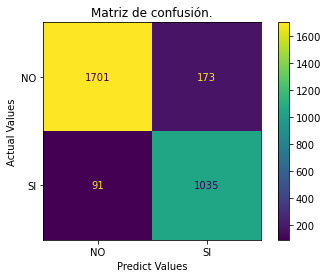

Precision,Recall,Accuracy,F1
0.86,0.92,0.91,0.89


In [14]:
model = lgb.LGBMClassifier(objective="binary", **study.best_params)
model = model.fit(
            X_train,
            y_train,
            eval_set=[(X_test, y_test)],
            eval_metric="binary_logloss",
            #eval_metric="auc",
            early_stopping_rounds=100,
            verbose=0
            
        )
y_pred = model.predict(X_test)
lgbm_precision_score_auc, lgbm_recall_score_auc, lgbm_accuracy_score_auc, lgbm_f1_score_auc = evaluate_model('lgbm grid search', y_test, y_pred)


#binarylogloss\
#con 20\
0.90	0.61	0.96	0.73\
#con 200\
0.90	0.66	0.96	0.76\
#con 400\
0.92	0.70	0.97	0.79\
#con 2000\
	Best value (rmse): 0.09074
	Best params:
		n_estimators: 10000
		learning_rate: 0.02301637191691366
		num_leaves: 488
		max_depth: 11
		min_data_in_leaf: 200
		lambda_l1: 0.18191557593992602
		lambda_l2: 1.8611934831089167
		min_gain_to_split: 0.24644752400202993
		bagging_fraction: 0.9
		bagging_freq: 1
		feature_fraction: 0.6000000000000001

\
\
#auc\

In [15]:
from IPython.display import Markdown as md
md(f'''| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |{dt_precision_score:.3f}|	{dt_recall_score:.3f}|	{dt_accuracy_score:.3f}|	{dt_f1_score:.3f}|
|Random Forest       |{rf_precision_score:.3f} |	{rf_recall_score:.3f}|	{rf_accuracy_score:.3f}|	{rf_f1_score:.3f}|
|    SVM_sigmoid        | {svm_precision_score_sigmoid:.3f} |	{svm_recall_score_sigmoid:.3f}|	{svm_accuracy_score_sigmoid:.3f}|	{svm_f1_score_sigmoid:.3f}|
|    SVM_rbf        | {svm_precision_score_rbf:.3f} |	{svm_recall_score_rbf:.3f}|	{svm_accuracy_score_rbf:.3f}|	{svm_f1_score_rbf:.3f}|
| LightGBM_optuna      |{lgbm_precision_score_auc:.3f}|	{lgbm_recall_score_auc:.3f}|	{lgbm_accuracy_score_auc:.3f}|	{lgbm_f1_score_auc:.3f}|
'''
       )

| Algorithm     | Precision     | Recall        | Accuracy      | F1            |
| ------------- | ------------- | ------------- | ------------- | ------------- |
| Arboles de decision  |0.842|	0.915|	0.904|	0.877|
|Random Forest       |0.858 |	0.924|	0.914|	0.890|
|    SVM_sigmoid        | 0.419 |	0.012|	0.623|	0.022|
|    SVM_rbf        | 0.753 |	0.456|	0.740|	0.568|
| LightGBM_optuna      |0.857|	0.919|	0.912|	0.887|
